In [21]:
import pandas as pd
import sklearn
from sklearn.model_selection import train_test_split, KFold, cross_val_score
import numpy as np
import shap
import time
import xgboost as xgb
from sklearn.metrics import accuracy_score
# import packages for hyperparameters tuning
from sklearn.model_selection import GridSearchCV
from xgboost import plot_tree
import matplotlib.pyplot as plt
from shap import datasets, KernelExplainer, force_plot, initjs
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from yellowbrick.regressor import PredictionError, ResidualsPlot, CooksDistance
from sklearn.metrics import mean_squared_error as mse
from itertools import combinations

In [10]:
data_file = 'xgboost_analysis_dt.csv'
image_path = r'C:/Users/buski/Desktop/xgboost_Phd/image/'
data = pd.read_csv(data_file, sep=",")
Train_data, Test_data = train_test_split(data, random_state=777, train_size=0.8, shuffle=True)

X_Train = Train_data.drop(['epi_week', 'pk_case', 'pop', 'IR', 'sqrtIR', 'mydata.Month2', 'mydata.Month3', 'mydata.Month4', 'mydata.Month5', 'mydata.Month6', 'mydata.Month7',
                          'mydata.Month8', 'mydata.Month9', 'mydata.Month10', 'mydata.Month11', 'mydata.Month12'], axis=1)
X_Test = Test_data.drop(['epi_week', 'pk_case', 'pop', 'IR', 'sqrtIR', 'mydata.Month2', 'mydata.Month3', 'mydata.Month4', 'mydata.Month5', 'mydata.Month6', 'mydata.Month7',
                          'mydata.Month8', 'mydata.Month9', 'mydata.Month10', 'mydata.Month11', 'mydata.Month12'], axis=1)
Y_Train = Train_data.loc[:, ['IR']]
Y_Test = Test_data.loc[:, ['IR']]

In [12]:
# log transform
Y_Train =  np.log(Y_Train +1)
Y_Test =  np.log(Y_Test +1)

In [32]:
star = time.time()
other_params ={'objective' : 'reg:squarederror'}

model = xgb.XGBRegressor(**other_params)

space={'max_depth': np.linspace(3, 7, 5, dtype=int),
        'gamma': np.linspace(0, 1, 1,dtype=int),
       'colsample_bytree': np.linspace(0.6, 1, 5),
        'min_child_weight': np.linspace(1, 2, 1, dtype=int),
       'subsample': np.linspace(0.6, 1, 5),
        'n_estimators': np.linspace(50, 250, 5, dtype=int),
       'eta': np.linspace(0.1, 0.3, 3)
    }

gs = GridSearchCV(model, space, verbose=False, refit=True, cv=5,n_jobs=1)

gs.fit(X_Train, Y_Train, early_stopping_rounds=10,eval_set= [(X_Test,Y_Test)])
end = time.time()
print(end - star)

[0]	validation_0-rmse:1.07613
[1]	validation_0-rmse:1.00995
[2]	validation_0-rmse:0.95596
[3]	validation_0-rmse:0.90369
[4]	validation_0-rmse:0.87310
[5]	validation_0-rmse:0.84233
[6]	validation_0-rmse:0.80994
[7]	validation_0-rmse:0.79104
[8]	validation_0-rmse:0.77412
[9]	validation_0-rmse:0.75837
[10]	validation_0-rmse:0.73909
[11]	validation_0-rmse:0.72891
[12]	validation_0-rmse:0.72764
[13]	validation_0-rmse:0.71672
[14]	validation_0-rmse:0.72040
[15]	validation_0-rmse:0.72422
[16]	validation_0-rmse:0.71834
[17]	validation_0-rmse:0.71403
[18]	validation_0-rmse:0.70951
[19]	validation_0-rmse:0.71032
[20]	validation_0-rmse:0.70662
[21]	validation_0-rmse:0.70939
[22]	validation_0-rmse:0.71297
[23]	validation_0-rmse:0.71533
[24]	validation_0-rmse:0.71710
[25]	validation_0-rmse:0.72021
[26]	validation_0-rmse:0.72510
[27]	validation_0-rmse:0.72365
[28]	validation_0-rmse:0.72673
[29]	validation_0-rmse:0.72720
[0]	validation_0-rmse:1.08359
[1]	validation_0-rmse:1.02039
[2]	validation_0-rms

[9]	validation_0-rmse:0.76871
[10]	validation_0-rmse:0.76441
[11]	validation_0-rmse:0.75350
[12]	validation_0-rmse:0.74802
[13]	validation_0-rmse:0.73777
[14]	validation_0-rmse:0.73090
[15]	validation_0-rmse:0.72077
[16]	validation_0-rmse:0.71985
[17]	validation_0-rmse:0.71502
[18]	validation_0-rmse:0.71188
[19]	validation_0-rmse:0.70291
[20]	validation_0-rmse:0.69561
[21]	validation_0-rmse:0.69393
[22]	validation_0-rmse:0.68966
[23]	validation_0-rmse:0.68837
[24]	validation_0-rmse:0.69209
[25]	validation_0-rmse:0.69559
[26]	validation_0-rmse:0.69434
[27]	validation_0-rmse:0.69644
[28]	validation_0-rmse:0.69356
[29]	validation_0-rmse:0.69494
[30]	validation_0-rmse:0.69334
[31]	validation_0-rmse:0.69442
[32]	validation_0-rmse:0.69439
[33]	validation_0-rmse:0.69396
[0]	validation_0-rmse:1.08174
[1]	validation_0-rmse:1.02142
[2]	validation_0-rmse:0.97163
[3]	validation_0-rmse:0.92702
[4]	validation_0-rmse:0.89140
[5]	validation_0-rmse:0.86327
[6]	validation_0-rmse:0.83743
[7]	validation_0

[19]	validation_0-rmse:0.69013
[20]	validation_0-rmse:0.68808
[21]	validation_0-rmse:0.68693
[22]	validation_0-rmse:0.68476
[23]	validation_0-rmse:0.68295
[24]	validation_0-rmse:0.68593
[25]	validation_0-rmse:0.68997
[26]	validation_0-rmse:0.68944
[27]	validation_0-rmse:0.68827
[28]	validation_0-rmse:0.68706
[29]	validation_0-rmse:0.68280
[30]	validation_0-rmse:0.68556
[31]	validation_0-rmse:0.68340
[32]	validation_0-rmse:0.68268
[33]	validation_0-rmse:0.68224
[34]	validation_0-rmse:0.68273
[35]	validation_0-rmse:0.67844
[36]	validation_0-rmse:0.67586
[37]	validation_0-rmse:0.67570
[38]	validation_0-rmse:0.67500
[39]	validation_0-rmse:0.67433
[40]	validation_0-rmse:0.67318
[41]	validation_0-rmse:0.67277
[42]	validation_0-rmse:0.67427
[43]	validation_0-rmse:0.67546
[44]	validation_0-rmse:0.67662
[45]	validation_0-rmse:0.67741
[46]	validation_0-rmse:0.67436
[47]	validation_0-rmse:0.67432
[48]	validation_0-rmse:0.67565
[49]	validation_0-rmse:0.67527
[0]	validation_0-rmse:1.08710
[1]	valid

[22]	validation_0-rmse:0.69478
[23]	validation_0-rmse:0.69440
[24]	validation_0-rmse:0.69507
[25]	validation_0-rmse:0.69741
[26]	validation_0-rmse:0.69215
[27]	validation_0-rmse:0.69050
[28]	validation_0-rmse:0.69051
[29]	validation_0-rmse:0.68977
[30]	validation_0-rmse:0.69321
[31]	validation_0-rmse:0.69400
[32]	validation_0-rmse:0.69340
[33]	validation_0-rmse:0.68984
[34]	validation_0-rmse:0.68872
[35]	validation_0-rmse:0.69178
[36]	validation_0-rmse:0.69356
[37]	validation_0-rmse:0.69308
[38]	validation_0-rmse:0.69203
[39]	validation_0-rmse:0.69013
[40]	validation_0-rmse:0.69034
[41]	validation_0-rmse:0.68960
[42]	validation_0-rmse:0.68983
[43]	validation_0-rmse:0.68929
[0]	validation_0-rmse:1.08149
[1]	validation_0-rmse:1.02399
[2]	validation_0-rmse:0.97817
[3]	validation_0-rmse:0.93216
[4]	validation_0-rmse:0.89948
[5]	validation_0-rmse:0.86638
[6]	validation_0-rmse:0.83674
[7]	validation_0-rmse:0.81432
[8]	validation_0-rmse:0.79084
[9]	validation_0-rmse:0.77320
[10]	validation_0-

[9]	validation_0-rmse:0.77458
[10]	validation_0-rmse:0.75946
[11]	validation_0-rmse:0.74501
[12]	validation_0-rmse:0.73743
[13]	validation_0-rmse:0.72519
[14]	validation_0-rmse:0.71783
[15]	validation_0-rmse:0.71105
[16]	validation_0-rmse:0.70629
[17]	validation_0-rmse:0.70310
[18]	validation_0-rmse:0.69995
[19]	validation_0-rmse:0.69013
[20]	validation_0-rmse:0.68722
[21]	validation_0-rmse:0.68452
[22]	validation_0-rmse:0.68321
[23]	validation_0-rmse:0.68510
[24]	validation_0-rmse:0.68380
[25]	validation_0-rmse:0.68220
[26]	validation_0-rmse:0.67946
[27]	validation_0-rmse:0.67868
[28]	validation_0-rmse:0.67755
[29]	validation_0-rmse:0.67714
[30]	validation_0-rmse:0.67765
[31]	validation_0-rmse:0.67668
[32]	validation_0-rmse:0.67658
[33]	validation_0-rmse:0.67409
[34]	validation_0-rmse:0.67361
[35]	validation_0-rmse:0.67426
[36]	validation_0-rmse:0.67276
[37]	validation_0-rmse:0.67472
[38]	validation_0-rmse:0.67479
[39]	validation_0-rmse:0.67330
[40]	validation_0-rmse:0.67607
[41]	vali

[30]	validation_0-rmse:0.69944
[31]	validation_0-rmse:0.70082
[32]	validation_0-rmse:0.69905
[33]	validation_0-rmse:0.69886
[34]	validation_0-rmse:0.69653
[35]	validation_0-rmse:0.69546
[36]	validation_0-rmse:0.69714
[37]	validation_0-rmse:0.69663
[38]	validation_0-rmse:0.69828
[39]	validation_0-rmse:0.69597
[40]	validation_0-rmse:0.69558
[41]	validation_0-rmse:0.69963
[42]	validation_0-rmse:0.69826
[43]	validation_0-rmse:0.69632
[44]	validation_0-rmse:0.69425
[45]	validation_0-rmse:0.69159
[46]	validation_0-rmse:0.69285
[47]	validation_0-rmse:0.69260
[48]	validation_0-rmse:0.69395
[49]	validation_0-rmse:0.69493
[50]	validation_0-rmse:0.69341
[51]	validation_0-rmse:0.69244
[52]	validation_0-rmse:0.69359
[53]	validation_0-rmse:0.69659
[54]	validation_0-rmse:0.69599
[0]	validation_0-rmse:1.08004
[1]	validation_0-rmse:1.01731
[2]	validation_0-rmse:0.96657
[3]	validation_0-rmse:0.91603
[4]	validation_0-rmse:0.87319
[5]	validation_0-rmse:0.84488
[6]	validation_0-rmse:0.81498
[7]	validation_

[25]	validation_0-rmse:0.70442
[26]	validation_0-rmse:0.70438
[27]	validation_0-rmse:0.70648
[28]	validation_0-rmse:0.70674
[29]	validation_0-rmse:0.70662
[30]	validation_0-rmse:0.70612
[31]	validation_0-rmse:0.70891
[32]	validation_0-rmse:0.70896
[33]	validation_0-rmse:0.71011
[0]	validation_0-rmse:1.08227
[1]	validation_0-rmse:1.01988
[2]	validation_0-rmse:0.96266
[3]	validation_0-rmse:0.92046
[4]	validation_0-rmse:0.88161
[5]	validation_0-rmse:0.85266
[6]	validation_0-rmse:0.82468
[7]	validation_0-rmse:0.80476
[8]	validation_0-rmse:0.79158
[9]	validation_0-rmse:0.77734
[10]	validation_0-rmse:0.75989
[11]	validation_0-rmse:0.74957
[12]	validation_0-rmse:0.74181
[13]	validation_0-rmse:0.73208
[14]	validation_0-rmse:0.72432
[15]	validation_0-rmse:0.72192
[16]	validation_0-rmse:0.72200
[17]	validation_0-rmse:0.71887
[18]	validation_0-rmse:0.71184
[19]	validation_0-rmse:0.70271
[20]	validation_0-rmse:0.69945
[21]	validation_0-rmse:0.69654
[22]	validation_0-rmse:0.69190
[23]	validation_0-

[23]	validation_0-rmse:0.70361
[24]	validation_0-rmse:0.70260
[25]	validation_0-rmse:0.70168
[26]	validation_0-rmse:0.70182
[27]	validation_0-rmse:0.70374
[28]	validation_0-rmse:0.70208
[29]	validation_0-rmse:0.70142
[30]	validation_0-rmse:0.70098
[31]	validation_0-rmse:0.70145
[0]	validation_0-rmse:1.08173
[1]	validation_0-rmse:1.02168
[2]	validation_0-rmse:0.96951
[3]	validation_0-rmse:0.92040
[4]	validation_0-rmse:0.87613
[5]	validation_0-rmse:0.83779
[6]	validation_0-rmse:0.81019
[7]	validation_0-rmse:0.78973
[8]	validation_0-rmse:0.76893
[9]	validation_0-rmse:0.75428
[10]	validation_0-rmse:0.74136
[11]	validation_0-rmse:0.73172
[12]	validation_0-rmse:0.72805
[13]	validation_0-rmse:0.71861
[14]	validation_0-rmse:0.71224
[15]	validation_0-rmse:0.70818
[16]	validation_0-rmse:0.70257
[17]	validation_0-rmse:0.69772
[18]	validation_0-rmse:0.69762
[19]	validation_0-rmse:0.69347
[20]	validation_0-rmse:0.68710
[21]	validation_0-rmse:0.68479
[22]	validation_0-rmse:0.68222
[23]	validation_0-

[26]	validation_0-rmse:0.67062
[27]	validation_0-rmse:0.66906
[28]	validation_0-rmse:0.66815
[29]	validation_0-rmse:0.66836
[30]	validation_0-rmse:0.66674
[31]	validation_0-rmse:0.66519
[32]	validation_0-rmse:0.66372
[33]	validation_0-rmse:0.66278
[34]	validation_0-rmse:0.66170
[35]	validation_0-rmse:0.66092
[36]	validation_0-rmse:0.66026
[37]	validation_0-rmse:0.66086
[38]	validation_0-rmse:0.66119
[39]	validation_0-rmse:0.66059
[40]	validation_0-rmse:0.66240
[41]	validation_0-rmse:0.66222
[42]	validation_0-rmse:0.66350
[43]	validation_0-rmse:0.66235
[44]	validation_0-rmse:0.66017
[45]	validation_0-rmse:0.66085
[46]	validation_0-rmse:0.66184
[47]	validation_0-rmse:0.66364
[48]	validation_0-rmse:0.66356
[49]	validation_0-rmse:0.66478
[50]	validation_0-rmse:0.66533
[51]	validation_0-rmse:0.66510
[52]	validation_0-rmse:0.66607
[53]	validation_0-rmse:0.66687
[0]	validation_0-rmse:1.08788
[1]	validation_0-rmse:1.02707
[2]	validation_0-rmse:0.97391
[3]	validation_0-rmse:0.92599
[4]	validati

[49]	validation_0-rmse:0.67867
[50]	validation_0-rmse:0.67621
[51]	validation_0-rmse:0.67779
[52]	validation_0-rmse:0.67649
[53]	validation_0-rmse:0.67650
[54]	validation_0-rmse:0.67568
[0]	validation_0-rmse:1.09191
[1]	validation_0-rmse:1.03533
[2]	validation_0-rmse:0.99101
[3]	validation_0-rmse:0.94403
[4]	validation_0-rmse:0.90513
[5]	validation_0-rmse:0.87826
[6]	validation_0-rmse:0.84106
[7]	validation_0-rmse:0.81771
[8]	validation_0-rmse:0.79877
[9]	validation_0-rmse:0.78951
[10]	validation_0-rmse:0.77365
[11]	validation_0-rmse:0.75975
[12]	validation_0-rmse:0.74713
[13]	validation_0-rmse:0.73701
[14]	validation_0-rmse:0.73286
[15]	validation_0-rmse:0.72706
[16]	validation_0-rmse:0.72460
[17]	validation_0-rmse:0.72318
[18]	validation_0-rmse:0.72627
[19]	validation_0-rmse:0.72418
[20]	validation_0-rmse:0.71957
[21]	validation_0-rmse:0.71652
[22]	validation_0-rmse:0.71510
[23]	validation_0-rmse:0.71224
[24]	validation_0-rmse:0.71195
[25]	validation_0-rmse:0.71027
[26]	validation_0-

[38]	validation_0-rmse:0.69310
[39]	validation_0-rmse:0.69227
[40]	validation_0-rmse:0.68668
[41]	validation_0-rmse:0.68563
[42]	validation_0-rmse:0.68571
[43]	validation_0-rmse:0.68482
[44]	validation_0-rmse:0.68327
[45]	validation_0-rmse:0.67964
[46]	validation_0-rmse:0.68015
[47]	validation_0-rmse:0.67827
[48]	validation_0-rmse:0.67747
[49]	validation_0-rmse:0.67910
[50]	validation_0-rmse:0.67984
[51]	validation_0-rmse:0.68102
[52]	validation_0-rmse:0.68305
[53]	validation_0-rmse:0.68440
[54]	validation_0-rmse:0.68422
[55]	validation_0-rmse:0.68126
[56]	validation_0-rmse:0.68121
[57]	validation_0-rmse:0.68101
[0]	validation_0-rmse:1.08220
[1]	validation_0-rmse:1.02512
[2]	validation_0-rmse:0.98022
[3]	validation_0-rmse:0.93796
[4]	validation_0-rmse:0.90303
[5]	validation_0-rmse:0.87076
[6]	validation_0-rmse:0.84160
[7]	validation_0-rmse:0.82389
[8]	validation_0-rmse:0.80204
[9]	validation_0-rmse:0.78637
[10]	validation_0-rmse:0.77198
[11]	validation_0-rmse:0.75926
[12]	validation_0-

[3]	validation_0-rmse:0.94040
[4]	validation_0-rmse:0.91431
[5]	validation_0-rmse:0.88182
[6]	validation_0-rmse:0.85722
[7]	validation_0-rmse:0.83419
[8]	validation_0-rmse:0.81652
[9]	validation_0-rmse:0.80075
[10]	validation_0-rmse:0.77967
[11]	validation_0-rmse:0.76688
[12]	validation_0-rmse:0.76335
[13]	validation_0-rmse:0.75548
[14]	validation_0-rmse:0.74772
[15]	validation_0-rmse:0.74344
[16]	validation_0-rmse:0.73191
[17]	validation_0-rmse:0.72769
[18]	validation_0-rmse:0.72662
[19]	validation_0-rmse:0.72241
[20]	validation_0-rmse:0.71798
[21]	validation_0-rmse:0.71871
[22]	validation_0-rmse:0.72033
[23]	validation_0-rmse:0.71957
[24]	validation_0-rmse:0.71601
[25]	validation_0-rmse:0.71682
[26]	validation_0-rmse:0.71523
[27]	validation_0-rmse:0.71845
[28]	validation_0-rmse:0.71659
[29]	validation_0-rmse:0.71149
[30]	validation_0-rmse:0.71484
[31]	validation_0-rmse:0.71488
[32]	validation_0-rmse:0.71267
[33]	validation_0-rmse:0.71003
[34]	validation_0-rmse:0.71398
[35]	validation

[8]	validation_0-rmse:0.79911
[9]	validation_0-rmse:0.78563
[10]	validation_0-rmse:0.77680
[11]	validation_0-rmse:0.76207
[12]	validation_0-rmse:0.75619
[13]	validation_0-rmse:0.74443
[14]	validation_0-rmse:0.73656
[15]	validation_0-rmse:0.72728
[16]	validation_0-rmse:0.72660
[17]	validation_0-rmse:0.72648
[18]	validation_0-rmse:0.72569
[19]	validation_0-rmse:0.72222
[20]	validation_0-rmse:0.72202
[21]	validation_0-rmse:0.72035
[22]	validation_0-rmse:0.72218
[23]	validation_0-rmse:0.72196
[24]	validation_0-rmse:0.72615
[25]	validation_0-rmse:0.72703
[26]	validation_0-rmse:0.72432
[27]	validation_0-rmse:0.72495
[28]	validation_0-rmse:0.72000
[29]	validation_0-rmse:0.72251
[30]	validation_0-rmse:0.72540
[31]	validation_0-rmse:0.72312
[32]	validation_0-rmse:0.72486
[33]	validation_0-rmse:0.72563
[34]	validation_0-rmse:0.72676
[35]	validation_0-rmse:0.72717
[36]	validation_0-rmse:0.73046
[37]	validation_0-rmse:0.73008
[0]	validation_0-rmse:1.07974
[1]	validation_0-rmse:1.01530
[2]	validati

[25]	validation_0-rmse:0.72021
[26]	validation_0-rmse:0.72510
[27]	validation_0-rmse:0.72365
[28]	validation_0-rmse:0.72673
[29]	validation_0-rmse:0.72720
[30]	validation_0-rmse:0.72693
[0]	validation_0-rmse:1.08359
[1]	validation_0-rmse:1.02039
[2]	validation_0-rmse:0.96075
[3]	validation_0-rmse:0.92223
[4]	validation_0-rmse:0.87892
[5]	validation_0-rmse:0.84911
[6]	validation_0-rmse:0.81637
[7]	validation_0-rmse:0.79759
[8]	validation_0-rmse:0.78173
[9]	validation_0-rmse:0.76882
[10]	validation_0-rmse:0.75465
[11]	validation_0-rmse:0.74966
[12]	validation_0-rmse:0.74645
[13]	validation_0-rmse:0.73292
[14]	validation_0-rmse:0.72458
[15]	validation_0-rmse:0.71240
[16]	validation_0-rmse:0.70650
[17]	validation_0-rmse:0.70286
[18]	validation_0-rmse:0.70124
[19]	validation_0-rmse:0.69723
[20]	validation_0-rmse:0.69300
[21]	validation_0-rmse:0.69377
[22]	validation_0-rmse:0.68863
[23]	validation_0-rmse:0.68732
[24]	validation_0-rmse:0.68967
[25]	validation_0-rmse:0.69308
[26]	validation_0-

[5]	validation_0-rmse:0.85382
[6]	validation_0-rmse:0.82235
[7]	validation_0-rmse:0.79909
[8]	validation_0-rmse:0.78139
[9]	validation_0-rmse:0.76871
[10]	validation_0-rmse:0.76441
[11]	validation_0-rmse:0.75350
[12]	validation_0-rmse:0.74802
[13]	validation_0-rmse:0.73777
[14]	validation_0-rmse:0.73090
[15]	validation_0-rmse:0.72077
[16]	validation_0-rmse:0.71985
[17]	validation_0-rmse:0.71502
[18]	validation_0-rmse:0.71188
[19]	validation_0-rmse:0.70291
[20]	validation_0-rmse:0.69561
[21]	validation_0-rmse:0.69393
[22]	validation_0-rmse:0.68966
[23]	validation_0-rmse:0.68837
[24]	validation_0-rmse:0.69209
[25]	validation_0-rmse:0.69559
[26]	validation_0-rmse:0.69434
[27]	validation_0-rmse:0.69644
[28]	validation_0-rmse:0.69356
[29]	validation_0-rmse:0.69494
[30]	validation_0-rmse:0.69334
[31]	validation_0-rmse:0.69442
[32]	validation_0-rmse:0.69439
[0]	validation_0-rmse:1.08174
[1]	validation_0-rmse:1.02142
[2]	validation_0-rmse:0.97163
[3]	validation_0-rmse:0.92702
[4]	validation_0-

[51]	validation_0-rmse:0.68628
[52]	validation_0-rmse:0.68667
[0]	validation_0-rmse:1.08174
[1]	validation_0-rmse:1.02220
[2]	validation_0-rmse:0.97099
[3]	validation_0-rmse:0.92139
[4]	validation_0-rmse:0.88326
[5]	validation_0-rmse:0.84290
[6]	validation_0-rmse:0.81710
[7]	validation_0-rmse:0.79463
[8]	validation_0-rmse:0.77391
[9]	validation_0-rmse:0.76113
[10]	validation_0-rmse:0.74628
[11]	validation_0-rmse:0.74084
[12]	validation_0-rmse:0.73324
[13]	validation_0-rmse:0.72231
[14]	validation_0-rmse:0.71871
[15]	validation_0-rmse:0.70807
[16]	validation_0-rmse:0.70757
[17]	validation_0-rmse:0.69871
[18]	validation_0-rmse:0.69470
[19]	validation_0-rmse:0.69013
[20]	validation_0-rmse:0.68808
[21]	validation_0-rmse:0.68693
[22]	validation_0-rmse:0.68476
[23]	validation_0-rmse:0.68295
[24]	validation_0-rmse:0.68593
[25]	validation_0-rmse:0.68997
[26]	validation_0-rmse:0.68944
[27]	validation_0-rmse:0.68827
[28]	validation_0-rmse:0.68706
[29]	validation_0-rmse:0.68280
[30]	validation_0-

[49]	validation_0-rmse:0.65403
[50]	validation_0-rmse:0.65452
[51]	validation_0-rmse:0.65440
[0]	validation_0-rmse:1.08127
[1]	validation_0-rmse:1.01894
[2]	validation_0-rmse:0.96943
[3]	validation_0-rmse:0.92469
[4]	validation_0-rmse:0.88287
[5]	validation_0-rmse:0.84892
[6]	validation_0-rmse:0.81787
[7]	validation_0-rmse:0.79541
[8]	validation_0-rmse:0.77878
[9]	validation_0-rmse:0.76323
[10]	validation_0-rmse:0.75149
[11]	validation_0-rmse:0.74553
[12]	validation_0-rmse:0.74090
[13]	validation_0-rmse:0.73280
[14]	validation_0-rmse:0.72231
[15]	validation_0-rmse:0.71846
[16]	validation_0-rmse:0.71367
[17]	validation_0-rmse:0.70805
[18]	validation_0-rmse:0.70011
[19]	validation_0-rmse:0.69613
[20]	validation_0-rmse:0.69536
[21]	validation_0-rmse:0.69417
[22]	validation_0-rmse:0.69478
[23]	validation_0-rmse:0.69440
[24]	validation_0-rmse:0.69507
[25]	validation_0-rmse:0.69741
[26]	validation_0-rmse:0.69215
[27]	validation_0-rmse:0.69050
[28]	validation_0-rmse:0.69051
[29]	validation_0-

[28]	validation_0-rmse:0.67397
[29]	validation_0-rmse:0.67610
[30]	validation_0-rmse:0.67411
[31]	validation_0-rmse:0.67265
[32]	validation_0-rmse:0.67104
[33]	validation_0-rmse:0.67081
[34]	validation_0-rmse:0.66844
[35]	validation_0-rmse:0.66853
[36]	validation_0-rmse:0.66916
[37]	validation_0-rmse:0.66888
[38]	validation_0-rmse:0.66683
[39]	validation_0-rmse:0.66785
[40]	validation_0-rmse:0.66694
[41]	validation_0-rmse:0.66639
[42]	validation_0-rmse:0.66695
[43]	validation_0-rmse:0.66704
[44]	validation_0-rmse:0.66887
[45]	validation_0-rmse:0.66740
[46]	validation_0-rmse:0.66668
[47]	validation_0-rmse:0.66669
[48]	validation_0-rmse:0.66684
[49]	validation_0-rmse:0.66595
[50]	validation_0-rmse:0.66621
[51]	validation_0-rmse:0.66556
[52]	validation_0-rmse:0.66475
[53]	validation_0-rmse:0.66683
[54]	validation_0-rmse:0.66584
[55]	validation_0-rmse:0.66767
[56]	validation_0-rmse:0.66674
[57]	validation_0-rmse:0.66779
[58]	validation_0-rmse:0.66741
[59]	validation_0-rmse:0.66774
[60]	val

[53]	validation_0-rmse:0.69047
[54]	validation_0-rmse:0.68890
[55]	validation_0-rmse:0.68578
[56]	validation_0-rmse:0.68743
[57]	validation_0-rmse:0.68795
[58]	validation_0-rmse:0.68646
[59]	validation_0-rmse:0.68596
[60]	validation_0-rmse:0.68867
[61]	validation_0-rmse:0.68806
[62]	validation_0-rmse:0.69028
[63]	validation_0-rmse:0.69009
[64]	validation_0-rmse:0.69022
[65]	validation_0-rmse:0.69040
[0]	validation_0-rmse:1.08333
[1]	validation_0-rmse:1.02902
[2]	validation_0-rmse:0.98130
[3]	validation_0-rmse:0.93218
[4]	validation_0-rmse:0.89910
[5]	validation_0-rmse:0.86541
[6]	validation_0-rmse:0.83328
[7]	validation_0-rmse:0.81141
[8]	validation_0-rmse:0.79341
[9]	validation_0-rmse:0.78063
[10]	validation_0-rmse:0.76825
[11]	validation_0-rmse:0.75731
[12]	validation_0-rmse:0.75009
[13]	validation_0-rmse:0.74062
[14]	validation_0-rmse:0.73442
[15]	validation_0-rmse:0.73110
[16]	validation_0-rmse:0.72731
[17]	validation_0-rmse:0.72335
[18]	validation_0-rmse:0.71486
[19]	validation_0-

[37]	validation_0-rmse:0.70092
[38]	validation_0-rmse:0.69723
[39]	validation_0-rmse:0.69901
[40]	validation_0-rmse:0.70025
[41]	validation_0-rmse:0.70031
[42]	validation_0-rmse:0.69963
[43]	validation_0-rmse:0.69697
[44]	validation_0-rmse:0.69300
[45]	validation_0-rmse:0.69128
[46]	validation_0-rmse:0.69196
[47]	validation_0-rmse:0.69394
[48]	validation_0-rmse:0.69763
[49]	validation_0-rmse:0.69865
[50]	validation_0-rmse:0.69757
[51]	validation_0-rmse:0.69859
[52]	validation_0-rmse:0.69812
[53]	validation_0-rmse:0.69589
[54]	validation_0-rmse:0.69623
[0]	validation_0-rmse:1.07968
[1]	validation_0-rmse:1.02078
[2]	validation_0-rmse:0.96752
[3]	validation_0-rmse:0.92021
[4]	validation_0-rmse:0.88827
[5]	validation_0-rmse:0.85338
[6]	validation_0-rmse:0.82335
[7]	validation_0-rmse:0.80051
[8]	validation_0-rmse:0.77418
[9]	validation_0-rmse:0.75750
[10]	validation_0-rmse:0.73940
[11]	validation_0-rmse:0.73395
[12]	validation_0-rmse:0.72615
[13]	validation_0-rmse:0.71930
[14]	validation_0-

[18]	validation_0-rmse:0.70839
[19]	validation_0-rmse:0.70297
[20]	validation_0-rmse:0.70130
[21]	validation_0-rmse:0.70280
[22]	validation_0-rmse:0.70366
[23]	validation_0-rmse:0.70428
[24]	validation_0-rmse:0.70460
[25]	validation_0-rmse:0.70431
[26]	validation_0-rmse:0.69966
[27]	validation_0-rmse:0.69764
[28]	validation_0-rmse:0.69491
[29]	validation_0-rmse:0.69065
[30]	validation_0-rmse:0.69307
[31]	validation_0-rmse:0.69309
[32]	validation_0-rmse:0.69601
[33]	validation_0-rmse:0.69781
[34]	validation_0-rmse:0.69958
[35]	validation_0-rmse:0.70124
[36]	validation_0-rmse:0.69956
[37]	validation_0-rmse:0.69885
[38]	validation_0-rmse:0.69797
[39]	validation_0-rmse:0.70021
[0]	validation_0-rmse:1.08218
[1]	validation_0-rmse:1.02299
[2]	validation_0-rmse:0.96945
[3]	validation_0-rmse:0.92472
[4]	validation_0-rmse:0.88934
[5]	validation_0-rmse:0.85605
[6]	validation_0-rmse:0.82425
[7]	validation_0-rmse:0.80336
[8]	validation_0-rmse:0.78595
[9]	validation_0-rmse:0.77647
[10]	validation_0-

[31]	validation_0-rmse:0.71289
[32]	validation_0-rmse:0.71380
[33]	validation_0-rmse:0.71410
[34]	validation_0-rmse:0.71252
[35]	validation_0-rmse:0.71128
[36]	validation_0-rmse:0.71178
[37]	validation_0-rmse:0.71163
[38]	validation_0-rmse:0.70956
[39]	validation_0-rmse:0.71008
[40]	validation_0-rmse:0.71103
[41]	validation_0-rmse:0.71090
[42]	validation_0-rmse:0.71093
[43]	validation_0-rmse:0.70964
[44]	validation_0-rmse:0.71153
[45]	validation_0-rmse:0.71154
[46]	validation_0-rmse:0.71269
[47]	validation_0-rmse:0.71204
[48]	validation_0-rmse:0.71091
[0]	validation_0-rmse:1.08620
[1]	validation_0-rmse:1.02517
[2]	validation_0-rmse:0.97050
[3]	validation_0-rmse:0.92262
[4]	validation_0-rmse:0.88528
[5]	validation_0-rmse:0.84931
[6]	validation_0-rmse:0.82001
[7]	validation_0-rmse:0.79573
[8]	validation_0-rmse:0.77942
[9]	validation_0-rmse:0.76100
[10]	validation_0-rmse:0.74774
[11]	validation_0-rmse:0.73394
[12]	validation_0-rmse:0.72505
[13]	validation_0-rmse:0.71654
[14]	validation_0-

[34]	validation_0-rmse:0.68302
[35]	validation_0-rmse:0.68347
[36]	validation_0-rmse:0.68440
[37]	validation_0-rmse:0.68524
[38]	validation_0-rmse:0.68312
[39]	validation_0-rmse:0.68761
[40]	validation_0-rmse:0.68314
[41]	validation_0-rmse:0.68190
[42]	validation_0-rmse:0.68380
[43]	validation_0-rmse:0.68537
[44]	validation_0-rmse:0.68329
[45]	validation_0-rmse:0.68497
[46]	validation_0-rmse:0.68459
[47]	validation_0-rmse:0.68453
[48]	validation_0-rmse:0.68056
[49]	validation_0-rmse:0.67910
[0]	validation_0-rmse:1.08886
[1]	validation_0-rmse:1.02513
[2]	validation_0-rmse:0.97217
[3]	validation_0-rmse:0.93096
[4]	validation_0-rmse:0.89655
[5]	validation_0-rmse:0.85730
[6]	validation_0-rmse:0.82227
[7]	validation_0-rmse:0.80040
[8]	validation_0-rmse:0.78292
[9]	validation_0-rmse:0.76622
[10]	validation_0-rmse:0.75117
[11]	validation_0-rmse:0.74430
[12]	validation_0-rmse:0.73435
[13]	validation_0-rmse:0.72242
[14]	validation_0-rmse:0.71686
[15]	validation_0-rmse:0.71094
[16]	validation_0-

[4]	validation_0-rmse:0.90225
[5]	validation_0-rmse:0.87136
[6]	validation_0-rmse:0.84174
[7]	validation_0-rmse:0.82161
[8]	validation_0-rmse:0.79795
[9]	validation_0-rmse:0.78312
[10]	validation_0-rmse:0.77068
[11]	validation_0-rmse:0.75873
[12]	validation_0-rmse:0.75261
[13]	validation_0-rmse:0.74449
[14]	validation_0-rmse:0.73575
[15]	validation_0-rmse:0.72196
[16]	validation_0-rmse:0.71815
[17]	validation_0-rmse:0.71024
[18]	validation_0-rmse:0.70861
[19]	validation_0-rmse:0.70793
[20]	validation_0-rmse:0.70306
[21]	validation_0-rmse:0.69916
[22]	validation_0-rmse:0.69902
[23]	validation_0-rmse:0.69515
[24]	validation_0-rmse:0.69443
[25]	validation_0-rmse:0.69373
[26]	validation_0-rmse:0.69665
[27]	validation_0-rmse:0.69882
[28]	validation_0-rmse:0.69728
[29]	validation_0-rmse:0.69200
[30]	validation_0-rmse:0.68925
[31]	validation_0-rmse:0.68879
[32]	validation_0-rmse:0.68660
[33]	validation_0-rmse:0.68474
[34]	validation_0-rmse:0.68282
[35]	validation_0-rmse:0.68266
[36]	validatio

[1]	validation_0-rmse:1.02239
[2]	validation_0-rmse:0.97600
[3]	validation_0-rmse:0.93402
[4]	validation_0-rmse:0.90747
[5]	validation_0-rmse:0.87916
[6]	validation_0-rmse:0.85398
[7]	validation_0-rmse:0.83356
[8]	validation_0-rmse:0.81256
[9]	validation_0-rmse:0.79401
[10]	validation_0-rmse:0.78045
[11]	validation_0-rmse:0.76821
[12]	validation_0-rmse:0.76246
[13]	validation_0-rmse:0.75131
[14]	validation_0-rmse:0.74246
[15]	validation_0-rmse:0.73478
[16]	validation_0-rmse:0.73033
[17]	validation_0-rmse:0.72858
[18]	validation_0-rmse:0.72497
[19]	validation_0-rmse:0.71843
[20]	validation_0-rmse:0.71501
[21]	validation_0-rmse:0.71427
[22]	validation_0-rmse:0.71454
[23]	validation_0-rmse:0.71223
[24]	validation_0-rmse:0.71140
[25]	validation_0-rmse:0.71132
[26]	validation_0-rmse:0.70844
[27]	validation_0-rmse:0.71094
[28]	validation_0-rmse:0.70956
[29]	validation_0-rmse:0.70610
[30]	validation_0-rmse:0.70888
[31]	validation_0-rmse:0.70563
[32]	validation_0-rmse:0.70346
[33]	validation_0

[0]	validation_0-rmse:1.08303
[1]	validation_0-rmse:1.02692
[2]	validation_0-rmse:0.98613
[3]	validation_0-rmse:0.93982
[4]	validation_0-rmse:0.90682
[5]	validation_0-rmse:0.87424
[6]	validation_0-rmse:0.85455
[7]	validation_0-rmse:0.83373
[8]	validation_0-rmse:0.81733
[9]	validation_0-rmse:0.80083
[10]	validation_0-rmse:0.78819
[11]	validation_0-rmse:0.77656
[12]	validation_0-rmse:0.76642
[13]	validation_0-rmse:0.75304
[14]	validation_0-rmse:0.75193
[15]	validation_0-rmse:0.74620
[16]	validation_0-rmse:0.74254
[17]	validation_0-rmse:0.73917
[18]	validation_0-rmse:0.73791
[19]	validation_0-rmse:0.73833
[20]	validation_0-rmse:0.74049
[21]	validation_0-rmse:0.73842
[22]	validation_0-rmse:0.73969
[23]	validation_0-rmse:0.73803
[24]	validation_0-rmse:0.73745
[25]	validation_0-rmse:0.73798
[26]	validation_0-rmse:0.73534
[27]	validation_0-rmse:0.73345
[28]	validation_0-rmse:0.73312
[29]	validation_0-rmse:0.73353
[30]	validation_0-rmse:0.73441
[31]	validation_0-rmse:0.73822
[32]	validation_0-

[33]	validation_0-rmse:0.69056
[34]	validation_0-rmse:0.69081
[35]	validation_0-rmse:0.69092
[36]	validation_0-rmse:0.69162
[37]	validation_0-rmse:0.68955
[38]	validation_0-rmse:0.68930
[39]	validation_0-rmse:0.68951
[40]	validation_0-rmse:0.68452
[41]	validation_0-rmse:0.68719
[42]	validation_0-rmse:0.68830
[43]	validation_0-rmse:0.68899
[44]	validation_0-rmse:0.68732
[45]	validation_0-rmse:0.69138
[46]	validation_0-rmse:0.69170
[47]	validation_0-rmse:0.69171
[48]	validation_0-rmse:0.68862
[49]	validation_0-rmse:0.68788
[0]	validation_0-rmse:1.08536
[1]	validation_0-rmse:1.02225
[2]	validation_0-rmse:0.95963
[3]	validation_0-rmse:0.92391
[4]	validation_0-rmse:0.88250
[5]	validation_0-rmse:0.84721
[6]	validation_0-rmse:0.81308
[7]	validation_0-rmse:0.78788
[8]	validation_0-rmse:0.77237
[9]	validation_0-rmse:0.75616
[10]	validation_0-rmse:0.73665
[11]	validation_0-rmse:0.72525
[12]	validation_0-rmse:0.72239
[13]	validation_0-rmse:0.71219
[14]	validation_0-rmse:0.71262
[15]	validation_0-

[6]	validation_0-rmse:0.82024
[7]	validation_0-rmse:0.79631
[8]	validation_0-rmse:0.78212
[9]	validation_0-rmse:0.76819
[10]	validation_0-rmse:0.75516
[11]	validation_0-rmse:0.74596
[12]	validation_0-rmse:0.74852
[13]	validation_0-rmse:0.73698
[14]	validation_0-rmse:0.73410
[15]	validation_0-rmse:0.72302
[16]	validation_0-rmse:0.72611
[17]	validation_0-rmse:0.72842
[18]	validation_0-rmse:0.72389
[19]	validation_0-rmse:0.71843
[20]	validation_0-rmse:0.71403
[21]	validation_0-rmse:0.72027
[22]	validation_0-rmse:0.72126
[23]	validation_0-rmse:0.72176
[24]	validation_0-rmse:0.72247
[25]	validation_0-rmse:0.72235
[26]	validation_0-rmse:0.72092
[27]	validation_0-rmse:0.72417
[28]	validation_0-rmse:0.71831
[29]	validation_0-rmse:0.72100
[30]	validation_0-rmse:0.72158
[0]	validation_0-rmse:1.08253
[1]	validation_0-rmse:1.01630
[2]	validation_0-rmse:0.96640
[3]	validation_0-rmse:0.92471
[4]	validation_0-rmse:0.88979
[5]	validation_0-rmse:0.86242
[6]	validation_0-rmse:0.83552
[7]	validation_0-rm

[17]	validation_0-rmse:0.72449
[18]	validation_0-rmse:0.72489
[19]	validation_0-rmse:0.72246
[20]	validation_0-rmse:0.72157
[21]	validation_0-rmse:0.71637
[22]	validation_0-rmse:0.71417
[23]	validation_0-rmse:0.71247
[24]	validation_0-rmse:0.71206
[25]	validation_0-rmse:0.70746
[26]	validation_0-rmse:0.71011
[27]	validation_0-rmse:0.71128
[28]	validation_0-rmse:0.70902
[29]	validation_0-rmse:0.70449
[30]	validation_0-rmse:0.70354
[31]	validation_0-rmse:0.70151
[32]	validation_0-rmse:0.70164
[33]	validation_0-rmse:0.70096
[34]	validation_0-rmse:0.70116
[35]	validation_0-rmse:0.69838
[36]	validation_0-rmse:0.69968
[37]	validation_0-rmse:0.70061
[38]	validation_0-rmse:0.70113
[39]	validation_0-rmse:0.70276
[40]	validation_0-rmse:0.70156
[41]	validation_0-rmse:0.70101
[42]	validation_0-rmse:0.70095
[43]	validation_0-rmse:0.70000
[44]	validation_0-rmse:0.70146
[0]	validation_0-rmse:1.08923
[1]	validation_0-rmse:1.03023
[2]	validation_0-rmse:0.98117
[3]	validation_0-rmse:0.93471
[4]	validati

[0]	validation_0-rmse:1.08102
[1]	validation_0-rmse:1.01501
[2]	validation_0-rmse:0.96503
[3]	validation_0-rmse:0.92051
[4]	validation_0-rmse:0.88006
[5]	validation_0-rmse:0.84679
[6]	validation_0-rmse:0.81472
[7]	validation_0-rmse:0.79206
[8]	validation_0-rmse:0.77160
[9]	validation_0-rmse:0.75617
[10]	validation_0-rmse:0.74519
[11]	validation_0-rmse:0.73044
[12]	validation_0-rmse:0.72600
[13]	validation_0-rmse:0.72034
[14]	validation_0-rmse:0.71055
[15]	validation_0-rmse:0.70896
[16]	validation_0-rmse:0.70561
[17]	validation_0-rmse:0.70235
[18]	validation_0-rmse:0.69651
[19]	validation_0-rmse:0.69405
[20]	validation_0-rmse:0.69040
[21]	validation_0-rmse:0.68707
[22]	validation_0-rmse:0.68657
[23]	validation_0-rmse:0.68636
[24]	validation_0-rmse:0.68720
[25]	validation_0-rmse:0.68926
[26]	validation_0-rmse:0.68488
[27]	validation_0-rmse:0.68520
[28]	validation_0-rmse:0.68535
[29]	validation_0-rmse:0.68557
[30]	validation_0-rmse:0.68877
[31]	validation_0-rmse:0.68943
[32]	validation_0-

[28]	validation_0-rmse:0.69356
[29]	validation_0-rmse:0.69721
[30]	validation_0-rmse:0.69282
[31]	validation_0-rmse:0.69068
[32]	validation_0-rmse:0.68820
[33]	validation_0-rmse:0.68868
[34]	validation_0-rmse:0.69153
[35]	validation_0-rmse:0.68899
[36]	validation_0-rmse:0.68653
[37]	validation_0-rmse:0.68368
[38]	validation_0-rmse:0.68338
[39]	validation_0-rmse:0.68287
[40]	validation_0-rmse:0.68505
[41]	validation_0-rmse:0.68341
[42]	validation_0-rmse:0.68566
[43]	validation_0-rmse:0.68593
[44]	validation_0-rmse:0.68618
[45]	validation_0-rmse:0.68749
[46]	validation_0-rmse:0.68820
[47]	validation_0-rmse:0.68896
[48]	validation_0-rmse:0.69012
[0]	validation_0-rmse:1.08660
[1]	validation_0-rmse:1.02290
[2]	validation_0-rmse:0.97134
[3]	validation_0-rmse:0.93074
[4]	validation_0-rmse:0.89471
[5]	validation_0-rmse:0.86016
[6]	validation_0-rmse:0.83160
[7]	validation_0-rmse:0.81335
[8]	validation_0-rmse:0.79840
[9]	validation_0-rmse:0.77976
[10]	validation_0-rmse:0.76278
[11]	validation_0-

[34]	validation_0-rmse:0.71434
[35]	validation_0-rmse:0.71315
[36]	validation_0-rmse:0.71252
[37]	validation_0-rmse:0.71134
[38]	validation_0-rmse:0.71119
[39]	validation_0-rmse:0.71083
[40]	validation_0-rmse:0.71162
[41]	validation_0-rmse:0.71077
[42]	validation_0-rmse:0.71242
[0]	validation_0-rmse:1.08876
[1]	validation_0-rmse:1.03323
[2]	validation_0-rmse:0.98192
[3]	validation_0-rmse:0.93295
[4]	validation_0-rmse:0.89922
[5]	validation_0-rmse:0.86546
[6]	validation_0-rmse:0.83033
[7]	validation_0-rmse:0.81072
[8]	validation_0-rmse:0.78931
[9]	validation_0-rmse:0.77905
[10]	validation_0-rmse:0.76872
[11]	validation_0-rmse:0.76064
[12]	validation_0-rmse:0.75576
[13]	validation_0-rmse:0.74296
[14]	validation_0-rmse:0.73825
[15]	validation_0-rmse:0.73001
[16]	validation_0-rmse:0.72210
[17]	validation_0-rmse:0.71434
[18]	validation_0-rmse:0.70799
[19]	validation_0-rmse:0.70857
[20]	validation_0-rmse:0.70511
[21]	validation_0-rmse:0.69923
[22]	validation_0-rmse:0.69991
[23]	validation_0-

[3]	validation_0-rmse:0.92040
[4]	validation_0-rmse:0.88113
[5]	validation_0-rmse:0.84533
[6]	validation_0-rmse:0.81536
[7]	validation_0-rmse:0.79397
[8]	validation_0-rmse:0.77078
[9]	validation_0-rmse:0.75380
[10]	validation_0-rmse:0.74114
[11]	validation_0-rmse:0.73266
[12]	validation_0-rmse:0.71920
[13]	validation_0-rmse:0.71201
[14]	validation_0-rmse:0.71177
[15]	validation_0-rmse:0.70892
[16]	validation_0-rmse:0.70185
[17]	validation_0-rmse:0.70548
[18]	validation_0-rmse:0.70537
[19]	validation_0-rmse:0.70108
[20]	validation_0-rmse:0.70345
[21]	validation_0-rmse:0.70206
[22]	validation_0-rmse:0.70126
[23]	validation_0-rmse:0.69688
[24]	validation_0-rmse:0.69976
[25]	validation_0-rmse:0.70084
[26]	validation_0-rmse:0.70039
[27]	validation_0-rmse:0.70102
[28]	validation_0-rmse:0.70253
[29]	validation_0-rmse:0.70178
[30]	validation_0-rmse:0.70222
[31]	validation_0-rmse:0.70291
[32]	validation_0-rmse:0.70349
[33]	validation_0-rmse:0.70676
[0]	validation_0-rmse:1.07624
[1]	validation_0

[3]	validation_0-rmse:0.92110
[4]	validation_0-rmse:0.88197
[5]	validation_0-rmse:0.84871
[6]	validation_0-rmse:0.81687
[7]	validation_0-rmse:0.79416
[8]	validation_0-rmse:0.77603
[9]	validation_0-rmse:0.76417
[10]	validation_0-rmse:0.74790
[11]	validation_0-rmse:0.74110
[12]	validation_0-rmse:0.73306
[13]	validation_0-rmse:0.72345
[14]	validation_0-rmse:0.71335
[15]	validation_0-rmse:0.70867
[16]	validation_0-rmse:0.70674
[17]	validation_0-rmse:0.70127
[18]	validation_0-rmse:0.69581
[19]	validation_0-rmse:0.69052
[20]	validation_0-rmse:0.68430
[21]	validation_0-rmse:0.68203
[22]	validation_0-rmse:0.68090
[23]	validation_0-rmse:0.67827
[24]	validation_0-rmse:0.67765
[25]	validation_0-rmse:0.67707
[26]	validation_0-rmse:0.67908
[27]	validation_0-rmse:0.67654
[28]	validation_0-rmse:0.67207
[29]	validation_0-rmse:0.66946
[30]	validation_0-rmse:0.66871
[31]	validation_0-rmse:0.66940
[32]	validation_0-rmse:0.66859
[33]	validation_0-rmse:0.66924
[34]	validation_0-rmse:0.66884
[35]	validation

[23]	validation_0-rmse:0.73203
[24]	validation_0-rmse:0.73319
[25]	validation_0-rmse:0.73192
[26]	validation_0-rmse:0.72788
[27]	validation_0-rmse:0.72751
[28]	validation_0-rmse:0.73003
[29]	validation_0-rmse:0.72960
[30]	validation_0-rmse:0.72979
[31]	validation_0-rmse:0.73003
[32]	validation_0-rmse:0.73031
[33]	validation_0-rmse:0.72976
[34]	validation_0-rmse:0.72612
[35]	validation_0-rmse:0.72566
[36]	validation_0-rmse:0.72610
[37]	validation_0-rmse:0.72730
[38]	validation_0-rmse:0.72574
[39]	validation_0-rmse:0.72560
[40]	validation_0-rmse:0.72344
[41]	validation_0-rmse:0.72349
[42]	validation_0-rmse:0.72515
[43]	validation_0-rmse:0.72554
[44]	validation_0-rmse:0.72502
[45]	validation_0-rmse:0.72464
[46]	validation_0-rmse:0.72567
[47]	validation_0-rmse:0.72666
[48]	validation_0-rmse:0.72730
[49]	validation_0-rmse:0.72779
[0]	validation_0-rmse:1.08091
[1]	validation_0-rmse:1.02211
[2]	validation_0-rmse:0.96976
[3]	validation_0-rmse:0.92118
[4]	validation_0-rmse:0.88456
[5]	validatio

[45]	validation_0-rmse:0.68497
[46]	validation_0-rmse:0.68459
[47]	validation_0-rmse:0.68453
[48]	validation_0-rmse:0.68056
[49]	validation_0-rmse:0.67910
[50]	validation_0-rmse:0.67731
[51]	validation_0-rmse:0.67877
[52]	validation_0-rmse:0.68049
[53]	validation_0-rmse:0.68048
[54]	validation_0-rmse:0.67866
[55]	validation_0-rmse:0.68035
[56]	validation_0-rmse:0.68387
[57]	validation_0-rmse:0.68420
[58]	validation_0-rmse:0.68482
[59]	validation_0-rmse:0.68495
[0]	validation_0-rmse:1.08886
[1]	validation_0-rmse:1.02513
[2]	validation_0-rmse:0.97217
[3]	validation_0-rmse:0.93096
[4]	validation_0-rmse:0.89655
[5]	validation_0-rmse:0.85730
[6]	validation_0-rmse:0.82227
[7]	validation_0-rmse:0.80040
[8]	validation_0-rmse:0.78292
[9]	validation_0-rmse:0.76622
[10]	validation_0-rmse:0.75117
[11]	validation_0-rmse:0.74430
[12]	validation_0-rmse:0.73435
[13]	validation_0-rmse:0.72242
[14]	validation_0-rmse:0.71686
[15]	validation_0-rmse:0.71094
[16]	validation_0-rmse:0.70814
[17]	validation_0-

[36]	validation_0-rmse:0.70014
[37]	validation_0-rmse:0.70008
[38]	validation_0-rmse:0.70022
[0]	validation_0-rmse:1.08937
[1]	validation_0-rmse:1.02857
[2]	validation_0-rmse:0.97969
[3]	validation_0-rmse:0.93352
[4]	validation_0-rmse:0.90225
[5]	validation_0-rmse:0.87136
[6]	validation_0-rmse:0.84174
[7]	validation_0-rmse:0.82161
[8]	validation_0-rmse:0.79795
[9]	validation_0-rmse:0.78312
[10]	validation_0-rmse:0.77068
[11]	validation_0-rmse:0.75873
[12]	validation_0-rmse:0.75261
[13]	validation_0-rmse:0.74449
[14]	validation_0-rmse:0.73575
[15]	validation_0-rmse:0.72196
[16]	validation_0-rmse:0.71815
[17]	validation_0-rmse:0.71024
[18]	validation_0-rmse:0.70861
[19]	validation_0-rmse:0.70793
[20]	validation_0-rmse:0.70306
[21]	validation_0-rmse:0.69916
[22]	validation_0-rmse:0.69902
[23]	validation_0-rmse:0.69515
[24]	validation_0-rmse:0.69443
[25]	validation_0-rmse:0.69373
[26]	validation_0-rmse:0.69665
[27]	validation_0-rmse:0.69882
[28]	validation_0-rmse:0.69728
[29]	validation_0-

[34]	validation_0-rmse:0.70064
[35]	validation_0-rmse:0.69964
[36]	validation_0-rmse:0.69571
[37]	validation_0-rmse:0.69580
[38]	validation_0-rmse:0.69525
[39]	validation_0-rmse:0.69393
[40]	validation_0-rmse:0.69471
[41]	validation_0-rmse:0.69655
[42]	validation_0-rmse:0.69783
[43]	validation_0-rmse:0.69757
[44]	validation_0-rmse:0.69740
[45]	validation_0-rmse:0.69643
[46]	validation_0-rmse:0.69707
[47]	validation_0-rmse:0.69832
[48]	validation_0-rmse:0.69629
[0]	validation_0-rmse:1.07976
[1]	validation_0-rmse:1.02239
[2]	validation_0-rmse:0.97600
[3]	validation_0-rmse:0.93402
[4]	validation_0-rmse:0.90747
[5]	validation_0-rmse:0.87916
[6]	validation_0-rmse:0.85398
[7]	validation_0-rmse:0.83356
[8]	validation_0-rmse:0.81256
[9]	validation_0-rmse:0.79401
[10]	validation_0-rmse:0.78045
[11]	validation_0-rmse:0.76821
[12]	validation_0-rmse:0.76246
[13]	validation_0-rmse:0.75131
[14]	validation_0-rmse:0.74246
[15]	validation_0-rmse:0.73478
[16]	validation_0-rmse:0.73033
[17]	validation_0-

[25]	validation_0-rmse:0.68809
[26]	validation_0-rmse:0.68721
[27]	validation_0-rmse:0.68362
[28]	validation_0-rmse:0.68302
[29]	validation_0-rmse:0.68065
[30]	validation_0-rmse:0.68338
[31]	validation_0-rmse:0.68282
[32]	validation_0-rmse:0.68159
[33]	validation_0-rmse:0.68137
[34]	validation_0-rmse:0.68066
[35]	validation_0-rmse:0.68058
[36]	validation_0-rmse:0.68233
[37]	validation_0-rmse:0.68180
[38]	validation_0-rmse:0.67997
[39]	validation_0-rmse:0.68039
[40]	validation_0-rmse:0.68021
[41]	validation_0-rmse:0.68003
[42]	validation_0-rmse:0.67818
[43]	validation_0-rmse:0.67769
[44]	validation_0-rmse:0.67779
[45]	validation_0-rmse:0.67848
[46]	validation_0-rmse:0.67732
[47]	validation_0-rmse:0.67802
[48]	validation_0-rmse:0.67776
[49]	validation_0-rmse:0.67809
[50]	validation_0-rmse:0.67888
[51]	validation_0-rmse:0.67935
[52]	validation_0-rmse:0.67998
[53]	validation_0-rmse:0.67900
[54]	validation_0-rmse:0.67838
[55]	validation_0-rmse:0.67808
[56]	validation_0-rmse:0.67649
[57]	val

[38]	validation_0-rmse:0.68773
[39]	validation_0-rmse:0.68768
[40]	validation_0-rmse:0.68944
[41]	validation_0-rmse:0.69153
[42]	validation_0-rmse:0.69563
[43]	validation_0-rmse:0.69690
[44]	validation_0-rmse:0.69556
[45]	validation_0-rmse:0.69394
[0]	validation_0-rmse:1.07858
[1]	validation_0-rmse:1.01227
[2]	validation_0-rmse:0.95664
[3]	validation_0-rmse:0.90817
[4]	validation_0-rmse:0.86762
[5]	validation_0-rmse:0.83717
[6]	validation_0-rmse:0.80571
[7]	validation_0-rmse:0.78291
[8]	validation_0-rmse:0.76901
[9]	validation_0-rmse:0.74898
[10]	validation_0-rmse:0.73125
[11]	validation_0-rmse:0.72496
[12]	validation_0-rmse:0.71452
[13]	validation_0-rmse:0.70659
[14]	validation_0-rmse:0.70153
[15]	validation_0-rmse:0.70337
[16]	validation_0-rmse:0.69990
[17]	validation_0-rmse:0.69974
[18]	validation_0-rmse:0.69820
[19]	validation_0-rmse:0.70133
[20]	validation_0-rmse:0.70009
[21]	validation_0-rmse:0.70340
[22]	validation_0-rmse:0.70043
[23]	validation_0-rmse:0.69969
[24]	validation_0-

[52]	validation_0-rmse:0.70413
[53]	validation_0-rmse:0.70483
[0]	validation_0-rmse:1.07904
[1]	validation_0-rmse:1.01940
[2]	validation_0-rmse:0.96520
[3]	validation_0-rmse:0.92470
[4]	validation_0-rmse:0.88601
[5]	validation_0-rmse:0.85489
[6]	validation_0-rmse:0.82225
[7]	validation_0-rmse:0.80384
[8]	validation_0-rmse:0.78903
[9]	validation_0-rmse:0.76817
[10]	validation_0-rmse:0.74869
[11]	validation_0-rmse:0.74035
[12]	validation_0-rmse:0.73253
[13]	validation_0-rmse:0.72168
[14]	validation_0-rmse:0.72563
[15]	validation_0-rmse:0.71952
[16]	validation_0-rmse:0.71621
[17]	validation_0-rmse:0.71666
[18]	validation_0-rmse:0.71210
[19]	validation_0-rmse:0.71335
[20]	validation_0-rmse:0.70830
[21]	validation_0-rmse:0.71056
[22]	validation_0-rmse:0.70752
[23]	validation_0-rmse:0.70977
[24]	validation_0-rmse:0.71333
[25]	validation_0-rmse:0.71681
[26]	validation_0-rmse:0.72208
[27]	validation_0-rmse:0.72632
[28]	validation_0-rmse:0.72365
[29]	validation_0-rmse:0.72538
[30]	validation_0-

[33]	validation_0-rmse:0.69796
[34]	validation_0-rmse:0.69778
[35]	validation_0-rmse:0.69700
[36]	validation_0-rmse:0.69632
[37]	validation_0-rmse:0.69604
[38]	validation_0-rmse:0.69482
[39]	validation_0-rmse:0.69617
[40]	validation_0-rmse:0.69318
[41]	validation_0-rmse:0.69419
[42]	validation_0-rmse:0.69506
[43]	validation_0-rmse:0.69510
[44]	validation_0-rmse:0.69055
[45]	validation_0-rmse:0.69298
[46]	validation_0-rmse:0.69164
[47]	validation_0-rmse:0.69310
[48]	validation_0-rmse:0.69283
[49]	validation_0-rmse:0.69231
[50]	validation_0-rmse:0.69235
[51]	validation_0-rmse:0.69162
[52]	validation_0-rmse:0.69170
[53]	validation_0-rmse:0.69066
[54]	validation_0-rmse:0.69235
[0]	validation_0-rmse:1.08732
[1]	validation_0-rmse:1.02476
[2]	validation_0-rmse:0.97385
[3]	validation_0-rmse:0.93438
[4]	validation_0-rmse:0.89731
[5]	validation_0-rmse:0.85955
[6]	validation_0-rmse:0.83334
[7]	validation_0-rmse:0.81705
[8]	validation_0-rmse:0.80172
[9]	validation_0-rmse:0.78595
[10]	validation_0-

[22]	validation_0-rmse:0.68997
[23]	validation_0-rmse:0.69024
[24]	validation_0-rmse:0.68850
[25]	validation_0-rmse:0.68750
[26]	validation_0-rmse:0.68515
[27]	validation_0-rmse:0.68468
[28]	validation_0-rmse:0.68215
[29]	validation_0-rmse:0.68033
[30]	validation_0-rmse:0.68278
[31]	validation_0-rmse:0.68211
[32]	validation_0-rmse:0.68063
[33]	validation_0-rmse:0.67891
[34]	validation_0-rmse:0.67766
[35]	validation_0-rmse:0.67565
[36]	validation_0-rmse:0.67344
[37]	validation_0-rmse:0.67368
[38]	validation_0-rmse:0.67301
[39]	validation_0-rmse:0.67293
[40]	validation_0-rmse:0.67407
[41]	validation_0-rmse:0.67418
[42]	validation_0-rmse:0.67447
[43]	validation_0-rmse:0.67012
[44]	validation_0-rmse:0.67035
[45]	validation_0-rmse:0.67100
[46]	validation_0-rmse:0.67065
[47]	validation_0-rmse:0.66889
[48]	validation_0-rmse:0.66942
[49]	validation_0-rmse:0.66875
[50]	validation_0-rmse:0.66980
[51]	validation_0-rmse:0.67078
[52]	validation_0-rmse:0.67140
[53]	validation_0-rmse:0.67140
[54]	val

[34]	validation_0-rmse:0.67775
[35]	validation_0-rmse:0.67804
[36]	validation_0-rmse:0.67761
[37]	validation_0-rmse:0.67709
[38]	validation_0-rmse:0.67692
[39]	validation_0-rmse:0.67735
[40]	validation_0-rmse:0.67705
[41]	validation_0-rmse:0.67742
[42]	validation_0-rmse:0.67910
[43]	validation_0-rmse:0.67933
[44]	validation_0-rmse:0.68005
[45]	validation_0-rmse:0.68056
[46]	validation_0-rmse:0.68225
[47]	validation_0-rmse:0.68119
[48]	validation_0-rmse:0.68168
[0]	validation_0-rmse:1.08412
[1]	validation_0-rmse:1.02113
[2]	validation_0-rmse:0.97308
[3]	validation_0-rmse:0.92657
[4]	validation_0-rmse:0.89157
[5]	validation_0-rmse:0.85773
[6]	validation_0-rmse:0.83214
[7]	validation_0-rmse:0.80668
[8]	validation_0-rmse:0.79082
[9]	validation_0-rmse:0.77419
[10]	validation_0-rmse:0.75876
[11]	validation_0-rmse:0.74339
[12]	validation_0-rmse:0.73064
[13]	validation_0-rmse:0.71879
[14]	validation_0-rmse:0.70946
[15]	validation_0-rmse:0.70432
[16]	validation_0-rmse:0.70309
[17]	validation_0-

[28]	validation_0-rmse:0.71605
[29]	validation_0-rmse:0.71325
[30]	validation_0-rmse:0.71034
[31]	validation_0-rmse:0.70979
[32]	validation_0-rmse:0.70730
[33]	validation_0-rmse:0.70742
[34]	validation_0-rmse:0.70807
[35]	validation_0-rmse:0.70624
[36]	validation_0-rmse:0.70627
[37]	validation_0-rmse:0.70620
[38]	validation_0-rmse:0.70500
[39]	validation_0-rmse:0.70567
[40]	validation_0-rmse:0.70742
[41]	validation_0-rmse:0.70657
[42]	validation_0-rmse:0.70617
[43]	validation_0-rmse:0.70591
[44]	validation_0-rmse:0.70591
[45]	validation_0-rmse:0.70510
[46]	validation_0-rmse:0.70703
[47]	validation_0-rmse:0.70612
[48]	validation_0-rmse:0.70438
[49]	validation_0-rmse:0.70527
[0]	validation_0-rmse:1.08990
[1]	validation_0-rmse:1.03622
[2]	validation_0-rmse:0.98216
[3]	validation_0-rmse:0.93878
[4]	validation_0-rmse:0.90642
[5]	validation_0-rmse:0.87334
[6]	validation_0-rmse:0.84291
[7]	validation_0-rmse:0.82901
[8]	validation_0-rmse:0.80953
[9]	validation_0-rmse:0.79863
[10]	validation_0-

[26]	validation_0-rmse:0.73030
[27]	validation_0-rmse:0.72791
[28]	validation_0-rmse:0.72655
[29]	validation_0-rmse:0.72495
[30]	validation_0-rmse:0.72476
[31]	validation_0-rmse:0.72559
[32]	validation_0-rmse:0.72701
[33]	validation_0-rmse:0.72487
[34]	validation_0-rmse:0.72619
[35]	validation_0-rmse:0.72536
[36]	validation_0-rmse:0.72754
[37]	validation_0-rmse:0.72792
[38]	validation_0-rmse:0.72934
[39]	validation_0-rmse:0.72635
[40]	validation_0-rmse:0.72695
[0]	validation_0-rmse:1.08580
[1]	validation_0-rmse:1.02015
[2]	validation_0-rmse:0.96209
[3]	validation_0-rmse:0.91128
[4]	validation_0-rmse:0.87527
[5]	validation_0-rmse:0.83908
[6]	validation_0-rmse:0.81085
[7]	validation_0-rmse:0.79727
[8]	validation_0-rmse:0.77140
[9]	validation_0-rmse:0.75242
[10]	validation_0-rmse:0.73446
[11]	validation_0-rmse:0.72641
[12]	validation_0-rmse:0.71759
[13]	validation_0-rmse:0.70674
[14]	validation_0-rmse:0.70814
[15]	validation_0-rmse:0.70475
[16]	validation_0-rmse:0.70476
[17]	validation_0-

[28]	validation_0-rmse:0.68588
[29]	validation_0-rmse:0.68488
[30]	validation_0-rmse:0.68565
[31]	validation_0-rmse:0.68735
[32]	validation_0-rmse:0.68611
[33]	validation_0-rmse:0.68739
[34]	validation_0-rmse:0.68774
[35]	validation_0-rmse:0.68544
[36]	validation_0-rmse:0.68567
[37]	validation_0-rmse:0.68522
[38]	validation_0-rmse:0.68566
[39]	validation_0-rmse:0.68662
[0]	validation_0-rmse:1.08883
[1]	validation_0-rmse:1.02591
[2]	validation_0-rmse:0.97835
[3]	validation_0-rmse:0.93727
[4]	validation_0-rmse:0.90077
[5]	validation_0-rmse:0.86611
[6]	validation_0-rmse:0.83341
[7]	validation_0-rmse:0.81168
[8]	validation_0-rmse:0.78982
[9]	validation_0-rmse:0.77601
[10]	validation_0-rmse:0.75503
[11]	validation_0-rmse:0.74785
[12]	validation_0-rmse:0.74102
[13]	validation_0-rmse:0.72810
[14]	validation_0-rmse:0.72201
[15]	validation_0-rmse:0.71477
[16]	validation_0-rmse:0.70839
[17]	validation_0-rmse:0.69803
[18]	validation_0-rmse:0.69450
[19]	validation_0-rmse:0.69168
[20]	validation_0-

[24]	validation_0-rmse:0.70768
[25]	validation_0-rmse:0.70502
[26]	validation_0-rmse:0.70074
[27]	validation_0-rmse:0.70086
[28]	validation_0-rmse:0.69778
[29]	validation_0-rmse:0.69782
[30]	validation_0-rmse:0.69811
[31]	validation_0-rmse:0.69771
[32]	validation_0-rmse:0.69485
[33]	validation_0-rmse:0.69482
[34]	validation_0-rmse:0.69402
[35]	validation_0-rmse:0.69401
[36]	validation_0-rmse:0.69404
[37]	validation_0-rmse:0.69338
[38]	validation_0-rmse:0.69358
[39]	validation_0-rmse:0.69310
[40]	validation_0-rmse:0.69259
[41]	validation_0-rmse:0.69080
[42]	validation_0-rmse:0.69174
[43]	validation_0-rmse:0.69144
[44]	validation_0-rmse:0.69263
[45]	validation_0-rmse:0.69018
[46]	validation_0-rmse:0.69037
[47]	validation_0-rmse:0.69059
[48]	validation_0-rmse:0.69040
[49]	validation_0-rmse:0.69036
[0]	validation_0-rmse:1.08164
[1]	validation_0-rmse:1.01633
[2]	validation_0-rmse:0.96407
[3]	validation_0-rmse:0.91961
[4]	validation_0-rmse:0.88535
[5]	validation_0-rmse:0.85435
[6]	validation

[37]	validation_0-rmse:0.70620
[38]	validation_0-rmse:0.70500
[39]	validation_0-rmse:0.70567
[40]	validation_0-rmse:0.70742
[41]	validation_0-rmse:0.70657
[42]	validation_0-rmse:0.70617
[43]	validation_0-rmse:0.70591
[44]	validation_0-rmse:0.70591
[45]	validation_0-rmse:0.70510
[46]	validation_0-rmse:0.70703
[47]	validation_0-rmse:0.70612
[48]	validation_0-rmse:0.70438
[49]	validation_0-rmse:0.70527
[50]	validation_0-rmse:0.70340
[51]	validation_0-rmse:0.70357
[52]	validation_0-rmse:0.70226
[53]	validation_0-rmse:0.70275
[54]	validation_0-rmse:0.70248
[55]	validation_0-rmse:0.70385
[56]	validation_0-rmse:0.70350
[57]	validation_0-rmse:0.70339
[58]	validation_0-rmse:0.70545
[59]	validation_0-rmse:0.70501
[60]	validation_0-rmse:0.70435
[61]	validation_0-rmse:0.70363
[62]	validation_0-rmse:0.70420
[0]	validation_0-rmse:1.08990
[1]	validation_0-rmse:1.03622
[2]	validation_0-rmse:0.98216
[3]	validation_0-rmse:0.93878
[4]	validation_0-rmse:0.90642
[5]	validation_0-rmse:0.87334
[6]	validation

[0]	validation_0-rmse:1.08062
[1]	validation_0-rmse:1.02297
[2]	validation_0-rmse:0.98750
[3]	validation_0-rmse:0.94409
[4]	validation_0-rmse:0.90565
[5]	validation_0-rmse:0.86844
[6]	validation_0-rmse:0.84697
[7]	validation_0-rmse:0.82983
[8]	validation_0-rmse:0.81384
[9]	validation_0-rmse:0.79850
[10]	validation_0-rmse:0.78271
[11]	validation_0-rmse:0.77324
[12]	validation_0-rmse:0.76157
[13]	validation_0-rmse:0.75340
[14]	validation_0-rmse:0.75045
[15]	validation_0-rmse:0.74551
[16]	validation_0-rmse:0.73635
[17]	validation_0-rmse:0.73122
[18]	validation_0-rmse:0.73005
[19]	validation_0-rmse:0.73052
[20]	validation_0-rmse:0.72606
[21]	validation_0-rmse:0.72561
[22]	validation_0-rmse:0.72651
[23]	validation_0-rmse:0.72617
[24]	validation_0-rmse:0.72650
[25]	validation_0-rmse:0.72793
[26]	validation_0-rmse:0.73030
[27]	validation_0-rmse:0.72791
[28]	validation_0-rmse:0.72655
[29]	validation_0-rmse:0.72495
[30]	validation_0-rmse:0.72476
[31]	validation_0-rmse:0.72559
[32]	validation_0-

[36]	validation_0-rmse:0.71778
[37]	validation_0-rmse:0.71804
[38]	validation_0-rmse:0.71793
[39]	validation_0-rmse:0.71764
[0]	validation_0-rmse:1.08193
[1]	validation_0-rmse:1.03097
[2]	validation_0-rmse:0.97458
[3]	validation_0-rmse:0.93303
[4]	validation_0-rmse:0.89591
[5]	validation_0-rmse:0.86044
[6]	validation_0-rmse:0.82880
[7]	validation_0-rmse:0.80714
[8]	validation_0-rmse:0.79473
[9]	validation_0-rmse:0.77725
[10]	validation_0-rmse:0.76140
[11]	validation_0-rmse:0.75405
[12]	validation_0-rmse:0.74712
[13]	validation_0-rmse:0.73328
[14]	validation_0-rmse:0.72897
[15]	validation_0-rmse:0.71840
[16]	validation_0-rmse:0.71731
[17]	validation_0-rmse:0.71045
[18]	validation_0-rmse:0.70888
[19]	validation_0-rmse:0.70381
[20]	validation_0-rmse:0.69680
[21]	validation_0-rmse:0.69835
[22]	validation_0-rmse:0.69398
[23]	validation_0-rmse:0.69489
[24]	validation_0-rmse:0.69237
[25]	validation_0-rmse:0.69202
[26]	validation_0-rmse:0.69006
[27]	validation_0-rmse:0.68827
[28]	validation_0-

[15]	validation_0-rmse:0.74225
[16]	validation_0-rmse:0.73659
[17]	validation_0-rmse:0.73507
[18]	validation_0-rmse:0.73419
[19]	validation_0-rmse:0.72737
[20]	validation_0-rmse:0.72837
[21]	validation_0-rmse:0.72587
[22]	validation_0-rmse:0.72410
[23]	validation_0-rmse:0.72413
[24]	validation_0-rmse:0.72435
[25]	validation_0-rmse:0.72289
[26]	validation_0-rmse:0.71990
[27]	validation_0-rmse:0.71646
[28]	validation_0-rmse:0.71564
[29]	validation_0-rmse:0.71358
[30]	validation_0-rmse:0.71347
[31]	validation_0-rmse:0.71261
[32]	validation_0-rmse:0.71055
[33]	validation_0-rmse:0.70905
[34]	validation_0-rmse:0.70744
[35]	validation_0-rmse:0.70484
[36]	validation_0-rmse:0.70551
[37]	validation_0-rmse:0.70610
[38]	validation_0-rmse:0.70688
[39]	validation_0-rmse:0.70562
[40]	validation_0-rmse:0.70583
[41]	validation_0-rmse:0.70554
[42]	validation_0-rmse:0.70538
[43]	validation_0-rmse:0.70512
[44]	validation_0-rmse:0.70489
[0]	validation_0-rmse:1.07698
[1]	validation_0-rmse:1.02029
[2]	valida

[9]	validation_0-rmse:0.78797
[10]	validation_0-rmse:0.77403
[11]	validation_0-rmse:0.76546
[12]	validation_0-rmse:0.75475
[13]	validation_0-rmse:0.74389
[14]	validation_0-rmse:0.73654
[15]	validation_0-rmse:0.73290
[16]	validation_0-rmse:0.72586
[17]	validation_0-rmse:0.72345
[18]	validation_0-rmse:0.72003
[19]	validation_0-rmse:0.71724
[20]	validation_0-rmse:0.71468
[21]	validation_0-rmse:0.71449
[22]	validation_0-rmse:0.71184
[23]	validation_0-rmse:0.70992
[24]	validation_0-rmse:0.71035
[25]	validation_0-rmse:0.71582
[26]	validation_0-rmse:0.71506
[27]	validation_0-rmse:0.71245
[28]	validation_0-rmse:0.71325
[29]	validation_0-rmse:0.71177
[30]	validation_0-rmse:0.71183
[31]	validation_0-rmse:0.71214
[32]	validation_0-rmse:0.71286
[0]	validation_0-rmse:1.09404
[1]	validation_0-rmse:1.04028
[2]	validation_0-rmse:0.99142
[3]	validation_0-rmse:0.95615
[4]	validation_0-rmse:0.91509
[5]	validation_0-rmse:0.89101
[6]	validation_0-rmse:0.85777
[7]	validation_0-rmse:0.82726
[8]	validation_0-

[48]	validation_0-rmse:0.68196
[49]	validation_0-rmse:0.68376
[50]	validation_0-rmse:0.68297
[51]	validation_0-rmse:0.68338
[52]	validation_0-rmse:0.68274
[53]	validation_0-rmse:0.68199
[0]	validation_0-rmse:1.09508
[1]	validation_0-rmse:1.03872
[2]	validation_0-rmse:0.99364
[3]	validation_0-rmse:0.95176
[4]	validation_0-rmse:0.91566
[5]	validation_0-rmse:0.88532
[6]	validation_0-rmse:0.85975
[7]	validation_0-rmse:0.84213
[8]	validation_0-rmse:0.82200
[9]	validation_0-rmse:0.80560
[10]	validation_0-rmse:0.78614
[11]	validation_0-rmse:0.76799
[12]	validation_0-rmse:0.76082
[13]	validation_0-rmse:0.75016
[14]	validation_0-rmse:0.74345
[15]	validation_0-rmse:0.73803
[16]	validation_0-rmse:0.73586
[17]	validation_0-rmse:0.73184
[18]	validation_0-rmse:0.72202
[19]	validation_0-rmse:0.72058
[20]	validation_0-rmse:0.71462
[21]	validation_0-rmse:0.71458
[22]	validation_0-rmse:0.71334
[23]	validation_0-rmse:0.71036
[24]	validation_0-rmse:0.70843
[25]	validation_0-rmse:0.70808
[26]	validation_0-

[31]	validation_0-rmse:0.70765
[32]	validation_0-rmse:0.70569
[33]	validation_0-rmse:0.70422
[34]	validation_0-rmse:0.70239
[35]	validation_0-rmse:0.70143
[36]	validation_0-rmse:0.70300
[37]	validation_0-rmse:0.70333
[38]	validation_0-rmse:0.70226
[39]	validation_0-rmse:0.70131
[40]	validation_0-rmse:0.70179
[41]	validation_0-rmse:0.70074
[42]	validation_0-rmse:0.70007
[43]	validation_0-rmse:0.70056
[44]	validation_0-rmse:0.70211
[45]	validation_0-rmse:0.69944
[46]	validation_0-rmse:0.70015
[47]	validation_0-rmse:0.70094
[48]	validation_0-rmse:0.70068
[49]	validation_0-rmse:0.70089
[50]	validation_0-rmse:0.70036
[51]	validation_0-rmse:0.70049
[52]	validation_0-rmse:0.70085
[53]	validation_0-rmse:0.70263
[54]	validation_0-rmse:0.70143
[55]	validation_0-rmse:0.70139
[0]	validation_0-rmse:1.08561
[1]	validation_0-rmse:1.03147
[2]	validation_0-rmse:0.98267
[3]	validation_0-rmse:0.93682
[4]	validation_0-rmse:0.90973
[5]	validation_0-rmse:0.87433
[6]	validation_0-rmse:0.85178
[7]	validation_

[38]	validation_0-rmse:0.70243
[39]	validation_0-rmse:0.70257
[40]	validation_0-rmse:0.70417
[41]	validation_0-rmse:0.70464
[42]	validation_0-rmse:0.70432
[43]	validation_0-rmse:0.70453
[44]	validation_0-rmse:0.70342
[45]	validation_0-rmse:0.70469
[0]	validation_0-rmse:1.08645
[1]	validation_0-rmse:1.02989
[2]	validation_0-rmse:0.98971
[3]	validation_0-rmse:0.94760
[4]	validation_0-rmse:0.91501
[5]	validation_0-rmse:0.88218
[6]	validation_0-rmse:0.86424
[7]	validation_0-rmse:0.84220
[8]	validation_0-rmse:0.82582
[9]	validation_0-rmse:0.81194
[10]	validation_0-rmse:0.79760
[11]	validation_0-rmse:0.79011
[12]	validation_0-rmse:0.78318
[13]	validation_0-rmse:0.77094
[14]	validation_0-rmse:0.76369
[15]	validation_0-rmse:0.76249
[16]	validation_0-rmse:0.75842
[17]	validation_0-rmse:0.75458
[18]	validation_0-rmse:0.75162
[19]	validation_0-rmse:0.74708
[20]	validation_0-rmse:0.74533
[21]	validation_0-rmse:0.74392
[22]	validation_0-rmse:0.74438
[23]	validation_0-rmse:0.74097
[24]	validation_0-

[45]	validation_0-rmse:0.68636
[46]	validation_0-rmse:0.68741
[47]	validation_0-rmse:0.68754
[48]	validation_0-rmse:0.68419
[49]	validation_0-rmse:0.68335
[0]	validation_0-rmse:1.08738
[1]	validation_0-rmse:1.03145
[2]	validation_0-rmse:0.97765
[3]	validation_0-rmse:0.94333
[4]	validation_0-rmse:0.90398
[5]	validation_0-rmse:0.87199
[6]	validation_0-rmse:0.84464
[7]	validation_0-rmse:0.82491
[8]	validation_0-rmse:0.80520
[9]	validation_0-rmse:0.79231
[10]	validation_0-rmse:0.77743
[11]	validation_0-rmse:0.76779
[12]	validation_0-rmse:0.76518
[13]	validation_0-rmse:0.74946
[14]	validation_0-rmse:0.74290
[15]	validation_0-rmse:0.73057
[16]	validation_0-rmse:0.73166
[17]	validation_0-rmse:0.72826
[18]	validation_0-rmse:0.72633
[19]	validation_0-rmse:0.72248
[20]	validation_0-rmse:0.72318
[21]	validation_0-rmse:0.72022
[22]	validation_0-rmse:0.71627
[23]	validation_0-rmse:0.71735
[24]	validation_0-rmse:0.71742
[25]	validation_0-rmse:0.71954
[26]	validation_0-rmse:0.71852
[27]	validation_0-

[52]	validation_0-rmse:0.67609
[53]	validation_0-rmse:0.67674
[54]	validation_0-rmse:0.67709
[55]	validation_0-rmse:0.67833
[56]	validation_0-rmse:0.68083
[57]	validation_0-rmse:0.68063
[58]	validation_0-rmse:0.68096
[59]	validation_0-rmse:0.68086
[60]	validation_0-rmse:0.67987
[61]	validation_0-rmse:0.67979
[0]	validation_0-rmse:1.08671
[1]	validation_0-rmse:1.02015
[2]	validation_0-rmse:0.96527
[3]	validation_0-rmse:0.92378
[4]	validation_0-rmse:0.89561
[5]	validation_0-rmse:0.85816
[6]	validation_0-rmse:0.83132
[7]	validation_0-rmse:0.80430
[8]	validation_0-rmse:0.78250
[9]	validation_0-rmse:0.77218
[10]	validation_0-rmse:0.76728
[11]	validation_0-rmse:0.75638
[12]	validation_0-rmse:0.74528
[13]	validation_0-rmse:0.72982
[14]	validation_0-rmse:0.72486
[15]	validation_0-rmse:0.72103
[16]	validation_0-rmse:0.71481
[17]	validation_0-rmse:0.71498
[18]	validation_0-rmse:0.71651
[19]	validation_0-rmse:0.71371
[20]	validation_0-rmse:0.71069
[21]	validation_0-rmse:0.70925
[22]	validation_0-

[5]	validation_0-rmse:0.85358
[6]	validation_0-rmse:0.82724
[7]	validation_0-rmse:0.81158
[8]	validation_0-rmse:0.78902
[9]	validation_0-rmse:0.77283
[10]	validation_0-rmse:0.75786
[11]	validation_0-rmse:0.74341
[12]	validation_0-rmse:0.73560
[13]	validation_0-rmse:0.73002
[14]	validation_0-rmse:0.71945
[15]	validation_0-rmse:0.70986
[16]	validation_0-rmse:0.70701
[17]	validation_0-rmse:0.70376
[18]	validation_0-rmse:0.70258
[19]	validation_0-rmse:0.70075
[20]	validation_0-rmse:0.69472
[21]	validation_0-rmse:0.69073
[22]	validation_0-rmse:0.68684
[23]	validation_0-rmse:0.68806
[24]	validation_0-rmse:0.68867
[25]	validation_0-rmse:0.68920
[26]	validation_0-rmse:0.68721
[27]	validation_0-rmse:0.68692
[28]	validation_0-rmse:0.68788
[29]	validation_0-rmse:0.68714
[30]	validation_0-rmse:0.68768
[31]	validation_0-rmse:0.68869
[0]	validation_0-rmse:1.08641
[1]	validation_0-rmse:1.02948
[2]	validation_0-rmse:0.98482
[3]	validation_0-rmse:0.94544
[4]	validation_0-rmse:0.91970
[5]	validation_0-r

[29]	validation_0-rmse:0.68481
[30]	validation_0-rmse:0.68601
[31]	validation_0-rmse:0.68415
[32]	validation_0-rmse:0.68135
[33]	validation_0-rmse:0.68043
[34]	validation_0-rmse:0.67979
[35]	validation_0-rmse:0.67990
[36]	validation_0-rmse:0.67993
[37]	validation_0-rmse:0.68022
[38]	validation_0-rmse:0.67867
[39]	validation_0-rmse:0.67797
[40]	validation_0-rmse:0.67780
[41]	validation_0-rmse:0.67929
[42]	validation_0-rmse:0.68044
[43]	validation_0-rmse:0.67955
[44]	validation_0-rmse:0.68068
[45]	validation_0-rmse:0.67933
[46]	validation_0-rmse:0.68065
[47]	validation_0-rmse:0.68027
[48]	validation_0-rmse:0.68038
[49]	validation_0-rmse:0.68040
[50]	validation_0-rmse:0.67826
[0]	validation_0-rmse:1.08316
[1]	validation_0-rmse:1.02327
[2]	validation_0-rmse:0.97597
[3]	validation_0-rmse:0.93621
[4]	validation_0-rmse:0.90043
[5]	validation_0-rmse:0.86839
[6]	validation_0-rmse:0.83908
[7]	validation_0-rmse:0.83070
[8]	validation_0-rmse:0.81028
[9]	validation_0-rmse:0.79628
[10]	validation_0-

[22]	validation_0-rmse:0.68853
[23]	validation_0-rmse:0.68642
[24]	validation_0-rmse:0.68753
[25]	validation_0-rmse:0.68726
[26]	validation_0-rmse:0.68529
[27]	validation_0-rmse:0.68707
[28]	validation_0-rmse:0.68657
[29]	validation_0-rmse:0.68834
[30]	validation_0-rmse:0.69057
[31]	validation_0-rmse:0.69292
[32]	validation_0-rmse:0.69434
[33]	validation_0-rmse:0.69378
[34]	validation_0-rmse:0.69446
[35]	validation_0-rmse:0.69348
[0]	validation_0-rmse:1.08055
[1]	validation_0-rmse:1.01477
[2]	validation_0-rmse:0.96382
[3]	validation_0-rmse:0.91550
[4]	validation_0-rmse:0.87656
[5]	validation_0-rmse:0.84503
[6]	validation_0-rmse:0.81179
[7]	validation_0-rmse:0.78219
[8]	validation_0-rmse:0.76483
[9]	validation_0-rmse:0.74843
[10]	validation_0-rmse:0.72936
[11]	validation_0-rmse:0.72304
[12]	validation_0-rmse:0.71304
[13]	validation_0-rmse:0.70067
[14]	validation_0-rmse:0.69839
[15]	validation_0-rmse:0.69741
[16]	validation_0-rmse:0.69501
[17]	validation_0-rmse:0.69259
[18]	validation_0-

[28]	validation_0-rmse:0.70247
[29]	validation_0-rmse:0.70410
[30]	validation_0-rmse:0.70610
[31]	validation_0-rmse:0.70840
[32]	validation_0-rmse:0.70640
[33]	validation_0-rmse:0.70802
[34]	validation_0-rmse:0.70611
[0]	validation_0-rmse:1.07493
[1]	validation_0-rmse:1.01401
[2]	validation_0-rmse:0.96444
[3]	validation_0-rmse:0.91414
[4]	validation_0-rmse:0.87652
[5]	validation_0-rmse:0.84199
[6]	validation_0-rmse:0.81409
[7]	validation_0-rmse:0.78934
[8]	validation_0-rmse:0.77729
[9]	validation_0-rmse:0.75631
[10]	validation_0-rmse:0.74555
[11]	validation_0-rmse:0.73099
[12]	validation_0-rmse:0.72201
[13]	validation_0-rmse:0.71548
[14]	validation_0-rmse:0.71162
[15]	validation_0-rmse:0.70624
[16]	validation_0-rmse:0.70635
[17]	validation_0-rmse:0.70607
[18]	validation_0-rmse:0.70355
[19]	validation_0-rmse:0.69948
[20]	validation_0-rmse:0.69701
[21]	validation_0-rmse:0.69220
[22]	validation_0-rmse:0.69133
[23]	validation_0-rmse:0.69210
[24]	validation_0-rmse:0.69190
[25]	validation_0-

[22]	validation_0-rmse:0.70691
[23]	validation_0-rmse:0.70637
[24]	validation_0-rmse:0.70852
[25]	validation_0-rmse:0.70915
[26]	validation_0-rmse:0.71220
[27]	validation_0-rmse:0.70713
[28]	validation_0-rmse:0.70802
[29]	validation_0-rmse:0.70644
[0]	validation_0-rmse:1.08849
[1]	validation_0-rmse:1.02640
[2]	validation_0-rmse:0.97538
[3]	validation_0-rmse:0.93656
[4]	validation_0-rmse:0.90384
[5]	validation_0-rmse:0.86196
[6]	validation_0-rmse:0.83116
[7]	validation_0-rmse:0.81420
[8]	validation_0-rmse:0.79504
[9]	validation_0-rmse:0.77922
[10]	validation_0-rmse:0.76645
[11]	validation_0-rmse:0.75642
[12]	validation_0-rmse:0.75085
[13]	validation_0-rmse:0.73806
[14]	validation_0-rmse:0.73291
[15]	validation_0-rmse:0.72177
[16]	validation_0-rmse:0.71609
[17]	validation_0-rmse:0.71373
[18]	validation_0-rmse:0.70970
[19]	validation_0-rmse:0.71061
[20]	validation_0-rmse:0.70922
[21]	validation_0-rmse:0.70665
[22]	validation_0-rmse:0.70289
[23]	validation_0-rmse:0.69970
[24]	validation_0-

[45]	validation_0-rmse:0.66414
[46]	validation_0-rmse:0.66330
[47]	validation_0-rmse:0.66111
[48]	validation_0-rmse:0.66007
[49]	validation_0-rmse:0.65911
[50]	validation_0-rmse:0.65910
[51]	validation_0-rmse:0.65914
[52]	validation_0-rmse:0.65954
[53]	validation_0-rmse:0.65940
[54]	validation_0-rmse:0.65969
[55]	validation_0-rmse:0.65822
[56]	validation_0-rmse:0.65857
[57]	validation_0-rmse:0.65848
[58]	validation_0-rmse:0.65815
[59]	validation_0-rmse:0.65775
[60]	validation_0-rmse:0.65876
[61]	validation_0-rmse:0.65828
[62]	validation_0-rmse:0.65851
[63]	validation_0-rmse:0.65812
[64]	validation_0-rmse:0.65747
[65]	validation_0-rmse:0.65818
[66]	validation_0-rmse:0.65814
[67]	validation_0-rmse:0.65903
[68]	validation_0-rmse:0.65916
[69]	validation_0-rmse:0.66013
[70]	validation_0-rmse:0.66107
[71]	validation_0-rmse:0.66128
[72]	validation_0-rmse:0.66134
[73]	validation_0-rmse:0.66161
[0]	validation_0-rmse:1.07987
[1]	validation_0-rmse:1.01341
[2]	validation_0-rmse:0.96691
[3]	validat

[0]	validation_0-rmse:1.08164
[1]	validation_0-rmse:1.01633
[2]	validation_0-rmse:0.96407
[3]	validation_0-rmse:0.91961
[4]	validation_0-rmse:0.88535
[5]	validation_0-rmse:0.85435
[6]	validation_0-rmse:0.82840
[7]	validation_0-rmse:0.80731
[8]	validation_0-rmse:0.79113
[9]	validation_0-rmse:0.77759
[10]	validation_0-rmse:0.76637
[11]	validation_0-rmse:0.75606
[12]	validation_0-rmse:0.74784
[13]	validation_0-rmse:0.73547
[14]	validation_0-rmse:0.72500
[15]	validation_0-rmse:0.72434
[16]	validation_0-rmse:0.72052
[17]	validation_0-rmse:0.71554
[18]	validation_0-rmse:0.71067
[19]	validation_0-rmse:0.71162
[20]	validation_0-rmse:0.71035
[21]	validation_0-rmse:0.70705
[22]	validation_0-rmse:0.70809
[23]	validation_0-rmse:0.70630
[24]	validation_0-rmse:0.70420
[25]	validation_0-rmse:0.70276
[26]	validation_0-rmse:0.70115
[27]	validation_0-rmse:0.70027
[28]	validation_0-rmse:0.70083
[29]	validation_0-rmse:0.70294
[30]	validation_0-rmse:0.70613
[31]	validation_0-rmse:0.70573
[32]	validation_0-

[30]	validation_0-rmse:0.70800
[31]	validation_0-rmse:0.71024
[32]	validation_0-rmse:0.71149
[33]	validation_0-rmse:0.70698
[34]	validation_0-rmse:0.70587
[35]	validation_0-rmse:0.70506
[36]	validation_0-rmse:0.70808
[37]	validation_0-rmse:0.71110
[38]	validation_0-rmse:0.71095
[39]	validation_0-rmse:0.71202
[40]	validation_0-rmse:0.71146
[41]	validation_0-rmse:0.71108
[42]	validation_0-rmse:0.71162
[43]	validation_0-rmse:0.71183
[44]	validation_0-rmse:0.71183
[45]	validation_0-rmse:0.71259
[0]	validation_0-rmse:1.08164
[1]	validation_0-rmse:1.02530
[2]	validation_0-rmse:0.97253
[3]	validation_0-rmse:0.93124
[4]	validation_0-rmse:0.89323
[5]	validation_0-rmse:0.86733
[6]	validation_0-rmse:0.83751
[7]	validation_0-rmse:0.82010
[8]	validation_0-rmse:0.79907
[9]	validation_0-rmse:0.78060
[10]	validation_0-rmse:0.76957
[11]	validation_0-rmse:0.75047
[12]	validation_0-rmse:0.74349
[13]	validation_0-rmse:0.73929
[14]	validation_0-rmse:0.74083
[15]	validation_0-rmse:0.73799
[16]	validation_0-

[9]	validation_0-rmse:0.77990
[10]	validation_0-rmse:0.76978
[11]	validation_0-rmse:0.76324
[12]	validation_0-rmse:0.75661
[13]	validation_0-rmse:0.74441
[14]	validation_0-rmse:0.73996
[15]	validation_0-rmse:0.73505
[16]	validation_0-rmse:0.72749
[17]	validation_0-rmse:0.72434
[18]	validation_0-rmse:0.71937
[19]	validation_0-rmse:0.71501
[20]	validation_0-rmse:0.71038
[21]	validation_0-rmse:0.70567
[22]	validation_0-rmse:0.70541
[23]	validation_0-rmse:0.70169
[24]	validation_0-rmse:0.70009
[25]	validation_0-rmse:0.70039
[26]	validation_0-rmse:0.70135
[27]	validation_0-rmse:0.70051
[28]	validation_0-rmse:0.70215
[29]	validation_0-rmse:0.70251
[30]	validation_0-rmse:0.70360
[31]	validation_0-rmse:0.70380
[32]	validation_0-rmse:0.70180
[33]	validation_0-rmse:0.70343
[0]	validation_0-rmse:1.08869
[1]	validation_0-rmse:1.03682
[2]	validation_0-rmse:0.98775
[3]	validation_0-rmse:0.94729
[4]	validation_0-rmse:0.91770
[5]	validation_0-rmse:0.88324
[6]	validation_0-rmse:0.85089
[7]	validation_0

[16]	validation_0-rmse:0.71338
[17]	validation_0-rmse:0.71022
[18]	validation_0-rmse:0.70623
[19]	validation_0-rmse:0.70200
[20]	validation_0-rmse:0.70269
[21]	validation_0-rmse:0.70428
[22]	validation_0-rmse:0.70369
[23]	validation_0-rmse:0.70237
[24]	validation_0-rmse:0.70074
[25]	validation_0-rmse:0.70006
[26]	validation_0-rmse:0.69725
[27]	validation_0-rmse:0.69631
[28]	validation_0-rmse:0.69683
[29]	validation_0-rmse:0.69661
[30]	validation_0-rmse:0.69497
[31]	validation_0-rmse:0.69505
[32]	validation_0-rmse:0.69423
[33]	validation_0-rmse:0.69222
[34]	validation_0-rmse:0.69152
[35]	validation_0-rmse:0.68806
[36]	validation_0-rmse:0.68665
[37]	validation_0-rmse:0.68646
[38]	validation_0-rmse:0.68558
[39]	validation_0-rmse:0.68518
[40]	validation_0-rmse:0.68568
[41]	validation_0-rmse:0.68506
[42]	validation_0-rmse:0.68448
[43]	validation_0-rmse:0.68393
[44]	validation_0-rmse:0.68398
[45]	validation_0-rmse:0.68301
[46]	validation_0-rmse:0.68418
[47]	validation_0-rmse:0.68379
[48]	val

[11]	validation_0-rmse:0.76027
[12]	validation_0-rmse:0.75422
[13]	validation_0-rmse:0.74545
[14]	validation_0-rmse:0.73939
[15]	validation_0-rmse:0.73444
[16]	validation_0-rmse:0.73065
[17]	validation_0-rmse:0.72468
[18]	validation_0-rmse:0.72080
[19]	validation_0-rmse:0.71562
[20]	validation_0-rmse:0.71347
[21]	validation_0-rmse:0.71246
[22]	validation_0-rmse:0.71381
[23]	validation_0-rmse:0.71470
[24]	validation_0-rmse:0.71520
[25]	validation_0-rmse:0.71428
[26]	validation_0-rmse:0.70979
[27]	validation_0-rmse:0.70782
[28]	validation_0-rmse:0.70679
[29]	validation_0-rmse:0.70871
[30]	validation_0-rmse:0.70627
[31]	validation_0-rmse:0.70564
[32]	validation_0-rmse:0.70606
[33]	validation_0-rmse:0.70696
[34]	validation_0-rmse:0.70612
[35]	validation_0-rmse:0.70428
[36]	validation_0-rmse:0.70411
[37]	validation_0-rmse:0.70402
[38]	validation_0-rmse:0.70487
[39]	validation_0-rmse:0.70610
[40]	validation_0-rmse:0.70589
[41]	validation_0-rmse:0.70506
[42]	validation_0-rmse:0.70564
[43]	val

[30]	validation_0-rmse:0.70201
[31]	validation_0-rmse:0.70152
[32]	validation_0-rmse:0.69999
[33]	validation_0-rmse:0.69731
[34]	validation_0-rmse:0.69838
[35]	validation_0-rmse:0.70008
[0]	validation_0-rmse:1.09200
[1]	validation_0-rmse:1.03896
[2]	validation_0-rmse:0.98811
[3]	validation_0-rmse:0.94510
[4]	validation_0-rmse:0.91356
[5]	validation_0-rmse:0.87927
[6]	validation_0-rmse:0.85216
[7]	validation_0-rmse:0.83586
[8]	validation_0-rmse:0.81066
[9]	validation_0-rmse:0.80211
[10]	validation_0-rmse:0.78539
[11]	validation_0-rmse:0.77555
[12]	validation_0-rmse:0.76578
[13]	validation_0-rmse:0.75545
[14]	validation_0-rmse:0.75020
[15]	validation_0-rmse:0.74303
[16]	validation_0-rmse:0.73516
[17]	validation_0-rmse:0.73122
[18]	validation_0-rmse:0.72437
[19]	validation_0-rmse:0.71702
[20]	validation_0-rmse:0.71305
[21]	validation_0-rmse:0.71084
[22]	validation_0-rmse:0.71000
[23]	validation_0-rmse:0.71025
[24]	validation_0-rmse:0.71173
[25]	validation_0-rmse:0.71313
[26]	validation_0-

[56]	validation_0-rmse:0.72140
[57]	validation_0-rmse:0.71962
[58]	validation_0-rmse:0.71834
[59]	validation_0-rmse:0.71905
[60]	validation_0-rmse:0.71933
[0]	validation_0-rmse:1.08591
[1]	validation_0-rmse:1.02258
[2]	validation_0-rmse:0.97018
[3]	validation_0-rmse:0.92290
[4]	validation_0-rmse:0.89002
[5]	validation_0-rmse:0.85551
[6]	validation_0-rmse:0.82503
[7]	validation_0-rmse:0.79989
[8]	validation_0-rmse:0.78884
[9]	validation_0-rmse:0.76768
[10]	validation_0-rmse:0.75099
[11]	validation_0-rmse:0.74160
[12]	validation_0-rmse:0.73413
[13]	validation_0-rmse:0.72240
[14]	validation_0-rmse:0.72437
[15]	validation_0-rmse:0.72132
[16]	validation_0-rmse:0.71637
[17]	validation_0-rmse:0.72143
[18]	validation_0-rmse:0.71773
[19]	validation_0-rmse:0.71143
[20]	validation_0-rmse:0.71097
[21]	validation_0-rmse:0.70795
[22]	validation_0-rmse:0.70711
[23]	validation_0-rmse:0.70662
[24]	validation_0-rmse:0.70896
[25]	validation_0-rmse:0.70943
[26]	validation_0-rmse:0.71366
[27]	validation_0-

[30]	validation_0-rmse:0.72768
[31]	validation_0-rmse:0.72807
[32]	validation_0-rmse:0.73019
[33]	validation_0-rmse:0.73007
[34]	validation_0-rmse:0.73175
[35]	validation_0-rmse:0.73138
[36]	validation_0-rmse:0.73042
[37]	validation_0-rmse:0.72876
[38]	validation_0-rmse:0.72832
[39]	validation_0-rmse:0.72803
[0]	validation_0-rmse:1.08194
[1]	validation_0-rmse:1.03390
[2]	validation_0-rmse:0.98033
[3]	validation_0-rmse:0.93630
[4]	validation_0-rmse:0.89898
[5]	validation_0-rmse:0.86469
[6]	validation_0-rmse:0.83383
[7]	validation_0-rmse:0.81077
[8]	validation_0-rmse:0.79323
[9]	validation_0-rmse:0.77347
[10]	validation_0-rmse:0.75928
[11]	validation_0-rmse:0.74773
[12]	validation_0-rmse:0.74375
[13]	validation_0-rmse:0.73103
[14]	validation_0-rmse:0.72849
[15]	validation_0-rmse:0.71294
[16]	validation_0-rmse:0.71006
[17]	validation_0-rmse:0.70664
[18]	validation_0-rmse:0.70508
[19]	validation_0-rmse:0.70182
[20]	validation_0-rmse:0.69531
[21]	validation_0-rmse:0.69589
[22]	validation_0-

[19]	validation_0-rmse:0.74054
[20]	validation_0-rmse:0.74208
[21]	validation_0-rmse:0.73789
[22]	validation_0-rmse:0.73886
[23]	validation_0-rmse:0.73774
[24]	validation_0-rmse:0.73821
[25]	validation_0-rmse:0.73614
[26]	validation_0-rmse:0.73549
[27]	validation_0-rmse:0.73471
[28]	validation_0-rmse:0.73216
[29]	validation_0-rmse:0.73156
[30]	validation_0-rmse:0.72899
[31]	validation_0-rmse:0.72857
[32]	validation_0-rmse:0.72711
[33]	validation_0-rmse:0.72576
[34]	validation_0-rmse:0.72495
[35]	validation_0-rmse:0.72273
[36]	validation_0-rmse:0.72159
[37]	validation_0-rmse:0.72054
[38]	validation_0-rmse:0.71986
[39]	validation_0-rmse:0.71929
[40]	validation_0-rmse:0.71851
[41]	validation_0-rmse:0.71856
[42]	validation_0-rmse:0.71896
[43]	validation_0-rmse:0.71845
[44]	validation_0-rmse:0.71866
[45]	validation_0-rmse:0.71817
[46]	validation_0-rmse:0.71865
[47]	validation_0-rmse:0.71866
[48]	validation_0-rmse:0.71796
[49]	validation_0-rmse:0.71866
[50]	validation_0-rmse:0.71891
[51]	val

[18]	validation_0-rmse:0.72637
[19]	validation_0-rmse:0.71867
[20]	validation_0-rmse:0.70965
[21]	validation_0-rmse:0.70641
[22]	validation_0-rmse:0.70374
[23]	validation_0-rmse:0.69994
[24]	validation_0-rmse:0.69986
[25]	validation_0-rmse:0.69875
[26]	validation_0-rmse:0.69341
[27]	validation_0-rmse:0.69343
[28]	validation_0-rmse:0.69006
[29]	validation_0-rmse:0.69364
[30]	validation_0-rmse:0.69218
[31]	validation_0-rmse:0.69209
[32]	validation_0-rmse:0.69113
[33]	validation_0-rmse:0.68832
[34]	validation_0-rmse:0.68887
[35]	validation_0-rmse:0.68864
[36]	validation_0-rmse:0.69118
[37]	validation_0-rmse:0.69033
[38]	validation_0-rmse:0.69000
[39]	validation_0-rmse:0.69168
[40]	validation_0-rmse:0.69109
[41]	validation_0-rmse:0.69217
[42]	validation_0-rmse:0.69420
[0]	validation_0-rmse:1.09037
[1]	validation_0-rmse:1.03091
[2]	validation_0-rmse:0.98005
[3]	validation_0-rmse:0.94198
[4]	validation_0-rmse:0.90406
[5]	validation_0-rmse:0.87079
[6]	validation_0-rmse:0.83535
[7]	validation_

[11]	validation_0-rmse:0.77763
[12]	validation_0-rmse:0.77345
[13]	validation_0-rmse:0.77161
[14]	validation_0-rmse:0.76139
[15]	validation_0-rmse:0.75408
[16]	validation_0-rmse:0.75124
[17]	validation_0-rmse:0.74549
[18]	validation_0-rmse:0.74296
[19]	validation_0-rmse:0.74367
[20]	validation_0-rmse:0.74021
[21]	validation_0-rmse:0.73486
[22]	validation_0-rmse:0.73169
[23]	validation_0-rmse:0.73155
[24]	validation_0-rmse:0.73360
[25]	validation_0-rmse:0.73195
[26]	validation_0-rmse:0.73328
[27]	validation_0-rmse:0.73475
[28]	validation_0-rmse:0.73491
[29]	validation_0-rmse:0.73179
[30]	validation_0-rmse:0.73356
[31]	validation_0-rmse:0.73608
[32]	validation_0-rmse:0.73294
[33]	validation_0-rmse:0.73104
[34]	validation_0-rmse:0.73089
[35]	validation_0-rmse:0.73195
[36]	validation_0-rmse:0.73520
[37]	validation_0-rmse:0.73649
[38]	validation_0-rmse:0.73768
[39]	validation_0-rmse:0.73682
[40]	validation_0-rmse:0.73684
[41]	validation_0-rmse:0.73655
[42]	validation_0-rmse:0.73611
[43]	val

[9]	validation_0-rmse:0.80533
[10]	validation_0-rmse:0.78806
[11]	validation_0-rmse:0.77186
[12]	validation_0-rmse:0.76525
[13]	validation_0-rmse:0.75933
[14]	validation_0-rmse:0.74866
[15]	validation_0-rmse:0.74193
[16]	validation_0-rmse:0.73470
[17]	validation_0-rmse:0.72769
[18]	validation_0-rmse:0.72511
[19]	validation_0-rmse:0.72285
[20]	validation_0-rmse:0.71897
[21]	validation_0-rmse:0.71925
[22]	validation_0-rmse:0.71659
[23]	validation_0-rmse:0.71372
[24]	validation_0-rmse:0.71334
[25]	validation_0-rmse:0.71382
[26]	validation_0-rmse:0.71218
[27]	validation_0-rmse:0.71225
[28]	validation_0-rmse:0.71030
[29]	validation_0-rmse:0.70697
[30]	validation_0-rmse:0.70486
[31]	validation_0-rmse:0.70311
[32]	validation_0-rmse:0.70383
[33]	validation_0-rmse:0.70182
[34]	validation_0-rmse:0.70179
[35]	validation_0-rmse:0.70181
[36]	validation_0-rmse:0.70318
[37]	validation_0-rmse:0.70356
[38]	validation_0-rmse:0.70358
[39]	validation_0-rmse:0.70208
[40]	validation_0-rmse:0.70333
[41]	vali

[24]	validation_0-rmse:0.72271
[25]	validation_0-rmse:0.72201
[26]	validation_0-rmse:0.71964
[27]	validation_0-rmse:0.71979
[28]	validation_0-rmse:0.71979
[29]	validation_0-rmse:0.71976
[30]	validation_0-rmse:0.72177
[31]	validation_0-rmse:0.71997
[32]	validation_0-rmse:0.71950
[33]	validation_0-rmse:0.71939
[34]	validation_0-rmse:0.71831
[35]	validation_0-rmse:0.71750
[36]	validation_0-rmse:0.71621
[37]	validation_0-rmse:0.71600
[38]	validation_0-rmse:0.71586
[39]	validation_0-rmse:0.71693
[40]	validation_0-rmse:0.71774
[41]	validation_0-rmse:0.71771
[42]	validation_0-rmse:0.71647
[43]	validation_0-rmse:0.71752
[44]	validation_0-rmse:0.71710
[45]	validation_0-rmse:0.71700
[46]	validation_0-rmse:0.71783
[47]	validation_0-rmse:0.71724
[0]	validation_0-rmse:1.08431
[1]	validation_0-rmse:1.02993
[2]	validation_0-rmse:0.98984
[3]	validation_0-rmse:0.94409
[4]	validation_0-rmse:0.91136
[5]	validation_0-rmse:0.87948
[6]	validation_0-rmse:0.86777
[7]	validation_0-rmse:0.84260
[8]	validation_0

[46]	validation_0-rmse:0.69389
[47]	validation_0-rmse:0.69520
[48]	validation_0-rmse:0.69477
[49]	validation_0-rmse:0.69492
[0]	validation_0-rmse:1.08656
[1]	validation_0-rmse:1.01897
[2]	validation_0-rmse:0.96227
[3]	validation_0-rmse:0.91586
[4]	validation_0-rmse:0.88101
[5]	validation_0-rmse:0.84838
[6]	validation_0-rmse:0.81473
[7]	validation_0-rmse:0.78824
[8]	validation_0-rmse:0.76914
[9]	validation_0-rmse:0.74696
[10]	validation_0-rmse:0.73425
[11]	validation_0-rmse:0.72954
[12]	validation_0-rmse:0.72220
[13]	validation_0-rmse:0.71154
[14]	validation_0-rmse:0.70975
[15]	validation_0-rmse:0.70659
[16]	validation_0-rmse:0.70739
[17]	validation_0-rmse:0.70260
[18]	validation_0-rmse:0.70027
[19]	validation_0-rmse:0.69944
[20]	validation_0-rmse:0.69860
[21]	validation_0-rmse:0.69888
[22]	validation_0-rmse:0.69568
[23]	validation_0-rmse:0.69628
[24]	validation_0-rmse:0.69534
[25]	validation_0-rmse:0.69008
[26]	validation_0-rmse:0.69237
[27]	validation_0-rmse:0.68917
[28]	validation_0-

[32]	validation_0-rmse:0.71594
[33]	validation_0-rmse:0.71729
[34]	validation_0-rmse:0.71822
[35]	validation_0-rmse:0.71998
[36]	validation_0-rmse:0.71948
[37]	validation_0-rmse:0.71844
[38]	validation_0-rmse:0.71708
[39]	validation_0-rmse:0.71728
[40]	validation_0-rmse:0.71733
[0]	validation_0-rmse:1.07922
[1]	validation_0-rmse:1.01870
[2]	validation_0-rmse:0.96830
[3]	validation_0-rmse:0.91742
[4]	validation_0-rmse:0.87852
[5]	validation_0-rmse:0.84345
[6]	validation_0-rmse:0.81385
[7]	validation_0-rmse:0.79402
[8]	validation_0-rmse:0.77756
[9]	validation_0-rmse:0.76543
[10]	validation_0-rmse:0.74906
[11]	validation_0-rmse:0.73696
[12]	validation_0-rmse:0.72754
[13]	validation_0-rmse:0.72068
[14]	validation_0-rmse:0.71460
[15]	validation_0-rmse:0.70954
[16]	validation_0-rmse:0.70787
[17]	validation_0-rmse:0.70554
[18]	validation_0-rmse:0.70106
[19]	validation_0-rmse:0.69633
[20]	validation_0-rmse:0.69096
[21]	validation_0-rmse:0.68946
[22]	validation_0-rmse:0.68543
[23]	validation_0-

[11]	validation_0-rmse:0.77700
[12]	validation_0-rmse:0.77006
[13]	validation_0-rmse:0.75492
[14]	validation_0-rmse:0.75034
[15]	validation_0-rmse:0.74264
[16]	validation_0-rmse:0.73568
[17]	validation_0-rmse:0.73188
[18]	validation_0-rmse:0.72753
[19]	validation_0-rmse:0.72509
[20]	validation_0-rmse:0.71702
[21]	validation_0-rmse:0.71640
[22]	validation_0-rmse:0.71492
[23]	validation_0-rmse:0.71023
[24]	validation_0-rmse:0.70998
[25]	validation_0-rmse:0.70992
[26]	validation_0-rmse:0.70851
[27]	validation_0-rmse:0.70874
[28]	validation_0-rmse:0.70471
[29]	validation_0-rmse:0.70456
[30]	validation_0-rmse:0.70522
[31]	validation_0-rmse:0.70199
[32]	validation_0-rmse:0.70251
[33]	validation_0-rmse:0.70133
[34]	validation_0-rmse:0.70091
[35]	validation_0-rmse:0.69793
[36]	validation_0-rmse:0.69752
[37]	validation_0-rmse:0.69512
[38]	validation_0-rmse:0.69417
[39]	validation_0-rmse:0.69310
[40]	validation_0-rmse:0.69266
[41]	validation_0-rmse:0.69135
[42]	validation_0-rmse:0.69092
[43]	val

[19]	validation_0-rmse:0.70200
[20]	validation_0-rmse:0.70269
[21]	validation_0-rmse:0.70428
[22]	validation_0-rmse:0.70369
[23]	validation_0-rmse:0.70237
[24]	validation_0-rmse:0.70074
[25]	validation_0-rmse:0.70006
[26]	validation_0-rmse:0.69725
[27]	validation_0-rmse:0.69631
[28]	validation_0-rmse:0.69683
[29]	validation_0-rmse:0.69661
[30]	validation_0-rmse:0.69497
[31]	validation_0-rmse:0.69505
[32]	validation_0-rmse:0.69423
[33]	validation_0-rmse:0.69222
[34]	validation_0-rmse:0.69152
[35]	validation_0-rmse:0.68806
[36]	validation_0-rmse:0.68665
[37]	validation_0-rmse:0.68646
[38]	validation_0-rmse:0.68558
[39]	validation_0-rmse:0.68518
[40]	validation_0-rmse:0.68568
[41]	validation_0-rmse:0.68506
[42]	validation_0-rmse:0.68448
[43]	validation_0-rmse:0.68393
[44]	validation_0-rmse:0.68398
[45]	validation_0-rmse:0.68301
[46]	validation_0-rmse:0.68418
[47]	validation_0-rmse:0.68379
[48]	validation_0-rmse:0.68432
[49]	validation_0-rmse:0.68462
[50]	validation_0-rmse:0.68475
[51]	val

[40]	validation_0-rmse:0.69407
[41]	validation_0-rmse:0.69439
[0]	validation_0-rmse:1.08795
[1]	validation_0-rmse:1.02012
[2]	validation_0-rmse:0.96633
[3]	validation_0-rmse:0.92134
[4]	validation_0-rmse:0.88260
[5]	validation_0-rmse:0.85332
[6]	validation_0-rmse:0.82710
[7]	validation_0-rmse:0.81043
[8]	validation_0-rmse:0.79752
[9]	validation_0-rmse:0.78241
[10]	validation_0-rmse:0.77279
[11]	validation_0-rmse:0.76027
[12]	validation_0-rmse:0.75422
[13]	validation_0-rmse:0.74545
[14]	validation_0-rmse:0.73939
[15]	validation_0-rmse:0.73444
[16]	validation_0-rmse:0.73065
[17]	validation_0-rmse:0.72468
[18]	validation_0-rmse:0.72080
[19]	validation_0-rmse:0.71562
[20]	validation_0-rmse:0.71347
[21]	validation_0-rmse:0.71246
[22]	validation_0-rmse:0.71381
[23]	validation_0-rmse:0.71470
[24]	validation_0-rmse:0.71520
[25]	validation_0-rmse:0.71428
[26]	validation_0-rmse:0.70979
[27]	validation_0-rmse:0.70782
[28]	validation_0-rmse:0.70679
[29]	validation_0-rmse:0.70871
[30]	validation_0-

[18]	validation_0-rmse:0.71784
[19]	validation_0-rmse:0.71220
[20]	validation_0-rmse:0.70927
[21]	validation_0-rmse:0.70630
[22]	validation_0-rmse:0.70337
[23]	validation_0-rmse:0.69970
[24]	validation_0-rmse:0.69935
[25]	validation_0-rmse:0.69575
[26]	validation_0-rmse:0.69866
[27]	validation_0-rmse:0.70119
[28]	validation_0-rmse:0.70024
[29]	validation_0-rmse:0.69896
[30]	validation_0-rmse:0.70201
[31]	validation_0-rmse:0.70152
[32]	validation_0-rmse:0.69999
[33]	validation_0-rmse:0.69731
[34]	validation_0-rmse:0.69838
[35]	validation_0-rmse:0.70008
[0]	validation_0-rmse:1.09200
[1]	validation_0-rmse:1.03896
[2]	validation_0-rmse:0.98811
[3]	validation_0-rmse:0.94510
[4]	validation_0-rmse:0.91356
[5]	validation_0-rmse:0.87927
[6]	validation_0-rmse:0.85216
[7]	validation_0-rmse:0.83586
[8]	validation_0-rmse:0.81066
[9]	validation_0-rmse:0.80211
[10]	validation_0-rmse:0.78539
[11]	validation_0-rmse:0.77555
[12]	validation_0-rmse:0.76578
[13]	validation_0-rmse:0.75545
[14]	validation_0-

[42]	validation_0-rmse:0.72044
[43]	validation_0-rmse:0.72017
[44]	validation_0-rmse:0.72095
[45]	validation_0-rmse:0.72020
[46]	validation_0-rmse:0.71965
[47]	validation_0-rmse:0.71966
[48]	validation_0-rmse:0.71900
[49]	validation_0-rmse:0.71825
[50]	validation_0-rmse:0.71790
[51]	validation_0-rmse:0.71832
[52]	validation_0-rmse:0.71916
[53]	validation_0-rmse:0.72006
[54]	validation_0-rmse:0.72053
[55]	validation_0-rmse:0.72109
[56]	validation_0-rmse:0.72140
[57]	validation_0-rmse:0.71962
[58]	validation_0-rmse:0.71834
[59]	validation_0-rmse:0.71905
[60]	validation_0-rmse:0.71933
[0]	validation_0-rmse:1.08591
[1]	validation_0-rmse:1.02258
[2]	validation_0-rmse:0.97018
[3]	validation_0-rmse:0.92290
[4]	validation_0-rmse:0.89002
[5]	validation_0-rmse:0.85551
[6]	validation_0-rmse:0.82503
[7]	validation_0-rmse:0.79989
[8]	validation_0-rmse:0.78884
[9]	validation_0-rmse:0.76768
[10]	validation_0-rmse:0.75099
[11]	validation_0-rmse:0.74160
[12]	validation_0-rmse:0.73413
[13]	validation_0-

[12]	validation_0-rmse:0.77935
[13]	validation_0-rmse:0.76580
[14]	validation_0-rmse:0.76037
[15]	validation_0-rmse:0.74977
[16]	validation_0-rmse:0.74584
[17]	validation_0-rmse:0.74202
[18]	validation_0-rmse:0.74083
[19]	validation_0-rmse:0.73394
[20]	validation_0-rmse:0.73398
[21]	validation_0-rmse:0.73137
[22]	validation_0-rmse:0.73259
[23]	validation_0-rmse:0.73265
[24]	validation_0-rmse:0.73134
[25]	validation_0-rmse:0.72876
[26]	validation_0-rmse:0.72677
[27]	validation_0-rmse:0.72683
[28]	validation_0-rmse:0.72930
[29]	validation_0-rmse:0.72641
[30]	validation_0-rmse:0.72768
[31]	validation_0-rmse:0.72807
[32]	validation_0-rmse:0.73019
[33]	validation_0-rmse:0.73007
[34]	validation_0-rmse:0.73175
[35]	validation_0-rmse:0.73138
[36]	validation_0-rmse:0.73042
[37]	validation_0-rmse:0.72876
[38]	validation_0-rmse:0.72832
[0]	validation_0-rmse:1.08194
[1]	validation_0-rmse:1.03390
[2]	validation_0-rmse:0.98033
[3]	validation_0-rmse:0.93630
[4]	validation_0-rmse:0.89898
[5]	validatio

[0]	validation_0-rmse:1.08737
[1]	validation_0-rmse:1.03122
[2]	validation_0-rmse:0.98295
[3]	validation_0-rmse:0.93649
[4]	validation_0-rmse:0.90399
[5]	validation_0-rmse:0.87164
[6]	validation_0-rmse:0.85075
[7]	validation_0-rmse:0.83496
[8]	validation_0-rmse:0.82403
[9]	validation_0-rmse:0.80767
[10]	validation_0-rmse:0.79438
[11]	validation_0-rmse:0.78560
[12]	validation_0-rmse:0.77550
[13]	validation_0-rmse:0.76245
[14]	validation_0-rmse:0.75522
[15]	validation_0-rmse:0.74821
[16]	validation_0-rmse:0.74460
[17]	validation_0-rmse:0.74387
[18]	validation_0-rmse:0.74286
[19]	validation_0-rmse:0.74054
[20]	validation_0-rmse:0.74208
[21]	validation_0-rmse:0.73789
[22]	validation_0-rmse:0.73886
[23]	validation_0-rmse:0.73774
[24]	validation_0-rmse:0.73821
[25]	validation_0-rmse:0.73614
[26]	validation_0-rmse:0.73549
[27]	validation_0-rmse:0.73471
[28]	validation_0-rmse:0.73216
[29]	validation_0-rmse:0.73156
[30]	validation_0-rmse:0.72899
[31]	validation_0-rmse:0.72857
[32]	validation_0-

[37]	validation_0-rmse:0.71347
[38]	validation_0-rmse:0.71465
[39]	validation_0-rmse:0.71595
[40]	validation_0-rmse:0.71325
[41]	validation_0-rmse:0.71293
[42]	validation_0-rmse:0.71193
[43]	validation_0-rmse:0.71279
[44]	validation_0-rmse:0.71179
[45]	validation_0-rmse:0.71206
[46]	validation_0-rmse:0.71430
[47]	validation_0-rmse:0.71534
[48]	validation_0-rmse:0.71563
[49]	validation_0-rmse:0.71569
[0]	validation_0-rmse:1.09135
[1]	validation_0-rmse:1.03376
[2]	validation_0-rmse:0.98279
[3]	validation_0-rmse:0.94286
[4]	validation_0-rmse:0.91068
[5]	validation_0-rmse:0.87881
[6]	validation_0-rmse:0.84465
[7]	validation_0-rmse:0.82529
[8]	validation_0-rmse:0.80533
[9]	validation_0-rmse:0.79429
[10]	validation_0-rmse:0.78279
[11]	validation_0-rmse:0.77463
[12]	validation_0-rmse:0.76278
[13]	validation_0-rmse:0.75506
[14]	validation_0-rmse:0.75321
[15]	validation_0-rmse:0.74620
[16]	validation_0-rmse:0.74283
[17]	validation_0-rmse:0.74018
[18]	validation_0-rmse:0.73934
[19]	validation_0-

[36]	validation_0-rmse:0.69163
[37]	validation_0-rmse:0.69227
[38]	validation_0-rmse:0.69169
[39]	validation_0-rmse:0.69270
[40]	validation_0-rmse:0.69166
[41]	validation_0-rmse:0.69139
[42]	validation_0-rmse:0.69024
[43]	validation_0-rmse:0.68916
[44]	validation_0-rmse:0.69109
[45]	validation_0-rmse:0.68998
[46]	validation_0-rmse:0.69023
[47]	validation_0-rmse:0.69152
[48]	validation_0-rmse:0.69212
[49]	validation_0-rmse:0.69297
[0]	validation_0-rmse:1.09495
[1]	validation_0-rmse:1.04680
[2]	validation_0-rmse:1.00333
[3]	validation_0-rmse:0.96516
[4]	validation_0-rmse:0.92460
[5]	validation_0-rmse:0.88121
[6]	validation_0-rmse:0.85802
[7]	validation_0-rmse:0.83797
[8]	validation_0-rmse:0.81907
[9]	validation_0-rmse:0.80325
[10]	validation_0-rmse:0.79074
[11]	validation_0-rmse:0.77991
[12]	validation_0-rmse:0.77389
[13]	validation_0-rmse:0.76768
[14]	validation_0-rmse:0.76168
[15]	validation_0-rmse:0.75506
[16]	validation_0-rmse:0.74890
[17]	validation_0-rmse:0.74908
[18]	validation_0-

[12]	validation_0-rmse:0.75436
[13]	validation_0-rmse:0.74796
[14]	validation_0-rmse:0.74279
[15]	validation_0-rmse:0.73728
[16]	validation_0-rmse:0.72980
[17]	validation_0-rmse:0.72809
[18]	validation_0-rmse:0.72185
[19]	validation_0-rmse:0.72400
[20]	validation_0-rmse:0.72231
[21]	validation_0-rmse:0.72071
[22]	validation_0-rmse:0.72160
[23]	validation_0-rmse:0.71967
[24]	validation_0-rmse:0.71965
[25]	validation_0-rmse:0.71810
[26]	validation_0-rmse:0.71760
[27]	validation_0-rmse:0.71614
[28]	validation_0-rmse:0.71679
[29]	validation_0-rmse:0.71473
[30]	validation_0-rmse:0.71406
[31]	validation_0-rmse:0.71481
[32]	validation_0-rmse:0.71507
[33]	validation_0-rmse:0.71489
[34]	validation_0-rmse:0.71608
[35]	validation_0-rmse:0.71723
[36]	validation_0-rmse:0.71757
[37]	validation_0-rmse:0.71687
[38]	validation_0-rmse:0.71590
[39]	validation_0-rmse:0.71586
[40]	validation_0-rmse:0.71756
[0]	validation_0-rmse:1.08780
[1]	validation_0-rmse:1.03448
[2]	validation_0-rmse:0.99330
[3]	validat

[41]	validation_0-rmse:0.71467
[42]	validation_0-rmse:0.71499
[43]	validation_0-rmse:0.71453
[44]	validation_0-rmse:0.71252
[45]	validation_0-rmse:0.71260
[46]	validation_0-rmse:0.71339
[0]	validation_0-rmse:1.08359
[1]	validation_0-rmse:1.02893
[2]	validation_0-rmse:0.99313
[3]	validation_0-rmse:0.95451
[4]	validation_0-rmse:0.92022
[5]	validation_0-rmse:0.88721
[6]	validation_0-rmse:0.86057
[7]	validation_0-rmse:0.83644
[8]	validation_0-rmse:0.81779
[9]	validation_0-rmse:0.80187
[10]	validation_0-rmse:0.78829
[11]	validation_0-rmse:0.77653
[12]	validation_0-rmse:0.76473
[13]	validation_0-rmse:0.75670
[14]	validation_0-rmse:0.75690
[15]	validation_0-rmse:0.75098
[16]	validation_0-rmse:0.74587
[17]	validation_0-rmse:0.73866
[18]	validation_0-rmse:0.73760
[19]	validation_0-rmse:0.73559
[20]	validation_0-rmse:0.73245
[21]	validation_0-rmse:0.73065
[22]	validation_0-rmse:0.73140
[23]	validation_0-rmse:0.72951
[24]	validation_0-rmse:0.72808
[25]	validation_0-rmse:0.72799
[26]	validation_0-

[30]	validation_0-rmse:0.72983
[31]	validation_0-rmse:0.72958
[32]	validation_0-rmse:0.72900
[33]	validation_0-rmse:0.72671
[34]	validation_0-rmse:0.72637
[35]	validation_0-rmse:0.72493
[36]	validation_0-rmse:0.72441
[37]	validation_0-rmse:0.72373
[38]	validation_0-rmse:0.72357
[39]	validation_0-rmse:0.72317
[40]	validation_0-rmse:0.72313
[41]	validation_0-rmse:0.72348
[42]	validation_0-rmse:0.72408
[43]	validation_0-rmse:0.72425
[44]	validation_0-rmse:0.72408
[45]	validation_0-rmse:0.72402
[46]	validation_0-rmse:0.72463
[47]	validation_0-rmse:0.72544
[48]	validation_0-rmse:0.72624
[49]	validation_0-rmse:0.72630
[0]	validation_0-rmse:1.08841
[1]	validation_0-rmse:1.02255
[2]	validation_0-rmse:0.96760
[3]	validation_0-rmse:0.92372
[4]	validation_0-rmse:0.88332
[5]	validation_0-rmse:0.84983
[6]	validation_0-rmse:0.81856
[7]	validation_0-rmse:0.79545
[8]	validation_0-rmse:0.77739
[9]	validation_0-rmse:0.75691
[10]	validation_0-rmse:0.74332
[11]	validation_0-rmse:0.73847
[12]	validation_0-

[36]	validation_0-rmse:0.73115
[37]	validation_0-rmse:0.73189
[38]	validation_0-rmse:0.73226
[39]	validation_0-rmse:0.73277
[40]	validation_0-rmse:0.73323
[41]	validation_0-rmse:0.73272
[42]	validation_0-rmse:0.73285
[43]	validation_0-rmse:0.73261
[0]	validation_0-rmse:1.08098
[1]	validation_0-rmse:1.01821
[2]	validation_0-rmse:0.96325
[3]	validation_0-rmse:0.92326
[4]	validation_0-rmse:0.88711
[5]	validation_0-rmse:0.85394
[6]	validation_0-rmse:0.82671
[7]	validation_0-rmse:0.80824
[8]	validation_0-rmse:0.80060
[9]	validation_0-rmse:0.78355
[10]	validation_0-rmse:0.76907
[11]	validation_0-rmse:0.75649
[12]	validation_0-rmse:0.74816
[13]	validation_0-rmse:0.74207
[14]	validation_0-rmse:0.73709
[15]	validation_0-rmse:0.73287
[16]	validation_0-rmse:0.72494
[17]	validation_0-rmse:0.72011
[18]	validation_0-rmse:0.71676
[19]	validation_0-rmse:0.70979
[20]	validation_0-rmse:0.70348
[21]	validation_0-rmse:0.70298
[22]	validation_0-rmse:0.70191
[23]	validation_0-rmse:0.69949
[24]	validation_0-

[54]	validation_0-rmse:0.71025
[55]	validation_0-rmse:0.71003
[56]	validation_0-rmse:0.71041
[57]	validation_0-rmse:0.71053
[58]	validation_0-rmse:0.70966
[59]	validation_0-rmse:0.70994
[60]	validation_0-rmse:0.71004
[61]	validation_0-rmse:0.70986
[62]	validation_0-rmse:0.71053
[63]	validation_0-rmse:0.71051
[64]	validation_0-rmse:0.71057
[65]	validation_0-rmse:0.71035
[66]	validation_0-rmse:0.71047
[67]	validation_0-rmse:0.71051
[68]	validation_0-rmse:0.71089
[0]	validation_0-rmse:1.08892
[1]	validation_0-rmse:1.02879
[2]	validation_0-rmse:0.97142
[3]	validation_0-rmse:0.93048
[4]	validation_0-rmse:0.88708
[5]	validation_0-rmse:0.85599
[6]	validation_0-rmse:0.82767
[7]	validation_0-rmse:0.80949
[8]	validation_0-rmse:0.80046
[9]	validation_0-rmse:0.79308
[10]	validation_0-rmse:0.78353
[11]	validation_0-rmse:0.77449
[12]	validation_0-rmse:0.76366
[13]	validation_0-rmse:0.75421
[14]	validation_0-rmse:0.75415
[15]	validation_0-rmse:0.74833
[16]	validation_0-rmse:0.74203
[17]	validation_0-

[49]	validation_0-rmse:0.72630
[50]	validation_0-rmse:0.72623
[51]	validation_0-rmse:0.72611
[0]	validation_0-rmse:1.08645
[1]	validation_0-rmse:1.03665
[2]	validation_0-rmse:0.98854
[3]	validation_0-rmse:0.94308
[4]	validation_0-rmse:0.90521
[5]	validation_0-rmse:0.87707
[6]	validation_0-rmse:0.85074
[7]	validation_0-rmse:0.82721
[8]	validation_0-rmse:0.80592
[9]	validation_0-rmse:0.79345
[10]	validation_0-rmse:0.77683
[11]	validation_0-rmse:0.76990
[12]	validation_0-rmse:0.76175
[13]	validation_0-rmse:0.75118
[14]	validation_0-rmse:0.74203
[15]	validation_0-rmse:0.72999
[16]	validation_0-rmse:0.72723
[17]	validation_0-rmse:0.72041
[18]	validation_0-rmse:0.71675
[19]	validation_0-rmse:0.71236
[20]	validation_0-rmse:0.70789
[21]	validation_0-rmse:0.70642
[22]	validation_0-rmse:0.70654
[23]	validation_0-rmse:0.70491
[24]	validation_0-rmse:0.70491
[25]	validation_0-rmse:0.70347
[26]	validation_0-rmse:0.70186
[27]	validation_0-rmse:0.69884
[28]	validation_0-rmse:0.69877
[29]	validation_0-

[35]	validation_0-rmse:0.75408
[36]	validation_0-rmse:0.75401
[37]	validation_0-rmse:0.75338
[38]	validation_0-rmse:0.75326
[39]	validation_0-rmse:0.75348
[40]	validation_0-rmse:0.75370
[41]	validation_0-rmse:0.75358
[42]	validation_0-rmse:0.75349
[43]	validation_0-rmse:0.75386
[44]	validation_0-rmse:0.75416
[45]	validation_0-rmse:0.75396
[46]	validation_0-rmse:0.75384
[47]	validation_0-rmse:0.75419
[0]	validation_0-rmse:1.08598
[1]	validation_0-rmse:1.03259
[2]	validation_0-rmse:0.98402
[3]	validation_0-rmse:0.93843
[4]	validation_0-rmse:0.89744
[5]	validation_0-rmse:0.86515
[6]	validation_0-rmse:0.84420
[7]	validation_0-rmse:0.82308
[8]	validation_0-rmse:0.80990
[9]	validation_0-rmse:0.79331
[10]	validation_0-rmse:0.77949
[11]	validation_0-rmse:0.76980
[12]	validation_0-rmse:0.76477
[13]	validation_0-rmse:0.75245
[14]	validation_0-rmse:0.74871
[15]	validation_0-rmse:0.74276
[16]	validation_0-rmse:0.73881
[17]	validation_0-rmse:0.73229
[18]	validation_0-rmse:0.73089
[19]	validation_0-

[14]	validation_0-rmse:0.75162
[15]	validation_0-rmse:0.74641
[16]	validation_0-rmse:0.74482
[17]	validation_0-rmse:0.73825
[18]	validation_0-rmse:0.73664
[19]	validation_0-rmse:0.72977
[20]	validation_0-rmse:0.72451
[21]	validation_0-rmse:0.72480
[22]	validation_0-rmse:0.72364
[23]	validation_0-rmse:0.72521
[24]	validation_0-rmse:0.72415
[25]	validation_0-rmse:0.72633
[26]	validation_0-rmse:0.72225
[27]	validation_0-rmse:0.72406
[28]	validation_0-rmse:0.72280
[29]	validation_0-rmse:0.72146
[30]	validation_0-rmse:0.72371
[31]	validation_0-rmse:0.72094
[32]	validation_0-rmse:0.71626
[33]	validation_0-rmse:0.71351
[34]	validation_0-rmse:0.71484
[35]	validation_0-rmse:0.71422
[36]	validation_0-rmse:0.71461
[37]	validation_0-rmse:0.71347
[38]	validation_0-rmse:0.71465
[39]	validation_0-rmse:0.71595
[40]	validation_0-rmse:0.71325
[41]	validation_0-rmse:0.71293
[42]	validation_0-rmse:0.71193
[43]	validation_0-rmse:0.71279
[44]	validation_0-rmse:0.71179
[45]	validation_0-rmse:0.71206
[46]	val

[8]	validation_0-rmse:0.80001
[9]	validation_0-rmse:0.78637
[10]	validation_0-rmse:0.77640
[11]	validation_0-rmse:0.76173
[12]	validation_0-rmse:0.74708
[13]	validation_0-rmse:0.74133
[14]	validation_0-rmse:0.73431
[15]	validation_0-rmse:0.72993
[16]	validation_0-rmse:0.72478
[17]	validation_0-rmse:0.72135
[18]	validation_0-rmse:0.71591
[19]	validation_0-rmse:0.70960
[20]	validation_0-rmse:0.70732
[21]	validation_0-rmse:0.70608
[22]	validation_0-rmse:0.70344
[23]	validation_0-rmse:0.70275
[24]	validation_0-rmse:0.70188
[25]	validation_0-rmse:0.70083
[26]	validation_0-rmse:0.69965
[27]	validation_0-rmse:0.69749
[28]	validation_0-rmse:0.69556
[29]	validation_0-rmse:0.69550
[30]	validation_0-rmse:0.69560
[31]	validation_0-rmse:0.69487
[32]	validation_0-rmse:0.69413
[33]	validation_0-rmse:0.69287
[34]	validation_0-rmse:0.69261
[35]	validation_0-rmse:0.69196
[36]	validation_0-rmse:0.69163
[37]	validation_0-rmse:0.69227
[38]	validation_0-rmse:0.69169
[39]	validation_0-rmse:0.69270
[40]	valid

[4]	validation_0-rmse:0.90352
[5]	validation_0-rmse:0.86662
[6]	validation_0-rmse:0.83683
[7]	validation_0-rmse:0.81792
[8]	validation_0-rmse:0.79765
[9]	validation_0-rmse:0.78676
[10]	validation_0-rmse:0.77347
[11]	validation_0-rmse:0.76092
[12]	validation_0-rmse:0.75921
[13]	validation_0-rmse:0.74423
[14]	validation_0-rmse:0.74035
[15]	validation_0-rmse:0.73133
[16]	validation_0-rmse:0.73091
[17]	validation_0-rmse:0.72345
[18]	validation_0-rmse:0.71962
[19]	validation_0-rmse:0.71644
[20]	validation_0-rmse:0.71493
[21]	validation_0-rmse:0.71452
[22]	validation_0-rmse:0.71135
[23]	validation_0-rmse:0.71024
[24]	validation_0-rmse:0.71094
[25]	validation_0-rmse:0.70878
[26]	validation_0-rmse:0.70614
[27]	validation_0-rmse:0.70395
[28]	validation_0-rmse:0.70035
[29]	validation_0-rmse:0.70125
[30]	validation_0-rmse:0.70042
[31]	validation_0-rmse:0.69995
[32]	validation_0-rmse:0.69895
[33]	validation_0-rmse:0.69873
[34]	validation_0-rmse:0.69778
[35]	validation_0-rmse:0.69580
[36]	validatio

[19]	validation_0-rmse:0.71934
[20]	validation_0-rmse:0.71425
[21]	validation_0-rmse:0.71107
[22]	validation_0-rmse:0.70997
[23]	validation_0-rmse:0.70887
[24]	validation_0-rmse:0.70519
[25]	validation_0-rmse:0.70136
[26]	validation_0-rmse:0.70150
[27]	validation_0-rmse:0.70223
[28]	validation_0-rmse:0.70211
[29]	validation_0-rmse:0.70073
[30]	validation_0-rmse:0.69926
[31]	validation_0-rmse:0.69850
[32]	validation_0-rmse:0.69921
[33]	validation_0-rmse:0.69828
[34]	validation_0-rmse:0.69766
[35]	validation_0-rmse:0.69532
[36]	validation_0-rmse:0.69439
[37]	validation_0-rmse:0.69351
[38]	validation_0-rmse:0.69421
[39]	validation_0-rmse:0.69432
[40]	validation_0-rmse:0.69346
[41]	validation_0-rmse:0.69319
[42]	validation_0-rmse:0.69348
[43]	validation_0-rmse:0.69364
[44]	validation_0-rmse:0.69402
[45]	validation_0-rmse:0.69378
[46]	validation_0-rmse:0.69384
[47]	validation_0-rmse:0.69277
[48]	validation_0-rmse:0.69331
[49]	validation_0-rmse:0.69300
[50]	validation_0-rmse:0.69333
[51]	val

[56]	validation_0-rmse:0.70882
[57]	validation_0-rmse:0.70903
[58]	validation_0-rmse:0.70885
[59]	validation_0-rmse:0.70848
[60]	validation_0-rmse:0.70825
[61]	validation_0-rmse:0.70799
[62]	validation_0-rmse:0.70771
[63]	validation_0-rmse:0.70787
[64]	validation_0-rmse:0.70788
[65]	validation_0-rmse:0.70800
[66]	validation_0-rmse:0.70792
[67]	validation_0-rmse:0.70791
[68]	validation_0-rmse:0.70791
[69]	validation_0-rmse:0.70811
[70]	validation_0-rmse:0.70805
[71]	validation_0-rmse:0.70796
[72]	validation_0-rmse:0.70822
[0]	validation_0-rmse:1.07985
[1]	validation_0-rmse:1.02342
[2]	validation_0-rmse:0.98274
[3]	validation_0-rmse:0.93153
[4]	validation_0-rmse:0.89077
[5]	validation_0-rmse:0.85942
[6]	validation_0-rmse:0.83001
[7]	validation_0-rmse:0.81036
[8]	validation_0-rmse:0.79195
[9]	validation_0-rmse:0.77437
[10]	validation_0-rmse:0.76286
[11]	validation_0-rmse:0.75773
[12]	validation_0-rmse:0.75369
[13]	validation_0-rmse:0.74385
[14]	validation_0-rmse:0.73239
[15]	validation_0-

[30]	validation_0-rmse:0.73396
[31]	validation_0-rmse:0.73021
[32]	validation_0-rmse:0.73304
[33]	validation_0-rmse:0.73171
[34]	validation_0-rmse:0.73074
[35]	validation_0-rmse:0.72672
[36]	validation_0-rmse:0.72624
[37]	validation_0-rmse:0.72414
[38]	validation_0-rmse:0.72604
[39]	validation_0-rmse:0.73082
[40]	validation_0-rmse:0.73028
[41]	validation_0-rmse:0.72808
[42]	validation_0-rmse:0.72624
[43]	validation_0-rmse:0.72732
[44]	validation_0-rmse:0.72640
[45]	validation_0-rmse:0.72581
[46]	validation_0-rmse:0.72473
[0]	validation_0-rmse:1.09310
[1]	validation_0-rmse:1.03730
[2]	validation_0-rmse:0.98942
[3]	validation_0-rmse:0.94918
[4]	validation_0-rmse:0.92167
[5]	validation_0-rmse:0.88906
[6]	validation_0-rmse:0.85462
[7]	validation_0-rmse:0.83059
[8]	validation_0-rmse:0.80581
[9]	validation_0-rmse:0.78863
[10]	validation_0-rmse:0.78091
[11]	validation_0-rmse:0.76885
[12]	validation_0-rmse:0.76081
[13]	validation_0-rmse:0.75356
[14]	validation_0-rmse:0.74496
[15]	validation_0-

[24]	validation_0-rmse:0.73481
[25]	validation_0-rmse:0.73667
[26]	validation_0-rmse:0.72967
[27]	validation_0-rmse:0.72845
[28]	validation_0-rmse:0.72680
[29]	validation_0-rmse:0.72585
[30]	validation_0-rmse:0.72549
[31]	validation_0-rmse:0.72358
[32]	validation_0-rmse:0.72355
[33]	validation_0-rmse:0.72209
[34]	validation_0-rmse:0.72339
[35]	validation_0-rmse:0.72167
[36]	validation_0-rmse:0.72212
[37]	validation_0-rmse:0.72194
[38]	validation_0-rmse:0.72033
[39]	validation_0-rmse:0.71892
[40]	validation_0-rmse:0.71923
[41]	validation_0-rmse:0.71890
[42]	validation_0-rmse:0.71837
[43]	validation_0-rmse:0.71740
[44]	validation_0-rmse:0.71640
[45]	validation_0-rmse:0.71594
[46]	validation_0-rmse:0.71785
[47]	validation_0-rmse:0.71934
[48]	validation_0-rmse:0.71925
[49]	validation_0-rmse:0.71961
[50]	validation_0-rmse:0.71937
[51]	validation_0-rmse:0.72028
[52]	validation_0-rmse:0.71970
[53]	validation_0-rmse:0.71955
[54]	validation_0-rmse:0.71890
[0]	validation_0-rmse:1.08432
[1]	valid

[15]	validation_0-rmse:0.73728
[16]	validation_0-rmse:0.72980
[17]	validation_0-rmse:0.72809
[18]	validation_0-rmse:0.72185
[19]	validation_0-rmse:0.72400
[20]	validation_0-rmse:0.72231
[21]	validation_0-rmse:0.72071
[22]	validation_0-rmse:0.72160
[23]	validation_0-rmse:0.71967
[24]	validation_0-rmse:0.71965
[25]	validation_0-rmse:0.71810
[26]	validation_0-rmse:0.71760
[27]	validation_0-rmse:0.71614
[28]	validation_0-rmse:0.71679
[29]	validation_0-rmse:0.71473
[30]	validation_0-rmse:0.71406
[31]	validation_0-rmse:0.71481
[32]	validation_0-rmse:0.71507
[33]	validation_0-rmse:0.71489
[34]	validation_0-rmse:0.71608
[35]	validation_0-rmse:0.71723
[36]	validation_0-rmse:0.71757
[37]	validation_0-rmse:0.71687
[38]	validation_0-rmse:0.71590
[39]	validation_0-rmse:0.71586
[0]	validation_0-rmse:1.08780
[1]	validation_0-rmse:1.03448
[2]	validation_0-rmse:0.99330
[3]	validation_0-rmse:0.95434
[4]	validation_0-rmse:0.92461
[5]	validation_0-rmse:0.89837
[6]	validation_0-rmse:0.87160
[7]	validation_

[32]	validation_0-rmse:0.71698
[33]	validation_0-rmse:0.71361
[34]	validation_0-rmse:0.71310
[35]	validation_0-rmse:0.71351
[36]	validation_0-rmse:0.71336
[37]	validation_0-rmse:0.71226
[38]	validation_0-rmse:0.71373
[39]	validation_0-rmse:0.71455
[40]	validation_0-rmse:0.71398
[41]	validation_0-rmse:0.71467
[42]	validation_0-rmse:0.71499
[43]	validation_0-rmse:0.71453
[44]	validation_0-rmse:0.71252
[45]	validation_0-rmse:0.71260
[46]	validation_0-rmse:0.71339
[47]	validation_0-rmse:0.71290
[0]	validation_0-rmse:1.08359
[1]	validation_0-rmse:1.02893
[2]	validation_0-rmse:0.99313
[3]	validation_0-rmse:0.95451
[4]	validation_0-rmse:0.92022
[5]	validation_0-rmse:0.88721
[6]	validation_0-rmse:0.86057
[7]	validation_0-rmse:0.83644
[8]	validation_0-rmse:0.81779
[9]	validation_0-rmse:0.80187
[10]	validation_0-rmse:0.78829
[11]	validation_0-rmse:0.77653
[12]	validation_0-rmse:0.76473
[13]	validation_0-rmse:0.75670
[14]	validation_0-rmse:0.75690
[15]	validation_0-rmse:0.75098
[16]	validation_0-

[2]	validation_0-rmse:0.97276
[3]	validation_0-rmse:0.92879
[4]	validation_0-rmse:0.89245
[5]	validation_0-rmse:0.86709
[6]	validation_0-rmse:0.84820
[7]	validation_0-rmse:0.82368
[8]	validation_0-rmse:0.80493
[9]	validation_0-rmse:0.78540
[10]	validation_0-rmse:0.77621
[11]	validation_0-rmse:0.76774
[12]	validation_0-rmse:0.75859
[13]	validation_0-rmse:0.75358
[14]	validation_0-rmse:0.74363
[15]	validation_0-rmse:0.73812
[16]	validation_0-rmse:0.73104
[17]	validation_0-rmse:0.72727
[18]	validation_0-rmse:0.72613
[19]	validation_0-rmse:0.72064
[20]	validation_0-rmse:0.72087
[21]	validation_0-rmse:0.72044
[22]	validation_0-rmse:0.71733
[23]	validation_0-rmse:0.71941
[24]	validation_0-rmse:0.72001
[25]	validation_0-rmse:0.72089
[26]	validation_0-rmse:0.72021
[27]	validation_0-rmse:0.71936
[28]	validation_0-rmse:0.71876
[29]	validation_0-rmse:0.71974
[30]	validation_0-rmse:0.72015
[31]	validation_0-rmse:0.71941
[0]	validation_0-rmse:1.09161
[1]	validation_0-rmse:1.03238
[2]	validation_0-r

[4]	validation_0-rmse:0.93535
[5]	validation_0-rmse:0.90579
[6]	validation_0-rmse:0.87746
[7]	validation_0-rmse:0.86384
[8]	validation_0-rmse:0.84123
[9]	validation_0-rmse:0.82932
[10]	validation_0-rmse:0.81428
[11]	validation_0-rmse:0.80600
[12]	validation_0-rmse:0.79583
[13]	validation_0-rmse:0.78780
[14]	validation_0-rmse:0.78234
[15]	validation_0-rmse:0.77476
[16]	validation_0-rmse:0.76753
[17]	validation_0-rmse:0.76256
[18]	validation_0-rmse:0.75926
[19]	validation_0-rmse:0.75094
[20]	validation_0-rmse:0.74592
[21]	validation_0-rmse:0.74499
[22]	validation_0-rmse:0.74640
[23]	validation_0-rmse:0.74711
[24]	validation_0-rmse:0.75020
[25]	validation_0-rmse:0.75243
[26]	validation_0-rmse:0.75294
[27]	validation_0-rmse:0.75116
[28]	validation_0-rmse:0.74966
[29]	validation_0-rmse:0.74945
[30]	validation_0-rmse:0.74764
[0]	validation_0-rmse:1.08594
[1]	validation_0-rmse:1.03204
[2]	validation_0-rmse:0.98535
[3]	validation_0-rmse:0.94287
[4]	validation_0-rmse:0.91379
[5]	validation_0-rm

[36]	validation_0-rmse:0.73542
[37]	validation_0-rmse:0.73767
[38]	validation_0-rmse:0.73815
[39]	validation_0-rmse:0.73740
[40]	validation_0-rmse:0.73632
[41]	validation_0-rmse:0.73662
[42]	validation_0-rmse:0.73664
[43]	validation_0-rmse:0.73631
[0]	validation_0-rmse:1.08888
[1]	validation_0-rmse:1.03131
[2]	validation_0-rmse:0.97759
[3]	validation_0-rmse:0.93091
[4]	validation_0-rmse:0.90151
[5]	validation_0-rmse:0.86419
[6]	validation_0-rmse:0.83377
[7]	validation_0-rmse:0.81981
[8]	validation_0-rmse:0.80569
[9]	validation_0-rmse:0.78729
[10]	validation_0-rmse:0.76978
[11]	validation_0-rmse:0.76218
[12]	validation_0-rmse:0.75111
[13]	validation_0-rmse:0.74721
[14]	validation_0-rmse:0.73809
[15]	validation_0-rmse:0.73542
[16]	validation_0-rmse:0.73267
[17]	validation_0-rmse:0.73177
[18]	validation_0-rmse:0.73177
[19]	validation_0-rmse:0.72514
[20]	validation_0-rmse:0.72489
[21]	validation_0-rmse:0.72459
[22]	validation_0-rmse:0.72256
[23]	validation_0-rmse:0.71950
[24]	validation_0-

[39]	validation_0-rmse:0.70486
[40]	validation_0-rmse:0.70534
[41]	validation_0-rmse:0.70468
[42]	validation_0-rmse:0.70362
[43]	validation_0-rmse:0.70429
[44]	validation_0-rmse:0.70557
[45]	validation_0-rmse:0.70475
[46]	validation_0-rmse:0.70459
[47]	validation_0-rmse:0.70549
[48]	validation_0-rmse:0.70607
[49]	validation_0-rmse:0.70597
[50]	validation_0-rmse:0.70587
[51]	validation_0-rmse:0.70600
[52]	validation_0-rmse:0.70619
[0]	validation_0-rmse:1.09394
[1]	validation_0-rmse:1.04038
[2]	validation_0-rmse:0.99466
[3]	validation_0-rmse:0.94612
[4]	validation_0-rmse:0.91900
[5]	validation_0-rmse:0.87979
[6]	validation_0-rmse:0.85856
[7]	validation_0-rmse:0.84158
[8]	validation_0-rmse:0.82934
[9]	validation_0-rmse:0.81690
[10]	validation_0-rmse:0.79981
[11]	validation_0-rmse:0.78225
[12]	validation_0-rmse:0.77495
[13]	validation_0-rmse:0.76676
[14]	validation_0-rmse:0.76223
[15]	validation_0-rmse:0.75229
[16]	validation_0-rmse:0.74588
[17]	validation_0-rmse:0.74601
[18]	validation_0-

[49]	validation_0-rmse:0.72035
[50]	validation_0-rmse:0.72018
[51]	validation_0-rmse:0.71971
[52]	validation_0-rmse:0.71953
[53]	validation_0-rmse:0.71930
[54]	validation_0-rmse:0.71888
[55]	validation_0-rmse:0.71907
[56]	validation_0-rmse:0.71877
[57]	validation_0-rmse:0.71921
[58]	validation_0-rmse:0.71949
[59]	validation_0-rmse:0.71883
[60]	validation_0-rmse:0.71844
[61]	validation_0-rmse:0.71855
[62]	validation_0-rmse:0.71781
[63]	validation_0-rmse:0.71782
[64]	validation_0-rmse:0.71745
[65]	validation_0-rmse:0.71753
[66]	validation_0-rmse:0.71735
[67]	validation_0-rmse:0.71765
[68]	validation_0-rmse:0.71804
[69]	validation_0-rmse:0.71791
[70]	validation_0-rmse:0.71824
[71]	validation_0-rmse:0.71778
[72]	validation_0-rmse:0.71784
[73]	validation_0-rmse:0.71792
[74]	validation_0-rmse:0.71795
[75]	validation_0-rmse:0.71802
[0]	validation_0-rmse:1.08939
[1]	validation_0-rmse:1.03389
[2]	validation_0-rmse:0.99208
[3]	validation_0-rmse:0.95174
[4]	validation_0-rmse:0.91900
[5]	validatio

[37]	validation_0-rmse:0.72373
[38]	validation_0-rmse:0.72357
[39]	validation_0-rmse:0.72317
[40]	validation_0-rmse:0.72313
[41]	validation_0-rmse:0.72348
[42]	validation_0-rmse:0.72408
[43]	validation_0-rmse:0.72425
[44]	validation_0-rmse:0.72408
[45]	validation_0-rmse:0.72402
[46]	validation_0-rmse:0.72463
[47]	validation_0-rmse:0.72544
[48]	validation_0-rmse:0.72624
[49]	validation_0-rmse:0.72630
[0]	validation_0-rmse:1.00687
[1]	validation_0-rmse:0.89911
[2]	validation_0-rmse:0.82460
[3]	validation_0-rmse:0.76176
[4]	validation_0-rmse:0.72537
[5]	validation_0-rmse:0.70421
[6]	validation_0-rmse:0.68376
[7]	validation_0-rmse:0.68573
[8]	validation_0-rmse:0.68458
[9]	validation_0-rmse:0.68780
[10]	validation_0-rmse:0.66845
[11]	validation_0-rmse:0.67232
[12]	validation_0-rmse:0.67787
[13]	validation_0-rmse:0.67963
[14]	validation_0-rmse:0.69059
[15]	validation_0-rmse:0.70657
[16]	validation_0-rmse:0.70962
[17]	validation_0-rmse:0.72350
[18]	validation_0-rmse:0.72720
[19]	validation_0-

[1]	validation_0-rmse:0.91907
[2]	validation_0-rmse:0.83811
[3]	validation_0-rmse:0.79012
[4]	validation_0-rmse:0.76423
[5]	validation_0-rmse:0.73941
[6]	validation_0-rmse:0.72125
[7]	validation_0-rmse:0.71296
[8]	validation_0-rmse:0.71801
[9]	validation_0-rmse:0.71047
[10]	validation_0-rmse:0.70200
[11]	validation_0-rmse:0.70267
[12]	validation_0-rmse:0.70674
[13]	validation_0-rmse:0.70577
[14]	validation_0-rmse:0.70746
[15]	validation_0-rmse:0.70789
[16]	validation_0-rmse:0.70891
[17]	validation_0-rmse:0.71889
[18]	validation_0-rmse:0.72159
[19]	validation_0-rmse:0.71462
[0]	validation_0-rmse:1.02018
[1]	validation_0-rmse:0.92242
[2]	validation_0-rmse:0.85305
[3]	validation_0-rmse:0.80764
[4]	validation_0-rmse:0.77651
[5]	validation_0-rmse:0.75547
[6]	validation_0-rmse:0.74841
[7]	validation_0-rmse:0.73366
[8]	validation_0-rmse:0.73686
[9]	validation_0-rmse:0.73605
[10]	validation_0-rmse:0.72095
[11]	validation_0-rmse:0.71986
[12]	validation_0-rmse:0.71902
[13]	validation_0-rmse:0.70

[40]	validation_0-rmse:0.67079
[41]	validation_0-rmse:0.66981
[42]	validation_0-rmse:0.66941
[0]	validation_0-rmse:1.01790
[1]	validation_0-rmse:0.91412
[2]	validation_0-rmse:0.84697
[3]	validation_0-rmse:0.79451
[4]	validation_0-rmse:0.75479
[5]	validation_0-rmse:0.72406
[6]	validation_0-rmse:0.70189
[7]	validation_0-rmse:0.70535
[8]	validation_0-rmse:0.68904
[9]	validation_0-rmse:0.69865
[10]	validation_0-rmse:0.69551
[11]	validation_0-rmse:0.69102
[12]	validation_0-rmse:0.69178
[13]	validation_0-rmse:0.70506
[14]	validation_0-rmse:0.69563
[15]	validation_0-rmse:0.69734
[16]	validation_0-rmse:0.70330
[17]	validation_0-rmse:0.70429
[0]	validation_0-rmse:1.01761
[1]	validation_0-rmse:0.92518
[2]	validation_0-rmse:0.86276
[3]	validation_0-rmse:0.81327
[4]	validation_0-rmse:0.78729
[5]	validation_0-rmse:0.75574
[6]	validation_0-rmse:0.73874
[7]	validation_0-rmse:0.71826
[8]	validation_0-rmse:0.70506
[9]	validation_0-rmse:0.69154
[10]	validation_0-rmse:0.68030
[11]	validation_0-rmse:0.676

[25]	validation_0-rmse:0.71139
[26]	validation_0-rmse:0.71656
[27]	validation_0-rmse:0.71247
[28]	validation_0-rmse:0.71244
[29]	validation_0-rmse:0.70936
[30]	validation_0-rmse:0.69926
[31]	validation_0-rmse:0.69742
[0]	validation_0-rmse:1.04109
[1]	validation_0-rmse:0.95822
[2]	validation_0-rmse:0.90057
[3]	validation_0-rmse:0.85010
[4]	validation_0-rmse:0.82398
[5]	validation_0-rmse:0.79185
[6]	validation_0-rmse:0.75756
[7]	validation_0-rmse:0.73730
[8]	validation_0-rmse:0.72596
[9]	validation_0-rmse:0.72784
[10]	validation_0-rmse:0.72530
[11]	validation_0-rmse:0.71351
[12]	validation_0-rmse:0.71910
[13]	validation_0-rmse:0.71643
[14]	validation_0-rmse:0.71112
[15]	validation_0-rmse:0.71437
[16]	validation_0-rmse:0.71807
[17]	validation_0-rmse:0.71910
[18]	validation_0-rmse:0.71891
[19]	validation_0-rmse:0.71472
[20]	validation_0-rmse:0.70725
[21]	validation_0-rmse:0.70649
[22]	validation_0-rmse:0.70491
[23]	validation_0-rmse:0.70440
[24]	validation_0-rmse:0.70987
[25]	validation_0-

[5]	validation_0-rmse:0.74330
[6]	validation_0-rmse:0.72961
[7]	validation_0-rmse:0.72838
[8]	validation_0-rmse:0.72483
[9]	validation_0-rmse:0.71798
[10]	validation_0-rmse:0.70657
[11]	validation_0-rmse:0.70773
[12]	validation_0-rmse:0.70546
[13]	validation_0-rmse:0.70404
[14]	validation_0-rmse:0.70190
[15]	validation_0-rmse:0.70259
[16]	validation_0-rmse:0.70179
[17]	validation_0-rmse:0.69589
[18]	validation_0-rmse:0.69552
[19]	validation_0-rmse:0.69556
[20]	validation_0-rmse:0.68443
[21]	validation_0-rmse:0.68545
[22]	validation_0-rmse:0.68276
[23]	validation_0-rmse:0.68586
[24]	validation_0-rmse:0.68740
[25]	validation_0-rmse:0.68292
[26]	validation_0-rmse:0.68531
[27]	validation_0-rmse:0.69020
[28]	validation_0-rmse:0.69547
[29]	validation_0-rmse:0.69775
[30]	validation_0-rmse:0.69835
[31]	validation_0-rmse:0.69979
[0]	validation_0-rmse:1.03067
[1]	validation_0-rmse:0.93265
[2]	validation_0-rmse:0.87293
[3]	validation_0-rmse:0.82770
[4]	validation_0-rmse:0.78589
[5]	validation_0-r

[8]	validation_0-rmse:0.72112
[9]	validation_0-rmse:0.70908
[10]	validation_0-rmse:0.70572
[11]	validation_0-rmse:0.69717
[12]	validation_0-rmse:0.69831
[13]	validation_0-rmse:0.69811
[14]	validation_0-rmse:0.69706
[15]	validation_0-rmse:0.69675
[16]	validation_0-rmse:0.69618
[17]	validation_0-rmse:0.69995
[18]	validation_0-rmse:0.70171
[19]	validation_0-rmse:0.69830
[20]	validation_0-rmse:0.69719
[21]	validation_0-rmse:0.69460
[22]	validation_0-rmse:0.69600
[23]	validation_0-rmse:0.69510
[24]	validation_0-rmse:0.69141
[25]	validation_0-rmse:0.69038
[26]	validation_0-rmse:0.69285
[27]	validation_0-rmse:0.69307
[28]	validation_0-rmse:0.69202
[29]	validation_0-rmse:0.69656
[30]	validation_0-rmse:0.69746
[31]	validation_0-rmse:0.69669
[32]	validation_0-rmse:0.69705
[33]	validation_0-rmse:0.69954
[34]	validation_0-rmse:0.70026
[0]	validation_0-rmse:1.02725
[1]	validation_0-rmse:0.92218
[2]	validation_0-rmse:0.84518
[3]	validation_0-rmse:0.78996
[4]	validation_0-rmse:0.75107
[5]	validation_

[19]	validation_0-rmse:0.70275
[0]	validation_0-rmse:1.02031
[1]	validation_0-rmse:0.92008
[2]	validation_0-rmse:0.85459
[3]	validation_0-rmse:0.80529
[4]	validation_0-rmse:0.77834
[5]	validation_0-rmse:0.76466
[6]	validation_0-rmse:0.74827
[7]	validation_0-rmse:0.74849
[8]	validation_0-rmse:0.73509
[9]	validation_0-rmse:0.73271
[10]	validation_0-rmse:0.72668
[11]	validation_0-rmse:0.72667
[12]	validation_0-rmse:0.73171
[13]	validation_0-rmse:0.72551
[14]	validation_0-rmse:0.72354
[15]	validation_0-rmse:0.72115
[16]	validation_0-rmse:0.72658
[17]	validation_0-rmse:0.72374
[18]	validation_0-rmse:0.72901
[19]	validation_0-rmse:0.72055
[20]	validation_0-rmse:0.71905
[21]	validation_0-rmse:0.72327
[22]	validation_0-rmse:0.72425
[23]	validation_0-rmse:0.72651
[24]	validation_0-rmse:0.72833
[25]	validation_0-rmse:0.73270
[26]	validation_0-rmse:0.73216
[27]	validation_0-rmse:0.73554
[28]	validation_0-rmse:0.73270
[29]	validation_0-rmse:0.73196
[0]	validation_0-rmse:1.01793
[1]	validation_0-rm

[26]	validation_0-rmse:0.72736
[27]	validation_0-rmse:0.73089
[28]	validation_0-rmse:0.72714
[29]	validation_0-rmse:0.72621
[0]	validation_0-rmse:1.01392
[1]	validation_0-rmse:0.92251
[2]	validation_0-rmse:0.85925
[3]	validation_0-rmse:0.80899
[4]	validation_0-rmse:0.77500
[5]	validation_0-rmse:0.74612
[6]	validation_0-rmse:0.72812
[7]	validation_0-rmse:0.71840
[8]	validation_0-rmse:0.72163
[9]	validation_0-rmse:0.72321
[10]	validation_0-rmse:0.70864
[11]	validation_0-rmse:0.70663
[12]	validation_0-rmse:0.71173
[13]	validation_0-rmse:0.71083
[14]	validation_0-rmse:0.70774
[15]	validation_0-rmse:0.70978
[16]	validation_0-rmse:0.71365
[17]	validation_0-rmse:0.71710
[18]	validation_0-rmse:0.71609
[19]	validation_0-rmse:0.70969
[20]	validation_0-rmse:0.71535
[0]	validation_0-rmse:1.02001
[1]	validation_0-rmse:0.92981
[2]	validation_0-rmse:0.85774
[3]	validation_0-rmse:0.81858
[4]	validation_0-rmse:0.78620
[5]	validation_0-rmse:0.76077
[6]	validation_0-rmse:0.73507
[7]	validation_0-rmse:0.7

[14]	validation_0-rmse:0.68444
[15]	validation_0-rmse:0.68601
[16]	validation_0-rmse:0.68412
[17]	validation_0-rmse:0.68509
[18]	validation_0-rmse:0.69353
[19]	validation_0-rmse:0.68931
[20]	validation_0-rmse:0.68512
[21]	validation_0-rmse:0.68620
[22]	validation_0-rmse:0.69345
[23]	validation_0-rmse:0.68741
[24]	validation_0-rmse:0.69098
[25]	validation_0-rmse:0.69095
[0]	validation_0-rmse:1.03453
[1]	validation_0-rmse:0.94254
[2]	validation_0-rmse:0.87459
[3]	validation_0-rmse:0.82073
[4]	validation_0-rmse:0.79027
[5]	validation_0-rmse:0.76107
[6]	validation_0-rmse:0.74968
[7]	validation_0-rmse:0.73649
[8]	validation_0-rmse:0.73221
[9]	validation_0-rmse:0.72197
[10]	validation_0-rmse:0.72092
[11]	validation_0-rmse:0.71452
[12]	validation_0-rmse:0.71639
[13]	validation_0-rmse:0.70945
[14]	validation_0-rmse:0.71119
[15]	validation_0-rmse:0.71015
[16]	validation_0-rmse:0.71045
[17]	validation_0-rmse:0.70355
[18]	validation_0-rmse:0.70305
[19]	validation_0-rmse:0.70244
[20]	validation_0-

[13]	validation_0-rmse:0.68520
[14]	validation_0-rmse:0.68324
[15]	validation_0-rmse:0.68818
[16]	validation_0-rmse:0.68543
[17]	validation_0-rmse:0.68525
[18]	validation_0-rmse:0.68891
[19]	validation_0-rmse:0.68956
[20]	validation_0-rmse:0.68756
[21]	validation_0-rmse:0.68649
[0]	validation_0-rmse:1.01891
[1]	validation_0-rmse:0.92675
[2]	validation_0-rmse:0.86699
[3]	validation_0-rmse:0.82708
[4]	validation_0-rmse:0.80000
[5]	validation_0-rmse:0.77988
[6]	validation_0-rmse:0.76500
[7]	validation_0-rmse:0.75256
[8]	validation_0-rmse:0.74676
[9]	validation_0-rmse:0.74725
[10]	validation_0-rmse:0.73736
[11]	validation_0-rmse:0.73419
[12]	validation_0-rmse:0.72380
[13]	validation_0-rmse:0.71976
[14]	validation_0-rmse:0.71547
[15]	validation_0-rmse:0.72100
[16]	validation_0-rmse:0.71213
[17]	validation_0-rmse:0.70528
[18]	validation_0-rmse:0.70249
[19]	validation_0-rmse:0.69906
[20]	validation_0-rmse:0.70523
[21]	validation_0-rmse:0.71345
[22]	validation_0-rmse:0.71205
[23]	validation_0-

[48]	validation_0-rmse:0.70225
[49]	validation_0-rmse:0.70567
[50]	validation_0-rmse:0.70472
[51]	validation_0-rmse:0.70412
[52]	validation_0-rmse:0.70611
[0]	validation_0-rmse:1.01847
[1]	validation_0-rmse:0.92063
[2]	validation_0-rmse:0.85000
[3]	validation_0-rmse:0.79851
[4]	validation_0-rmse:0.76579
[5]	validation_0-rmse:0.73335
[6]	validation_0-rmse:0.71652
[7]	validation_0-rmse:0.70364
[8]	validation_0-rmse:0.69792
[9]	validation_0-rmse:0.70061
[10]	validation_0-rmse:0.68898
[11]	validation_0-rmse:0.68634
[12]	validation_0-rmse:0.68254
[13]	validation_0-rmse:0.68212
[14]	validation_0-rmse:0.67695
[15]	validation_0-rmse:0.68391
[16]	validation_0-rmse:0.67968
[17]	validation_0-rmse:0.68035
[18]	validation_0-rmse:0.68351
[19]	validation_0-rmse:0.67873
[20]	validation_0-rmse:0.67478
[21]	validation_0-rmse:0.67414
[22]	validation_0-rmse:0.67510
[23]	validation_0-rmse:0.67598
[24]	validation_0-rmse:0.67396
[25]	validation_0-rmse:0.67524
[26]	validation_0-rmse:0.67428
[27]	validation_0-

[2]	validation_0-rmse:0.83795
[3]	validation_0-rmse:0.80088
[4]	validation_0-rmse:0.75957
[5]	validation_0-rmse:0.75359
[6]	validation_0-rmse:0.72850
[7]	validation_0-rmse:0.72229
[8]	validation_0-rmse:0.72331
[9]	validation_0-rmse:0.72130
[10]	validation_0-rmse:0.71437
[11]	validation_0-rmse:0.70708
[12]	validation_0-rmse:0.71136
[13]	validation_0-rmse:0.71282
[14]	validation_0-rmse:0.71884
[15]	validation_0-rmse:0.73007
[16]	validation_0-rmse:0.73266
[17]	validation_0-rmse:0.73639
[18]	validation_0-rmse:0.72857
[19]	validation_0-rmse:0.73233
[20]	validation_0-rmse:0.73233
[21]	validation_0-rmse:0.73271
[0]	validation_0-rmse:1.03045
[1]	validation_0-rmse:0.93337
[2]	validation_0-rmse:0.86313
[3]	validation_0-rmse:0.82069
[4]	validation_0-rmse:0.78285
[5]	validation_0-rmse:0.76189
[6]	validation_0-rmse:0.74074
[7]	validation_0-rmse:0.73759
[8]	validation_0-rmse:0.73227
[9]	validation_0-rmse:0.71640
[10]	validation_0-rmse:0.70934
[11]	validation_0-rmse:0.70798
[12]	validation_0-rmse:0.7

[12]	validation_0-rmse:0.71902
[13]	validation_0-rmse:0.70703
[14]	validation_0-rmse:0.70588
[15]	validation_0-rmse:0.70857
[16]	validation_0-rmse:0.70606
[17]	validation_0-rmse:0.70974
[18]	validation_0-rmse:0.71182
[19]	validation_0-rmse:0.70203
[20]	validation_0-rmse:0.70501
[21]	validation_0-rmse:0.70122
[22]	validation_0-rmse:0.69912
[23]	validation_0-rmse:0.69900
[24]	validation_0-rmse:0.70320
[25]	validation_0-rmse:0.70898
[26]	validation_0-rmse:0.71016
[27]	validation_0-rmse:0.70841
[28]	validation_0-rmse:0.70991
[29]	validation_0-rmse:0.70607
[30]	validation_0-rmse:0.70061
[31]	validation_0-rmse:0.70139
[32]	validation_0-rmse:0.69865
[33]	validation_0-rmse:0.69750
[34]	validation_0-rmse:0.69818
[35]	validation_0-rmse:0.69649
[36]	validation_0-rmse:0.69407
[37]	validation_0-rmse:0.69582
[38]	validation_0-rmse:0.69211
[39]	validation_0-rmse:0.69364
[40]	validation_0-rmse:0.68917
[41]	validation_0-rmse:0.68961
[42]	validation_0-rmse:0.69123
[43]	validation_0-rmse:0.68712
[44]	val

[1]	validation_0-rmse:0.92518
[2]	validation_0-rmse:0.86276
[3]	validation_0-rmse:0.81327
[4]	validation_0-rmse:0.78729
[5]	validation_0-rmse:0.75574
[6]	validation_0-rmse:0.73874
[7]	validation_0-rmse:0.71826
[8]	validation_0-rmse:0.70506
[9]	validation_0-rmse:0.69154
[10]	validation_0-rmse:0.68030
[11]	validation_0-rmse:0.67611
[12]	validation_0-rmse:0.67638
[13]	validation_0-rmse:0.68226
[14]	validation_0-rmse:0.68540
[15]	validation_0-rmse:0.68633
[16]	validation_0-rmse:0.68629
[17]	validation_0-rmse:0.68635
[18]	validation_0-rmse:0.68743
[19]	validation_0-rmse:0.68913
[20]	validation_0-rmse:0.68821
[21]	validation_0-rmse:0.68579
[0]	validation_0-rmse:1.01720
[1]	validation_0-rmse:0.92303
[2]	validation_0-rmse:0.84823
[3]	validation_0-rmse:0.79994
[4]	validation_0-rmse:0.77677
[5]	validation_0-rmse:0.75779
[6]	validation_0-rmse:0.75443
[7]	validation_0-rmse:0.74787
[8]	validation_0-rmse:0.74427
[9]	validation_0-rmse:0.73014
[10]	validation_0-rmse:0.72434
[11]	validation_0-rmse:0.71

[4]	validation_0-rmse:0.79744
[5]	validation_0-rmse:0.77611
[6]	validation_0-rmse:0.76012
[7]	validation_0-rmse:0.75421
[8]	validation_0-rmse:0.75577
[9]	validation_0-rmse:0.76251
[10]	validation_0-rmse:0.75525
[11]	validation_0-rmse:0.75399
[12]	validation_0-rmse:0.76426
[13]	validation_0-rmse:0.76554
[14]	validation_0-rmse:0.76575
[15]	validation_0-rmse:0.77073
[16]	validation_0-rmse:0.78277
[17]	validation_0-rmse:0.78264
[18]	validation_0-rmse:0.78974
[19]	validation_0-rmse:0.78768
[20]	validation_0-rmse:0.79081
[21]	validation_0-rmse:0.79994
[0]	validation_0-rmse:1.01199
[1]	validation_0-rmse:0.91609
[2]	validation_0-rmse:0.84142
[3]	validation_0-rmse:0.79675
[4]	validation_0-rmse:0.76598
[5]	validation_0-rmse:0.74540
[6]	validation_0-rmse:0.72309
[7]	validation_0-rmse:0.71261
[8]	validation_0-rmse:0.71744
[9]	validation_0-rmse:0.71592
[10]	validation_0-rmse:0.70322
[11]	validation_0-rmse:0.70340
[12]	validation_0-rmse:0.69719
[13]	validation_0-rmse:0.68684
[14]	validation_0-rmse:0

[24]	validation_0-rmse:0.70782
[25]	validation_0-rmse:0.70900
[26]	validation_0-rmse:0.71196
[27]	validation_0-rmse:0.71315
[0]	validation_0-rmse:1.01869
[1]	validation_0-rmse:0.93525
[2]	validation_0-rmse:0.87712
[3]	validation_0-rmse:0.82898
[4]	validation_0-rmse:0.79815
[5]	validation_0-rmse:0.76990
[6]	validation_0-rmse:0.76093
[7]	validation_0-rmse:0.75778
[8]	validation_0-rmse:0.74974
[9]	validation_0-rmse:0.74456
[10]	validation_0-rmse:0.73947
[11]	validation_0-rmse:0.73824
[12]	validation_0-rmse:0.73058
[13]	validation_0-rmse:0.73414
[14]	validation_0-rmse:0.73006
[15]	validation_0-rmse:0.73120
[16]	validation_0-rmse:0.73566
[17]	validation_0-rmse:0.73588
[18]	validation_0-rmse:0.73942
[19]	validation_0-rmse:0.73644
[20]	validation_0-rmse:0.73242
[21]	validation_0-rmse:0.73830
[22]	validation_0-rmse:0.73922
[23]	validation_0-rmse:0.73787
[0]	validation_0-rmse:1.01640
[1]	validation_0-rmse:0.92004
[2]	validation_0-rmse:0.82767
[3]	validation_0-rmse:0.78577
[4]	validation_0-rmse:

[20]	validation_0-rmse:0.69371
[21]	validation_0-rmse:0.69928
[22]	validation_0-rmse:0.70241
[23]	validation_0-rmse:0.70611
[24]	validation_0-rmse:0.70670
[25]	validation_0-rmse:0.70196
[26]	validation_0-rmse:0.69727
[27]	validation_0-rmse:0.70228
[28]	validation_0-rmse:0.70249
[29]	validation_0-rmse:0.70354
[0]	validation_0-rmse:1.01115
[1]	validation_0-rmse:0.90169
[2]	validation_0-rmse:0.82627
[3]	validation_0-rmse:0.77184
[4]	validation_0-rmse:0.73226
[5]	validation_0-rmse:0.71886
[6]	validation_0-rmse:0.70352
[7]	validation_0-rmse:0.70183
[8]	validation_0-rmse:0.70308
[9]	validation_0-rmse:0.69838
[10]	validation_0-rmse:0.68448
[11]	validation_0-rmse:0.68615
[12]	validation_0-rmse:0.70058
[13]	validation_0-rmse:0.69561
[14]	validation_0-rmse:0.70024
[15]	validation_0-rmse:0.70971
[16]	validation_0-rmse:0.71034
[17]	validation_0-rmse:0.70971
[18]	validation_0-rmse:0.71160
[19]	validation_0-rmse:0.71397
[0]	validation_0-rmse:1.02690
[1]	validation_0-rmse:0.92385
[2]	validation_0-rms

[20]	validation_0-rmse:0.72854
[21]	validation_0-rmse:0.73019
[0]	validation_0-rmse:1.00866
[1]	validation_0-rmse:0.91437
[2]	validation_0-rmse:0.84690
[3]	validation_0-rmse:0.80116
[4]	validation_0-rmse:0.76012
[5]	validation_0-rmse:0.74369
[6]	validation_0-rmse:0.73500
[7]	validation_0-rmse:0.72650
[8]	validation_0-rmse:0.72776
[9]	validation_0-rmse:0.72267
[10]	validation_0-rmse:0.71312
[11]	validation_0-rmse:0.71602
[12]	validation_0-rmse:0.71768
[13]	validation_0-rmse:0.71700
[14]	validation_0-rmse:0.72650
[15]	validation_0-rmse:0.72808
[16]	validation_0-rmse:0.72946
[17]	validation_0-rmse:0.73121
[18]	validation_0-rmse:0.73226
[19]	validation_0-rmse:0.72577
[20]	validation_0-rmse:0.72704
[0]	validation_0-rmse:1.02935
[1]	validation_0-rmse:0.92785
[2]	validation_0-rmse:0.85521
[3]	validation_0-rmse:0.80504
[4]	validation_0-rmse:0.77571
[5]	validation_0-rmse:0.74403
[6]	validation_0-rmse:0.73233
[7]	validation_0-rmse:0.72179
[8]	validation_0-rmse:0.71529
[9]	validation_0-rmse:0.716

[23]	validation_0-rmse:0.72897
[0]	validation_0-rmse:1.00949
[1]	validation_0-rmse:0.92190
[2]	validation_0-rmse:0.85761
[3]	validation_0-rmse:0.79674
[4]	validation_0-rmse:0.76823
[5]	validation_0-rmse:0.74168
[6]	validation_0-rmse:0.73535
[7]	validation_0-rmse:0.72614
[8]	validation_0-rmse:0.72746
[9]	validation_0-rmse:0.71383
[10]	validation_0-rmse:0.71611
[11]	validation_0-rmse:0.71593
[12]	validation_0-rmse:0.71294
[13]	validation_0-rmse:0.70362
[14]	validation_0-rmse:0.70153
[15]	validation_0-rmse:0.69860
[16]	validation_0-rmse:0.69830
[17]	validation_0-rmse:0.70208
[18]	validation_0-rmse:0.70739
[19]	validation_0-rmse:0.70998
[20]	validation_0-rmse:0.71516
[21]	validation_0-rmse:0.71778
[22]	validation_0-rmse:0.71976
[23]	validation_0-rmse:0.71827
[24]	validation_0-rmse:0.71798
[25]	validation_0-rmse:0.71915
[0]	validation_0-rmse:1.01596
[1]	validation_0-rmse:0.91946
[2]	validation_0-rmse:0.85389
[3]	validation_0-rmse:0.80106
[4]	validation_0-rmse:0.76352
[5]	validation_0-rmse:0

[12]	validation_0-rmse:0.70099
[13]	validation_0-rmse:0.69667
[14]	validation_0-rmse:0.69798
[15]	validation_0-rmse:0.69895
[16]	validation_0-rmse:0.69489
[17]	validation_0-rmse:0.69587
[18]	validation_0-rmse:0.69294
[19]	validation_0-rmse:0.68828
[20]	validation_0-rmse:0.69286
[21]	validation_0-rmse:0.69884
[22]	validation_0-rmse:0.70749
[23]	validation_0-rmse:0.70421
[24]	validation_0-rmse:0.70468
[25]	validation_0-rmse:0.70561
[26]	validation_0-rmse:0.70581
[27]	validation_0-rmse:0.70328
[28]	validation_0-rmse:0.70432
[0]	validation_0-rmse:1.03570
[1]	validation_0-rmse:0.93708
[2]	validation_0-rmse:0.87674
[3]	validation_0-rmse:0.83201
[4]	validation_0-rmse:0.79687
[5]	validation_0-rmse:0.76897
[6]	validation_0-rmse:0.74863
[7]	validation_0-rmse:0.72655
[8]	validation_0-rmse:0.70889
[9]	validation_0-rmse:0.71034
[10]	validation_0-rmse:0.70945
[11]	validation_0-rmse:0.71346
[12]	validation_0-rmse:0.70988
[13]	validation_0-rmse:0.70798
[14]	validation_0-rmse:0.70208
[15]	validation_0-

[17]	validation_0-rmse:0.68329
[18]	validation_0-rmse:0.68029
[19]	validation_0-rmse:0.67700
[20]	validation_0-rmse:0.67678
[21]	validation_0-rmse:0.67736
[22]	validation_0-rmse:0.67748
[23]	validation_0-rmse:0.67439
[24]	validation_0-rmse:0.67371
[25]	validation_0-rmse:0.67780
[26]	validation_0-rmse:0.67617
[27]	validation_0-rmse:0.67580
[28]	validation_0-rmse:0.67454
[29]	validation_0-rmse:0.67544
[30]	validation_0-rmse:0.67766
[31]	validation_0-rmse:0.67896
[32]	validation_0-rmse:0.67698
[33]	validation_0-rmse:0.67720
[34]	validation_0-rmse:0.67695
[0]	validation_0-rmse:1.01686
[1]	validation_0-rmse:0.89527
[2]	validation_0-rmse:0.83191
[3]	validation_0-rmse:0.78632
[4]	validation_0-rmse:0.75356
[5]	validation_0-rmse:0.71705
[6]	validation_0-rmse:0.69858
[7]	validation_0-rmse:0.68205
[8]	validation_0-rmse:0.67110
[9]	validation_0-rmse:0.66677
[10]	validation_0-rmse:0.66887
[11]	validation_0-rmse:0.66334
[12]	validation_0-rmse:0.66156
[13]	validation_0-rmse:0.65944
[14]	validation_0-

[16]	validation_0-rmse:0.70923
[17]	validation_0-rmse:0.71151
[18]	validation_0-rmse:0.71024
[19]	validation_0-rmse:0.70513
[20]	validation_0-rmse:0.70753
[21]	validation_0-rmse:0.71038
[22]	validation_0-rmse:0.71451
[23]	validation_0-rmse:0.71613
[24]	validation_0-rmse:0.71749
[0]	validation_0-rmse:1.03477
[1]	validation_0-rmse:0.95741
[2]	validation_0-rmse:0.89477
[3]	validation_0-rmse:0.85278
[4]	validation_0-rmse:0.82578
[5]	validation_0-rmse:0.79655
[6]	validation_0-rmse:0.76697
[7]	validation_0-rmse:0.75959
[8]	validation_0-rmse:0.75176
[9]	validation_0-rmse:0.75459
[10]	validation_0-rmse:0.75841
[11]	validation_0-rmse:0.75462
[12]	validation_0-rmse:0.75490
[13]	validation_0-rmse:0.75428
[14]	validation_0-rmse:0.75984
[15]	validation_0-rmse:0.75708
[16]	validation_0-rmse:0.76146
[17]	validation_0-rmse:0.76105
[18]	validation_0-rmse:0.75742
[0]	validation_0-rmse:1.03276
[1]	validation_0-rmse:0.94290
[2]	validation_0-rmse:0.87609
[3]	validation_0-rmse:0.81860
[4]	validation_0-rmse:

[12]	validation_0-rmse:0.71800
[13]	validation_0-rmse:0.72180
[14]	validation_0-rmse:0.71806
[15]	validation_0-rmse:0.72369
[16]	validation_0-rmse:0.71678
[17]	validation_0-rmse:0.72421
[18]	validation_0-rmse:0.73124
[19]	validation_0-rmse:0.73021
[0]	validation_0-rmse:1.01550
[1]	validation_0-rmse:0.92286
[2]	validation_0-rmse:0.86068
[3]	validation_0-rmse:0.81883
[4]	validation_0-rmse:0.79771
[5]	validation_0-rmse:0.77806
[6]	validation_0-rmse:0.75201
[7]	validation_0-rmse:0.74272
[8]	validation_0-rmse:0.73217
[9]	validation_0-rmse:0.72200
[10]	validation_0-rmse:0.70836
[11]	validation_0-rmse:0.70358
[12]	validation_0-rmse:0.70203
[13]	validation_0-rmse:0.70316
[14]	validation_0-rmse:0.70122
[15]	validation_0-rmse:0.70322
[16]	validation_0-rmse:0.69799
[17]	validation_0-rmse:0.69827
[18]	validation_0-rmse:0.69714
[19]	validation_0-rmse:0.69947
[20]	validation_0-rmse:0.69725
[21]	validation_0-rmse:0.70173
[22]	validation_0-rmse:0.70529
[23]	validation_0-rmse:0.70682
[24]	validation_0-

[8]	validation_0-rmse:0.72675
[9]	validation_0-rmse:0.72055
[10]	validation_0-rmse:0.72468
[11]	validation_0-rmse:0.72581
[12]	validation_0-rmse:0.72423
[13]	validation_0-rmse:0.71696
[14]	validation_0-rmse:0.72298
[15]	validation_0-rmse:0.72514
[16]	validation_0-rmse:0.72179
[17]	validation_0-rmse:0.73104
[18]	validation_0-rmse:0.73242
[19]	validation_0-rmse:0.72645
[20]	validation_0-rmse:0.72917
[21]	validation_0-rmse:0.73171
[22]	validation_0-rmse:0.73801
[0]	validation_0-rmse:1.02762
[1]	validation_0-rmse:0.93112
[2]	validation_0-rmse:0.86956
[3]	validation_0-rmse:0.82085
[4]	validation_0-rmse:0.78373
[5]	validation_0-rmse:0.75270
[6]	validation_0-rmse:0.73873
[7]	validation_0-rmse:0.72653
[8]	validation_0-rmse:0.71900
[9]	validation_0-rmse:0.71102
[10]	validation_0-rmse:0.71524
[11]	validation_0-rmse:0.70740
[12]	validation_0-rmse:0.70336
[13]	validation_0-rmse:0.69871
[14]	validation_0-rmse:0.70180
[15]	validation_0-rmse:0.70207
[16]	validation_0-rmse:0.70173
[17]	validation_0-rm

[10]	validation_0-rmse:0.75216
[11]	validation_0-rmse:0.75122
[12]	validation_0-rmse:0.74718
[13]	validation_0-rmse:0.74788
[14]	validation_0-rmse:0.75695
[15]	validation_0-rmse:0.76379
[16]	validation_0-rmse:0.75933
[17]	validation_0-rmse:0.75888
[18]	validation_0-rmse:0.75878
[19]	validation_0-rmse:0.75790
[20]	validation_0-rmse:0.76428
[21]	validation_0-rmse:0.76639
[0]	validation_0-rmse:1.02200
[1]	validation_0-rmse:0.91775
[2]	validation_0-rmse:0.82916
[3]	validation_0-rmse:0.78694
[4]	validation_0-rmse:0.76410
[5]	validation_0-rmse:0.73668
[6]	validation_0-rmse:0.71596
[7]	validation_0-rmse:0.72181
[8]	validation_0-rmse:0.72161
[9]	validation_0-rmse:0.71808
[10]	validation_0-rmse:0.71427
[11]	validation_0-rmse:0.70849
[12]	validation_0-rmse:0.70573
[13]	validation_0-rmse:0.71726
[14]	validation_0-rmse:0.72115
[15]	validation_0-rmse:0.72371
[16]	validation_0-rmse:0.72077
[17]	validation_0-rmse:0.72409
[18]	validation_0-rmse:0.72529
[19]	validation_0-rmse:0.72901
[20]	validation_0-

[20]	validation_0-rmse:0.70060
[21]	validation_0-rmse:0.69960
[22]	validation_0-rmse:0.69947
[23]	validation_0-rmse:0.69737
[24]	validation_0-rmse:0.69849
[25]	validation_0-rmse:0.69824
[26]	validation_0-rmse:0.69988
[27]	validation_0-rmse:0.69838
[28]	validation_0-rmse:0.69844
[29]	validation_0-rmse:0.69876
[30]	validation_0-rmse:0.69971
[31]	validation_0-rmse:0.70071
[32]	validation_0-rmse:0.70188
[33]	validation_0-rmse:0.70194
[0]	validation_0-rmse:1.02178
[1]	validation_0-rmse:0.92439
[2]	validation_0-rmse:0.85522
[3]	validation_0-rmse:0.80143
[4]	validation_0-rmse:0.76724
[5]	validation_0-rmse:0.74063
[6]	validation_0-rmse:0.72632
[7]	validation_0-rmse:0.72692
[8]	validation_0-rmse:0.72166
[9]	validation_0-rmse:0.71457
[10]	validation_0-rmse:0.71463
[11]	validation_0-rmse:0.70711
[12]	validation_0-rmse:0.70648
[13]	validation_0-rmse:0.70089
[14]	validation_0-rmse:0.70463
[15]	validation_0-rmse:0.71031
[16]	validation_0-rmse:0.71439
[17]	validation_0-rmse:0.71862
[18]	validation_0-

[18]	validation_0-rmse:0.73828
[19]	validation_0-rmse:0.73866
[20]	validation_0-rmse:0.73808
[21]	validation_0-rmse:0.73225
[22]	validation_0-rmse:0.72546
[23]	validation_0-rmse:0.72132
[24]	validation_0-rmse:0.72175
[25]	validation_0-rmse:0.72081
[26]	validation_0-rmse:0.72217
[27]	validation_0-rmse:0.72190
[28]	validation_0-rmse:0.72559
[29]	validation_0-rmse:0.72677
[30]	validation_0-rmse:0.72738
[31]	validation_0-rmse:0.73301
[32]	validation_0-rmse:0.73087
[33]	validation_0-rmse:0.72642
[34]	validation_0-rmse:0.72688
[35]	validation_0-rmse:0.73127
[0]	validation_0-rmse:1.03535
[1]	validation_0-rmse:0.95101
[2]	validation_0-rmse:0.89825
[3]	validation_0-rmse:0.86504
[4]	validation_0-rmse:0.84083
[5]	validation_0-rmse:0.81533
[6]	validation_0-rmse:0.79743
[7]	validation_0-rmse:0.78662
[8]	validation_0-rmse:0.77961
[9]	validation_0-rmse:0.78508
[10]	validation_0-rmse:0.78166
[11]	validation_0-rmse:0.78320
[12]	validation_0-rmse:0.77968
[13]	validation_0-rmse:0.78071
[14]	validation_0-

[26]	validation_0-rmse:0.68652
[27]	validation_0-rmse:0.68749
[0]	validation_0-rmse:1.03612
[1]	validation_0-rmse:0.93583
[2]	validation_0-rmse:0.85993
[3]	validation_0-rmse:0.80499
[4]	validation_0-rmse:0.77065
[5]	validation_0-rmse:0.74610
[6]	validation_0-rmse:0.73785
[7]	validation_0-rmse:0.74398
[8]	validation_0-rmse:0.73379
[9]	validation_0-rmse:0.73573
[10]	validation_0-rmse:0.73430
[11]	validation_0-rmse:0.73133
[12]	validation_0-rmse:0.72718
[13]	validation_0-rmse:0.73565
[14]	validation_0-rmse:0.73480
[15]	validation_0-rmse:0.73491
[16]	validation_0-rmse:0.73509
[17]	validation_0-rmse:0.73979
[18]	validation_0-rmse:0.73994
[19]	validation_0-rmse:0.74218
[20]	validation_0-rmse:0.74187
[21]	validation_0-rmse:0.73910
[22]	validation_0-rmse:0.73677
[0]	validation_0-rmse:1.02960
[1]	validation_0-rmse:0.93758
[2]	validation_0-rmse:0.86784
[3]	validation_0-rmse:0.83421
[4]	validation_0-rmse:0.81945
[5]	validation_0-rmse:0.79481
[6]	validation_0-rmse:0.77494
[7]	validation_0-rmse:0.7

[20]	validation_0-rmse:0.74508
[21]	validation_0-rmse:0.74525
[22]	validation_0-rmse:0.74635
[23]	validation_0-rmse:0.74841
[0]	validation_0-rmse:1.02556
[1]	validation_0-rmse:0.93163
[2]	validation_0-rmse:0.86548
[3]	validation_0-rmse:0.81512
[4]	validation_0-rmse:0.77963
[5]	validation_0-rmse:0.75234
[6]	validation_0-rmse:0.74190
[7]	validation_0-rmse:0.73660
[8]	validation_0-rmse:0.73277
[9]	validation_0-rmse:0.72329
[10]	validation_0-rmse:0.71938
[11]	validation_0-rmse:0.71093
[12]	validation_0-rmse:0.71588
[13]	validation_0-rmse:0.70841
[14]	validation_0-rmse:0.70581
[15]	validation_0-rmse:0.70609
[16]	validation_0-rmse:0.70523
[17]	validation_0-rmse:0.70881
[18]	validation_0-rmse:0.70853
[19]	validation_0-rmse:0.70670
[20]	validation_0-rmse:0.70669
[21]	validation_0-rmse:0.70791
[22]	validation_0-rmse:0.70787
[23]	validation_0-rmse:0.70455
[24]	validation_0-rmse:0.70709
[25]	validation_0-rmse:0.70880
[26]	validation_0-rmse:0.70718
[27]	validation_0-rmse:0.70694
[28]	validation_0-

[22]	validation_0-rmse:0.81655
[23]	validation_0-rmse:0.82069
[24]	validation_0-rmse:0.82384
[0]	validation_0-rmse:1.01422
[1]	validation_0-rmse:0.91847
[2]	validation_0-rmse:0.85483
[3]	validation_0-rmse:0.81000
[4]	validation_0-rmse:0.78009
[5]	validation_0-rmse:0.76012
[6]	validation_0-rmse:0.73514
[7]	validation_0-rmse:0.72404
[8]	validation_0-rmse:0.72285
[9]	validation_0-rmse:0.72505
[10]	validation_0-rmse:0.72009
[11]	validation_0-rmse:0.72599
[12]	validation_0-rmse:0.73450
[13]	validation_0-rmse:0.72820
[14]	validation_0-rmse:0.73674
[15]	validation_0-rmse:0.73698
[16]	validation_0-rmse:0.73786
[17]	validation_0-rmse:0.74032
[18]	validation_0-rmse:0.73662
[19]	validation_0-rmse:0.73431
[20]	validation_0-rmse:0.73332
[0]	validation_0-rmse:1.00614
[1]	validation_0-rmse:0.90860
[2]	validation_0-rmse:0.83697
[3]	validation_0-rmse:0.78317
[4]	validation_0-rmse:0.75716
[5]	validation_0-rmse:0.73506
[6]	validation_0-rmse:0.72534
[7]	validation_0-rmse:0.72319
[8]	validation_0-rmse:0.71

[14]	validation_0-rmse:0.73260
[15]	validation_0-rmse:0.73476
[16]	validation_0-rmse:0.72868
[17]	validation_0-rmse:0.72489
[18]	validation_0-rmse:0.72282
[19]	validation_0-rmse:0.73135
[20]	validation_0-rmse:0.73421
[21]	validation_0-rmse:0.73172
[22]	validation_0-rmse:0.73524
[23]	validation_0-rmse:0.73701
[24]	validation_0-rmse:0.73840
[25]	validation_0-rmse:0.74024
[26]	validation_0-rmse:0.73962
[27]	validation_0-rmse:0.73805
[0]	validation_0-rmse:1.02729
[1]	validation_0-rmse:0.94302
[2]	validation_0-rmse:0.87639
[3]	validation_0-rmse:0.82764
[4]	validation_0-rmse:0.80465
[5]	validation_0-rmse:0.77755
[6]	validation_0-rmse:0.76991
[7]	validation_0-rmse:0.76404
[8]	validation_0-rmse:0.76347
[9]	validation_0-rmse:0.75631
[10]	validation_0-rmse:0.74700
[11]	validation_0-rmse:0.74215
[12]	validation_0-rmse:0.74629
[13]	validation_0-rmse:0.74330
[14]	validation_0-rmse:0.74946
[15]	validation_0-rmse:0.75269
[16]	validation_0-rmse:0.75749
[17]	validation_0-rmse:0.76107
[18]	validation_0-

[12]	validation_0-rmse:0.71588
[13]	validation_0-rmse:0.70841
[14]	validation_0-rmse:0.70581
[15]	validation_0-rmse:0.70609
[16]	validation_0-rmse:0.70523
[17]	validation_0-rmse:0.70881
[18]	validation_0-rmse:0.70853
[19]	validation_0-rmse:0.70670
[20]	validation_0-rmse:0.70669
[21]	validation_0-rmse:0.70791
[22]	validation_0-rmse:0.70787
[23]	validation_0-rmse:0.70455
[24]	validation_0-rmse:0.70709
[25]	validation_0-rmse:0.70880
[26]	validation_0-rmse:0.70718
[27]	validation_0-rmse:0.70694
[28]	validation_0-rmse:0.70766
[29]	validation_0-rmse:0.70834
[30]	validation_0-rmse:0.70840
[31]	validation_0-rmse:0.70808
[32]	validation_0-rmse:0.70731
[33]	validation_0-rmse:0.70656
[0]	validation_0-rmse:1.00848
[1]	validation_0-rmse:0.91129
[2]	validation_0-rmse:0.85240
[3]	validation_0-rmse:0.78379
[4]	validation_0-rmse:0.74764
[5]	validation_0-rmse:0.73561
[6]	validation_0-rmse:0.71908
[7]	validation_0-rmse:0.71346
[8]	validation_0-rmse:0.71033
[9]	validation_0-rmse:0.70141
[10]	validation_0-

[15]	validation_0-rmse:0.73698
[16]	validation_0-rmse:0.73786
[17]	validation_0-rmse:0.74032
[18]	validation_0-rmse:0.73662
[19]	validation_0-rmse:0.73431
[20]	validation_0-rmse:0.73332
[0]	validation_0-rmse:1.00614
[1]	validation_0-rmse:0.90860
[2]	validation_0-rmse:0.83697
[3]	validation_0-rmse:0.78317
[4]	validation_0-rmse:0.75716
[5]	validation_0-rmse:0.73506
[6]	validation_0-rmse:0.72534
[7]	validation_0-rmse:0.72319
[8]	validation_0-rmse:0.71013
[9]	validation_0-rmse:0.70054
[10]	validation_0-rmse:0.70012
[11]	validation_0-rmse:0.69332
[12]	validation_0-rmse:0.69585
[13]	validation_0-rmse:0.69800
[14]	validation_0-rmse:0.70478
[15]	validation_0-rmse:0.70178
[16]	validation_0-rmse:0.70028
[17]	validation_0-rmse:0.69718
[18]	validation_0-rmse:0.69910
[19]	validation_0-rmse:0.69351
[20]	validation_0-rmse:0.69253
[21]	validation_0-rmse:0.69076
[22]	validation_0-rmse:0.69268
[23]	validation_0-rmse:0.69421
[24]	validation_0-rmse:0.69693
[25]	validation_0-rmse:0.69804
[26]	validation_0-

[6]	validation_0-rmse:0.76991
[7]	validation_0-rmse:0.76404
[8]	validation_0-rmse:0.76347
[9]	validation_0-rmse:0.75631
[10]	validation_0-rmse:0.74700
[11]	validation_0-rmse:0.74215
[12]	validation_0-rmse:0.74629
[13]	validation_0-rmse:0.74330
[14]	validation_0-rmse:0.74946
[15]	validation_0-rmse:0.75269
[16]	validation_0-rmse:0.75749
[17]	validation_0-rmse:0.76107
[18]	validation_0-rmse:0.76429
[19]	validation_0-rmse:0.76296
[20]	validation_0-rmse:0.76447
[0]	validation_0-rmse:1.02052
[1]	validation_0-rmse:0.93983
[2]	validation_0-rmse:0.84679
[3]	validation_0-rmse:0.80371
[4]	validation_0-rmse:0.77571
[5]	validation_0-rmse:0.75413
[6]	validation_0-rmse:0.73110
[7]	validation_0-rmse:0.71845
[8]	validation_0-rmse:0.71721
[9]	validation_0-rmse:0.71628
[10]	validation_0-rmse:0.72461
[11]	validation_0-rmse:0.71834
[12]	validation_0-rmse:0.71703
[13]	validation_0-rmse:0.71181
[14]	validation_0-rmse:0.71247
[15]	validation_0-rmse:0.71666
[16]	validation_0-rmse:0.71757
[17]	validation_0-rmse

[0]	validation_0-rmse:1.00848
[1]	validation_0-rmse:0.91129
[2]	validation_0-rmse:0.85240
[3]	validation_0-rmse:0.78379
[4]	validation_0-rmse:0.74764
[5]	validation_0-rmse:0.73561
[6]	validation_0-rmse:0.71908
[7]	validation_0-rmse:0.71346
[8]	validation_0-rmse:0.71033
[9]	validation_0-rmse:0.70141
[10]	validation_0-rmse:0.69103
[11]	validation_0-rmse:0.68658
[12]	validation_0-rmse:0.68286
[13]	validation_0-rmse:0.68530
[14]	validation_0-rmse:0.68373
[15]	validation_0-rmse:0.68488
[16]	validation_0-rmse:0.68770
[17]	validation_0-rmse:0.68857
[18]	validation_0-rmse:0.69053
[19]	validation_0-rmse:0.68995
[20]	validation_0-rmse:0.68769
[21]	validation_0-rmse:0.68708
[0]	validation_0-rmse:1.01821
[1]	validation_0-rmse:0.92553
[2]	validation_0-rmse:0.85117
[3]	validation_0-rmse:0.79323
[4]	validation_0-rmse:0.77567
[5]	validation_0-rmse:0.75679
[6]	validation_0-rmse:0.74339
[7]	validation_0-rmse:0.74268
[8]	validation_0-rmse:0.74321
[9]	validation_0-rmse:0.73208
[10]	validation_0-rmse:0.731

[18]	validation_0-rmse:0.69910
[19]	validation_0-rmse:0.69351
[20]	validation_0-rmse:0.69253
[21]	validation_0-rmse:0.69076
[22]	validation_0-rmse:0.69268
[23]	validation_0-rmse:0.69421
[24]	validation_0-rmse:0.69693
[25]	validation_0-rmse:0.69804
[26]	validation_0-rmse:0.69835
[27]	validation_0-rmse:0.70060
[28]	validation_0-rmse:0.70223
[29]	validation_0-rmse:0.70211
[30]	validation_0-rmse:0.70420
[31]	validation_0-rmse:0.70179
[0]	validation_0-rmse:1.02870
[1]	validation_0-rmse:0.91794
[2]	validation_0-rmse:0.83962
[3]	validation_0-rmse:0.79519
[4]	validation_0-rmse:0.77901
[5]	validation_0-rmse:0.75723
[6]	validation_0-rmse:0.76213
[7]	validation_0-rmse:0.75344
[8]	validation_0-rmse:0.74230
[9]	validation_0-rmse:0.73826
[10]	validation_0-rmse:0.74045
[11]	validation_0-rmse:0.74122
[12]	validation_0-rmse:0.73720
[13]	validation_0-rmse:0.73472
[14]	validation_0-rmse:0.73736
[15]	validation_0-rmse:0.74024
[16]	validation_0-rmse:0.73652
[17]	validation_0-rmse:0.74457
[18]	validation_0-

[8]	validation_0-rmse:0.71721
[9]	validation_0-rmse:0.71628
[10]	validation_0-rmse:0.72461
[11]	validation_0-rmse:0.71834
[12]	validation_0-rmse:0.71703
[13]	validation_0-rmse:0.71181
[14]	validation_0-rmse:0.71247
[15]	validation_0-rmse:0.71666
[16]	validation_0-rmse:0.71757
[17]	validation_0-rmse:0.71635
[18]	validation_0-rmse:0.71161
[19]	validation_0-rmse:0.70743
[20]	validation_0-rmse:0.70753
[21]	validation_0-rmse:0.70499
[22]	validation_0-rmse:0.70363
[23]	validation_0-rmse:0.70190
[24]	validation_0-rmse:0.70297
[25]	validation_0-rmse:0.70272
[26]	validation_0-rmse:0.70470
[27]	validation_0-rmse:0.70394
[28]	validation_0-rmse:0.70308
[29]	validation_0-rmse:0.70391
[30]	validation_0-rmse:0.70217
[31]	validation_0-rmse:0.70448
[32]	validation_0-rmse:0.70518
[0]	validation_0-rmse:1.03306
[1]	validation_0-rmse:0.92695
[2]	validation_0-rmse:0.86800
[3]	validation_0-rmse:0.83255
[4]	validation_0-rmse:0.80253
[5]	validation_0-rmse:0.76857
[6]	validation_0-rmse:0.74990
[7]	validation_0-

[3]	validation_0-rmse:0.79323
[4]	validation_0-rmse:0.77567
[5]	validation_0-rmse:0.75679
[6]	validation_0-rmse:0.74339
[7]	validation_0-rmse:0.74268
[8]	validation_0-rmse:0.74321
[9]	validation_0-rmse:0.73208
[10]	validation_0-rmse:0.73197
[11]	validation_0-rmse:0.73036
[12]	validation_0-rmse:0.72727
[13]	validation_0-rmse:0.72588
[14]	validation_0-rmse:0.72740
[15]	validation_0-rmse:0.73114
[16]	validation_0-rmse:0.72909
[17]	validation_0-rmse:0.73309
[18]	validation_0-rmse:0.73502
[19]	validation_0-rmse:0.73334
[20]	validation_0-rmse:0.73417
[21]	validation_0-rmse:0.73460
[22]	validation_0-rmse:0.73487
[23]	validation_0-rmse:0.73818
[0]	validation_0-rmse:1.02899
[1]	validation_0-rmse:0.92356
[2]	validation_0-rmse:0.86630
[3]	validation_0-rmse:0.81635
[4]	validation_0-rmse:0.77855
[5]	validation_0-rmse:0.74839
[6]	validation_0-rmse:0.72462
[7]	validation_0-rmse:0.70588
[8]	validation_0-rmse:0.70193
[9]	validation_0-rmse:0.70178
[10]	validation_0-rmse:0.69460
[11]	validation_0-rmse:0.

[10]	validation_0-rmse:0.74045
[11]	validation_0-rmse:0.74122
[12]	validation_0-rmse:0.73720
[13]	validation_0-rmse:0.73472
[14]	validation_0-rmse:0.73736
[15]	validation_0-rmse:0.74024
[16]	validation_0-rmse:0.73652
[17]	validation_0-rmse:0.74457
[18]	validation_0-rmse:0.74067
[19]	validation_0-rmse:0.74498
[20]	validation_0-rmse:0.74698
[21]	validation_0-rmse:0.74693
[22]	validation_0-rmse:0.74449
[23]	validation_0-rmse:0.74290
[0]	validation_0-rmse:1.04787
[1]	validation_0-rmse:0.95285
[2]	validation_0-rmse:0.90242
[3]	validation_0-rmse:0.86080
[4]	validation_0-rmse:0.81932
[5]	validation_0-rmse:0.78398
[6]	validation_0-rmse:0.75979
[7]	validation_0-rmse:0.73544
[8]	validation_0-rmse:0.71020
[9]	validation_0-rmse:0.70305
[10]	validation_0-rmse:0.69618
[11]	validation_0-rmse:0.69891
[12]	validation_0-rmse:0.69890
[13]	validation_0-rmse:0.69384
[14]	validation_0-rmse:0.68973
[15]	validation_0-rmse:0.68983
[16]	validation_0-rmse:0.69294
[17]	validation_0-rmse:0.69150
[18]	validation_0-

[30]	validation_0-rmse:0.70217
[31]	validation_0-rmse:0.70448
[32]	validation_0-rmse:0.70518
[33]	validation_0-rmse:0.70311
[0]	validation_0-rmse:1.03306
[1]	validation_0-rmse:0.92695
[2]	validation_0-rmse:0.86800
[3]	validation_0-rmse:0.83255
[4]	validation_0-rmse:0.80253
[5]	validation_0-rmse:0.76857
[6]	validation_0-rmse:0.74990
[7]	validation_0-rmse:0.73920
[8]	validation_0-rmse:0.72426
[9]	validation_0-rmse:0.72242
[10]	validation_0-rmse:0.71228
[11]	validation_0-rmse:0.71355
[12]	validation_0-rmse:0.70891
[13]	validation_0-rmse:0.70854
[14]	validation_0-rmse:0.70407
[15]	validation_0-rmse:0.70650
[16]	validation_0-rmse:0.70408
[17]	validation_0-rmse:0.70320
[18]	validation_0-rmse:0.70321
[19]	validation_0-rmse:0.70322
[20]	validation_0-rmse:0.70226
[21]	validation_0-rmse:0.70364
[22]	validation_0-rmse:0.70063
[23]	validation_0-rmse:0.70357
[24]	validation_0-rmse:0.70398
[25]	validation_0-rmse:0.70458
[26]	validation_0-rmse:0.70227
[27]	validation_0-rmse:0.70350
[28]	validation_0-

[22]	validation_0-rmse:0.73487
[0]	validation_0-rmse:1.02899
[1]	validation_0-rmse:0.92356
[2]	validation_0-rmse:0.86630
[3]	validation_0-rmse:0.81635
[4]	validation_0-rmse:0.77855
[5]	validation_0-rmse:0.74839
[6]	validation_0-rmse:0.72462
[7]	validation_0-rmse:0.70588
[8]	validation_0-rmse:0.70193
[9]	validation_0-rmse:0.70178
[10]	validation_0-rmse:0.69460
[11]	validation_0-rmse:0.68936
[12]	validation_0-rmse:0.69460
[13]	validation_0-rmse:0.68718
[14]	validation_0-rmse:0.68489
[15]	validation_0-rmse:0.68651
[16]	validation_0-rmse:0.68700
[17]	validation_0-rmse:0.68758
[18]	validation_0-rmse:0.68954
[19]	validation_0-rmse:0.68730
[20]	validation_0-rmse:0.69148
[21]	validation_0-rmse:0.69155
[22]	validation_0-rmse:0.69027
[23]	validation_0-rmse:0.68999
[24]	validation_0-rmse:0.68881
[0]	validation_0-rmse:1.02767
[1]	validation_0-rmse:0.91721
[2]	validation_0-rmse:0.83599
[3]	validation_0-rmse:0.77568
[4]	validation_0-rmse:0.75409
[5]	validation_0-rmse:0.72899
[6]	validation_0-rmse:0.

[16]	validation_0-rmse:0.74057
[17]	validation_0-rmse:0.74645
[18]	validation_0-rmse:0.74392
[19]	validation_0-rmse:0.74477
[20]	validation_0-rmse:0.74432
[21]	validation_0-rmse:0.74166
[22]	validation_0-rmse:0.73935
[23]	validation_0-rmse:0.73899
[0]	validation_0-rmse:1.02427
[1]	validation_0-rmse:0.92824
[2]	validation_0-rmse:0.88517
[3]	validation_0-rmse:0.83949
[4]	validation_0-rmse:0.82408
[5]	validation_0-rmse:0.81506
[6]	validation_0-rmse:0.80208
[7]	validation_0-rmse:0.79236
[8]	validation_0-rmse:0.79545
[9]	validation_0-rmse:0.79848
[10]	validation_0-rmse:0.79407
[11]	validation_0-rmse:0.79596
[12]	validation_0-rmse:0.78905
[13]	validation_0-rmse:0.79305
[14]	validation_0-rmse:0.79478
[15]	validation_0-rmse:0.79204
[16]	validation_0-rmse:0.79617
[17]	validation_0-rmse:0.79537
[18]	validation_0-rmse:0.79381
[19]	validation_0-rmse:0.79731
[20]	validation_0-rmse:0.80026
[21]	validation_0-rmse:0.80133
[22]	validation_0-rmse:0.79962
[0]	validation_0-rmse:1.02801
[1]	validation_0-rm

[15]	validation_0-rmse:0.72616
[16]	validation_0-rmse:0.72291
[17]	validation_0-rmse:0.72299
[18]	validation_0-rmse:0.72268
[19]	validation_0-rmse:0.71962
[20]	validation_0-rmse:0.72049
[21]	validation_0-rmse:0.71831
[22]	validation_0-rmse:0.71889
[23]	validation_0-rmse:0.72021
[24]	validation_0-rmse:0.72086
[25]	validation_0-rmse:0.72138
[26]	validation_0-rmse:0.72220
[27]	validation_0-rmse:0.72310
[28]	validation_0-rmse:0.72438
[29]	validation_0-rmse:0.72378
[30]	validation_0-rmse:0.72392
[0]	validation_0-rmse:1.03070
[1]	validation_0-rmse:0.94099
[2]	validation_0-rmse:0.87806
[3]	validation_0-rmse:0.82889
[4]	validation_0-rmse:0.79053
[5]	validation_0-rmse:0.76488
[6]	validation_0-rmse:0.74770
[7]	validation_0-rmse:0.74061
[8]	validation_0-rmse:0.73919
[9]	validation_0-rmse:0.73403
[10]	validation_0-rmse:0.72783
[11]	validation_0-rmse:0.71852
[12]	validation_0-rmse:0.71467
[13]	validation_0-rmse:0.71046
[14]	validation_0-rmse:0.70993
[15]	validation_0-rmse:0.70967
[16]	validation_0-

[7]	validation_0-rmse:0.76815
[8]	validation_0-rmse:0.74912
[9]	validation_0-rmse:0.75840
[10]	validation_0-rmse:0.74722
[11]	validation_0-rmse:0.73693
[12]	validation_0-rmse:0.74606
[13]	validation_0-rmse:0.74378
[14]	validation_0-rmse:0.74090
[15]	validation_0-rmse:0.74368
[16]	validation_0-rmse:0.74316
[17]	validation_0-rmse:0.74339
[18]	validation_0-rmse:0.74629
[19]	validation_0-rmse:0.74558
[20]	validation_0-rmse:0.74352
[21]	validation_0-rmse:0.74782
[0]	validation_0-rmse:1.03724
[1]	validation_0-rmse:0.94083
[2]	validation_0-rmse:0.86259
[3]	validation_0-rmse:0.82110
[4]	validation_0-rmse:0.78458
[5]	validation_0-rmse:0.76140
[6]	validation_0-rmse:0.74279
[7]	validation_0-rmse:0.74427
[8]	validation_0-rmse:0.73534
[9]	validation_0-rmse:0.73021
[10]	validation_0-rmse:0.72441
[11]	validation_0-rmse:0.72192
[12]	validation_0-rmse:0.71928
[13]	validation_0-rmse:0.72229
[14]	validation_0-rmse:0.72328
[15]	validation_0-rmse:0.72390
[16]	validation_0-rmse:0.72231
[17]	validation_0-rms

[5]	validation_0-rmse:0.74152
[6]	validation_0-rmse:0.73046
[7]	validation_0-rmse:0.72695
[8]	validation_0-rmse:0.72920
[9]	validation_0-rmse:0.72327
[10]	validation_0-rmse:0.72092
[11]	validation_0-rmse:0.72109
[12]	validation_0-rmse:0.71630
[13]	validation_0-rmse:0.71319
[14]	validation_0-rmse:0.71701
[15]	validation_0-rmse:0.71681
[16]	validation_0-rmse:0.72027
[17]	validation_0-rmse:0.71608
[18]	validation_0-rmse:0.71392
[19]	validation_0-rmse:0.71111
[20]	validation_0-rmse:0.71390
[21]	validation_0-rmse:0.71233
[22]	validation_0-rmse:0.71033
[23]	validation_0-rmse:0.70954
[24]	validation_0-rmse:0.70795
[25]	validation_0-rmse:0.70824
[26]	validation_0-rmse:0.70817
[27]	validation_0-rmse:0.70837
[28]	validation_0-rmse:0.70936
[29]	validation_0-rmse:0.70845
[30]	validation_0-rmse:0.70860
[31]	validation_0-rmse:0.70898
[32]	validation_0-rmse:0.70846
[33]	validation_0-rmse:0.70832
[34]	validation_0-rmse:0.70732
[35]	validation_0-rmse:0.70646
[36]	validation_0-rmse:0.70611
[37]	validati

[35]	validation_0-rmse:0.70020
[36]	validation_0-rmse:0.70086
[37]	validation_0-rmse:0.70067
[38]	validation_0-rmse:0.69969
[39]	validation_0-rmse:0.69919
[40]	validation_0-rmse:0.69897
[41]	validation_0-rmse:0.69839
[42]	validation_0-rmse:0.69828
[43]	validation_0-rmse:0.69815
[44]	validation_0-rmse:0.69829
[45]	validation_0-rmse:0.69810
[46]	validation_0-rmse:0.69843
[47]	validation_0-rmse:0.69885
[48]	validation_0-rmse:0.69866
[49]	validation_0-rmse:0.69858
[50]	validation_0-rmse:0.69864
[51]	validation_0-rmse:0.69864
[52]	validation_0-rmse:0.69836
[53]	validation_0-rmse:0.69845
[54]	validation_0-rmse:0.69829
[55]	validation_0-rmse:0.69826
[0]	validation_0-rmse:1.01593
[1]	validation_0-rmse:0.90761
[2]	validation_0-rmse:0.85254
[3]	validation_0-rmse:0.79747
[4]	validation_0-rmse:0.75532
[5]	validation_0-rmse:0.73121
[6]	validation_0-rmse:0.71820
[7]	validation_0-rmse:0.71404
[8]	validation_0-rmse:0.70463
[9]	validation_0-rmse:0.69953
[10]	validation_0-rmse:0.70214
[11]	validation_0-

[10]	validation_0-rmse:0.74570
[11]	validation_0-rmse:0.74418
[12]	validation_0-rmse:0.74703
[13]	validation_0-rmse:0.74348
[14]	validation_0-rmse:0.74758
[15]	validation_0-rmse:0.75143
[16]	validation_0-rmse:0.75222
[17]	validation_0-rmse:0.75346
[18]	validation_0-rmse:0.75213
[19]	validation_0-rmse:0.75505
[20]	validation_0-rmse:0.75526
[21]	validation_0-rmse:0.75848
[22]	validation_0-rmse:0.76168
[23]	validation_0-rmse:0.75266
[0]	validation_0-rmse:1.03926
[1]	validation_0-rmse:0.95889
[2]	validation_0-rmse:0.91061
[3]	validation_0-rmse:0.86198
[4]	validation_0-rmse:0.83362
[5]	validation_0-rmse:0.80217
[6]	validation_0-rmse:0.77026
[7]	validation_0-rmse:0.75932
[8]	validation_0-rmse:0.75074
[9]	validation_0-rmse:0.75965
[10]	validation_0-rmse:0.75799
[11]	validation_0-rmse:0.75031
[12]	validation_0-rmse:0.74627
[13]	validation_0-rmse:0.74093
[14]	validation_0-rmse:0.74276
[15]	validation_0-rmse:0.74990
[16]	validation_0-rmse:0.75223
[17]	validation_0-rmse:0.74876
[18]	validation_0-

[2]	validation_0-rmse:0.88540
[3]	validation_0-rmse:0.83790
[4]	validation_0-rmse:0.81467
[5]	validation_0-rmse:0.79176
[6]	validation_0-rmse:0.77492
[7]	validation_0-rmse:0.76576
[8]	validation_0-rmse:0.75030
[9]	validation_0-rmse:0.74602
[10]	validation_0-rmse:0.74257
[11]	validation_0-rmse:0.74050
[12]	validation_0-rmse:0.74146
[13]	validation_0-rmse:0.73727
[14]	validation_0-rmse:0.72935
[15]	validation_0-rmse:0.72655
[16]	validation_0-rmse:0.72319
[17]	validation_0-rmse:0.72506
[18]	validation_0-rmse:0.72657
[19]	validation_0-rmse:0.72601
[20]	validation_0-rmse:0.72505
[21]	validation_0-rmse:0.72331
[22]	validation_0-rmse:0.72133
[23]	validation_0-rmse:0.72139
[24]	validation_0-rmse:0.72109
[25]	validation_0-rmse:0.72255
[26]	validation_0-rmse:0.72057
[27]	validation_0-rmse:0.72087
[28]	validation_0-rmse:0.71867
[29]	validation_0-rmse:0.71918
[30]	validation_0-rmse:0.72058
[31]	validation_0-rmse:0.72036
[32]	validation_0-rmse:0.71904
[33]	validation_0-rmse:0.71866
[34]	validation_

[5]	validation_0-rmse:0.80699
[6]	validation_0-rmse:0.78588
[7]	validation_0-rmse:0.77190
[8]	validation_0-rmse:0.77064
[9]	validation_0-rmse:0.75912
[10]	validation_0-rmse:0.75837
[11]	validation_0-rmse:0.75389
[12]	validation_0-rmse:0.75045
[13]	validation_0-rmse:0.74490
[14]	validation_0-rmse:0.74482
[15]	validation_0-rmse:0.74729
[16]	validation_0-rmse:0.74509
[17]	validation_0-rmse:0.74402
[18]	validation_0-rmse:0.74767
[19]	validation_0-rmse:0.74971
[20]	validation_0-rmse:0.74896
[21]	validation_0-rmse:0.74867
[22]	validation_0-rmse:0.75115
[23]	validation_0-rmse:0.75220
[24]	validation_0-rmse:0.75146
[25]	validation_0-rmse:0.75297
[26]	validation_0-rmse:0.75223
[0]	validation_0-rmse:1.02438
[1]	validation_0-rmse:0.93036
[2]	validation_0-rmse:0.88630
[3]	validation_0-rmse:0.83899
[4]	validation_0-rmse:0.81514
[5]	validation_0-rmse:0.80242
[6]	validation_0-rmse:0.80076
[7]	validation_0-rmse:0.79640
[8]	validation_0-rmse:0.79353
[9]	validation_0-rmse:0.78959
[10]	validation_0-rmse:

[6]	validation_0-rmse:0.74404
[7]	validation_0-rmse:0.75342
[8]	validation_0-rmse:0.76237
[9]	validation_0-rmse:0.75657
[10]	validation_0-rmse:0.75133
[11]	validation_0-rmse:0.74009
[12]	validation_0-rmse:0.73958
[13]	validation_0-rmse:0.73236
[14]	validation_0-rmse:0.73362
[15]	validation_0-rmse:0.73228
[16]	validation_0-rmse:0.73843
[17]	validation_0-rmse:0.73758
[18]	validation_0-rmse:0.73793
[19]	validation_0-rmse:0.73262
[20]	validation_0-rmse:0.72919
[21]	validation_0-rmse:0.72832
[22]	validation_0-rmse:0.72656
[23]	validation_0-rmse:0.72275
[24]	validation_0-rmse:0.72156
[25]	validation_0-rmse:0.71955
[26]	validation_0-rmse:0.71616
[27]	validation_0-rmse:0.71420
[28]	validation_0-rmse:0.71248
[29]	validation_0-rmse:0.71504
[30]	validation_0-rmse:0.71554
[31]	validation_0-rmse:0.71472
[32]	validation_0-rmse:0.71480
[33]	validation_0-rmse:0.71483
[34]	validation_0-rmse:0.71454
[35]	validation_0-rmse:0.71531
[36]	validation_0-rmse:0.71397
[37]	validation_0-rmse:0.71588
[38]	validat

[44]	validation_0-rmse:0.71731
[45]	validation_0-rmse:0.71698
[46]	validation_0-rmse:0.71727
[47]	validation_0-rmse:0.71788
[48]	validation_0-rmse:0.71785
[49]	validation_0-rmse:0.71790
[50]	validation_0-rmse:0.71809
[51]	validation_0-rmse:0.71815
[52]	validation_0-rmse:0.71800
[53]	validation_0-rmse:0.71768
[54]	validation_0-rmse:0.71744
[55]	validation_0-rmse:0.71738
[0]	validation_0-rmse:1.04601
[1]	validation_0-rmse:0.97521
[2]	validation_0-rmse:0.91183
[3]	validation_0-rmse:0.84203
[4]	validation_0-rmse:0.82410
[5]	validation_0-rmse:0.80026
[6]	validation_0-rmse:0.77696
[7]	validation_0-rmse:0.77397
[8]	validation_0-rmse:0.76322
[9]	validation_0-rmse:0.75742
[10]	validation_0-rmse:0.74897
[11]	validation_0-rmse:0.74259
[12]	validation_0-rmse:0.74274
[13]	validation_0-rmse:0.74358
[14]	validation_0-rmse:0.74277
[15]	validation_0-rmse:0.74044
[16]	validation_0-rmse:0.74191
[17]	validation_0-rmse:0.73669
[18]	validation_0-rmse:0.73593
[19]	validation_0-rmse:0.73113
[20]	validation_0-

[19]	validation_0-rmse:0.78885
[20]	validation_0-rmse:0.78816
[21]	validation_0-rmse:0.79040
[22]	validation_0-rmse:0.79172
[23]	validation_0-rmse:0.79158
[0]	validation_0-rmse:1.03076
[1]	validation_0-rmse:0.93789
[2]	validation_0-rmse:0.87607
[3]	validation_0-rmse:0.81166
[4]	validation_0-rmse:0.78825
[5]	validation_0-rmse:0.76277
[6]	validation_0-rmse:0.76603
[7]	validation_0-rmse:0.74949
[8]	validation_0-rmse:0.74114
[9]	validation_0-rmse:0.72935
[10]	validation_0-rmse:0.72580
[11]	validation_0-rmse:0.72446
[12]	validation_0-rmse:0.71897
[13]	validation_0-rmse:0.71017
[14]	validation_0-rmse:0.71194
[15]	validation_0-rmse:0.71358
[16]	validation_0-rmse:0.71216
[17]	validation_0-rmse:0.71172
[18]	validation_0-rmse:0.71137
[19]	validation_0-rmse:0.71208
[20]	validation_0-rmse:0.71260
[21]	validation_0-rmse:0.71352
[22]	validation_0-rmse:0.71286
[0]	validation_0-rmse:1.00945
[1]	validation_0-rmse:0.91772
[2]	validation_0-rmse:0.86325
[3]	validation_0-rmse:0.80946
[4]	validation_0-rmse:

[13]	validation_0-rmse:0.72576
[14]	validation_0-rmse:0.72150
[15]	validation_0-rmse:0.72045
[16]	validation_0-rmse:0.72441
[17]	validation_0-rmse:0.72564
[18]	validation_0-rmse:0.72782
[19]	validation_0-rmse:0.72161
[20]	validation_0-rmse:0.71845
[21]	validation_0-rmse:0.72029
[22]	validation_0-rmse:0.71827
[23]	validation_0-rmse:0.71888
[24]	validation_0-rmse:0.72013
[25]	validation_0-rmse:0.71959
[26]	validation_0-rmse:0.72070
[27]	validation_0-rmse:0.72316
[28]	validation_0-rmse:0.72421
[29]	validation_0-rmse:0.72517
[30]	validation_0-rmse:0.72478
[31]	validation_0-rmse:0.72511
[32]	validation_0-rmse:0.72535
[0]	validation_0-rmse:1.03537
[1]	validation_0-rmse:0.92893
[2]	validation_0-rmse:0.86385
[3]	validation_0-rmse:0.81907
[4]	validation_0-rmse:0.79602
[5]	validation_0-rmse:0.77879
[6]	validation_0-rmse:0.76345
[7]	validation_0-rmse:0.76335
[8]	validation_0-rmse:0.74707
[9]	validation_0-rmse:0.73878
[10]	validation_0-rmse:0.73835
[11]	validation_0-rmse:0.73547
[12]	validation_0-

[4]	validation_0-rmse:0.80812
[5]	validation_0-rmse:0.77794
[6]	validation_0-rmse:0.75394
[7]	validation_0-rmse:0.75233
[8]	validation_0-rmse:0.74880
[9]	validation_0-rmse:0.74155
[10]	validation_0-rmse:0.73556
[11]	validation_0-rmse:0.73181
[12]	validation_0-rmse:0.73213
[13]	validation_0-rmse:0.73285
[14]	validation_0-rmse:0.73706
[15]	validation_0-rmse:0.73939
[16]	validation_0-rmse:0.73452
[17]	validation_0-rmse:0.72718
[18]	validation_0-rmse:0.72729
[19]	validation_0-rmse:0.72466
[20]	validation_0-rmse:0.72516
[21]	validation_0-rmse:0.72227
[22]	validation_0-rmse:0.72177
[23]	validation_0-rmse:0.72099
[24]	validation_0-rmse:0.72214
[25]	validation_0-rmse:0.72157
[26]	validation_0-rmse:0.72445
[27]	validation_0-rmse:0.72352
[28]	validation_0-rmse:0.72459
[29]	validation_0-rmse:0.72342
[30]	validation_0-rmse:0.72595
[31]	validation_0-rmse:0.72622
[32]	validation_0-rmse:0.72571
[33]	validation_0-rmse:0.72380
[0]	validation_0-rmse:1.03910
[1]	validation_0-rmse:0.95012
[2]	validation_0

[18]	validation_0-rmse:0.68502
[19]	validation_0-rmse:0.68793
[20]	validation_0-rmse:0.68794
[21]	validation_0-rmse:0.69028
[22]	validation_0-rmse:0.69123
[0]	validation_0-rmse:1.03149
[1]	validation_0-rmse:0.91677
[2]	validation_0-rmse:0.85124
[3]	validation_0-rmse:0.79943
[4]	validation_0-rmse:0.77307
[5]	validation_0-rmse:0.75654
[6]	validation_0-rmse:0.74778
[7]	validation_0-rmse:0.73246
[8]	validation_0-rmse:0.73674
[9]	validation_0-rmse:0.72966
[10]	validation_0-rmse:0.72828
[11]	validation_0-rmse:0.73255
[12]	validation_0-rmse:0.73578
[13]	validation_0-rmse:0.73528
[14]	validation_0-rmse:0.73385
[15]	validation_0-rmse:0.73288
[16]	validation_0-rmse:0.73306
[17]	validation_0-rmse:0.73292
[18]	validation_0-rmse:0.73213
[19]	validation_0-rmse:0.73194
[20]	validation_0-rmse:0.73022
[0]	validation_0-rmse:1.03336
[1]	validation_0-rmse:0.92589
[2]	validation_0-rmse:0.86541
[3]	validation_0-rmse:0.81730
[4]	validation_0-rmse:0.78478
[5]	validation_0-rmse:0.75676
[6]	validation_0-rmse:0.

[20]	validation_0-rmse:0.73994
[21]	validation_0-rmse:0.73894
[22]	validation_0-rmse:0.73994
[23]	validation_0-rmse:0.73788
[24]	validation_0-rmse:0.74084
[25]	validation_0-rmse:0.74047
[26]	validation_0-rmse:0.74143
[27]	validation_0-rmse:0.74101
[28]	validation_0-rmse:0.74200
[29]	validation_0-rmse:0.74016
[30]	validation_0-rmse:0.74192
[31]	validation_0-rmse:0.74196
[32]	validation_0-rmse:0.74249
[0]	validation_0-rmse:1.04792
[1]	validation_0-rmse:0.96420
[2]	validation_0-rmse:0.90775
[3]	validation_0-rmse:0.86803
[4]	validation_0-rmse:0.83056
[5]	validation_0-rmse:0.81910
[6]	validation_0-rmse:0.81081
[7]	validation_0-rmse:0.78879
[8]	validation_0-rmse:0.76052
[9]	validation_0-rmse:0.75611
[10]	validation_0-rmse:0.74769
[11]	validation_0-rmse:0.74985
[12]	validation_0-rmse:0.74255
[13]	validation_0-rmse:0.74075
[14]	validation_0-rmse:0.73505
[15]	validation_0-rmse:0.74182
[16]	validation_0-rmse:0.74410
[17]	validation_0-rmse:0.74365
[18]	validation_0-rmse:0.74352
[19]	validation_0-

[4]	validation_0-rmse:0.81518
[5]	validation_0-rmse:0.78687
[6]	validation_0-rmse:0.77186
[7]	validation_0-rmse:0.76376
[8]	validation_0-rmse:0.76289
[9]	validation_0-rmse:0.75517
[10]	validation_0-rmse:0.74908
[11]	validation_0-rmse:0.74661
[12]	validation_0-rmse:0.74058
[13]	validation_0-rmse:0.73769
[14]	validation_0-rmse:0.74260
[15]	validation_0-rmse:0.73946
[16]	validation_0-rmse:0.73801
[17]	validation_0-rmse:0.73659
[18]	validation_0-rmse:0.73616
[19]	validation_0-rmse:0.73246
[20]	validation_0-rmse:0.73147
[21]	validation_0-rmse:0.73340
[22]	validation_0-rmse:0.73382
[23]	validation_0-rmse:0.73342
[24]	validation_0-rmse:0.73188
[25]	validation_0-rmse:0.73092
[26]	validation_0-rmse:0.73259
[27]	validation_0-rmse:0.73372
[28]	validation_0-rmse:0.73306
[29]	validation_0-rmse:0.73313
[30]	validation_0-rmse:0.73324
[31]	validation_0-rmse:0.73264
[32]	validation_0-rmse:0.73246
[33]	validation_0-rmse:0.73252
[34]	validation_0-rmse:0.73220
[0]	validation_0-rmse:1.03229
[1]	validation_

[28]	validation_0-rmse:0.71618
[29]	validation_0-rmse:0.71739
[30]	validation_0-rmse:0.71670
[31]	validation_0-rmse:0.71560
[32]	validation_0-rmse:0.71504
[33]	validation_0-rmse:0.71561
[34]	validation_0-rmse:0.71539
[35]	validation_0-rmse:0.71554
[36]	validation_0-rmse:0.71583
[37]	validation_0-rmse:0.71608
[38]	validation_0-rmse:0.71607
[39]	validation_0-rmse:0.71629
[40]	validation_0-rmse:0.71633
[41]	validation_0-rmse:0.71677
[0]	validation_0-rmse:1.03198
[1]	validation_0-rmse:0.91829
[2]	validation_0-rmse:0.83538
[3]	validation_0-rmse:0.79147
[4]	validation_0-rmse:0.76523
[5]	validation_0-rmse:0.73969
[6]	validation_0-rmse:0.72064
[7]	validation_0-rmse:0.70904
[8]	validation_0-rmse:0.71271
[9]	validation_0-rmse:0.71581
[10]	validation_0-rmse:0.70080
[11]	validation_0-rmse:0.70153
[12]	validation_0-rmse:0.70244
[13]	validation_0-rmse:0.69894
[14]	validation_0-rmse:0.70600
[15]	validation_0-rmse:0.70778
[16]	validation_0-rmse:0.70625
[17]	validation_0-rmse:0.70946
[18]	validation_0-

[3]	validation_0-rmse:0.87771
[4]	validation_0-rmse:0.84412
[5]	validation_0-rmse:0.81466
[6]	validation_0-rmse:0.79708
[7]	validation_0-rmse:0.78813
[8]	validation_0-rmse:0.77000
[9]	validation_0-rmse:0.76996
[10]	validation_0-rmse:0.76818
[11]	validation_0-rmse:0.76427
[12]	validation_0-rmse:0.76439
[13]	validation_0-rmse:0.76315
[14]	validation_0-rmse:0.76201
[15]	validation_0-rmse:0.75604
[16]	validation_0-rmse:0.76037
[17]	validation_0-rmse:0.75868
[18]	validation_0-rmse:0.75679
[19]	validation_0-rmse:0.75533
[20]	validation_0-rmse:0.75422
[21]	validation_0-rmse:0.75693
[22]	validation_0-rmse:0.75768
[23]	validation_0-rmse:0.75706
[24]	validation_0-rmse:0.75757
[25]	validation_0-rmse:0.75865
[26]	validation_0-rmse:0.76242
[27]	validation_0-rmse:0.76204
[28]	validation_0-rmse:0.76136
[29]	validation_0-rmse:0.76154
[30]	validation_0-rmse:0.76266
[0]	validation_0-rmse:1.03335
[1]	validation_0-rmse:0.93866
[2]	validation_0-rmse:0.84809
[3]	validation_0-rmse:0.79463
[4]	validation_0-rm

[5]	validation_0-rmse:0.79802
[6]	validation_0-rmse:0.78385
[7]	validation_0-rmse:0.77285
[8]	validation_0-rmse:0.75848
[9]	validation_0-rmse:0.74659
[10]	validation_0-rmse:0.74255
[11]	validation_0-rmse:0.73990
[12]	validation_0-rmse:0.73574
[13]	validation_0-rmse:0.73552
[14]	validation_0-rmse:0.74003
[15]	validation_0-rmse:0.73505
[16]	validation_0-rmse:0.73554
[17]	validation_0-rmse:0.73422
[18]	validation_0-rmse:0.73262
[19]	validation_0-rmse:0.72964
[20]	validation_0-rmse:0.72905
[21]	validation_0-rmse:0.73019
[22]	validation_0-rmse:0.73004
[23]	validation_0-rmse:0.72903
[24]	validation_0-rmse:0.72903
[25]	validation_0-rmse:0.72753
[26]	validation_0-rmse:0.72765
[27]	validation_0-rmse:0.72726
[28]	validation_0-rmse:0.72822
[29]	validation_0-rmse:0.72803
[30]	validation_0-rmse:0.72871
[31]	validation_0-rmse:0.72891
[32]	validation_0-rmse:0.72883
[33]	validation_0-rmse:0.72900
[34]	validation_0-rmse:0.72969
[35]	validation_0-rmse:0.72922
[36]	validation_0-rmse:0.72953
[0]	validatio

[18]	validation_0-rmse:0.70720
[19]	validation_0-rmse:0.70601
[20]	validation_0-rmse:0.70687
[21]	validation_0-rmse:0.70879
[22]	validation_0-rmse:0.71253
[23]	validation_0-rmse:0.70982
[0]	validation_0-rmse:1.04846
[1]	validation_0-rmse:0.96901
[2]	validation_0-rmse:0.90917
[3]	validation_0-rmse:0.87326
[4]	validation_0-rmse:0.83486
[5]	validation_0-rmse:0.81137
[6]	validation_0-rmse:0.80327
[7]	validation_0-rmse:0.81353
[8]	validation_0-rmse:0.80727
[9]	validation_0-rmse:0.79774
[10]	validation_0-rmse:0.79700
[11]	validation_0-rmse:0.78246
[12]	validation_0-rmse:0.78192
[13]	validation_0-rmse:0.77846
[14]	validation_0-rmse:0.78679
[15]	validation_0-rmse:0.79213
[16]	validation_0-rmse:0.80296
[17]	validation_0-rmse:0.80103
[18]	validation_0-rmse:0.79798
[19]	validation_0-rmse:0.80332
[20]	validation_0-rmse:0.80156
[21]	validation_0-rmse:0.79934
[22]	validation_0-rmse:0.80302
[23]	validation_0-rmse:0.80041
[0]	validation_0-rmse:1.03919
[1]	validation_0-rmse:0.94596
[2]	validation_0-rms

[5]	validation_0-rmse:0.76471
[6]	validation_0-rmse:0.74089
[7]	validation_0-rmse:0.74145
[8]	validation_0-rmse:0.72954
[9]	validation_0-rmse:0.72510
[10]	validation_0-rmse:0.71481
[11]	validation_0-rmse:0.71133
[12]	validation_0-rmse:0.70816
[13]	validation_0-rmse:0.70164
[14]	validation_0-rmse:0.70234
[15]	validation_0-rmse:0.70110
[16]	validation_0-rmse:0.69647
[17]	validation_0-rmse:0.69528
[18]	validation_0-rmse:0.69274
[19]	validation_0-rmse:0.69491
[20]	validation_0-rmse:0.69563
[21]	validation_0-rmse:0.69714
[22]	validation_0-rmse:0.69901
[23]	validation_0-rmse:0.69792
[24]	validation_0-rmse:0.69569
[25]	validation_0-rmse:0.69630
[26]	validation_0-rmse:0.69714
[27]	validation_0-rmse:0.69671
[0]	validation_0-rmse:1.03541
[1]	validation_0-rmse:0.95849
[2]	validation_0-rmse:0.88155
[3]	validation_0-rmse:0.83716
[4]	validation_0-rmse:0.80314
[5]	validation_0-rmse:0.79151
[6]	validation_0-rmse:0.78174
[7]	validation_0-rmse:0.77382
[8]	validation_0-rmse:0.76599
[9]	validation_0-rmse:

[3]	validation_0-rmse:0.82556
[4]	validation_0-rmse:0.79239
[5]	validation_0-rmse:0.76351
[6]	validation_0-rmse:0.74989
[7]	validation_0-rmse:0.73774
[8]	validation_0-rmse:0.73237
[9]	validation_0-rmse:0.72963
[10]	validation_0-rmse:0.72461
[11]	validation_0-rmse:0.72028
[12]	validation_0-rmse:0.71972
[13]	validation_0-rmse:0.72137
[14]	validation_0-rmse:0.72290
[15]	validation_0-rmse:0.72117
[16]	validation_0-rmse:0.72064
[17]	validation_0-rmse:0.72016
[18]	validation_0-rmse:0.71947
[19]	validation_0-rmse:0.72069
[20]	validation_0-rmse:0.71844
[21]	validation_0-rmse:0.71926
[22]	validation_0-rmse:0.72049
[23]	validation_0-rmse:0.72039
[24]	validation_0-rmse:0.72130
[25]	validation_0-rmse:0.72035
[26]	validation_0-rmse:0.72111
[27]	validation_0-rmse:0.72144
[28]	validation_0-rmse:0.72005
[29]	validation_0-rmse:0.71907
[0]	validation_0-rmse:1.02326
[1]	validation_0-rmse:0.94343
[2]	validation_0-rmse:0.89731
[3]	validation_0-rmse:0.86896
[4]	validation_0-rmse:0.85085
[5]	validation_0-rms

[12]	validation_0-rmse:0.74111
[13]	validation_0-rmse:0.73681
[14]	validation_0-rmse:0.73501
[15]	validation_0-rmse:0.73246
[16]	validation_0-rmse:0.73166
[17]	validation_0-rmse:0.73442
[18]	validation_0-rmse:0.73027
[19]	validation_0-rmse:0.72906
[20]	validation_0-rmse:0.72680
[21]	validation_0-rmse:0.72670
[22]	validation_0-rmse:0.72453
[23]	validation_0-rmse:0.72579
[24]	validation_0-rmse:0.72858
[25]	validation_0-rmse:0.72743
[26]	validation_0-rmse:0.72954
[27]	validation_0-rmse:0.72858
[28]	validation_0-rmse:0.72838
[29]	validation_0-rmse:0.73156
[30]	validation_0-rmse:0.73130
[31]	validation_0-rmse:0.72988
[32]	validation_0-rmse:0.72838
[0]	validation_0-rmse:1.04351
[1]	validation_0-rmse:0.95292
[2]	validation_0-rmse:0.88914
[3]	validation_0-rmse:0.85564
[4]	validation_0-rmse:0.82010
[5]	validation_0-rmse:0.78728
[6]	validation_0-rmse:0.76725
[7]	validation_0-rmse:0.75207
[8]	validation_0-rmse:0.75392
[9]	validation_0-rmse:0.75368
[10]	validation_0-rmse:0.74921
[11]	validation_0-

[21]	validation_0-rmse:0.74628
[22]	validation_0-rmse:0.74499
[23]	validation_0-rmse:0.74367
[24]	validation_0-rmse:0.74313
[25]	validation_0-rmse:0.74260
[26]	validation_0-rmse:0.74429
[27]	validation_0-rmse:0.74551
[28]	validation_0-rmse:0.74603
[29]	validation_0-rmse:0.74732
[30]	validation_0-rmse:0.74743
[31]	validation_0-rmse:0.74796
[32]	validation_0-rmse:0.74760
[33]	validation_0-rmse:0.74767
[34]	validation_0-rmse:0.74787
[0]	validation_0-rmse:1.03813
[1]	validation_0-rmse:0.95191
[2]	validation_0-rmse:0.88614
[3]	validation_0-rmse:0.85078
[4]	validation_0-rmse:0.82379
[5]	validation_0-rmse:0.78982
[6]	validation_0-rmse:0.75958
[7]	validation_0-rmse:0.75910
[8]	validation_0-rmse:0.75468
[9]	validation_0-rmse:0.75769
[10]	validation_0-rmse:0.75496
[11]	validation_0-rmse:0.75392
[12]	validation_0-rmse:0.74945
[13]	validation_0-rmse:0.74280
[14]	validation_0-rmse:0.74153
[15]	validation_0-rmse:0.74261
[16]	validation_0-rmse:0.74378
[17]	validation_0-rmse:0.74178
[18]	validation_0-

[18]	validation_0-rmse:0.77117
[19]	validation_0-rmse:0.77377
[20]	validation_0-rmse:0.77289
[21]	validation_0-rmse:0.77216
[22]	validation_0-rmse:0.77226
[23]	validation_0-rmse:0.77053
[24]	validation_0-rmse:0.77277
[25]	validation_0-rmse:0.77304
[26]	validation_0-rmse:0.77079
[27]	validation_0-rmse:0.77067
[0]	validation_0-rmse:1.03494
[1]	validation_0-rmse:0.94717
[2]	validation_0-rmse:0.89715
[3]	validation_0-rmse:0.84606
[4]	validation_0-rmse:0.81366
[5]	validation_0-rmse:0.79287
[6]	validation_0-rmse:0.79247
[7]	validation_0-rmse:0.78397
[8]	validation_0-rmse:0.79175
[9]	validation_0-rmse:0.78001
[10]	validation_0-rmse:0.77103
[11]	validation_0-rmse:0.77480
[12]	validation_0-rmse:0.77559
[13]	validation_0-rmse:0.77266
[14]	validation_0-rmse:0.77046
[15]	validation_0-rmse:0.77072
[16]	validation_0-rmse:0.77261
[17]	validation_0-rmse:0.77066
[18]	validation_0-rmse:0.77000
[19]	validation_0-rmse:0.76898
[20]	validation_0-rmse:0.77111
[21]	validation_0-rmse:0.77007
[22]	validation_0-

[21]	validation_0-rmse:0.75190
[22]	validation_0-rmse:0.75054
[23]	validation_0-rmse:0.75161
[24]	validation_0-rmse:0.75316
[0]	validation_0-rmse:1.03921
[1]	validation_0-rmse:0.96374
[2]	validation_0-rmse:0.91039
[3]	validation_0-rmse:0.87191
[4]	validation_0-rmse:0.85634
[5]	validation_0-rmse:0.83640
[6]	validation_0-rmse:0.81908
[7]	validation_0-rmse:0.80868
[8]	validation_0-rmse:0.81176
[9]	validation_0-rmse:0.81037
[10]	validation_0-rmse:0.81271
[11]	validation_0-rmse:0.80930
[12]	validation_0-rmse:0.80697
[13]	validation_0-rmse:0.80031
[14]	validation_0-rmse:0.79871
[15]	validation_0-rmse:0.79605
[16]	validation_0-rmse:0.79693
[17]	validation_0-rmse:0.79265
[18]	validation_0-rmse:0.79309
[19]	validation_0-rmse:0.79263
[20]	validation_0-rmse:0.79378
[21]	validation_0-rmse:0.79030
[22]	validation_0-rmse:0.79107
[23]	validation_0-rmse:0.79292
[24]	validation_0-rmse:0.79253
[25]	validation_0-rmse:0.79194
[26]	validation_0-rmse:0.79218
[27]	validation_0-rmse:0.79318
[28]	validation_0-

[26]	validation_0-rmse:0.74521
[27]	validation_0-rmse:0.74363
[28]	validation_0-rmse:0.74344
[29]	validation_0-rmse:0.74315
[30]	validation_0-rmse:0.74447
[31]	validation_0-rmse:0.74524
[32]	validation_0-rmse:0.74489
[33]	validation_0-rmse:0.74456
[34]	validation_0-rmse:0.74504
[0]	validation_0-rmse:1.04739
[1]	validation_0-rmse:0.96262
[2]	validation_0-rmse:0.89599
[3]	validation_0-rmse:0.85545
[4]	validation_0-rmse:0.82668
[5]	validation_0-rmse:0.80169
[6]	validation_0-rmse:0.79131
[7]	validation_0-rmse:0.79377
[8]	validation_0-rmse:0.78739
[9]	validation_0-rmse:0.77773
[10]	validation_0-rmse:0.76622
[11]	validation_0-rmse:0.76313
[12]	validation_0-rmse:0.76243
[13]	validation_0-rmse:0.76607
[14]	validation_0-rmse:0.76614
[15]	validation_0-rmse:0.76581
[16]	validation_0-rmse:0.76596
[17]	validation_0-rmse:0.76390
[18]	validation_0-rmse:0.75992
[19]	validation_0-rmse:0.76316
[20]	validation_0-rmse:0.76411
[21]	validation_0-rmse:0.76226
[22]	validation_0-rmse:0.75907
[23]	validation_0-

[29]	validation_0-rmse:0.76868
[30]	validation_0-rmse:0.76883
[31]	validation_0-rmse:0.76873
[32]	validation_0-rmse:0.76852
[33]	validation_0-rmse:0.76838
[34]	validation_0-rmse:0.76885
[35]	validation_0-rmse:0.76920
[36]	validation_0-rmse:0.76882
[37]	validation_0-rmse:0.76923
[38]	validation_0-rmse:0.76919
[0]	validation_0-rmse:1.02831
[1]	validation_0-rmse:0.93017
[2]	validation_0-rmse:0.87420
[3]	validation_0-rmse:0.82218
[4]	validation_0-rmse:0.79740
[5]	validation_0-rmse:0.77965
[6]	validation_0-rmse:0.76447
[7]	validation_0-rmse:0.75618
[8]	validation_0-rmse:0.75179
[9]	validation_0-rmse:0.74275
[10]	validation_0-rmse:0.73933
[11]	validation_0-rmse:0.73713
[12]	validation_0-rmse:0.73509
[13]	validation_0-rmse:0.72848
[14]	validation_0-rmse:0.72830
[15]	validation_0-rmse:0.72580
[16]	validation_0-rmse:0.72659
[17]	validation_0-rmse:0.72713
[18]	validation_0-rmse:0.72779
[19]	validation_0-rmse:0.72888
[20]	validation_0-rmse:0.72812
[21]	validation_0-rmse:0.72873
[22]	validation_0-

[17]	validation_0-rmse:0.75794
[0]	validation_0-rmse:0.95904
[1]	validation_0-rmse:0.83233
[2]	validation_0-rmse:0.77159
[3]	validation_0-rmse:0.73520
[4]	validation_0-rmse:0.72882
[5]	validation_0-rmse:0.71542
[6]	validation_0-rmse:0.71899
[7]	validation_0-rmse:0.72301
[8]	validation_0-rmse:0.71012
[9]	validation_0-rmse:0.69682
[10]	validation_0-rmse:0.69137
[11]	validation_0-rmse:0.68890
[12]	validation_0-rmse:0.69016
[13]	validation_0-rmse:0.69193
[14]	validation_0-rmse:0.69482
[15]	validation_0-rmse:0.69413
[16]	validation_0-rmse:0.68877
[17]	validation_0-rmse:0.69864
[18]	validation_0-rmse:0.70295
[19]	validation_0-rmse:0.70847
[20]	validation_0-rmse:0.70183
[21]	validation_0-rmse:0.70660
[22]	validation_0-rmse:0.70893
[23]	validation_0-rmse:0.70903
[24]	validation_0-rmse:0.70976
[25]	validation_0-rmse:0.71220
[0]	validation_0-rmse:0.97591
[1]	validation_0-rmse:0.87007
[2]	validation_0-rmse:0.80207
[3]	validation_0-rmse:0.78098
[4]	validation_0-rmse:0.75861
[5]	validation_0-rmse:0

[4]	validation_0-rmse:0.74822
[5]	validation_0-rmse:0.73807
[6]	validation_0-rmse:0.72278
[7]	validation_0-rmse:0.71858
[8]	validation_0-rmse:0.71020
[9]	validation_0-rmse:0.70542
[10]	validation_0-rmse:0.70484
[11]	validation_0-rmse:0.70745
[12]	validation_0-rmse:0.71211
[13]	validation_0-rmse:0.72321
[14]	validation_0-rmse:0.71891
[15]	validation_0-rmse:0.72049
[16]	validation_0-rmse:0.72740
[17]	validation_0-rmse:0.72645
[18]	validation_0-rmse:0.71962
[19]	validation_0-rmse:0.72612
[0]	validation_0-rmse:0.95974
[1]	validation_0-rmse:0.85197
[2]	validation_0-rmse:0.77806
[3]	validation_0-rmse:0.74274
[4]	validation_0-rmse:0.73111
[5]	validation_0-rmse:0.72014
[6]	validation_0-rmse:0.72126
[7]	validation_0-rmse:0.72856
[8]	validation_0-rmse:0.72330
[9]	validation_0-rmse:0.72490
[10]	validation_0-rmse:0.72352
[11]	validation_0-rmse:0.71363
[12]	validation_0-rmse:0.71179
[13]	validation_0-rmse:0.71600
[14]	validation_0-rmse:0.72536
[15]	validation_0-rmse:0.72258
[16]	validation_0-rmse:0

[9]	validation_0-rmse:0.73631
[10]	validation_0-rmse:0.73716
[11]	validation_0-rmse:0.74308
[12]	validation_0-rmse:0.74645
[13]	validation_0-rmse:0.73602
[14]	validation_0-rmse:0.73661
[15]	validation_0-rmse:0.74217
[0]	validation_0-rmse:0.96430
[1]	validation_0-rmse:0.84179
[2]	validation_0-rmse:0.78679
[3]	validation_0-rmse:0.76995
[4]	validation_0-rmse:0.76828
[5]	validation_0-rmse:0.76244
[6]	validation_0-rmse:0.74429
[7]	validation_0-rmse:0.73536
[8]	validation_0-rmse:0.72790
[9]	validation_0-rmse:0.73644
[10]	validation_0-rmse:0.74050
[11]	validation_0-rmse:0.73776
[12]	validation_0-rmse:0.74341
[13]	validation_0-rmse:0.73887
[14]	validation_0-rmse:0.74202
[15]	validation_0-rmse:0.74340
[16]	validation_0-rmse:0.75726
[17]	validation_0-rmse:0.75794
[0]	validation_0-rmse:0.95904
[1]	validation_0-rmse:0.83233
[2]	validation_0-rmse:0.77159
[3]	validation_0-rmse:0.73520
[4]	validation_0-rmse:0.72882
[5]	validation_0-rmse:0.71542
[6]	validation_0-rmse:0.71899
[7]	validation_0-rmse:0.72

[10]	validation_0-rmse:0.69000
[11]	validation_0-rmse:0.69266
[12]	validation_0-rmse:0.69107
[13]	validation_0-rmse:0.69178
[14]	validation_0-rmse:0.68276
[15]	validation_0-rmse:0.69164
[16]	validation_0-rmse:0.69753
[17]	validation_0-rmse:0.69607
[18]	validation_0-rmse:0.69843
[19]	validation_0-rmse:0.70039
[20]	validation_0-rmse:0.70208
[21]	validation_0-rmse:0.69559
[22]	validation_0-rmse:0.69673
[23]	validation_0-rmse:0.69200
[24]	validation_0-rmse:0.69408
[0]	validation_0-rmse:0.95884
[1]	validation_0-rmse:0.84242
[2]	validation_0-rmse:0.78309
[3]	validation_0-rmse:0.76079
[4]	validation_0-rmse:0.74822
[5]	validation_0-rmse:0.73807
[6]	validation_0-rmse:0.72278
[7]	validation_0-rmse:0.71858
[8]	validation_0-rmse:0.71020
[9]	validation_0-rmse:0.70542
[10]	validation_0-rmse:0.70484
[11]	validation_0-rmse:0.70745
[12]	validation_0-rmse:0.71211
[13]	validation_0-rmse:0.72321
[14]	validation_0-rmse:0.71891
[15]	validation_0-rmse:0.72049
[16]	validation_0-rmse:0.72740
[17]	validation_0-

[4]	validation_0-rmse:0.74689
[5]	validation_0-rmse:0.73577
[6]	validation_0-rmse:0.72927
[7]	validation_0-rmse:0.72216
[8]	validation_0-rmse:0.72308
[9]	validation_0-rmse:0.73560
[10]	validation_0-rmse:0.74035
[11]	validation_0-rmse:0.74265
[12]	validation_0-rmse:0.74301
[13]	validation_0-rmse:0.74439
[14]	validation_0-rmse:0.74515
[15]	validation_0-rmse:0.74421
[16]	validation_0-rmse:0.74051
[17]	validation_0-rmse:0.73794
[0]	validation_0-rmse:0.95307
[1]	validation_0-rmse:0.83934
[2]	validation_0-rmse:0.76627
[3]	validation_0-rmse:0.73469
[4]	validation_0-rmse:0.72660
[5]	validation_0-rmse:0.73401
[6]	validation_0-rmse:0.71522
[7]	validation_0-rmse:0.72358
[8]	validation_0-rmse:0.73694
[9]	validation_0-rmse:0.73631
[10]	validation_0-rmse:0.73716
[11]	validation_0-rmse:0.74308
[12]	validation_0-rmse:0.74645
[13]	validation_0-rmse:0.73602
[14]	validation_0-rmse:0.73661
[15]	validation_0-rmse:0.74217
[16]	validation_0-rmse:0.75167
[0]	validation_0-rmse:0.96430
[1]	validation_0-rmse:0.8

[2]	validation_0-rmse:0.78275
[3]	validation_0-rmse:0.74330
[4]	validation_0-rmse:0.72290
[5]	validation_0-rmse:0.70544
[6]	validation_0-rmse:0.69861
[7]	validation_0-rmse:0.70536
[8]	validation_0-rmse:0.70797
[9]	validation_0-rmse:0.71234
[10]	validation_0-rmse:0.70815
[11]	validation_0-rmse:0.70911
[12]	validation_0-rmse:0.71197
[13]	validation_0-rmse:0.71025
[14]	validation_0-rmse:0.71697
[15]	validation_0-rmse:0.71895
[16]	validation_0-rmse:0.71369
[0]	validation_0-rmse:0.96052
[1]	validation_0-rmse:0.83046
[2]	validation_0-rmse:0.77656
[3]	validation_0-rmse:0.73359
[4]	validation_0-rmse:0.71577
[5]	validation_0-rmse:0.71258
[6]	validation_0-rmse:0.70648
[7]	validation_0-rmse:0.70378
[8]	validation_0-rmse:0.69606
[9]	validation_0-rmse:0.68686
[10]	validation_0-rmse:0.69000
[11]	validation_0-rmse:0.69266
[12]	validation_0-rmse:0.69107
[13]	validation_0-rmse:0.69178
[14]	validation_0-rmse:0.68276
[15]	validation_0-rmse:0.69164
[16]	validation_0-rmse:0.69753
[17]	validation_0-rmse:0.6

[19]	validation_0-rmse:0.72527
[20]	validation_0-rmse:0.71828
[21]	validation_0-rmse:0.71200
[22]	validation_0-rmse:0.70888
[23]	validation_0-rmse:0.70485
[24]	validation_0-rmse:0.71453
[25]	validation_0-rmse:0.71819
[26]	validation_0-rmse:0.71915
[27]	validation_0-rmse:0.71969
[28]	validation_0-rmse:0.71848
[29]	validation_0-rmse:0.71253
[30]	validation_0-rmse:0.71745
[31]	validation_0-rmse:0.71404
[32]	validation_0-rmse:0.72056
[33]	validation_0-rmse:0.71856
[0]	validation_0-rmse:0.96475
[1]	validation_0-rmse:0.85269
[2]	validation_0-rmse:0.78584
[3]	validation_0-rmse:0.76094
[4]	validation_0-rmse:0.74689
[5]	validation_0-rmse:0.73577
[6]	validation_0-rmse:0.72927
[7]	validation_0-rmse:0.72216
[8]	validation_0-rmse:0.72308
[9]	validation_0-rmse:0.73560
[10]	validation_0-rmse:0.74035
[11]	validation_0-rmse:0.74265
[12]	validation_0-rmse:0.74301
[13]	validation_0-rmse:0.74439
[14]	validation_0-rmse:0.74515
[15]	validation_0-rmse:0.74421
[16]	validation_0-rmse:0.74051
[17]	validation_0-

[21]	validation_0-rmse:0.74222
[22]	validation_0-rmse:0.74680
[0]	validation_0-rmse:0.96417
[1]	validation_0-rmse:0.86299
[2]	validation_0-rmse:0.80291
[3]	validation_0-rmse:0.77714
[4]	validation_0-rmse:0.75513
[5]	validation_0-rmse:0.72846
[6]	validation_0-rmse:0.71743
[7]	validation_0-rmse:0.71315
[8]	validation_0-rmse:0.72457
[9]	validation_0-rmse:0.72196
[10]	validation_0-rmse:0.71563
[11]	validation_0-rmse:0.72518
[12]	validation_0-rmse:0.73417
[13]	validation_0-rmse:0.74054
[14]	validation_0-rmse:0.73777
[15]	validation_0-rmse:0.73336
[16]	validation_0-rmse:0.73642
[17]	validation_0-rmse:0.73118
[0]	validation_0-rmse:0.96079
[1]	validation_0-rmse:0.85317
[2]	validation_0-rmse:0.78275
[3]	validation_0-rmse:0.74330
[4]	validation_0-rmse:0.72290
[5]	validation_0-rmse:0.70544
[6]	validation_0-rmse:0.69861
[7]	validation_0-rmse:0.70536
[8]	validation_0-rmse:0.70797
[9]	validation_0-rmse:0.71234
[10]	validation_0-rmse:0.70815
[11]	validation_0-rmse:0.70911
[12]	validation_0-rmse:0.711

[23]	validation_0-rmse:0.74444
[24]	validation_0-rmse:0.74898
[25]	validation_0-rmse:0.75141
[0]	validation_0-rmse:0.99823
[1]	validation_0-rmse:0.90677
[2]	validation_0-rmse:0.84285
[3]	validation_0-rmse:0.80415
[4]	validation_0-rmse:0.79547
[5]	validation_0-rmse:0.78463
[6]	validation_0-rmse:0.75470
[7]	validation_0-rmse:0.73849
[8]	validation_0-rmse:0.72675
[9]	validation_0-rmse:0.73238
[10]	validation_0-rmse:0.72461
[11]	validation_0-rmse:0.71918
[12]	validation_0-rmse:0.71344
[13]	validation_0-rmse:0.70840
[14]	validation_0-rmse:0.71248
[15]	validation_0-rmse:0.71918
[16]	validation_0-rmse:0.72384
[17]	validation_0-rmse:0.71886
[18]	validation_0-rmse:0.72190
[19]	validation_0-rmse:0.72527
[20]	validation_0-rmse:0.71828
[21]	validation_0-rmse:0.71200
[22]	validation_0-rmse:0.70888
[23]	validation_0-rmse:0.70485
[24]	validation_0-rmse:0.71453
[25]	validation_0-rmse:0.71819
[26]	validation_0-rmse:0.71915
[27]	validation_0-rmse:0.71969
[28]	validation_0-rmse:0.71848
[29]	validation_0-

[18]	validation_0-rmse:0.71257
[19]	validation_0-rmse:0.72047
[0]	validation_0-rmse:0.95529
[1]	validation_0-rmse:0.84647
[2]	validation_0-rmse:0.79426
[3]	validation_0-rmse:0.75513
[4]	validation_0-rmse:0.75186
[5]	validation_0-rmse:0.72694
[6]	validation_0-rmse:0.73118
[7]	validation_0-rmse:0.73906
[8]	validation_0-rmse:0.73100
[9]	validation_0-rmse:0.73066
[10]	validation_0-rmse:0.72815
[11]	validation_0-rmse:0.72845
[12]	validation_0-rmse:0.72691
[13]	validation_0-rmse:0.72729
[14]	validation_0-rmse:0.72774
[15]	validation_0-rmse:0.72820
[16]	validation_0-rmse:0.72847
[17]	validation_0-rmse:0.73812
[18]	validation_0-rmse:0.73448
[19]	validation_0-rmse:0.73841
[20]	validation_0-rmse:0.74147
[21]	validation_0-rmse:0.74222
[22]	validation_0-rmse:0.74680
[0]	validation_0-rmse:0.96417
[1]	validation_0-rmse:0.86299
[2]	validation_0-rmse:0.80291
[3]	validation_0-rmse:0.77714
[4]	validation_0-rmse:0.75513
[5]	validation_0-rmse:0.72846
[6]	validation_0-rmse:0.71743
[7]	validation_0-rmse:0.7

[13]	validation_0-rmse:0.74463
[14]	validation_0-rmse:0.74481
[0]	validation_0-rmse:0.98297
[1]	validation_0-rmse:0.86991
[2]	validation_0-rmse:0.80805
[3]	validation_0-rmse:0.78011
[4]	validation_0-rmse:0.76396
[5]	validation_0-rmse:0.75244
[6]	validation_0-rmse:0.73327
[7]	validation_0-rmse:0.74588
[8]	validation_0-rmse:0.74986
[9]	validation_0-rmse:0.74341
[10]	validation_0-rmse:0.74755
[11]	validation_0-rmse:0.74979
[12]	validation_0-rmse:0.75160
[13]	validation_0-rmse:0.74540
[14]	validation_0-rmse:0.74602
[15]	validation_0-rmse:0.75156
[0]	validation_0-rmse:0.98797
[1]	validation_0-rmse:0.90345
[2]	validation_0-rmse:0.84434
[3]	validation_0-rmse:0.81887
[4]	validation_0-rmse:0.80216
[5]	validation_0-rmse:0.80501
[6]	validation_0-rmse:0.78212
[7]	validation_0-rmse:0.78437
[8]	validation_0-rmse:0.77770
[9]	validation_0-rmse:0.77625
[10]	validation_0-rmse:0.77534
[11]	validation_0-rmse:0.76856
[12]	validation_0-rmse:0.75305
[13]	validation_0-rmse:0.76226
[14]	validation_0-rmse:0.780

[7]	validation_0-rmse:0.78307
[8]	validation_0-rmse:0.79044
[9]	validation_0-rmse:0.78539
[10]	validation_0-rmse:0.78391
[11]	validation_0-rmse:0.78605
[12]	validation_0-rmse:0.79926
[13]	validation_0-rmse:0.80297
[14]	validation_0-rmse:0.81503
[15]	validation_0-rmse:0.82149
[16]	validation_0-rmse:0.81526
[0]	validation_0-rmse:0.96291
[1]	validation_0-rmse:0.83436
[2]	validation_0-rmse:0.77731
[3]	validation_0-rmse:0.74015
[4]	validation_0-rmse:0.73900
[5]	validation_0-rmse:0.72129
[6]	validation_0-rmse:0.71949
[7]	validation_0-rmse:0.72838
[8]	validation_0-rmse:0.74204
[9]	validation_0-rmse:0.73624
[10]	validation_0-rmse:0.72881
[11]	validation_0-rmse:0.73647
[12]	validation_0-rmse:0.73049
[13]	validation_0-rmse:0.73133
[14]	validation_0-rmse:0.73080
[15]	validation_0-rmse:0.73018
[16]	validation_0-rmse:0.72736
[0]	validation_0-rmse:0.95958
[1]	validation_0-rmse:0.84708
[2]	validation_0-rmse:0.75722
[3]	validation_0-rmse:0.72382
[4]	validation_0-rmse:0.71036
[5]	validation_0-rmse:0.69

[0]	validation_0-rmse:0.97529
[1]	validation_0-rmse:0.84977
[2]	validation_0-rmse:0.78943
[3]	validation_0-rmse:0.76869
[4]	validation_0-rmse:0.75610
[5]	validation_0-rmse:0.73788
[6]	validation_0-rmse:0.76392
[7]	validation_0-rmse:0.75820
[8]	validation_0-rmse:0.76006
[9]	validation_0-rmse:0.76463
[10]	validation_0-rmse:0.75066
[11]	validation_0-rmse:0.75216
[12]	validation_0-rmse:0.75276
[13]	validation_0-rmse:0.74463
[14]	validation_0-rmse:0.74481
[0]	validation_0-rmse:0.98297
[1]	validation_0-rmse:0.86991
[2]	validation_0-rmse:0.80805
[3]	validation_0-rmse:0.78011
[4]	validation_0-rmse:0.76396
[5]	validation_0-rmse:0.75244
[6]	validation_0-rmse:0.73327
[7]	validation_0-rmse:0.74588
[8]	validation_0-rmse:0.74986
[9]	validation_0-rmse:0.74341
[10]	validation_0-rmse:0.74755
[11]	validation_0-rmse:0.74979
[12]	validation_0-rmse:0.75160
[13]	validation_0-rmse:0.74540
[14]	validation_0-rmse:0.74602
[15]	validation_0-rmse:0.75156
[0]	validation_0-rmse:0.98797
[1]	validation_0-rmse:0.90345

[20]	validation_0-rmse:0.74580
[21]	validation_0-rmse:0.74076
[22]	validation_0-rmse:0.74173
[23]	validation_0-rmse:0.74226
[24]	validation_0-rmse:0.74437
[25]	validation_0-rmse:0.74603
[0]	validation_0-rmse:0.95800
[1]	validation_0-rmse:0.86290
[2]	validation_0-rmse:0.80365
[3]	validation_0-rmse:0.79749
[4]	validation_0-rmse:0.80328
[5]	validation_0-rmse:0.80653
[6]	validation_0-rmse:0.78819
[7]	validation_0-rmse:0.78307
[8]	validation_0-rmse:0.79044
[9]	validation_0-rmse:0.78539
[10]	validation_0-rmse:0.78391
[11]	validation_0-rmse:0.78605
[12]	validation_0-rmse:0.79926
[13]	validation_0-rmse:0.80297
[14]	validation_0-rmse:0.81503
[15]	validation_0-rmse:0.82149
[16]	validation_0-rmse:0.81526
[17]	validation_0-rmse:0.81732
[0]	validation_0-rmse:0.96291
[1]	validation_0-rmse:0.83436
[2]	validation_0-rmse:0.77731
[3]	validation_0-rmse:0.74015
[4]	validation_0-rmse:0.73900
[5]	validation_0-rmse:0.72129
[6]	validation_0-rmse:0.71949
[7]	validation_0-rmse:0.72838
[8]	validation_0-rmse:0.74

[3]	validation_0-rmse:0.70150
[4]	validation_0-rmse:0.70322
[5]	validation_0-rmse:0.68571
[6]	validation_0-rmse:0.68800
[7]	validation_0-rmse:0.69629
[8]	validation_0-rmse:0.70334
[9]	validation_0-rmse:0.70593
[10]	validation_0-rmse:0.70311
[11]	validation_0-rmse:0.69987
[12]	validation_0-rmse:0.70711
[13]	validation_0-rmse:0.70179
[14]	validation_0-rmse:0.70064
[0]	validation_0-rmse:0.97529
[1]	validation_0-rmse:0.84977
[2]	validation_0-rmse:0.78943
[3]	validation_0-rmse:0.76869
[4]	validation_0-rmse:0.75610
[5]	validation_0-rmse:0.73788
[6]	validation_0-rmse:0.76392
[7]	validation_0-rmse:0.75820
[8]	validation_0-rmse:0.76006
[9]	validation_0-rmse:0.76463
[10]	validation_0-rmse:0.75066
[11]	validation_0-rmse:0.75216
[12]	validation_0-rmse:0.75276
[13]	validation_0-rmse:0.74463
[14]	validation_0-rmse:0.74481
[0]	validation_0-rmse:0.98297
[1]	validation_0-rmse:0.86991
[2]	validation_0-rmse:0.80805
[3]	validation_0-rmse:0.78011
[4]	validation_0-rmse:0.76396
[5]	validation_0-rmse:0.75244


[9]	validation_0-rmse:0.74987
[10]	validation_0-rmse:0.74671
[11]	validation_0-rmse:0.74333
[12]	validation_0-rmse:0.74717
[13]	validation_0-rmse:0.74987
[14]	validation_0-rmse:0.73830
[15]	validation_0-rmse:0.73672
[16]	validation_0-rmse:0.73900
[17]	validation_0-rmse:0.74246
[18]	validation_0-rmse:0.75067
[19]	validation_0-rmse:0.74891
[20]	validation_0-rmse:0.74580
[21]	validation_0-rmse:0.74076
[22]	validation_0-rmse:0.74173
[23]	validation_0-rmse:0.74226
[24]	validation_0-rmse:0.74437
[25]	validation_0-rmse:0.74603
[0]	validation_0-rmse:0.95800
[1]	validation_0-rmse:0.86290
[2]	validation_0-rmse:0.80365
[3]	validation_0-rmse:0.79749
[4]	validation_0-rmse:0.80328
[5]	validation_0-rmse:0.80653
[6]	validation_0-rmse:0.78819
[7]	validation_0-rmse:0.78307
[8]	validation_0-rmse:0.79044
[9]	validation_0-rmse:0.78539
[10]	validation_0-rmse:0.78391
[11]	validation_0-rmse:0.78605
[12]	validation_0-rmse:0.79926
[13]	validation_0-rmse:0.80297
[14]	validation_0-rmse:0.81503
[15]	validation_0-r

[17]	validation_0-rmse:0.71611
[18]	validation_0-rmse:0.71667
[19]	validation_0-rmse:0.71600
[20]	validation_0-rmse:0.71828
[21]	validation_0-rmse:0.72031
[22]	validation_0-rmse:0.72086
[23]	validation_0-rmse:0.72299
[24]	validation_0-rmse:0.72321
[0]	validation_0-rmse:0.94811
[1]	validation_0-rmse:0.82315
[2]	validation_0-rmse:0.74920
[3]	validation_0-rmse:0.70150
[4]	validation_0-rmse:0.70322
[5]	validation_0-rmse:0.68571
[6]	validation_0-rmse:0.68800
[7]	validation_0-rmse:0.69629
[8]	validation_0-rmse:0.70334
[9]	validation_0-rmse:0.70593
[10]	validation_0-rmse:0.70311
[11]	validation_0-rmse:0.69987
[12]	validation_0-rmse:0.70711
[13]	validation_0-rmse:0.70179
[14]	validation_0-rmse:0.70064
[0]	validation_0-rmse:0.97529
[1]	validation_0-rmse:0.84977
[2]	validation_0-rmse:0.78943
[3]	validation_0-rmse:0.76869
[4]	validation_0-rmse:0.75610
[5]	validation_0-rmse:0.73788
[6]	validation_0-rmse:0.76392
[7]	validation_0-rmse:0.75820
[8]	validation_0-rmse:0.76006
[9]	validation_0-rmse:0.764

[25]	validation_0-rmse:0.73542
[26]	validation_0-rmse:0.73194
[27]	validation_0-rmse:0.73463
[0]	validation_0-rmse:0.99008
[1]	validation_0-rmse:0.87539
[2]	validation_0-rmse:0.80957
[3]	validation_0-rmse:0.76963
[4]	validation_0-rmse:0.75164
[5]	validation_0-rmse:0.76176
[6]	validation_0-rmse:0.74949
[7]	validation_0-rmse:0.74457
[8]	validation_0-rmse:0.74418
[9]	validation_0-rmse:0.74987
[10]	validation_0-rmse:0.74671
[11]	validation_0-rmse:0.74333
[12]	validation_0-rmse:0.74717
[13]	validation_0-rmse:0.74987
[14]	validation_0-rmse:0.73830
[15]	validation_0-rmse:0.73672
[16]	validation_0-rmse:0.73900
[17]	validation_0-rmse:0.74246
[18]	validation_0-rmse:0.75067
[19]	validation_0-rmse:0.74891
[20]	validation_0-rmse:0.74580
[21]	validation_0-rmse:0.74076
[22]	validation_0-rmse:0.74173
[23]	validation_0-rmse:0.74226
[24]	validation_0-rmse:0.74437
[0]	validation_0-rmse:0.95800
[1]	validation_0-rmse:0.86290
[2]	validation_0-rmse:0.80365
[3]	validation_0-rmse:0.79749
[4]	validation_0-rmse:

[7]	validation_0-rmse:0.74272
[8]	validation_0-rmse:0.73871
[9]	validation_0-rmse:0.73022
[10]	validation_0-rmse:0.73162
[11]	validation_0-rmse:0.72420
[12]	validation_0-rmse:0.71808
[13]	validation_0-rmse:0.71140
[14]	validation_0-rmse:0.70990
[15]	validation_0-rmse:0.70806
[16]	validation_0-rmse:0.70978
[17]	validation_0-rmse:0.71611
[18]	validation_0-rmse:0.71667
[19]	validation_0-rmse:0.71600
[20]	validation_0-rmse:0.71828
[21]	validation_0-rmse:0.72031
[22]	validation_0-rmse:0.72086
[23]	validation_0-rmse:0.72299
[24]	validation_0-rmse:0.72321
[25]	validation_0-rmse:0.72395
[0]	validation_0-rmse:0.94811
[1]	validation_0-rmse:0.82315
[2]	validation_0-rmse:0.74920
[3]	validation_0-rmse:0.70150
[4]	validation_0-rmse:0.70322
[5]	validation_0-rmse:0.68571
[6]	validation_0-rmse:0.68800
[7]	validation_0-rmse:0.69629
[8]	validation_0-rmse:0.70334
[9]	validation_0-rmse:0.70593
[10]	validation_0-rmse:0.70311
[11]	validation_0-rmse:0.69987
[12]	validation_0-rmse:0.70711
[13]	validation_0-rms

[12]	validation_0-rmse:0.73318
[13]	validation_0-rmse:0.72667
[14]	validation_0-rmse:0.72788
[15]	validation_0-rmse:0.72799
[16]	validation_0-rmse:0.72484
[17]	validation_0-rmse:0.72515
[18]	validation_0-rmse:0.72385
[19]	validation_0-rmse:0.72440
[20]	validation_0-rmse:0.72614
[21]	validation_0-rmse:0.73323
[22]	validation_0-rmse:0.73181
[23]	validation_0-rmse:0.73611
[24]	validation_0-rmse:0.73323
[25]	validation_0-rmse:0.73542
[26]	validation_0-rmse:0.73194
[27]	validation_0-rmse:0.73463
[28]	validation_0-rmse:0.73181
[0]	validation_0-rmse:0.99008
[1]	validation_0-rmse:0.87539
[2]	validation_0-rmse:0.80957
[3]	validation_0-rmse:0.76963
[4]	validation_0-rmse:0.75164
[5]	validation_0-rmse:0.76176
[6]	validation_0-rmse:0.74949
[7]	validation_0-rmse:0.74457
[8]	validation_0-rmse:0.74418
[9]	validation_0-rmse:0.74987
[10]	validation_0-rmse:0.74671
[11]	validation_0-rmse:0.74333
[12]	validation_0-rmse:0.74717
[13]	validation_0-rmse:0.74987
[14]	validation_0-rmse:0.73830
[15]	validation_0-

[35]	validation_0-rmse:0.70578
[36]	validation_0-rmse:0.70681
[37]	validation_0-rmse:0.70911
[38]	validation_0-rmse:0.71182
[39]	validation_0-rmse:0.71294
[40]	validation_0-rmse:0.71268
[41]	validation_0-rmse:0.71289
[42]	validation_0-rmse:0.71233
[43]	validation_0-rmse:0.71107
[0]	validation_0-rmse:0.97344
[1]	validation_0-rmse:0.88030
[2]	validation_0-rmse:0.82966
[3]	validation_0-rmse:0.79729
[4]	validation_0-rmse:0.78443
[5]	validation_0-rmse:0.77278
[6]	validation_0-rmse:0.75349
[7]	validation_0-rmse:0.74272
[8]	validation_0-rmse:0.73871
[9]	validation_0-rmse:0.73022
[10]	validation_0-rmse:0.73162
[11]	validation_0-rmse:0.72420
[12]	validation_0-rmse:0.71808
[13]	validation_0-rmse:0.71140
[14]	validation_0-rmse:0.70990
[15]	validation_0-rmse:0.70806
[16]	validation_0-rmse:0.70978
[17]	validation_0-rmse:0.71611
[18]	validation_0-rmse:0.71667
[19]	validation_0-rmse:0.71600
[20]	validation_0-rmse:0.71828
[21]	validation_0-rmse:0.72031
[22]	validation_0-rmse:0.72086
[23]	validation_0-

[2]	validation_0-rmse:0.81564
[3]	validation_0-rmse:0.77727
[4]	validation_0-rmse:0.76575
[5]	validation_0-rmse:0.74018
[6]	validation_0-rmse:0.73076
[7]	validation_0-rmse:0.74261
[8]	validation_0-rmse:0.75020
[9]	validation_0-rmse:0.74336
[10]	validation_0-rmse:0.74522
[11]	validation_0-rmse:0.74234
[12]	validation_0-rmse:0.74381
[13]	validation_0-rmse:0.74102
[14]	validation_0-rmse:0.74203
[15]	validation_0-rmse:0.73888
[16]	validation_0-rmse:0.73724
[0]	validation_0-rmse:0.99168
[1]	validation_0-rmse:0.88462
[2]	validation_0-rmse:0.82208
[3]	validation_0-rmse:0.79134
[4]	validation_0-rmse:0.78206
[5]	validation_0-rmse:0.77412
[6]	validation_0-rmse:0.78209
[7]	validation_0-rmse:0.77876
[8]	validation_0-rmse:0.78038
[9]	validation_0-rmse:0.77517
[10]	validation_0-rmse:0.77907
[11]	validation_0-rmse:0.77763
[12]	validation_0-rmse:0.78092
[13]	validation_0-rmse:0.77780
[14]	validation_0-rmse:0.78614
[15]	validation_0-rmse:0.78974
[0]	validation_0-rmse:0.98033
[1]	validation_0-rmse:0.880

[8]	validation_0-rmse:0.71224
[9]	validation_0-rmse:0.71782
[10]	validation_0-rmse:0.71728
[11]	validation_0-rmse:0.72493
[12]	validation_0-rmse:0.72798
[13]	validation_0-rmse:0.72524
[14]	validation_0-rmse:0.72067
[15]	validation_0-rmse:0.72187
[16]	validation_0-rmse:0.72317
[17]	validation_0-rmse:0.72641
[0]	validation_0-rmse:0.98149
[1]	validation_0-rmse:0.86024
[2]	validation_0-rmse:0.77785
[3]	validation_0-rmse:0.75400
[4]	validation_0-rmse:0.75084
[5]	validation_0-rmse:0.74133
[6]	validation_0-rmse:0.74966
[7]	validation_0-rmse:0.75453
[8]	validation_0-rmse:0.75643
[9]	validation_0-rmse:0.76457
[10]	validation_0-rmse:0.77589
[11]	validation_0-rmse:0.77514
[12]	validation_0-rmse:0.77960
[13]	validation_0-rmse:0.76593
[14]	validation_0-rmse:0.77016
[15]	validation_0-rmse:0.76602
[0]	validation_0-rmse:0.98788
[1]	validation_0-rmse:0.87746
[2]	validation_0-rmse:0.81869
[3]	validation_0-rmse:0.79583
[4]	validation_0-rmse:0.77320
[5]	validation_0-rmse:0.77593
[6]	validation_0-rmse:0.76

[9]	validation_0-rmse:0.76165
[10]	validation_0-rmse:0.76340
[11]	validation_0-rmse:0.76098
[12]	validation_0-rmse:0.76087
[13]	validation_0-rmse:0.76122
[14]	validation_0-rmse:0.76068
[15]	validation_0-rmse:0.76181
[16]	validation_0-rmse:0.76148
[17]	validation_0-rmse:0.75606
[18]	validation_0-rmse:0.75807
[19]	validation_0-rmse:0.75794
[20]	validation_0-rmse:0.75913
[21]	validation_0-rmse:0.76258
[22]	validation_0-rmse:0.76113
[23]	validation_0-rmse:0.76059
[24]	validation_0-rmse:0.76064
[25]	validation_0-rmse:0.76248
[26]	validation_0-rmse:0.76307
[0]	validation_0-rmse:0.97567
[1]	validation_0-rmse:0.84700
[2]	validation_0-rmse:0.77677
[3]	validation_0-rmse:0.76160
[4]	validation_0-rmse:0.76687
[5]	validation_0-rmse:0.75352
[6]	validation_0-rmse:0.75057
[7]	validation_0-rmse:0.75288
[8]	validation_0-rmse:0.74741
[9]	validation_0-rmse:0.74238
[10]	validation_0-rmse:0.74011
[11]	validation_0-rmse:0.73198
[12]	validation_0-rmse:0.73336
[13]	validation_0-rmse:0.73829
[14]	validation_0-r

[15]	validation_0-rmse:0.75486
[16]	validation_0-rmse:0.75762
[17]	validation_0-rmse:0.76316
[18]	validation_0-rmse:0.77173
[19]	validation_0-rmse:0.77178
[20]	validation_0-rmse:0.77491
[21]	validation_0-rmse:0.77734
[0]	validation_0-rmse:1.00400
[1]	validation_0-rmse:0.90471
[2]	validation_0-rmse:0.86680
[3]	validation_0-rmse:0.85258
[4]	validation_0-rmse:0.83410
[5]	validation_0-rmse:0.82432
[6]	validation_0-rmse:0.79141
[7]	validation_0-rmse:0.76472
[8]	validation_0-rmse:0.77519
[9]	validation_0-rmse:0.77337
[10]	validation_0-rmse:0.77112
[11]	validation_0-rmse:0.77948
[12]	validation_0-rmse:0.77854
[13]	validation_0-rmse:0.77294
[14]	validation_0-rmse:0.77473
[15]	validation_0-rmse:0.77309
[16]	validation_0-rmse:0.77855
[17]	validation_0-rmse:0.77310
[0]	validation_0-rmse:0.98685
[1]	validation_0-rmse:0.88385
[2]	validation_0-rmse:0.83024
[3]	validation_0-rmse:0.80656
[4]	validation_0-rmse:0.79865
[5]	validation_0-rmse:0.79277
[6]	validation_0-rmse:0.79685
[7]	validation_0-rmse:0.7

[1]	validation_0-rmse:0.86243
[2]	validation_0-rmse:0.79496
[3]	validation_0-rmse:0.77031
[4]	validation_0-rmse:0.75714
[5]	validation_0-rmse:0.75009
[6]	validation_0-rmse:0.72991
[7]	validation_0-rmse:0.73102
[8]	validation_0-rmse:0.74290
[9]	validation_0-rmse:0.73511
[10]	validation_0-rmse:0.73520
[11]	validation_0-rmse:0.73171
[12]	validation_0-rmse:0.73664
[13]	validation_0-rmse:0.74090
[14]	validation_0-rmse:0.74003
[15]	validation_0-rmse:0.73863
[16]	validation_0-rmse:0.73727
[0]	validation_0-rmse:0.98318
[1]	validation_0-rmse:0.86043
[2]	validation_0-rmse:0.80902
[3]	validation_0-rmse:0.76736
[4]	validation_0-rmse:0.74794
[5]	validation_0-rmse:0.73385
[6]	validation_0-rmse:0.73113
[7]	validation_0-rmse:0.71874
[8]	validation_0-rmse:0.71725
[9]	validation_0-rmse:0.71085
[10]	validation_0-rmse:0.70013
[11]	validation_0-rmse:0.69962
[12]	validation_0-rmse:0.70014
[13]	validation_0-rmse:0.70509
[14]	validation_0-rmse:0.70479
[15]	validation_0-rmse:0.70162
[16]	validation_0-rmse:0.70

[14]	validation_0-rmse:0.79439
[15]	validation_0-rmse:0.79757
[16]	validation_0-rmse:0.80077
[17]	validation_0-rmse:0.80868
[0]	validation_0-rmse:0.95383
[1]	validation_0-rmse:0.85789
[2]	validation_0-rmse:0.80737
[3]	validation_0-rmse:0.76988
[4]	validation_0-rmse:0.77285
[5]	validation_0-rmse:0.75947
[6]	validation_0-rmse:0.74165
[7]	validation_0-rmse:0.74137
[8]	validation_0-rmse:0.74112
[9]	validation_0-rmse:0.74956
[10]	validation_0-rmse:0.75916
[11]	validation_0-rmse:0.76457
[12]	validation_0-rmse:0.76443
[13]	validation_0-rmse:0.77138
[14]	validation_0-rmse:0.77427
[15]	validation_0-rmse:0.77924
[16]	validation_0-rmse:0.77828
[17]	validation_0-rmse:0.77341
[0]	validation_0-rmse:0.94457
[1]	validation_0-rmse:0.83589
[2]	validation_0-rmse:0.76384
[3]	validation_0-rmse:0.73392
[4]	validation_0-rmse:0.73118
[5]	validation_0-rmse:0.74174
[6]	validation_0-rmse:0.72890
[7]	validation_0-rmse:0.71187
[8]	validation_0-rmse:0.71009
[9]	validation_0-rmse:0.70999
[10]	validation_0-rmse:0.710

[4]	validation_0-rmse:0.71437
[5]	validation_0-rmse:0.70542
[6]	validation_0-rmse:0.70903
[7]	validation_0-rmse:0.71072
[8]	validation_0-rmse:0.71179
[9]	validation_0-rmse:0.70370
[10]	validation_0-rmse:0.70474
[11]	validation_0-rmse:0.70483
[12]	validation_0-rmse:0.70901
[13]	validation_0-rmse:0.71218
[14]	validation_0-rmse:0.71111
[15]	validation_0-rmse:0.70959
[16]	validation_0-rmse:0.70713
[17]	validation_0-rmse:0.71090
[18]	validation_0-rmse:0.70877
[0]	validation_0-rmse:0.96652
[1]	validation_0-rmse:0.87006
[2]	validation_0-rmse:0.81089
[3]	validation_0-rmse:0.79640
[4]	validation_0-rmse:0.78141
[5]	validation_0-rmse:0.76501
[6]	validation_0-rmse:0.75067
[7]	validation_0-rmse:0.75326
[8]	validation_0-rmse:0.75960
[9]	validation_0-rmse:0.74406
[10]	validation_0-rmse:0.74867
[11]	validation_0-rmse:0.75277
[12]	validation_0-rmse:0.75195
[13]	validation_0-rmse:0.74860
[14]	validation_0-rmse:0.74406
[15]	validation_0-rmse:0.74453
[16]	validation_0-rmse:0.75322
[17]	validation_0-rmse:0

[0]	validation_0-rmse:0.97648
[1]	validation_0-rmse:0.83800
[2]	validation_0-rmse:0.75820
[3]	validation_0-rmse:0.71888
[4]	validation_0-rmse:0.70866
[5]	validation_0-rmse:0.69957
[6]	validation_0-rmse:0.70840
[7]	validation_0-rmse:0.71275
[8]	validation_0-rmse:0.70909
[9]	validation_0-rmse:0.70017
[10]	validation_0-rmse:0.70408
[11]	validation_0-rmse:0.70146
[12]	validation_0-rmse:0.69721
[13]	validation_0-rmse:0.68954
[14]	validation_0-rmse:0.69024
[15]	validation_0-rmse:0.69124
[16]	validation_0-rmse:0.69431
[17]	validation_0-rmse:0.69775
[18]	validation_0-rmse:0.70332
[19]	validation_0-rmse:0.69794
[20]	validation_0-rmse:0.68976
[21]	validation_0-rmse:0.68812
[22]	validation_0-rmse:0.69241
[23]	validation_0-rmse:0.69458
[24]	validation_0-rmse:0.69424
[25]	validation_0-rmse:0.69674
[26]	validation_0-rmse:0.69737
[27]	validation_0-rmse:0.69748
[28]	validation_0-rmse:0.69495
[29]	validation_0-rmse:0.69461
[30]	validation_0-rmse:0.69338
[31]	validation_0-rmse:0.69050
[0]	validation_0-r

[23]	validation_0-rmse:0.75470
[24]	validation_0-rmse:0.75641
[0]	validation_0-rmse:0.97678
[1]	validation_0-rmse:0.87180
[2]	validation_0-rmse:0.81028
[3]	validation_0-rmse:0.76781
[4]	validation_0-rmse:0.74725
[5]	validation_0-rmse:0.75125
[6]	validation_0-rmse:0.74172
[7]	validation_0-rmse:0.74402
[8]	validation_0-rmse:0.74809
[9]	validation_0-rmse:0.74750
[10]	validation_0-rmse:0.74815
[11]	validation_0-rmse:0.74769
[12]	validation_0-rmse:0.74355
[13]	validation_0-rmse:0.74294
[14]	validation_0-rmse:0.74971
[15]	validation_0-rmse:0.75083
[0]	validation_0-rmse:0.97232
[1]	validation_0-rmse:0.86172
[2]	validation_0-rmse:0.79817
[3]	validation_0-rmse:0.75920
[4]	validation_0-rmse:0.75230
[5]	validation_0-rmse:0.73763
[6]	validation_0-rmse:0.72205
[7]	validation_0-rmse:0.72624
[8]	validation_0-rmse:0.72138
[9]	validation_0-rmse:0.72084
[10]	validation_0-rmse:0.72011
[11]	validation_0-rmse:0.71115
[12]	validation_0-rmse:0.71267
[13]	validation_0-rmse:0.71247
[14]	validation_0-rmse:0.714

[6]	validation_0-rmse:0.80187
[7]	validation_0-rmse:0.78797
[8]	validation_0-rmse:0.77867
[9]	validation_0-rmse:0.77313
[10]	validation_0-rmse:0.77301
[11]	validation_0-rmse:0.76706
[12]	validation_0-rmse:0.76442
[13]	validation_0-rmse:0.76278
[14]	validation_0-rmse:0.76168
[15]	validation_0-rmse:0.76294
[16]	validation_0-rmse:0.76440
[17]	validation_0-rmse:0.76684
[18]	validation_0-rmse:0.76494
[19]	validation_0-rmse:0.76717
[20]	validation_0-rmse:0.76592
[21]	validation_0-rmse:0.76361
[22]	validation_0-rmse:0.76445
[23]	validation_0-rmse:0.76293
[24]	validation_0-rmse:0.76124
[25]	validation_0-rmse:0.75897
[26]	validation_0-rmse:0.75728
[27]	validation_0-rmse:0.75682
[28]	validation_0-rmse:0.75787
[29]	validation_0-rmse:0.75871
[30]	validation_0-rmse:0.75873
[31]	validation_0-rmse:0.75949
[32]	validation_0-rmse:0.75900
[33]	validation_0-rmse:0.75855
[34]	validation_0-rmse:0.75900
[35]	validation_0-rmse:0.75984
[36]	validation_0-rmse:0.76077
[0]	validation_0-rmse:0.97699
[1]	validatio

[7]	validation_0-rmse:0.76331
[8]	validation_0-rmse:0.76346
[9]	validation_0-rmse:0.76433
[10]	validation_0-rmse:0.76101
[11]	validation_0-rmse:0.75584
[12]	validation_0-rmse:0.75133
[13]	validation_0-rmse:0.75056
[14]	validation_0-rmse:0.75034
[15]	validation_0-rmse:0.75118
[16]	validation_0-rmse:0.75023
[17]	validation_0-rmse:0.75215
[18]	validation_0-rmse:0.75210
[19]	validation_0-rmse:0.74964
[20]	validation_0-rmse:0.74937
[21]	validation_0-rmse:0.74965
[22]	validation_0-rmse:0.74887
[23]	validation_0-rmse:0.74846
[24]	validation_0-rmse:0.74951
[25]	validation_0-rmse:0.74968
[26]	validation_0-rmse:0.75067
[27]	validation_0-rmse:0.74992
[28]	validation_0-rmse:0.74924
[29]	validation_0-rmse:0.74921
[30]	validation_0-rmse:0.74894
[31]	validation_0-rmse:0.74884
[32]	validation_0-rmse:0.74926
[0]	validation_0-rmse:0.94673
[1]	validation_0-rmse:0.81743
[2]	validation_0-rmse:0.77597
[3]	validation_0-rmse:0.73955
[4]	validation_0-rmse:0.72379
[5]	validation_0-rmse:0.71791
[6]	validation_0-

[17]	validation_0-rmse:0.82308
[18]	validation_0-rmse:0.81877
[0]	validation_0-rmse:0.97225
[1]	validation_0-rmse:0.89574
[2]	validation_0-rmse:0.85480
[3]	validation_0-rmse:0.81545
[4]	validation_0-rmse:0.79925
[5]	validation_0-rmse:0.80250
[6]	validation_0-rmse:0.80187
[7]	validation_0-rmse:0.78797
[8]	validation_0-rmse:0.77867
[9]	validation_0-rmse:0.77313
[10]	validation_0-rmse:0.77301
[11]	validation_0-rmse:0.76706
[12]	validation_0-rmse:0.76442
[13]	validation_0-rmse:0.76278
[14]	validation_0-rmse:0.76168
[15]	validation_0-rmse:0.76294
[16]	validation_0-rmse:0.76440
[17]	validation_0-rmse:0.76684
[18]	validation_0-rmse:0.76494
[19]	validation_0-rmse:0.76717
[20]	validation_0-rmse:0.76592
[21]	validation_0-rmse:0.76361
[22]	validation_0-rmse:0.76445
[23]	validation_0-rmse:0.76293
[24]	validation_0-rmse:0.76124
[25]	validation_0-rmse:0.75897
[26]	validation_0-rmse:0.75728
[27]	validation_0-rmse:0.75682
[28]	validation_0-rmse:0.75787
[29]	validation_0-rmse:0.75871
[30]	validation_0-

[20]	validation_0-rmse:0.76168
[21]	validation_0-rmse:0.76163
[22]	validation_0-rmse:0.76205
[0]	validation_0-rmse:0.98079
[1]	validation_0-rmse:0.87060
[2]	validation_0-rmse:0.82549
[3]	validation_0-rmse:0.77497
[4]	validation_0-rmse:0.76738
[5]	validation_0-rmse:0.76955
[6]	validation_0-rmse:0.76668
[7]	validation_0-rmse:0.76331
[8]	validation_0-rmse:0.76346
[9]	validation_0-rmse:0.76433
[10]	validation_0-rmse:0.76101
[11]	validation_0-rmse:0.75584
[12]	validation_0-rmse:0.75133
[13]	validation_0-rmse:0.75056
[14]	validation_0-rmse:0.75034
[15]	validation_0-rmse:0.75118
[16]	validation_0-rmse:0.75023
[17]	validation_0-rmse:0.75215
[18]	validation_0-rmse:0.75210
[19]	validation_0-rmse:0.74964
[20]	validation_0-rmse:0.74937
[21]	validation_0-rmse:0.74965
[22]	validation_0-rmse:0.74887
[23]	validation_0-rmse:0.74846
[24]	validation_0-rmse:0.74951
[25]	validation_0-rmse:0.74968
[26]	validation_0-rmse:0.75067
[27]	validation_0-rmse:0.74992
[28]	validation_0-rmse:0.74924
[29]	validation_0-

[7]	validation_0-rmse:0.82566
[8]	validation_0-rmse:0.81543
[9]	validation_0-rmse:0.81641
[10]	validation_0-rmse:0.81592
[11]	validation_0-rmse:0.82260
[12]	validation_0-rmse:0.82235
[13]	validation_0-rmse:0.81980
[14]	validation_0-rmse:0.82521
[15]	validation_0-rmse:0.82578
[16]	validation_0-rmse:0.82276
[17]	validation_0-rmse:0.82308
[18]	validation_0-rmse:0.81877
[0]	validation_0-rmse:0.97225
[1]	validation_0-rmse:0.89574
[2]	validation_0-rmse:0.85480
[3]	validation_0-rmse:0.81545
[4]	validation_0-rmse:0.79925
[5]	validation_0-rmse:0.80250
[6]	validation_0-rmse:0.80187
[7]	validation_0-rmse:0.78797
[8]	validation_0-rmse:0.77867
[9]	validation_0-rmse:0.77313
[10]	validation_0-rmse:0.77301
[11]	validation_0-rmse:0.76706
[12]	validation_0-rmse:0.76442
[13]	validation_0-rmse:0.76278
[14]	validation_0-rmse:0.76168
[15]	validation_0-rmse:0.76294
[16]	validation_0-rmse:0.76440
[17]	validation_0-rmse:0.76684
[18]	validation_0-rmse:0.76494
[19]	validation_0-rmse:0.76717
[20]	validation_0-rms

[12]	validation_0-rmse:0.76150
[13]	validation_0-rmse:0.75911
[14]	validation_0-rmse:0.75998
[15]	validation_0-rmse:0.76010
[16]	validation_0-rmse:0.76066
[17]	validation_0-rmse:0.75996
[18]	validation_0-rmse:0.75964
[19]	validation_0-rmse:0.76015
[20]	validation_0-rmse:0.76168
[21]	validation_0-rmse:0.76163
[22]	validation_0-rmse:0.76205
[0]	validation_0-rmse:0.98079
[1]	validation_0-rmse:0.87060
[2]	validation_0-rmse:0.82549
[3]	validation_0-rmse:0.77497
[4]	validation_0-rmse:0.76738
[5]	validation_0-rmse:0.76955
[6]	validation_0-rmse:0.76668
[7]	validation_0-rmse:0.76331
[8]	validation_0-rmse:0.76346
[9]	validation_0-rmse:0.76433
[10]	validation_0-rmse:0.76101
[11]	validation_0-rmse:0.75584
[12]	validation_0-rmse:0.75133
[13]	validation_0-rmse:0.75056
[14]	validation_0-rmse:0.75034
[15]	validation_0-rmse:0.75118
[16]	validation_0-rmse:0.75023
[17]	validation_0-rmse:0.75215
[18]	validation_0-rmse:0.75210
[19]	validation_0-rmse:0.74964
[20]	validation_0-rmse:0.74937
[21]	validation_0-

[13]	validation_0-rmse:0.71083
[14]	validation_0-rmse:0.71629
[0]	validation_0-rmse:1.01912
[1]	validation_0-rmse:0.92464
[2]	validation_0-rmse:0.88057
[3]	validation_0-rmse:0.84346
[4]	validation_0-rmse:0.84291
[5]	validation_0-rmse:0.84126
[6]	validation_0-rmse:0.82992
[7]	validation_0-rmse:0.82566
[8]	validation_0-rmse:0.81543
[9]	validation_0-rmse:0.81641
[10]	validation_0-rmse:0.81592
[11]	validation_0-rmse:0.82260
[12]	validation_0-rmse:0.82235
[13]	validation_0-rmse:0.81980
[14]	validation_0-rmse:0.82521
[15]	validation_0-rmse:0.82578
[16]	validation_0-rmse:0.82276
[17]	validation_0-rmse:0.82308
[18]	validation_0-rmse:0.81877
[0]	validation_0-rmse:0.97225
[1]	validation_0-rmse:0.89574
[2]	validation_0-rmse:0.85480
[3]	validation_0-rmse:0.81545
[4]	validation_0-rmse:0.79925
[5]	validation_0-rmse:0.80250
[6]	validation_0-rmse:0.80187
[7]	validation_0-rmse:0.78797
[8]	validation_0-rmse:0.77867
[9]	validation_0-rmse:0.77313
[10]	validation_0-rmse:0.77301
[11]	validation_0-rmse:0.767

[2]	validation_0-rmse:0.80867
[3]	validation_0-rmse:0.77466
[4]	validation_0-rmse:0.77658
[5]	validation_0-rmse:0.77463
[6]	validation_0-rmse:0.76972
[7]	validation_0-rmse:0.76278
[8]	validation_0-rmse:0.76142
[9]	validation_0-rmse:0.75929
[10]	validation_0-rmse:0.76294
[11]	validation_0-rmse:0.76130
[12]	validation_0-rmse:0.76150
[13]	validation_0-rmse:0.75911
[14]	validation_0-rmse:0.75998
[15]	validation_0-rmse:0.76010
[16]	validation_0-rmse:0.76066
[17]	validation_0-rmse:0.75996
[18]	validation_0-rmse:0.75964
[19]	validation_0-rmse:0.76015
[20]	validation_0-rmse:0.76168
[21]	validation_0-rmse:0.76163
[22]	validation_0-rmse:0.76205
[0]	validation_0-rmse:0.98079
[1]	validation_0-rmse:0.87060
[2]	validation_0-rmse:0.82549
[3]	validation_0-rmse:0.77497
[4]	validation_0-rmse:0.76738
[5]	validation_0-rmse:0.76955
[6]	validation_0-rmse:0.76668
[7]	validation_0-rmse:0.76331
[8]	validation_0-rmse:0.76346
[9]	validation_0-rmse:0.76433
[10]	validation_0-rmse:0.76101
[11]	validation_0-rmse:0.7

[4]	validation_0-rmse:0.71852
[5]	validation_0-rmse:0.70026
[6]	validation_0-rmse:0.70438
[7]	validation_0-rmse:0.71713
[8]	validation_0-rmse:0.71577
[9]	validation_0-rmse:0.70717
[10]	validation_0-rmse:0.70954
[11]	validation_0-rmse:0.71063
[12]	validation_0-rmse:0.70520
[13]	validation_0-rmse:0.71083
[14]	validation_0-rmse:0.71629
[0]	validation_0-rmse:1.01912
[1]	validation_0-rmse:0.92464
[2]	validation_0-rmse:0.88057
[3]	validation_0-rmse:0.84346
[4]	validation_0-rmse:0.84291
[5]	validation_0-rmse:0.84126
[6]	validation_0-rmse:0.82992
[7]	validation_0-rmse:0.82566
[8]	validation_0-rmse:0.81543
[9]	validation_0-rmse:0.81641
[10]	validation_0-rmse:0.81592
[11]	validation_0-rmse:0.82260
[12]	validation_0-rmse:0.82235
[13]	validation_0-rmse:0.81980
[14]	validation_0-rmse:0.82521
[15]	validation_0-rmse:0.82578
[16]	validation_0-rmse:0.82276
[17]	validation_0-rmse:0.82308
[18]	validation_0-rmse:0.81877
[0]	validation_0-rmse:0.97225
[1]	validation_0-rmse:0.89574
[2]	validation_0-rmse:0.85

[16]	validation_0-rmse:0.73440
[17]	validation_0-rmse:0.73440
[18]	validation_0-rmse:0.73539
[19]	validation_0-rmse:0.73871
[20]	validation_0-rmse:0.73697
[21]	validation_0-rmse:0.73711
[0]	validation_0-rmse:0.97085
[1]	validation_0-rmse:0.87669
[2]	validation_0-rmse:0.80867
[3]	validation_0-rmse:0.77466
[4]	validation_0-rmse:0.77658
[5]	validation_0-rmse:0.77463
[6]	validation_0-rmse:0.76972
[7]	validation_0-rmse:0.76278
[8]	validation_0-rmse:0.76142
[9]	validation_0-rmse:0.75929
[10]	validation_0-rmse:0.76294
[11]	validation_0-rmse:0.76130
[12]	validation_0-rmse:0.76150
[13]	validation_0-rmse:0.75911
[14]	validation_0-rmse:0.75998
[15]	validation_0-rmse:0.76010
[16]	validation_0-rmse:0.76066
[17]	validation_0-rmse:0.75996
[18]	validation_0-rmse:0.75964
[19]	validation_0-rmse:0.76015
[20]	validation_0-rmse:0.76168
[21]	validation_0-rmse:0.76163
[22]	validation_0-rmse:0.76205
[0]	validation_0-rmse:0.98079
[1]	validation_0-rmse:0.87060
[2]	validation_0-rmse:0.82549
[3]	validation_0-rmse

[4]	validation_0-rmse:0.75812
[5]	validation_0-rmse:0.77971
[6]	validation_0-rmse:0.77413
[7]	validation_0-rmse:0.77624
[8]	validation_0-rmse:0.78281
[9]	validation_0-rmse:0.78511
[10]	validation_0-rmse:0.77752
[11]	validation_0-rmse:0.78062
[12]	validation_0-rmse:0.78914
[13]	validation_0-rmse:0.78618
[14]	validation_0-rmse:0.79352
[0]	validation_0-rmse:0.99930
[1]	validation_0-rmse:0.86586
[2]	validation_0-rmse:0.81274
[3]	validation_0-rmse:0.78204
[4]	validation_0-rmse:0.76207
[5]	validation_0-rmse:0.76110
[6]	validation_0-rmse:0.76842
[7]	validation_0-rmse:0.77045
[8]	validation_0-rmse:0.76427
[9]	validation_0-rmse:0.75657
[10]	validation_0-rmse:0.75357
[11]	validation_0-rmse:0.75883
[12]	validation_0-rmse:0.75837
[13]	validation_0-rmse:0.75530
[14]	validation_0-rmse:0.75235
[15]	validation_0-rmse:0.75096
[16]	validation_0-rmse:0.75198
[17]	validation_0-rmse:0.75806
[18]	validation_0-rmse:0.76022
[19]	validation_0-rmse:0.75820
[20]	validation_0-rmse:0.76027
[21]	validation_0-rmse:0

[19]	validation_0-rmse:0.73674
[0]	validation_0-rmse:0.98216
[1]	validation_0-rmse:0.88034
[2]	validation_0-rmse:0.79885
[3]	validation_0-rmse:0.78357
[4]	validation_0-rmse:0.76797
[5]	validation_0-rmse:0.76729
[6]	validation_0-rmse:0.76066
[7]	validation_0-rmse:0.76789
[8]	validation_0-rmse:0.77418
[9]	validation_0-rmse:0.77258
[10]	validation_0-rmse:0.77303
[11]	validation_0-rmse:0.76779
[12]	validation_0-rmse:0.76928
[13]	validation_0-rmse:0.76726
[14]	validation_0-rmse:0.76896
[15]	validation_0-rmse:0.76804
[0]	validation_0-rmse:0.98239
[1]	validation_0-rmse:0.89447
[2]	validation_0-rmse:0.83947
[3]	validation_0-rmse:0.81363
[4]	validation_0-rmse:0.79575
[5]	validation_0-rmse:0.77664
[6]	validation_0-rmse:0.77041
[7]	validation_0-rmse:0.77271
[8]	validation_0-rmse:0.76795
[9]	validation_0-rmse:0.76314
[10]	validation_0-rmse:0.76332
[11]	validation_0-rmse:0.76483
[12]	validation_0-rmse:0.76582
[13]	validation_0-rmse:0.76257
[14]	validation_0-rmse:0.75976
[15]	validation_0-rmse:0.760

[24]	validation_0-rmse:0.78525
[0]	validation_0-rmse:1.00189
[1]	validation_0-rmse:0.89249
[2]	validation_0-rmse:0.84743
[3]	validation_0-rmse:0.81999
[4]	validation_0-rmse:0.79109
[5]	validation_0-rmse:0.77314
[6]	validation_0-rmse:0.77398
[7]	validation_0-rmse:0.77448
[8]	validation_0-rmse:0.76555
[9]	validation_0-rmse:0.75864
[10]	validation_0-rmse:0.76517
[11]	validation_0-rmse:0.76405
[12]	validation_0-rmse:0.75687
[13]	validation_0-rmse:0.75581
[14]	validation_0-rmse:0.75818
[15]	validation_0-rmse:0.75653
[16]	validation_0-rmse:0.75721
[17]	validation_0-rmse:0.75771
[18]	validation_0-rmse:0.76144
[19]	validation_0-rmse:0.76252
[20]	validation_0-rmse:0.76421
[21]	validation_0-rmse:0.76263
[22]	validation_0-rmse:0.76138
[0]	validation_0-rmse:0.99250
[1]	validation_0-rmse:0.88187
[2]	validation_0-rmse:0.82484
[3]	validation_0-rmse:0.81052
[4]	validation_0-rmse:0.81219
[5]	validation_0-rmse:0.79838
[6]	validation_0-rmse:0.80669
[7]	validation_0-rmse:0.79590
[8]	validation_0-rmse:0.77

[36]	validation_0-rmse:0.83585
[37]	validation_0-rmse:0.83608
[38]	validation_0-rmse:0.83616
[0]	validation_0-rmse:0.98640
[1]	validation_0-rmse:0.89058
[2]	validation_0-rmse:0.85197
[3]	validation_0-rmse:0.82182
[4]	validation_0-rmse:0.81489
[5]	validation_0-rmse:0.79378
[6]	validation_0-rmse:0.78441
[7]	validation_0-rmse:0.78153
[8]	validation_0-rmse:0.77241
[9]	validation_0-rmse:0.77081
[10]	validation_0-rmse:0.77056
[11]	validation_0-rmse:0.76829
[12]	validation_0-rmse:0.76953
[13]	validation_0-rmse:0.76863
[14]	validation_0-rmse:0.76616
[15]	validation_0-rmse:0.76563
[16]	validation_0-rmse:0.76673
[17]	validation_0-rmse:0.76469
[18]	validation_0-rmse:0.76305
[19]	validation_0-rmse:0.76177
[20]	validation_0-rmse:0.76117
[21]	validation_0-rmse:0.76141
[22]	validation_0-rmse:0.76104
[23]	validation_0-rmse:0.76149
[24]	validation_0-rmse:0.76269
[25]	validation_0-rmse:0.76299
[26]	validation_0-rmse:0.76250
[27]	validation_0-rmse:0.76148
[28]	validation_0-rmse:0.76124
[29]	validation_0-

[23]	validation_0-rmse:0.69209
[24]	validation_0-rmse:0.69201
[0]	validation_0-rmse:0.98308
[1]	validation_0-rmse:0.85898
[2]	validation_0-rmse:0.80195
[3]	validation_0-rmse:0.77121
[4]	validation_0-rmse:0.76986
[5]	validation_0-rmse:0.76207
[6]	validation_0-rmse:0.76388
[7]	validation_0-rmse:0.77077
[8]	validation_0-rmse:0.77608
[9]	validation_0-rmse:0.77642
[10]	validation_0-rmse:0.77887
[11]	validation_0-rmse:0.77815
[12]	validation_0-rmse:0.77584
[13]	validation_0-rmse:0.77466
[14]	validation_0-rmse:0.77319
[15]	validation_0-rmse:0.77237
[0]	validation_0-rmse:0.99142
[1]	validation_0-rmse:0.87577
[2]	validation_0-rmse:0.81767
[3]	validation_0-rmse:0.77208
[4]	validation_0-rmse:0.75782
[5]	validation_0-rmse:0.74658
[6]	validation_0-rmse:0.74155
[7]	validation_0-rmse:0.73545
[8]	validation_0-rmse:0.73585
[9]	validation_0-rmse:0.73491
[10]	validation_0-rmse:0.73372
[11]	validation_0-rmse:0.73004
[12]	validation_0-rmse:0.72702
[13]	validation_0-rmse:0.72379
[14]	validation_0-rmse:0.722

[9]	validation_0-rmse:0.75431
[10]	validation_0-rmse:0.75149
[11]	validation_0-rmse:0.74913
[12]	validation_0-rmse:0.74896
[13]	validation_0-rmse:0.74851
[14]	validation_0-rmse:0.75349
[15]	validation_0-rmse:0.75439
[0]	validation_0-rmse:0.99029
[1]	validation_0-rmse:0.89572
[2]	validation_0-rmse:0.82957
[3]	validation_0-rmse:0.80749
[4]	validation_0-rmse:0.78876
[5]	validation_0-rmse:0.78733
[6]	validation_0-rmse:0.79146
[7]	validation_0-rmse:0.78426
[8]	validation_0-rmse:0.77724
[9]	validation_0-rmse:0.77367
[10]	validation_0-rmse:0.76607
[11]	validation_0-rmse:0.76512
[12]	validation_0-rmse:0.76733
[13]	validation_0-rmse:0.76373
[14]	validation_0-rmse:0.76401
[15]	validation_0-rmse:0.76409
[16]	validation_0-rmse:0.76331
[17]	validation_0-rmse:0.76285
[18]	validation_0-rmse:0.76110
[19]	validation_0-rmse:0.76039
[20]	validation_0-rmse:0.75981
[21]	validation_0-rmse:0.76057
[22]	validation_0-rmse:0.76075
[23]	validation_0-rmse:0.75891
[24]	validation_0-rmse:0.75958
[25]	validation_0-r

[15]	validation_0-rmse:0.74283
[16]	validation_0-rmse:0.74351
[17]	validation_0-rmse:0.74536
[18]	validation_0-rmse:0.74482
[19]	validation_0-rmse:0.74465
[20]	validation_0-rmse:0.74612
[21]	validation_0-rmse:0.74658
[0]	validation_0-rmse:0.96970
[1]	validation_0-rmse:0.88541
[2]	validation_0-rmse:0.84267
[3]	validation_0-rmse:0.81432
[4]	validation_0-rmse:0.79668
[5]	validation_0-rmse:0.78697
[6]	validation_0-rmse:0.78221
[7]	validation_0-rmse:0.77480
[8]	validation_0-rmse:0.77534
[9]	validation_0-rmse:0.76788
[10]	validation_0-rmse:0.76519
[11]	validation_0-rmse:0.76329
[12]	validation_0-rmse:0.76375
[13]	validation_0-rmse:0.76136
[14]	validation_0-rmse:0.76452
[15]	validation_0-rmse:0.76327
[16]	validation_0-rmse:0.76491
[17]	validation_0-rmse:0.76404
[18]	validation_0-rmse:0.76568
[19]	validation_0-rmse:0.76356
[20]	validation_0-rmse:0.76273
[21]	validation_0-rmse:0.76200
[22]	validation_0-rmse:0.76276
[0]	validation_0-rmse:0.98725
[1]	validation_0-rmse:0.89442
[2]	validation_0-rms

[5]	validation_0-rmse:0.77971
[6]	validation_0-rmse:0.77413
[7]	validation_0-rmse:0.77624
[8]	validation_0-rmse:0.78281
[9]	validation_0-rmse:0.78511
[10]	validation_0-rmse:0.77752
[11]	validation_0-rmse:0.78062
[12]	validation_0-rmse:0.78914
[13]	validation_0-rmse:0.78618
[14]	validation_0-rmse:0.79352
[0]	validation_0-rmse:0.99930
[1]	validation_0-rmse:0.86586
[2]	validation_0-rmse:0.81274
[3]	validation_0-rmse:0.78204
[4]	validation_0-rmse:0.76207
[5]	validation_0-rmse:0.76110
[6]	validation_0-rmse:0.76842
[7]	validation_0-rmse:0.77045
[8]	validation_0-rmse:0.76427
[9]	validation_0-rmse:0.75657
[10]	validation_0-rmse:0.75357
[11]	validation_0-rmse:0.75883
[12]	validation_0-rmse:0.75837
[13]	validation_0-rmse:0.75530
[14]	validation_0-rmse:0.75235
[15]	validation_0-rmse:0.75096
[16]	validation_0-rmse:0.75198
[17]	validation_0-rmse:0.75806
[18]	validation_0-rmse:0.76022
[19]	validation_0-rmse:0.75820
[20]	validation_0-rmse:0.76027
[21]	validation_0-rmse:0.76131
[22]	validation_0-rmse:

[66]	validation_0-rmse:0.76018
[67]	validation_0-rmse:0.76018
[68]	validation_0-rmse:0.76018
[69]	validation_0-rmse:0.76018
[70]	validation_0-rmse:0.76018
[71]	validation_0-rmse:0.76018
[72]	validation_0-rmse:0.76018
[73]	validation_0-rmse:0.76018
[74]	validation_0-rmse:0.76018
[0]	validation_0-rmse:1.00185
[1]	validation_0-rmse:0.88618
[2]	validation_0-rmse:0.80685
[3]	validation_0-rmse:0.76568
[4]	validation_0-rmse:0.76123
[5]	validation_0-rmse:0.74220
[6]	validation_0-rmse:0.74495
[7]	validation_0-rmse:0.73800
[8]	validation_0-rmse:0.73623
[9]	validation_0-rmse:0.73926
[10]	validation_0-rmse:0.72936
[11]	validation_0-rmse:0.73120
[12]	validation_0-rmse:0.73082
[13]	validation_0-rmse:0.73335
[14]	validation_0-rmse:0.73445
[15]	validation_0-rmse:0.73243
[16]	validation_0-rmse:0.73370
[17]	validation_0-rmse:0.73639
[18]	validation_0-rmse:0.73754
[19]	validation_0-rmse:0.73674
[20]	validation_0-rmse:0.73616
[0]	validation_0-rmse:0.98216
[1]	validation_0-rmse:0.88034
[2]	validation_0-rms

[10]	validation_0-rmse:0.79987
[11]	validation_0-rmse:0.79932
[12]	validation_0-rmse:0.79772
[0]	validation_0-rmse:0.99411
[1]	validation_0-rmse:0.89082
[2]	validation_0-rmse:0.83800
[3]	validation_0-rmse:0.82021
[4]	validation_0-rmse:0.80523
[5]	validation_0-rmse:0.80364
[6]	validation_0-rmse:0.79959
[7]	validation_0-rmse:0.79597
[8]	validation_0-rmse:0.79649
[9]	validation_0-rmse:0.79281
[10]	validation_0-rmse:0.79324
[11]	validation_0-rmse:0.78613
[12]	validation_0-rmse:0.78065
[13]	validation_0-rmse:0.77350
[14]	validation_0-rmse:0.77169
[15]	validation_0-rmse:0.77250
[16]	validation_0-rmse:0.77575
[17]	validation_0-rmse:0.78223
[18]	validation_0-rmse:0.78369
[19]	validation_0-rmse:0.78279
[20]	validation_0-rmse:0.78063
[21]	validation_0-rmse:0.78190
[22]	validation_0-rmse:0.78339
[23]	validation_0-rmse:0.78409
[0]	validation_0-rmse:1.00189
[1]	validation_0-rmse:0.89249
[2]	validation_0-rmse:0.84743
[3]	validation_0-rmse:0.81999
[4]	validation_0-rmse:0.79109
[5]	validation_0-rmse:0

[11]	validation_0-rmse:0.83909
[12]	validation_0-rmse:0.84154
[13]	validation_0-rmse:0.84301
[14]	validation_0-rmse:0.83998
[15]	validation_0-rmse:0.83969
[16]	validation_0-rmse:0.83607
[17]	validation_0-rmse:0.83624
[18]	validation_0-rmse:0.83642
[19]	validation_0-rmse:0.83607
[20]	validation_0-rmse:0.83652
[21]	validation_0-rmse:0.83749
[22]	validation_0-rmse:0.83820
[23]	validation_0-rmse:0.83947
[24]	validation_0-rmse:0.83971
[25]	validation_0-rmse:0.83816
[26]	validation_0-rmse:0.83679
[27]	validation_0-rmse:0.83641
[28]	validation_0-rmse:0.83652
[29]	validation_0-rmse:0.83550
[30]	validation_0-rmse:0.83555
[31]	validation_0-rmse:0.83571
[32]	validation_0-rmse:0.83565
[33]	validation_0-rmse:0.83575
[34]	validation_0-rmse:0.83582
[35]	validation_0-rmse:0.83599
[36]	validation_0-rmse:0.83585
[37]	validation_0-rmse:0.83608
[38]	validation_0-rmse:0.83616
[0]	validation_0-rmse:0.98640
[1]	validation_0-rmse:0.89058
[2]	validation_0-rmse:0.85197
[3]	validation_0-rmse:0.82182
[4]	validati

[24]	validation_0-rmse:0.76356
[25]	validation_0-rmse:0.76300
[26]	validation_0-rmse:0.76306
[0]	validation_0-rmse:0.95543
[1]	validation_0-rmse:0.82659
[2]	validation_0-rmse:0.77626
[3]	validation_0-rmse:0.74103
[4]	validation_0-rmse:0.72811
[5]	validation_0-rmse:0.72503
[6]	validation_0-rmse:0.71508
[7]	validation_0-rmse:0.70607
[8]	validation_0-rmse:0.70416
[9]	validation_0-rmse:0.70034
[10]	validation_0-rmse:0.69896
[11]	validation_0-rmse:0.69690
[12]	validation_0-rmse:0.69515
[13]	validation_0-rmse:0.69171
[14]	validation_0-rmse:0.69108
[15]	validation_0-rmse:0.68934
[16]	validation_0-rmse:0.69054
[17]	validation_0-rmse:0.69067
[18]	validation_0-rmse:0.69223
[19]	validation_0-rmse:0.69185
[20]	validation_0-rmse:0.69147
[21]	validation_0-rmse:0.69173
[22]	validation_0-rmse:0.69236
[23]	validation_0-rmse:0.69209
[24]	validation_0-rmse:0.69201
[25]	validation_0-rmse:0.69144
[0]	validation_0-rmse:0.98308
[1]	validation_0-rmse:0.85898
[2]	validation_0-rmse:0.80195
[3]	validation_0-rmse

[32]	validation_0-rmse:0.70410
[33]	validation_0-rmse:0.70125
[0]	validation_0-rmse:1.08486
[1]	validation_0-rmse:1.02375
[2]	validation_0-rmse:0.96672
[3]	validation_0-rmse:0.91870
[4]	validation_0-rmse:0.88359
[5]	validation_0-rmse:0.85512
[6]	validation_0-rmse:0.82343
[7]	validation_0-rmse:0.79671
[8]	validation_0-rmse:0.77812
[9]	validation_0-rmse:0.76215
[10]	validation_0-rmse:0.74856
[11]	validation_0-rmse:0.73923
[12]	validation_0-rmse:0.73148
[13]	validation_0-rmse:0.72158
[14]	validation_0-rmse:0.72703
[15]	validation_0-rmse:0.72650
[16]	validation_0-rmse:0.72970
[17]	validation_0-rmse:0.72916
[18]	validation_0-rmse:0.72622
[19]	validation_0-rmse:0.72243
[20]	validation_0-rmse:0.71550
[21]	validation_0-rmse:0.71826
[22]	validation_0-rmse:0.71740
[23]	validation_0-rmse:0.71595
[24]	validation_0-rmse:0.71600
[25]	validation_0-rmse:0.71359
[26]	validation_0-rmse:0.71541
[27]	validation_0-rmse:0.71632
[28]	validation_0-rmse:0.71715
[29]	validation_0-rmse:0.72507
[30]	validation_0-

[4]	validation_0-rmse:0.88350
[5]	validation_0-rmse:0.84959
[6]	validation_0-rmse:0.82321
[7]	validation_0-rmse:0.80664
[8]	validation_0-rmse:0.78363
[9]	validation_0-rmse:0.77231
[10]	validation_0-rmse:0.75976
[11]	validation_0-rmse:0.75016
[12]	validation_0-rmse:0.74613
[13]	validation_0-rmse:0.73518
[14]	validation_0-rmse:0.72779
[15]	validation_0-rmse:0.72198
[16]	validation_0-rmse:0.71364
[17]	validation_0-rmse:0.70592
[18]	validation_0-rmse:0.69970
[19]	validation_0-rmse:0.69419
[20]	validation_0-rmse:0.69211
[21]	validation_0-rmse:0.68746
[22]	validation_0-rmse:0.68597
[23]	validation_0-rmse:0.68431
[24]	validation_0-rmse:0.68323
[25]	validation_0-rmse:0.67838
[26]	validation_0-rmse:0.67715
[27]	validation_0-rmse:0.67821
[28]	validation_0-rmse:0.67816
[29]	validation_0-rmse:0.67669
[30]	validation_0-rmse:0.67577
[31]	validation_0-rmse:0.67359
[32]	validation_0-rmse:0.67209
[33]	validation_0-rmse:0.67105
[34]	validation_0-rmse:0.67338
[35]	validation_0-rmse:0.66736
[36]	validatio

[35]	validation_0-rmse:0.67594
[36]	validation_0-rmse:0.67341
[37]	validation_0-rmse:0.67314
[38]	validation_0-rmse:0.67205
[39]	validation_0-rmse:0.67220
[40]	validation_0-rmse:0.66943
[41]	validation_0-rmse:0.66670
[42]	validation_0-rmse:0.66734
[43]	validation_0-rmse:0.66851
[44]	validation_0-rmse:0.66839
[45]	validation_0-rmse:0.66973
[46]	validation_0-rmse:0.66891
[47]	validation_0-rmse:0.66742
[48]	validation_0-rmse:0.66768
[49]	validation_0-rmse:0.66702
[0]	validation_0-rmse:1.07694
[1]	validation_0-rmse:1.01682
[2]	validation_0-rmse:0.96443
[3]	validation_0-rmse:0.91916
[4]	validation_0-rmse:0.88409
[5]	validation_0-rmse:0.85243
[6]	validation_0-rmse:0.82325
[7]	validation_0-rmse:0.80039
[8]	validation_0-rmse:0.77675
[9]	validation_0-rmse:0.75928
[10]	validation_0-rmse:0.74885
[11]	validation_0-rmse:0.73694
[12]	validation_0-rmse:0.73073
[13]	validation_0-rmse:0.72859
[14]	validation_0-rmse:0.72021
[15]	validation_0-rmse:0.71552
[16]	validation_0-rmse:0.70959
[17]	validation_0-

[26]	validation_0-rmse:0.70263
[27]	validation_0-rmse:0.70129
[28]	validation_0-rmse:0.70445
[29]	validation_0-rmse:0.70251
[30]	validation_0-rmse:0.69763
[31]	validation_0-rmse:0.70011
[32]	validation_0-rmse:0.69737
[33]	validation_0-rmse:0.69662
[34]	validation_0-rmse:0.69515
[35]	validation_0-rmse:0.69592
[36]	validation_0-rmse:0.69228
[37]	validation_0-rmse:0.69448
[38]	validation_0-rmse:0.69626
[39]	validation_0-rmse:0.69786
[40]	validation_0-rmse:0.69792
[41]	validation_0-rmse:0.69693
[42]	validation_0-rmse:0.69482
[43]	validation_0-rmse:0.69430
[44]	validation_0-rmse:0.69723
[45]	validation_0-rmse:0.69903
[0]	validation_0-rmse:1.08455
[1]	validation_0-rmse:1.02608
[2]	validation_0-rmse:0.97877
[3]	validation_0-rmse:0.93729
[4]	validation_0-rmse:0.89806
[5]	validation_0-rmse:0.86552
[6]	validation_0-rmse:0.84009
[7]	validation_0-rmse:0.81706
[8]	validation_0-rmse:0.79790
[9]	validation_0-rmse:0.77589
[10]	validation_0-rmse:0.75688
[11]	validation_0-rmse:0.74626
[12]	validation_0-

[1]	validation_0-rmse:1.02375
[2]	validation_0-rmse:0.96672
[3]	validation_0-rmse:0.91870
[4]	validation_0-rmse:0.88359
[5]	validation_0-rmse:0.85512
[6]	validation_0-rmse:0.82343
[7]	validation_0-rmse:0.79671
[8]	validation_0-rmse:0.77812
[9]	validation_0-rmse:0.76215
[10]	validation_0-rmse:0.74856
[11]	validation_0-rmse:0.73923
[12]	validation_0-rmse:0.73148
[13]	validation_0-rmse:0.72158
[14]	validation_0-rmse:0.72703
[15]	validation_0-rmse:0.72650
[16]	validation_0-rmse:0.72970
[17]	validation_0-rmse:0.72916
[18]	validation_0-rmse:0.72622
[19]	validation_0-rmse:0.72243
[20]	validation_0-rmse:0.71550
[21]	validation_0-rmse:0.71826
[22]	validation_0-rmse:0.71740
[23]	validation_0-rmse:0.71595
[24]	validation_0-rmse:0.71600
[25]	validation_0-rmse:0.71359
[26]	validation_0-rmse:0.71541
[27]	validation_0-rmse:0.71632
[28]	validation_0-rmse:0.71715
[29]	validation_0-rmse:0.72507
[30]	validation_0-rmse:0.72546
[31]	validation_0-rmse:0.72673
[32]	validation_0-rmse:0.72791
[33]	validation_0

[4]	validation_0-rmse:0.88350
[5]	validation_0-rmse:0.84959
[6]	validation_0-rmse:0.82321
[7]	validation_0-rmse:0.80664
[8]	validation_0-rmse:0.78363
[9]	validation_0-rmse:0.77231
[10]	validation_0-rmse:0.75976
[11]	validation_0-rmse:0.75016
[12]	validation_0-rmse:0.74613
[13]	validation_0-rmse:0.73518
[14]	validation_0-rmse:0.72779
[15]	validation_0-rmse:0.72198
[16]	validation_0-rmse:0.71364
[17]	validation_0-rmse:0.70592
[18]	validation_0-rmse:0.69970
[19]	validation_0-rmse:0.69419
[20]	validation_0-rmse:0.69211
[21]	validation_0-rmse:0.68746
[22]	validation_0-rmse:0.68597
[23]	validation_0-rmse:0.68431
[24]	validation_0-rmse:0.68323
[25]	validation_0-rmse:0.67838
[26]	validation_0-rmse:0.67715
[27]	validation_0-rmse:0.67821
[28]	validation_0-rmse:0.67816
[29]	validation_0-rmse:0.67669
[30]	validation_0-rmse:0.67577
[31]	validation_0-rmse:0.67359
[32]	validation_0-rmse:0.67209
[33]	validation_0-rmse:0.67105
[34]	validation_0-rmse:0.67338
[35]	validation_0-rmse:0.66736
[36]	validatio

[18]	validation_0-rmse:0.70140
[19]	validation_0-rmse:0.69791
[20]	validation_0-rmse:0.69227
[21]	validation_0-rmse:0.69074
[22]	validation_0-rmse:0.69084
[23]	validation_0-rmse:0.68973
[24]	validation_0-rmse:0.68698
[25]	validation_0-rmse:0.68592
[26]	validation_0-rmse:0.68693
[27]	validation_0-rmse:0.68763
[28]	validation_0-rmse:0.68591
[29]	validation_0-rmse:0.68506
[30]	validation_0-rmse:0.68393
[31]	validation_0-rmse:0.68268
[32]	validation_0-rmse:0.68086
[33]	validation_0-rmse:0.68036
[34]	validation_0-rmse:0.68143
[35]	validation_0-rmse:0.67594
[36]	validation_0-rmse:0.67341
[37]	validation_0-rmse:0.67314
[38]	validation_0-rmse:0.67205
[39]	validation_0-rmse:0.67220
[40]	validation_0-rmse:0.66943
[41]	validation_0-rmse:0.66670
[42]	validation_0-rmse:0.66734
[43]	validation_0-rmse:0.66851
[44]	validation_0-rmse:0.66839
[45]	validation_0-rmse:0.66973
[46]	validation_0-rmse:0.66891
[47]	validation_0-rmse:0.66742
[48]	validation_0-rmse:0.66768
[49]	validation_0-rmse:0.66702
[50]	val

[17]	validation_0-rmse:0.70610
[18]	validation_0-rmse:0.70533
[19]	validation_0-rmse:0.70307
[20]	validation_0-rmse:0.69994
[21]	validation_0-rmse:0.69760
[22]	validation_0-rmse:0.69742
[23]	validation_0-rmse:0.69515
[24]	validation_0-rmse:0.69490
[25]	validation_0-rmse:0.69212
[26]	validation_0-rmse:0.68875
[27]	validation_0-rmse:0.68649
[28]	validation_0-rmse:0.68545
[29]	validation_0-rmse:0.68602
[30]	validation_0-rmse:0.68517
[31]	validation_0-rmse:0.68343
[32]	validation_0-rmse:0.68405
[33]	validation_0-rmse:0.68206
[34]	validation_0-rmse:0.68180
[35]	validation_0-rmse:0.68312
[36]	validation_0-rmse:0.68028
[37]	validation_0-rmse:0.67910
[38]	validation_0-rmse:0.67983
[39]	validation_0-rmse:0.68076
[40]	validation_0-rmse:0.67936
[41]	validation_0-rmse:0.68034
[42]	validation_0-rmse:0.67948
[43]	validation_0-rmse:0.67920
[44]	validation_0-rmse:0.67984
[45]	validation_0-rmse:0.67722
[46]	validation_0-rmse:0.67751
[47]	validation_0-rmse:0.67774
[48]	validation_0-rmse:0.67668
[49]	val

[43]	validation_0-rmse:0.68287
[44]	validation_0-rmse:0.68481
[45]	validation_0-rmse:0.68431
[46]	validation_0-rmse:0.68853
[47]	validation_0-rmse:0.68604
[0]	validation_0-rmse:1.08800
[1]	validation_0-rmse:1.02961
[2]	validation_0-rmse:0.98237
[3]	validation_0-rmse:0.93804
[4]	validation_0-rmse:0.90879
[5]	validation_0-rmse:0.87306
[6]	validation_0-rmse:0.83790
[7]	validation_0-rmse:0.82016
[8]	validation_0-rmse:0.80045
[9]	validation_0-rmse:0.78440
[10]	validation_0-rmse:0.76949
[11]	validation_0-rmse:0.75631
[12]	validation_0-rmse:0.74123
[13]	validation_0-rmse:0.72884
[14]	validation_0-rmse:0.72197
[15]	validation_0-rmse:0.71374
[16]	validation_0-rmse:0.71375
[17]	validation_0-rmse:0.70949
[18]	validation_0-rmse:0.70734
[19]	validation_0-rmse:0.70582
[20]	validation_0-rmse:0.70244
[21]	validation_0-rmse:0.69631
[22]	validation_0-rmse:0.69677
[23]	validation_0-rmse:0.68971
[24]	validation_0-rmse:0.69419
[25]	validation_0-rmse:0.69542
[26]	validation_0-rmse:0.69556
[27]	validation_0-

[32]	validation_0-rmse:0.69866
[0]	validation_0-rmse:1.08603
[1]	validation_0-rmse:1.02601
[2]	validation_0-rmse:0.97693
[3]	validation_0-rmse:0.92899
[4]	validation_0-rmse:0.89248
[5]	validation_0-rmse:0.85905
[6]	validation_0-rmse:0.83011
[7]	validation_0-rmse:0.80669
[8]	validation_0-rmse:0.78745
[9]	validation_0-rmse:0.77078
[10]	validation_0-rmse:0.74928
[11]	validation_0-rmse:0.74053
[12]	validation_0-rmse:0.73096
[13]	validation_0-rmse:0.72553
[14]	validation_0-rmse:0.72720
[15]	validation_0-rmse:0.72793
[16]	validation_0-rmse:0.72446
[17]	validation_0-rmse:0.72313
[18]	validation_0-rmse:0.72229
[19]	validation_0-rmse:0.71366
[20]	validation_0-rmse:0.70506
[21]	validation_0-rmse:0.70714
[22]	validation_0-rmse:0.71183
[23]	validation_0-rmse:0.70914
[24]	validation_0-rmse:0.71128
[25]	validation_0-rmse:0.71007
[26]	validation_0-rmse:0.71175
[27]	validation_0-rmse:0.71508
[28]	validation_0-rmse:0.71760
[29]	validation_0-rmse:0.71602
[30]	validation_0-rmse:0.71672
[0]	validation_0-r

[0]	validation_0-rmse:1.08218
[1]	validation_0-rmse:1.02692
[2]	validation_0-rmse:0.97319
[3]	validation_0-rmse:0.92774
[4]	validation_0-rmse:0.89056
[5]	validation_0-rmse:0.85760
[6]	validation_0-rmse:0.82679
[7]	validation_0-rmse:0.79906
[8]	validation_0-rmse:0.78310
[9]	validation_0-rmse:0.77310
[10]	validation_0-rmse:0.75527
[11]	validation_0-rmse:0.74157
[12]	validation_0-rmse:0.73303
[13]	validation_0-rmse:0.72263
[14]	validation_0-rmse:0.71515
[15]	validation_0-rmse:0.71123
[16]	validation_0-rmse:0.70494
[17]	validation_0-rmse:0.70189
[18]	validation_0-rmse:0.69652
[19]	validation_0-rmse:0.69061
[20]	validation_0-rmse:0.68993
[21]	validation_0-rmse:0.68783
[22]	validation_0-rmse:0.68705
[23]	validation_0-rmse:0.68723
[24]	validation_0-rmse:0.68940
[25]	validation_0-rmse:0.68753
[26]	validation_0-rmse:0.68708
[27]	validation_0-rmse:0.68993
[28]	validation_0-rmse:0.68535
[29]	validation_0-rmse:0.68490
[30]	validation_0-rmse:0.68380
[31]	validation_0-rmse:0.68293
[32]	validation_0-

[22]	validation_0-rmse:0.72103
[23]	validation_0-rmse:0.71979
[24]	validation_0-rmse:0.72037
[0]	validation_0-rmse:1.07974
[1]	validation_0-rmse:1.01747
[2]	validation_0-rmse:0.96471
[3]	validation_0-rmse:0.92306
[4]	validation_0-rmse:0.88799
[5]	validation_0-rmse:0.85557
[6]	validation_0-rmse:0.82477
[7]	validation_0-rmse:0.80603
[8]	validation_0-rmse:0.78653
[9]	validation_0-rmse:0.76906
[10]	validation_0-rmse:0.75155
[11]	validation_0-rmse:0.74255
[12]	validation_0-rmse:0.73502
[13]	validation_0-rmse:0.72804
[14]	validation_0-rmse:0.72353
[15]	validation_0-rmse:0.71495
[16]	validation_0-rmse:0.71403
[17]	validation_0-rmse:0.71487
[18]	validation_0-rmse:0.71313
[19]	validation_0-rmse:0.70742
[20]	validation_0-rmse:0.70745
[21]	validation_0-rmse:0.70254
[22]	validation_0-rmse:0.70240
[23]	validation_0-rmse:0.70031
[24]	validation_0-rmse:0.70064
[25]	validation_0-rmse:0.70132
[26]	validation_0-rmse:0.69909
[27]	validation_0-rmse:0.69747
[28]	validation_0-rmse:0.69618
[29]	validation_0-

[28]	validation_0-rmse:0.69545
[29]	validation_0-rmse:0.69918
[30]	validation_0-rmse:0.70093
[31]	validation_0-rmse:0.69888
[32]	validation_0-rmse:0.69761
[33]	validation_0-rmse:0.69345
[34]	validation_0-rmse:0.69344
[35]	validation_0-rmse:0.69243
[36]	validation_0-rmse:0.68883
[37]	validation_0-rmse:0.68894
[38]	validation_0-rmse:0.68903
[39]	validation_0-rmse:0.69182
[40]	validation_0-rmse:0.68743
[41]	validation_0-rmse:0.68974
[42]	validation_0-rmse:0.69214
[43]	validation_0-rmse:0.69161
[44]	validation_0-rmse:0.68813
[45]	validation_0-rmse:0.69145
[46]	validation_0-rmse:0.69070
[47]	validation_0-rmse:0.68815
[48]	validation_0-rmse:0.68605
[49]	validation_0-rmse:0.68620
[50]	validation_0-rmse:0.68619
[51]	validation_0-rmse:0.68274
[52]	validation_0-rmse:0.68103
[53]	validation_0-rmse:0.68178
[54]	validation_0-rmse:0.68130
[55]	validation_0-rmse:0.68255
[56]	validation_0-rmse:0.68134
[57]	validation_0-rmse:0.68129
[58]	validation_0-rmse:0.68375
[59]	validation_0-rmse:0.68218
[60]	val

[46]	validation_0-rmse:0.66392
[47]	validation_0-rmse:0.66228
[48]	validation_0-rmse:0.66252
[49]	validation_0-rmse:0.66212
[50]	validation_0-rmse:0.66375
[51]	validation_0-rmse:0.66236
[52]	validation_0-rmse:0.66185
[0]	validation_0-rmse:1.07810
[1]	validation_0-rmse:1.01818
[2]	validation_0-rmse:0.96263
[3]	validation_0-rmse:0.91748
[4]	validation_0-rmse:0.88867
[5]	validation_0-rmse:0.85000
[6]	validation_0-rmse:0.82237
[7]	validation_0-rmse:0.79699
[8]	validation_0-rmse:0.77598
[9]	validation_0-rmse:0.75748
[10]	validation_0-rmse:0.74534
[11]	validation_0-rmse:0.73794
[12]	validation_0-rmse:0.73030
[13]	validation_0-rmse:0.72052
[14]	validation_0-rmse:0.71078
[15]	validation_0-rmse:0.70578
[16]	validation_0-rmse:0.69983
[17]	validation_0-rmse:0.69578
[18]	validation_0-rmse:0.69381
[19]	validation_0-rmse:0.69354
[20]	validation_0-rmse:0.69163
[21]	validation_0-rmse:0.68695
[22]	validation_0-rmse:0.68556
[23]	validation_0-rmse:0.68541
[24]	validation_0-rmse:0.68545
[25]	validation_0-

[9]	validation_0-rmse:0.78439
[10]	validation_0-rmse:0.77030
[11]	validation_0-rmse:0.75995
[12]	validation_0-rmse:0.75503
[13]	validation_0-rmse:0.74625
[14]	validation_0-rmse:0.74023
[15]	validation_0-rmse:0.73244
[16]	validation_0-rmse:0.72806
[17]	validation_0-rmse:0.72109
[18]	validation_0-rmse:0.71504
[19]	validation_0-rmse:0.71149
[20]	validation_0-rmse:0.71043
[21]	validation_0-rmse:0.70674
[22]	validation_0-rmse:0.70506
[23]	validation_0-rmse:0.70057
[24]	validation_0-rmse:0.70033
[25]	validation_0-rmse:0.70138
[26]	validation_0-rmse:0.70148
[27]	validation_0-rmse:0.70599
[28]	validation_0-rmse:0.70602
[29]	validation_0-rmse:0.70177
[30]	validation_0-rmse:0.70041
[31]	validation_0-rmse:0.70286
[32]	validation_0-rmse:0.69991
[33]	validation_0-rmse:0.70070
[34]	validation_0-rmse:0.69820
[35]	validation_0-rmse:0.69828
[36]	validation_0-rmse:0.69619
[37]	validation_0-rmse:0.69493
[38]	validation_0-rmse:0.69370
[39]	validation_0-rmse:0.69232
[40]	validation_0-rmse:0.69242
[41]	vali

[69]	validation_0-rmse:0.67422
[70]	validation_0-rmse:0.67500
[71]	validation_0-rmse:0.67493
[72]	validation_0-rmse:0.67264
[0]	validation_0-rmse:1.08149
[1]	validation_0-rmse:1.02237
[2]	validation_0-rmse:0.97450
[3]	validation_0-rmse:0.93465
[4]	validation_0-rmse:0.90259
[5]	validation_0-rmse:0.86866
[6]	validation_0-rmse:0.83881
[7]	validation_0-rmse:0.81638
[8]	validation_0-rmse:0.79781
[9]	validation_0-rmse:0.77888
[10]	validation_0-rmse:0.75867
[11]	validation_0-rmse:0.74599
[12]	validation_0-rmse:0.73407
[13]	validation_0-rmse:0.72443
[14]	validation_0-rmse:0.72011
[15]	validation_0-rmse:0.71279
[16]	validation_0-rmse:0.70966
[17]	validation_0-rmse:0.70503
[18]	validation_0-rmse:0.70167
[19]	validation_0-rmse:0.70066
[20]	validation_0-rmse:0.69788
[21]	validation_0-rmse:0.69194
[22]	validation_0-rmse:0.68620
[23]	validation_0-rmse:0.68325
[24]	validation_0-rmse:0.68367
[25]	validation_0-rmse:0.68567
[26]	validation_0-rmse:0.68510
[27]	validation_0-rmse:0.68485
[28]	validation_0-

[21]	validation_0-rmse:0.68730
[22]	validation_0-rmse:0.68784
[23]	validation_0-rmse:0.68538
[24]	validation_0-rmse:0.68432
[25]	validation_0-rmse:0.68158
[26]	validation_0-rmse:0.68075
[27]	validation_0-rmse:0.68193
[28]	validation_0-rmse:0.68100
[29]	validation_0-rmse:0.67860
[30]	validation_0-rmse:0.67741
[31]	validation_0-rmse:0.68017
[32]	validation_0-rmse:0.68180
[33]	validation_0-rmse:0.67976
[34]	validation_0-rmse:0.68078
[35]	validation_0-rmse:0.68131
[36]	validation_0-rmse:0.68161
[37]	validation_0-rmse:0.68361
[38]	validation_0-rmse:0.68597
[39]	validation_0-rmse:0.68870
[0]	validation_0-rmse:1.08323
[1]	validation_0-rmse:1.01885
[2]	validation_0-rmse:0.96401
[3]	validation_0-rmse:0.91179
[4]	validation_0-rmse:0.86838
[5]	validation_0-rmse:0.83679
[6]	validation_0-rmse:0.80409
[7]	validation_0-rmse:0.78036
[8]	validation_0-rmse:0.76323
[9]	validation_0-rmse:0.75074
[10]	validation_0-rmse:0.73454
[11]	validation_0-rmse:0.72382
[12]	validation_0-rmse:0.71894
[13]	validation_0-

[4]	validation_0-rmse:0.88523
[5]	validation_0-rmse:0.85810
[6]	validation_0-rmse:0.82704
[7]	validation_0-rmse:0.80576
[8]	validation_0-rmse:0.78938
[9]	validation_0-rmse:0.77592
[10]	validation_0-rmse:0.76819
[11]	validation_0-rmse:0.75137
[12]	validation_0-rmse:0.74687
[13]	validation_0-rmse:0.73631
[14]	validation_0-rmse:0.72885
[15]	validation_0-rmse:0.71850
[16]	validation_0-rmse:0.71488
[17]	validation_0-rmse:0.71770
[18]	validation_0-rmse:0.71336
[19]	validation_0-rmse:0.70483
[20]	validation_0-rmse:0.70284
[21]	validation_0-rmse:0.69861
[22]	validation_0-rmse:0.69791
[23]	validation_0-rmse:0.69790
[24]	validation_0-rmse:0.70108
[25]	validation_0-rmse:0.70223
[26]	validation_0-rmse:0.70341
[27]	validation_0-rmse:0.70680
[28]	validation_0-rmse:0.70644
[29]	validation_0-rmse:0.70510
[30]	validation_0-rmse:0.70404
[31]	validation_0-rmse:0.70708
[32]	validation_0-rmse:0.70684
[33]	validation_0-rmse:0.70583
[0]	validation_0-rmse:1.08962
[1]	validation_0-rmse:1.02480
[2]	validation_0

[43]	validation_0-rmse:0.66789
[44]	validation_0-rmse:0.66795
[45]	validation_0-rmse:0.66603
[46]	validation_0-rmse:0.66317
[47]	validation_0-rmse:0.66570
[48]	validation_0-rmse:0.66700
[49]	validation_0-rmse:0.66707
[50]	validation_0-rmse:0.66661
[51]	validation_0-rmse:0.66673
[52]	validation_0-rmse:0.66920
[53]	validation_0-rmse:0.67108
[54]	validation_0-rmse:0.67233
[55]	validation_0-rmse:0.67232
[56]	validation_0-rmse:0.67249
[0]	validation_0-rmse:1.08020
[1]	validation_0-rmse:1.01961
[2]	validation_0-rmse:0.96766
[3]	validation_0-rmse:0.92279
[4]	validation_0-rmse:0.88118
[5]	validation_0-rmse:0.84871
[6]	validation_0-rmse:0.81963
[7]	validation_0-rmse:0.79600
[8]	validation_0-rmse:0.77801
[9]	validation_0-rmse:0.76008
[10]	validation_0-rmse:0.74685
[11]	validation_0-rmse:0.73439
[12]	validation_0-rmse:0.72954
[13]	validation_0-rmse:0.72534
[14]	validation_0-rmse:0.71512
[15]	validation_0-rmse:0.71345
[16]	validation_0-rmse:0.70603
[17]	validation_0-rmse:0.70474
[18]	validation_0-

[56]	validation_0-rmse:0.66747
[57]	validation_0-rmse:0.66729
[58]	validation_0-rmse:0.66646
[59]	validation_0-rmse:0.66703
[0]	validation_0-rmse:1.07694
[1]	validation_0-rmse:1.01682
[2]	validation_0-rmse:0.96443
[3]	validation_0-rmse:0.91916
[4]	validation_0-rmse:0.88409
[5]	validation_0-rmse:0.85243
[6]	validation_0-rmse:0.82325
[7]	validation_0-rmse:0.80039
[8]	validation_0-rmse:0.77675
[9]	validation_0-rmse:0.75928
[10]	validation_0-rmse:0.74885
[11]	validation_0-rmse:0.73694
[12]	validation_0-rmse:0.73073
[13]	validation_0-rmse:0.72859
[14]	validation_0-rmse:0.72021
[15]	validation_0-rmse:0.71552
[16]	validation_0-rmse:0.70959
[17]	validation_0-rmse:0.70490
[18]	validation_0-rmse:0.70191
[19]	validation_0-rmse:0.70009
[20]	validation_0-rmse:0.70247
[21]	validation_0-rmse:0.69421
[22]	validation_0-rmse:0.69555
[23]	validation_0-rmse:0.69334
[24]	validation_0-rmse:0.69200
[25]	validation_0-rmse:0.69412
[26]	validation_0-rmse:0.69005
[27]	validation_0-rmse:0.68783
[28]	validation_0-

[56]	validation_0-rmse:0.67789
[57]	validation_0-rmse:0.67680
[58]	validation_0-rmse:0.67689
[59]	validation_0-rmse:0.67559
[60]	validation_0-rmse:0.67578
[0]	validation_0-rmse:1.08337
[1]	validation_0-rmse:1.02495
[2]	validation_0-rmse:0.97347
[3]	validation_0-rmse:0.92540
[4]	validation_0-rmse:0.88982
[5]	validation_0-rmse:0.85564
[6]	validation_0-rmse:0.82573
[7]	validation_0-rmse:0.80507
[8]	validation_0-rmse:0.78386
[9]	validation_0-rmse:0.76542
[10]	validation_0-rmse:0.75662
[11]	validation_0-rmse:0.74478
[12]	validation_0-rmse:0.73531
[13]	validation_0-rmse:0.72727
[14]	validation_0-rmse:0.72129
[15]	validation_0-rmse:0.71260
[16]	validation_0-rmse:0.70918
[17]	validation_0-rmse:0.70867
[18]	validation_0-rmse:0.71054
[19]	validation_0-rmse:0.70709
[20]	validation_0-rmse:0.70337
[21]	validation_0-rmse:0.70317
[22]	validation_0-rmse:0.70145
[23]	validation_0-rmse:0.70055
[24]	validation_0-rmse:0.70291
[25]	validation_0-rmse:0.70265
[26]	validation_0-rmse:0.70263
[27]	validation_0-

[10]	validation_0-rmse:0.77485
[11]	validation_0-rmse:0.76631
[12]	validation_0-rmse:0.75947
[13]	validation_0-rmse:0.75290
[14]	validation_0-rmse:0.74406
[15]	validation_0-rmse:0.74299
[16]	validation_0-rmse:0.73860
[17]	validation_0-rmse:0.73115
[18]	validation_0-rmse:0.72228
[19]	validation_0-rmse:0.71939
[20]	validation_0-rmse:0.71772
[21]	validation_0-rmse:0.71503
[22]	validation_0-rmse:0.71810
[23]	validation_0-rmse:0.71722
[24]	validation_0-rmse:0.71889
[25]	validation_0-rmse:0.71721
[26]	validation_0-rmse:0.71641
[27]	validation_0-rmse:0.71756
[28]	validation_0-rmse:0.71726
[29]	validation_0-rmse:0.71440
[30]	validation_0-rmse:0.71286
[31]	validation_0-rmse:0.71448
[32]	validation_0-rmse:0.71595
[33]	validation_0-rmse:0.71069
[34]	validation_0-rmse:0.70734
[35]	validation_0-rmse:0.70989
[36]	validation_0-rmse:0.70937
[37]	validation_0-rmse:0.70917
[38]	validation_0-rmse:0.71402
[39]	validation_0-rmse:0.71111
[40]	validation_0-rmse:0.71231
[41]	validation_0-rmse:0.71278
[42]	val

[19]	validation_0-rmse:0.72608
[20]	validation_0-rmse:0.72584
[21]	validation_0-rmse:0.72665
[22]	validation_0-rmse:0.72757
[23]	validation_0-rmse:0.72620
[24]	validation_0-rmse:0.72764
[25]	validation_0-rmse:0.72819
[26]	validation_0-rmse:0.72694
[27]	validation_0-rmse:0.72758
[28]	validation_0-rmse:0.72909
[29]	validation_0-rmse:0.72659
[30]	validation_0-rmse:0.72574
[31]	validation_0-rmse:0.72579
[32]	validation_0-rmse:0.72627
[33]	validation_0-rmse:0.72921
[34]	validation_0-rmse:0.72935
[35]	validation_0-rmse:0.72981
[36]	validation_0-rmse:0.72932
[37]	validation_0-rmse:0.72922
[38]	validation_0-rmse:0.72876
[39]	validation_0-rmse:0.72965
[0]	validation_0-rmse:1.08459
[1]	validation_0-rmse:1.02127
[2]	validation_0-rmse:0.96696
[3]	validation_0-rmse:0.91976
[4]	validation_0-rmse:0.88129
[5]	validation_0-rmse:0.84911
[6]	validation_0-rmse:0.82203
[7]	validation_0-rmse:0.80325
[8]	validation_0-rmse:0.78521
[9]	validation_0-rmse:0.77402
[10]	validation_0-rmse:0.76208
[11]	validation_0-

[27]	validation_0-rmse:0.69978
[28]	validation_0-rmse:0.69640
[29]	validation_0-rmse:0.69583
[30]	validation_0-rmse:0.69608
[31]	validation_0-rmse:0.69825
[0]	validation_0-rmse:1.08425
[1]	validation_0-rmse:1.02874
[2]	validation_0-rmse:0.97867
[3]	validation_0-rmse:0.93918
[4]	validation_0-rmse:0.89625
[5]	validation_0-rmse:0.86123
[6]	validation_0-rmse:0.83534
[7]	validation_0-rmse:0.81346
[8]	validation_0-rmse:0.79353
[9]	validation_0-rmse:0.78266
[10]	validation_0-rmse:0.76416
[11]	validation_0-rmse:0.75547
[12]	validation_0-rmse:0.74894
[13]	validation_0-rmse:0.73270
[14]	validation_0-rmse:0.72524
[15]	validation_0-rmse:0.72085
[16]	validation_0-rmse:0.71520
[17]	validation_0-rmse:0.70866
[18]	validation_0-rmse:0.70651
[19]	validation_0-rmse:0.70703
[20]	validation_0-rmse:0.70358
[21]	validation_0-rmse:0.70052
[22]	validation_0-rmse:0.69947
[23]	validation_0-rmse:0.70046
[24]	validation_0-rmse:0.69542
[25]	validation_0-rmse:0.69472
[26]	validation_0-rmse:0.69522
[27]	validation_0-

[6]	validation_0-rmse:0.83024
[7]	validation_0-rmse:0.80912
[8]	validation_0-rmse:0.78580
[9]	validation_0-rmse:0.76730
[10]	validation_0-rmse:0.75633
[11]	validation_0-rmse:0.74014
[12]	validation_0-rmse:0.73172
[13]	validation_0-rmse:0.72102
[14]	validation_0-rmse:0.71673
[15]	validation_0-rmse:0.71150
[16]	validation_0-rmse:0.70989
[17]	validation_0-rmse:0.70890
[18]	validation_0-rmse:0.70625
[19]	validation_0-rmse:0.70424
[20]	validation_0-rmse:0.70646
[21]	validation_0-rmse:0.70017
[22]	validation_0-rmse:0.69973
[23]	validation_0-rmse:0.70141
[24]	validation_0-rmse:0.69934
[25]	validation_0-rmse:0.70050
[26]	validation_0-rmse:0.70177
[27]	validation_0-rmse:0.70095
[28]	validation_0-rmse:0.69686
[29]	validation_0-rmse:0.70057
[30]	validation_0-rmse:0.69627
[31]	validation_0-rmse:0.69166
[32]	validation_0-rmse:0.69330
[33]	validation_0-rmse:0.69289
[34]	validation_0-rmse:0.69271
[35]	validation_0-rmse:0.69321
[36]	validation_0-rmse:0.69262
[37]	validation_0-rmse:0.69230
[38]	validat

[4]	validation_0-rmse:0.91490
[5]	validation_0-rmse:0.88109
[6]	validation_0-rmse:0.84540
[7]	validation_0-rmse:0.82803
[8]	validation_0-rmse:0.80398
[9]	validation_0-rmse:0.78759
[10]	validation_0-rmse:0.77485
[11]	validation_0-rmse:0.76631
[12]	validation_0-rmse:0.75947
[13]	validation_0-rmse:0.75290
[14]	validation_0-rmse:0.74406
[15]	validation_0-rmse:0.74299
[16]	validation_0-rmse:0.73860
[17]	validation_0-rmse:0.73115
[18]	validation_0-rmse:0.72228
[19]	validation_0-rmse:0.71939
[20]	validation_0-rmse:0.71772
[21]	validation_0-rmse:0.71503
[22]	validation_0-rmse:0.71810
[23]	validation_0-rmse:0.71722
[24]	validation_0-rmse:0.71889
[25]	validation_0-rmse:0.71721
[26]	validation_0-rmse:0.71641
[27]	validation_0-rmse:0.71756
[28]	validation_0-rmse:0.71726
[29]	validation_0-rmse:0.71440
[30]	validation_0-rmse:0.71286
[31]	validation_0-rmse:0.71448
[32]	validation_0-rmse:0.71595
[33]	validation_0-rmse:0.71069
[34]	validation_0-rmse:0.70734
[35]	validation_0-rmse:0.70989
[36]	validatio

[24]	validation_0-rmse:0.69759
[25]	validation_0-rmse:0.69702
[26]	validation_0-rmse:0.69597
[27]	validation_0-rmse:0.69235
[28]	validation_0-rmse:0.69161
[29]	validation_0-rmse:0.69224
[30]	validation_0-rmse:0.69301
[31]	validation_0-rmse:0.69140
[32]	validation_0-rmse:0.68910
[33]	validation_0-rmse:0.68715
[34]	validation_0-rmse:0.68608
[35]	validation_0-rmse:0.68589
[36]	validation_0-rmse:0.68984
[37]	validation_0-rmse:0.68967
[38]	validation_0-rmse:0.68882
[39]	validation_0-rmse:0.68652
[40]	validation_0-rmse:0.68457
[41]	validation_0-rmse:0.68577
[42]	validation_0-rmse:0.68631
[43]	validation_0-rmse:0.68553
[44]	validation_0-rmse:0.68555
[45]	validation_0-rmse:0.68550
[46]	validation_0-rmse:0.68598
[47]	validation_0-rmse:0.68470
[48]	validation_0-rmse:0.68687
[49]	validation_0-rmse:0.68722
[50]	validation_0-rmse:0.68577
[0]	validation_0-rmse:1.08353
[1]	validation_0-rmse:1.02393
[2]	validation_0-rmse:0.96939
[3]	validation_0-rmse:0.92209
[4]	validation_0-rmse:0.88340
[5]	validatio

[1]	validation_0-rmse:1.01913
[2]	validation_0-rmse:0.96988
[3]	validation_0-rmse:0.92424
[4]	validation_0-rmse:0.89091
[5]	validation_0-rmse:0.85893
[6]	validation_0-rmse:0.83206
[7]	validation_0-rmse:0.81484
[8]	validation_0-rmse:0.80162
[9]	validation_0-rmse:0.79038
[10]	validation_0-rmse:0.77415
[11]	validation_0-rmse:0.76385
[12]	validation_0-rmse:0.75557
[13]	validation_0-rmse:0.75327
[14]	validation_0-rmse:0.75271
[15]	validation_0-rmse:0.74564
[16]	validation_0-rmse:0.74345
[17]	validation_0-rmse:0.74423
[18]	validation_0-rmse:0.74533
[19]	validation_0-rmse:0.74321
[20]	validation_0-rmse:0.74199
[21]	validation_0-rmse:0.73717
[22]	validation_0-rmse:0.73961
[23]	validation_0-rmse:0.73423
[24]	validation_0-rmse:0.73009
[25]	validation_0-rmse:0.72918
[26]	validation_0-rmse:0.72676
[27]	validation_0-rmse:0.72637
[28]	validation_0-rmse:0.72754
[29]	validation_0-rmse:0.72854
[30]	validation_0-rmse:0.72852
[31]	validation_0-rmse:0.72717
[32]	validation_0-rmse:0.72876
[33]	validation_0

[36]	validation_0-rmse:0.71139
[37]	validation_0-rmse:0.71213
[38]	validation_0-rmse:0.71264
[39]	validation_0-rmse:0.71552
[40]	validation_0-rmse:0.71341
[41]	validation_0-rmse:0.71440
[42]	validation_0-rmse:0.71436
[43]	validation_0-rmse:0.71545
[44]	validation_0-rmse:0.71586
[45]	validation_0-rmse:0.71478
[46]	validation_0-rmse:0.71507
[0]	validation_0-rmse:1.08123
[1]	validation_0-rmse:1.02913
[2]	validation_0-rmse:0.97897
[3]	validation_0-rmse:0.93176
[4]	validation_0-rmse:0.90532
[5]	validation_0-rmse:0.87906
[6]	validation_0-rmse:0.85669
[7]	validation_0-rmse:0.83566
[8]	validation_0-rmse:0.81615
[9]	validation_0-rmse:0.79518
[10]	validation_0-rmse:0.77951
[11]	validation_0-rmse:0.76491
[12]	validation_0-rmse:0.75528
[13]	validation_0-rmse:0.74720
[14]	validation_0-rmse:0.73753
[15]	validation_0-rmse:0.73175
[16]	validation_0-rmse:0.72835
[17]	validation_0-rmse:0.72445
[18]	validation_0-rmse:0.71936
[19]	validation_0-rmse:0.71580
[20]	validation_0-rmse:0.71156
[21]	validation_0-

[10]	validation_0-rmse:0.76438
[11]	validation_0-rmse:0.74857
[12]	validation_0-rmse:0.73881
[13]	validation_0-rmse:0.72967
[14]	validation_0-rmse:0.72306
[15]	validation_0-rmse:0.71521
[16]	validation_0-rmse:0.70368
[17]	validation_0-rmse:0.70409
[18]	validation_0-rmse:0.70251
[19]	validation_0-rmse:0.69758
[20]	validation_0-rmse:0.70205
[21]	validation_0-rmse:0.70076
[22]	validation_0-rmse:0.69942
[23]	validation_0-rmse:0.69871
[24]	validation_0-rmse:0.69934
[25]	validation_0-rmse:0.70610
[26]	validation_0-rmse:0.70508
[27]	validation_0-rmse:0.70163
[28]	validation_0-rmse:0.69705
[29]	validation_0-rmse:0.69246
[30]	validation_0-rmse:0.69075
[31]	validation_0-rmse:0.68741
[32]	validation_0-rmse:0.68506
[33]	validation_0-rmse:0.68333
[34]	validation_0-rmse:0.68126
[35]	validation_0-rmse:0.68026
[36]	validation_0-rmse:0.68173
[37]	validation_0-rmse:0.68119
[38]	validation_0-rmse:0.68083
[39]	validation_0-rmse:0.67913
[40]	validation_0-rmse:0.67743
[41]	validation_0-rmse:0.68031
[42]	val

[17]	validation_0-rmse:0.71605
[18]	validation_0-rmse:0.71574
[19]	validation_0-rmse:0.71455
[20]	validation_0-rmse:0.71055
[21]	validation_0-rmse:0.71430
[22]	validation_0-rmse:0.71157
[23]	validation_0-rmse:0.70612
[24]	validation_0-rmse:0.70594
[25]	validation_0-rmse:0.70694
[26]	validation_0-rmse:0.70633
[27]	validation_0-rmse:0.70328
[28]	validation_0-rmse:0.70635
[29]	validation_0-rmse:0.70257
[30]	validation_0-rmse:0.70445
[31]	validation_0-rmse:0.70371
[32]	validation_0-rmse:0.70193
[33]	validation_0-rmse:0.69538
[34]	validation_0-rmse:0.69506
[35]	validation_0-rmse:0.69758
[36]	validation_0-rmse:0.69850
[37]	validation_0-rmse:0.69879
[38]	validation_0-rmse:0.69700
[39]	validation_0-rmse:0.69467
[40]	validation_0-rmse:0.69494
[41]	validation_0-rmse:0.69441
[42]	validation_0-rmse:0.69302
[43]	validation_0-rmse:0.69312
[44]	validation_0-rmse:0.69235
[45]	validation_0-rmse:0.69266
[46]	validation_0-rmse:0.69185
[47]	validation_0-rmse:0.68916
[48]	validation_0-rmse:0.69208
[49]	val

[18]	validation_0-rmse:0.73504
[19]	validation_0-rmse:0.73579
[20]	validation_0-rmse:0.72934
[21]	validation_0-rmse:0.72397
[22]	validation_0-rmse:0.72167
[23]	validation_0-rmse:0.71712
[24]	validation_0-rmse:0.71418
[25]	validation_0-rmse:0.71498
[26]	validation_0-rmse:0.71211
[27]	validation_0-rmse:0.71240
[28]	validation_0-rmse:0.71398
[29]	validation_0-rmse:0.71007
[30]	validation_0-rmse:0.70917
[31]	validation_0-rmse:0.70834
[32]	validation_0-rmse:0.70672
[33]	validation_0-rmse:0.70516
[34]	validation_0-rmse:0.70583
[35]	validation_0-rmse:0.70763
[36]	validation_0-rmse:0.70583
[37]	validation_0-rmse:0.70574
[38]	validation_0-rmse:0.70566
[39]	validation_0-rmse:0.70529
[40]	validation_0-rmse:0.70597
[41]	validation_0-rmse:0.70764
[42]	validation_0-rmse:0.71149
[43]	validation_0-rmse:0.70774
[0]	validation_0-rmse:1.08657
[1]	validation_0-rmse:1.02586
[2]	validation_0-rmse:0.97784
[3]	validation_0-rmse:0.93461
[4]	validation_0-rmse:0.90857
[5]	validation_0-rmse:0.88097
[6]	validation

[19]	validation_0-rmse:0.70100
[20]	validation_0-rmse:0.69626
[21]	validation_0-rmse:0.69494
[22]	validation_0-rmse:0.69488
[23]	validation_0-rmse:0.69333
[24]	validation_0-rmse:0.69657
[25]	validation_0-rmse:0.69811
[26]	validation_0-rmse:0.70152
[27]	validation_0-rmse:0.70110
[28]	validation_0-rmse:0.70066
[29]	validation_0-rmse:0.69925
[30]	validation_0-rmse:0.69871
[31]	validation_0-rmse:0.69723
[32]	validation_0-rmse:0.69936
[0]	validation_0-rmse:1.07935
[1]	validation_0-rmse:1.02280
[2]	validation_0-rmse:0.96824
[3]	validation_0-rmse:0.92135
[4]	validation_0-rmse:0.88930
[5]	validation_0-rmse:0.85507
[6]	validation_0-rmse:0.82451
[7]	validation_0-rmse:0.80272
[8]	validation_0-rmse:0.78255
[9]	validation_0-rmse:0.76540
[10]	validation_0-rmse:0.75019
[11]	validation_0-rmse:0.73744
[12]	validation_0-rmse:0.73543
[13]	validation_0-rmse:0.72718
[14]	validation_0-rmse:0.72362
[15]	validation_0-rmse:0.71746
[16]	validation_0-rmse:0.71613
[17]	validation_0-rmse:0.71707
[18]	validation_0-

[10]	validation_0-rmse:0.73770
[11]	validation_0-rmse:0.72923
[12]	validation_0-rmse:0.72177
[13]	validation_0-rmse:0.71309
[14]	validation_0-rmse:0.70937
[15]	validation_0-rmse:0.70954
[16]	validation_0-rmse:0.70567
[17]	validation_0-rmse:0.70978
[18]	validation_0-rmse:0.70554
[19]	validation_0-rmse:0.70107
[20]	validation_0-rmse:0.69697
[21]	validation_0-rmse:0.69377
[22]	validation_0-rmse:0.69697
[23]	validation_0-rmse:0.69880
[24]	validation_0-rmse:0.70144
[25]	validation_0-rmse:0.70303
[26]	validation_0-rmse:0.70329
[27]	validation_0-rmse:0.70280
[28]	validation_0-rmse:0.70386
[29]	validation_0-rmse:0.70736
[30]	validation_0-rmse:0.71087
[31]	validation_0-rmse:0.71080
[0]	validation_0-rmse:1.08536
[1]	validation_0-rmse:1.02290
[2]	validation_0-rmse:0.96042
[3]	validation_0-rmse:0.92665
[4]	validation_0-rmse:0.88533
[5]	validation_0-rmse:0.85358
[6]	validation_0-rmse:0.82316
[7]	validation_0-rmse:0.79617
[8]	validation_0-rmse:0.77563
[9]	validation_0-rmse:0.76358
[10]	validation_0-

[28]	validation_0-rmse:0.71682
[29]	validation_0-rmse:0.71634
[0]	validation_0-rmse:1.09227
[1]	validation_0-rmse:1.02580
[2]	validation_0-rmse:0.97513
[3]	validation_0-rmse:0.93391
[4]	validation_0-rmse:0.89746
[5]	validation_0-rmse:0.86545
[6]	validation_0-rmse:0.83842
[7]	validation_0-rmse:0.81128
[8]	validation_0-rmse:0.79185
[9]	validation_0-rmse:0.77546
[10]	validation_0-rmse:0.75983
[11]	validation_0-rmse:0.74860
[12]	validation_0-rmse:0.73807
[13]	validation_0-rmse:0.72611
[14]	validation_0-rmse:0.72114
[15]	validation_0-rmse:0.71522
[16]	validation_0-rmse:0.70967
[17]	validation_0-rmse:0.70783
[18]	validation_0-rmse:0.70727
[19]	validation_0-rmse:0.69938
[20]	validation_0-rmse:0.70157
[21]	validation_0-rmse:0.69945
[22]	validation_0-rmse:0.69973
[23]	validation_0-rmse:0.69924
[24]	validation_0-rmse:0.69630
[25]	validation_0-rmse:0.69866
[26]	validation_0-rmse:0.69488
[27]	validation_0-rmse:0.69106
[28]	validation_0-rmse:0.68946
[29]	validation_0-rmse:0.69009
[30]	validation_0-

[32]	validation_0-rmse:0.69837
[33]	validation_0-rmse:0.69944
[34]	validation_0-rmse:0.69777
[35]	validation_0-rmse:0.69734
[36]	validation_0-rmse:0.69442
[37]	validation_0-rmse:0.69378
[0]	validation_0-rmse:1.09081
[1]	validation_0-rmse:1.02583
[2]	validation_0-rmse:0.97372
[3]	validation_0-rmse:0.93230
[4]	validation_0-rmse:0.89620
[5]	validation_0-rmse:0.85853
[6]	validation_0-rmse:0.82991
[7]	validation_0-rmse:0.81325
[8]	validation_0-rmse:0.79137
[9]	validation_0-rmse:0.77812
[10]	validation_0-rmse:0.76359
[11]	validation_0-rmse:0.75399
[12]	validation_0-rmse:0.74553
[13]	validation_0-rmse:0.73357
[14]	validation_0-rmse:0.72743
[15]	validation_0-rmse:0.72435
[16]	validation_0-rmse:0.72217
[17]	validation_0-rmse:0.71746
[18]	validation_0-rmse:0.71297
[19]	validation_0-rmse:0.70978
[20]	validation_0-rmse:0.70833
[21]	validation_0-rmse:0.70354
[22]	validation_0-rmse:0.70233
[23]	validation_0-rmse:0.70067
[24]	validation_0-rmse:0.70260
[25]	validation_0-rmse:0.70061
[26]	validation_0-

[33]	validation_0-rmse:0.69052
[34]	validation_0-rmse:0.69011
[35]	validation_0-rmse:0.68830
[36]	validation_0-rmse:0.68591
[37]	validation_0-rmse:0.68648
[38]	validation_0-rmse:0.68582
[39]	validation_0-rmse:0.68654
[40]	validation_0-rmse:0.68416
[41]	validation_0-rmse:0.68259
[42]	validation_0-rmse:0.68512
[43]	validation_0-rmse:0.68550
[44]	validation_0-rmse:0.68415
[45]	validation_0-rmse:0.68402
[46]	validation_0-rmse:0.68488
[47]	validation_0-rmse:0.68509
[48]	validation_0-rmse:0.68488
[49]	validation_0-rmse:0.68588
[50]	validation_0-rmse:0.68737
[51]	validation_0-rmse:0.68698
[0]	validation_0-rmse:1.07510
[1]	validation_0-rmse:1.01609
[2]	validation_0-rmse:0.96330
[3]	validation_0-rmse:0.91501
[4]	validation_0-rmse:0.87907
[5]	validation_0-rmse:0.84394
[6]	validation_0-rmse:0.81609
[7]	validation_0-rmse:0.78927
[8]	validation_0-rmse:0.76629
[9]	validation_0-rmse:0.74943
[10]	validation_0-rmse:0.72818
[11]	validation_0-rmse:0.71473
[12]	validation_0-rmse:0.70725
[13]	validation_0-

[31]	validation_0-rmse:0.69166
[32]	validation_0-rmse:0.69330
[33]	validation_0-rmse:0.69289
[34]	validation_0-rmse:0.69271
[35]	validation_0-rmse:0.69321
[36]	validation_0-rmse:0.69262
[37]	validation_0-rmse:0.69230
[38]	validation_0-rmse:0.69236
[39]	validation_0-rmse:0.69110
[40]	validation_0-rmse:0.68969
[41]	validation_0-rmse:0.68961
[42]	validation_0-rmse:0.68998
[43]	validation_0-rmse:0.68801
[44]	validation_0-rmse:0.68709
[45]	validation_0-rmse:0.68663
[46]	validation_0-rmse:0.68716
[47]	validation_0-rmse:0.68535
[48]	validation_0-rmse:0.68460
[49]	validation_0-rmse:0.68222
[50]	validation_0-rmse:0.68382
[51]	validation_0-rmse:0.68430
[52]	validation_0-rmse:0.68288
[53]	validation_0-rmse:0.68276
[54]	validation_0-rmse:0.68391
[55]	validation_0-rmse:0.68368
[56]	validation_0-rmse:0.68366
[57]	validation_0-rmse:0.68367
[58]	validation_0-rmse:0.68467
[0]	validation_0-rmse:1.08348
[1]	validation_0-rmse:1.02297
[2]	validation_0-rmse:0.97117
[3]	validation_0-rmse:0.92483
[4]	validati

[20]	validation_0-rmse:0.71772
[21]	validation_0-rmse:0.71503
[22]	validation_0-rmse:0.71810
[23]	validation_0-rmse:0.71722
[24]	validation_0-rmse:0.71889
[25]	validation_0-rmse:0.71721
[26]	validation_0-rmse:0.71641
[27]	validation_0-rmse:0.71756
[28]	validation_0-rmse:0.71726
[29]	validation_0-rmse:0.71440
[30]	validation_0-rmse:0.71286
[31]	validation_0-rmse:0.71448
[32]	validation_0-rmse:0.71595
[33]	validation_0-rmse:0.71069
[34]	validation_0-rmse:0.70734
[35]	validation_0-rmse:0.70989
[36]	validation_0-rmse:0.70937
[37]	validation_0-rmse:0.70917
[38]	validation_0-rmse:0.71402
[39]	validation_0-rmse:0.71111
[40]	validation_0-rmse:0.71231
[41]	validation_0-rmse:0.71278
[42]	validation_0-rmse:0.71186
[43]	validation_0-rmse:0.71204
[0]	validation_0-rmse:1.08360
[1]	validation_0-rmse:1.02572
[2]	validation_0-rmse:0.97204
[3]	validation_0-rmse:0.92092
[4]	validation_0-rmse:0.87705
[5]	validation_0-rmse:0.84640
[6]	validation_0-rmse:0.81397
[7]	validation_0-rmse:0.78696
[8]	validation_0

[41]	validation_0-rmse:0.68577
[42]	validation_0-rmse:0.68631
[43]	validation_0-rmse:0.68553
[44]	validation_0-rmse:0.68555
[45]	validation_0-rmse:0.68550
[46]	validation_0-rmse:0.68598
[47]	validation_0-rmse:0.68470
[48]	validation_0-rmse:0.68687
[49]	validation_0-rmse:0.68722
[0]	validation_0-rmse:1.08353
[1]	validation_0-rmse:1.02393
[2]	validation_0-rmse:0.96939
[3]	validation_0-rmse:0.92209
[4]	validation_0-rmse:0.88340
[5]	validation_0-rmse:0.84895
[6]	validation_0-rmse:0.82013
[7]	validation_0-rmse:0.79643
[8]	validation_0-rmse:0.78572
[9]	validation_0-rmse:0.77132
[10]	validation_0-rmse:0.75049
[11]	validation_0-rmse:0.74469
[12]	validation_0-rmse:0.73610
[13]	validation_0-rmse:0.73222
[14]	validation_0-rmse:0.73524
[15]	validation_0-rmse:0.73245
[16]	validation_0-rmse:0.73040
[17]	validation_0-rmse:0.73055
[18]	validation_0-rmse:0.72926
[19]	validation_0-rmse:0.72608
[20]	validation_0-rmse:0.72584
[21]	validation_0-rmse:0.72665
[22]	validation_0-rmse:0.72757
[23]	validation_0-

[19]	validation_0-rmse:0.74321
[20]	validation_0-rmse:0.74199
[21]	validation_0-rmse:0.73717
[22]	validation_0-rmse:0.73961
[23]	validation_0-rmse:0.73423
[24]	validation_0-rmse:0.73009
[25]	validation_0-rmse:0.72918
[26]	validation_0-rmse:0.72676
[27]	validation_0-rmse:0.72637
[28]	validation_0-rmse:0.72754
[29]	validation_0-rmse:0.72854
[30]	validation_0-rmse:0.72852
[31]	validation_0-rmse:0.72717
[32]	validation_0-rmse:0.72876
[33]	validation_0-rmse:0.72732
[34]	validation_0-rmse:0.72682
[35]	validation_0-rmse:0.72827
[36]	validation_0-rmse:0.72939
[0]	validation_0-rmse:1.07820
[1]	validation_0-rmse:1.01931
[2]	validation_0-rmse:0.96433
[3]	validation_0-rmse:0.92083
[4]	validation_0-rmse:0.88460
[5]	validation_0-rmse:0.85203
[6]	validation_0-rmse:0.82338
[7]	validation_0-rmse:0.80051
[8]	validation_0-rmse:0.78154
[9]	validation_0-rmse:0.76045
[10]	validation_0-rmse:0.73713
[11]	validation_0-rmse:0.72930
[12]	validation_0-rmse:0.72117
[13]	validation_0-rmse:0.70778
[14]	validation_0-

[8]	validation_0-rmse:0.81615
[9]	validation_0-rmse:0.79518
[10]	validation_0-rmse:0.77951
[11]	validation_0-rmse:0.76491
[12]	validation_0-rmse:0.75528
[13]	validation_0-rmse:0.74720
[14]	validation_0-rmse:0.73753
[15]	validation_0-rmse:0.73175
[16]	validation_0-rmse:0.72835
[17]	validation_0-rmse:0.72445
[18]	validation_0-rmse:0.71936
[19]	validation_0-rmse:0.71580
[20]	validation_0-rmse:0.71156
[21]	validation_0-rmse:0.70974
[22]	validation_0-rmse:0.70928
[23]	validation_0-rmse:0.70751
[24]	validation_0-rmse:0.70628
[25]	validation_0-rmse:0.70673
[26]	validation_0-rmse:0.70606
[27]	validation_0-rmse:0.70485
[28]	validation_0-rmse:0.70305
[29]	validation_0-rmse:0.70157
[30]	validation_0-rmse:0.69898
[31]	validation_0-rmse:0.69567
[32]	validation_0-rmse:0.69430
[33]	validation_0-rmse:0.69371
[34]	validation_0-rmse:0.69219
[35]	validation_0-rmse:0.69300
[36]	validation_0-rmse:0.69247
[37]	validation_0-rmse:0.69103
[38]	validation_0-rmse:0.69111
[39]	validation_0-rmse:0.69104
[40]	valid

[28]	validation_0-rmse:0.69089
[29]	validation_0-rmse:0.68996
[30]	validation_0-rmse:0.68891
[31]	validation_0-rmse:0.68668
[32]	validation_0-rmse:0.68744
[33]	validation_0-rmse:0.68767
[34]	validation_0-rmse:0.68599
[35]	validation_0-rmse:0.68558
[36]	validation_0-rmse:0.68767
[37]	validation_0-rmse:0.68660
[38]	validation_0-rmse:0.68743
[39]	validation_0-rmse:0.68829
[40]	validation_0-rmse:0.68675
[41]	validation_0-rmse:0.68462
[42]	validation_0-rmse:0.68277
[43]	validation_0-rmse:0.68322
[44]	validation_0-rmse:0.68371
[45]	validation_0-rmse:0.68170
[46]	validation_0-rmse:0.68171
[47]	validation_0-rmse:0.68214
[48]	validation_0-rmse:0.68307
[49]	validation_0-rmse:0.68380
[0]	validation_0-rmse:1.08835
[1]	validation_0-rmse:1.03032
[2]	validation_0-rmse:0.98236
[3]	validation_0-rmse:0.93403
[4]	validation_0-rmse:0.90229
[5]	validation_0-rmse:0.87310
[6]	validation_0-rmse:0.83832
[7]	validation_0-rmse:0.82476
[8]	validation_0-rmse:0.80064
[9]	validation_0-rmse:0.78437
[10]	validation_0-

[32]	validation_0-rmse:0.72248
[33]	validation_0-rmse:0.71975
[0]	validation_0-rmse:1.08062
[1]	validation_0-rmse:1.01666
[2]	validation_0-rmse:0.97834
[3]	validation_0-rmse:0.93856
[4]	validation_0-rmse:0.91113
[5]	validation_0-rmse:0.87549
[6]	validation_0-rmse:0.84463
[7]	validation_0-rmse:0.82841
[8]	validation_0-rmse:0.80471
[9]	validation_0-rmse:0.79486
[10]	validation_0-rmse:0.78474
[11]	validation_0-rmse:0.77392
[12]	validation_0-rmse:0.75404
[13]	validation_0-rmse:0.74602
[14]	validation_0-rmse:0.73834
[15]	validation_0-rmse:0.73388
[16]	validation_0-rmse:0.72800
[17]	validation_0-rmse:0.72735
[18]	validation_0-rmse:0.72289
[19]	validation_0-rmse:0.72011
[20]	validation_0-rmse:0.71499
[21]	validation_0-rmse:0.71045
[22]	validation_0-rmse:0.71440
[23]	validation_0-rmse:0.71189
[24]	validation_0-rmse:0.71128
[25]	validation_0-rmse:0.70467
[26]	validation_0-rmse:0.70550
[27]	validation_0-rmse:0.70276
[28]	validation_0-rmse:0.70452
[29]	validation_0-rmse:0.70395
[30]	validation_0-

[35]	validation_0-rmse:0.71082
[36]	validation_0-rmse:0.70747
[37]	validation_0-rmse:0.70706
[38]	validation_0-rmse:0.70857
[39]	validation_0-rmse:0.70766
[40]	validation_0-rmse:0.71106
[41]	validation_0-rmse:0.71280
[42]	validation_0-rmse:0.71372
[43]	validation_0-rmse:0.71230
[44]	validation_0-rmse:0.71384
[45]	validation_0-rmse:0.71361
[46]	validation_0-rmse:0.71485
[47]	validation_0-rmse:0.71344
[0]	validation_0-rmse:1.07841
[1]	validation_0-rmse:1.02336
[2]	validation_0-rmse:0.97261
[3]	validation_0-rmse:0.92399
[4]	validation_0-rmse:0.88863
[5]	validation_0-rmse:0.85460
[6]	validation_0-rmse:0.83432
[7]	validation_0-rmse:0.81125
[8]	validation_0-rmse:0.79683
[9]	validation_0-rmse:0.78522
[10]	validation_0-rmse:0.77194
[11]	validation_0-rmse:0.76167
[12]	validation_0-rmse:0.75358
[13]	validation_0-rmse:0.74555
[14]	validation_0-rmse:0.74426
[15]	validation_0-rmse:0.73631
[16]	validation_0-rmse:0.72869
[17]	validation_0-rmse:0.72626
[18]	validation_0-rmse:0.72621
[19]	validation_0-

[16]	validation_0-rmse:0.72883
[17]	validation_0-rmse:0.72591
[18]	validation_0-rmse:0.72292
[19]	validation_0-rmse:0.71451
[20]	validation_0-rmse:0.71363
[21]	validation_0-rmse:0.71217
[22]	validation_0-rmse:0.70934
[23]	validation_0-rmse:0.70971
[24]	validation_0-rmse:0.70981
[25]	validation_0-rmse:0.70996
[26]	validation_0-rmse:0.71047
[27]	validation_0-rmse:0.70827
[28]	validation_0-rmse:0.70696
[29]	validation_0-rmse:0.70798
[30]	validation_0-rmse:0.70728
[31]	validation_0-rmse:0.70821
[32]	validation_0-rmse:0.70923
[33]	validation_0-rmse:0.71007
[34]	validation_0-rmse:0.70988
[35]	validation_0-rmse:0.71090
[36]	validation_0-rmse:0.71034
[37]	validation_0-rmse:0.71001
[0]	validation_0-rmse:1.08464
[1]	validation_0-rmse:1.03502
[2]	validation_0-rmse:0.98997
[3]	validation_0-rmse:0.94145
[4]	validation_0-rmse:0.90969
[5]	validation_0-rmse:0.88481
[6]	validation_0-rmse:0.86717
[7]	validation_0-rmse:0.85272
[8]	validation_0-rmse:0.83401
[9]	validation_0-rmse:0.81840
[10]	validation_0-

[33]	validation_0-rmse:0.68767
[34]	validation_0-rmse:0.68599
[35]	validation_0-rmse:0.68558
[36]	validation_0-rmse:0.68767
[37]	validation_0-rmse:0.68660
[38]	validation_0-rmse:0.68743
[39]	validation_0-rmse:0.68829
[40]	validation_0-rmse:0.68675
[41]	validation_0-rmse:0.68462
[42]	validation_0-rmse:0.68277
[43]	validation_0-rmse:0.68322
[44]	validation_0-rmse:0.68371
[45]	validation_0-rmse:0.68170
[46]	validation_0-rmse:0.68171
[47]	validation_0-rmse:0.68214
[48]	validation_0-rmse:0.68307
[49]	validation_0-rmse:0.68380
[50]	validation_0-rmse:0.68440
[51]	validation_0-rmse:0.68584
[52]	validation_0-rmse:0.68596
[53]	validation_0-rmse:0.68728
[54]	validation_0-rmse:0.68605
[0]	validation_0-rmse:1.08835
[1]	validation_0-rmse:1.03032
[2]	validation_0-rmse:0.98236
[3]	validation_0-rmse:0.93403
[4]	validation_0-rmse:0.90229
[5]	validation_0-rmse:0.87310
[6]	validation_0-rmse:0.83832
[7]	validation_0-rmse:0.82476
[8]	validation_0-rmse:0.80064
[9]	validation_0-rmse:0.78437
[10]	validation_0-

[29]	validation_0-rmse:0.72016
[30]	validation_0-rmse:0.72186
[31]	validation_0-rmse:0.72243
[32]	validation_0-rmse:0.72248
[33]	validation_0-rmse:0.71975
[0]	validation_0-rmse:1.08062
[1]	validation_0-rmse:1.01666
[2]	validation_0-rmse:0.97834
[3]	validation_0-rmse:0.93856
[4]	validation_0-rmse:0.91113
[5]	validation_0-rmse:0.87549
[6]	validation_0-rmse:0.84463
[7]	validation_0-rmse:0.82841
[8]	validation_0-rmse:0.80471
[9]	validation_0-rmse:0.79486
[10]	validation_0-rmse:0.78474
[11]	validation_0-rmse:0.77392
[12]	validation_0-rmse:0.75404
[13]	validation_0-rmse:0.74602
[14]	validation_0-rmse:0.73834
[15]	validation_0-rmse:0.73388
[16]	validation_0-rmse:0.72800
[17]	validation_0-rmse:0.72735
[18]	validation_0-rmse:0.72289
[19]	validation_0-rmse:0.72011
[20]	validation_0-rmse:0.71499
[21]	validation_0-rmse:0.71045
[22]	validation_0-rmse:0.71440
[23]	validation_0-rmse:0.71189
[24]	validation_0-rmse:0.71128
[25]	validation_0-rmse:0.70467
[26]	validation_0-rmse:0.70550
[27]	validation_0-

[22]	validation_0-rmse:0.70124
[23]	validation_0-rmse:0.69533
[24]	validation_0-rmse:0.69580
[25]	validation_0-rmse:0.69903
[26]	validation_0-rmse:0.69730
[27]	validation_0-rmse:0.69374
[28]	validation_0-rmse:0.69372
[29]	validation_0-rmse:0.69361
[30]	validation_0-rmse:0.69534
[31]	validation_0-rmse:0.69784
[32]	validation_0-rmse:0.69344
[33]	validation_0-rmse:0.69176
[34]	validation_0-rmse:0.69049
[35]	validation_0-rmse:0.69240
[36]	validation_0-rmse:0.68970
[37]	validation_0-rmse:0.69150
[38]	validation_0-rmse:0.69181
[39]	validation_0-rmse:0.69151
[40]	validation_0-rmse:0.69190
[41]	validation_0-rmse:0.69211
[42]	validation_0-rmse:0.69420
[43]	validation_0-rmse:0.69211
[44]	validation_0-rmse:0.69344
[45]	validation_0-rmse:0.69293
[0]	validation_0-rmse:1.09011
[1]	validation_0-rmse:1.03193
[2]	validation_0-rmse:0.99063
[3]	validation_0-rmse:0.95043
[4]	validation_0-rmse:0.92033
[5]	validation_0-rmse:0.89078
[6]	validation_0-rmse:0.86300
[7]	validation_0-rmse:0.84457
[8]	validation_0

[18]	validation_0-rmse:0.71457
[19]	validation_0-rmse:0.71200
[20]	validation_0-rmse:0.71158
[21]	validation_0-rmse:0.70731
[22]	validation_0-rmse:0.70650
[23]	validation_0-rmse:0.70274
[24]	validation_0-rmse:0.70293
[25]	validation_0-rmse:0.70287
[26]	validation_0-rmse:0.70088
[27]	validation_0-rmse:0.70131
[28]	validation_0-rmse:0.69942
[29]	validation_0-rmse:0.70019
[30]	validation_0-rmse:0.70062
[31]	validation_0-rmse:0.70212
[32]	validation_0-rmse:0.70327
[33]	validation_0-rmse:0.70275
[34]	validation_0-rmse:0.70210
[35]	validation_0-rmse:0.70235
[36]	validation_0-rmse:0.70082
[37]	validation_0-rmse:0.69850
[38]	validation_0-rmse:0.69943
[39]	validation_0-rmse:0.70040
[40]	validation_0-rmse:0.70252
[41]	validation_0-rmse:0.70254
[42]	validation_0-rmse:0.70240
[43]	validation_0-rmse:0.70264
[44]	validation_0-rmse:0.70302
[45]	validation_0-rmse:0.70317
[46]	validation_0-rmse:0.70489
[47]	validation_0-rmse:0.70595
[0]	validation_0-rmse:1.07772
[1]	validation_0-rmse:1.02162
[2]	valida

[3]	validation_0-rmse:0.93231
[4]	validation_0-rmse:0.89509
[5]	validation_0-rmse:0.86342
[6]	validation_0-rmse:0.83033
[7]	validation_0-rmse:0.81049
[8]	validation_0-rmse:0.79210
[9]	validation_0-rmse:0.77942
[10]	validation_0-rmse:0.76317
[11]	validation_0-rmse:0.75265
[12]	validation_0-rmse:0.75455
[13]	validation_0-rmse:0.74176
[14]	validation_0-rmse:0.73572
[15]	validation_0-rmse:0.72746
[16]	validation_0-rmse:0.72644
[17]	validation_0-rmse:0.72595
[18]	validation_0-rmse:0.72114
[19]	validation_0-rmse:0.71276
[20]	validation_0-rmse:0.70367
[21]	validation_0-rmse:0.70163
[22]	validation_0-rmse:0.70179
[23]	validation_0-rmse:0.69886
[24]	validation_0-rmse:0.70153
[25]	validation_0-rmse:0.70453
[26]	validation_0-rmse:0.70474
[27]	validation_0-rmse:0.70391
[28]	validation_0-rmse:0.70266
[29]	validation_0-rmse:0.69875
[30]	validation_0-rmse:0.69663
[31]	validation_0-rmse:0.69333
[32]	validation_0-rmse:0.69273
[33]	validation_0-rmse:0.68730
[34]	validation_0-rmse:0.68621
[35]	validation

[42]	validation_0-rmse:0.69941
[43]	validation_0-rmse:0.69938
[44]	validation_0-rmse:0.69947
[45]	validation_0-rmse:0.70014
[46]	validation_0-rmse:0.70331
[0]	validation_0-rmse:1.09059
[1]	validation_0-rmse:1.02330
[2]	validation_0-rmse:0.97035
[3]	validation_0-rmse:0.92873
[4]	validation_0-rmse:0.89808
[5]	validation_0-rmse:0.86420
[6]	validation_0-rmse:0.83815
[7]	validation_0-rmse:0.81891
[8]	validation_0-rmse:0.79944
[9]	validation_0-rmse:0.78880
[10]	validation_0-rmse:0.77883
[11]	validation_0-rmse:0.76219
[12]	validation_0-rmse:0.75243
[13]	validation_0-rmse:0.73586
[14]	validation_0-rmse:0.72851
[15]	validation_0-rmse:0.72053
[16]	validation_0-rmse:0.71313
[17]	validation_0-rmse:0.71195
[18]	validation_0-rmse:0.71212
[19]	validation_0-rmse:0.70765
[20]	validation_0-rmse:0.70373
[21]	validation_0-rmse:0.70409
[22]	validation_0-rmse:0.70034
[23]	validation_0-rmse:0.70276
[24]	validation_0-rmse:0.70354
[25]	validation_0-rmse:0.70542
[26]	validation_0-rmse:0.70099
[27]	validation_0-

[27]	validation_0-rmse:0.70071
[28]	validation_0-rmse:0.70020
[29]	validation_0-rmse:0.69854
[30]	validation_0-rmse:0.69547
[31]	validation_0-rmse:0.69412
[32]	validation_0-rmse:0.69453
[33]	validation_0-rmse:0.69362
[34]	validation_0-rmse:0.69502
[35]	validation_0-rmse:0.69268
[36]	validation_0-rmse:0.69172
[37]	validation_0-rmse:0.69101
[38]	validation_0-rmse:0.69199
[39]	validation_0-rmse:0.69161
[40]	validation_0-rmse:0.69002
[41]	validation_0-rmse:0.69024
[42]	validation_0-rmse:0.69008
[43]	validation_0-rmse:0.69024
[44]	validation_0-rmse:0.69084
[45]	validation_0-rmse:0.68968
[46]	validation_0-rmse:0.68883
[47]	validation_0-rmse:0.68763
[48]	validation_0-rmse:0.68659
[49]	validation_0-rmse:0.68623
[50]	validation_0-rmse:0.68733
[51]	validation_0-rmse:0.68830
[52]	validation_0-rmse:0.68932
[53]	validation_0-rmse:0.68972
[54]	validation_0-rmse:0.68838
[55]	validation_0-rmse:0.68670
[56]	validation_0-rmse:0.68772
[57]	validation_0-rmse:0.68709
[58]	validation_0-rmse:0.68710
[59]	val

[44]	validation_0-rmse:0.67943
[45]	validation_0-rmse:0.67912
[46]	validation_0-rmse:0.67924
[47]	validation_0-rmse:0.67937
[48]	validation_0-rmse:0.67900
[49]	validation_0-rmse:0.67815
[50]	validation_0-rmse:0.67788
[51]	validation_0-rmse:0.67855
[52]	validation_0-rmse:0.67779
[53]	validation_0-rmse:0.67876
[54]	validation_0-rmse:0.67754
[55]	validation_0-rmse:0.67803
[56]	validation_0-rmse:0.67652
[57]	validation_0-rmse:0.67668
[58]	validation_0-rmse:0.67701
[59]	validation_0-rmse:0.67664
[60]	validation_0-rmse:0.67740
[61]	validation_0-rmse:0.67801
[62]	validation_0-rmse:0.67861
[63]	validation_0-rmse:0.67767
[64]	validation_0-rmse:0.67742
[65]	validation_0-rmse:0.67769
[0]	validation_0-rmse:1.07768
[1]	validation_0-rmse:1.02116
[2]	validation_0-rmse:0.96543
[3]	validation_0-rmse:0.91681
[4]	validation_0-rmse:0.88577
[5]	validation_0-rmse:0.84335
[6]	validation_0-rmse:0.81511
[7]	validation_0-rmse:0.79338
[8]	validation_0-rmse:0.76479
[9]	validation_0-rmse:0.74672
[10]	validation_0-

[2]	validation_0-rmse:0.97365
[3]	validation_0-rmse:0.92780
[4]	validation_0-rmse:0.89411
[5]	validation_0-rmse:0.86555
[6]	validation_0-rmse:0.84443
[7]	validation_0-rmse:0.82967
[8]	validation_0-rmse:0.80917
[9]	validation_0-rmse:0.79406
[10]	validation_0-rmse:0.78179
[11]	validation_0-rmse:0.77517
[12]	validation_0-rmse:0.76621
[13]	validation_0-rmse:0.75822
[14]	validation_0-rmse:0.75095
[15]	validation_0-rmse:0.74206
[16]	validation_0-rmse:0.73937
[17]	validation_0-rmse:0.73483
[18]	validation_0-rmse:0.73156
[19]	validation_0-rmse:0.72613
[20]	validation_0-rmse:0.72226
[21]	validation_0-rmse:0.72238
[22]	validation_0-rmse:0.72010
[23]	validation_0-rmse:0.71733
[24]	validation_0-rmse:0.71843
[25]	validation_0-rmse:0.71412
[26]	validation_0-rmse:0.71374
[27]	validation_0-rmse:0.71472
[28]	validation_0-rmse:0.71432
[29]	validation_0-rmse:0.71317
[30]	validation_0-rmse:0.71320
[31]	validation_0-rmse:0.71308
[32]	validation_0-rmse:0.71345
[33]	validation_0-rmse:0.71367
[34]	validation_

[0]	validation_0-rmse:1.08498
[1]	validation_0-rmse:1.03297
[2]	validation_0-rmse:0.97848
[3]	validation_0-rmse:0.93858
[4]	validation_0-rmse:0.90221
[5]	validation_0-rmse:0.87007
[6]	validation_0-rmse:0.83247
[7]	validation_0-rmse:0.80958
[8]	validation_0-rmse:0.79749
[9]	validation_0-rmse:0.77923
[10]	validation_0-rmse:0.76370
[11]	validation_0-rmse:0.75046
[12]	validation_0-rmse:0.75230
[13]	validation_0-rmse:0.73952
[14]	validation_0-rmse:0.74034
[15]	validation_0-rmse:0.73422
[16]	validation_0-rmse:0.73081
[17]	validation_0-rmse:0.73233
[18]	validation_0-rmse:0.72874
[19]	validation_0-rmse:0.73191
[20]	validation_0-rmse:0.72820
[21]	validation_0-rmse:0.72976
[22]	validation_0-rmse:0.72690
[23]	validation_0-rmse:0.72413
[24]	validation_0-rmse:0.72309
[25]	validation_0-rmse:0.71996
[26]	validation_0-rmse:0.72662
[27]	validation_0-rmse:0.72992
[28]	validation_0-rmse:0.73032
[29]	validation_0-rmse:0.72995
[30]	validation_0-rmse:0.72988
[31]	validation_0-rmse:0.73069
[32]	validation_0-

[17]	validation_0-rmse:0.71678
[18]	validation_0-rmse:0.71080
[19]	validation_0-rmse:0.70466
[20]	validation_0-rmse:0.70189
[21]	validation_0-rmse:0.70518
[22]	validation_0-rmse:0.70361
[23]	validation_0-rmse:0.70305
[24]	validation_0-rmse:0.70170
[25]	validation_0-rmse:0.70068
[26]	validation_0-rmse:0.70147
[27]	validation_0-rmse:0.69959
[28]	validation_0-rmse:0.69745
[29]	validation_0-rmse:0.69883
[30]	validation_0-rmse:0.69650
[31]	validation_0-rmse:0.69634
[32]	validation_0-rmse:0.69451
[33]	validation_0-rmse:0.69196
[34]	validation_0-rmse:0.69008
[35]	validation_0-rmse:0.68970
[36]	validation_0-rmse:0.68808
[37]	validation_0-rmse:0.68847
[38]	validation_0-rmse:0.68780
[39]	validation_0-rmse:0.68901
[40]	validation_0-rmse:0.68843
[41]	validation_0-rmse:0.68729
[42]	validation_0-rmse:0.68484
[43]	validation_0-rmse:0.68540
[44]	validation_0-rmse:0.68321
[45]	validation_0-rmse:0.68406
[46]	validation_0-rmse:0.68371
[47]	validation_0-rmse:0.68370
[48]	validation_0-rmse:0.68435
[49]	val

[3]	validation_0-rmse:0.93412
[4]	validation_0-rmse:0.89346
[5]	validation_0-rmse:0.85898
[6]	validation_0-rmse:0.82983
[7]	validation_0-rmse:0.80255
[8]	validation_0-rmse:0.78343
[9]	validation_0-rmse:0.76379
[10]	validation_0-rmse:0.74856
[11]	validation_0-rmse:0.73716
[12]	validation_0-rmse:0.72722
[13]	validation_0-rmse:0.71596
[14]	validation_0-rmse:0.70932
[15]	validation_0-rmse:0.69753
[16]	validation_0-rmse:0.69622
[17]	validation_0-rmse:0.69392
[18]	validation_0-rmse:0.68775
[19]	validation_0-rmse:0.68337
[20]	validation_0-rmse:0.67741
[21]	validation_0-rmse:0.67975
[22]	validation_0-rmse:0.67898
[23]	validation_0-rmse:0.67857
[24]	validation_0-rmse:0.67746
[25]	validation_0-rmse:0.67708
[26]	validation_0-rmse:0.67573
[27]	validation_0-rmse:0.67400
[28]	validation_0-rmse:0.67278
[29]	validation_0-rmse:0.67481
[30]	validation_0-rmse:0.67304
[31]	validation_0-rmse:0.67517
[32]	validation_0-rmse:0.67605
[33]	validation_0-rmse:0.67521
[34]	validation_0-rmse:0.67584
[35]	validation

[12]	validation_0-rmse:0.77978
[13]	validation_0-rmse:0.77385
[14]	validation_0-rmse:0.76249
[15]	validation_0-rmse:0.75861
[16]	validation_0-rmse:0.75604
[17]	validation_0-rmse:0.75481
[18]	validation_0-rmse:0.75079
[19]	validation_0-rmse:0.74824
[20]	validation_0-rmse:0.74421
[21]	validation_0-rmse:0.74145
[22]	validation_0-rmse:0.73934
[23]	validation_0-rmse:0.73671
[24]	validation_0-rmse:0.73385
[25]	validation_0-rmse:0.73118
[26]	validation_0-rmse:0.73074
[27]	validation_0-rmse:0.72703
[28]	validation_0-rmse:0.72618
[29]	validation_0-rmse:0.72560
[30]	validation_0-rmse:0.72441
[31]	validation_0-rmse:0.72342
[32]	validation_0-rmse:0.72348
[33]	validation_0-rmse:0.72096
[34]	validation_0-rmse:0.71946
[35]	validation_0-rmse:0.71943
[36]	validation_0-rmse:0.72001
[37]	validation_0-rmse:0.72047
[38]	validation_0-rmse:0.72164
[39]	validation_0-rmse:0.72350
[40]	validation_0-rmse:0.72353
[41]	validation_0-rmse:0.72228
[42]	validation_0-rmse:0.72272
[43]	validation_0-rmse:0.72173
[44]	val

[11]	validation_0-rmse:0.75324
[12]	validation_0-rmse:0.73597
[13]	validation_0-rmse:0.72508
[14]	validation_0-rmse:0.71802
[15]	validation_0-rmse:0.71454
[16]	validation_0-rmse:0.71260
[17]	validation_0-rmse:0.71321
[18]	validation_0-rmse:0.71580
[19]	validation_0-rmse:0.71358
[20]	validation_0-rmse:0.70783
[21]	validation_0-rmse:0.70022
[22]	validation_0-rmse:0.69833
[23]	validation_0-rmse:0.69491
[24]	validation_0-rmse:0.69307
[25]	validation_0-rmse:0.69164
[26]	validation_0-rmse:0.69201
[27]	validation_0-rmse:0.69559
[28]	validation_0-rmse:0.69872
[29]	validation_0-rmse:0.69329
[30]	validation_0-rmse:0.69454
[31]	validation_0-rmse:0.69700
[32]	validation_0-rmse:0.69426
[33]	validation_0-rmse:0.69737
[34]	validation_0-rmse:0.70046
[0]	validation_0-rmse:1.08895
[1]	validation_0-rmse:1.03060
[2]	validation_0-rmse:0.99094
[3]	validation_0-rmse:0.94891
[4]	validation_0-rmse:0.92555
[5]	validation_0-rmse:0.89157
[6]	validation_0-rmse:0.86105
[7]	validation_0-rmse:0.84494
[8]	validation_0

[30]	validation_0-rmse:0.70442
[31]	validation_0-rmse:0.70589
[32]	validation_0-rmse:0.70442
[33]	validation_0-rmse:0.70391
[34]	validation_0-rmse:0.70158
[35]	validation_0-rmse:0.70198
[36]	validation_0-rmse:0.70243
[37]	validation_0-rmse:0.70177
[38]	validation_0-rmse:0.70017
[39]	validation_0-rmse:0.69727
[40]	validation_0-rmse:0.69598
[41]	validation_0-rmse:0.69539
[42]	validation_0-rmse:0.69544
[43]	validation_0-rmse:0.69642
[44]	validation_0-rmse:0.69554
[45]	validation_0-rmse:0.69387
[46]	validation_0-rmse:0.69590
[47]	validation_0-rmse:0.69677
[48]	validation_0-rmse:0.69971
[49]	validation_0-rmse:0.69978
[50]	validation_0-rmse:0.69926
[51]	validation_0-rmse:0.69844
[52]	validation_0-rmse:0.69824
[53]	validation_0-rmse:0.70035
[54]	validation_0-rmse:0.69941
[55]	validation_0-rmse:0.69939
[0]	validation_0-rmse:1.08360
[1]	validation_0-rmse:1.02444
[2]	validation_0-rmse:0.96983
[3]	validation_0-rmse:0.92113
[4]	validation_0-rmse:0.88636
[5]	validation_0-rmse:0.85289
[6]	validation

[10]	validation_0-rmse:0.78809
[11]	validation_0-rmse:0.77272
[12]	validation_0-rmse:0.76510
[13]	validation_0-rmse:0.75511
[14]	validation_0-rmse:0.74843
[15]	validation_0-rmse:0.73978
[16]	validation_0-rmse:0.73238
[17]	validation_0-rmse:0.72684
[18]	validation_0-rmse:0.72318
[19]	validation_0-rmse:0.71940
[20]	validation_0-rmse:0.72208
[21]	validation_0-rmse:0.72006
[22]	validation_0-rmse:0.72106
[23]	validation_0-rmse:0.71931
[24]	validation_0-rmse:0.71623
[25]	validation_0-rmse:0.71303
[26]	validation_0-rmse:0.71463
[27]	validation_0-rmse:0.71385
[28]	validation_0-rmse:0.71327
[29]	validation_0-rmse:0.71307
[30]	validation_0-rmse:0.71589
[31]	validation_0-rmse:0.71539
[32]	validation_0-rmse:0.71457
[33]	validation_0-rmse:0.71547
[34]	validation_0-rmse:0.71307
[35]	validation_0-rmse:0.71082
[36]	validation_0-rmse:0.70747
[37]	validation_0-rmse:0.70706
[38]	validation_0-rmse:0.70857
[39]	validation_0-rmse:0.70766
[40]	validation_0-rmse:0.71106
[41]	validation_0-rmse:0.71280
[42]	val

[3]	validation_0-rmse:0.93360
[4]	validation_0-rmse:0.89719
[5]	validation_0-rmse:0.86320
[6]	validation_0-rmse:0.83440
[7]	validation_0-rmse:0.81206
[8]	validation_0-rmse:0.79372
[9]	validation_0-rmse:0.77763
[10]	validation_0-rmse:0.76630
[11]	validation_0-rmse:0.75765
[12]	validation_0-rmse:0.75724
[13]	validation_0-rmse:0.74794
[14]	validation_0-rmse:0.74116
[15]	validation_0-rmse:0.73951
[16]	validation_0-rmse:0.73605
[17]	validation_0-rmse:0.73234
[18]	validation_0-rmse:0.72992
[19]	validation_0-rmse:0.72366
[20]	validation_0-rmse:0.72623
[21]	validation_0-rmse:0.72511
[22]	validation_0-rmse:0.72393
[23]	validation_0-rmse:0.72428
[24]	validation_0-rmse:0.72585
[25]	validation_0-rmse:0.72545
[26]	validation_0-rmse:0.72665
[27]	validation_0-rmse:0.72511
[28]	validation_0-rmse:0.72599
[29]	validation_0-rmse:0.72734
[0]	validation_0-rmse:1.08465
[1]	validation_0-rmse:1.02363
[2]	validation_0-rmse:0.97191
[3]	validation_0-rmse:0.93495
[4]	validation_0-rmse:0.89990
[5]	validation_0-rms

[20]	validation_0-rmse:0.70286
[21]	validation_0-rmse:0.70194
[22]	validation_0-rmse:0.70176
[23]	validation_0-rmse:0.70220
[24]	validation_0-rmse:0.70111
[25]	validation_0-rmse:0.69934
[26]	validation_0-rmse:0.69749
[27]	validation_0-rmse:0.70168
[28]	validation_0-rmse:0.69915
[29]	validation_0-rmse:0.69919
[30]	validation_0-rmse:0.69352
[31]	validation_0-rmse:0.69153
[32]	validation_0-rmse:0.68750
[33]	validation_0-rmse:0.68654
[34]	validation_0-rmse:0.68702
[35]	validation_0-rmse:0.68445
[36]	validation_0-rmse:0.68487
[37]	validation_0-rmse:0.68590
[38]	validation_0-rmse:0.68293
[39]	validation_0-rmse:0.68400
[40]	validation_0-rmse:0.68085
[41]	validation_0-rmse:0.67843
[42]	validation_0-rmse:0.67922
[43]	validation_0-rmse:0.68057
[44]	validation_0-rmse:0.68126
[45]	validation_0-rmse:0.68130
[46]	validation_0-rmse:0.68135
[47]	validation_0-rmse:0.68078
[48]	validation_0-rmse:0.68009
[49]	validation_0-rmse:0.68012
[0]	validation_0-rmse:1.09689
[1]	validation_0-rmse:1.04173
[2]	valida

[16]	validation_0-rmse:0.73119
[17]	validation_0-rmse:0.73087
[18]	validation_0-rmse:0.72516
[19]	validation_0-rmse:0.72090
[20]	validation_0-rmse:0.72017
[21]	validation_0-rmse:0.71985
[22]	validation_0-rmse:0.71742
[23]	validation_0-rmse:0.72364
[24]	validation_0-rmse:0.72587
[25]	validation_0-rmse:0.72778
[26]	validation_0-rmse:0.72828
[27]	validation_0-rmse:0.72647
[28]	validation_0-rmse:0.72609
[29]	validation_0-rmse:0.72333
[30]	validation_0-rmse:0.72101
[31]	validation_0-rmse:0.71833
[32]	validation_0-rmse:0.71810
[0]	validation_0-rmse:1.08284
[1]	validation_0-rmse:1.02636
[2]	validation_0-rmse:0.97756
[3]	validation_0-rmse:0.93155
[4]	validation_0-rmse:0.90019
[5]	validation_0-rmse:0.86011
[6]	validation_0-rmse:0.83883
[7]	validation_0-rmse:0.81181
[8]	validation_0-rmse:0.79264
[9]	validation_0-rmse:0.77937
[10]	validation_0-rmse:0.77104
[11]	validation_0-rmse:0.76137
[12]	validation_0-rmse:0.75694
[13]	validation_0-rmse:0.75014
[14]	validation_0-rmse:0.74148
[15]	validation_0-

[3]	validation_0-rmse:0.95567
[4]	validation_0-rmse:0.92500
[5]	validation_0-rmse:0.88899
[6]	validation_0-rmse:0.86337
[7]	validation_0-rmse:0.84610
[8]	validation_0-rmse:0.82316
[9]	validation_0-rmse:0.80780
[10]	validation_0-rmse:0.78817
[11]	validation_0-rmse:0.77536
[12]	validation_0-rmse:0.76567
[13]	validation_0-rmse:0.75717
[14]	validation_0-rmse:0.75100
[15]	validation_0-rmse:0.74132
[16]	validation_0-rmse:0.73676
[17]	validation_0-rmse:0.73061
[18]	validation_0-rmse:0.72535
[19]	validation_0-rmse:0.72244
[20]	validation_0-rmse:0.72369
[21]	validation_0-rmse:0.72030
[22]	validation_0-rmse:0.71791
[23]	validation_0-rmse:0.71670
[24]	validation_0-rmse:0.71520
[25]	validation_0-rmse:0.71183
[26]	validation_0-rmse:0.71230
[27]	validation_0-rmse:0.71137
[28]	validation_0-rmse:0.71173
[29]	validation_0-rmse:0.71193
[30]	validation_0-rmse:0.71267
[31]	validation_0-rmse:0.71316
[32]	validation_0-rmse:0.71176
[33]	validation_0-rmse:0.70962
[34]	validation_0-rmse:0.70832
[35]	validation

[17]	validation_0-rmse:0.73756
[18]	validation_0-rmse:0.73377
[19]	validation_0-rmse:0.73241
[20]	validation_0-rmse:0.73215
[21]	validation_0-rmse:0.73242
[22]	validation_0-rmse:0.73125
[23]	validation_0-rmse:0.73027
[24]	validation_0-rmse:0.72969
[25]	validation_0-rmse:0.72916
[26]	validation_0-rmse:0.72893
[27]	validation_0-rmse:0.72601
[28]	validation_0-rmse:0.72550
[29]	validation_0-rmse:0.72716
[30]	validation_0-rmse:0.72790
[31]	validation_0-rmse:0.72875
[32]	validation_0-rmse:0.72841
[33]	validation_0-rmse:0.72881
[34]	validation_0-rmse:0.72731
[35]	validation_0-rmse:0.72600
[36]	validation_0-rmse:0.72723
[37]	validation_0-rmse:0.72743
[38]	validation_0-rmse:0.72789
[0]	validation_0-rmse:1.08841
[1]	validation_0-rmse:1.03372
[2]	validation_0-rmse:0.98408
[3]	validation_0-rmse:0.94187
[4]	validation_0-rmse:0.90962
[5]	validation_0-rmse:0.88237
[6]	validation_0-rmse:0.85149
[7]	validation_0-rmse:0.82987
[8]	validation_0-rmse:0.80832
[9]	validation_0-rmse:0.79323
[10]	validation_0-

[2]	validation_0-rmse:0.96818
[3]	validation_0-rmse:0.93173
[4]	validation_0-rmse:0.89102
[5]	validation_0-rmse:0.85967
[6]	validation_0-rmse:0.83087
[7]	validation_0-rmse:0.80172
[8]	validation_0-rmse:0.78492
[9]	validation_0-rmse:0.77119
[10]	validation_0-rmse:0.76124
[11]	validation_0-rmse:0.75021
[12]	validation_0-rmse:0.74460
[13]	validation_0-rmse:0.73339
[14]	validation_0-rmse:0.72442
[15]	validation_0-rmse:0.71471
[16]	validation_0-rmse:0.71383
[17]	validation_0-rmse:0.71238
[18]	validation_0-rmse:0.71158
[19]	validation_0-rmse:0.71072
[20]	validation_0-rmse:0.70286
[21]	validation_0-rmse:0.70194
[22]	validation_0-rmse:0.70176
[23]	validation_0-rmse:0.70220
[24]	validation_0-rmse:0.70111
[25]	validation_0-rmse:0.69934
[26]	validation_0-rmse:0.69749
[27]	validation_0-rmse:0.70168
[28]	validation_0-rmse:0.69915
[29]	validation_0-rmse:0.69919
[30]	validation_0-rmse:0.69352
[31]	validation_0-rmse:0.69153
[32]	validation_0-rmse:0.68750
[33]	validation_0-rmse:0.68654
[34]	validation_

[19]	validation_0-rmse:0.74370
[20]	validation_0-rmse:0.74178
[21]	validation_0-rmse:0.73677
[22]	validation_0-rmse:0.73169
[23]	validation_0-rmse:0.72898
[24]	validation_0-rmse:0.73003
[25]	validation_0-rmse:0.72718
[26]	validation_0-rmse:0.72514
[27]	validation_0-rmse:0.72455
[28]	validation_0-rmse:0.72459
[29]	validation_0-rmse:0.72662
[30]	validation_0-rmse:0.72852
[31]	validation_0-rmse:0.72992
[32]	validation_0-rmse:0.72998
[33]	validation_0-rmse:0.73143
[34]	validation_0-rmse:0.73187
[35]	validation_0-rmse:0.73106
[36]	validation_0-rmse:0.73044
[37]	validation_0-rmse:0.72952
[0]	validation_0-rmse:1.08845
[1]	validation_0-rmse:1.02694
[2]	validation_0-rmse:0.97525
[3]	validation_0-rmse:0.93212
[4]	validation_0-rmse:0.89985
[5]	validation_0-rmse:0.86648
[6]	validation_0-rmse:0.83626
[7]	validation_0-rmse:0.81362
[8]	validation_0-rmse:0.78895
[9]	validation_0-rmse:0.77102
[10]	validation_0-rmse:0.75380
[11]	validation_0-rmse:0.74338
[12]	validation_0-rmse:0.73945
[13]	validation_0-

[9]	validation_0-rmse:0.77706
[10]	validation_0-rmse:0.76443
[11]	validation_0-rmse:0.75193
[12]	validation_0-rmse:0.74533
[13]	validation_0-rmse:0.73443
[14]	validation_0-rmse:0.73070
[15]	validation_0-rmse:0.72361
[16]	validation_0-rmse:0.72059
[17]	validation_0-rmse:0.71450
[18]	validation_0-rmse:0.71059
[19]	validation_0-rmse:0.70749
[20]	validation_0-rmse:0.70806
[21]	validation_0-rmse:0.70492
[22]	validation_0-rmse:0.70112
[23]	validation_0-rmse:0.69847
[24]	validation_0-rmse:0.70136
[25]	validation_0-rmse:0.70485
[26]	validation_0-rmse:0.70498
[27]	validation_0-rmse:0.70899
[28]	validation_0-rmse:0.71047
[29]	validation_0-rmse:0.70830
[30]	validation_0-rmse:0.70669
[31]	validation_0-rmse:0.70534
[32]	validation_0-rmse:0.70561
[0]	validation_0-rmse:1.08291
[1]	validation_0-rmse:1.02759
[2]	validation_0-rmse:0.97090
[3]	validation_0-rmse:0.92901
[4]	validation_0-rmse:0.89828
[5]	validation_0-rmse:0.86368
[6]	validation_0-rmse:0.83593
[7]	validation_0-rmse:0.81556
[8]	validation_0-

[24]	validation_0-rmse:0.68656
[25]	validation_0-rmse:0.68565
[26]	validation_0-rmse:0.68089
[27]	validation_0-rmse:0.68178
[28]	validation_0-rmse:0.68249
[29]	validation_0-rmse:0.68477
[30]	validation_0-rmse:0.68662
[31]	validation_0-rmse:0.68751
[32]	validation_0-rmse:0.68688
[33]	validation_0-rmse:0.68296
[34]	validation_0-rmse:0.68349
[35]	validation_0-rmse:0.68315
[36]	validation_0-rmse:0.68321
[0]	validation_0-rmse:1.08803
[1]	validation_0-rmse:1.03670
[2]	validation_0-rmse:0.99309
[3]	validation_0-rmse:0.94917
[4]	validation_0-rmse:0.91851
[5]	validation_0-rmse:0.88400
[6]	validation_0-rmse:0.85332
[7]	validation_0-rmse:0.83302
[8]	validation_0-rmse:0.80762
[9]	validation_0-rmse:0.79153
[10]	validation_0-rmse:0.78070
[11]	validation_0-rmse:0.76636
[12]	validation_0-rmse:0.75489
[13]	validation_0-rmse:0.74359
[14]	validation_0-rmse:0.73521
[15]	validation_0-rmse:0.72990
[16]	validation_0-rmse:0.72910
[17]	validation_0-rmse:0.72571
[18]	validation_0-rmse:0.72557
[19]	validation_0-

[9]	validation_0-rmse:0.79491
[10]	validation_0-rmse:0.78234
[11]	validation_0-rmse:0.77022
[12]	validation_0-rmse:0.76441
[13]	validation_0-rmse:0.75561
[14]	validation_0-rmse:0.74806
[15]	validation_0-rmse:0.74081
[16]	validation_0-rmse:0.73796
[17]	validation_0-rmse:0.73606
[18]	validation_0-rmse:0.73104
[19]	validation_0-rmse:0.72577
[20]	validation_0-rmse:0.72448
[21]	validation_0-rmse:0.72217
[22]	validation_0-rmse:0.71807
[23]	validation_0-rmse:0.71625
[24]	validation_0-rmse:0.71651
[25]	validation_0-rmse:0.71622
[26]	validation_0-rmse:0.71386
[27]	validation_0-rmse:0.71326
[28]	validation_0-rmse:0.71388
[29]	validation_0-rmse:0.71368
[30]	validation_0-rmse:0.71506
[31]	validation_0-rmse:0.71337
[32]	validation_0-rmse:0.71498
[33]	validation_0-rmse:0.71387
[34]	validation_0-rmse:0.71230
[35]	validation_0-rmse:0.71058
[36]	validation_0-rmse:0.71017
[37]	validation_0-rmse:0.70982
[38]	validation_0-rmse:0.70990
[39]	validation_0-rmse:0.71111
[40]	validation_0-rmse:0.71171
[41]	vali

[77]	validation_0-rmse:0.67970
[78]	validation_0-rmse:0.68043
[79]	validation_0-rmse:0.68050
[80]	validation_0-rmse:0.68071
[81]	validation_0-rmse:0.68132
[82]	validation_0-rmse:0.68143
[83]	validation_0-rmse:0.68153
[84]	validation_0-rmse:0.68132
[85]	validation_0-rmse:0.68130
[0]	validation_0-rmse:1.09105
[1]	validation_0-rmse:1.03785
[2]	validation_0-rmse:0.98741
[3]	validation_0-rmse:0.95057
[4]	validation_0-rmse:0.92358
[5]	validation_0-rmse:0.88944
[6]	validation_0-rmse:0.86166
[7]	validation_0-rmse:0.83838
[8]	validation_0-rmse:0.81177
[9]	validation_0-rmse:0.79700
[10]	validation_0-rmse:0.78429
[11]	validation_0-rmse:0.77476
[12]	validation_0-rmse:0.76549
[13]	validation_0-rmse:0.75574
[14]	validation_0-rmse:0.74904
[15]	validation_0-rmse:0.74424
[16]	validation_0-rmse:0.73885
[17]	validation_0-rmse:0.73664
[18]	validation_0-rmse:0.73156
[19]	validation_0-rmse:0.72974
[20]	validation_0-rmse:0.72502
[21]	validation_0-rmse:0.72277
[22]	validation_0-rmse:0.72299
[23]	validation_0-

[9]	validation_0-rmse:0.79445
[10]	validation_0-rmse:0.77680
[11]	validation_0-rmse:0.77163
[12]	validation_0-rmse:0.76151
[13]	validation_0-rmse:0.75727
[14]	validation_0-rmse:0.76123
[15]	validation_0-rmse:0.75737
[16]	validation_0-rmse:0.75392
[17]	validation_0-rmse:0.75067
[18]	validation_0-rmse:0.74474
[19]	validation_0-rmse:0.74366
[20]	validation_0-rmse:0.74191
[21]	validation_0-rmse:0.73691
[22]	validation_0-rmse:0.73462
[23]	validation_0-rmse:0.73361
[24]	validation_0-rmse:0.73267
[25]	validation_0-rmse:0.73193
[26]	validation_0-rmse:0.72957
[27]	validation_0-rmse:0.72745
[28]	validation_0-rmse:0.72845
[29]	validation_0-rmse:0.72663
[30]	validation_0-rmse:0.72714
[31]	validation_0-rmse:0.72467
[32]	validation_0-rmse:0.72298
[33]	validation_0-rmse:0.72393
[34]	validation_0-rmse:0.72327
[35]	validation_0-rmse:0.72488
[36]	validation_0-rmse:0.72559
[37]	validation_0-rmse:0.72594
[38]	validation_0-rmse:0.72640
[39]	validation_0-rmse:0.72663
[40]	validation_0-rmse:0.72732
[41]	vali

[20]	validation_0-rmse:0.68859
[21]	validation_0-rmse:0.68774
[22]	validation_0-rmse:0.68532
[23]	validation_0-rmse:0.68624
[24]	validation_0-rmse:0.68364
[25]	validation_0-rmse:0.68200
[26]	validation_0-rmse:0.67768
[27]	validation_0-rmse:0.67638
[28]	validation_0-rmse:0.67334
[29]	validation_0-rmse:0.67164
[30]	validation_0-rmse:0.67095
[31]	validation_0-rmse:0.67204
[32]	validation_0-rmse:0.67331
[33]	validation_0-rmse:0.67638
[34]	validation_0-rmse:0.67634
[35]	validation_0-rmse:0.67614
[36]	validation_0-rmse:0.67599
[37]	validation_0-rmse:0.67593
[38]	validation_0-rmse:0.67817
[39]	validation_0-rmse:0.67870
[0]	validation_0-rmse:1.08926
[1]	validation_0-rmse:1.03128
[2]	validation_0-rmse:0.98136
[3]	validation_0-rmse:0.94054
[4]	validation_0-rmse:0.89879
[5]	validation_0-rmse:0.86464
[6]	validation_0-rmse:0.83679
[7]	validation_0-rmse:0.81425
[8]	validation_0-rmse:0.79564
[9]	validation_0-rmse:0.78599
[10]	validation_0-rmse:0.76140
[11]	validation_0-rmse:0.75460
[12]	validation_0-

[38]	validation_0-rmse:0.71424
[39]	validation_0-rmse:0.71322
[40]	validation_0-rmse:0.71326
[41]	validation_0-rmse:0.71252
[42]	validation_0-rmse:0.71196
[43]	validation_0-rmse:0.71167
[44]	validation_0-rmse:0.71289
[45]	validation_0-rmse:0.71206
[46]	validation_0-rmse:0.71285
[47]	validation_0-rmse:0.71292
[48]	validation_0-rmse:0.71237
[49]	validation_0-rmse:0.71327
[50]	validation_0-rmse:0.71338
[51]	validation_0-rmse:0.71283
[52]	validation_0-rmse:0.71292
[53]	validation_0-rmse:0.71338
[0]	validation_0-rmse:1.08556
[1]	validation_0-rmse:1.01961
[2]	validation_0-rmse:0.97435
[3]	validation_0-rmse:0.93343
[4]	validation_0-rmse:0.89498
[5]	validation_0-rmse:0.86035
[6]	validation_0-rmse:0.83282
[7]	validation_0-rmse:0.81169
[8]	validation_0-rmse:0.79678
[9]	validation_0-rmse:0.77351
[10]	validation_0-rmse:0.76360
[11]	validation_0-rmse:0.75253
[12]	validation_0-rmse:0.74114
[13]	validation_0-rmse:0.73460
[14]	validation_0-rmse:0.72416
[15]	validation_0-rmse:0.71890
[16]	validation_0-

[44]	validation_0-rmse:0.70447
[45]	validation_0-rmse:0.70310
[46]	validation_0-rmse:0.70158
[47]	validation_0-rmse:0.70181
[48]	validation_0-rmse:0.70402
[49]	validation_0-rmse:0.70281
[50]	validation_0-rmse:0.70263
[51]	validation_0-rmse:0.70230
[0]	validation_0-rmse:1.08883
[1]	validation_0-rmse:1.03020
[2]	validation_0-rmse:0.97383
[3]	validation_0-rmse:0.93489
[4]	validation_0-rmse:0.90031
[5]	validation_0-rmse:0.87054
[6]	validation_0-rmse:0.83424
[7]	validation_0-rmse:0.81752
[8]	validation_0-rmse:0.79242
[9]	validation_0-rmse:0.77234
[10]	validation_0-rmse:0.75617
[11]	validation_0-rmse:0.74413
[12]	validation_0-rmse:0.73561
[13]	validation_0-rmse:0.72942
[14]	validation_0-rmse:0.72187
[15]	validation_0-rmse:0.71503
[16]	validation_0-rmse:0.70605
[17]	validation_0-rmse:0.70729
[18]	validation_0-rmse:0.70727
[19]	validation_0-rmse:0.70829
[20]	validation_0-rmse:0.70933
[21]	validation_0-rmse:0.70480
[22]	validation_0-rmse:0.70256
[23]	validation_0-rmse:0.70110
[24]	validation_0-

[10]	validation_0-rmse:0.77104
[11]	validation_0-rmse:0.76137
[12]	validation_0-rmse:0.75694
[13]	validation_0-rmse:0.75014
[14]	validation_0-rmse:0.74148
[15]	validation_0-rmse:0.74066
[16]	validation_0-rmse:0.73862
[17]	validation_0-rmse:0.74500
[18]	validation_0-rmse:0.74143
[19]	validation_0-rmse:0.73914
[20]	validation_0-rmse:0.73991
[21]	validation_0-rmse:0.73652
[22]	validation_0-rmse:0.73456
[23]	validation_0-rmse:0.73013
[24]	validation_0-rmse:0.73201
[25]	validation_0-rmse:0.72986
[26]	validation_0-rmse:0.72820
[27]	validation_0-rmse:0.73015
[28]	validation_0-rmse:0.72910
[29]	validation_0-rmse:0.72647
[30]	validation_0-rmse:0.72697
[31]	validation_0-rmse:0.72840
[32]	validation_0-rmse:0.72643
[33]	validation_0-rmse:0.72403
[34]	validation_0-rmse:0.72174
[35]	validation_0-rmse:0.72175
[36]	validation_0-rmse:0.72624
[37]	validation_0-rmse:0.72698
[38]	validation_0-rmse:0.72991
[39]	validation_0-rmse:0.72748
[40]	validation_0-rmse:0.72699
[41]	validation_0-rmse:0.72684
[42]	val

[29]	validation_0-rmse:0.71193
[30]	validation_0-rmse:0.71267
[31]	validation_0-rmse:0.71316
[32]	validation_0-rmse:0.71176
[33]	validation_0-rmse:0.70962
[34]	validation_0-rmse:0.70832
[35]	validation_0-rmse:0.70676
[36]	validation_0-rmse:0.70627
[37]	validation_0-rmse:0.70597
[38]	validation_0-rmse:0.70677
[39]	validation_0-rmse:0.70457
[40]	validation_0-rmse:0.70548
[41]	validation_0-rmse:0.70455
[42]	validation_0-rmse:0.70494
[43]	validation_0-rmse:0.70400
[44]	validation_0-rmse:0.70560
[45]	validation_0-rmse:0.70616
[46]	validation_0-rmse:0.70698
[47]	validation_0-rmse:0.70783
[48]	validation_0-rmse:0.70748
[49]	validation_0-rmse:0.70871
[50]	validation_0-rmse:0.70928
[51]	validation_0-rmse:0.71037
[52]	validation_0-rmse:0.71024
[53]	validation_0-rmse:0.70987
[0]	validation_0-rmse:1.07713
[1]	validation_0-rmse:1.01897
[2]	validation_0-rmse:0.97055
[3]	validation_0-rmse:0.92207
[4]	validation_0-rmse:0.89246
[5]	validation_0-rmse:0.86082
[6]	validation_0-rmse:0.83909
[7]	validation_

[0]	validation_0-rmse:1.08841
[1]	validation_0-rmse:1.03372
[2]	validation_0-rmse:0.98408
[3]	validation_0-rmse:0.94187
[4]	validation_0-rmse:0.90962
[5]	validation_0-rmse:0.88237
[6]	validation_0-rmse:0.85149
[7]	validation_0-rmse:0.82987
[8]	validation_0-rmse:0.80832
[9]	validation_0-rmse:0.79323
[10]	validation_0-rmse:0.77773
[11]	validation_0-rmse:0.76660
[12]	validation_0-rmse:0.75753
[13]	validation_0-rmse:0.74985
[14]	validation_0-rmse:0.74541
[15]	validation_0-rmse:0.73963
[16]	validation_0-rmse:0.73614
[17]	validation_0-rmse:0.73398
[18]	validation_0-rmse:0.73004
[19]	validation_0-rmse:0.73126
[20]	validation_0-rmse:0.73005
[21]	validation_0-rmse:0.72692
[22]	validation_0-rmse:0.72509
[23]	validation_0-rmse:0.72396
[24]	validation_0-rmse:0.72473
[25]	validation_0-rmse:0.72544
[26]	validation_0-rmse:0.72474
[27]	validation_0-rmse:0.72313
[28]	validation_0-rmse:0.72310
[29]	validation_0-rmse:0.72444
[30]	validation_0-rmse:0.72494
[31]	validation_0-rmse:0.72421
[32]	validation_0-

[10]	validation_0-rmse:0.76124
[11]	validation_0-rmse:0.75021
[12]	validation_0-rmse:0.74460
[13]	validation_0-rmse:0.73339
[14]	validation_0-rmse:0.72442
[15]	validation_0-rmse:0.71471
[16]	validation_0-rmse:0.71383
[17]	validation_0-rmse:0.71238
[18]	validation_0-rmse:0.71158
[19]	validation_0-rmse:0.71072
[20]	validation_0-rmse:0.70286
[21]	validation_0-rmse:0.70194
[22]	validation_0-rmse:0.70176
[23]	validation_0-rmse:0.70220
[24]	validation_0-rmse:0.70111
[25]	validation_0-rmse:0.69934
[26]	validation_0-rmse:0.69749
[27]	validation_0-rmse:0.70168
[28]	validation_0-rmse:0.69915
[29]	validation_0-rmse:0.69919
[30]	validation_0-rmse:0.69352
[31]	validation_0-rmse:0.69153
[32]	validation_0-rmse:0.68750
[33]	validation_0-rmse:0.68654
[34]	validation_0-rmse:0.68702
[35]	validation_0-rmse:0.68445
[36]	validation_0-rmse:0.68487
[37]	validation_0-rmse:0.68590
[38]	validation_0-rmse:0.68293
[39]	validation_0-rmse:0.68400
[40]	validation_0-rmse:0.68085
[41]	validation_0-rmse:0.67843
[42]	val

[26]	validation_0-rmse:0.72514
[27]	validation_0-rmse:0.72455
[28]	validation_0-rmse:0.72459
[29]	validation_0-rmse:0.72662
[30]	validation_0-rmse:0.72852
[31]	validation_0-rmse:0.72992
[32]	validation_0-rmse:0.72998
[33]	validation_0-rmse:0.73143
[34]	validation_0-rmse:0.73187
[35]	validation_0-rmse:0.73106
[36]	validation_0-rmse:0.73044
[37]	validation_0-rmse:0.72952
[0]	validation_0-rmse:1.08845
[1]	validation_0-rmse:1.02694
[2]	validation_0-rmse:0.97525
[3]	validation_0-rmse:0.93212
[4]	validation_0-rmse:0.89985
[5]	validation_0-rmse:0.86648
[6]	validation_0-rmse:0.83626
[7]	validation_0-rmse:0.81362
[8]	validation_0-rmse:0.78895
[9]	validation_0-rmse:0.77102
[10]	validation_0-rmse:0.75380
[11]	validation_0-rmse:0.74338
[12]	validation_0-rmse:0.73945
[13]	validation_0-rmse:0.72926
[14]	validation_0-rmse:0.72909
[15]	validation_0-rmse:0.72322
[16]	validation_0-rmse:0.72000
[17]	validation_0-rmse:0.72090
[18]	validation_0-rmse:0.71687
[19]	validation_0-rmse:0.70957
[20]	validation_0-

[19]	validation_0-rmse:0.70749
[20]	validation_0-rmse:0.70806
[21]	validation_0-rmse:0.70492
[22]	validation_0-rmse:0.70112
[23]	validation_0-rmse:0.69847
[24]	validation_0-rmse:0.70136
[25]	validation_0-rmse:0.70485
[26]	validation_0-rmse:0.70498
[27]	validation_0-rmse:0.70899
[28]	validation_0-rmse:0.71047
[29]	validation_0-rmse:0.70830
[30]	validation_0-rmse:0.70669
[31]	validation_0-rmse:0.70534
[32]	validation_0-rmse:0.70561
[0]	validation_0-rmse:1.08291
[1]	validation_0-rmse:1.02759
[2]	validation_0-rmse:0.97090
[3]	validation_0-rmse:0.92901
[4]	validation_0-rmse:0.89828
[5]	validation_0-rmse:0.86368
[6]	validation_0-rmse:0.83593
[7]	validation_0-rmse:0.81556
[8]	validation_0-rmse:0.79301
[9]	validation_0-rmse:0.77541
[10]	validation_0-rmse:0.76502
[11]	validation_0-rmse:0.75033
[12]	validation_0-rmse:0.74316
[13]	validation_0-rmse:0.73622
[14]	validation_0-rmse:0.72746
[15]	validation_0-rmse:0.72662
[16]	validation_0-rmse:0.71831
[17]	validation_0-rmse:0.71931
[18]	validation_0-

[33]	validation_0-rmse:0.68296
[34]	validation_0-rmse:0.68349
[35]	validation_0-rmse:0.68315
[36]	validation_0-rmse:0.68321
[0]	validation_0-rmse:1.08803
[1]	validation_0-rmse:1.03670
[2]	validation_0-rmse:0.99309
[3]	validation_0-rmse:0.94917
[4]	validation_0-rmse:0.91851
[5]	validation_0-rmse:0.88400
[6]	validation_0-rmse:0.85332
[7]	validation_0-rmse:0.83302
[8]	validation_0-rmse:0.80762
[9]	validation_0-rmse:0.79153
[10]	validation_0-rmse:0.78070
[11]	validation_0-rmse:0.76636
[12]	validation_0-rmse:0.75489
[13]	validation_0-rmse:0.74359
[14]	validation_0-rmse:0.73521
[15]	validation_0-rmse:0.72990
[16]	validation_0-rmse:0.72910
[17]	validation_0-rmse:0.72571
[18]	validation_0-rmse:0.72557
[19]	validation_0-rmse:0.72093
[20]	validation_0-rmse:0.71986
[21]	validation_0-rmse:0.71551
[22]	validation_0-rmse:0.71407
[23]	validation_0-rmse:0.71249
[24]	validation_0-rmse:0.71312
[25]	validation_0-rmse:0.71234
[26]	validation_0-rmse:0.70912
[27]	validation_0-rmse:0.70876
[28]	validation_0-

[18]	validation_0-rmse:0.73104
[19]	validation_0-rmse:0.72577
[20]	validation_0-rmse:0.72448
[21]	validation_0-rmse:0.72217
[22]	validation_0-rmse:0.71807
[23]	validation_0-rmse:0.71625
[24]	validation_0-rmse:0.71651
[25]	validation_0-rmse:0.71622
[26]	validation_0-rmse:0.71386
[27]	validation_0-rmse:0.71326
[28]	validation_0-rmse:0.71388
[29]	validation_0-rmse:0.71368
[30]	validation_0-rmse:0.71506
[31]	validation_0-rmse:0.71337
[32]	validation_0-rmse:0.71498
[33]	validation_0-rmse:0.71387
[34]	validation_0-rmse:0.71230
[35]	validation_0-rmse:0.71058
[36]	validation_0-rmse:0.71017
[37]	validation_0-rmse:0.70982
[38]	validation_0-rmse:0.70990
[39]	validation_0-rmse:0.71111
[40]	validation_0-rmse:0.71171
[41]	validation_0-rmse:0.71287
[42]	validation_0-rmse:0.71232
[43]	validation_0-rmse:0.71258
[44]	validation_0-rmse:0.71238
[45]	validation_0-rmse:0.71238
[46]	validation_0-rmse:0.71255
[0]	validation_0-rmse:1.09666
[1]	validation_0-rmse:1.03389
[2]	validation_0-rmse:0.98025
[3]	validat

[32]	validation_0-rmse:0.74657
[33]	validation_0-rmse:0.74614
[34]	validation_0-rmse:0.74722
[35]	validation_0-rmse:0.74779
[0]	validation_0-rmse:1.09016
[1]	validation_0-rmse:1.02647
[2]	validation_0-rmse:0.97439
[3]	validation_0-rmse:0.94153
[4]	validation_0-rmse:0.90756
[5]	validation_0-rmse:0.87206
[6]	validation_0-rmse:0.84305
[7]	validation_0-rmse:0.82238
[8]	validation_0-rmse:0.80070
[9]	validation_0-rmse:0.78215
[10]	validation_0-rmse:0.77600
[11]	validation_0-rmse:0.75637
[12]	validation_0-rmse:0.75310
[13]	validation_0-rmse:0.74273
[14]	validation_0-rmse:0.73522
[15]	validation_0-rmse:0.72663
[16]	validation_0-rmse:0.72427
[17]	validation_0-rmse:0.72750
[18]	validation_0-rmse:0.72259
[19]	validation_0-rmse:0.71560
[20]	validation_0-rmse:0.70892
[21]	validation_0-rmse:0.70134
[22]	validation_0-rmse:0.69574
[23]	validation_0-rmse:0.69286
[24]	validation_0-rmse:0.69277
[25]	validation_0-rmse:0.69455
[26]	validation_0-rmse:0.69621
[27]	validation_0-rmse:0.69500
[28]	validation_0-

[45]	validation_0-rmse:0.68972
[46]	validation_0-rmse:0.69001
[47]	validation_0-rmse:0.69016
[48]	validation_0-rmse:0.69016
[49]	validation_0-rmse:0.68942
[0]	validation_0-rmse:1.09622
[1]	validation_0-rmse:1.03973
[2]	validation_0-rmse:0.98548
[3]	validation_0-rmse:0.94646
[4]	validation_0-rmse:0.91313
[5]	validation_0-rmse:0.87612
[6]	validation_0-rmse:0.84453
[7]	validation_0-rmse:0.82213
[8]	validation_0-rmse:0.80576
[9]	validation_0-rmse:0.79305
[10]	validation_0-rmse:0.78199
[11]	validation_0-rmse:0.76937
[12]	validation_0-rmse:0.75867
[13]	validation_0-rmse:0.75204
[14]	validation_0-rmse:0.74660
[15]	validation_0-rmse:0.73912
[16]	validation_0-rmse:0.73377
[17]	validation_0-rmse:0.72865
[18]	validation_0-rmse:0.72425
[19]	validation_0-rmse:0.71823
[20]	validation_0-rmse:0.70963
[21]	validation_0-rmse:0.70559
[22]	validation_0-rmse:0.70267
[23]	validation_0-rmse:0.70318
[24]	validation_0-rmse:0.70372
[25]	validation_0-rmse:0.70296
[26]	validation_0-rmse:0.70008
[27]	validation_0-

[25]	validation_0-rmse:0.71700
[26]	validation_0-rmse:0.71726
[27]	validation_0-rmse:0.71760
[28]	validation_0-rmse:0.71718
[29]	validation_0-rmse:0.71707
[30]	validation_0-rmse:0.71579
[31]	validation_0-rmse:0.71401
[32]	validation_0-rmse:0.71193
[33]	validation_0-rmse:0.71237
[34]	validation_0-rmse:0.71126
[35]	validation_0-rmse:0.71093
[36]	validation_0-rmse:0.71006
[37]	validation_0-rmse:0.71021
[38]	validation_0-rmse:0.70956
[39]	validation_0-rmse:0.70971
[40]	validation_0-rmse:0.70954
[41]	validation_0-rmse:0.70876
[42]	validation_0-rmse:0.70848
[43]	validation_0-rmse:0.70757
[44]	validation_0-rmse:0.70737
[45]	validation_0-rmse:0.70782
[46]	validation_0-rmse:0.70781
[47]	validation_0-rmse:0.70736
[48]	validation_0-rmse:0.70659
[49]	validation_0-rmse:0.70592
[0]	validation_0-rmse:1.08518
[1]	validation_0-rmse:1.02706
[2]	validation_0-rmse:0.97099
[3]	validation_0-rmse:0.92513
[4]	validation_0-rmse:0.89772
[5]	validation_0-rmse:0.86113
[6]	validation_0-rmse:0.82987
[7]	validation_

[14]	validation_0-rmse:0.76031
[15]	validation_0-rmse:0.75606
[16]	validation_0-rmse:0.75549
[17]	validation_0-rmse:0.75053
[18]	validation_0-rmse:0.74763
[19]	validation_0-rmse:0.74418
[20]	validation_0-rmse:0.74177
[21]	validation_0-rmse:0.74175
[22]	validation_0-rmse:0.74168
[23]	validation_0-rmse:0.73829
[24]	validation_0-rmse:0.73638
[25]	validation_0-rmse:0.73529
[26]	validation_0-rmse:0.73380
[27]	validation_0-rmse:0.73089
[28]	validation_0-rmse:0.72982
[29]	validation_0-rmse:0.73084
[30]	validation_0-rmse:0.73154
[31]	validation_0-rmse:0.73091
[32]	validation_0-rmse:0.73021
[33]	validation_0-rmse:0.73129
[34]	validation_0-rmse:0.72953
[35]	validation_0-rmse:0.72951
[36]	validation_0-rmse:0.73003
[37]	validation_0-rmse:0.72961
[38]	validation_0-rmse:0.72975
[39]	validation_0-rmse:0.72940
[40]	validation_0-rmse:0.72948
[41]	validation_0-rmse:0.72991
[42]	validation_0-rmse:0.72953
[43]	validation_0-rmse:0.72990
[44]	validation_0-rmse:0.73020
[45]	validation_0-rmse:0.72986
[46]	val

[34]	validation_0-rmse:0.69072
[35]	validation_0-rmse:0.69343
[36]	validation_0-rmse:0.69413
[37]	validation_0-rmse:0.69505
[38]	validation_0-rmse:0.69759
[0]	validation_0-rmse:1.09131
[1]	validation_0-rmse:1.04176
[2]	validation_0-rmse:0.99153
[3]	validation_0-rmse:0.95274
[4]	validation_0-rmse:0.92603
[5]	validation_0-rmse:0.89545
[6]	validation_0-rmse:0.86543
[7]	validation_0-rmse:0.85277
[8]	validation_0-rmse:0.82999
[9]	validation_0-rmse:0.81341
[10]	validation_0-rmse:0.80486
[11]	validation_0-rmse:0.79489
[12]	validation_0-rmse:0.78370
[13]	validation_0-rmse:0.77594
[14]	validation_0-rmse:0.77380
[15]	validation_0-rmse:0.76860
[16]	validation_0-rmse:0.76119
[17]	validation_0-rmse:0.76247
[18]	validation_0-rmse:0.75840
[19]	validation_0-rmse:0.75838
[20]	validation_0-rmse:0.75788
[21]	validation_0-rmse:0.75544
[22]	validation_0-rmse:0.75572
[23]	validation_0-rmse:0.75343
[24]	validation_0-rmse:0.75529
[25]	validation_0-rmse:0.75562
[26]	validation_0-rmse:0.75567
[27]	validation_0-

[30]	validation_0-rmse:0.70848
[31]	validation_0-rmse:0.70920
[32]	validation_0-rmse:0.70945
[33]	validation_0-rmse:0.70924
[34]	validation_0-rmse:0.70703
[35]	validation_0-rmse:0.70756
[36]	validation_0-rmse:0.70867
[37]	validation_0-rmse:0.70907
[38]	validation_0-rmse:0.70873
[39]	validation_0-rmse:0.70847
[40]	validation_0-rmse:0.70875
[41]	validation_0-rmse:0.70880
[42]	validation_0-rmse:0.70837
[43]	validation_0-rmse:0.70721
[44]	validation_0-rmse:0.70713
[0]	validation_0-rmse:1.08722
[1]	validation_0-rmse:1.02920
[2]	validation_0-rmse:0.97931
[3]	validation_0-rmse:0.93802
[4]	validation_0-rmse:0.90658
[5]	validation_0-rmse:0.87321
[6]	validation_0-rmse:0.84660
[7]	validation_0-rmse:0.82591
[8]	validation_0-rmse:0.81005
[9]	validation_0-rmse:0.79226
[10]	validation_0-rmse:0.77911
[11]	validation_0-rmse:0.76545
[12]	validation_0-rmse:0.75771
[13]	validation_0-rmse:0.75009
[14]	validation_0-rmse:0.75292
[15]	validation_0-rmse:0.74797
[16]	validation_0-rmse:0.74751
[17]	validation_0-

[40]	validation_0-rmse:0.72547
[41]	validation_0-rmse:0.72436
[42]	validation_0-rmse:0.72391
[0]	validation_0-rmse:1.07768
[1]	validation_0-rmse:1.02031
[2]	validation_0-rmse:0.97296
[3]	validation_0-rmse:0.92481
[4]	validation_0-rmse:0.89244
[5]	validation_0-rmse:0.85822
[6]	validation_0-rmse:0.83718
[7]	validation_0-rmse:0.81637
[8]	validation_0-rmse:0.80670
[9]	validation_0-rmse:0.79149
[10]	validation_0-rmse:0.77176
[11]	validation_0-rmse:0.76016
[12]	validation_0-rmse:0.75288
[13]	validation_0-rmse:0.74293
[14]	validation_0-rmse:0.73652
[15]	validation_0-rmse:0.73076
[16]	validation_0-rmse:0.72425
[17]	validation_0-rmse:0.71870
[18]	validation_0-rmse:0.71712
[19]	validation_0-rmse:0.71832
[20]	validation_0-rmse:0.71960
[21]	validation_0-rmse:0.72083
[22]	validation_0-rmse:0.71915
[23]	validation_0-rmse:0.71732
[24]	validation_0-rmse:0.71591
[25]	validation_0-rmse:0.71601
[26]	validation_0-rmse:0.71378
[27]	validation_0-rmse:0.71285
[28]	validation_0-rmse:0.71287
[29]	validation_0-

[46]	validation_0-rmse:0.72709
[0]	validation_0-rmse:1.07510
[1]	validation_0-rmse:1.02344
[2]	validation_0-rmse:0.98091
[3]	validation_0-rmse:0.94069
[4]	validation_0-rmse:0.90303
[5]	validation_0-rmse:0.87105
[6]	validation_0-rmse:0.84850
[7]	validation_0-rmse:0.82485
[8]	validation_0-rmse:0.80524
[9]	validation_0-rmse:0.78364
[10]	validation_0-rmse:0.76954
[11]	validation_0-rmse:0.75942
[12]	validation_0-rmse:0.75124
[13]	validation_0-rmse:0.74737
[14]	validation_0-rmse:0.74027
[15]	validation_0-rmse:0.73227
[16]	validation_0-rmse:0.72925
[17]	validation_0-rmse:0.72770
[18]	validation_0-rmse:0.72661
[19]	validation_0-rmse:0.72255
[20]	validation_0-rmse:0.72235
[21]	validation_0-rmse:0.71916
[22]	validation_0-rmse:0.71656
[23]	validation_0-rmse:0.71345
[24]	validation_0-rmse:0.71123
[25]	validation_0-rmse:0.71037
[26]	validation_0-rmse:0.70937
[27]	validation_0-rmse:0.70960
[28]	validation_0-rmse:0.71035
[29]	validation_0-rmse:0.70969
[30]	validation_0-rmse:0.71100
[31]	validation_0-

[6]	validation_0-rmse:0.83405
[7]	validation_0-rmse:0.81904
[8]	validation_0-rmse:0.80048
[9]	validation_0-rmse:0.78208
[10]	validation_0-rmse:0.77125
[11]	validation_0-rmse:0.76558
[12]	validation_0-rmse:0.75892
[13]	validation_0-rmse:0.75112
[14]	validation_0-rmse:0.74543
[15]	validation_0-rmse:0.73800
[16]	validation_0-rmse:0.73400
[17]	validation_0-rmse:0.73244
[18]	validation_0-rmse:0.73100
[19]	validation_0-rmse:0.72846
[20]	validation_0-rmse:0.72879
[21]	validation_0-rmse:0.72789
[22]	validation_0-rmse:0.72755
[23]	validation_0-rmse:0.72587
[24]	validation_0-rmse:0.72601
[25]	validation_0-rmse:0.72527
[26]	validation_0-rmse:0.72418
[27]	validation_0-rmse:0.72462
[28]	validation_0-rmse:0.72116
[29]	validation_0-rmse:0.72018
[30]	validation_0-rmse:0.71942
[31]	validation_0-rmse:0.71849
[32]	validation_0-rmse:0.71804
[33]	validation_0-rmse:0.71538
[34]	validation_0-rmse:0.71471
[35]	validation_0-rmse:0.71325
[36]	validation_0-rmse:0.71244
[37]	validation_0-rmse:0.71181
[38]	validat

[33]	validation_0-rmse:0.75135
[34]	validation_0-rmse:0.74913
[35]	validation_0-rmse:0.75113
[36]	validation_0-rmse:0.75060
[37]	validation_0-rmse:0.75070
[38]	validation_0-rmse:0.75036
[39]	validation_0-rmse:0.74997
[40]	validation_0-rmse:0.75035
[41]	validation_0-rmse:0.74945
[42]	validation_0-rmse:0.74831
[43]	validation_0-rmse:0.74926
[44]	validation_0-rmse:0.74832
[45]	validation_0-rmse:0.74826
[46]	validation_0-rmse:0.74816
[47]	validation_0-rmse:0.74889
[48]	validation_0-rmse:0.74987
[49]	validation_0-rmse:0.75016
[50]	validation_0-rmse:0.74981
[51]	validation_0-rmse:0.75001
[52]	validation_0-rmse:0.75139
[53]	validation_0-rmse:0.75186
[54]	validation_0-rmse:0.75230
[55]	validation_0-rmse:0.75201
[56]	validation_0-rmse:0.75259
[0]	validation_0-rmse:1.09232
[1]	validation_0-rmse:1.03613
[2]	validation_0-rmse:0.98431
[3]	validation_0-rmse:0.94491
[4]	validation_0-rmse:0.90690
[5]	validation_0-rmse:0.87969
[6]	validation_0-rmse:0.84863
[7]	validation_0-rmse:0.82937
[8]	validation_0

[23]	validation_0-rmse:0.73469
[24]	validation_0-rmse:0.73507
[25]	validation_0-rmse:0.73221
[26]	validation_0-rmse:0.73093
[27]	validation_0-rmse:0.72880
[28]	validation_0-rmse:0.72869
[29]	validation_0-rmse:0.72921
[30]	validation_0-rmse:0.72848
[31]	validation_0-rmse:0.72686
[32]	validation_0-rmse:0.72804
[33]	validation_0-rmse:0.72966
[34]	validation_0-rmse:0.72823
[35]	validation_0-rmse:0.73042
[36]	validation_0-rmse:0.72986
[37]	validation_0-rmse:0.73116
[38]	validation_0-rmse:0.73044
[39]	validation_0-rmse:0.72928
[40]	validation_0-rmse:0.72817
[0]	validation_0-rmse:1.09134
[1]	validation_0-rmse:1.03478
[2]	validation_0-rmse:0.97802
[3]	validation_0-rmse:0.93137
[4]	validation_0-rmse:0.89503
[5]	validation_0-rmse:0.86348
[6]	validation_0-rmse:0.83394
[7]	validation_0-rmse:0.80953
[8]	validation_0-rmse:0.79761
[9]	validation_0-rmse:0.78408
[10]	validation_0-rmse:0.77888
[11]	validation_0-rmse:0.77096
[12]	validation_0-rmse:0.76373
[13]	validation_0-rmse:0.75282
[14]	validation_0-

[36]	validation_0-rmse:0.70742
[37]	validation_0-rmse:0.70745
[38]	validation_0-rmse:0.70724
[39]	validation_0-rmse:0.70700
[40]	validation_0-rmse:0.70548
[41]	validation_0-rmse:0.70594
[42]	validation_0-rmse:0.70609
[43]	validation_0-rmse:0.70639
[44]	validation_0-rmse:0.70738
[45]	validation_0-rmse:0.70725
[46]	validation_0-rmse:0.70745
[47]	validation_0-rmse:0.70811
[48]	validation_0-rmse:0.70829
[49]	validation_0-rmse:0.70847
[50]	validation_0-rmse:0.70834
[0]	validation_0-rmse:1.08997
[1]	validation_0-rmse:1.04303
[2]	validation_0-rmse:0.99389
[3]	validation_0-rmse:0.94663
[4]	validation_0-rmse:0.90869
[5]	validation_0-rmse:0.87892
[6]	validation_0-rmse:0.84800
[7]	validation_0-rmse:0.82478
[8]	validation_0-rmse:0.79907
[9]	validation_0-rmse:0.78251
[10]	validation_0-rmse:0.76205
[11]	validation_0-rmse:0.74717
[12]	validation_0-rmse:0.74047
[13]	validation_0-rmse:0.72957
[14]	validation_0-rmse:0.72306
[15]	validation_0-rmse:0.71364
[16]	validation_0-rmse:0.70722
[17]	validation_0-

[35]	validation_0-rmse:0.71097
[0]	validation_0-rmse:1.08761
[1]	validation_0-rmse:1.02923
[2]	validation_0-rmse:0.98007
[3]	validation_0-rmse:0.94170
[4]	validation_0-rmse:0.90504
[5]	validation_0-rmse:0.87852
[6]	validation_0-rmse:0.85012
[7]	validation_0-rmse:0.83200
[8]	validation_0-rmse:0.80997
[9]	validation_0-rmse:0.79177
[10]	validation_0-rmse:0.77904
[11]	validation_0-rmse:0.76984
[12]	validation_0-rmse:0.76085
[13]	validation_0-rmse:0.75332
[14]	validation_0-rmse:0.74602
[15]	validation_0-rmse:0.74027
[16]	validation_0-rmse:0.73455
[17]	validation_0-rmse:0.73313
[18]	validation_0-rmse:0.72844
[19]	validation_0-rmse:0.72362
[20]	validation_0-rmse:0.72151
[21]	validation_0-rmse:0.72008
[22]	validation_0-rmse:0.71980
[23]	validation_0-rmse:0.71947
[24]	validation_0-rmse:0.71615
[25]	validation_0-rmse:0.71677
[26]	validation_0-rmse:0.71617
[27]	validation_0-rmse:0.71277
[28]	validation_0-rmse:0.70938
[29]	validation_0-rmse:0.70872
[30]	validation_0-rmse:0.70934
[31]	validation_0-

[41]	validation_0-rmse:0.71002
[42]	validation_0-rmse:0.71062
[43]	validation_0-rmse:0.71040
[44]	validation_0-rmse:0.70996
[45]	validation_0-rmse:0.70926
[46]	validation_0-rmse:0.70910
[47]	validation_0-rmse:0.70978
[48]	validation_0-rmse:0.71058
[49]	validation_0-rmse:0.71108
[50]	validation_0-rmse:0.71113
[51]	validation_0-rmse:0.71124
[52]	validation_0-rmse:0.71125
[53]	validation_0-rmse:0.71135
[54]	validation_0-rmse:0.71145
[55]	validation_0-rmse:0.71134
[56]	validation_0-rmse:0.71133
[0]	validation_0-rmse:1.09666
[1]	validation_0-rmse:1.03389
[2]	validation_0-rmse:0.98025
[3]	validation_0-rmse:0.93864
[4]	validation_0-rmse:0.90741
[5]	validation_0-rmse:0.88048
[6]	validation_0-rmse:0.85120
[7]	validation_0-rmse:0.83356
[8]	validation_0-rmse:0.81748
[9]	validation_0-rmse:0.80500
[10]	validation_0-rmse:0.78390
[11]	validation_0-rmse:0.77402
[12]	validation_0-rmse:0.76484
[13]	validation_0-rmse:0.75768
[14]	validation_0-rmse:0.75397
[15]	validation_0-rmse:0.75366
[16]	validation_0-

[11]	validation_0-rmse:0.77932
[12]	validation_0-rmse:0.76680
[13]	validation_0-rmse:0.76138
[14]	validation_0-rmse:0.76018
[15]	validation_0-rmse:0.75802
[16]	validation_0-rmse:0.75868
[17]	validation_0-rmse:0.76004
[18]	validation_0-rmse:0.75498
[19]	validation_0-rmse:0.75455
[20]	validation_0-rmse:0.75201
[21]	validation_0-rmse:0.75290
[22]	validation_0-rmse:0.75049
[23]	validation_0-rmse:0.74685
[24]	validation_0-rmse:0.74785
[25]	validation_0-rmse:0.74506
[26]	validation_0-rmse:0.74946
[27]	validation_0-rmse:0.74793
[28]	validation_0-rmse:0.74822
[29]	validation_0-rmse:0.74938
[30]	validation_0-rmse:0.74648
[31]	validation_0-rmse:0.74513
[32]	validation_0-rmse:0.74657
[33]	validation_0-rmse:0.74614
[34]	validation_0-rmse:0.74722
[35]	validation_0-rmse:0.74779
[0]	validation_0-rmse:1.09016
[1]	validation_0-rmse:1.02647
[2]	validation_0-rmse:0.97439
[3]	validation_0-rmse:0.94153
[4]	validation_0-rmse:0.90756
[5]	validation_0-rmse:0.87206
[6]	validation_0-rmse:0.84305
[7]	validation_

[17]	validation_0-rmse:0.72650
[18]	validation_0-rmse:0.71593
[19]	validation_0-rmse:0.71093
[20]	validation_0-rmse:0.70558
[21]	validation_0-rmse:0.70382
[22]	validation_0-rmse:0.70087
[23]	validation_0-rmse:0.69970
[24]	validation_0-rmse:0.70190
[25]	validation_0-rmse:0.69942
[26]	validation_0-rmse:0.69556
[27]	validation_0-rmse:0.69645
[28]	validation_0-rmse:0.69742
[29]	validation_0-rmse:0.69471
[30]	validation_0-rmse:0.69453
[31]	validation_0-rmse:0.69370
[32]	validation_0-rmse:0.69348
[33]	validation_0-rmse:0.69429
[34]	validation_0-rmse:0.69345
[35]	validation_0-rmse:0.69308
[36]	validation_0-rmse:0.69214
[37]	validation_0-rmse:0.69171
[38]	validation_0-rmse:0.69142
[39]	validation_0-rmse:0.69102
[40]	validation_0-rmse:0.69131
[41]	validation_0-rmse:0.69161
[42]	validation_0-rmse:0.69070
[43]	validation_0-rmse:0.69083
[44]	validation_0-rmse:0.69003
[45]	validation_0-rmse:0.68972
[46]	validation_0-rmse:0.69001
[47]	validation_0-rmse:0.69016
[48]	validation_0-rmse:0.69016
[49]	val

[22]	validation_0-rmse:0.69057
[23]	validation_0-rmse:0.68876
[24]	validation_0-rmse:0.68628
[25]	validation_0-rmse:0.68538
[26]	validation_0-rmse:0.68597
[27]	validation_0-rmse:0.68313
[28]	validation_0-rmse:0.68148
[29]	validation_0-rmse:0.68134
[30]	validation_0-rmse:0.67983
[31]	validation_0-rmse:0.67977
[32]	validation_0-rmse:0.67936
[33]	validation_0-rmse:0.67664
[34]	validation_0-rmse:0.67678
[35]	validation_0-rmse:0.67725
[36]	validation_0-rmse:0.67662
[37]	validation_0-rmse:0.67659
[38]	validation_0-rmse:0.67731
[39]	validation_0-rmse:0.67794
[40]	validation_0-rmse:0.67716
[41]	validation_0-rmse:0.67658
[42]	validation_0-rmse:0.67671
[43]	validation_0-rmse:0.67714
[44]	validation_0-rmse:0.67723
[45]	validation_0-rmse:0.67746
[46]	validation_0-rmse:0.67654
[47]	validation_0-rmse:0.67615
[48]	validation_0-rmse:0.67746
[49]	validation_0-rmse:0.67657
[50]	validation_0-rmse:0.67622
[51]	validation_0-rmse:0.67597
[52]	validation_0-rmse:0.67567
[53]	validation_0-rmse:0.67554
[54]	val

[37]	validation_0-rmse:0.70569
[38]	validation_0-rmse:0.70573
[39]	validation_0-rmse:0.70530
[40]	validation_0-rmse:0.70418
[41]	validation_0-rmse:0.70391
[42]	validation_0-rmse:0.70357
[43]	validation_0-rmse:0.70302
[44]	validation_0-rmse:0.70316
[45]	validation_0-rmse:0.70348
[46]	validation_0-rmse:0.70375
[47]	validation_0-rmse:0.70355
[48]	validation_0-rmse:0.70310
[49]	validation_0-rmse:0.70297
[50]	validation_0-rmse:0.70260
[51]	validation_0-rmse:0.70297
[52]	validation_0-rmse:0.70328
[53]	validation_0-rmse:0.70298
[54]	validation_0-rmse:0.70312
[55]	validation_0-rmse:0.70331
[56]	validation_0-rmse:0.70365
[57]	validation_0-rmse:0.70353
[58]	validation_0-rmse:0.70359
[59]	validation_0-rmse:0.70337
[0]	validation_0-rmse:1.08437
[1]	validation_0-rmse:1.03849
[2]	validation_0-rmse:0.99608
[3]	validation_0-rmse:0.95277
[4]	validation_0-rmse:0.91453
[5]	validation_0-rmse:0.88864
[6]	validation_0-rmse:0.86568
[7]	validation_0-rmse:0.84823
[8]	validation_0-rmse:0.82621
[9]	validation_0-

[25]	validation_0-rmse:0.73452
[26]	validation_0-rmse:0.73625
[27]	validation_0-rmse:0.73547
[28]	validation_0-rmse:0.73653
[29]	validation_0-rmse:0.73700
[30]	validation_0-rmse:0.73693
[31]	validation_0-rmse:0.73919
[32]	validation_0-rmse:0.73663
[33]	validation_0-rmse:0.73886
[0]	validation_0-rmse:1.08999
[1]	validation_0-rmse:1.03511
[2]	validation_0-rmse:0.98737
[3]	validation_0-rmse:0.95419
[4]	validation_0-rmse:0.90808
[5]	validation_0-rmse:0.87399
[6]	validation_0-rmse:0.84525
[7]	validation_0-rmse:0.82432
[8]	validation_0-rmse:0.80548
[9]	validation_0-rmse:0.79774
[10]	validation_0-rmse:0.77911
[11]	validation_0-rmse:0.76784
[12]	validation_0-rmse:0.75908
[13]	validation_0-rmse:0.74763
[14]	validation_0-rmse:0.74573
[15]	validation_0-rmse:0.73166
[16]	validation_0-rmse:0.72865
[17]	validation_0-rmse:0.72268
[18]	validation_0-rmse:0.71968
[19]	validation_0-rmse:0.71521
[20]	validation_0-rmse:0.70857
[21]	validation_0-rmse:0.70846
[22]	validation_0-rmse:0.70617
[23]	validation_0-

[14]	validation_0-rmse:0.73522
[15]	validation_0-rmse:0.72663
[16]	validation_0-rmse:0.72427
[17]	validation_0-rmse:0.72750
[18]	validation_0-rmse:0.72259
[19]	validation_0-rmse:0.71560
[20]	validation_0-rmse:0.70892
[21]	validation_0-rmse:0.70134
[22]	validation_0-rmse:0.69574
[23]	validation_0-rmse:0.69286
[24]	validation_0-rmse:0.69277
[25]	validation_0-rmse:0.69455
[26]	validation_0-rmse:0.69621
[27]	validation_0-rmse:0.69500
[28]	validation_0-rmse:0.68768
[29]	validation_0-rmse:0.68829
[30]	validation_0-rmse:0.68978
[31]	validation_0-rmse:0.69258
[32]	validation_0-rmse:0.69017
[33]	validation_0-rmse:0.68714
[34]	validation_0-rmse:0.68862
[35]	validation_0-rmse:0.68974
[36]	validation_0-rmse:0.69039
[37]	validation_0-rmse:0.69060
[38]	validation_0-rmse:0.69039
[39]	validation_0-rmse:0.69075
[40]	validation_0-rmse:0.68832
[41]	validation_0-rmse:0.68795
[42]	validation_0-rmse:0.68761
[43]	validation_0-rmse:0.68809
[0]	validation_0-rmse:1.09033
[1]	validation_0-rmse:1.02326
[2]	valida

[55]	validation_0-rmse:0.68558
[56]	validation_0-rmse:0.68570
[57]	validation_0-rmse:0.68564
[58]	validation_0-rmse:0.68662
[59]	validation_0-rmse:0.68647
[60]	validation_0-rmse:0.68556
[61]	validation_0-rmse:0.68633
[62]	validation_0-rmse:0.68566
[63]	validation_0-rmse:0.68587
[64]	validation_0-rmse:0.68586
[65]	validation_0-rmse:0.68500
[66]	validation_0-rmse:0.68524
[67]	validation_0-rmse:0.68515
[68]	validation_0-rmse:0.68553
[69]	validation_0-rmse:0.68610
[70]	validation_0-rmse:0.68589
[71]	validation_0-rmse:0.68599
[72]	validation_0-rmse:0.68590
[73]	validation_0-rmse:0.68575
[74]	validation_0-rmse:0.68540
[0]	validation_0-rmse:1.09622
[1]	validation_0-rmse:1.03973
[2]	validation_0-rmse:0.98548
[3]	validation_0-rmse:0.94646
[4]	validation_0-rmse:0.91313
[5]	validation_0-rmse:0.87612
[6]	validation_0-rmse:0.84453
[7]	validation_0-rmse:0.82213
[8]	validation_0-rmse:0.80576
[9]	validation_0-rmse:0.79305
[10]	validation_0-rmse:0.78199
[11]	validation_0-rmse:0.76937
[12]	validation_0-

[58]	validation_0-rmse:0.67641
[59]	validation_0-rmse:0.67630
[60]	validation_0-rmse:0.67636
[61]	validation_0-rmse:0.67648
[62]	validation_0-rmse:0.67633
[63]	validation_0-rmse:0.67615
[0]	validation_0-rmse:1.08735
[1]	validation_0-rmse:1.02637
[2]	validation_0-rmse:0.98023
[3]	validation_0-rmse:0.93882
[4]	validation_0-rmse:0.90431
[5]	validation_0-rmse:0.87360
[6]	validation_0-rmse:0.84830
[7]	validation_0-rmse:0.82440
[8]	validation_0-rmse:0.80453
[9]	validation_0-rmse:0.79871
[10]	validation_0-rmse:0.77775
[11]	validation_0-rmse:0.77125
[12]	validation_0-rmse:0.76623
[13]	validation_0-rmse:0.75654
[14]	validation_0-rmse:0.74746
[15]	validation_0-rmse:0.74000
[16]	validation_0-rmse:0.73829
[17]	validation_0-rmse:0.73606
[18]	validation_0-rmse:0.73306
[19]	validation_0-rmse:0.72879
[20]	validation_0-rmse:0.72966
[21]	validation_0-rmse:0.72541
[22]	validation_0-rmse:0.72481
[23]	validation_0-rmse:0.72432
[24]	validation_0-rmse:0.71894
[25]	validation_0-rmse:0.71700
[26]	validation_0-

[13]	validation_0-rmse:0.76800
[14]	validation_0-rmse:0.75840
[15]	validation_0-rmse:0.75550
[16]	validation_0-rmse:0.75464
[17]	validation_0-rmse:0.75161
[18]	validation_0-rmse:0.74889
[19]	validation_0-rmse:0.74652
[20]	validation_0-rmse:0.74168
[21]	validation_0-rmse:0.74092
[22]	validation_0-rmse:0.73946
[23]	validation_0-rmse:0.73662
[24]	validation_0-rmse:0.73524
[25]	validation_0-rmse:0.73486
[26]	validation_0-rmse:0.73227
[27]	validation_0-rmse:0.73044
[28]	validation_0-rmse:0.72833
[29]	validation_0-rmse:0.72843
[30]	validation_0-rmse:0.72824
[31]	validation_0-rmse:0.72673
[32]	validation_0-rmse:0.72691
[33]	validation_0-rmse:0.72654
[34]	validation_0-rmse:0.72497
[35]	validation_0-rmse:0.72522
[36]	validation_0-rmse:0.72560
[37]	validation_0-rmse:0.72625
[38]	validation_0-rmse:0.72491
[39]	validation_0-rmse:0.72483
[40]	validation_0-rmse:0.72456
[41]	validation_0-rmse:0.72410
[42]	validation_0-rmse:0.72269
[43]	validation_0-rmse:0.72172
[44]	validation_0-rmse:0.72171
[45]	val

[17]	validation_0-rmse:0.70517
[18]	validation_0-rmse:0.70441
[19]	validation_0-rmse:0.71291
[20]	validation_0-rmse:0.72469
[21]	validation_0-rmse:0.72450
[22]	validation_0-rmse:0.72403
[23]	validation_0-rmse:0.72219
[24]	validation_0-rmse:0.72100
[25]	validation_0-rmse:0.72545
[0]	validation_0-rmse:1.03293
[1]	validation_0-rmse:0.94536
[2]	validation_0-rmse:0.86978
[3]	validation_0-rmse:0.82125
[4]	validation_0-rmse:0.79335
[5]	validation_0-rmse:0.77160
[6]	validation_0-rmse:0.75143
[7]	validation_0-rmse:0.72944
[8]	validation_0-rmse:0.71919
[9]	validation_0-rmse:0.71712
[10]	validation_0-rmse:0.71350
[11]	validation_0-rmse:0.71821
[12]	validation_0-rmse:0.69981
[13]	validation_0-rmse:0.69754
[14]	validation_0-rmse:0.69664
[15]	validation_0-rmse:0.69583
[16]	validation_0-rmse:0.69410
[17]	validation_0-rmse:0.69209
[18]	validation_0-rmse:0.68993
[19]	validation_0-rmse:0.69441
[20]	validation_0-rmse:0.69908
[21]	validation_0-rmse:0.69832
[22]	validation_0-rmse:0.69937
[23]	validation_0-

[16]	validation_0-rmse:0.68889
[17]	validation_0-rmse:0.68717
[18]	validation_0-rmse:0.68724
[19]	validation_0-rmse:0.68394
[20]	validation_0-rmse:0.68408
[21]	validation_0-rmse:0.68665
[22]	validation_0-rmse:0.68398
[23]	validation_0-rmse:0.68027
[24]	validation_0-rmse:0.68034
[25]	validation_0-rmse:0.67773
[26]	validation_0-rmse:0.67606
[27]	validation_0-rmse:0.67653
[28]	validation_0-rmse:0.67924
[29]	validation_0-rmse:0.67922
[30]	validation_0-rmse:0.68058
[31]	validation_0-rmse:0.67811
[32]	validation_0-rmse:0.67960
[33]	validation_0-rmse:0.67903
[34]	validation_0-rmse:0.68044
[35]	validation_0-rmse:0.67428
[36]	validation_0-rmse:0.67599
[37]	validation_0-rmse:0.67533
[38]	validation_0-rmse:0.67535
[39]	validation_0-rmse:0.67485
[40]	validation_0-rmse:0.67403
[41]	validation_0-rmse:0.67404
[42]	validation_0-rmse:0.67553
[43]	validation_0-rmse:0.67760
[44]	validation_0-rmse:0.67707
[45]	validation_0-rmse:0.67845
[46]	validation_0-rmse:0.67839
[47]	validation_0-rmse:0.67859
[48]	val

[18]	validation_0-rmse:0.70403
[19]	validation_0-rmse:0.70192
[20]	validation_0-rmse:0.69982
[21]	validation_0-rmse:0.70307
[22]	validation_0-rmse:0.70587
[23]	validation_0-rmse:0.70809
[24]	validation_0-rmse:0.70969
[25]	validation_0-rmse:0.70735
[26]	validation_0-rmse:0.70966
[27]	validation_0-rmse:0.70879
[28]	validation_0-rmse:0.70521
[29]	validation_0-rmse:0.70498
[30]	validation_0-rmse:0.70375
[0]	validation_0-rmse:1.02933
[1]	validation_0-rmse:0.92527
[2]	validation_0-rmse:0.85312
[3]	validation_0-rmse:0.80455
[4]	validation_0-rmse:0.77769
[5]	validation_0-rmse:0.75580
[6]	validation_0-rmse:0.74693
[7]	validation_0-rmse:0.73417
[8]	validation_0-rmse:0.72658
[9]	validation_0-rmse:0.71943
[10]	validation_0-rmse:0.71388
[11]	validation_0-rmse:0.70808
[12]	validation_0-rmse:0.70381
[13]	validation_0-rmse:0.70292
[14]	validation_0-rmse:0.70349
[15]	validation_0-rmse:0.70006
[16]	validation_0-rmse:0.70332
[17]	validation_0-rmse:0.70320
[18]	validation_0-rmse:0.70204
[19]	validation_0-

[27]	validation_0-rmse:0.72146
[28]	validation_0-rmse:0.72504
[29]	validation_0-rmse:0.72415
[30]	validation_0-rmse:0.72754
[31]	validation_0-rmse:0.72736
[32]	validation_0-rmse:0.72766
[33]	validation_0-rmse:0.72712
[0]	validation_0-rmse:1.03440
[1]	validation_0-rmse:0.92681
[2]	validation_0-rmse:0.85836
[3]	validation_0-rmse:0.81724
[4]	validation_0-rmse:0.78846
[5]	validation_0-rmse:0.76500
[6]	validation_0-rmse:0.74689
[7]	validation_0-rmse:0.74575
[8]	validation_0-rmse:0.74239
[9]	validation_0-rmse:0.73437
[10]	validation_0-rmse:0.72171
[11]	validation_0-rmse:0.71677
[12]	validation_0-rmse:0.71042
[13]	validation_0-rmse:0.70731
[14]	validation_0-rmse:0.70739
[15]	validation_0-rmse:0.71001
[16]	validation_0-rmse:0.71512
[17]	validation_0-rmse:0.71469
[18]	validation_0-rmse:0.71307
[19]	validation_0-rmse:0.70361
[20]	validation_0-rmse:0.70531
[21]	validation_0-rmse:0.71032
[22]	validation_0-rmse:0.70762
[23]	validation_0-rmse:0.70782
[24]	validation_0-rmse:0.70855
[25]	validation_0-

[2]	validation_0-rmse:0.86070
[3]	validation_0-rmse:0.81814
[4]	validation_0-rmse:0.79422
[5]	validation_0-rmse:0.76539
[6]	validation_0-rmse:0.74623
[7]	validation_0-rmse:0.73192
[8]	validation_0-rmse:0.72853
[9]	validation_0-rmse:0.72979
[10]	validation_0-rmse:0.72828
[11]	validation_0-rmse:0.72569
[12]	validation_0-rmse:0.72049
[13]	validation_0-rmse:0.71209
[14]	validation_0-rmse:0.71037
[15]	validation_0-rmse:0.70592
[16]	validation_0-rmse:0.70868
[17]	validation_0-rmse:0.71601
[18]	validation_0-rmse:0.71299
[19]	validation_0-rmse:0.71318
[20]	validation_0-rmse:0.71401
[21]	validation_0-rmse:0.71688
[22]	validation_0-rmse:0.71732
[23]	validation_0-rmse:0.72099
[24]	validation_0-rmse:0.71586
[25]	validation_0-rmse:0.71994
[0]	validation_0-rmse:1.01847
[1]	validation_0-rmse:0.92063
[2]	validation_0-rmse:0.84549
[3]	validation_0-rmse:0.79665
[4]	validation_0-rmse:0.76180
[5]	validation_0-rmse:0.74085
[6]	validation_0-rmse:0.72534
[7]	validation_0-rmse:0.71376
[8]	validation_0-rmse:0.

[20]	validation_0-rmse:0.69270
[21]	validation_0-rmse:0.69498
[22]	validation_0-rmse:0.70259
[0]	validation_0-rmse:1.02311
[1]	validation_0-rmse:0.92097
[2]	validation_0-rmse:0.83795
[3]	validation_0-rmse:0.80146
[4]	validation_0-rmse:0.76599
[5]	validation_0-rmse:0.75033
[6]	validation_0-rmse:0.72366
[7]	validation_0-rmse:0.70261
[8]	validation_0-rmse:0.69583
[9]	validation_0-rmse:0.70390
[10]	validation_0-rmse:0.69502
[11]	validation_0-rmse:0.70087
[12]	validation_0-rmse:0.70097
[13]	validation_0-rmse:0.70073
[14]	validation_0-rmse:0.70572
[15]	validation_0-rmse:0.71889
[16]	validation_0-rmse:0.72659
[17]	validation_0-rmse:0.72982
[18]	validation_0-rmse:0.72786
[19]	validation_0-rmse:0.72847
[0]	validation_0-rmse:1.03045
[1]	validation_0-rmse:0.92860
[2]	validation_0-rmse:0.86084
[3]	validation_0-rmse:0.81485
[4]	validation_0-rmse:0.78646
[5]	validation_0-rmse:0.77061
[6]	validation_0-rmse:0.74908
[7]	validation_0-rmse:0.73849
[8]	validation_0-rmse:0.73622
[9]	validation_0-rmse:0.732

[6]	validation_0-rmse:0.72134
[7]	validation_0-rmse:0.71336
[8]	validation_0-rmse:0.70933
[9]	validation_0-rmse:0.70579
[10]	validation_0-rmse:0.70286
[11]	validation_0-rmse:0.70423
[12]	validation_0-rmse:0.69717
[13]	validation_0-rmse:0.69420
[14]	validation_0-rmse:0.69446
[15]	validation_0-rmse:0.70032
[16]	validation_0-rmse:0.70669
[17]	validation_0-rmse:0.70331
[18]	validation_0-rmse:0.69932
[19]	validation_0-rmse:0.69521
[20]	validation_0-rmse:0.69405
[21]	validation_0-rmse:0.69940
[22]	validation_0-rmse:0.69959
[23]	validation_0-rmse:0.70035
[24]	validation_0-rmse:0.70257
[25]	validation_0-rmse:0.70136
[26]	validation_0-rmse:0.70135
[27]	validation_0-rmse:0.70461
[28]	validation_0-rmse:0.70327
[29]	validation_0-rmse:0.69910
[30]	validation_0-rmse:0.69558
[0]	validation_0-rmse:1.02002
[1]	validation_0-rmse:0.91341
[2]	validation_0-rmse:0.83912
[3]	validation_0-rmse:0.78562
[4]	validation_0-rmse:0.75029
[5]	validation_0-rmse:0.72726
[6]	validation_0-rmse:0.71748
[7]	validation_0-rm

[0]	validation_0-rmse:1.01148
[1]	validation_0-rmse:0.92152
[2]	validation_0-rmse:0.84735
[3]	validation_0-rmse:0.80049
[4]	validation_0-rmse:0.76653
[5]	validation_0-rmse:0.75268
[6]	validation_0-rmse:0.74086
[7]	validation_0-rmse:0.72783
[8]	validation_0-rmse:0.72232
[9]	validation_0-rmse:0.71302
[10]	validation_0-rmse:0.70685
[11]	validation_0-rmse:0.69995
[12]	validation_0-rmse:0.70532
[13]	validation_0-rmse:0.70312
[14]	validation_0-rmse:0.70464
[15]	validation_0-rmse:0.70699
[16]	validation_0-rmse:0.70879
[17]	validation_0-rmse:0.71320
[18]	validation_0-rmse:0.71553
[19]	validation_0-rmse:0.72308
[20]	validation_0-rmse:0.72965
[21]	validation_0-rmse:0.73788
[0]	validation_0-rmse:1.01398
[1]	validation_0-rmse:0.92086
[2]	validation_0-rmse:0.84749
[3]	validation_0-rmse:0.79822
[4]	validation_0-rmse:0.77402
[5]	validation_0-rmse:0.74871
[6]	validation_0-rmse:0.73756
[7]	validation_0-rmse:0.73590
[8]	validation_0-rmse:0.71995
[9]	validation_0-rmse:0.72023
[10]	validation_0-rmse:0.714

[11]	validation_0-rmse:0.71817
[12]	validation_0-rmse:0.71190
[13]	validation_0-rmse:0.70549
[14]	validation_0-rmse:0.71733
[15]	validation_0-rmse:0.72152
[16]	validation_0-rmse:0.72387
[17]	validation_0-rmse:0.72233
[18]	validation_0-rmse:0.72620
[19]	validation_0-rmse:0.72248
[20]	validation_0-rmse:0.72108
[21]	validation_0-rmse:0.71770
[22]	validation_0-rmse:0.72276
[23]	validation_0-rmse:0.72273
[0]	validation_0-rmse:1.02031
[1]	validation_0-rmse:0.93393
[2]	validation_0-rmse:0.85919
[3]	validation_0-rmse:0.81561
[4]	validation_0-rmse:0.78924
[5]	validation_0-rmse:0.77417
[6]	validation_0-rmse:0.77065
[7]	validation_0-rmse:0.75302
[8]	validation_0-rmse:0.75552
[9]	validation_0-rmse:0.75790
[10]	validation_0-rmse:0.74247
[11]	validation_0-rmse:0.73865
[12]	validation_0-rmse:0.74708
[13]	validation_0-rmse:0.73672
[14]	validation_0-rmse:0.74030
[15]	validation_0-rmse:0.73529
[16]	validation_0-rmse:0.73791
[17]	validation_0-rmse:0.73546
[18]	validation_0-rmse:0.72875
[19]	validation_0-

[8]	validation_0-rmse:0.74371
[9]	validation_0-rmse:0.73259
[10]	validation_0-rmse:0.72976
[11]	validation_0-rmse:0.73043
[12]	validation_0-rmse:0.73450
[13]	validation_0-rmse:0.72917
[14]	validation_0-rmse:0.72123
[15]	validation_0-rmse:0.72925
[16]	validation_0-rmse:0.72201
[17]	validation_0-rmse:0.70918
[18]	validation_0-rmse:0.70951
[19]	validation_0-rmse:0.71242
[20]	validation_0-rmse:0.71300
[21]	validation_0-rmse:0.71211
[22]	validation_0-rmse:0.71053
[23]	validation_0-rmse:0.71133
[24]	validation_0-rmse:0.71059
[25]	validation_0-rmse:0.71226
[26]	validation_0-rmse:0.71428
[0]	validation_0-rmse:1.01215
[1]	validation_0-rmse:0.92181
[2]	validation_0-rmse:0.86230
[3]	validation_0-rmse:0.82656
[4]	validation_0-rmse:0.79462
[5]	validation_0-rmse:0.76356
[6]	validation_0-rmse:0.73923
[7]	validation_0-rmse:0.72265
[8]	validation_0-rmse:0.72446
[9]	validation_0-rmse:0.72032
[10]	validation_0-rmse:0.71272
[11]	validation_0-rmse:0.71452
[12]	validation_0-rmse:0.71646
[13]	validation_0-rm

[6]	validation_0-rmse:0.73065
[7]	validation_0-rmse:0.71837
[8]	validation_0-rmse:0.70125
[9]	validation_0-rmse:0.69560
[10]	validation_0-rmse:0.69150
[11]	validation_0-rmse:0.67788
[12]	validation_0-rmse:0.67959
[13]	validation_0-rmse:0.67696
[14]	validation_0-rmse:0.67307
[15]	validation_0-rmse:0.67284
[16]	validation_0-rmse:0.67152
[17]	validation_0-rmse:0.67181
[18]	validation_0-rmse:0.67805
[19]	validation_0-rmse:0.68319
[20]	validation_0-rmse:0.68372
[21]	validation_0-rmse:0.68890
[22]	validation_0-rmse:0.69210
[23]	validation_0-rmse:0.68620
[24]	validation_0-rmse:0.68544
[25]	validation_0-rmse:0.68753
[26]	validation_0-rmse:0.69006
[0]	validation_0-rmse:1.02181
[1]	validation_0-rmse:0.91002
[2]	validation_0-rmse:0.83499
[3]	validation_0-rmse:0.77213
[4]	validation_0-rmse:0.73534
[5]	validation_0-rmse:0.70943
[6]	validation_0-rmse:0.68611
[7]	validation_0-rmse:0.68271
[8]	validation_0-rmse:0.67654
[9]	validation_0-rmse:0.67799
[10]	validation_0-rmse:0.67237
[11]	validation_0-rmse

[11]	validation_0-rmse:0.71806
[12]	validation_0-rmse:0.70362
[13]	validation_0-rmse:0.71279
[14]	validation_0-rmse:0.71513
[15]	validation_0-rmse:0.72097
[16]	validation_0-rmse:0.72052
[17]	validation_0-rmse:0.71700
[18]	validation_0-rmse:0.71787
[19]	validation_0-rmse:0.71680
[20]	validation_0-rmse:0.71716
[21]	validation_0-rmse:0.72134
[22]	validation_0-rmse:0.72467
[0]	validation_0-rmse:1.02697
[1]	validation_0-rmse:0.93113
[2]	validation_0-rmse:0.86829
[3]	validation_0-rmse:0.81332
[4]	validation_0-rmse:0.78329
[5]	validation_0-rmse:0.76437
[6]	validation_0-rmse:0.74814
[7]	validation_0-rmse:0.74363
[8]	validation_0-rmse:0.74922
[9]	validation_0-rmse:0.74078
[10]	validation_0-rmse:0.72606
[11]	validation_0-rmse:0.72574
[12]	validation_0-rmse:0.73153
[13]	validation_0-rmse:0.72103
[14]	validation_0-rmse:0.72982
[15]	validation_0-rmse:0.73420
[16]	validation_0-rmse:0.73246
[17]	validation_0-rmse:0.73596
[18]	validation_0-rmse:0.74025
[19]	validation_0-rmse:0.74267
[20]	validation_0-

[20]	validation_0-rmse:0.69456
[21]	validation_0-rmse:0.68709
[22]	validation_0-rmse:0.69165
[23]	validation_0-rmse:0.69642
[24]	validation_0-rmse:0.69809
[25]	validation_0-rmse:0.69366
[26]	validation_0-rmse:0.69187
[27]	validation_0-rmse:0.68885
[28]	validation_0-rmse:0.69179
[29]	validation_0-rmse:0.69414
[30]	validation_0-rmse:0.69276
[0]	validation_0-rmse:1.01761
[1]	validation_0-rmse:0.92219
[2]	validation_0-rmse:0.86274
[3]	validation_0-rmse:0.81511
[4]	validation_0-rmse:0.78846
[5]	validation_0-rmse:0.75751
[6]	validation_0-rmse:0.73320
[7]	validation_0-rmse:0.71596
[8]	validation_0-rmse:0.70481
[9]	validation_0-rmse:0.69214
[10]	validation_0-rmse:0.69193
[11]	validation_0-rmse:0.69242
[12]	validation_0-rmse:0.68571
[13]	validation_0-rmse:0.68715
[14]	validation_0-rmse:0.68674
[15]	validation_0-rmse:0.68637
[16]	validation_0-rmse:0.68498
[17]	validation_0-rmse:0.68371
[18]	validation_0-rmse:0.68405
[19]	validation_0-rmse:0.68706
[20]	validation_0-rmse:0.68960
[21]	validation_0-

[24]	validation_0-rmse:0.69035
[25]	validation_0-rmse:0.69510
[26]	validation_0-rmse:0.69835
[27]	validation_0-rmse:0.69825
[28]	validation_0-rmse:0.70219
[29]	validation_0-rmse:0.70097
[30]	validation_0-rmse:0.70336
[31]	validation_0-rmse:0.70418
[0]	validation_0-rmse:1.03105
[1]	validation_0-rmse:0.92401
[2]	validation_0-rmse:0.86933
[3]	validation_0-rmse:0.81560
[4]	validation_0-rmse:0.78944
[5]	validation_0-rmse:0.76659
[6]	validation_0-rmse:0.74021
[7]	validation_0-rmse:0.74161
[8]	validation_0-rmse:0.73845
[9]	validation_0-rmse:0.73944
[10]	validation_0-rmse:0.74385
[11]	validation_0-rmse:0.74851
[12]	validation_0-rmse:0.74908
[13]	validation_0-rmse:0.74092
[14]	validation_0-rmse:0.74068
[15]	validation_0-rmse:0.74677
[16]	validation_0-rmse:0.74126
[17]	validation_0-rmse:0.74163
[0]	validation_0-rmse:1.02213
[1]	validation_0-rmse:0.94071
[2]	validation_0-rmse:0.86871
[3]	validation_0-rmse:0.81946
[4]	validation_0-rmse:0.78176
[5]	validation_0-rmse:0.75711
[6]	validation_0-rmse:0.

[13]	validation_0-rmse:0.73150
[14]	validation_0-rmse:0.73355
[15]	validation_0-rmse:0.73124
[16]	validation_0-rmse:0.72830
[17]	validation_0-rmse:0.73058
[18]	validation_0-rmse:0.72659
[19]	validation_0-rmse:0.72511
[20]	validation_0-rmse:0.72645
[21]	validation_0-rmse:0.73265
[22]	validation_0-rmse:0.73497
[23]	validation_0-rmse:0.73491
[24]	validation_0-rmse:0.73357
[25]	validation_0-rmse:0.73080
[26]	validation_0-rmse:0.73190
[27]	validation_0-rmse:0.73274
[28]	validation_0-rmse:0.72983
[0]	validation_0-rmse:1.00756
[1]	validation_0-rmse:0.91185
[2]	validation_0-rmse:0.85862
[3]	validation_0-rmse:0.81412
[4]	validation_0-rmse:0.77850
[5]	validation_0-rmse:0.74944
[6]	validation_0-rmse:0.72715
[7]	validation_0-rmse:0.71553
[8]	validation_0-rmse:0.71891
[9]	validation_0-rmse:0.71930
[10]	validation_0-rmse:0.71202
[11]	validation_0-rmse:0.71312
[12]	validation_0-rmse:0.71390
[13]	validation_0-rmse:0.72086
[14]	validation_0-rmse:0.72872
[15]	validation_0-rmse:0.72482
[16]	validation_0-

[26]	validation_0-rmse:0.71921
[27]	validation_0-rmse:0.72017
[28]	validation_0-rmse:0.72180
[29]	validation_0-rmse:0.72048
[30]	validation_0-rmse:0.72259
[31]	validation_0-rmse:0.72535
[32]	validation_0-rmse:0.72481
[33]	validation_0-rmse:0.72559
[34]	validation_0-rmse:0.72700
[35]	validation_0-rmse:0.72843
[0]	validation_0-rmse:1.01801
[1]	validation_0-rmse:0.90589
[2]	validation_0-rmse:0.83970
[3]	validation_0-rmse:0.76884
[4]	validation_0-rmse:0.72975
[5]	validation_0-rmse:0.70832
[6]	validation_0-rmse:0.69609
[7]	validation_0-rmse:0.69078
[8]	validation_0-rmse:0.69611
[9]	validation_0-rmse:0.68902
[10]	validation_0-rmse:0.67178
[11]	validation_0-rmse:0.68238
[12]	validation_0-rmse:0.68962
[13]	validation_0-rmse:0.69122
[14]	validation_0-rmse:0.69582
[15]	validation_0-rmse:0.70077
[16]	validation_0-rmse:0.69772
[17]	validation_0-rmse:0.70796
[18]	validation_0-rmse:0.70942
[19]	validation_0-rmse:0.71306
[20]	validation_0-rmse:0.71529
[0]	validation_0-rmse:1.02690
[1]	validation_0-rm

[11]	validation_0-rmse:0.74847
[12]	validation_0-rmse:0.74984
[13]	validation_0-rmse:0.75220
[14]	validation_0-rmse:0.75655
[15]	validation_0-rmse:0.75876
[16]	validation_0-rmse:0.75651
[17]	validation_0-rmse:0.76053
[18]	validation_0-rmse:0.76112
[19]	validation_0-rmse:0.75127
[20]	validation_0-rmse:0.75680
[0]	validation_0-rmse:1.02568
[1]	validation_0-rmse:0.91795
[2]	validation_0-rmse:0.85003
[3]	validation_0-rmse:0.80066
[4]	validation_0-rmse:0.76954
[5]	validation_0-rmse:0.74956
[6]	validation_0-rmse:0.73034
[7]	validation_0-rmse:0.71237
[8]	validation_0-rmse:0.70979
[9]	validation_0-rmse:0.71535
[10]	validation_0-rmse:0.70437
[11]	validation_0-rmse:0.69847
[12]	validation_0-rmse:0.70668
[13]	validation_0-rmse:0.70517
[14]	validation_0-rmse:0.70598
[15]	validation_0-rmse:0.71260
[16]	validation_0-rmse:0.70871
[17]	validation_0-rmse:0.70217
[18]	validation_0-rmse:0.69866
[19]	validation_0-rmse:0.69147
[20]	validation_0-rmse:0.69640
[21]	validation_0-rmse:0.70188
[22]	validation_0-

[13]	validation_0-rmse:0.75403
[14]	validation_0-rmse:0.75782
[15]	validation_0-rmse:0.75923
[16]	validation_0-rmse:0.76189
[17]	validation_0-rmse:0.76329
[18]	validation_0-rmse:0.76545
[19]	validation_0-rmse:0.76521
[20]	validation_0-rmse:0.76670
[0]	validation_0-rmse:1.00949
[1]	validation_0-rmse:0.92271
[2]	validation_0-rmse:0.84645
[3]	validation_0-rmse:0.78536
[4]	validation_0-rmse:0.75328
[5]	validation_0-rmse:0.72600
[6]	validation_0-rmse:0.71527
[7]	validation_0-rmse:0.70816
[8]	validation_0-rmse:0.70590
[9]	validation_0-rmse:0.69527
[10]	validation_0-rmse:0.69331
[11]	validation_0-rmse:0.69070
[12]	validation_0-rmse:0.69105
[13]	validation_0-rmse:0.68702
[14]	validation_0-rmse:0.68788
[15]	validation_0-rmse:0.69379
[16]	validation_0-rmse:0.69843
[17]	validation_0-rmse:0.70052
[18]	validation_0-rmse:0.70808
[19]	validation_0-rmse:0.70670
[20]	validation_0-rmse:0.70740
[21]	validation_0-rmse:0.70947
[22]	validation_0-rmse:0.71110
[23]	validation_0-rmse:0.71239
[0]	validation_0-r

[5]	validation_0-rmse:0.75594
[6]	validation_0-rmse:0.74865
[7]	validation_0-rmse:0.74776
[8]	validation_0-rmse:0.73908
[9]	validation_0-rmse:0.72691
[10]	validation_0-rmse:0.71468
[11]	validation_0-rmse:0.71997
[12]	validation_0-rmse:0.72185
[13]	validation_0-rmse:0.71106
[14]	validation_0-rmse:0.71919
[15]	validation_0-rmse:0.71863
[16]	validation_0-rmse:0.71857
[17]	validation_0-rmse:0.71558
[18]	validation_0-rmse:0.72008
[19]	validation_0-rmse:0.70959
[20]	validation_0-rmse:0.70765
[21]	validation_0-rmse:0.71444
[22]	validation_0-rmse:0.71523
[23]	validation_0-rmse:0.71293
[24]	validation_0-rmse:0.71077
[25]	validation_0-rmse:0.71494
[26]	validation_0-rmse:0.70903
[27]	validation_0-rmse:0.71276
[28]	validation_0-rmse:0.71412
[29]	validation_0-rmse:0.71275
[0]	validation_0-rmse:1.04019
[1]	validation_0-rmse:0.92830
[2]	validation_0-rmse:0.86230
[3]	validation_0-rmse:0.81506
[4]	validation_0-rmse:0.78046
[5]	validation_0-rmse:0.76093
[6]	validation_0-rmse:0.74252
[7]	validation_0-rms

[19]	validation_0-rmse:0.67741
[20]	validation_0-rmse:0.67742
[21]	validation_0-rmse:0.68303
[22]	validation_0-rmse:0.68195
[23]	validation_0-rmse:0.68281
[24]	validation_0-rmse:0.68261
[25]	validation_0-rmse:0.68340
[26]	validation_0-rmse:0.68305
[27]	validation_0-rmse:0.68620
[28]	validation_0-rmse:0.68574
[0]	validation_0-rmse:1.02366
[1]	validation_0-rmse:0.93510
[2]	validation_0-rmse:0.86316
[3]	validation_0-rmse:0.82013
[4]	validation_0-rmse:0.77932
[5]	validation_0-rmse:0.74989
[6]	validation_0-rmse:0.72822
[7]	validation_0-rmse:0.72033
[8]	validation_0-rmse:0.71254
[9]	validation_0-rmse:0.70507
[10]	validation_0-rmse:0.69367
[11]	validation_0-rmse:0.68704
[12]	validation_0-rmse:0.68807
[13]	validation_0-rmse:0.68431
[14]	validation_0-rmse:0.68946
[15]	validation_0-rmse:0.68797
[16]	validation_0-rmse:0.68830
[17]	validation_0-rmse:0.68731
[18]	validation_0-rmse:0.68995
[19]	validation_0-rmse:0.68772
[20]	validation_0-rmse:0.68870
[21]	validation_0-rmse:0.69082
[22]	validation_0-

[8]	validation_0-rmse:0.75407
[9]	validation_0-rmse:0.74777
[10]	validation_0-rmse:0.75214
[11]	validation_0-rmse:0.74431
[12]	validation_0-rmse:0.73811
[13]	validation_0-rmse:0.74050
[14]	validation_0-rmse:0.73686
[15]	validation_0-rmse:0.73113
[16]	validation_0-rmse:0.72975
[17]	validation_0-rmse:0.72912
[18]	validation_0-rmse:0.72566
[19]	validation_0-rmse:0.72988
[20]	validation_0-rmse:0.73089
[21]	validation_0-rmse:0.73096
[22]	validation_0-rmse:0.73558
[23]	validation_0-rmse:0.73345
[24]	validation_0-rmse:0.73381
[25]	validation_0-rmse:0.73653
[26]	validation_0-rmse:0.74297
[27]	validation_0-rmse:0.74383
[28]	validation_0-rmse:0.74181
[0]	validation_0-rmse:1.03161
[1]	validation_0-rmse:0.95027
[2]	validation_0-rmse:0.87184
[3]	validation_0-rmse:0.82881
[4]	validation_0-rmse:0.80608
[5]	validation_0-rmse:0.78438
[6]	validation_0-rmse:0.74752
[7]	validation_0-rmse:0.72830
[8]	validation_0-rmse:0.71140
[9]	validation_0-rmse:0.70669
[10]	validation_0-rmse:0.69739
[11]	validation_0-rm

[23]	validation_0-rmse:0.70770
[24]	validation_0-rmse:0.70788
[25]	validation_0-rmse:0.70863
[26]	validation_0-rmse:0.70957
[0]	validation_0-rmse:1.02543
[1]	validation_0-rmse:0.93144
[2]	validation_0-rmse:0.86526
[3]	validation_0-rmse:0.81961
[4]	validation_0-rmse:0.78366
[5]	validation_0-rmse:0.74878
[6]	validation_0-rmse:0.73772
[7]	validation_0-rmse:0.73088
[8]	validation_0-rmse:0.72461
[9]	validation_0-rmse:0.72404
[10]	validation_0-rmse:0.71378
[11]	validation_0-rmse:0.71585
[12]	validation_0-rmse:0.71884
[13]	validation_0-rmse:0.71989
[14]	validation_0-rmse:0.72092
[15]	validation_0-rmse:0.72215
[16]	validation_0-rmse:0.71777
[17]	validation_0-rmse:0.71613
[18]	validation_0-rmse:0.71058
[19]	validation_0-rmse:0.71487
[20]	validation_0-rmse:0.71430
[21]	validation_0-rmse:0.71519
[22]	validation_0-rmse:0.71370
[23]	validation_0-rmse:0.71613
[24]	validation_0-rmse:0.71795
[25]	validation_0-rmse:0.71972
[26]	validation_0-rmse:0.71440
[27]	validation_0-rmse:0.71066
[28]	validation_0-

[0]	validation_0-rmse:1.02197
[1]	validation_0-rmse:0.92118
[2]	validation_0-rmse:0.85831
[3]	validation_0-rmse:0.80668
[4]	validation_0-rmse:0.78135
[5]	validation_0-rmse:0.75976
[6]	validation_0-rmse:0.74440
[7]	validation_0-rmse:0.73798
[8]	validation_0-rmse:0.72581
[9]	validation_0-rmse:0.71711
[10]	validation_0-rmse:0.70888
[11]	validation_0-rmse:0.70899
[12]	validation_0-rmse:0.71327
[13]	validation_0-rmse:0.71233
[14]	validation_0-rmse:0.72086
[15]	validation_0-rmse:0.71887
[16]	validation_0-rmse:0.71919
[17]	validation_0-rmse:0.71527
[18]	validation_0-rmse:0.71615
[19]	validation_0-rmse:0.71374
[20]	validation_0-rmse:0.71681
[0]	validation_0-rmse:1.02169
[1]	validation_0-rmse:0.92261
[2]	validation_0-rmse:0.85402
[3]	validation_0-rmse:0.80317
[4]	validation_0-rmse:0.77092
[5]	validation_0-rmse:0.74880
[6]	validation_0-rmse:0.73882
[7]	validation_0-rmse:0.74028
[8]	validation_0-rmse:0.73663
[9]	validation_0-rmse:0.73023
[10]	validation_0-rmse:0.72622
[11]	validation_0-rmse:0.728

[5]	validation_0-rmse:0.73703
[6]	validation_0-rmse:0.71153
[7]	validation_0-rmse:0.70352
[8]	validation_0-rmse:0.68750
[9]	validation_0-rmse:0.69377
[10]	validation_0-rmse:0.69333
[11]	validation_0-rmse:0.69727
[12]	validation_0-rmse:0.69851
[13]	validation_0-rmse:0.69703
[14]	validation_0-rmse:0.69920
[15]	validation_0-rmse:0.70038
[16]	validation_0-rmse:0.70961
[17]	validation_0-rmse:0.70539
[0]	validation_0-rmse:1.01383
[1]	validation_0-rmse:0.91158
[2]	validation_0-rmse:0.83960
[3]	validation_0-rmse:0.79595
[4]	validation_0-rmse:0.77082
[5]	validation_0-rmse:0.74376
[6]	validation_0-rmse:0.73097
[7]	validation_0-rmse:0.72496
[8]	validation_0-rmse:0.71947
[9]	validation_0-rmse:0.71731
[10]	validation_0-rmse:0.71988
[11]	validation_0-rmse:0.71879
[12]	validation_0-rmse:0.70309
[13]	validation_0-rmse:0.70371
[14]	validation_0-rmse:0.70930
[15]	validation_0-rmse:0.70708
[16]	validation_0-rmse:0.70745
[17]	validation_0-rmse:0.70413
[18]	validation_0-rmse:0.70618
[19]	validation_0-rmse:

[0]	validation_0-rmse:1.01716
[1]	validation_0-rmse:0.93084
[2]	validation_0-rmse:0.87114
[3]	validation_0-rmse:0.83114
[4]	validation_0-rmse:0.81545
[5]	validation_0-rmse:0.78332
[6]	validation_0-rmse:0.76672
[7]	validation_0-rmse:0.75648
[8]	validation_0-rmse:0.75200
[9]	validation_0-rmse:0.74033
[10]	validation_0-rmse:0.74452
[11]	validation_0-rmse:0.73945
[12]	validation_0-rmse:0.73437
[13]	validation_0-rmse:0.73827
[14]	validation_0-rmse:0.73730
[15]	validation_0-rmse:0.72963
[16]	validation_0-rmse:0.73164
[17]	validation_0-rmse:0.73181
[18]	validation_0-rmse:0.72969
[19]	validation_0-rmse:0.72833
[20]	validation_0-rmse:0.72640
[21]	validation_0-rmse:0.72675
[22]	validation_0-rmse:0.72783
[23]	validation_0-rmse:0.72972
[24]	validation_0-rmse:0.73042
[25]	validation_0-rmse:0.73155
[26]	validation_0-rmse:0.73512
[27]	validation_0-rmse:0.73513
[28]	validation_0-rmse:0.73605
[29]	validation_0-rmse:0.73813
[30]	validation_0-rmse:0.74343
[0]	validation_0-rmse:1.01416
[1]	validation_0-rm

[14]	validation_0-rmse:0.71678
[15]	validation_0-rmse:0.72192
[16]	validation_0-rmse:0.72420
[17]	validation_0-rmse:0.72468
[18]	validation_0-rmse:0.72139
[19]	validation_0-rmse:0.72130
[20]	validation_0-rmse:0.71901
[21]	validation_0-rmse:0.72048
[22]	validation_0-rmse:0.72669
[23]	validation_0-rmse:0.73025
[0]	validation_0-rmse:1.02567
[1]	validation_0-rmse:0.94110
[2]	validation_0-rmse:0.87087
[3]	validation_0-rmse:0.80920
[4]	validation_0-rmse:0.77565
[5]	validation_0-rmse:0.74513
[6]	validation_0-rmse:0.71593
[7]	validation_0-rmse:0.70636
[8]	validation_0-rmse:0.69841
[9]	validation_0-rmse:0.69429
[10]	validation_0-rmse:0.68670
[11]	validation_0-rmse:0.68256
[12]	validation_0-rmse:0.68026
[13]	validation_0-rmse:0.68275
[14]	validation_0-rmse:0.69227
[15]	validation_0-rmse:0.69422
[16]	validation_0-rmse:0.69986
[17]	validation_0-rmse:0.69971
[18]	validation_0-rmse:0.70408
[19]	validation_0-rmse:0.70430
[20]	validation_0-rmse:0.70189
[21]	validation_0-rmse:0.70334
[0]	validation_0-r

[0]	validation_0-rmse:1.01156
[1]	validation_0-rmse:0.91577
[2]	validation_0-rmse:0.83491
[3]	validation_0-rmse:0.77429
[4]	validation_0-rmse:0.74420
[5]	validation_0-rmse:0.71895
[6]	validation_0-rmse:0.70453
[7]	validation_0-rmse:0.69817
[8]	validation_0-rmse:0.69526
[9]	validation_0-rmse:0.68766
[10]	validation_0-rmse:0.68254
[11]	validation_0-rmse:0.68137
[12]	validation_0-rmse:0.66945
[13]	validation_0-rmse:0.67164
[14]	validation_0-rmse:0.67195
[15]	validation_0-rmse:0.66590
[16]	validation_0-rmse:0.66509
[17]	validation_0-rmse:0.66727
[18]	validation_0-rmse:0.66885
[19]	validation_0-rmse:0.66989
[20]	validation_0-rmse:0.66386
[21]	validation_0-rmse:0.66485
[22]	validation_0-rmse:0.66741
[23]	validation_0-rmse:0.66871
[24]	validation_0-rmse:0.67103
[25]	validation_0-rmse:0.67421
[26]	validation_0-rmse:0.67391
[27]	validation_0-rmse:0.67385
[28]	validation_0-rmse:0.67479
[29]	validation_0-rmse:0.67592
[0]	validation_0-rmse:1.02576
[1]	validation_0-rmse:0.93573
[2]	validation_0-rms

[0]	validation_0-rmse:1.02550
[1]	validation_0-rmse:0.93142
[2]	validation_0-rmse:0.85543
[3]	validation_0-rmse:0.79212
[4]	validation_0-rmse:0.75223
[5]	validation_0-rmse:0.73442
[6]	validation_0-rmse:0.71927
[7]	validation_0-rmse:0.70334
[8]	validation_0-rmse:0.70558
[9]	validation_0-rmse:0.70093
[10]	validation_0-rmse:0.69545
[11]	validation_0-rmse:0.70011
[12]	validation_0-rmse:0.70066
[13]	validation_0-rmse:0.69918
[14]	validation_0-rmse:0.70016
[15]	validation_0-rmse:0.70747
[16]	validation_0-rmse:0.70913
[17]	validation_0-rmse:0.71047
[18]	validation_0-rmse:0.71073
[19]	validation_0-rmse:0.70967
[20]	validation_0-rmse:0.70972
[0]	validation_0-rmse:1.02871
[1]	validation_0-rmse:0.93864
[2]	validation_0-rmse:0.84779
[3]	validation_0-rmse:0.80303
[4]	validation_0-rmse:0.77622
[5]	validation_0-rmse:0.75955
[6]	validation_0-rmse:0.73913
[7]	validation_0-rmse:0.71740
[8]	validation_0-rmse:0.71776
[9]	validation_0-rmse:0.71269
[10]	validation_0-rmse:0.71324
[11]	validation_0-rmse:0.714

[2]	validation_0-rmse:0.84270
[3]	validation_0-rmse:0.79635
[4]	validation_0-rmse:0.77996
[5]	validation_0-rmse:0.76367
[6]	validation_0-rmse:0.74854
[7]	validation_0-rmse:0.72953
[8]	validation_0-rmse:0.73199
[9]	validation_0-rmse:0.72645
[10]	validation_0-rmse:0.71820
[11]	validation_0-rmse:0.70923
[12]	validation_0-rmse:0.71640
[13]	validation_0-rmse:0.71437
[14]	validation_0-rmse:0.71840
[15]	validation_0-rmse:0.72474
[16]	validation_0-rmse:0.72085
[17]	validation_0-rmse:0.72340
[18]	validation_0-rmse:0.72264
[19]	validation_0-rmse:0.72407
[20]	validation_0-rmse:0.72478
[21]	validation_0-rmse:0.73113
[0]	validation_0-rmse:1.03598
[1]	validation_0-rmse:0.93988
[2]	validation_0-rmse:0.85939
[3]	validation_0-rmse:0.80623
[4]	validation_0-rmse:0.78239
[5]	validation_0-rmse:0.76069
[6]	validation_0-rmse:0.75096
[7]	validation_0-rmse:0.74305
[8]	validation_0-rmse:0.73016
[9]	validation_0-rmse:0.71796
[10]	validation_0-rmse:0.71044
[11]	validation_0-rmse:0.70905
[12]	validation_0-rmse:0.7

[9]	validation_0-rmse:0.74837
[10]	validation_0-rmse:0.74303
[11]	validation_0-rmse:0.74800
[12]	validation_0-rmse:0.75072
[13]	validation_0-rmse:0.74672
[14]	validation_0-rmse:0.74243
[15]	validation_0-rmse:0.74367
[16]	validation_0-rmse:0.74522
[17]	validation_0-rmse:0.74676
[18]	validation_0-rmse:0.74710
[19]	validation_0-rmse:0.74903
[20]	validation_0-rmse:0.74757
[21]	validation_0-rmse:0.74750
[22]	validation_0-rmse:0.74887
[23]	validation_0-rmse:0.74614
[0]	validation_0-rmse:1.02480
[1]	validation_0-rmse:0.92891
[2]	validation_0-rmse:0.86971
[3]	validation_0-rmse:0.80446
[4]	validation_0-rmse:0.76870
[5]	validation_0-rmse:0.75267
[6]	validation_0-rmse:0.74669
[7]	validation_0-rmse:0.74006
[8]	validation_0-rmse:0.73241
[9]	validation_0-rmse:0.71802
[10]	validation_0-rmse:0.71440
[11]	validation_0-rmse:0.72512
[12]	validation_0-rmse:0.72410
[13]	validation_0-rmse:0.72243
[14]	validation_0-rmse:0.72007
[15]	validation_0-rmse:0.71878
[16]	validation_0-rmse:0.71841
[17]	validation_0-r

[4]	validation_0-rmse:0.77774
[5]	validation_0-rmse:0.75034
[6]	validation_0-rmse:0.74583
[7]	validation_0-rmse:0.74941
[8]	validation_0-rmse:0.74087
[9]	validation_0-rmse:0.73433
[10]	validation_0-rmse:0.72920
[11]	validation_0-rmse:0.72751
[12]	validation_0-rmse:0.72104
[13]	validation_0-rmse:0.70827
[14]	validation_0-rmse:0.70762
[15]	validation_0-rmse:0.70477
[16]	validation_0-rmse:0.70095
[17]	validation_0-rmse:0.70268
[18]	validation_0-rmse:0.70264
[19]	validation_0-rmse:0.70079
[20]	validation_0-rmse:0.69379
[21]	validation_0-rmse:0.69594
[22]	validation_0-rmse:0.70164
[23]	validation_0-rmse:0.69963
[24]	validation_0-rmse:0.69933
[25]	validation_0-rmse:0.70086
[26]	validation_0-rmse:0.69715
[27]	validation_0-rmse:0.69691
[28]	validation_0-rmse:0.69540
[29]	validation_0-rmse:0.69725
[0]	validation_0-rmse:1.02149
[1]	validation_0-rmse:0.92758
[2]	validation_0-rmse:0.84745
[3]	validation_0-rmse:0.80122
[4]	validation_0-rmse:0.77349
[5]	validation_0-rmse:0.73851
[6]	validation_0-rms

[27]	validation_0-rmse:0.69975
[28]	validation_0-rmse:0.70148
[29]	validation_0-rmse:0.70141
[30]	validation_0-rmse:0.70639
[31]	validation_0-rmse:0.70674
[32]	validation_0-rmse:0.70746
[33]	validation_0-rmse:0.70778
[34]	validation_0-rmse:0.70840
[35]	validation_0-rmse:0.70855
[0]	validation_0-rmse:1.03429
[1]	validation_0-rmse:0.93716
[2]	validation_0-rmse:0.86621
[3]	validation_0-rmse:0.81774
[4]	validation_0-rmse:0.78727
[5]	validation_0-rmse:0.75454
[6]	validation_0-rmse:0.74219
[7]	validation_0-rmse:0.73669
[8]	validation_0-rmse:0.72627
[9]	validation_0-rmse:0.72182
[10]	validation_0-rmse:0.71094
[11]	validation_0-rmse:0.70515
[12]	validation_0-rmse:0.70321
[13]	validation_0-rmse:0.70367
[14]	validation_0-rmse:0.70319
[15]	validation_0-rmse:0.70627
[16]	validation_0-rmse:0.70737
[17]	validation_0-rmse:0.70793
[18]	validation_0-rmse:0.70198
[19]	validation_0-rmse:0.69816
[20]	validation_0-rmse:0.69892
[21]	validation_0-rmse:0.69933
[22]	validation_0-rmse:0.70302
[23]	validation_0-

[14]	validation_0-rmse:0.73632
[15]	validation_0-rmse:0.73224
[16]	validation_0-rmse:0.73397
[17]	validation_0-rmse:0.74539
[18]	validation_0-rmse:0.74343
[19]	validation_0-rmse:0.74353
[20]	validation_0-rmse:0.74326
[21]	validation_0-rmse:0.74303
[0]	validation_0-rmse:1.03313
[1]	validation_0-rmse:0.93710
[2]	validation_0-rmse:0.85857
[3]	validation_0-rmse:0.82353
[4]	validation_0-rmse:0.79370
[5]	validation_0-rmse:0.77235
[6]	validation_0-rmse:0.75362
[7]	validation_0-rmse:0.74557
[8]	validation_0-rmse:0.73520
[9]	validation_0-rmse:0.72873
[10]	validation_0-rmse:0.72836
[11]	validation_0-rmse:0.73481
[12]	validation_0-rmse:0.72851
[13]	validation_0-rmse:0.72879
[14]	validation_0-rmse:0.72801
[15]	validation_0-rmse:0.72969
[16]	validation_0-rmse:0.73301
[17]	validation_0-rmse:0.73088
[18]	validation_0-rmse:0.73325
[19]	validation_0-rmse:0.73945
[20]	validation_0-rmse:0.74201
[21]	validation_0-rmse:0.73918
[22]	validation_0-rmse:0.74034
[23]	validation_0-rmse:0.74124
[0]	validation_0-r

[14]	validation_0-rmse:0.70025
[15]	validation_0-rmse:0.69534
[16]	validation_0-rmse:0.69254
[17]	validation_0-rmse:0.69295
[18]	validation_0-rmse:0.69281
[19]	validation_0-rmse:0.68993
[20]	validation_0-rmse:0.69300
[21]	validation_0-rmse:0.69393
[22]	validation_0-rmse:0.69088
[23]	validation_0-rmse:0.69259
[24]	validation_0-rmse:0.69114
[25]	validation_0-rmse:0.68662
[26]	validation_0-rmse:0.68587
[27]	validation_0-rmse:0.68637
[28]	validation_0-rmse:0.68594
[29]	validation_0-rmse:0.68375
[30]	validation_0-rmse:0.68596
[31]	validation_0-rmse:0.68384
[32]	validation_0-rmse:0.68523
[33]	validation_0-rmse:0.68587
[34]	validation_0-rmse:0.68564
[35]	validation_0-rmse:0.68755
[36]	validation_0-rmse:0.68561
[37]	validation_0-rmse:0.68483
[38]	validation_0-rmse:0.68457
[0]	validation_0-rmse:1.03721
[1]	validation_0-rmse:0.93813
[2]	validation_0-rmse:0.87055
[3]	validation_0-rmse:0.83496
[4]	validation_0-rmse:0.81244
[5]	validation_0-rmse:0.79331
[6]	validation_0-rmse:0.77003
[7]	validation_

[2]	validation_0-rmse:0.87560
[3]	validation_0-rmse:0.82302
[4]	validation_0-rmse:0.79324
[5]	validation_0-rmse:0.77298
[6]	validation_0-rmse:0.76247
[7]	validation_0-rmse:0.76040
[8]	validation_0-rmse:0.75748
[9]	validation_0-rmse:0.75558
[10]	validation_0-rmse:0.74593
[11]	validation_0-rmse:0.74319
[12]	validation_0-rmse:0.74761
[13]	validation_0-rmse:0.74247
[14]	validation_0-rmse:0.74236
[15]	validation_0-rmse:0.74463
[16]	validation_0-rmse:0.74963
[17]	validation_0-rmse:0.75060
[18]	validation_0-rmse:0.74958
[19]	validation_0-rmse:0.74818
[20]	validation_0-rmse:0.74977
[21]	validation_0-rmse:0.75018
[22]	validation_0-rmse:0.74973
[23]	validation_0-rmse:0.75053
[0]	validation_0-rmse:1.02462
[1]	validation_0-rmse:0.92465
[2]	validation_0-rmse:0.85691
[3]	validation_0-rmse:0.80717
[4]	validation_0-rmse:0.76718
[5]	validation_0-rmse:0.76310
[6]	validation_0-rmse:0.74801
[7]	validation_0-rmse:0.74119
[8]	validation_0-rmse:0.72685
[9]	validation_0-rmse:0.72236
[10]	validation_0-rmse:0.7

[11]	validation_0-rmse:0.73257
[12]	validation_0-rmse:0.73139
[13]	validation_0-rmse:0.72901
[14]	validation_0-rmse:0.74143
[15]	validation_0-rmse:0.73866
[16]	validation_0-rmse:0.74575
[17]	validation_0-rmse:0.74935
[18]	validation_0-rmse:0.75176
[19]	validation_0-rmse:0.75380
[20]	validation_0-rmse:0.75493
[21]	validation_0-rmse:0.75303
[22]	validation_0-rmse:0.75429
[23]	validation_0-rmse:0.75678
[0]	validation_0-rmse:1.02255
[1]	validation_0-rmse:0.93697
[2]	validation_0-rmse:0.86806
[3]	validation_0-rmse:0.82379
[4]	validation_0-rmse:0.79639
[5]	validation_0-rmse:0.78419
[6]	validation_0-rmse:0.77044
[7]	validation_0-rmse:0.76202
[8]	validation_0-rmse:0.75676
[9]	validation_0-rmse:0.74719
[10]	validation_0-rmse:0.73491
[11]	validation_0-rmse:0.73028
[12]	validation_0-rmse:0.72310
[13]	validation_0-rmse:0.71932
[14]	validation_0-rmse:0.71964
[15]	validation_0-rmse:0.71728
[16]	validation_0-rmse:0.71451
[17]	validation_0-rmse:0.71856
[18]	validation_0-rmse:0.72076
[19]	validation_0-

[3]	validation_0-rmse:0.81111
[4]	validation_0-rmse:0.79492
[5]	validation_0-rmse:0.75914
[6]	validation_0-rmse:0.74049
[7]	validation_0-rmse:0.73162
[8]	validation_0-rmse:0.71733
[9]	validation_0-rmse:0.70028
[10]	validation_0-rmse:0.69782
[11]	validation_0-rmse:0.68810
[12]	validation_0-rmse:0.68084
[13]	validation_0-rmse:0.68450
[14]	validation_0-rmse:0.68084
[15]	validation_0-rmse:0.67996
[16]	validation_0-rmse:0.67646
[17]	validation_0-rmse:0.67600
[18]	validation_0-rmse:0.67779
[19]	validation_0-rmse:0.67816
[20]	validation_0-rmse:0.67570
[21]	validation_0-rmse:0.67220
[22]	validation_0-rmse:0.67148
[23]	validation_0-rmse:0.66933
[24]	validation_0-rmse:0.67222
[25]	validation_0-rmse:0.67194
[26]	validation_0-rmse:0.67211
[27]	validation_0-rmse:0.67450
[28]	validation_0-rmse:0.67594
[29]	validation_0-rmse:0.67551
[30]	validation_0-rmse:0.67570
[31]	validation_0-rmse:0.67718
[32]	validation_0-rmse:0.67443
[33]	validation_0-rmse:0.67335
[0]	validation_0-rmse:1.01087
[1]	validation_0

[13]	validation_0-rmse:0.75199
[14]	validation_0-rmse:0.74817
[15]	validation_0-rmse:0.74995
[16]	validation_0-rmse:0.74922
[17]	validation_0-rmse:0.74669
[18]	validation_0-rmse:0.75080
[19]	validation_0-rmse:0.75138
[20]	validation_0-rmse:0.75194
[21]	validation_0-rmse:0.75035
[22]	validation_0-rmse:0.75270
[23]	validation_0-rmse:0.75068
[24]	validation_0-rmse:0.75194
[25]	validation_0-rmse:0.75559
[26]	validation_0-rmse:0.76104
[0]	validation_0-rmse:1.03110
[1]	validation_0-rmse:0.94954
[2]	validation_0-rmse:0.87564
[3]	validation_0-rmse:0.82506
[4]	validation_0-rmse:0.81217
[5]	validation_0-rmse:0.79205
[6]	validation_0-rmse:0.77102
[7]	validation_0-rmse:0.76806
[8]	validation_0-rmse:0.75943
[9]	validation_0-rmse:0.74550
[10]	validation_0-rmse:0.73670
[11]	validation_0-rmse:0.74298
[12]	validation_0-rmse:0.74787
[13]	validation_0-rmse:0.74695
[14]	validation_0-rmse:0.75058
[15]	validation_0-rmse:0.75144
[16]	validation_0-rmse:0.74651
[17]	validation_0-rmse:0.74854
[18]	validation_0-

[29]	validation_0-rmse:0.73846
[30]	validation_0-rmse:0.74073
[31]	validation_0-rmse:0.73997
[32]	validation_0-rmse:0.74003
[33]	validation_0-rmse:0.73724
[34]	validation_0-rmse:0.73732
[35]	validation_0-rmse:0.73800
[36]	validation_0-rmse:0.73829
[37]	validation_0-rmse:0.73890
[38]	validation_0-rmse:0.73837
[0]	validation_0-rmse:1.00975
[1]	validation_0-rmse:0.91004
[2]	validation_0-rmse:0.84126
[3]	validation_0-rmse:0.79630
[4]	validation_0-rmse:0.76835
[5]	validation_0-rmse:0.74605
[6]	validation_0-rmse:0.73390
[7]	validation_0-rmse:0.72371
[8]	validation_0-rmse:0.71475
[9]	validation_0-rmse:0.69698
[10]	validation_0-rmse:0.69163
[11]	validation_0-rmse:0.68985
[12]	validation_0-rmse:0.68965
[13]	validation_0-rmse:0.68633
[14]	validation_0-rmse:0.68619
[15]	validation_0-rmse:0.68585
[16]	validation_0-rmse:0.68597
[17]	validation_0-rmse:0.68857
[18]	validation_0-rmse:0.69139
[19]	validation_0-rmse:0.69271
[20]	validation_0-rmse:0.69400
[21]	validation_0-rmse:0.69256
[22]	validation_0-

[11]	validation_0-rmse:0.74164
[12]	validation_0-rmse:0.74352
[13]	validation_0-rmse:0.74047
[14]	validation_0-rmse:0.73937
[15]	validation_0-rmse:0.73716
[16]	validation_0-rmse:0.73751
[17]	validation_0-rmse:0.73736
[18]	validation_0-rmse:0.74019
[19]	validation_0-rmse:0.74046
[20]	validation_0-rmse:0.74029
[21]	validation_0-rmse:0.74327
[22]	validation_0-rmse:0.74485
[23]	validation_0-rmse:0.74481
[24]	validation_0-rmse:0.74459
[0]	validation_0-rmse:1.03338
[1]	validation_0-rmse:0.92795
[2]	validation_0-rmse:0.85940
[3]	validation_0-rmse:0.81338
[4]	validation_0-rmse:0.78416
[5]	validation_0-rmse:0.77205
[6]	validation_0-rmse:0.75492
[7]	validation_0-rmse:0.74266
[8]	validation_0-rmse:0.74461
[9]	validation_0-rmse:0.74651
[10]	validation_0-rmse:0.73681
[11]	validation_0-rmse:0.73947
[12]	validation_0-rmse:0.74766
[13]	validation_0-rmse:0.75062
[14]	validation_0-rmse:0.75809
[15]	validation_0-rmse:0.75992
[16]	validation_0-rmse:0.75719
[17]	validation_0-rmse:0.76170
[18]	validation_0-

[14]	validation_0-rmse:0.76290
[15]	validation_0-rmse:0.76796
[16]	validation_0-rmse:0.76664
[17]	validation_0-rmse:0.76940
[18]	validation_0-rmse:0.76819
[19]	validation_0-rmse:0.76912
[20]	validation_0-rmse:0.76803
[21]	validation_0-rmse:0.76769
[22]	validation_0-rmse:0.76710
[0]	validation_0-rmse:1.02914
[1]	validation_0-rmse:0.93585
[2]	validation_0-rmse:0.86326
[3]	validation_0-rmse:0.81709
[4]	validation_0-rmse:0.79669
[5]	validation_0-rmse:0.76488
[6]	validation_0-rmse:0.74694
[7]	validation_0-rmse:0.74412
[8]	validation_0-rmse:0.73373
[9]	validation_0-rmse:0.72915
[10]	validation_0-rmse:0.71693
[11]	validation_0-rmse:0.71710
[12]	validation_0-rmse:0.70793
[13]	validation_0-rmse:0.70651
[14]	validation_0-rmse:0.70759
[15]	validation_0-rmse:0.70597
[16]	validation_0-rmse:0.70433
[17]	validation_0-rmse:0.70256
[18]	validation_0-rmse:0.70511
[19]	validation_0-rmse:0.70700
[20]	validation_0-rmse:0.70506
[21]	validation_0-rmse:0.70931
[22]	validation_0-rmse:0.71169
[23]	validation_0-

[20]	validation_0-rmse:0.73406
[21]	validation_0-rmse:0.73456
[0]	validation_0-rmse:1.00929
[1]	validation_0-rmse:0.92348
[2]	validation_0-rmse:0.86146
[3]	validation_0-rmse:0.81138
[4]	validation_0-rmse:0.79629
[5]	validation_0-rmse:0.78421
[6]	validation_0-rmse:0.77335
[7]	validation_0-rmse:0.77384
[8]	validation_0-rmse:0.76966
[9]	validation_0-rmse:0.76901
[10]	validation_0-rmse:0.76690
[11]	validation_0-rmse:0.76462
[12]	validation_0-rmse:0.76799
[13]	validation_0-rmse:0.76728
[14]	validation_0-rmse:0.76259
[15]	validation_0-rmse:0.76272
[16]	validation_0-rmse:0.76197
[17]	validation_0-rmse:0.76153
[18]	validation_0-rmse:0.76157
[19]	validation_0-rmse:0.76143
[20]	validation_0-rmse:0.76311
[21]	validation_0-rmse:0.76285
[22]	validation_0-rmse:0.75909
[23]	validation_0-rmse:0.76001
[24]	validation_0-rmse:0.75703
[25]	validation_0-rmse:0.75799
[26]	validation_0-rmse:0.75846
[27]	validation_0-rmse:0.75891
[28]	validation_0-rmse:0.75883
[29]	validation_0-rmse:0.75964
[30]	validation_0-

[6]	validation_0-rmse:0.78648
[7]	validation_0-rmse:0.77213
[8]	validation_0-rmse:0.76462
[9]	validation_0-rmse:0.75443
[10]	validation_0-rmse:0.75277
[11]	validation_0-rmse:0.74819
[12]	validation_0-rmse:0.75433
[13]	validation_0-rmse:0.75199
[14]	validation_0-rmse:0.74817
[15]	validation_0-rmse:0.74995
[16]	validation_0-rmse:0.74922
[17]	validation_0-rmse:0.74669
[18]	validation_0-rmse:0.75080
[19]	validation_0-rmse:0.75138
[20]	validation_0-rmse:0.75194
[21]	validation_0-rmse:0.75035
[22]	validation_0-rmse:0.75270
[23]	validation_0-rmse:0.75068
[24]	validation_0-rmse:0.75194
[25]	validation_0-rmse:0.75559
[26]	validation_0-rmse:0.76104
[27]	validation_0-rmse:0.76125
[0]	validation_0-rmse:1.03110
[1]	validation_0-rmse:0.94954
[2]	validation_0-rmse:0.87564
[3]	validation_0-rmse:0.82506
[4]	validation_0-rmse:0.81217
[5]	validation_0-rmse:0.79205
[6]	validation_0-rmse:0.77102
[7]	validation_0-rmse:0.76806
[8]	validation_0-rmse:0.75943
[9]	validation_0-rmse:0.74550
[10]	validation_0-rmse

[21]	validation_0-rmse:0.74438
[22]	validation_0-rmse:0.74126
[23]	validation_0-rmse:0.74063
[24]	validation_0-rmse:0.73927
[25]	validation_0-rmse:0.74023
[26]	validation_0-rmse:0.73825
[27]	validation_0-rmse:0.73703
[28]	validation_0-rmse:0.73699
[29]	validation_0-rmse:0.73846
[30]	validation_0-rmse:0.74073
[31]	validation_0-rmse:0.73997
[32]	validation_0-rmse:0.74003
[33]	validation_0-rmse:0.73724
[34]	validation_0-rmse:0.73732
[35]	validation_0-rmse:0.73800
[36]	validation_0-rmse:0.73829
[37]	validation_0-rmse:0.73890
[38]	validation_0-rmse:0.73837
[0]	validation_0-rmse:1.00975
[1]	validation_0-rmse:0.91004
[2]	validation_0-rmse:0.84126
[3]	validation_0-rmse:0.79630
[4]	validation_0-rmse:0.76835
[5]	validation_0-rmse:0.74605
[6]	validation_0-rmse:0.73390
[7]	validation_0-rmse:0.72371
[8]	validation_0-rmse:0.71475
[9]	validation_0-rmse:0.69698
[10]	validation_0-rmse:0.69163
[11]	validation_0-rmse:0.68985
[12]	validation_0-rmse:0.68965
[13]	validation_0-rmse:0.68633
[14]	validation_0-

[4]	validation_0-rmse:0.80393
[5]	validation_0-rmse:0.78249
[6]	validation_0-rmse:0.76739
[7]	validation_0-rmse:0.75982
[8]	validation_0-rmse:0.74958
[9]	validation_0-rmse:0.74346
[10]	validation_0-rmse:0.73841
[11]	validation_0-rmse:0.74164
[12]	validation_0-rmse:0.74352
[13]	validation_0-rmse:0.74047
[14]	validation_0-rmse:0.73937
[15]	validation_0-rmse:0.73716
[16]	validation_0-rmse:0.73751
[17]	validation_0-rmse:0.73736
[18]	validation_0-rmse:0.74019
[19]	validation_0-rmse:0.74046
[20]	validation_0-rmse:0.74029
[21]	validation_0-rmse:0.74327
[22]	validation_0-rmse:0.74485
[23]	validation_0-rmse:0.74481
[24]	validation_0-rmse:0.74459
[25]	validation_0-rmse:0.74444
[0]	validation_0-rmse:1.03338
[1]	validation_0-rmse:0.92795
[2]	validation_0-rmse:0.85940
[3]	validation_0-rmse:0.81338
[4]	validation_0-rmse:0.78416
[5]	validation_0-rmse:0.77205
[6]	validation_0-rmse:0.75492
[7]	validation_0-rmse:0.74266
[8]	validation_0-rmse:0.74461
[9]	validation_0-rmse:0.74651
[10]	validation_0-rmse:0

[10]	validation_0-rmse:0.76092
[11]	validation_0-rmse:0.75504
[12]	validation_0-rmse:0.74796
[13]	validation_0-rmse:0.75714
[14]	validation_0-rmse:0.76290
[15]	validation_0-rmse:0.76796
[16]	validation_0-rmse:0.76664
[17]	validation_0-rmse:0.76940
[18]	validation_0-rmse:0.76819
[19]	validation_0-rmse:0.76912
[20]	validation_0-rmse:0.76803
[21]	validation_0-rmse:0.76769
[22]	validation_0-rmse:0.76710
[0]	validation_0-rmse:1.02914
[1]	validation_0-rmse:0.93585
[2]	validation_0-rmse:0.86326
[3]	validation_0-rmse:0.81709
[4]	validation_0-rmse:0.79669
[5]	validation_0-rmse:0.76488
[6]	validation_0-rmse:0.74694
[7]	validation_0-rmse:0.74412
[8]	validation_0-rmse:0.73373
[9]	validation_0-rmse:0.72915
[10]	validation_0-rmse:0.71693
[11]	validation_0-rmse:0.71710
[12]	validation_0-rmse:0.70793
[13]	validation_0-rmse:0.70651
[14]	validation_0-rmse:0.70759
[15]	validation_0-rmse:0.70597
[16]	validation_0-rmse:0.70433
[17]	validation_0-rmse:0.70256
[18]	validation_0-rmse:0.70511
[19]	validation_0-

[19]	validation_0-rmse:0.73238
[20]	validation_0-rmse:0.73406
[0]	validation_0-rmse:1.00929
[1]	validation_0-rmse:0.92348
[2]	validation_0-rmse:0.86146
[3]	validation_0-rmse:0.81138
[4]	validation_0-rmse:0.79629
[5]	validation_0-rmse:0.78421
[6]	validation_0-rmse:0.77335
[7]	validation_0-rmse:0.77384
[8]	validation_0-rmse:0.76966
[9]	validation_0-rmse:0.76901
[10]	validation_0-rmse:0.76690
[11]	validation_0-rmse:0.76462
[12]	validation_0-rmse:0.76799
[13]	validation_0-rmse:0.76728
[14]	validation_0-rmse:0.76259
[15]	validation_0-rmse:0.76272
[16]	validation_0-rmse:0.76197
[17]	validation_0-rmse:0.76153
[18]	validation_0-rmse:0.76157
[19]	validation_0-rmse:0.76143
[20]	validation_0-rmse:0.76311
[21]	validation_0-rmse:0.76285
[22]	validation_0-rmse:0.75909
[23]	validation_0-rmse:0.76001
[24]	validation_0-rmse:0.75703
[25]	validation_0-rmse:0.75799
[26]	validation_0-rmse:0.75846
[27]	validation_0-rmse:0.75891
[28]	validation_0-rmse:0.75883
[29]	validation_0-rmse:0.75964
[30]	validation_0-

[4]	validation_0-rmse:0.82514
[5]	validation_0-rmse:0.80136
[6]	validation_0-rmse:0.78648
[7]	validation_0-rmse:0.77213
[8]	validation_0-rmse:0.76462
[9]	validation_0-rmse:0.75443
[10]	validation_0-rmse:0.75277
[11]	validation_0-rmse:0.74819
[12]	validation_0-rmse:0.75433
[13]	validation_0-rmse:0.75199
[14]	validation_0-rmse:0.74817
[15]	validation_0-rmse:0.74995
[16]	validation_0-rmse:0.74922
[17]	validation_0-rmse:0.74669
[18]	validation_0-rmse:0.75080
[19]	validation_0-rmse:0.75138
[20]	validation_0-rmse:0.75194
[21]	validation_0-rmse:0.75035
[22]	validation_0-rmse:0.75270
[23]	validation_0-rmse:0.75068
[24]	validation_0-rmse:0.75194
[25]	validation_0-rmse:0.75559
[26]	validation_0-rmse:0.76104
[0]	validation_0-rmse:1.03110
[1]	validation_0-rmse:0.94954
[2]	validation_0-rmse:0.87564
[3]	validation_0-rmse:0.82506
[4]	validation_0-rmse:0.81217
[5]	validation_0-rmse:0.79205
[6]	validation_0-rmse:0.77102
[7]	validation_0-rmse:0.76806
[8]	validation_0-rmse:0.75943
[9]	validation_0-rmse:0

[17]	validation_0-rmse:0.74319
[18]	validation_0-rmse:0.74787
[19]	validation_0-rmse:0.74945
[20]	validation_0-rmse:0.74421
[21]	validation_0-rmse:0.74438
[22]	validation_0-rmse:0.74126
[23]	validation_0-rmse:0.74063
[24]	validation_0-rmse:0.73927
[25]	validation_0-rmse:0.74023
[26]	validation_0-rmse:0.73825
[27]	validation_0-rmse:0.73703
[28]	validation_0-rmse:0.73699
[29]	validation_0-rmse:0.73846
[30]	validation_0-rmse:0.74073
[31]	validation_0-rmse:0.73997
[32]	validation_0-rmse:0.74003
[33]	validation_0-rmse:0.73724
[34]	validation_0-rmse:0.73732
[35]	validation_0-rmse:0.73800
[36]	validation_0-rmse:0.73829
[37]	validation_0-rmse:0.73890
[38]	validation_0-rmse:0.73837
[0]	validation_0-rmse:1.00975
[1]	validation_0-rmse:0.91004
[2]	validation_0-rmse:0.84126
[3]	validation_0-rmse:0.79630
[4]	validation_0-rmse:0.76835
[5]	validation_0-rmse:0.74605
[6]	validation_0-rmse:0.73390
[7]	validation_0-rmse:0.72371
[8]	validation_0-rmse:0.71475
[9]	validation_0-rmse:0.69698
[10]	validation_0-

[1]	validation_0-rmse:0.93681
[2]	validation_0-rmse:0.88334
[3]	validation_0-rmse:0.83120
[4]	validation_0-rmse:0.80393
[5]	validation_0-rmse:0.78249
[6]	validation_0-rmse:0.76739
[7]	validation_0-rmse:0.75982
[8]	validation_0-rmse:0.74958
[9]	validation_0-rmse:0.74346
[10]	validation_0-rmse:0.73841
[11]	validation_0-rmse:0.74164
[12]	validation_0-rmse:0.74352
[13]	validation_0-rmse:0.74047
[14]	validation_0-rmse:0.73937
[15]	validation_0-rmse:0.73716
[16]	validation_0-rmse:0.73751
[17]	validation_0-rmse:0.73736
[18]	validation_0-rmse:0.74019
[19]	validation_0-rmse:0.74046
[20]	validation_0-rmse:0.74029
[21]	validation_0-rmse:0.74327
[22]	validation_0-rmse:0.74485
[23]	validation_0-rmse:0.74481
[24]	validation_0-rmse:0.74459
[0]	validation_0-rmse:1.05025
[1]	validation_0-rmse:0.94833
[2]	validation_0-rmse:0.86737
[3]	validation_0-rmse:0.81199
[4]	validation_0-rmse:0.79591
[5]	validation_0-rmse:0.77801
[6]	validation_0-rmse:0.75863
[7]	validation_0-rmse:0.74464
[8]	validation_0-rmse:0.7

[41]	validation_0-rmse:0.72344
[42]	validation_0-rmse:0.72353
[43]	validation_0-rmse:0.72397
[44]	validation_0-rmse:0.72329
[45]	validation_0-rmse:0.72396
[46]	validation_0-rmse:0.72406
[47]	validation_0-rmse:0.72364
[48]	validation_0-rmse:0.72396
[49]	validation_0-rmse:0.72421
[0]	validation_0-rmse:1.02030
[1]	validation_0-rmse:0.94063
[2]	validation_0-rmse:0.86698
[3]	validation_0-rmse:0.82478
[4]	validation_0-rmse:0.80153
[5]	validation_0-rmse:0.77850
[6]	validation_0-rmse:0.76067
[7]	validation_0-rmse:0.75097
[8]	validation_0-rmse:0.73462
[9]	validation_0-rmse:0.73237
[10]	validation_0-rmse:0.73036
[11]	validation_0-rmse:0.72951
[12]	validation_0-rmse:0.72665
[13]	validation_0-rmse:0.72414
[14]	validation_0-rmse:0.72393
[15]	validation_0-rmse:0.72018
[16]	validation_0-rmse:0.72275
[17]	validation_0-rmse:0.72657
[18]	validation_0-rmse:0.73373
[19]	validation_0-rmse:0.73148
[20]	validation_0-rmse:0.72660
[21]	validation_0-rmse:0.72295
[22]	validation_0-rmse:0.72166
[23]	validation_0-

[14]	validation_0-rmse:0.73381
[15]	validation_0-rmse:0.73237
[16]	validation_0-rmse:0.73575
[17]	validation_0-rmse:0.73420
[18]	validation_0-rmse:0.73057
[19]	validation_0-rmse:0.73131
[20]	validation_0-rmse:0.73055
[21]	validation_0-rmse:0.72991
[22]	validation_0-rmse:0.72894
[23]	validation_0-rmse:0.72920
[24]	validation_0-rmse:0.72822
[25]	validation_0-rmse:0.72815
[26]	validation_0-rmse:0.72737
[27]	validation_0-rmse:0.72847
[28]	validation_0-rmse:0.72864
[29]	validation_0-rmse:0.72901
[30]	validation_0-rmse:0.72858
[31]	validation_0-rmse:0.72898
[32]	validation_0-rmse:0.72864
[33]	validation_0-rmse:0.72793
[34]	validation_0-rmse:0.72793
[35]	validation_0-rmse:0.72780
[0]	validation_0-rmse:1.03015
[1]	validation_0-rmse:0.92440
[2]	validation_0-rmse:0.86609
[3]	validation_0-rmse:0.82735
[4]	validation_0-rmse:0.80086
[5]	validation_0-rmse:0.78061
[6]	validation_0-rmse:0.76822
[7]	validation_0-rmse:0.75664
[8]	validation_0-rmse:0.74334
[9]	validation_0-rmse:0.73598
[10]	validation_0-

[18]	validation_0-rmse:0.72197
[19]	validation_0-rmse:0.72202
[20]	validation_0-rmse:0.72139
[21]	validation_0-rmse:0.72015
[22]	validation_0-rmse:0.72348
[23]	validation_0-rmse:0.72950
[24]	validation_0-rmse:0.73055
[0]	validation_0-rmse:1.03703
[1]	validation_0-rmse:0.94206
[2]	validation_0-rmse:0.85863
[3]	validation_0-rmse:0.82536
[4]	validation_0-rmse:0.79428
[5]	validation_0-rmse:0.77637
[6]	validation_0-rmse:0.75628
[7]	validation_0-rmse:0.75928
[8]	validation_0-rmse:0.75638
[9]	validation_0-rmse:0.74962
[10]	validation_0-rmse:0.74385
[11]	validation_0-rmse:0.73549
[12]	validation_0-rmse:0.73975
[13]	validation_0-rmse:0.73764
[14]	validation_0-rmse:0.73417
[15]	validation_0-rmse:0.74175
[16]	validation_0-rmse:0.73697
[17]	validation_0-rmse:0.73638
[18]	validation_0-rmse:0.73801
[19]	validation_0-rmse:0.73483
[20]	validation_0-rmse:0.72912
[21]	validation_0-rmse:0.72943
[22]	validation_0-rmse:0.73388
[23]	validation_0-rmse:0.72893
[24]	validation_0-rmse:0.72645
[25]	validation_0-

[12]	validation_0-rmse:0.77114
[13]	validation_0-rmse:0.76722
[14]	validation_0-rmse:0.76904
[15]	validation_0-rmse:0.76499
[16]	validation_0-rmse:0.76683
[17]	validation_0-rmse:0.76714
[18]	validation_0-rmse:0.76839
[19]	validation_0-rmse:0.76820
[20]	validation_0-rmse:0.76817
[21]	validation_0-rmse:0.77013
[22]	validation_0-rmse:0.77066
[23]	validation_0-rmse:0.77066
[24]	validation_0-rmse:0.76866
[25]	validation_0-rmse:0.76984
[0]	validation_0-rmse:1.03032
[1]	validation_0-rmse:0.93480
[2]	validation_0-rmse:0.85532
[3]	validation_0-rmse:0.79925
[4]	validation_0-rmse:0.77996
[5]	validation_0-rmse:0.75430
[6]	validation_0-rmse:0.74118
[7]	validation_0-rmse:0.73544
[8]	validation_0-rmse:0.73362
[9]	validation_0-rmse:0.73193
[10]	validation_0-rmse:0.72379
[11]	validation_0-rmse:0.71874
[12]	validation_0-rmse:0.72110
[13]	validation_0-rmse:0.71932
[14]	validation_0-rmse:0.71701
[15]	validation_0-rmse:0.71995
[16]	validation_0-rmse:0.71494
[17]	validation_0-rmse:0.71319
[18]	validation_0-

[19]	validation_0-rmse:0.72779
[20]	validation_0-rmse:0.72896
[21]	validation_0-rmse:0.72965
[22]	validation_0-rmse:0.72901
[23]	validation_0-rmse:0.72973
[24]	validation_0-rmse:0.72728
[25]	validation_0-rmse:0.72703
[0]	validation_0-rmse:1.02748
[1]	validation_0-rmse:0.93359
[2]	validation_0-rmse:0.86114
[3]	validation_0-rmse:0.81565
[4]	validation_0-rmse:0.79985
[5]	validation_0-rmse:0.78588
[6]	validation_0-rmse:0.76921
[7]	validation_0-rmse:0.76978
[8]	validation_0-rmse:0.76145
[9]	validation_0-rmse:0.75026
[10]	validation_0-rmse:0.74342
[11]	validation_0-rmse:0.73894
[12]	validation_0-rmse:0.74081
[13]	validation_0-rmse:0.74523
[14]	validation_0-rmse:0.74687
[15]	validation_0-rmse:0.74189
[16]	validation_0-rmse:0.74276
[17]	validation_0-rmse:0.74550
[18]	validation_0-rmse:0.74647
[19]	validation_0-rmse:0.74993
[20]	validation_0-rmse:0.74836
[0]	validation_0-rmse:1.04458
[1]	validation_0-rmse:0.96828
[2]	validation_0-rmse:0.90435
[3]	validation_0-rmse:0.86607
[4]	validation_0-rmse:

[36]	validation_0-rmse:0.72579
[37]	validation_0-rmse:0.72562
[38]	validation_0-rmse:0.72585
[39]	validation_0-rmse:0.72576
[0]	validation_0-rmse:1.05611
[1]	validation_0-rmse:0.96602
[2]	validation_0-rmse:0.89859
[3]	validation_0-rmse:0.85719
[4]	validation_0-rmse:0.81790
[5]	validation_0-rmse:0.81164
[6]	validation_0-rmse:0.79994
[7]	validation_0-rmse:0.80131
[8]	validation_0-rmse:0.78670
[9]	validation_0-rmse:0.78488
[10]	validation_0-rmse:0.78740
[11]	validation_0-rmse:0.77611
[12]	validation_0-rmse:0.76978
[13]	validation_0-rmse:0.76721
[14]	validation_0-rmse:0.76406
[15]	validation_0-rmse:0.76947
[16]	validation_0-rmse:0.76205
[17]	validation_0-rmse:0.75998
[18]	validation_0-rmse:0.76009
[19]	validation_0-rmse:0.76133
[20]	validation_0-rmse:0.76082
[21]	validation_0-rmse:0.76071
[22]	validation_0-rmse:0.75882
[23]	validation_0-rmse:0.75516
[24]	validation_0-rmse:0.75587
[25]	validation_0-rmse:0.75610
[26]	validation_0-rmse:0.75541
[27]	validation_0-rmse:0.75446
[28]	validation_0-

[28]	validation_0-rmse:0.71428
[29]	validation_0-rmse:0.71490
[0]	validation_0-rmse:1.03974
[1]	validation_0-rmse:0.95040
[2]	validation_0-rmse:0.87096
[3]	validation_0-rmse:0.83191
[4]	validation_0-rmse:0.80623
[5]	validation_0-rmse:0.78271
[6]	validation_0-rmse:0.76352
[7]	validation_0-rmse:0.75235
[8]	validation_0-rmse:0.74290
[9]	validation_0-rmse:0.74394
[10]	validation_0-rmse:0.74323
[11]	validation_0-rmse:0.73795
[12]	validation_0-rmse:0.73998
[13]	validation_0-rmse:0.73300
[14]	validation_0-rmse:0.73796
[15]	validation_0-rmse:0.73339
[16]	validation_0-rmse:0.73296
[17]	validation_0-rmse:0.73096
[18]	validation_0-rmse:0.72747
[19]	validation_0-rmse:0.72787
[20]	validation_0-rmse:0.72562
[21]	validation_0-rmse:0.72383
[22]	validation_0-rmse:0.72491
[23]	validation_0-rmse:0.72610
[24]	validation_0-rmse:0.72802
[25]	validation_0-rmse:0.72703
[26]	validation_0-rmse:0.72804
[27]	validation_0-rmse:0.72803
[28]	validation_0-rmse:0.72676
[29]	validation_0-rmse:0.72766
[30]	validation_0-

[17]	validation_0-rmse:0.76477
[18]	validation_0-rmse:0.76440
[19]	validation_0-rmse:0.76735
[20]	validation_0-rmse:0.76742
[21]	validation_0-rmse:0.76838
[22]	validation_0-rmse:0.76978
[23]	validation_0-rmse:0.77068
[24]	validation_0-rmse:0.77028
[25]	validation_0-rmse:0.77113
[0]	validation_0-rmse:1.00628
[1]	validation_0-rmse:0.92676
[2]	validation_0-rmse:0.86093
[3]	validation_0-rmse:0.82478
[4]	validation_0-rmse:0.80235
[5]	validation_0-rmse:0.78585
[6]	validation_0-rmse:0.77226
[7]	validation_0-rmse:0.76471
[8]	validation_0-rmse:0.75478
[9]	validation_0-rmse:0.74797
[10]	validation_0-rmse:0.74503
[11]	validation_0-rmse:0.74964
[12]	validation_0-rmse:0.75149
[13]	validation_0-rmse:0.74950
[14]	validation_0-rmse:0.74788
[15]	validation_0-rmse:0.74472
[16]	validation_0-rmse:0.74349
[17]	validation_0-rmse:0.74470
[18]	validation_0-rmse:0.74666
[19]	validation_0-rmse:0.74727
[20]	validation_0-rmse:0.74709
[21]	validation_0-rmse:0.74758
[22]	validation_0-rmse:0.74740
[23]	validation_0-

[40]	validation_0-rmse:0.75709
[41]	validation_0-rmse:0.75758
[42]	validation_0-rmse:0.75758
[43]	validation_0-rmse:0.75771
[0]	validation_0-rmse:1.03645
[1]	validation_0-rmse:0.96413
[2]	validation_0-rmse:0.88969
[3]	validation_0-rmse:0.85230
[4]	validation_0-rmse:0.82769
[5]	validation_0-rmse:0.79848
[6]	validation_0-rmse:0.77964
[7]	validation_0-rmse:0.76167
[8]	validation_0-rmse:0.76312
[9]	validation_0-rmse:0.75910
[10]	validation_0-rmse:0.75351
[11]	validation_0-rmse:0.74979
[12]	validation_0-rmse:0.74814
[13]	validation_0-rmse:0.74784
[14]	validation_0-rmse:0.74937
[15]	validation_0-rmse:0.75223
[16]	validation_0-rmse:0.75526
[17]	validation_0-rmse:0.76056
[18]	validation_0-rmse:0.76132
[19]	validation_0-rmse:0.76015
[20]	validation_0-rmse:0.75895
[21]	validation_0-rmse:0.75717
[22]	validation_0-rmse:0.75864
[0]	validation_0-rmse:1.03807
[1]	validation_0-rmse:0.95846
[2]	validation_0-rmse:0.90966
[3]	validation_0-rmse:0.86994
[4]	validation_0-rmse:0.83662
[5]	validation_0-rmse:0

[11]	validation_0-rmse:0.73121
[12]	validation_0-rmse:0.72332
[13]	validation_0-rmse:0.72266
[14]	validation_0-rmse:0.72681
[15]	validation_0-rmse:0.72652
[16]	validation_0-rmse:0.72668
[17]	validation_0-rmse:0.72392
[18]	validation_0-rmse:0.72315
[19]	validation_0-rmse:0.72214
[20]	validation_0-rmse:0.71922
[21]	validation_0-rmse:0.71864
[22]	validation_0-rmse:0.71930
[23]	validation_0-rmse:0.72015
[24]	validation_0-rmse:0.71991
[25]	validation_0-rmse:0.71884
[26]	validation_0-rmse:0.71853
[27]	validation_0-rmse:0.71915
[28]	validation_0-rmse:0.71957
[29]	validation_0-rmse:0.71904
[30]	validation_0-rmse:0.71769
[31]	validation_0-rmse:0.71661
[32]	validation_0-rmse:0.71716
[33]	validation_0-rmse:0.71703
[34]	validation_0-rmse:0.71724
[35]	validation_0-rmse:0.71749
[36]	validation_0-rmse:0.71748
[37]	validation_0-rmse:0.71751
[38]	validation_0-rmse:0.71744
[39]	validation_0-rmse:0.71715
[40]	validation_0-rmse:0.71754
[0]	validation_0-rmse:1.02700
[1]	validation_0-rmse:0.93697
[2]	valida

[9]	validation_0-rmse:0.74840
[10]	validation_0-rmse:0.74428
[11]	validation_0-rmse:0.73789
[12]	validation_0-rmse:0.73767
[13]	validation_0-rmse:0.73595
[14]	validation_0-rmse:0.73245
[15]	validation_0-rmse:0.73154
[16]	validation_0-rmse:0.73168
[17]	validation_0-rmse:0.73366
[18]	validation_0-rmse:0.73078
[19]	validation_0-rmse:0.73007
[20]	validation_0-rmse:0.72990
[21]	validation_0-rmse:0.73041
[22]	validation_0-rmse:0.73041
[23]	validation_0-rmse:0.73156
[24]	validation_0-rmse:0.73149
[25]	validation_0-rmse:0.73225
[26]	validation_0-rmse:0.73331
[27]	validation_0-rmse:0.73196
[28]	validation_0-rmse:0.73084
[29]	validation_0-rmse:0.73136
[30]	validation_0-rmse:0.73141
[0]	validation_0-rmse:1.02568
[1]	validation_0-rmse:0.95373
[2]	validation_0-rmse:0.89522
[3]	validation_0-rmse:0.83911
[4]	validation_0-rmse:0.80447
[5]	validation_0-rmse:0.79238
[6]	validation_0-rmse:0.77383
[7]	validation_0-rmse:0.76231
[8]	validation_0-rmse:0.75455
[9]	validation_0-rmse:0.74775
[10]	validation_0-r

[16]	validation_0-rmse:0.75782
[17]	validation_0-rmse:0.76267
[18]	validation_0-rmse:0.75990
[19]	validation_0-rmse:0.76426
[20]	validation_0-rmse:0.76049
[21]	validation_0-rmse:0.75863
[0]	validation_0-rmse:1.04128
[1]	validation_0-rmse:0.95502
[2]	validation_0-rmse:0.89096
[3]	validation_0-rmse:0.85425
[4]	validation_0-rmse:0.82439
[5]	validation_0-rmse:0.80540
[6]	validation_0-rmse:0.78348
[7]	validation_0-rmse:0.77793
[8]	validation_0-rmse:0.76322
[9]	validation_0-rmse:0.75818
[10]	validation_0-rmse:0.75372
[11]	validation_0-rmse:0.74914
[12]	validation_0-rmse:0.74983
[13]	validation_0-rmse:0.74414
[14]	validation_0-rmse:0.74694
[15]	validation_0-rmse:0.75036
[16]	validation_0-rmse:0.74627
[17]	validation_0-rmse:0.75100
[18]	validation_0-rmse:0.75201
[19]	validation_0-rmse:0.75092
[20]	validation_0-rmse:0.74894
[21]	validation_0-rmse:0.75129
[22]	validation_0-rmse:0.75523
[0]	validation_0-rmse:1.03804
[1]	validation_0-rmse:0.93248
[2]	validation_0-rmse:0.86056
[3]	validation_0-rmse

[14]	validation_0-rmse:0.73594
[15]	validation_0-rmse:0.73554
[16]	validation_0-rmse:0.73924
[17]	validation_0-rmse:0.74245
[18]	validation_0-rmse:0.74094
[19]	validation_0-rmse:0.74345
[20]	validation_0-rmse:0.74202
[21]	validation_0-rmse:0.74053
[22]	validation_0-rmse:0.74159
[23]	validation_0-rmse:0.74115
[24]	validation_0-rmse:0.74006
[0]	validation_0-rmse:1.03607
[1]	validation_0-rmse:0.95976
[2]	validation_0-rmse:0.89747
[3]	validation_0-rmse:0.86217
[4]	validation_0-rmse:0.84825
[5]	validation_0-rmse:0.82811
[6]	validation_0-rmse:0.80825
[7]	validation_0-rmse:0.80195
[8]	validation_0-rmse:0.79850
[9]	validation_0-rmse:0.79811
[10]	validation_0-rmse:0.79454
[11]	validation_0-rmse:0.78788
[12]	validation_0-rmse:0.78972
[13]	validation_0-rmse:0.78910
[14]	validation_0-rmse:0.79077
[15]	validation_0-rmse:0.78907
[16]	validation_0-rmse:0.78535
[17]	validation_0-rmse:0.78434
[18]	validation_0-rmse:0.78325
[19]	validation_0-rmse:0.78375
[20]	validation_0-rmse:0.78309
[21]	validation_0-

[25]	validation_0-rmse:0.73457
[26]	validation_0-rmse:0.73444
[27]	validation_0-rmse:0.73407
[28]	validation_0-rmse:0.73405
[29]	validation_0-rmse:0.73455
[30]	validation_0-rmse:0.73406
[31]	validation_0-rmse:0.73374
[0]	validation_0-rmse:1.02787
[1]	validation_0-rmse:0.92473
[2]	validation_0-rmse:0.86690
[3]	validation_0-rmse:0.82377
[4]	validation_0-rmse:0.79051
[5]	validation_0-rmse:0.76900
[6]	validation_0-rmse:0.75632
[7]	validation_0-rmse:0.75349
[8]	validation_0-rmse:0.74933
[9]	validation_0-rmse:0.73934
[10]	validation_0-rmse:0.74280
[11]	validation_0-rmse:0.73729
[12]	validation_0-rmse:0.73599
[13]	validation_0-rmse:0.73396
[14]	validation_0-rmse:0.73413
[15]	validation_0-rmse:0.73307
[16]	validation_0-rmse:0.73411
[17]	validation_0-rmse:0.73481
[18]	validation_0-rmse:0.73592
[19]	validation_0-rmse:0.73486
[20]	validation_0-rmse:0.73353
[21]	validation_0-rmse:0.73293
[22]	validation_0-rmse:0.73290
[23]	validation_0-rmse:0.73320
[24]	validation_0-rmse:0.73330
[25]	validation_0-

[21]	validation_0-rmse:0.72852
[22]	validation_0-rmse:0.73029
[23]	validation_0-rmse:0.72782
[24]	validation_0-rmse:0.72792
[25]	validation_0-rmse:0.71818
[0]	validation_0-rmse:0.97327
[1]	validation_0-rmse:0.85778
[2]	validation_0-rmse:0.80222
[3]	validation_0-rmse:0.76368
[4]	validation_0-rmse:0.75293
[5]	validation_0-rmse:0.75099
[6]	validation_0-rmse:0.75775
[7]	validation_0-rmse:0.75311
[8]	validation_0-rmse:0.76390
[9]	validation_0-rmse:0.76830
[10]	validation_0-rmse:0.76082
[11]	validation_0-rmse:0.77268
[12]	validation_0-rmse:0.77939
[13]	validation_0-rmse:0.78190
[14]	validation_0-rmse:0.78316
[15]	validation_0-rmse:0.78555
[0]	validation_0-rmse:0.95231
[1]	validation_0-rmse:0.83915
[2]	validation_0-rmse:0.76472
[3]	validation_0-rmse:0.72901
[4]	validation_0-rmse:0.71619
[5]	validation_0-rmse:0.71859
[6]	validation_0-rmse:0.71087
[7]	validation_0-rmse:0.69358
[8]	validation_0-rmse:0.69109
[9]	validation_0-rmse:0.69104
[10]	validation_0-rmse:0.67653
[11]	validation_0-rmse:0.678

[3]	validation_0-rmse:0.74735
[4]	validation_0-rmse:0.73745
[5]	validation_0-rmse:0.72784
[6]	validation_0-rmse:0.72221
[7]	validation_0-rmse:0.73386
[8]	validation_0-rmse:0.73636
[9]	validation_0-rmse:0.73929
[10]	validation_0-rmse:0.74259
[11]	validation_0-rmse:0.74507
[12]	validation_0-rmse:0.74550
[13]	validation_0-rmse:0.74231
[14]	validation_0-rmse:0.74716
[15]	validation_0-rmse:0.74352
[0]	validation_0-rmse:0.97777
[1]	validation_0-rmse:0.85407
[2]	validation_0-rmse:0.77834
[3]	validation_0-rmse:0.73160
[4]	validation_0-rmse:0.72263
[5]	validation_0-rmse:0.70187
[6]	validation_0-rmse:0.68972
[7]	validation_0-rmse:0.69606
[8]	validation_0-rmse:0.69521
[9]	validation_0-rmse:0.68950
[10]	validation_0-rmse:0.69280
[11]	validation_0-rmse:0.68837
[12]	validation_0-rmse:0.68841
[13]	validation_0-rmse:0.68847
[14]	validation_0-rmse:0.68893
[15]	validation_0-rmse:0.68382
[16]	validation_0-rmse:0.68385
[17]	validation_0-rmse:0.68192
[18]	validation_0-rmse:0.67646
[19]	validation_0-rmse:0.

[17]	validation_0-rmse:0.72754
[18]	validation_0-rmse:0.73887
[19]	validation_0-rmse:0.74584
[0]	validation_0-rmse:0.96059
[1]	validation_0-rmse:0.84778
[2]	validation_0-rmse:0.77751
[3]	validation_0-rmse:0.74474
[4]	validation_0-rmse:0.74248
[5]	validation_0-rmse:0.73925
[6]	validation_0-rmse:0.72126
[7]	validation_0-rmse:0.71879
[8]	validation_0-rmse:0.73169
[9]	validation_0-rmse:0.72279
[10]	validation_0-rmse:0.72871
[11]	validation_0-rmse:0.72849
[12]	validation_0-rmse:0.71144
[13]	validation_0-rmse:0.69983
[14]	validation_0-rmse:0.69782
[15]	validation_0-rmse:0.69486
[16]	validation_0-rmse:0.69325
[17]	validation_0-rmse:0.70274
[18]	validation_0-rmse:0.71076
[19]	validation_0-rmse:0.71749
[20]	validation_0-rmse:0.72419
[21]	validation_0-rmse:0.72852
[22]	validation_0-rmse:0.73029
[23]	validation_0-rmse:0.72782
[24]	validation_0-rmse:0.72792
[25]	validation_0-rmse:0.71818
[26]	validation_0-rmse:0.71491
[0]	validation_0-rmse:0.97327
[1]	validation_0-rmse:0.85778
[2]	validation_0-rms

[18]	validation_0-rmse:0.70759
[0]	validation_0-rmse:0.95011
[1]	validation_0-rmse:0.83747
[2]	validation_0-rmse:0.78066
[3]	validation_0-rmse:0.75077
[4]	validation_0-rmse:0.74779
[5]	validation_0-rmse:0.74761
[6]	validation_0-rmse:0.73302
[7]	validation_0-rmse:0.72852
[8]	validation_0-rmse:0.73382
[9]	validation_0-rmse:0.73530
[10]	validation_0-rmse:0.73899
[11]	validation_0-rmse:0.73341
[12]	validation_0-rmse:0.73760
[13]	validation_0-rmse:0.73402
[14]	validation_0-rmse:0.73428
[15]	validation_0-rmse:0.73937
[16]	validation_0-rmse:0.74101
[17]	validation_0-rmse:0.74680
[0]	validation_0-rmse:0.95321
[1]	validation_0-rmse:0.84548
[2]	validation_0-rmse:0.78173
[3]	validation_0-rmse:0.74735
[4]	validation_0-rmse:0.73745
[5]	validation_0-rmse:0.72784
[6]	validation_0-rmse:0.72221
[7]	validation_0-rmse:0.73386
[8]	validation_0-rmse:0.73636
[9]	validation_0-rmse:0.73929
[10]	validation_0-rmse:0.74259
[11]	validation_0-rmse:0.74507
[12]	validation_0-rmse:0.74550
[13]	validation_0-rmse:0.742

[12]	validation_0-rmse:0.72763
[13]	validation_0-rmse:0.72685
[14]	validation_0-rmse:0.72977
[15]	validation_0-rmse:0.73062
[16]	validation_0-rmse:0.72892
[0]	validation_0-rmse:0.95141
[1]	validation_0-rmse:0.83928
[2]	validation_0-rmse:0.77595
[3]	validation_0-rmse:0.75222
[4]	validation_0-rmse:0.73952
[5]	validation_0-rmse:0.72579
[6]	validation_0-rmse:0.71633
[7]	validation_0-rmse:0.71896
[8]	validation_0-rmse:0.70997
[9]	validation_0-rmse:0.70291
[10]	validation_0-rmse:0.70223
[11]	validation_0-rmse:0.71171
[12]	validation_0-rmse:0.71581
[13]	validation_0-rmse:0.71724
[14]	validation_0-rmse:0.72367
[15]	validation_0-rmse:0.71940
[16]	validation_0-rmse:0.72735
[17]	validation_0-rmse:0.72754
[18]	validation_0-rmse:0.73887
[19]	validation_0-rmse:0.74584
[0]	validation_0-rmse:0.96059
[1]	validation_0-rmse:0.84778
[2]	validation_0-rmse:0.77751
[3]	validation_0-rmse:0.74474
[4]	validation_0-rmse:0.74248
[5]	validation_0-rmse:0.73925
[6]	validation_0-rmse:0.72126
[7]	validation_0-rmse:0.7

[22]	validation_0-rmse:0.71482
[23]	validation_0-rmse:0.71154
[24]	validation_0-rmse:0.71033
[0]	validation_0-rmse:0.95884
[1]	validation_0-rmse:0.84756
[2]	validation_0-rmse:0.78039
[3]	validation_0-rmse:0.73794
[4]	validation_0-rmse:0.73642
[5]	validation_0-rmse:0.71989
[6]	validation_0-rmse:0.70777
[7]	validation_0-rmse:0.70329
[8]	validation_0-rmse:0.69705
[9]	validation_0-rmse:0.67913
[10]	validation_0-rmse:0.68627
[11]	validation_0-rmse:0.68405
[12]	validation_0-rmse:0.68521
[13]	validation_0-rmse:0.68904
[14]	validation_0-rmse:0.68815
[15]	validation_0-rmse:0.69142
[16]	validation_0-rmse:0.69474
[17]	validation_0-rmse:0.70052
[18]	validation_0-rmse:0.70759
[0]	validation_0-rmse:0.95011
[1]	validation_0-rmse:0.83747
[2]	validation_0-rmse:0.78066
[3]	validation_0-rmse:0.75077
[4]	validation_0-rmse:0.74779
[5]	validation_0-rmse:0.74761
[6]	validation_0-rmse:0.73302
[7]	validation_0-rmse:0.72852
[8]	validation_0-rmse:0.73382
[9]	validation_0-rmse:0.73530
[10]	validation_0-rmse:0.738

[8]	validation_0-rmse:0.74899
[9]	validation_0-rmse:0.75379
[10]	validation_0-rmse:0.75572
[11]	validation_0-rmse:0.75604
[12]	validation_0-rmse:0.76536
[13]	validation_0-rmse:0.75008
[14]	validation_0-rmse:0.75244
[15]	validation_0-rmse:0.75760
[16]	validation_0-rmse:0.75629
[17]	validation_0-rmse:0.75949
[0]	validation_0-rmse:0.98477
[1]	validation_0-rmse:0.85442
[2]	validation_0-rmse:0.78933
[3]	validation_0-rmse:0.75316
[4]	validation_0-rmse:0.73391
[5]	validation_0-rmse:0.72652
[6]	validation_0-rmse:0.72878
[7]	validation_0-rmse:0.71640
[8]	validation_0-rmse:0.72557
[9]	validation_0-rmse:0.72032
[10]	validation_0-rmse:0.72917
[11]	validation_0-rmse:0.72614
[12]	validation_0-rmse:0.72763
[13]	validation_0-rmse:0.72685
[14]	validation_0-rmse:0.72977
[15]	validation_0-rmse:0.73062
[16]	validation_0-rmse:0.72892
[0]	validation_0-rmse:0.95141
[1]	validation_0-rmse:0.83928
[2]	validation_0-rmse:0.77595
[3]	validation_0-rmse:0.75222
[4]	validation_0-rmse:0.73952
[5]	validation_0-rmse:0.7

[19]	validation_0-rmse:0.69371
[20]	validation_0-rmse:0.69290
[0]	validation_0-rmse:0.94848
[1]	validation_0-rmse:0.83690
[2]	validation_0-rmse:0.78307
[3]	validation_0-rmse:0.76366
[4]	validation_0-rmse:0.75259
[5]	validation_0-rmse:0.73116
[6]	validation_0-rmse:0.73038
[7]	validation_0-rmse:0.72183
[8]	validation_0-rmse:0.72110
[9]	validation_0-rmse:0.72138
[10]	validation_0-rmse:0.71725
[11]	validation_0-rmse:0.71238
[12]	validation_0-rmse:0.70702
[13]	validation_0-rmse:0.70486
[14]	validation_0-rmse:0.69688
[15]	validation_0-rmse:0.70155
[16]	validation_0-rmse:0.70342
[17]	validation_0-rmse:0.70045
[18]	validation_0-rmse:0.70484
[19]	validation_0-rmse:0.70965
[20]	validation_0-rmse:0.71295
[21]	validation_0-rmse:0.71331
[22]	validation_0-rmse:0.71482
[23]	validation_0-rmse:0.71154
[0]	validation_0-rmse:0.95884
[1]	validation_0-rmse:0.84756
[2]	validation_0-rmse:0.78039
[3]	validation_0-rmse:0.73794
[4]	validation_0-rmse:0.73642
[5]	validation_0-rmse:0.71989
[6]	validation_0-rmse:0.

[0]	validation_0-rmse:0.97026
[1]	validation_0-rmse:0.87297
[2]	validation_0-rmse:0.80528
[3]	validation_0-rmse:0.76334
[4]	validation_0-rmse:0.74720
[5]	validation_0-rmse:0.74095
[6]	validation_0-rmse:0.73094
[7]	validation_0-rmse:0.73016
[8]	validation_0-rmse:0.73719
[9]	validation_0-rmse:0.73574
[10]	validation_0-rmse:0.73811
[11]	validation_0-rmse:0.74272
[12]	validation_0-rmse:0.75230
[13]	validation_0-rmse:0.74258
[14]	validation_0-rmse:0.75355
[15]	validation_0-rmse:0.74841
[16]	validation_0-rmse:0.74893
[17]	validation_0-rmse:0.74355
[0]	validation_0-rmse:0.96430
[1]	validation_0-rmse:0.86931
[2]	validation_0-rmse:0.81054
[3]	validation_0-rmse:0.78280
[4]	validation_0-rmse:0.77590
[5]	validation_0-rmse:0.78325
[6]	validation_0-rmse:0.77385
[7]	validation_0-rmse:0.74740
[8]	validation_0-rmse:0.74899
[9]	validation_0-rmse:0.75379
[10]	validation_0-rmse:0.75572
[11]	validation_0-rmse:0.75604
[12]	validation_0-rmse:0.76536
[13]	validation_0-rmse:0.75008
[14]	validation_0-rmse:0.752

[27]	validation_0-rmse:0.75226
[28]	validation_0-rmse:0.75329
[29]	validation_0-rmse:0.75498
[30]	validation_0-rmse:0.75196
[31]	validation_0-rmse:0.74822
[32]	validation_0-rmse:0.74552
[33]	validation_0-rmse:0.74992
[0]	validation_0-rmse:0.96079
[1]	validation_0-rmse:0.85317
[2]	validation_0-rmse:0.77512
[3]	validation_0-rmse:0.73620
[4]	validation_0-rmse:0.71488
[5]	validation_0-rmse:0.70625
[6]	validation_0-rmse:0.69835
[7]	validation_0-rmse:0.70026
[8]	validation_0-rmse:0.69563
[9]	validation_0-rmse:0.69512
[10]	validation_0-rmse:0.68629
[11]	validation_0-rmse:0.68513
[12]	validation_0-rmse:0.69485
[13]	validation_0-rmse:0.69466
[14]	validation_0-rmse:0.70195
[15]	validation_0-rmse:0.70509
[16]	validation_0-rmse:0.70267
[17]	validation_0-rmse:0.70186
[18]	validation_0-rmse:0.69878
[19]	validation_0-rmse:0.69371
[20]	validation_0-rmse:0.69290
[21]	validation_0-rmse:0.69613
[0]	validation_0-rmse:0.94848
[1]	validation_0-rmse:0.83690
[2]	validation_0-rmse:0.78307
[3]	validation_0-rmse

[8]	validation_0-rmse:0.69155
[9]	validation_0-rmse:0.70102
[10]	validation_0-rmse:0.70740
[11]	validation_0-rmse:0.70852
[12]	validation_0-rmse:0.70170
[13]	validation_0-rmse:0.70481
[14]	validation_0-rmse:0.70604
[15]	validation_0-rmse:0.71085
[16]	validation_0-rmse:0.70925
[17]	validation_0-rmse:0.70069
[0]	validation_0-rmse:0.96611
[1]	validation_0-rmse:0.87126
[2]	validation_0-rmse:0.81132
[3]	validation_0-rmse:0.77232
[4]	validation_0-rmse:0.75954
[5]	validation_0-rmse:0.74819
[6]	validation_0-rmse:0.73655
[7]	validation_0-rmse:0.72148
[8]	validation_0-rmse:0.73403
[9]	validation_0-rmse:0.73278
[10]	validation_0-rmse:0.72969
[11]	validation_0-rmse:0.73591
[12]	validation_0-rmse:0.72785
[13]	validation_0-rmse:0.74192
[14]	validation_0-rmse:0.74470
[15]	validation_0-rmse:0.74105
[16]	validation_0-rmse:0.74489
[17]	validation_0-rmse:0.74734
[0]	validation_0-rmse:0.96207
[1]	validation_0-rmse:0.85941
[2]	validation_0-rmse:0.80641
[3]	validation_0-rmse:0.78426
[4]	validation_0-rmse:0.

[15]	validation_0-rmse:0.72888
[16]	validation_0-rmse:0.73438
[17]	validation_0-rmse:0.73290
[18]	validation_0-rmse:0.72919
[0]	validation_0-rmse:0.96879
[1]	validation_0-rmse:0.86459
[2]	validation_0-rmse:0.78726
[3]	validation_0-rmse:0.75377
[4]	validation_0-rmse:0.73116
[5]	validation_0-rmse:0.72765
[6]	validation_0-rmse:0.72550
[7]	validation_0-rmse:0.72480
[8]	validation_0-rmse:0.72911
[9]	validation_0-rmse:0.72634
[10]	validation_0-rmse:0.71568
[11]	validation_0-rmse:0.71421
[12]	validation_0-rmse:0.71135
[13]	validation_0-rmse:0.71456
[14]	validation_0-rmse:0.72745
[15]	validation_0-rmse:0.72625
[16]	validation_0-rmse:0.72896
[17]	validation_0-rmse:0.73328
[18]	validation_0-rmse:0.73145
[19]	validation_0-rmse:0.72762
[20]	validation_0-rmse:0.72715
[21]	validation_0-rmse:0.72950
[0]	validation_0-rmse:0.94049
[1]	validation_0-rmse:0.81646
[2]	validation_0-rmse:0.77546
[3]	validation_0-rmse:0.74204
[4]	validation_0-rmse:0.73363
[5]	validation_0-rmse:0.72429
[6]	validation_0-rmse:0.

[19]	validation_0-rmse:0.72693
[20]	validation_0-rmse:0.72513
[0]	validation_0-rmse:0.97529
[1]	validation_0-rmse:0.86065
[2]	validation_0-rmse:0.81025
[3]	validation_0-rmse:0.79127
[4]	validation_0-rmse:0.78224
[5]	validation_0-rmse:0.79168
[6]	validation_0-rmse:0.79597
[7]	validation_0-rmse:0.78922
[8]	validation_0-rmse:0.79357
[9]	validation_0-rmse:0.80326
[10]	validation_0-rmse:0.81971
[11]	validation_0-rmse:0.82197
[12]	validation_0-rmse:0.83345
[13]	validation_0-rmse:0.81890
[0]	validation_0-rmse:1.00137
[1]	validation_0-rmse:0.86322
[2]	validation_0-rmse:0.80186
[3]	validation_0-rmse:0.76134
[4]	validation_0-rmse:0.74379
[5]	validation_0-rmse:0.73939
[6]	validation_0-rmse:0.71568
[7]	validation_0-rmse:0.70178
[8]	validation_0-rmse:0.71176
[9]	validation_0-rmse:0.72006
[10]	validation_0-rmse:0.71938
[11]	validation_0-rmse:0.72482
[12]	validation_0-rmse:0.73012
[13]	validation_0-rmse:0.72921
[14]	validation_0-rmse:0.73594
[15]	validation_0-rmse:0.74029
[16]	validation_0-rmse:0.738

[20]	validation_0-rmse:0.73704
[21]	validation_0-rmse:0.72912
[22]	validation_0-rmse:0.73182
[0]	validation_0-rmse:0.98052
[1]	validation_0-rmse:0.86786
[2]	validation_0-rmse:0.80166
[3]	validation_0-rmse:0.77217
[4]	validation_0-rmse:0.78113
[5]	validation_0-rmse:0.78055
[6]	validation_0-rmse:0.76956
[7]	validation_0-rmse:0.77221
[8]	validation_0-rmse:0.76907
[9]	validation_0-rmse:0.76715
[10]	validation_0-rmse:0.77157
[11]	validation_0-rmse:0.76881
[12]	validation_0-rmse:0.76178
[13]	validation_0-rmse:0.76072
[14]	validation_0-rmse:0.76584
[15]	validation_0-rmse:0.76514
[16]	validation_0-rmse:0.76138
[17]	validation_0-rmse:0.76487
[18]	validation_0-rmse:0.76463
[19]	validation_0-rmse:0.77055
[20]	validation_0-rmse:0.77162
[21]	validation_0-rmse:0.77356
[22]	validation_0-rmse:0.77527
[23]	validation_0-rmse:0.77970
[0]	validation_0-rmse:0.94421
[1]	validation_0-rmse:0.82654
[2]	validation_0-rmse:0.75100
[3]	validation_0-rmse:0.70930
[4]	validation_0-rmse:0.69525
[5]	validation_0-rmse:0

[27]	validation_0-rmse:0.71347
[28]	validation_0-rmse:0.71528
[29]	validation_0-rmse:0.71500
[30]	validation_0-rmse:0.71756
[31]	validation_0-rmse:0.71359
[32]	validation_0-rmse:0.71526
[33]	validation_0-rmse:0.71446
[34]	validation_0-rmse:0.71225
[35]	validation_0-rmse:0.70967
[36]	validation_0-rmse:0.70880
[37]	validation_0-rmse:0.71095
[38]	validation_0-rmse:0.71311
[39]	validation_0-rmse:0.71069
[40]	validation_0-rmse:0.71166
[41]	validation_0-rmse:0.71281
[42]	validation_0-rmse:0.71281
[43]	validation_0-rmse:0.71368
[44]	validation_0-rmse:0.71278
[45]	validation_0-rmse:0.71103
[0]	validation_0-rmse:0.96511
[1]	validation_0-rmse:0.85822
[2]	validation_0-rmse:0.81095
[3]	validation_0-rmse:0.77103
[4]	validation_0-rmse:0.75451
[5]	validation_0-rmse:0.74147
[6]	validation_0-rmse:0.72695
[7]	validation_0-rmse:0.72532
[8]	validation_0-rmse:0.71596
[9]	validation_0-rmse:0.71693
[10]	validation_0-rmse:0.71037
[11]	validation_0-rmse:0.70765
[12]	validation_0-rmse:0.70658
[13]	validation_0-

[8]	validation_0-rmse:0.70304
[9]	validation_0-rmse:0.69976
[10]	validation_0-rmse:0.70460
[11]	validation_0-rmse:0.70668
[12]	validation_0-rmse:0.70741
[13]	validation_0-rmse:0.70777
[14]	validation_0-rmse:0.71719
[15]	validation_0-rmse:0.72059
[16]	validation_0-rmse:0.72547
[17]	validation_0-rmse:0.72281
[0]	validation_0-rmse:0.98898
[1]	validation_0-rmse:0.86839
[2]	validation_0-rmse:0.79004
[3]	validation_0-rmse:0.76438
[4]	validation_0-rmse:0.74537
[5]	validation_0-rmse:0.73848
[6]	validation_0-rmse:0.73602
[7]	validation_0-rmse:0.73142
[8]	validation_0-rmse:0.73356
[9]	validation_0-rmse:0.73610
[10]	validation_0-rmse:0.72847
[11]	validation_0-rmse:0.73595
[12]	validation_0-rmse:0.72839
[13]	validation_0-rmse:0.72662
[14]	validation_0-rmse:0.72350
[15]	validation_0-rmse:0.72645
[16]	validation_0-rmse:0.72721
[17]	validation_0-rmse:0.72699
[18]	validation_0-rmse:0.72669
[19]	validation_0-rmse:0.71647
[20]	validation_0-rmse:0.72139
[21]	validation_0-rmse:0.71627
[22]	validation_0-rm

[21]	validation_0-rmse:0.70859
[22]	validation_0-rmse:0.70693
[23]	validation_0-rmse:0.70588
[0]	validation_0-rmse:0.96126
[1]	validation_0-rmse:0.86501
[2]	validation_0-rmse:0.79636
[3]	validation_0-rmse:0.75873
[4]	validation_0-rmse:0.74445
[5]	validation_0-rmse:0.72826
[6]	validation_0-rmse:0.70854
[7]	validation_0-rmse:0.70988
[8]	validation_0-rmse:0.71121
[9]	validation_0-rmse:0.70878
[10]	validation_0-rmse:0.70016
[11]	validation_0-rmse:0.70015
[12]	validation_0-rmse:0.69694
[13]	validation_0-rmse:0.69747
[14]	validation_0-rmse:0.70307
[15]	validation_0-rmse:0.70242
[16]	validation_0-rmse:0.70335
[17]	validation_0-rmse:0.69971
[18]	validation_0-rmse:0.69456
[19]	validation_0-rmse:0.69818
[20]	validation_0-rmse:0.69622
[21]	validation_0-rmse:0.69197
[22]	validation_0-rmse:0.69548
[23]	validation_0-rmse:0.69210
[24]	validation_0-rmse:0.69522
[25]	validation_0-rmse:0.69663
[26]	validation_0-rmse:0.69701
[27]	validation_0-rmse:0.69658
[28]	validation_0-rmse:0.69799
[29]	validation_0-

[5]	validation_0-rmse:0.75242
[6]	validation_0-rmse:0.74945
[7]	validation_0-rmse:0.73519
[8]	validation_0-rmse:0.72300
[9]	validation_0-rmse:0.71892
[10]	validation_0-rmse:0.72499
[11]	validation_0-rmse:0.72411
[12]	validation_0-rmse:0.72031
[13]	validation_0-rmse:0.71777
[14]	validation_0-rmse:0.72078
[15]	validation_0-rmse:0.71666
[16]	validation_0-rmse:0.71845
[17]	validation_0-rmse:0.73284
[18]	validation_0-rmse:0.73260
[19]	validation_0-rmse:0.73474
[20]	validation_0-rmse:0.73259
[21]	validation_0-rmse:0.74237
[22]	validation_0-rmse:0.73923
[23]	validation_0-rmse:0.73864
[24]	validation_0-rmse:0.73635
[0]	validation_0-rmse:0.95343
[1]	validation_0-rmse:0.84250
[2]	validation_0-rmse:0.79380
[3]	validation_0-rmse:0.77102
[4]	validation_0-rmse:0.76656
[5]	validation_0-rmse:0.74769
[6]	validation_0-rmse:0.74436
[7]	validation_0-rmse:0.74792
[8]	validation_0-rmse:0.73727
[9]	validation_0-rmse:0.76553
[10]	validation_0-rmse:0.76875
[11]	validation_0-rmse:0.76985
[12]	validation_0-rmse:

[1]	validation_0-rmse:0.86269
[2]	validation_0-rmse:0.80726
[3]	validation_0-rmse:0.76458
[4]	validation_0-rmse:0.75185
[5]	validation_0-rmse:0.74800
[6]	validation_0-rmse:0.73179
[7]	validation_0-rmse:0.73091
[8]	validation_0-rmse:0.72913
[9]	validation_0-rmse:0.71957
[10]	validation_0-rmse:0.71881
[11]	validation_0-rmse:0.72721
[12]	validation_0-rmse:0.73246
[13]	validation_0-rmse:0.72681
[14]	validation_0-rmse:0.72896
[15]	validation_0-rmse:0.72667
[16]	validation_0-rmse:0.72535
[17]	validation_0-rmse:0.72512
[18]	validation_0-rmse:0.72049
[19]	validation_0-rmse:0.71202
[20]	validation_0-rmse:0.71373
[21]	validation_0-rmse:0.71381
[22]	validation_0-rmse:0.71061
[23]	validation_0-rmse:0.71075
[24]	validation_0-rmse:0.71450
[25]	validation_0-rmse:0.71393
[26]	validation_0-rmse:0.71810
[27]	validation_0-rmse:0.71918
[28]	validation_0-rmse:0.72212
[29]	validation_0-rmse:0.72076
[30]	validation_0-rmse:0.72311
[31]	validation_0-rmse:0.72796
[32]	validation_0-rmse:0.72879
[0]	validation_0-

[9]	validation_0-rmse:0.73278
[10]	validation_0-rmse:0.72969
[11]	validation_0-rmse:0.73591
[12]	validation_0-rmse:0.72785
[13]	validation_0-rmse:0.74192
[14]	validation_0-rmse:0.74470
[15]	validation_0-rmse:0.74105
[16]	validation_0-rmse:0.74489
[0]	validation_0-rmse:0.96207
[1]	validation_0-rmse:0.85941
[2]	validation_0-rmse:0.80641
[3]	validation_0-rmse:0.78426
[4]	validation_0-rmse:0.78494
[5]	validation_0-rmse:0.76722
[6]	validation_0-rmse:0.76786
[7]	validation_0-rmse:0.75687
[8]	validation_0-rmse:0.75336
[9]	validation_0-rmse:0.75660
[10]	validation_0-rmse:0.76148
[11]	validation_0-rmse:0.75846
[12]	validation_0-rmse:0.75027
[13]	validation_0-rmse:0.74945
[14]	validation_0-rmse:0.74842
[15]	validation_0-rmse:0.75626
[16]	validation_0-rmse:0.76068
[17]	validation_0-rmse:0.76229
[18]	validation_0-rmse:0.76462
[19]	validation_0-rmse:0.75966
[20]	validation_0-rmse:0.76109
[21]	validation_0-rmse:0.76483
[22]	validation_0-rmse:0.76411
[23]	validation_0-rmse:0.76643
[0]	validation_0-rm

[16]	validation_0-rmse:0.72896
[17]	validation_0-rmse:0.73328
[18]	validation_0-rmse:0.73145
[19]	validation_0-rmse:0.72762
[20]	validation_0-rmse:0.72715
[21]	validation_0-rmse:0.72950
[0]	validation_0-rmse:0.94049
[1]	validation_0-rmse:0.81646
[2]	validation_0-rmse:0.77546
[3]	validation_0-rmse:0.74204
[4]	validation_0-rmse:0.73363
[5]	validation_0-rmse:0.72429
[6]	validation_0-rmse:0.71241
[7]	validation_0-rmse:0.72281
[8]	validation_0-rmse:0.72128
[9]	validation_0-rmse:0.71234
[10]	validation_0-rmse:0.71444
[11]	validation_0-rmse:0.71228
[12]	validation_0-rmse:0.71339
[13]	validation_0-rmse:0.71007
[14]	validation_0-rmse:0.71035
[15]	validation_0-rmse:0.71159
[16]	validation_0-rmse:0.71121
[17]	validation_0-rmse:0.70628
[18]	validation_0-rmse:0.70684
[19]	validation_0-rmse:0.71447
[20]	validation_0-rmse:0.71414
[21]	validation_0-rmse:0.70782
[22]	validation_0-rmse:0.71009
[23]	validation_0-rmse:0.70749
[24]	validation_0-rmse:0.70566
[25]	validation_0-rmse:0.70518
[26]	validation_0-

[12]	validation_0-rmse:0.73940
[13]	validation_0-rmse:0.74111
[14]	validation_0-rmse:0.74626
[15]	validation_0-rmse:0.74618
[16]	validation_0-rmse:0.74671
[17]	validation_0-rmse:0.75066
[18]	validation_0-rmse:0.74911
[0]	validation_0-rmse:1.00174
[1]	validation_0-rmse:0.86132
[2]	validation_0-rmse:0.79947
[3]	validation_0-rmse:0.76448
[4]	validation_0-rmse:0.75445
[5]	validation_0-rmse:0.75404
[6]	validation_0-rmse:0.74105
[7]	validation_0-rmse:0.75692
[8]	validation_0-rmse:0.74720
[9]	validation_0-rmse:0.74815
[10]	validation_0-rmse:0.74578
[11]	validation_0-rmse:0.74451
[12]	validation_0-rmse:0.74179
[13]	validation_0-rmse:0.73507
[14]	validation_0-rmse:0.73973
[15]	validation_0-rmse:0.74228
[16]	validation_0-rmse:0.74721
[17]	validation_0-rmse:0.74008
[18]	validation_0-rmse:0.73830
[19]	validation_0-rmse:0.73143
[20]	validation_0-rmse:0.72708
[21]	validation_0-rmse:0.72849
[22]	validation_0-rmse:0.72797
[23]	validation_0-rmse:0.73273
[24]	validation_0-rmse:0.73601
[25]	validation_0-

[8]	validation_0-rmse:0.73851
[9]	validation_0-rmse:0.73120
[10]	validation_0-rmse:0.72286
[11]	validation_0-rmse:0.73091
[12]	validation_0-rmse:0.72987
[13]	validation_0-rmse:0.73630
[14]	validation_0-rmse:0.74024
[15]	validation_0-rmse:0.73882
[16]	validation_0-rmse:0.73659
[17]	validation_0-rmse:0.73574
[18]	validation_0-rmse:0.73406
[19]	validation_0-rmse:0.73459
[0]	validation_0-rmse:0.99202
[1]	validation_0-rmse:0.88009
[2]	validation_0-rmse:0.80704
[3]	validation_0-rmse:0.79186
[4]	validation_0-rmse:0.79756
[5]	validation_0-rmse:0.79820
[6]	validation_0-rmse:0.78717
[7]	validation_0-rmse:0.78501
[8]	validation_0-rmse:0.77801
[9]	validation_0-rmse:0.78029
[10]	validation_0-rmse:0.78197
[11]	validation_0-rmse:0.79114
[12]	validation_0-rmse:0.78946
[13]	validation_0-rmse:0.78991
[14]	validation_0-rmse:0.79075
[15]	validation_0-rmse:0.79075
[16]	validation_0-rmse:0.79121
[17]	validation_0-rmse:0.79425
[18]	validation_0-rmse:0.78936
[0]	validation_0-rmse:0.95002
[1]	validation_0-rmse

[14]	validation_0-rmse:0.73301
[15]	validation_0-rmse:0.73752
[16]	validation_0-rmse:0.73841
[17]	validation_0-rmse:0.73865
[18]	validation_0-rmse:0.74249
[19]	validation_0-rmse:0.74164
[0]	validation_0-rmse:0.97347
[1]	validation_0-rmse:0.85993
[2]	validation_0-rmse:0.79796
[3]	validation_0-rmse:0.75710
[4]	validation_0-rmse:0.74520
[5]	validation_0-rmse:0.73481
[6]	validation_0-rmse:0.72278
[7]	validation_0-rmse:0.71710
[8]	validation_0-rmse:0.72731
[9]	validation_0-rmse:0.72566
[10]	validation_0-rmse:0.71645
[11]	validation_0-rmse:0.71546
[12]	validation_0-rmse:0.72648
[13]	validation_0-rmse:0.71821
[14]	validation_0-rmse:0.73019
[15]	validation_0-rmse:0.73461
[16]	validation_0-rmse:0.73760
[17]	validation_0-rmse:0.73102
[18]	validation_0-rmse:0.72456
[19]	validation_0-rmse:0.72540
[20]	validation_0-rmse:0.72628
[21]	validation_0-rmse:0.72375
[0]	validation_0-rmse:0.97914
[1]	validation_0-rmse:0.86267
[2]	validation_0-rmse:0.78900
[3]	validation_0-rmse:0.75511
[4]	validation_0-rmse:

[0]	validation_0-rmse:0.98763
[1]	validation_0-rmse:0.87652
[2]	validation_0-rmse:0.79753
[3]	validation_0-rmse:0.76705
[4]	validation_0-rmse:0.73663
[5]	validation_0-rmse:0.72393
[6]	validation_0-rmse:0.71778
[7]	validation_0-rmse:0.70877
[8]	validation_0-rmse:0.70563
[9]	validation_0-rmse:0.71159
[10]	validation_0-rmse:0.70468
[11]	validation_0-rmse:0.70682
[12]	validation_0-rmse:0.70615
[13]	validation_0-rmse:0.70125
[14]	validation_0-rmse:0.70213
[15]	validation_0-rmse:0.69995
[16]	validation_0-rmse:0.69976
[17]	validation_0-rmse:0.70182
[18]	validation_0-rmse:0.70333
[19]	validation_0-rmse:0.70656
[20]	validation_0-rmse:0.70625
[21]	validation_0-rmse:0.70596
[22]	validation_0-rmse:0.70293
[23]	validation_0-rmse:0.70514
[24]	validation_0-rmse:0.70562
[25]	validation_0-rmse:0.70543
[0]	validation_0-rmse:0.97564
[1]	validation_0-rmse:0.86660
[2]	validation_0-rmse:0.80028
[3]	validation_0-rmse:0.77789
[4]	validation_0-rmse:0.76791
[5]	validation_0-rmse:0.74638
[6]	validation_0-rmse:0.

[2]	validation_0-rmse:0.81921
[3]	validation_0-rmse:0.79425
[4]	validation_0-rmse:0.77863
[5]	validation_0-rmse:0.77314
[6]	validation_0-rmse:0.76655
[7]	validation_0-rmse:0.76447
[8]	validation_0-rmse:0.76435
[9]	validation_0-rmse:0.76020
[10]	validation_0-rmse:0.75180
[11]	validation_0-rmse:0.75760
[12]	validation_0-rmse:0.76037
[13]	validation_0-rmse:0.75982
[14]	validation_0-rmse:0.75870
[15]	validation_0-rmse:0.76037
[16]	validation_0-rmse:0.75876
[17]	validation_0-rmse:0.76422
[18]	validation_0-rmse:0.76619
[19]	validation_0-rmse:0.76662
[0]	validation_0-rmse:0.96986
[1]	validation_0-rmse:0.83987
[2]	validation_0-rmse:0.77785
[3]	validation_0-rmse:0.74284
[4]	validation_0-rmse:0.74684
[5]	validation_0-rmse:0.73866
[6]	validation_0-rmse:0.73413
[7]	validation_0-rmse:0.73740
[8]	validation_0-rmse:0.72485
[9]	validation_0-rmse:0.71628
[10]	validation_0-rmse:0.72102
[11]	validation_0-rmse:0.72840
[12]	validation_0-rmse:0.73022
[13]	validation_0-rmse:0.73174
[14]	validation_0-rmse:0.7

[22]	validation_0-rmse:0.76667
[0]	validation_0-rmse:0.98228
[1]	validation_0-rmse:0.86469
[2]	validation_0-rmse:0.78580
[3]	validation_0-rmse:0.75522
[4]	validation_0-rmse:0.75990
[5]	validation_0-rmse:0.76113
[6]	validation_0-rmse:0.76052
[7]	validation_0-rmse:0.74472
[8]	validation_0-rmse:0.74901
[9]	validation_0-rmse:0.74953
[10]	validation_0-rmse:0.74677
[11]	validation_0-rmse:0.74903
[12]	validation_0-rmse:0.74753
[13]	validation_0-rmse:0.74430
[14]	validation_0-rmse:0.74975
[15]	validation_0-rmse:0.75146
[16]	validation_0-rmse:0.75265
[17]	validation_0-rmse:0.74866
[18]	validation_0-rmse:0.74676
[19]	validation_0-rmse:0.74195
[20]	validation_0-rmse:0.74008
[21]	validation_0-rmse:0.74154
[22]	validation_0-rmse:0.74573
[23]	validation_0-rmse:0.74950
[24]	validation_0-rmse:0.74641
[25]	validation_0-rmse:0.74847
[26]	validation_0-rmse:0.75095
[27]	validation_0-rmse:0.75057
[28]	validation_0-rmse:0.75179
[29]	validation_0-rmse:0.75234
[0]	validation_0-rmse:0.98763
[1]	validation_0-rm

[0]	validation_0-rmse:0.97338
[1]	validation_0-rmse:0.88994
[2]	validation_0-rmse:0.83700
[3]	validation_0-rmse:0.81242
[4]	validation_0-rmse:0.80163
[5]	validation_0-rmse:0.80215
[6]	validation_0-rmse:0.78534
[7]	validation_0-rmse:0.77940
[8]	validation_0-rmse:0.77405
[9]	validation_0-rmse:0.77607
[10]	validation_0-rmse:0.76861
[11]	validation_0-rmse:0.76387
[12]	validation_0-rmse:0.75978
[13]	validation_0-rmse:0.76077
[14]	validation_0-rmse:0.76183
[15]	validation_0-rmse:0.76130
[16]	validation_0-rmse:0.75962
[17]	validation_0-rmse:0.75690
[18]	validation_0-rmse:0.75564
[19]	validation_0-rmse:0.75586
[20]	validation_0-rmse:0.75622
[21]	validation_0-rmse:0.75779
[22]	validation_0-rmse:0.75924
[23]	validation_0-rmse:0.76180
[24]	validation_0-rmse:0.76259
[25]	validation_0-rmse:0.76314
[26]	validation_0-rmse:0.76461
[27]	validation_0-rmse:0.76495
[28]	validation_0-rmse:0.76628
[0]	validation_0-rmse:0.97441
[1]	validation_0-rmse:0.88985
[2]	validation_0-rmse:0.81921
[3]	validation_0-rmse

[6]	validation_0-rmse:0.73268
[7]	validation_0-rmse:0.73851
[8]	validation_0-rmse:0.74368
[9]	validation_0-rmse:0.74504
[10]	validation_0-rmse:0.75956
[11]	validation_0-rmse:0.75939
[12]	validation_0-rmse:0.74991
[13]	validation_0-rmse:0.75456
[14]	validation_0-rmse:0.75787
[15]	validation_0-rmse:0.76479
[16]	validation_0-rmse:0.76730
[0]	validation_0-rmse:0.96742
[1]	validation_0-rmse:0.86469
[2]	validation_0-rmse:0.79871
[3]	validation_0-rmse:0.77104
[4]	validation_0-rmse:0.76702
[5]	validation_0-rmse:0.75181
[6]	validation_0-rmse:0.74948
[7]	validation_0-rmse:0.75455
[8]	validation_0-rmse:0.75267
[9]	validation_0-rmse:0.74827
[10]	validation_0-rmse:0.74891
[11]	validation_0-rmse:0.75563
[12]	validation_0-rmse:0.75444
[13]	validation_0-rmse:0.74617
[14]	validation_0-rmse:0.74882
[15]	validation_0-rmse:0.75499
[16]	validation_0-rmse:0.75980
[17]	validation_0-rmse:0.76046
[18]	validation_0-rmse:0.76119
[19]	validation_0-rmse:0.76467
[20]	validation_0-rmse:0.76710
[21]	validation_0-rmse

[1]	validation_0-rmse:0.88769
[2]	validation_0-rmse:0.84555
[3]	validation_0-rmse:0.79888
[4]	validation_0-rmse:0.78630
[5]	validation_0-rmse:0.78187
[6]	validation_0-rmse:0.76928
[7]	validation_0-rmse:0.77392
[8]	validation_0-rmse:0.77393
[9]	validation_0-rmse:0.76875
[10]	validation_0-rmse:0.76813
[11]	validation_0-rmse:0.76349
[12]	validation_0-rmse:0.76126
[13]	validation_0-rmse:0.76080
[14]	validation_0-rmse:0.75817
[15]	validation_0-rmse:0.75779
[16]	validation_0-rmse:0.75563
[17]	validation_0-rmse:0.75312
[18]	validation_0-rmse:0.75117
[19]	validation_0-rmse:0.75055
[20]	validation_0-rmse:0.75009
[21]	validation_0-rmse:0.75262
[22]	validation_0-rmse:0.75228
[23]	validation_0-rmse:0.75059
[24]	validation_0-rmse:0.74974
[25]	validation_0-rmse:0.74877
[26]	validation_0-rmse:0.74965
[27]	validation_0-rmse:0.74907
[28]	validation_0-rmse:0.74905
[29]	validation_0-rmse:0.75003
[30]	validation_0-rmse:0.75144
[31]	validation_0-rmse:0.75145
[32]	validation_0-rmse:0.75192
[33]	validation_0

[18]	validation_0-rmse:0.74572
[19]	validation_0-rmse:0.74550
[20]	validation_0-rmse:0.74099
[0]	validation_0-rmse:0.96850
[1]	validation_0-rmse:0.87529
[2]	validation_0-rmse:0.79635
[3]	validation_0-rmse:0.76915
[4]	validation_0-rmse:0.75880
[5]	validation_0-rmse:0.74895
[6]	validation_0-rmse:0.73077
[7]	validation_0-rmse:0.72347
[8]	validation_0-rmse:0.71503
[9]	validation_0-rmse:0.72405
[10]	validation_0-rmse:0.72173
[11]	validation_0-rmse:0.72170
[12]	validation_0-rmse:0.71748
[13]	validation_0-rmse:0.71435
[14]	validation_0-rmse:0.70461
[15]	validation_0-rmse:0.70737
[16]	validation_0-rmse:0.70901
[17]	validation_0-rmse:0.70572
[18]	validation_0-rmse:0.70656
[19]	validation_0-rmse:0.70652
[20]	validation_0-rmse:0.70586
[21]	validation_0-rmse:0.70574
[22]	validation_0-rmse:0.70462
[23]	validation_0-rmse:0.70854
[24]	validation_0-rmse:0.70928
[0]	validation_0-rmse:0.95867
[1]	validation_0-rmse:0.83871
[2]	validation_0-rmse:0.78733
[3]	validation_0-rmse:0.75864
[4]	validation_0-rmse:

[21]	validation_0-rmse:0.69155
[0]	validation_0-rmse:0.97653
[1]	validation_0-rmse:0.84704
[2]	validation_0-rmse:0.79177
[3]	validation_0-rmse:0.76226
[4]	validation_0-rmse:0.74796
[5]	validation_0-rmse:0.73285
[6]	validation_0-rmse:0.72750
[7]	validation_0-rmse:0.73006
[8]	validation_0-rmse:0.73261
[9]	validation_0-rmse:0.72645
[10]	validation_0-rmse:0.73349
[11]	validation_0-rmse:0.73320
[12]	validation_0-rmse:0.73480
[13]	validation_0-rmse:0.74003
[14]	validation_0-rmse:0.73833
[15]	validation_0-rmse:0.73881
[16]	validation_0-rmse:0.73927
[17]	validation_0-rmse:0.73719
[18]	validation_0-rmse:0.73931
[19]	validation_0-rmse:0.73942
[0]	validation_0-rmse:0.95016
[1]	validation_0-rmse:0.83007
[2]	validation_0-rmse:0.75421
[3]	validation_0-rmse:0.71117
[4]	validation_0-rmse:0.70383
[5]	validation_0-rmse:0.71539
[6]	validation_0-rmse:0.71596
[7]	validation_0-rmse:0.71430
[8]	validation_0-rmse:0.72056
[9]	validation_0-rmse:0.71487
[10]	validation_0-rmse:0.72172
[11]	validation_0-rmse:0.719

[23]	validation_0-rmse:0.71679
[24]	validation_0-rmse:0.71737
[25]	validation_0-rmse:0.71742
[26]	validation_0-rmse:0.71741
[27]	validation_0-rmse:0.71701
[28]	validation_0-rmse:0.71768
[29]	validation_0-rmse:0.71765
[0]	validation_0-rmse:0.98653
[1]	validation_0-rmse:0.84300
[2]	validation_0-rmse:0.77126
[3]	validation_0-rmse:0.74298
[4]	validation_0-rmse:0.72255
[5]	validation_0-rmse:0.70807
[6]	validation_0-rmse:0.70800
[7]	validation_0-rmse:0.70925
[8]	validation_0-rmse:0.71172
[9]	validation_0-rmse:0.70904
[10]	validation_0-rmse:0.70707
[11]	validation_0-rmse:0.69883
[12]	validation_0-rmse:0.68977
[13]	validation_0-rmse:0.69212
[14]	validation_0-rmse:0.68985
[15]	validation_0-rmse:0.69393
[16]	validation_0-rmse:0.69414
[17]	validation_0-rmse:0.69507
[18]	validation_0-rmse:0.69383
[19]	validation_0-rmse:0.69009
[20]	validation_0-rmse:0.69205
[21]	validation_0-rmse:0.68873
[22]	validation_0-rmse:0.68831
[23]	validation_0-rmse:0.68554
[24]	validation_0-rmse:0.68398
[25]	validation_0-

[5]	validation_0-rmse:0.74318
[6]	validation_0-rmse:0.73387
[7]	validation_0-rmse:0.73092
[8]	validation_0-rmse:0.72849
[9]	validation_0-rmse:0.72278
[10]	validation_0-rmse:0.72025
[11]	validation_0-rmse:0.71696
[12]	validation_0-rmse:0.71628
[13]	validation_0-rmse:0.71799
[14]	validation_0-rmse:0.72269
[15]	validation_0-rmse:0.72423
[16]	validation_0-rmse:0.72341
[17]	validation_0-rmse:0.72198
[18]	validation_0-rmse:0.71946
[19]	validation_0-rmse:0.72076
[20]	validation_0-rmse:0.72267
[21]	validation_0-rmse:0.72158
[22]	validation_0-rmse:0.72146
[0]	validation_0-rmse:0.96702
[1]	validation_0-rmse:0.83956
[2]	validation_0-rmse:0.80327
[3]	validation_0-rmse:0.76811
[4]	validation_0-rmse:0.75504
[5]	validation_0-rmse:0.75425
[6]	validation_0-rmse:0.75739
[7]	validation_0-rmse:0.75674
[8]	validation_0-rmse:0.76392
[9]	validation_0-rmse:0.76298
[10]	validation_0-rmse:0.76378
[11]	validation_0-rmse:0.76563
[12]	validation_0-rmse:0.77152
[13]	validation_0-rmse:0.77303
[14]	validation_0-rmse:

[6]	validation_0-rmse:0.79042
[7]	validation_0-rmse:0.80274
[8]	validation_0-rmse:0.79899
[9]	validation_0-rmse:0.79142
[10]	validation_0-rmse:0.79227
[11]	validation_0-rmse:0.79015
[12]	validation_0-rmse:0.79210
[13]	validation_0-rmse:0.78185
[14]	validation_0-rmse:0.79027
[15]	validation_0-rmse:0.78926
[16]	validation_0-rmse:0.79092
[17]	validation_0-rmse:0.79387
[18]	validation_0-rmse:0.79934
[19]	validation_0-rmse:0.79928
[20]	validation_0-rmse:0.79943
[21]	validation_0-rmse:0.79949
[22]	validation_0-rmse:0.79990
[23]	validation_0-rmse:0.80186
[0]	validation_0-rmse:0.98130
[1]	validation_0-rmse:0.88768
[2]	validation_0-rmse:0.85413
[3]	validation_0-rmse:0.83111
[4]	validation_0-rmse:0.81889
[5]	validation_0-rmse:0.82400
[6]	validation_0-rmse:0.82625
[7]	validation_0-rmse:0.82904
[8]	validation_0-rmse:0.83465
[9]	validation_0-rmse:0.83227
[10]	validation_0-rmse:0.82830
[11]	validation_0-rmse:0.83347
[12]	validation_0-rmse:0.83453
[13]	validation_0-rmse:0.83540
[14]	validation_0-rmse

[14]	validation_0-rmse:0.77904
[0]	validation_0-rmse:0.99360
[1]	validation_0-rmse:0.87898
[2]	validation_0-rmse:0.82044
[3]	validation_0-rmse:0.78177
[4]	validation_0-rmse:0.76938
[5]	validation_0-rmse:0.75789
[6]	validation_0-rmse:0.74726
[7]	validation_0-rmse:0.74590
[8]	validation_0-rmse:0.74499
[9]	validation_0-rmse:0.73297
[10]	validation_0-rmse:0.73521
[11]	validation_0-rmse:0.74198
[12]	validation_0-rmse:0.74712
[13]	validation_0-rmse:0.74428
[14]	validation_0-rmse:0.74572
[15]	validation_0-rmse:0.74643
[16]	validation_0-rmse:0.74293
[17]	validation_0-rmse:0.74247
[18]	validation_0-rmse:0.74488
[0]	validation_0-rmse:0.94859
[1]	validation_0-rmse:0.83736
[2]	validation_0-rmse:0.78021
[3]	validation_0-rmse:0.74544
[4]	validation_0-rmse:0.73175
[5]	validation_0-rmse:0.71269
[6]	validation_0-rmse:0.71337
[7]	validation_0-rmse:0.69834
[8]	validation_0-rmse:0.70244
[9]	validation_0-rmse:0.70883
[10]	validation_0-rmse:0.71633
[11]	validation_0-rmse:0.71868
[12]	validation_0-rmse:0.715

[1]	validation_0-rmse:0.86438
[2]	validation_0-rmse:0.80264
[3]	validation_0-rmse:0.77520
[4]	validation_0-rmse:0.76454
[5]	validation_0-rmse:0.76172
[6]	validation_0-rmse:0.76502
[7]	validation_0-rmse:0.76817
[8]	validation_0-rmse:0.77165
[9]	validation_0-rmse:0.77510
[10]	validation_0-rmse:0.77325
[11]	validation_0-rmse:0.77816
[12]	validation_0-rmse:0.77875
[13]	validation_0-rmse:0.77330
[14]	validation_0-rmse:0.77261
[15]	validation_0-rmse:0.77977
[0]	validation_0-rmse:1.01059
[1]	validation_0-rmse:0.86846
[2]	validation_0-rmse:0.80929
[3]	validation_0-rmse:0.79176
[4]	validation_0-rmse:0.78081
[5]	validation_0-rmse:0.78690
[6]	validation_0-rmse:0.78587
[7]	validation_0-rmse:0.79382
[8]	validation_0-rmse:0.78655
[9]	validation_0-rmse:0.79920
[10]	validation_0-rmse:0.79883
[11]	validation_0-rmse:0.80675
[12]	validation_0-rmse:0.80583
[13]	validation_0-rmse:0.81026
[14]	validation_0-rmse:0.80709
[0]	validation_0-rmse:0.98814
[1]	validation_0-rmse:0.91874
[2]	validation_0-rmse:0.85607

[29]	validation_0-rmse:0.74496
[30]	validation_0-rmse:0.74499
[31]	validation_0-rmse:0.74477
[32]	validation_0-rmse:0.74453
[33]	validation_0-rmse:0.74402
[34]	validation_0-rmse:0.74373
[35]	validation_0-rmse:0.74404
[36]	validation_0-rmse:0.74391
[37]	validation_0-rmse:0.74388
[38]	validation_0-rmse:0.74414
[39]	validation_0-rmse:0.74349
[40]	validation_0-rmse:0.74401
[41]	validation_0-rmse:0.74396
[42]	validation_0-rmse:0.74398
[43]	validation_0-rmse:0.74403
[44]	validation_0-rmse:0.74401
[45]	validation_0-rmse:0.74394
[46]	validation_0-rmse:0.74399
[47]	validation_0-rmse:0.74398
[48]	validation_0-rmse:0.74409
[0]	validation_0-rmse:1.00264
[1]	validation_0-rmse:0.89159
[2]	validation_0-rmse:0.83145
[3]	validation_0-rmse:0.80232
[4]	validation_0-rmse:0.76867
[5]	validation_0-rmse:0.74875
[6]	validation_0-rmse:0.73884
[7]	validation_0-rmse:0.72479
[8]	validation_0-rmse:0.71819
[9]	validation_0-rmse:0.71525
[10]	validation_0-rmse:0.72140
[11]	validation_0-rmse:0.72028
[12]	validation_0-

[5]	validation_0-rmse:0.74095
[6]	validation_0-rmse:0.73049
[7]	validation_0-rmse:0.72516
[8]	validation_0-rmse:0.72637
[9]	validation_0-rmse:0.72520
[10]	validation_0-rmse:0.72803
[11]	validation_0-rmse:0.73164
[12]	validation_0-rmse:0.73459
[13]	validation_0-rmse:0.73258
[14]	validation_0-rmse:0.73214
[15]	validation_0-rmse:0.72649
[16]	validation_0-rmse:0.72419
[17]	validation_0-rmse:0.72672
[18]	validation_0-rmse:0.72882
[19]	validation_0-rmse:0.72837
[20]	validation_0-rmse:0.72801
[21]	validation_0-rmse:0.72779
[22]	validation_0-rmse:0.72735
[23]	validation_0-rmse:0.72615
[24]	validation_0-rmse:0.72575
[25]	validation_0-rmse:0.72719
[26]	validation_0-rmse:0.72741
[0]	validation_0-rmse:0.97660
[1]	validation_0-rmse:0.84876
[2]	validation_0-rmse:0.79067
[3]	validation_0-rmse:0.75316
[4]	validation_0-rmse:0.73498
[5]	validation_0-rmse:0.73441
[6]	validation_0-rmse:0.72596
[7]	validation_0-rmse:0.72991
[8]	validation_0-rmse:0.72056
[9]	validation_0-rmse:0.72050
[10]	validation_0-rmse:

[13]	validation_0-rmse:0.75476
[14]	validation_0-rmse:0.75676
[15]	validation_0-rmse:0.76078
[16]	validation_0-rmse:0.75951
[17]	validation_0-rmse:0.76123
[0]	validation_0-rmse:0.97722
[1]	validation_0-rmse:0.88767
[2]	validation_0-rmse:0.81744
[3]	validation_0-rmse:0.79339
[4]	validation_0-rmse:0.78534
[5]	validation_0-rmse:0.77798
[6]	validation_0-rmse:0.78424
[7]	validation_0-rmse:0.77617
[8]	validation_0-rmse:0.77666
[9]	validation_0-rmse:0.77620
[10]	validation_0-rmse:0.77703
[11]	validation_0-rmse:0.77779
[12]	validation_0-rmse:0.77479
[13]	validation_0-rmse:0.77151
[14]	validation_0-rmse:0.76991
[15]	validation_0-rmse:0.77084
[16]	validation_0-rmse:0.77314
[17]	validation_0-rmse:0.77282
[18]	validation_0-rmse:0.77606
[19]	validation_0-rmse:0.77816
[20]	validation_0-rmse:0.77779
[21]	validation_0-rmse:0.78105
[22]	validation_0-rmse:0.78091
[23]	validation_0-rmse:0.78312
[24]	validation_0-rmse:0.78183
[0]	validation_0-rmse:0.98107
[1]	validation_0-rmse:0.89931
[2]	validation_0-rms

[20]	validation_0-rmse:0.76043
[21]	validation_0-rmse:0.76040
[22]	validation_0-rmse:0.76093
[23]	validation_0-rmse:0.76041
[24]	validation_0-rmse:0.76038
[25]	validation_0-rmse:0.76060
[26]	validation_0-rmse:0.76057
[27]	validation_0-rmse:0.76073
[28]	validation_0-rmse:0.76035
[29]	validation_0-rmse:0.76049
[30]	validation_0-rmse:0.76032
[31]	validation_0-rmse:0.76028
[32]	validation_0-rmse:0.76055
[33]	validation_0-rmse:0.76055
[34]	validation_0-rmse:0.76034
[35]	validation_0-rmse:0.76014
[36]	validation_0-rmse:0.76000
[37]	validation_0-rmse:0.75998
[38]	validation_0-rmse:0.76006
[39]	validation_0-rmse:0.76006
[40]	validation_0-rmse:0.75989
[41]	validation_0-rmse:0.75982
[42]	validation_0-rmse:0.75992
[43]	validation_0-rmse:0.75997
[44]	validation_0-rmse:0.76002
[45]	validation_0-rmse:0.76007
[46]	validation_0-rmse:0.76010
[47]	validation_0-rmse:0.76003
[48]	validation_0-rmse:0.75999
[49]	validation_0-rmse:0.75999
[50]	validation_0-rmse:0.76004
[0]	validation_0-rmse:0.97345
[1]	valid

[31]	validation_0-rmse:0.68259
[32]	validation_0-rmse:0.68223
[33]	validation_0-rmse:0.68266
[34]	validation_0-rmse:0.68324
[35]	validation_0-rmse:0.68315
[36]	validation_0-rmse:0.68283
[37]	validation_0-rmse:0.68263
[38]	validation_0-rmse:0.68240
[39]	validation_0-rmse:0.68169
[40]	validation_0-rmse:0.68126
[41]	validation_0-rmse:0.68093
[42]	validation_0-rmse:0.68139
[43]	validation_0-rmse:0.68149
[44]	validation_0-rmse:0.68159
[45]	validation_0-rmse:0.68180
[46]	validation_0-rmse:0.68150
[47]	validation_0-rmse:0.68188
[48]	validation_0-rmse:0.68187
[49]	validation_0-rmse:0.68227
[50]	validation_0-rmse:0.68237
[0]	validation_0-rmse:0.97091
[1]	validation_0-rmse:0.87182
[2]	validation_0-rmse:0.81049
[3]	validation_0-rmse:0.77928
[4]	validation_0-rmse:0.78676
[5]	validation_0-rmse:0.78058
[6]	validation_0-rmse:0.76929
[7]	validation_0-rmse:0.77996
[8]	validation_0-rmse:0.76072
[9]	validation_0-rmse:0.74882
[10]	validation_0-rmse:0.74668
[11]	validation_0-rmse:0.75549
[12]	validation_0-

[3]	validation_0-rmse:0.78371
[4]	validation_0-rmse:0.77104
[5]	validation_0-rmse:0.76437
[6]	validation_0-rmse:0.75346
[7]	validation_0-rmse:0.75488
[8]	validation_0-rmse:0.75028
[9]	validation_0-rmse:0.75261
[10]	validation_0-rmse:0.75194
[11]	validation_0-rmse:0.75105
[12]	validation_0-rmse:0.75435
[13]	validation_0-rmse:0.75731
[14]	validation_0-rmse:0.75932
[15]	validation_0-rmse:0.76145
[16]	validation_0-rmse:0.76136
[17]	validation_0-rmse:0.76569
[0]	validation_0-rmse:0.94854
[1]	validation_0-rmse:0.85043
[2]	validation_0-rmse:0.79664
[3]	validation_0-rmse:0.77385
[4]	validation_0-rmse:0.78965
[5]	validation_0-rmse:0.77907
[6]	validation_0-rmse:0.77753
[7]	validation_0-rmse:0.77498
[8]	validation_0-rmse:0.77256
[9]	validation_0-rmse:0.76768
[10]	validation_0-rmse:0.77242
[11]	validation_0-rmse:0.77246
[12]	validation_0-rmse:0.77780
[13]	validation_0-rmse:0.77683
[14]	validation_0-rmse:0.77176
[15]	validation_0-rmse:0.77574
[16]	validation_0-rmse:0.77499
[17]	validation_0-rmse:0.

[20]	validation_0-rmse:0.74966
[21]	validation_0-rmse:0.74671
[22]	validation_0-rmse:0.74979
[23]	validation_0-rmse:0.75160
[0]	validation_0-rmse:0.99747
[1]	validation_0-rmse:0.89309
[2]	validation_0-rmse:0.81680
[3]	validation_0-rmse:0.79577
[4]	validation_0-rmse:0.80402
[5]	validation_0-rmse:0.79689
[6]	validation_0-rmse:0.78230
[7]	validation_0-rmse:0.77501
[8]	validation_0-rmse:0.77753
[9]	validation_0-rmse:0.78390
[10]	validation_0-rmse:0.79188
[11]	validation_0-rmse:0.78615
[12]	validation_0-rmse:0.79152
[13]	validation_0-rmse:0.78410
[14]	validation_0-rmse:0.78900
[15]	validation_0-rmse:0.79654
[16]	validation_0-rmse:0.79491
[0]	validation_0-rmse:0.99445
[1]	validation_0-rmse:0.89294
[2]	validation_0-rmse:0.83507
[3]	validation_0-rmse:0.79171
[4]	validation_0-rmse:0.77154
[5]	validation_0-rmse:0.76655
[6]	validation_0-rmse:0.76549
[7]	validation_0-rmse:0.74634
[8]	validation_0-rmse:0.73579
[9]	validation_0-rmse:0.73649
[10]	validation_0-rmse:0.73836
[11]	validation_0-rmse:0.726

[5]	validation_0-rmse:0.79897
[6]	validation_0-rmse:0.78934
[7]	validation_0-rmse:0.78074
[8]	validation_0-rmse:0.77601
[9]	validation_0-rmse:0.77250
[10]	validation_0-rmse:0.76763
[11]	validation_0-rmse:0.76772
[12]	validation_0-rmse:0.76887
[13]	validation_0-rmse:0.76770
[14]	validation_0-rmse:0.76754
[15]	validation_0-rmse:0.77035
[16]	validation_0-rmse:0.77130
[17]	validation_0-rmse:0.77115
[18]	validation_0-rmse:0.77197
[19]	validation_0-rmse:0.76911
[20]	validation_0-rmse:0.76744
[21]	validation_0-rmse:0.76737
[22]	validation_0-rmse:0.76736
[23]	validation_0-rmse:0.76671
[24]	validation_0-rmse:0.76653
[25]	validation_0-rmse:0.76645
[26]	validation_0-rmse:0.76682
[27]	validation_0-rmse:0.76793
[28]	validation_0-rmse:0.76798
[29]	validation_0-rmse:0.76757
[30]	validation_0-rmse:0.76787
[31]	validation_0-rmse:0.76805
[32]	validation_0-rmse:0.76782
[33]	validation_0-rmse:0.76771
[34]	validation_0-rmse:0.76759
[35]	validation_0-rmse:0.76753
[0]	validation_0-rmse:0.97892
[1]	validation

[0]	validation_0-rmse:1.01973
[1]	validation_0-rmse:0.88079
[2]	validation_0-rmse:0.82720
[3]	validation_0-rmse:0.81734
[4]	validation_0-rmse:0.79762
[5]	validation_0-rmse:0.79874
[6]	validation_0-rmse:0.79156
[7]	validation_0-rmse:0.77637
[8]	validation_0-rmse:0.77400
[9]	validation_0-rmse:0.77779
[10]	validation_0-rmse:0.76583
[11]	validation_0-rmse:0.76389
[12]	validation_0-rmse:0.75526
[13]	validation_0-rmse:0.75280
[14]	validation_0-rmse:0.75578
[15]	validation_0-rmse:0.75407
[16]	validation_0-rmse:0.75900
[17]	validation_0-rmse:0.75207
[18]	validation_0-rmse:0.74650
[19]	validation_0-rmse:0.74689
[20]	validation_0-rmse:0.74646
[21]	validation_0-rmse:0.74314
[22]	validation_0-rmse:0.74092
[23]	validation_0-rmse:0.74041
[24]	validation_0-rmse:0.74191
[25]	validation_0-rmse:0.73982
[26]	validation_0-rmse:0.73772
[27]	validation_0-rmse:0.73831
[28]	validation_0-rmse:0.73903
[29]	validation_0-rmse:0.74161
[30]	validation_0-rmse:0.74227
[31]	validation_0-rmse:0.74111
[32]	validation_0-

[0]	validation_0-rmse:0.97794
[1]	validation_0-rmse:0.87365
[2]	validation_0-rmse:0.82261
[3]	validation_0-rmse:0.78835
[4]	validation_0-rmse:0.77126
[5]	validation_0-rmse:0.76778
[6]	validation_0-rmse:0.77250
[7]	validation_0-rmse:0.77494
[8]	validation_0-rmse:0.76773
[9]	validation_0-rmse:0.76323
[10]	validation_0-rmse:0.75984
[11]	validation_0-rmse:0.76093
[12]	validation_0-rmse:0.76041
[13]	validation_0-rmse:0.76230
[14]	validation_0-rmse:0.75859
[15]	validation_0-rmse:0.75923
[16]	validation_0-rmse:0.75711
[17]	validation_0-rmse:0.75938
[18]	validation_0-rmse:0.75845
[19]	validation_0-rmse:0.75879
[20]	validation_0-rmse:0.76000
[21]	validation_0-rmse:0.75886
[22]	validation_0-rmse:0.75913
[23]	validation_0-rmse:0.75876
[24]	validation_0-rmse:0.75704
[25]	validation_0-rmse:0.75736
[26]	validation_0-rmse:0.75797
[27]	validation_0-rmse:0.75785
[28]	validation_0-rmse:0.75805
[29]	validation_0-rmse:0.75815
[30]	validation_0-rmse:0.75812
[31]	validation_0-rmse:0.75827
[32]	validation_0-

[23]	validation_0-rmse:0.74419
[24]	validation_0-rmse:0.74405
[25]	validation_0-rmse:0.74425
[0]	validation_0-rmse:0.97592
[1]	validation_0-rmse:0.87355
[2]	validation_0-rmse:0.83791
[3]	validation_0-rmse:0.78787
[4]	validation_0-rmse:0.76951
[5]	validation_0-rmse:0.75607
[6]	validation_0-rmse:0.75570
[7]	validation_0-rmse:0.76041
[8]	validation_0-rmse:0.75293
[9]	validation_0-rmse:0.75129
[10]	validation_0-rmse:0.75349
[11]	validation_0-rmse:0.75000
[12]	validation_0-rmse:0.74756
[13]	validation_0-rmse:0.74780
[14]	validation_0-rmse:0.75022
[15]	validation_0-rmse:0.75057
[16]	validation_0-rmse:0.75160
[17]	validation_0-rmse:0.75003
[18]	validation_0-rmse:0.75089
[19]	validation_0-rmse:0.75192
[20]	validation_0-rmse:0.75213
[21]	validation_0-rmse:0.75288
[0]	validation_0-rmse:0.98210
[1]	validation_0-rmse:0.87611
[2]	validation_0-rmse:0.82022
[3]	validation_0-rmse:0.78593
[4]	validation_0-rmse:0.76330
[5]	validation_0-rmse:0.74196
[6]	validation_0-rmse:0.73558
[7]	validation_0-rmse:0.7

[17]	validation_0-rmse:0.76614
[18]	validation_0-rmse:0.76813
[0]	validation_0-rmse:0.97990
[1]	validation_0-rmse:0.88733
[2]	validation_0-rmse:0.82401
[3]	validation_0-rmse:0.78793
[4]	validation_0-rmse:0.77157
[5]	validation_0-rmse:0.76164
[6]	validation_0-rmse:0.75230
[7]	validation_0-rmse:0.74512
[8]	validation_0-rmse:0.74154
[9]	validation_0-rmse:0.74331
[10]	validation_0-rmse:0.74526
[11]	validation_0-rmse:0.74409
[12]	validation_0-rmse:0.74557
[13]	validation_0-rmse:0.75024
[14]	validation_0-rmse:0.75428
[15]	validation_0-rmse:0.75757
[16]	validation_0-rmse:0.75898
[17]	validation_0-rmse:0.76067
[0]	validation_0-rmse:0.99590
[1]	validation_0-rmse:0.88792
[2]	validation_0-rmse:0.82395
[3]	validation_0-rmse:0.78071
[4]	validation_0-rmse:0.77423
[5]	validation_0-rmse:0.75964
[6]	validation_0-rmse:0.75832
[7]	validation_0-rmse:0.75291
[8]	validation_0-rmse:0.75119
[9]	validation_0-rmse:0.75879
[10]	validation_0-rmse:0.75391
[11]	validation_0-rmse:0.75467
[12]	validation_0-rmse:0.754

[8]	validation_0-rmse:0.75667
[9]	validation_0-rmse:0.75609
[10]	validation_0-rmse:0.75562
[11]	validation_0-rmse:0.75323
[12]	validation_0-rmse:0.75331
[13]	validation_0-rmse:0.75173
[14]	validation_0-rmse:0.75127
[15]	validation_0-rmse:0.75041
[16]	validation_0-rmse:0.75167
[17]	validation_0-rmse:0.75131
[18]	validation_0-rmse:0.75185
[19]	validation_0-rmse:0.75309
[20]	validation_0-rmse:0.75417
[21]	validation_0-rmse:0.75427
[22]	validation_0-rmse:0.75526
[23]	validation_0-rmse:0.75560
[24]	validation_0-rmse:0.75564
[0]	validation_0-rmse:0.98194
[1]	validation_0-rmse:0.87988
[2]	validation_0-rmse:0.83249
[3]	validation_0-rmse:0.78115
[4]	validation_0-rmse:0.76790
[5]	validation_0-rmse:0.75353
[6]	validation_0-rmse:0.74567
[7]	validation_0-rmse:0.74326
[8]	validation_0-rmse:0.73813
[9]	validation_0-rmse:0.73570
[10]	validation_0-rmse:0.73823
[11]	validation_0-rmse:0.73639
[12]	validation_0-rmse:0.73022
[13]	validation_0-rmse:0.73013
[14]	validation_0-rmse:0.72805
[15]	validation_0-rm

[6]	validation_0-rmse:0.76549
[7]	validation_0-rmse:0.74634
[8]	validation_0-rmse:0.73579
[9]	validation_0-rmse:0.73649
[10]	validation_0-rmse:0.73836
[11]	validation_0-rmse:0.72668
[12]	validation_0-rmse:0.74083
[13]	validation_0-rmse:0.73848
[14]	validation_0-rmse:0.74030
[15]	validation_0-rmse:0.73885
[16]	validation_0-rmse:0.73667
[17]	validation_0-rmse:0.73315
[18]	validation_0-rmse:0.73519
[19]	validation_0-rmse:0.73393
[20]	validation_0-rmse:0.73308
[21]	validation_0-rmse:0.73274
[0]	validation_0-rmse:0.99186
[1]	validation_0-rmse:0.86503
[2]	validation_0-rmse:0.80087
[3]	validation_0-rmse:0.77188
[4]	validation_0-rmse:0.76878
[5]	validation_0-rmse:0.75560
[6]	validation_0-rmse:0.75516
[7]	validation_0-rmse:0.75038
[8]	validation_0-rmse:0.74326
[9]	validation_0-rmse:0.74348
[10]	validation_0-rmse:0.74820
[11]	validation_0-rmse:0.73761
[12]	validation_0-rmse:0.73057
[13]	validation_0-rmse:0.72982
[14]	validation_0-rmse:0.72846
[15]	validation_0-rmse:0.72821
[16]	validation_0-rmse

[34]	validation_0-rmse:0.76759
[35]	validation_0-rmse:0.76753
[0]	validation_0-rmse:0.97892
[1]	validation_0-rmse:0.87664
[2]	validation_0-rmse:0.81579
[3]	validation_0-rmse:0.80041
[4]	validation_0-rmse:0.78095
[5]	validation_0-rmse:0.77339
[6]	validation_0-rmse:0.76922
[7]	validation_0-rmse:0.77225
[8]	validation_0-rmse:0.77426
[9]	validation_0-rmse:0.76619
[10]	validation_0-rmse:0.76062
[11]	validation_0-rmse:0.76293
[12]	validation_0-rmse:0.76420
[13]	validation_0-rmse:0.76000
[14]	validation_0-rmse:0.75724
[15]	validation_0-rmse:0.75941
[16]	validation_0-rmse:0.75918
[17]	validation_0-rmse:0.75817
[18]	validation_0-rmse:0.75697
[19]	validation_0-rmse:0.75585
[20]	validation_0-rmse:0.75723
[21]	validation_0-rmse:0.75643
[22]	validation_0-rmse:0.75609
[23]	validation_0-rmse:0.75628
[24]	validation_0-rmse:0.75611
[25]	validation_0-rmse:0.75640
[26]	validation_0-rmse:0.75644
[27]	validation_0-rmse:0.75623
[28]	validation_0-rmse:0.75587
[29]	validation_0-rmse:0.75618
[0]	validation_0-r

[28]	validation_0-rmse:0.73903
[29]	validation_0-rmse:0.74161
[30]	validation_0-rmse:0.74227
[31]	validation_0-rmse:0.74111
[32]	validation_0-rmse:0.74149
[33]	validation_0-rmse:0.74145
[34]	validation_0-rmse:0.74066
[35]	validation_0-rmse:0.74130
[0]	validation_0-rmse:0.99047
[1]	validation_0-rmse:0.92178
[2]	validation_0-rmse:0.85150
[3]	validation_0-rmse:0.83069
[4]	validation_0-rmse:0.81045
[5]	validation_0-rmse:0.80606
[6]	validation_0-rmse:0.79933
[7]	validation_0-rmse:0.79069
[8]	validation_0-rmse:0.78425
[9]	validation_0-rmse:0.78331
[10]	validation_0-rmse:0.78167
[11]	validation_0-rmse:0.77902
[12]	validation_0-rmse:0.77250
[13]	validation_0-rmse:0.77945
[14]	validation_0-rmse:0.78090
[15]	validation_0-rmse:0.78524
[16]	validation_0-rmse:0.78365
[17]	validation_0-rmse:0.79115
[18]	validation_0-rmse:0.79242
[19]	validation_0-rmse:0.78968
[20]	validation_0-rmse:0.78841
[21]	validation_0-rmse:0.78921
[22]	validation_0-rmse:0.78575
[0]	validation_0-rmse:0.99074
[1]	validation_0-rm

[28]	validation_0-rmse:0.75805
[29]	validation_0-rmse:0.75815
[30]	validation_0-rmse:0.75812
[31]	validation_0-rmse:0.75827
[32]	validation_0-rmse:0.75803
[33]	validation_0-rmse:0.75817
[0]	validation_0-rmse:0.99072
[1]	validation_0-rmse:0.90190
[2]	validation_0-rmse:0.86038
[3]	validation_0-rmse:0.82913
[4]	validation_0-rmse:0.82408
[5]	validation_0-rmse:0.82534
[6]	validation_0-rmse:0.80685
[7]	validation_0-rmse:0.81075
[8]	validation_0-rmse:0.81921
[9]	validation_0-rmse:0.81288
[10]	validation_0-rmse:0.81575
[11]	validation_0-rmse:0.82132
[12]	validation_0-rmse:0.82011
[13]	validation_0-rmse:0.82117
[14]	validation_0-rmse:0.82193
[15]	validation_0-rmse:0.82594
[0]	validation_0-rmse:0.95149
[1]	validation_0-rmse:0.83396
[2]	validation_0-rmse:0.78206
[3]	validation_0-rmse:0.74259
[4]	validation_0-rmse:0.73656
[5]	validation_0-rmse:0.72679
[6]	validation_0-rmse:0.72055
[7]	validation_0-rmse:0.71034
[8]	validation_0-rmse:0.71158
[9]	validation_0-rmse:0.70525
[10]	validation_0-rmse:0.706

[5]	validation_0-rmse:0.74196
[6]	validation_0-rmse:0.73558
[7]	validation_0-rmse:0.73093
[8]	validation_0-rmse:0.71755
[9]	validation_0-rmse:0.71895
[10]	validation_0-rmse:0.71935
[11]	validation_0-rmse:0.72001
[12]	validation_0-rmse:0.72046
[13]	validation_0-rmse:0.72201
[14]	validation_0-rmse:0.72157
[15]	validation_0-rmse:0.71982
[16]	validation_0-rmse:0.71998
[17]	validation_0-rmse:0.72210
[18]	validation_0-rmse:0.72066
[0]	validation_0-rmse:1.08294
[1]	validation_0-rmse:1.01741
[2]	validation_0-rmse:0.96251
[3]	validation_0-rmse:0.91091
[4]	validation_0-rmse:0.87103
[5]	validation_0-rmse:0.84016
[6]	validation_0-rmse:0.80771
[7]	validation_0-rmse:0.78178
[8]	validation_0-rmse:0.76445
[9]	validation_0-rmse:0.75065
[10]	validation_0-rmse:0.73628
[11]	validation_0-rmse:0.73679
[12]	validation_0-rmse:0.73465
[13]	validation_0-rmse:0.72566
[14]	validation_0-rmse:0.72384
[15]	validation_0-rmse:0.72646
[16]	validation_0-rmse:0.72000
[17]	validation_0-rmse:0.72346
[18]	validation_0-rmse:

[31]	validation_0-rmse:0.71924
[0]	validation_0-rmse:1.08962
[1]	validation_0-rmse:1.02480
[2]	validation_0-rmse:0.97463
[3]	validation_0-rmse:0.93011
[4]	validation_0-rmse:0.89630
[5]	validation_0-rmse:0.86596
[6]	validation_0-rmse:0.83862
[7]	validation_0-rmse:0.81579
[8]	validation_0-rmse:0.79587
[9]	validation_0-rmse:0.77738
[10]	validation_0-rmse:0.75822
[11]	validation_0-rmse:0.74827
[12]	validation_0-rmse:0.73900
[13]	validation_0-rmse:0.72159
[14]	validation_0-rmse:0.71725
[15]	validation_0-rmse:0.71307
[16]	validation_0-rmse:0.70705
[17]	validation_0-rmse:0.70894
[18]	validation_0-rmse:0.70445
[19]	validation_0-rmse:0.69829
[20]	validation_0-rmse:0.69806
[21]	validation_0-rmse:0.69476
[22]	validation_0-rmse:0.69154
[23]	validation_0-rmse:0.69086
[24]	validation_0-rmse:0.68904
[25]	validation_0-rmse:0.68895
[26]	validation_0-rmse:0.68754
[27]	validation_0-rmse:0.68842
[28]	validation_0-rmse:0.68716
[29]	validation_0-rmse:0.68753
[30]	validation_0-rmse:0.68584
[31]	validation_0-

[25]	validation_0-rmse:0.67943
[26]	validation_0-rmse:0.67987
[27]	validation_0-rmse:0.68107
[28]	validation_0-rmse:0.68332
[29]	validation_0-rmse:0.68216
[30]	validation_0-rmse:0.68168
[31]	validation_0-rmse:0.68043
[32]	validation_0-rmse:0.68052
[33]	validation_0-rmse:0.67895
[34]	validation_0-rmse:0.67689
[35]	validation_0-rmse:0.67823
[36]	validation_0-rmse:0.67835
[37]	validation_0-rmse:0.67898
[38]	validation_0-rmse:0.67640
[39]	validation_0-rmse:0.67500
[40]	validation_0-rmse:0.67574
[41]	validation_0-rmse:0.67785
[42]	validation_0-rmse:0.67732
[43]	validation_0-rmse:0.67582
[44]	validation_0-rmse:0.68011
[45]	validation_0-rmse:0.68004
[46]	validation_0-rmse:0.68153
[47]	validation_0-rmse:0.68341
[48]	validation_0-rmse:0.68411
[49]	validation_0-rmse:0.68381
[0]	validation_0-rmse:1.08009
[1]	validation_0-rmse:1.02171
[2]	validation_0-rmse:0.97456
[3]	validation_0-rmse:0.93234
[4]	validation_0-rmse:0.90456
[5]	validation_0-rmse:0.87284
[6]	validation_0-rmse:0.85047
[7]	validation_

[10]	validation_0-rmse:0.76424
[11]	validation_0-rmse:0.75311
[12]	validation_0-rmse:0.74118
[13]	validation_0-rmse:0.73450
[14]	validation_0-rmse:0.72784
[15]	validation_0-rmse:0.72113
[16]	validation_0-rmse:0.71833
[17]	validation_0-rmse:0.71360
[18]	validation_0-rmse:0.70598
[19]	validation_0-rmse:0.70649
[20]	validation_0-rmse:0.70630
[21]	validation_0-rmse:0.69924
[22]	validation_0-rmse:0.69854
[23]	validation_0-rmse:0.69501
[24]	validation_0-rmse:0.69406
[25]	validation_0-rmse:0.69622
[26]	validation_0-rmse:0.69906
[27]	validation_0-rmse:0.69564
[28]	validation_0-rmse:0.69699
[29]	validation_0-rmse:0.70058
[30]	validation_0-rmse:0.70123
[31]	validation_0-rmse:0.70097
[32]	validation_0-rmse:0.69897
[33]	validation_0-rmse:0.69661
[34]	validation_0-rmse:0.69405
[35]	validation_0-rmse:0.69191
[36]	validation_0-rmse:0.69277
[37]	validation_0-rmse:0.69049
[38]	validation_0-rmse:0.69115
[39]	validation_0-rmse:0.69011
[40]	validation_0-rmse:0.69176
[41]	validation_0-rmse:0.69110
[42]	val

[43]	validation_0-rmse:0.68368
[44]	validation_0-rmse:0.68329
[45]	validation_0-rmse:0.68503
[46]	validation_0-rmse:0.68373
[47]	validation_0-rmse:0.68090
[0]	validation_0-rmse:1.08294
[1]	validation_0-rmse:1.01741
[2]	validation_0-rmse:0.96251
[3]	validation_0-rmse:0.91091
[4]	validation_0-rmse:0.87103
[5]	validation_0-rmse:0.84016
[6]	validation_0-rmse:0.80771
[7]	validation_0-rmse:0.78178
[8]	validation_0-rmse:0.76445
[9]	validation_0-rmse:0.75065
[10]	validation_0-rmse:0.73628
[11]	validation_0-rmse:0.73679
[12]	validation_0-rmse:0.73465
[13]	validation_0-rmse:0.72566
[14]	validation_0-rmse:0.72384
[15]	validation_0-rmse:0.72646
[16]	validation_0-rmse:0.72000
[17]	validation_0-rmse:0.72346
[18]	validation_0-rmse:0.72070
[19]	validation_0-rmse:0.72237
[20]	validation_0-rmse:0.71444
[21]	validation_0-rmse:0.71560
[22]	validation_0-rmse:0.71900
[23]	validation_0-rmse:0.72151
[24]	validation_0-rmse:0.72310
[25]	validation_0-rmse:0.72587
[26]	validation_0-rmse:0.72938
[27]	validation_0-

[28]	validation_0-rmse:0.71827
[29]	validation_0-rmse:0.72031
[30]	validation_0-rmse:0.71940
[31]	validation_0-rmse:0.71924
[0]	validation_0-rmse:1.08962
[1]	validation_0-rmse:1.02480
[2]	validation_0-rmse:0.97463
[3]	validation_0-rmse:0.93011
[4]	validation_0-rmse:0.89630
[5]	validation_0-rmse:0.86596
[6]	validation_0-rmse:0.83862
[7]	validation_0-rmse:0.81579
[8]	validation_0-rmse:0.79587
[9]	validation_0-rmse:0.77738
[10]	validation_0-rmse:0.75822
[11]	validation_0-rmse:0.74827
[12]	validation_0-rmse:0.73900
[13]	validation_0-rmse:0.72159
[14]	validation_0-rmse:0.71725
[15]	validation_0-rmse:0.71307
[16]	validation_0-rmse:0.70705
[17]	validation_0-rmse:0.70894
[18]	validation_0-rmse:0.70445
[19]	validation_0-rmse:0.69829
[20]	validation_0-rmse:0.69806
[21]	validation_0-rmse:0.69476
[22]	validation_0-rmse:0.69154
[23]	validation_0-rmse:0.69086
[24]	validation_0-rmse:0.68904
[25]	validation_0-rmse:0.68895
[26]	validation_0-rmse:0.68754
[27]	validation_0-rmse:0.68842
[28]	validation_0-

[16]	validation_0-rmse:0.70642
[17]	validation_0-rmse:0.70458
[18]	validation_0-rmse:0.70439
[19]	validation_0-rmse:0.70165
[20]	validation_0-rmse:0.69564
[21]	validation_0-rmse:0.68960
[22]	validation_0-rmse:0.68636
[23]	validation_0-rmse:0.68517
[24]	validation_0-rmse:0.68104
[25]	validation_0-rmse:0.67943
[26]	validation_0-rmse:0.67987
[27]	validation_0-rmse:0.68107
[28]	validation_0-rmse:0.68332
[29]	validation_0-rmse:0.68216
[30]	validation_0-rmse:0.68168
[31]	validation_0-rmse:0.68043
[32]	validation_0-rmse:0.68052
[33]	validation_0-rmse:0.67895
[34]	validation_0-rmse:0.67689
[35]	validation_0-rmse:0.67823
[36]	validation_0-rmse:0.67835
[37]	validation_0-rmse:0.67898
[38]	validation_0-rmse:0.67640
[39]	validation_0-rmse:0.67500
[40]	validation_0-rmse:0.67574
[41]	validation_0-rmse:0.67785
[42]	validation_0-rmse:0.67732
[43]	validation_0-rmse:0.67582
[44]	validation_0-rmse:0.68011
[45]	validation_0-rmse:0.68004
[46]	validation_0-rmse:0.68153
[47]	validation_0-rmse:0.68341
[48]	val

[36]	validation_0-rmse:0.68110
[37]	validation_0-rmse:0.67825
[38]	validation_0-rmse:0.67719
[39]	validation_0-rmse:0.67721
[40]	validation_0-rmse:0.67732
[41]	validation_0-rmse:0.67992
[42]	validation_0-rmse:0.68153
[43]	validation_0-rmse:0.68063
[44]	validation_0-rmse:0.68058
[45]	validation_0-rmse:0.67468
[46]	validation_0-rmse:0.67489
[47]	validation_0-rmse:0.67524
[48]	validation_0-rmse:0.67468
[49]	validation_0-rmse:0.67442
[50]	validation_0-rmse:0.67451
[51]	validation_0-rmse:0.67543
[52]	validation_0-rmse:0.67236
[53]	validation_0-rmse:0.67288
[54]	validation_0-rmse:0.67193
[55]	validation_0-rmse:0.66958
[56]	validation_0-rmse:0.66818
[57]	validation_0-rmse:0.66864
[58]	validation_0-rmse:0.66996
[59]	validation_0-rmse:0.66881
[60]	validation_0-rmse:0.66806
[61]	validation_0-rmse:0.66612
[62]	validation_0-rmse:0.66582
[63]	validation_0-rmse:0.66603
[64]	validation_0-rmse:0.66471
[65]	validation_0-rmse:0.66501
[66]	validation_0-rmse:0.66421
[67]	validation_0-rmse:0.66417
[68]	val

[20]	validation_0-rmse:0.70749
[21]	validation_0-rmse:0.70200
[22]	validation_0-rmse:0.70554
[23]	validation_0-rmse:0.70384
[24]	validation_0-rmse:0.70347
[25]	validation_0-rmse:0.70649
[26]	validation_0-rmse:0.70177
[27]	validation_0-rmse:0.69616
[28]	validation_0-rmse:0.69345
[29]	validation_0-rmse:0.69425
[30]	validation_0-rmse:0.69394
[31]	validation_0-rmse:0.69391
[32]	validation_0-rmse:0.69448
[33]	validation_0-rmse:0.69554
[34]	validation_0-rmse:0.69416
[35]	validation_0-rmse:0.69537
[36]	validation_0-rmse:0.69437
[37]	validation_0-rmse:0.69091
[38]	validation_0-rmse:0.69098
[39]	validation_0-rmse:0.69081
[40]	validation_0-rmse:0.69109
[41]	validation_0-rmse:0.69234
[42]	validation_0-rmse:0.69068
[43]	validation_0-rmse:0.68792
[44]	validation_0-rmse:0.68566
[45]	validation_0-rmse:0.68361
[46]	validation_0-rmse:0.68385
[47]	validation_0-rmse:0.68579
[48]	validation_0-rmse:0.68588
[49]	validation_0-rmse:0.68821
[50]	validation_0-rmse:0.68786
[51]	validation_0-rmse:0.68848
[52]	val

[28]	validation_0-rmse:0.68663
[29]	validation_0-rmse:0.68242
[30]	validation_0-rmse:0.68486
[31]	validation_0-rmse:0.68590
[32]	validation_0-rmse:0.68786
[33]	validation_0-rmse:0.69119
[34]	validation_0-rmse:0.69337
[35]	validation_0-rmse:0.69247
[36]	validation_0-rmse:0.69012
[37]	validation_0-rmse:0.68959
[38]	validation_0-rmse:0.69227
[0]	validation_0-rmse:1.08486
[1]	validation_0-rmse:1.02375
[2]	validation_0-rmse:0.96672
[3]	validation_0-rmse:0.91853
[4]	validation_0-rmse:0.88314
[5]	validation_0-rmse:0.85350
[6]	validation_0-rmse:0.82245
[7]	validation_0-rmse:0.79477
[8]	validation_0-rmse:0.78438
[9]	validation_0-rmse:0.76734
[10]	validation_0-rmse:0.75480
[11]	validation_0-rmse:0.75210
[12]	validation_0-rmse:0.74606
[13]	validation_0-rmse:0.73616
[14]	validation_0-rmse:0.73083
[15]	validation_0-rmse:0.73149
[16]	validation_0-rmse:0.72899
[17]	validation_0-rmse:0.72687
[18]	validation_0-rmse:0.72339
[19]	validation_0-rmse:0.72087
[20]	validation_0-rmse:0.71315
[21]	validation_0-

[34]	validation_0-rmse:0.69365
[0]	validation_0-rmse:1.08176
[1]	validation_0-rmse:1.01618
[2]	validation_0-rmse:0.96338
[3]	validation_0-rmse:0.91816
[4]	validation_0-rmse:0.88266
[5]	validation_0-rmse:0.84820
[6]	validation_0-rmse:0.81765
[7]	validation_0-rmse:0.80096
[8]	validation_0-rmse:0.78067
[9]	validation_0-rmse:0.76720
[10]	validation_0-rmse:0.75282
[11]	validation_0-rmse:0.74520
[12]	validation_0-rmse:0.74003
[13]	validation_0-rmse:0.72806
[14]	validation_0-rmse:0.72018
[15]	validation_0-rmse:0.71580
[16]	validation_0-rmse:0.70914
[17]	validation_0-rmse:0.70225
[18]	validation_0-rmse:0.69699
[19]	validation_0-rmse:0.69012
[20]	validation_0-rmse:0.69046
[21]	validation_0-rmse:0.68808
[22]	validation_0-rmse:0.68363
[23]	validation_0-rmse:0.68224
[24]	validation_0-rmse:0.67989
[25]	validation_0-rmse:0.67798
[26]	validation_0-rmse:0.67707
[27]	validation_0-rmse:0.67833
[28]	validation_0-rmse:0.67890
[29]	validation_0-rmse:0.67701
[30]	validation_0-rmse:0.67727
[31]	validation_0-

[23]	validation_0-rmse:0.69499
[24]	validation_0-rmse:0.69167
[25]	validation_0-rmse:0.68973
[26]	validation_0-rmse:0.68796
[27]	validation_0-rmse:0.68735
[28]	validation_0-rmse:0.68474
[29]	validation_0-rmse:0.68486
[30]	validation_0-rmse:0.68372
[31]	validation_0-rmse:0.68209
[32]	validation_0-rmse:0.67940
[33]	validation_0-rmse:0.67925
[34]	validation_0-rmse:0.67873
[35]	validation_0-rmse:0.67888
[36]	validation_0-rmse:0.67792
[37]	validation_0-rmse:0.67549
[38]	validation_0-rmse:0.67606
[39]	validation_0-rmse:0.67712
[40]	validation_0-rmse:0.67569
[41]	validation_0-rmse:0.67458
[42]	validation_0-rmse:0.67466
[43]	validation_0-rmse:0.67472
[44]	validation_0-rmse:0.67510
[45]	validation_0-rmse:0.67537
[46]	validation_0-rmse:0.67675
[47]	validation_0-rmse:0.67387
[48]	validation_0-rmse:0.67237
[49]	validation_0-rmse:0.67130
[50]	validation_0-rmse:0.67004
[51]	validation_0-rmse:0.67027
[52]	validation_0-rmse:0.67056
[53]	validation_0-rmse:0.67193
[54]	validation_0-rmse:0.67427
[55]	val

[13]	validation_0-rmse:0.72463
[14]	validation_0-rmse:0.71769
[15]	validation_0-rmse:0.71117
[16]	validation_0-rmse:0.70676
[17]	validation_0-rmse:0.70386
[18]	validation_0-rmse:0.70057
[19]	validation_0-rmse:0.69828
[20]	validation_0-rmse:0.69388
[21]	validation_0-rmse:0.69030
[22]	validation_0-rmse:0.69068
[23]	validation_0-rmse:0.68732
[24]	validation_0-rmse:0.68767
[25]	validation_0-rmse:0.68678
[26]	validation_0-rmse:0.68527
[27]	validation_0-rmse:0.68208
[28]	validation_0-rmse:0.68182
[29]	validation_0-rmse:0.68073
[30]	validation_0-rmse:0.67990
[31]	validation_0-rmse:0.68037
[32]	validation_0-rmse:0.68169
[33]	validation_0-rmse:0.68075
[34]	validation_0-rmse:0.68341
[35]	validation_0-rmse:0.68141
[36]	validation_0-rmse:0.68265
[37]	validation_0-rmse:0.68038
[38]	validation_0-rmse:0.68083
[39]	validation_0-rmse:0.67913
[40]	validation_0-rmse:0.67813
[41]	validation_0-rmse:0.67866
[42]	validation_0-rmse:0.67738
[43]	validation_0-rmse:0.67939
[44]	validation_0-rmse:0.68002
[45]	val

[47]	validation_0-rmse:0.68064
[48]	validation_0-rmse:0.67847
[49]	validation_0-rmse:0.67738
[50]	validation_0-rmse:0.67949
[51]	validation_0-rmse:0.67938
[52]	validation_0-rmse:0.68235
[53]	validation_0-rmse:0.68198
[54]	validation_0-rmse:0.68397
[55]	validation_0-rmse:0.68534
[56]	validation_0-rmse:0.68431
[57]	validation_0-rmse:0.68538
[58]	validation_0-rmse:0.68537
[0]	validation_0-rmse:1.08223
[1]	validation_0-rmse:1.02595
[2]	validation_0-rmse:0.97133
[3]	validation_0-rmse:0.92388
[4]	validation_0-rmse:0.89393
[5]	validation_0-rmse:0.85685
[6]	validation_0-rmse:0.82563
[7]	validation_0-rmse:0.80275
[8]	validation_0-rmse:0.78706
[9]	validation_0-rmse:0.77461
[10]	validation_0-rmse:0.76052
[11]	validation_0-rmse:0.74821
[12]	validation_0-rmse:0.73759
[13]	validation_0-rmse:0.72846
[14]	validation_0-rmse:0.72347
[15]	validation_0-rmse:0.71597
[16]	validation_0-rmse:0.71871
[17]	validation_0-rmse:0.71897
[18]	validation_0-rmse:0.71839
[19]	validation_0-rmse:0.71813
[20]	validation_0-

[26]	validation_0-rmse:0.67468
[27]	validation_0-rmse:0.67213
[28]	validation_0-rmse:0.67386
[29]	validation_0-rmse:0.66995
[30]	validation_0-rmse:0.67109
[31]	validation_0-rmse:0.67054
[32]	validation_0-rmse:0.66853
[33]	validation_0-rmse:0.66922
[34]	validation_0-rmse:0.67145
[0]	validation_0-rmse:1.08603
[1]	validation_0-rmse:1.02382
[2]	validation_0-rmse:0.97496
[3]	validation_0-rmse:0.92743
[4]	validation_0-rmse:0.88967
[5]	validation_0-rmse:0.85561
[6]	validation_0-rmse:0.82747
[7]	validation_0-rmse:0.80714
[8]	validation_0-rmse:0.79227
[9]	validation_0-rmse:0.77992
[10]	validation_0-rmse:0.76989
[11]	validation_0-rmse:0.75920
[12]	validation_0-rmse:0.74766
[13]	validation_0-rmse:0.73748
[14]	validation_0-rmse:0.73402
[15]	validation_0-rmse:0.73509
[16]	validation_0-rmse:0.73390
[17]	validation_0-rmse:0.73047
[18]	validation_0-rmse:0.73150
[19]	validation_0-rmse:0.73004
[20]	validation_0-rmse:0.72406
[21]	validation_0-rmse:0.72294
[22]	validation_0-rmse:0.72286
[23]	validation_0-

[0]	validation_0-rmse:1.08333
[1]	validation_0-rmse:1.02494
[2]	validation_0-rmse:0.97031
[3]	validation_0-rmse:0.93137
[4]	validation_0-rmse:0.89049
[5]	validation_0-rmse:0.85770
[6]	validation_0-rmse:0.82853
[7]	validation_0-rmse:0.80502
[8]	validation_0-rmse:0.78117
[9]	validation_0-rmse:0.76582
[10]	validation_0-rmse:0.74759
[11]	validation_0-rmse:0.74347
[12]	validation_0-rmse:0.73838
[13]	validation_0-rmse:0.72990
[14]	validation_0-rmse:0.71959
[15]	validation_0-rmse:0.71616
[16]	validation_0-rmse:0.70835
[17]	validation_0-rmse:0.69923
[18]	validation_0-rmse:0.69223
[19]	validation_0-rmse:0.68758
[20]	validation_0-rmse:0.68564
[21]	validation_0-rmse:0.68537
[22]	validation_0-rmse:0.68388
[23]	validation_0-rmse:0.68482
[24]	validation_0-rmse:0.68294
[25]	validation_0-rmse:0.68301
[26]	validation_0-rmse:0.68461
[27]	validation_0-rmse:0.68782
[28]	validation_0-rmse:0.68329
[29]	validation_0-rmse:0.68180
[30]	validation_0-rmse:0.68203
[31]	validation_0-rmse:0.68216
[32]	validation_0-

[25]	validation_0-rmse:0.70385
[26]	validation_0-rmse:0.70422
[27]	validation_0-rmse:0.70481
[28]	validation_0-rmse:0.70165
[29]	validation_0-rmse:0.70154
[30]	validation_0-rmse:0.70257
[31]	validation_0-rmse:0.70688
[32]	validation_0-rmse:0.70877
[33]	validation_0-rmse:0.71152
[34]	validation_0-rmse:0.71178
[35]	validation_0-rmse:0.71265
[36]	validation_0-rmse:0.71471
[37]	validation_0-rmse:0.71397
[38]	validation_0-rmse:0.71765
[39]	validation_0-rmse:0.71722
[0]	validation_0-rmse:1.08037
[1]	validation_0-rmse:1.02383
[2]	validation_0-rmse:0.97200
[3]	validation_0-rmse:0.92449
[4]	validation_0-rmse:0.88651
[5]	validation_0-rmse:0.85112
[6]	validation_0-rmse:0.82409
[7]	validation_0-rmse:0.79882
[8]	validation_0-rmse:0.77702
[9]	validation_0-rmse:0.76640
[10]	validation_0-rmse:0.75132
[11]	validation_0-rmse:0.74288
[12]	validation_0-rmse:0.73459
[13]	validation_0-rmse:0.72343
[14]	validation_0-rmse:0.71920
[15]	validation_0-rmse:0.71589
[16]	validation_0-rmse:0.70607
[17]	validation_0-

[10]	validation_0-rmse:0.75599
[11]	validation_0-rmse:0.74986
[12]	validation_0-rmse:0.74508
[13]	validation_0-rmse:0.73297
[14]	validation_0-rmse:0.72526
[15]	validation_0-rmse:0.71322
[16]	validation_0-rmse:0.71201
[17]	validation_0-rmse:0.70782
[18]	validation_0-rmse:0.70410
[19]	validation_0-rmse:0.70151
[20]	validation_0-rmse:0.69578
[21]	validation_0-rmse:0.69188
[22]	validation_0-rmse:0.69439
[23]	validation_0-rmse:0.69363
[24]	validation_0-rmse:0.69461
[25]	validation_0-rmse:0.70021
[26]	validation_0-rmse:0.70034
[27]	validation_0-rmse:0.69803
[28]	validation_0-rmse:0.69548
[29]	validation_0-rmse:0.69948
[30]	validation_0-rmse:0.69983
[31]	validation_0-rmse:0.69677
[0]	validation_0-rmse:1.08227
[1]	validation_0-rmse:1.01930
[2]	validation_0-rmse:0.96793
[3]	validation_0-rmse:0.92736
[4]	validation_0-rmse:0.88830
[5]	validation_0-rmse:0.85647
[6]	validation_0-rmse:0.82604
[7]	validation_0-rmse:0.80244
[8]	validation_0-rmse:0.78669
[9]	validation_0-rmse:0.77624
[10]	validation_0-

[1]	validation_0-rmse:1.01936
[2]	validation_0-rmse:0.96335
[3]	validation_0-rmse:0.91533
[4]	validation_0-rmse:0.88668
[5]	validation_0-rmse:0.85675
[6]	validation_0-rmse:0.82466
[7]	validation_0-rmse:0.79692
[8]	validation_0-rmse:0.77746
[9]	validation_0-rmse:0.76417
[10]	validation_0-rmse:0.75384
[11]	validation_0-rmse:0.74709
[12]	validation_0-rmse:0.73993
[13]	validation_0-rmse:0.73679
[14]	validation_0-rmse:0.73426
[15]	validation_0-rmse:0.72957
[16]	validation_0-rmse:0.73140
[17]	validation_0-rmse:0.72673
[18]	validation_0-rmse:0.72316
[19]	validation_0-rmse:0.72118
[20]	validation_0-rmse:0.71448
[21]	validation_0-rmse:0.70818
[22]	validation_0-rmse:0.70554
[23]	validation_0-rmse:0.70236
[24]	validation_0-rmse:0.70104
[25]	validation_0-rmse:0.70113
[26]	validation_0-rmse:0.70254
[27]	validation_0-rmse:0.70412
[28]	validation_0-rmse:0.70425
[29]	validation_0-rmse:0.70002
[30]	validation_0-rmse:0.70097
[31]	validation_0-rmse:0.70026
[32]	validation_0-rmse:0.69805
[33]	validation_0

[14]	validation_0-rmse:0.73834
[15]	validation_0-rmse:0.73059
[16]	validation_0-rmse:0.72485
[17]	validation_0-rmse:0.72349
[18]	validation_0-rmse:0.72025
[19]	validation_0-rmse:0.71697
[20]	validation_0-rmse:0.71482
[21]	validation_0-rmse:0.71239
[22]	validation_0-rmse:0.71123
[23]	validation_0-rmse:0.70650
[24]	validation_0-rmse:0.70670
[25]	validation_0-rmse:0.70318
[26]	validation_0-rmse:0.70491
[27]	validation_0-rmse:0.70370
[28]	validation_0-rmse:0.70442
[29]	validation_0-rmse:0.69966
[30]	validation_0-rmse:0.69964
[31]	validation_0-rmse:0.70034
[32]	validation_0-rmse:0.69738
[33]	validation_0-rmse:0.69746
[34]	validation_0-rmse:0.69751
[35]	validation_0-rmse:0.69864
[36]	validation_0-rmse:0.69827
[37]	validation_0-rmse:0.69711
[38]	validation_0-rmse:0.69707
[39]	validation_0-rmse:0.69619
[40]	validation_0-rmse:0.69833
[41]	validation_0-rmse:0.69744
[42]	validation_0-rmse:0.69658
[43]	validation_0-rmse:0.69506
[44]	validation_0-rmse:0.69620
[45]	validation_0-rmse:0.69846
[46]	val

[7]	validation_0-rmse:0.81849
[8]	validation_0-rmse:0.79809
[9]	validation_0-rmse:0.78446
[10]	validation_0-rmse:0.76424
[11]	validation_0-rmse:0.75311
[12]	validation_0-rmse:0.74118
[13]	validation_0-rmse:0.73450
[14]	validation_0-rmse:0.72784
[15]	validation_0-rmse:0.72113
[16]	validation_0-rmse:0.71833
[17]	validation_0-rmse:0.71360
[18]	validation_0-rmse:0.70598
[19]	validation_0-rmse:0.70649
[20]	validation_0-rmse:0.70630
[21]	validation_0-rmse:0.69924
[22]	validation_0-rmse:0.69854
[23]	validation_0-rmse:0.69501
[24]	validation_0-rmse:0.69406
[25]	validation_0-rmse:0.69622
[26]	validation_0-rmse:0.69906
[27]	validation_0-rmse:0.69564
[28]	validation_0-rmse:0.69699
[29]	validation_0-rmse:0.70058
[30]	validation_0-rmse:0.70123
[31]	validation_0-rmse:0.70097
[32]	validation_0-rmse:0.69897
[33]	validation_0-rmse:0.69661
[34]	validation_0-rmse:0.69405
[35]	validation_0-rmse:0.69191
[36]	validation_0-rmse:0.69277
[37]	validation_0-rmse:0.69049
[38]	validation_0-rmse:0.69115
[39]	valida

[16]	validation_0-rmse:0.71315
[17]	validation_0-rmse:0.71173
[18]	validation_0-rmse:0.70746
[19]	validation_0-rmse:0.70269
[20]	validation_0-rmse:0.69983
[21]	validation_0-rmse:0.69676
[22]	validation_0-rmse:0.69740
[23]	validation_0-rmse:0.69539
[24]	validation_0-rmse:0.69400
[25]	validation_0-rmse:0.69241
[26]	validation_0-rmse:0.68836
[27]	validation_0-rmse:0.68854
[28]	validation_0-rmse:0.68636
[29]	validation_0-rmse:0.68576
[30]	validation_0-rmse:0.68892
[31]	validation_0-rmse:0.68715
[32]	validation_0-rmse:0.68733
[33]	validation_0-rmse:0.68469
[34]	validation_0-rmse:0.68509
[35]	validation_0-rmse:0.68388
[36]	validation_0-rmse:0.68292
[37]	validation_0-rmse:0.67999
[38]	validation_0-rmse:0.68179
[39]	validation_0-rmse:0.68218
[40]	validation_0-rmse:0.68228
[41]	validation_0-rmse:0.68354
[42]	validation_0-rmse:0.68584
[43]	validation_0-rmse:0.68368
[44]	validation_0-rmse:0.68329
[45]	validation_0-rmse:0.68503
[46]	validation_0-rmse:0.68373
[47]	validation_0-rmse:0.68090
[0]	vali

[38]	validation_0-rmse:0.69834
[39]	validation_0-rmse:0.70023
[40]	validation_0-rmse:0.69830
[41]	validation_0-rmse:0.69738
[42]	validation_0-rmse:0.69772
[43]	validation_0-rmse:0.69533
[44]	validation_0-rmse:0.69567
[45]	validation_0-rmse:0.69718
[46]	validation_0-rmse:0.69630
[47]	validation_0-rmse:0.69699
[48]	validation_0-rmse:0.69567
[49]	validation_0-rmse:0.69560
[0]	validation_0-rmse:1.09227
[1]	validation_0-rmse:1.02623
[2]	validation_0-rmse:0.97631
[3]	validation_0-rmse:0.93731
[4]	validation_0-rmse:0.90539
[5]	validation_0-rmse:0.87550
[6]	validation_0-rmse:0.84551
[7]	validation_0-rmse:0.81846
[8]	validation_0-rmse:0.79844
[9]	validation_0-rmse:0.78704
[10]	validation_0-rmse:0.77020
[11]	validation_0-rmse:0.75065
[12]	validation_0-rmse:0.74092
[13]	validation_0-rmse:0.72645
[14]	validation_0-rmse:0.72253
[15]	validation_0-rmse:0.71343
[16]	validation_0-rmse:0.70950
[17]	validation_0-rmse:0.70684
[18]	validation_0-rmse:0.70556
[19]	validation_0-rmse:0.70243
[20]	validation_0-

[4]	validation_0-rmse:0.88997
[5]	validation_0-rmse:0.85633
[6]	validation_0-rmse:0.82795
[7]	validation_0-rmse:0.79800
[8]	validation_0-rmse:0.78001
[9]	validation_0-rmse:0.77306
[10]	validation_0-rmse:0.75952
[11]	validation_0-rmse:0.74659
[12]	validation_0-rmse:0.73774
[13]	validation_0-rmse:0.73016
[14]	validation_0-rmse:0.71882
[15]	validation_0-rmse:0.71520
[16]	validation_0-rmse:0.71314
[17]	validation_0-rmse:0.70753
[18]	validation_0-rmse:0.70618
[19]	validation_0-rmse:0.69991
[20]	validation_0-rmse:0.70083
[21]	validation_0-rmse:0.69844
[22]	validation_0-rmse:0.69659
[23]	validation_0-rmse:0.69348
[24]	validation_0-rmse:0.69172
[25]	validation_0-rmse:0.69676
[26]	validation_0-rmse:0.69685
[27]	validation_0-rmse:0.69905
[28]	validation_0-rmse:0.69852
[29]	validation_0-rmse:0.69424
[30]	validation_0-rmse:0.69586
[31]	validation_0-rmse:0.69439
[32]	validation_0-rmse:0.69155
[33]	validation_0-rmse:0.68943
[34]	validation_0-rmse:0.68910
[35]	validation_0-rmse:0.68830
[36]	validatio

[37]	validation_0-rmse:0.67988
[38]	validation_0-rmse:0.67879
[39]	validation_0-rmse:0.67634
[40]	validation_0-rmse:0.67372
[41]	validation_0-rmse:0.66923
[42]	validation_0-rmse:0.67027
[43]	validation_0-rmse:0.66893
[44]	validation_0-rmse:0.66934
[45]	validation_0-rmse:0.66917
[46]	validation_0-rmse:0.67021
[47]	validation_0-rmse:0.67030
[48]	validation_0-rmse:0.67160
[49]	validation_0-rmse:0.67512
[0]	validation_0-rmse:1.08008
[1]	validation_0-rmse:1.02259
[2]	validation_0-rmse:0.97527
[3]	validation_0-rmse:0.93431
[4]	validation_0-rmse:0.90517
[5]	validation_0-rmse:0.87030
[6]	validation_0-rmse:0.84443
[7]	validation_0-rmse:0.81986
[8]	validation_0-rmse:0.79697
[9]	validation_0-rmse:0.78128
[10]	validation_0-rmse:0.76697
[11]	validation_0-rmse:0.75508
[12]	validation_0-rmse:0.74374
[13]	validation_0-rmse:0.73374
[14]	validation_0-rmse:0.72504
[15]	validation_0-rmse:0.71876
[16]	validation_0-rmse:0.70817
[17]	validation_0-rmse:0.70367
[18]	validation_0-rmse:0.69944
[19]	validation_0-

[5]	validation_0-rmse:0.84464
[6]	validation_0-rmse:0.81091
[7]	validation_0-rmse:0.78536
[8]	validation_0-rmse:0.76746
[9]	validation_0-rmse:0.75253
[10]	validation_0-rmse:0.73675
[11]	validation_0-rmse:0.73809
[12]	validation_0-rmse:0.72864
[13]	validation_0-rmse:0.71675
[14]	validation_0-rmse:0.71383
[15]	validation_0-rmse:0.71903
[16]	validation_0-rmse:0.71668
[17]	validation_0-rmse:0.71840
[18]	validation_0-rmse:0.71442
[19]	validation_0-rmse:0.71356
[20]	validation_0-rmse:0.71161
[21]	validation_0-rmse:0.70656
[22]	validation_0-rmse:0.70761
[23]	validation_0-rmse:0.70870
[24]	validation_0-rmse:0.71169
[25]	validation_0-rmse:0.71228
[26]	validation_0-rmse:0.71196
[27]	validation_0-rmse:0.71108
[28]	validation_0-rmse:0.70948
[29]	validation_0-rmse:0.71445
[30]	validation_0-rmse:0.71573
[0]	validation_0-rmse:1.08379
[1]	validation_0-rmse:1.02396
[2]	validation_0-rmse:0.97561
[3]	validation_0-rmse:0.94102
[4]	validation_0-rmse:0.89904
[5]	validation_0-rmse:0.86820
[6]	validation_0-rm

[16]	validation_0-rmse:0.70950
[17]	validation_0-rmse:0.70684
[18]	validation_0-rmse:0.70556
[19]	validation_0-rmse:0.70243
[20]	validation_0-rmse:0.70109
[21]	validation_0-rmse:0.69724
[22]	validation_0-rmse:0.69269
[23]	validation_0-rmse:0.68943
[24]	validation_0-rmse:0.68398
[25]	validation_0-rmse:0.68323
[26]	validation_0-rmse:0.67997
[27]	validation_0-rmse:0.67729
[28]	validation_0-rmse:0.67643
[29]	validation_0-rmse:0.67754
[30]	validation_0-rmse:0.67609
[31]	validation_0-rmse:0.67229
[32]	validation_0-rmse:0.67338
[33]	validation_0-rmse:0.67338
[34]	validation_0-rmse:0.67685
[35]	validation_0-rmse:0.67458
[36]	validation_0-rmse:0.67539
[37]	validation_0-rmse:0.67821
[38]	validation_0-rmse:0.67774
[39]	validation_0-rmse:0.67791
[40]	validation_0-rmse:0.67700
[0]	validation_0-rmse:1.08396
[1]	validation_0-rmse:1.02439
[2]	validation_0-rmse:0.96968
[3]	validation_0-rmse:0.92278
[4]	validation_0-rmse:0.89416
[5]	validation_0-rmse:0.86617
[6]	validation_0-rmse:0.84168
[7]	validation_

[32]	validation_0-rmse:0.69155
[33]	validation_0-rmse:0.68943
[34]	validation_0-rmse:0.68910
[35]	validation_0-rmse:0.68830
[36]	validation_0-rmse:0.68829
[37]	validation_0-rmse:0.68832
[38]	validation_0-rmse:0.68458
[39]	validation_0-rmse:0.68512
[40]	validation_0-rmse:0.68450
[41]	validation_0-rmse:0.68458
[42]	validation_0-rmse:0.68547
[43]	validation_0-rmse:0.68445
[44]	validation_0-rmse:0.68679
[45]	validation_0-rmse:0.68746
[46]	validation_0-rmse:0.68573
[47]	validation_0-rmse:0.68799
[48]	validation_0-rmse:0.68507
[49]	validation_0-rmse:0.68482
[50]	validation_0-rmse:0.68442
[51]	validation_0-rmse:0.68508
[52]	validation_0-rmse:0.68334
[53]	validation_0-rmse:0.68433
[54]	validation_0-rmse:0.68272
[55]	validation_0-rmse:0.68204
[56]	validation_0-rmse:0.68144
[57]	validation_0-rmse:0.68219
[58]	validation_0-rmse:0.68388
[59]	validation_0-rmse:0.68362
[60]	validation_0-rmse:0.68482
[61]	validation_0-rmse:0.68286
[62]	validation_0-rmse:0.68060
[63]	validation_0-rmse:0.68144
[64]	val

[20]	validation_0-rmse:0.68873
[21]	validation_0-rmse:0.68425
[22]	validation_0-rmse:0.68613
[23]	validation_0-rmse:0.68491
[24]	validation_0-rmse:0.68402
[25]	validation_0-rmse:0.68724
[26]	validation_0-rmse:0.68299
[27]	validation_0-rmse:0.68292
[28]	validation_0-rmse:0.68309
[29]	validation_0-rmse:0.68362
[30]	validation_0-rmse:0.68019
[31]	validation_0-rmse:0.68147
[32]	validation_0-rmse:0.67841
[33]	validation_0-rmse:0.67481
[34]	validation_0-rmse:0.67600
[35]	validation_0-rmse:0.67851
[36]	validation_0-rmse:0.67907
[37]	validation_0-rmse:0.67988
[38]	validation_0-rmse:0.67879
[39]	validation_0-rmse:0.67634
[40]	validation_0-rmse:0.67372
[41]	validation_0-rmse:0.66923
[42]	validation_0-rmse:0.67027
[43]	validation_0-rmse:0.66893
[44]	validation_0-rmse:0.66934
[45]	validation_0-rmse:0.66917
[46]	validation_0-rmse:0.67021
[47]	validation_0-rmse:0.67030
[48]	validation_0-rmse:0.67160
[49]	validation_0-rmse:0.67512
[50]	validation_0-rmse:0.67573
[51]	validation_0-rmse:0.67583
[52]	val

[31]	validation_0-rmse:0.67637
[32]	validation_0-rmse:0.67692
[33]	validation_0-rmse:0.67596
[34]	validation_0-rmse:0.67604
[35]	validation_0-rmse:0.67706
[36]	validation_0-rmse:0.67696
[37]	validation_0-rmse:0.67674
[38]	validation_0-rmse:0.67542
[39]	validation_0-rmse:0.67688
[40]	validation_0-rmse:0.67593
[41]	validation_0-rmse:0.67776
[42]	validation_0-rmse:0.67795
[43]	validation_0-rmse:0.67826
[44]	validation_0-rmse:0.67908
[45]	validation_0-rmse:0.67907
[46]	validation_0-rmse:0.67879
[47]	validation_0-rmse:0.67783
[0]	validation_0-rmse:1.08550
[1]	validation_0-rmse:1.02057
[2]	validation_0-rmse:0.96834
[3]	validation_0-rmse:0.91560
[4]	validation_0-rmse:0.87854
[5]	validation_0-rmse:0.84464
[6]	validation_0-rmse:0.81091
[7]	validation_0-rmse:0.78536
[8]	validation_0-rmse:0.76746
[9]	validation_0-rmse:0.75253
[10]	validation_0-rmse:0.73675
[11]	validation_0-rmse:0.73809
[12]	validation_0-rmse:0.72864
[13]	validation_0-rmse:0.71675
[14]	validation_0-rmse:0.71383
[15]	validation_0-

[55]	validation_0-rmse:0.69580
[56]	validation_0-rmse:0.69678
[57]	validation_0-rmse:0.69645
[58]	validation_0-rmse:0.69703
[59]	validation_0-rmse:0.69705
[60]	validation_0-rmse:0.69578
[61]	validation_0-rmse:0.69621
[0]	validation_0-rmse:1.09227
[1]	validation_0-rmse:1.02623
[2]	validation_0-rmse:0.97631
[3]	validation_0-rmse:0.93731
[4]	validation_0-rmse:0.90539
[5]	validation_0-rmse:0.87550
[6]	validation_0-rmse:0.84551
[7]	validation_0-rmse:0.81846
[8]	validation_0-rmse:0.79844
[9]	validation_0-rmse:0.78704
[10]	validation_0-rmse:0.77020
[11]	validation_0-rmse:0.75065
[12]	validation_0-rmse:0.74092
[13]	validation_0-rmse:0.72645
[14]	validation_0-rmse:0.72253
[15]	validation_0-rmse:0.71343
[16]	validation_0-rmse:0.70950
[17]	validation_0-rmse:0.70684
[18]	validation_0-rmse:0.70556
[19]	validation_0-rmse:0.70243
[20]	validation_0-rmse:0.70109
[21]	validation_0-rmse:0.69724
[22]	validation_0-rmse:0.69269
[23]	validation_0-rmse:0.68943
[24]	validation_0-rmse:0.68398
[25]	validation_0-

[7]	validation_0-rmse:0.79800
[8]	validation_0-rmse:0.78001
[9]	validation_0-rmse:0.77306
[10]	validation_0-rmse:0.75952
[11]	validation_0-rmse:0.74659
[12]	validation_0-rmse:0.73774
[13]	validation_0-rmse:0.73016
[14]	validation_0-rmse:0.71882
[15]	validation_0-rmse:0.71520
[16]	validation_0-rmse:0.71314
[17]	validation_0-rmse:0.70753
[18]	validation_0-rmse:0.70618
[19]	validation_0-rmse:0.69991
[20]	validation_0-rmse:0.70083
[21]	validation_0-rmse:0.69844
[22]	validation_0-rmse:0.69659
[23]	validation_0-rmse:0.69348
[24]	validation_0-rmse:0.69172
[25]	validation_0-rmse:0.69676
[26]	validation_0-rmse:0.69685
[27]	validation_0-rmse:0.69905
[28]	validation_0-rmse:0.69852
[29]	validation_0-rmse:0.69424
[30]	validation_0-rmse:0.69586
[31]	validation_0-rmse:0.69439
[32]	validation_0-rmse:0.69155
[33]	validation_0-rmse:0.68943
[34]	validation_0-rmse:0.68910
[35]	validation_0-rmse:0.68830
[36]	validation_0-rmse:0.68829
[37]	validation_0-rmse:0.68832
[38]	validation_0-rmse:0.68458
[39]	valida

[46]	validation_0-rmse:0.69208
[47]	validation_0-rmse:0.69088
[48]	validation_0-rmse:0.69234
[49]	validation_0-rmse:0.69254
[50]	validation_0-rmse:0.69487
[51]	validation_0-rmse:0.69616
[0]	validation_0-rmse:1.07504
[1]	validation_0-rmse:1.01638
[2]	validation_0-rmse:0.96347
[3]	validation_0-rmse:0.91731
[4]	validation_0-rmse:0.87844
[5]	validation_0-rmse:0.83964
[6]	validation_0-rmse:0.81054
[7]	validation_0-rmse:0.79420
[8]	validation_0-rmse:0.76946
[9]	validation_0-rmse:0.75253
[10]	validation_0-rmse:0.74146
[11]	validation_0-rmse:0.73094
[12]	validation_0-rmse:0.72395
[13]	validation_0-rmse:0.71525
[14]	validation_0-rmse:0.70554
[15]	validation_0-rmse:0.70252
[16]	validation_0-rmse:0.69869
[17]	validation_0-rmse:0.69510
[18]	validation_0-rmse:0.69126
[19]	validation_0-rmse:0.68741
[20]	validation_0-rmse:0.68873
[21]	validation_0-rmse:0.68425
[22]	validation_0-rmse:0.68613
[23]	validation_0-rmse:0.68491
[24]	validation_0-rmse:0.68402
[25]	validation_0-rmse:0.68724
[26]	validation_0-

[8]	validation_0-rmse:0.79415
[9]	validation_0-rmse:0.77677
[10]	validation_0-rmse:0.76031
[11]	validation_0-rmse:0.74884
[12]	validation_0-rmse:0.74088
[13]	validation_0-rmse:0.73012
[14]	validation_0-rmse:0.72338
[15]	validation_0-rmse:0.71840
[16]	validation_0-rmse:0.71200
[17]	validation_0-rmse:0.70691
[18]	validation_0-rmse:0.70339
[19]	validation_0-rmse:0.69779
[20]	validation_0-rmse:0.69426
[21]	validation_0-rmse:0.69091
[22]	validation_0-rmse:0.68756
[23]	validation_0-rmse:0.68846
[24]	validation_0-rmse:0.68607
[25]	validation_0-rmse:0.68350
[26]	validation_0-rmse:0.67985
[27]	validation_0-rmse:0.67794
[28]	validation_0-rmse:0.67789
[29]	validation_0-rmse:0.67570
[30]	validation_0-rmse:0.67671
[31]	validation_0-rmse:0.67637
[32]	validation_0-rmse:0.67692
[33]	validation_0-rmse:0.67596
[34]	validation_0-rmse:0.67604
[35]	validation_0-rmse:0.67706
[36]	validation_0-rmse:0.67696
[37]	validation_0-rmse:0.67674
[38]	validation_0-rmse:0.67542
[39]	validation_0-rmse:0.67688
[40]	valid

[29]	validation_0-rmse:0.70394
[30]	validation_0-rmse:0.70402
[31]	validation_0-rmse:0.70132
[32]	validation_0-rmse:0.70129
[33]	validation_0-rmse:0.69963
[34]	validation_0-rmse:0.69826
[35]	validation_0-rmse:0.69781
[36]	validation_0-rmse:0.69614
[37]	validation_0-rmse:0.69892
[38]	validation_0-rmse:0.69834
[39]	validation_0-rmse:0.70023
[40]	validation_0-rmse:0.69830
[41]	validation_0-rmse:0.69738
[42]	validation_0-rmse:0.69772
[43]	validation_0-rmse:0.69533
[44]	validation_0-rmse:0.69567
[45]	validation_0-rmse:0.69718
[46]	validation_0-rmse:0.69630
[47]	validation_0-rmse:0.69699
[48]	validation_0-rmse:0.69567
[49]	validation_0-rmse:0.69560
[50]	validation_0-rmse:0.69455
[51]	validation_0-rmse:0.69320
[52]	validation_0-rmse:0.69447
[53]	validation_0-rmse:0.69403
[54]	validation_0-rmse:0.69486
[55]	validation_0-rmse:0.69580
[56]	validation_0-rmse:0.69678
[57]	validation_0-rmse:0.69645
[58]	validation_0-rmse:0.69703
[59]	validation_0-rmse:0.69705
[60]	validation_0-rmse:0.69578
[61]	val

[27]	validation_0-rmse:0.69584
[28]	validation_0-rmse:0.69312
[29]	validation_0-rmse:0.69042
[30]	validation_0-rmse:0.68805
[31]	validation_0-rmse:0.68670
[32]	validation_0-rmse:0.68437
[33]	validation_0-rmse:0.68252
[34]	validation_0-rmse:0.68481
[35]	validation_0-rmse:0.68076
[36]	validation_0-rmse:0.68181
[37]	validation_0-rmse:0.68309
[38]	validation_0-rmse:0.68468
[39]	validation_0-rmse:0.68757
[40]	validation_0-rmse:0.68717
[41]	validation_0-rmse:0.68945
[42]	validation_0-rmse:0.68730
[43]	validation_0-rmse:0.68592
[44]	validation_0-rmse:0.68601
[0]	validation_0-rmse:1.08459
[1]	validation_0-rmse:1.02673
[2]	validation_0-rmse:0.97377
[3]	validation_0-rmse:0.92643
[4]	validation_0-rmse:0.88997
[5]	validation_0-rmse:0.85633
[6]	validation_0-rmse:0.82795
[7]	validation_0-rmse:0.79800
[8]	validation_0-rmse:0.78001
[9]	validation_0-rmse:0.77306
[10]	validation_0-rmse:0.75952
[11]	validation_0-rmse:0.74659
[12]	validation_0-rmse:0.73774
[13]	validation_0-rmse:0.73016
[14]	validation_0-

[21]	validation_0-rmse:0.70691
[22]	validation_0-rmse:0.70457
[23]	validation_0-rmse:0.70470
[24]	validation_0-rmse:0.70567
[25]	validation_0-rmse:0.70561
[26]	validation_0-rmse:0.70326
[27]	validation_0-rmse:0.70131
[28]	validation_0-rmse:0.69971
[29]	validation_0-rmse:0.69723
[30]	validation_0-rmse:0.69616
[31]	validation_0-rmse:0.69364
[32]	validation_0-rmse:0.69306
[33]	validation_0-rmse:0.69074
[34]	validation_0-rmse:0.69199
[35]	validation_0-rmse:0.69168
[36]	validation_0-rmse:0.68980
[37]	validation_0-rmse:0.68951
[38]	validation_0-rmse:0.69008
[39]	validation_0-rmse:0.69042
[40]	validation_0-rmse:0.68936
[41]	validation_0-rmse:0.68836
[42]	validation_0-rmse:0.68850
[43]	validation_0-rmse:0.68965
[44]	validation_0-rmse:0.69097
[45]	validation_0-rmse:0.69118
[46]	validation_0-rmse:0.69208
[47]	validation_0-rmse:0.69088
[48]	validation_0-rmse:0.69234
[49]	validation_0-rmse:0.69254
[50]	validation_0-rmse:0.69487
[0]	validation_0-rmse:1.07504
[1]	validation_0-rmse:1.01638
[2]	valida

[22]	validation_0-rmse:0.69883
[23]	validation_0-rmse:0.69547
[24]	validation_0-rmse:0.69653
[25]	validation_0-rmse:0.69519
[26]	validation_0-rmse:0.69515
[27]	validation_0-rmse:0.69296
[28]	validation_0-rmse:0.69298
[29]	validation_0-rmse:0.69333
[30]	validation_0-rmse:0.69255
[31]	validation_0-rmse:0.69574
[32]	validation_0-rmse:0.69821
[33]	validation_0-rmse:0.70086
[34]	validation_0-rmse:0.69952
[35]	validation_0-rmse:0.69903
[36]	validation_0-rmse:0.69943
[37]	validation_0-rmse:0.69928
[38]	validation_0-rmse:0.69954
[39]	validation_0-rmse:0.69789
[0]	validation_0-rmse:1.08528
[1]	validation_0-rmse:1.02406
[2]	validation_0-rmse:0.97235
[3]	validation_0-rmse:0.92892
[4]	validation_0-rmse:0.88586
[5]	validation_0-rmse:0.85755
[6]	validation_0-rmse:0.83182
[7]	validation_0-rmse:0.81197
[8]	validation_0-rmse:0.79415
[9]	validation_0-rmse:0.77677
[10]	validation_0-rmse:0.76031
[11]	validation_0-rmse:0.74884
[12]	validation_0-rmse:0.74088
[13]	validation_0-rmse:0.73012
[14]	validation_0-

[5]	validation_0-rmse:0.85355
[6]	validation_0-rmse:0.82594
[7]	validation_0-rmse:0.80194
[8]	validation_0-rmse:0.78265
[9]	validation_0-rmse:0.77029
[10]	validation_0-rmse:0.76016
[11]	validation_0-rmse:0.74755
[12]	validation_0-rmse:0.74375
[13]	validation_0-rmse:0.73406
[14]	validation_0-rmse:0.73059
[15]	validation_0-rmse:0.72487
[16]	validation_0-rmse:0.72188
[17]	validation_0-rmse:0.72667
[18]	validation_0-rmse:0.72160
[19]	validation_0-rmse:0.71836
[20]	validation_0-rmse:0.71384
[21]	validation_0-rmse:0.71280
[22]	validation_0-rmse:0.71373
[23]	validation_0-rmse:0.70893
[24]	validation_0-rmse:0.70745
[25]	validation_0-rmse:0.70708
[26]	validation_0-rmse:0.70562
[27]	validation_0-rmse:0.70676
[28]	validation_0-rmse:0.70642
[29]	validation_0-rmse:0.70394
[30]	validation_0-rmse:0.70402
[31]	validation_0-rmse:0.70132
[32]	validation_0-rmse:0.70129
[33]	validation_0-rmse:0.69963
[34]	validation_0-rmse:0.69826
[35]	validation_0-rmse:0.69781
[36]	validation_0-rmse:0.69614
[37]	validati

[2]	validation_0-rmse:0.97609
[3]	validation_0-rmse:0.93547
[4]	validation_0-rmse:0.89484
[5]	validation_0-rmse:0.86046
[6]	validation_0-rmse:0.83013
[7]	validation_0-rmse:0.81034
[8]	validation_0-rmse:0.78713
[9]	validation_0-rmse:0.77192
[10]	validation_0-rmse:0.75957
[11]	validation_0-rmse:0.74625
[12]	validation_0-rmse:0.74090
[13]	validation_0-rmse:0.73063
[14]	validation_0-rmse:0.72229
[15]	validation_0-rmse:0.71927
[16]	validation_0-rmse:0.71660
[17]	validation_0-rmse:0.71600
[18]	validation_0-rmse:0.71495
[19]	validation_0-rmse:0.70849
[20]	validation_0-rmse:0.70823
[21]	validation_0-rmse:0.70439
[22]	validation_0-rmse:0.70241
[23]	validation_0-rmse:0.70108
[24]	validation_0-rmse:0.70082
[25]	validation_0-rmse:0.70074
[26]	validation_0-rmse:0.69642
[27]	validation_0-rmse:0.69584
[28]	validation_0-rmse:0.69312
[29]	validation_0-rmse:0.69042
[30]	validation_0-rmse:0.68805
[31]	validation_0-rmse:0.68670
[32]	validation_0-rmse:0.68437
[33]	validation_0-rmse:0.68252
[34]	validation_

[65]	validation_0-rmse:0.66474
[66]	validation_0-rmse:0.66389
[67]	validation_0-rmse:0.66413
[0]	validation_0-rmse:1.07795
[1]	validation_0-rmse:1.01737
[2]	validation_0-rmse:0.96472
[3]	validation_0-rmse:0.92854
[4]	validation_0-rmse:0.89195
[5]	validation_0-rmse:0.86131
[6]	validation_0-rmse:0.83786
[7]	validation_0-rmse:0.81839
[8]	validation_0-rmse:0.79910
[9]	validation_0-rmse:0.79053
[10]	validation_0-rmse:0.77309
[11]	validation_0-rmse:0.76285
[12]	validation_0-rmse:0.75552
[13]	validation_0-rmse:0.74729
[14]	validation_0-rmse:0.74230
[15]	validation_0-rmse:0.73387
[16]	validation_0-rmse:0.72769
[17]	validation_0-rmse:0.72109
[18]	validation_0-rmse:0.71678
[19]	validation_0-rmse:0.71363
[20]	validation_0-rmse:0.71201
[21]	validation_0-rmse:0.70691
[22]	validation_0-rmse:0.70457
[23]	validation_0-rmse:0.70470
[24]	validation_0-rmse:0.70567
[25]	validation_0-rmse:0.70561
[26]	validation_0-rmse:0.70326
[27]	validation_0-rmse:0.70131
[28]	validation_0-rmse:0.69971
[29]	validation_0-

[36]	validation_0-rmse:0.71319
[37]	validation_0-rmse:0.71323
[38]	validation_0-rmse:0.71263
[39]	validation_0-rmse:0.71295
[0]	validation_0-rmse:1.08454
[1]	validation_0-rmse:1.02286
[2]	validation_0-rmse:0.97423
[3]	validation_0-rmse:0.92911
[4]	validation_0-rmse:0.89049
[5]	validation_0-rmse:0.85584
[6]	validation_0-rmse:0.82575
[7]	validation_0-rmse:0.80526
[8]	validation_0-rmse:0.78056
[9]	validation_0-rmse:0.76282
[10]	validation_0-rmse:0.75194
[11]	validation_0-rmse:0.73733
[12]	validation_0-rmse:0.73136
[13]	validation_0-rmse:0.72129
[14]	validation_0-rmse:0.72043
[15]	validation_0-rmse:0.71491
[16]	validation_0-rmse:0.71362
[17]	validation_0-rmse:0.70931
[18]	validation_0-rmse:0.70630
[19]	validation_0-rmse:0.70476
[20]	validation_0-rmse:0.70255
[21]	validation_0-rmse:0.69717
[22]	validation_0-rmse:0.69883
[23]	validation_0-rmse:0.69547
[24]	validation_0-rmse:0.69653
[25]	validation_0-rmse:0.69519
[26]	validation_0-rmse:0.69515
[27]	validation_0-rmse:0.69296
[28]	validation_0-

[25]	validation_0-rmse:0.69742
[26]	validation_0-rmse:0.69874
[27]	validation_0-rmse:0.70012
[28]	validation_0-rmse:0.69566
[29]	validation_0-rmse:0.69271
[30]	validation_0-rmse:0.69410
[31]	validation_0-rmse:0.69238
[32]	validation_0-rmse:0.69643
[33]	validation_0-rmse:0.69315
[34]	validation_0-rmse:0.69295
[35]	validation_0-rmse:0.68977
[36]	validation_0-rmse:0.68601
[37]	validation_0-rmse:0.68617
[38]	validation_0-rmse:0.68632
[39]	validation_0-rmse:0.68705
[40]	validation_0-rmse:0.68429
[41]	validation_0-rmse:0.68381
[42]	validation_0-rmse:0.68402
[43]	validation_0-rmse:0.68250
[44]	validation_0-rmse:0.68263
[45]	validation_0-rmse:0.68318
[46]	validation_0-rmse:0.68534
[47]	validation_0-rmse:0.68520
[48]	validation_0-rmse:0.68477
[49]	validation_0-rmse:0.68649
[0]	validation_0-rmse:1.08497
[1]	validation_0-rmse:1.03325
[2]	validation_0-rmse:0.97950
[3]	validation_0-rmse:0.93850
[4]	validation_0-rmse:0.90926
[5]	validation_0-rmse:0.87784
[6]	validation_0-rmse:0.84042
[7]	validation_

[10]	validation_0-rmse:0.77508
[11]	validation_0-rmse:0.77109
[12]	validation_0-rmse:0.76322
[13]	validation_0-rmse:0.75949
[14]	validation_0-rmse:0.76315
[15]	validation_0-rmse:0.76755
[16]	validation_0-rmse:0.76417
[17]	validation_0-rmse:0.76001
[18]	validation_0-rmse:0.75995
[19]	validation_0-rmse:0.75417
[20]	validation_0-rmse:0.75328
[21]	validation_0-rmse:0.75077
[22]	validation_0-rmse:0.74786
[23]	validation_0-rmse:0.74726
[24]	validation_0-rmse:0.74944
[25]	validation_0-rmse:0.74811
[26]	validation_0-rmse:0.75167
[27]	validation_0-rmse:0.74987
[28]	validation_0-rmse:0.75218
[29]	validation_0-rmse:0.75039
[30]	validation_0-rmse:0.74989
[31]	validation_0-rmse:0.74994
[32]	validation_0-rmse:0.74894
[0]	validation_0-rmse:1.08528
[1]	validation_0-rmse:1.02525
[2]	validation_0-rmse:0.96559
[3]	validation_0-rmse:0.92592
[4]	validation_0-rmse:0.89036
[5]	validation_0-rmse:0.85692
[6]	validation_0-rmse:0.82630
[7]	validation_0-rmse:0.80243
[8]	validation_0-rmse:0.78480
[9]	validation_0-

[9]	validation_0-rmse:0.78680
[10]	validation_0-rmse:0.77304
[11]	validation_0-rmse:0.76637
[12]	validation_0-rmse:0.75959
[13]	validation_0-rmse:0.75070
[14]	validation_0-rmse:0.74627
[15]	validation_0-rmse:0.74345
[16]	validation_0-rmse:0.73590
[17]	validation_0-rmse:0.72908
[18]	validation_0-rmse:0.72352
[19]	validation_0-rmse:0.71938
[20]	validation_0-rmse:0.71843
[21]	validation_0-rmse:0.71485
[22]	validation_0-rmse:0.71420
[23]	validation_0-rmse:0.71420
[24]	validation_0-rmse:0.71162
[25]	validation_0-rmse:0.71110
[26]	validation_0-rmse:0.70707
[27]	validation_0-rmse:0.70866
[28]	validation_0-rmse:0.70701
[29]	validation_0-rmse:0.70619
[30]	validation_0-rmse:0.70550
[31]	validation_0-rmse:0.70649
[32]	validation_0-rmse:0.70654
[33]	validation_0-rmse:0.70655
[34]	validation_0-rmse:0.70644
[35]	validation_0-rmse:0.70531
[36]	validation_0-rmse:0.70270
[37]	validation_0-rmse:0.70247
[38]	validation_0-rmse:0.70113
[39]	validation_0-rmse:0.70145
[40]	validation_0-rmse:0.70079
[41]	vali

[11]	validation_0-rmse:0.72813
[12]	validation_0-rmse:0.71827
[13]	validation_0-rmse:0.71173
[14]	validation_0-rmse:0.70595
[15]	validation_0-rmse:0.70378
[16]	validation_0-rmse:0.70260
[17]	validation_0-rmse:0.69992
[18]	validation_0-rmse:0.69331
[19]	validation_0-rmse:0.69150
[20]	validation_0-rmse:0.68929
[21]	validation_0-rmse:0.69076
[22]	validation_0-rmse:0.69226
[23]	validation_0-rmse:0.69361
[24]	validation_0-rmse:0.69624
[25]	validation_0-rmse:0.69585
[26]	validation_0-rmse:0.69581
[27]	validation_0-rmse:0.69573
[28]	validation_0-rmse:0.69572
[29]	validation_0-rmse:0.69665
[0]	validation_0-rmse:1.08432
[1]	validation_0-rmse:1.02474
[2]	validation_0-rmse:0.97288
[3]	validation_0-rmse:0.92978
[4]	validation_0-rmse:0.88717
[5]	validation_0-rmse:0.85449
[6]	validation_0-rmse:0.83259
[7]	validation_0-rmse:0.80414
[8]	validation_0-rmse:0.78163
[9]	validation_0-rmse:0.76956
[10]	validation_0-rmse:0.75363
[11]	validation_0-rmse:0.74404
[12]	validation_0-rmse:0.73530
[13]	validation_0-

[44]	validation_0-rmse:0.68263
[45]	validation_0-rmse:0.68318
[46]	validation_0-rmse:0.68534
[47]	validation_0-rmse:0.68520
[48]	validation_0-rmse:0.68477
[49]	validation_0-rmse:0.68649
[50]	validation_0-rmse:0.68595
[51]	validation_0-rmse:0.68457
[52]	validation_0-rmse:0.68500
[0]	validation_0-rmse:1.08497
[1]	validation_0-rmse:1.03325
[2]	validation_0-rmse:0.97950
[3]	validation_0-rmse:0.93850
[4]	validation_0-rmse:0.90926
[5]	validation_0-rmse:0.87784
[6]	validation_0-rmse:0.84042
[7]	validation_0-rmse:0.81876
[8]	validation_0-rmse:0.80634
[9]	validation_0-rmse:0.79001
[10]	validation_0-rmse:0.77618
[11]	validation_0-rmse:0.75991
[12]	validation_0-rmse:0.74872
[13]	validation_0-rmse:0.74761
[14]	validation_0-rmse:0.74960
[15]	validation_0-rmse:0.75018
[16]	validation_0-rmse:0.74612
[17]	validation_0-rmse:0.74126
[18]	validation_0-rmse:0.73824
[19]	validation_0-rmse:0.73920
[20]	validation_0-rmse:0.73623
[21]	validation_0-rmse:0.72762
[22]	validation_0-rmse:0.72691
[23]	validation_0-

[13]	validation_0-rmse:0.75949
[14]	validation_0-rmse:0.76315
[15]	validation_0-rmse:0.76755
[16]	validation_0-rmse:0.76417
[17]	validation_0-rmse:0.76001
[18]	validation_0-rmse:0.75995
[19]	validation_0-rmse:0.75417
[20]	validation_0-rmse:0.75328
[21]	validation_0-rmse:0.75077
[22]	validation_0-rmse:0.74786
[23]	validation_0-rmse:0.74726
[24]	validation_0-rmse:0.74944
[25]	validation_0-rmse:0.74811
[26]	validation_0-rmse:0.75167
[27]	validation_0-rmse:0.74987
[28]	validation_0-rmse:0.75218
[29]	validation_0-rmse:0.75039
[30]	validation_0-rmse:0.74989
[31]	validation_0-rmse:0.74994
[32]	validation_0-rmse:0.74894
[33]	validation_0-rmse:0.74936
[0]	validation_0-rmse:1.08528
[1]	validation_0-rmse:1.02525
[2]	validation_0-rmse:0.96559
[3]	validation_0-rmse:0.92592
[4]	validation_0-rmse:0.89036
[5]	validation_0-rmse:0.85692
[6]	validation_0-rmse:0.82630
[7]	validation_0-rmse:0.80243
[8]	validation_0-rmse:0.78480
[9]	validation_0-rmse:0.77463
[10]	validation_0-rmse:0.76407
[11]	validation_0-

[10]	validation_0-rmse:0.77304
[11]	validation_0-rmse:0.76637
[12]	validation_0-rmse:0.75959
[13]	validation_0-rmse:0.75070
[14]	validation_0-rmse:0.74627
[15]	validation_0-rmse:0.74345
[16]	validation_0-rmse:0.73590
[17]	validation_0-rmse:0.72908
[18]	validation_0-rmse:0.72352
[19]	validation_0-rmse:0.71938
[20]	validation_0-rmse:0.71843
[21]	validation_0-rmse:0.71485
[22]	validation_0-rmse:0.71420
[23]	validation_0-rmse:0.71420
[24]	validation_0-rmse:0.71162
[25]	validation_0-rmse:0.71110
[26]	validation_0-rmse:0.70707
[27]	validation_0-rmse:0.70866
[28]	validation_0-rmse:0.70701
[29]	validation_0-rmse:0.70619
[30]	validation_0-rmse:0.70550
[31]	validation_0-rmse:0.70649
[32]	validation_0-rmse:0.70654
[33]	validation_0-rmse:0.70655
[34]	validation_0-rmse:0.70644
[35]	validation_0-rmse:0.70531
[36]	validation_0-rmse:0.70270
[37]	validation_0-rmse:0.70247
[38]	validation_0-rmse:0.70113
[39]	validation_0-rmse:0.70145
[40]	validation_0-rmse:0.70079
[41]	validation_0-rmse:0.70068
[42]	val

[25]	validation_0-rmse:0.71580
[26]	validation_0-rmse:0.71613
[27]	validation_0-rmse:0.71718
[28]	validation_0-rmse:0.71701
[29]	validation_0-rmse:0.71730
[30]	validation_0-rmse:0.71869
[31]	validation_0-rmse:0.71860
[32]	validation_0-rmse:0.71833
[33]	validation_0-rmse:0.71588
[34]	validation_0-rmse:0.71606
[35]	validation_0-rmse:0.71543
[36]	validation_0-rmse:0.71520
[37]	validation_0-rmse:0.71613
[38]	validation_0-rmse:0.71654
[39]	validation_0-rmse:0.71520
[40]	validation_0-rmse:0.71571
[41]	validation_0-rmse:0.71428
[42]	validation_0-rmse:0.71237
[43]	validation_0-rmse:0.71269
[44]	validation_0-rmse:0.71305
[45]	validation_0-rmse:0.71367
[46]	validation_0-rmse:0.71290
[47]	validation_0-rmse:0.71354
[48]	validation_0-rmse:0.71486
[49]	validation_0-rmse:0.71581
[50]	validation_0-rmse:0.71725
[51]	validation_0-rmse:0.71713
[0]	validation_0-rmse:1.08378
[1]	validation_0-rmse:1.01953
[2]	validation_0-rmse:0.97188
[3]	validation_0-rmse:0.92679
[4]	validation_0-rmse:0.88730
[5]	validatio

[5]	validation_0-rmse:0.86919
[6]	validation_0-rmse:0.83607
[7]	validation_0-rmse:0.81674
[8]	validation_0-rmse:0.80426
[9]	validation_0-rmse:0.78547
[10]	validation_0-rmse:0.77035
[11]	validation_0-rmse:0.76000
[12]	validation_0-rmse:0.75118
[13]	validation_0-rmse:0.73691
[14]	validation_0-rmse:0.72750
[15]	validation_0-rmse:0.71892
[16]	validation_0-rmse:0.71443
[17]	validation_0-rmse:0.70888
[18]	validation_0-rmse:0.70945
[19]	validation_0-rmse:0.70169
[20]	validation_0-rmse:0.69926
[21]	validation_0-rmse:0.69863
[22]	validation_0-rmse:0.69978
[23]	validation_0-rmse:0.70003
[24]	validation_0-rmse:0.69693
[25]	validation_0-rmse:0.69742
[26]	validation_0-rmse:0.69874
[27]	validation_0-rmse:0.70012
[28]	validation_0-rmse:0.69566
[29]	validation_0-rmse:0.69271
[30]	validation_0-rmse:0.69410
[31]	validation_0-rmse:0.69238
[32]	validation_0-rmse:0.69643
[33]	validation_0-rmse:0.69315
[34]	validation_0-rmse:0.69295
[35]	validation_0-rmse:0.68977
[36]	validation_0-rmse:0.68601
[37]	validati

[30]	validation_0-rmse:0.69471
[31]	validation_0-rmse:0.69477
[32]	validation_0-rmse:0.69412
[33]	validation_0-rmse:0.69489
[34]	validation_0-rmse:0.69477
[35]	validation_0-rmse:0.69621
[36]	validation_0-rmse:0.69240
[37]	validation_0-rmse:0.69187
[38]	validation_0-rmse:0.68739
[39]	validation_0-rmse:0.68678
[40]	validation_0-rmse:0.68491
[41]	validation_0-rmse:0.68480
[42]	validation_0-rmse:0.68483
[43]	validation_0-rmse:0.68550
[44]	validation_0-rmse:0.68543
[45]	validation_0-rmse:0.68452
[46]	validation_0-rmse:0.68463
[47]	validation_0-rmse:0.68627
[48]	validation_0-rmse:0.68729
[49]	validation_0-rmse:0.68766
[50]	validation_0-rmse:0.68782
[51]	validation_0-rmse:0.68790
[52]	validation_0-rmse:0.68794
[53]	validation_0-rmse:0.69019
[54]	validation_0-rmse:0.68948
[55]	validation_0-rmse:0.68969
[0]	validation_0-rmse:1.08187
[1]	validation_0-rmse:1.02106
[2]	validation_0-rmse:0.96778
[3]	validation_0-rmse:0.91955
[4]	validation_0-rmse:0.89193
[5]	validation_0-rmse:0.86142
[6]	validation

[23]	validation_0-rmse:0.70540
[24]	validation_0-rmse:0.70513
[25]	validation_0-rmse:0.70272
[26]	validation_0-rmse:0.70091
[27]	validation_0-rmse:0.69790
[28]	validation_0-rmse:0.69775
[29]	validation_0-rmse:0.69777
[30]	validation_0-rmse:0.69726
[31]	validation_0-rmse:0.69709
[32]	validation_0-rmse:0.69538
[33]	validation_0-rmse:0.69359
[34]	validation_0-rmse:0.69312
[35]	validation_0-rmse:0.69411
[36]	validation_0-rmse:0.69382
[37]	validation_0-rmse:0.69525
[38]	validation_0-rmse:0.69295
[39]	validation_0-rmse:0.69374
[40]	validation_0-rmse:0.69390
[41]	validation_0-rmse:0.69449
[42]	validation_0-rmse:0.69546
[43]	validation_0-rmse:0.69436
[44]	validation_0-rmse:0.69460
[45]	validation_0-rmse:0.69350
[46]	validation_0-rmse:0.69474
[47]	validation_0-rmse:0.69390
[0]	validation_0-rmse:1.07954
[1]	validation_0-rmse:1.01714
[2]	validation_0-rmse:0.96670
[3]	validation_0-rmse:0.93095
[4]	validation_0-rmse:0.89675
[5]	validation_0-rmse:0.86393
[6]	validation_0-rmse:0.83914
[7]	validation_

[43]	validation_0-rmse:0.70631
[44]	validation_0-rmse:0.70768
[45]	validation_0-rmse:0.70796
[46]	validation_0-rmse:0.70843
[47]	validation_0-rmse:0.70867
[48]	validation_0-rmse:0.70842
[49]	validation_0-rmse:0.70848
[50]	validation_0-rmse:0.70897
[51]	validation_0-rmse:0.70912
[0]	validation_0-rmse:1.08626
[1]	validation_0-rmse:1.03323
[2]	validation_0-rmse:0.98798
[3]	validation_0-rmse:0.94583
[4]	validation_0-rmse:0.91106
[5]	validation_0-rmse:0.88056
[6]	validation_0-rmse:0.86209
[7]	validation_0-rmse:0.84378
[8]	validation_0-rmse:0.81858
[9]	validation_0-rmse:0.80566
[10]	validation_0-rmse:0.79292
[11]	validation_0-rmse:0.78130
[12]	validation_0-rmse:0.77374
[13]	validation_0-rmse:0.76484
[14]	validation_0-rmse:0.75587
[15]	validation_0-rmse:0.75212
[16]	validation_0-rmse:0.74371
[17]	validation_0-rmse:0.73305
[18]	validation_0-rmse:0.72752
[19]	validation_0-rmse:0.72284
[20]	validation_0-rmse:0.71984
[21]	validation_0-rmse:0.71967
[22]	validation_0-rmse:0.71938
[23]	validation_0-

[3]	validation_0-rmse:0.93616
[4]	validation_0-rmse:0.90629
[5]	validation_0-rmse:0.87897
[6]	validation_0-rmse:0.84872
[7]	validation_0-rmse:0.82471
[8]	validation_0-rmse:0.80276
[9]	validation_0-rmse:0.78468
[10]	validation_0-rmse:0.76565
[11]	validation_0-rmse:0.75403
[12]	validation_0-rmse:0.74665
[13]	validation_0-rmse:0.73796
[14]	validation_0-rmse:0.72910
[15]	validation_0-rmse:0.72382
[16]	validation_0-rmse:0.72689
[17]	validation_0-rmse:0.73138
[18]	validation_0-rmse:0.72951
[19]	validation_0-rmse:0.72640
[20]	validation_0-rmse:0.71698
[21]	validation_0-rmse:0.71024
[22]	validation_0-rmse:0.71091
[23]	validation_0-rmse:0.70756
[24]	validation_0-rmse:0.71110
[25]	validation_0-rmse:0.71169
[26]	validation_0-rmse:0.71257
[27]	validation_0-rmse:0.71501
[28]	validation_0-rmse:0.71698
[29]	validation_0-rmse:0.71654
[30]	validation_0-rmse:0.71979
[31]	validation_0-rmse:0.72116
[32]	validation_0-rmse:0.71822
[0]	validation_0-rmse:1.08493
[1]	validation_0-rmse:1.02685
[2]	validation_0-

[26]	validation_0-rmse:0.72266
[27]	validation_0-rmse:0.72770
[28]	validation_0-rmse:0.72810
[29]	validation_0-rmse:0.72498
[30]	validation_0-rmse:0.72319
[31]	validation_0-rmse:0.72579
[32]	validation_0-rmse:0.72063
[0]	validation_0-rmse:1.07987
[1]	validation_0-rmse:1.01824
[2]	validation_0-rmse:0.97015
[3]	validation_0-rmse:0.92946
[4]	validation_0-rmse:0.89976
[5]	validation_0-rmse:0.86933
[6]	validation_0-rmse:0.84105
[7]	validation_0-rmse:0.82157
[8]	validation_0-rmse:0.80101
[9]	validation_0-rmse:0.78996
[10]	validation_0-rmse:0.77211
[11]	validation_0-rmse:0.76312
[12]	validation_0-rmse:0.75156
[13]	validation_0-rmse:0.74464
[14]	validation_0-rmse:0.73737
[15]	validation_0-rmse:0.73084
[16]	validation_0-rmse:0.72347
[17]	validation_0-rmse:0.72218
[18]	validation_0-rmse:0.71917
[19]	validation_0-rmse:0.71678
[20]	validation_0-rmse:0.71102
[21]	validation_0-rmse:0.70811
[22]	validation_0-rmse:0.70300
[23]	validation_0-rmse:0.70261
[24]	validation_0-rmse:0.69924
[25]	validation_0-

[19]	validation_0-rmse:0.69350
[20]	validation_0-rmse:0.68941
[21]	validation_0-rmse:0.68624
[22]	validation_0-rmse:0.68734
[23]	validation_0-rmse:0.68567
[24]	validation_0-rmse:0.68632
[25]	validation_0-rmse:0.68648
[26]	validation_0-rmse:0.68807
[27]	validation_0-rmse:0.68737
[28]	validation_0-rmse:0.68798
[29]	validation_0-rmse:0.68752
[30]	validation_0-rmse:0.68858
[31]	validation_0-rmse:0.68920
[32]	validation_0-rmse:0.68714
[33]	validation_0-rmse:0.68651
[0]	validation_0-rmse:1.08905
[1]	validation_0-rmse:1.03541
[2]	validation_0-rmse:0.97777
[3]	validation_0-rmse:0.94024
[4]	validation_0-rmse:0.89758
[5]	validation_0-rmse:0.86295
[6]	validation_0-rmse:0.83645
[7]	validation_0-rmse:0.81059
[8]	validation_0-rmse:0.79254
[9]	validation_0-rmse:0.78302
[10]	validation_0-rmse:0.77287
[11]	validation_0-rmse:0.76125
[12]	validation_0-rmse:0.75089
[13]	validation_0-rmse:0.74401
[14]	validation_0-rmse:0.73750
[15]	validation_0-rmse:0.72674
[16]	validation_0-rmse:0.72283
[17]	validation_0-

[6]	validation_0-rmse:0.84323
[7]	validation_0-rmse:0.82086
[8]	validation_0-rmse:0.80954
[9]	validation_0-rmse:0.79190
[10]	validation_0-rmse:0.77815
[11]	validation_0-rmse:0.76484
[12]	validation_0-rmse:0.75999
[13]	validation_0-rmse:0.75286
[14]	validation_0-rmse:0.74965
[15]	validation_0-rmse:0.74147
[16]	validation_0-rmse:0.73587
[17]	validation_0-rmse:0.73193
[18]	validation_0-rmse:0.72883
[19]	validation_0-rmse:0.72613
[20]	validation_0-rmse:0.72447
[21]	validation_0-rmse:0.71807
[22]	validation_0-rmse:0.71628
[23]	validation_0-rmse:0.71426
[24]	validation_0-rmse:0.71272
[25]	validation_0-rmse:0.71360
[26]	validation_0-rmse:0.71414
[27]	validation_0-rmse:0.71374
[28]	validation_0-rmse:0.71124
[29]	validation_0-rmse:0.71212
[30]	validation_0-rmse:0.71223
[31]	validation_0-rmse:0.71223
[32]	validation_0-rmse:0.71086
[33]	validation_0-rmse:0.70929
[34]	validation_0-rmse:0.70702
[35]	validation_0-rmse:0.70600
[36]	validation_0-rmse:0.70571
[37]	validation_0-rmse:0.70565
[38]	validat

[23]	validation_0-rmse:0.71399
[24]	validation_0-rmse:0.71428
[25]	validation_0-rmse:0.71839
[26]	validation_0-rmse:0.71812
[27]	validation_0-rmse:0.71891
[28]	validation_0-rmse:0.71567
[29]	validation_0-rmse:0.71213
[30]	validation_0-rmse:0.71408
[31]	validation_0-rmse:0.71073
[32]	validation_0-rmse:0.70754
[33]	validation_0-rmse:0.70653
[34]	validation_0-rmse:0.70478
[35]	validation_0-rmse:0.70415
[36]	validation_0-rmse:0.70750
[37]	validation_0-rmse:0.70808
[38]	validation_0-rmse:0.70734
[39]	validation_0-rmse:0.70476
[40]	validation_0-rmse:0.70285
[41]	validation_0-rmse:0.70116
[42]	validation_0-rmse:0.69803
[43]	validation_0-rmse:0.69571
[44]	validation_0-rmse:0.69397
[45]	validation_0-rmse:0.69129
[46]	validation_0-rmse:0.69006
[47]	validation_0-rmse:0.69079
[48]	validation_0-rmse:0.69213
[49]	validation_0-rmse:0.69312
[50]	validation_0-rmse:0.69545
[51]	validation_0-rmse:0.69571
[52]	validation_0-rmse:0.69781
[53]	validation_0-rmse:0.69713
[54]	validation_0-rmse:0.69635
[55]	val

[42]	validation_0-rmse:0.67944
[43]	validation_0-rmse:0.67831
[44]	validation_0-rmse:0.67747
[45]	validation_0-rmse:0.67765
[46]	validation_0-rmse:0.67936
[47]	validation_0-rmse:0.68090
[48]	validation_0-rmse:0.67874
[49]	validation_0-rmse:0.67889
[50]	validation_0-rmse:0.67941
[51]	validation_0-rmse:0.68010
[52]	validation_0-rmse:0.68153
[53]	validation_0-rmse:0.68183
[0]	validation_0-rmse:1.08368
[1]	validation_0-rmse:1.02568
[2]	validation_0-rmse:0.97445
[3]	validation_0-rmse:0.93228
[4]	validation_0-rmse:0.90405
[5]	validation_0-rmse:0.86770
[6]	validation_0-rmse:0.84661
[7]	validation_0-rmse:0.81776
[8]	validation_0-rmse:0.79560
[9]	validation_0-rmse:0.77750
[10]	validation_0-rmse:0.76306
[11]	validation_0-rmse:0.75593
[12]	validation_0-rmse:0.74990
[13]	validation_0-rmse:0.73621
[14]	validation_0-rmse:0.73309
[15]	validation_0-rmse:0.72831
[16]	validation_0-rmse:0.72900
[17]	validation_0-rmse:0.72769
[18]	validation_0-rmse:0.72289
[19]	validation_0-rmse:0.72277
[20]	validation_0-

[22]	validation_0-rmse:0.73017
[23]	validation_0-rmse:0.72730
[24]	validation_0-rmse:0.72845
[25]	validation_0-rmse:0.73042
[26]	validation_0-rmse:0.72766
[27]	validation_0-rmse:0.72772
[28]	validation_0-rmse:0.72901
[29]	validation_0-rmse:0.72718
[30]	validation_0-rmse:0.72758
[31]	validation_0-rmse:0.72981
[32]	validation_0-rmse:0.73137
[33]	validation_0-rmse:0.73121
[34]	validation_0-rmse:0.72994
[35]	validation_0-rmse:0.72980
[36]	validation_0-rmse:0.73142
[37]	validation_0-rmse:0.73230
[38]	validation_0-rmse:0.73208
[39]	validation_0-rmse:0.73163
[0]	validation_0-rmse:1.07687
[1]	validation_0-rmse:1.01796
[2]	validation_0-rmse:0.96625
[3]	validation_0-rmse:0.91835
[4]	validation_0-rmse:0.88082
[5]	validation_0-rmse:0.84830
[6]	validation_0-rmse:0.82059
[7]	validation_0-rmse:0.79568
[8]	validation_0-rmse:0.77902
[9]	validation_0-rmse:0.76129
[10]	validation_0-rmse:0.74508
[11]	validation_0-rmse:0.73340
[12]	validation_0-rmse:0.72562
[13]	validation_0-rmse:0.71749
[14]	validation_0-

[5]	validation_0-rmse:0.86742
[6]	validation_0-rmse:0.84541
[7]	validation_0-rmse:0.81939
[8]	validation_0-rmse:0.79855
[9]	validation_0-rmse:0.78297
[10]	validation_0-rmse:0.77004
[11]	validation_0-rmse:0.75755
[12]	validation_0-rmse:0.74867
[13]	validation_0-rmse:0.73890
[14]	validation_0-rmse:0.73693
[15]	validation_0-rmse:0.73269
[16]	validation_0-rmse:0.72639
[17]	validation_0-rmse:0.72687
[18]	validation_0-rmse:0.72734
[19]	validation_0-rmse:0.72284
[20]	validation_0-rmse:0.72046
[21]	validation_0-rmse:0.71985
[22]	validation_0-rmse:0.72025
[23]	validation_0-rmse:0.71887
[24]	validation_0-rmse:0.71645
[25]	validation_0-rmse:0.71729
[26]	validation_0-rmse:0.71768
[27]	validation_0-rmse:0.71951
[28]	validation_0-rmse:0.71986
[29]	validation_0-rmse:0.71905
[30]	validation_0-rmse:0.71949
[31]	validation_0-rmse:0.71981
[32]	validation_0-rmse:0.72072
[33]	validation_0-rmse:0.72209
[34]	validation_0-rmse:0.72139
[0]	validation_0-rmse:1.09610
[1]	validation_0-rmse:1.03716
[2]	validation_

[18]	validation_0-rmse:0.72694
[19]	validation_0-rmse:0.72396
[20]	validation_0-rmse:0.72573
[21]	validation_0-rmse:0.72098
[22]	validation_0-rmse:0.71800
[23]	validation_0-rmse:0.71463
[24]	validation_0-rmse:0.71769
[25]	validation_0-rmse:0.71905
[26]	validation_0-rmse:0.72044
[27]	validation_0-rmse:0.72061
[28]	validation_0-rmse:0.72116
[29]	validation_0-rmse:0.72591
[30]	validation_0-rmse:0.72299
[31]	validation_0-rmse:0.72091
[32]	validation_0-rmse:0.72193
[33]	validation_0-rmse:0.71809
[0]	validation_0-rmse:1.08624
[1]	validation_0-rmse:1.03235
[2]	validation_0-rmse:0.97685
[3]	validation_0-rmse:0.93915
[4]	validation_0-rmse:0.89987
[5]	validation_0-rmse:0.86685
[6]	validation_0-rmse:0.83679
[7]	validation_0-rmse:0.81779
[8]	validation_0-rmse:0.79821
[9]	validation_0-rmse:0.78739
[10]	validation_0-rmse:0.78230
[11]	validation_0-rmse:0.76793
[12]	validation_0-rmse:0.75590
[13]	validation_0-rmse:0.74482
[14]	validation_0-rmse:0.73762
[15]	validation_0-rmse:0.73712
[16]	validation_0-

[23]	validation_0-rmse:0.69371
[24]	validation_0-rmse:0.69255
[25]	validation_0-rmse:0.69247
[26]	validation_0-rmse:0.68837
[27]	validation_0-rmse:0.68502
[28]	validation_0-rmse:0.68357
[29]	validation_0-rmse:0.68358
[30]	validation_0-rmse:0.68350
[31]	validation_0-rmse:0.68212
[32]	validation_0-rmse:0.68236
[33]	validation_0-rmse:0.68014
[34]	validation_0-rmse:0.68144
[35]	validation_0-rmse:0.68010
[36]	validation_0-rmse:0.68110
[37]	validation_0-rmse:0.68037
[38]	validation_0-rmse:0.67972
[39]	validation_0-rmse:0.68038
[40]	validation_0-rmse:0.67787
[41]	validation_0-rmse:0.67781
[42]	validation_0-rmse:0.67895
[43]	validation_0-rmse:0.67799
[44]	validation_0-rmse:0.67817
[45]	validation_0-rmse:0.67769
[46]	validation_0-rmse:0.67649
[47]	validation_0-rmse:0.67867
[48]	validation_0-rmse:0.67914
[49]	validation_0-rmse:0.67887
[0]	validation_0-rmse:1.08407
[1]	validation_0-rmse:1.03335
[2]	validation_0-rmse:0.98280
[3]	validation_0-rmse:0.93435
[4]	validation_0-rmse:0.90214
[5]	validatio

[39]	validation_0-rmse:0.71469
[40]	validation_0-rmse:0.71427
[41]	validation_0-rmse:0.71571
[42]	validation_0-rmse:0.71624
[43]	validation_0-rmse:0.71748
[44]	validation_0-rmse:0.71587
[0]	validation_0-rmse:1.09172
[1]	validation_0-rmse:1.04452
[2]	validation_0-rmse:1.00771
[3]	validation_0-rmse:0.96741
[4]	validation_0-rmse:0.93482
[5]	validation_0-rmse:0.89777
[6]	validation_0-rmse:0.86624
[7]	validation_0-rmse:0.84895
[8]	validation_0-rmse:0.83420
[9]	validation_0-rmse:0.81650
[10]	validation_0-rmse:0.79609
[11]	validation_0-rmse:0.78058
[12]	validation_0-rmse:0.77316
[13]	validation_0-rmse:0.76733
[14]	validation_0-rmse:0.76042
[15]	validation_0-rmse:0.75147
[16]	validation_0-rmse:0.74631
[17]	validation_0-rmse:0.73823
[18]	validation_0-rmse:0.73499
[19]	validation_0-rmse:0.73108
[20]	validation_0-rmse:0.72693
[21]	validation_0-rmse:0.72421
[22]	validation_0-rmse:0.72145
[23]	validation_0-rmse:0.72258
[24]	validation_0-rmse:0.71964
[25]	validation_0-rmse:0.71559
[26]	validation_0-

[0]	validation_0-rmse:1.07843
[1]	validation_0-rmse:1.02411
[2]	validation_0-rmse:0.98205
[3]	validation_0-rmse:0.94439
[4]	validation_0-rmse:0.90847
[5]	validation_0-rmse:0.87580
[6]	validation_0-rmse:0.84990
[7]	validation_0-rmse:0.82881
[8]	validation_0-rmse:0.81068
[9]	validation_0-rmse:0.79594
[10]	validation_0-rmse:0.77904
[11]	validation_0-rmse:0.76413
[12]	validation_0-rmse:0.75516
[13]	validation_0-rmse:0.75015
[14]	validation_0-rmse:0.74419
[15]	validation_0-rmse:0.73872
[16]	validation_0-rmse:0.73525
[17]	validation_0-rmse:0.73232
[18]	validation_0-rmse:0.72749
[19]	validation_0-rmse:0.72948
[20]	validation_0-rmse:0.73102
[21]	validation_0-rmse:0.73073
[22]	validation_0-rmse:0.73242
[23]	validation_0-rmse:0.73073
[24]	validation_0-rmse:0.72849
[25]	validation_0-rmse:0.72934
[26]	validation_0-rmse:0.72742
[27]	validation_0-rmse:0.72540
[28]	validation_0-rmse:0.72349
[29]	validation_0-rmse:0.72338
[30]	validation_0-rmse:0.72454
[31]	validation_0-rmse:0.72557
[32]	validation_0-

[25]	validation_0-rmse:0.73680
[26]	validation_0-rmse:0.73729
[27]	validation_0-rmse:0.73784
[28]	validation_0-rmse:0.73844
[29]	validation_0-rmse:0.74216
[30]	validation_0-rmse:0.74514
[31]	validation_0-rmse:0.74550
[32]	validation_0-rmse:0.74393
[33]	validation_0-rmse:0.74110
[0]	validation_0-rmse:1.08801
[1]	validation_0-rmse:1.02681
[2]	validation_0-rmse:0.97498
[3]	validation_0-rmse:0.94243
[4]	validation_0-rmse:0.90157
[5]	validation_0-rmse:0.86998
[6]	validation_0-rmse:0.84241
[7]	validation_0-rmse:0.81738
[8]	validation_0-rmse:0.80014
[9]	validation_0-rmse:0.78192
[10]	validation_0-rmse:0.76021
[11]	validation_0-rmse:0.75214
[12]	validation_0-rmse:0.75048
[13]	validation_0-rmse:0.74006
[14]	validation_0-rmse:0.74202
[15]	validation_0-rmse:0.73181
[16]	validation_0-rmse:0.72923
[17]	validation_0-rmse:0.73208
[18]	validation_0-rmse:0.72694
[19]	validation_0-rmse:0.72396
[20]	validation_0-rmse:0.72573
[21]	validation_0-rmse:0.72098
[22]	validation_0-rmse:0.71800
[23]	validation_0-

[35]	validation_0-rmse:0.70710
[36]	validation_0-rmse:0.70598
[37]	validation_0-rmse:0.70428
[38]	validation_0-rmse:0.70321
[39]	validation_0-rmse:0.70233
[40]	validation_0-rmse:0.70154
[41]	validation_0-rmse:0.69970
[42]	validation_0-rmse:0.70177
[43]	validation_0-rmse:0.70275
[44]	validation_0-rmse:0.70276
[45]	validation_0-rmse:0.70263
[46]	validation_0-rmse:0.70245
[47]	validation_0-rmse:0.70262
[48]	validation_0-rmse:0.70259
[49]	validation_0-rmse:0.70311
[50]	validation_0-rmse:0.70251
[51]	validation_0-rmse:0.70207
[0]	validation_0-rmse:1.08998
[1]	validation_0-rmse:1.02268
[2]	validation_0-rmse:0.96928
[3]	validation_0-rmse:0.92745
[4]	validation_0-rmse:0.89416
[5]	validation_0-rmse:0.85611
[6]	validation_0-rmse:0.82533
[7]	validation_0-rmse:0.80404
[8]	validation_0-rmse:0.78613
[9]	validation_0-rmse:0.77462
[10]	validation_0-rmse:0.76563
[11]	validation_0-rmse:0.74803
[12]	validation_0-rmse:0.73836
[13]	validation_0-rmse:0.72660
[14]	validation_0-rmse:0.71736
[15]	validation_0-

[42]	validation_0-rmse:0.68730
[43]	validation_0-rmse:0.68749
[44]	validation_0-rmse:0.68789
[45]	validation_0-rmse:0.68673
[46]	validation_0-rmse:0.68607
[47]	validation_0-rmse:0.68625
[48]	validation_0-rmse:0.68684
[49]	validation_0-rmse:0.68605
[50]	validation_0-rmse:0.68672
[51]	validation_0-rmse:0.68759
[52]	validation_0-rmse:0.68781
[53]	validation_0-rmse:0.68866
[54]	validation_0-rmse:0.68859
[55]	validation_0-rmse:0.68796
[56]	validation_0-rmse:0.68780
[57]	validation_0-rmse:0.68835
[58]	validation_0-rmse:0.68849
[0]	validation_0-rmse:1.08076
[1]	validation_0-rmse:1.02310
[2]	validation_0-rmse:0.96614
[3]	validation_0-rmse:0.92469
[4]	validation_0-rmse:0.88984
[5]	validation_0-rmse:0.85036
[6]	validation_0-rmse:0.82382
[7]	validation_0-rmse:0.81236
[8]	validation_0-rmse:0.79246
[9]	validation_0-rmse:0.78129
[10]	validation_0-rmse:0.77082
[11]	validation_0-rmse:0.75425
[12]	validation_0-rmse:0.75016
[13]	validation_0-rmse:0.74375
[14]	validation_0-rmse:0.73890
[15]	validation_0-

[20]	validation_0-rmse:0.69377
[21]	validation_0-rmse:0.68938
[22]	validation_0-rmse:0.69101
[23]	validation_0-rmse:0.68922
[24]	validation_0-rmse:0.68509
[25]	validation_0-rmse:0.68550
[26]	validation_0-rmse:0.68558
[27]	validation_0-rmse:0.68417
[28]	validation_0-rmse:0.68328
[29]	validation_0-rmse:0.68245
[30]	validation_0-rmse:0.68245
[31]	validation_0-rmse:0.68068
[32]	validation_0-rmse:0.68046
[33]	validation_0-rmse:0.68069
[34]	validation_0-rmse:0.68144
[35]	validation_0-rmse:0.68097
[36]	validation_0-rmse:0.68147
[37]	validation_0-rmse:0.68193
[38]	validation_0-rmse:0.68321
[39]	validation_0-rmse:0.68356
[40]	validation_0-rmse:0.68183
[41]	validation_0-rmse:0.68280
[0]	validation_0-rmse:1.08231
[1]	validation_0-rmse:1.02557
[2]	validation_0-rmse:0.97566
[3]	validation_0-rmse:0.93385
[4]	validation_0-rmse:0.90042
[5]	validation_0-rmse:0.85905
[6]	validation_0-rmse:0.83501
[7]	validation_0-rmse:0.81717
[8]	validation_0-rmse:0.79389
[9]	validation_0-rmse:0.77385
[10]	validation_0-

[6]	validation_0-rmse:0.83846
[7]	validation_0-rmse:0.82412
[8]	validation_0-rmse:0.80699
[9]	validation_0-rmse:0.79151
[10]	validation_0-rmse:0.77644
[11]	validation_0-rmse:0.76825
[12]	validation_0-rmse:0.75719
[13]	validation_0-rmse:0.75088
[14]	validation_0-rmse:0.74387
[15]	validation_0-rmse:0.74226
[16]	validation_0-rmse:0.73915
[17]	validation_0-rmse:0.73549
[18]	validation_0-rmse:0.73258
[19]	validation_0-rmse:0.73167
[20]	validation_0-rmse:0.72826
[21]	validation_0-rmse:0.72453
[22]	validation_0-rmse:0.72560
[23]	validation_0-rmse:0.72468
[24]	validation_0-rmse:0.72621
[25]	validation_0-rmse:0.72849
[26]	validation_0-rmse:0.72769
[27]	validation_0-rmse:0.72762
[28]	validation_0-rmse:0.72910
[29]	validation_0-rmse:0.72684
[30]	validation_0-rmse:0.72541
[31]	validation_0-rmse:0.72381
[32]	validation_0-rmse:0.72491
[33]	validation_0-rmse:0.72698
[34]	validation_0-rmse:0.72770
[35]	validation_0-rmse:0.72708
[36]	validation_0-rmse:0.72498
[37]	validation_0-rmse:0.72468
[38]	validat

[3]	validation_0-rmse:0.94578
[4]	validation_0-rmse:0.91304
[5]	validation_0-rmse:0.88303
[6]	validation_0-rmse:0.85486
[7]	validation_0-rmse:0.84294
[8]	validation_0-rmse:0.83150
[9]	validation_0-rmse:0.81640
[10]	validation_0-rmse:0.79862
[11]	validation_0-rmse:0.78558
[12]	validation_0-rmse:0.78102
[13]	validation_0-rmse:0.77316
[14]	validation_0-rmse:0.76660
[15]	validation_0-rmse:0.75712
[16]	validation_0-rmse:0.74775
[17]	validation_0-rmse:0.74136
[18]	validation_0-rmse:0.74127
[19]	validation_0-rmse:0.73983
[20]	validation_0-rmse:0.73627
[21]	validation_0-rmse:0.73508
[22]	validation_0-rmse:0.73137
[23]	validation_0-rmse:0.72736
[24]	validation_0-rmse:0.72787
[25]	validation_0-rmse:0.72580
[26]	validation_0-rmse:0.72414
[27]	validation_0-rmse:0.72540
[28]	validation_0-rmse:0.72418
[29]	validation_0-rmse:0.72608
[30]	validation_0-rmse:0.72407
[31]	validation_0-rmse:0.72244
[32]	validation_0-rmse:0.72483
[33]	validation_0-rmse:0.72290
[34]	validation_0-rmse:0.72144
[35]	validation

[23]	validation_0-rmse:0.69166
[24]	validation_0-rmse:0.69161
[25]	validation_0-rmse:0.69210
[26]	validation_0-rmse:0.69595
[27]	validation_0-rmse:0.69313
[28]	validation_0-rmse:0.69480
[29]	validation_0-rmse:0.69394
[30]	validation_0-rmse:0.69446
[31]	validation_0-rmse:0.69307
[32]	validation_0-rmse:0.69329
[33]	validation_0-rmse:0.69367
[0]	validation_0-rmse:1.08385
[1]	validation_0-rmse:1.02130
[2]	validation_0-rmse:0.97204
[3]	validation_0-rmse:0.93314
[4]	validation_0-rmse:0.89310
[5]	validation_0-rmse:0.85720
[6]	validation_0-rmse:0.83263
[7]	validation_0-rmse:0.81961
[8]	validation_0-rmse:0.80538
[9]	validation_0-rmse:0.79260
[10]	validation_0-rmse:0.77484
[11]	validation_0-rmse:0.76950
[12]	validation_0-rmse:0.76167
[13]	validation_0-rmse:0.75588
[14]	validation_0-rmse:0.75142
[15]	validation_0-rmse:0.75015
[16]	validation_0-rmse:0.75128
[17]	validation_0-rmse:0.74790
[18]	validation_0-rmse:0.74983
[19]	validation_0-rmse:0.74573
[20]	validation_0-rmse:0.74294
[21]	validation_0-

[28]	validation_0-rmse:0.70344
[29]	validation_0-rmse:0.70264
[30]	validation_0-rmse:0.70213
[31]	validation_0-rmse:0.70233
[32]	validation_0-rmse:0.70209
[33]	validation_0-rmse:0.70269
[34]	validation_0-rmse:0.70480
[35]	validation_0-rmse:0.70506
[36]	validation_0-rmse:0.70680
[37]	validation_0-rmse:0.70597
[38]	validation_0-rmse:0.70612
[39]	validation_0-rmse:0.70550
[40]	validation_0-rmse:0.70525
[41]	validation_0-rmse:0.70465
[0]	validation_0-rmse:1.09205
[1]	validation_0-rmse:1.04531
[2]	validation_0-rmse:0.99320
[3]	validation_0-rmse:0.95429
[4]	validation_0-rmse:0.91245
[5]	validation_0-rmse:0.87818
[6]	validation_0-rmse:0.84914
[7]	validation_0-rmse:0.82982
[8]	validation_0-rmse:0.80543
[9]	validation_0-rmse:0.78893
[10]	validation_0-rmse:0.77705
[11]	validation_0-rmse:0.76416
[12]	validation_0-rmse:0.75347
[13]	validation_0-rmse:0.74299
[14]	validation_0-rmse:0.73175
[15]	validation_0-rmse:0.72572
[16]	validation_0-rmse:0.72088
[17]	validation_0-rmse:0.71274
[18]	validation_0-

[43]	validation_0-rmse:0.72806
[0]	validation_0-rmse:1.10610
[1]	validation_0-rmse:1.04229
[2]	validation_0-rmse:0.99085
[3]	validation_0-rmse:0.94791
[4]	validation_0-rmse:0.91414
[5]	validation_0-rmse:0.88078
[6]	validation_0-rmse:0.84698
[7]	validation_0-rmse:0.82308
[8]	validation_0-rmse:0.80210
[9]	validation_0-rmse:0.78562
[10]	validation_0-rmse:0.77202
[11]	validation_0-rmse:0.76134
[12]	validation_0-rmse:0.74955
[13]	validation_0-rmse:0.74469
[14]	validation_0-rmse:0.73688
[15]	validation_0-rmse:0.73064
[16]	validation_0-rmse:0.72443
[17]	validation_0-rmse:0.72070
[18]	validation_0-rmse:0.71841
[19]	validation_0-rmse:0.71831
[20]	validation_0-rmse:0.71772
[21]	validation_0-rmse:0.71416
[22]	validation_0-rmse:0.71593
[23]	validation_0-rmse:0.71357
[24]	validation_0-rmse:0.71300
[25]	validation_0-rmse:0.71108
[26]	validation_0-rmse:0.70915
[27]	validation_0-rmse:0.70753
[28]	validation_0-rmse:0.70656
[29]	validation_0-rmse:0.70696
[30]	validation_0-rmse:0.70719
[31]	validation_0-

[6]	validation_0-rmse:0.84241
[7]	validation_0-rmse:0.81738
[8]	validation_0-rmse:0.80014
[9]	validation_0-rmse:0.78192
[10]	validation_0-rmse:0.76021
[11]	validation_0-rmse:0.75214
[12]	validation_0-rmse:0.75048
[13]	validation_0-rmse:0.74006
[14]	validation_0-rmse:0.74202
[15]	validation_0-rmse:0.73181
[16]	validation_0-rmse:0.72923
[17]	validation_0-rmse:0.73208
[18]	validation_0-rmse:0.72694
[19]	validation_0-rmse:0.72396
[20]	validation_0-rmse:0.72573
[21]	validation_0-rmse:0.72098
[22]	validation_0-rmse:0.71800
[23]	validation_0-rmse:0.71463
[24]	validation_0-rmse:0.71769
[25]	validation_0-rmse:0.71905
[26]	validation_0-rmse:0.72044
[27]	validation_0-rmse:0.72061
[28]	validation_0-rmse:0.72116
[29]	validation_0-rmse:0.72591
[30]	validation_0-rmse:0.72299
[31]	validation_0-rmse:0.72091
[32]	validation_0-rmse:0.72193
[33]	validation_0-rmse:0.71809
[0]	validation_0-rmse:1.08624
[1]	validation_0-rmse:1.03235
[2]	validation_0-rmse:0.97685
[3]	validation_0-rmse:0.93915
[4]	validation_0

[49]	validation_0-rmse:0.70311
[50]	validation_0-rmse:0.70251
[51]	validation_0-rmse:0.70207
[0]	validation_0-rmse:1.08998
[1]	validation_0-rmse:1.02268
[2]	validation_0-rmse:0.96928
[3]	validation_0-rmse:0.92745
[4]	validation_0-rmse:0.89416
[5]	validation_0-rmse:0.85611
[6]	validation_0-rmse:0.82533
[7]	validation_0-rmse:0.80404
[8]	validation_0-rmse:0.78613
[9]	validation_0-rmse:0.77462
[10]	validation_0-rmse:0.76563
[11]	validation_0-rmse:0.74803
[12]	validation_0-rmse:0.73836
[13]	validation_0-rmse:0.72660
[14]	validation_0-rmse:0.71736
[15]	validation_0-rmse:0.71635
[16]	validation_0-rmse:0.71717
[17]	validation_0-rmse:0.71306
[18]	validation_0-rmse:0.70722
[19]	validation_0-rmse:0.70064
[20]	validation_0-rmse:0.69709
[21]	validation_0-rmse:0.69659
[22]	validation_0-rmse:0.69436
[23]	validation_0-rmse:0.69371
[24]	validation_0-rmse:0.69255
[25]	validation_0-rmse:0.69247
[26]	validation_0-rmse:0.68837
[27]	validation_0-rmse:0.68502
[28]	validation_0-rmse:0.68357
[29]	validation_0-

[56]	validation_0-rmse:0.68780
[57]	validation_0-rmse:0.68835
[58]	validation_0-rmse:0.68849
[0]	validation_0-rmse:1.08076
[1]	validation_0-rmse:1.02310
[2]	validation_0-rmse:0.96614
[3]	validation_0-rmse:0.92469
[4]	validation_0-rmse:0.88984
[5]	validation_0-rmse:0.85036
[6]	validation_0-rmse:0.82382
[7]	validation_0-rmse:0.81236
[8]	validation_0-rmse:0.79246
[9]	validation_0-rmse:0.78129
[10]	validation_0-rmse:0.77082
[11]	validation_0-rmse:0.75425
[12]	validation_0-rmse:0.75016
[13]	validation_0-rmse:0.74375
[14]	validation_0-rmse:0.73890
[15]	validation_0-rmse:0.73523
[16]	validation_0-rmse:0.73048
[17]	validation_0-rmse:0.72618
[18]	validation_0-rmse:0.72869
[19]	validation_0-rmse:0.72632
[20]	validation_0-rmse:0.72074
[21]	validation_0-rmse:0.71781
[22]	validation_0-rmse:0.71640
[23]	validation_0-rmse:0.71664
[24]	validation_0-rmse:0.71585
[25]	validation_0-rmse:0.71702
[26]	validation_0-rmse:0.71307
[27]	validation_0-rmse:0.71305
[28]	validation_0-rmse:0.71337
[29]	validation_0-

[32]	validation_0-rmse:0.68046
[33]	validation_0-rmse:0.68069
[34]	validation_0-rmse:0.68144
[35]	validation_0-rmse:0.68097
[36]	validation_0-rmse:0.68147
[37]	validation_0-rmse:0.68193
[38]	validation_0-rmse:0.68321
[39]	validation_0-rmse:0.68356
[40]	validation_0-rmse:0.68183
[41]	validation_0-rmse:0.68280
[0]	validation_0-rmse:1.08231
[1]	validation_0-rmse:1.02557
[2]	validation_0-rmse:0.97566
[3]	validation_0-rmse:0.93385
[4]	validation_0-rmse:0.90042
[5]	validation_0-rmse:0.85905
[6]	validation_0-rmse:0.83501
[7]	validation_0-rmse:0.81717
[8]	validation_0-rmse:0.79389
[9]	validation_0-rmse:0.77385
[10]	validation_0-rmse:0.76229
[11]	validation_0-rmse:0.75267
[12]	validation_0-rmse:0.75318
[13]	validation_0-rmse:0.75002
[14]	validation_0-rmse:0.74286
[15]	validation_0-rmse:0.74089
[16]	validation_0-rmse:0.73919
[17]	validation_0-rmse:0.73711
[18]	validation_0-rmse:0.73664
[19]	validation_0-rmse:0.73388
[20]	validation_0-rmse:0.73350
[21]	validation_0-rmse:0.72828
[22]	validation_0-

[20]	validation_0-rmse:0.72826
[21]	validation_0-rmse:0.72453
[22]	validation_0-rmse:0.72560
[23]	validation_0-rmse:0.72468
[24]	validation_0-rmse:0.72621
[25]	validation_0-rmse:0.72849
[26]	validation_0-rmse:0.72769
[27]	validation_0-rmse:0.72762
[28]	validation_0-rmse:0.72910
[29]	validation_0-rmse:0.72684
[30]	validation_0-rmse:0.72541
[31]	validation_0-rmse:0.72381
[32]	validation_0-rmse:0.72491
[33]	validation_0-rmse:0.72698
[34]	validation_0-rmse:0.72770
[35]	validation_0-rmse:0.72708
[36]	validation_0-rmse:0.72498
[37]	validation_0-rmse:0.72468
[38]	validation_0-rmse:0.72414
[39]	validation_0-rmse:0.72281
[40]	validation_0-rmse:0.72223
[41]	validation_0-rmse:0.72189
[42]	validation_0-rmse:0.72018
[43]	validation_0-rmse:0.72010
[44]	validation_0-rmse:0.71888
[45]	validation_0-rmse:0.71854
[46]	validation_0-rmse:0.71818
[47]	validation_0-rmse:0.71892
[48]	validation_0-rmse:0.71788
[49]	validation_0-rmse:0.71677
[50]	validation_0-rmse:0.71727
[51]	validation_0-rmse:0.71855
[52]	val

[15]	validation_0-rmse:0.75712
[16]	validation_0-rmse:0.74775
[17]	validation_0-rmse:0.74136
[18]	validation_0-rmse:0.74127
[19]	validation_0-rmse:0.73983
[20]	validation_0-rmse:0.73627
[21]	validation_0-rmse:0.73508
[22]	validation_0-rmse:0.73137
[23]	validation_0-rmse:0.72736
[24]	validation_0-rmse:0.72787
[25]	validation_0-rmse:0.72580
[26]	validation_0-rmse:0.72414
[27]	validation_0-rmse:0.72540
[28]	validation_0-rmse:0.72418
[29]	validation_0-rmse:0.72608
[30]	validation_0-rmse:0.72407
[31]	validation_0-rmse:0.72244
[32]	validation_0-rmse:0.72483
[33]	validation_0-rmse:0.72290
[34]	validation_0-rmse:0.72144
[35]	validation_0-rmse:0.72277
[36]	validation_0-rmse:0.72024
[37]	validation_0-rmse:0.71885
[38]	validation_0-rmse:0.71960
[39]	validation_0-rmse:0.71715
[40]	validation_0-rmse:0.71674
[41]	validation_0-rmse:0.71669
[42]	validation_0-rmse:0.71410
[43]	validation_0-rmse:0.71398
[44]	validation_0-rmse:0.71354
[45]	validation_0-rmse:0.71630
[46]	validation_0-rmse:0.71815
[47]	val

[34]	validation_0-rmse:0.69249
[0]	validation_0-rmse:1.08385
[1]	validation_0-rmse:1.02130
[2]	validation_0-rmse:0.97204
[3]	validation_0-rmse:0.93314
[4]	validation_0-rmse:0.89310
[5]	validation_0-rmse:0.85720
[6]	validation_0-rmse:0.83263
[7]	validation_0-rmse:0.81961
[8]	validation_0-rmse:0.80538
[9]	validation_0-rmse:0.79260
[10]	validation_0-rmse:0.77484
[11]	validation_0-rmse:0.76950
[12]	validation_0-rmse:0.76167
[13]	validation_0-rmse:0.75588
[14]	validation_0-rmse:0.75142
[15]	validation_0-rmse:0.75015
[16]	validation_0-rmse:0.75128
[17]	validation_0-rmse:0.74790
[18]	validation_0-rmse:0.74983
[19]	validation_0-rmse:0.74573
[20]	validation_0-rmse:0.74294
[21]	validation_0-rmse:0.73846
[22]	validation_0-rmse:0.73819
[23]	validation_0-rmse:0.73470
[24]	validation_0-rmse:0.73137
[25]	validation_0-rmse:0.73293
[26]	validation_0-rmse:0.73582
[27]	validation_0-rmse:0.73517
[28]	validation_0-rmse:0.73641
[29]	validation_0-rmse:0.73920
[30]	validation_0-rmse:0.73794
[31]	validation_0-

[38]	validation_0-rmse:0.70612
[39]	validation_0-rmse:0.70550
[40]	validation_0-rmse:0.70525
[41]	validation_0-rmse:0.70465
[0]	validation_0-rmse:1.09205
[1]	validation_0-rmse:1.04531
[2]	validation_0-rmse:0.99320
[3]	validation_0-rmse:0.95429
[4]	validation_0-rmse:0.91245
[5]	validation_0-rmse:0.87818
[6]	validation_0-rmse:0.84914
[7]	validation_0-rmse:0.82982
[8]	validation_0-rmse:0.80543
[9]	validation_0-rmse:0.78893
[10]	validation_0-rmse:0.77705
[11]	validation_0-rmse:0.76416
[12]	validation_0-rmse:0.75347
[13]	validation_0-rmse:0.74299
[14]	validation_0-rmse:0.73175
[15]	validation_0-rmse:0.72572
[16]	validation_0-rmse:0.72088
[17]	validation_0-rmse:0.71274
[18]	validation_0-rmse:0.70668
[19]	validation_0-rmse:0.70465
[20]	validation_0-rmse:0.70055
[21]	validation_0-rmse:0.69884
[22]	validation_0-rmse:0.69627
[23]	validation_0-rmse:0.69574
[24]	validation_0-rmse:0.69452
[25]	validation_0-rmse:0.69220
[26]	validation_0-rmse:0.69116
[27]	validation_0-rmse:0.69306
[28]	validation_0-

[11]	validation_0-rmse:0.76134
[12]	validation_0-rmse:0.74955
[13]	validation_0-rmse:0.74469
[14]	validation_0-rmse:0.73688
[15]	validation_0-rmse:0.73064
[16]	validation_0-rmse:0.72443
[17]	validation_0-rmse:0.72070
[18]	validation_0-rmse:0.71841
[19]	validation_0-rmse:0.71831
[20]	validation_0-rmse:0.71772
[21]	validation_0-rmse:0.71416
[22]	validation_0-rmse:0.71593
[23]	validation_0-rmse:0.71357
[24]	validation_0-rmse:0.71300
[25]	validation_0-rmse:0.71108
[26]	validation_0-rmse:0.70915
[27]	validation_0-rmse:0.70753
[28]	validation_0-rmse:0.70656
[29]	validation_0-rmse:0.70696
[30]	validation_0-rmse:0.70719
[31]	validation_0-rmse:0.70701
[32]	validation_0-rmse:0.70586
[33]	validation_0-rmse:0.70478
[34]	validation_0-rmse:0.70328
[35]	validation_0-rmse:0.70337
[36]	validation_0-rmse:0.70332
[37]	validation_0-rmse:0.70296
[38]	validation_0-rmse:0.70120
[39]	validation_0-rmse:0.70174
[40]	validation_0-rmse:0.70017
[41]	validation_0-rmse:0.70069
[42]	validation_0-rmse:0.70106
[43]	val

[1]	validation_0-rmse:1.02803
[2]	validation_0-rmse:0.97584
[3]	validation_0-rmse:0.94599
[4]	validation_0-rmse:0.90597
[5]	validation_0-rmse:0.87763
[6]	validation_0-rmse:0.85397
[7]	validation_0-rmse:0.83587
[8]	validation_0-rmse:0.81891
[9]	validation_0-rmse:0.80331
[10]	validation_0-rmse:0.79009
[11]	validation_0-rmse:0.78411
[12]	validation_0-rmse:0.78089
[13]	validation_0-rmse:0.77355
[14]	validation_0-rmse:0.76583
[15]	validation_0-rmse:0.75568
[16]	validation_0-rmse:0.75393
[17]	validation_0-rmse:0.75319
[18]	validation_0-rmse:0.74982
[19]	validation_0-rmse:0.74554
[20]	validation_0-rmse:0.74017
[21]	validation_0-rmse:0.73844
[22]	validation_0-rmse:0.73969
[23]	validation_0-rmse:0.73417
[24]	validation_0-rmse:0.73557
[25]	validation_0-rmse:0.73523
[26]	validation_0-rmse:0.73416
[27]	validation_0-rmse:0.73662
[28]	validation_0-rmse:0.73194
[29]	validation_0-rmse:0.73489
[30]	validation_0-rmse:0.73386
[31]	validation_0-rmse:0.73140
[32]	validation_0-rmse:0.73116
[33]	validation_0

[44]	validation_0-rmse:0.70400
[45]	validation_0-rmse:0.70403
[46]	validation_0-rmse:0.70278
[47]	validation_0-rmse:0.70308
[0]	validation_0-rmse:1.09184
[1]	validation_0-rmse:1.02780
[2]	validation_0-rmse:0.97322
[3]	validation_0-rmse:0.93559
[4]	validation_0-rmse:0.90386
[5]	validation_0-rmse:0.86712
[6]	validation_0-rmse:0.83238
[7]	validation_0-rmse:0.81122
[8]	validation_0-rmse:0.79729
[9]	validation_0-rmse:0.78107
[10]	validation_0-rmse:0.76987
[11]	validation_0-rmse:0.75798
[12]	validation_0-rmse:0.74433
[13]	validation_0-rmse:0.73418
[14]	validation_0-rmse:0.72378
[15]	validation_0-rmse:0.71872
[16]	validation_0-rmse:0.71400
[17]	validation_0-rmse:0.70995
[18]	validation_0-rmse:0.70583
[19]	validation_0-rmse:0.70501
[20]	validation_0-rmse:0.70352
[21]	validation_0-rmse:0.70315
[22]	validation_0-rmse:0.70079
[23]	validation_0-rmse:0.70035
[24]	validation_0-rmse:0.70007
[25]	validation_0-rmse:0.70141
[26]	validation_0-rmse:0.69924
[27]	validation_0-rmse:0.69909
[28]	validation_0-

[31]	validation_0-rmse:0.70128
[32]	validation_0-rmse:0.70093
[33]	validation_0-rmse:0.69817
[34]	validation_0-rmse:0.69769
[35]	validation_0-rmse:0.69653
[36]	validation_0-rmse:0.69668
[37]	validation_0-rmse:0.69676
[38]	validation_0-rmse:0.69753
[39]	validation_0-rmse:0.69714
[40]	validation_0-rmse:0.69733
[41]	validation_0-rmse:0.69715
[42]	validation_0-rmse:0.69734
[43]	validation_0-rmse:0.69842
[44]	validation_0-rmse:0.69917
[0]	validation_0-rmse:1.08279
[1]	validation_0-rmse:1.03022
[2]	validation_0-rmse:0.97276
[3]	validation_0-rmse:0.93400
[4]	validation_0-rmse:0.89897
[5]	validation_0-rmse:0.85843
[6]	validation_0-rmse:0.83689
[7]	validation_0-rmse:0.81637
[8]	validation_0-rmse:0.80049
[9]	validation_0-rmse:0.78063
[10]	validation_0-rmse:0.76172
[11]	validation_0-rmse:0.74691
[12]	validation_0-rmse:0.74757
[13]	validation_0-rmse:0.74587
[14]	validation_0-rmse:0.73632
[15]	validation_0-rmse:0.73438
[16]	validation_0-rmse:0.72830
[17]	validation_0-rmse:0.72294
[18]	validation_0-

[20]	validation_0-rmse:0.72893
[21]	validation_0-rmse:0.72531
[22]	validation_0-rmse:0.72554
[23]	validation_0-rmse:0.72340
[24]	validation_0-rmse:0.72238
[25]	validation_0-rmse:0.72072
[26]	validation_0-rmse:0.71879
[27]	validation_0-rmse:0.71750
[28]	validation_0-rmse:0.71644
[29]	validation_0-rmse:0.71509
[30]	validation_0-rmse:0.71631
[31]	validation_0-rmse:0.71577
[32]	validation_0-rmse:0.71566
[33]	validation_0-rmse:0.71571
[34]	validation_0-rmse:0.71641
[35]	validation_0-rmse:0.71691
[36]	validation_0-rmse:0.71688
[37]	validation_0-rmse:0.71749
[38]	validation_0-rmse:0.71774
[39]	validation_0-rmse:0.71762
[0]	validation_0-rmse:1.09289
[1]	validation_0-rmse:1.03371
[2]	validation_0-rmse:0.98738
[3]	validation_0-rmse:0.94262
[4]	validation_0-rmse:0.90892
[5]	validation_0-rmse:0.87077
[6]	validation_0-rmse:0.84251
[7]	validation_0-rmse:0.82824
[8]	validation_0-rmse:0.80686
[9]	validation_0-rmse:0.78714
[10]	validation_0-rmse:0.77238
[11]	validation_0-rmse:0.75823
[12]	validation_0-

[2]	validation_0-rmse:0.98306
[3]	validation_0-rmse:0.94600
[4]	validation_0-rmse:0.90453
[5]	validation_0-rmse:0.86997
[6]	validation_0-rmse:0.84361
[7]	validation_0-rmse:0.82208
[8]	validation_0-rmse:0.80589
[9]	validation_0-rmse:0.79555
[10]	validation_0-rmse:0.78252
[11]	validation_0-rmse:0.77077
[12]	validation_0-rmse:0.76175
[13]	validation_0-rmse:0.75649
[14]	validation_0-rmse:0.75101
[15]	validation_0-rmse:0.74372
[16]	validation_0-rmse:0.74031
[17]	validation_0-rmse:0.73373
[18]	validation_0-rmse:0.73102
[19]	validation_0-rmse:0.72544
[20]	validation_0-rmse:0.72350
[21]	validation_0-rmse:0.71933
[22]	validation_0-rmse:0.71644
[23]	validation_0-rmse:0.71466
[24]	validation_0-rmse:0.71456
[25]	validation_0-rmse:0.71388
[26]	validation_0-rmse:0.71138
[27]	validation_0-rmse:0.71054
[28]	validation_0-rmse:0.70851
[29]	validation_0-rmse:0.70699
[30]	validation_0-rmse:0.70696
[31]	validation_0-rmse:0.70635
[32]	validation_0-rmse:0.70562
[33]	validation_0-rmse:0.70520
[34]	validation_

[16]	validation_0-rmse:0.75998
[17]	validation_0-rmse:0.75708
[18]	validation_0-rmse:0.75389
[19]	validation_0-rmse:0.75074
[20]	validation_0-rmse:0.74519
[21]	validation_0-rmse:0.74374
[22]	validation_0-rmse:0.74148
[23]	validation_0-rmse:0.74111
[24]	validation_0-rmse:0.74308
[25]	validation_0-rmse:0.74403
[26]	validation_0-rmse:0.74451
[27]	validation_0-rmse:0.74370
[28]	validation_0-rmse:0.74173
[29]	validation_0-rmse:0.73939
[30]	validation_0-rmse:0.73688
[31]	validation_0-rmse:0.73612
[32]	validation_0-rmse:0.73555
[33]	validation_0-rmse:0.73377
[34]	validation_0-rmse:0.73190
[35]	validation_0-rmse:0.73061
[36]	validation_0-rmse:0.73389
[37]	validation_0-rmse:0.73543
[38]	validation_0-rmse:0.73467
[39]	validation_0-rmse:0.73194
[40]	validation_0-rmse:0.73098
[41]	validation_0-rmse:0.72979
[42]	validation_0-rmse:0.72769
[43]	validation_0-rmse:0.73101
[44]	validation_0-rmse:0.73158
[45]	validation_0-rmse:0.73185
[46]	validation_0-rmse:0.73244
[47]	validation_0-rmse:0.73263
[48]	val

[43]	validation_0-rmse:0.72354
[44]	validation_0-rmse:0.72479
[45]	validation_0-rmse:0.72552
[46]	validation_0-rmse:0.72543
[47]	validation_0-rmse:0.72687
[48]	validation_0-rmse:0.72654
[49]	validation_0-rmse:0.72584
[50]	validation_0-rmse:0.72597
[0]	validation_0-rmse:1.08619
[1]	validation_0-rmse:1.02640
[2]	validation_0-rmse:0.97832
[3]	validation_0-rmse:0.93648
[4]	validation_0-rmse:0.89887
[5]	validation_0-rmse:0.86445
[6]	validation_0-rmse:0.84003
[7]	validation_0-rmse:0.82890
[8]	validation_0-rmse:0.81495
[9]	validation_0-rmse:0.79724
[10]	validation_0-rmse:0.78325
[11]	validation_0-rmse:0.77411
[12]	validation_0-rmse:0.76997
[13]	validation_0-rmse:0.76669
[14]	validation_0-rmse:0.76084
[15]	validation_0-rmse:0.76204
[16]	validation_0-rmse:0.76054
[17]	validation_0-rmse:0.75243
[18]	validation_0-rmse:0.75400
[19]	validation_0-rmse:0.75075
[20]	validation_0-rmse:0.74667
[21]	validation_0-rmse:0.74374
[22]	validation_0-rmse:0.74422
[23]	validation_0-rmse:0.74265
[24]	validation_0-

[27]	validation_0-rmse:0.70315
[28]	validation_0-rmse:0.70343
[29]	validation_0-rmse:0.69994
[30]	validation_0-rmse:0.70155
[31]	validation_0-rmse:0.70247
[32]	validation_0-rmse:0.70132
[33]	validation_0-rmse:0.70071
[34]	validation_0-rmse:0.70129
[35]	validation_0-rmse:0.70180
[36]	validation_0-rmse:0.70076
[37]	validation_0-rmse:0.70070
[38]	validation_0-rmse:0.70018
[0]	validation_0-rmse:1.09532
[1]	validation_0-rmse:1.05073
[2]	validation_0-rmse:0.99999
[3]	validation_0-rmse:0.95869
[4]	validation_0-rmse:0.92204
[5]	validation_0-rmse:0.88980
[6]	validation_0-rmse:0.86576
[7]	validation_0-rmse:0.84318
[8]	validation_0-rmse:0.82059
[9]	validation_0-rmse:0.80320
[10]	validation_0-rmse:0.78642
[11]	validation_0-rmse:0.77435
[12]	validation_0-rmse:0.75966
[13]	validation_0-rmse:0.74873
[14]	validation_0-rmse:0.73969
[15]	validation_0-rmse:0.73182
[16]	validation_0-rmse:0.72764
[17]	validation_0-rmse:0.72557
[18]	validation_0-rmse:0.72220
[19]	validation_0-rmse:0.72059
[20]	validation_0-

[7]	validation_0-rmse:0.82764
[8]	validation_0-rmse:0.81127
[9]	validation_0-rmse:0.79904
[10]	validation_0-rmse:0.78300
[11]	validation_0-rmse:0.77082
[12]	validation_0-rmse:0.76328
[13]	validation_0-rmse:0.75946
[14]	validation_0-rmse:0.75154
[15]	validation_0-rmse:0.74450
[16]	validation_0-rmse:0.73670
[17]	validation_0-rmse:0.73229
[18]	validation_0-rmse:0.72997
[19]	validation_0-rmse:0.72759
[20]	validation_0-rmse:0.72147
[21]	validation_0-rmse:0.71969
[22]	validation_0-rmse:0.71767
[23]	validation_0-rmse:0.71296
[24]	validation_0-rmse:0.71348
[25]	validation_0-rmse:0.71241
[26]	validation_0-rmse:0.71042
[27]	validation_0-rmse:0.70889
[28]	validation_0-rmse:0.70783
[29]	validation_0-rmse:0.70903
[30]	validation_0-rmse:0.70814
[31]	validation_0-rmse:0.70829
[32]	validation_0-rmse:0.70787
[33]	validation_0-rmse:0.70777
[34]	validation_0-rmse:0.70729
[35]	validation_0-rmse:0.70600
[36]	validation_0-rmse:0.70630
[37]	validation_0-rmse:0.70605
[38]	validation_0-rmse:0.70479
[39]	valida

[6]	validation_0-rmse:0.84694
[7]	validation_0-rmse:0.82456
[8]	validation_0-rmse:0.81330
[9]	validation_0-rmse:0.79759
[10]	validation_0-rmse:0.78437
[11]	validation_0-rmse:0.77589
[12]	validation_0-rmse:0.76584
[13]	validation_0-rmse:0.75329
[14]	validation_0-rmse:0.74855
[15]	validation_0-rmse:0.74697
[16]	validation_0-rmse:0.74327
[17]	validation_0-rmse:0.74619
[18]	validation_0-rmse:0.74132
[19]	validation_0-rmse:0.73762
[20]	validation_0-rmse:0.73387
[21]	validation_0-rmse:0.72773
[22]	validation_0-rmse:0.72949
[23]	validation_0-rmse:0.72332
[24]	validation_0-rmse:0.72409
[25]	validation_0-rmse:0.72168
[26]	validation_0-rmse:0.72300
[27]	validation_0-rmse:0.72296
[28]	validation_0-rmse:0.71934
[29]	validation_0-rmse:0.72078
[30]	validation_0-rmse:0.71901
[31]	validation_0-rmse:0.71722
[32]	validation_0-rmse:0.71689
[33]	validation_0-rmse:0.71576
[34]	validation_0-rmse:0.71543
[35]	validation_0-rmse:0.71758
[36]	validation_0-rmse:0.71637
[37]	validation_0-rmse:0.71586
[38]	validat

[16]	validation_0-rmse:0.73994
[17]	validation_0-rmse:0.73591
[18]	validation_0-rmse:0.73106
[19]	validation_0-rmse:0.72832
[20]	validation_0-rmse:0.72528
[21]	validation_0-rmse:0.71963
[22]	validation_0-rmse:0.71788
[23]	validation_0-rmse:0.71618
[24]	validation_0-rmse:0.71310
[25]	validation_0-rmse:0.71178
[26]	validation_0-rmse:0.71075
[27]	validation_0-rmse:0.71026
[28]	validation_0-rmse:0.70870
[29]	validation_0-rmse:0.70938
[30]	validation_0-rmse:0.70818
[31]	validation_0-rmse:0.71074
[32]	validation_0-rmse:0.71128
[33]	validation_0-rmse:0.71278
[34]	validation_0-rmse:0.71235
[35]	validation_0-rmse:0.71237
[36]	validation_0-rmse:0.71385
[37]	validation_0-rmse:0.71383
[38]	validation_0-rmse:0.71421
[39]	validation_0-rmse:0.71549
[40]	validation_0-rmse:0.71417
[0]	validation_0-rmse:1.08670
[1]	validation_0-rmse:1.02595
[2]	validation_0-rmse:0.97922
[3]	validation_0-rmse:0.95022
[4]	validation_0-rmse:0.91131
[5]	validation_0-rmse:0.87250
[6]	validation_0-rmse:0.84412
[7]	validation_

[8]	validation_0-rmse:0.79735
[9]	validation_0-rmse:0.78585
[10]	validation_0-rmse:0.77262
[11]	validation_0-rmse:0.76310
[12]	validation_0-rmse:0.75884
[13]	validation_0-rmse:0.74808
[14]	validation_0-rmse:0.74404
[15]	validation_0-rmse:0.74259
[16]	validation_0-rmse:0.73857
[17]	validation_0-rmse:0.73303
[18]	validation_0-rmse:0.73171
[19]	validation_0-rmse:0.72788
[20]	validation_0-rmse:0.72606
[21]	validation_0-rmse:0.72541
[22]	validation_0-rmse:0.72502
[23]	validation_0-rmse:0.72259
[24]	validation_0-rmse:0.72096
[25]	validation_0-rmse:0.72019
[26]	validation_0-rmse:0.71781
[27]	validation_0-rmse:0.71311
[28]	validation_0-rmse:0.71307
[29]	validation_0-rmse:0.71437
[30]	validation_0-rmse:0.71186
[31]	validation_0-rmse:0.71068
[32]	validation_0-rmse:0.70944
[33]	validation_0-rmse:0.70858
[34]	validation_0-rmse:0.70850
[35]	validation_0-rmse:0.70651
[36]	validation_0-rmse:0.70730
[37]	validation_0-rmse:0.70735
[38]	validation_0-rmse:0.70556
[39]	validation_0-rmse:0.70511
[40]	valid

[42]	validation_0-rmse:0.69524
[43]	validation_0-rmse:0.69525
[44]	validation_0-rmse:0.69491
[45]	validation_0-rmse:0.69382
[46]	validation_0-rmse:0.69376
[47]	validation_0-rmse:0.69417
[48]	validation_0-rmse:0.69529
[49]	validation_0-rmse:0.69513
[50]	validation_0-rmse:0.69499
[51]	validation_0-rmse:0.69451
[52]	validation_0-rmse:0.69448
[53]	validation_0-rmse:0.69456
[54]	validation_0-rmse:0.69499
[55]	validation_0-rmse:0.69492
[0]	validation_0-rmse:1.07932
[1]	validation_0-rmse:1.02355
[2]	validation_0-rmse:0.97883
[3]	validation_0-rmse:0.94240
[4]	validation_0-rmse:0.90952
[5]	validation_0-rmse:0.87564
[6]	validation_0-rmse:0.85060
[7]	validation_0-rmse:0.82614
[8]	validation_0-rmse:0.81219
[9]	validation_0-rmse:0.79781
[10]	validation_0-rmse:0.78089
[11]	validation_0-rmse:0.77111
[12]	validation_0-rmse:0.76345
[13]	validation_0-rmse:0.75109
[14]	validation_0-rmse:0.74500
[15]	validation_0-rmse:0.74204
[16]	validation_0-rmse:0.73534
[17]	validation_0-rmse:0.73169
[18]	validation_0-

[62]	validation_0-rmse:0.70252
[63]	validation_0-rmse:0.70225
[64]	validation_0-rmse:0.70224
[65]	validation_0-rmse:0.70232
[66]	validation_0-rmse:0.70211
[67]	validation_0-rmse:0.70212
[68]	validation_0-rmse:0.70223
[69]	validation_0-rmse:0.70236
[70]	validation_0-rmse:0.70215
[71]	validation_0-rmse:0.70209
[72]	validation_0-rmse:0.70203
[73]	validation_0-rmse:0.70199
[74]	validation_0-rmse:0.70188
[75]	validation_0-rmse:0.70188
[76]	validation_0-rmse:0.70190
[77]	validation_0-rmse:0.70181
[78]	validation_0-rmse:0.70177
[79]	validation_0-rmse:0.70189
[80]	validation_0-rmse:0.70183
[81]	validation_0-rmse:0.70173
[82]	validation_0-rmse:0.70169
[83]	validation_0-rmse:0.70166
[84]	validation_0-rmse:0.70163
[85]	validation_0-rmse:0.70149
[86]	validation_0-rmse:0.70138
[87]	validation_0-rmse:0.70135
[88]	validation_0-rmse:0.70133
[89]	validation_0-rmse:0.70129
[90]	validation_0-rmse:0.70124
[91]	validation_0-rmse:0.70127
[92]	validation_0-rmse:0.70130
[93]	validation_0-rmse:0.70129
[94]	val

[39]	validation_0-rmse:0.71234
[40]	validation_0-rmse:0.71055
[41]	validation_0-rmse:0.71011
[42]	validation_0-rmse:0.71264
[43]	validation_0-rmse:0.71276
[44]	validation_0-rmse:0.71200
[45]	validation_0-rmse:0.71172
[46]	validation_0-rmse:0.71169
[47]	validation_0-rmse:0.71151
[48]	validation_0-rmse:0.70987
[49]	validation_0-rmse:0.71068
[50]	validation_0-rmse:0.71162
[51]	validation_0-rmse:0.71116
[52]	validation_0-rmse:0.71051
[53]	validation_0-rmse:0.71037
[54]	validation_0-rmse:0.71107
[55]	validation_0-rmse:0.71148
[56]	validation_0-rmse:0.71121
[57]	validation_0-rmse:0.71166
[0]	validation_0-rmse:1.09099
[1]	validation_0-rmse:1.02803
[2]	validation_0-rmse:0.97584
[3]	validation_0-rmse:0.94599
[4]	validation_0-rmse:0.90597
[5]	validation_0-rmse:0.87763
[6]	validation_0-rmse:0.85397
[7]	validation_0-rmse:0.83587
[8]	validation_0-rmse:0.81891
[9]	validation_0-rmse:0.80331
[10]	validation_0-rmse:0.79009
[11]	validation_0-rmse:0.78411
[12]	validation_0-rmse:0.78089
[13]	validation_0-

[9]	validation_0-rmse:0.79229
[10]	validation_0-rmse:0.78453
[11]	validation_0-rmse:0.76608
[12]	validation_0-rmse:0.75917
[13]	validation_0-rmse:0.75506
[14]	validation_0-rmse:0.74999
[15]	validation_0-rmse:0.74425
[16]	validation_0-rmse:0.73435
[17]	validation_0-rmse:0.73532
[18]	validation_0-rmse:0.73119
[19]	validation_0-rmse:0.72862
[20]	validation_0-rmse:0.72516
[21]	validation_0-rmse:0.72494
[22]	validation_0-rmse:0.72272
[23]	validation_0-rmse:0.71994
[24]	validation_0-rmse:0.71654
[25]	validation_0-rmse:0.71507
[26]	validation_0-rmse:0.71400
[27]	validation_0-rmse:0.71088
[28]	validation_0-rmse:0.71125
[29]	validation_0-rmse:0.71027
[30]	validation_0-rmse:0.70891
[31]	validation_0-rmse:0.71116
[32]	validation_0-rmse:0.71007
[33]	validation_0-rmse:0.70794
[34]	validation_0-rmse:0.70569
[35]	validation_0-rmse:0.70521
[36]	validation_0-rmse:0.70405
[37]	validation_0-rmse:0.70217
[38]	validation_0-rmse:0.70298
[39]	validation_0-rmse:0.70262
[40]	validation_0-rmse:0.70276
[41]	vali

[42]	validation_0-rmse:0.70191
[43]	validation_0-rmse:0.70237
[44]	validation_0-rmse:0.70266
[45]	validation_0-rmse:0.70239
[46]	validation_0-rmse:0.70220
[47]	validation_0-rmse:0.70425
[48]	validation_0-rmse:0.70456
[49]	validation_0-rmse:0.70358
[50]	validation_0-rmse:0.70268
[51]	validation_0-rmse:0.70296
[52]	validation_0-rmse:0.70364
[0]	validation_0-rmse:1.09076
[1]	validation_0-rmse:1.03529
[2]	validation_0-rmse:0.98089
[3]	validation_0-rmse:0.93957
[4]	validation_0-rmse:0.90010
[5]	validation_0-rmse:0.86422
[6]	validation_0-rmse:0.83583
[7]	validation_0-rmse:0.81426
[8]	validation_0-rmse:0.79640
[9]	validation_0-rmse:0.78066
[10]	validation_0-rmse:0.77215
[11]	validation_0-rmse:0.76220
[12]	validation_0-rmse:0.75491
[13]	validation_0-rmse:0.74060
[14]	validation_0-rmse:0.73425
[15]	validation_0-rmse:0.73238
[16]	validation_0-rmse:0.72716
[17]	validation_0-rmse:0.72613
[18]	validation_0-rmse:0.72451
[19]	validation_0-rmse:0.72291
[20]	validation_0-rmse:0.71915
[21]	validation_0-

[19]	validation_0-rmse:0.72946
[20]	validation_0-rmse:0.72819
[21]	validation_0-rmse:0.72194
[22]	validation_0-rmse:0.71971
[23]	validation_0-rmse:0.71674
[24]	validation_0-rmse:0.71619
[25]	validation_0-rmse:0.71535
[26]	validation_0-rmse:0.71495
[27]	validation_0-rmse:0.71508
[28]	validation_0-rmse:0.71605
[29]	validation_0-rmse:0.71648
[30]	validation_0-rmse:0.71599
[31]	validation_0-rmse:0.71475
[32]	validation_0-rmse:0.71535
[33]	validation_0-rmse:0.71329
[34]	validation_0-rmse:0.71363
[35]	validation_0-rmse:0.71455
[36]	validation_0-rmse:0.71403
[37]	validation_0-rmse:0.71360
[38]	validation_0-rmse:0.71401
[39]	validation_0-rmse:0.71388
[40]	validation_0-rmse:0.71096
[41]	validation_0-rmse:0.70934
[42]	validation_0-rmse:0.70929
[43]	validation_0-rmse:0.71091
[44]	validation_0-rmse:0.71075
[45]	validation_0-rmse:0.71090
[46]	validation_0-rmse:0.71084
[47]	validation_0-rmse:0.71108
[48]	validation_0-rmse:0.71086
[49]	validation_0-rmse:0.71033
[50]	validation_0-rmse:0.70937
[51]	val

[95]	validation_0-rmse:0.70130
[96]	validation_0-rmse:0.70123
[97]	validation_0-rmse:0.70127
[98]	validation_0-rmse:0.70120
[99]	validation_0-rmse:0.70120
[100]	validation_0-rmse:0.70119
[101]	validation_0-rmse:0.70118
[102]	validation_0-rmse:0.70115
[103]	validation_0-rmse:0.70112
[104]	validation_0-rmse:0.70113
[105]	validation_0-rmse:0.70113
[106]	validation_0-rmse:0.70114
[107]	validation_0-rmse:0.70114
[108]	validation_0-rmse:0.70112
[109]	validation_0-rmse:0.70114
[110]	validation_0-rmse:0.70112
[111]	validation_0-rmse:0.70113
[112]	validation_0-rmse:0.70113
[113]	validation_0-rmse:0.70113
[114]	validation_0-rmse:0.70113
[115]	validation_0-rmse:0.70114
[116]	validation_0-rmse:0.70114
[117]	validation_0-rmse:0.70115
[118]	validation_0-rmse:0.70114
[119]	validation_0-rmse:0.70114
[0]	validation_0-rmse:1.08664
[1]	validation_0-rmse:1.03794
[2]	validation_0-rmse:0.99703
[3]	validation_0-rmse:0.95709
[4]	validation_0-rmse:0.91993
[5]	validation_0-rmse:0.89347
[6]	validation_0-rmse:0.8

[14]	validation_0-rmse:0.76583
[15]	validation_0-rmse:0.75568
[16]	validation_0-rmse:0.75393
[17]	validation_0-rmse:0.75319
[18]	validation_0-rmse:0.74982
[19]	validation_0-rmse:0.74554
[20]	validation_0-rmse:0.74017
[21]	validation_0-rmse:0.73844
[22]	validation_0-rmse:0.73969
[23]	validation_0-rmse:0.73417
[24]	validation_0-rmse:0.73557
[25]	validation_0-rmse:0.73523
[26]	validation_0-rmse:0.73416
[27]	validation_0-rmse:0.73662
[28]	validation_0-rmse:0.73194
[29]	validation_0-rmse:0.73489
[30]	validation_0-rmse:0.73386
[31]	validation_0-rmse:0.73140
[32]	validation_0-rmse:0.73116
[33]	validation_0-rmse:0.72939
[34]	validation_0-rmse:0.72703
[35]	validation_0-rmse:0.72578
[36]	validation_0-rmse:0.72581
[37]	validation_0-rmse:0.72496
[38]	validation_0-rmse:0.72550
[39]	validation_0-rmse:0.72453
[40]	validation_0-rmse:0.72439
[41]	validation_0-rmse:0.72479
[42]	validation_0-rmse:0.72551
[43]	validation_0-rmse:0.72617
[44]	validation_0-rmse:0.72479
[45]	validation_0-rmse:0.72500
[46]	val

[42]	validation_0-rmse:0.70365
[43]	validation_0-rmse:0.70343
[44]	validation_0-rmse:0.70400
[45]	validation_0-rmse:0.70403
[46]	validation_0-rmse:0.70278
[47]	validation_0-rmse:0.70308
[0]	validation_0-rmse:1.09184
[1]	validation_0-rmse:1.02780
[2]	validation_0-rmse:0.97322
[3]	validation_0-rmse:0.93559
[4]	validation_0-rmse:0.90386
[5]	validation_0-rmse:0.86712
[6]	validation_0-rmse:0.83238
[7]	validation_0-rmse:0.81122
[8]	validation_0-rmse:0.79729
[9]	validation_0-rmse:0.78107
[10]	validation_0-rmse:0.76987
[11]	validation_0-rmse:0.75798
[12]	validation_0-rmse:0.74433
[13]	validation_0-rmse:0.73418
[14]	validation_0-rmse:0.72378
[15]	validation_0-rmse:0.71872
[16]	validation_0-rmse:0.71400
[17]	validation_0-rmse:0.70995
[18]	validation_0-rmse:0.70583
[19]	validation_0-rmse:0.70501
[20]	validation_0-rmse:0.70352
[21]	validation_0-rmse:0.70315
[22]	validation_0-rmse:0.70079
[23]	validation_0-rmse:0.70035
[24]	validation_0-rmse:0.70007
[25]	validation_0-rmse:0.70141
[26]	validation_0-

[20]	validation_0-rmse:0.71915
[21]	validation_0-rmse:0.71581
[22]	validation_0-rmse:0.71485
[23]	validation_0-rmse:0.71352
[24]	validation_0-rmse:0.71128
[25]	validation_0-rmse:0.70850
[26]	validation_0-rmse:0.70825
[27]	validation_0-rmse:0.70697
[28]	validation_0-rmse:0.70651
[29]	validation_0-rmse:0.70444
[30]	validation_0-rmse:0.70300
[31]	validation_0-rmse:0.70128
[32]	validation_0-rmse:0.70093
[33]	validation_0-rmse:0.69817
[34]	validation_0-rmse:0.69769
[35]	validation_0-rmse:0.69653
[36]	validation_0-rmse:0.69668
[37]	validation_0-rmse:0.69676
[38]	validation_0-rmse:0.69753
[39]	validation_0-rmse:0.69714
[40]	validation_0-rmse:0.69733
[41]	validation_0-rmse:0.69715
[42]	validation_0-rmse:0.69734
[43]	validation_0-rmse:0.69842
[44]	validation_0-rmse:0.69917
[45]	validation_0-rmse:0.69811
[0]	validation_0-rmse:1.08279
[1]	validation_0-rmse:1.03022
[2]	validation_0-rmse:0.97276
[3]	validation_0-rmse:0.93400
[4]	validation_0-rmse:0.89897
[5]	validation_0-rmse:0.85843
[6]	validation

[48]	validation_0-rmse:0.71086
[49]	validation_0-rmse:0.71033
[50]	validation_0-rmse:0.70937
[51]	validation_0-rmse:0.70987
[52]	validation_0-rmse:0.70990
[0]	validation_0-rmse:1.08550
[1]	validation_0-rmse:1.02964
[2]	validation_0-rmse:0.97934
[3]	validation_0-rmse:0.93210
[4]	validation_0-rmse:0.89827
[5]	validation_0-rmse:0.86384
[6]	validation_0-rmse:0.82995
[7]	validation_0-rmse:0.80894
[8]	validation_0-rmse:0.79053
[9]	validation_0-rmse:0.77486
[10]	validation_0-rmse:0.76864
[11]	validation_0-rmse:0.75648
[12]	validation_0-rmse:0.75142
[13]	validation_0-rmse:0.75035
[14]	validation_0-rmse:0.74399
[15]	validation_0-rmse:0.74184
[16]	validation_0-rmse:0.74253
[17]	validation_0-rmse:0.73627
[18]	validation_0-rmse:0.73651
[19]	validation_0-rmse:0.73283
[20]	validation_0-rmse:0.72893
[21]	validation_0-rmse:0.72531
[22]	validation_0-rmse:0.72554
[23]	validation_0-rmse:0.72340
[24]	validation_0-rmse:0.72238
[25]	validation_0-rmse:0.72072
[26]	validation_0-rmse:0.71879
[27]	validation_0-

[1]	validation_0-rmse:1.03794
[2]	validation_0-rmse:0.99703
[3]	validation_0-rmse:0.95709
[4]	validation_0-rmse:0.91993
[5]	validation_0-rmse:0.89347
[6]	validation_0-rmse:0.87455
[7]	validation_0-rmse:0.85352
[8]	validation_0-rmse:0.82939
[9]	validation_0-rmse:0.81017
[10]	validation_0-rmse:0.79750
[11]	validation_0-rmse:0.78830
[12]	validation_0-rmse:0.78150
[13]	validation_0-rmse:0.77516
[14]	validation_0-rmse:0.76348
[15]	validation_0-rmse:0.75852
[16]	validation_0-rmse:0.75677
[17]	validation_0-rmse:0.75138
[18]	validation_0-rmse:0.74596
[19]	validation_0-rmse:0.74356
[20]	validation_0-rmse:0.73954
[21]	validation_0-rmse:0.73884
[22]	validation_0-rmse:0.73548
[23]	validation_0-rmse:0.73398
[24]	validation_0-rmse:0.73107
[25]	validation_0-rmse:0.73055
[26]	validation_0-rmse:0.73143
[27]	validation_0-rmse:0.73154
[28]	validation_0-rmse:0.73018
[29]	validation_0-rmse:0.72854
[30]	validation_0-rmse:0.72473
[31]	validation_0-rmse:0.72382
[32]	validation_0-rmse:0.72215
[33]	validation_0

[7]	validation_0-rmse:0.69693
[8]	validation_0-rmse:0.69337
[9]	validation_0-rmse:0.68898
[10]	validation_0-rmse:0.69514
[11]	validation_0-rmse:0.68802
[12]	validation_0-rmse:0.68496
[13]	validation_0-rmse:0.67866
[14]	validation_0-rmse:0.67221
[15]	validation_0-rmse:0.66794
[16]	validation_0-rmse:0.67231
[17]	validation_0-rmse:0.67004
[18]	validation_0-rmse:0.67375
[19]	validation_0-rmse:0.67511
[20]	validation_0-rmse:0.67411
[21]	validation_0-rmse:0.67670
[22]	validation_0-rmse:0.67494
[23]	validation_0-rmse:0.67510
[24]	validation_0-rmse:0.67874
[25]	validation_0-rmse:0.68427
[0]	validation_0-rmse:1.02478
[1]	validation_0-rmse:0.93631
[2]	validation_0-rmse:0.86543
[3]	validation_0-rmse:0.81667
[4]	validation_0-rmse:0.78611
[5]	validation_0-rmse:0.75736
[6]	validation_0-rmse:0.73622
[7]	validation_0-rmse:0.73685
[8]	validation_0-rmse:0.73981
[9]	validation_0-rmse:0.73920
[10]	validation_0-rmse:0.73293
[11]	validation_0-rmse:0.73946
[12]	validation_0-rmse:0.73337
[13]	validation_0-rms

[11]	validation_0-rmse:0.73184
[12]	validation_0-rmse:0.73120
[13]	validation_0-rmse:0.72835
[14]	validation_0-rmse:0.73486
[15]	validation_0-rmse:0.73978
[16]	validation_0-rmse:0.73837
[17]	validation_0-rmse:0.73982
[18]	validation_0-rmse:0.73920
[19]	validation_0-rmse:0.74209
[20]	validation_0-rmse:0.74265
[21]	validation_0-rmse:0.74391
[22]	validation_0-rmse:0.73831
[23]	validation_0-rmse:0.73817
[0]	validation_0-rmse:1.01215
[1]	validation_0-rmse:0.92031
[2]	validation_0-rmse:0.86022
[3]	validation_0-rmse:0.82402
[4]	validation_0-rmse:0.79775
[5]	validation_0-rmse:0.77047
[6]	validation_0-rmse:0.75439
[7]	validation_0-rmse:0.74596
[8]	validation_0-rmse:0.74563
[9]	validation_0-rmse:0.73374
[10]	validation_0-rmse:0.72724
[11]	validation_0-rmse:0.73524
[12]	validation_0-rmse:0.73578
[13]	validation_0-rmse:0.74215
[14]	validation_0-rmse:0.74565
[15]	validation_0-rmse:0.73919
[16]	validation_0-rmse:0.73239
[17]	validation_0-rmse:0.74359
[18]	validation_0-rmse:0.74883
[19]	validation_0-

[20]	validation_0-rmse:0.67121
[21]	validation_0-rmse:0.66908
[22]	validation_0-rmse:0.67178
[23]	validation_0-rmse:0.67624
[24]	validation_0-rmse:0.68012
[25]	validation_0-rmse:0.68121
[26]	validation_0-rmse:0.68195
[27]	validation_0-rmse:0.68288
[28]	validation_0-rmse:0.68356
[0]	validation_0-rmse:1.02738
[1]	validation_0-rmse:0.93325
[2]	validation_0-rmse:0.86462
[3]	validation_0-rmse:0.81048
[4]	validation_0-rmse:0.77924
[5]	validation_0-rmse:0.75272
[6]	validation_0-rmse:0.73342
[7]	validation_0-rmse:0.72842
[8]	validation_0-rmse:0.72402
[9]	validation_0-rmse:0.71261
[10]	validation_0-rmse:0.70954
[11]	validation_0-rmse:0.70459
[12]	validation_0-rmse:0.70175
[13]	validation_0-rmse:0.70538
[14]	validation_0-rmse:0.70806
[15]	validation_0-rmse:0.69893
[16]	validation_0-rmse:0.70717
[17]	validation_0-rmse:0.70108
[18]	validation_0-rmse:0.70522
[19]	validation_0-rmse:0.69930
[20]	validation_0-rmse:0.70025
[21]	validation_0-rmse:0.70292
[22]	validation_0-rmse:0.70580
[23]	validation_0-

[2]	validation_0-rmse:0.84650
[3]	validation_0-rmse:0.79247
[4]	validation_0-rmse:0.77517
[5]	validation_0-rmse:0.74243
[6]	validation_0-rmse:0.73266
[7]	validation_0-rmse:0.72438
[8]	validation_0-rmse:0.70594
[9]	validation_0-rmse:0.70818
[10]	validation_0-rmse:0.70363
[11]	validation_0-rmse:0.70589
[12]	validation_0-rmse:0.70512
[13]	validation_0-rmse:0.70368
[14]	validation_0-rmse:0.69867
[15]	validation_0-rmse:0.69918
[16]	validation_0-rmse:0.70580
[17]	validation_0-rmse:0.70977
[18]	validation_0-rmse:0.71730
[19]	validation_0-rmse:0.71742
[20]	validation_0-rmse:0.70622
[21]	validation_0-rmse:0.70471
[22]	validation_0-rmse:0.70075
[23]	validation_0-rmse:0.70153
[0]	validation_0-rmse:1.01095
[1]	validation_0-rmse:0.92037
[2]	validation_0-rmse:0.85096
[3]	validation_0-rmse:0.80507
[4]	validation_0-rmse:0.78012
[5]	validation_0-rmse:0.76353
[6]	validation_0-rmse:0.75071
[7]	validation_0-rmse:0.73674
[8]	validation_0-rmse:0.72666
[9]	validation_0-rmse:0.72128
[10]	validation_0-rmse:0.7

[8]	validation_0-rmse:0.71749
[9]	validation_0-rmse:0.71139
[10]	validation_0-rmse:0.70471
[11]	validation_0-rmse:0.69904
[12]	validation_0-rmse:0.70041
[13]	validation_0-rmse:0.70016
[14]	validation_0-rmse:0.69810
[15]	validation_0-rmse:0.69940
[16]	validation_0-rmse:0.69329
[17]	validation_0-rmse:0.69579
[18]	validation_0-rmse:0.69656
[19]	validation_0-rmse:0.69904
[20]	validation_0-rmse:0.70164
[21]	validation_0-rmse:0.70473
[22]	validation_0-rmse:0.70523
[23]	validation_0-rmse:0.71108
[24]	validation_0-rmse:0.70733
[25]	validation_0-rmse:0.70998
[0]	validation_0-rmse:1.00878
[1]	validation_0-rmse:0.91283
[2]	validation_0-rmse:0.84241
[3]	validation_0-rmse:0.79425
[4]	validation_0-rmse:0.76572
[5]	validation_0-rmse:0.74470
[6]	validation_0-rmse:0.72563
[7]	validation_0-rmse:0.72218
[8]	validation_0-rmse:0.72344
[9]	validation_0-rmse:0.71658
[10]	validation_0-rmse:0.69996
[11]	validation_0-rmse:0.69711
[12]	validation_0-rmse:0.69115
[13]	validation_0-rmse:0.69147
[14]	validation_0-rm

[8]	validation_0-rmse:0.74745
[9]	validation_0-rmse:0.75303
[10]	validation_0-rmse:0.73879
[11]	validation_0-rmse:0.74198
[12]	validation_0-rmse:0.74603
[13]	validation_0-rmse:0.74823
[14]	validation_0-rmse:0.75438
[15]	validation_0-rmse:0.76092
[16]	validation_0-rmse:0.75923
[17]	validation_0-rmse:0.75978
[18]	validation_0-rmse:0.75884
[19]	validation_0-rmse:0.76220
[20]	validation_0-rmse:0.75509
[0]	validation_0-rmse:1.01954
[1]	validation_0-rmse:0.91753
[2]	validation_0-rmse:0.84724
[3]	validation_0-rmse:0.80731
[4]	validation_0-rmse:0.77968
[5]	validation_0-rmse:0.75557
[6]	validation_0-rmse:0.73455
[7]	validation_0-rmse:0.72528
[8]	validation_0-rmse:0.71971
[9]	validation_0-rmse:0.72081
[10]	validation_0-rmse:0.70985
[11]	validation_0-rmse:0.70858
[12]	validation_0-rmse:0.70754
[13]	validation_0-rmse:0.70755
[14]	validation_0-rmse:0.70640
[15]	validation_0-rmse:0.70611
[16]	validation_0-rmse:0.70361
[17]	validation_0-rmse:0.71142
[18]	validation_0-rmse:0.71088
[19]	validation_0-rm

[20]	validation_0-rmse:0.65866
[21]	validation_0-rmse:0.65721
[22]	validation_0-rmse:0.65884
[23]	validation_0-rmse:0.66570
[24]	validation_0-rmse:0.67128
[25]	validation_0-rmse:0.67554
[26]	validation_0-rmse:0.67896
[27]	validation_0-rmse:0.68283
[28]	validation_0-rmse:0.68090
[29]	validation_0-rmse:0.68232
[30]	validation_0-rmse:0.68301
[31]	validation_0-rmse:0.67958
[0]	validation_0-rmse:1.01892
[1]	validation_0-rmse:0.91231
[2]	validation_0-rmse:0.84204
[3]	validation_0-rmse:0.79149
[4]	validation_0-rmse:0.76265
[5]	validation_0-rmse:0.74473
[6]	validation_0-rmse:0.72513
[7]	validation_0-rmse:0.71877
[8]	validation_0-rmse:0.71069
[9]	validation_0-rmse:0.70448
[10]	validation_0-rmse:0.69790
[11]	validation_0-rmse:0.70340
[12]	validation_0-rmse:0.69770
[13]	validation_0-rmse:0.68984
[14]	validation_0-rmse:0.68924
[15]	validation_0-rmse:0.69285
[16]	validation_0-rmse:0.68957
[17]	validation_0-rmse:0.68947
[18]	validation_0-rmse:0.68375
[19]	validation_0-rmse:0.67989
[20]	validation_0-

[25]	validation_0-rmse:0.67982
[26]	validation_0-rmse:0.68143
[27]	validation_0-rmse:0.67997
[28]	validation_0-rmse:0.67978
[29]	validation_0-rmse:0.67427
[30]	validation_0-rmse:0.67579
[31]	validation_0-rmse:0.67733
[32]	validation_0-rmse:0.67788
[33]	validation_0-rmse:0.67820
[34]	validation_0-rmse:0.67300
[35]	validation_0-rmse:0.67538
[36]	validation_0-rmse:0.68097
[37]	validation_0-rmse:0.68210
[38]	validation_0-rmse:0.68028
[39]	validation_0-rmse:0.67905
[40]	validation_0-rmse:0.67966
[41]	validation_0-rmse:0.68443
[42]	validation_0-rmse:0.68533
[43]	validation_0-rmse:0.68564
[0]	validation_0-rmse:1.01148
[1]	validation_0-rmse:0.92049
[2]	validation_0-rmse:0.84527
[3]	validation_0-rmse:0.80104
[4]	validation_0-rmse:0.76030
[5]	validation_0-rmse:0.73292
[6]	validation_0-rmse:0.72769
[7]	validation_0-rmse:0.72788
[8]	validation_0-rmse:0.71883
[9]	validation_0-rmse:0.71120
[10]	validation_0-rmse:0.71294
[11]	validation_0-rmse:0.71845
[12]	validation_0-rmse:0.73011
[13]	validation_0-

[3]	validation_0-rmse:0.81667
[4]	validation_0-rmse:0.78611
[5]	validation_0-rmse:0.75736
[6]	validation_0-rmse:0.73622
[7]	validation_0-rmse:0.73685
[8]	validation_0-rmse:0.73981
[9]	validation_0-rmse:0.73920
[10]	validation_0-rmse:0.73293
[11]	validation_0-rmse:0.73946
[12]	validation_0-rmse:0.73337
[13]	validation_0-rmse:0.72902
[14]	validation_0-rmse:0.73681
[15]	validation_0-rmse:0.73744
[16]	validation_0-rmse:0.74072
[17]	validation_0-rmse:0.74919
[18]	validation_0-rmse:0.74924
[19]	validation_0-rmse:0.74764
[20]	validation_0-rmse:0.74600
[21]	validation_0-rmse:0.74009
[22]	validation_0-rmse:0.74069
[23]	validation_0-rmse:0.74208
[0]	validation_0-rmse:1.02031
[1]	validation_0-rmse:0.93393
[2]	validation_0-rmse:0.86289
[3]	validation_0-rmse:0.81675
[4]	validation_0-rmse:0.78800
[5]	validation_0-rmse:0.78234
[6]	validation_0-rmse:0.75999
[7]	validation_0-rmse:0.73637
[8]	validation_0-rmse:0.71949
[9]	validation_0-rmse:0.71538
[10]	validation_0-rmse:0.71727
[11]	validation_0-rmse:0.

[9]	validation_0-rmse:0.73374
[10]	validation_0-rmse:0.72724
[11]	validation_0-rmse:0.73524
[12]	validation_0-rmse:0.73578
[13]	validation_0-rmse:0.74215
[14]	validation_0-rmse:0.74565
[15]	validation_0-rmse:0.73919
[16]	validation_0-rmse:0.73239
[17]	validation_0-rmse:0.74359
[18]	validation_0-rmse:0.74883
[19]	validation_0-rmse:0.75382
[0]	validation_0-rmse:1.02235
[1]	validation_0-rmse:0.93453
[2]	validation_0-rmse:0.86240
[3]	validation_0-rmse:0.82639
[4]	validation_0-rmse:0.78455
[5]	validation_0-rmse:0.76570
[6]	validation_0-rmse:0.75305
[7]	validation_0-rmse:0.73990
[8]	validation_0-rmse:0.72465
[9]	validation_0-rmse:0.71392
[10]	validation_0-rmse:0.70240
[11]	validation_0-rmse:0.70257
[12]	validation_0-rmse:0.69719
[13]	validation_0-rmse:0.69751
[14]	validation_0-rmse:0.69871
[15]	validation_0-rmse:0.69093
[16]	validation_0-rmse:0.68929
[17]	validation_0-rmse:0.68933
[18]	validation_0-rmse:0.68610
[19]	validation_0-rmse:0.68907
[20]	validation_0-rmse:0.68549
[21]	validation_0-r

[9]	validation_0-rmse:0.71261
[10]	validation_0-rmse:0.70954
[11]	validation_0-rmse:0.70459
[12]	validation_0-rmse:0.70175
[13]	validation_0-rmse:0.70538
[14]	validation_0-rmse:0.70806
[15]	validation_0-rmse:0.69893
[16]	validation_0-rmse:0.70717
[17]	validation_0-rmse:0.70108
[18]	validation_0-rmse:0.70522
[19]	validation_0-rmse:0.69930
[20]	validation_0-rmse:0.70025
[21]	validation_0-rmse:0.70292
[22]	validation_0-rmse:0.70580
[23]	validation_0-rmse:0.70183
[24]	validation_0-rmse:0.70600
[25]	validation_0-rmse:0.70157
[0]	validation_0-rmse:1.02051
[1]	validation_0-rmse:0.92771
[2]	validation_0-rmse:0.86474
[3]	validation_0-rmse:0.81364
[4]	validation_0-rmse:0.77781
[5]	validation_0-rmse:0.75100
[6]	validation_0-rmse:0.73135
[7]	validation_0-rmse:0.71847
[8]	validation_0-rmse:0.71127
[9]	validation_0-rmse:0.71137
[10]	validation_0-rmse:0.69665
[11]	validation_0-rmse:0.68926
[12]	validation_0-rmse:0.68937
[13]	validation_0-rmse:0.68712
[14]	validation_0-rmse:0.68567
[15]	validation_0-r

[20]	validation_0-rmse:0.70622
[21]	validation_0-rmse:0.70471
[22]	validation_0-rmse:0.70075
[23]	validation_0-rmse:0.70153
[0]	validation_0-rmse:1.01095
[1]	validation_0-rmse:0.92037
[2]	validation_0-rmse:0.85096
[3]	validation_0-rmse:0.80507
[4]	validation_0-rmse:0.78012
[5]	validation_0-rmse:0.76353
[6]	validation_0-rmse:0.75071
[7]	validation_0-rmse:0.73674
[8]	validation_0-rmse:0.72666
[9]	validation_0-rmse:0.72128
[10]	validation_0-rmse:0.72497
[11]	validation_0-rmse:0.72258
[12]	validation_0-rmse:0.71589
[13]	validation_0-rmse:0.71291
[14]	validation_0-rmse:0.71006
[15]	validation_0-rmse:0.71228
[16]	validation_0-rmse:0.70878
[17]	validation_0-rmse:0.70854
[18]	validation_0-rmse:0.70935
[19]	validation_0-rmse:0.70829
[20]	validation_0-rmse:0.69771
[21]	validation_0-rmse:0.70550
[22]	validation_0-rmse:0.70188
[23]	validation_0-rmse:0.71139
[24]	validation_0-rmse:0.71288
[25]	validation_0-rmse:0.70584
[26]	validation_0-rmse:0.70923
[27]	validation_0-rmse:0.70886
[28]	validation_0-

[2]	validation_0-rmse:0.84241
[3]	validation_0-rmse:0.79425
[4]	validation_0-rmse:0.76572
[5]	validation_0-rmse:0.74470
[6]	validation_0-rmse:0.72563
[7]	validation_0-rmse:0.72218
[8]	validation_0-rmse:0.72344
[9]	validation_0-rmse:0.71658
[10]	validation_0-rmse:0.69996
[11]	validation_0-rmse:0.69711
[12]	validation_0-rmse:0.69115
[13]	validation_0-rmse:0.69147
[14]	validation_0-rmse:0.68495
[15]	validation_0-rmse:0.68380
[16]	validation_0-rmse:0.68885
[17]	validation_0-rmse:0.68882
[18]	validation_0-rmse:0.68622
[19]	validation_0-rmse:0.68551
[20]	validation_0-rmse:0.68504
[21]	validation_0-rmse:0.67897
[22]	validation_0-rmse:0.67897
[23]	validation_0-rmse:0.67870
[24]	validation_0-rmse:0.67884
[25]	validation_0-rmse:0.68035
[26]	validation_0-rmse:0.68128
[27]	validation_0-rmse:0.68180
[28]	validation_0-rmse:0.68096
[29]	validation_0-rmse:0.67944
[30]	validation_0-rmse:0.67585
[31]	validation_0-rmse:0.67798
[32]	validation_0-rmse:0.67824
[33]	validation_0-rmse:0.67775
[34]	validation_

[28]	validation_0-rmse:0.75829
[29]	validation_0-rmse:0.76117
[30]	validation_0-rmse:0.76307
[31]	validation_0-rmse:0.76218
[32]	validation_0-rmse:0.76228
[33]	validation_0-rmse:0.76488
[0]	validation_0-rmse:1.03551
[1]	validation_0-rmse:0.93309
[2]	validation_0-rmse:0.85932
[3]	validation_0-rmse:0.81147
[4]	validation_0-rmse:0.77706
[5]	validation_0-rmse:0.76625
[6]	validation_0-rmse:0.75193
[7]	validation_0-rmse:0.74157
[8]	validation_0-rmse:0.73481
[9]	validation_0-rmse:0.73998
[10]	validation_0-rmse:0.73003
[11]	validation_0-rmse:0.73572
[12]	validation_0-rmse:0.73508
[13]	validation_0-rmse:0.73010
[14]	validation_0-rmse:0.72951
[15]	validation_0-rmse:0.72496
[16]	validation_0-rmse:0.72325
[17]	validation_0-rmse:0.72968
[18]	validation_0-rmse:0.72388
[19]	validation_0-rmse:0.71010
[20]	validation_0-rmse:0.71208
[21]	validation_0-rmse:0.71143
[22]	validation_0-rmse:0.71284
[23]	validation_0-rmse:0.71398
[24]	validation_0-rmse:0.71806
[25]	validation_0-rmse:0.71388
[26]	validation_0-

[16]	validation_0-rmse:0.68378
[17]	validation_0-rmse:0.68718
[18]	validation_0-rmse:0.68386
[19]	validation_0-rmse:0.68287
[20]	validation_0-rmse:0.68022
[21]	validation_0-rmse:0.67791
[22]	validation_0-rmse:0.67612
[23]	validation_0-rmse:0.67710
[24]	validation_0-rmse:0.67761
[25]	validation_0-rmse:0.67658
[26]	validation_0-rmse:0.68117
[27]	validation_0-rmse:0.68305
[28]	validation_0-rmse:0.68509
[29]	validation_0-rmse:0.68594
[30]	validation_0-rmse:0.68677
[31]	validation_0-rmse:0.68845
[0]	validation_0-rmse:1.02573
[1]	validation_0-rmse:0.93652
[2]	validation_0-rmse:0.86050
[3]	validation_0-rmse:0.80832
[4]	validation_0-rmse:0.78568
[5]	validation_0-rmse:0.75299
[6]	validation_0-rmse:0.73555
[7]	validation_0-rmse:0.73620
[8]	validation_0-rmse:0.72787
[9]	validation_0-rmse:0.72552
[10]	validation_0-rmse:0.72978
[11]	validation_0-rmse:0.73095
[12]	validation_0-rmse:0.73050
[13]	validation_0-rmse:0.73943
[14]	validation_0-rmse:0.73323
[15]	validation_0-rmse:0.73226
[16]	validation_0-

[19]	validation_0-rmse:0.73437
[20]	validation_0-rmse:0.73291
[21]	validation_0-rmse:0.73195
[22]	validation_0-rmse:0.73079
[23]	validation_0-rmse:0.72943
[24]	validation_0-rmse:0.72967
[25]	validation_0-rmse:0.72897
[26]	validation_0-rmse:0.72842
[27]	validation_0-rmse:0.72504
[28]	validation_0-rmse:0.72650
[29]	validation_0-rmse:0.73173
[30]	validation_0-rmse:0.73125
[31]	validation_0-rmse:0.72771
[32]	validation_0-rmse:0.72811
[33]	validation_0-rmse:0.72991
[34]	validation_0-rmse:0.72764
[35]	validation_0-rmse:0.72854
[36]	validation_0-rmse:0.72954
[0]	validation_0-rmse:1.02490
[1]	validation_0-rmse:0.92354
[2]	validation_0-rmse:0.86031
[3]	validation_0-rmse:0.81424
[4]	validation_0-rmse:0.78105
[5]	validation_0-rmse:0.75741
[6]	validation_0-rmse:0.74122
[7]	validation_0-rmse:0.74004
[8]	validation_0-rmse:0.72614
[9]	validation_0-rmse:0.72037
[10]	validation_0-rmse:0.70887
[11]	validation_0-rmse:0.70053
[12]	validation_0-rmse:0.69906
[13]	validation_0-rmse:0.69818
[14]	validation_0-

[2]	validation_0-rmse:0.85743
[3]	validation_0-rmse:0.80990
[4]	validation_0-rmse:0.79330
[5]	validation_0-rmse:0.76175
[6]	validation_0-rmse:0.74343
[7]	validation_0-rmse:0.72707
[8]	validation_0-rmse:0.71115
[9]	validation_0-rmse:0.70108
[10]	validation_0-rmse:0.70047
[11]	validation_0-rmse:0.70008
[12]	validation_0-rmse:0.69579
[13]	validation_0-rmse:0.69771
[14]	validation_0-rmse:0.69287
[15]	validation_0-rmse:0.69671
[16]	validation_0-rmse:0.70448
[17]	validation_0-rmse:0.70366
[18]	validation_0-rmse:0.70346
[19]	validation_0-rmse:0.70354
[20]	validation_0-rmse:0.69880
[21]	validation_0-rmse:0.69646
[22]	validation_0-rmse:0.69622
[23]	validation_0-rmse:0.69305
[24]	validation_0-rmse:0.69159
[25]	validation_0-rmse:0.70087
[26]	validation_0-rmse:0.70215
[27]	validation_0-rmse:0.70380
[28]	validation_0-rmse:0.71042
[29]	validation_0-rmse:0.71371
[30]	validation_0-rmse:0.71411
[31]	validation_0-rmse:0.71632
[32]	validation_0-rmse:0.71152
[33]	validation_0-rmse:0.71066
[0]	validation_0

[27]	validation_0-rmse:0.68875
[28]	validation_0-rmse:0.69005
[0]	validation_0-rmse:1.00499
[1]	validation_0-rmse:0.90842
[2]	validation_0-rmse:0.82691
[3]	validation_0-rmse:0.77145
[4]	validation_0-rmse:0.74172
[5]	validation_0-rmse:0.71218
[6]	validation_0-rmse:0.70088
[7]	validation_0-rmse:0.70686
[8]	validation_0-rmse:0.68783
[9]	validation_0-rmse:0.69604
[10]	validation_0-rmse:0.68297
[11]	validation_0-rmse:0.67607
[12]	validation_0-rmse:0.67637
[13]	validation_0-rmse:0.67542
[14]	validation_0-rmse:0.67526
[15]	validation_0-rmse:0.67714
[16]	validation_0-rmse:0.68521
[17]	validation_0-rmse:0.68231
[18]	validation_0-rmse:0.68480
[19]	validation_0-rmse:0.68286
[20]	validation_0-rmse:0.68432
[21]	validation_0-rmse:0.68697
[22]	validation_0-rmse:0.68721
[23]	validation_0-rmse:0.68915
[24]	validation_0-rmse:0.69019
[0]	validation_0-rmse:1.01482
[1]	validation_0-rmse:0.92739
[2]	validation_0-rmse:0.86894
[3]	validation_0-rmse:0.83155
[4]	validation_0-rmse:0.80211
[5]	validation_0-rmse:0

[18]	validation_0-rmse:0.72388
[19]	validation_0-rmse:0.71010
[20]	validation_0-rmse:0.71208
[21]	validation_0-rmse:0.71143
[22]	validation_0-rmse:0.71284
[23]	validation_0-rmse:0.71398
[24]	validation_0-rmse:0.71806
[25]	validation_0-rmse:0.71388
[26]	validation_0-rmse:0.71623
[27]	validation_0-rmse:0.71882
[28]	validation_0-rmse:0.71728
[29]	validation_0-rmse:0.71452
[0]	validation_0-rmse:1.01146
[1]	validation_0-rmse:0.92868
[2]	validation_0-rmse:0.86950
[3]	validation_0-rmse:0.82924
[4]	validation_0-rmse:0.79498
[5]	validation_0-rmse:0.76432
[6]	validation_0-rmse:0.73874
[7]	validation_0-rmse:0.72638
[8]	validation_0-rmse:0.71864
[9]	validation_0-rmse:0.71818
[10]	validation_0-rmse:0.70328
[11]	validation_0-rmse:0.70254
[12]	validation_0-rmse:0.70061
[13]	validation_0-rmse:0.70686
[14]	validation_0-rmse:0.70774
[15]	validation_0-rmse:0.70854
[16]	validation_0-rmse:0.71757
[17]	validation_0-rmse:0.72243
[18]	validation_0-rmse:0.72614
[19]	validation_0-rmse:0.72936
[20]	validation_0-

[3]	validation_0-rmse:0.80832
[4]	validation_0-rmse:0.78568
[5]	validation_0-rmse:0.75299
[6]	validation_0-rmse:0.73555
[7]	validation_0-rmse:0.73620
[8]	validation_0-rmse:0.72787
[9]	validation_0-rmse:0.72552
[10]	validation_0-rmse:0.72978
[11]	validation_0-rmse:0.73095
[12]	validation_0-rmse:0.73050
[13]	validation_0-rmse:0.73943
[14]	validation_0-rmse:0.73323
[15]	validation_0-rmse:0.73226
[16]	validation_0-rmse:0.73101
[17]	validation_0-rmse:0.72808
[18]	validation_0-rmse:0.73431
[0]	validation_0-rmse:1.03012
[1]	validation_0-rmse:0.94305
[2]	validation_0-rmse:0.88673
[3]	validation_0-rmse:0.84049
[4]	validation_0-rmse:0.81355
[5]	validation_0-rmse:0.79494
[6]	validation_0-rmse:0.77762
[7]	validation_0-rmse:0.76366
[8]	validation_0-rmse:0.75640
[9]	validation_0-rmse:0.75422
[10]	validation_0-rmse:0.74681
[11]	validation_0-rmse:0.74581
[12]	validation_0-rmse:0.75182
[13]	validation_0-rmse:0.75360
[14]	validation_0-rmse:0.74992
[15]	validation_0-rmse:0.75316
[16]	validation_0-rmse:0.

[34]	validation_0-rmse:0.72764
[35]	validation_0-rmse:0.72854
[36]	validation_0-rmse:0.72954
[37]	validation_0-rmse:0.73257
[0]	validation_0-rmse:1.02490
[1]	validation_0-rmse:0.92354
[2]	validation_0-rmse:0.86031
[3]	validation_0-rmse:0.81424
[4]	validation_0-rmse:0.78105
[5]	validation_0-rmse:0.75741
[6]	validation_0-rmse:0.74122
[7]	validation_0-rmse:0.74004
[8]	validation_0-rmse:0.72614
[9]	validation_0-rmse:0.72037
[10]	validation_0-rmse:0.70887
[11]	validation_0-rmse:0.70053
[12]	validation_0-rmse:0.69906
[13]	validation_0-rmse:0.69818
[14]	validation_0-rmse:0.70326
[15]	validation_0-rmse:0.70562
[16]	validation_0-rmse:0.70779
[17]	validation_0-rmse:0.70862
[18]	validation_0-rmse:0.70369
[19]	validation_0-rmse:0.70255
[20]	validation_0-rmse:0.70339
[21]	validation_0-rmse:0.70275
[22]	validation_0-rmse:0.70726
[23]	validation_0-rmse:0.70264
[0]	validation_0-rmse:1.02539
[1]	validation_0-rmse:0.92708
[2]	validation_0-rmse:0.85727
[3]	validation_0-rmse:0.80672
[4]	validation_0-rmse:

[14]	validation_0-rmse:0.69287
[15]	validation_0-rmse:0.69671
[16]	validation_0-rmse:0.70448
[17]	validation_0-rmse:0.70366
[18]	validation_0-rmse:0.70346
[19]	validation_0-rmse:0.70354
[20]	validation_0-rmse:0.69880
[21]	validation_0-rmse:0.69646
[22]	validation_0-rmse:0.69622
[23]	validation_0-rmse:0.69305
[24]	validation_0-rmse:0.69159
[25]	validation_0-rmse:0.70087
[26]	validation_0-rmse:0.70215
[27]	validation_0-rmse:0.70380
[28]	validation_0-rmse:0.71042
[29]	validation_0-rmse:0.71371
[30]	validation_0-rmse:0.71411
[31]	validation_0-rmse:0.71632
[32]	validation_0-rmse:0.71152
[33]	validation_0-rmse:0.71066
[0]	validation_0-rmse:1.00942
[1]	validation_0-rmse:0.91717
[2]	validation_0-rmse:0.85679
[3]	validation_0-rmse:0.81508
[4]	validation_0-rmse:0.77977
[5]	validation_0-rmse:0.74993
[6]	validation_0-rmse:0.73253
[7]	validation_0-rmse:0.73419
[8]	validation_0-rmse:0.72125
[9]	validation_0-rmse:0.71800
[10]	validation_0-rmse:0.71490
[11]	validation_0-rmse:0.70943
[12]	validation_0-

[11]	validation_0-rmse:0.67607
[12]	validation_0-rmse:0.67637
[13]	validation_0-rmse:0.67542
[14]	validation_0-rmse:0.67526
[15]	validation_0-rmse:0.67714
[16]	validation_0-rmse:0.68521
[17]	validation_0-rmse:0.68231
[18]	validation_0-rmse:0.68480
[19]	validation_0-rmse:0.68286
[20]	validation_0-rmse:0.68432
[21]	validation_0-rmse:0.68697
[22]	validation_0-rmse:0.68721
[23]	validation_0-rmse:0.68915
[0]	validation_0-rmse:1.01482
[1]	validation_0-rmse:0.92739
[2]	validation_0-rmse:0.86894
[3]	validation_0-rmse:0.83155
[4]	validation_0-rmse:0.80211
[5]	validation_0-rmse:0.76311
[6]	validation_0-rmse:0.74463
[7]	validation_0-rmse:0.73885
[8]	validation_0-rmse:0.72553
[9]	validation_0-rmse:0.71376
[10]	validation_0-rmse:0.71566
[11]	validation_0-rmse:0.71231
[12]	validation_0-rmse:0.70710
[13]	validation_0-rmse:0.70584
[14]	validation_0-rmse:0.70535
[15]	validation_0-rmse:0.70483
[16]	validation_0-rmse:0.70381
[17]	validation_0-rmse:0.70242
[18]	validation_0-rmse:0.70485
[19]	validation_0-

[2]	validation_0-rmse:0.86950
[3]	validation_0-rmse:0.82924
[4]	validation_0-rmse:0.79498
[5]	validation_0-rmse:0.76432
[6]	validation_0-rmse:0.73874
[7]	validation_0-rmse:0.72638
[8]	validation_0-rmse:0.71864
[9]	validation_0-rmse:0.71818
[10]	validation_0-rmse:0.70328
[11]	validation_0-rmse:0.70254
[12]	validation_0-rmse:0.70061
[13]	validation_0-rmse:0.70686
[14]	validation_0-rmse:0.70774
[15]	validation_0-rmse:0.70854
[16]	validation_0-rmse:0.71757
[17]	validation_0-rmse:0.72243
[18]	validation_0-rmse:0.72614
[19]	validation_0-rmse:0.72936
[20]	validation_0-rmse:0.72637
[21]	validation_0-rmse:0.72026
[22]	validation_0-rmse:0.71759
[0]	validation_0-rmse:1.02225
[1]	validation_0-rmse:0.91704
[2]	validation_0-rmse:0.84822
[3]	validation_0-rmse:0.79133
[4]	validation_0-rmse:0.77126
[5]	validation_0-rmse:0.75290
[6]	validation_0-rmse:0.72415
[7]	validation_0-rmse:0.71603
[8]	validation_0-rmse:0.70701
[9]	validation_0-rmse:0.71599
[10]	validation_0-rmse:0.71486
[11]	validation_0-rmse:0.7

[2]	validation_0-rmse:0.88673
[3]	validation_0-rmse:0.84049
[4]	validation_0-rmse:0.81355
[5]	validation_0-rmse:0.79494
[6]	validation_0-rmse:0.77762
[7]	validation_0-rmse:0.76366
[8]	validation_0-rmse:0.75640
[9]	validation_0-rmse:0.75422
[10]	validation_0-rmse:0.74681
[11]	validation_0-rmse:0.74581
[12]	validation_0-rmse:0.75182
[13]	validation_0-rmse:0.75360
[14]	validation_0-rmse:0.74992
[15]	validation_0-rmse:0.75316
[16]	validation_0-rmse:0.75006
[17]	validation_0-rmse:0.75065
[18]	validation_0-rmse:0.74875
[19]	validation_0-rmse:0.75103
[20]	validation_0-rmse:0.74188
[21]	validation_0-rmse:0.74269
[22]	validation_0-rmse:0.73931
[23]	validation_0-rmse:0.74239
[24]	validation_0-rmse:0.74223
[25]	validation_0-rmse:0.74322
[26]	validation_0-rmse:0.74534
[27]	validation_0-rmse:0.74605
[28]	validation_0-rmse:0.74484
[29]	validation_0-rmse:0.74296
[30]	validation_0-rmse:0.74819
[31]	validation_0-rmse:0.74887
[32]	validation_0-rmse:0.75091
[0]	validation_0-rmse:1.00754
[1]	validation_0-

[17]	validation_0-rmse:0.70862
[18]	validation_0-rmse:0.70369
[19]	validation_0-rmse:0.70255
[20]	validation_0-rmse:0.70339
[21]	validation_0-rmse:0.70275
[22]	validation_0-rmse:0.70726
[0]	validation_0-rmse:1.02539
[1]	validation_0-rmse:0.92708
[2]	validation_0-rmse:0.85727
[3]	validation_0-rmse:0.80672
[4]	validation_0-rmse:0.76340
[5]	validation_0-rmse:0.74519
[6]	validation_0-rmse:0.73021
[7]	validation_0-rmse:0.71578
[8]	validation_0-rmse:0.71595
[9]	validation_0-rmse:0.71184
[10]	validation_0-rmse:0.71211
[11]	validation_0-rmse:0.70165
[12]	validation_0-rmse:0.69917
[13]	validation_0-rmse:0.70416
[14]	validation_0-rmse:0.70060
[15]	validation_0-rmse:0.69656
[16]	validation_0-rmse:0.69850
[17]	validation_0-rmse:0.69681
[18]	validation_0-rmse:0.69706
[19]	validation_0-rmse:0.69217
[20]	validation_0-rmse:0.69249
[21]	validation_0-rmse:0.69408
[22]	validation_0-rmse:0.69463
[23]	validation_0-rmse:0.69404
[24]	validation_0-rmse:0.69496
[25]	validation_0-rmse:0.69855
[26]	validation_0-

[20]	validation_0-rmse:0.73007
[21]	validation_0-rmse:0.72980
[22]	validation_0-rmse:0.72824
[23]	validation_0-rmse:0.72913
[24]	validation_0-rmse:0.73014
[25]	validation_0-rmse:0.73361
[26]	validation_0-rmse:0.73645
[0]	validation_0-rmse:1.01908
[1]	validation_0-rmse:0.92493
[2]	validation_0-rmse:0.84370
[3]	validation_0-rmse:0.80092
[4]	validation_0-rmse:0.77203
[5]	validation_0-rmse:0.74821
[6]	validation_0-rmse:0.73040
[7]	validation_0-rmse:0.72481
[8]	validation_0-rmse:0.72926
[9]	validation_0-rmse:0.72886
[10]	validation_0-rmse:0.72736
[11]	validation_0-rmse:0.72356
[12]	validation_0-rmse:0.72025
[13]	validation_0-rmse:0.72257
[14]	validation_0-rmse:0.72555
[15]	validation_0-rmse:0.72857
[16]	validation_0-rmse:0.73211
[17]	validation_0-rmse:0.73842
[18]	validation_0-rmse:0.74128
[19]	validation_0-rmse:0.74373
[20]	validation_0-rmse:0.74068
[21]	validation_0-rmse:0.74504
[0]	validation_0-rmse:1.02716
[1]	validation_0-rmse:0.93182
[2]	validation_0-rmse:0.85430
[3]	validation_0-rmse

[5]	validation_0-rmse:0.74926
[6]	validation_0-rmse:0.72491
[7]	validation_0-rmse:0.72243
[8]	validation_0-rmse:0.70593
[9]	validation_0-rmse:0.69548
[10]	validation_0-rmse:0.69782
[11]	validation_0-rmse:0.69224
[12]	validation_0-rmse:0.68677
[13]	validation_0-rmse:0.68676
[14]	validation_0-rmse:0.68493
[15]	validation_0-rmse:0.68584
[16]	validation_0-rmse:0.68605
[17]	validation_0-rmse:0.68410
[18]	validation_0-rmse:0.68343
[19]	validation_0-rmse:0.68496
[20]	validation_0-rmse:0.68656
[21]	validation_0-rmse:0.68402
[22]	validation_0-rmse:0.68569
[23]	validation_0-rmse:0.68422
[24]	validation_0-rmse:0.68316
[25]	validation_0-rmse:0.68287
[26]	validation_0-rmse:0.68282
[27]	validation_0-rmse:0.68233
[28]	validation_0-rmse:0.68360
[29]	validation_0-rmse:0.68217
[30]	validation_0-rmse:0.68120
[31]	validation_0-rmse:0.68131
[32]	validation_0-rmse:0.68107
[33]	validation_0-rmse:0.68185
[34]	validation_0-rmse:0.68054
[35]	validation_0-rmse:0.68180
[36]	validation_0-rmse:0.68266
[37]	validati

[18]	validation_0-rmse:0.72047
[0]	validation_0-rmse:1.00666
[1]	validation_0-rmse:0.93400
[2]	validation_0-rmse:0.85120
[3]	validation_0-rmse:0.80955
[4]	validation_0-rmse:0.79036
[5]	validation_0-rmse:0.76754
[6]	validation_0-rmse:0.74294
[7]	validation_0-rmse:0.72166
[8]	validation_0-rmse:0.71551
[9]	validation_0-rmse:0.71706
[10]	validation_0-rmse:0.71181
[11]	validation_0-rmse:0.72267
[12]	validation_0-rmse:0.71543
[13]	validation_0-rmse:0.72486
[14]	validation_0-rmse:0.72086
[15]	validation_0-rmse:0.71897
[16]	validation_0-rmse:0.73124
[17]	validation_0-rmse:0.73783
[18]	validation_0-rmse:0.73436
[19]	validation_0-rmse:0.73645
[20]	validation_0-rmse:0.72953
[0]	validation_0-rmse:1.02473
[1]	validation_0-rmse:0.92936
[2]	validation_0-rmse:0.85762
[3]	validation_0-rmse:0.80838
[4]	validation_0-rmse:0.77823
[5]	validation_0-rmse:0.76242
[6]	validation_0-rmse:0.73202
[7]	validation_0-rmse:0.72768
[8]	validation_0-rmse:0.72792
[9]	validation_0-rmse:0.72860
[10]	validation_0-rmse:0.732

[24]	validation_0-rmse:0.71898
[25]	validation_0-rmse:0.71432
[26]	validation_0-rmse:0.71491
[27]	validation_0-rmse:0.71489
[28]	validation_0-rmse:0.71574
[29]	validation_0-rmse:0.71712
[30]	validation_0-rmse:0.71723
[31]	validation_0-rmse:0.71767
[32]	validation_0-rmse:0.71764
[33]	validation_0-rmse:0.71729
[34]	validation_0-rmse:0.71808
[0]	validation_0-rmse:1.02493
[1]	validation_0-rmse:0.93537
[2]	validation_0-rmse:0.84898
[3]	validation_0-rmse:0.80138
[4]	validation_0-rmse:0.77576
[5]	validation_0-rmse:0.74117
[6]	validation_0-rmse:0.72750
[7]	validation_0-rmse:0.71440
[8]	validation_0-rmse:0.70881
[9]	validation_0-rmse:0.70475
[10]	validation_0-rmse:0.70087
[11]	validation_0-rmse:0.69725
[12]	validation_0-rmse:0.69862
[13]	validation_0-rmse:0.70223
[14]	validation_0-rmse:0.70298
[15]	validation_0-rmse:0.70179
[16]	validation_0-rmse:0.70010
[17]	validation_0-rmse:0.69463
[18]	validation_0-rmse:0.69571
[19]	validation_0-rmse:0.69775
[20]	validation_0-rmse:0.69742
[21]	validation_0-

[1]	validation_0-rmse:0.95525
[2]	validation_0-rmse:0.88576
[3]	validation_0-rmse:0.83891
[4]	validation_0-rmse:0.80714
[5]	validation_0-rmse:0.77027
[6]	validation_0-rmse:0.76247
[7]	validation_0-rmse:0.74835
[8]	validation_0-rmse:0.75620
[9]	validation_0-rmse:0.75659
[10]	validation_0-rmse:0.75112
[11]	validation_0-rmse:0.74472
[12]	validation_0-rmse:0.74176
[13]	validation_0-rmse:0.73763
[14]	validation_0-rmse:0.73744
[15]	validation_0-rmse:0.74144
[16]	validation_0-rmse:0.74222
[17]	validation_0-rmse:0.74126
[18]	validation_0-rmse:0.74182
[19]	validation_0-rmse:0.74044
[20]	validation_0-rmse:0.74002
[21]	validation_0-rmse:0.73616
[22]	validation_0-rmse:0.73789
[23]	validation_0-rmse:0.73790
[24]	validation_0-rmse:0.73790
[25]	validation_0-rmse:0.73593
[26]	validation_0-rmse:0.73577
[27]	validation_0-rmse:0.73568
[28]	validation_0-rmse:0.73635
[29]	validation_0-rmse:0.73357
[30]	validation_0-rmse:0.73414
[31]	validation_0-rmse:0.73402
[32]	validation_0-rmse:0.73293
[33]	validation_0

[15]	validation_0-rmse:0.74426
[16]	validation_0-rmse:0.74424
[17]	validation_0-rmse:0.74564
[18]	validation_0-rmse:0.75056
[19]	validation_0-rmse:0.74646
[20]	validation_0-rmse:0.74338
[21]	validation_0-rmse:0.74119
[0]	validation_0-rmse:1.01574
[1]	validation_0-rmse:0.90490
[2]	validation_0-rmse:0.83570
[3]	validation_0-rmse:0.79910
[4]	validation_0-rmse:0.75030
[5]	validation_0-rmse:0.73106
[6]	validation_0-rmse:0.71994
[7]	validation_0-rmse:0.70972
[8]	validation_0-rmse:0.69423
[9]	validation_0-rmse:0.69670
[10]	validation_0-rmse:0.69459
[11]	validation_0-rmse:0.69230
[12]	validation_0-rmse:0.68449
[13]	validation_0-rmse:0.68038
[14]	validation_0-rmse:0.68059
[15]	validation_0-rmse:0.68067
[16]	validation_0-rmse:0.67915
[17]	validation_0-rmse:0.68222
[18]	validation_0-rmse:0.67803
[19]	validation_0-rmse:0.67855
[20]	validation_0-rmse:0.67889
[21]	validation_0-rmse:0.68366
[22]	validation_0-rmse:0.68619
[23]	validation_0-rmse:0.68633
[24]	validation_0-rmse:0.68540
[25]	validation_0-

[1]	validation_0-rmse:0.91542
[2]	validation_0-rmse:0.83611
[3]	validation_0-rmse:0.80210
[4]	validation_0-rmse:0.77174
[5]	validation_0-rmse:0.75191
[6]	validation_0-rmse:0.73063
[7]	validation_0-rmse:0.72322
[8]	validation_0-rmse:0.72432
[9]	validation_0-rmse:0.71713
[10]	validation_0-rmse:0.71557
[11]	validation_0-rmse:0.71355
[12]	validation_0-rmse:0.71171
[13]	validation_0-rmse:0.70710
[14]	validation_0-rmse:0.71204
[15]	validation_0-rmse:0.71197
[16]	validation_0-rmse:0.70814
[17]	validation_0-rmse:0.70917
[18]	validation_0-rmse:0.70745
[19]	validation_0-rmse:0.70698
[20]	validation_0-rmse:0.70838
[21]	validation_0-rmse:0.70917
[22]	validation_0-rmse:0.70992
[23]	validation_0-rmse:0.70845
[24]	validation_0-rmse:0.70752
[25]	validation_0-rmse:0.70838
[26]	validation_0-rmse:0.70819
[27]	validation_0-rmse:0.70896
[28]	validation_0-rmse:0.70993
[0]	validation_0-rmse:1.03482
[1]	validation_0-rmse:0.94348
[2]	validation_0-rmse:0.84573
[3]	validation_0-rmse:0.79671
[4]	validation_0-rmse

[11]	validation_0-rmse:0.73456
[12]	validation_0-rmse:0.73162
[13]	validation_0-rmse:0.72772
[14]	validation_0-rmse:0.72644
[15]	validation_0-rmse:0.72413
[16]	validation_0-rmse:0.72175
[17]	validation_0-rmse:0.72314
[18]	validation_0-rmse:0.72276
[19]	validation_0-rmse:0.72276
[20]	validation_0-rmse:0.72255
[21]	validation_0-rmse:0.72105
[22]	validation_0-rmse:0.71696
[23]	validation_0-rmse:0.71954
[24]	validation_0-rmse:0.71957
[25]	validation_0-rmse:0.71946
[26]	validation_0-rmse:0.71999
[27]	validation_0-rmse:0.72247
[28]	validation_0-rmse:0.72029
[29]	validation_0-rmse:0.72017
[30]	validation_0-rmse:0.72029
[31]	validation_0-rmse:0.72147
[0]	validation_0-rmse:1.02306
[1]	validation_0-rmse:0.93177
[2]	validation_0-rmse:0.85978
[3]	validation_0-rmse:0.80215
[4]	validation_0-rmse:0.77155
[5]	validation_0-rmse:0.75272
[6]	validation_0-rmse:0.73598
[7]	validation_0-rmse:0.73223
[8]	validation_0-rmse:0.72550
[9]	validation_0-rmse:0.73086
[10]	validation_0-rmse:0.72900
[11]	validation_0-

[0]	validation_0-rmse:1.02433
[1]	validation_0-rmse:0.93101
[2]	validation_0-rmse:0.85402
[3]	validation_0-rmse:0.80191
[4]	validation_0-rmse:0.77456
[5]	validation_0-rmse:0.74752
[6]	validation_0-rmse:0.72450
[7]	validation_0-rmse:0.71912
[8]	validation_0-rmse:0.71450
[9]	validation_0-rmse:0.70055
[10]	validation_0-rmse:0.69715
[11]	validation_0-rmse:0.69398
[12]	validation_0-rmse:0.70473
[13]	validation_0-rmse:0.70186
[14]	validation_0-rmse:0.70102
[15]	validation_0-rmse:0.70035
[16]	validation_0-rmse:0.70278
[17]	validation_0-rmse:0.70823
[18]	validation_0-rmse:0.70302
[19]	validation_0-rmse:0.70318
[20]	validation_0-rmse:0.70219
[0]	validation_0-rmse:1.01513
[1]	validation_0-rmse:0.91455
[2]	validation_0-rmse:0.84837
[3]	validation_0-rmse:0.80283
[4]	validation_0-rmse:0.77460
[5]	validation_0-rmse:0.76428
[6]	validation_0-rmse:0.74714
[7]	validation_0-rmse:0.74560
[8]	validation_0-rmse:0.73650
[9]	validation_0-rmse:0.73257
[10]	validation_0-rmse:0.73651
[11]	validation_0-rmse:0.746

[8]	validation_0-rmse:0.71573
[9]	validation_0-rmse:0.70869
[10]	validation_0-rmse:0.69659
[11]	validation_0-rmse:0.69649
[12]	validation_0-rmse:0.69517
[13]	validation_0-rmse:0.68919
[14]	validation_0-rmse:0.69407
[15]	validation_0-rmse:0.69229
[16]	validation_0-rmse:0.69054
[17]	validation_0-rmse:0.69329
[18]	validation_0-rmse:0.68942
[19]	validation_0-rmse:0.69063
[20]	validation_0-rmse:0.69003
[21]	validation_0-rmse:0.69117
[22]	validation_0-rmse:0.69105
[23]	validation_0-rmse:0.69360
[0]	validation_0-rmse:1.01123
[1]	validation_0-rmse:0.91239
[2]	validation_0-rmse:0.85415
[3]	validation_0-rmse:0.79731
[4]	validation_0-rmse:0.77617
[5]	validation_0-rmse:0.74712
[6]	validation_0-rmse:0.72973
[7]	validation_0-rmse:0.72561
[8]	validation_0-rmse:0.72064
[9]	validation_0-rmse:0.71557
[10]	validation_0-rmse:0.71708
[11]	validation_0-rmse:0.71615
[12]	validation_0-rmse:0.71734
[13]	validation_0-rmse:0.72162
[14]	validation_0-rmse:0.72244
[15]	validation_0-rmse:0.72808
[16]	validation_0-rm

[17]	validation_0-rmse:0.71003
[18]	validation_0-rmse:0.71038
[19]	validation_0-rmse:0.70719
[20]	validation_0-rmse:0.70255
[21]	validation_0-rmse:0.70117
[22]	validation_0-rmse:0.69854
[23]	validation_0-rmse:0.70173
[24]	validation_0-rmse:0.70177
[25]	validation_0-rmse:0.70268
[26]	validation_0-rmse:0.70312
[27]	validation_0-rmse:0.70351
[28]	validation_0-rmse:0.70308
[29]	validation_0-rmse:0.70437
[30]	validation_0-rmse:0.70385
[31]	validation_0-rmse:0.70445
[32]	validation_0-rmse:0.70425
[0]	validation_0-rmse:1.03267
[1]	validation_0-rmse:0.92341
[2]	validation_0-rmse:0.84415
[3]	validation_0-rmse:0.78028
[4]	validation_0-rmse:0.75301
[5]	validation_0-rmse:0.73119
[6]	validation_0-rmse:0.71311
[7]	validation_0-rmse:0.70633
[8]	validation_0-rmse:0.70870
[9]	validation_0-rmse:0.70121
[10]	validation_0-rmse:0.68698
[11]	validation_0-rmse:0.67594
[12]	validation_0-rmse:0.68009
[13]	validation_0-rmse:0.67480
[14]	validation_0-rmse:0.68047
[15]	validation_0-rmse:0.68642
[16]	validation_0-

[15]	validation_0-rmse:0.72857
[16]	validation_0-rmse:0.73211
[17]	validation_0-rmse:0.73842
[18]	validation_0-rmse:0.74128
[19]	validation_0-rmse:0.74373
[20]	validation_0-rmse:0.74068
[21]	validation_0-rmse:0.74504
[22]	validation_0-rmse:0.74545
[0]	validation_0-rmse:1.02716
[1]	validation_0-rmse:0.93182
[2]	validation_0-rmse:0.85430
[3]	validation_0-rmse:0.80817
[4]	validation_0-rmse:0.76928
[5]	validation_0-rmse:0.75205
[6]	validation_0-rmse:0.72821
[7]	validation_0-rmse:0.72512
[8]	validation_0-rmse:0.71678
[9]	validation_0-rmse:0.70761
[10]	validation_0-rmse:0.70747
[11]	validation_0-rmse:0.70526
[12]	validation_0-rmse:0.70674
[13]	validation_0-rmse:0.69946
[14]	validation_0-rmse:0.69745
[15]	validation_0-rmse:0.69859
[16]	validation_0-rmse:0.69468
[17]	validation_0-rmse:0.69241
[18]	validation_0-rmse:0.68734
[19]	validation_0-rmse:0.68278
[20]	validation_0-rmse:0.68083
[21]	validation_0-rmse:0.68017
[22]	validation_0-rmse:0.68269
[23]	validation_0-rmse:0.68430
[24]	validation_0-

[27]	validation_0-rmse:0.68233
[28]	validation_0-rmse:0.68360
[29]	validation_0-rmse:0.68217
[30]	validation_0-rmse:0.68120
[31]	validation_0-rmse:0.68131
[32]	validation_0-rmse:0.68107
[33]	validation_0-rmse:0.68185
[34]	validation_0-rmse:0.68054
[35]	validation_0-rmse:0.68180
[36]	validation_0-rmse:0.68266
[37]	validation_0-rmse:0.68281
[38]	validation_0-rmse:0.68086
[39]	validation_0-rmse:0.67961
[40]	validation_0-rmse:0.67858
[41]	validation_0-rmse:0.67904
[42]	validation_0-rmse:0.67808
[43]	validation_0-rmse:0.67831
[44]	validation_0-rmse:0.67881
[45]	validation_0-rmse:0.67794
[46]	validation_0-rmse:0.67790
[47]	validation_0-rmse:0.67802
[48]	validation_0-rmse:0.67765
[49]	validation_0-rmse:0.67807
[50]	validation_0-rmse:0.67862
[51]	validation_0-rmse:0.67836
[52]	validation_0-rmse:0.67796
[53]	validation_0-rmse:0.67810
[54]	validation_0-rmse:0.67837
[55]	validation_0-rmse:0.67836
[56]	validation_0-rmse:0.67822
[57]	validation_0-rmse:0.67813
[58]	validation_0-rmse:0.67758
[59]	val

[4]	validation_0-rmse:0.76578
[5]	validation_0-rmse:0.74316
[6]	validation_0-rmse:0.71416
[7]	validation_0-rmse:0.71101
[8]	validation_0-rmse:0.70395
[9]	validation_0-rmse:0.69879
[10]	validation_0-rmse:0.70326
[11]	validation_0-rmse:0.69685
[12]	validation_0-rmse:0.69283
[13]	validation_0-rmse:0.70016
[14]	validation_0-rmse:0.69229
[15]	validation_0-rmse:0.68478
[16]	validation_0-rmse:0.68665
[17]	validation_0-rmse:0.68953
[18]	validation_0-rmse:0.68739
[19]	validation_0-rmse:0.68594
[20]	validation_0-rmse:0.68707
[21]	validation_0-rmse:0.68805
[22]	validation_0-rmse:0.68935
[23]	validation_0-rmse:0.68887
[24]	validation_0-rmse:0.68891
[25]	validation_0-rmse:0.69090
[0]	validation_0-rmse:1.02439
[1]	validation_0-rmse:0.95125
[2]	validation_0-rmse:0.87273
[3]	validation_0-rmse:0.82896
[4]	validation_0-rmse:0.79967
[5]	validation_0-rmse:0.77079
[6]	validation_0-rmse:0.74408
[7]	validation_0-rmse:0.72980
[8]	validation_0-rmse:0.71770
[9]	validation_0-rmse:0.71802
[10]	validation_0-rmse:0

[32]	validation_0-rmse:0.69583
[33]	validation_0-rmse:0.69661
[34]	validation_0-rmse:0.69773
[35]	validation_0-rmse:0.69792
[36]	validation_0-rmse:0.69763
[37]	validation_0-rmse:0.69752
[38]	validation_0-rmse:0.69787
[39]	validation_0-rmse:0.69870
[40]	validation_0-rmse:0.69819
[0]	validation_0-rmse:1.04213
[1]	validation_0-rmse:0.94800
[2]	validation_0-rmse:0.87578
[3]	validation_0-rmse:0.83231
[4]	validation_0-rmse:0.81922
[5]	validation_0-rmse:0.80411
[6]	validation_0-rmse:0.79004
[7]	validation_0-rmse:0.77747
[8]	validation_0-rmse:0.77176
[9]	validation_0-rmse:0.76331
[10]	validation_0-rmse:0.75003
[11]	validation_0-rmse:0.74969
[12]	validation_0-rmse:0.74120
[13]	validation_0-rmse:0.73705
[14]	validation_0-rmse:0.73640
[15]	validation_0-rmse:0.73733
[16]	validation_0-rmse:0.73844
[17]	validation_0-rmse:0.73566
[18]	validation_0-rmse:0.73429
[19]	validation_0-rmse:0.73778
[20]	validation_0-rmse:0.73662
[21]	validation_0-rmse:0.73381
[22]	validation_0-rmse:0.73277
[23]	validation_0-

[43]	validation_0-rmse:0.72959
[44]	validation_0-rmse:0.72976
[45]	validation_0-rmse:0.72971
[46]	validation_0-rmse:0.72891
[47]	validation_0-rmse:0.72891
[48]	validation_0-rmse:0.72915
[49]	validation_0-rmse:0.72879
[0]	validation_0-rmse:1.03087
[1]	validation_0-rmse:0.93361
[2]	validation_0-rmse:0.86615
[3]	validation_0-rmse:0.82161
[4]	validation_0-rmse:0.79020
[5]	validation_0-rmse:0.76948
[6]	validation_0-rmse:0.75421
[7]	validation_0-rmse:0.74754
[8]	validation_0-rmse:0.74461
[9]	validation_0-rmse:0.73989
[10]	validation_0-rmse:0.73478
[11]	validation_0-rmse:0.73245
[12]	validation_0-rmse:0.73318
[13]	validation_0-rmse:0.72911
[14]	validation_0-rmse:0.72833
[15]	validation_0-rmse:0.72956
[16]	validation_0-rmse:0.73358
[17]	validation_0-rmse:0.73442
[18]	validation_0-rmse:0.73600
[19]	validation_0-rmse:0.73621
[20]	validation_0-rmse:0.73390
[21]	validation_0-rmse:0.73144
[22]	validation_0-rmse:0.73174
[23]	validation_0-rmse:0.73418
[0]	validation_0-rmse:1.01287
[1]	validation_0-rm

[12]	validation_0-rmse:0.73075
[13]	validation_0-rmse:0.72487
[14]	validation_0-rmse:0.71725
[15]	validation_0-rmse:0.71413
[16]	validation_0-rmse:0.71598
[17]	validation_0-rmse:0.71722
[18]	validation_0-rmse:0.72263
[19]	validation_0-rmse:0.72491
[20]	validation_0-rmse:0.72442
[21]	validation_0-rmse:0.72966
[22]	validation_0-rmse:0.72656
[23]	validation_0-rmse:0.72765
[24]	validation_0-rmse:0.73087
[0]	validation_0-rmse:1.02830
[1]	validation_0-rmse:0.93741
[2]	validation_0-rmse:0.87106
[3]	validation_0-rmse:0.82783
[4]	validation_0-rmse:0.80167
[5]	validation_0-rmse:0.78964
[6]	validation_0-rmse:0.76542
[7]	validation_0-rmse:0.75426
[8]	validation_0-rmse:0.75703
[9]	validation_0-rmse:0.74842
[10]	validation_0-rmse:0.74339
[11]	validation_0-rmse:0.73367
[12]	validation_0-rmse:0.74061
[13]	validation_0-rmse:0.73632
[14]	validation_0-rmse:0.73453
[15]	validation_0-rmse:0.73339
[16]	validation_0-rmse:0.73507
[17]	validation_0-rmse:0.73515
[18]	validation_0-rmse:0.73498
[19]	validation_0-

[16]	validation_0-rmse:0.75164
[17]	validation_0-rmse:0.75340
[18]	validation_0-rmse:0.75423
[19]	validation_0-rmse:0.75695
[20]	validation_0-rmse:0.75484
[0]	validation_0-rmse:1.04046
[1]	validation_0-rmse:0.96817
[2]	validation_0-rmse:0.89728
[3]	validation_0-rmse:0.85086
[4]	validation_0-rmse:0.82543
[5]	validation_0-rmse:0.81735
[6]	validation_0-rmse:0.80393
[7]	validation_0-rmse:0.79518
[8]	validation_0-rmse:0.78616
[9]	validation_0-rmse:0.77788
[10]	validation_0-rmse:0.77359
[11]	validation_0-rmse:0.76717
[12]	validation_0-rmse:0.76799
[13]	validation_0-rmse:0.76864
[14]	validation_0-rmse:0.76588
[15]	validation_0-rmse:0.76573
[16]	validation_0-rmse:0.75887
[17]	validation_0-rmse:0.75959
[18]	validation_0-rmse:0.75888
[19]	validation_0-rmse:0.75579
[20]	validation_0-rmse:0.75467
[21]	validation_0-rmse:0.75724
[22]	validation_0-rmse:0.75775
[23]	validation_0-rmse:0.76085
[24]	validation_0-rmse:0.75847
[25]	validation_0-rmse:0.75779
[26]	validation_0-rmse:0.75739
[27]	validation_0-

[18]	validation_0-rmse:0.73600
[19]	validation_0-rmse:0.73621
[20]	validation_0-rmse:0.73390
[21]	validation_0-rmse:0.73144
[22]	validation_0-rmse:0.73174
[23]	validation_0-rmse:0.73418
[24]	validation_0-rmse:0.73399
[0]	validation_0-rmse:1.01287
[1]	validation_0-rmse:0.92765
[2]	validation_0-rmse:0.86292
[3]	validation_0-rmse:0.82595
[4]	validation_0-rmse:0.79662
[5]	validation_0-rmse:0.78058
[6]	validation_0-rmse:0.76985
[7]	validation_0-rmse:0.76692
[8]	validation_0-rmse:0.75787
[9]	validation_0-rmse:0.75320
[10]	validation_0-rmse:0.74663
[11]	validation_0-rmse:0.74452
[12]	validation_0-rmse:0.74126
[13]	validation_0-rmse:0.73686
[14]	validation_0-rmse:0.73393
[15]	validation_0-rmse:0.73131
[16]	validation_0-rmse:0.73199
[17]	validation_0-rmse:0.73442
[18]	validation_0-rmse:0.73434
[19]	validation_0-rmse:0.73391
[20]	validation_0-rmse:0.73575
[21]	validation_0-rmse:0.73397
[22]	validation_0-rmse:0.73532
[23]	validation_0-rmse:0.73665
[24]	validation_0-rmse:0.73630
[0]	validation_0-r

[11]	validation_0-rmse:0.73367
[12]	validation_0-rmse:0.74061
[13]	validation_0-rmse:0.73632
[14]	validation_0-rmse:0.73453
[15]	validation_0-rmse:0.73339
[16]	validation_0-rmse:0.73507
[17]	validation_0-rmse:0.73515
[18]	validation_0-rmse:0.73498
[19]	validation_0-rmse:0.73780
[20]	validation_0-rmse:0.73843
[21]	validation_0-rmse:0.73857
[22]	validation_0-rmse:0.73762
[23]	validation_0-rmse:0.73754
[24]	validation_0-rmse:0.73895
[0]	validation_0-rmse:1.03391
[1]	validation_0-rmse:0.94109
[2]	validation_0-rmse:0.87797
[3]	validation_0-rmse:0.82826
[4]	validation_0-rmse:0.80110
[5]	validation_0-rmse:0.76855
[6]	validation_0-rmse:0.74850
[7]	validation_0-rmse:0.73759
[8]	validation_0-rmse:0.73411
[9]	validation_0-rmse:0.72497
[10]	validation_0-rmse:0.72779
[11]	validation_0-rmse:0.72302
[12]	validation_0-rmse:0.72398
[13]	validation_0-rmse:0.72357
[14]	validation_0-rmse:0.72660
[15]	validation_0-rmse:0.72576
[16]	validation_0-rmse:0.73722
[17]	validation_0-rmse:0.73547
[18]	validation_0-

[20]	validation_0-rmse:0.75467
[21]	validation_0-rmse:0.75724
[22]	validation_0-rmse:0.75775
[23]	validation_0-rmse:0.76085
[24]	validation_0-rmse:0.75847
[25]	validation_0-rmse:0.75779
[26]	validation_0-rmse:0.75739
[27]	validation_0-rmse:0.75918
[28]	validation_0-rmse:0.75963
[29]	validation_0-rmse:0.75855
[30]	validation_0-rmse:0.75912
[0]	validation_0-rmse:1.00698
[1]	validation_0-rmse:0.91598
[2]	validation_0-rmse:0.84725
[3]	validation_0-rmse:0.81239
[4]	validation_0-rmse:0.78362
[5]	validation_0-rmse:0.75414
[6]	validation_0-rmse:0.74291
[7]	validation_0-rmse:0.73498
[8]	validation_0-rmse:0.73614
[9]	validation_0-rmse:0.73280
[10]	validation_0-rmse:0.72452
[11]	validation_0-rmse:0.72145
[12]	validation_0-rmse:0.71436
[13]	validation_0-rmse:0.71065
[14]	validation_0-rmse:0.70988
[15]	validation_0-rmse:0.70345
[16]	validation_0-rmse:0.69824
[17]	validation_0-rmse:0.70037
[18]	validation_0-rmse:0.70231
[19]	validation_0-rmse:0.70545
[20]	validation_0-rmse:0.70490
[21]	validation_0-

[19]	validation_0-rmse:0.73391
[20]	validation_0-rmse:0.73575
[21]	validation_0-rmse:0.73397
[22]	validation_0-rmse:0.73532
[23]	validation_0-rmse:0.73665
[24]	validation_0-rmse:0.73630
[0]	validation_0-rmse:1.06863
[1]	validation_0-rmse:0.96114
[2]	validation_0-rmse:0.89476
[3]	validation_0-rmse:0.84999
[4]	validation_0-rmse:0.81734
[5]	validation_0-rmse:0.80376
[6]	validation_0-rmse:0.78534
[7]	validation_0-rmse:0.77753
[8]	validation_0-rmse:0.76845
[9]	validation_0-rmse:0.76390
[10]	validation_0-rmse:0.76420
[11]	validation_0-rmse:0.75818
[12]	validation_0-rmse:0.75368
[13]	validation_0-rmse:0.75228
[14]	validation_0-rmse:0.75489
[15]	validation_0-rmse:0.75237
[16]	validation_0-rmse:0.75187
[17]	validation_0-rmse:0.75672
[18]	validation_0-rmse:0.75676
[19]	validation_0-rmse:0.75865
[20]	validation_0-rmse:0.76211
[21]	validation_0-rmse:0.76407
[22]	validation_0-rmse:0.76270
[23]	validation_0-rmse:0.76477
[24]	validation_0-rmse:0.76524
[25]	validation_0-rmse:0.76497
[0]	validation_0-r

[18]	validation_0-rmse:0.73424
[19]	validation_0-rmse:0.73035
[20]	validation_0-rmse:0.72923
[21]	validation_0-rmse:0.72909
[0]	validation_0-rmse:1.03618
[1]	validation_0-rmse:0.92302
[2]	validation_0-rmse:0.85728
[3]	validation_0-rmse:0.81333
[4]	validation_0-rmse:0.79730
[5]	validation_0-rmse:0.78421
[6]	validation_0-rmse:0.76393
[7]	validation_0-rmse:0.75698
[8]	validation_0-rmse:0.74262
[9]	validation_0-rmse:0.74089
[10]	validation_0-rmse:0.73525
[11]	validation_0-rmse:0.72705
[12]	validation_0-rmse:0.72564
[13]	validation_0-rmse:0.72172
[14]	validation_0-rmse:0.72193
[15]	validation_0-rmse:0.71876
[16]	validation_0-rmse:0.71475
[17]	validation_0-rmse:0.71603
[18]	validation_0-rmse:0.71362
[19]	validation_0-rmse:0.71586
[20]	validation_0-rmse:0.71369
[21]	validation_0-rmse:0.71201
[22]	validation_0-rmse:0.71430
[23]	validation_0-rmse:0.71033
[24]	validation_0-rmse:0.70812
[25]	validation_0-rmse:0.70568
[26]	validation_0-rmse:0.70287
[27]	validation_0-rmse:0.70191
[28]	validation_0-

[21]	validation_0-rmse:0.70272
[22]	validation_0-rmse:0.70356
[23]	validation_0-rmse:0.70551
[24]	validation_0-rmse:0.70550
[25]	validation_0-rmse:0.70552
[0]	validation_0-rmse:1.04139
[1]	validation_0-rmse:0.96715
[2]	validation_0-rmse:0.89008
[3]	validation_0-rmse:0.83200
[4]	validation_0-rmse:0.79523
[5]	validation_0-rmse:0.77136
[6]	validation_0-rmse:0.75003
[7]	validation_0-rmse:0.73711
[8]	validation_0-rmse:0.72917
[9]	validation_0-rmse:0.72669
[10]	validation_0-rmse:0.73228
[11]	validation_0-rmse:0.73254
[12]	validation_0-rmse:0.73057
[13]	validation_0-rmse:0.72987
[14]	validation_0-rmse:0.72476
[15]	validation_0-rmse:0.72857
[16]	validation_0-rmse:0.72896
[17]	validation_0-rmse:0.72703
[18]	validation_0-rmse:0.72660
[19]	validation_0-rmse:0.72593
[20]	validation_0-rmse:0.72458
[21]	validation_0-rmse:0.72661
[22]	validation_0-rmse:0.72539
[23]	validation_0-rmse:0.72363
[24]	validation_0-rmse:0.72313
[25]	validation_0-rmse:0.72271
[26]	validation_0-rmse:0.72019
[27]	validation_0-

[0]	validation_0-rmse:1.02869
[1]	validation_0-rmse:0.94550
[2]	validation_0-rmse:0.88673
[3]	validation_0-rmse:0.84127
[4]	validation_0-rmse:0.81114
[5]	validation_0-rmse:0.78900
[6]	validation_0-rmse:0.76473
[7]	validation_0-rmse:0.75249
[8]	validation_0-rmse:0.74362
[9]	validation_0-rmse:0.73607
[10]	validation_0-rmse:0.73173
[11]	validation_0-rmse:0.72848
[12]	validation_0-rmse:0.72779
[13]	validation_0-rmse:0.72582
[14]	validation_0-rmse:0.72454
[15]	validation_0-rmse:0.72634
[16]	validation_0-rmse:0.72832
[17]	validation_0-rmse:0.73015
[18]	validation_0-rmse:0.72916
[19]	validation_0-rmse:0.72925
[20]	validation_0-rmse:0.73087
[21]	validation_0-rmse:0.73136
[22]	validation_0-rmse:0.73327
[23]	validation_0-rmse:0.73304
[0]	validation_0-rmse:1.03080
[1]	validation_0-rmse:0.92230
[2]	validation_0-rmse:0.87163
[3]	validation_0-rmse:0.81923
[4]	validation_0-rmse:0.78563
[5]	validation_0-rmse:0.76454
[6]	validation_0-rmse:0.74517
[7]	validation_0-rmse:0.73406
[8]	validation_0-rmse:0.72

[23]	validation_0-rmse:0.71033
[24]	validation_0-rmse:0.70812
[25]	validation_0-rmse:0.70568
[26]	validation_0-rmse:0.70287
[27]	validation_0-rmse:0.70191
[28]	validation_0-rmse:0.70263
[29]	validation_0-rmse:0.70024
[30]	validation_0-rmse:0.70318
[31]	validation_0-rmse:0.70314
[32]	validation_0-rmse:0.70260
[33]	validation_0-rmse:0.70325
[34]	validation_0-rmse:0.70197
[35]	validation_0-rmse:0.70135
[36]	validation_0-rmse:0.70176
[37]	validation_0-rmse:0.70192
[38]	validation_0-rmse:0.70186
[0]	validation_0-rmse:1.02540
[1]	validation_0-rmse:0.94460
[2]	validation_0-rmse:0.86944
[3]	validation_0-rmse:0.82611
[4]	validation_0-rmse:0.78878
[5]	validation_0-rmse:0.75590
[6]	validation_0-rmse:0.73690
[7]	validation_0-rmse:0.72766
[8]	validation_0-rmse:0.72363
[9]	validation_0-rmse:0.71668
[10]	validation_0-rmse:0.71277
[11]	validation_0-rmse:0.71024
[12]	validation_0-rmse:0.71296
[13]	validation_0-rmse:0.71539
[14]	validation_0-rmse:0.71040
[15]	validation_0-rmse:0.71255
[16]	validation_0-

[20]	validation_0-rmse:0.72458
[21]	validation_0-rmse:0.72661
[22]	validation_0-rmse:0.72539
[23]	validation_0-rmse:0.72363
[24]	validation_0-rmse:0.72313
[25]	validation_0-rmse:0.72271
[26]	validation_0-rmse:0.72019
[27]	validation_0-rmse:0.72122
[28]	validation_0-rmse:0.72096
[29]	validation_0-rmse:0.72065
[30]	validation_0-rmse:0.72029
[31]	validation_0-rmse:0.72074
[32]	validation_0-rmse:0.72077
[33]	validation_0-rmse:0.72051
[34]	validation_0-rmse:0.72070
[35]	validation_0-rmse:0.72076
[36]	validation_0-rmse:0.72008
[37]	validation_0-rmse:0.72001
[38]	validation_0-rmse:0.71929
[39]	validation_0-rmse:0.71945
[40]	validation_0-rmse:0.71932
[41]	validation_0-rmse:0.71966
[42]	validation_0-rmse:0.71993
[43]	validation_0-rmse:0.71982
[44]	validation_0-rmse:0.71912
[45]	validation_0-rmse:0.71964
[46]	validation_0-rmse:0.71957
[47]	validation_0-rmse:0.71944
[48]	validation_0-rmse:0.71968
[49]	validation_0-rmse:0.71995
[50]	validation_0-rmse:0.72003
[51]	validation_0-rmse:0.72013
[52]	val

[1]	validation_0-rmse:0.92230
[2]	validation_0-rmse:0.87163
[3]	validation_0-rmse:0.81923
[4]	validation_0-rmse:0.78563
[5]	validation_0-rmse:0.76454
[6]	validation_0-rmse:0.74517
[7]	validation_0-rmse:0.73406
[8]	validation_0-rmse:0.72675
[9]	validation_0-rmse:0.72455
[10]	validation_0-rmse:0.72334
[11]	validation_0-rmse:0.72075
[12]	validation_0-rmse:0.72421
[13]	validation_0-rmse:0.71934
[14]	validation_0-rmse:0.72360
[15]	validation_0-rmse:0.71888
[16]	validation_0-rmse:0.71639
[17]	validation_0-rmse:0.71784
[18]	validation_0-rmse:0.72120
[19]	validation_0-rmse:0.72101
[20]	validation_0-rmse:0.72358
[21]	validation_0-rmse:0.72186
[22]	validation_0-rmse:0.72369
[23]	validation_0-rmse:0.72432
[24]	validation_0-rmse:0.72423
[25]	validation_0-rmse:0.72408
[0]	validation_0-rmse:1.02798
[1]	validation_0-rmse:0.93667
[2]	validation_0-rmse:0.87069
[3]	validation_0-rmse:0.82657
[4]	validation_0-rmse:0.79407
[5]	validation_0-rmse:0.77546
[6]	validation_0-rmse:0.75790
[7]	validation_0-rmse:0.

[49]	validation_0-rmse:0.69546
[0]	validation_0-rmse:1.04019
[1]	validation_0-rmse:0.93286
[2]	validation_0-rmse:0.87865
[3]	validation_0-rmse:0.83823
[4]	validation_0-rmse:0.80999
[5]	validation_0-rmse:0.77650
[6]	validation_0-rmse:0.76846
[7]	validation_0-rmse:0.75659
[8]	validation_0-rmse:0.74607
[9]	validation_0-rmse:0.74152
[10]	validation_0-rmse:0.74209
[11]	validation_0-rmse:0.73171
[12]	validation_0-rmse:0.72980
[13]	validation_0-rmse:0.72799
[14]	validation_0-rmse:0.72867
[15]	validation_0-rmse:0.72967
[16]	validation_0-rmse:0.71906
[17]	validation_0-rmse:0.72006
[18]	validation_0-rmse:0.71723
[19]	validation_0-rmse:0.72023
[20]	validation_0-rmse:0.72264
[21]	validation_0-rmse:0.72186
[22]	validation_0-rmse:0.72132
[23]	validation_0-rmse:0.72131
[24]	validation_0-rmse:0.72356
[25]	validation_0-rmse:0.72245
[26]	validation_0-rmse:0.71733
[27]	validation_0-rmse:0.71694
[28]	validation_0-rmse:0.71649
[29]	validation_0-rmse:0.71492
[30]	validation_0-rmse:0.71600
[31]	validation_0-

[48]	validation_0-rmse:0.73943
[49]	validation_0-rmse:0.73903
[0]	validation_0-rmse:1.03514
[1]	validation_0-rmse:0.96857
[2]	validation_0-rmse:0.90109
[3]	validation_0-rmse:0.85949
[4]	validation_0-rmse:0.83746
[5]	validation_0-rmse:0.80930
[6]	validation_0-rmse:0.79375
[7]	validation_0-rmse:0.78635
[8]	validation_0-rmse:0.77938
[9]	validation_0-rmse:0.77626
[10]	validation_0-rmse:0.76731
[11]	validation_0-rmse:0.76240
[12]	validation_0-rmse:0.77032
[13]	validation_0-rmse:0.76643
[14]	validation_0-rmse:0.76563
[15]	validation_0-rmse:0.76889
[16]	validation_0-rmse:0.76510
[17]	validation_0-rmse:0.76805
[18]	validation_0-rmse:0.76865
[19]	validation_0-rmse:0.76546
[20]	validation_0-rmse:0.76661
[21]	validation_0-rmse:0.76565
[0]	validation_0-rmse:1.00986
[1]	validation_0-rmse:0.91951
[2]	validation_0-rmse:0.86790
[3]	validation_0-rmse:0.81100
[4]	validation_0-rmse:0.79096
[5]	validation_0-rmse:0.75612
[6]	validation_0-rmse:0.74223
[7]	validation_0-rmse:0.72832
[8]	validation_0-rmse:0.72

[16]	validation_0-rmse:0.75179
[17]	validation_0-rmse:0.74930
[18]	validation_0-rmse:0.74938
[19]	validation_0-rmse:0.74872
[20]	validation_0-rmse:0.75048
[21]	validation_0-rmse:0.75071
[22]	validation_0-rmse:0.75140
[23]	validation_0-rmse:0.75252
[24]	validation_0-rmse:0.75160
[25]	validation_0-rmse:0.75038
[26]	validation_0-rmse:0.74931
[27]	validation_0-rmse:0.74945
[28]	validation_0-rmse:0.74963
[0]	validation_0-rmse:1.03065
[1]	validation_0-rmse:0.92669
[2]	validation_0-rmse:0.86785
[3]	validation_0-rmse:0.82377
[4]	validation_0-rmse:0.79639
[5]	validation_0-rmse:0.77752
[6]	validation_0-rmse:0.76561
[7]	validation_0-rmse:0.74682
[8]	validation_0-rmse:0.74350
[9]	validation_0-rmse:0.74101
[10]	validation_0-rmse:0.74028
[11]	validation_0-rmse:0.73124
[12]	validation_0-rmse:0.72861
[13]	validation_0-rmse:0.72593
[14]	validation_0-rmse:0.72493
[15]	validation_0-rmse:0.72089
[16]	validation_0-rmse:0.72213
[17]	validation_0-rmse:0.72301
[18]	validation_0-rmse:0.72517
[19]	validation_0-

[20]	validation_0-rmse:0.69943
[21]	validation_0-rmse:0.69917
[22]	validation_0-rmse:0.70020
[23]	validation_0-rmse:0.69929
[24]	validation_0-rmse:0.69958
[25]	validation_0-rmse:0.69922
[26]	validation_0-rmse:0.69854
[27]	validation_0-rmse:0.69786
[28]	validation_0-rmse:0.69671
[29]	validation_0-rmse:0.69849
[30]	validation_0-rmse:0.69823
[31]	validation_0-rmse:0.69693
[32]	validation_0-rmse:0.69739
[33]	validation_0-rmse:0.69688
[34]	validation_0-rmse:0.69693
[35]	validation_0-rmse:0.69609
[36]	validation_0-rmse:0.69579
[37]	validation_0-rmse:0.69630
[38]	validation_0-rmse:0.69571
[39]	validation_0-rmse:0.69568
[40]	validation_0-rmse:0.69605
[41]	validation_0-rmse:0.69566
[42]	validation_0-rmse:0.69571
[43]	validation_0-rmse:0.69541
[44]	validation_0-rmse:0.69477
[45]	validation_0-rmse:0.69470
[46]	validation_0-rmse:0.69519
[47]	validation_0-rmse:0.69556
[48]	validation_0-rmse:0.69567
[49]	validation_0-rmse:0.69546
[50]	validation_0-rmse:0.69529
[51]	validation_0-rmse:0.69518
[52]	val

[14]	validation_0-rmse:0.75036
[15]	validation_0-rmse:0.74732
[16]	validation_0-rmse:0.74901
[17]	validation_0-rmse:0.74924
[18]	validation_0-rmse:0.74657
[19]	validation_0-rmse:0.74628
[20]	validation_0-rmse:0.74215
[21]	validation_0-rmse:0.74134
[22]	validation_0-rmse:0.74037
[23]	validation_0-rmse:0.74099
[24]	validation_0-rmse:0.74293
[25]	validation_0-rmse:0.74177
[26]	validation_0-rmse:0.74114
[27]	validation_0-rmse:0.74011
[28]	validation_0-rmse:0.73986
[29]	validation_0-rmse:0.73946
[30]	validation_0-rmse:0.73950
[31]	validation_0-rmse:0.73859
[32]	validation_0-rmse:0.73861
[33]	validation_0-rmse:0.73821
[34]	validation_0-rmse:0.73846
[35]	validation_0-rmse:0.73826
[36]	validation_0-rmse:0.73798
[37]	validation_0-rmse:0.73819
[38]	validation_0-rmse:0.73807
[39]	validation_0-rmse:0.73821
[40]	validation_0-rmse:0.73824
[41]	validation_0-rmse:0.73785
[42]	validation_0-rmse:0.73779
[43]	validation_0-rmse:0.73798
[44]	validation_0-rmse:0.73842
[45]	validation_0-rmse:0.73902
[46]	val

[16]	validation_0-rmse:0.73671
[17]	validation_0-rmse:0.73487
[18]	validation_0-rmse:0.73521
[19]	validation_0-rmse:0.73387
[20]	validation_0-rmse:0.73355
[21]	validation_0-rmse:0.73409
[22]	validation_0-rmse:0.73370
[23]	validation_0-rmse:0.73322
[24]	validation_0-rmse:0.73362
[25]	validation_0-rmse:0.73295
[26]	validation_0-rmse:0.73243
[27]	validation_0-rmse:0.73307
[28]	validation_0-rmse:0.73255
[29]	validation_0-rmse:0.73210
[30]	validation_0-rmse:0.73277
[31]	validation_0-rmse:0.73350
[32]	validation_0-rmse:0.73316
[33]	validation_0-rmse:0.73333
[34]	validation_0-rmse:0.73291
[35]	validation_0-rmse:0.73290
[36]	validation_0-rmse:0.73325
[37]	validation_0-rmse:0.73315
[38]	validation_0-rmse:0.73301
[0]	validation_0-rmse:1.02951
[1]	validation_0-rmse:0.95749
[2]	validation_0-rmse:0.89393
[3]	validation_0-rmse:0.85377
[4]	validation_0-rmse:0.82904
[5]	validation_0-rmse:0.80499
[6]	validation_0-rmse:0.78543
[7]	validation_0-rmse:0.78573
[8]	validation_0-rmse:0.77257
[9]	validation_0-

[3]	validation_0-rmse:0.84581
[4]	validation_0-rmse:0.82678
[5]	validation_0-rmse:0.80373
[6]	validation_0-rmse:0.78595
[7]	validation_0-rmse:0.77293
[8]	validation_0-rmse:0.77411
[9]	validation_0-rmse:0.77323
[10]	validation_0-rmse:0.76691
[11]	validation_0-rmse:0.75689
[12]	validation_0-rmse:0.75632
[13]	validation_0-rmse:0.75693
[14]	validation_0-rmse:0.75456
[15]	validation_0-rmse:0.75306
[16]	validation_0-rmse:0.75951
[17]	validation_0-rmse:0.75978
[18]	validation_0-rmse:0.75615
[19]	validation_0-rmse:0.75544
[20]	validation_0-rmse:0.75446
[21]	validation_0-rmse:0.75551
[22]	validation_0-rmse:0.75669
[23]	validation_0-rmse:0.76218
[24]	validation_0-rmse:0.76387
[25]	validation_0-rmse:0.76490
[0]	validation_0-rmse:1.03121
[1]	validation_0-rmse:0.93471
[2]	validation_0-rmse:0.86944
[3]	validation_0-rmse:0.83122
[4]	validation_0-rmse:0.79592
[5]	validation_0-rmse:0.77521
[6]	validation_0-rmse:0.75810
[7]	validation_0-rmse:0.75059
[8]	validation_0-rmse:0.73503
[9]	validation_0-rmse:0.

[2]	validation_0-rmse:0.86768
[3]	validation_0-rmse:0.83896
[4]	validation_0-rmse:0.81578
[5]	validation_0-rmse:0.79493
[6]	validation_0-rmse:0.78503
[7]	validation_0-rmse:0.76672
[8]	validation_0-rmse:0.75032
[9]	validation_0-rmse:0.74866
[10]	validation_0-rmse:0.73873
[11]	validation_0-rmse:0.74085
[12]	validation_0-rmse:0.73728
[13]	validation_0-rmse:0.73932
[14]	validation_0-rmse:0.73826
[15]	validation_0-rmse:0.73642
[16]	validation_0-rmse:0.73758
[17]	validation_0-rmse:0.73557
[18]	validation_0-rmse:0.73527
[19]	validation_0-rmse:0.73806
[20]	validation_0-rmse:0.73712
[21]	validation_0-rmse:0.73684
[22]	validation_0-rmse:0.73411
[23]	validation_0-rmse:0.73307
[24]	validation_0-rmse:0.73537
[25]	validation_0-rmse:0.73557
[26]	validation_0-rmse:0.73504
[27]	validation_0-rmse:0.73382
[28]	validation_0-rmse:0.73399
[29]	validation_0-rmse:0.73335
[30]	validation_0-rmse:0.73467
[31]	validation_0-rmse:0.73488
[32]	validation_0-rmse:0.73501
[0]	validation_0-rmse:1.02317
[1]	validation_0-

[4]	validation_0-rmse:0.79353
[5]	validation_0-rmse:0.76868
[6]	validation_0-rmse:0.75577
[7]	validation_0-rmse:0.74265
[8]	validation_0-rmse:0.73217
[9]	validation_0-rmse:0.72702
[10]	validation_0-rmse:0.72354
[11]	validation_0-rmse:0.72335
[12]	validation_0-rmse:0.71791
[13]	validation_0-rmse:0.71771
[14]	validation_0-rmse:0.71604
[15]	validation_0-rmse:0.71385
[16]	validation_0-rmse:0.71491
[17]	validation_0-rmse:0.71453
[18]	validation_0-rmse:0.71598
[19]	validation_0-rmse:0.71564
[20]	validation_0-rmse:0.71668
[21]	validation_0-rmse:0.71449
[22]	validation_0-rmse:0.71334
[23]	validation_0-rmse:0.71405
[24]	validation_0-rmse:0.71439
[25]	validation_0-rmse:0.71452
[26]	validation_0-rmse:0.71603
[27]	validation_0-rmse:0.71610
[28]	validation_0-rmse:0.71643
[29]	validation_0-rmse:0.71670
[30]	validation_0-rmse:0.71672
[31]	validation_0-rmse:0.71691
[0]	validation_0-rmse:1.07004
[1]	validation_0-rmse:0.97002
[2]	validation_0-rmse:0.91194
[3]	validation_0-rmse:0.86443
[4]	validation_0-r

[25]	validation_0-rmse:0.72813
[26]	validation_0-rmse:0.72888
[27]	validation_0-rmse:0.73136
[28]	validation_0-rmse:0.72888
[29]	validation_0-rmse:0.72652
[30]	validation_0-rmse:0.72875
[31]	validation_0-rmse:0.72899
[32]	validation_0-rmse:0.72887
[33]	validation_0-rmse:0.72846
[34]	validation_0-rmse:0.72879
[35]	validation_0-rmse:0.72906
[36]	validation_0-rmse:0.73076
[37]	validation_0-rmse:0.73136
[38]	validation_0-rmse:0.73100
[0]	validation_0-rmse:1.03682
[1]	validation_0-rmse:0.95402
[2]	validation_0-rmse:0.91039
[3]	validation_0-rmse:0.85621
[4]	validation_0-rmse:0.82495
[5]	validation_0-rmse:0.79630
[6]	validation_0-rmse:0.77707
[7]	validation_0-rmse:0.77135
[8]	validation_0-rmse:0.76475
[9]	validation_0-rmse:0.75346
[10]	validation_0-rmse:0.75720
[11]	validation_0-rmse:0.75552
[12]	validation_0-rmse:0.74363
[13]	validation_0-rmse:0.74337
[14]	validation_0-rmse:0.74024
[15]	validation_0-rmse:0.74430
[16]	validation_0-rmse:0.75639
[17]	validation_0-rmse:0.76054
[18]	validation_0-

[12]	validation_0-rmse:0.69396
[13]	validation_0-rmse:0.69047
[14]	validation_0-rmse:0.68856
[15]	validation_0-rmse:0.68887
[16]	validation_0-rmse:0.68901
[17]	validation_0-rmse:0.68666
[18]	validation_0-rmse:0.68669
[19]	validation_0-rmse:0.68732
[20]	validation_0-rmse:0.68468
[21]	validation_0-rmse:0.68152
[22]	validation_0-rmse:0.68135
[23]	validation_0-rmse:0.67986
[24]	validation_0-rmse:0.68076
[25]	validation_0-rmse:0.67934
[26]	validation_0-rmse:0.67762
[27]	validation_0-rmse:0.67707
[28]	validation_0-rmse:0.67722
[29]	validation_0-rmse:0.67700
[30]	validation_0-rmse:0.67584
[31]	validation_0-rmse:0.67612
[32]	validation_0-rmse:0.67597
[33]	validation_0-rmse:0.67600
[34]	validation_0-rmse:0.67569
[35]	validation_0-rmse:0.67590
[36]	validation_0-rmse:0.67573
[37]	validation_0-rmse:0.67592
[38]	validation_0-rmse:0.67543
[39]	validation_0-rmse:0.67594
[40]	validation_0-rmse:0.67611
[41]	validation_0-rmse:0.67606
[42]	validation_0-rmse:0.67653
[43]	validation_0-rmse:0.67675
[44]	val

[3]	validation_0-rmse:0.83434
[4]	validation_0-rmse:0.80015
[5]	validation_0-rmse:0.76382
[6]	validation_0-rmse:0.75227
[7]	validation_0-rmse:0.73881
[8]	validation_0-rmse:0.73102
[9]	validation_0-rmse:0.72315
[10]	validation_0-rmse:0.71293
[11]	validation_0-rmse:0.70753
[12]	validation_0-rmse:0.70649
[13]	validation_0-rmse:0.70245
[14]	validation_0-rmse:0.70079
[15]	validation_0-rmse:0.69863
[16]	validation_0-rmse:0.70083
[17]	validation_0-rmse:0.69951
[18]	validation_0-rmse:0.69828
[19]	validation_0-rmse:0.69849
[20]	validation_0-rmse:0.69717
[21]	validation_0-rmse:0.69662
[22]	validation_0-rmse:0.69530
[23]	validation_0-rmse:0.69389
[24]	validation_0-rmse:0.69481
[25]	validation_0-rmse:0.69507
[26]	validation_0-rmse:0.69462
[27]	validation_0-rmse:0.69360
[28]	validation_0-rmse:0.69476
[29]	validation_0-rmse:0.69433
[30]	validation_0-rmse:0.69375
[31]	validation_0-rmse:0.69447
[32]	validation_0-rmse:0.69438
[33]	validation_0-rmse:0.69425
[34]	validation_0-rmse:0.69457
[35]	validation

[9]	validation_0-rmse:0.69302
[10]	validation_0-rmse:0.69123
[11]	validation_0-rmse:0.68491
[12]	validation_0-rmse:0.68131
[13]	validation_0-rmse:0.67393
[14]	validation_0-rmse:0.67542
[15]	validation_0-rmse:0.67622
[16]	validation_0-rmse:0.67127
[17]	validation_0-rmse:0.67776
[18]	validation_0-rmse:0.67960
[19]	validation_0-rmse:0.67888
[20]	validation_0-rmse:0.67961
[21]	validation_0-rmse:0.67811
[22]	validation_0-rmse:0.68447
[23]	validation_0-rmse:0.68257
[24]	validation_0-rmse:0.68108
[25]	validation_0-rmse:0.67703
[0]	validation_0-rmse:1.03114
[1]	validation_0-rmse:0.95935
[2]	validation_0-rmse:0.88623
[3]	validation_0-rmse:0.83323
[4]	validation_0-rmse:0.79934
[5]	validation_0-rmse:0.78246
[6]	validation_0-rmse:0.76548
[7]	validation_0-rmse:0.76411
[8]	validation_0-rmse:0.75298
[9]	validation_0-rmse:0.74317
[10]	validation_0-rmse:0.74321
[11]	validation_0-rmse:0.75807
[12]	validation_0-rmse:0.75522
[13]	validation_0-rmse:0.75361
[14]	validation_0-rmse:0.74843
[15]	validation_0-r

[0]	validation_0-rmse:1.02850
[1]	validation_0-rmse:0.92995
[2]	validation_0-rmse:0.86001
[3]	validation_0-rmse:0.82538
[4]	validation_0-rmse:0.79574
[5]	validation_0-rmse:0.77541
[6]	validation_0-rmse:0.76010
[7]	validation_0-rmse:0.75728
[8]	validation_0-rmse:0.75797
[9]	validation_0-rmse:0.75030
[10]	validation_0-rmse:0.74323
[11]	validation_0-rmse:0.74070
[12]	validation_0-rmse:0.73860
[13]	validation_0-rmse:0.73592
[14]	validation_0-rmse:0.73070
[15]	validation_0-rmse:0.72892
[16]	validation_0-rmse:0.73035
[17]	validation_0-rmse:0.72747
[18]	validation_0-rmse:0.72615
[19]	validation_0-rmse:0.72712
[20]	validation_0-rmse:0.72525
[21]	validation_0-rmse:0.72335
[22]	validation_0-rmse:0.72369
[23]	validation_0-rmse:0.72477
[24]	validation_0-rmse:0.72499
[25]	validation_0-rmse:0.72530
[26]	validation_0-rmse:0.72682
[27]	validation_0-rmse:0.72586
[28]	validation_0-rmse:0.72496
[29]	validation_0-rmse:0.72653
[30]	validation_0-rmse:0.72646
[0]	validation_0-rmse:1.03825
[1]	validation_0-rm

[21]	validation_0-rmse:0.73777
[22]	validation_0-rmse:0.73723
[23]	validation_0-rmse:0.73620
[24]	validation_0-rmse:0.73612
[25]	validation_0-rmse:0.73635
[26]	validation_0-rmse:0.73639
[27]	validation_0-rmse:0.73529
[28]	validation_0-rmse:0.73526
[29]	validation_0-rmse:0.73603
[30]	validation_0-rmse:0.73654
[31]	validation_0-rmse:0.73538
[32]	validation_0-rmse:0.73587
[33]	validation_0-rmse:0.73623
[34]	validation_0-rmse:0.73693
[35]	validation_0-rmse:0.73722
[36]	validation_0-rmse:0.73738
[37]	validation_0-rmse:0.73736
[0]	validation_0-rmse:1.02822
[1]	validation_0-rmse:0.93665
[2]	validation_0-rmse:0.87393
[3]	validation_0-rmse:0.81221
[4]	validation_0-rmse:0.79771
[5]	validation_0-rmse:0.77051
[6]	validation_0-rmse:0.76595
[7]	validation_0-rmse:0.75835
[8]	validation_0-rmse:0.75356
[9]	validation_0-rmse:0.74342
[10]	validation_0-rmse:0.74304
[11]	validation_0-rmse:0.73274
[12]	validation_0-rmse:0.73604
[13]	validation_0-rmse:0.74086
[14]	validation_0-rmse:0.74188
[15]	validation_0-

[4]	validation_0-rmse:0.78594
[5]	validation_0-rmse:0.77497
[6]	validation_0-rmse:0.77712
[7]	validation_0-rmse:0.76897
[8]	validation_0-rmse:0.78772
[9]	validation_0-rmse:0.78595
[10]	validation_0-rmse:0.78897
[11]	validation_0-rmse:0.78471
[12]	validation_0-rmse:0.78321
[13]	validation_0-rmse:0.79157
[14]	validation_0-rmse:0.78730
[15]	validation_0-rmse:0.78372
[16]	validation_0-rmse:0.77790
[0]	validation_0-rmse:0.96237
[1]	validation_0-rmse:0.84246
[2]	validation_0-rmse:0.77719
[3]	validation_0-rmse:0.74818
[4]	validation_0-rmse:0.74171
[5]	validation_0-rmse:0.74014
[6]	validation_0-rmse:0.74584
[7]	validation_0-rmse:0.73263
[8]	validation_0-rmse:0.72314
[9]	validation_0-rmse:0.72682
[10]	validation_0-rmse:0.71346
[11]	validation_0-rmse:0.71874
[12]	validation_0-rmse:0.71843
[13]	validation_0-rmse:0.72146
[14]	validation_0-rmse:0.72232
[15]	validation_0-rmse:0.72469
[16]	validation_0-rmse:0.72262
[17]	validation_0-rmse:0.73187
[18]	validation_0-rmse:0.72918
[19]	validation_0-rmse:0

[10]	validation_0-rmse:0.69208
[11]	validation_0-rmse:0.68951
[12]	validation_0-rmse:0.69356
[13]	validation_0-rmse:0.69448
[14]	validation_0-rmse:0.68991
[15]	validation_0-rmse:0.68917
[16]	validation_0-rmse:0.68798
[17]	validation_0-rmse:0.69859
[0]	validation_0-rmse:0.95602
[1]	validation_0-rmse:0.84512
[2]	validation_0-rmse:0.79168
[3]	validation_0-rmse:0.75960
[4]	validation_0-rmse:0.76877
[5]	validation_0-rmse:0.75678
[6]	validation_0-rmse:0.75863
[7]	validation_0-rmse:0.75361
[8]	validation_0-rmse:0.75141
[9]	validation_0-rmse:0.74952
[10]	validation_0-rmse:0.75601
[11]	validation_0-rmse:0.75206
[12]	validation_0-rmse:0.75717
[13]	validation_0-rmse:0.75487
[14]	validation_0-rmse:0.75427
[15]	validation_0-rmse:0.75713
[16]	validation_0-rmse:0.75199
[17]	validation_0-rmse:0.75755
[18]	validation_0-rmse:0.75887
[19]	validation_0-rmse:0.75840
[0]	validation_0-rmse:0.95064
[1]	validation_0-rmse:0.84707
[2]	validation_0-rmse:0.79064
[3]	validation_0-rmse:0.76655
[4]	validation_0-rmse:

[5]	validation_0-rmse:0.77497
[6]	validation_0-rmse:0.77712
[7]	validation_0-rmse:0.76897
[8]	validation_0-rmse:0.78772
[9]	validation_0-rmse:0.78595
[10]	validation_0-rmse:0.78897
[11]	validation_0-rmse:0.78471
[12]	validation_0-rmse:0.78321
[13]	validation_0-rmse:0.79157
[14]	validation_0-rmse:0.78730
[15]	validation_0-rmse:0.78372
[16]	validation_0-rmse:0.77790
[0]	validation_0-rmse:0.96237
[1]	validation_0-rmse:0.84246
[2]	validation_0-rmse:0.77719
[3]	validation_0-rmse:0.74818
[4]	validation_0-rmse:0.74171
[5]	validation_0-rmse:0.74014
[6]	validation_0-rmse:0.74584
[7]	validation_0-rmse:0.73263
[8]	validation_0-rmse:0.72314
[9]	validation_0-rmse:0.72682
[10]	validation_0-rmse:0.71346
[11]	validation_0-rmse:0.71874
[12]	validation_0-rmse:0.71843
[13]	validation_0-rmse:0.72146
[14]	validation_0-rmse:0.72232
[15]	validation_0-rmse:0.72469
[16]	validation_0-rmse:0.72262
[17]	validation_0-rmse:0.73187
[18]	validation_0-rmse:0.72918
[19]	validation_0-rmse:0.72560
[0]	validation_0-rmse:0

[10]	validation_0-rmse:0.69208
[11]	validation_0-rmse:0.68951
[12]	validation_0-rmse:0.69356
[13]	validation_0-rmse:0.69448
[14]	validation_0-rmse:0.68991
[15]	validation_0-rmse:0.68917
[16]	validation_0-rmse:0.68798
[17]	validation_0-rmse:0.69859
[18]	validation_0-rmse:0.70052
[0]	validation_0-rmse:0.95602
[1]	validation_0-rmse:0.84512
[2]	validation_0-rmse:0.79168
[3]	validation_0-rmse:0.75960
[4]	validation_0-rmse:0.76877
[5]	validation_0-rmse:0.75678
[6]	validation_0-rmse:0.75863
[7]	validation_0-rmse:0.75361
[8]	validation_0-rmse:0.75141
[9]	validation_0-rmse:0.74952
[10]	validation_0-rmse:0.75601
[11]	validation_0-rmse:0.75206
[12]	validation_0-rmse:0.75717
[13]	validation_0-rmse:0.75487
[14]	validation_0-rmse:0.75427
[15]	validation_0-rmse:0.75713
[16]	validation_0-rmse:0.75199
[17]	validation_0-rmse:0.75755
[18]	validation_0-rmse:0.75887
[0]	validation_0-rmse:0.95064
[1]	validation_0-rmse:0.84707
[2]	validation_0-rmse:0.79064
[3]	validation_0-rmse:0.76655
[4]	validation_0-rmse:

[5]	validation_0-rmse:0.77497
[6]	validation_0-rmse:0.77712
[7]	validation_0-rmse:0.76897
[8]	validation_0-rmse:0.78772
[9]	validation_0-rmse:0.78595
[10]	validation_0-rmse:0.78897
[11]	validation_0-rmse:0.78471
[12]	validation_0-rmse:0.78321
[13]	validation_0-rmse:0.79157
[14]	validation_0-rmse:0.78730
[15]	validation_0-rmse:0.78372
[16]	validation_0-rmse:0.77790
[17]	validation_0-rmse:0.78300
[0]	validation_0-rmse:0.96237
[1]	validation_0-rmse:0.84246
[2]	validation_0-rmse:0.77719
[3]	validation_0-rmse:0.74818
[4]	validation_0-rmse:0.74171
[5]	validation_0-rmse:0.74014
[6]	validation_0-rmse:0.74584
[7]	validation_0-rmse:0.73263
[8]	validation_0-rmse:0.72314
[9]	validation_0-rmse:0.72682
[10]	validation_0-rmse:0.71346
[11]	validation_0-rmse:0.71874
[12]	validation_0-rmse:0.71843
[13]	validation_0-rmse:0.72146
[14]	validation_0-rmse:0.72232
[15]	validation_0-rmse:0.72469
[16]	validation_0-rmse:0.72262
[17]	validation_0-rmse:0.73187
[18]	validation_0-rmse:0.72918
[19]	validation_0-rmse:

[10]	validation_0-rmse:0.69208
[11]	validation_0-rmse:0.68951
[12]	validation_0-rmse:0.69356
[13]	validation_0-rmse:0.69448
[14]	validation_0-rmse:0.68991
[15]	validation_0-rmse:0.68917
[16]	validation_0-rmse:0.68798
[17]	validation_0-rmse:0.69859
[0]	validation_0-rmse:0.95602
[1]	validation_0-rmse:0.84512
[2]	validation_0-rmse:0.79168
[3]	validation_0-rmse:0.75960
[4]	validation_0-rmse:0.76877
[5]	validation_0-rmse:0.75678
[6]	validation_0-rmse:0.75863
[7]	validation_0-rmse:0.75361
[8]	validation_0-rmse:0.75141
[9]	validation_0-rmse:0.74952
[10]	validation_0-rmse:0.75601
[11]	validation_0-rmse:0.75206
[12]	validation_0-rmse:0.75717
[13]	validation_0-rmse:0.75487
[14]	validation_0-rmse:0.75427
[15]	validation_0-rmse:0.75713
[16]	validation_0-rmse:0.75199
[17]	validation_0-rmse:0.75755
[18]	validation_0-rmse:0.75887
[0]	validation_0-rmse:0.95064
[1]	validation_0-rmse:0.84707
[2]	validation_0-rmse:0.79064
[3]	validation_0-rmse:0.76655
[4]	validation_0-rmse:0.74759
[5]	validation_0-rmse:0

[4]	validation_0-rmse:0.78594
[5]	validation_0-rmse:0.77497
[6]	validation_0-rmse:0.77712
[7]	validation_0-rmse:0.76897
[8]	validation_0-rmse:0.78772
[9]	validation_0-rmse:0.78595
[10]	validation_0-rmse:0.78897
[11]	validation_0-rmse:0.78471
[12]	validation_0-rmse:0.78321
[13]	validation_0-rmse:0.79157
[14]	validation_0-rmse:0.78730
[15]	validation_0-rmse:0.78372
[16]	validation_0-rmse:0.77790
[0]	validation_0-rmse:0.96237
[1]	validation_0-rmse:0.84246
[2]	validation_0-rmse:0.77719
[3]	validation_0-rmse:0.74818
[4]	validation_0-rmse:0.74171
[5]	validation_0-rmse:0.74014
[6]	validation_0-rmse:0.74584
[7]	validation_0-rmse:0.73263
[8]	validation_0-rmse:0.72314
[9]	validation_0-rmse:0.72682
[10]	validation_0-rmse:0.71346
[11]	validation_0-rmse:0.71874
[12]	validation_0-rmse:0.71843
[13]	validation_0-rmse:0.72146
[14]	validation_0-rmse:0.72232
[15]	validation_0-rmse:0.72469
[16]	validation_0-rmse:0.72262
[17]	validation_0-rmse:0.73187
[18]	validation_0-rmse:0.72918
[19]	validation_0-rmse:0

[13]	validation_0-rmse:0.69448
[14]	validation_0-rmse:0.68991
[15]	validation_0-rmse:0.68917
[16]	validation_0-rmse:0.68798
[17]	validation_0-rmse:0.69859
[18]	validation_0-rmse:0.70052
[0]	validation_0-rmse:0.95602
[1]	validation_0-rmse:0.84512
[2]	validation_0-rmse:0.79168
[3]	validation_0-rmse:0.75960
[4]	validation_0-rmse:0.76877
[5]	validation_0-rmse:0.75678
[6]	validation_0-rmse:0.75863
[7]	validation_0-rmse:0.75361
[8]	validation_0-rmse:0.75141
[9]	validation_0-rmse:0.74952
[10]	validation_0-rmse:0.75601
[11]	validation_0-rmse:0.75206
[12]	validation_0-rmse:0.75717
[13]	validation_0-rmse:0.75487
[14]	validation_0-rmse:0.75427
[15]	validation_0-rmse:0.75713
[16]	validation_0-rmse:0.75199
[17]	validation_0-rmse:0.75755
[18]	validation_0-rmse:0.75887
[0]	validation_0-rmse:0.95064
[1]	validation_0-rmse:0.84707
[2]	validation_0-rmse:0.79064
[3]	validation_0-rmse:0.76655
[4]	validation_0-rmse:0.74759
[5]	validation_0-rmse:0.74085
[6]	validation_0-rmse:0.74372
[7]	validation_0-rmse:0.7

[3]	validation_0-rmse:0.79079
[4]	validation_0-rmse:0.78594
[5]	validation_0-rmse:0.77497
[6]	validation_0-rmse:0.77712
[7]	validation_0-rmse:0.76897
[8]	validation_0-rmse:0.78772
[9]	validation_0-rmse:0.78595
[10]	validation_0-rmse:0.78897
[11]	validation_0-rmse:0.78471
[12]	validation_0-rmse:0.78321
[13]	validation_0-rmse:0.79157
[14]	validation_0-rmse:0.78730
[15]	validation_0-rmse:0.78372
[16]	validation_0-rmse:0.77790
[0]	validation_0-rmse:0.96237
[1]	validation_0-rmse:0.84246
[2]	validation_0-rmse:0.77719
[3]	validation_0-rmse:0.74818
[4]	validation_0-rmse:0.74171
[5]	validation_0-rmse:0.74014
[6]	validation_0-rmse:0.74584
[7]	validation_0-rmse:0.73263
[8]	validation_0-rmse:0.72314
[9]	validation_0-rmse:0.72682
[10]	validation_0-rmse:0.71346
[11]	validation_0-rmse:0.71874
[12]	validation_0-rmse:0.71843
[13]	validation_0-rmse:0.72146
[14]	validation_0-rmse:0.72232
[15]	validation_0-rmse:0.72469
[16]	validation_0-rmse:0.72262
[17]	validation_0-rmse:0.73187
[18]	validation_0-rmse:0.

[7]	validation_0-rmse:0.70090
[8]	validation_0-rmse:0.68756
[9]	validation_0-rmse:0.69448
[10]	validation_0-rmse:0.69208
[11]	validation_0-rmse:0.68951
[12]	validation_0-rmse:0.69356
[13]	validation_0-rmse:0.69448
[14]	validation_0-rmse:0.68991
[15]	validation_0-rmse:0.68917
[16]	validation_0-rmse:0.68798
[17]	validation_0-rmse:0.69859
[0]	validation_0-rmse:0.95602
[1]	validation_0-rmse:0.84512
[2]	validation_0-rmse:0.79168
[3]	validation_0-rmse:0.75960
[4]	validation_0-rmse:0.76877
[5]	validation_0-rmse:0.75678
[6]	validation_0-rmse:0.75863
[7]	validation_0-rmse:0.75361
[8]	validation_0-rmse:0.75141
[9]	validation_0-rmse:0.74952
[10]	validation_0-rmse:0.75601
[11]	validation_0-rmse:0.75206
[12]	validation_0-rmse:0.75717
[13]	validation_0-rmse:0.75487
[14]	validation_0-rmse:0.75427
[15]	validation_0-rmse:0.75713
[16]	validation_0-rmse:0.75199
[17]	validation_0-rmse:0.75755
[18]	validation_0-rmse:0.75887
[0]	validation_0-rmse:0.95064
[1]	validation_0-rmse:0.84707
[2]	validation_0-rmse:0

[20]	validation_0-rmse:0.74897
[21]	validation_0-rmse:0.75732
[22]	validation_0-rmse:0.76449
[0]	validation_0-rmse:0.97111
[1]	validation_0-rmse:0.85846
[2]	validation_0-rmse:0.77024
[3]	validation_0-rmse:0.74345
[4]	validation_0-rmse:0.73419
[5]	validation_0-rmse:0.72481
[6]	validation_0-rmse:0.72367
[7]	validation_0-rmse:0.71934
[8]	validation_0-rmse:0.72518
[9]	validation_0-rmse:0.70944
[10]	validation_0-rmse:0.72361
[11]	validation_0-rmse:0.72483
[12]	validation_0-rmse:0.72560
[13]	validation_0-rmse:0.72186
[14]	validation_0-rmse:0.73017
[15]	validation_0-rmse:0.73829
[16]	validation_0-rmse:0.73818
[17]	validation_0-rmse:0.73537
[18]	validation_0-rmse:0.73190
[19]	validation_0-rmse:0.73483
[0]	validation_0-rmse:0.98661
[1]	validation_0-rmse:0.86709
[2]	validation_0-rmse:0.80416
[3]	validation_0-rmse:0.76629
[4]	validation_0-rmse:0.72859
[5]	validation_0-rmse:0.70523
[6]	validation_0-rmse:0.70494
[7]	validation_0-rmse:0.71527
[8]	validation_0-rmse:0.71153
[9]	validation_0-rmse:0.714

[11]	validation_0-rmse:0.78241
[12]	validation_0-rmse:0.78785
[13]	validation_0-rmse:0.79130
[14]	validation_0-rmse:0.79037
[15]	validation_0-rmse:0.79539
[16]	validation_0-rmse:0.79217
[17]	validation_0-rmse:0.79200
[18]	validation_0-rmse:0.79485
[0]	validation_0-rmse:0.98096
[1]	validation_0-rmse:0.87355
[2]	validation_0-rmse:0.79724
[3]	validation_0-rmse:0.77036
[4]	validation_0-rmse:0.77074
[5]	validation_0-rmse:0.78080
[6]	validation_0-rmse:0.77162
[7]	validation_0-rmse:0.77143
[8]	validation_0-rmse:0.77818
[9]	validation_0-rmse:0.77159
[10]	validation_0-rmse:0.77059
[11]	validation_0-rmse:0.76644
[12]	validation_0-rmse:0.77273
[13]	validation_0-rmse:0.78784
[14]	validation_0-rmse:0.79428
[15]	validation_0-rmse:0.80260
[16]	validation_0-rmse:0.79787
[17]	validation_0-rmse:0.80875
[18]	validation_0-rmse:0.81352
[19]	validation_0-rmse:0.81195
[20]	validation_0-rmse:0.81152
[0]	validation_0-rmse:0.94420
[1]	validation_0-rmse:0.82738
[2]	validation_0-rmse:0.76406
[3]	validation_0-rmse

[11]	validation_0-rmse:0.71317
[12]	validation_0-rmse:0.71502
[13]	validation_0-rmse:0.71510
[14]	validation_0-rmse:0.71576
[15]	validation_0-rmse:0.72674
[16]	validation_0-rmse:0.72832
[0]	validation_0-rmse:0.95332
[1]	validation_0-rmse:0.87133
[2]	validation_0-rmse:0.81465
[3]	validation_0-rmse:0.76720
[4]	validation_0-rmse:0.75822
[5]	validation_0-rmse:0.73842
[6]	validation_0-rmse:0.74698
[7]	validation_0-rmse:0.73919
[8]	validation_0-rmse:0.73619
[9]	validation_0-rmse:0.74946
[10]	validation_0-rmse:0.75612
[11]	validation_0-rmse:0.75595
[12]	validation_0-rmse:0.74119
[13]	validation_0-rmse:0.76152
[14]	validation_0-rmse:0.76862
[15]	validation_0-rmse:0.76704
[16]	validation_0-rmse:0.76393
[17]	validation_0-rmse:0.76611
[0]	validation_0-rmse:0.96586
[1]	validation_0-rmse:0.84137
[2]	validation_0-rmse:0.79450
[3]	validation_0-rmse:0.76142
[4]	validation_0-rmse:0.74332
[5]	validation_0-rmse:0.73157
[6]	validation_0-rmse:0.73560
[7]	validation_0-rmse:0.73938
[8]	validation_0-rmse:0.75

[4]	validation_0-rmse:0.73325
[5]	validation_0-rmse:0.72322
[6]	validation_0-rmse:0.71482
[7]	validation_0-rmse:0.70325
[8]	validation_0-rmse:0.71373
[9]	validation_0-rmse:0.72420
[10]	validation_0-rmse:0.71948
[11]	validation_0-rmse:0.72241
[12]	validation_0-rmse:0.72747
[13]	validation_0-rmse:0.72999
[14]	validation_0-rmse:0.73956
[15]	validation_0-rmse:0.74645
[16]	validation_0-rmse:0.74526
[0]	validation_0-rmse:0.95894
[1]	validation_0-rmse:0.84735
[2]	validation_0-rmse:0.77600
[3]	validation_0-rmse:0.74528
[4]	validation_0-rmse:0.72240
[5]	validation_0-rmse:0.69635
[6]	validation_0-rmse:0.69427
[7]	validation_0-rmse:0.68774
[8]	validation_0-rmse:0.68993
[9]	validation_0-rmse:0.68738
[10]	validation_0-rmse:0.69315
[11]	validation_0-rmse:0.70396
[12]	validation_0-rmse:0.70552
[13]	validation_0-rmse:0.71017
[14]	validation_0-rmse:0.71374
[15]	validation_0-rmse:0.71649
[16]	validation_0-rmse:0.71312
[17]	validation_0-rmse:0.71270
[18]	validation_0-rmse:0.71541
[19]	validation_0-rmse:0

[4]	validation_0-rmse:0.74332
[5]	validation_0-rmse:0.73157
[6]	validation_0-rmse:0.73560
[7]	validation_0-rmse:0.73938
[8]	validation_0-rmse:0.75321
[9]	validation_0-rmse:0.75003
[10]	validation_0-rmse:0.74789
[11]	validation_0-rmse:0.74789
[12]	validation_0-rmse:0.74708
[13]	validation_0-rmse:0.74560
[14]	validation_0-rmse:0.74137
[15]	validation_0-rmse:0.74060
[0]	validation_0-rmse:0.96611
[1]	validation_0-rmse:0.86403
[2]	validation_0-rmse:0.80480
[3]	validation_0-rmse:0.75686
[4]	validation_0-rmse:0.73990
[5]	validation_0-rmse:0.73547
[6]	validation_0-rmse:0.73221
[7]	validation_0-rmse:0.73067
[8]	validation_0-rmse:0.74066
[9]	validation_0-rmse:0.73261
[10]	validation_0-rmse:0.74221
[11]	validation_0-rmse:0.73666
[12]	validation_0-rmse:0.73108
[13]	validation_0-rmse:0.72408
[14]	validation_0-rmse:0.72514
[15]	validation_0-rmse:0.73496
[16]	validation_0-rmse:0.73284
[17]	validation_0-rmse:0.73638
[18]	validation_0-rmse:0.74475
[19]	validation_0-rmse:0.74877
[20]	validation_0-rmse:0

[16]	validation_0-rmse:0.71312
[17]	validation_0-rmse:0.71270
[18]	validation_0-rmse:0.71541
[0]	validation_0-rmse:0.95135
[1]	validation_0-rmse:0.85102
[2]	validation_0-rmse:0.78105
[3]	validation_0-rmse:0.74886
[4]	validation_0-rmse:0.73647
[5]	validation_0-rmse:0.72651
[6]	validation_0-rmse:0.71480
[7]	validation_0-rmse:0.71821
[8]	validation_0-rmse:0.70815
[9]	validation_0-rmse:0.70349
[10]	validation_0-rmse:0.69695
[11]	validation_0-rmse:0.69477
[12]	validation_0-rmse:0.69359
[13]	validation_0-rmse:0.69775
[14]	validation_0-rmse:0.70416
[15]	validation_0-rmse:0.70957
[16]	validation_0-rmse:0.71301
[17]	validation_0-rmse:0.71702
[18]	validation_0-rmse:0.71075
[19]	validation_0-rmse:0.71075
[20]	validation_0-rmse:0.70934
[21]	validation_0-rmse:0.70904
[22]	validation_0-rmse:0.71047
[0]	validation_0-rmse:0.94053
[1]	validation_0-rmse:0.81525
[2]	validation_0-rmse:0.76162
[3]	validation_0-rmse:0.72617
[4]	validation_0-rmse:0.73337
[5]	validation_0-rmse:0.71801
[6]	validation_0-rmse:0.

[20]	validation_0-rmse:0.74784
[21]	validation_0-rmse:0.74835
[22]	validation_0-rmse:0.75115
[0]	validation_0-rmse:0.96460
[1]	validation_0-rmse:0.86290
[2]	validation_0-rmse:0.77476
[3]	validation_0-rmse:0.75699
[4]	validation_0-rmse:0.74348
[5]	validation_0-rmse:0.73666
[6]	validation_0-rmse:0.73278
[7]	validation_0-rmse:0.73260
[8]	validation_0-rmse:0.72476
[9]	validation_0-rmse:0.71766
[10]	validation_0-rmse:0.71661
[11]	validation_0-rmse:0.71110
[12]	validation_0-rmse:0.71434
[13]	validation_0-rmse:0.72229
[14]	validation_0-rmse:0.73040
[15]	validation_0-rmse:0.73885
[16]	validation_0-rmse:0.73863
[17]	validation_0-rmse:0.73599
[18]	validation_0-rmse:0.73287
[19]	validation_0-rmse:0.73775
[20]	validation_0-rmse:0.73286
[0]	validation_0-rmse:0.99423
[1]	validation_0-rmse:0.85377
[2]	validation_0-rmse:0.79569
[3]	validation_0-rmse:0.77093
[4]	validation_0-rmse:0.74525
[5]	validation_0-rmse:0.71985
[6]	validation_0-rmse:0.70512
[7]	validation_0-rmse:0.69794
[8]	validation_0-rmse:0.69

[6]	validation_0-rmse:0.73729
[7]	validation_0-rmse:0.73701
[8]	validation_0-rmse:0.73785
[9]	validation_0-rmse:0.73061
[10]	validation_0-rmse:0.74258
[11]	validation_0-rmse:0.74372
[12]	validation_0-rmse:0.74529
[13]	validation_0-rmse:0.74008
[14]	validation_0-rmse:0.73537
[15]	validation_0-rmse:0.74321
[0]	validation_0-rmse:0.95474
[1]	validation_0-rmse:0.85600
[2]	validation_0-rmse:0.79721
[3]	validation_0-rmse:0.75400
[4]	validation_0-rmse:0.74036
[5]	validation_0-rmse:0.73806
[6]	validation_0-rmse:0.74334
[7]	validation_0-rmse:0.75771
[8]	validation_0-rmse:0.75656
[9]	validation_0-rmse:0.76311
[10]	validation_0-rmse:0.77108
[11]	validation_0-rmse:0.77133
[12]	validation_0-rmse:0.77686
[13]	validation_0-rmse:0.77934
[14]	validation_0-rmse:0.78069
[0]	validation_0-rmse:0.95593
[1]	validation_0-rmse:0.82567
[2]	validation_0-rmse:0.74447
[3]	validation_0-rmse:0.72876
[4]	validation_0-rmse:0.70872
[5]	validation_0-rmse:0.70535
[6]	validation_0-rmse:0.69707
[7]	validation_0-rmse:0.69970

[8]	validation_0-rmse:0.69768
[9]	validation_0-rmse:0.70069
[10]	validation_0-rmse:0.69012
[11]	validation_0-rmse:0.69153
[12]	validation_0-rmse:0.68772
[13]	validation_0-rmse:0.67872
[14]	validation_0-rmse:0.68329
[15]	validation_0-rmse:0.68441
[16]	validation_0-rmse:0.68385
[17]	validation_0-rmse:0.68978
[18]	validation_0-rmse:0.68831
[19]	validation_0-rmse:0.69166
[20]	validation_0-rmse:0.69614
[21]	validation_0-rmse:0.69160
[22]	validation_0-rmse:0.68611
[0]	validation_0-rmse:0.97168
[1]	validation_0-rmse:0.86041
[2]	validation_0-rmse:0.81600
[3]	validation_0-rmse:0.78681
[4]	validation_0-rmse:0.79086
[5]	validation_0-rmse:0.77832
[6]	validation_0-rmse:0.77040
[7]	validation_0-rmse:0.76445
[8]	validation_0-rmse:0.75060
[9]	validation_0-rmse:0.75014
[10]	validation_0-rmse:0.74495
[11]	validation_0-rmse:0.75555
[12]	validation_0-rmse:0.75024
[13]	validation_0-rmse:0.75654
[14]	validation_0-rmse:0.77113
[15]	validation_0-rmse:0.76864
[16]	validation_0-rmse:0.77599
[17]	validation_0-rm

[6]	validation_0-rmse:0.69707
[7]	validation_0-rmse:0.69970
[8]	validation_0-rmse:0.71333
[9]	validation_0-rmse:0.71291
[10]	validation_0-rmse:0.72180
[11]	validation_0-rmse:0.72179
[12]	validation_0-rmse:0.71852
[13]	validation_0-rmse:0.71967
[14]	validation_0-rmse:0.72032
[15]	validation_0-rmse:0.73376
[16]	validation_0-rmse:0.73752
[0]	validation_0-rmse:0.98140
[1]	validation_0-rmse:0.86893
[2]	validation_0-rmse:0.81688
[3]	validation_0-rmse:0.78458
[4]	validation_0-rmse:0.78072
[5]	validation_0-rmse:0.75238
[6]	validation_0-rmse:0.75591
[7]	validation_0-rmse:0.74084
[8]	validation_0-rmse:0.75004
[9]	validation_0-rmse:0.75036
[10]	validation_0-rmse:0.75839
[11]	validation_0-rmse:0.75723
[12]	validation_0-rmse:0.75272
[13]	validation_0-rmse:0.75072
[14]	validation_0-rmse:0.75222
[15]	validation_0-rmse:0.75091
[16]	validation_0-rmse:0.75220
[17]	validation_0-rmse:0.75249
[0]	validation_0-rmse:0.96811
[1]	validation_0-rmse:0.88228
[2]	validation_0-rmse:0.81459
[3]	validation_0-rmse:0.7

[15]	validation_0-rmse:0.77902
[16]	validation_0-rmse:0.78278
[17]	validation_0-rmse:0.78039
[0]	validation_0-rmse:0.95642
[1]	validation_0-rmse:0.84218
[2]	validation_0-rmse:0.77406
[3]	validation_0-rmse:0.75307
[4]	validation_0-rmse:0.74145
[5]	validation_0-rmse:0.72624
[6]	validation_0-rmse:0.71810
[7]	validation_0-rmse:0.72240
[8]	validation_0-rmse:0.71238
[9]	validation_0-rmse:0.72675
[10]	validation_0-rmse:0.72813
[11]	validation_0-rmse:0.74443
[12]	validation_0-rmse:0.74240
[13]	validation_0-rmse:0.74450
[14]	validation_0-rmse:0.74361
[15]	validation_0-rmse:0.74859
[16]	validation_0-rmse:0.74540
[17]	validation_0-rmse:0.74881
[0]	validation_0-rmse:0.96225
[1]	validation_0-rmse:0.88083
[2]	validation_0-rmse:0.82847
[3]	validation_0-rmse:0.79931
[4]	validation_0-rmse:0.78954
[5]	validation_0-rmse:0.78244
[6]	validation_0-rmse:0.79456
[7]	validation_0-rmse:0.79244
[8]	validation_0-rmse:0.80648
[9]	validation_0-rmse:0.80293
[10]	validation_0-rmse:0.79705
[11]	validation_0-rmse:0.806

[11]	validation_0-rmse:0.72236
[12]	validation_0-rmse:0.71948
[13]	validation_0-rmse:0.72461
[14]	validation_0-rmse:0.72337
[15]	validation_0-rmse:0.72574
[16]	validation_0-rmse:0.72528
[17]	validation_0-rmse:0.72996
[18]	validation_0-rmse:0.73143
[0]	validation_0-rmse:1.00688
[1]	validation_0-rmse:0.89512
[2]	validation_0-rmse:0.85053
[3]	validation_0-rmse:0.79873
[4]	validation_0-rmse:0.77255
[5]	validation_0-rmse:0.76796
[6]	validation_0-rmse:0.74896
[7]	validation_0-rmse:0.74974
[8]	validation_0-rmse:0.74341
[9]	validation_0-rmse:0.74495
[10]	validation_0-rmse:0.75016
[11]	validation_0-rmse:0.75516
[12]	validation_0-rmse:0.75582
[13]	validation_0-rmse:0.75555
[14]	validation_0-rmse:0.75375
[15]	validation_0-rmse:0.74975
[16]	validation_0-rmse:0.74889
[17]	validation_0-rmse:0.74335
[18]	validation_0-rmse:0.74226
[19]	validation_0-rmse:0.74498
[20]	validation_0-rmse:0.74696
[21]	validation_0-rmse:0.74706
[22]	validation_0-rmse:0.74885
[23]	validation_0-rmse:0.75302
[24]	validation_0-

[2]	validation_0-rmse:0.81734
[3]	validation_0-rmse:0.80243
[4]	validation_0-rmse:0.79908
[5]	validation_0-rmse:0.79105
[6]	validation_0-rmse:0.78821
[7]	validation_0-rmse:0.77311
[8]	validation_0-rmse:0.78455
[9]	validation_0-rmse:0.77532
[10]	validation_0-rmse:0.78608
[11]	validation_0-rmse:0.77855
[12]	validation_0-rmse:0.77901
[13]	validation_0-rmse:0.77964
[14]	validation_0-rmse:0.78190
[15]	validation_0-rmse:0.77902
[16]	validation_0-rmse:0.78278
[0]	validation_0-rmse:0.95642
[1]	validation_0-rmse:0.84218
[2]	validation_0-rmse:0.77406
[3]	validation_0-rmse:0.75307
[4]	validation_0-rmse:0.74145
[5]	validation_0-rmse:0.72624
[6]	validation_0-rmse:0.71810
[7]	validation_0-rmse:0.72240
[8]	validation_0-rmse:0.71238
[9]	validation_0-rmse:0.72675
[10]	validation_0-rmse:0.72813
[11]	validation_0-rmse:0.74443
[12]	validation_0-rmse:0.74240
[13]	validation_0-rmse:0.74450
[14]	validation_0-rmse:0.74361
[15]	validation_0-rmse:0.74859
[16]	validation_0-rmse:0.74540
[17]	validation_0-rmse:0.7

[1]	validation_0-rmse:0.84784
[2]	validation_0-rmse:0.78072
[3]	validation_0-rmse:0.74427
[4]	validation_0-rmse:0.73254
[5]	validation_0-rmse:0.71934
[6]	validation_0-rmse:0.71703
[7]	validation_0-rmse:0.71708
[8]	validation_0-rmse:0.71507
[9]	validation_0-rmse:0.71917
[10]	validation_0-rmse:0.72373
[11]	validation_0-rmse:0.72236
[12]	validation_0-rmse:0.71948
[13]	validation_0-rmse:0.72461
[14]	validation_0-rmse:0.72337
[15]	validation_0-rmse:0.72574
[16]	validation_0-rmse:0.72528
[17]	validation_0-rmse:0.72996
[18]	validation_0-rmse:0.73143
[0]	validation_0-rmse:1.00688
[1]	validation_0-rmse:0.89512
[2]	validation_0-rmse:0.85053
[3]	validation_0-rmse:0.79873
[4]	validation_0-rmse:0.77255
[5]	validation_0-rmse:0.76796
[6]	validation_0-rmse:0.74896
[7]	validation_0-rmse:0.74974
[8]	validation_0-rmse:0.74341
[9]	validation_0-rmse:0.74495
[10]	validation_0-rmse:0.75016
[11]	validation_0-rmse:0.75516
[12]	validation_0-rmse:0.75582
[13]	validation_0-rmse:0.75555
[14]	validation_0-rmse:0.75

[5]	validation_0-rmse:0.75173
[6]	validation_0-rmse:0.74557
[7]	validation_0-rmse:0.74020
[8]	validation_0-rmse:0.73774
[9]	validation_0-rmse:0.74135
[10]	validation_0-rmse:0.73901
[11]	validation_0-rmse:0.74210
[12]	validation_0-rmse:0.74138
[13]	validation_0-rmse:0.73823
[14]	validation_0-rmse:0.74821
[15]	validation_0-rmse:0.74755
[16]	validation_0-rmse:0.75300
[17]	validation_0-rmse:0.75859
[18]	validation_0-rmse:0.75773
[0]	validation_0-rmse:0.97280
[1]	validation_0-rmse:0.85992
[2]	validation_0-rmse:0.81734
[3]	validation_0-rmse:0.80243
[4]	validation_0-rmse:0.79908
[5]	validation_0-rmse:0.79105
[6]	validation_0-rmse:0.78821
[7]	validation_0-rmse:0.77311
[8]	validation_0-rmse:0.78455
[9]	validation_0-rmse:0.77532
[10]	validation_0-rmse:0.78608
[11]	validation_0-rmse:0.77855
[12]	validation_0-rmse:0.77901
[13]	validation_0-rmse:0.77964
[14]	validation_0-rmse:0.78190
[15]	validation_0-rmse:0.77902
[16]	validation_0-rmse:0.78278
[17]	validation_0-rmse:0.78039
[0]	validation_0-rmse:0

[16]	validation_0-rmse:0.72363
[17]	validation_0-rmse:0.72333
[18]	validation_0-rmse:0.72340
[19]	validation_0-rmse:0.72450
[0]	validation_0-rmse:0.96952
[1]	validation_0-rmse:0.84851
[2]	validation_0-rmse:0.79148
[3]	validation_0-rmse:0.77053
[4]	validation_0-rmse:0.74964
[5]	validation_0-rmse:0.74601
[6]	validation_0-rmse:0.74238
[7]	validation_0-rmse:0.73935
[8]	validation_0-rmse:0.73701
[9]	validation_0-rmse:0.74170
[10]	validation_0-rmse:0.74000
[11]	validation_0-rmse:0.74027
[12]	validation_0-rmse:0.74208
[13]	validation_0-rmse:0.74513
[14]	validation_0-rmse:0.75043
[15]	validation_0-rmse:0.74576
[16]	validation_0-rmse:0.74342
[17]	validation_0-rmse:0.73739
[18]	validation_0-rmse:0.73925
[0]	validation_0-rmse:0.95761
[1]	validation_0-rmse:0.84784
[2]	validation_0-rmse:0.78072
[3]	validation_0-rmse:0.74427
[4]	validation_0-rmse:0.73254
[5]	validation_0-rmse:0.71934
[6]	validation_0-rmse:0.71703
[7]	validation_0-rmse:0.71708
[8]	validation_0-rmse:0.71507
[9]	validation_0-rmse:0.719

[11]	validation_0-rmse:0.72034
[12]	validation_0-rmse:0.72161
[13]	validation_0-rmse:0.71942
[14]	validation_0-rmse:0.71467
[15]	validation_0-rmse:0.70864
[16]	validation_0-rmse:0.70871
[17]	validation_0-rmse:0.70990
[18]	validation_0-rmse:0.70226
[19]	validation_0-rmse:0.70256
[20]	validation_0-rmse:0.69610
[21]	validation_0-rmse:0.69560
[22]	validation_0-rmse:0.69997
[23]	validation_0-rmse:0.69983
[24]	validation_0-rmse:0.69970
[25]	validation_0-rmse:0.70184
[26]	validation_0-rmse:0.69946
[27]	validation_0-rmse:0.70221
[28]	validation_0-rmse:0.70513
[29]	validation_0-rmse:0.70346
[30]	validation_0-rmse:0.70197
[31]	validation_0-rmse:0.70251
[0]	validation_0-rmse:0.99500
[1]	validation_0-rmse:0.85458
[2]	validation_0-rmse:0.80234
[3]	validation_0-rmse:0.77113
[4]	validation_0-rmse:0.76074
[5]	validation_0-rmse:0.75173
[6]	validation_0-rmse:0.74557
[7]	validation_0-rmse:0.74020
[8]	validation_0-rmse:0.73774
[9]	validation_0-rmse:0.74135
[10]	validation_0-rmse:0.73901
[11]	validation_0-

[17]	validation_0-rmse:0.66977
[18]	validation_0-rmse:0.66755
[19]	validation_0-rmse:0.66645
[20]	validation_0-rmse:0.66940
[21]	validation_0-rmse:0.66989
[22]	validation_0-rmse:0.67066
[23]	validation_0-rmse:0.67102
[0]	validation_0-rmse:0.95157
[1]	validation_0-rmse:0.83507
[2]	validation_0-rmse:0.78072
[3]	validation_0-rmse:0.74784
[4]	validation_0-rmse:0.73425
[5]	validation_0-rmse:0.74133
[6]	validation_0-rmse:0.74104
[7]	validation_0-rmse:0.73810
[8]	validation_0-rmse:0.72571
[9]	validation_0-rmse:0.72337
[10]	validation_0-rmse:0.71456
[11]	validation_0-rmse:0.71908
[12]	validation_0-rmse:0.72186
[13]	validation_0-rmse:0.72310
[14]	validation_0-rmse:0.72498
[15]	validation_0-rmse:0.72294
[16]	validation_0-rmse:0.72363
[17]	validation_0-rmse:0.72333
[18]	validation_0-rmse:0.72340
[19]	validation_0-rmse:0.72450
[20]	validation_0-rmse:0.72414
[0]	validation_0-rmse:0.96952
[1]	validation_0-rmse:0.84851
[2]	validation_0-rmse:0.79148
[3]	validation_0-rmse:0.77053
[4]	validation_0-rmse:

[7]	validation_0-rmse:0.74334
[8]	validation_0-rmse:0.76545
[9]	validation_0-rmse:0.76725
[10]	validation_0-rmse:0.76009
[11]	validation_0-rmse:0.76138
[12]	validation_0-rmse:0.76258
[13]	validation_0-rmse:0.76367
[14]	validation_0-rmse:0.76349
[15]	validation_0-rmse:0.76869
[0]	validation_0-rmse:0.95882
[1]	validation_0-rmse:0.84915
[2]	validation_0-rmse:0.79161
[3]	validation_0-rmse:0.74347
[4]	validation_0-rmse:0.74380
[5]	validation_0-rmse:0.74451
[6]	validation_0-rmse:0.74146
[7]	validation_0-rmse:0.71872
[8]	validation_0-rmse:0.72103
[9]	validation_0-rmse:0.71972
[10]	validation_0-rmse:0.72541
[11]	validation_0-rmse:0.72034
[12]	validation_0-rmse:0.72161
[13]	validation_0-rmse:0.71942
[14]	validation_0-rmse:0.71467
[15]	validation_0-rmse:0.70864
[16]	validation_0-rmse:0.70871
[17]	validation_0-rmse:0.70990
[18]	validation_0-rmse:0.70226
[19]	validation_0-rmse:0.70256
[20]	validation_0-rmse:0.69610
[21]	validation_0-rmse:0.69560
[22]	validation_0-rmse:0.69997
[23]	validation_0-rms

[27]	validation_0-rmse:0.73057
[0]	validation_0-rmse:0.95515
[1]	validation_0-rmse:0.85409
[2]	validation_0-rmse:0.76992
[3]	validation_0-rmse:0.71777
[4]	validation_0-rmse:0.70285
[5]	validation_0-rmse:0.68950
[6]	validation_0-rmse:0.68529
[7]	validation_0-rmse:0.68755
[8]	validation_0-rmse:0.68639
[9]	validation_0-rmse:0.68140
[10]	validation_0-rmse:0.66749
[11]	validation_0-rmse:0.66439
[12]	validation_0-rmse:0.66416
[13]	validation_0-rmse:0.66130
[14]	validation_0-rmse:0.66499
[15]	validation_0-rmse:0.66632
[16]	validation_0-rmse:0.66972
[17]	validation_0-rmse:0.66977
[18]	validation_0-rmse:0.66755
[19]	validation_0-rmse:0.66645
[20]	validation_0-rmse:0.66940
[21]	validation_0-rmse:0.66989
[22]	validation_0-rmse:0.67066
[23]	validation_0-rmse:0.67102
[0]	validation_0-rmse:0.95157
[1]	validation_0-rmse:0.83507
[2]	validation_0-rmse:0.78072
[3]	validation_0-rmse:0.74784
[4]	validation_0-rmse:0.73425
[5]	validation_0-rmse:0.74133
[6]	validation_0-rmse:0.74104
[7]	validation_0-rmse:0.7

[1]	validation_0-rmse:0.87545
[2]	validation_0-rmse:0.84099
[3]	validation_0-rmse:0.80244
[4]	validation_0-rmse:0.79483
[5]	validation_0-rmse:0.80008
[6]	validation_0-rmse:0.79275
[7]	validation_0-rmse:0.78954
[8]	validation_0-rmse:0.80090
[9]	validation_0-rmse:0.79121
[10]	validation_0-rmse:0.78269
[11]	validation_0-rmse:0.77886
[12]	validation_0-rmse:0.78003
[13]	validation_0-rmse:0.77794
[14]	validation_0-rmse:0.77474
[15]	validation_0-rmse:0.77582
[16]	validation_0-rmse:0.77801
[17]	validation_0-rmse:0.77880
[18]	validation_0-rmse:0.77804
[19]	validation_0-rmse:0.77818
[20]	validation_0-rmse:0.77556
[21]	validation_0-rmse:0.77610
[22]	validation_0-rmse:0.77818
[23]	validation_0-rmse:0.77833
[24]	validation_0-rmse:0.78065
[0]	validation_0-rmse:0.98842
[1]	validation_0-rmse:0.88355
[2]	validation_0-rmse:0.79453
[3]	validation_0-rmse:0.76484
[4]	validation_0-rmse:0.73992
[5]	validation_0-rmse:0.74216
[6]	validation_0-rmse:0.73824
[7]	validation_0-rmse:0.72994
[8]	validation_0-rmse:0.7

[1]	validation_0-rmse:0.85326
[2]	validation_0-rmse:0.78717
[3]	validation_0-rmse:0.75161
[4]	validation_0-rmse:0.72076
[5]	validation_0-rmse:0.70911
[6]	validation_0-rmse:0.70118
[7]	validation_0-rmse:0.69868
[8]	validation_0-rmse:0.69603
[9]	validation_0-rmse:0.69373
[10]	validation_0-rmse:0.69347
[11]	validation_0-rmse:0.69283
[12]	validation_0-rmse:0.69024
[13]	validation_0-rmse:0.68771
[14]	validation_0-rmse:0.68615
[15]	validation_0-rmse:0.68543
[16]	validation_0-rmse:0.68318
[17]	validation_0-rmse:0.68186
[18]	validation_0-rmse:0.68076
[19]	validation_0-rmse:0.67941
[20]	validation_0-rmse:0.67754
[21]	validation_0-rmse:0.67725
[22]	validation_0-rmse:0.67775
[23]	validation_0-rmse:0.67821
[24]	validation_0-rmse:0.67873
[25]	validation_0-rmse:0.67851
[26]	validation_0-rmse:0.67858
[27]	validation_0-rmse:0.67909
[28]	validation_0-rmse:0.67996
[29]	validation_0-rmse:0.68026
[30]	validation_0-rmse:0.68073
[31]	validation_0-rmse:0.67948
[0]	validation_0-rmse:0.96891
[1]	validation_0-r

[2]	validation_0-rmse:0.84099
[3]	validation_0-rmse:0.80244
[4]	validation_0-rmse:0.79483
[5]	validation_0-rmse:0.80008
[6]	validation_0-rmse:0.79275
[7]	validation_0-rmse:0.78954
[8]	validation_0-rmse:0.80090
[9]	validation_0-rmse:0.79121
[10]	validation_0-rmse:0.78269
[11]	validation_0-rmse:0.77886
[12]	validation_0-rmse:0.78003
[13]	validation_0-rmse:0.77794
[14]	validation_0-rmse:0.77474
[15]	validation_0-rmse:0.77582
[16]	validation_0-rmse:0.77801
[17]	validation_0-rmse:0.77880
[18]	validation_0-rmse:0.77804
[19]	validation_0-rmse:0.77818
[20]	validation_0-rmse:0.77556
[21]	validation_0-rmse:0.77610
[22]	validation_0-rmse:0.77818
[23]	validation_0-rmse:0.77833
[0]	validation_0-rmse:0.98842
[1]	validation_0-rmse:0.88355
[2]	validation_0-rmse:0.79453
[3]	validation_0-rmse:0.76484
[4]	validation_0-rmse:0.73992
[5]	validation_0-rmse:0.74216
[6]	validation_0-rmse:0.73824
[7]	validation_0-rmse:0.72994
[8]	validation_0-rmse:0.72935
[9]	validation_0-rmse:0.72615
[10]	validation_0-rmse:0.7

[0]	validation_0-rmse:0.94495
[1]	validation_0-rmse:0.85326
[2]	validation_0-rmse:0.78717
[3]	validation_0-rmse:0.75161
[4]	validation_0-rmse:0.72076
[5]	validation_0-rmse:0.70911
[6]	validation_0-rmse:0.70118
[7]	validation_0-rmse:0.69868
[8]	validation_0-rmse:0.69603
[9]	validation_0-rmse:0.69373
[10]	validation_0-rmse:0.69347
[11]	validation_0-rmse:0.69283
[12]	validation_0-rmse:0.69024
[13]	validation_0-rmse:0.68771
[14]	validation_0-rmse:0.68615
[15]	validation_0-rmse:0.68543
[16]	validation_0-rmse:0.68318
[17]	validation_0-rmse:0.68186
[18]	validation_0-rmse:0.68076
[19]	validation_0-rmse:0.67941
[20]	validation_0-rmse:0.67754
[21]	validation_0-rmse:0.67725
[22]	validation_0-rmse:0.67775
[23]	validation_0-rmse:0.67821
[24]	validation_0-rmse:0.67873
[25]	validation_0-rmse:0.67851
[26]	validation_0-rmse:0.67858
[27]	validation_0-rmse:0.67909
[28]	validation_0-rmse:0.67996
[29]	validation_0-rmse:0.68026
[30]	validation_0-rmse:0.68073
[0]	validation_0-rmse:0.96891
[1]	validation_0-rm

[4]	validation_0-rmse:0.79483
[5]	validation_0-rmse:0.80008
[6]	validation_0-rmse:0.79275
[7]	validation_0-rmse:0.78954
[8]	validation_0-rmse:0.80090
[9]	validation_0-rmse:0.79121
[10]	validation_0-rmse:0.78269
[11]	validation_0-rmse:0.77886
[12]	validation_0-rmse:0.78003
[13]	validation_0-rmse:0.77794
[14]	validation_0-rmse:0.77474
[15]	validation_0-rmse:0.77582
[16]	validation_0-rmse:0.77801
[17]	validation_0-rmse:0.77880
[18]	validation_0-rmse:0.77804
[19]	validation_0-rmse:0.77818
[20]	validation_0-rmse:0.77556
[21]	validation_0-rmse:0.77610
[22]	validation_0-rmse:0.77818
[23]	validation_0-rmse:0.77833
[0]	validation_0-rmse:0.98842
[1]	validation_0-rmse:0.88355
[2]	validation_0-rmse:0.79453
[3]	validation_0-rmse:0.76484
[4]	validation_0-rmse:0.73992
[5]	validation_0-rmse:0.74216
[6]	validation_0-rmse:0.73824
[7]	validation_0-rmse:0.72994
[8]	validation_0-rmse:0.72935
[9]	validation_0-rmse:0.72615
[10]	validation_0-rmse:0.72857
[11]	validation_0-rmse:0.73338
[12]	validation_0-rmse:0

[3]	validation_0-rmse:0.75161
[4]	validation_0-rmse:0.72076
[5]	validation_0-rmse:0.70911
[6]	validation_0-rmse:0.70118
[7]	validation_0-rmse:0.69868
[8]	validation_0-rmse:0.69603
[9]	validation_0-rmse:0.69373
[10]	validation_0-rmse:0.69347
[11]	validation_0-rmse:0.69283
[12]	validation_0-rmse:0.69024
[13]	validation_0-rmse:0.68771
[14]	validation_0-rmse:0.68615
[15]	validation_0-rmse:0.68543
[16]	validation_0-rmse:0.68318
[17]	validation_0-rmse:0.68186
[18]	validation_0-rmse:0.68076
[19]	validation_0-rmse:0.67941
[20]	validation_0-rmse:0.67754
[21]	validation_0-rmse:0.67725
[22]	validation_0-rmse:0.67775
[23]	validation_0-rmse:0.67821
[24]	validation_0-rmse:0.67873
[25]	validation_0-rmse:0.67851
[26]	validation_0-rmse:0.67858
[27]	validation_0-rmse:0.67909
[28]	validation_0-rmse:0.67996
[29]	validation_0-rmse:0.68026
[30]	validation_0-rmse:0.68073
[31]	validation_0-rmse:0.67948
[0]	validation_0-rmse:0.96891
[1]	validation_0-rmse:0.84217
[2]	validation_0-rmse:0.79432
[3]	validation_0-r

[5]	validation_0-rmse:0.80008
[6]	validation_0-rmse:0.79275
[7]	validation_0-rmse:0.78954
[8]	validation_0-rmse:0.80090
[9]	validation_0-rmse:0.79121
[10]	validation_0-rmse:0.78269
[11]	validation_0-rmse:0.77886
[12]	validation_0-rmse:0.78003
[13]	validation_0-rmse:0.77794
[14]	validation_0-rmse:0.77474
[15]	validation_0-rmse:0.77582
[16]	validation_0-rmse:0.77801
[17]	validation_0-rmse:0.77880
[18]	validation_0-rmse:0.77804
[19]	validation_0-rmse:0.77818
[20]	validation_0-rmse:0.77556
[21]	validation_0-rmse:0.77610
[22]	validation_0-rmse:0.77818
[23]	validation_0-rmse:0.77833
[0]	validation_0-rmse:0.98842
[1]	validation_0-rmse:0.88355
[2]	validation_0-rmse:0.79453
[3]	validation_0-rmse:0.76484
[4]	validation_0-rmse:0.73992
[5]	validation_0-rmse:0.74216
[6]	validation_0-rmse:0.73824
[7]	validation_0-rmse:0.72994
[8]	validation_0-rmse:0.72935
[9]	validation_0-rmse:0.72615
[10]	validation_0-rmse:0.72857
[11]	validation_0-rmse:0.73338
[12]	validation_0-rmse:0.74013
[13]	validation_0-rmse:

[3]	validation_0-rmse:0.75161
[4]	validation_0-rmse:0.72076
[5]	validation_0-rmse:0.70911
[6]	validation_0-rmse:0.70118
[7]	validation_0-rmse:0.69868
[8]	validation_0-rmse:0.69603
[9]	validation_0-rmse:0.69373
[10]	validation_0-rmse:0.69347
[11]	validation_0-rmse:0.69283
[12]	validation_0-rmse:0.69024
[13]	validation_0-rmse:0.68771
[14]	validation_0-rmse:0.68615
[15]	validation_0-rmse:0.68543
[16]	validation_0-rmse:0.68318
[17]	validation_0-rmse:0.68186
[18]	validation_0-rmse:0.68076
[19]	validation_0-rmse:0.67941
[20]	validation_0-rmse:0.67754
[21]	validation_0-rmse:0.67725
[22]	validation_0-rmse:0.67775
[23]	validation_0-rmse:0.67821
[24]	validation_0-rmse:0.67873
[25]	validation_0-rmse:0.67851
[26]	validation_0-rmse:0.67858
[27]	validation_0-rmse:0.67909
[28]	validation_0-rmse:0.67996
[29]	validation_0-rmse:0.68026
[30]	validation_0-rmse:0.68073
[31]	validation_0-rmse:0.67948
[0]	validation_0-rmse:0.96891
[1]	validation_0-rmse:0.84217
[2]	validation_0-rmse:0.79432
[3]	validation_0-r

[7]	validation_0-rmse:0.78954
[8]	validation_0-rmse:0.80090
[9]	validation_0-rmse:0.79121
[10]	validation_0-rmse:0.78269
[11]	validation_0-rmse:0.77886
[12]	validation_0-rmse:0.78003
[13]	validation_0-rmse:0.77794
[14]	validation_0-rmse:0.77474
[15]	validation_0-rmse:0.77582
[16]	validation_0-rmse:0.77801
[17]	validation_0-rmse:0.77880
[18]	validation_0-rmse:0.77804
[19]	validation_0-rmse:0.77818
[20]	validation_0-rmse:0.77556
[21]	validation_0-rmse:0.77610
[22]	validation_0-rmse:0.77818
[23]	validation_0-rmse:0.77833
[0]	validation_0-rmse:0.98842
[1]	validation_0-rmse:0.88355
[2]	validation_0-rmse:0.79453
[3]	validation_0-rmse:0.76484
[4]	validation_0-rmse:0.73992
[5]	validation_0-rmse:0.74216
[6]	validation_0-rmse:0.73824
[7]	validation_0-rmse:0.72994
[8]	validation_0-rmse:0.72935
[9]	validation_0-rmse:0.72615
[10]	validation_0-rmse:0.72857
[11]	validation_0-rmse:0.73338
[12]	validation_0-rmse:0.74013
[13]	validation_0-rmse:0.74088
[14]	validation_0-rmse:0.73853
[15]	validation_0-rms

[1]	validation_0-rmse:0.85326
[2]	validation_0-rmse:0.78717
[3]	validation_0-rmse:0.75161
[4]	validation_0-rmse:0.72076
[5]	validation_0-rmse:0.70911
[6]	validation_0-rmse:0.70118
[7]	validation_0-rmse:0.69868
[8]	validation_0-rmse:0.69603
[9]	validation_0-rmse:0.69373
[10]	validation_0-rmse:0.69347
[11]	validation_0-rmse:0.69283
[12]	validation_0-rmse:0.69024
[13]	validation_0-rmse:0.68771
[14]	validation_0-rmse:0.68615
[15]	validation_0-rmse:0.68543
[16]	validation_0-rmse:0.68318
[17]	validation_0-rmse:0.68186
[18]	validation_0-rmse:0.68076
[19]	validation_0-rmse:0.67941
[20]	validation_0-rmse:0.67754
[21]	validation_0-rmse:0.67725
[22]	validation_0-rmse:0.67775
[23]	validation_0-rmse:0.67821
[24]	validation_0-rmse:0.67873
[25]	validation_0-rmse:0.67851
[26]	validation_0-rmse:0.67858
[27]	validation_0-rmse:0.67909
[28]	validation_0-rmse:0.67996
[29]	validation_0-rmse:0.68026
[30]	validation_0-rmse:0.68073
[0]	validation_0-rmse:0.96891
[1]	validation_0-rmse:0.84217
[2]	validation_0-rm

[5]	validation_0-rmse:0.84235
[6]	validation_0-rmse:0.82619
[7]	validation_0-rmse:0.82748
[8]	validation_0-rmse:0.82205
[9]	validation_0-rmse:0.82459
[10]	validation_0-rmse:0.82262
[11]	validation_0-rmse:0.81869
[12]	validation_0-rmse:0.81598
[13]	validation_0-rmse:0.81122
[14]	validation_0-rmse:0.80798
[15]	validation_0-rmse:0.80817
[16]	validation_0-rmse:0.80125
[17]	validation_0-rmse:0.80222
[18]	validation_0-rmse:0.80192
[19]	validation_0-rmse:0.80265
[20]	validation_0-rmse:0.79997
[21]	validation_0-rmse:0.79890
[22]	validation_0-rmse:0.79893
[23]	validation_0-rmse:0.79800
[24]	validation_0-rmse:0.79846
[25]	validation_0-rmse:0.79638
[26]	validation_0-rmse:0.79631
[27]	validation_0-rmse:0.79514
[28]	validation_0-rmse:0.79534
[29]	validation_0-rmse:0.79498
[30]	validation_0-rmse:0.79448
[31]	validation_0-rmse:0.79395
[32]	validation_0-rmse:0.79395
[33]	validation_0-rmse:0.79401
[34]	validation_0-rmse:0.79402
[35]	validation_0-rmse:0.79448
[36]	validation_0-rmse:0.79397
[37]	validati

[32]	validation_0-rmse:0.77129
[33]	validation_0-rmse:0.77120
[34]	validation_0-rmse:0.77131
[35]	validation_0-rmse:0.77142
[36]	validation_0-rmse:0.77140
[37]	validation_0-rmse:0.77145
[38]	validation_0-rmse:0.77144
[39]	validation_0-rmse:0.77145
[40]	validation_0-rmse:0.77137
[41]	validation_0-rmse:0.77139
[42]	validation_0-rmse:0.77137
[43]	validation_0-rmse:0.77138
[0]	validation_0-rmse:0.95504
[1]	validation_0-rmse:0.86828
[2]	validation_0-rmse:0.81522
[3]	validation_0-rmse:0.78410
[4]	validation_0-rmse:0.75609
[5]	validation_0-rmse:0.73430
[6]	validation_0-rmse:0.72203
[7]	validation_0-rmse:0.71376
[8]	validation_0-rmse:0.70430
[9]	validation_0-rmse:0.70397
[10]	validation_0-rmse:0.70558
[11]	validation_0-rmse:0.70189
[12]	validation_0-rmse:0.70798
[13]	validation_0-rmse:0.70723
[14]	validation_0-rmse:0.70550
[15]	validation_0-rmse:0.70446
[16]	validation_0-rmse:0.70447
[17]	validation_0-rmse:0.70417
[18]	validation_0-rmse:0.70480
[19]	validation_0-rmse:0.70515
[20]	validation_0-

[2]	validation_0-rmse:0.82700
[3]	validation_0-rmse:0.79415
[4]	validation_0-rmse:0.78357
[5]	validation_0-rmse:0.77449
[6]	validation_0-rmse:0.77092
[7]	validation_0-rmse:0.76913
[8]	validation_0-rmse:0.77146
[9]	validation_0-rmse:0.76619
[10]	validation_0-rmse:0.76791
[11]	validation_0-rmse:0.77085
[12]	validation_0-rmse:0.77867
[13]	validation_0-rmse:0.78257
[14]	validation_0-rmse:0.79102
[15]	validation_0-rmse:0.79557
[16]	validation_0-rmse:0.79540
[17]	validation_0-rmse:0.79543
[18]	validation_0-rmse:0.79753
[0]	validation_0-rmse:0.99411
[1]	validation_0-rmse:0.90555
[2]	validation_0-rmse:0.85462
[3]	validation_0-rmse:0.82725
[4]	validation_0-rmse:0.83136
[5]	validation_0-rmse:0.84235
[6]	validation_0-rmse:0.82619
[7]	validation_0-rmse:0.82748
[8]	validation_0-rmse:0.82205
[9]	validation_0-rmse:0.82459
[10]	validation_0-rmse:0.82262
[11]	validation_0-rmse:0.81869
[12]	validation_0-rmse:0.81598
[13]	validation_0-rmse:0.81122
[14]	validation_0-rmse:0.80798
[15]	validation_0-rmse:0.8

[12]	validation_0-rmse:0.77584
[13]	validation_0-rmse:0.77424
[14]	validation_0-rmse:0.77252
[15]	validation_0-rmse:0.77230
[16]	validation_0-rmse:0.77352
[17]	validation_0-rmse:0.77345
[18]	validation_0-rmse:0.77340
[19]	validation_0-rmse:0.77407
[20]	validation_0-rmse:0.77257
[21]	validation_0-rmse:0.77180
[22]	validation_0-rmse:0.77224
[23]	validation_0-rmse:0.77241
[24]	validation_0-rmse:0.77227
[25]	validation_0-rmse:0.77189
[26]	validation_0-rmse:0.77215
[27]	validation_0-rmse:0.77224
[28]	validation_0-rmse:0.77165
[29]	validation_0-rmse:0.77128
[30]	validation_0-rmse:0.77170
[31]	validation_0-rmse:0.77144
[32]	validation_0-rmse:0.77129
[33]	validation_0-rmse:0.77120
[34]	validation_0-rmse:0.77131
[35]	validation_0-rmse:0.77142
[36]	validation_0-rmse:0.77140
[37]	validation_0-rmse:0.77145
[38]	validation_0-rmse:0.77144
[39]	validation_0-rmse:0.77145
[40]	validation_0-rmse:0.77137
[41]	validation_0-rmse:0.77139
[42]	validation_0-rmse:0.77137
[43]	validation_0-rmse:0.77138
[0]	vali

[1]	validation_0-rmse:0.90627
[2]	validation_0-rmse:0.83282
[3]	validation_0-rmse:0.81050
[4]	validation_0-rmse:0.79139
[5]	validation_0-rmse:0.75881
[6]	validation_0-rmse:0.76170
[7]	validation_0-rmse:0.75445
[8]	validation_0-rmse:0.77383
[9]	validation_0-rmse:0.76949
[10]	validation_0-rmse:0.75841
[11]	validation_0-rmse:0.76351
[12]	validation_0-rmse:0.76517
[13]	validation_0-rmse:0.76439
[14]	validation_0-rmse:0.76024
[15]	validation_0-rmse:0.76168
[16]	validation_0-rmse:0.76724
[0]	validation_0-rmse:0.98896
[1]	validation_0-rmse:0.87701
[2]	validation_0-rmse:0.82700
[3]	validation_0-rmse:0.79415
[4]	validation_0-rmse:0.78357
[5]	validation_0-rmse:0.77449
[6]	validation_0-rmse:0.77092
[7]	validation_0-rmse:0.76913
[8]	validation_0-rmse:0.77146
[9]	validation_0-rmse:0.76619
[10]	validation_0-rmse:0.76791
[11]	validation_0-rmse:0.77085
[12]	validation_0-rmse:0.77867
[13]	validation_0-rmse:0.78257
[14]	validation_0-rmse:0.79102
[15]	validation_0-rmse:0.79557
[16]	validation_0-rmse:0.79

[15]	validation_0-rmse:0.71409
[16]	validation_0-rmse:0.71461
[17]	validation_0-rmse:0.71320
[18]	validation_0-rmse:0.71285
[19]	validation_0-rmse:0.71293
[20]	validation_0-rmse:0.71292
[0]	validation_0-rmse:1.00772
[1]	validation_0-rmse:0.95300
[2]	validation_0-rmse:0.87677
[3]	validation_0-rmse:0.82897
[4]	validation_0-rmse:0.80888
[5]	validation_0-rmse:0.80569
[6]	validation_0-rmse:0.79853
[7]	validation_0-rmse:0.78785
[8]	validation_0-rmse:0.78869
[9]	validation_0-rmse:0.78504
[10]	validation_0-rmse:0.78023
[11]	validation_0-rmse:0.77605
[12]	validation_0-rmse:0.77584
[13]	validation_0-rmse:0.77424
[14]	validation_0-rmse:0.77252
[15]	validation_0-rmse:0.77230
[16]	validation_0-rmse:0.77352
[17]	validation_0-rmse:0.77345
[18]	validation_0-rmse:0.77340
[19]	validation_0-rmse:0.77407
[20]	validation_0-rmse:0.77257
[21]	validation_0-rmse:0.77180
[22]	validation_0-rmse:0.77224
[23]	validation_0-rmse:0.77241
[24]	validation_0-rmse:0.77227
[25]	validation_0-rmse:0.77189
[26]	validation_0-

[1]	validation_0-rmse:0.85316
[2]	validation_0-rmse:0.78391
[3]	validation_0-rmse:0.75850
[4]	validation_0-rmse:0.72475
[5]	validation_0-rmse:0.72141
[6]	validation_0-rmse:0.69422
[7]	validation_0-rmse:0.69224
[8]	validation_0-rmse:0.68987
[9]	validation_0-rmse:0.70007
[10]	validation_0-rmse:0.70753
[11]	validation_0-rmse:0.71610
[12]	validation_0-rmse:0.72116
[13]	validation_0-rmse:0.72002
[14]	validation_0-rmse:0.72368
[15]	validation_0-rmse:0.73082
[16]	validation_0-rmse:0.72477
[17]	validation_0-rmse:0.72406
[18]	validation_0-rmse:0.72414
[0]	validation_0-rmse:0.98226
[1]	validation_0-rmse:0.90627
[2]	validation_0-rmse:0.83282
[3]	validation_0-rmse:0.81050
[4]	validation_0-rmse:0.79139
[5]	validation_0-rmse:0.75881
[6]	validation_0-rmse:0.76170
[7]	validation_0-rmse:0.75445
[8]	validation_0-rmse:0.77383
[9]	validation_0-rmse:0.76949
[10]	validation_0-rmse:0.75841
[11]	validation_0-rmse:0.76351
[12]	validation_0-rmse:0.76517
[13]	validation_0-rmse:0.76439
[14]	validation_0-rmse:0.76

[12]	validation_0-rmse:0.81282
[13]	validation_0-rmse:0.80992
[14]	validation_0-rmse:0.81077
[15]	validation_0-rmse:0.80862
[0]	validation_0-rmse:0.94953
[1]	validation_0-rmse:0.81431
[2]	validation_0-rmse:0.77048
[3]	validation_0-rmse:0.74129
[4]	validation_0-rmse:0.73961
[5]	validation_0-rmse:0.72669
[6]	validation_0-rmse:0.72281
[7]	validation_0-rmse:0.71925
[8]	validation_0-rmse:0.71878
[9]	validation_0-rmse:0.71414
[10]	validation_0-rmse:0.71060
[11]	validation_0-rmse:0.71207
[12]	validation_0-rmse:0.71632
[13]	validation_0-rmse:0.71248
[14]	validation_0-rmse:0.71427
[15]	validation_0-rmse:0.71409
[16]	validation_0-rmse:0.71461
[17]	validation_0-rmse:0.71320
[18]	validation_0-rmse:0.71285
[19]	validation_0-rmse:0.71293
[0]	validation_0-rmse:1.00772
[1]	validation_0-rmse:0.95300
[2]	validation_0-rmse:0.87677
[3]	validation_0-rmse:0.82897
[4]	validation_0-rmse:0.80888
[5]	validation_0-rmse:0.80569
[6]	validation_0-rmse:0.79853
[7]	validation_0-rmse:0.78785
[8]	validation_0-rmse:0.78

[15]	validation_0-rmse:0.78368
[16]	validation_0-rmse:0.78925
[17]	validation_0-rmse:0.79353
[18]	validation_0-rmse:0.79583
[0]	validation_0-rmse:0.99441
[1]	validation_0-rmse:0.86730
[2]	validation_0-rmse:0.82222
[3]	validation_0-rmse:0.78069
[4]	validation_0-rmse:0.76549
[5]	validation_0-rmse:0.75864
[6]	validation_0-rmse:0.77289
[7]	validation_0-rmse:0.78359
[8]	validation_0-rmse:0.77165
[9]	validation_0-rmse:0.78231
[10]	validation_0-rmse:0.78444
[11]	validation_0-rmse:0.77982
[12]	validation_0-rmse:0.77430
[13]	validation_0-rmse:0.77047
[14]	validation_0-rmse:0.77351
[0]	validation_0-rmse:0.98228
[1]	validation_0-rmse:0.85316
[2]	validation_0-rmse:0.78391
[3]	validation_0-rmse:0.75850
[4]	validation_0-rmse:0.72475
[5]	validation_0-rmse:0.72141
[6]	validation_0-rmse:0.69422
[7]	validation_0-rmse:0.69224
[8]	validation_0-rmse:0.68987
[9]	validation_0-rmse:0.70007
[10]	validation_0-rmse:0.70753
[11]	validation_0-rmse:0.71610
[12]	validation_0-rmse:0.72116
[13]	validation_0-rmse:0.720

[7]	validation_0-rmse:0.79449
[8]	validation_0-rmse:0.80228
[9]	validation_0-rmse:0.80016
[10]	validation_0-rmse:0.79617
[11]	validation_0-rmse:0.79778
[12]	validation_0-rmse:0.78886
[13]	validation_0-rmse:0.78493
[14]	validation_0-rmse:0.78681
[15]	validation_0-rmse:0.78678
[0]	validation_0-rmse:0.98938
[1]	validation_0-rmse:0.91382
[2]	validation_0-rmse:0.86294
[3]	validation_0-rmse:0.84240
[4]	validation_0-rmse:0.83315
[5]	validation_0-rmse:0.82359
[6]	validation_0-rmse:0.80241
[7]	validation_0-rmse:0.80524
[8]	validation_0-rmse:0.80808
[9]	validation_0-rmse:0.80953
[10]	validation_0-rmse:0.81241
[11]	validation_0-rmse:0.81241
[12]	validation_0-rmse:0.81282
[13]	validation_0-rmse:0.80992
[14]	validation_0-rmse:0.81077
[15]	validation_0-rmse:0.80862
[0]	validation_0-rmse:0.94953
[1]	validation_0-rmse:0.81431
[2]	validation_0-rmse:0.77048
[3]	validation_0-rmse:0.74129
[4]	validation_0-rmse:0.73961
[5]	validation_0-rmse:0.72669
[6]	validation_0-rmse:0.72281
[7]	validation_0-rmse:0.7192

[15]	validation_0-rmse:0.73426
[16]	validation_0-rmse:0.73670
[17]	validation_0-rmse:0.73608
[18]	validation_0-rmse:0.73660
[19]	validation_0-rmse:0.73673
[20]	validation_0-rmse:0.73698
[21]	validation_0-rmse:0.73683
[0]	validation_0-rmse:1.08294
[1]	validation_0-rmse:1.01741
[2]	validation_0-rmse:0.95796
[3]	validation_0-rmse:0.91783
[4]	validation_0-rmse:0.87857
[5]	validation_0-rmse:0.84850
[6]	validation_0-rmse:0.81926
[7]	validation_0-rmse:0.79795
[8]	validation_0-rmse:0.78208
[9]	validation_0-rmse:0.76853
[10]	validation_0-rmse:0.75428
[11]	validation_0-rmse:0.74031
[12]	validation_0-rmse:0.73754
[13]	validation_0-rmse:0.72695
[14]	validation_0-rmse:0.72884
[15]	validation_0-rmse:0.73083
[16]	validation_0-rmse:0.73319
[17]	validation_0-rmse:0.73245
[18]	validation_0-rmse:0.72640
[19]	validation_0-rmse:0.72842
[20]	validation_0-rmse:0.72628
[21]	validation_0-rmse:0.72713
[22]	validation_0-rmse:0.73074
[23]	validation_0-rmse:0.72737
[24]	validation_0-rmse:0.72770
[25]	validation_0-

[5]	validation_0-rmse:0.86040
[6]	validation_0-rmse:0.83040
[7]	validation_0-rmse:0.80701
[8]	validation_0-rmse:0.79248
[9]	validation_0-rmse:0.77631
[10]	validation_0-rmse:0.76000
[11]	validation_0-rmse:0.74634
[12]	validation_0-rmse:0.74340
[13]	validation_0-rmse:0.73347
[14]	validation_0-rmse:0.72911
[15]	validation_0-rmse:0.72767
[16]	validation_0-rmse:0.72356
[17]	validation_0-rmse:0.72689
[18]	validation_0-rmse:0.72211
[19]	validation_0-rmse:0.71083
[20]	validation_0-rmse:0.70652
[21]	validation_0-rmse:0.70583
[22]	validation_0-rmse:0.70386
[23]	validation_0-rmse:0.70129
[24]	validation_0-rmse:0.69893
[25]	validation_0-rmse:0.69855
[26]	validation_0-rmse:0.70093
[27]	validation_0-rmse:0.70434
[28]	validation_0-rmse:0.70239
[29]	validation_0-rmse:0.70161
[30]	validation_0-rmse:0.69890
[31]	validation_0-rmse:0.69879
[32]	validation_0-rmse:0.69590
[33]	validation_0-rmse:0.69412
[34]	validation_0-rmse:0.69367
[35]	validation_0-rmse:0.69056
[36]	validation_0-rmse:0.68687
[37]	validati

[28]	validation_0-rmse:0.67067
[29]	validation_0-rmse:0.66921
[30]	validation_0-rmse:0.66857
[31]	validation_0-rmse:0.66638
[32]	validation_0-rmse:0.66626
[33]	validation_0-rmse:0.66576
[34]	validation_0-rmse:0.66561
[35]	validation_0-rmse:0.66420
[36]	validation_0-rmse:0.66498
[37]	validation_0-rmse:0.66531
[38]	validation_0-rmse:0.66534
[39]	validation_0-rmse:0.66375
[40]	validation_0-rmse:0.66189
[41]	validation_0-rmse:0.66339
[42]	validation_0-rmse:0.66673
[43]	validation_0-rmse:0.66595
[44]	validation_0-rmse:0.66664
[45]	validation_0-rmse:0.66464
[46]	validation_0-rmse:0.66478
[47]	validation_0-rmse:0.66344
[48]	validation_0-rmse:0.66117
[49]	validation_0-rmse:0.65817
[0]	validation_0-rmse:1.07737
[1]	validation_0-rmse:1.01273
[2]	validation_0-rmse:0.96377
[3]	validation_0-rmse:0.91966
[4]	validation_0-rmse:0.88067
[5]	validation_0-rmse:0.85156
[6]	validation_0-rmse:0.82260
[7]	validation_0-rmse:0.80392
[8]	validation_0-rmse:0.78655
[9]	validation_0-rmse:0.77432
[10]	validation_0-

[14]	validation_0-rmse:0.70920
[15]	validation_0-rmse:0.70095
[16]	validation_0-rmse:0.70322
[17]	validation_0-rmse:0.69793
[18]	validation_0-rmse:0.70159
[19]	validation_0-rmse:0.69799
[20]	validation_0-rmse:0.69622
[21]	validation_0-rmse:0.69534
[22]	validation_0-rmse:0.69411
[23]	validation_0-rmse:0.69100
[24]	validation_0-rmse:0.68963
[25]	validation_0-rmse:0.69380
[26]	validation_0-rmse:0.68888
[27]	validation_0-rmse:0.68927
[28]	validation_0-rmse:0.68803
[29]	validation_0-rmse:0.68300
[30]	validation_0-rmse:0.68352
[31]	validation_0-rmse:0.68633
[32]	validation_0-rmse:0.68681
[33]	validation_0-rmse:0.68294
[34]	validation_0-rmse:0.68398
[35]	validation_0-rmse:0.68437
[36]	validation_0-rmse:0.68429
[37]	validation_0-rmse:0.68002
[38]	validation_0-rmse:0.67585
[39]	validation_0-rmse:0.67570
[40]	validation_0-rmse:0.67566
[41]	validation_0-rmse:0.67196
[42]	validation_0-rmse:0.67390
[43]	validation_0-rmse:0.67384
[44]	validation_0-rmse:0.67152
[45]	validation_0-rmse:0.66839
[46]	val

[22]	validation_0-rmse:0.67870
[23]	validation_0-rmse:0.67581
[24]	validation_0-rmse:0.67758
[25]	validation_0-rmse:0.67765
[26]	validation_0-rmse:0.67558
[27]	validation_0-rmse:0.67625
[28]	validation_0-rmse:0.67752
[29]	validation_0-rmse:0.67667
[30]	validation_0-rmse:0.67713
[31]	validation_0-rmse:0.67655
[32]	validation_0-rmse:0.67601
[33]	validation_0-rmse:0.67603
[34]	validation_0-rmse:0.67768
[35]	validation_0-rmse:0.67835
[0]	validation_0-rmse:1.08294
[1]	validation_0-rmse:1.01741
[2]	validation_0-rmse:0.95796
[3]	validation_0-rmse:0.91783
[4]	validation_0-rmse:0.87857
[5]	validation_0-rmse:0.84850
[6]	validation_0-rmse:0.81926
[7]	validation_0-rmse:0.79795
[8]	validation_0-rmse:0.78208
[9]	validation_0-rmse:0.76853
[10]	validation_0-rmse:0.75428
[11]	validation_0-rmse:0.74031
[12]	validation_0-rmse:0.73754
[13]	validation_0-rmse:0.72695
[14]	validation_0-rmse:0.72884
[15]	validation_0-rmse:0.73083
[16]	validation_0-rmse:0.73319
[17]	validation_0-rmse:0.73245
[18]	validation_0-

[28]	validation_0-rmse:0.68614
[29]	validation_0-rmse:0.68825
[30]	validation_0-rmse:0.68966
[31]	validation_0-rmse:0.69152
[32]	validation_0-rmse:0.69027
[33]	validation_0-rmse:0.69244
[34]	validation_0-rmse:0.69550
[35]	validation_0-rmse:0.69646
[0]	validation_0-rmse:1.07404
[1]	validation_0-rmse:1.01247
[2]	validation_0-rmse:0.95943
[3]	validation_0-rmse:0.92834
[4]	validation_0-rmse:0.88363
[5]	validation_0-rmse:0.86040
[6]	validation_0-rmse:0.83040
[7]	validation_0-rmse:0.80701
[8]	validation_0-rmse:0.79248
[9]	validation_0-rmse:0.77631
[10]	validation_0-rmse:0.76000
[11]	validation_0-rmse:0.74634
[12]	validation_0-rmse:0.74340
[13]	validation_0-rmse:0.73347
[14]	validation_0-rmse:0.72911
[15]	validation_0-rmse:0.72767
[16]	validation_0-rmse:0.72356
[17]	validation_0-rmse:0.72689
[18]	validation_0-rmse:0.72211
[19]	validation_0-rmse:0.71083
[20]	validation_0-rmse:0.70652
[21]	validation_0-rmse:0.70583
[22]	validation_0-rmse:0.70386
[23]	validation_0-rmse:0.70129
[24]	validation_0-

[16]	validation_0-rmse:0.70585
[17]	validation_0-rmse:0.70067
[18]	validation_0-rmse:0.69480
[19]	validation_0-rmse:0.68849
[20]	validation_0-rmse:0.68710
[21]	validation_0-rmse:0.68225
[22]	validation_0-rmse:0.67798
[23]	validation_0-rmse:0.67684
[24]	validation_0-rmse:0.67500
[25]	validation_0-rmse:0.67193
[26]	validation_0-rmse:0.67089
[27]	validation_0-rmse:0.67052
[28]	validation_0-rmse:0.67067
[29]	validation_0-rmse:0.66921
[30]	validation_0-rmse:0.66857
[31]	validation_0-rmse:0.66638
[32]	validation_0-rmse:0.66626
[33]	validation_0-rmse:0.66576
[34]	validation_0-rmse:0.66561
[35]	validation_0-rmse:0.66420
[36]	validation_0-rmse:0.66498
[37]	validation_0-rmse:0.66531
[38]	validation_0-rmse:0.66534
[39]	validation_0-rmse:0.66375
[40]	validation_0-rmse:0.66189
[41]	validation_0-rmse:0.66339
[42]	validation_0-rmse:0.66673
[43]	validation_0-rmse:0.66595
[44]	validation_0-rmse:0.66664
[45]	validation_0-rmse:0.66464
[46]	validation_0-rmse:0.66478
[47]	validation_0-rmse:0.66344
[48]	val

[12]	validation_0-rmse:0.73249
[13]	validation_0-rmse:0.71968
[14]	validation_0-rmse:0.70912
[15]	validation_0-rmse:0.70354
[16]	validation_0-rmse:0.69944
[17]	validation_0-rmse:0.69649
[18]	validation_0-rmse:0.69093
[19]	validation_0-rmse:0.68314
[20]	validation_0-rmse:0.68103
[21]	validation_0-rmse:0.68061
[22]	validation_0-rmse:0.67680
[23]	validation_0-rmse:0.67717
[24]	validation_0-rmse:0.67731
[25]	validation_0-rmse:0.67778
[26]	validation_0-rmse:0.67613
[27]	validation_0-rmse:0.67757
[28]	validation_0-rmse:0.67573
[29]	validation_0-rmse:0.67520
[30]	validation_0-rmse:0.67306
[31]	validation_0-rmse:0.67297
[32]	validation_0-rmse:0.67303
[33]	validation_0-rmse:0.67349
[34]	validation_0-rmse:0.67306
[35]	validation_0-rmse:0.67205
[36]	validation_0-rmse:0.66914
[37]	validation_0-rmse:0.66646
[38]	validation_0-rmse:0.66552
[39]	validation_0-rmse:0.66423
[40]	validation_0-rmse:0.66383
[41]	validation_0-rmse:0.66153
[42]	validation_0-rmse:0.66113
[43]	validation_0-rmse:0.66242
[44]	val

[18]	validation_0-rmse:0.69332
[19]	validation_0-rmse:0.69052
[20]	validation_0-rmse:0.68888
[21]	validation_0-rmse:0.68745
[22]	validation_0-rmse:0.68590
[23]	validation_0-rmse:0.68741
[24]	validation_0-rmse:0.68447
[25]	validation_0-rmse:0.68442
[26]	validation_0-rmse:0.68124
[27]	validation_0-rmse:0.67952
[28]	validation_0-rmse:0.67875
[29]	validation_0-rmse:0.68127
[30]	validation_0-rmse:0.67987
[31]	validation_0-rmse:0.68147
[32]	validation_0-rmse:0.68249
[33]	validation_0-rmse:0.68143
[34]	validation_0-rmse:0.68129
[35]	validation_0-rmse:0.67969
[36]	validation_0-rmse:0.67912
[37]	validation_0-rmse:0.68138
[0]	validation_0-rmse:1.07839
[1]	validation_0-rmse:1.01430
[2]	validation_0-rmse:0.96269
[3]	validation_0-rmse:0.91795
[4]	validation_0-rmse:0.87406
[5]	validation_0-rmse:0.84092
[6]	validation_0-rmse:0.80712
[7]	validation_0-rmse:0.78649
[8]	validation_0-rmse:0.76515
[9]	validation_0-rmse:0.75093
[10]	validation_0-rmse:0.74169
[11]	validation_0-rmse:0.73503
[12]	validation_0-

[41]	validation_0-rmse:0.68813
[42]	validation_0-rmse:0.68935
[43]	validation_0-rmse:0.69022
[44]	validation_0-rmse:0.68722
[0]	validation_0-rmse:1.07290
[1]	validation_0-rmse:1.01514
[2]	validation_0-rmse:0.96281
[3]	validation_0-rmse:0.91910
[4]	validation_0-rmse:0.89018
[5]	validation_0-rmse:0.85339
[6]	validation_0-rmse:0.82127
[7]	validation_0-rmse:0.80093
[8]	validation_0-rmse:0.78248
[9]	validation_0-rmse:0.76911
[10]	validation_0-rmse:0.75697
[11]	validation_0-rmse:0.74508
[12]	validation_0-rmse:0.73564
[13]	validation_0-rmse:0.72324
[14]	validation_0-rmse:0.71588
[15]	validation_0-rmse:0.71037
[16]	validation_0-rmse:0.70912
[17]	validation_0-rmse:0.70795
[18]	validation_0-rmse:0.70644
[19]	validation_0-rmse:0.70449
[20]	validation_0-rmse:0.69505
[21]	validation_0-rmse:0.69034
[22]	validation_0-rmse:0.68984
[23]	validation_0-rmse:0.68759
[24]	validation_0-rmse:0.68752
[25]	validation_0-rmse:0.68671
[26]	validation_0-rmse:0.68824
[27]	validation_0-rmse:0.69003
[28]	validation_0-

[40]	validation_0-rmse:0.70723
[41]	validation_0-rmse:0.70873
[42]	validation_0-rmse:0.71119
[43]	validation_0-rmse:0.71123
[44]	validation_0-rmse:0.71272
[0]	validation_0-rmse:1.08164
[1]	validation_0-rmse:1.02483
[2]	validation_0-rmse:0.97369
[3]	validation_0-rmse:0.93286
[4]	validation_0-rmse:0.89569
[5]	validation_0-rmse:0.85954
[6]	validation_0-rmse:0.83252
[7]	validation_0-rmse:0.80696
[8]	validation_0-rmse:0.79032
[9]	validation_0-rmse:0.77589
[10]	validation_0-rmse:0.76206
[11]	validation_0-rmse:0.75090
[12]	validation_0-rmse:0.73512
[13]	validation_0-rmse:0.72961
[14]	validation_0-rmse:0.72048
[15]	validation_0-rmse:0.71758
[16]	validation_0-rmse:0.70948
[17]	validation_0-rmse:0.70440
[18]	validation_0-rmse:0.70085
[19]	validation_0-rmse:0.69929
[20]	validation_0-rmse:0.69733
[21]	validation_0-rmse:0.69701
[22]	validation_0-rmse:0.69844
[23]	validation_0-rmse:0.69412
[24]	validation_0-rmse:0.69553
[25]	validation_0-rmse:0.69319
[26]	validation_0-rmse:0.69340
[27]	validation_0-

[37]	validation_0-rmse:0.68482
[38]	validation_0-rmse:0.68477
[39]	validation_0-rmse:0.68325
[0]	validation_0-rmse:1.07948
[1]	validation_0-rmse:1.02585
[2]	validation_0-rmse:0.97436
[3]	validation_0-rmse:0.92758
[4]	validation_0-rmse:0.88674
[5]	validation_0-rmse:0.85241
[6]	validation_0-rmse:0.82535
[7]	validation_0-rmse:0.80076
[8]	validation_0-rmse:0.78457
[9]	validation_0-rmse:0.76230
[10]	validation_0-rmse:0.74644
[11]	validation_0-rmse:0.73786
[12]	validation_0-rmse:0.73186
[13]	validation_0-rmse:0.72323
[14]	validation_0-rmse:0.71993
[15]	validation_0-rmse:0.71214
[16]	validation_0-rmse:0.71066
[17]	validation_0-rmse:0.70984
[18]	validation_0-rmse:0.70703
[19]	validation_0-rmse:0.70427
[20]	validation_0-rmse:0.70536
[21]	validation_0-rmse:0.70547
[22]	validation_0-rmse:0.70570
[23]	validation_0-rmse:0.70440
[24]	validation_0-rmse:0.70358
[25]	validation_0-rmse:0.69756
[26]	validation_0-rmse:0.69428
[27]	validation_0-rmse:0.69561
[28]	validation_0-rmse:0.69208
[29]	validation_0-

[9]	validation_0-rmse:0.76143
[10]	validation_0-rmse:0.75497
[11]	validation_0-rmse:0.74238
[12]	validation_0-rmse:0.73138
[13]	validation_0-rmse:0.72448
[14]	validation_0-rmse:0.71878
[15]	validation_0-rmse:0.71539
[16]	validation_0-rmse:0.71094
[17]	validation_0-rmse:0.70574
[18]	validation_0-rmse:0.69877
[19]	validation_0-rmse:0.69475
[20]	validation_0-rmse:0.69158
[21]	validation_0-rmse:0.68631
[22]	validation_0-rmse:0.68290
[23]	validation_0-rmse:0.68033
[24]	validation_0-rmse:0.68179
[25]	validation_0-rmse:0.68235
[26]	validation_0-rmse:0.68137
[27]	validation_0-rmse:0.67976
[28]	validation_0-rmse:0.67405
[29]	validation_0-rmse:0.67348
[30]	validation_0-rmse:0.67266
[31]	validation_0-rmse:0.67188
[32]	validation_0-rmse:0.67315
[33]	validation_0-rmse:0.67216
[34]	validation_0-rmse:0.66997
[35]	validation_0-rmse:0.66946
[36]	validation_0-rmse:0.66932
[37]	validation_0-rmse:0.66774
[38]	validation_0-rmse:0.67206
[39]	validation_0-rmse:0.67128
[40]	validation_0-rmse:0.67486
[41]	vali

[32]	validation_0-rmse:0.67601
[33]	validation_0-rmse:0.67603
[34]	validation_0-rmse:0.67768
[35]	validation_0-rmse:0.67835
[0]	validation_0-rmse:1.08294
[1]	validation_0-rmse:1.01741
[2]	validation_0-rmse:0.95796
[3]	validation_0-rmse:0.91783
[4]	validation_0-rmse:0.87857
[5]	validation_0-rmse:0.84850
[6]	validation_0-rmse:0.81926
[7]	validation_0-rmse:0.79795
[8]	validation_0-rmse:0.78208
[9]	validation_0-rmse:0.76853
[10]	validation_0-rmse:0.75428
[11]	validation_0-rmse:0.74031
[12]	validation_0-rmse:0.73754
[13]	validation_0-rmse:0.72695
[14]	validation_0-rmse:0.72884
[15]	validation_0-rmse:0.73083
[16]	validation_0-rmse:0.73319
[17]	validation_0-rmse:0.73245
[18]	validation_0-rmse:0.72640
[19]	validation_0-rmse:0.72842
[20]	validation_0-rmse:0.72628
[21]	validation_0-rmse:0.72713
[22]	validation_0-rmse:0.73074
[23]	validation_0-rmse:0.72737
[24]	validation_0-rmse:0.72770
[25]	validation_0-rmse:0.73550
[26]	validation_0-rmse:0.73664
[27]	validation_0-rmse:0.74016
[28]	validation_0-

[3]	validation_0-rmse:0.92834
[4]	validation_0-rmse:0.88363
[5]	validation_0-rmse:0.86040
[6]	validation_0-rmse:0.83040
[7]	validation_0-rmse:0.80701
[8]	validation_0-rmse:0.79248
[9]	validation_0-rmse:0.77631
[10]	validation_0-rmse:0.76000
[11]	validation_0-rmse:0.74634
[12]	validation_0-rmse:0.74340
[13]	validation_0-rmse:0.73347
[14]	validation_0-rmse:0.72911
[15]	validation_0-rmse:0.72767
[16]	validation_0-rmse:0.72356
[17]	validation_0-rmse:0.72689
[18]	validation_0-rmse:0.72211
[19]	validation_0-rmse:0.71083
[20]	validation_0-rmse:0.70652
[21]	validation_0-rmse:0.70583
[22]	validation_0-rmse:0.70386
[23]	validation_0-rmse:0.70129
[24]	validation_0-rmse:0.69893
[25]	validation_0-rmse:0.69855
[26]	validation_0-rmse:0.70093
[27]	validation_0-rmse:0.70434
[28]	validation_0-rmse:0.70239
[29]	validation_0-rmse:0.70161
[30]	validation_0-rmse:0.69890
[31]	validation_0-rmse:0.69879
[32]	validation_0-rmse:0.69590
[33]	validation_0-rmse:0.69412
[34]	validation_0-rmse:0.69367
[35]	validation

[27]	validation_0-rmse:0.67052
[28]	validation_0-rmse:0.67067
[29]	validation_0-rmse:0.66921
[30]	validation_0-rmse:0.66857
[31]	validation_0-rmse:0.66638
[32]	validation_0-rmse:0.66626
[33]	validation_0-rmse:0.66576
[34]	validation_0-rmse:0.66561
[35]	validation_0-rmse:0.66420
[36]	validation_0-rmse:0.66498
[37]	validation_0-rmse:0.66531
[38]	validation_0-rmse:0.66534
[39]	validation_0-rmse:0.66375
[40]	validation_0-rmse:0.66189
[41]	validation_0-rmse:0.66339
[42]	validation_0-rmse:0.66673
[43]	validation_0-rmse:0.66595
[44]	validation_0-rmse:0.66664
[45]	validation_0-rmse:0.66464
[46]	validation_0-rmse:0.66478
[47]	validation_0-rmse:0.66344
[48]	validation_0-rmse:0.66117
[49]	validation_0-rmse:0.65817
[50]	validation_0-rmse:0.65612
[51]	validation_0-rmse:0.65657
[52]	validation_0-rmse:0.65744
[53]	validation_0-rmse:0.65961
[54]	validation_0-rmse:0.66029
[55]	validation_0-rmse:0.65851
[56]	validation_0-rmse:0.65839
[57]	validation_0-rmse:0.65686
[58]	validation_0-rmse:0.65680
[59]	val

[23]	validation_0-rmse:0.67717
[24]	validation_0-rmse:0.67731
[25]	validation_0-rmse:0.67778
[26]	validation_0-rmse:0.67613
[27]	validation_0-rmse:0.67757
[28]	validation_0-rmse:0.67573
[29]	validation_0-rmse:0.67520
[30]	validation_0-rmse:0.67306
[31]	validation_0-rmse:0.67297
[32]	validation_0-rmse:0.67303
[33]	validation_0-rmse:0.67349
[34]	validation_0-rmse:0.67306
[35]	validation_0-rmse:0.67205
[36]	validation_0-rmse:0.66914
[37]	validation_0-rmse:0.66646
[38]	validation_0-rmse:0.66552
[39]	validation_0-rmse:0.66423
[40]	validation_0-rmse:0.66383
[41]	validation_0-rmse:0.66153
[42]	validation_0-rmse:0.66113
[43]	validation_0-rmse:0.66242
[44]	validation_0-rmse:0.66238
[45]	validation_0-rmse:0.66165
[46]	validation_0-rmse:0.66489
[47]	validation_0-rmse:0.66062
[48]	validation_0-rmse:0.65683
[49]	validation_0-rmse:0.65738
[50]	validation_0-rmse:0.65453
[51]	validation_0-rmse:0.65473
[52]	validation_0-rmse:0.65356
[53]	validation_0-rmse:0.65130
[54]	validation_0-rmse:0.65099
[55]	val

[29]	validation_0-rmse:0.68127
[30]	validation_0-rmse:0.67987
[31]	validation_0-rmse:0.68147
[32]	validation_0-rmse:0.68249
[33]	validation_0-rmse:0.68143
[34]	validation_0-rmse:0.68129
[35]	validation_0-rmse:0.67969
[36]	validation_0-rmse:0.67912
[37]	validation_0-rmse:0.68138
[38]	validation_0-rmse:0.68182
[0]	validation_0-rmse:1.07839
[1]	validation_0-rmse:1.01430
[2]	validation_0-rmse:0.96269
[3]	validation_0-rmse:0.91795
[4]	validation_0-rmse:0.87406
[5]	validation_0-rmse:0.84092
[6]	validation_0-rmse:0.80712
[7]	validation_0-rmse:0.78649
[8]	validation_0-rmse:0.76515
[9]	validation_0-rmse:0.75093
[10]	validation_0-rmse:0.74169
[11]	validation_0-rmse:0.73503
[12]	validation_0-rmse:0.73186
[13]	validation_0-rmse:0.72691
[14]	validation_0-rmse:0.72363
[15]	validation_0-rmse:0.71549
[16]	validation_0-rmse:0.70234
[17]	validation_0-rmse:0.70398
[18]	validation_0-rmse:0.70212
[19]	validation_0-rmse:0.69866
[20]	validation_0-rmse:0.69707
[21]	validation_0-rmse:0.69912
[22]	validation_0-

[8]	validation_0-rmse:0.78248
[9]	validation_0-rmse:0.76911
[10]	validation_0-rmse:0.75697
[11]	validation_0-rmse:0.74508
[12]	validation_0-rmse:0.73564
[13]	validation_0-rmse:0.72324
[14]	validation_0-rmse:0.71588
[15]	validation_0-rmse:0.71037
[16]	validation_0-rmse:0.70912
[17]	validation_0-rmse:0.70795
[18]	validation_0-rmse:0.70644
[19]	validation_0-rmse:0.70449
[20]	validation_0-rmse:0.69505
[21]	validation_0-rmse:0.69034
[22]	validation_0-rmse:0.68984
[23]	validation_0-rmse:0.68759
[24]	validation_0-rmse:0.68752
[25]	validation_0-rmse:0.68671
[26]	validation_0-rmse:0.68824
[27]	validation_0-rmse:0.69003
[28]	validation_0-rmse:0.68895
[29]	validation_0-rmse:0.69004
[30]	validation_0-rmse:0.68976
[31]	validation_0-rmse:0.69027
[32]	validation_0-rmse:0.68528
[33]	validation_0-rmse:0.68466
[34]	validation_0-rmse:0.68435
[35]	validation_0-rmse:0.68628
[36]	validation_0-rmse:0.68850
[37]	validation_0-rmse:0.68755
[38]	validation_0-rmse:0.68614
[39]	validation_0-rmse:0.68569
[40]	valid

[12]	validation_0-rmse:0.73512
[13]	validation_0-rmse:0.72961
[14]	validation_0-rmse:0.72048
[15]	validation_0-rmse:0.71758
[16]	validation_0-rmse:0.70948
[17]	validation_0-rmse:0.70440
[18]	validation_0-rmse:0.70085
[19]	validation_0-rmse:0.69929
[20]	validation_0-rmse:0.69733
[21]	validation_0-rmse:0.69701
[22]	validation_0-rmse:0.69844
[23]	validation_0-rmse:0.69412
[24]	validation_0-rmse:0.69553
[25]	validation_0-rmse:0.69319
[26]	validation_0-rmse:0.69340
[27]	validation_0-rmse:0.69182
[28]	validation_0-rmse:0.69014
[29]	validation_0-rmse:0.68765
[30]	validation_0-rmse:0.68835
[31]	validation_0-rmse:0.69132
[32]	validation_0-rmse:0.69193
[33]	validation_0-rmse:0.69184
[34]	validation_0-rmse:0.69505
[35]	validation_0-rmse:0.69507
[36]	validation_0-rmse:0.69456
[37]	validation_0-rmse:0.69308
[38]	validation_0-rmse:0.69107
[0]	validation_0-rmse:1.08493
[1]	validation_0-rmse:1.02270
[2]	validation_0-rmse:0.96486
[3]	validation_0-rmse:0.91865
[4]	validation_0-rmse:0.88118
[5]	validatio

[15]	validation_0-rmse:0.71214
[16]	validation_0-rmse:0.71066
[17]	validation_0-rmse:0.70984
[18]	validation_0-rmse:0.70703
[19]	validation_0-rmse:0.70427
[20]	validation_0-rmse:0.70536
[21]	validation_0-rmse:0.70547
[22]	validation_0-rmse:0.70570
[23]	validation_0-rmse:0.70440
[24]	validation_0-rmse:0.70358
[25]	validation_0-rmse:0.69756
[26]	validation_0-rmse:0.69428
[27]	validation_0-rmse:0.69561
[28]	validation_0-rmse:0.69208
[29]	validation_0-rmse:0.69095
[30]	validation_0-rmse:0.68832
[31]	validation_0-rmse:0.69000
[32]	validation_0-rmse:0.69167
[33]	validation_0-rmse:0.69053
[34]	validation_0-rmse:0.68962
[35]	validation_0-rmse:0.69132
[36]	validation_0-rmse:0.69327
[37]	validation_0-rmse:0.69424
[38]	validation_0-rmse:0.69465
[39]	validation_0-rmse:0.69546
[40]	validation_0-rmse:0.69241
[0]	validation_0-rmse:1.07530
[1]	validation_0-rmse:1.01478
[2]	validation_0-rmse:0.96088
[3]	validation_0-rmse:0.92321
[4]	validation_0-rmse:0.88369
[5]	validation_0-rmse:0.85031
[6]	validation

[26]	validation_0-rmse:0.68137
[27]	validation_0-rmse:0.67976
[28]	validation_0-rmse:0.67405
[29]	validation_0-rmse:0.67348
[30]	validation_0-rmse:0.67266
[31]	validation_0-rmse:0.67188
[32]	validation_0-rmse:0.67315
[33]	validation_0-rmse:0.67216
[34]	validation_0-rmse:0.66997
[35]	validation_0-rmse:0.66946
[36]	validation_0-rmse:0.66932
[37]	validation_0-rmse:0.66774
[38]	validation_0-rmse:0.67206
[39]	validation_0-rmse:0.67128
[40]	validation_0-rmse:0.67486
[41]	validation_0-rmse:0.67422
[42]	validation_0-rmse:0.67743
[43]	validation_0-rmse:0.67638
[44]	validation_0-rmse:0.67913
[45]	validation_0-rmse:0.68060
[46]	validation_0-rmse:0.68419
[47]	validation_0-rmse:0.68664
[0]	validation_0-rmse:1.07675
[1]	validation_0-rmse:1.01238
[2]	validation_0-rmse:0.96253
[3]	validation_0-rmse:0.91756
[4]	validation_0-rmse:0.88082
[5]	validation_0-rmse:0.85082
[6]	validation_0-rmse:0.82535
[7]	validation_0-rmse:0.80119
[8]	validation_0-rmse:0.77624
[9]	validation_0-rmse:0.76125
[10]	validation_0-

[12]	validation_0-rmse:0.75139
[13]	validation_0-rmse:0.74085
[14]	validation_0-rmse:0.73882
[15]	validation_0-rmse:0.74062
[16]	validation_0-rmse:0.74108
[17]	validation_0-rmse:0.74355
[18]	validation_0-rmse:0.74001
[19]	validation_0-rmse:0.73661
[20]	validation_0-rmse:0.73598
[21]	validation_0-rmse:0.73515
[22]	validation_0-rmse:0.73896
[23]	validation_0-rmse:0.73927
[24]	validation_0-rmse:0.74347
[25]	validation_0-rmse:0.74155
[26]	validation_0-rmse:0.74699
[27]	validation_0-rmse:0.75058
[28]	validation_0-rmse:0.75020
[29]	validation_0-rmse:0.75170
[30]	validation_0-rmse:0.75188
[0]	validation_0-rmse:1.06923
[1]	validation_0-rmse:1.00565
[2]	validation_0-rmse:0.95548
[3]	validation_0-rmse:0.92005
[4]	validation_0-rmse:0.87791
[5]	validation_0-rmse:0.85048
[6]	validation_0-rmse:0.81764
[7]	validation_0-rmse:0.79177
[8]	validation_0-rmse:0.78155
[9]	validation_0-rmse:0.76817
[10]	validation_0-rmse:0.75262
[11]	validation_0-rmse:0.74081
[12]	validation_0-rmse:0.73847
[13]	validation_0-

[27]	validation_0-rmse:0.69522
[28]	validation_0-rmse:0.69394
[29]	validation_0-rmse:0.69413
[30]	validation_0-rmse:0.69413
[31]	validation_0-rmse:0.69268
[32]	validation_0-rmse:0.69088
[33]	validation_0-rmse:0.69031
[34]	validation_0-rmse:0.69117
[35]	validation_0-rmse:0.69169
[36]	validation_0-rmse:0.69121
[37]	validation_0-rmse:0.69300
[38]	validation_0-rmse:0.69267
[39]	validation_0-rmse:0.69281
[40]	validation_0-rmse:0.69061
[41]	validation_0-rmse:0.69001
[42]	validation_0-rmse:0.69013
[43]	validation_0-rmse:0.69239
[44]	validation_0-rmse:0.69133
[45]	validation_0-rmse:0.69266
[46]	validation_0-rmse:0.69007
[47]	validation_0-rmse:0.68946
[48]	validation_0-rmse:0.69098
[49]	validation_0-rmse:0.68946
[0]	validation_0-rmse:1.08503
[1]	validation_0-rmse:1.02326
[2]	validation_0-rmse:0.97413
[3]	validation_0-rmse:0.93095
[4]	validation_0-rmse:0.90144
[5]	validation_0-rmse:0.86243
[6]	validation_0-rmse:0.83435
[7]	validation_0-rmse:0.81373
[8]	validation_0-rmse:0.79440
[9]	validation_0-

[19]	validation_0-rmse:0.70515
[20]	validation_0-rmse:0.69797
[21]	validation_0-rmse:0.69224
[22]	validation_0-rmse:0.69275
[23]	validation_0-rmse:0.69006
[24]	validation_0-rmse:0.68860
[25]	validation_0-rmse:0.68988
[26]	validation_0-rmse:0.68749
[27]	validation_0-rmse:0.68678
[28]	validation_0-rmse:0.68703
[29]	validation_0-rmse:0.68293
[30]	validation_0-rmse:0.68452
[31]	validation_0-rmse:0.68535
[32]	validation_0-rmse:0.68546
[33]	validation_0-rmse:0.68678
[34]	validation_0-rmse:0.68543
[35]	validation_0-rmse:0.68607
[36]	validation_0-rmse:0.68454
[37]	validation_0-rmse:0.68310
[38]	validation_0-rmse:0.68366
[39]	validation_0-rmse:0.68338
[0]	validation_0-rmse:1.08279
[1]	validation_0-rmse:1.02442
[2]	validation_0-rmse:0.96990
[3]	validation_0-rmse:0.92737
[4]	validation_0-rmse:0.88511
[5]	validation_0-rmse:0.84892
[6]	validation_0-rmse:0.82348
[7]	validation_0-rmse:0.80320
[8]	validation_0-rmse:0.78341
[9]	validation_0-rmse:0.77026
[10]	validation_0-rmse:0.75634
[11]	validation_0-

[27]	validation_0-rmse:0.69695
[28]	validation_0-rmse:0.69962
[29]	validation_0-rmse:0.69666
[30]	validation_0-rmse:0.69576
[31]	validation_0-rmse:0.69678
[32]	validation_0-rmse:0.69696
[33]	validation_0-rmse:0.69739
[34]	validation_0-rmse:0.69678
[35]	validation_0-rmse:0.69713
[36]	validation_0-rmse:0.69866
[37]	validation_0-rmse:0.69702
[38]	validation_0-rmse:0.69521
[39]	validation_0-rmse:0.69539
[40]	validation_0-rmse:0.69673
[41]	validation_0-rmse:0.69471
[42]	validation_0-rmse:0.69557
[43]	validation_0-rmse:0.69409
[44]	validation_0-rmse:0.69704
[45]	validation_0-rmse:0.69696
[46]	validation_0-rmse:0.69893
[47]	validation_0-rmse:0.69841
[48]	validation_0-rmse:0.69874
[49]	validation_0-rmse:0.69792
[0]	validation_0-rmse:1.07565
[1]	validation_0-rmse:1.01741
[2]	validation_0-rmse:0.96315
[3]	validation_0-rmse:0.91985
[4]	validation_0-rmse:0.87457
[5]	validation_0-rmse:0.84378
[6]	validation_0-rmse:0.81787
[7]	validation_0-rmse:0.79781
[8]	validation_0-rmse:0.78104
[9]	validation_0-

[14]	validation_0-rmse:0.73882
[15]	validation_0-rmse:0.74062
[16]	validation_0-rmse:0.74108
[17]	validation_0-rmse:0.74355
[18]	validation_0-rmse:0.74001
[19]	validation_0-rmse:0.73661
[20]	validation_0-rmse:0.73598
[21]	validation_0-rmse:0.73515
[22]	validation_0-rmse:0.73896
[23]	validation_0-rmse:0.73927
[24]	validation_0-rmse:0.74347
[25]	validation_0-rmse:0.74155
[26]	validation_0-rmse:0.74699
[27]	validation_0-rmse:0.75058
[28]	validation_0-rmse:0.75020
[29]	validation_0-rmse:0.75170
[30]	validation_0-rmse:0.75188
[31]	validation_0-rmse:0.75207
[0]	validation_0-rmse:1.06923
[1]	validation_0-rmse:1.00565
[2]	validation_0-rmse:0.95548
[3]	validation_0-rmse:0.92005
[4]	validation_0-rmse:0.87791
[5]	validation_0-rmse:0.85048
[6]	validation_0-rmse:0.81764
[7]	validation_0-rmse:0.79177
[8]	validation_0-rmse:0.78155
[9]	validation_0-rmse:0.76817
[10]	validation_0-rmse:0.75262
[11]	validation_0-rmse:0.74081
[12]	validation_0-rmse:0.73847
[13]	validation_0-rmse:0.72568
[14]	validation_0-

[29]	validation_0-rmse:0.69413
[30]	validation_0-rmse:0.69413
[31]	validation_0-rmse:0.69268
[32]	validation_0-rmse:0.69088
[33]	validation_0-rmse:0.69031
[34]	validation_0-rmse:0.69117
[35]	validation_0-rmse:0.69169
[36]	validation_0-rmse:0.69121
[37]	validation_0-rmse:0.69300
[38]	validation_0-rmse:0.69267
[39]	validation_0-rmse:0.69281
[40]	validation_0-rmse:0.69061
[41]	validation_0-rmse:0.69001
[42]	validation_0-rmse:0.69013
[43]	validation_0-rmse:0.69239
[44]	validation_0-rmse:0.69133
[45]	validation_0-rmse:0.69266
[46]	validation_0-rmse:0.69007
[47]	validation_0-rmse:0.68946
[48]	validation_0-rmse:0.69098
[49]	validation_0-rmse:0.68946
[50]	validation_0-rmse:0.68762
[51]	validation_0-rmse:0.68782
[52]	validation_0-rmse:0.68536
[53]	validation_0-rmse:0.68639
[54]	validation_0-rmse:0.68827
[55]	validation_0-rmse:0.68760
[56]	validation_0-rmse:0.68748
[57]	validation_0-rmse:0.68700
[58]	validation_0-rmse:0.68753
[59]	validation_0-rmse:0.68581
[60]	validation_0-rmse:0.68677
[61]	val

[52]	validation_0-rmse:0.69639
[53]	validation_0-rmse:0.69709
[54]	validation_0-rmse:0.69743
[0]	validation_0-rmse:1.08126
[1]	validation_0-rmse:1.01788
[2]	validation_0-rmse:0.96289
[3]	validation_0-rmse:0.91596
[4]	validation_0-rmse:0.87954
[5]	validation_0-rmse:0.84599
[6]	validation_0-rmse:0.82051
[7]	validation_0-rmse:0.79202
[8]	validation_0-rmse:0.77586
[9]	validation_0-rmse:0.76391
[10]	validation_0-rmse:0.74989
[11]	validation_0-rmse:0.73937
[12]	validation_0-rmse:0.73207
[13]	validation_0-rmse:0.72660
[14]	validation_0-rmse:0.71663
[15]	validation_0-rmse:0.71224
[16]	validation_0-rmse:0.70448
[17]	validation_0-rmse:0.70314
[18]	validation_0-rmse:0.70604
[19]	validation_0-rmse:0.70515
[20]	validation_0-rmse:0.69797
[21]	validation_0-rmse:0.69224
[22]	validation_0-rmse:0.69275
[23]	validation_0-rmse:0.69006
[24]	validation_0-rmse:0.68860
[25]	validation_0-rmse:0.68988
[26]	validation_0-rmse:0.68749
[27]	validation_0-rmse:0.68678
[28]	validation_0-rmse:0.68703
[29]	validation_0-

[30]	validation_0-rmse:0.68873
[31]	validation_0-rmse:0.69163
[32]	validation_0-rmse:0.69107
[33]	validation_0-rmse:0.68932
[34]	validation_0-rmse:0.68866
[35]	validation_0-rmse:0.69127
[36]	validation_0-rmse:0.69444
[0]	validation_0-rmse:1.08315
[1]	validation_0-rmse:1.02352
[2]	validation_0-rmse:0.97246
[3]	validation_0-rmse:0.93151
[4]	validation_0-rmse:0.88846
[5]	validation_0-rmse:0.84809
[6]	validation_0-rmse:0.82136
[7]	validation_0-rmse:0.80162
[8]	validation_0-rmse:0.78012
[9]	validation_0-rmse:0.76590
[10]	validation_0-rmse:0.75469
[11]	validation_0-rmse:0.73915
[12]	validation_0-rmse:0.73062
[13]	validation_0-rmse:0.72797
[14]	validation_0-rmse:0.72469
[15]	validation_0-rmse:0.72021
[16]	validation_0-rmse:0.71906
[17]	validation_0-rmse:0.71508
[18]	validation_0-rmse:0.71020
[19]	validation_0-rmse:0.70631
[20]	validation_0-rmse:0.70496
[21]	validation_0-rmse:0.70280
[22]	validation_0-rmse:0.70461
[23]	validation_0-rmse:0.70220
[24]	validation_0-rmse:0.70304
[25]	validation_0-

[70]	validation_0-rmse:0.68496
[71]	validation_0-rmse:0.68403
[72]	validation_0-rmse:0.68263
[73]	validation_0-rmse:0.68063
[74]	validation_0-rmse:0.68069
[75]	validation_0-rmse:0.67975
[76]	validation_0-rmse:0.68023
[77]	validation_0-rmse:0.68003
[78]	validation_0-rmse:0.68021
[79]	validation_0-rmse:0.67980
[80]	validation_0-rmse:0.67989
[81]	validation_0-rmse:0.67888
[82]	validation_0-rmse:0.67977
[83]	validation_0-rmse:0.67859
[84]	validation_0-rmse:0.67824
[85]	validation_0-rmse:0.67856
[86]	validation_0-rmse:0.67823
[87]	validation_0-rmse:0.67862
[88]	validation_0-rmse:0.67859
[89]	validation_0-rmse:0.67948
[90]	validation_0-rmse:0.67925
[91]	validation_0-rmse:0.67843
[92]	validation_0-rmse:0.67811
[93]	validation_0-rmse:0.67859
[94]	validation_0-rmse:0.67835
[95]	validation_0-rmse:0.67765
[96]	validation_0-rmse:0.67723
[97]	validation_0-rmse:0.67766
[98]	validation_0-rmse:0.67660
[99]	validation_0-rmse:0.67576
[0]	validation_0-rmse:1.08359
[1]	validation_0-rmse:1.03031
[2]	valida

[5]	validation_0-rmse:0.87000
[6]	validation_0-rmse:0.84190
[7]	validation_0-rmse:0.81423
[8]	validation_0-rmse:0.80253
[9]	validation_0-rmse:0.78598
[10]	validation_0-rmse:0.76868
[11]	validation_0-rmse:0.75609
[12]	validation_0-rmse:0.74866
[13]	validation_0-rmse:0.73857
[14]	validation_0-rmse:0.73815
[15]	validation_0-rmse:0.73021
[16]	validation_0-rmse:0.72735
[17]	validation_0-rmse:0.72700
[18]	validation_0-rmse:0.72765
[19]	validation_0-rmse:0.72528
[20]	validation_0-rmse:0.72064
[21]	validation_0-rmse:0.71890
[22]	validation_0-rmse:0.71801
[23]	validation_0-rmse:0.71895
[24]	validation_0-rmse:0.71980
[25]	validation_0-rmse:0.72474
[26]	validation_0-rmse:0.72522
[27]	validation_0-rmse:0.72261
[28]	validation_0-rmse:0.72083
[29]	validation_0-rmse:0.72516
[30]	validation_0-rmse:0.72507
[31]	validation_0-rmse:0.72830
[0]	validation_0-rmse:1.07998
[1]	validation_0-rmse:1.01722
[2]	validation_0-rmse:0.96302
[3]	validation_0-rmse:0.92396
[4]	validation_0-rmse:0.88052
[5]	validation_0-r

[20]	validation_0-rmse:0.69571
[21]	validation_0-rmse:0.69472
[22]	validation_0-rmse:0.69306
[23]	validation_0-rmse:0.69140
[24]	validation_0-rmse:0.68991
[25]	validation_0-rmse:0.68774
[26]	validation_0-rmse:0.68122
[27]	validation_0-rmse:0.68048
[28]	validation_0-rmse:0.68009
[29]	validation_0-rmse:0.68175
[30]	validation_0-rmse:0.68129
[31]	validation_0-rmse:0.68203
[32]	validation_0-rmse:0.68338
[33]	validation_0-rmse:0.68238
[34]	validation_0-rmse:0.68241
[35]	validation_0-rmse:0.68218
[36]	validation_0-rmse:0.68145
[37]	validation_0-rmse:0.67804
[38]	validation_0-rmse:0.67754
[39]	validation_0-rmse:0.67755
[40]	validation_0-rmse:0.67683
[41]	validation_0-rmse:0.67695
[42]	validation_0-rmse:0.67496
[43]	validation_0-rmse:0.67353
[44]	validation_0-rmse:0.67386
[45]	validation_0-rmse:0.67217
[46]	validation_0-rmse:0.67298
[47]	validation_0-rmse:0.67214
[48]	validation_0-rmse:0.67410
[49]	validation_0-rmse:0.67333
[50]	validation_0-rmse:0.67434
[51]	validation_0-rmse:0.67397
[52]	val

[52]	validation_0-rmse:0.69247
[0]	validation_0-rmse:1.08663
[1]	validation_0-rmse:1.03209
[2]	validation_0-rmse:0.97902
[3]	validation_0-rmse:0.93951
[4]	validation_0-rmse:0.90244
[5]	validation_0-rmse:0.87013
[6]	validation_0-rmse:0.84353
[7]	validation_0-rmse:0.82427
[8]	validation_0-rmse:0.80193
[9]	validation_0-rmse:0.78964
[10]	validation_0-rmse:0.77989
[11]	validation_0-rmse:0.77107
[12]	validation_0-rmse:0.76589
[13]	validation_0-rmse:0.75179
[14]	validation_0-rmse:0.74321
[15]	validation_0-rmse:0.73735
[16]	validation_0-rmse:0.73127
[17]	validation_0-rmse:0.72677
[18]	validation_0-rmse:0.72117
[19]	validation_0-rmse:0.71935
[20]	validation_0-rmse:0.71661
[21]	validation_0-rmse:0.71433
[22]	validation_0-rmse:0.71193
[23]	validation_0-rmse:0.71143
[24]	validation_0-rmse:0.71224
[25]	validation_0-rmse:0.71074
[26]	validation_0-rmse:0.70977
[27]	validation_0-rmse:0.71477
[28]	validation_0-rmse:0.71417
[29]	validation_0-rmse:0.71058
[30]	validation_0-rmse:0.70820
[31]	validation_0-

[32]	validation_0-rmse:0.68528
[33]	validation_0-rmse:0.68577
[34]	validation_0-rmse:0.68208
[35]	validation_0-rmse:0.68248
[36]	validation_0-rmse:0.68143
[37]	validation_0-rmse:0.68164
[38]	validation_0-rmse:0.67967
[39]	validation_0-rmse:0.67971
[40]	validation_0-rmse:0.68146
[41]	validation_0-rmse:0.68233
[42]	validation_0-rmse:0.68164
[43]	validation_0-rmse:0.68095
[44]	validation_0-rmse:0.68229
[45]	validation_0-rmse:0.68058
[46]	validation_0-rmse:0.68033
[47]	validation_0-rmse:0.68200
[48]	validation_0-rmse:0.68215
[0]	validation_0-rmse:1.07796
[1]	validation_0-rmse:1.01328
[2]	validation_0-rmse:0.96109
[3]	validation_0-rmse:0.91664
[4]	validation_0-rmse:0.87810
[5]	validation_0-rmse:0.84569
[6]	validation_0-rmse:0.81095
[7]	validation_0-rmse:0.78958
[8]	validation_0-rmse:0.76749
[9]	validation_0-rmse:0.75401
[10]	validation_0-rmse:0.74632
[11]	validation_0-rmse:0.74201
[12]	validation_0-rmse:0.73695
[13]	validation_0-rmse:0.73165
[14]	validation_0-rmse:0.72684
[15]	validation_0-

[12]	validation_0-rmse:0.73273
[13]	validation_0-rmse:0.72169
[14]	validation_0-rmse:0.71183
[15]	validation_0-rmse:0.70623
[16]	validation_0-rmse:0.69337
[17]	validation_0-rmse:0.69314
[18]	validation_0-rmse:0.69009
[19]	validation_0-rmse:0.68424
[20]	validation_0-rmse:0.68236
[21]	validation_0-rmse:0.67904
[22]	validation_0-rmse:0.67577
[23]	validation_0-rmse:0.67105
[24]	validation_0-rmse:0.66977
[25]	validation_0-rmse:0.67375
[26]	validation_0-rmse:0.67446
[27]	validation_0-rmse:0.67227
[28]	validation_0-rmse:0.67023
[29]	validation_0-rmse:0.66939
[30]	validation_0-rmse:0.66968
[31]	validation_0-rmse:0.66997
[32]	validation_0-rmse:0.66963
[33]	validation_0-rmse:0.66773
[34]	validation_0-rmse:0.66644
[35]	validation_0-rmse:0.66897
[36]	validation_0-rmse:0.67095
[37]	validation_0-rmse:0.67150
[38]	validation_0-rmse:0.67252
[39]	validation_0-rmse:0.67177
[40]	validation_0-rmse:0.67337
[41]	validation_0-rmse:0.67673
[42]	validation_0-rmse:0.67091
[43]	validation_0-rmse:0.67009
[44]	val

[29]	validation_0-rmse:0.71049
[30]	validation_0-rmse:0.71074
[31]	validation_0-rmse:0.71200
[32]	validation_0-rmse:0.70993
[33]	validation_0-rmse:0.70490
[34]	validation_0-rmse:0.70466
[35]	validation_0-rmse:0.70505
[36]	validation_0-rmse:0.70957
[37]	validation_0-rmse:0.70903
[38]	validation_0-rmse:0.71082
[39]	validation_0-rmse:0.70985
[40]	validation_0-rmse:0.70796
[41]	validation_0-rmse:0.70786
[42]	validation_0-rmse:0.71064
[43]	validation_0-rmse:0.70946
[44]	validation_0-rmse:0.71063
[0]	validation_0-rmse:1.07972
[1]	validation_0-rmse:1.02197
[2]	validation_0-rmse:0.97144
[3]	validation_0-rmse:0.93182
[4]	validation_0-rmse:0.89857
[5]	validation_0-rmse:0.87177
[6]	validation_0-rmse:0.84626
[7]	validation_0-rmse:0.82176
[8]	validation_0-rmse:0.79989
[9]	validation_0-rmse:0.79010
[10]	validation_0-rmse:0.78166
[11]	validation_0-rmse:0.77216
[12]	validation_0-rmse:0.75594
[13]	validation_0-rmse:0.74560
[14]	validation_0-rmse:0.73618
[15]	validation_0-rmse:0.73430
[16]	validation_0-

[19]	validation_0-rmse:0.69882
[20]	validation_0-rmse:0.69468
[21]	validation_0-rmse:0.68952
[22]	validation_0-rmse:0.68906
[23]	validation_0-rmse:0.68694
[24]	validation_0-rmse:0.68557
[25]	validation_0-rmse:0.68674
[26]	validation_0-rmse:0.68956
[27]	validation_0-rmse:0.68862
[28]	validation_0-rmse:0.68791
[29]	validation_0-rmse:0.68602
[30]	validation_0-rmse:0.68559
[31]	validation_0-rmse:0.68559
[32]	validation_0-rmse:0.68410
[33]	validation_0-rmse:0.68284
[34]	validation_0-rmse:0.68458
[35]	validation_0-rmse:0.68552
[36]	validation_0-rmse:0.68856
[37]	validation_0-rmse:0.68975
[38]	validation_0-rmse:0.68934
[39]	validation_0-rmse:0.68703
[40]	validation_0-rmse:0.68739
[41]	validation_0-rmse:0.68723
[42]	validation_0-rmse:0.68822
[0]	validation_0-rmse:1.08045
[1]	validation_0-rmse:1.02386
[2]	validation_0-rmse:0.97025
[3]	validation_0-rmse:0.92159
[4]	validation_0-rmse:0.88605
[5]	validation_0-rmse:0.85231
[6]	validation_0-rmse:0.82430
[7]	validation_0-rmse:0.80393
[8]	validation_0

[3]	validation_0-rmse:0.91985
[4]	validation_0-rmse:0.87457
[5]	validation_0-rmse:0.84378
[6]	validation_0-rmse:0.81787
[7]	validation_0-rmse:0.79781
[8]	validation_0-rmse:0.78104
[9]	validation_0-rmse:0.76491
[10]	validation_0-rmse:0.75308
[11]	validation_0-rmse:0.73830
[12]	validation_0-rmse:0.72643
[13]	validation_0-rmse:0.72007
[14]	validation_0-rmse:0.71351
[15]	validation_0-rmse:0.70857
[16]	validation_0-rmse:0.70206
[17]	validation_0-rmse:0.69584
[18]	validation_0-rmse:0.69485
[19]	validation_0-rmse:0.69418
[20]	validation_0-rmse:0.69352
[21]	validation_0-rmse:0.69476
[22]	validation_0-rmse:0.69503
[23]	validation_0-rmse:0.69579
[24]	validation_0-rmse:0.69393
[25]	validation_0-rmse:0.69464
[26]	validation_0-rmse:0.69327
[27]	validation_0-rmse:0.69268
[28]	validation_0-rmse:0.69337
[29]	validation_0-rmse:0.69679
[30]	validation_0-rmse:0.69573
[31]	validation_0-rmse:0.69734
[32]	validation_0-rmse:0.69990
[33]	validation_0-rmse:0.69976
[34]	validation_0-rmse:0.70279
[35]	validation

[6]	validation_0-rmse:0.82946
[7]	validation_0-rmse:0.80458
[8]	validation_0-rmse:0.78341
[9]	validation_0-rmse:0.77021
[10]	validation_0-rmse:0.75268
[11]	validation_0-rmse:0.73507
[12]	validation_0-rmse:0.72334
[13]	validation_0-rmse:0.72091
[14]	validation_0-rmse:0.71149
[15]	validation_0-rmse:0.70810
[16]	validation_0-rmse:0.70432
[17]	validation_0-rmse:0.70041
[18]	validation_0-rmse:0.69892
[19]	validation_0-rmse:0.69658
[20]	validation_0-rmse:0.69227
[21]	validation_0-rmse:0.69103
[22]	validation_0-rmse:0.68880
[23]	validation_0-rmse:0.68712
[24]	validation_0-rmse:0.68487
[25]	validation_0-rmse:0.68020
[26]	validation_0-rmse:0.68280
[27]	validation_0-rmse:0.68341
[28]	validation_0-rmse:0.68216
[29]	validation_0-rmse:0.68266
[30]	validation_0-rmse:0.68058
[31]	validation_0-rmse:0.67833
[32]	validation_0-rmse:0.67830
[33]	validation_0-rmse:0.67819
[34]	validation_0-rmse:0.67783
[35]	validation_0-rmse:0.67768
[36]	validation_0-rmse:0.67693
[37]	validation_0-rmse:0.67911
[38]	validat

[11]	validation_0-rmse:0.74855
[12]	validation_0-rmse:0.74962
[13]	validation_0-rmse:0.73640
[14]	validation_0-rmse:0.73197
[15]	validation_0-rmse:0.73158
[16]	validation_0-rmse:0.73227
[17]	validation_0-rmse:0.73638
[18]	validation_0-rmse:0.73226
[19]	validation_0-rmse:0.72089
[20]	validation_0-rmse:0.71565
[21]	validation_0-rmse:0.71567
[22]	validation_0-rmse:0.70988
[23]	validation_0-rmse:0.70569
[24]	validation_0-rmse:0.70434
[25]	validation_0-rmse:0.70362
[26]	validation_0-rmse:0.70533
[27]	validation_0-rmse:0.70435
[28]	validation_0-rmse:0.70549
[29]	validation_0-rmse:0.70712
[30]	validation_0-rmse:0.70591
[31]	validation_0-rmse:0.70805
[32]	validation_0-rmse:0.70805
[33]	validation_0-rmse:0.70759
[34]	validation_0-rmse:0.70685
[0]	validation_0-rmse:1.09237
[1]	validation_0-rmse:1.03965
[2]	validation_0-rmse:0.98418
[3]	validation_0-rmse:0.93824
[4]	validation_0-rmse:0.90901
[5]	validation_0-rmse:0.87535
[6]	validation_0-rmse:0.84194
[7]	validation_0-rmse:0.81771
[8]	validation_0

[55]	validation_0-rmse:0.67779
[56]	validation_0-rmse:0.67728
[57]	validation_0-rmse:0.67604
[0]	validation_0-rmse:1.08483
[1]	validation_0-rmse:1.02806
[2]	validation_0-rmse:0.97362
[3]	validation_0-rmse:0.93245
[4]	validation_0-rmse:0.89760
[5]	validation_0-rmse:0.86423
[6]	validation_0-rmse:0.83703
[7]	validation_0-rmse:0.81856
[8]	validation_0-rmse:0.80074
[9]	validation_0-rmse:0.78087
[10]	validation_0-rmse:0.76888
[11]	validation_0-rmse:0.76288
[12]	validation_0-rmse:0.75560
[13]	validation_0-rmse:0.74457
[14]	validation_0-rmse:0.73736
[15]	validation_0-rmse:0.73219
[16]	validation_0-rmse:0.72611
[17]	validation_0-rmse:0.72001
[18]	validation_0-rmse:0.71759
[19]	validation_0-rmse:0.71487
[20]	validation_0-rmse:0.71562
[21]	validation_0-rmse:0.71189
[22]	validation_0-rmse:0.70787
[23]	validation_0-rmse:0.70652
[24]	validation_0-rmse:0.70636
[25]	validation_0-rmse:0.70388
[26]	validation_0-rmse:0.69835
[27]	validation_0-rmse:0.69886
[28]	validation_0-rmse:0.69883
[29]	validation_0-

[35]	validation_0-rmse:0.70905
[36]	validation_0-rmse:0.70682
[37]	validation_0-rmse:0.70685
[38]	validation_0-rmse:0.70682
[39]	validation_0-rmse:0.70801
[40]	validation_0-rmse:0.70443
[41]	validation_0-rmse:0.70414
[42]	validation_0-rmse:0.70396
[43]	validation_0-rmse:0.70384
[44]	validation_0-rmse:0.70383
[45]	validation_0-rmse:0.70393
[46]	validation_0-rmse:0.70336
[47]	validation_0-rmse:0.70073
[48]	validation_0-rmse:0.69936
[49]	validation_0-rmse:0.70044
[50]	validation_0-rmse:0.70027
[51]	validation_0-rmse:0.69999
[52]	validation_0-rmse:0.70025
[53]	validation_0-rmse:0.69995
[54]	validation_0-rmse:0.70001
[55]	validation_0-rmse:0.70149
[56]	validation_0-rmse:0.70090
[57]	validation_0-rmse:0.69942
[0]	validation_0-rmse:1.07790
[1]	validation_0-rmse:1.01233
[2]	validation_0-rmse:0.96399
[3]	validation_0-rmse:0.92114
[4]	validation_0-rmse:0.88094
[5]	validation_0-rmse:0.84632
[6]	validation_0-rmse:0.81590
[7]	validation_0-rmse:0.79499
[8]	validation_0-rmse:0.76698
[9]	validation_0-

[19]	validation_0-rmse:0.72021
[20]	validation_0-rmse:0.72054
[21]	validation_0-rmse:0.71385
[22]	validation_0-rmse:0.71262
[23]	validation_0-rmse:0.71255
[24]	validation_0-rmse:0.71481
[25]	validation_0-rmse:0.71611
[26]	validation_0-rmse:0.71259
[27]	validation_0-rmse:0.70885
[28]	validation_0-rmse:0.70806
[29]	validation_0-rmse:0.70605
[30]	validation_0-rmse:0.70540
[31]	validation_0-rmse:0.70459
[32]	validation_0-rmse:0.70658
[33]	validation_0-rmse:0.70503
[34]	validation_0-rmse:0.70458
[35]	validation_0-rmse:0.70535
[36]	validation_0-rmse:0.70584
[37]	validation_0-rmse:0.70368
[38]	validation_0-rmse:0.70116
[39]	validation_0-rmse:0.69900
[40]	validation_0-rmse:0.69839
[41]	validation_0-rmse:0.69865
[42]	validation_0-rmse:0.69611
[43]	validation_0-rmse:0.69612
[44]	validation_0-rmse:0.69838
[45]	validation_0-rmse:0.69744
[46]	validation_0-rmse:0.69680
[47]	validation_0-rmse:0.69614
[48]	validation_0-rmse:0.69608
[49]	validation_0-rmse:0.69522
[50]	validation_0-rmse:0.69473
[51]	val

[30]	validation_0-rmse:0.66639
[31]	validation_0-rmse:0.66270
[32]	validation_0-rmse:0.66190
[33]	validation_0-rmse:0.66302
[34]	validation_0-rmse:0.66161
[35]	validation_0-rmse:0.66514
[36]	validation_0-rmse:0.66441
[37]	validation_0-rmse:0.66470
[38]	validation_0-rmse:0.66497
[39]	validation_0-rmse:0.66392
[40]	validation_0-rmse:0.66030
[41]	validation_0-rmse:0.65777
[42]	validation_0-rmse:0.65914
[43]	validation_0-rmse:0.65752
[44]	validation_0-rmse:0.65535
[45]	validation_0-rmse:0.65560
[46]	validation_0-rmse:0.65721
[47]	validation_0-rmse:0.65721
[48]	validation_0-rmse:0.65766
[49]	validation_0-rmse:0.65830
[0]	validation_0-rmse:1.07524
[1]	validation_0-rmse:1.02412
[2]	validation_0-rmse:0.96870
[3]	validation_0-rmse:0.92736
[4]	validation_0-rmse:0.89848
[5]	validation_0-rmse:0.86330
[6]	validation_0-rmse:0.83137
[7]	validation_0-rmse:0.81353
[8]	validation_0-rmse:0.79131
[9]	validation_0-rmse:0.77512
[10]	validation_0-rmse:0.76431
[11]	validation_0-rmse:0.75931
[12]	validation_0-

[0]	validation_0-rmse:1.08043
[1]	validation_0-rmse:1.02161
[2]	validation_0-rmse:0.97479
[3]	validation_0-rmse:0.93546
[4]	validation_0-rmse:0.90337
[5]	validation_0-rmse:0.87248
[6]	validation_0-rmse:0.85119
[7]	validation_0-rmse:0.83086
[8]	validation_0-rmse:0.80622
[9]	validation_0-rmse:0.79368
[10]	validation_0-rmse:0.78125
[11]	validation_0-rmse:0.77337
[12]	validation_0-rmse:0.75638
[13]	validation_0-rmse:0.74953
[14]	validation_0-rmse:0.74369
[15]	validation_0-rmse:0.74030
[16]	validation_0-rmse:0.73228
[17]	validation_0-rmse:0.72735
[18]	validation_0-rmse:0.72212
[19]	validation_0-rmse:0.71708
[20]	validation_0-rmse:0.71185
[21]	validation_0-rmse:0.71032
[22]	validation_0-rmse:0.70882
[23]	validation_0-rmse:0.70678
[24]	validation_0-rmse:0.70782
[25]	validation_0-rmse:0.70625
[26]	validation_0-rmse:0.71098
[27]	validation_0-rmse:0.71004
[28]	validation_0-rmse:0.70951
[29]	validation_0-rmse:0.71026
[30]	validation_0-rmse:0.71043
[31]	validation_0-rmse:0.70825
[32]	validation_0-

[16]	validation_0-rmse:0.73072
[17]	validation_0-rmse:0.73009
[18]	validation_0-rmse:0.72525
[19]	validation_0-rmse:0.72107
[20]	validation_0-rmse:0.71835
[21]	validation_0-rmse:0.71868
[22]	validation_0-rmse:0.72082
[23]	validation_0-rmse:0.71830
[24]	validation_0-rmse:0.71643
[25]	validation_0-rmse:0.71694
[26]	validation_0-rmse:0.71442
[27]	validation_0-rmse:0.71833
[28]	validation_0-rmse:0.71583
[29]	validation_0-rmse:0.71542
[30]	validation_0-rmse:0.71708
[31]	validation_0-rmse:0.71915
[32]	validation_0-rmse:0.72039
[33]	validation_0-rmse:0.72244
[34]	validation_0-rmse:0.72094
[35]	validation_0-rmse:0.71950
[36]	validation_0-rmse:0.71905
[0]	validation_0-rmse:1.08414
[1]	validation_0-rmse:1.03365
[2]	validation_0-rmse:0.97659
[3]	validation_0-rmse:0.93549
[4]	validation_0-rmse:0.90031
[5]	validation_0-rmse:0.86271
[6]	validation_0-rmse:0.83282
[7]	validation_0-rmse:0.80225
[8]	validation_0-rmse:0.79157
[9]	validation_0-rmse:0.77196
[10]	validation_0-rmse:0.76467
[11]	validation_0-

[2]	validation_0-rmse:0.98741
[3]	validation_0-rmse:0.94916
[4]	validation_0-rmse:0.91568
[5]	validation_0-rmse:0.88640
[6]	validation_0-rmse:0.86223
[7]	validation_0-rmse:0.83916
[8]	validation_0-rmse:0.82148
[9]	validation_0-rmse:0.80812
[10]	validation_0-rmse:0.79445
[11]	validation_0-rmse:0.78315
[12]	validation_0-rmse:0.77133
[13]	validation_0-rmse:0.76061
[14]	validation_0-rmse:0.74395
[15]	validation_0-rmse:0.73733
[16]	validation_0-rmse:0.72943
[17]	validation_0-rmse:0.72786
[18]	validation_0-rmse:0.72564
[19]	validation_0-rmse:0.72584
[20]	validation_0-rmse:0.72634
[21]	validation_0-rmse:0.72191
[22]	validation_0-rmse:0.71654
[23]	validation_0-rmse:0.71197
[24]	validation_0-rmse:0.71008
[25]	validation_0-rmse:0.70766
[26]	validation_0-rmse:0.70420
[27]	validation_0-rmse:0.70343
[28]	validation_0-rmse:0.70273
[29]	validation_0-rmse:0.70350
[30]	validation_0-rmse:0.70468
[31]	validation_0-rmse:0.70485
[32]	validation_0-rmse:0.70339
[33]	validation_0-rmse:0.70187
[34]	validation_

[9]	validation_0-rmse:0.77512
[10]	validation_0-rmse:0.76431
[11]	validation_0-rmse:0.75931
[12]	validation_0-rmse:0.75221
[13]	validation_0-rmse:0.74349
[14]	validation_0-rmse:0.73745
[15]	validation_0-rmse:0.73195
[16]	validation_0-rmse:0.73604
[17]	validation_0-rmse:0.73362
[18]	validation_0-rmse:0.73080
[19]	validation_0-rmse:0.73243
[20]	validation_0-rmse:0.72978
[21]	validation_0-rmse:0.72208
[22]	validation_0-rmse:0.72132
[23]	validation_0-rmse:0.72053
[24]	validation_0-rmse:0.72548
[25]	validation_0-rmse:0.72384
[26]	validation_0-rmse:0.72555
[27]	validation_0-rmse:0.72490
[28]	validation_0-rmse:0.72687
[29]	validation_0-rmse:0.72278
[30]	validation_0-rmse:0.72857
[31]	validation_0-rmse:0.73011
[32]	validation_0-rmse:0.72767
[0]	validation_0-rmse:1.08517
[1]	validation_0-rmse:1.02765
[2]	validation_0-rmse:0.98324
[3]	validation_0-rmse:0.94096
[4]	validation_0-rmse:0.90319
[5]	validation_0-rmse:0.87445
[6]	validation_0-rmse:0.84223
[7]	validation_0-rmse:0.82125
[8]	validation_0-

[24]	validation_0-rmse:0.70782
[25]	validation_0-rmse:0.70625
[26]	validation_0-rmse:0.71098
[27]	validation_0-rmse:0.71004
[28]	validation_0-rmse:0.70951
[29]	validation_0-rmse:0.71026
[30]	validation_0-rmse:0.71043
[31]	validation_0-rmse:0.70825
[32]	validation_0-rmse:0.70900
[33]	validation_0-rmse:0.70786
[34]	validation_0-rmse:0.70981
[0]	validation_0-rmse:1.08068
[1]	validation_0-rmse:1.02302
[2]	validation_0-rmse:0.96733
[3]	validation_0-rmse:0.91848
[4]	validation_0-rmse:0.88593
[5]	validation_0-rmse:0.85054
[6]	validation_0-rmse:0.82101
[7]	validation_0-rmse:0.80302
[8]	validation_0-rmse:0.78926
[9]	validation_0-rmse:0.77758
[10]	validation_0-rmse:0.76355
[11]	validation_0-rmse:0.75640
[12]	validation_0-rmse:0.74772
[13]	validation_0-rmse:0.73962
[14]	validation_0-rmse:0.74007
[15]	validation_0-rmse:0.73927
[16]	validation_0-rmse:0.73821
[17]	validation_0-rmse:0.73541
[18]	validation_0-rmse:0.73567
[19]	validation_0-rmse:0.73049
[20]	validation_0-rmse:0.72976
[21]	validation_0-

[28]	validation_0-rmse:0.71583
[29]	validation_0-rmse:0.71542
[30]	validation_0-rmse:0.71708
[31]	validation_0-rmse:0.71915
[32]	validation_0-rmse:0.72039
[33]	validation_0-rmse:0.72244
[34]	validation_0-rmse:0.72094
[35]	validation_0-rmse:0.71950
[0]	validation_0-rmse:1.08414
[1]	validation_0-rmse:1.03365
[2]	validation_0-rmse:0.97659
[3]	validation_0-rmse:0.93549
[4]	validation_0-rmse:0.90031
[5]	validation_0-rmse:0.86271
[6]	validation_0-rmse:0.83282
[7]	validation_0-rmse:0.80225
[8]	validation_0-rmse:0.79157
[9]	validation_0-rmse:0.77196
[10]	validation_0-rmse:0.76467
[11]	validation_0-rmse:0.75156
[12]	validation_0-rmse:0.74010
[13]	validation_0-rmse:0.73029
[14]	validation_0-rmse:0.72383
[15]	validation_0-rmse:0.71544
[16]	validation_0-rmse:0.71661
[17]	validation_0-rmse:0.71210
[18]	validation_0-rmse:0.70664
[19]	validation_0-rmse:0.70689
[20]	validation_0-rmse:0.70329
[21]	validation_0-rmse:0.70029
[22]	validation_0-rmse:0.69833
[23]	validation_0-rmse:0.69595
[24]	validation_0-

[12]	validation_0-rmse:0.77133
[13]	validation_0-rmse:0.76061
[14]	validation_0-rmse:0.74395
[15]	validation_0-rmse:0.73733
[16]	validation_0-rmse:0.72943
[17]	validation_0-rmse:0.72786
[18]	validation_0-rmse:0.72564
[19]	validation_0-rmse:0.72584
[20]	validation_0-rmse:0.72634
[21]	validation_0-rmse:0.72191
[22]	validation_0-rmse:0.71654
[23]	validation_0-rmse:0.71197
[24]	validation_0-rmse:0.71008
[25]	validation_0-rmse:0.70766
[26]	validation_0-rmse:0.70420
[27]	validation_0-rmse:0.70343
[28]	validation_0-rmse:0.70273
[29]	validation_0-rmse:0.70350
[30]	validation_0-rmse:0.70468
[31]	validation_0-rmse:0.70485
[32]	validation_0-rmse:0.70339
[33]	validation_0-rmse:0.70187
[34]	validation_0-rmse:0.70129
[35]	validation_0-rmse:0.70081
[36]	validation_0-rmse:0.70042
[37]	validation_0-rmse:0.69980
[38]	validation_0-rmse:0.69904
[39]	validation_0-rmse:0.69925
[40]	validation_0-rmse:0.69957
[41]	validation_0-rmse:0.69944
[42]	validation_0-rmse:0.69888
[43]	validation_0-rmse:0.69960
[44]	val

[6]	validation_0-rmse:0.83137
[7]	validation_0-rmse:0.81353
[8]	validation_0-rmse:0.79131
[9]	validation_0-rmse:0.77512
[10]	validation_0-rmse:0.76431
[11]	validation_0-rmse:0.75931
[12]	validation_0-rmse:0.75221
[13]	validation_0-rmse:0.74349
[14]	validation_0-rmse:0.73745
[15]	validation_0-rmse:0.73195
[16]	validation_0-rmse:0.73604
[17]	validation_0-rmse:0.73362
[18]	validation_0-rmse:0.73080
[19]	validation_0-rmse:0.73243
[20]	validation_0-rmse:0.72978
[21]	validation_0-rmse:0.72208
[22]	validation_0-rmse:0.72132
[23]	validation_0-rmse:0.72053
[24]	validation_0-rmse:0.72548
[25]	validation_0-rmse:0.72384
[26]	validation_0-rmse:0.72555
[27]	validation_0-rmse:0.72490
[28]	validation_0-rmse:0.72687
[29]	validation_0-rmse:0.72278
[30]	validation_0-rmse:0.72857
[31]	validation_0-rmse:0.73011
[32]	validation_0-rmse:0.72767
[33]	validation_0-rmse:0.72807
[0]	validation_0-rmse:1.08517
[1]	validation_0-rmse:1.02765
[2]	validation_0-rmse:0.98324
[3]	validation_0-rmse:0.94096
[4]	validation_0

[21]	validation_0-rmse:0.71032
[22]	validation_0-rmse:0.70882
[23]	validation_0-rmse:0.70678
[24]	validation_0-rmse:0.70782
[25]	validation_0-rmse:0.70625
[26]	validation_0-rmse:0.71098
[27]	validation_0-rmse:0.71004
[28]	validation_0-rmse:0.70951
[29]	validation_0-rmse:0.71026
[30]	validation_0-rmse:0.71043
[31]	validation_0-rmse:0.70825
[32]	validation_0-rmse:0.70900
[33]	validation_0-rmse:0.70786
[34]	validation_0-rmse:0.70981
[0]	validation_0-rmse:1.08068
[1]	validation_0-rmse:1.02302
[2]	validation_0-rmse:0.96733
[3]	validation_0-rmse:0.91848
[4]	validation_0-rmse:0.88593
[5]	validation_0-rmse:0.85054
[6]	validation_0-rmse:0.82101
[7]	validation_0-rmse:0.80302
[8]	validation_0-rmse:0.78926
[9]	validation_0-rmse:0.77758
[10]	validation_0-rmse:0.76355
[11]	validation_0-rmse:0.75640
[12]	validation_0-rmse:0.74772
[13]	validation_0-rmse:0.73962
[14]	validation_0-rmse:0.74007
[15]	validation_0-rmse:0.73927
[16]	validation_0-rmse:0.73821
[17]	validation_0-rmse:0.73541
[18]	validation_0-

[25]	validation_0-rmse:0.71694
[26]	validation_0-rmse:0.71442
[27]	validation_0-rmse:0.71833
[28]	validation_0-rmse:0.71583
[29]	validation_0-rmse:0.71542
[30]	validation_0-rmse:0.71708
[31]	validation_0-rmse:0.71915
[32]	validation_0-rmse:0.72039
[33]	validation_0-rmse:0.72244
[34]	validation_0-rmse:0.72094
[35]	validation_0-rmse:0.71950
[0]	validation_0-rmse:1.08414
[1]	validation_0-rmse:1.03365
[2]	validation_0-rmse:0.97659
[3]	validation_0-rmse:0.93549
[4]	validation_0-rmse:0.90031
[5]	validation_0-rmse:0.86271
[6]	validation_0-rmse:0.83282
[7]	validation_0-rmse:0.80225
[8]	validation_0-rmse:0.79157
[9]	validation_0-rmse:0.77196
[10]	validation_0-rmse:0.76467
[11]	validation_0-rmse:0.75156
[12]	validation_0-rmse:0.74010
[13]	validation_0-rmse:0.73029
[14]	validation_0-rmse:0.72383
[15]	validation_0-rmse:0.71544
[16]	validation_0-rmse:0.71661
[17]	validation_0-rmse:0.71210
[18]	validation_0-rmse:0.70664
[19]	validation_0-rmse:0.70689
[20]	validation_0-rmse:0.70329
[21]	validation_0-

[11]	validation_0-rmse:0.78315
[12]	validation_0-rmse:0.77133
[13]	validation_0-rmse:0.76061
[14]	validation_0-rmse:0.74395
[15]	validation_0-rmse:0.73733
[16]	validation_0-rmse:0.72943
[17]	validation_0-rmse:0.72786
[18]	validation_0-rmse:0.72564
[19]	validation_0-rmse:0.72584
[20]	validation_0-rmse:0.72634
[21]	validation_0-rmse:0.72191
[22]	validation_0-rmse:0.71654
[23]	validation_0-rmse:0.71197
[24]	validation_0-rmse:0.71008
[25]	validation_0-rmse:0.70766
[26]	validation_0-rmse:0.70420
[27]	validation_0-rmse:0.70343
[28]	validation_0-rmse:0.70273
[29]	validation_0-rmse:0.70350
[30]	validation_0-rmse:0.70468
[31]	validation_0-rmse:0.70485
[32]	validation_0-rmse:0.70339
[33]	validation_0-rmse:0.70187
[34]	validation_0-rmse:0.70129
[35]	validation_0-rmse:0.70081
[36]	validation_0-rmse:0.70042
[37]	validation_0-rmse:0.69980
[38]	validation_0-rmse:0.69904
[39]	validation_0-rmse:0.69925
[40]	validation_0-rmse:0.69957
[41]	validation_0-rmse:0.69944
[42]	validation_0-rmse:0.69888
[43]	val

[6]	validation_0-rmse:0.83137
[7]	validation_0-rmse:0.81353
[8]	validation_0-rmse:0.79131
[9]	validation_0-rmse:0.77512
[10]	validation_0-rmse:0.76431
[11]	validation_0-rmse:0.75931
[12]	validation_0-rmse:0.75221
[13]	validation_0-rmse:0.74349
[14]	validation_0-rmse:0.73745
[15]	validation_0-rmse:0.73195
[16]	validation_0-rmse:0.73604
[17]	validation_0-rmse:0.73362
[18]	validation_0-rmse:0.73080
[19]	validation_0-rmse:0.73243
[20]	validation_0-rmse:0.72978
[21]	validation_0-rmse:0.72208
[22]	validation_0-rmse:0.72132
[23]	validation_0-rmse:0.72053
[24]	validation_0-rmse:0.72548
[25]	validation_0-rmse:0.72384
[26]	validation_0-rmse:0.72555
[27]	validation_0-rmse:0.72490
[28]	validation_0-rmse:0.72687
[29]	validation_0-rmse:0.72278
[30]	validation_0-rmse:0.72857
[31]	validation_0-rmse:0.73011
[32]	validation_0-rmse:0.72767
[0]	validation_0-rmse:1.08517
[1]	validation_0-rmse:1.02765
[2]	validation_0-rmse:0.98324
[3]	validation_0-rmse:0.94096
[4]	validation_0-rmse:0.90319
[5]	validation_0-

[21]	validation_0-rmse:0.71032
[22]	validation_0-rmse:0.70882
[23]	validation_0-rmse:0.70678
[24]	validation_0-rmse:0.70782
[25]	validation_0-rmse:0.70625
[26]	validation_0-rmse:0.71098
[27]	validation_0-rmse:0.71004
[28]	validation_0-rmse:0.70951
[29]	validation_0-rmse:0.71026
[30]	validation_0-rmse:0.71043
[31]	validation_0-rmse:0.70825
[32]	validation_0-rmse:0.70900
[33]	validation_0-rmse:0.70786
[34]	validation_0-rmse:0.70981
[35]	validation_0-rmse:0.70990
[0]	validation_0-rmse:1.08068
[1]	validation_0-rmse:1.02302
[2]	validation_0-rmse:0.96733
[3]	validation_0-rmse:0.91848
[4]	validation_0-rmse:0.88593
[5]	validation_0-rmse:0.85054
[6]	validation_0-rmse:0.82101
[7]	validation_0-rmse:0.80302
[8]	validation_0-rmse:0.78926
[9]	validation_0-rmse:0.77758
[10]	validation_0-rmse:0.76355
[11]	validation_0-rmse:0.75640
[12]	validation_0-rmse:0.74772
[13]	validation_0-rmse:0.73962
[14]	validation_0-rmse:0.74007
[15]	validation_0-rmse:0.73927
[16]	validation_0-rmse:0.73821
[17]	validation_0-

[22]	validation_0-rmse:0.72082
[23]	validation_0-rmse:0.71830
[24]	validation_0-rmse:0.71643
[25]	validation_0-rmse:0.71694
[26]	validation_0-rmse:0.71442
[27]	validation_0-rmse:0.71833
[28]	validation_0-rmse:0.71583
[29]	validation_0-rmse:0.71542
[30]	validation_0-rmse:0.71708
[31]	validation_0-rmse:0.71915
[32]	validation_0-rmse:0.72039
[33]	validation_0-rmse:0.72244
[34]	validation_0-rmse:0.72094
[35]	validation_0-rmse:0.71950
[36]	validation_0-rmse:0.71905
[0]	validation_0-rmse:1.08414
[1]	validation_0-rmse:1.03365
[2]	validation_0-rmse:0.97659
[3]	validation_0-rmse:0.93549
[4]	validation_0-rmse:0.90031
[5]	validation_0-rmse:0.86271
[6]	validation_0-rmse:0.83282
[7]	validation_0-rmse:0.80225
[8]	validation_0-rmse:0.79157
[9]	validation_0-rmse:0.77196
[10]	validation_0-rmse:0.76467
[11]	validation_0-rmse:0.75156
[12]	validation_0-rmse:0.74010
[13]	validation_0-rmse:0.73029
[14]	validation_0-rmse:0.72383
[15]	validation_0-rmse:0.71544
[16]	validation_0-rmse:0.71661
[17]	validation_0-

[7]	validation_0-rmse:0.83916
[8]	validation_0-rmse:0.82148
[9]	validation_0-rmse:0.80812
[10]	validation_0-rmse:0.79445
[11]	validation_0-rmse:0.78315
[12]	validation_0-rmse:0.77133
[13]	validation_0-rmse:0.76061
[14]	validation_0-rmse:0.74395
[15]	validation_0-rmse:0.73733
[16]	validation_0-rmse:0.72943
[17]	validation_0-rmse:0.72786
[18]	validation_0-rmse:0.72564
[19]	validation_0-rmse:0.72584
[20]	validation_0-rmse:0.72634
[21]	validation_0-rmse:0.72191
[22]	validation_0-rmse:0.71654
[23]	validation_0-rmse:0.71197
[24]	validation_0-rmse:0.71008
[25]	validation_0-rmse:0.70766
[26]	validation_0-rmse:0.70420
[27]	validation_0-rmse:0.70343
[28]	validation_0-rmse:0.70273
[29]	validation_0-rmse:0.70350
[30]	validation_0-rmse:0.70468
[31]	validation_0-rmse:0.70485
[32]	validation_0-rmse:0.70339
[33]	validation_0-rmse:0.70187
[34]	validation_0-rmse:0.70129
[35]	validation_0-rmse:0.70081
[36]	validation_0-rmse:0.70042
[37]	validation_0-rmse:0.69980
[38]	validation_0-rmse:0.69904
[39]	valida

[53]	validation_0-rmse:0.65805
[54]	validation_0-rmse:0.65902
[0]	validation_0-rmse:1.07524
[1]	validation_0-rmse:1.02412
[2]	validation_0-rmse:0.96870
[3]	validation_0-rmse:0.92736
[4]	validation_0-rmse:0.89848
[5]	validation_0-rmse:0.86330
[6]	validation_0-rmse:0.83137
[7]	validation_0-rmse:0.81353
[8]	validation_0-rmse:0.79131
[9]	validation_0-rmse:0.77512
[10]	validation_0-rmse:0.76431
[11]	validation_0-rmse:0.75931
[12]	validation_0-rmse:0.75221
[13]	validation_0-rmse:0.74349
[14]	validation_0-rmse:0.73745
[15]	validation_0-rmse:0.73195
[16]	validation_0-rmse:0.73604
[17]	validation_0-rmse:0.73362
[18]	validation_0-rmse:0.73080
[19]	validation_0-rmse:0.73243
[20]	validation_0-rmse:0.72978
[21]	validation_0-rmse:0.72208
[22]	validation_0-rmse:0.72132
[23]	validation_0-rmse:0.72053
[24]	validation_0-rmse:0.72548
[25]	validation_0-rmse:0.72384
[26]	validation_0-rmse:0.72555
[27]	validation_0-rmse:0.72490
[28]	validation_0-rmse:0.72687
[29]	validation_0-rmse:0.72278
[30]	validation_0-

[12]	validation_0-rmse:0.75638
[13]	validation_0-rmse:0.74953
[14]	validation_0-rmse:0.74369
[15]	validation_0-rmse:0.74030
[16]	validation_0-rmse:0.73228
[17]	validation_0-rmse:0.72735
[18]	validation_0-rmse:0.72212
[19]	validation_0-rmse:0.71708
[20]	validation_0-rmse:0.71185
[21]	validation_0-rmse:0.71032
[22]	validation_0-rmse:0.70882
[23]	validation_0-rmse:0.70678
[24]	validation_0-rmse:0.70782
[25]	validation_0-rmse:0.70625
[26]	validation_0-rmse:0.71098
[27]	validation_0-rmse:0.71004
[28]	validation_0-rmse:0.70951
[29]	validation_0-rmse:0.71026
[30]	validation_0-rmse:0.71043
[31]	validation_0-rmse:0.70825
[32]	validation_0-rmse:0.70900
[33]	validation_0-rmse:0.70786
[34]	validation_0-rmse:0.70981
[0]	validation_0-rmse:1.08068
[1]	validation_0-rmse:1.02302
[2]	validation_0-rmse:0.96733
[3]	validation_0-rmse:0.91848
[4]	validation_0-rmse:0.88593
[5]	validation_0-rmse:0.85054
[6]	validation_0-rmse:0.82101
[7]	validation_0-rmse:0.80302
[8]	validation_0-rmse:0.78926
[9]	validation_0-

[15]	validation_0-rmse:0.73872
[16]	validation_0-rmse:0.73072
[17]	validation_0-rmse:0.73009
[18]	validation_0-rmse:0.72525
[19]	validation_0-rmse:0.72107
[20]	validation_0-rmse:0.71835
[21]	validation_0-rmse:0.71868
[22]	validation_0-rmse:0.72082
[23]	validation_0-rmse:0.71830
[24]	validation_0-rmse:0.71643
[25]	validation_0-rmse:0.71694
[26]	validation_0-rmse:0.71442
[27]	validation_0-rmse:0.71833
[28]	validation_0-rmse:0.71583
[29]	validation_0-rmse:0.71542
[30]	validation_0-rmse:0.71708
[31]	validation_0-rmse:0.71915
[32]	validation_0-rmse:0.72039
[33]	validation_0-rmse:0.72244
[34]	validation_0-rmse:0.72094
[35]	validation_0-rmse:0.71950
[0]	validation_0-rmse:1.08414
[1]	validation_0-rmse:1.03365
[2]	validation_0-rmse:0.97659
[3]	validation_0-rmse:0.93549
[4]	validation_0-rmse:0.90031
[5]	validation_0-rmse:0.86271
[6]	validation_0-rmse:0.83282
[7]	validation_0-rmse:0.80225
[8]	validation_0-rmse:0.79157
[9]	validation_0-rmse:0.77196
[10]	validation_0-rmse:0.76467
[11]	validation_0-

[3]	validation_0-rmse:0.94916
[4]	validation_0-rmse:0.91568
[5]	validation_0-rmse:0.88640
[6]	validation_0-rmse:0.86223
[7]	validation_0-rmse:0.83916
[8]	validation_0-rmse:0.82148
[9]	validation_0-rmse:0.80812
[10]	validation_0-rmse:0.79445
[11]	validation_0-rmse:0.78315
[12]	validation_0-rmse:0.77133
[13]	validation_0-rmse:0.76061
[14]	validation_0-rmse:0.74395
[15]	validation_0-rmse:0.73733
[16]	validation_0-rmse:0.72943
[17]	validation_0-rmse:0.72786
[18]	validation_0-rmse:0.72564
[19]	validation_0-rmse:0.72584
[20]	validation_0-rmse:0.72634
[21]	validation_0-rmse:0.72191
[22]	validation_0-rmse:0.71654
[23]	validation_0-rmse:0.71197
[24]	validation_0-rmse:0.71008
[25]	validation_0-rmse:0.70766
[26]	validation_0-rmse:0.70420
[27]	validation_0-rmse:0.70343
[28]	validation_0-rmse:0.70273
[29]	validation_0-rmse:0.70350
[30]	validation_0-rmse:0.70468
[31]	validation_0-rmse:0.70485
[32]	validation_0-rmse:0.70339
[33]	validation_0-rmse:0.70187
[34]	validation_0-rmse:0.70129
[35]	validation

[48]	validation_0-rmse:0.66598
[49]	validation_0-rmse:0.66455
[0]	validation_0-rmse:1.07601
[1]	validation_0-rmse:1.01829
[2]	validation_0-rmse:0.97872
[3]	validation_0-rmse:0.93775
[4]	validation_0-rmse:0.91360
[5]	validation_0-rmse:0.87919
[6]	validation_0-rmse:0.84819
[7]	validation_0-rmse:0.83174
[8]	validation_0-rmse:0.81330
[9]	validation_0-rmse:0.79748
[10]	validation_0-rmse:0.77970
[11]	validation_0-rmse:0.77061
[12]	validation_0-rmse:0.76252
[13]	validation_0-rmse:0.75276
[14]	validation_0-rmse:0.74703
[15]	validation_0-rmse:0.74238
[16]	validation_0-rmse:0.74140
[17]	validation_0-rmse:0.74318
[18]	validation_0-rmse:0.74365
[19]	validation_0-rmse:0.73439
[20]	validation_0-rmse:0.73118
[21]	validation_0-rmse:0.72571
[22]	validation_0-rmse:0.72588
[23]	validation_0-rmse:0.72272
[24]	validation_0-rmse:0.72514
[25]	validation_0-rmse:0.72179
[26]	validation_0-rmse:0.72295
[27]	validation_0-rmse:0.72820
[28]	validation_0-rmse:0.72882
[29]	validation_0-rmse:0.72564
[30]	validation_0-

[17]	validation_0-rmse:0.73785
[18]	validation_0-rmse:0.73349
[19]	validation_0-rmse:0.73121
[20]	validation_0-rmse:0.72525
[21]	validation_0-rmse:0.72193
[22]	validation_0-rmse:0.72129
[23]	validation_0-rmse:0.72125
[24]	validation_0-rmse:0.72151
[25]	validation_0-rmse:0.72363
[26]	validation_0-rmse:0.72656
[27]	validation_0-rmse:0.72577
[28]	validation_0-rmse:0.72608
[29]	validation_0-rmse:0.72543
[30]	validation_0-rmse:0.72449
[31]	validation_0-rmse:0.72521
[32]	validation_0-rmse:0.72640
[33]	validation_0-rmse:0.72498
[0]	validation_0-rmse:1.08243
[1]	validation_0-rmse:1.01783
[2]	validation_0-rmse:0.96259
[3]	validation_0-rmse:0.92443
[4]	validation_0-rmse:0.89421
[5]	validation_0-rmse:0.85751
[6]	validation_0-rmse:0.83582
[7]	validation_0-rmse:0.81431
[8]	validation_0-rmse:0.80313
[9]	validation_0-rmse:0.79039
[10]	validation_0-rmse:0.77537
[11]	validation_0-rmse:0.76481
[12]	validation_0-rmse:0.75578
[13]	validation_0-rmse:0.75195
[14]	validation_0-rmse:0.75267
[15]	validation_0-

[42]	validation_0-rmse:0.70555
[43]	validation_0-rmse:0.70573
[0]	validation_0-rmse:1.08705
[1]	validation_0-rmse:1.03831
[2]	validation_0-rmse:0.98372
[3]	validation_0-rmse:0.95240
[4]	validation_0-rmse:0.92062
[5]	validation_0-rmse:0.88133
[6]	validation_0-rmse:0.85051
[7]	validation_0-rmse:0.82174
[8]	validation_0-rmse:0.80511
[9]	validation_0-rmse:0.79031
[10]	validation_0-rmse:0.77847
[11]	validation_0-rmse:0.76792
[12]	validation_0-rmse:0.75531
[13]	validation_0-rmse:0.74752
[14]	validation_0-rmse:0.74024
[15]	validation_0-rmse:0.72976
[16]	validation_0-rmse:0.72417
[17]	validation_0-rmse:0.72190
[18]	validation_0-rmse:0.71862
[19]	validation_0-rmse:0.71610
[20]	validation_0-rmse:0.71026
[21]	validation_0-rmse:0.70739
[22]	validation_0-rmse:0.70489
[23]	validation_0-rmse:0.70190
[24]	validation_0-rmse:0.70277
[25]	validation_0-rmse:0.70002
[26]	validation_0-rmse:0.69806
[27]	validation_0-rmse:0.69559
[28]	validation_0-rmse:0.69482
[29]	validation_0-rmse:0.69433
[30]	validation_0-

[41]	validation_0-rmse:0.68725
[42]	validation_0-rmse:0.68709
[43]	validation_0-rmse:0.68730
[44]	validation_0-rmse:0.68763
[45]	validation_0-rmse:0.68617
[46]	validation_0-rmse:0.68576
[47]	validation_0-rmse:0.68544
[48]	validation_0-rmse:0.68521
[49]	validation_0-rmse:0.68511
[0]	validation_0-rmse:1.09188
[1]	validation_0-rmse:1.03956
[2]	validation_0-rmse:0.99772
[3]	validation_0-rmse:0.96352
[4]	validation_0-rmse:0.92852
[5]	validation_0-rmse:0.90800
[6]	validation_0-rmse:0.89064
[7]	validation_0-rmse:0.87343
[8]	validation_0-rmse:0.85674
[9]	validation_0-rmse:0.84162
[10]	validation_0-rmse:0.82852
[11]	validation_0-rmse:0.81626
[12]	validation_0-rmse:0.81088
[13]	validation_0-rmse:0.80190
[14]	validation_0-rmse:0.79035
[15]	validation_0-rmse:0.78329
[16]	validation_0-rmse:0.77760
[17]	validation_0-rmse:0.77543
[18]	validation_0-rmse:0.77224
[19]	validation_0-rmse:0.76599
[20]	validation_0-rmse:0.76175
[21]	validation_0-rmse:0.75643
[22]	validation_0-rmse:0.75557
[23]	validation_0-

[26]	validation_0-rmse:0.67661
[27]	validation_0-rmse:0.67460
[28]	validation_0-rmse:0.67451
[29]	validation_0-rmse:0.67364
[30]	validation_0-rmse:0.67444
[31]	validation_0-rmse:0.66987
[32]	validation_0-rmse:0.67030
[33]	validation_0-rmse:0.67004
[34]	validation_0-rmse:0.67010
[35]	validation_0-rmse:0.66841
[36]	validation_0-rmse:0.66828
[37]	validation_0-rmse:0.66772
[38]	validation_0-rmse:0.66472
[39]	validation_0-rmse:0.66591
[40]	validation_0-rmse:0.66551
[41]	validation_0-rmse:0.66746
[42]	validation_0-rmse:0.66565
[43]	validation_0-rmse:0.66708
[44]	validation_0-rmse:0.66661
[45]	validation_0-rmse:0.66546
[46]	validation_0-rmse:0.66472
[47]	validation_0-rmse:0.66404
[48]	validation_0-rmse:0.66598
[49]	validation_0-rmse:0.66455
[50]	validation_0-rmse:0.66411
[51]	validation_0-rmse:0.66392
[52]	validation_0-rmse:0.66515
[53]	validation_0-rmse:0.66576
[54]	validation_0-rmse:0.66685
[55]	validation_0-rmse:0.66707
[56]	validation_0-rmse:0.66731
[57]	validation_0-rmse:0.66865
[58]	val

[63]	validation_0-rmse:0.67740
[0]	validation_0-rmse:1.09685
[1]	validation_0-rmse:1.03214
[2]	validation_0-rmse:0.98396
[3]	validation_0-rmse:0.94245
[4]	validation_0-rmse:0.91315
[5]	validation_0-rmse:0.87608
[6]	validation_0-rmse:0.85219
[7]	validation_0-rmse:0.82926
[8]	validation_0-rmse:0.81549
[9]	validation_0-rmse:0.80300
[10]	validation_0-rmse:0.79817
[11]	validation_0-rmse:0.78835
[12]	validation_0-rmse:0.78301
[13]	validation_0-rmse:0.77405
[14]	validation_0-rmse:0.76812
[15]	validation_0-rmse:0.76199
[16]	validation_0-rmse:0.76358
[17]	validation_0-rmse:0.76067
[18]	validation_0-rmse:0.75924
[19]	validation_0-rmse:0.76341
[20]	validation_0-rmse:0.75932
[21]	validation_0-rmse:0.75589
[22]	validation_0-rmse:0.75176
[23]	validation_0-rmse:0.75367
[24]	validation_0-rmse:0.75875
[25]	validation_0-rmse:0.76183
[26]	validation_0-rmse:0.76214
[27]	validation_0-rmse:0.76237
[28]	validation_0-rmse:0.76165
[29]	validation_0-rmse:0.76035
[30]	validation_0-rmse:0.76250
[31]	validation_0-

[34]	validation_0-rmse:0.69039
[35]	validation_0-rmse:0.69105
[36]	validation_0-rmse:0.69154
[37]	validation_0-rmse:0.69303
[38]	validation_0-rmse:0.69250
[39]	validation_0-rmse:0.69159
[40]	validation_0-rmse:0.69188
[41]	validation_0-rmse:0.69193
[42]	validation_0-rmse:0.69245
[43]	validation_0-rmse:0.69093
[44]	validation_0-rmse:0.69037
[45]	validation_0-rmse:0.69043
[46]	validation_0-rmse:0.69125
[47]	validation_0-rmse:0.69135
[48]	validation_0-rmse:0.69219
[49]	validation_0-rmse:0.69152
[50]	validation_0-rmse:0.69195
[51]	validation_0-rmse:0.69128
[52]	validation_0-rmse:0.69291
[53]	validation_0-rmse:0.69320
[54]	validation_0-rmse:0.69345
[0]	validation_0-rmse:1.08191
[1]	validation_0-rmse:1.02276
[2]	validation_0-rmse:0.96608
[3]	validation_0-rmse:0.92175
[4]	validation_0-rmse:0.88949
[5]	validation_0-rmse:0.84982
[6]	validation_0-rmse:0.82289
[7]	validation_0-rmse:0.80383
[8]	validation_0-rmse:0.78889
[9]	validation_0-rmse:0.77403
[10]	validation_0-rmse:0.75909
[11]	validation_0-

[30]	validation_0-rmse:0.69561
[31]	validation_0-rmse:0.69396
[32]	validation_0-rmse:0.69395
[33]	validation_0-rmse:0.69269
[34]	validation_0-rmse:0.69312
[35]	validation_0-rmse:0.69297
[36]	validation_0-rmse:0.69253
[37]	validation_0-rmse:0.69161
[38]	validation_0-rmse:0.69347
[39]	validation_0-rmse:0.69480
[40]	validation_0-rmse:0.69552
[41]	validation_0-rmse:0.69614
[42]	validation_0-rmse:0.69725
[43]	validation_0-rmse:0.69812
[44]	validation_0-rmse:0.69950
[45]	validation_0-rmse:0.70089
[46]	validation_0-rmse:0.70104
[0]	validation_0-rmse:1.09061
[1]	validation_0-rmse:1.03442
[2]	validation_0-rmse:0.98144
[3]	validation_0-rmse:0.94437
[4]	validation_0-rmse:0.90508
[5]	validation_0-rmse:0.87356
[6]	validation_0-rmse:0.84354
[7]	validation_0-rmse:0.82832
[8]	validation_0-rmse:0.80997
[9]	validation_0-rmse:0.79349
[10]	validation_0-rmse:0.78014
[11]	validation_0-rmse:0.77439
[12]	validation_0-rmse:0.76645
[13]	validation_0-rmse:0.76028
[14]	validation_0-rmse:0.75331
[15]	validation_0-

[2]	validation_0-rmse:0.98653
[3]	validation_0-rmse:0.95105
[4]	validation_0-rmse:0.92087
[5]	validation_0-rmse:0.88691
[6]	validation_0-rmse:0.85475
[7]	validation_0-rmse:0.83836
[8]	validation_0-rmse:0.81866
[9]	validation_0-rmse:0.80199
[10]	validation_0-rmse:0.78695
[11]	validation_0-rmse:0.77863
[12]	validation_0-rmse:0.76665
[13]	validation_0-rmse:0.75861
[14]	validation_0-rmse:0.74889
[15]	validation_0-rmse:0.73952
[16]	validation_0-rmse:0.73213
[17]	validation_0-rmse:0.72883
[18]	validation_0-rmse:0.72717
[19]	validation_0-rmse:0.72261
[20]	validation_0-rmse:0.71933
[21]	validation_0-rmse:0.71721
[22]	validation_0-rmse:0.71486
[23]	validation_0-rmse:0.71277
[24]	validation_0-rmse:0.71541
[25]	validation_0-rmse:0.71473
[26]	validation_0-rmse:0.71489
[27]	validation_0-rmse:0.71507
[28]	validation_0-rmse:0.71372
[29]	validation_0-rmse:0.71388
[30]	validation_0-rmse:0.71257
[31]	validation_0-rmse:0.71325
[32]	validation_0-rmse:0.71261
[33]	validation_0-rmse:0.71440
[34]	validation_

[40]	validation_0-rmse:0.68285
[41]	validation_0-rmse:0.68390
[42]	validation_0-rmse:0.68338
[43]	validation_0-rmse:0.68449
[44]	validation_0-rmse:0.68517
[45]	validation_0-rmse:0.68768
[0]	validation_0-rmse:1.09004
[1]	validation_0-rmse:1.03406
[2]	validation_0-rmse:0.97889
[3]	validation_0-rmse:0.93718
[4]	validation_0-rmse:0.90617
[5]	validation_0-rmse:0.86997
[6]	validation_0-rmse:0.84181
[7]	validation_0-rmse:0.81825
[8]	validation_0-rmse:0.80134
[9]	validation_0-rmse:0.78317
[10]	validation_0-rmse:0.77297
[11]	validation_0-rmse:0.76131
[12]	validation_0-rmse:0.75383
[13]	validation_0-rmse:0.75235
[14]	validation_0-rmse:0.74818
[15]	validation_0-rmse:0.74571
[16]	validation_0-rmse:0.74681
[17]	validation_0-rmse:0.74646
[18]	validation_0-rmse:0.74655
[19]	validation_0-rmse:0.74634
[20]	validation_0-rmse:0.74245
[21]	validation_0-rmse:0.73846
[22]	validation_0-rmse:0.73550
[23]	validation_0-rmse:0.73635
[24]	validation_0-rmse:0.73848
[25]	validation_0-rmse:0.74129
[26]	validation_0-

[10]	validation_0-rmse:0.78225
[11]	validation_0-rmse:0.76994
[12]	validation_0-rmse:0.76217
[13]	validation_0-rmse:0.75064
[14]	validation_0-rmse:0.74791
[15]	validation_0-rmse:0.74131
[16]	validation_0-rmse:0.73676
[17]	validation_0-rmse:0.72911
[18]	validation_0-rmse:0.72426
[19]	validation_0-rmse:0.72132
[20]	validation_0-rmse:0.71571
[21]	validation_0-rmse:0.71172
[22]	validation_0-rmse:0.70921
[23]	validation_0-rmse:0.70555
[24]	validation_0-rmse:0.70834
[25]	validation_0-rmse:0.70967
[26]	validation_0-rmse:0.70836
[27]	validation_0-rmse:0.70817
[28]	validation_0-rmse:0.70843
[29]	validation_0-rmse:0.70563
[30]	validation_0-rmse:0.70597
[31]	validation_0-rmse:0.70521
[32]	validation_0-rmse:0.70333
[33]	validation_0-rmse:0.70313
[34]	validation_0-rmse:0.70399
[35]	validation_0-rmse:0.70333
[36]	validation_0-rmse:0.70326
[37]	validation_0-rmse:0.70339
[38]	validation_0-rmse:0.70174
[39]	validation_0-rmse:0.70105
[40]	validation_0-rmse:0.69925
[41]	validation_0-rmse:0.69681
[42]	val

[47]	validation_0-rmse:0.68657
[48]	validation_0-rmse:0.68647
[49]	validation_0-rmse:0.68648
[50]	validation_0-rmse:0.68626
[51]	validation_0-rmse:0.68556
[52]	validation_0-rmse:0.68545
[53]	validation_0-rmse:0.68560
[54]	validation_0-rmse:0.68506
[55]	validation_0-rmse:0.68524
[56]	validation_0-rmse:0.68423
[57]	validation_0-rmse:0.68361
[58]	validation_0-rmse:0.68314
[59]	validation_0-rmse:0.68315
[60]	validation_0-rmse:0.68329
[61]	validation_0-rmse:0.68285
[62]	validation_0-rmse:0.68277
[63]	validation_0-rmse:0.68248
[64]	validation_0-rmse:0.68201
[65]	validation_0-rmse:0.68227
[66]	validation_0-rmse:0.68182
[67]	validation_0-rmse:0.68192
[68]	validation_0-rmse:0.68207
[69]	validation_0-rmse:0.68252
[70]	validation_0-rmse:0.68232
[71]	validation_0-rmse:0.68196
[72]	validation_0-rmse:0.68147
[73]	validation_0-rmse:0.68142
[74]	validation_0-rmse:0.68146
[75]	validation_0-rmse:0.68131
[76]	validation_0-rmse:0.68176
[77]	validation_0-rmse:0.68169
[78]	validation_0-rmse:0.68158
[79]	val

[16]	validation_0-rmse:0.71924
[17]	validation_0-rmse:0.71253
[18]	validation_0-rmse:0.70873
[19]	validation_0-rmse:0.70493
[20]	validation_0-rmse:0.70004
[21]	validation_0-rmse:0.69957
[22]	validation_0-rmse:0.69575
[23]	validation_0-rmse:0.69521
[24]	validation_0-rmse:0.69528
[25]	validation_0-rmse:0.69437
[26]	validation_0-rmse:0.69153
[27]	validation_0-rmse:0.69183
[28]	validation_0-rmse:0.69113
[29]	validation_0-rmse:0.69157
[30]	validation_0-rmse:0.69186
[31]	validation_0-rmse:0.69066
[32]	validation_0-rmse:0.69027
[33]	validation_0-rmse:0.69018
[34]	validation_0-rmse:0.68778
[35]	validation_0-rmse:0.68815
[36]	validation_0-rmse:0.68772
[37]	validation_0-rmse:0.68757
[38]	validation_0-rmse:0.68772
[39]	validation_0-rmse:0.68833
[40]	validation_0-rmse:0.68805
[41]	validation_0-rmse:0.68725
[42]	validation_0-rmse:0.68709
[43]	validation_0-rmse:0.68730
[44]	validation_0-rmse:0.68763
[45]	validation_0-rmse:0.68617
[46]	validation_0-rmse:0.68576
[47]	validation_0-rmse:0.68544
[48]	val

[36]	validation_0-rmse:0.68614
[37]	validation_0-rmse:0.68487
[38]	validation_0-rmse:0.68596
[39]	validation_0-rmse:0.68650
[40]	validation_0-rmse:0.68450
[41]	validation_0-rmse:0.68310
[42]	validation_0-rmse:0.68342
[43]	validation_0-rmse:0.68455
[44]	validation_0-rmse:0.68384
[45]	validation_0-rmse:0.68267
[46]	validation_0-rmse:0.68018
[47]	validation_0-rmse:0.68024
[48]	validation_0-rmse:0.68055
[49]	validation_0-rmse:0.68094
[50]	validation_0-rmse:0.68239
[51]	validation_0-rmse:0.68329
[52]	validation_0-rmse:0.68320
[53]	validation_0-rmse:0.68263
[54]	validation_0-rmse:0.68288
[55]	validation_0-rmse:0.68179
[0]	validation_0-rmse:1.08603
[1]	validation_0-rmse:1.03171
[2]	validation_0-rmse:0.96446
[3]	validation_0-rmse:0.91658
[4]	validation_0-rmse:0.88333
[5]	validation_0-rmse:0.84695
[6]	validation_0-rmse:0.82109
[7]	validation_0-rmse:0.79107
[8]	validation_0-rmse:0.77512
[9]	validation_0-rmse:0.76503
[10]	validation_0-rmse:0.75145
[11]	validation_0-rmse:0.74248
[12]	validation_0-

[20]	validation_0-rmse:0.71151
[21]	validation_0-rmse:0.70512
[22]	validation_0-rmse:0.70227
[23]	validation_0-rmse:0.70318
[24]	validation_0-rmse:0.70175
[25]	validation_0-rmse:0.70211
[26]	validation_0-rmse:0.69624
[27]	validation_0-rmse:0.69652
[28]	validation_0-rmse:0.69452
[29]	validation_0-rmse:0.69408
[30]	validation_0-rmse:0.69188
[31]	validation_0-rmse:0.68961
[32]	validation_0-rmse:0.68695
[33]	validation_0-rmse:0.68515
[34]	validation_0-rmse:0.68602
[35]	validation_0-rmse:0.68514
[36]	validation_0-rmse:0.68383
[37]	validation_0-rmse:0.68503
[38]	validation_0-rmse:0.68394
[39]	validation_0-rmse:0.68360
[40]	validation_0-rmse:0.68126
[41]	validation_0-rmse:0.68155
[42]	validation_0-rmse:0.68152
[43]	validation_0-rmse:0.68282
[44]	validation_0-rmse:0.68139
[45]	validation_0-rmse:0.67802
[46]	validation_0-rmse:0.67631
[47]	validation_0-rmse:0.67720
[48]	validation_0-rmse:0.67480
[49]	validation_0-rmse:0.67470
[50]	validation_0-rmse:0.67488
[51]	validation_0-rmse:0.67434
[52]	val

[28]	validation_0-rmse:0.69203
[29]	validation_0-rmse:0.69298
[30]	validation_0-rmse:0.69135
[31]	validation_0-rmse:0.68991
[32]	validation_0-rmse:0.68979
[33]	validation_0-rmse:0.69177
[34]	validation_0-rmse:0.69253
[35]	validation_0-rmse:0.69057
[0]	validation_0-rmse:1.08077
[1]	validation_0-rmse:1.02274
[2]	validation_0-rmse:0.97340
[3]	validation_0-rmse:0.93338
[4]	validation_0-rmse:0.89206
[5]	validation_0-rmse:0.86591
[6]	validation_0-rmse:0.84112
[7]	validation_0-rmse:0.82187
[8]	validation_0-rmse:0.79848
[9]	validation_0-rmse:0.77965
[10]	validation_0-rmse:0.75815
[11]	validation_0-rmse:0.74830
[12]	validation_0-rmse:0.74060
[13]	validation_0-rmse:0.73048
[14]	validation_0-rmse:0.72521
[15]	validation_0-rmse:0.71717
[16]	validation_0-rmse:0.71188
[17]	validation_0-rmse:0.70430
[18]	validation_0-rmse:0.70365
[19]	validation_0-rmse:0.70346
[20]	validation_0-rmse:0.70354
[21]	validation_0-rmse:0.70185
[22]	validation_0-rmse:0.69952
[23]	validation_0-rmse:0.69735
[24]	validation_0-

[72]	validation_0-rmse:0.67736
[73]	validation_0-rmse:0.67743
[74]	validation_0-rmse:0.67754
[75]	validation_0-rmse:0.67747
[76]	validation_0-rmse:0.67732
[77]	validation_0-rmse:0.67754
[78]	validation_0-rmse:0.67764
[79]	validation_0-rmse:0.67775
[80]	validation_0-rmse:0.67775
[81]	validation_0-rmse:0.67780
[82]	validation_0-rmse:0.67829
[83]	validation_0-rmse:0.67854
[84]	validation_0-rmse:0.67892
[85]	validation_0-rmse:0.67891
[86]	validation_0-rmse:0.67868
[0]	validation_0-rmse:1.08024
[1]	validation_0-rmse:1.02777
[2]	validation_0-rmse:0.97625
[3]	validation_0-rmse:0.93231
[4]	validation_0-rmse:0.89068
[5]	validation_0-rmse:0.85319
[6]	validation_0-rmse:0.82793
[7]	validation_0-rmse:0.80078
[8]	validation_0-rmse:0.77376
[9]	validation_0-rmse:0.75881
[10]	validation_0-rmse:0.74646
[11]	validation_0-rmse:0.73715
[12]	validation_0-rmse:0.72904
[13]	validation_0-rmse:0.72329
[14]	validation_0-rmse:0.71969
[15]	validation_0-rmse:0.71428
[16]	validation_0-rmse:0.71082
[17]	validation_0-

[8]	validation_0-rmse:0.80284
[9]	validation_0-rmse:0.78697
[10]	validation_0-rmse:0.76572
[11]	validation_0-rmse:0.75533
[12]	validation_0-rmse:0.74391
[13]	validation_0-rmse:0.73659
[14]	validation_0-rmse:0.73269
[15]	validation_0-rmse:0.72945
[16]	validation_0-rmse:0.72913
[17]	validation_0-rmse:0.72702
[18]	validation_0-rmse:0.72142
[19]	validation_0-rmse:0.71699
[20]	validation_0-rmse:0.71728
[21]	validation_0-rmse:0.71332
[22]	validation_0-rmse:0.71111
[23]	validation_0-rmse:0.70988
[24]	validation_0-rmse:0.70910
[25]	validation_0-rmse:0.70836
[26]	validation_0-rmse:0.70607
[27]	validation_0-rmse:0.70482
[28]	validation_0-rmse:0.70146
[29]	validation_0-rmse:0.70178
[30]	validation_0-rmse:0.69928
[31]	validation_0-rmse:0.70098
[32]	validation_0-rmse:0.69932
[33]	validation_0-rmse:0.70021
[34]	validation_0-rmse:0.69907
[35]	validation_0-rmse:0.69777
[36]	validation_0-rmse:0.69803
[37]	validation_0-rmse:0.69877
[38]	validation_0-rmse:0.69834
[39]	validation_0-rmse:0.69866
[40]	valid

[27]	validation_0-rmse:0.72820
[28]	validation_0-rmse:0.72882
[29]	validation_0-rmse:0.72564
[30]	validation_0-rmse:0.72807
[31]	validation_0-rmse:0.73152
[32]	validation_0-rmse:0.73111
[33]	validation_0-rmse:0.73249
[34]	validation_0-rmse:0.72969
[0]	validation_0-rmse:1.09068
[1]	validation_0-rmse:1.03490
[2]	validation_0-rmse:0.99018
[3]	validation_0-rmse:0.95071
[4]	validation_0-rmse:0.91161
[5]	validation_0-rmse:0.88423
[6]	validation_0-rmse:0.85060
[7]	validation_0-rmse:0.83647
[8]	validation_0-rmse:0.82554
[9]	validation_0-rmse:0.81169
[10]	validation_0-rmse:0.78966
[11]	validation_0-rmse:0.77797
[12]	validation_0-rmse:0.76605
[13]	validation_0-rmse:0.75386
[14]	validation_0-rmse:0.74413
[15]	validation_0-rmse:0.73742
[16]	validation_0-rmse:0.73043
[17]	validation_0-rmse:0.72203
[18]	validation_0-rmse:0.71396
[19]	validation_0-rmse:0.70997
[20]	validation_0-rmse:0.70524
[21]	validation_0-rmse:0.70509
[22]	validation_0-rmse:0.70022
[23]	validation_0-rmse:0.70169
[24]	validation_0-

[32]	validation_0-rmse:0.72640
[33]	validation_0-rmse:0.72498
[0]	validation_0-rmse:1.08243
[1]	validation_0-rmse:1.01783
[2]	validation_0-rmse:0.96259
[3]	validation_0-rmse:0.92443
[4]	validation_0-rmse:0.89421
[5]	validation_0-rmse:0.85751
[6]	validation_0-rmse:0.83582
[7]	validation_0-rmse:0.81431
[8]	validation_0-rmse:0.80313
[9]	validation_0-rmse:0.79039
[10]	validation_0-rmse:0.77537
[11]	validation_0-rmse:0.76481
[12]	validation_0-rmse:0.75578
[13]	validation_0-rmse:0.75195
[14]	validation_0-rmse:0.75267
[15]	validation_0-rmse:0.74846
[16]	validation_0-rmse:0.74803
[17]	validation_0-rmse:0.74307
[18]	validation_0-rmse:0.74040
[19]	validation_0-rmse:0.73731
[20]	validation_0-rmse:0.73319
[21]	validation_0-rmse:0.72925
[22]	validation_0-rmse:0.72716
[23]	validation_0-rmse:0.72464
[24]	validation_0-rmse:0.72496
[25]	validation_0-rmse:0.72682
[26]	validation_0-rmse:0.72444
[27]	validation_0-rmse:0.72398
[28]	validation_0-rmse:0.72420
[29]	validation_0-rmse:0.72583
[30]	validation_0-

[42]	validation_0-rmse:0.70555
[43]	validation_0-rmse:0.70573
[0]	validation_0-rmse:1.08705
[1]	validation_0-rmse:1.03831
[2]	validation_0-rmse:0.98372
[3]	validation_0-rmse:0.95240
[4]	validation_0-rmse:0.92062
[5]	validation_0-rmse:0.88133
[6]	validation_0-rmse:0.85051
[7]	validation_0-rmse:0.82174
[8]	validation_0-rmse:0.80511
[9]	validation_0-rmse:0.79031
[10]	validation_0-rmse:0.77847
[11]	validation_0-rmse:0.76792
[12]	validation_0-rmse:0.75531
[13]	validation_0-rmse:0.74752
[14]	validation_0-rmse:0.74024
[15]	validation_0-rmse:0.72976
[16]	validation_0-rmse:0.72417
[17]	validation_0-rmse:0.72190
[18]	validation_0-rmse:0.71862
[19]	validation_0-rmse:0.71610
[20]	validation_0-rmse:0.71026
[21]	validation_0-rmse:0.70739
[22]	validation_0-rmse:0.70489
[23]	validation_0-rmse:0.70190
[24]	validation_0-rmse:0.70277
[25]	validation_0-rmse:0.70002
[26]	validation_0-rmse:0.69806
[27]	validation_0-rmse:0.69559
[28]	validation_0-rmse:0.69482
[29]	validation_0-rmse:0.69433
[30]	validation_0-

[44]	validation_0-rmse:0.70887
[45]	validation_0-rmse:0.70929
[0]	validation_0-rmse:1.07951
[1]	validation_0-rmse:1.02294
[2]	validation_0-rmse:0.98073
[3]	validation_0-rmse:0.93669
[4]	validation_0-rmse:0.89774
[5]	validation_0-rmse:0.86871
[6]	validation_0-rmse:0.84449
[7]	validation_0-rmse:0.82441
[8]	validation_0-rmse:0.80535
[9]	validation_0-rmse:0.78872
[10]	validation_0-rmse:0.77256
[11]	validation_0-rmse:0.76176
[12]	validation_0-rmse:0.75073
[13]	validation_0-rmse:0.74530
[14]	validation_0-rmse:0.73810
[15]	validation_0-rmse:0.73499
[16]	validation_0-rmse:0.73040
[17]	validation_0-rmse:0.72329
[18]	validation_0-rmse:0.72028
[19]	validation_0-rmse:0.71593
[20]	validation_0-rmse:0.71183
[21]	validation_0-rmse:0.71203
[22]	validation_0-rmse:0.71372
[23]	validation_0-rmse:0.71310
[24]	validation_0-rmse:0.71377
[25]	validation_0-rmse:0.71536
[26]	validation_0-rmse:0.71396
[27]	validation_0-rmse:0.71549
[28]	validation_0-rmse:0.71643
[29]	validation_0-rmse:0.71437
[0]	validation_0-r

[22]	validation_0-rmse:0.71545
[23]	validation_0-rmse:0.71523
[24]	validation_0-rmse:0.71565
[25]	validation_0-rmse:0.71299
[26]	validation_0-rmse:0.71384
[27]	validation_0-rmse:0.71207
[28]	validation_0-rmse:0.71252
[29]	validation_0-rmse:0.71197
[30]	validation_0-rmse:0.71238
[31]	validation_0-rmse:0.71325
[32]	validation_0-rmse:0.70805
[33]	validation_0-rmse:0.70834
[34]	validation_0-rmse:0.70740
[35]	validation_0-rmse:0.71044
[36]	validation_0-rmse:0.71141
[37]	validation_0-rmse:0.71211
[38]	validation_0-rmse:0.71323
[39]	validation_0-rmse:0.71224
[40]	validation_0-rmse:0.71079
[41]	validation_0-rmse:0.70986
[42]	validation_0-rmse:0.71073
[43]	validation_0-rmse:0.71126
[44]	validation_0-rmse:0.71142
[0]	validation_0-rmse:1.06958
[1]	validation_0-rmse:1.00870
[2]	validation_0-rmse:0.95839
[3]	validation_0-rmse:0.92888
[4]	validation_0-rmse:0.88909
[5]	validation_0-rmse:0.86324
[6]	validation_0-rmse:0.83290
[7]	validation_0-rmse:0.81202
[8]	validation_0-rmse:0.79729
[9]	validation_0-

[28]	validation_0-rmse:0.74796
[29]	validation_0-rmse:0.75030
[30]	validation_0-rmse:0.75028
[31]	validation_0-rmse:0.75046
[32]	validation_0-rmse:0.74989
[33]	validation_0-rmse:0.74895
[34]	validation_0-rmse:0.74795
[35]	validation_0-rmse:0.74683
[36]	validation_0-rmse:0.74565
[37]	validation_0-rmse:0.74662
[38]	validation_0-rmse:0.74720
[39]	validation_0-rmse:0.74726
[40]	validation_0-rmse:0.74640
[41]	validation_0-rmse:0.74637
[42]	validation_0-rmse:0.74486
[43]	validation_0-rmse:0.74564
[44]	validation_0-rmse:0.74632
[45]	validation_0-rmse:0.74635
[46]	validation_0-rmse:0.74592
[47]	validation_0-rmse:0.74744
[48]	validation_0-rmse:0.74750
[49]	validation_0-rmse:0.74717
[0]	validation_0-rmse:1.09946
[1]	validation_0-rmse:1.04051
[2]	validation_0-rmse:0.98100
[3]	validation_0-rmse:0.93375
[4]	validation_0-rmse:0.90977
[5]	validation_0-rmse:0.87050
[6]	validation_0-rmse:0.84104
[7]	validation_0-rmse:0.81644
[8]	validation_0-rmse:0.79724
[9]	validation_0-rmse:0.78301
[10]	validation_0-

[30]	validation_0-rmse:0.72425
[31]	validation_0-rmse:0.72236
[32]	validation_0-rmse:0.72135
[33]	validation_0-rmse:0.72052
[34]	validation_0-rmse:0.71975
[35]	validation_0-rmse:0.71945
[36]	validation_0-rmse:0.71957
[37]	validation_0-rmse:0.71857
[38]	validation_0-rmse:0.71664
[39]	validation_0-rmse:0.71565
[40]	validation_0-rmse:0.71547
[41]	validation_0-rmse:0.71473
[42]	validation_0-rmse:0.71380
[43]	validation_0-rmse:0.71500
[44]	validation_0-rmse:0.71548
[45]	validation_0-rmse:0.71544
[46]	validation_0-rmse:0.71490
[47]	validation_0-rmse:0.71506
[48]	validation_0-rmse:0.71486
[49]	validation_0-rmse:0.71474
[0]	validation_0-rmse:1.08034
[1]	validation_0-rmse:1.01718
[2]	validation_0-rmse:0.96695
[3]	validation_0-rmse:0.92895
[4]	validation_0-rmse:0.90551
[5]	validation_0-rmse:0.86362
[6]	validation_0-rmse:0.83692
[7]	validation_0-rmse:0.81428
[8]	validation_0-rmse:0.79260
[9]	validation_0-rmse:0.77677
[10]	validation_0-rmse:0.76605
[11]	validation_0-rmse:0.75129
[12]	validation_0-

[26]	validation_0-rmse:0.72058
[27]	validation_0-rmse:0.72058
[28]	validation_0-rmse:0.71968
[29]	validation_0-rmse:0.71897
[30]	validation_0-rmse:0.71979
[31]	validation_0-rmse:0.72090
[32]	validation_0-rmse:0.72064
[33]	validation_0-rmse:0.72176
[34]	validation_0-rmse:0.72166
[35]	validation_0-rmse:0.72242
[36]	validation_0-rmse:0.72284
[37]	validation_0-rmse:0.72182
[38]	validation_0-rmse:0.72398
[0]	validation_0-rmse:1.09033
[1]	validation_0-rmse:1.03133
[2]	validation_0-rmse:0.97903
[3]	validation_0-rmse:0.94175
[4]	validation_0-rmse:0.90486
[5]	validation_0-rmse:0.87593
[6]	validation_0-rmse:0.85387
[7]	validation_0-rmse:0.83608
[8]	validation_0-rmse:0.81704
[9]	validation_0-rmse:0.80132
[10]	validation_0-rmse:0.78883
[11]	validation_0-rmse:0.77998
[12]	validation_0-rmse:0.77561
[13]	validation_0-rmse:0.77298
[14]	validation_0-rmse:0.76579
[15]	validation_0-rmse:0.76114
[16]	validation_0-rmse:0.75213
[17]	validation_0-rmse:0.74843
[18]	validation_0-rmse:0.74492
[19]	validation_0-

[30]	validation_0-rmse:0.73897
[31]	validation_0-rmse:0.73859
[32]	validation_0-rmse:0.73888
[33]	validation_0-rmse:0.73876
[34]	validation_0-rmse:0.73901
[35]	validation_0-rmse:0.73851
[36]	validation_0-rmse:0.73806
[37]	validation_0-rmse:0.73958
[38]	validation_0-rmse:0.73882
[39]	validation_0-rmse:0.73873
[40]	validation_0-rmse:0.73826
[41]	validation_0-rmse:0.73843
[42]	validation_0-rmse:0.73993
[43]	validation_0-rmse:0.73929
[44]	validation_0-rmse:0.73928
[45]	validation_0-rmse:0.73981
[46]	validation_0-rmse:0.73931
[0]	validation_0-rmse:1.09490
[1]	validation_0-rmse:1.02939
[2]	validation_0-rmse:0.97009
[3]	validation_0-rmse:0.92273
[4]	validation_0-rmse:0.88546
[5]	validation_0-rmse:0.85208
[6]	validation_0-rmse:0.82761
[7]	validation_0-rmse:0.80424
[8]	validation_0-rmse:0.79257
[9]	validation_0-rmse:0.78379
[10]	validation_0-rmse:0.76718
[11]	validation_0-rmse:0.76353
[12]	validation_0-rmse:0.75626
[13]	validation_0-rmse:0.74892
[14]	validation_0-rmse:0.74830
[15]	validation_0-

[50]	validation_0-rmse:0.68605
[51]	validation_0-rmse:0.68700
[52]	validation_0-rmse:0.68744
[53]	validation_0-rmse:0.68795
[54]	validation_0-rmse:0.68804
[0]	validation_0-rmse:1.09000
[1]	validation_0-rmse:1.03811
[2]	validation_0-rmse:0.98440
[3]	validation_0-rmse:0.94295
[4]	validation_0-rmse:0.91629
[5]	validation_0-rmse:0.88605
[6]	validation_0-rmse:0.85588
[7]	validation_0-rmse:0.83087
[8]	validation_0-rmse:0.81641
[9]	validation_0-rmse:0.79690
[10]	validation_0-rmse:0.78406
[11]	validation_0-rmse:0.77471
[12]	validation_0-rmse:0.76862
[13]	validation_0-rmse:0.75793
[14]	validation_0-rmse:0.75616
[15]	validation_0-rmse:0.74879
[16]	validation_0-rmse:0.74417
[17]	validation_0-rmse:0.74141
[18]	validation_0-rmse:0.73709
[19]	validation_0-rmse:0.73242
[20]	validation_0-rmse:0.73255
[21]	validation_0-rmse:0.72963
[22]	validation_0-rmse:0.72853
[23]	validation_0-rmse:0.73479
[24]	validation_0-rmse:0.73595
[25]	validation_0-rmse:0.73777
[26]	validation_0-rmse:0.73579
[27]	validation_0-

[1]	validation_0-rmse:1.03295
[2]	validation_0-rmse:0.98019
[3]	validation_0-rmse:0.94380
[4]	validation_0-rmse:0.90965
[5]	validation_0-rmse:0.87972
[6]	validation_0-rmse:0.85385
[7]	validation_0-rmse:0.83413
[8]	validation_0-rmse:0.82204
[9]	validation_0-rmse:0.80590
[10]	validation_0-rmse:0.78422
[11]	validation_0-rmse:0.77681
[12]	validation_0-rmse:0.76902
[13]	validation_0-rmse:0.75780
[14]	validation_0-rmse:0.75276
[15]	validation_0-rmse:0.74936
[16]	validation_0-rmse:0.73703
[17]	validation_0-rmse:0.73175
[18]	validation_0-rmse:0.72802
[19]	validation_0-rmse:0.72406
[20]	validation_0-rmse:0.71859
[21]	validation_0-rmse:0.71731
[22]	validation_0-rmse:0.71694
[23]	validation_0-rmse:0.71090
[24]	validation_0-rmse:0.71193
[25]	validation_0-rmse:0.71044
[26]	validation_0-rmse:0.70885
[27]	validation_0-rmse:0.70739
[28]	validation_0-rmse:0.70766
[29]	validation_0-rmse:0.70626
[30]	validation_0-rmse:0.70589
[31]	validation_0-rmse:0.70845
[32]	validation_0-rmse:0.70793
[33]	validation_0

[45]	validation_0-rmse:0.69890
[0]	validation_0-rmse:1.09122
[1]	validation_0-rmse:1.03500
[2]	validation_0-rmse:0.98746
[3]	validation_0-rmse:0.95043
[4]	validation_0-rmse:0.92181
[5]	validation_0-rmse:0.88798
[6]	validation_0-rmse:0.86382
[7]	validation_0-rmse:0.84225
[8]	validation_0-rmse:0.82565
[9]	validation_0-rmse:0.80950
[10]	validation_0-rmse:0.80038
[11]	validation_0-rmse:0.78855
[12]	validation_0-rmse:0.78006
[13]	validation_0-rmse:0.76715
[14]	validation_0-rmse:0.75964
[15]	validation_0-rmse:0.75423
[16]	validation_0-rmse:0.75141
[17]	validation_0-rmse:0.74411
[18]	validation_0-rmse:0.73912
[19]	validation_0-rmse:0.73633
[20]	validation_0-rmse:0.73264
[21]	validation_0-rmse:0.72816
[22]	validation_0-rmse:0.72569
[23]	validation_0-rmse:0.72255
[24]	validation_0-rmse:0.71996
[25]	validation_0-rmse:0.71950
[26]	validation_0-rmse:0.71962
[27]	validation_0-rmse:0.71710
[28]	validation_0-rmse:0.71460
[29]	validation_0-rmse:0.71484
[30]	validation_0-rmse:0.71252
[31]	validation_0-

[8]	validation_0-rmse:0.86458
[9]	validation_0-rmse:0.84848
[10]	validation_0-rmse:0.83536
[11]	validation_0-rmse:0.82510
[12]	validation_0-rmse:0.81936
[13]	validation_0-rmse:0.81166
[14]	validation_0-rmse:0.80678
[15]	validation_0-rmse:0.79834
[16]	validation_0-rmse:0.79036
[17]	validation_0-rmse:0.78578
[18]	validation_0-rmse:0.77897
[19]	validation_0-rmse:0.77850
[20]	validation_0-rmse:0.77389
[21]	validation_0-rmse:0.77005
[22]	validation_0-rmse:0.76717
[23]	validation_0-rmse:0.76597
[24]	validation_0-rmse:0.76262
[25]	validation_0-rmse:0.76119
[26]	validation_0-rmse:0.75871
[27]	validation_0-rmse:0.75704
[28]	validation_0-rmse:0.75487
[29]	validation_0-rmse:0.75422
[30]	validation_0-rmse:0.75401
[31]	validation_0-rmse:0.75251
[32]	validation_0-rmse:0.75213
[33]	validation_0-rmse:0.75167
[34]	validation_0-rmse:0.75107
[35]	validation_0-rmse:0.74997
[36]	validation_0-rmse:0.74998
[37]	validation_0-rmse:0.74994
[38]	validation_0-rmse:0.74894
[39]	validation_0-rmse:0.74785
[40]	valid

[50]	validation_0-rmse:0.65743
[51]	validation_0-rmse:0.65694
[52]	validation_0-rmse:0.65749
[53]	validation_0-rmse:0.65504
[54]	validation_0-rmse:0.65539
[55]	validation_0-rmse:0.65460
[56]	validation_0-rmse:0.65429
[57]	validation_0-rmse:0.65252
[58]	validation_0-rmse:0.65330
[59]	validation_0-rmse:0.65450
[60]	validation_0-rmse:0.65430
[61]	validation_0-rmse:0.65507
[62]	validation_0-rmse:0.65526
[63]	validation_0-rmse:0.65578
[64]	validation_0-rmse:0.65626
[65]	validation_0-rmse:0.65657
[66]	validation_0-rmse:0.65586
[67]	validation_0-rmse:0.65462
[0]	validation_0-rmse:1.07316
[1]	validation_0-rmse:1.02147
[2]	validation_0-rmse:0.96047
[3]	validation_0-rmse:0.91927
[4]	validation_0-rmse:0.89567
[5]	validation_0-rmse:0.86279
[6]	validation_0-rmse:0.82986
[7]	validation_0-rmse:0.80905
[8]	validation_0-rmse:0.79154
[9]	validation_0-rmse:0.77155
[10]	validation_0-rmse:0.75928
[11]	validation_0-rmse:0.74951
[12]	validation_0-rmse:0.74011
[13]	validation_0-rmse:0.72900
[14]	validation_0-

[54]	validation_0-rmse:0.67703
[55]	validation_0-rmse:0.67764
[56]	validation_0-rmse:0.67889
[0]	validation_0-rmse:1.09822
[1]	validation_0-rmse:1.03551
[2]	validation_0-rmse:0.99142
[3]	validation_0-rmse:0.95295
[4]	validation_0-rmse:0.92644
[5]	validation_0-rmse:0.88594
[6]	validation_0-rmse:0.86087
[7]	validation_0-rmse:0.84220
[8]	validation_0-rmse:0.82305
[9]	validation_0-rmse:0.80785
[10]	validation_0-rmse:0.80078
[11]	validation_0-rmse:0.78542
[12]	validation_0-rmse:0.77911
[13]	validation_0-rmse:0.77399
[14]	validation_0-rmse:0.77003
[15]	validation_0-rmse:0.76567
[16]	validation_0-rmse:0.75962
[17]	validation_0-rmse:0.75869
[18]	validation_0-rmse:0.76209
[19]	validation_0-rmse:0.75806
[20]	validation_0-rmse:0.75291
[21]	validation_0-rmse:0.75264
[22]	validation_0-rmse:0.74987
[23]	validation_0-rmse:0.74677
[24]	validation_0-rmse:0.74732
[25]	validation_0-rmse:0.75114
[26]	validation_0-rmse:0.74721
[27]	validation_0-rmse:0.74339
[28]	validation_0-rmse:0.74516
[29]	validation_0-

[3]	validation_0-rmse:0.93755
[4]	validation_0-rmse:0.89815
[5]	validation_0-rmse:0.85654
[6]	validation_0-rmse:0.83656
[7]	validation_0-rmse:0.82029
[8]	validation_0-rmse:0.80170
[9]	validation_0-rmse:0.78363
[10]	validation_0-rmse:0.76724
[11]	validation_0-rmse:0.76216
[12]	validation_0-rmse:0.75450
[13]	validation_0-rmse:0.74698
[14]	validation_0-rmse:0.73881
[15]	validation_0-rmse:0.73028
[16]	validation_0-rmse:0.72759
[17]	validation_0-rmse:0.72183
[18]	validation_0-rmse:0.71944
[19]	validation_0-rmse:0.71694
[20]	validation_0-rmse:0.71595
[21]	validation_0-rmse:0.71467
[22]	validation_0-rmse:0.71368
[23]	validation_0-rmse:0.71100
[24]	validation_0-rmse:0.70783
[25]	validation_0-rmse:0.70637
[26]	validation_0-rmse:0.70688
[27]	validation_0-rmse:0.70431
[28]	validation_0-rmse:0.70555
[29]	validation_0-rmse:0.70267
[30]	validation_0-rmse:0.70173
[31]	validation_0-rmse:0.70237
[32]	validation_0-rmse:0.70184
[33]	validation_0-rmse:0.70311
[34]	validation_0-rmse:0.70339
[35]	validation

[2]	validation_0-rmse:0.99088
[3]	validation_0-rmse:0.95434
[4]	validation_0-rmse:0.91322
[5]	validation_0-rmse:0.88179
[6]	validation_0-rmse:0.85816
[7]	validation_0-rmse:0.83898
[8]	validation_0-rmse:0.82329
[9]	validation_0-rmse:0.80735
[10]	validation_0-rmse:0.79387
[11]	validation_0-rmse:0.78027
[12]	validation_0-rmse:0.77002
[13]	validation_0-rmse:0.76116
[14]	validation_0-rmse:0.75359
[15]	validation_0-rmse:0.75319
[16]	validation_0-rmse:0.74982
[17]	validation_0-rmse:0.74687
[18]	validation_0-rmse:0.74330
[19]	validation_0-rmse:0.73932
[20]	validation_0-rmse:0.74051
[21]	validation_0-rmse:0.74026
[22]	validation_0-rmse:0.74008
[23]	validation_0-rmse:0.74033
[24]	validation_0-rmse:0.73942
[25]	validation_0-rmse:0.73836
[26]	validation_0-rmse:0.73844
[27]	validation_0-rmse:0.73812
[28]	validation_0-rmse:0.73855
[29]	validation_0-rmse:0.73781
[30]	validation_0-rmse:0.73916
[31]	validation_0-rmse:0.73982
[32]	validation_0-rmse:0.73855
[33]	validation_0-rmse:0.73898
[34]	validation_

[4]	validation_0-rmse:0.88546
[5]	validation_0-rmse:0.85208
[6]	validation_0-rmse:0.82761
[7]	validation_0-rmse:0.80424
[8]	validation_0-rmse:0.79257
[9]	validation_0-rmse:0.78379
[10]	validation_0-rmse:0.76718
[11]	validation_0-rmse:0.76353
[12]	validation_0-rmse:0.75626
[13]	validation_0-rmse:0.74892
[14]	validation_0-rmse:0.74830
[15]	validation_0-rmse:0.74308
[16]	validation_0-rmse:0.73869
[17]	validation_0-rmse:0.72857
[18]	validation_0-rmse:0.72072
[19]	validation_0-rmse:0.72425
[20]	validation_0-rmse:0.71909
[21]	validation_0-rmse:0.71565
[22]	validation_0-rmse:0.71545
[23]	validation_0-rmse:0.71523
[24]	validation_0-rmse:0.71565
[25]	validation_0-rmse:0.71299
[26]	validation_0-rmse:0.71384
[27]	validation_0-rmse:0.71207
[28]	validation_0-rmse:0.71252
[29]	validation_0-rmse:0.71197
[30]	validation_0-rmse:0.71238
[31]	validation_0-rmse:0.71325
[32]	validation_0-rmse:0.70805
[33]	validation_0-rmse:0.70834
[34]	validation_0-rmse:0.70740
[35]	validation_0-rmse:0.71044
[36]	validatio

[17]	validation_0-rmse:0.74141
[18]	validation_0-rmse:0.73709
[19]	validation_0-rmse:0.73242
[20]	validation_0-rmse:0.73255
[21]	validation_0-rmse:0.72963
[22]	validation_0-rmse:0.72853
[23]	validation_0-rmse:0.73479
[24]	validation_0-rmse:0.73595
[25]	validation_0-rmse:0.73777
[26]	validation_0-rmse:0.73579
[27]	validation_0-rmse:0.73671
[28]	validation_0-rmse:0.73782
[29]	validation_0-rmse:0.73709
[30]	validation_0-rmse:0.73709
[31]	validation_0-rmse:0.74072
[32]	validation_0-rmse:0.73900
[0]	validation_0-rmse:1.09200
[1]	validation_0-rmse:1.03974
[2]	validation_0-rmse:0.98977
[3]	validation_0-rmse:0.96135
[4]	validation_0-rmse:0.92492
[5]	validation_0-rmse:0.90273
[6]	validation_0-rmse:0.87144
[7]	validation_0-rmse:0.84992
[8]	validation_0-rmse:0.83901
[9]	validation_0-rmse:0.83016
[10]	validation_0-rmse:0.81293
[11]	validation_0-rmse:0.79968
[12]	validation_0-rmse:0.79667
[13]	validation_0-rmse:0.78233
[14]	validation_0-rmse:0.77887
[15]	validation_0-rmse:0.76784
[16]	validation_0-

[22]	validation_0-rmse:0.71694
[23]	validation_0-rmse:0.71090
[24]	validation_0-rmse:0.71193
[25]	validation_0-rmse:0.71044
[26]	validation_0-rmse:0.70885
[27]	validation_0-rmse:0.70739
[28]	validation_0-rmse:0.70766
[29]	validation_0-rmse:0.70626
[30]	validation_0-rmse:0.70589
[31]	validation_0-rmse:0.70845
[32]	validation_0-rmse:0.70793
[33]	validation_0-rmse:0.70657
[34]	validation_0-rmse:0.70622
[35]	validation_0-rmse:0.70550
[36]	validation_0-rmse:0.70729
[37]	validation_0-rmse:0.70744
[38]	validation_0-rmse:0.70826
[39]	validation_0-rmse:0.71060
[40]	validation_0-rmse:0.71101
[41]	validation_0-rmse:0.71003
[42]	validation_0-rmse:0.71019
[43]	validation_0-rmse:0.70946
[44]	validation_0-rmse:0.70967
[45]	validation_0-rmse:0.70847
[0]	validation_0-rmse:1.08845
[1]	validation_0-rmse:1.03769
[2]	validation_0-rmse:0.98130
[3]	validation_0-rmse:0.93741
[4]	validation_0-rmse:0.90674
[5]	validation_0-rmse:0.87228
[6]	validation_0-rmse:0.84767
[7]	validation_0-rmse:0.82965
[8]	validation_0

[22]	validation_0-rmse:0.72569
[23]	validation_0-rmse:0.72255
[24]	validation_0-rmse:0.71996
[25]	validation_0-rmse:0.71950
[26]	validation_0-rmse:0.71962
[27]	validation_0-rmse:0.71710
[28]	validation_0-rmse:0.71460
[29]	validation_0-rmse:0.71484
[30]	validation_0-rmse:0.71252
[31]	validation_0-rmse:0.71011
[32]	validation_0-rmse:0.70905
[33]	validation_0-rmse:0.70745
[34]	validation_0-rmse:0.70648
[35]	validation_0-rmse:0.70680
[36]	validation_0-rmse:0.70647
[37]	validation_0-rmse:0.70689
[38]	validation_0-rmse:0.70637
[39]	validation_0-rmse:0.70619
[40]	validation_0-rmse:0.70600
[41]	validation_0-rmse:0.70492
[42]	validation_0-rmse:0.70443
[43]	validation_0-rmse:0.70473
[44]	validation_0-rmse:0.70484
[45]	validation_0-rmse:0.70442
[46]	validation_0-rmse:0.70399
[47]	validation_0-rmse:0.70368
[48]	validation_0-rmse:0.70322
[49]	validation_0-rmse:0.70310
[50]	validation_0-rmse:0.70337
[51]	validation_0-rmse:0.70354
[52]	validation_0-rmse:0.70441
[53]	validation_0-rmse:0.70444
[54]	val

[31]	validation_0-rmse:0.75251
[32]	validation_0-rmse:0.75213
[33]	validation_0-rmse:0.75167
[34]	validation_0-rmse:0.75107
[35]	validation_0-rmse:0.74997
[36]	validation_0-rmse:0.74998
[37]	validation_0-rmse:0.74994
[38]	validation_0-rmse:0.74894
[39]	validation_0-rmse:0.74785
[40]	validation_0-rmse:0.74747
[41]	validation_0-rmse:0.74696
[42]	validation_0-rmse:0.74689
[43]	validation_0-rmse:0.74666
[44]	validation_0-rmse:0.74680
[45]	validation_0-rmse:0.74632
[46]	validation_0-rmse:0.74609
[47]	validation_0-rmse:0.74569
[48]	validation_0-rmse:0.74587
[49]	validation_0-rmse:0.74656
[50]	validation_0-rmse:0.74667
[51]	validation_0-rmse:0.74662
[52]	validation_0-rmse:0.74666
[53]	validation_0-rmse:0.74682
[54]	validation_0-rmse:0.74706
[55]	validation_0-rmse:0.74676
[56]	validation_0-rmse:0.74680
[57]	validation_0-rmse:0.74671
[0]	validation_0-rmse:1.07721
[1]	validation_0-rmse:1.01666
[2]	validation_0-rmse:0.96757
[3]	validation_0-rmse:0.92266
[4]	validation_0-rmse:0.88214
[5]	validatio

[3]	validation_0-rmse:0.91927
[4]	validation_0-rmse:0.89567
[5]	validation_0-rmse:0.86279
[6]	validation_0-rmse:0.82986
[7]	validation_0-rmse:0.80905
[8]	validation_0-rmse:0.79154
[9]	validation_0-rmse:0.77155
[10]	validation_0-rmse:0.75928
[11]	validation_0-rmse:0.74951
[12]	validation_0-rmse:0.74011
[13]	validation_0-rmse:0.72900
[14]	validation_0-rmse:0.72331
[15]	validation_0-rmse:0.72291
[16]	validation_0-rmse:0.72330
[17]	validation_0-rmse:0.71932
[18]	validation_0-rmse:0.71921
[19]	validation_0-rmse:0.71954
[20]	validation_0-rmse:0.71577
[21]	validation_0-rmse:0.70974
[22]	validation_0-rmse:0.71071
[23]	validation_0-rmse:0.71381
[24]	validation_0-rmse:0.70936
[25]	validation_0-rmse:0.71095
[26]	validation_0-rmse:0.71135
[27]	validation_0-rmse:0.70973
[28]	validation_0-rmse:0.71056
[29]	validation_0-rmse:0.71026
[30]	validation_0-rmse:0.71183
[31]	validation_0-rmse:0.71066
[32]	validation_0-rmse:0.70728
[33]	validation_0-rmse:0.70966
[34]	validation_0-rmse:0.70985
[35]	validation

[18]	validation_0-rmse:0.76209
[19]	validation_0-rmse:0.75806
[20]	validation_0-rmse:0.75291
[21]	validation_0-rmse:0.75264
[22]	validation_0-rmse:0.74987
[23]	validation_0-rmse:0.74677
[24]	validation_0-rmse:0.74732
[25]	validation_0-rmse:0.75114
[26]	validation_0-rmse:0.74721
[27]	validation_0-rmse:0.74339
[28]	validation_0-rmse:0.74516
[29]	validation_0-rmse:0.74588
[30]	validation_0-rmse:0.74677
[31]	validation_0-rmse:0.74841
[32]	validation_0-rmse:0.74782
[33]	validation_0-rmse:0.74654
[34]	validation_0-rmse:0.74611
[35]	validation_0-rmse:0.74363
[36]	validation_0-rmse:0.74423
[37]	validation_0-rmse:0.74618
[0]	validation_0-rmse:1.08700
[1]	validation_0-rmse:1.02967
[2]	validation_0-rmse:0.98445
[3]	validation_0-rmse:0.94479
[4]	validation_0-rmse:0.91680
[5]	validation_0-rmse:0.88601
[6]	validation_0-rmse:0.86420
[7]	validation_0-rmse:0.84917
[8]	validation_0-rmse:0.82544
[9]	validation_0-rmse:0.80863
[10]	validation_0-rmse:0.79718
[11]	validation_0-rmse:0.78732
[12]	validation_0-

[23]	validation_0-rmse:0.71100
[24]	validation_0-rmse:0.70783
[25]	validation_0-rmse:0.70637
[26]	validation_0-rmse:0.70688
[27]	validation_0-rmse:0.70431
[28]	validation_0-rmse:0.70555
[29]	validation_0-rmse:0.70267
[30]	validation_0-rmse:0.70173
[31]	validation_0-rmse:0.70237
[32]	validation_0-rmse:0.70184
[33]	validation_0-rmse:0.70311
[34]	validation_0-rmse:0.70339
[35]	validation_0-rmse:0.70308
[36]	validation_0-rmse:0.70408
[37]	validation_0-rmse:0.70431
[38]	validation_0-rmse:0.70423
[39]	validation_0-rmse:0.70354
[40]	validation_0-rmse:0.70378
[0]	validation_0-rmse:1.08673
[1]	validation_0-rmse:1.02686
[2]	validation_0-rmse:0.97252
[3]	validation_0-rmse:0.92478
[4]	validation_0-rmse:0.89650
[5]	validation_0-rmse:0.85384
[6]	validation_0-rmse:0.82412
[7]	validation_0-rmse:0.80705
[8]	validation_0-rmse:0.79895
[9]	validation_0-rmse:0.77962
[10]	validation_0-rmse:0.76489
[11]	validation_0-rmse:0.75689
[12]	validation_0-rmse:0.74960
[13]	validation_0-rmse:0.74070
[14]	validation_0-

[21]	validation_0-rmse:0.74026
[22]	validation_0-rmse:0.74008
[23]	validation_0-rmse:0.74033
[24]	validation_0-rmse:0.73942
[25]	validation_0-rmse:0.73836
[26]	validation_0-rmse:0.73844
[27]	validation_0-rmse:0.73812
[28]	validation_0-rmse:0.73855
[29]	validation_0-rmse:0.73781
[30]	validation_0-rmse:0.73916
[31]	validation_0-rmse:0.73982
[32]	validation_0-rmse:0.73855
[33]	validation_0-rmse:0.73898
[34]	validation_0-rmse:0.73897
[35]	validation_0-rmse:0.73910
[36]	validation_0-rmse:0.73886
[37]	validation_0-rmse:0.73848
[38]	validation_0-rmse:0.73873
[0]	validation_0-rmse:1.08262
[1]	validation_0-rmse:1.02322
[2]	validation_0-rmse:0.97296
[3]	validation_0-rmse:0.92937
[4]	validation_0-rmse:0.89848
[5]	validation_0-rmse:0.87024
[6]	validation_0-rmse:0.84596
[7]	validation_0-rmse:0.82326
[8]	validation_0-rmse:0.80352
[9]	validation_0-rmse:0.78775
[10]	validation_0-rmse:0.77235
[11]	validation_0-rmse:0.76390
[12]	validation_0-rmse:0.75429
[13]	validation_0-rmse:0.74222
[14]	validation_0-

[8]	validation_0-rmse:0.68940
[9]	validation_0-rmse:0.69201
[10]	validation_0-rmse:0.67866
[11]	validation_0-rmse:0.68440
[12]	validation_0-rmse:0.68061
[13]	validation_0-rmse:0.67689
[14]	validation_0-rmse:0.68178
[15]	validation_0-rmse:0.68810
[16]	validation_0-rmse:0.70102
[17]	validation_0-rmse:0.69516
[18]	validation_0-rmse:0.69259
[19]	validation_0-rmse:0.69518
[20]	validation_0-rmse:0.69724
[21]	validation_0-rmse:0.70422
[22]	validation_0-rmse:0.70774
[23]	validation_0-rmse:0.70786
[0]	validation_0-rmse:1.01954
[1]	validation_0-rmse:0.92673
[2]	validation_0-rmse:0.85159
[3]	validation_0-rmse:0.81133
[4]	validation_0-rmse:0.78730
[5]	validation_0-rmse:0.77245
[6]	validation_0-rmse:0.74559
[7]	validation_0-rmse:0.72927
[8]	validation_0-rmse:0.71882
[9]	validation_0-rmse:0.72454
[10]	validation_0-rmse:0.71382
[11]	validation_0-rmse:0.71638
[12]	validation_0-rmse:0.71634
[13]	validation_0-rmse:0.72013
[14]	validation_0-rmse:0.72289
[15]	validation_0-rmse:0.72260
[16]	validation_0-rm

[10]	validation_0-rmse:0.70793
[11]	validation_0-rmse:0.70278
[12]	validation_0-rmse:0.70807
[13]	validation_0-rmse:0.71306
[14]	validation_0-rmse:0.72667
[15]	validation_0-rmse:0.73084
[16]	validation_0-rmse:0.73914
[17]	validation_0-rmse:0.74348
[18]	validation_0-rmse:0.75355
[19]	validation_0-rmse:0.75734
[20]	validation_0-rmse:0.75412
[21]	validation_0-rmse:0.75071
[0]	validation_0-rmse:1.00212
[1]	validation_0-rmse:0.92099
[2]	validation_0-rmse:0.84481
[3]	validation_0-rmse:0.80069
[4]	validation_0-rmse:0.76695
[5]	validation_0-rmse:0.75381
[6]	validation_0-rmse:0.73064
[7]	validation_0-rmse:0.71076
[8]	validation_0-rmse:0.70576
[9]	validation_0-rmse:0.71006
[10]	validation_0-rmse:0.69959
[11]	validation_0-rmse:0.70219
[12]	validation_0-rmse:0.70200
[13]	validation_0-rmse:0.68752
[14]	validation_0-rmse:0.70010
[15]	validation_0-rmse:0.70801
[16]	validation_0-rmse:0.70598
[17]	validation_0-rmse:0.70766
[18]	validation_0-rmse:0.71106
[19]	validation_0-rmse:0.70584
[20]	validation_0-

[1]	validation_0-rmse:0.90377
[2]	validation_0-rmse:0.84134
[3]	validation_0-rmse:0.79111
[4]	validation_0-rmse:0.76047
[5]	validation_0-rmse:0.73004
[6]	validation_0-rmse:0.71632
[7]	validation_0-rmse:0.70680
[8]	validation_0-rmse:0.70973
[9]	validation_0-rmse:0.70041
[10]	validation_0-rmse:0.69412
[11]	validation_0-rmse:0.70012
[12]	validation_0-rmse:0.69973
[13]	validation_0-rmse:0.69129
[14]	validation_0-rmse:0.69159
[15]	validation_0-rmse:0.68863
[16]	validation_0-rmse:0.69298
[17]	validation_0-rmse:0.69888
[18]	validation_0-rmse:0.69849
[19]	validation_0-rmse:0.69817
[20]	validation_0-rmse:0.69743
[21]	validation_0-rmse:0.69506
[22]	validation_0-rmse:0.69335
[23]	validation_0-rmse:0.69209
[24]	validation_0-rmse:0.69559
[0]	validation_0-rmse:1.01037
[1]	validation_0-rmse:0.90183
[2]	validation_0-rmse:0.83406
[3]	validation_0-rmse:0.77214
[4]	validation_0-rmse:0.72718
[5]	validation_0-rmse:0.69965
[6]	validation_0-rmse:0.68921
[7]	validation_0-rmse:0.68241
[8]	validation_0-rmse:0.6

[5]	validation_0-rmse:0.77133
[6]	validation_0-rmse:0.74047
[7]	validation_0-rmse:0.73311
[8]	validation_0-rmse:0.72582
[9]	validation_0-rmse:0.72297
[10]	validation_0-rmse:0.72323
[11]	validation_0-rmse:0.72650
[12]	validation_0-rmse:0.72681
[13]	validation_0-rmse:0.72687
[14]	validation_0-rmse:0.73079
[15]	validation_0-rmse:0.73542
[16]	validation_0-rmse:0.73614
[17]	validation_0-rmse:0.73929
[18]	validation_0-rmse:0.74492
[19]	validation_0-rmse:0.74541
[0]	validation_0-rmse:1.02201
[1]	validation_0-rmse:0.92512
[2]	validation_0-rmse:0.85961
[3]	validation_0-rmse:0.80043
[4]	validation_0-rmse:0.76931
[5]	validation_0-rmse:0.73138
[6]	validation_0-rmse:0.70519
[7]	validation_0-rmse:0.68959
[8]	validation_0-rmse:0.68570
[9]	validation_0-rmse:0.68730
[10]	validation_0-rmse:0.69156
[11]	validation_0-rmse:0.68712
[12]	validation_0-rmse:0.68845
[13]	validation_0-rmse:0.68333
[14]	validation_0-rmse:0.68244
[15]	validation_0-rmse:0.68697
[16]	validation_0-rmse:0.68717
[17]	validation_0-rmse:

[27]	validation_0-rmse:0.68097
[28]	validation_0-rmse:0.68234
[29]	validation_0-rmse:0.68404
[30]	validation_0-rmse:0.68532
[31]	validation_0-rmse:0.68699
[32]	validation_0-rmse:0.68651
[33]	validation_0-rmse:0.68873
[34]	validation_0-rmse:0.69188
[0]	validation_0-rmse:1.00992
[1]	validation_0-rmse:0.91214
[2]	validation_0-rmse:0.82784
[3]	validation_0-rmse:0.78006
[4]	validation_0-rmse:0.74492
[5]	validation_0-rmse:0.70893
[6]	validation_0-rmse:0.70633
[7]	validation_0-rmse:0.70428
[8]	validation_0-rmse:0.70992
[9]	validation_0-rmse:0.70869
[10]	validation_0-rmse:0.71092
[11]	validation_0-rmse:0.70768
[12]	validation_0-rmse:0.70822
[13]	validation_0-rmse:0.71514
[14]	validation_0-rmse:0.71048
[15]	validation_0-rmse:0.71167
[16]	validation_0-rmse:0.71112
[17]	validation_0-rmse:0.71159
[0]	validation_0-rmse:1.01584
[1]	validation_0-rmse:0.92290
[2]	validation_0-rmse:0.84971
[3]	validation_0-rmse:0.80047
[4]	validation_0-rmse:0.75974
[5]	validation_0-rmse:0.74295
[6]	validation_0-rmse:0.

[17]	validation_0-rmse:0.66933
[18]	validation_0-rmse:0.66963
[19]	validation_0-rmse:0.66588
[20]	validation_0-rmse:0.66349
[21]	validation_0-rmse:0.65954
[22]	validation_0-rmse:0.65825
[23]	validation_0-rmse:0.65722
[24]	validation_0-rmse:0.65817
[25]	validation_0-rmse:0.65704
[26]	validation_0-rmse:0.65658
[27]	validation_0-rmse:0.65806
[28]	validation_0-rmse:0.65851
[29]	validation_0-rmse:0.65656
[30]	validation_0-rmse:0.65824
[31]	validation_0-rmse:0.65893
[32]	validation_0-rmse:0.65966
[33]	validation_0-rmse:0.65723
[34]	validation_0-rmse:0.65772
[35]	validation_0-rmse:0.66187
[36]	validation_0-rmse:0.66179
[37]	validation_0-rmse:0.66238
[38]	validation_0-rmse:0.66256
[0]	validation_0-rmse:1.01178
[1]	validation_0-rmse:0.90930
[2]	validation_0-rmse:0.84355
[3]	validation_0-rmse:0.78733
[4]	validation_0-rmse:0.75364
[5]	validation_0-rmse:0.74086
[6]	validation_0-rmse:0.72353
[7]	validation_0-rmse:0.71820
[8]	validation_0-rmse:0.71189
[9]	validation_0-rmse:0.71208
[10]	validation_0-

[5]	validation_0-rmse:0.75796
[6]	validation_0-rmse:0.73931
[7]	validation_0-rmse:0.72069
[8]	validation_0-rmse:0.72755
[9]	validation_0-rmse:0.71505
[10]	validation_0-rmse:0.70027
[11]	validation_0-rmse:0.69863
[12]	validation_0-rmse:0.69602
[13]	validation_0-rmse:0.68917
[14]	validation_0-rmse:0.70006
[15]	validation_0-rmse:0.70243
[16]	validation_0-rmse:0.70388
[17]	validation_0-rmse:0.70550
[18]	validation_0-rmse:0.70706
[19]	validation_0-rmse:0.70316
[20]	validation_0-rmse:0.70590
[21]	validation_0-rmse:0.71211
[22]	validation_0-rmse:0.71629
[0]	validation_0-rmse:1.00286
[1]	validation_0-rmse:0.91809
[2]	validation_0-rmse:0.84971
[3]	validation_0-rmse:0.80829
[4]	validation_0-rmse:0.76618
[5]	validation_0-rmse:0.76123
[6]	validation_0-rmse:0.74142
[7]	validation_0-rmse:0.73026
[8]	validation_0-rmse:0.73351
[9]	validation_0-rmse:0.73647
[10]	validation_0-rmse:0.72567
[11]	validation_0-rmse:0.72788
[12]	validation_0-rmse:0.73577
[13]	validation_0-rmse:0.73045
[14]	validation_0-rmse:

[21]	validation_0-rmse:0.69740
[22]	validation_0-rmse:0.69895
[23]	validation_0-rmse:0.70090
[24]	validation_0-rmse:0.70066
[25]	validation_0-rmse:0.70614
[26]	validation_0-rmse:0.70648
[27]	validation_0-rmse:0.70924
[0]	validation_0-rmse:1.01312
[1]	validation_0-rmse:0.92692
[2]	validation_0-rmse:0.85750
[3]	validation_0-rmse:0.79644
[4]	validation_0-rmse:0.76089
[5]	validation_0-rmse:0.73756
[6]	validation_0-rmse:0.72688
[7]	validation_0-rmse:0.71272
[8]	validation_0-rmse:0.70847
[9]	validation_0-rmse:0.69812
[10]	validation_0-rmse:0.69190
[11]	validation_0-rmse:0.68648
[12]	validation_0-rmse:0.68865
[13]	validation_0-rmse:0.68719
[14]	validation_0-rmse:0.69417
[15]	validation_0-rmse:0.69877
[16]	validation_0-rmse:0.70352
[17]	validation_0-rmse:0.70224
[18]	validation_0-rmse:0.70075
[19]	validation_0-rmse:0.69417
[20]	validation_0-rmse:0.69678
[21]	validation_0-rmse:0.69992
[0]	validation_0-rmse:1.00523
[1]	validation_0-rmse:0.90730
[2]	validation_0-rmse:0.83500
[3]	validation_0-rmse

[22]	validation_0-rmse:0.69547
[23]	validation_0-rmse:0.68865
[24]	validation_0-rmse:0.68390
[25]	validation_0-rmse:0.68112
[26]	validation_0-rmse:0.68126
[27]	validation_0-rmse:0.68263
[28]	validation_0-rmse:0.67893
[29]	validation_0-rmse:0.68057
[30]	validation_0-rmse:0.68245
[31]	validation_0-rmse:0.67915
[32]	validation_0-rmse:0.67886
[33]	validation_0-rmse:0.68095
[34]	validation_0-rmse:0.67859
[35]	validation_0-rmse:0.68107
[36]	validation_0-rmse:0.68061
[37]	validation_0-rmse:0.67797
[38]	validation_0-rmse:0.67732
[39]	validation_0-rmse:0.67740
[40]	validation_0-rmse:0.67494
[41]	validation_0-rmse:0.67751
[42]	validation_0-rmse:0.67788
[43]	validation_0-rmse:0.67509
[44]	validation_0-rmse:0.67528
[45]	validation_0-rmse:0.67337
[46]	validation_0-rmse:0.67053
[47]	validation_0-rmse:0.66958
[48]	validation_0-rmse:0.67425
[49]	validation_0-rmse:0.67347
[50]	validation_0-rmse:0.66978
[51]	validation_0-rmse:0.67000
[52]	validation_0-rmse:0.67273
[53]	validation_0-rmse:0.67079
[54]	val

[25]	validation_0-rmse:0.70832
[26]	validation_0-rmse:0.70879
[27]	validation_0-rmse:0.70701
[28]	validation_0-rmse:0.70341
[29]	validation_0-rmse:0.70484
[30]	validation_0-rmse:0.70370
[31]	validation_0-rmse:0.70552
[32]	validation_0-rmse:0.70378
[33]	validation_0-rmse:0.70229
[34]	validation_0-rmse:0.70742
[35]	validation_0-rmse:0.70664
[36]	validation_0-rmse:0.70673
[37]	validation_0-rmse:0.70780
[38]	validation_0-rmse:0.71036
[39]	validation_0-rmse:0.70796
[40]	validation_0-rmse:0.69868
[41]	validation_0-rmse:0.69832
[42]	validation_0-rmse:0.69575
[43]	validation_0-rmse:0.69688
[44]	validation_0-rmse:0.69659
[45]	validation_0-rmse:0.69822
[46]	validation_0-rmse:0.70068
[47]	validation_0-rmse:0.70424
[48]	validation_0-rmse:0.70560
[49]	validation_0-rmse:0.70525
[50]	validation_0-rmse:0.70556
[51]	validation_0-rmse:0.70552
[52]	validation_0-rmse:0.70278
[0]	validation_0-rmse:1.01709
[1]	validation_0-rmse:0.92431
[2]	validation_0-rmse:0.84630
[3]	validation_0-rmse:0.80163
[4]	validati

[11]	validation_0-rmse:0.69418
[12]	validation_0-rmse:0.68805
[13]	validation_0-rmse:0.68553
[14]	validation_0-rmse:0.68556
[15]	validation_0-rmse:0.68923
[16]	validation_0-rmse:0.68542
[17]	validation_0-rmse:0.68929
[18]	validation_0-rmse:0.68929
[19]	validation_0-rmse:0.68835
[20]	validation_0-rmse:0.68807
[21]	validation_0-rmse:0.69467
[22]	validation_0-rmse:0.69492
[23]	validation_0-rmse:0.69646
[24]	validation_0-rmse:0.69638
[25]	validation_0-rmse:0.69953
[26]	validation_0-rmse:0.69436
[0]	validation_0-rmse:1.01319
[1]	validation_0-rmse:0.91817
[2]	validation_0-rmse:0.84809
[3]	validation_0-rmse:0.79793
[4]	validation_0-rmse:0.76777
[5]	validation_0-rmse:0.74762
[6]	validation_0-rmse:0.73607
[7]	validation_0-rmse:0.72383
[8]	validation_0-rmse:0.72749
[9]	validation_0-rmse:0.71702
[10]	validation_0-rmse:0.71493
[11]	validation_0-rmse:0.71157
[12]	validation_0-rmse:0.70207
[13]	validation_0-rmse:0.69734
[14]	validation_0-rmse:0.69508
[15]	validation_0-rmse:0.68208
[16]	validation_0-

[62]	validation_0-rmse:0.67554
[63]	validation_0-rmse:0.67541
[64]	validation_0-rmse:0.67506
[65]	validation_0-rmse:0.67421
[66]	validation_0-rmse:0.67351
[0]	validation_0-rmse:1.02773
[1]	validation_0-rmse:0.93669
[2]	validation_0-rmse:0.87011
[3]	validation_0-rmse:0.81472
[4]	validation_0-rmse:0.77807
[5]	validation_0-rmse:0.75420
[6]	validation_0-rmse:0.72745
[7]	validation_0-rmse:0.72083
[8]	validation_0-rmse:0.71420
[9]	validation_0-rmse:0.71118
[10]	validation_0-rmse:0.70087
[11]	validation_0-rmse:0.70448
[12]	validation_0-rmse:0.70143
[13]	validation_0-rmse:0.70252
[14]	validation_0-rmse:0.69995
[15]	validation_0-rmse:0.70360
[16]	validation_0-rmse:0.69920
[17]	validation_0-rmse:0.70011
[18]	validation_0-rmse:0.70236
[19]	validation_0-rmse:0.69907
[20]	validation_0-rmse:0.69899
[21]	validation_0-rmse:0.69837
[22]	validation_0-rmse:0.69787
[23]	validation_0-rmse:0.69947
[24]	validation_0-rmse:0.69799
[25]	validation_0-rmse:0.69761
[26]	validation_0-rmse:0.69700
[27]	validation_0-

[14]	validation_0-rmse:0.70744
[15]	validation_0-rmse:0.70484
[16]	validation_0-rmse:0.70676
[17]	validation_0-rmse:0.71116
[18]	validation_0-rmse:0.70885
[19]	validation_0-rmse:0.70596
[20]	validation_0-rmse:0.70629
[21]	validation_0-rmse:0.70026
[22]	validation_0-rmse:0.69422
[23]	validation_0-rmse:0.69555
[24]	validation_0-rmse:0.69511
[25]	validation_0-rmse:0.69430
[26]	validation_0-rmse:0.69616
[27]	validation_0-rmse:0.69578
[28]	validation_0-rmse:0.69817
[29]	validation_0-rmse:0.70007
[30]	validation_0-rmse:0.70235
[31]	validation_0-rmse:0.70244
[32]	validation_0-rmse:0.70478
[0]	validation_0-rmse:1.01875
[1]	validation_0-rmse:0.92133
[2]	validation_0-rmse:0.83820
[3]	validation_0-rmse:0.78969
[4]	validation_0-rmse:0.75858
[5]	validation_0-rmse:0.74400
[6]	validation_0-rmse:0.72808
[7]	validation_0-rmse:0.71843
[8]	validation_0-rmse:0.70224
[9]	validation_0-rmse:0.69979
[10]	validation_0-rmse:0.69349
[11]	validation_0-rmse:0.69170
[12]	validation_0-rmse:0.69066
[13]	validation_0-

[29]	validation_0-rmse:0.67207
[30]	validation_0-rmse:0.67182
[31]	validation_0-rmse:0.67597
[32]	validation_0-rmse:0.67585
[33]	validation_0-rmse:0.67800
[34]	validation_0-rmse:0.68143
[35]	validation_0-rmse:0.68162
[36]	validation_0-rmse:0.67735
[37]	validation_0-rmse:0.67780
[38]	validation_0-rmse:0.67728
[39]	validation_0-rmse:0.67944
[40]	validation_0-rmse:0.68170
[0]	validation_0-rmse:1.00738
[1]	validation_0-rmse:0.91491
[2]	validation_0-rmse:0.82895
[3]	validation_0-rmse:0.78624
[4]	validation_0-rmse:0.74283
[5]	validation_0-rmse:0.71641
[6]	validation_0-rmse:0.71132
[7]	validation_0-rmse:0.70112
[8]	validation_0-rmse:0.68879
[9]	validation_0-rmse:0.67761
[10]	validation_0-rmse:0.67886
[11]	validation_0-rmse:0.67546
[12]	validation_0-rmse:0.67983
[13]	validation_0-rmse:0.68038
[14]	validation_0-rmse:0.66997
[15]	validation_0-rmse:0.67615
[16]	validation_0-rmse:0.67995
[17]	validation_0-rmse:0.67350
[18]	validation_0-rmse:0.67640
[19]	validation_0-rmse:0.67279
[20]	validation_0-

[38]	validation_0-rmse:0.70808
[39]	validation_0-rmse:0.70993
[40]	validation_0-rmse:0.71045
[0]	validation_0-rmse:1.02667
[1]	validation_0-rmse:0.91592
[2]	validation_0-rmse:0.83934
[3]	validation_0-rmse:0.79405
[4]	validation_0-rmse:0.75725
[5]	validation_0-rmse:0.74245
[6]	validation_0-rmse:0.72473
[7]	validation_0-rmse:0.72617
[8]	validation_0-rmse:0.71709
[9]	validation_0-rmse:0.70978
[10]	validation_0-rmse:0.69565
[11]	validation_0-rmse:0.69962
[12]	validation_0-rmse:0.70936
[13]	validation_0-rmse:0.70491
[14]	validation_0-rmse:0.71222
[15]	validation_0-rmse:0.72024
[16]	validation_0-rmse:0.72373
[17]	validation_0-rmse:0.72207
[18]	validation_0-rmse:0.72283
[19]	validation_0-rmse:0.72361
[0]	validation_0-rmse:0.99447
[1]	validation_0-rmse:0.88213
[2]	validation_0-rmse:0.80836
[3]	validation_0-rmse:0.77617
[4]	validation_0-rmse:0.73713
[5]	validation_0-rmse:0.72290
[6]	validation_0-rmse:0.71268
[7]	validation_0-rmse:0.68701
[8]	validation_0-rmse:0.68400
[9]	validation_0-rmse:0.673

[16]	validation_0-rmse:0.68107
[17]	validation_0-rmse:0.67769
[18]	validation_0-rmse:0.67341
[19]	validation_0-rmse:0.67092
[20]	validation_0-rmse:0.66483
[21]	validation_0-rmse:0.66460
[22]	validation_0-rmse:0.66413
[23]	validation_0-rmse:0.66641
[24]	validation_0-rmse:0.66800
[25]	validation_0-rmse:0.66997
[26]	validation_0-rmse:0.67512
[27]	validation_0-rmse:0.67960
[28]	validation_0-rmse:0.67992
[29]	validation_0-rmse:0.68327
[30]	validation_0-rmse:0.68359
[31]	validation_0-rmse:0.68389
[0]	validation_0-rmse:1.02590
[1]	validation_0-rmse:0.93910
[2]	validation_0-rmse:0.86163
[3]	validation_0-rmse:0.81511
[4]	validation_0-rmse:0.78487
[5]	validation_0-rmse:0.76255
[6]	validation_0-rmse:0.75035
[7]	validation_0-rmse:0.73821
[8]	validation_0-rmse:0.72650
[9]	validation_0-rmse:0.71939
[10]	validation_0-rmse:0.71453
[11]	validation_0-rmse:0.71402
[12]	validation_0-rmse:0.70869
[13]	validation_0-rmse:0.70783
[14]	validation_0-rmse:0.71473
[15]	validation_0-rmse:0.71751
[16]	validation_0-

[8]	validation_0-rmse:0.72232
[9]	validation_0-rmse:0.72771
[10]	validation_0-rmse:0.72370
[11]	validation_0-rmse:0.72131
[12]	validation_0-rmse:0.71872
[13]	validation_0-rmse:0.71656
[14]	validation_0-rmse:0.70935
[15]	validation_0-rmse:0.71222
[16]	validation_0-rmse:0.71038
[17]	validation_0-rmse:0.71213
[18]	validation_0-rmse:0.71207
[19]	validation_0-rmse:0.71502
[20]	validation_0-rmse:0.71273
[21]	validation_0-rmse:0.70910
[22]	validation_0-rmse:0.70656
[23]	validation_0-rmse:0.70771
[24]	validation_0-rmse:0.70942
[25]	validation_0-rmse:0.70687
[26]	validation_0-rmse:0.70501
[27]	validation_0-rmse:0.70353
[28]	validation_0-rmse:0.70368
[29]	validation_0-rmse:0.70712
[30]	validation_0-rmse:0.70805
[31]	validation_0-rmse:0.70997
[32]	validation_0-rmse:0.71025
[33]	validation_0-rmse:0.70987
[34]	validation_0-rmse:0.71205
[35]	validation_0-rmse:0.71437
[36]	validation_0-rmse:0.71362
[37]	validation_0-rmse:0.71365
[0]	validation_0-rmse:1.02760
[1]	validation_0-rmse:0.92865
[2]	validati

[17]	validation_0-rmse:0.68774
[18]	validation_0-rmse:0.68738
[19]	validation_0-rmse:0.68989
[20]	validation_0-rmse:0.68895
[21]	validation_0-rmse:0.68984
[22]	validation_0-rmse:0.69302
[23]	validation_0-rmse:0.69755
[24]	validation_0-rmse:0.69668
[25]	validation_0-rmse:0.69864
[26]	validation_0-rmse:0.69604
[27]	validation_0-rmse:0.69836
[0]	validation_0-rmse:1.02576
[1]	validation_0-rmse:0.92630
[2]	validation_0-rmse:0.85196
[3]	validation_0-rmse:0.80943
[4]	validation_0-rmse:0.79020
[5]	validation_0-rmse:0.76132
[6]	validation_0-rmse:0.74162
[7]	validation_0-rmse:0.73933
[8]	validation_0-rmse:0.72279
[9]	validation_0-rmse:0.72239
[10]	validation_0-rmse:0.71392
[11]	validation_0-rmse:0.71700
[12]	validation_0-rmse:0.71829
[13]	validation_0-rmse:0.72186
[14]	validation_0-rmse:0.72450
[15]	validation_0-rmse:0.72151
[16]	validation_0-rmse:0.72792
[17]	validation_0-rmse:0.72565
[18]	validation_0-rmse:0.73566
[19]	validation_0-rmse:0.73355
[20]	validation_0-rmse:0.73181
[0]	validation_0-r

[15]	validation_0-rmse:0.71411
[16]	validation_0-rmse:0.71686
[17]	validation_0-rmse:0.71071
[18]	validation_0-rmse:0.70964
[19]	validation_0-rmse:0.71140
[20]	validation_0-rmse:0.70959
[21]	validation_0-rmse:0.71224
[0]	validation_0-rmse:1.01090
[1]	validation_0-rmse:0.92315
[2]	validation_0-rmse:0.84746
[3]	validation_0-rmse:0.79896
[4]	validation_0-rmse:0.75451
[5]	validation_0-rmse:0.71934
[6]	validation_0-rmse:0.71132
[7]	validation_0-rmse:0.69725
[8]	validation_0-rmse:0.69158
[9]	validation_0-rmse:0.68123
[10]	validation_0-rmse:0.68078
[11]	validation_0-rmse:0.68733
[12]	validation_0-rmse:0.68848
[13]	validation_0-rmse:0.68804
[14]	validation_0-rmse:0.68403
[15]	validation_0-rmse:0.68617
[16]	validation_0-rmse:0.68423
[17]	validation_0-rmse:0.68917
[18]	validation_0-rmse:0.68858
[19]	validation_0-rmse:0.69194
[20]	validation_0-rmse:0.68811
[0]	validation_0-rmse:1.02131
[1]	validation_0-rmse:0.92773
[2]	validation_0-rmse:0.85765
[3]	validation_0-rmse:0.80684
[4]	validation_0-rmse:

[7]	validation_0-rmse:0.76321
[8]	validation_0-rmse:0.75697
[9]	validation_0-rmse:0.74979
[10]	validation_0-rmse:0.74238
[11]	validation_0-rmse:0.75448
[12]	validation_0-rmse:0.75552
[13]	validation_0-rmse:0.75341
[14]	validation_0-rmse:0.75144
[15]	validation_0-rmse:0.75582
[16]	validation_0-rmse:0.76676
[17]	validation_0-rmse:0.77243
[18]	validation_0-rmse:0.77315
[19]	validation_0-rmse:0.77238
[20]	validation_0-rmse:0.77778
[0]	validation_0-rmse:1.02473
[1]	validation_0-rmse:0.92207
[2]	validation_0-rmse:0.85597
[3]	validation_0-rmse:0.80378
[4]	validation_0-rmse:0.77270
[5]	validation_0-rmse:0.74954
[6]	validation_0-rmse:0.72289
[7]	validation_0-rmse:0.71247
[8]	validation_0-rmse:0.71703
[9]	validation_0-rmse:0.71976
[10]	validation_0-rmse:0.71558
[11]	validation_0-rmse:0.71227
[12]	validation_0-rmse:0.71531
[13]	validation_0-rmse:0.71484
[14]	validation_0-rmse:0.71783
[15]	validation_0-rmse:0.72286
[16]	validation_0-rmse:0.72633
[17]	validation_0-rmse:0.72209
[18]	validation_0-rms

[2]	validation_0-rmse:0.84288
[3]	validation_0-rmse:0.79744
[4]	validation_0-rmse:0.76470
[5]	validation_0-rmse:0.75986
[6]	validation_0-rmse:0.74317
[7]	validation_0-rmse:0.73368
[8]	validation_0-rmse:0.72528
[9]	validation_0-rmse:0.71825
[10]	validation_0-rmse:0.71964
[11]	validation_0-rmse:0.72283
[12]	validation_0-rmse:0.72500
[13]	validation_0-rmse:0.72079
[14]	validation_0-rmse:0.72502
[15]	validation_0-rmse:0.72840
[16]	validation_0-rmse:0.72454
[17]	validation_0-rmse:0.72343
[18]	validation_0-rmse:0.71822
[19]	validation_0-rmse:0.71872
[20]	validation_0-rmse:0.72457
[21]	validation_0-rmse:0.72631
[22]	validation_0-rmse:0.72294
[23]	validation_0-rmse:0.72220
[24]	validation_0-rmse:0.72088
[25]	validation_0-rmse:0.72057
[26]	validation_0-rmse:0.72131
[27]	validation_0-rmse:0.72694
[28]	validation_0-rmse:0.72309
[0]	validation_0-rmse:1.01523
[1]	validation_0-rmse:0.91863
[2]	validation_0-rmse:0.84673
[3]	validation_0-rmse:0.81185
[4]	validation_0-rmse:0.78357
[5]	validation_0-rmse

[2]	validation_0-rmse:0.86472
[3]	validation_0-rmse:0.81376
[4]	validation_0-rmse:0.76738
[5]	validation_0-rmse:0.73149
[6]	validation_0-rmse:0.70544
[7]	validation_0-rmse:0.69653
[8]	validation_0-rmse:0.69015
[9]	validation_0-rmse:0.68446
[10]	validation_0-rmse:0.68447
[11]	validation_0-rmse:0.68689
[12]	validation_0-rmse:0.68645
[13]	validation_0-rmse:0.68825
[14]	validation_0-rmse:0.68356
[15]	validation_0-rmse:0.68366
[16]	validation_0-rmse:0.68395
[17]	validation_0-rmse:0.69237
[18]	validation_0-rmse:0.69341
[19]	validation_0-rmse:0.68982
[20]	validation_0-rmse:0.69168
[21]	validation_0-rmse:0.69256
[22]	validation_0-rmse:0.69637
[23]	validation_0-rmse:0.69558
[24]	validation_0-rmse:0.69791
[0]	validation_0-rmse:1.02667
[1]	validation_0-rmse:0.91592
[2]	validation_0-rmse:0.83934
[3]	validation_0-rmse:0.79405
[4]	validation_0-rmse:0.75725
[5]	validation_0-rmse:0.74245
[6]	validation_0-rmse:0.72473
[7]	validation_0-rmse:0.72617
[8]	validation_0-rmse:0.71709
[9]	validation_0-rmse:0.7

[22]	validation_0-rmse:0.74382
[0]	validation_0-rmse:1.01640
[1]	validation_0-rmse:0.91477
[2]	validation_0-rmse:0.83418
[3]	validation_0-rmse:0.78928
[4]	validation_0-rmse:0.74642
[5]	validation_0-rmse:0.72853
[6]	validation_0-rmse:0.71104
[7]	validation_0-rmse:0.70100
[8]	validation_0-rmse:0.69814
[9]	validation_0-rmse:0.68292
[10]	validation_0-rmse:0.67338
[11]	validation_0-rmse:0.67438
[12]	validation_0-rmse:0.67099
[13]	validation_0-rmse:0.67657
[14]	validation_0-rmse:0.67706
[15]	validation_0-rmse:0.68262
[16]	validation_0-rmse:0.68107
[17]	validation_0-rmse:0.67769
[18]	validation_0-rmse:0.67341
[19]	validation_0-rmse:0.67092
[20]	validation_0-rmse:0.66483
[21]	validation_0-rmse:0.66460
[22]	validation_0-rmse:0.66413
[23]	validation_0-rmse:0.66641
[24]	validation_0-rmse:0.66800
[25]	validation_0-rmse:0.66997
[26]	validation_0-rmse:0.67512
[27]	validation_0-rmse:0.67960
[28]	validation_0-rmse:0.67992
[29]	validation_0-rmse:0.68327
[30]	validation_0-rmse:0.68359
[31]	validation_0-

[19]	validation_0-rmse:0.68715
[20]	validation_0-rmse:0.69173
[21]	validation_0-rmse:0.69066
[22]	validation_0-rmse:0.69230
[23]	validation_0-rmse:0.68923
[24]	validation_0-rmse:0.69181
[25]	validation_0-rmse:0.69563
[26]	validation_0-rmse:0.69883
[27]	validation_0-rmse:0.69893
[0]	validation_0-rmse:1.01872
[1]	validation_0-rmse:0.92155
[2]	validation_0-rmse:0.86160
[3]	validation_0-rmse:0.81366
[4]	validation_0-rmse:0.78195
[5]	validation_0-rmse:0.75976
[6]	validation_0-rmse:0.74496
[7]	validation_0-rmse:0.72699
[8]	validation_0-rmse:0.72232
[9]	validation_0-rmse:0.72771
[10]	validation_0-rmse:0.72370
[11]	validation_0-rmse:0.72131
[12]	validation_0-rmse:0.71872
[13]	validation_0-rmse:0.71656
[14]	validation_0-rmse:0.70935
[15]	validation_0-rmse:0.71222
[16]	validation_0-rmse:0.71038
[17]	validation_0-rmse:0.71213
[18]	validation_0-rmse:0.71207
[19]	validation_0-rmse:0.71502
[20]	validation_0-rmse:0.71273
[21]	validation_0-rmse:0.70910
[22]	validation_0-rmse:0.70656
[23]	validation_0-

[2]	validation_0-rmse:0.86233
[3]	validation_0-rmse:0.81214
[4]	validation_0-rmse:0.78093
[5]	validation_0-rmse:0.75711
[6]	validation_0-rmse:0.74025
[7]	validation_0-rmse:0.73590
[8]	validation_0-rmse:0.72623
[9]	validation_0-rmse:0.73013
[10]	validation_0-rmse:0.72255
[11]	validation_0-rmse:0.71362
[12]	validation_0-rmse:0.70200
[13]	validation_0-rmse:0.70332
[14]	validation_0-rmse:0.70177
[15]	validation_0-rmse:0.69879
[16]	validation_0-rmse:0.68830
[17]	validation_0-rmse:0.68774
[18]	validation_0-rmse:0.68738
[19]	validation_0-rmse:0.68989
[20]	validation_0-rmse:0.68895
[21]	validation_0-rmse:0.68984
[22]	validation_0-rmse:0.69302
[23]	validation_0-rmse:0.69755
[24]	validation_0-rmse:0.69668
[25]	validation_0-rmse:0.69864
[26]	validation_0-rmse:0.69604
[27]	validation_0-rmse:0.69836
[28]	validation_0-rmse:0.69679
[0]	validation_0-rmse:1.02576
[1]	validation_0-rmse:0.92630
[2]	validation_0-rmse:0.85196
[3]	validation_0-rmse:0.80943
[4]	validation_0-rmse:0.79020
[5]	validation_0-rmse

[0]	validation_0-rmse:1.02887
[1]	validation_0-rmse:0.92906
[2]	validation_0-rmse:0.86061
[3]	validation_0-rmse:0.80571
[4]	validation_0-rmse:0.77441
[5]	validation_0-rmse:0.75047
[6]	validation_0-rmse:0.72570
[7]	validation_0-rmse:0.71482
[8]	validation_0-rmse:0.71173
[9]	validation_0-rmse:0.70944
[10]	validation_0-rmse:0.70477
[11]	validation_0-rmse:0.70045
[12]	validation_0-rmse:0.70483
[13]	validation_0-rmse:0.70190
[14]	validation_0-rmse:0.70942
[15]	validation_0-rmse:0.71411
[16]	validation_0-rmse:0.71686
[17]	validation_0-rmse:0.71071
[18]	validation_0-rmse:0.70964
[19]	validation_0-rmse:0.71140
[20]	validation_0-rmse:0.70959
[0]	validation_0-rmse:1.01090
[1]	validation_0-rmse:0.92315
[2]	validation_0-rmse:0.84746
[3]	validation_0-rmse:0.79896
[4]	validation_0-rmse:0.75451
[5]	validation_0-rmse:0.71934
[6]	validation_0-rmse:0.71132
[7]	validation_0-rmse:0.69725
[8]	validation_0-rmse:0.69158
[9]	validation_0-rmse:0.68123
[10]	validation_0-rmse:0.68078
[11]	validation_0-rmse:0.687

[39]	validation_0-rmse:0.66033
[40]	validation_0-rmse:0.65762
[41]	validation_0-rmse:0.65768
[0]	validation_0-rmse:1.03345
[1]	validation_0-rmse:0.93542
[2]	validation_0-rmse:0.85214
[3]	validation_0-rmse:0.81683
[4]	validation_0-rmse:0.78507
[5]	validation_0-rmse:0.76158
[6]	validation_0-rmse:0.74136
[7]	validation_0-rmse:0.73607
[8]	validation_0-rmse:0.72612
[9]	validation_0-rmse:0.71737
[10]	validation_0-rmse:0.71589
[11]	validation_0-rmse:0.71318
[12]	validation_0-rmse:0.71080
[13]	validation_0-rmse:0.70552
[14]	validation_0-rmse:0.70061
[15]	validation_0-rmse:0.70252
[16]	validation_0-rmse:0.69556
[17]	validation_0-rmse:0.70361
[18]	validation_0-rmse:0.70090
[19]	validation_0-rmse:0.69626
[20]	validation_0-rmse:0.69099
[21]	validation_0-rmse:0.68931
[22]	validation_0-rmse:0.69356
[23]	validation_0-rmse:0.69251
[24]	validation_0-rmse:0.68930
[25]	validation_0-rmse:0.69307
[26]	validation_0-rmse:0.69375
[27]	validation_0-rmse:0.69271
[28]	validation_0-rmse:0.69326
[29]	validation_0-

[3]	validation_0-rmse:0.79019
[4]	validation_0-rmse:0.74873
[5]	validation_0-rmse:0.71644
[6]	validation_0-rmse:0.69835
[7]	validation_0-rmse:0.68592
[8]	validation_0-rmse:0.68979
[9]	validation_0-rmse:0.68088
[10]	validation_0-rmse:0.67836
[11]	validation_0-rmse:0.67924
[12]	validation_0-rmse:0.68278
[13]	validation_0-rmse:0.68602
[14]	validation_0-rmse:0.69295
[15]	validation_0-rmse:0.69205
[16]	validation_0-rmse:0.68588
[17]	validation_0-rmse:0.68148
[18]	validation_0-rmse:0.68588
[19]	validation_0-rmse:0.68149
[20]	validation_0-rmse:0.67873
[0]	validation_0-rmse:1.02499
[1]	validation_0-rmse:0.92983
[2]	validation_0-rmse:0.84903
[3]	validation_0-rmse:0.80254
[4]	validation_0-rmse:0.76482
[5]	validation_0-rmse:0.74155
[6]	validation_0-rmse:0.72598
[7]	validation_0-rmse:0.71486
[8]	validation_0-rmse:0.71215
[9]	validation_0-rmse:0.71300
[10]	validation_0-rmse:0.71011
[11]	validation_0-rmse:0.70989
[12]	validation_0-rmse:0.71052
[13]	validation_0-rmse:0.70798
[14]	validation_0-rmse:0.

[11]	validation_0-rmse:0.71369
[12]	validation_0-rmse:0.71167
[13]	validation_0-rmse:0.71013
[14]	validation_0-rmse:0.70840
[15]	validation_0-rmse:0.71259
[16]	validation_0-rmse:0.71487
[17]	validation_0-rmse:0.71700
[18]	validation_0-rmse:0.71623
[19]	validation_0-rmse:0.71313
[20]	validation_0-rmse:0.71414
[21]	validation_0-rmse:0.71381
[22]	validation_0-rmse:0.71499
[23]	validation_0-rmse:0.71013
[24]	validation_0-rmse:0.71039
[0]	validation_0-rmse:1.01675
[1]	validation_0-rmse:0.91089
[2]	validation_0-rmse:0.83301
[3]	validation_0-rmse:0.80113
[4]	validation_0-rmse:0.76808
[5]	validation_0-rmse:0.74561
[6]	validation_0-rmse:0.73314
[7]	validation_0-rmse:0.71974
[8]	validation_0-rmse:0.72591
[9]	validation_0-rmse:0.72215
[10]	validation_0-rmse:0.71833
[11]	validation_0-rmse:0.70996
[12]	validation_0-rmse:0.71705
[13]	validation_0-rmse:0.71672
[14]	validation_0-rmse:0.72019
[15]	validation_0-rmse:0.71920
[16]	validation_0-rmse:0.71848
[17]	validation_0-rmse:0.72228
[18]	validation_0-

[24]	validation_0-rmse:0.69117
[25]	validation_0-rmse:0.69085
[26]	validation_0-rmse:0.69084
[27]	validation_0-rmse:0.69670
[28]	validation_0-rmse:0.69792
[29]	validation_0-rmse:0.70073
[30]	validation_0-rmse:0.69968
[31]	validation_0-rmse:0.69920
[32]	validation_0-rmse:0.70100
[33]	validation_0-rmse:0.69913
[34]	validation_0-rmse:0.70031
[35]	validation_0-rmse:0.69944
[36]	validation_0-rmse:0.70127
[0]	validation_0-rmse:1.05275
[1]	validation_0-rmse:0.94454
[2]	validation_0-rmse:0.85553
[3]	validation_0-rmse:0.80416
[4]	validation_0-rmse:0.78361
[5]	validation_0-rmse:0.75167
[6]	validation_0-rmse:0.74548
[7]	validation_0-rmse:0.74113
[8]	validation_0-rmse:0.73450
[9]	validation_0-rmse:0.73571
[10]	validation_0-rmse:0.73198
[11]	validation_0-rmse:0.73158
[12]	validation_0-rmse:0.73133
[13]	validation_0-rmse:0.73129
[14]	validation_0-rmse:0.73159
[15]	validation_0-rmse:0.72981
[16]	validation_0-rmse:0.72575
[17]	validation_0-rmse:0.72817
[18]	validation_0-rmse:0.72774
[19]	validation_0-

[5]	validation_0-rmse:0.76111
[6]	validation_0-rmse:0.75852
[7]	validation_0-rmse:0.74984
[8]	validation_0-rmse:0.74439
[9]	validation_0-rmse:0.73400
[10]	validation_0-rmse:0.72825
[11]	validation_0-rmse:0.72644
[12]	validation_0-rmse:0.72677
[13]	validation_0-rmse:0.72119
[14]	validation_0-rmse:0.72052
[15]	validation_0-rmse:0.72167
[16]	validation_0-rmse:0.72462
[17]	validation_0-rmse:0.72191
[18]	validation_0-rmse:0.72414
[19]	validation_0-rmse:0.72603
[20]	validation_0-rmse:0.72394
[21]	validation_0-rmse:0.72299
[22]	validation_0-rmse:0.72428
[23]	validation_0-rmse:0.72475
[0]	validation_0-rmse:1.00756
[1]	validation_0-rmse:0.92624
[2]	validation_0-rmse:0.85803
[3]	validation_0-rmse:0.80518
[4]	validation_0-rmse:0.76600
[5]	validation_0-rmse:0.75610
[6]	validation_0-rmse:0.73394
[7]	validation_0-rmse:0.73743
[8]	validation_0-rmse:0.74104
[9]	validation_0-rmse:0.73067
[10]	validation_0-rmse:0.73542
[11]	validation_0-rmse:0.73431
[12]	validation_0-rmse:0.73678
[13]	validation_0-rmse:

[19]	validation_0-rmse:0.69626
[20]	validation_0-rmse:0.69099
[21]	validation_0-rmse:0.68931
[22]	validation_0-rmse:0.69356
[23]	validation_0-rmse:0.69251
[24]	validation_0-rmse:0.68930
[25]	validation_0-rmse:0.69307
[26]	validation_0-rmse:0.69375
[27]	validation_0-rmse:0.69271
[28]	validation_0-rmse:0.69326
[29]	validation_0-rmse:0.69186
[30]	validation_0-rmse:0.68977
[31]	validation_0-rmse:0.68768
[32]	validation_0-rmse:0.68965
[33]	validation_0-rmse:0.69093
[34]	validation_0-rmse:0.68964
[35]	validation_0-rmse:0.68825
[36]	validation_0-rmse:0.68874
[37]	validation_0-rmse:0.68911
[38]	validation_0-rmse:0.68843
[39]	validation_0-rmse:0.68750
[40]	validation_0-rmse:0.68660
[41]	validation_0-rmse:0.68529
[42]	validation_0-rmse:0.68571
[43]	validation_0-rmse:0.68645
[44]	validation_0-rmse:0.68801
[45]	validation_0-rmse:0.68714
[46]	validation_0-rmse:0.68772
[47]	validation_0-rmse:0.69027
[48]	validation_0-rmse:0.68893
[49]	validation_0-rmse:0.69135
[50]	validation_0-rmse:0.69123
[0]	vali

[5]	validation_0-rmse:0.74155
[6]	validation_0-rmse:0.72598
[7]	validation_0-rmse:0.71486
[8]	validation_0-rmse:0.71215
[9]	validation_0-rmse:0.71300
[10]	validation_0-rmse:0.71011
[11]	validation_0-rmse:0.70989
[12]	validation_0-rmse:0.71052
[13]	validation_0-rmse:0.70798
[14]	validation_0-rmse:0.70905
[15]	validation_0-rmse:0.70861
[16]	validation_0-rmse:0.70640
[17]	validation_0-rmse:0.70233
[18]	validation_0-rmse:0.70049
[19]	validation_0-rmse:0.70271
[20]	validation_0-rmse:0.69799
[21]	validation_0-rmse:0.69889
[22]	validation_0-rmse:0.69747
[23]	validation_0-rmse:0.70075
[24]	validation_0-rmse:0.69961
[25]	validation_0-rmse:0.70107
[26]	validation_0-rmse:0.69902
[27]	validation_0-rmse:0.69865
[28]	validation_0-rmse:0.69962
[29]	validation_0-rmse:0.69932
[30]	validation_0-rmse:0.69996
[31]	validation_0-rmse:0.70261
[32]	validation_0-rmse:0.70380
[0]	validation_0-rmse:1.01292
[1]	validation_0-rmse:0.90825
[2]	validation_0-rmse:0.84797
[3]	validation_0-rmse:0.80436
[4]	validation_0-

[4]	validation_0-rmse:0.76808
[5]	validation_0-rmse:0.74561
[6]	validation_0-rmse:0.73314
[7]	validation_0-rmse:0.71974
[8]	validation_0-rmse:0.72591
[9]	validation_0-rmse:0.72215
[10]	validation_0-rmse:0.71833
[11]	validation_0-rmse:0.70996
[12]	validation_0-rmse:0.71705
[13]	validation_0-rmse:0.71672
[14]	validation_0-rmse:0.72019
[15]	validation_0-rmse:0.71920
[16]	validation_0-rmse:0.71848
[17]	validation_0-rmse:0.72228
[18]	validation_0-rmse:0.72183
[19]	validation_0-rmse:0.72372
[20]	validation_0-rmse:0.72254
[0]	validation_0-rmse:1.02085
[1]	validation_0-rmse:0.93915
[2]	validation_0-rmse:0.87664
[3]	validation_0-rmse:0.83361
[4]	validation_0-rmse:0.79392
[5]	validation_0-rmse:0.76592
[6]	validation_0-rmse:0.75255
[7]	validation_0-rmse:0.73923
[8]	validation_0-rmse:0.72879
[9]	validation_0-rmse:0.71358
[10]	validation_0-rmse:0.71047
[11]	validation_0-rmse:0.70864
[12]	validation_0-rmse:0.71168
[13]	validation_0-rmse:0.71525
[14]	validation_0-rmse:0.71945
[15]	validation_0-rmse:0

[6]	validation_0-rmse:0.74548
[7]	validation_0-rmse:0.74113
[8]	validation_0-rmse:0.73450
[9]	validation_0-rmse:0.73571
[10]	validation_0-rmse:0.73198
[11]	validation_0-rmse:0.73158
[12]	validation_0-rmse:0.73133
[13]	validation_0-rmse:0.73129
[14]	validation_0-rmse:0.73159
[15]	validation_0-rmse:0.72981
[16]	validation_0-rmse:0.72575
[17]	validation_0-rmse:0.72817
[18]	validation_0-rmse:0.72774
[19]	validation_0-rmse:0.72594
[20]	validation_0-rmse:0.71854
[21]	validation_0-rmse:0.71932
[22]	validation_0-rmse:0.72215
[23]	validation_0-rmse:0.72179
[24]	validation_0-rmse:0.72567
[25]	validation_0-rmse:0.72209
[26]	validation_0-rmse:0.72352
[27]	validation_0-rmse:0.72273
[28]	validation_0-rmse:0.72255
[29]	validation_0-rmse:0.72398
[30]	validation_0-rmse:0.72438
[0]	validation_0-rmse:1.04000
[1]	validation_0-rmse:0.94173
[2]	validation_0-rmse:0.88489
[3]	validation_0-rmse:0.84231
[4]	validation_0-rmse:0.83386
[5]	validation_0-rmse:0.79030
[6]	validation_0-rmse:0.77579
[7]	validation_0-rm

[2]	validation_0-rmse:0.85803
[3]	validation_0-rmse:0.80518
[4]	validation_0-rmse:0.76600
[5]	validation_0-rmse:0.75610
[6]	validation_0-rmse:0.73394
[7]	validation_0-rmse:0.73743
[8]	validation_0-rmse:0.74104
[9]	validation_0-rmse:0.73067
[10]	validation_0-rmse:0.73542
[11]	validation_0-rmse:0.73431
[12]	validation_0-rmse:0.73678
[13]	validation_0-rmse:0.74367
[14]	validation_0-rmse:0.73375
[15]	validation_0-rmse:0.73833
[16]	validation_0-rmse:0.74142
[17]	validation_0-rmse:0.73845
[18]	validation_0-rmse:0.73550
[19]	validation_0-rmse:0.73418
[0]	validation_0-rmse:1.03014
[1]	validation_0-rmse:0.94126
[2]	validation_0-rmse:0.87679
[3]	validation_0-rmse:0.83419
[4]	validation_0-rmse:0.80054
[5]	validation_0-rmse:0.77468
[6]	validation_0-rmse:0.76500
[7]	validation_0-rmse:0.75614
[8]	validation_0-rmse:0.74718
[9]	validation_0-rmse:0.73629
[10]	validation_0-rmse:0.72959
[11]	validation_0-rmse:0.73172
[12]	validation_0-rmse:0.72969
[13]	validation_0-rmse:0.72531
[14]	validation_0-rmse:0.7

[39]	validation_0-rmse:0.68750
[40]	validation_0-rmse:0.68660
[41]	validation_0-rmse:0.68529
[42]	validation_0-rmse:0.68571
[43]	validation_0-rmse:0.68645
[44]	validation_0-rmse:0.68801
[45]	validation_0-rmse:0.68714
[46]	validation_0-rmse:0.68772
[47]	validation_0-rmse:0.69027
[48]	validation_0-rmse:0.68893
[49]	validation_0-rmse:0.69135
[50]	validation_0-rmse:0.69123
[51]	validation_0-rmse:0.69070
[0]	validation_0-rmse:1.00629
[1]	validation_0-rmse:0.92886
[2]	validation_0-rmse:0.85389
[3]	validation_0-rmse:0.81727
[4]	validation_0-rmse:0.80329
[5]	validation_0-rmse:0.77942
[6]	validation_0-rmse:0.76128
[7]	validation_0-rmse:0.75709
[8]	validation_0-rmse:0.74137
[9]	validation_0-rmse:0.74143
[10]	validation_0-rmse:0.72893
[11]	validation_0-rmse:0.72751
[12]	validation_0-rmse:0.73025
[13]	validation_0-rmse:0.73243
[14]	validation_0-rmse:0.73589
[15]	validation_0-rmse:0.73525
[16]	validation_0-rmse:0.73845
[17]	validation_0-rmse:0.74513
[18]	validation_0-rmse:0.74193
[19]	validation_0-

[25]	validation_0-rmse:0.70107
[26]	validation_0-rmse:0.69902
[27]	validation_0-rmse:0.69865
[28]	validation_0-rmse:0.69962
[29]	validation_0-rmse:0.69932
[30]	validation_0-rmse:0.69996
[31]	validation_0-rmse:0.70261
[0]	validation_0-rmse:1.01292
[1]	validation_0-rmse:0.90825
[2]	validation_0-rmse:0.84797
[3]	validation_0-rmse:0.80436
[4]	validation_0-rmse:0.76016
[5]	validation_0-rmse:0.72822
[6]	validation_0-rmse:0.71040
[7]	validation_0-rmse:0.70668
[8]	validation_0-rmse:0.69872
[9]	validation_0-rmse:0.69189
[10]	validation_0-rmse:0.68734
[11]	validation_0-rmse:0.68308
[12]	validation_0-rmse:0.68393
[13]	validation_0-rmse:0.69187
[14]	validation_0-rmse:0.69512
[15]	validation_0-rmse:0.69616
[16]	validation_0-rmse:0.69586
[17]	validation_0-rmse:0.69851
[18]	validation_0-rmse:0.70256
[19]	validation_0-rmse:0.70532
[20]	validation_0-rmse:0.70198
[0]	validation_0-rmse:1.01703
[1]	validation_0-rmse:0.92007
[2]	validation_0-rmse:0.85167
[3]	validation_0-rmse:0.79863
[4]	validation_0-rmse:

[5]	validation_0-rmse:0.76592
[6]	validation_0-rmse:0.75255
[7]	validation_0-rmse:0.73923
[8]	validation_0-rmse:0.72879
[9]	validation_0-rmse:0.71358
[10]	validation_0-rmse:0.71047
[11]	validation_0-rmse:0.70864
[12]	validation_0-rmse:0.71168
[13]	validation_0-rmse:0.71525
[14]	validation_0-rmse:0.71945
[15]	validation_0-rmse:0.71919
[16]	validation_0-rmse:0.72050
[17]	validation_0-rmse:0.72195
[18]	validation_0-rmse:0.72817
[19]	validation_0-rmse:0.72714
[20]	validation_0-rmse:0.72654
[21]	validation_0-rmse:0.72725
[0]	validation_0-rmse:1.04654
[1]	validation_0-rmse:0.93922
[2]	validation_0-rmse:0.85679
[3]	validation_0-rmse:0.80471
[4]	validation_0-rmse:0.77015
[5]	validation_0-rmse:0.75373
[6]	validation_0-rmse:0.74048
[7]	validation_0-rmse:0.72582
[8]	validation_0-rmse:0.72506
[9]	validation_0-rmse:0.73139
[10]	validation_0-rmse:0.72722
[11]	validation_0-rmse:0.72238
[12]	validation_0-rmse:0.72515
[13]	validation_0-rmse:0.72742
[14]	validation_0-rmse:0.72701
[15]	validation_0-rmse:

[30]	validation_0-rmse:0.75755
[31]	validation_0-rmse:0.75727
[32]	validation_0-rmse:0.75585
[33]	validation_0-rmse:0.75542
[0]	validation_0-rmse:1.01810
[1]	validation_0-rmse:0.92253
[2]	validation_0-rmse:0.86987
[3]	validation_0-rmse:0.83639
[4]	validation_0-rmse:0.81632
[5]	validation_0-rmse:0.79175
[6]	validation_0-rmse:0.77168
[7]	validation_0-rmse:0.76421
[8]	validation_0-rmse:0.75712
[9]	validation_0-rmse:0.74920
[10]	validation_0-rmse:0.75278
[11]	validation_0-rmse:0.74763
[12]	validation_0-rmse:0.74015
[13]	validation_0-rmse:0.73611
[14]	validation_0-rmse:0.73470
[15]	validation_0-rmse:0.73289
[16]	validation_0-rmse:0.73647
[17]	validation_0-rmse:0.74129
[18]	validation_0-rmse:0.73889
[19]	validation_0-rmse:0.73556
[20]	validation_0-rmse:0.73547
[21]	validation_0-rmse:0.73647
[22]	validation_0-rmse:0.73683
[23]	validation_0-rmse:0.73854
[24]	validation_0-rmse:0.74130
[0]	validation_0-rmse:1.02043
[1]	validation_0-rmse:0.93192
[2]	validation_0-rmse:0.85825
[3]	validation_0-rmse

[19]	validation_0-rmse:0.72311
[20]	validation_0-rmse:0.72224
[21]	validation_0-rmse:0.72236
[22]	validation_0-rmse:0.72298
[23]	validation_0-rmse:0.72060
[0]	validation_0-rmse:1.03702
[1]	validation_0-rmse:0.95990
[2]	validation_0-rmse:0.89036
[3]	validation_0-rmse:0.83761
[4]	validation_0-rmse:0.82000
[5]	validation_0-rmse:0.79826
[6]	validation_0-rmse:0.78844
[7]	validation_0-rmse:0.77937
[8]	validation_0-rmse:0.78085
[9]	validation_0-rmse:0.78229
[10]	validation_0-rmse:0.77948
[11]	validation_0-rmse:0.77661
[12]	validation_0-rmse:0.77735
[13]	validation_0-rmse:0.77478
[14]	validation_0-rmse:0.77267
[15]	validation_0-rmse:0.77828
[16]	validation_0-rmse:0.77421
[17]	validation_0-rmse:0.76930
[18]	validation_0-rmse:0.77013
[19]	validation_0-rmse:0.76749
[20]	validation_0-rmse:0.76716
[21]	validation_0-rmse:0.76285
[22]	validation_0-rmse:0.76225
[23]	validation_0-rmse:0.76159
[24]	validation_0-rmse:0.76129
[25]	validation_0-rmse:0.76082
[26]	validation_0-rmse:0.76279
[27]	validation_0-

[15]	validation_0-rmse:0.73069
[16]	validation_0-rmse:0.73433
[17]	validation_0-rmse:0.73846
[18]	validation_0-rmse:0.73185
[19]	validation_0-rmse:0.73638
[20]	validation_0-rmse:0.73629
[21]	validation_0-rmse:0.73299
[0]	validation_0-rmse:1.03624
[1]	validation_0-rmse:0.94808
[2]	validation_0-rmse:0.88735
[3]	validation_0-rmse:0.83545
[4]	validation_0-rmse:0.79009
[5]	validation_0-rmse:0.76162
[6]	validation_0-rmse:0.75814
[7]	validation_0-rmse:0.76155
[8]	validation_0-rmse:0.74782
[9]	validation_0-rmse:0.74747
[10]	validation_0-rmse:0.74524
[11]	validation_0-rmse:0.73832
[12]	validation_0-rmse:0.73338
[13]	validation_0-rmse:0.73080
[14]	validation_0-rmse:0.72606
[15]	validation_0-rmse:0.73348
[16]	validation_0-rmse:0.73299
[17]	validation_0-rmse:0.73618
[18]	validation_0-rmse:0.73602
[19]	validation_0-rmse:0.73504
[20]	validation_0-rmse:0.73337
[21]	validation_0-rmse:0.73716
[22]	validation_0-rmse:0.73779
[23]	validation_0-rmse:0.73921
[0]	validation_0-rmse:1.03581
[1]	validation_0-rm

[18]	validation_0-rmse:0.70643
[19]	validation_0-rmse:0.70839
[20]	validation_0-rmse:0.70564
[0]	validation_0-rmse:1.01687
[1]	validation_0-rmse:0.91101
[2]	validation_0-rmse:0.84199
[3]	validation_0-rmse:0.80475
[4]	validation_0-rmse:0.76549
[5]	validation_0-rmse:0.72270
[6]	validation_0-rmse:0.70112
[7]	validation_0-rmse:0.70236
[8]	validation_0-rmse:0.69598
[9]	validation_0-rmse:0.69169
[10]	validation_0-rmse:0.69285
[11]	validation_0-rmse:0.69493
[12]	validation_0-rmse:0.69379
[13]	validation_0-rmse:0.69392
[14]	validation_0-rmse:0.68676
[15]	validation_0-rmse:0.68908
[16]	validation_0-rmse:0.69004
[17]	validation_0-rmse:0.69173
[18]	validation_0-rmse:0.69362
[19]	validation_0-rmse:0.69298
[20]	validation_0-rmse:0.69255
[21]	validation_0-rmse:0.69687
[22]	validation_0-rmse:0.69856
[23]	validation_0-rmse:0.69930
[24]	validation_0-rmse:0.69849
[0]	validation_0-rmse:1.01715
[1]	validation_0-rmse:0.92219
[2]	validation_0-rmse:0.85855
[3]	validation_0-rmse:0.80484
[4]	validation_0-rmse:

[1]	validation_0-rmse:0.95859
[2]	validation_0-rmse:0.89941
[3]	validation_0-rmse:0.85137
[4]	validation_0-rmse:0.81578
[5]	validation_0-rmse:0.78995
[6]	validation_0-rmse:0.76838
[7]	validation_0-rmse:0.75482
[8]	validation_0-rmse:0.74712
[9]	validation_0-rmse:0.73848
[10]	validation_0-rmse:0.73107
[11]	validation_0-rmse:0.73145
[12]	validation_0-rmse:0.72866
[13]	validation_0-rmse:0.72456
[14]	validation_0-rmse:0.71970
[15]	validation_0-rmse:0.71897
[16]	validation_0-rmse:0.71790
[17]	validation_0-rmse:0.71876
[18]	validation_0-rmse:0.71871
[19]	validation_0-rmse:0.71924
[20]	validation_0-rmse:0.71870
[21]	validation_0-rmse:0.72018
[22]	validation_0-rmse:0.72168
[23]	validation_0-rmse:0.72258
[24]	validation_0-rmse:0.72254
[25]	validation_0-rmse:0.72336
[0]	validation_0-rmse:1.00920
[1]	validation_0-rmse:0.92132
[2]	validation_0-rmse:0.84511
[3]	validation_0-rmse:0.80549
[4]	validation_0-rmse:0.77308
[5]	validation_0-rmse:0.75672
[6]	validation_0-rmse:0.73533
[7]	validation_0-rmse:0.

[21]	validation_0-rmse:0.71077
[22]	validation_0-rmse:0.71297
[23]	validation_0-rmse:0.71328
[24]	validation_0-rmse:0.71586
[25]	validation_0-rmse:0.71392
[26]	validation_0-rmse:0.71066
[27]	validation_0-rmse:0.71260
[28]	validation_0-rmse:0.71128
[29]	validation_0-rmse:0.71009
[30]	validation_0-rmse:0.70847
[31]	validation_0-rmse:0.70980
[32]	validation_0-rmse:0.71023
[33]	validation_0-rmse:0.70965
[34]	validation_0-rmse:0.70944
[35]	validation_0-rmse:0.70813
[36]	validation_0-rmse:0.70791
[37]	validation_0-rmse:0.70901
[38]	validation_0-rmse:0.70830
[39]	validation_0-rmse:0.70777
[40]	validation_0-rmse:0.70734
[41]	validation_0-rmse:0.70778
[42]	validation_0-rmse:0.70742
[43]	validation_0-rmse:0.70695
[44]	validation_0-rmse:0.70654
[45]	validation_0-rmse:0.70589
[46]	validation_0-rmse:0.70561
[47]	validation_0-rmse:0.70620
[48]	validation_0-rmse:0.70609
[49]	validation_0-rmse:0.70522
[50]	validation_0-rmse:0.70550
[51]	validation_0-rmse:0.70564
[52]	validation_0-rmse:0.70602
[53]	val

[33]	validation_0-rmse:0.72916
[34]	validation_0-rmse:0.72808
[0]	validation_0-rmse:1.02989
[1]	validation_0-rmse:0.94363
[2]	validation_0-rmse:0.88395
[3]	validation_0-rmse:0.83928
[4]	validation_0-rmse:0.80365
[5]	validation_0-rmse:0.76620
[6]	validation_0-rmse:0.74601
[7]	validation_0-rmse:0.73064
[8]	validation_0-rmse:0.72552
[9]	validation_0-rmse:0.71957
[10]	validation_0-rmse:0.72016
[11]	validation_0-rmse:0.71741
[12]	validation_0-rmse:0.71721
[13]	validation_0-rmse:0.71150
[14]	validation_0-rmse:0.71232
[15]	validation_0-rmse:0.71164
[16]	validation_0-rmse:0.70712
[17]	validation_0-rmse:0.70985
[18]	validation_0-rmse:0.71097
[19]	validation_0-rmse:0.71556
[20]	validation_0-rmse:0.71554
[21]	validation_0-rmse:0.71430
[22]	validation_0-rmse:0.71506
[23]	validation_0-rmse:0.71632
[24]	validation_0-rmse:0.71504
[25]	validation_0-rmse:0.71443
[26]	validation_0-rmse:0.71608
[0]	validation_0-rmse:1.03121
[1]	validation_0-rmse:0.92296
[2]	validation_0-rmse:0.85190
[3]	validation_0-rmse

[9]	validation_0-rmse:0.73139
[10]	validation_0-rmse:0.72722
[11]	validation_0-rmse:0.72238
[12]	validation_0-rmse:0.72515
[13]	validation_0-rmse:0.72742
[14]	validation_0-rmse:0.72701
[15]	validation_0-rmse:0.73122
[16]	validation_0-rmse:0.72965
[17]	validation_0-rmse:0.72994
[18]	validation_0-rmse:0.73119
[19]	validation_0-rmse:0.73572
[20]	validation_0-rmse:0.73545
[21]	validation_0-rmse:0.73642
[0]	validation_0-rmse:0.99408
[1]	validation_0-rmse:0.88205
[2]	validation_0-rmse:0.80655
[3]	validation_0-rmse:0.78219
[4]	validation_0-rmse:0.73890
[5]	validation_0-rmse:0.72729
[6]	validation_0-rmse:0.71342
[7]	validation_0-rmse:0.69569
[8]	validation_0-rmse:0.69468
[9]	validation_0-rmse:0.69522
[10]	validation_0-rmse:0.68062
[11]	validation_0-rmse:0.67348
[12]	validation_0-rmse:0.67324
[13]	validation_0-rmse:0.66996
[14]	validation_0-rmse:0.66762
[15]	validation_0-rmse:0.66541
[16]	validation_0-rmse:0.66571
[17]	validation_0-rmse:0.66538
[18]	validation_0-rmse:0.66207
[19]	validation_0-r

[30]	validation_0-rmse:0.75755
[31]	validation_0-rmse:0.75727
[32]	validation_0-rmse:0.75585
[33]	validation_0-rmse:0.75542
[0]	validation_0-rmse:1.01810
[1]	validation_0-rmse:0.92253
[2]	validation_0-rmse:0.86987
[3]	validation_0-rmse:0.83639
[4]	validation_0-rmse:0.81632
[5]	validation_0-rmse:0.79175
[6]	validation_0-rmse:0.77168
[7]	validation_0-rmse:0.76421
[8]	validation_0-rmse:0.75712
[9]	validation_0-rmse:0.74920
[10]	validation_0-rmse:0.75278
[11]	validation_0-rmse:0.74763
[12]	validation_0-rmse:0.74015
[13]	validation_0-rmse:0.73611
[14]	validation_0-rmse:0.73470
[15]	validation_0-rmse:0.73289
[16]	validation_0-rmse:0.73647
[17]	validation_0-rmse:0.74129
[18]	validation_0-rmse:0.73889
[19]	validation_0-rmse:0.73556
[20]	validation_0-rmse:0.73547
[21]	validation_0-rmse:0.73647
[22]	validation_0-rmse:0.73683
[23]	validation_0-rmse:0.73854
[24]	validation_0-rmse:0.74130
[25]	validation_0-rmse:0.74428
[0]	validation_0-rmse:1.02043
[1]	validation_0-rmse:0.93192
[2]	validation_0-rms

[17]	validation_0-rmse:0.72411
[18]	validation_0-rmse:0.72416
[19]	validation_0-rmse:0.72311
[20]	validation_0-rmse:0.72224
[21]	validation_0-rmse:0.72236
[22]	validation_0-rmse:0.72298
[23]	validation_0-rmse:0.72060
[0]	validation_0-rmse:1.03702
[1]	validation_0-rmse:0.95990
[2]	validation_0-rmse:0.89036
[3]	validation_0-rmse:0.83761
[4]	validation_0-rmse:0.82000
[5]	validation_0-rmse:0.79826
[6]	validation_0-rmse:0.78844
[7]	validation_0-rmse:0.77937
[8]	validation_0-rmse:0.78085
[9]	validation_0-rmse:0.78229
[10]	validation_0-rmse:0.77948
[11]	validation_0-rmse:0.77661
[12]	validation_0-rmse:0.77735
[13]	validation_0-rmse:0.77478
[14]	validation_0-rmse:0.77267
[15]	validation_0-rmse:0.77828
[16]	validation_0-rmse:0.77421
[17]	validation_0-rmse:0.76930
[18]	validation_0-rmse:0.77013
[19]	validation_0-rmse:0.76749
[20]	validation_0-rmse:0.76716
[21]	validation_0-rmse:0.76285
[22]	validation_0-rmse:0.76225
[23]	validation_0-rmse:0.76159
[24]	validation_0-rmse:0.76129
[25]	validation_0-

[13]	validation_0-rmse:0.72861
[14]	validation_0-rmse:0.73059
[15]	validation_0-rmse:0.73069
[16]	validation_0-rmse:0.73433
[17]	validation_0-rmse:0.73846
[18]	validation_0-rmse:0.73185
[19]	validation_0-rmse:0.73638
[20]	validation_0-rmse:0.73629
[21]	validation_0-rmse:0.73299
[0]	validation_0-rmse:1.03624
[1]	validation_0-rmse:0.94808
[2]	validation_0-rmse:0.88735
[3]	validation_0-rmse:0.83545
[4]	validation_0-rmse:0.79009
[5]	validation_0-rmse:0.76162
[6]	validation_0-rmse:0.75814
[7]	validation_0-rmse:0.76155
[8]	validation_0-rmse:0.74782
[9]	validation_0-rmse:0.74747
[10]	validation_0-rmse:0.74524
[11]	validation_0-rmse:0.73832
[12]	validation_0-rmse:0.73338
[13]	validation_0-rmse:0.73080
[14]	validation_0-rmse:0.72606
[15]	validation_0-rmse:0.73348
[16]	validation_0-rmse:0.73299
[17]	validation_0-rmse:0.73618
[18]	validation_0-rmse:0.73602
[19]	validation_0-rmse:0.73504
[20]	validation_0-rmse:0.73337
[21]	validation_0-rmse:0.73716
[22]	validation_0-rmse:0.73779
[23]	validation_0-

[16]	validation_0-rmse:0.70262
[17]	validation_0-rmse:0.70377
[18]	validation_0-rmse:0.70643
[19]	validation_0-rmse:0.70839
[20]	validation_0-rmse:0.70564
[21]	validation_0-rmse:0.70648
[0]	validation_0-rmse:1.01687
[1]	validation_0-rmse:0.91101
[2]	validation_0-rmse:0.84199
[3]	validation_0-rmse:0.80475
[4]	validation_0-rmse:0.76549
[5]	validation_0-rmse:0.72270
[6]	validation_0-rmse:0.70112
[7]	validation_0-rmse:0.70236
[8]	validation_0-rmse:0.69598
[9]	validation_0-rmse:0.69169
[10]	validation_0-rmse:0.69285
[11]	validation_0-rmse:0.69493
[12]	validation_0-rmse:0.69379
[13]	validation_0-rmse:0.69392
[14]	validation_0-rmse:0.68676
[15]	validation_0-rmse:0.68908
[16]	validation_0-rmse:0.69004
[17]	validation_0-rmse:0.69173
[18]	validation_0-rmse:0.69362
[19]	validation_0-rmse:0.69298
[20]	validation_0-rmse:0.69255
[21]	validation_0-rmse:0.69687
[22]	validation_0-rmse:0.69856
[23]	validation_0-rmse:0.69930
[0]	validation_0-rmse:1.01715
[1]	validation_0-rmse:0.92219
[2]	validation_0-rms

[18]	validation_0-rmse:0.70739
[19]	validation_0-rmse:0.70680
[20]	validation_0-rmse:0.70715
[21]	validation_0-rmse:0.70733
[22]	validation_0-rmse:0.70995
[0]	validation_0-rmse:1.04003
[1]	validation_0-rmse:0.95859
[2]	validation_0-rmse:0.89941
[3]	validation_0-rmse:0.85137
[4]	validation_0-rmse:0.81578
[5]	validation_0-rmse:0.78995
[6]	validation_0-rmse:0.76838
[7]	validation_0-rmse:0.75482
[8]	validation_0-rmse:0.74712
[9]	validation_0-rmse:0.73848
[10]	validation_0-rmse:0.73107
[11]	validation_0-rmse:0.73145
[12]	validation_0-rmse:0.72866
[13]	validation_0-rmse:0.72456
[14]	validation_0-rmse:0.71970
[15]	validation_0-rmse:0.71897
[16]	validation_0-rmse:0.71790
[17]	validation_0-rmse:0.71876
[18]	validation_0-rmse:0.71871
[19]	validation_0-rmse:0.71924
[20]	validation_0-rmse:0.71870
[21]	validation_0-rmse:0.72018
[22]	validation_0-rmse:0.72168
[23]	validation_0-rmse:0.72258
[24]	validation_0-rmse:0.72254
[25]	validation_0-rmse:0.72336
[0]	validation_0-rmse:1.00920
[1]	validation_0-rm

[9]	validation_0-rmse:0.76295
[10]	validation_0-rmse:0.75342
[11]	validation_0-rmse:0.74741
[12]	validation_0-rmse:0.75156
[13]	validation_0-rmse:0.75196
[14]	validation_0-rmse:0.75365
[15]	validation_0-rmse:0.75449
[16]	validation_0-rmse:0.75325
[17]	validation_0-rmse:0.75304
[18]	validation_0-rmse:0.75065
[19]	validation_0-rmse:0.74701
[20]	validation_0-rmse:0.74452
[21]	validation_0-rmse:0.74519
[22]	validation_0-rmse:0.74773
[23]	validation_0-rmse:0.74909
[24]	validation_0-rmse:0.74592
[25]	validation_0-rmse:0.74486
[26]	validation_0-rmse:0.74741
[27]	validation_0-rmse:0.74694
[28]	validation_0-rmse:0.74596
[29]	validation_0-rmse:0.74671
[0]	validation_0-rmse:1.05477
[1]	validation_0-rmse:0.95081
[2]	validation_0-rmse:0.86440
[3]	validation_0-rmse:0.81284
[4]	validation_0-rmse:0.79248
[5]	validation_0-rmse:0.76863
[6]	validation_0-rmse:0.74836
[7]	validation_0-rmse:0.72598
[8]	validation_0-rmse:0.71026
[9]	validation_0-rmse:0.70494
[10]	validation_0-rmse:0.70419
[11]	validation_0-r

[9]	validation_0-rmse:0.75192
[10]	validation_0-rmse:0.74679
[11]	validation_0-rmse:0.74653
[12]	validation_0-rmse:0.74640
[13]	validation_0-rmse:0.74364
[14]	validation_0-rmse:0.74349
[15]	validation_0-rmse:0.74213
[16]	validation_0-rmse:0.73923
[17]	validation_0-rmse:0.73890
[18]	validation_0-rmse:0.73766
[19]	validation_0-rmse:0.73752
[20]	validation_0-rmse:0.73598
[21]	validation_0-rmse:0.73755
[22]	validation_0-rmse:0.73728
[23]	validation_0-rmse:0.73814
[24]	validation_0-rmse:0.73872
[25]	validation_0-rmse:0.73679
[26]	validation_0-rmse:0.73538
[27]	validation_0-rmse:0.73513
[28]	validation_0-rmse:0.73730
[29]	validation_0-rmse:0.73757
[30]	validation_0-rmse:0.73739
[31]	validation_0-rmse:0.73737
[32]	validation_0-rmse:0.73785
[33]	validation_0-rmse:0.73884
[34]	validation_0-rmse:0.73859
[35]	validation_0-rmse:0.73862
[36]	validation_0-rmse:0.73901
[0]	validation_0-rmse:1.03828
[1]	validation_0-rmse:0.92914
[2]	validation_0-rmse:0.86449
[3]	validation_0-rmse:0.81701
[4]	validatio

[17]	validation_0-rmse:0.70169
[18]	validation_0-rmse:0.70109
[19]	validation_0-rmse:0.70177
[20]	validation_0-rmse:0.70578
[21]	validation_0-rmse:0.70406
[22]	validation_0-rmse:0.70305
[23]	validation_0-rmse:0.70297
[24]	validation_0-rmse:0.70428
[25]	validation_0-rmse:0.70360
[26]	validation_0-rmse:0.70294
[27]	validation_0-rmse:0.70314
[28]	validation_0-rmse:0.70418
[0]	validation_0-rmse:1.03292
[1]	validation_0-rmse:0.95856
[2]	validation_0-rmse:0.89719
[3]	validation_0-rmse:0.84460
[4]	validation_0-rmse:0.82128
[5]	validation_0-rmse:0.80018
[6]	validation_0-rmse:0.78273
[7]	validation_0-rmse:0.77012
[8]	validation_0-rmse:0.75722
[9]	validation_0-rmse:0.75070
[10]	validation_0-rmse:0.74305
[11]	validation_0-rmse:0.73526
[12]	validation_0-rmse:0.73640
[13]	validation_0-rmse:0.73716
[14]	validation_0-rmse:0.73776
[15]	validation_0-rmse:0.73491
[16]	validation_0-rmse:0.73330
[17]	validation_0-rmse:0.73212
[18]	validation_0-rmse:0.73188
[19]	validation_0-rmse:0.73310
[20]	validation_0-

[19]	validation_0-rmse:0.69231
[20]	validation_0-rmse:0.69111
[21]	validation_0-rmse:0.69291
[22]	validation_0-rmse:0.69815
[23]	validation_0-rmse:0.69763
[24]	validation_0-rmse:0.69845
[25]	validation_0-rmse:0.69853
[26]	validation_0-rmse:0.69741
[27]	validation_0-rmse:0.69880
[28]	validation_0-rmse:0.69954
[29]	validation_0-rmse:0.69949
[30]	validation_0-rmse:0.70005
[0]	validation_0-rmse:1.05316
[1]	validation_0-rmse:0.95730
[2]	validation_0-rmse:0.90203
[3]	validation_0-rmse:0.86235
[4]	validation_0-rmse:0.84117
[5]	validation_0-rmse:0.80980
[6]	validation_0-rmse:0.79716
[7]	validation_0-rmse:0.78557
[8]	validation_0-rmse:0.76658
[9]	validation_0-rmse:0.75806
[10]	validation_0-rmse:0.74859
[11]	validation_0-rmse:0.75305
[12]	validation_0-rmse:0.76143
[13]	validation_0-rmse:0.76781
[14]	validation_0-rmse:0.76946
[15]	validation_0-rmse:0.77099
[16]	validation_0-rmse:0.76462
[17]	validation_0-rmse:0.76919
[18]	validation_0-rmse:0.77408
[19]	validation_0-rmse:0.77109
[0]	validation_0-r

[10]	validation_0-rmse:0.72864
[11]	validation_0-rmse:0.72796
[12]	validation_0-rmse:0.72815
[13]	validation_0-rmse:0.72591
[14]	validation_0-rmse:0.72430
[15]	validation_0-rmse:0.72461
[16]	validation_0-rmse:0.72514
[17]	validation_0-rmse:0.72476
[18]	validation_0-rmse:0.72495
[19]	validation_0-rmse:0.72233
[20]	validation_0-rmse:0.72097
[21]	validation_0-rmse:0.72180
[22]	validation_0-rmse:0.72127
[23]	validation_0-rmse:0.72151
[24]	validation_0-rmse:0.72125
[25]	validation_0-rmse:0.72153
[26]	validation_0-rmse:0.72128
[27]	validation_0-rmse:0.72063
[28]	validation_0-rmse:0.72001
[29]	validation_0-rmse:0.71997
[30]	validation_0-rmse:0.71977
[31]	validation_0-rmse:0.72051
[32]	validation_0-rmse:0.72012
[33]	validation_0-rmse:0.71992
[34]	validation_0-rmse:0.71986
[35]	validation_0-rmse:0.72000
[36]	validation_0-rmse:0.71965
[37]	validation_0-rmse:0.71915
[38]	validation_0-rmse:0.71911
[39]	validation_0-rmse:0.71892
[40]	validation_0-rmse:0.71865
[41]	validation_0-rmse:0.71868
[42]	val

[25]	validation_0-rmse:0.73414
[26]	validation_0-rmse:0.73515
[27]	validation_0-rmse:0.73608
[0]	validation_0-rmse:1.04595
[1]	validation_0-rmse:0.93643
[2]	validation_0-rmse:0.86284
[3]	validation_0-rmse:0.79978
[4]	validation_0-rmse:0.77759
[5]	validation_0-rmse:0.74418
[6]	validation_0-rmse:0.73333
[7]	validation_0-rmse:0.72041
[8]	validation_0-rmse:0.72026
[9]	validation_0-rmse:0.70940
[10]	validation_0-rmse:0.69951
[11]	validation_0-rmse:0.69677
[12]	validation_0-rmse:0.69613
[13]	validation_0-rmse:0.69097
[14]	validation_0-rmse:0.69859
[15]	validation_0-rmse:0.70213
[16]	validation_0-rmse:0.70329
[17]	validation_0-rmse:0.70782
[18]	validation_0-rmse:0.70490
[19]	validation_0-rmse:0.70831
[20]	validation_0-rmse:0.70811
[21]	validation_0-rmse:0.71281
[22]	validation_0-rmse:0.71664
[23]	validation_0-rmse:0.71934
[0]	validation_0-rmse:0.99527
[1]	validation_0-rmse:0.89318
[2]	validation_0-rmse:0.82502
[3]	validation_0-rmse:0.79609
[4]	validation_0-rmse:0.77187
[5]	validation_0-rmse:0

[7]	validation_0-rmse:0.78758
[8]	validation_0-rmse:0.77749
[9]	validation_0-rmse:0.76967
[10]	validation_0-rmse:0.76852
[11]	validation_0-rmse:0.75985
[12]	validation_0-rmse:0.75713
[13]	validation_0-rmse:0.76055
[14]	validation_0-rmse:0.76240
[15]	validation_0-rmse:0.75886
[16]	validation_0-rmse:0.75926
[17]	validation_0-rmse:0.76043
[18]	validation_0-rmse:0.75934
[19]	validation_0-rmse:0.76016
[20]	validation_0-rmse:0.75805
[21]	validation_0-rmse:0.76084
[22]	validation_0-rmse:0.76318
[0]	validation_0-rmse:1.01973
[1]	validation_0-rmse:0.92934
[2]	validation_0-rmse:0.85994
[3]	validation_0-rmse:0.80817
[4]	validation_0-rmse:0.78773
[5]	validation_0-rmse:0.77348
[6]	validation_0-rmse:0.77833
[7]	validation_0-rmse:0.76452
[8]	validation_0-rmse:0.77123
[9]	validation_0-rmse:0.76152
[10]	validation_0-rmse:0.76085
[11]	validation_0-rmse:0.76087
[12]	validation_0-rmse:0.75194
[13]	validation_0-rmse:0.74770
[14]	validation_0-rmse:0.75417
[15]	validation_0-rmse:0.75850
[16]	validation_0-rms

[50]	validation_0-rmse:0.71973
[0]	validation_0-rmse:1.01692
[1]	validation_0-rmse:0.93140
[2]	validation_0-rmse:0.86487
[3]	validation_0-rmse:0.81522
[4]	validation_0-rmse:0.77507
[5]	validation_0-rmse:0.74254
[6]	validation_0-rmse:0.72819
[7]	validation_0-rmse:0.72827
[8]	validation_0-rmse:0.72813
[9]	validation_0-rmse:0.72232
[10]	validation_0-rmse:0.72299
[11]	validation_0-rmse:0.72500
[12]	validation_0-rmse:0.72537
[13]	validation_0-rmse:0.72512
[14]	validation_0-rmse:0.72476
[15]	validation_0-rmse:0.72598
[16]	validation_0-rmse:0.72542
[17]	validation_0-rmse:0.72629
[18]	validation_0-rmse:0.72706
[19]	validation_0-rmse:0.72623
[0]	validation_0-rmse:1.03621
[1]	validation_0-rmse:0.96628
[2]	validation_0-rmse:0.90343
[3]	validation_0-rmse:0.86187
[4]	validation_0-rmse:0.83103
[5]	validation_0-rmse:0.81099
[6]	validation_0-rmse:0.79505
[7]	validation_0-rmse:0.78500
[8]	validation_0-rmse:0.77207
[9]	validation_0-rmse:0.76072
[10]	validation_0-rmse:0.76116
[11]	validation_0-rmse:0.759

[12]	validation_0-rmse:0.69151
[13]	validation_0-rmse:0.68071
[14]	validation_0-rmse:0.68156
[15]	validation_0-rmse:0.68512
[16]	validation_0-rmse:0.68512
[17]	validation_0-rmse:0.68660
[18]	validation_0-rmse:0.68563
[19]	validation_0-rmse:0.68305
[20]	validation_0-rmse:0.68422
[21]	validation_0-rmse:0.68405
[22]	validation_0-rmse:0.68262
[23]	validation_0-rmse:0.67797
[24]	validation_0-rmse:0.67818
[25]	validation_0-rmse:0.67493
[26]	validation_0-rmse:0.67339
[27]	validation_0-rmse:0.67289
[28]	validation_0-rmse:0.67354
[29]	validation_0-rmse:0.67428
[30]	validation_0-rmse:0.67356
[31]	validation_0-rmse:0.67334
[32]	validation_0-rmse:0.67300
[33]	validation_0-rmse:0.67176
[34]	validation_0-rmse:0.67119
[35]	validation_0-rmse:0.67083
[36]	validation_0-rmse:0.66924
[37]	validation_0-rmse:0.67014
[38]	validation_0-rmse:0.66920
[39]	validation_0-rmse:0.66787
[40]	validation_0-rmse:0.66642
[41]	validation_0-rmse:0.66705
[42]	validation_0-rmse:0.66732
[43]	validation_0-rmse:0.66763
[44]	val

[0]	validation_0-rmse:1.03037
[1]	validation_0-rmse:0.92733
[2]	validation_0-rmse:0.85788
[3]	validation_0-rmse:0.80424
[4]	validation_0-rmse:0.76111
[5]	validation_0-rmse:0.74055
[6]	validation_0-rmse:0.72720
[7]	validation_0-rmse:0.71248
[8]	validation_0-rmse:0.70526
[9]	validation_0-rmse:0.70342
[10]	validation_0-rmse:0.69253
[11]	validation_0-rmse:0.69149
[12]	validation_0-rmse:0.69351
[13]	validation_0-rmse:0.68955
[14]	validation_0-rmse:0.69756
[15]	validation_0-rmse:0.69280
[16]	validation_0-rmse:0.69302
[17]	validation_0-rmse:0.69053
[18]	validation_0-rmse:0.69143
[19]	validation_0-rmse:0.69017
[20]	validation_0-rmse:0.68803
[21]	validation_0-rmse:0.69071
[22]	validation_0-rmse:0.69163
[23]	validation_0-rmse:0.69349
[24]	validation_0-rmse:0.69306
[25]	validation_0-rmse:0.69403
[26]	validation_0-rmse:0.69431
[27]	validation_0-rmse:0.69279
[28]	validation_0-rmse:0.69384
[29]	validation_0-rmse:0.69442
[30]	validation_0-rmse:0.69472
[0]	validation_0-rmse:1.03392
[1]	validation_0-rm

[20]	validation_0-rmse:0.75070
[21]	validation_0-rmse:0.75079
[22]	validation_0-rmse:0.75019
[23]	validation_0-rmse:0.74916
[24]	validation_0-rmse:0.74864
[25]	validation_0-rmse:0.74842
[26]	validation_0-rmse:0.74927
[27]	validation_0-rmse:0.75044
[28]	validation_0-rmse:0.75137
[29]	validation_0-rmse:0.75068
[30]	validation_0-rmse:0.75058
[31]	validation_0-rmse:0.75048
[32]	validation_0-rmse:0.75031
[33]	validation_0-rmse:0.75077
[34]	validation_0-rmse:0.75111
[0]	validation_0-rmse:1.02587
[1]	validation_0-rmse:0.94482
[2]	validation_0-rmse:0.88599
[3]	validation_0-rmse:0.84184
[4]	validation_0-rmse:0.81937
[5]	validation_0-rmse:0.79340
[6]	validation_0-rmse:0.78044
[7]	validation_0-rmse:0.76084
[8]	validation_0-rmse:0.75556
[9]	validation_0-rmse:0.75257
[10]	validation_0-rmse:0.74860
[11]	validation_0-rmse:0.74372
[12]	validation_0-rmse:0.74086
[13]	validation_0-rmse:0.73942
[14]	validation_0-rmse:0.73828
[15]	validation_0-rmse:0.73837
[16]	validation_0-rmse:0.73719
[17]	validation_0-

[3]	validation_0-rmse:0.81793
[4]	validation_0-rmse:0.77811
[5]	validation_0-rmse:0.76266
[6]	validation_0-rmse:0.73410
[7]	validation_0-rmse:0.72453
[8]	validation_0-rmse:0.71346
[9]	validation_0-rmse:0.70890
[10]	validation_0-rmse:0.70930
[11]	validation_0-rmse:0.70534
[12]	validation_0-rmse:0.69997
[13]	validation_0-rmse:0.70450
[14]	validation_0-rmse:0.70776
[15]	validation_0-rmse:0.70915
[16]	validation_0-rmse:0.71120
[17]	validation_0-rmse:0.71562
[18]	validation_0-rmse:0.71259
[19]	validation_0-rmse:0.71208
[20]	validation_0-rmse:0.71014
[21]	validation_0-rmse:0.70884
[0]	validation_0-rmse:1.00225
[1]	validation_0-rmse:0.90738
[2]	validation_0-rmse:0.86732
[3]	validation_0-rmse:0.82719
[4]	validation_0-rmse:0.82373
[5]	validation_0-rmse:0.78646
[6]	validation_0-rmse:0.76650
[7]	validation_0-rmse:0.75014
[8]	validation_0-rmse:0.74440
[9]	validation_0-rmse:0.74279
[10]	validation_0-rmse:0.73541
[11]	validation_0-rmse:0.73452
[12]	validation_0-rmse:0.73396
[13]	validation_0-rmse:0.

[10]	validation_0-rmse:0.71740
[11]	validation_0-rmse:0.70962
[12]	validation_0-rmse:0.70084
[13]	validation_0-rmse:0.69570
[14]	validation_0-rmse:0.70055
[15]	validation_0-rmse:0.70258
[16]	validation_0-rmse:0.70044
[17]	validation_0-rmse:0.70187
[18]	validation_0-rmse:0.70247
[19]	validation_0-rmse:0.69811
[20]	validation_0-rmse:0.69895
[21]	validation_0-rmse:0.69938
[22]	validation_0-rmse:0.69758
[0]	validation_0-rmse:1.01763
[1]	validation_0-rmse:0.92196
[2]	validation_0-rmse:0.85020
[3]	validation_0-rmse:0.80515
[4]	validation_0-rmse:0.77028
[5]	validation_0-rmse:0.74733
[6]	validation_0-rmse:0.73539
[7]	validation_0-rmse:0.73135
[8]	validation_0-rmse:0.72986
[9]	validation_0-rmse:0.72600
[10]	validation_0-rmse:0.72767
[11]	validation_0-rmse:0.72456
[12]	validation_0-rmse:0.71920
[13]	validation_0-rmse:0.71933
[14]	validation_0-rmse:0.72153
[15]	validation_0-rmse:0.72091
[16]	validation_0-rmse:0.72401
[17]	validation_0-rmse:0.72718
[18]	validation_0-rmse:0.73204
[19]	validation_0-

[24]	validation_0-rmse:0.74025
[25]	validation_0-rmse:0.74027
[26]	validation_0-rmse:0.73997
[27]	validation_0-rmse:0.73977
[28]	validation_0-rmse:0.73969
[29]	validation_0-rmse:0.73935
[0]	validation_0-rmse:1.02246
[1]	validation_0-rmse:0.92690
[2]	validation_0-rmse:0.86696
[3]	validation_0-rmse:0.82507
[4]	validation_0-rmse:0.79854
[5]	validation_0-rmse:0.77017
[6]	validation_0-rmse:0.74711
[7]	validation_0-rmse:0.73183
[8]	validation_0-rmse:0.72676
[9]	validation_0-rmse:0.72067
[10]	validation_0-rmse:0.72188
[11]	validation_0-rmse:0.71874
[12]	validation_0-rmse:0.71503
[13]	validation_0-rmse:0.71192
[14]	validation_0-rmse:0.71073
[15]	validation_0-rmse:0.71251
[16]	validation_0-rmse:0.71231
[17]	validation_0-rmse:0.70900
[18]	validation_0-rmse:0.70598
[19]	validation_0-rmse:0.70588
[20]	validation_0-rmse:0.70442
[21]	validation_0-rmse:0.70397
[22]	validation_0-rmse:0.70413
[23]	validation_0-rmse:0.70469
[24]	validation_0-rmse:0.70364
[25]	validation_0-rmse:0.70302
[26]	validation_0-

[17]	validation_0-rmse:0.76772
[0]	validation_0-rmse:0.93714
[1]	validation_0-rmse:0.85256
[2]	validation_0-rmse:0.79387
[3]	validation_0-rmse:0.76162
[4]	validation_0-rmse:0.74126
[5]	validation_0-rmse:0.74736
[6]	validation_0-rmse:0.73992
[7]	validation_0-rmse:0.72869
[8]	validation_0-rmse:0.73515
[9]	validation_0-rmse:0.74183
[10]	validation_0-rmse:0.74920
[11]	validation_0-rmse:0.74402
[12]	validation_0-rmse:0.75311
[13]	validation_0-rmse:0.74788
[14]	validation_0-rmse:0.74483
[15]	validation_0-rmse:0.74895
[16]	validation_0-rmse:0.74629
[17]	validation_0-rmse:0.75226
[0]	validation_0-rmse:0.95919
[1]	validation_0-rmse:0.83466
[2]	validation_0-rmse:0.76429
[3]	validation_0-rmse:0.74222
[4]	validation_0-rmse:0.72758
[5]	validation_0-rmse:0.70494
[6]	validation_0-rmse:0.69910
[7]	validation_0-rmse:0.69719
[8]	validation_0-rmse:0.69800
[9]	validation_0-rmse:0.69947
[10]	validation_0-rmse:0.69168
[11]	validation_0-rmse:0.69724
[12]	validation_0-rmse:0.69437
[13]	validation_0-rmse:0.681

[9]	validation_0-rmse:0.70050
[10]	validation_0-rmse:0.69495
[11]	validation_0-rmse:0.69879
[12]	validation_0-rmse:0.70123
[13]	validation_0-rmse:0.70012
[14]	validation_0-rmse:0.70259
[15]	validation_0-rmse:0.69972
[16]	validation_0-rmse:0.69927
[17]	validation_0-rmse:0.70295
[18]	validation_0-rmse:0.70762
[19]	validation_0-rmse:0.70725
[0]	validation_0-rmse:0.94433
[1]	validation_0-rmse:0.83934
[2]	validation_0-rmse:0.77411
[3]	validation_0-rmse:0.73516
[4]	validation_0-rmse:0.70586
[5]	validation_0-rmse:0.67762
[6]	validation_0-rmse:0.68073
[7]	validation_0-rmse:0.68406
[8]	validation_0-rmse:0.69538
[9]	validation_0-rmse:0.69267
[10]	validation_0-rmse:0.68910
[11]	validation_0-rmse:0.69276
[12]	validation_0-rmse:0.69496
[13]	validation_0-rmse:0.70040
[14]	validation_0-rmse:0.69033
[15]	validation_0-rmse:0.68778
[0]	validation_0-rmse:0.96312
[1]	validation_0-rmse:0.84657
[2]	validation_0-rmse:0.78126
[3]	validation_0-rmse:0.76220
[4]	validation_0-rmse:0.76066
[5]	validation_0-rmse:0.

[17]	validation_0-rmse:0.76772
[0]	validation_0-rmse:0.93714
[1]	validation_0-rmse:0.85256
[2]	validation_0-rmse:0.79387
[3]	validation_0-rmse:0.76162
[4]	validation_0-rmse:0.74126
[5]	validation_0-rmse:0.74736
[6]	validation_0-rmse:0.73992
[7]	validation_0-rmse:0.72869
[8]	validation_0-rmse:0.73515
[9]	validation_0-rmse:0.74183
[10]	validation_0-rmse:0.74920
[11]	validation_0-rmse:0.74402
[12]	validation_0-rmse:0.75311
[13]	validation_0-rmse:0.74788
[14]	validation_0-rmse:0.74483
[15]	validation_0-rmse:0.74895
[16]	validation_0-rmse:0.74629
[17]	validation_0-rmse:0.75226
[0]	validation_0-rmse:0.95919
[1]	validation_0-rmse:0.83466
[2]	validation_0-rmse:0.76429
[3]	validation_0-rmse:0.74222
[4]	validation_0-rmse:0.72758
[5]	validation_0-rmse:0.70494
[6]	validation_0-rmse:0.69910
[7]	validation_0-rmse:0.69719
[8]	validation_0-rmse:0.69800
[9]	validation_0-rmse:0.69947
[10]	validation_0-rmse:0.69168
[11]	validation_0-rmse:0.69724
[12]	validation_0-rmse:0.69437
[13]	validation_0-rmse:0.681

[8]	validation_0-rmse:0.70307
[9]	validation_0-rmse:0.70050
[10]	validation_0-rmse:0.69495
[11]	validation_0-rmse:0.69879
[12]	validation_0-rmse:0.70123
[13]	validation_0-rmse:0.70012
[14]	validation_0-rmse:0.70259
[15]	validation_0-rmse:0.69972
[16]	validation_0-rmse:0.69927
[17]	validation_0-rmse:0.70295
[18]	validation_0-rmse:0.70762
[19]	validation_0-rmse:0.70725
[20]	validation_0-rmse:0.70796
[0]	validation_0-rmse:0.94433
[1]	validation_0-rmse:0.83934
[2]	validation_0-rmse:0.77411
[3]	validation_0-rmse:0.73516
[4]	validation_0-rmse:0.70586
[5]	validation_0-rmse:0.67762
[6]	validation_0-rmse:0.68073
[7]	validation_0-rmse:0.68406
[8]	validation_0-rmse:0.69538
[9]	validation_0-rmse:0.69267
[10]	validation_0-rmse:0.68910
[11]	validation_0-rmse:0.69276
[12]	validation_0-rmse:0.69496
[13]	validation_0-rmse:0.70040
[14]	validation_0-rmse:0.69033
[15]	validation_0-rmse:0.68778
[0]	validation_0-rmse:0.96312
[1]	validation_0-rmse:0.84657
[2]	validation_0-rmse:0.78126
[3]	validation_0-rmse:0

[15]	validation_0-rmse:0.75691
[16]	validation_0-rmse:0.76507
[0]	validation_0-rmse:0.93714
[1]	validation_0-rmse:0.85256
[2]	validation_0-rmse:0.79387
[3]	validation_0-rmse:0.76162
[4]	validation_0-rmse:0.74126
[5]	validation_0-rmse:0.74736
[6]	validation_0-rmse:0.73992
[7]	validation_0-rmse:0.72869
[8]	validation_0-rmse:0.73515
[9]	validation_0-rmse:0.74183
[10]	validation_0-rmse:0.74920
[11]	validation_0-rmse:0.74402
[12]	validation_0-rmse:0.75311
[13]	validation_0-rmse:0.74788
[14]	validation_0-rmse:0.74483
[15]	validation_0-rmse:0.74895
[16]	validation_0-rmse:0.74629
[0]	validation_0-rmse:0.95919
[1]	validation_0-rmse:0.83466
[2]	validation_0-rmse:0.76429
[3]	validation_0-rmse:0.74222
[4]	validation_0-rmse:0.72758
[5]	validation_0-rmse:0.70494
[6]	validation_0-rmse:0.69910
[7]	validation_0-rmse:0.69719
[8]	validation_0-rmse:0.69800
[9]	validation_0-rmse:0.69947
[10]	validation_0-rmse:0.69168
[11]	validation_0-rmse:0.69724
[12]	validation_0-rmse:0.69437
[13]	validation_0-rmse:0.681

[8]	validation_0-rmse:0.70307
[9]	validation_0-rmse:0.70050
[10]	validation_0-rmse:0.69495
[11]	validation_0-rmse:0.69879
[12]	validation_0-rmse:0.70123
[13]	validation_0-rmse:0.70012
[14]	validation_0-rmse:0.70259
[15]	validation_0-rmse:0.69972
[16]	validation_0-rmse:0.69927
[17]	validation_0-rmse:0.70295
[18]	validation_0-rmse:0.70762
[19]	validation_0-rmse:0.70725
[20]	validation_0-rmse:0.70796
[0]	validation_0-rmse:0.94433
[1]	validation_0-rmse:0.83934
[2]	validation_0-rmse:0.77411
[3]	validation_0-rmse:0.73516
[4]	validation_0-rmse:0.70586
[5]	validation_0-rmse:0.67762
[6]	validation_0-rmse:0.68073
[7]	validation_0-rmse:0.68406
[8]	validation_0-rmse:0.69538
[9]	validation_0-rmse:0.69267
[10]	validation_0-rmse:0.68910
[11]	validation_0-rmse:0.69276
[12]	validation_0-rmse:0.69496
[13]	validation_0-rmse:0.70040
[14]	validation_0-rmse:0.69033
[15]	validation_0-rmse:0.68778
[0]	validation_0-rmse:0.96312
[1]	validation_0-rmse:0.84657
[2]	validation_0-rmse:0.78126
[3]	validation_0-rmse:0

[16]	validation_0-rmse:0.76507
[0]	validation_0-rmse:0.93714
[1]	validation_0-rmse:0.85256
[2]	validation_0-rmse:0.79387
[3]	validation_0-rmse:0.76162
[4]	validation_0-rmse:0.74126
[5]	validation_0-rmse:0.74736
[6]	validation_0-rmse:0.73992
[7]	validation_0-rmse:0.72869
[8]	validation_0-rmse:0.73515
[9]	validation_0-rmse:0.74183
[10]	validation_0-rmse:0.74920
[11]	validation_0-rmse:0.74402
[12]	validation_0-rmse:0.75311
[13]	validation_0-rmse:0.74788
[14]	validation_0-rmse:0.74483
[15]	validation_0-rmse:0.74895
[16]	validation_0-rmse:0.74629
[17]	validation_0-rmse:0.75226
[0]	validation_0-rmse:0.95919
[1]	validation_0-rmse:0.83466
[2]	validation_0-rmse:0.76429
[3]	validation_0-rmse:0.74222
[4]	validation_0-rmse:0.72758
[5]	validation_0-rmse:0.70494
[6]	validation_0-rmse:0.69910
[7]	validation_0-rmse:0.69719
[8]	validation_0-rmse:0.69800
[9]	validation_0-rmse:0.69947
[10]	validation_0-rmse:0.69168
[11]	validation_0-rmse:0.69724
[12]	validation_0-rmse:0.69437
[13]	validation_0-rmse:0.681

[7]	validation_0-rmse:0.70430
[8]	validation_0-rmse:0.70307
[9]	validation_0-rmse:0.70050
[10]	validation_0-rmse:0.69495
[11]	validation_0-rmse:0.69879
[12]	validation_0-rmse:0.70123
[13]	validation_0-rmse:0.70012
[14]	validation_0-rmse:0.70259
[15]	validation_0-rmse:0.69972
[16]	validation_0-rmse:0.69927
[17]	validation_0-rmse:0.70295
[18]	validation_0-rmse:0.70762
[19]	validation_0-rmse:0.70725
[20]	validation_0-rmse:0.70796
[0]	validation_0-rmse:0.94433
[1]	validation_0-rmse:0.83934
[2]	validation_0-rmse:0.77411
[3]	validation_0-rmse:0.73516
[4]	validation_0-rmse:0.70586
[5]	validation_0-rmse:0.67762
[6]	validation_0-rmse:0.68073
[7]	validation_0-rmse:0.68406
[8]	validation_0-rmse:0.69538
[9]	validation_0-rmse:0.69267
[10]	validation_0-rmse:0.68910
[11]	validation_0-rmse:0.69276
[12]	validation_0-rmse:0.69496
[13]	validation_0-rmse:0.70040
[14]	validation_0-rmse:0.69033
[15]	validation_0-rmse:0.68778
[0]	validation_0-rmse:0.96312
[1]	validation_0-rmse:0.84657
[2]	validation_0-rmse:0

[16]	validation_0-rmse:0.76507
[17]	validation_0-rmse:0.76772
[0]	validation_0-rmse:0.93714
[1]	validation_0-rmse:0.85256
[2]	validation_0-rmse:0.79387
[3]	validation_0-rmse:0.76162
[4]	validation_0-rmse:0.74126
[5]	validation_0-rmse:0.74736
[6]	validation_0-rmse:0.73992
[7]	validation_0-rmse:0.72869
[8]	validation_0-rmse:0.73515
[9]	validation_0-rmse:0.74183
[10]	validation_0-rmse:0.74920
[11]	validation_0-rmse:0.74402
[12]	validation_0-rmse:0.75311
[13]	validation_0-rmse:0.74788
[14]	validation_0-rmse:0.74483
[15]	validation_0-rmse:0.74895
[16]	validation_0-rmse:0.74629
[0]	validation_0-rmse:0.95919
[1]	validation_0-rmse:0.83466
[2]	validation_0-rmse:0.76429
[3]	validation_0-rmse:0.74222
[4]	validation_0-rmse:0.72758
[5]	validation_0-rmse:0.70494
[6]	validation_0-rmse:0.69910
[7]	validation_0-rmse:0.69719
[8]	validation_0-rmse:0.69800
[9]	validation_0-rmse:0.69947
[10]	validation_0-rmse:0.69168
[11]	validation_0-rmse:0.69724
[12]	validation_0-rmse:0.69437
[13]	validation_0-rmse:0.681

[2]	validation_0-rmse:0.76389
[3]	validation_0-rmse:0.73764
[4]	validation_0-rmse:0.71334
[5]	validation_0-rmse:0.70495
[6]	validation_0-rmse:0.70035
[7]	validation_0-rmse:0.70430
[8]	validation_0-rmse:0.70307
[9]	validation_0-rmse:0.70050
[10]	validation_0-rmse:0.69495
[11]	validation_0-rmse:0.69879
[12]	validation_0-rmse:0.70123
[13]	validation_0-rmse:0.70012
[14]	validation_0-rmse:0.70259
[15]	validation_0-rmse:0.69972
[16]	validation_0-rmse:0.69927
[17]	validation_0-rmse:0.70295
[18]	validation_0-rmse:0.70762
[19]	validation_0-rmse:0.70725
[0]	validation_0-rmse:0.94433
[1]	validation_0-rmse:0.83934
[2]	validation_0-rmse:0.77411
[3]	validation_0-rmse:0.73516
[4]	validation_0-rmse:0.70586
[5]	validation_0-rmse:0.67762
[6]	validation_0-rmse:0.68073
[7]	validation_0-rmse:0.68406
[8]	validation_0-rmse:0.69538
[9]	validation_0-rmse:0.69267
[10]	validation_0-rmse:0.68910
[11]	validation_0-rmse:0.69276
[12]	validation_0-rmse:0.69496
[13]	validation_0-rmse:0.70040
[14]	validation_0-rmse:0.6

[2]	validation_0-rmse:0.76763
[3]	validation_0-rmse:0.74748
[4]	validation_0-rmse:0.74247
[5]	validation_0-rmse:0.74311
[6]	validation_0-rmse:0.73971
[7]	validation_0-rmse:0.74085
[8]	validation_0-rmse:0.72985
[9]	validation_0-rmse:0.74258
[10]	validation_0-rmse:0.73030
[11]	validation_0-rmse:0.72749
[12]	validation_0-rmse:0.73915
[13]	validation_0-rmse:0.73559
[14]	validation_0-rmse:0.73461
[15]	validation_0-rmse:0.74035
[16]	validation_0-rmse:0.74411
[17]	validation_0-rmse:0.74833
[18]	validation_0-rmse:0.74982
[19]	validation_0-rmse:0.75094
[20]	validation_0-rmse:0.74159
[21]	validation_0-rmse:0.74068
[0]	validation_0-rmse:0.99684
[1]	validation_0-rmse:0.87883
[2]	validation_0-rmse:0.78304
[3]	validation_0-rmse:0.74096
[4]	validation_0-rmse:0.71992
[5]	validation_0-rmse:0.72232
[6]	validation_0-rmse:0.72518
[7]	validation_0-rmse:0.71383
[8]	validation_0-rmse:0.72745
[9]	validation_0-rmse:0.72522
[10]	validation_0-rmse:0.71835
[11]	validation_0-rmse:0.70511
[12]	validation_0-rmse:0.7

[0]	validation_0-rmse:0.96502
[1]	validation_0-rmse:0.85315
[2]	validation_0-rmse:0.77482
[3]	validation_0-rmse:0.72171
[4]	validation_0-rmse:0.69460
[5]	validation_0-rmse:0.68463
[6]	validation_0-rmse:0.68152
[7]	validation_0-rmse:0.68652
[8]	validation_0-rmse:0.69181
[9]	validation_0-rmse:0.68831
[10]	validation_0-rmse:0.69578
[11]	validation_0-rmse:0.68863
[12]	validation_0-rmse:0.69260
[13]	validation_0-rmse:0.69332
[14]	validation_0-rmse:0.69087
[15]	validation_0-rmse:0.68657
[16]	validation_0-rmse:0.68283
[0]	validation_0-rmse:0.94152
[1]	validation_0-rmse:0.82105
[2]	validation_0-rmse:0.78670
[3]	validation_0-rmse:0.76244
[4]	validation_0-rmse:0.72703
[5]	validation_0-rmse:0.72523
[6]	validation_0-rmse:0.72726
[7]	validation_0-rmse:0.74029
[8]	validation_0-rmse:0.74809
[9]	validation_0-rmse:0.75441
[10]	validation_0-rmse:0.75431
[11]	validation_0-rmse:0.75680
[12]	validation_0-rmse:0.76208
[13]	validation_0-rmse:0.76115
[14]	validation_0-rmse:0.75925
[15]	validation_0-rmse:0.759

[12]	validation_0-rmse:0.70604
[13]	validation_0-rmse:0.70827
[14]	validation_0-rmse:0.70758
[15]	validation_0-rmse:0.71034
[16]	validation_0-rmse:0.70339
[17]	validation_0-rmse:0.69236
[18]	validation_0-rmse:0.69121
[19]	validation_0-rmse:0.69244
[20]	validation_0-rmse:0.69619
[21]	validation_0-rmse:0.68849
[22]	validation_0-rmse:0.69092
[23]	validation_0-rmse:0.68748
[24]	validation_0-rmse:0.68728
[25]	validation_0-rmse:0.68640
[26]	validation_0-rmse:0.68719
[27]	validation_0-rmse:0.68640
[28]	validation_0-rmse:0.68666
[29]	validation_0-rmse:0.69175
[30]	validation_0-rmse:0.69047
[31]	validation_0-rmse:0.69455
[32]	validation_0-rmse:0.69368
[33]	validation_0-rmse:0.69361
[34]	validation_0-rmse:0.69390
[35]	validation_0-rmse:0.69253
[36]	validation_0-rmse:0.69281
[0]	validation_0-rmse:0.97282
[1]	validation_0-rmse:0.85868
[2]	validation_0-rmse:0.81394
[3]	validation_0-rmse:0.79220
[4]	validation_0-rmse:0.78901
[5]	validation_0-rmse:0.75779
[6]	validation_0-rmse:0.75078
[7]	validation_

[13]	validation_0-rmse:0.76115
[14]	validation_0-rmse:0.75925
[15]	validation_0-rmse:0.75976
[0]	validation_0-rmse:0.96279
[1]	validation_0-rmse:0.85366
[2]	validation_0-rmse:0.79741
[3]	validation_0-rmse:0.74801
[4]	validation_0-rmse:0.73711
[5]	validation_0-rmse:0.73401
[6]	validation_0-rmse:0.73615
[7]	validation_0-rmse:0.72354
[8]	validation_0-rmse:0.72071
[9]	validation_0-rmse:0.71213
[10]	validation_0-rmse:0.71480
[11]	validation_0-rmse:0.71335
[12]	validation_0-rmse:0.71328
[13]	validation_0-rmse:0.71597
[14]	validation_0-rmse:0.72236
[15]	validation_0-rmse:0.71880
[16]	validation_0-rmse:0.71750
[17]	validation_0-rmse:0.71749
[18]	validation_0-rmse:0.71751
[0]	validation_0-rmse:0.97575
[1]	validation_0-rmse:0.87180
[2]	validation_0-rmse:0.79651
[3]	validation_0-rmse:0.75470
[4]	validation_0-rmse:0.73659
[5]	validation_0-rmse:0.72371
[6]	validation_0-rmse:0.71659
[7]	validation_0-rmse:0.71065
[8]	validation_0-rmse:0.70086
[9]	validation_0-rmse:0.68470
[10]	validation_0-rmse:0.681

[7]	validation_0-rmse:0.75122
[8]	validation_0-rmse:0.74266
[9]	validation_0-rmse:0.74784
[10]	validation_0-rmse:0.73953
[11]	validation_0-rmse:0.74298
[12]	validation_0-rmse:0.74490
[13]	validation_0-rmse:0.74394
[14]	validation_0-rmse:0.73851
[15]	validation_0-rmse:0.73968
[16]	validation_0-rmse:0.74175
[17]	validation_0-rmse:0.74657
[18]	validation_0-rmse:0.74580
[19]	validation_0-rmse:0.75447
[20]	validation_0-rmse:0.74970
[21]	validation_0-rmse:0.75069
[22]	validation_0-rmse:0.75248
[23]	validation_0-rmse:0.75131
[0]	validation_0-rmse:0.95513
[1]	validation_0-rmse:0.85630
[2]	validation_0-rmse:0.78717
[3]	validation_0-rmse:0.75907
[4]	validation_0-rmse:0.74115
[5]	validation_0-rmse:0.73052
[6]	validation_0-rmse:0.73056
[7]	validation_0-rmse:0.73204
[8]	validation_0-rmse:0.73140
[9]	validation_0-rmse:0.73422
[10]	validation_0-rmse:0.73245
[11]	validation_0-rmse:0.73586
[12]	validation_0-rmse:0.74093
[13]	validation_0-rmse:0.74253
[14]	validation_0-rmse:0.74976
[15]	validation_0-rms

[13]	validation_0-rmse:0.66675
[14]	validation_0-rmse:0.66597
[15]	validation_0-rmse:0.66546
[16]	validation_0-rmse:0.66353
[17]	validation_0-rmse:0.66365
[18]	validation_0-rmse:0.66160
[19]	validation_0-rmse:0.66235
[20]	validation_0-rmse:0.66215
[21]	validation_0-rmse:0.66861
[22]	validation_0-rmse:0.66955
[23]	validation_0-rmse:0.67127
[24]	validation_0-rmse:0.67172
[25]	validation_0-rmse:0.67083
[26]	validation_0-rmse:0.66991
[27]	validation_0-rmse:0.66979
[28]	validation_0-rmse:0.67212
[0]	validation_0-rmse:0.95039
[1]	validation_0-rmse:0.83857
[2]	validation_0-rmse:0.78159
[3]	validation_0-rmse:0.75293
[4]	validation_0-rmse:0.73945
[5]	validation_0-rmse:0.73725
[6]	validation_0-rmse:0.74243
[7]	validation_0-rmse:0.74271
[8]	validation_0-rmse:0.75371
[9]	validation_0-rmse:0.75131
[10]	validation_0-rmse:0.74000
[11]	validation_0-rmse:0.73958
[12]	validation_0-rmse:0.73108
[13]	validation_0-rmse:0.72984
[14]	validation_0-rmse:0.72928
[15]	validation_0-rmse:0.72875
[16]	validation_0-

[3]	validation_0-rmse:0.75272
[4]	validation_0-rmse:0.74375
[5]	validation_0-rmse:0.72836
[6]	validation_0-rmse:0.72933
[7]	validation_0-rmse:0.73789
[8]	validation_0-rmse:0.74568
[9]	validation_0-rmse:0.75206
[10]	validation_0-rmse:0.73767
[11]	validation_0-rmse:0.73505
[12]	validation_0-rmse:0.74829
[13]	validation_0-rmse:0.74792
[14]	validation_0-rmse:0.74390
[15]	validation_0-rmse:0.74613
[0]	validation_0-rmse:0.95795
[1]	validation_0-rmse:0.83720
[2]	validation_0-rmse:0.75239
[3]	validation_0-rmse:0.72371
[4]	validation_0-rmse:0.71637
[5]	validation_0-rmse:0.70703
[6]	validation_0-rmse:0.70714
[7]	validation_0-rmse:0.70097
[8]	validation_0-rmse:0.70526
[9]	validation_0-rmse:0.70905
[10]	validation_0-rmse:0.70191
[11]	validation_0-rmse:0.69502
[12]	validation_0-rmse:0.69817
[13]	validation_0-rmse:0.69504
[14]	validation_0-rmse:0.70654
[15]	validation_0-rmse:0.71284
[16]	validation_0-rmse:0.71411
[17]	validation_0-rmse:0.71185
[18]	validation_0-rmse:0.70810
[19]	validation_0-rmse:0.

[21]	validation_0-rmse:0.72872
[22]	validation_0-rmse:0.72924
[23]	validation_0-rmse:0.72700
[24]	validation_0-rmse:0.72359
[25]	validation_0-rmse:0.72224
[0]	validation_0-rmse:0.96633
[1]	validation_0-rmse:0.85652
[2]	validation_0-rmse:0.78933
[3]	validation_0-rmse:0.73984
[4]	validation_0-rmse:0.72154
[5]	validation_0-rmse:0.70588
[6]	validation_0-rmse:0.69896
[7]	validation_0-rmse:0.69310
[8]	validation_0-rmse:0.70953
[9]	validation_0-rmse:0.72001
[10]	validation_0-rmse:0.71630
[11]	validation_0-rmse:0.71825
[12]	validation_0-rmse:0.72188
[13]	validation_0-rmse:0.72142
[14]	validation_0-rmse:0.72737
[15]	validation_0-rmse:0.72728
[16]	validation_0-rmse:0.72608
[17]	validation_0-rmse:0.72427
[0]	validation_0-rmse:0.97413
[1]	validation_0-rmse:0.85092
[2]	validation_0-rmse:0.80089
[3]	validation_0-rmse:0.74493
[4]	validation_0-rmse:0.74843
[5]	validation_0-rmse:0.74165
[6]	validation_0-rmse:0.74789
[7]	validation_0-rmse:0.75149
[8]	validation_0-rmse:0.76176
[9]	validation_0-rmse:0.767

[1]	validation_0-rmse:0.87481
[2]	validation_0-rmse:0.79761
[3]	validation_0-rmse:0.77293
[4]	validation_0-rmse:0.74795
[5]	validation_0-rmse:0.74632
[6]	validation_0-rmse:0.74145
[7]	validation_0-rmse:0.73918
[8]	validation_0-rmse:0.73207
[9]	validation_0-rmse:0.72491
[10]	validation_0-rmse:0.72132
[11]	validation_0-rmse:0.71551
[12]	validation_0-rmse:0.72131
[13]	validation_0-rmse:0.72393
[14]	validation_0-rmse:0.72539
[15]	validation_0-rmse:0.72337
[16]	validation_0-rmse:0.72745
[17]	validation_0-rmse:0.72691
[18]	validation_0-rmse:0.72855
[19]	validation_0-rmse:0.72874
[20]	validation_0-rmse:0.72743
[0]	validation_0-rmse:0.96102
[1]	validation_0-rmse:0.84847
[2]	validation_0-rmse:0.78457
[3]	validation_0-rmse:0.78081
[4]	validation_0-rmse:0.76798
[5]	validation_0-rmse:0.74686
[6]	validation_0-rmse:0.74651
[7]	validation_0-rmse:0.74514
[8]	validation_0-rmse:0.74561
[9]	validation_0-rmse:0.75441
[10]	validation_0-rmse:0.74963
[11]	validation_0-rmse:0.74787
[12]	validation_0-rmse:0.74

[0]	validation_0-rmse:0.92915
[1]	validation_0-rmse:0.82100
[2]	validation_0-rmse:0.76092
[3]	validation_0-rmse:0.74172
[4]	validation_0-rmse:0.73240
[5]	validation_0-rmse:0.73384
[6]	validation_0-rmse:0.73157
[7]	validation_0-rmse:0.72512
[8]	validation_0-rmse:0.74172
[9]	validation_0-rmse:0.74667
[10]	validation_0-rmse:0.75484
[11]	validation_0-rmse:0.75597
[12]	validation_0-rmse:0.76002
[13]	validation_0-rmse:0.75254
[14]	validation_0-rmse:0.74489
[15]	validation_0-rmse:0.75091
[16]	validation_0-rmse:0.75626
[17]	validation_0-rmse:0.75566
[0]	validation_0-rmse:0.98392
[1]	validation_0-rmse:0.85935
[2]	validation_0-rmse:0.77952
[3]	validation_0-rmse:0.75981
[4]	validation_0-rmse:0.73694
[5]	validation_0-rmse:0.72377
[6]	validation_0-rmse:0.71720
[7]	validation_0-rmse:0.70136
[8]	validation_0-rmse:0.69720
[9]	validation_0-rmse:0.70429
[10]	validation_0-rmse:0.70030
[11]	validation_0-rmse:0.69885
[12]	validation_0-rmse:0.69669
[13]	validation_0-rmse:0.70087
[14]	validation_0-rmse:0.700

[15]	validation_0-rmse:0.71870
[16]	validation_0-rmse:0.72241
[17]	validation_0-rmse:0.72545
[18]	validation_0-rmse:0.73252
[19]	validation_0-rmse:0.73026
[20]	validation_0-rmse:0.72919
[0]	validation_0-rmse:0.96009
[1]	validation_0-rmse:0.84308
[2]	validation_0-rmse:0.77702
[3]	validation_0-rmse:0.75337
[4]	validation_0-rmse:0.73909
[5]	validation_0-rmse:0.73479
[6]	validation_0-rmse:0.72593
[7]	validation_0-rmse:0.72356
[8]	validation_0-rmse:0.72688
[9]	validation_0-rmse:0.73637
[10]	validation_0-rmse:0.73239
[11]	validation_0-rmse:0.73042
[12]	validation_0-rmse:0.73287
[13]	validation_0-rmse:0.73477
[14]	validation_0-rmse:0.73521
[15]	validation_0-rmse:0.74112
[16]	validation_0-rmse:0.74112
[17]	validation_0-rmse:0.74450
[0]	validation_0-rmse:0.95704
[1]	validation_0-rmse:0.85266
[2]	validation_0-rmse:0.78504
[3]	validation_0-rmse:0.75951
[4]	validation_0-rmse:0.74357
[5]	validation_0-rmse:0.72849
[6]	validation_0-rmse:0.73741
[7]	validation_0-rmse:0.72610
[8]	validation_0-rmse:0.72

[10]	validation_0-rmse:0.73784
[11]	validation_0-rmse:0.76003
[12]	validation_0-rmse:0.76171
[13]	validation_0-rmse:0.76436
[14]	validation_0-rmse:0.76730
[15]	validation_0-rmse:0.76901
[16]	validation_0-rmse:0.76585
[17]	validation_0-rmse:0.77241
[18]	validation_0-rmse:0.76967
[0]	validation_0-rmse:0.97045
[1]	validation_0-rmse:0.85767
[2]	validation_0-rmse:0.79177
[3]	validation_0-rmse:0.74535
[4]	validation_0-rmse:0.70249
[5]	validation_0-rmse:0.69730
[6]	validation_0-rmse:0.69449
[7]	validation_0-rmse:0.69778
[8]	validation_0-rmse:0.69230
[9]	validation_0-rmse:0.70077
[10]	validation_0-rmse:0.70264
[11]	validation_0-rmse:0.71303
[12]	validation_0-rmse:0.72695
[13]	validation_0-rmse:0.71504
[14]	validation_0-rmse:0.71597
[15]	validation_0-rmse:0.71421
[16]	validation_0-rmse:0.70477
[17]	validation_0-rmse:0.70630
[18]	validation_0-rmse:0.71473
[0]	validation_0-rmse:0.97712
[1]	validation_0-rmse:0.89068
[2]	validation_0-rmse:0.81318
[3]	validation_0-rmse:0.80213
[4]	validation_0-rmse:

[14]	validation_0-rmse:0.74209
[15]	validation_0-rmse:0.74123
[16]	validation_0-rmse:0.74601
[17]	validation_0-rmse:0.75250
[18]	validation_0-rmse:0.75057
[0]	validation_0-rmse:0.98386
[1]	validation_0-rmse:0.86921
[2]	validation_0-rmse:0.79575
[3]	validation_0-rmse:0.76301
[4]	validation_0-rmse:0.74363
[5]	validation_0-rmse:0.72874
[6]	validation_0-rmse:0.71475
[7]	validation_0-rmse:0.71143
[8]	validation_0-rmse:0.71731
[9]	validation_0-rmse:0.73362
[10]	validation_0-rmse:0.73047
[11]	validation_0-rmse:0.73157
[12]	validation_0-rmse:0.72987
[13]	validation_0-rmse:0.73174
[14]	validation_0-rmse:0.72974
[15]	validation_0-rmse:0.72770
[16]	validation_0-rmse:0.72776
[0]	validation_0-rmse:0.94575
[1]	validation_0-rmse:0.85618
[2]	validation_0-rmse:0.77078
[3]	validation_0-rmse:0.73958
[4]	validation_0-rmse:0.72368
[5]	validation_0-rmse:0.71957
[6]	validation_0-rmse:0.71738
[7]	validation_0-rmse:0.71867
[8]	validation_0-rmse:0.72680
[9]	validation_0-rmse:0.71836
[10]	validation_0-rmse:0.712

[11]	validation_0-rmse:0.72874
[12]	validation_0-rmse:0.72938
[13]	validation_0-rmse:0.71479
[14]	validation_0-rmse:0.71771
[15]	validation_0-rmse:0.71750
[16]	validation_0-rmse:0.72093
[17]	validation_0-rmse:0.72132
[18]	validation_0-rmse:0.72153
[19]	validation_0-rmse:0.71251
[20]	validation_0-rmse:0.71224
[21]	validation_0-rmse:0.71666
[22]	validation_0-rmse:0.71726
[23]	validation_0-rmse:0.71977
[24]	validation_0-rmse:0.72009
[25]	validation_0-rmse:0.72345
[26]	validation_0-rmse:0.72549
[27]	validation_0-rmse:0.72747
[28]	validation_0-rmse:0.72600
[29]	validation_0-rmse:0.72938
[0]	validation_0-rmse:1.01334
[1]	validation_0-rmse:0.88223
[2]	validation_0-rmse:0.80300
[3]	validation_0-rmse:0.77774
[4]	validation_0-rmse:0.76263
[5]	validation_0-rmse:0.74761
[6]	validation_0-rmse:0.73515
[7]	validation_0-rmse:0.73566
[8]	validation_0-rmse:0.72535
[9]	validation_0-rmse:0.72914
[10]	validation_0-rmse:0.72206
[11]	validation_0-rmse:0.73045
[12]	validation_0-rmse:0.73331
[13]	validation_0-

[14]	validation_0-rmse:0.74320
[0]	validation_0-rmse:0.95103
[1]	validation_0-rmse:0.86233
[2]	validation_0-rmse:0.83614
[3]	validation_0-rmse:0.79370
[4]	validation_0-rmse:0.78240
[5]	validation_0-rmse:0.77300
[6]	validation_0-rmse:0.78129
[7]	validation_0-rmse:0.77871
[8]	validation_0-rmse:0.77147
[9]	validation_0-rmse:0.76206
[10]	validation_0-rmse:0.76568
[11]	validation_0-rmse:0.76975
[12]	validation_0-rmse:0.76975
[13]	validation_0-rmse:0.77356
[14]	validation_0-rmse:0.77354
[15]	validation_0-rmse:0.77612
[16]	validation_0-rmse:0.77621
[17]	validation_0-rmse:0.77915
[18]	validation_0-rmse:0.77758
[0]	validation_0-rmse:0.96450
[1]	validation_0-rmse:0.83598
[2]	validation_0-rmse:0.78425
[3]	validation_0-rmse:0.73059
[4]	validation_0-rmse:0.70632
[5]	validation_0-rmse:0.68844
[6]	validation_0-rmse:0.68756
[7]	validation_0-rmse:0.68941
[8]	validation_0-rmse:0.69736
[9]	validation_0-rmse:0.69549
[10]	validation_0-rmse:0.69552
[11]	validation_0-rmse:0.69624
[12]	validation_0-rmse:0.695

[10]	validation_0-rmse:0.75153
[11]	validation_0-rmse:0.76178
[12]	validation_0-rmse:0.76513
[13]	validation_0-rmse:0.76343
[14]	validation_0-rmse:0.76683
[15]	validation_0-rmse:0.76771
[16]	validation_0-rmse:0.76829
[17]	validation_0-rmse:0.77287
[18]	validation_0-rmse:0.77436
[19]	validation_0-rmse:0.78076
[0]	validation_0-rmse:0.95992
[1]	validation_0-rmse:0.85672
[2]	validation_0-rmse:0.79940
[3]	validation_0-rmse:0.76966
[4]	validation_0-rmse:0.76766
[5]	validation_0-rmse:0.74853
[6]	validation_0-rmse:0.74193
[7]	validation_0-rmse:0.73636
[8]	validation_0-rmse:0.73877
[9]	validation_0-rmse:0.74094
[10]	validation_0-rmse:0.75117
[11]	validation_0-rmse:0.75745
[12]	validation_0-rmse:0.75705
[13]	validation_0-rmse:0.75649
[14]	validation_0-rmse:0.75953
[15]	validation_0-rmse:0.76488
[16]	validation_0-rmse:0.76380
[17]	validation_0-rmse:0.76360
[0]	validation_0-rmse:0.95813
[1]	validation_0-rmse:0.89181
[2]	validation_0-rmse:0.80839
[3]	validation_0-rmse:0.77543
[4]	validation_0-rmse:

[9]	validation_0-rmse:0.73494
[10]	validation_0-rmse:0.74320
[11]	validation_0-rmse:0.74606
[12]	validation_0-rmse:0.74914
[13]	validation_0-rmse:0.74549
[0]	validation_0-rmse:0.96521
[1]	validation_0-rmse:0.82172
[2]	validation_0-rmse:0.75400
[3]	validation_0-rmse:0.71632
[4]	validation_0-rmse:0.68888
[5]	validation_0-rmse:0.68071
[6]	validation_0-rmse:0.68328
[7]	validation_0-rmse:0.67996
[8]	validation_0-rmse:0.67840
[9]	validation_0-rmse:0.67686
[10]	validation_0-rmse:0.67018
[11]	validation_0-rmse:0.67102
[12]	validation_0-rmse:0.68022
[13]	validation_0-rmse:0.68147
[14]	validation_0-rmse:0.68388
[15]	validation_0-rmse:0.68178
[16]	validation_0-rmse:0.68349
[17]	validation_0-rmse:0.68528
[18]	validation_0-rmse:0.68517
[19]	validation_0-rmse:0.68715
[0]	validation_0-rmse:0.98769
[1]	validation_0-rmse:0.91169
[2]	validation_0-rmse:0.84884
[3]	validation_0-rmse:0.83361
[4]	validation_0-rmse:0.84487
[5]	validation_0-rmse:0.83861
[6]	validation_0-rmse:0.84605
[7]	validation_0-rmse:0.84

[5]	validation_0-rmse:0.70830
[6]	validation_0-rmse:0.69376
[7]	validation_0-rmse:0.70418
[8]	validation_0-rmse:0.69445
[9]	validation_0-rmse:0.68445
[10]	validation_0-rmse:0.68992
[11]	validation_0-rmse:0.68692
[12]	validation_0-rmse:0.68922
[13]	validation_0-rmse:0.68445
[14]	validation_0-rmse:0.68649
[15]	validation_0-rmse:0.69249
[16]	validation_0-rmse:0.68960
[17]	validation_0-rmse:0.68934
[18]	validation_0-rmse:0.69131
[19]	validation_0-rmse:0.69196
[20]	validation_0-rmse:0.69151
[21]	validation_0-rmse:0.69317
[22]	validation_0-rmse:0.69474
[0]	validation_0-rmse:0.95425
[1]	validation_0-rmse:0.83868
[2]	validation_0-rmse:0.77947
[3]	validation_0-rmse:0.76949
[4]	validation_0-rmse:0.74550
[5]	validation_0-rmse:0.73709
[6]	validation_0-rmse:0.73107
[7]	validation_0-rmse:0.72651
[8]	validation_0-rmse:0.72122
[9]	validation_0-rmse:0.72771
[10]	validation_0-rmse:0.71790
[11]	validation_0-rmse:0.71660
[12]	validation_0-rmse:0.71972
[13]	validation_0-rmse:0.71916
[14]	validation_0-rmse:

[1]	validation_0-rmse:0.85711
[2]	validation_0-rmse:0.80213
[3]	validation_0-rmse:0.78817
[4]	validation_0-rmse:0.78154
[5]	validation_0-rmse:0.77099
[6]	validation_0-rmse:0.76551
[7]	validation_0-rmse:0.75525
[8]	validation_0-rmse:0.75087
[9]	validation_0-rmse:0.74672
[10]	validation_0-rmse:0.73205
[11]	validation_0-rmse:0.72911
[12]	validation_0-rmse:0.72607
[13]	validation_0-rmse:0.72673
[14]	validation_0-rmse:0.73221
[15]	validation_0-rmse:0.73920
[16]	validation_0-rmse:0.74189
[17]	validation_0-rmse:0.74292
[18]	validation_0-rmse:0.74177
[19]	validation_0-rmse:0.74335
[20]	validation_0-rmse:0.74574
[21]	validation_0-rmse:0.74585
[0]	validation_0-rmse:0.94711
[1]	validation_0-rmse:0.86317
[2]	validation_0-rmse:0.80262
[3]	validation_0-rmse:0.77884
[4]	validation_0-rmse:0.77553
[5]	validation_0-rmse:0.74966
[6]	validation_0-rmse:0.75626
[7]	validation_0-rmse:0.74226
[8]	validation_0-rmse:0.73583
[9]	validation_0-rmse:0.73999
[10]	validation_0-rmse:0.73851
[11]	validation_0-rmse:0.72

[16]	validation_0-rmse:0.70738
[17]	validation_0-rmse:0.70795
[18]	validation_0-rmse:0.70636
[19]	validation_0-rmse:0.70783
[20]	validation_0-rmse:0.70401
[21]	validation_0-rmse:0.70320
[22]	validation_0-rmse:0.70388
[0]	validation_0-rmse:0.98227
[1]	validation_0-rmse:0.85872
[2]	validation_0-rmse:0.77583
[3]	validation_0-rmse:0.71658
[4]	validation_0-rmse:0.69677
[5]	validation_0-rmse:0.69814
[6]	validation_0-rmse:0.69411
[7]	validation_0-rmse:0.69654
[8]	validation_0-rmse:0.69183
[9]	validation_0-rmse:0.68790
[10]	validation_0-rmse:0.68581
[11]	validation_0-rmse:0.68437
[12]	validation_0-rmse:0.68157
[13]	validation_0-rmse:0.67996
[14]	validation_0-rmse:0.67513
[15]	validation_0-rmse:0.67535
[16]	validation_0-rmse:0.67926
[17]	validation_0-rmse:0.67611
[18]	validation_0-rmse:0.68161
[19]	validation_0-rmse:0.67982
[20]	validation_0-rmse:0.68028
[21]	validation_0-rmse:0.68151
[22]	validation_0-rmse:0.67884
[23]	validation_0-rmse:0.67930
[0]	validation_0-rmse:0.96098
[1]	validation_0-rm

[23]	validation_0-rmse:0.71027
[24]	validation_0-rmse:0.71172
[25]	validation_0-rmse:0.71095
[26]	validation_0-rmse:0.71091
[27]	validation_0-rmse:0.71162
[28]	validation_0-rmse:0.71216
[29]	validation_0-rmse:0.71198
[30]	validation_0-rmse:0.71304
[31]	validation_0-rmse:0.71268
[32]	validation_0-rmse:0.71271
[33]	validation_0-rmse:0.71318
[0]	validation_0-rmse:0.98024
[1]	validation_0-rmse:0.89322
[2]	validation_0-rmse:0.82657
[3]	validation_0-rmse:0.81045
[4]	validation_0-rmse:0.78520
[5]	validation_0-rmse:0.76351
[6]	validation_0-rmse:0.77107
[7]	validation_0-rmse:0.77124
[8]	validation_0-rmse:0.77285
[9]	validation_0-rmse:0.76470
[10]	validation_0-rmse:0.76413
[11]	validation_0-rmse:0.76513
[12]	validation_0-rmse:0.76338
[13]	validation_0-rmse:0.76487
[14]	validation_0-rmse:0.76591
[15]	validation_0-rmse:0.76898
[16]	validation_0-rmse:0.77207
[17]	validation_0-rmse:0.77334
[18]	validation_0-rmse:0.77445
[19]	validation_0-rmse:0.77300
[20]	validation_0-rmse:0.77207
[21]	validation_0-

[22]	validation_0-rmse:0.73645
[23]	validation_0-rmse:0.73504
[24]	validation_0-rmse:0.73461
[25]	validation_0-rmse:0.73431
[26]	validation_0-rmse:0.73540
[27]	validation_0-rmse:0.73539
[28]	validation_0-rmse:0.73735
[29]	validation_0-rmse:0.73733
[30]	validation_0-rmse:0.73826
[31]	validation_0-rmse:0.73737
[32]	validation_0-rmse:0.73815
[33]	validation_0-rmse:0.73817
[34]	validation_0-rmse:0.73735
[35]	validation_0-rmse:0.73813
[0]	validation_0-rmse:0.96208
[1]	validation_0-rmse:0.86446
[2]	validation_0-rmse:0.80531
[3]	validation_0-rmse:0.78635
[4]	validation_0-rmse:0.78143
[5]	validation_0-rmse:0.77497
[6]	validation_0-rmse:0.77131
[7]	validation_0-rmse:0.77074
[8]	validation_0-rmse:0.77762
[9]	validation_0-rmse:0.78129
[10]	validation_0-rmse:0.78332
[11]	validation_0-rmse:0.78779
[12]	validation_0-rmse:0.79716
[13]	validation_0-rmse:0.79131
[14]	validation_0-rmse:0.79023
[15]	validation_0-rmse:0.79378
[16]	validation_0-rmse:0.79211
[17]	validation_0-rmse:0.78985
[0]	validation_0-r

[4]	validation_0-rmse:0.77644
[5]	validation_0-rmse:0.77296
[6]	validation_0-rmse:0.75792
[7]	validation_0-rmse:0.75575
[8]	validation_0-rmse:0.75952
[9]	validation_0-rmse:0.76110
[10]	validation_0-rmse:0.76237
[11]	validation_0-rmse:0.76170
[12]	validation_0-rmse:0.75872
[13]	validation_0-rmse:0.75783
[14]	validation_0-rmse:0.75903
[15]	validation_0-rmse:0.75940
[16]	validation_0-rmse:0.75830
[0]	validation_0-rmse:0.97134
[1]	validation_0-rmse:0.86479
[2]	validation_0-rmse:0.81407
[3]	validation_0-rmse:0.77760
[4]	validation_0-rmse:0.75183
[5]	validation_0-rmse:0.73799
[6]	validation_0-rmse:0.73330
[7]	validation_0-rmse:0.72999
[8]	validation_0-rmse:0.73608
[9]	validation_0-rmse:0.73231
[10]	validation_0-rmse:0.73431
[11]	validation_0-rmse:0.73127
[12]	validation_0-rmse:0.73255
[13]	validation_0-rmse:0.73534
[14]	validation_0-rmse:0.73686
[15]	validation_0-rmse:0.73710
[16]	validation_0-rmse:0.73751
[0]	validation_0-rmse:0.99501
[1]	validation_0-rmse:0.90163
[2]	validation_0-rmse:0.84

[20]	validation_0-rmse:0.73044
[21]	validation_0-rmse:0.73255
[22]	validation_0-rmse:0.73068
[23]	validation_0-rmse:0.73249
[24]	validation_0-rmse:0.73098
[25]	validation_0-rmse:0.72963
[26]	validation_0-rmse:0.73106
[27]	validation_0-rmse:0.73076
[28]	validation_0-rmse:0.72970
[29]	validation_0-rmse:0.72986
[30]	validation_0-rmse:0.72967
[31]	validation_0-rmse:0.73023
[32]	validation_0-rmse:0.72916
[33]	validation_0-rmse:0.72956
[34]	validation_0-rmse:0.73026
[35]	validation_0-rmse:0.72959
[36]	validation_0-rmse:0.72947
[37]	validation_0-rmse:0.72938
[38]	validation_0-rmse:0.73024
[39]	validation_0-rmse:0.73007
[40]	validation_0-rmse:0.72966
[41]	validation_0-rmse:0.72994
[42]	validation_0-rmse:0.73015
[0]	validation_0-rmse:1.01821
[1]	validation_0-rmse:0.89376
[2]	validation_0-rmse:0.81529
[3]	validation_0-rmse:0.78292
[4]	validation_0-rmse:0.75817
[5]	validation_0-rmse:0.73221
[6]	validation_0-rmse:0.72969
[7]	validation_0-rmse:0.73452
[8]	validation_0-rmse:0.72938
[9]	validation_0-

[24]	validation_0-rmse:0.72650
[25]	validation_0-rmse:0.72711
[26]	validation_0-rmse:0.72753
[27]	validation_0-rmse:0.72721
[0]	validation_0-rmse:0.96048
[1]	validation_0-rmse:0.86721
[2]	validation_0-rmse:0.81639
[3]	validation_0-rmse:0.79681
[4]	validation_0-rmse:0.77262
[5]	validation_0-rmse:0.76833
[6]	validation_0-rmse:0.76516
[7]	validation_0-rmse:0.76558
[8]	validation_0-rmse:0.76106
[9]	validation_0-rmse:0.75923
[10]	validation_0-rmse:0.75930
[11]	validation_0-rmse:0.76394
[12]	validation_0-rmse:0.76412
[13]	validation_0-rmse:0.76717
[14]	validation_0-rmse:0.76830
[15]	validation_0-rmse:0.76892
[16]	validation_0-rmse:0.77126
[17]	validation_0-rmse:0.77316
[18]	validation_0-rmse:0.77602
[0]	validation_0-rmse:0.98975
[1]	validation_0-rmse:0.87390
[2]	validation_0-rmse:0.81277
[3]	validation_0-rmse:0.78544
[4]	validation_0-rmse:0.76314
[5]	validation_0-rmse:0.75098
[6]	validation_0-rmse:0.72981
[7]	validation_0-rmse:0.72555
[8]	validation_0-rmse:0.72939
[9]	validation_0-rmse:0.722

[13]	validation_0-rmse:0.78002
[14]	validation_0-rmse:0.76983
[15]	validation_0-rmse:0.77377
[16]	validation_0-rmse:0.77168
[17]	validation_0-rmse:0.76689
[18]	validation_0-rmse:0.77513
[19]	validation_0-rmse:0.77300
[20]	validation_0-rmse:0.77217
[21]	validation_0-rmse:0.76876
[22]	validation_0-rmse:0.76993
[23]	validation_0-rmse:0.77092
[24]	validation_0-rmse:0.77061
[25]	validation_0-rmse:0.77022
[26]	validation_0-rmse:0.76904
[27]	validation_0-rmse:0.76641
[28]	validation_0-rmse:0.76717
[29]	validation_0-rmse:0.76508
[30]	validation_0-rmse:0.76799
[31]	validation_0-rmse:0.76812
[32]	validation_0-rmse:0.76692
[33]	validation_0-rmse:0.76629
[34]	validation_0-rmse:0.76707
[35]	validation_0-rmse:0.76671
[36]	validation_0-rmse:0.76476
[37]	validation_0-rmse:0.76437
[38]	validation_0-rmse:0.76479
[39]	validation_0-rmse:0.76579
[40]	validation_0-rmse:0.76537
[41]	validation_0-rmse:0.76534
[42]	validation_0-rmse:0.76550
[43]	validation_0-rmse:0.76532
[44]	validation_0-rmse:0.76613
[45]	val

[8]	validation_0-rmse:0.70057
[9]	validation_0-rmse:0.70532
[10]	validation_0-rmse:0.70445
[11]	validation_0-rmse:0.70539
[12]	validation_0-rmse:0.70803
[13]	validation_0-rmse:0.70764
[14]	validation_0-rmse:0.70806
[15]	validation_0-rmse:0.70953
[16]	validation_0-rmse:0.71020
[0]	validation_0-rmse:0.96145
[1]	validation_0-rmse:0.84595
[2]	validation_0-rmse:0.79031
[3]	validation_0-rmse:0.76338
[4]	validation_0-rmse:0.73063
[5]	validation_0-rmse:0.71835
[6]	validation_0-rmse:0.72138
[7]	validation_0-rmse:0.70968
[8]	validation_0-rmse:0.70717
[9]	validation_0-rmse:0.70327
[10]	validation_0-rmse:0.70662
[11]	validation_0-rmse:0.70860
[12]	validation_0-rmse:0.70834
[13]	validation_0-rmse:0.70933
[14]	validation_0-rmse:0.71050
[15]	validation_0-rmse:0.71354
[16]	validation_0-rmse:0.71213
[17]	validation_0-rmse:0.71513
[18]	validation_0-rmse:0.71457
[0]	validation_0-rmse:0.97911
[1]	validation_0-rmse:0.86537
[2]	validation_0-rmse:0.78055
[3]	validation_0-rmse:0.76423
[4]	validation_0-rmse:0.

[6]	validation_0-rmse:0.77308
[7]	validation_0-rmse:0.76354
[8]	validation_0-rmse:0.77073
[9]	validation_0-rmse:0.78144
[10]	validation_0-rmse:0.78308
[11]	validation_0-rmse:0.77979
[12]	validation_0-rmse:0.78236
[13]	validation_0-rmse:0.78430
[14]	validation_0-rmse:0.79177
[15]	validation_0-rmse:0.79111
[16]	validation_0-rmse:0.78861
[0]	validation_0-rmse:0.97559
[1]	validation_0-rmse:0.85711
[2]	validation_0-rmse:0.80213
[3]	validation_0-rmse:0.78817
[4]	validation_0-rmse:0.78154
[5]	validation_0-rmse:0.77099
[6]	validation_0-rmse:0.76551
[7]	validation_0-rmse:0.75525
[8]	validation_0-rmse:0.75087
[9]	validation_0-rmse:0.74672
[10]	validation_0-rmse:0.73205
[11]	validation_0-rmse:0.72911
[12]	validation_0-rmse:0.72607
[13]	validation_0-rmse:0.72673
[14]	validation_0-rmse:0.73221
[15]	validation_0-rmse:0.73920
[16]	validation_0-rmse:0.74189
[17]	validation_0-rmse:0.74292
[18]	validation_0-rmse:0.74177
[19]	validation_0-rmse:0.74335
[20]	validation_0-rmse:0.74574
[21]	validation_0-rmse

[6]	validation_0-rmse:0.71885
[7]	validation_0-rmse:0.70686
[8]	validation_0-rmse:0.72074
[9]	validation_0-rmse:0.71783
[10]	validation_0-rmse:0.70930
[11]	validation_0-rmse:0.70470
[12]	validation_0-rmse:0.70467
[13]	validation_0-rmse:0.70098
[14]	validation_0-rmse:0.70627
[15]	validation_0-rmse:0.70840
[16]	validation_0-rmse:0.70738
[17]	validation_0-rmse:0.70795
[18]	validation_0-rmse:0.70636
[19]	validation_0-rmse:0.70783
[20]	validation_0-rmse:0.70401
[21]	validation_0-rmse:0.70320
[22]	validation_0-rmse:0.70388
[0]	validation_0-rmse:0.98227
[1]	validation_0-rmse:0.85872
[2]	validation_0-rmse:0.77583
[3]	validation_0-rmse:0.71658
[4]	validation_0-rmse:0.69677
[5]	validation_0-rmse:0.69814
[6]	validation_0-rmse:0.69411
[7]	validation_0-rmse:0.69654
[8]	validation_0-rmse:0.69183
[9]	validation_0-rmse:0.68790
[10]	validation_0-rmse:0.68581
[11]	validation_0-rmse:0.68437
[12]	validation_0-rmse:0.68157
[13]	validation_0-rmse:0.67996
[14]	validation_0-rmse:0.67513
[15]	validation_0-rmse

[11]	validation_0-rmse:0.71182
[12]	validation_0-rmse:0.71135
[13]	validation_0-rmse:0.71232
[14]	validation_0-rmse:0.71336
[15]	validation_0-rmse:0.71305
[16]	validation_0-rmse:0.71293
[17]	validation_0-rmse:0.71299
[18]	validation_0-rmse:0.71305
[19]	validation_0-rmse:0.71066
[20]	validation_0-rmse:0.71245
[21]	validation_0-rmse:0.71310
[22]	validation_0-rmse:0.71130
[23]	validation_0-rmse:0.71027
[24]	validation_0-rmse:0.71172
[25]	validation_0-rmse:0.71095
[26]	validation_0-rmse:0.71091
[27]	validation_0-rmse:0.71162
[28]	validation_0-rmse:0.71216
[29]	validation_0-rmse:0.71198
[30]	validation_0-rmse:0.71304
[31]	validation_0-rmse:0.71268
[32]	validation_0-rmse:0.71271
[33]	validation_0-rmse:0.71318
[0]	validation_0-rmse:0.98024
[1]	validation_0-rmse:0.89322
[2]	validation_0-rmse:0.82657
[3]	validation_0-rmse:0.81045
[4]	validation_0-rmse:0.78520
[5]	validation_0-rmse:0.76351
[6]	validation_0-rmse:0.77107
[7]	validation_0-rmse:0.77124
[8]	validation_0-rmse:0.77285
[9]	validation_0-

[18]	validation_0-rmse:0.77765
[0]	validation_0-rmse:0.96369
[1]	validation_0-rmse:0.88324
[2]	validation_0-rmse:0.81130
[3]	validation_0-rmse:0.79044
[4]	validation_0-rmse:0.76660
[5]	validation_0-rmse:0.75580
[6]	validation_0-rmse:0.75748
[7]	validation_0-rmse:0.75065
[8]	validation_0-rmse:0.75441
[9]	validation_0-rmse:0.76048
[10]	validation_0-rmse:0.76106
[11]	validation_0-rmse:0.76096
[12]	validation_0-rmse:0.76484
[13]	validation_0-rmse:0.76324
[14]	validation_0-rmse:0.76543
[15]	validation_0-rmse:0.76723
[16]	validation_0-rmse:0.77186
[17]	validation_0-rmse:0.77160
[0]	validation_0-rmse:0.98110
[1]	validation_0-rmse:0.85201
[2]	validation_0-rmse:0.77392
[3]	validation_0-rmse:0.74474
[4]	validation_0-rmse:0.72772
[5]	validation_0-rmse:0.71197
[6]	validation_0-rmse:0.70093
[7]	validation_0-rmse:0.69215
[8]	validation_0-rmse:0.69059
[9]	validation_0-rmse:0.69364
[10]	validation_0-rmse:0.69113
[11]	validation_0-rmse:0.68598
[12]	validation_0-rmse:0.68921
[13]	validation_0-rmse:0.687

[10]	validation_0-rmse:0.75388
[11]	validation_0-rmse:0.75379
[12]	validation_0-rmse:0.75532
[13]	validation_0-rmse:0.75504
[14]	validation_0-rmse:0.75649
[15]	validation_0-rmse:0.75771
[16]	validation_0-rmse:0.75617
[17]	validation_0-rmse:0.75419
[18]	validation_0-rmse:0.75463
[0]	validation_0-rmse:0.99357
[1]	validation_0-rmse:0.90630
[2]	validation_0-rmse:0.84101
[3]	validation_0-rmse:0.81039
[4]	validation_0-rmse:0.77354
[5]	validation_0-rmse:0.75621
[6]	validation_0-rmse:0.74092
[7]	validation_0-rmse:0.73511
[8]	validation_0-rmse:0.73553
[9]	validation_0-rmse:0.73843
[10]	validation_0-rmse:0.73516
[11]	validation_0-rmse:0.73355
[12]	validation_0-rmse:0.73229
[13]	validation_0-rmse:0.73229
[14]	validation_0-rmse:0.73297
[15]	validation_0-rmse:0.73318
[16]	validation_0-rmse:0.73352
[17]	validation_0-rmse:0.73486
[18]	validation_0-rmse:0.73335
[19]	validation_0-rmse:0.73308
[20]	validation_0-rmse:0.73203
[21]	validation_0-rmse:0.73205
[22]	validation_0-rmse:0.73289
[23]	validation_0-

[3]	validation_0-rmse:0.81940
[4]	validation_0-rmse:0.82402
[5]	validation_0-rmse:0.82085
[6]	validation_0-rmse:0.80465
[7]	validation_0-rmse:0.79034
[8]	validation_0-rmse:0.78697
[9]	validation_0-rmse:0.77693
[10]	validation_0-rmse:0.77849
[11]	validation_0-rmse:0.77984
[12]	validation_0-rmse:0.77581
[13]	validation_0-rmse:0.77667
[14]	validation_0-rmse:0.77522
[15]	validation_0-rmse:0.77556
[16]	validation_0-rmse:0.77475
[17]	validation_0-rmse:0.77465
[18]	validation_0-rmse:0.77503
[19]	validation_0-rmse:0.77393
[20]	validation_0-rmse:0.77302
[21]	validation_0-rmse:0.77314
[22]	validation_0-rmse:0.77274
[23]	validation_0-rmse:0.77111
[24]	validation_0-rmse:0.77026
[25]	validation_0-rmse:0.77172
[26]	validation_0-rmse:0.77327
[27]	validation_0-rmse:0.77173
[28]	validation_0-rmse:0.77202
[29]	validation_0-rmse:0.77199
[30]	validation_0-rmse:0.77191
[31]	validation_0-rmse:0.77294
[32]	validation_0-rmse:0.77280
[33]	validation_0-rmse:0.77334
[34]	validation_0-rmse:0.77327
[0]	validation_

[37]	validation_0-rmse:0.69924
[38]	validation_0-rmse:0.69922
[39]	validation_0-rmse:0.69920
[40]	validation_0-rmse:0.69928
[41]	validation_0-rmse:0.69927
[0]	validation_0-rmse:0.98812
[1]	validation_0-rmse:0.88514
[2]	validation_0-rmse:0.81844
[3]	validation_0-rmse:0.79813
[4]	validation_0-rmse:0.77708
[5]	validation_0-rmse:0.77207
[6]	validation_0-rmse:0.76747
[7]	validation_0-rmse:0.76267
[8]	validation_0-rmse:0.76471
[9]	validation_0-rmse:0.76367
[10]	validation_0-rmse:0.76967
[11]	validation_0-rmse:0.76948
[12]	validation_0-rmse:0.77074
[13]	validation_0-rmse:0.77011
[14]	validation_0-rmse:0.76607
[15]	validation_0-rmse:0.76515
[16]	validation_0-rmse:0.76677
[0]	validation_0-rmse:0.97361
[1]	validation_0-rmse:0.89823
[2]	validation_0-rmse:0.81896
[3]	validation_0-rmse:0.77646
[4]	validation_0-rmse:0.75384
[5]	validation_0-rmse:0.74726
[6]	validation_0-rmse:0.74311
[7]	validation_0-rmse:0.73637
[8]	validation_0-rmse:0.73872
[9]	validation_0-rmse:0.73872
[10]	validation_0-rmse:0.738

[8]	validation_0-rmse:0.74865
[9]	validation_0-rmse:0.74323
[10]	validation_0-rmse:0.73539
[11]	validation_0-rmse:0.73294
[12]	validation_0-rmse:0.73069
[13]	validation_0-rmse:0.73028
[14]	validation_0-rmse:0.73397
[15]	validation_0-rmse:0.73765
[16]	validation_0-rmse:0.73773
[17]	validation_0-rmse:0.73687
[18]	validation_0-rmse:0.73705
[19]	validation_0-rmse:0.74242
[20]	validation_0-rmse:0.73775
[21]	validation_0-rmse:0.73710
[22]	validation_0-rmse:0.73550
[23]	validation_0-rmse:0.73493
[0]	validation_0-rmse:1.01631
[1]	validation_0-rmse:0.89790
[2]	validation_0-rmse:0.83186
[3]	validation_0-rmse:0.79646
[4]	validation_0-rmse:0.77939
[5]	validation_0-rmse:0.76650
[6]	validation_0-rmse:0.75441
[7]	validation_0-rmse:0.74087
[8]	validation_0-rmse:0.73686
[9]	validation_0-rmse:0.73703
[10]	validation_0-rmse:0.73445
[11]	validation_0-rmse:0.72957
[12]	validation_0-rmse:0.73253
[13]	validation_0-rmse:0.73073
[14]	validation_0-rmse:0.72933
[15]	validation_0-rmse:0.72908
[16]	validation_0-rm

[16]	validation_0-rmse:0.73458
[17]	validation_0-rmse:0.73441
[18]	validation_0-rmse:0.73646
[19]	validation_0-rmse:0.73592
[20]	validation_0-rmse:0.73566
[21]	validation_0-rmse:0.73558
[0]	validation_0-rmse:0.96121
[1]	validation_0-rmse:0.83808
[2]	validation_0-rmse:0.78072
[3]	validation_0-rmse:0.74320
[4]	validation_0-rmse:0.72430
[5]	validation_0-rmse:0.71560
[6]	validation_0-rmse:0.72009
[7]	validation_0-rmse:0.71891
[8]	validation_0-rmse:0.71406
[9]	validation_0-rmse:0.70703
[10]	validation_0-rmse:0.70201
[11]	validation_0-rmse:0.70218
[12]	validation_0-rmse:0.70419
[13]	validation_0-rmse:0.70310
[14]	validation_0-rmse:0.70125
[15]	validation_0-rmse:0.69967
[16]	validation_0-rmse:0.70001
[17]	validation_0-rmse:0.70148
[18]	validation_0-rmse:0.70162
[19]	validation_0-rmse:0.70091
[20]	validation_0-rmse:0.70028
[21]	validation_0-rmse:0.69981
[22]	validation_0-rmse:0.69979
[23]	validation_0-rmse:0.70037
[24]	validation_0-rmse:0.69958
[25]	validation_0-rmse:0.69916
[26]	validation_0-

[18]	validation_0-rmse:0.73065
[19]	validation_0-rmse:0.73247
[20]	validation_0-rmse:0.73306
[21]	validation_0-rmse:0.73177
[22]	validation_0-rmse:0.72996
[23]	validation_0-rmse:0.72953
[24]	validation_0-rmse:0.72980
[0]	validation_0-rmse:0.99154
[1]	validation_0-rmse:0.90889
[2]	validation_0-rmse:0.85111
[3]	validation_0-rmse:0.82663
[4]	validation_0-rmse:0.79658
[5]	validation_0-rmse:0.80419
[6]	validation_0-rmse:0.77460
[7]	validation_0-rmse:0.77739
[8]	validation_0-rmse:0.78366
[9]	validation_0-rmse:0.79148
[10]	validation_0-rmse:0.79110
[11]	validation_0-rmse:0.79317
[12]	validation_0-rmse:0.80219
[13]	validation_0-rmse:0.78353
[14]	validation_0-rmse:0.78171
[15]	validation_0-rmse:0.78886
[0]	validation_0-rmse:0.98865
[1]	validation_0-rmse:0.91494
[2]	validation_0-rmse:0.84755
[3]	validation_0-rmse:0.83024
[4]	validation_0-rmse:0.80294
[5]	validation_0-rmse:0.82003
[6]	validation_0-rmse:0.81429
[7]	validation_0-rmse:0.81247
[8]	validation_0-rmse:0.81770
[9]	validation_0-rmse:0.817

[11]	validation_0-rmse:0.70916
[12]	validation_0-rmse:0.70654
[13]	validation_0-rmse:0.70529
[14]	validation_0-rmse:0.70690
[15]	validation_0-rmse:0.70623
[16]	validation_0-rmse:0.70699
[17]	validation_0-rmse:0.70711
[18]	validation_0-rmse:0.70873
[19]	validation_0-rmse:0.70890
[20]	validation_0-rmse:0.70836
[21]	validation_0-rmse:0.70901
[22]	validation_0-rmse:0.71126
[23]	validation_0-rmse:0.71049
[0]	validation_0-rmse:0.99836
[1]	validation_0-rmse:0.91058
[2]	validation_0-rmse:0.82358
[3]	validation_0-rmse:0.78437
[4]	validation_0-rmse:0.76373
[5]	validation_0-rmse:0.74594
[6]	validation_0-rmse:0.74643
[7]	validation_0-rmse:0.73545
[8]	validation_0-rmse:0.73725
[9]	validation_0-rmse:0.74131
[10]	validation_0-rmse:0.73840
[11]	validation_0-rmse:0.74054
[12]	validation_0-rmse:0.73917
[13]	validation_0-rmse:0.73963
[14]	validation_0-rmse:0.73845
[15]	validation_0-rmse:0.73780
[16]	validation_0-rmse:0.73574
[0]	validation_0-rmse:0.99168
[1]	validation_0-rmse:0.87034
[2]	validation_0-rms

[15]	validation_0-rmse:0.74085
[16]	validation_0-rmse:0.74302
[17]	validation_0-rmse:0.74245
[18]	validation_0-rmse:0.74578
[19]	validation_0-rmse:0.74773
[20]	validation_0-rmse:0.74891
[0]	validation_0-rmse:0.98821
[1]	validation_0-rmse:0.85041
[2]	validation_0-rmse:0.75845
[3]	validation_0-rmse:0.74465
[4]	validation_0-rmse:0.72414
[5]	validation_0-rmse:0.73251
[6]	validation_0-rmse:0.72532
[7]	validation_0-rmse:0.72067
[8]	validation_0-rmse:0.70839
[9]	validation_0-rmse:0.71419
[10]	validation_0-rmse:0.69805
[11]	validation_0-rmse:0.69868
[12]	validation_0-rmse:0.69557
[13]	validation_0-rmse:0.69439
[14]	validation_0-rmse:0.69751
[15]	validation_0-rmse:0.70027
[16]	validation_0-rmse:0.70404
[17]	validation_0-rmse:0.70308
[18]	validation_0-rmse:0.70562
[19]	validation_0-rmse:0.70733
[20]	validation_0-rmse:0.70867
[21]	validation_0-rmse:0.71086
[22]	validation_0-rmse:0.71065
[0]	validation_0-rmse:0.93817
[1]	validation_0-rmse:0.83638
[2]	validation_0-rmse:0.81087
[3]	validation_0-rmse

[24]	validation_0-rmse:0.71018
[25]	validation_0-rmse:0.71028
[26]	validation_0-rmse:0.71037
[27]	validation_0-rmse:0.71127
[28]	validation_0-rmse:0.71145
[29]	validation_0-rmse:0.71171
[30]	validation_0-rmse:0.71196
[31]	validation_0-rmse:0.71116
[0]	validation_0-rmse:0.96091
[1]	validation_0-rmse:0.84141
[2]	validation_0-rmse:0.78582
[3]	validation_0-rmse:0.76484
[4]	validation_0-rmse:0.75418
[5]	validation_0-rmse:0.75236
[6]	validation_0-rmse:0.74718
[7]	validation_0-rmse:0.74055
[8]	validation_0-rmse:0.73927
[9]	validation_0-rmse:0.73269
[10]	validation_0-rmse:0.73066
[11]	validation_0-rmse:0.73223
[12]	validation_0-rmse:0.73596
[13]	validation_0-rmse:0.73354
[14]	validation_0-rmse:0.72719
[15]	validation_0-rmse:0.72203
[16]	validation_0-rmse:0.72315
[17]	validation_0-rmse:0.72392
[18]	validation_0-rmse:0.72222
[19]	validation_0-rmse:0.72418
[20]	validation_0-rmse:0.72450
[21]	validation_0-rmse:0.72310
[22]	validation_0-rmse:0.72206
[23]	validation_0-rmse:0.72318
[24]	validation_0-

[8]	validation_0-rmse:0.77980
[9]	validation_0-rmse:0.77711
[10]	validation_0-rmse:0.77744
[11]	validation_0-rmse:0.78224
[12]	validation_0-rmse:0.78363
[13]	validation_0-rmse:0.78425
[14]	validation_0-rmse:0.78551
[15]	validation_0-rmse:0.78514
[16]	validation_0-rmse:0.78533
[17]	validation_0-rmse:0.78531
[18]	validation_0-rmse:0.78582
[0]	validation_0-rmse:1.08294
[1]	validation_0-rmse:1.02446
[2]	validation_0-rmse:0.96466
[3]	validation_0-rmse:0.92022
[4]	validation_0-rmse:0.87594
[5]	validation_0-rmse:0.84715
[6]	validation_0-rmse:0.81830
[7]	validation_0-rmse:0.79083
[8]	validation_0-rmse:0.77537
[9]	validation_0-rmse:0.76434
[10]	validation_0-rmse:0.74969
[11]	validation_0-rmse:0.75130
[12]	validation_0-rmse:0.74599
[13]	validation_0-rmse:0.73464
[14]	validation_0-rmse:0.73508
[15]	validation_0-rmse:0.73319
[16]	validation_0-rmse:0.73135
[17]	validation_0-rmse:0.72976
[18]	validation_0-rmse:0.72686
[19]	validation_0-rmse:0.72606
[20]	validation_0-rmse:0.72346
[21]	validation_0-rm

[23]	validation_0-rmse:0.69810
[24]	validation_0-rmse:0.69592
[25]	validation_0-rmse:0.69623
[26]	validation_0-rmse:0.69267
[27]	validation_0-rmse:0.69299
[28]	validation_0-rmse:0.69402
[29]	validation_0-rmse:0.69610
[30]	validation_0-rmse:0.69428
[31]	validation_0-rmse:0.69503
[32]	validation_0-rmse:0.69400
[33]	validation_0-rmse:0.69496
[34]	validation_0-rmse:0.69212
[35]	validation_0-rmse:0.68968
[36]	validation_0-rmse:0.68650
[37]	validation_0-rmse:0.68556
[38]	validation_0-rmse:0.68536
[39]	validation_0-rmse:0.68444
[40]	validation_0-rmse:0.67918
[41]	validation_0-rmse:0.68308
[42]	validation_0-rmse:0.68312
[43]	validation_0-rmse:0.68500
[44]	validation_0-rmse:0.68503
[45]	validation_0-rmse:0.68348
[46]	validation_0-rmse:0.68297
[47]	validation_0-rmse:0.68545
[48]	validation_0-rmse:0.68706
[49]	validation_0-rmse:0.69185
[0]	validation_0-rmse:1.08036
[1]	validation_0-rmse:1.02004
[2]	validation_0-rmse:0.96868
[3]	validation_0-rmse:0.92357
[4]	validation_0-rmse:0.88992
[5]	validatio

[30]	validation_0-rmse:0.67512
[31]	validation_0-rmse:0.67167
[32]	validation_0-rmse:0.67296
[33]	validation_0-rmse:0.67261
[34]	validation_0-rmse:0.67340
[35]	validation_0-rmse:0.66989
[36]	validation_0-rmse:0.67108
[37]	validation_0-rmse:0.67173
[38]	validation_0-rmse:0.67242
[39]	validation_0-rmse:0.67021
[40]	validation_0-rmse:0.66975
[41]	validation_0-rmse:0.66835
[42]	validation_0-rmse:0.67071
[43]	validation_0-rmse:0.67362
[44]	validation_0-rmse:0.67532
[45]	validation_0-rmse:0.67547
[46]	validation_0-rmse:0.67509
[47]	validation_0-rmse:0.67254
[48]	validation_0-rmse:0.67494
[49]	validation_0-rmse:0.67658
[0]	validation_0-rmse:1.07737
[1]	validation_0-rmse:1.01273
[2]	validation_0-rmse:0.96377
[3]	validation_0-rmse:0.91965
[4]	validation_0-rmse:0.88339
[5]	validation_0-rmse:0.85009
[6]	validation_0-rmse:0.82401
[7]	validation_0-rmse:0.80524
[8]	validation_0-rmse:0.78583
[9]	validation_0-rmse:0.77389
[10]	validation_0-rmse:0.75773
[11]	validation_0-rmse:0.74972
[12]	validation_0-

[23]	validation_0-rmse:0.67341
[24]	validation_0-rmse:0.67264
[25]	validation_0-rmse:0.67512
[26]	validation_0-rmse:0.67409
[27]	validation_0-rmse:0.67198
[28]	validation_0-rmse:0.67207
[29]	validation_0-rmse:0.67168
[30]	validation_0-rmse:0.67449
[31]	validation_0-rmse:0.67368
[32]	validation_0-rmse:0.67344
[33]	validation_0-rmse:0.67443
[34]	validation_0-rmse:0.67341
[35]	validation_0-rmse:0.67432
[36]	validation_0-rmse:0.67288
[37]	validation_0-rmse:0.67380
[38]	validation_0-rmse:0.67318
[39]	validation_0-rmse:0.67266
[0]	validation_0-rmse:1.08286
[1]	validation_0-rmse:1.02412
[2]	validation_0-rmse:0.97331
[3]	validation_0-rmse:0.93141
[4]	validation_0-rmse:0.89400
[5]	validation_0-rmse:0.86052
[6]	validation_0-rmse:0.83631
[7]	validation_0-rmse:0.81822
[8]	validation_0-rmse:0.80029
[9]	validation_0-rmse:0.78283
[10]	validation_0-rmse:0.77204
[11]	validation_0-rmse:0.75696
[12]	validation_0-rmse:0.74379
[13]	validation_0-rmse:0.73436
[14]	validation_0-rmse:0.73000
[15]	validation_0-

[5]	validation_0-rmse:0.84715
[6]	validation_0-rmse:0.81830
[7]	validation_0-rmse:0.79083
[8]	validation_0-rmse:0.77537
[9]	validation_0-rmse:0.76434
[10]	validation_0-rmse:0.74969
[11]	validation_0-rmse:0.75130
[12]	validation_0-rmse:0.74599
[13]	validation_0-rmse:0.73464
[14]	validation_0-rmse:0.73508
[15]	validation_0-rmse:0.73319
[16]	validation_0-rmse:0.73135
[17]	validation_0-rmse:0.72976
[18]	validation_0-rmse:0.72686
[19]	validation_0-rmse:0.72606
[20]	validation_0-rmse:0.72346
[21]	validation_0-rmse:0.72489
[22]	validation_0-rmse:0.72670
[23]	validation_0-rmse:0.72897
[24]	validation_0-rmse:0.73069
[25]	validation_0-rmse:0.73667
[26]	validation_0-rmse:0.73804
[27]	validation_0-rmse:0.73713
[28]	validation_0-rmse:0.73511
[29]	validation_0-rmse:0.73213
[30]	validation_0-rmse:0.73492
[0]	validation_0-rmse:1.06805
[1]	validation_0-rmse:1.00562
[2]	validation_0-rmse:0.94681
[3]	validation_0-rmse:0.90041
[4]	validation_0-rmse:0.85920
[5]	validation_0-rmse:0.83313
[6]	validation_0-rm

[29]	validation_0-rmse:0.69610
[30]	validation_0-rmse:0.69428
[31]	validation_0-rmse:0.69503
[32]	validation_0-rmse:0.69400
[33]	validation_0-rmse:0.69496
[34]	validation_0-rmse:0.69212
[35]	validation_0-rmse:0.68968
[36]	validation_0-rmse:0.68650
[37]	validation_0-rmse:0.68556
[38]	validation_0-rmse:0.68536
[39]	validation_0-rmse:0.68444
[40]	validation_0-rmse:0.67918
[41]	validation_0-rmse:0.68308
[42]	validation_0-rmse:0.68312
[43]	validation_0-rmse:0.68500
[44]	validation_0-rmse:0.68503
[45]	validation_0-rmse:0.68348
[46]	validation_0-rmse:0.68297
[47]	validation_0-rmse:0.68545
[48]	validation_0-rmse:0.68706
[49]	validation_0-rmse:0.69185
[50]	validation_0-rmse:0.69168
[0]	validation_0-rmse:1.08036
[1]	validation_0-rmse:1.02004
[2]	validation_0-rmse:0.96868
[3]	validation_0-rmse:0.92357
[4]	validation_0-rmse:0.88992
[5]	validation_0-rmse:0.85244
[6]	validation_0-rmse:0.82734
[7]	validation_0-rmse:0.80608
[8]	validation_0-rmse:0.78365
[9]	validation_0-rmse:0.76296
[10]	validation_0-

[35]	validation_0-rmse:0.66989
[36]	validation_0-rmse:0.67108
[37]	validation_0-rmse:0.67173
[38]	validation_0-rmse:0.67242
[39]	validation_0-rmse:0.67021
[40]	validation_0-rmse:0.66975
[41]	validation_0-rmse:0.66835
[42]	validation_0-rmse:0.67071
[43]	validation_0-rmse:0.67362
[44]	validation_0-rmse:0.67532
[45]	validation_0-rmse:0.67547
[46]	validation_0-rmse:0.67509
[47]	validation_0-rmse:0.67254
[48]	validation_0-rmse:0.67494
[49]	validation_0-rmse:0.67658
[50]	validation_0-rmse:0.67498
[0]	validation_0-rmse:1.07737
[1]	validation_0-rmse:1.01273
[2]	validation_0-rmse:0.96377
[3]	validation_0-rmse:0.91965
[4]	validation_0-rmse:0.88339
[5]	validation_0-rmse:0.85009
[6]	validation_0-rmse:0.82401
[7]	validation_0-rmse:0.80524
[8]	validation_0-rmse:0.78583
[9]	validation_0-rmse:0.77389
[10]	validation_0-rmse:0.75773
[11]	validation_0-rmse:0.74972
[12]	validation_0-rmse:0.74450
[13]	validation_0-rmse:0.73621
[14]	validation_0-rmse:0.72783
[15]	validation_0-rmse:0.72652
[16]	validation_0-

[11]	validation_0-rmse:0.73394
[12]	validation_0-rmse:0.72233
[13]	validation_0-rmse:0.71134
[14]	validation_0-rmse:0.70111
[15]	validation_0-rmse:0.69137
[16]	validation_0-rmse:0.68341
[17]	validation_0-rmse:0.68149
[18]	validation_0-rmse:0.68048
[19]	validation_0-rmse:0.67849
[20]	validation_0-rmse:0.67621
[21]	validation_0-rmse:0.67675
[22]	validation_0-rmse:0.67323
[23]	validation_0-rmse:0.67341
[24]	validation_0-rmse:0.67264
[25]	validation_0-rmse:0.67512
[26]	validation_0-rmse:0.67409
[27]	validation_0-rmse:0.67198
[28]	validation_0-rmse:0.67207
[29]	validation_0-rmse:0.67168
[30]	validation_0-rmse:0.67449
[31]	validation_0-rmse:0.67368
[32]	validation_0-rmse:0.67344
[33]	validation_0-rmse:0.67443
[34]	validation_0-rmse:0.67341
[35]	validation_0-rmse:0.67432
[36]	validation_0-rmse:0.67288
[37]	validation_0-rmse:0.67380
[38]	validation_0-rmse:0.67318
[0]	validation_0-rmse:1.08286
[1]	validation_0-rmse:1.02412
[2]	validation_0-rmse:0.97331
[3]	validation_0-rmse:0.93141
[4]	validati

[8]	validation_0-rmse:0.80155
[9]	validation_0-rmse:0.78067
[10]	validation_0-rmse:0.76392
[11]	validation_0-rmse:0.74989
[12]	validation_0-rmse:0.74091
[13]	validation_0-rmse:0.73123
[14]	validation_0-rmse:0.72311
[15]	validation_0-rmse:0.71500
[16]	validation_0-rmse:0.71014
[17]	validation_0-rmse:0.69908
[18]	validation_0-rmse:0.69536
[19]	validation_0-rmse:0.69229
[20]	validation_0-rmse:0.68619
[21]	validation_0-rmse:0.68380
[22]	validation_0-rmse:0.68238
[23]	validation_0-rmse:0.68322
[24]	validation_0-rmse:0.68234
[25]	validation_0-rmse:0.67892
[26]	validation_0-rmse:0.67601
[27]	validation_0-rmse:0.67813
[28]	validation_0-rmse:0.67716
[29]	validation_0-rmse:0.67710
[30]	validation_0-rmse:0.67493
[31]	validation_0-rmse:0.67412
[32]	validation_0-rmse:0.67684
[33]	validation_0-rmse:0.67818
[34]	validation_0-rmse:0.67823
[35]	validation_0-rmse:0.68017
[36]	validation_0-rmse:0.68310
[37]	validation_0-rmse:0.68402
[38]	validation_0-rmse:0.68316
[39]	validation_0-rmse:0.68388
[40]	valid

[25]	validation_0-rmse:0.69111
[26]	validation_0-rmse:0.69194
[27]	validation_0-rmse:0.69593
[28]	validation_0-rmse:0.69415
[29]	validation_0-rmse:0.69698
[30]	validation_0-rmse:0.69521
[31]	validation_0-rmse:0.69537
[32]	validation_0-rmse:0.69483
[33]	validation_0-rmse:0.70087
[34]	validation_0-rmse:0.70391
[35]	validation_0-rmse:0.70516
[0]	validation_0-rmse:1.07404
[1]	validation_0-rmse:1.01353
[2]	validation_0-rmse:0.96635
[3]	validation_0-rmse:0.92063
[4]	validation_0-rmse:0.87574
[5]	validation_0-rmse:0.85030
[6]	validation_0-rmse:0.82024
[7]	validation_0-rmse:0.79954
[8]	validation_0-rmse:0.78659
[9]	validation_0-rmse:0.77373
[10]	validation_0-rmse:0.75624
[11]	validation_0-rmse:0.74459
[12]	validation_0-rmse:0.74170
[13]	validation_0-rmse:0.72868
[14]	validation_0-rmse:0.72052
[15]	validation_0-rmse:0.71611
[16]	validation_0-rmse:0.71454
[17]	validation_0-rmse:0.71956
[18]	validation_0-rmse:0.71347
[19]	validation_0-rmse:0.70254
[20]	validation_0-rmse:0.70166
[21]	validation_0-

[35]	validation_0-rmse:0.68282
[36]	validation_0-rmse:0.68147
[37]	validation_0-rmse:0.68102
[38]	validation_0-rmse:0.68296
[39]	validation_0-rmse:0.68193
[40]	validation_0-rmse:0.68266
[0]	validation_0-rmse:1.07813
[1]	validation_0-rmse:1.01755
[2]	validation_0-rmse:0.96518
[3]	validation_0-rmse:0.91946
[4]	validation_0-rmse:0.88013
[5]	validation_0-rmse:0.84745
[6]	validation_0-rmse:0.82122
[7]	validation_0-rmse:0.79724
[8]	validation_0-rmse:0.77611
[9]	validation_0-rmse:0.75686
[10]	validation_0-rmse:0.74369
[11]	validation_0-rmse:0.73248
[12]	validation_0-rmse:0.72833
[13]	validation_0-rmse:0.72152
[14]	validation_0-rmse:0.71506
[15]	validation_0-rmse:0.70659
[16]	validation_0-rmse:0.70293
[17]	validation_0-rmse:0.69806
[18]	validation_0-rmse:0.69403
[19]	validation_0-rmse:0.68740
[20]	validation_0-rmse:0.68616
[21]	validation_0-rmse:0.68117
[22]	validation_0-rmse:0.68054
[23]	validation_0-rmse:0.67880
[24]	validation_0-rmse:0.67855
[25]	validation_0-rmse:0.67747
[26]	validation_0-

[31]	validation_0-rmse:0.67862
[32]	validation_0-rmse:0.67631
[33]	validation_0-rmse:0.67619
[34]	validation_0-rmse:0.67697
[35]	validation_0-rmse:0.67727
[36]	validation_0-rmse:0.67249
[37]	validation_0-rmse:0.67238
[38]	validation_0-rmse:0.67097
[39]	validation_0-rmse:0.67035
[40]	validation_0-rmse:0.67223
[41]	validation_0-rmse:0.67129
[42]	validation_0-rmse:0.67101
[43]	validation_0-rmse:0.67092
[44]	validation_0-rmse:0.67023
[45]	validation_0-rmse:0.67072
[46]	validation_0-rmse:0.67386
[47]	validation_0-rmse:0.67362
[48]	validation_0-rmse:0.67080
[49]	validation_0-rmse:0.67137
[50]	validation_0-rmse:0.66976
[51]	validation_0-rmse:0.67269
[52]	validation_0-rmse:0.67356
[53]	validation_0-rmse:0.67212
[54]	validation_0-rmse:0.67371
[55]	validation_0-rmse:0.67330
[56]	validation_0-rmse:0.67324
[57]	validation_0-rmse:0.67369
[58]	validation_0-rmse:0.67524
[59]	validation_0-rmse:0.67460
[60]	validation_0-rmse:0.67504
[0]	validation_0-rmse:1.07615
[1]	validation_0-rmse:1.01318
[2]	valida

[37]	validation_0-rmse:0.67540
[38]	validation_0-rmse:0.67518
[39]	validation_0-rmse:0.67432
[40]	validation_0-rmse:0.67294
[41]	validation_0-rmse:0.67279
[42]	validation_0-rmse:0.67058
[43]	validation_0-rmse:0.67122
[44]	validation_0-rmse:0.67282
[45]	validation_0-rmse:0.67328
[46]	validation_0-rmse:0.67182
[47]	validation_0-rmse:0.67091
[48]	validation_0-rmse:0.67037
[49]	validation_0-rmse:0.67045
[50]	validation_0-rmse:0.67178
[51]	validation_0-rmse:0.67222
[52]	validation_0-rmse:0.67243
[53]	validation_0-rmse:0.66986
[54]	validation_0-rmse:0.66982
[55]	validation_0-rmse:0.67046
[56]	validation_0-rmse:0.67074
[57]	validation_0-rmse:0.67088
[58]	validation_0-rmse:0.67308
[59]	validation_0-rmse:0.67010
[60]	validation_0-rmse:0.66887
[61]	validation_0-rmse:0.67002
[62]	validation_0-rmse:0.67022
[63]	validation_0-rmse:0.67203
[64]	validation_0-rmse:0.67245
[65]	validation_0-rmse:0.67379
[66]	validation_0-rmse:0.67382
[67]	validation_0-rmse:0.67268
[68]	validation_0-rmse:0.67320
[69]	val

[40]	validation_0-rmse:0.68986
[41]	validation_0-rmse:0.68752
[42]	validation_0-rmse:0.68696
[43]	validation_0-rmse:0.68550
[44]	validation_0-rmse:0.68742
[45]	validation_0-rmse:0.68407
[46]	validation_0-rmse:0.68588
[47]	validation_0-rmse:0.68468
[48]	validation_0-rmse:0.68837
[49]	validation_0-rmse:0.68831
[50]	validation_0-rmse:0.68923
[51]	validation_0-rmse:0.69057
[52]	validation_0-rmse:0.68955
[53]	validation_0-rmse:0.68864
[54]	validation_0-rmse:0.68797
[55]	validation_0-rmse:0.68645
[0]	validation_0-rmse:1.08652
[1]	validation_0-rmse:1.02533
[2]	validation_0-rmse:0.97011
[3]	validation_0-rmse:0.92525
[4]	validation_0-rmse:0.88258
[5]	validation_0-rmse:0.85542
[6]	validation_0-rmse:0.82686
[7]	validation_0-rmse:0.80414
[8]	validation_0-rmse:0.78711
[9]	validation_0-rmse:0.76926
[10]	validation_0-rmse:0.74748
[11]	validation_0-rmse:0.73501
[12]	validation_0-rmse:0.73142
[13]	validation_0-rmse:0.71776
[14]	validation_0-rmse:0.71661
[15]	validation_0-rmse:0.71255
[16]	validation_0-

[30]	validation_0-rmse:0.72231
[31]	validation_0-rmse:0.72397
[32]	validation_0-rmse:0.72352
[33]	validation_0-rmse:0.72725
[34]	validation_0-rmse:0.72930
[35]	validation_0-rmse:0.72976
[0]	validation_0-rmse:1.07272
[1]	validation_0-rmse:1.00659
[2]	validation_0-rmse:0.95172
[3]	validation_0-rmse:0.90611
[4]	validation_0-rmse:0.87344
[5]	validation_0-rmse:0.84565
[6]	validation_0-rmse:0.81578
[7]	validation_0-rmse:0.79581
[8]	validation_0-rmse:0.78065
[9]	validation_0-rmse:0.76645
[10]	validation_0-rmse:0.74520
[11]	validation_0-rmse:0.73331
[12]	validation_0-rmse:0.72579
[13]	validation_0-rmse:0.71374
[14]	validation_0-rmse:0.71144
[15]	validation_0-rmse:0.70730
[16]	validation_0-rmse:0.69947
[17]	validation_0-rmse:0.69760
[18]	validation_0-rmse:0.69136
[19]	validation_0-rmse:0.68659
[20]	validation_0-rmse:0.68511
[21]	validation_0-rmse:0.68297
[22]	validation_0-rmse:0.67968
[23]	validation_0-rmse:0.67978
[24]	validation_0-rmse:0.67770
[25]	validation_0-rmse:0.67930
[26]	validation_0-

[45]	validation_0-rmse:0.67463
[46]	validation_0-rmse:0.67866
[47]	validation_0-rmse:0.68285
[48]	validation_0-rmse:0.68152
[49]	validation_0-rmse:0.68190
[50]	validation_0-rmse:0.68138
[51]	validation_0-rmse:0.67939
[52]	validation_0-rmse:0.67736
[53]	validation_0-rmse:0.67772
[54]	validation_0-rmse:0.67768
[55]	validation_0-rmse:0.67865
[0]	validation_0-rmse:1.07927
[1]	validation_0-rmse:1.01851
[2]	validation_0-rmse:0.96755
[3]	validation_0-rmse:0.92023
[4]	validation_0-rmse:0.88133
[5]	validation_0-rmse:0.84953
[6]	validation_0-rmse:0.82727
[7]	validation_0-rmse:0.80105
[8]	validation_0-rmse:0.78638
[9]	validation_0-rmse:0.76744
[10]	validation_0-rmse:0.74769
[11]	validation_0-rmse:0.73631
[12]	validation_0-rmse:0.73105
[13]	validation_0-rmse:0.72221
[14]	validation_0-rmse:0.71379
[15]	validation_0-rmse:0.70890
[16]	validation_0-rmse:0.70511
[17]	validation_0-rmse:0.70096
[18]	validation_0-rmse:0.69693
[19]	validation_0-rmse:0.68997
[20]	validation_0-rmse:0.68745
[21]	validation_0-

[54]	validation_0-rmse:0.67909
[55]	validation_0-rmse:0.67874
[56]	validation_0-rmse:0.68033
[0]	validation_0-rmse:1.07839
[1]	validation_0-rmse:1.01430
[2]	validation_0-rmse:0.96240
[3]	validation_0-rmse:0.91753
[4]	validation_0-rmse:0.87860
[5]	validation_0-rmse:0.84057
[6]	validation_0-rmse:0.81004
[7]	validation_0-rmse:0.79013
[8]	validation_0-rmse:0.76875
[9]	validation_0-rmse:0.75214
[10]	validation_0-rmse:0.73088
[11]	validation_0-rmse:0.72307
[12]	validation_0-rmse:0.71695
[13]	validation_0-rmse:0.70886
[14]	validation_0-rmse:0.70604
[15]	validation_0-rmse:0.70396
[16]	validation_0-rmse:0.70476
[17]	validation_0-rmse:0.70214
[18]	validation_0-rmse:0.69931
[19]	validation_0-rmse:0.69398
[20]	validation_0-rmse:0.69224
[21]	validation_0-rmse:0.69219
[22]	validation_0-rmse:0.69281
[23]	validation_0-rmse:0.69227
[24]	validation_0-rmse:0.69103
[25]	validation_0-rmse:0.68707
[26]	validation_0-rmse:0.68981
[27]	validation_0-rmse:0.68917
[28]	validation_0-rmse:0.68522
[29]	validation_0-

[1]	validation_0-rmse:1.02712
[2]	validation_0-rmse:0.97754
[3]	validation_0-rmse:0.93307
[4]	validation_0-rmse:0.90206
[5]	validation_0-rmse:0.86820
[6]	validation_0-rmse:0.83738
[7]	validation_0-rmse:0.81512
[8]	validation_0-rmse:0.79839
[9]	validation_0-rmse:0.78391
[10]	validation_0-rmse:0.77530
[11]	validation_0-rmse:0.76157
[12]	validation_0-rmse:0.74950
[13]	validation_0-rmse:0.74650
[14]	validation_0-rmse:0.73960
[15]	validation_0-rmse:0.73657
[16]	validation_0-rmse:0.72611
[17]	validation_0-rmse:0.72163
[18]	validation_0-rmse:0.71830
[19]	validation_0-rmse:0.71429
[20]	validation_0-rmse:0.70709
[21]	validation_0-rmse:0.70640
[22]	validation_0-rmse:0.70544
[23]	validation_0-rmse:0.70685
[24]	validation_0-rmse:0.70790
[25]	validation_0-rmse:0.70949
[26]	validation_0-rmse:0.70999
[27]	validation_0-rmse:0.71232
[28]	validation_0-rmse:0.71316
[29]	validation_0-rmse:0.70819
[30]	validation_0-rmse:0.70601
[31]	validation_0-rmse:0.70098
[32]	validation_0-rmse:0.70381
[33]	validation_0

[31]	validation_0-rmse:0.66971
[32]	validation_0-rmse:0.66977
[33]	validation_0-rmse:0.66980
[34]	validation_0-rmse:0.66960
[35]	validation_0-rmse:0.67019
[36]	validation_0-rmse:0.67259
[37]	validation_0-rmse:0.67104
[38]	validation_0-rmse:0.67374
[39]	validation_0-rmse:0.67192
[0]	validation_0-rmse:1.08380
[1]	validation_0-rmse:1.02231
[2]	validation_0-rmse:0.96494
[3]	validation_0-rmse:0.92056
[4]	validation_0-rmse:0.88167
[5]	validation_0-rmse:0.85169
[6]	validation_0-rmse:0.82636
[7]	validation_0-rmse:0.80509
[8]	validation_0-rmse:0.78919
[9]	validation_0-rmse:0.77770
[10]	validation_0-rmse:0.76164
[11]	validation_0-rmse:0.75646
[12]	validation_0-rmse:0.74688
[13]	validation_0-rmse:0.73569
[14]	validation_0-rmse:0.73462
[15]	validation_0-rmse:0.73627
[16]	validation_0-rmse:0.73420
[17]	validation_0-rmse:0.73430
[18]	validation_0-rmse:0.73520
[19]	validation_0-rmse:0.72774
[20]	validation_0-rmse:0.72666
[21]	validation_0-rmse:0.72625
[22]	validation_0-rmse:0.72478
[23]	validation_0-

[6]	validation_0-rmse:0.81138
[7]	validation_0-rmse:0.78340
[8]	validation_0-rmse:0.77404
[9]	validation_0-rmse:0.75710
[10]	validation_0-rmse:0.74240
[11]	validation_0-rmse:0.73609
[12]	validation_0-rmse:0.72929
[13]	validation_0-rmse:0.72103
[14]	validation_0-rmse:0.71835
[15]	validation_0-rmse:0.71003
[16]	validation_0-rmse:0.70060
[17]	validation_0-rmse:0.69674
[18]	validation_0-rmse:0.69229
[19]	validation_0-rmse:0.68830
[20]	validation_0-rmse:0.68650
[21]	validation_0-rmse:0.68642
[22]	validation_0-rmse:0.68397
[23]	validation_0-rmse:0.68317
[24]	validation_0-rmse:0.68318
[25]	validation_0-rmse:0.68257
[26]	validation_0-rmse:0.68244
[27]	validation_0-rmse:0.68357
[28]	validation_0-rmse:0.67894
[29]	validation_0-rmse:0.67714
[30]	validation_0-rmse:0.67748
[31]	validation_0-rmse:0.67783
[32]	validation_0-rmse:0.67958
[33]	validation_0-rmse:0.68095
[34]	validation_0-rmse:0.67994
[35]	validation_0-rmse:0.67918
[36]	validation_0-rmse:0.67709
[37]	validation_0-rmse:0.67707
[38]	validat

[13]	validation_0-rmse:0.73101
[14]	validation_0-rmse:0.72051
[15]	validation_0-rmse:0.71674
[16]	validation_0-rmse:0.71261
[17]	validation_0-rmse:0.70876
[18]	validation_0-rmse:0.70369
[19]	validation_0-rmse:0.70013
[20]	validation_0-rmse:0.69844
[21]	validation_0-rmse:0.69815
[22]	validation_0-rmse:0.69632
[23]	validation_0-rmse:0.69503
[24]	validation_0-rmse:0.69375
[25]	validation_0-rmse:0.69083
[26]	validation_0-rmse:0.69010
[27]	validation_0-rmse:0.69162
[28]	validation_0-rmse:0.69046
[29]	validation_0-rmse:0.68876
[30]	validation_0-rmse:0.68741
[31]	validation_0-rmse:0.68595
[32]	validation_0-rmse:0.68352
[33]	validation_0-rmse:0.68266
[34]	validation_0-rmse:0.68206
[35]	validation_0-rmse:0.68318
[36]	validation_0-rmse:0.68285
[37]	validation_0-rmse:0.68102
[38]	validation_0-rmse:0.68241
[39]	validation_0-rmse:0.68317
[40]	validation_0-rmse:0.68229
[41]	validation_0-rmse:0.68201
[42]	validation_0-rmse:0.68294
[43]	validation_0-rmse:0.68213
[44]	validation_0-rmse:0.68228
[45]	val

[37]	validation_0-rmse:0.69322
[38]	validation_0-rmse:0.69251
[39]	validation_0-rmse:0.69229
[40]	validation_0-rmse:0.69070
[41]	validation_0-rmse:0.69003
[42]	validation_0-rmse:0.68872
[43]	validation_0-rmse:0.68807
[44]	validation_0-rmse:0.68843
[45]	validation_0-rmse:0.68697
[46]	validation_0-rmse:0.68544
[47]	validation_0-rmse:0.68771
[48]	validation_0-rmse:0.68809
[49]	validation_0-rmse:0.68627
[0]	validation_0-rmse:1.07663
[1]	validation_0-rmse:1.02383
[2]	validation_0-rmse:0.97081
[3]	validation_0-rmse:0.91997
[4]	validation_0-rmse:0.89059
[5]	validation_0-rmse:0.85430
[6]	validation_0-rmse:0.81463
[7]	validation_0-rmse:0.79719
[8]	validation_0-rmse:0.78273
[9]	validation_0-rmse:0.76594
[10]	validation_0-rmse:0.75092
[11]	validation_0-rmse:0.74567
[12]	validation_0-rmse:0.73821
[13]	validation_0-rmse:0.72586
[14]	validation_0-rmse:0.72092
[15]	validation_0-rmse:0.71263
[16]	validation_0-rmse:0.71008
[17]	validation_0-rmse:0.70902
[18]	validation_0-rmse:0.70718
[19]	validation_0-

[37]	validation_0-rmse:0.69792
[38]	validation_0-rmse:0.69629
[39]	validation_0-rmse:0.69714
[40]	validation_0-rmse:0.69869
[41]	validation_0-rmse:0.69926
[42]	validation_0-rmse:0.70007
[43]	validation_0-rmse:0.69975
[44]	validation_0-rmse:0.70110
[45]	validation_0-rmse:0.69999
[46]	validation_0-rmse:0.70067
[47]	validation_0-rmse:0.70305
[48]	validation_0-rmse:0.70446
[0]	validation_0-rmse:1.07972
[1]	validation_0-rmse:1.02446
[2]	validation_0-rmse:0.97304
[3]	validation_0-rmse:0.93504
[4]	validation_0-rmse:0.89985
[5]	validation_0-rmse:0.86144
[6]	validation_0-rmse:0.83096
[7]	validation_0-rmse:0.81473
[8]	validation_0-rmse:0.79694
[9]	validation_0-rmse:0.77980
[10]	validation_0-rmse:0.76934
[11]	validation_0-rmse:0.75681
[12]	validation_0-rmse:0.74648
[13]	validation_0-rmse:0.73229
[14]	validation_0-rmse:0.72695
[15]	validation_0-rmse:0.72466
[16]	validation_0-rmse:0.71754
[17]	validation_0-rmse:0.71212
[18]	validation_0-rmse:0.70536
[19]	validation_0-rmse:0.69999
[20]	validation_0-

[12]	validation_0-rmse:0.73837
[13]	validation_0-rmse:0.72600
[14]	validation_0-rmse:0.71917
[15]	validation_0-rmse:0.71407
[16]	validation_0-rmse:0.71312
[17]	validation_0-rmse:0.71090
[18]	validation_0-rmse:0.70737
[19]	validation_0-rmse:0.70252
[20]	validation_0-rmse:0.70198
[21]	validation_0-rmse:0.70374
[22]	validation_0-rmse:0.70264
[23]	validation_0-rmse:0.69963
[24]	validation_0-rmse:0.69872
[25]	validation_0-rmse:0.69818
[26]	validation_0-rmse:0.69728
[27]	validation_0-rmse:0.70156
[28]	validation_0-rmse:0.69842
[29]	validation_0-rmse:0.69755
[30]	validation_0-rmse:0.70264
[31]	validation_0-rmse:0.70304
[32]	validation_0-rmse:0.70326
[33]	validation_0-rmse:0.70211
[34]	validation_0-rmse:0.70109
[35]	validation_0-rmse:0.69757
[0]	validation_0-rmse:1.07963
[1]	validation_0-rmse:1.02205
[2]	validation_0-rmse:0.97152
[3]	validation_0-rmse:0.92632
[4]	validation_0-rmse:0.88795
[5]	validation_0-rmse:0.85716
[6]	validation_0-rmse:0.82504
[7]	validation_0-rmse:0.79617
[8]	validation_0

[24]	validation_0-rmse:0.68591
[25]	validation_0-rmse:0.68741
[26]	validation_0-rmse:0.68857
[27]	validation_0-rmse:0.68677
[28]	validation_0-rmse:0.68586
[29]	validation_0-rmse:0.68436
[30]	validation_0-rmse:0.68515
[31]	validation_0-rmse:0.68634
[32]	validation_0-rmse:0.68674
[33]	validation_0-rmse:0.68698
[34]	validation_0-rmse:0.68703
[35]	validation_0-rmse:0.69001
[36]	validation_0-rmse:0.69160
[37]	validation_0-rmse:0.69147
[38]	validation_0-rmse:0.69239
[0]	validation_0-rmse:1.08589
[1]	validation_0-rmse:1.02507
[2]	validation_0-rmse:0.97667
[3]	validation_0-rmse:0.93817
[4]	validation_0-rmse:0.90539
[5]	validation_0-rmse:0.87566
[6]	validation_0-rmse:0.85160
[7]	validation_0-rmse:0.83128
[8]	validation_0-rmse:0.80961
[9]	validation_0-rmse:0.79314
[10]	validation_0-rmse:0.77830
[11]	validation_0-rmse:0.76659
[12]	validation_0-rmse:0.75797
[13]	validation_0-rmse:0.74781
[14]	validation_0-rmse:0.74331
[15]	validation_0-rmse:0.73404
[16]	validation_0-rmse:0.72788
[17]	validation_0-

[26]	validation_0-rmse:0.69763
[27]	validation_0-rmse:0.69616
[28]	validation_0-rmse:0.69761
[29]	validation_0-rmse:0.69461
[30]	validation_0-rmse:0.69445
[31]	validation_0-rmse:0.69398
[32]	validation_0-rmse:0.69242
[33]	validation_0-rmse:0.69483
[34]	validation_0-rmse:0.69305
[35]	validation_0-rmse:0.69276
[36]	validation_0-rmse:0.69298
[37]	validation_0-rmse:0.69322
[38]	validation_0-rmse:0.69251
[39]	validation_0-rmse:0.69229
[40]	validation_0-rmse:0.69070
[41]	validation_0-rmse:0.69003
[42]	validation_0-rmse:0.68872
[43]	validation_0-rmse:0.68807
[44]	validation_0-rmse:0.68843
[45]	validation_0-rmse:0.68697
[46]	validation_0-rmse:0.68544
[47]	validation_0-rmse:0.68771
[48]	validation_0-rmse:0.68809
[49]	validation_0-rmse:0.68627
[50]	validation_0-rmse:0.68814
[51]	validation_0-rmse:0.68643
[52]	validation_0-rmse:0.68823
[53]	validation_0-rmse:0.68679
[54]	validation_0-rmse:0.68701
[55]	validation_0-rmse:0.68608
[56]	validation_0-rmse:0.68380
[57]	validation_0-rmse:0.68331
[58]	val

[5]	validation_0-rmse:0.85508
[6]	validation_0-rmse:0.82856
[7]	validation_0-rmse:0.80442
[8]	validation_0-rmse:0.78802
[9]	validation_0-rmse:0.77349
[10]	validation_0-rmse:0.76222
[11]	validation_0-rmse:0.75731
[12]	validation_0-rmse:0.75009
[13]	validation_0-rmse:0.74171
[14]	validation_0-rmse:0.73417
[15]	validation_0-rmse:0.73072
[16]	validation_0-rmse:0.73222
[17]	validation_0-rmse:0.73200
[18]	validation_0-rmse:0.72581
[19]	validation_0-rmse:0.72303
[20]	validation_0-rmse:0.71800
[21]	validation_0-rmse:0.71448
[22]	validation_0-rmse:0.71209
[23]	validation_0-rmse:0.71041
[24]	validation_0-rmse:0.71214
[25]	validation_0-rmse:0.71114
[26]	validation_0-rmse:0.70859
[27]	validation_0-rmse:0.70754
[28]	validation_0-rmse:0.70702
[29]	validation_0-rmse:0.70423
[30]	validation_0-rmse:0.70653
[31]	validation_0-rmse:0.70512
[32]	validation_0-rmse:0.70218
[33]	validation_0-rmse:0.70078
[34]	validation_0-rmse:0.69866
[35]	validation_0-rmse:0.69843
[36]	validation_0-rmse:0.69872
[37]	validati

[24]	validation_0-rmse:0.70901
[25]	validation_0-rmse:0.70689
[26]	validation_0-rmse:0.70818
[27]	validation_0-rmse:0.70655
[28]	validation_0-rmse:0.70617
[29]	validation_0-rmse:0.70431
[30]	validation_0-rmse:0.70316
[31]	validation_0-rmse:0.70316
[32]	validation_0-rmse:0.70165
[33]	validation_0-rmse:0.70229
[34]	validation_0-rmse:0.70245
[35]	validation_0-rmse:0.70246
[36]	validation_0-rmse:0.70535
[37]	validation_0-rmse:0.70541
[38]	validation_0-rmse:0.70733
[39]	validation_0-rmse:0.70686
[40]	validation_0-rmse:0.70754
[41]	validation_0-rmse:0.70812
[0]	validation_0-rmse:1.08397
[1]	validation_0-rmse:1.02863
[2]	validation_0-rmse:0.97467
[3]	validation_0-rmse:0.93202
[4]	validation_0-rmse:0.89596
[5]	validation_0-rmse:0.86198
[6]	validation_0-rmse:0.83470
[7]	validation_0-rmse:0.81040
[8]	validation_0-rmse:0.78866
[9]	validation_0-rmse:0.77512
[10]	validation_0-rmse:0.76130
[11]	validation_0-rmse:0.74969
[12]	validation_0-rmse:0.73837
[13]	validation_0-rmse:0.72600
[14]	validation_0-

[26]	validation_0-rmse:0.68943
[27]	validation_0-rmse:0.68895
[28]	validation_0-rmse:0.68832
[29]	validation_0-rmse:0.68889
[30]	validation_0-rmse:0.69198
[31]	validation_0-rmse:0.69184
[32]	validation_0-rmse:0.69052
[33]	validation_0-rmse:0.69243
[34]	validation_0-rmse:0.69337
[0]	validation_0-rmse:1.07997
[1]	validation_0-rmse:1.01644
[2]	validation_0-rmse:0.96378
[3]	validation_0-rmse:0.92242
[4]	validation_0-rmse:0.88182
[5]	validation_0-rmse:0.85261
[6]	validation_0-rmse:0.82879
[7]	validation_0-rmse:0.80734
[8]	validation_0-rmse:0.78900
[9]	validation_0-rmse:0.77316
[10]	validation_0-rmse:0.75559
[11]	validation_0-rmse:0.74331
[12]	validation_0-rmse:0.73678
[13]	validation_0-rmse:0.73193
[14]	validation_0-rmse:0.72524
[15]	validation_0-rmse:0.71697
[16]	validation_0-rmse:0.71269
[17]	validation_0-rmse:0.71060
[18]	validation_0-rmse:0.70454
[19]	validation_0-rmse:0.70005
[20]	validation_0-rmse:0.69610
[21]	validation_0-rmse:0.69238
[22]	validation_0-rmse:0.68994
[23]	validation_0-

[21]	validation_0-rmse:0.74732
[22]	validation_0-rmse:0.74808
[23]	validation_0-rmse:0.74757
[0]	validation_0-rmse:1.07309
[1]	validation_0-rmse:1.01105
[2]	validation_0-rmse:0.96164
[3]	validation_0-rmse:0.91755
[4]	validation_0-rmse:0.87817
[5]	validation_0-rmse:0.85329
[6]	validation_0-rmse:0.82143
[7]	validation_0-rmse:0.80349
[8]	validation_0-rmse:0.78295
[9]	validation_0-rmse:0.76427
[10]	validation_0-rmse:0.74714
[11]	validation_0-rmse:0.73940
[12]	validation_0-rmse:0.73276
[13]	validation_0-rmse:0.71807
[14]	validation_0-rmse:0.71762
[15]	validation_0-rmse:0.71134
[16]	validation_0-rmse:0.71141
[17]	validation_0-rmse:0.71848
[18]	validation_0-rmse:0.71446
[19]	validation_0-rmse:0.71378
[20]	validation_0-rmse:0.71084
[21]	validation_0-rmse:0.70655
[22]	validation_0-rmse:0.70233
[23]	validation_0-rmse:0.70050
[24]	validation_0-rmse:0.70274
[25]	validation_0-rmse:0.70488
[26]	validation_0-rmse:0.70125
[27]	validation_0-rmse:0.69792
[28]	validation_0-rmse:0.69829
[29]	validation_0-

[12]	validation_0-rmse:0.75101
[13]	validation_0-rmse:0.73814
[14]	validation_0-rmse:0.73446
[15]	validation_0-rmse:0.72805
[16]	validation_0-rmse:0.72873
[17]	validation_0-rmse:0.73717
[18]	validation_0-rmse:0.72996
[19]	validation_0-rmse:0.72291
[20]	validation_0-rmse:0.72182
[21]	validation_0-rmse:0.71528
[22]	validation_0-rmse:0.71645
[23]	validation_0-rmse:0.71409
[24]	validation_0-rmse:0.71439
[25]	validation_0-rmse:0.71574
[26]	validation_0-rmse:0.71570
[27]	validation_0-rmse:0.71317
[28]	validation_0-rmse:0.71167
[29]	validation_0-rmse:0.71496
[30]	validation_0-rmse:0.71407
[31]	validation_0-rmse:0.71084
[32]	validation_0-rmse:0.70835
[33]	validation_0-rmse:0.70577
[34]	validation_0-rmse:0.70437
[35]	validation_0-rmse:0.70193
[36]	validation_0-rmse:0.70104
[37]	validation_0-rmse:0.69942
[38]	validation_0-rmse:0.70170
[39]	validation_0-rmse:0.70175
[40]	validation_0-rmse:0.69761
[41]	validation_0-rmse:0.69772
[42]	validation_0-rmse:0.69674
[43]	validation_0-rmse:0.69834
[44]	val

[25]	validation_0-rmse:0.69537
[26]	validation_0-rmse:0.69277
[27]	validation_0-rmse:0.69564
[28]	validation_0-rmse:0.69561
[29]	validation_0-rmse:0.69356
[30]	validation_0-rmse:0.69005
[31]	validation_0-rmse:0.68806
[32]	validation_0-rmse:0.68808
[33]	validation_0-rmse:0.68794
[34]	validation_0-rmse:0.68824
[35]	validation_0-rmse:0.68964
[36]	validation_0-rmse:0.69036
[37]	validation_0-rmse:0.69085
[38]	validation_0-rmse:0.69131
[39]	validation_0-rmse:0.69022
[40]	validation_0-rmse:0.69045
[41]	validation_0-rmse:0.69008
[42]	validation_0-rmse:0.68838
[43]	validation_0-rmse:0.68864
[0]	validation_0-rmse:1.08126
[1]	validation_0-rmse:1.01897
[2]	validation_0-rmse:0.96402
[3]	validation_0-rmse:0.92301
[4]	validation_0-rmse:0.88847
[5]	validation_0-rmse:0.85165
[6]	validation_0-rmse:0.81930
[7]	validation_0-rmse:0.79462
[8]	validation_0-rmse:0.77453
[9]	validation_0-rmse:0.76393
[10]	validation_0-rmse:0.75196
[11]	validation_0-rmse:0.74211
[12]	validation_0-rmse:0.72833
[13]	validation_0-

[24]	validation_0-rmse:0.70602
[25]	validation_0-rmse:0.70602
[26]	validation_0-rmse:0.70151
[27]	validation_0-rmse:0.70005
[28]	validation_0-rmse:0.70168
[29]	validation_0-rmse:0.70107
[30]	validation_0-rmse:0.70103
[31]	validation_0-rmse:0.70263
[32]	validation_0-rmse:0.70159
[33]	validation_0-rmse:0.70056
[34]	validation_0-rmse:0.70118
[35]	validation_0-rmse:0.70362
[36]	validation_0-rmse:0.70456
[37]	validation_0-rmse:0.70449
[0]	validation_0-rmse:1.08041
[1]	validation_0-rmse:1.02348
[2]	validation_0-rmse:0.97250
[3]	validation_0-rmse:0.93026
[4]	validation_0-rmse:0.89159
[5]	validation_0-rmse:0.86316
[6]	validation_0-rmse:0.83741
[7]	validation_0-rmse:0.81343
[8]	validation_0-rmse:0.79492
[9]	validation_0-rmse:0.77957
[10]	validation_0-rmse:0.77065
[11]	validation_0-rmse:0.75523
[12]	validation_0-rmse:0.74323
[13]	validation_0-rmse:0.73404
[14]	validation_0-rmse:0.72852
[15]	validation_0-rmse:0.72621
[16]	validation_0-rmse:0.72097
[17]	validation_0-rmse:0.71813
[18]	validation_0-

[79]	validation_0-rmse:0.67981
[80]	validation_0-rmse:0.67968
[81]	validation_0-rmse:0.67885
[82]	validation_0-rmse:0.67867
[83]	validation_0-rmse:0.67905
[84]	validation_0-rmse:0.67795
[85]	validation_0-rmse:0.67670
[86]	validation_0-rmse:0.67692
[87]	validation_0-rmse:0.67788
[88]	validation_0-rmse:0.67759
[89]	validation_0-rmse:0.67746
[90]	validation_0-rmse:0.67661
[91]	validation_0-rmse:0.67723
[92]	validation_0-rmse:0.67805
[93]	validation_0-rmse:0.67798
[94]	validation_0-rmse:0.67717
[95]	validation_0-rmse:0.67672
[96]	validation_0-rmse:0.67624
[97]	validation_0-rmse:0.67471
[98]	validation_0-rmse:0.67426
[99]	validation_0-rmse:0.67451
[100]	validation_0-rmse:0.67442
[101]	validation_0-rmse:0.67463
[102]	validation_0-rmse:0.67471
[103]	validation_0-rmse:0.67432
[104]	validation_0-rmse:0.67432
[105]	validation_0-rmse:0.67441
[106]	validation_0-rmse:0.67492
[107]	validation_0-rmse:0.67497
[0]	validation_0-rmse:1.08359
[1]	validation_0-rmse:1.03031
[2]	validation_0-rmse:0.97996
[3]

[10]	validation_0-rmse:0.75981
[11]	validation_0-rmse:0.75055
[12]	validation_0-rmse:0.73821
[13]	validation_0-rmse:0.72606
[14]	validation_0-rmse:0.71875
[15]	validation_0-rmse:0.71311
[16]	validation_0-rmse:0.70720
[17]	validation_0-rmse:0.69867
[18]	validation_0-rmse:0.69343
[19]	validation_0-rmse:0.69613
[20]	validation_0-rmse:0.69683
[21]	validation_0-rmse:0.69562
[22]	validation_0-rmse:0.68899
[23]	validation_0-rmse:0.69244
[24]	validation_0-rmse:0.69497
[25]	validation_0-rmse:0.69541
[26]	validation_0-rmse:0.69632
[27]	validation_0-rmse:0.69579
[28]	validation_0-rmse:0.69517
[29]	validation_0-rmse:0.69519
[30]	validation_0-rmse:0.69163
[31]	validation_0-rmse:0.68827
[32]	validation_0-rmse:0.69037
[33]	validation_0-rmse:0.69107
[34]	validation_0-rmse:0.68892
[35]	validation_0-rmse:0.68670
[36]	validation_0-rmse:0.68888
[37]	validation_0-rmse:0.69206
[38]	validation_0-rmse:0.69337
[39]	validation_0-rmse:0.69591
[40]	validation_0-rmse:0.69519
[41]	validation_0-rmse:0.69470
[42]	val

[6]	validation_0-rmse:0.83115
[7]	validation_0-rmse:0.80954
[8]	validation_0-rmse:0.79431
[9]	validation_0-rmse:0.78113
[10]	validation_0-rmse:0.76846
[11]	validation_0-rmse:0.76435
[12]	validation_0-rmse:0.75383
[13]	validation_0-rmse:0.74180
[14]	validation_0-rmse:0.73796
[15]	validation_0-rmse:0.72845
[16]	validation_0-rmse:0.72520
[17]	validation_0-rmse:0.71974
[18]	validation_0-rmse:0.71500
[19]	validation_0-rmse:0.71496
[20]	validation_0-rmse:0.70945
[21]	validation_0-rmse:0.70983
[22]	validation_0-rmse:0.71028
[23]	validation_0-rmse:0.71052
[24]	validation_0-rmse:0.71197
[25]	validation_0-rmse:0.71458
[26]	validation_0-rmse:0.70945
[27]	validation_0-rmse:0.71687
[28]	validation_0-rmse:0.71505
[29]	validation_0-rmse:0.71613
[30]	validation_0-rmse:0.71755
[31]	validation_0-rmse:0.71865
[32]	validation_0-rmse:0.72266
[33]	validation_0-rmse:0.72533
[34]	validation_0-rmse:0.72591
[35]	validation_0-rmse:0.72554
[36]	validation_0-rmse:0.73016
[0]	validation_0-rmse:1.07941
[1]	validatio

[25]	validation_0-rmse:0.69001
[26]	validation_0-rmse:0.68776
[27]	validation_0-rmse:0.68817
[28]	validation_0-rmse:0.68703
[29]	validation_0-rmse:0.68556
[30]	validation_0-rmse:0.68470
[31]	validation_0-rmse:0.68452
[32]	validation_0-rmse:0.68496
[33]	validation_0-rmse:0.68601
[34]	validation_0-rmse:0.68562
[35]	validation_0-rmse:0.68389
[36]	validation_0-rmse:0.68233
[37]	validation_0-rmse:0.68212
[38]	validation_0-rmse:0.68248
[39]	validation_0-rmse:0.68458
[40]	validation_0-rmse:0.68192
[41]	validation_0-rmse:0.68370
[42]	validation_0-rmse:0.68293
[43]	validation_0-rmse:0.68457
[44]	validation_0-rmse:0.68417
[45]	validation_0-rmse:0.68275
[46]	validation_0-rmse:0.68504
[47]	validation_0-rmse:0.68486
[48]	validation_0-rmse:0.68720
[49]	validation_0-rmse:0.68764
[50]	validation_0-rmse:0.68792
[0]	validation_0-rmse:1.08663
[1]	validation_0-rmse:1.03380
[2]	validation_0-rmse:0.98040
[3]	validation_0-rmse:0.93266
[4]	validation_0-rmse:0.89368
[5]	validation_0-rmse:0.86304
[6]	validation

[29]	validation_0-rmse:0.70200
[30]	validation_0-rmse:0.70059
[31]	validation_0-rmse:0.69656
[32]	validation_0-rmse:0.69546
[33]	validation_0-rmse:0.69573
[34]	validation_0-rmse:0.69517
[35]	validation_0-rmse:0.69356
[36]	validation_0-rmse:0.69337
[37]	validation_0-rmse:0.69442
[38]	validation_0-rmse:0.69376
[39]	validation_0-rmse:0.69344
[40]	validation_0-rmse:0.69304
[41]	validation_0-rmse:0.69279
[42]	validation_0-rmse:0.69355
[43]	validation_0-rmse:0.69393
[44]	validation_0-rmse:0.69389
[45]	validation_0-rmse:0.69306
[46]	validation_0-rmse:0.69288
[47]	validation_0-rmse:0.69404
[48]	validation_0-rmse:0.69377
[49]	validation_0-rmse:0.69428
[50]	validation_0-rmse:0.69477
[0]	validation_0-rmse:1.07796
[1]	validation_0-rmse:1.01316
[2]	validation_0-rmse:0.95964
[3]	validation_0-rmse:0.91389
[4]	validation_0-rmse:0.87338
[5]	validation_0-rmse:0.84057
[6]	validation_0-rmse:0.81415
[7]	validation_0-rmse:0.79508
[8]	validation_0-rmse:0.76970
[9]	validation_0-rmse:0.75709
[10]	validation_0-

[9]	validation_0-rmse:0.79323
[10]	validation_0-rmse:0.77833
[11]	validation_0-rmse:0.76573
[12]	validation_0-rmse:0.75634
[13]	validation_0-rmse:0.74276
[14]	validation_0-rmse:0.73875
[15]	validation_0-rmse:0.73387
[16]	validation_0-rmse:0.72415
[17]	validation_0-rmse:0.71984
[18]	validation_0-rmse:0.71100
[19]	validation_0-rmse:0.70298
[20]	validation_0-rmse:0.70298
[21]	validation_0-rmse:0.70005
[22]	validation_0-rmse:0.69704
[23]	validation_0-rmse:0.69331
[24]	validation_0-rmse:0.69502
[25]	validation_0-rmse:0.69689
[26]	validation_0-rmse:0.69763
[27]	validation_0-rmse:0.69616
[28]	validation_0-rmse:0.69761
[29]	validation_0-rmse:0.69461
[30]	validation_0-rmse:0.69445
[31]	validation_0-rmse:0.69398
[32]	validation_0-rmse:0.69242
[33]	validation_0-rmse:0.69483
[34]	validation_0-rmse:0.69305
[35]	validation_0-rmse:0.69276
[36]	validation_0-rmse:0.69298
[37]	validation_0-rmse:0.69322
[38]	validation_0-rmse:0.69251
[39]	validation_0-rmse:0.69229
[40]	validation_0-rmse:0.69070
[41]	vali

[27]	validation_0-rmse:0.69012
[28]	validation_0-rmse:0.68813
[29]	validation_0-rmse:0.68908
[30]	validation_0-rmse:0.68780
[31]	validation_0-rmse:0.68934
[32]	validation_0-rmse:0.68908
[33]	validation_0-rmse:0.68982
[34]	validation_0-rmse:0.69151
[35]	validation_0-rmse:0.69120
[36]	validation_0-rmse:0.69240
[37]	validation_0-rmse:0.69395
[38]	validation_0-rmse:0.69654
[39]	validation_0-rmse:0.69649
[0]	validation_0-rmse:1.08375
[1]	validation_0-rmse:1.02192
[2]	validation_0-rmse:0.97156
[3]	validation_0-rmse:0.92459
[4]	validation_0-rmse:0.89433
[5]	validation_0-rmse:0.85508
[6]	validation_0-rmse:0.82856
[7]	validation_0-rmse:0.80442
[8]	validation_0-rmse:0.78802
[9]	validation_0-rmse:0.77349
[10]	validation_0-rmse:0.76222
[11]	validation_0-rmse:0.75731
[12]	validation_0-rmse:0.75009
[13]	validation_0-rmse:0.74171
[14]	validation_0-rmse:0.73417
[15]	validation_0-rmse:0.73072
[16]	validation_0-rmse:0.73222
[17]	validation_0-rmse:0.73200
[18]	validation_0-rmse:0.72581
[19]	validation_0-

[4]	validation_0-rmse:0.90068
[5]	validation_0-rmse:0.87830
[6]	validation_0-rmse:0.85396
[7]	validation_0-rmse:0.83891
[8]	validation_0-rmse:0.81568
[9]	validation_0-rmse:0.79662
[10]	validation_0-rmse:0.78175
[11]	validation_0-rmse:0.76931
[12]	validation_0-rmse:0.75863
[13]	validation_0-rmse:0.75284
[14]	validation_0-rmse:0.74230
[15]	validation_0-rmse:0.73823
[16]	validation_0-rmse:0.73068
[17]	validation_0-rmse:0.72630
[18]	validation_0-rmse:0.72197
[19]	validation_0-rmse:0.72065
[20]	validation_0-rmse:0.71374
[21]	validation_0-rmse:0.71113
[22]	validation_0-rmse:0.70792
[23]	validation_0-rmse:0.70728
[24]	validation_0-rmse:0.70901
[25]	validation_0-rmse:0.70689
[26]	validation_0-rmse:0.70818
[27]	validation_0-rmse:0.70655
[28]	validation_0-rmse:0.70617
[29]	validation_0-rmse:0.70431
[30]	validation_0-rmse:0.70316
[31]	validation_0-rmse:0.70316
[32]	validation_0-rmse:0.70165
[33]	validation_0-rmse:0.70229
[34]	validation_0-rmse:0.70245
[35]	validation_0-rmse:0.70246
[36]	validatio

[5]	validation_0-rmse:0.84320
[6]	validation_0-rmse:0.82056
[7]	validation_0-rmse:0.80224
[8]	validation_0-rmse:0.78087
[9]	validation_0-rmse:0.76185
[10]	validation_0-rmse:0.74474
[11]	validation_0-rmse:0.73554
[12]	validation_0-rmse:0.72459
[13]	validation_0-rmse:0.71716
[14]	validation_0-rmse:0.71420
[15]	validation_0-rmse:0.70842
[16]	validation_0-rmse:0.70055
[17]	validation_0-rmse:0.69382
[18]	validation_0-rmse:0.69023
[19]	validation_0-rmse:0.68978
[20]	validation_0-rmse:0.68908
[21]	validation_0-rmse:0.69173
[22]	validation_0-rmse:0.69090
[23]	validation_0-rmse:0.69088
[24]	validation_0-rmse:0.68749
[25]	validation_0-rmse:0.68697
[26]	validation_0-rmse:0.68943
[27]	validation_0-rmse:0.68895
[28]	validation_0-rmse:0.68832
[29]	validation_0-rmse:0.68889
[30]	validation_0-rmse:0.69198
[31]	validation_0-rmse:0.69184
[32]	validation_0-rmse:0.69052
[33]	validation_0-rmse:0.69243
[34]	validation_0-rmse:0.69337
[0]	validation_0-rmse:1.07997
[1]	validation_0-rmse:1.01644
[2]	validation_

[37]	validation_0-rmse:0.65445
[38]	validation_0-rmse:0.65468
[39]	validation_0-rmse:0.65554
[40]	validation_0-rmse:0.65587
[41]	validation_0-rmse:0.65800
[42]	validation_0-rmse:0.65638
[43]	validation_0-rmse:0.65713
[44]	validation_0-rmse:0.65647
[45]	validation_0-rmse:0.65621
[0]	validation_0-rmse:1.08703
[1]	validation_0-rmse:1.02222
[2]	validation_0-rmse:0.96062
[3]	validation_0-rmse:0.91562
[4]	validation_0-rmse:0.88397
[5]	validation_0-rmse:0.85938
[6]	validation_0-rmse:0.82812
[7]	validation_0-rmse:0.80209
[8]	validation_0-rmse:0.78962
[9]	validation_0-rmse:0.77703
[10]	validation_0-rmse:0.76218
[11]	validation_0-rmse:0.76102
[12]	validation_0-rmse:0.75406
[13]	validation_0-rmse:0.74387
[14]	validation_0-rmse:0.74399
[15]	validation_0-rmse:0.74897
[16]	validation_0-rmse:0.74477
[17]	validation_0-rmse:0.74506
[18]	validation_0-rmse:0.74238
[19]	validation_0-rmse:0.74158
[20]	validation_0-rmse:0.73582
[21]	validation_0-rmse:0.73620
[22]	validation_0-rmse:0.73249
[23]	validation_0-

[38]	validation_0-rmse:0.72055
[39]	validation_0-rmse:0.71908
[40]	validation_0-rmse:0.71631
[41]	validation_0-rmse:0.71496
[42]	validation_0-rmse:0.71567
[43]	validation_0-rmse:0.71670
[44]	validation_0-rmse:0.71587
[45]	validation_0-rmse:0.71694
[46]	validation_0-rmse:0.71796
[47]	validation_0-rmse:0.71677
[48]	validation_0-rmse:0.71809
[49]	validation_0-rmse:0.71821
[0]	validation_0-rmse:1.09472
[1]	validation_0-rmse:1.04290
[2]	validation_0-rmse:0.99246
[3]	validation_0-rmse:0.94277
[4]	validation_0-rmse:0.91009
[5]	validation_0-rmse:0.87688
[6]	validation_0-rmse:0.85158
[7]	validation_0-rmse:0.82709
[8]	validation_0-rmse:0.80601
[9]	validation_0-rmse:0.78547
[10]	validation_0-rmse:0.77083
[11]	validation_0-rmse:0.75803
[12]	validation_0-rmse:0.74685
[13]	validation_0-rmse:0.73511
[14]	validation_0-rmse:0.72521
[15]	validation_0-rmse:0.72437
[16]	validation_0-rmse:0.72029
[17]	validation_0-rmse:0.71722
[18]	validation_0-rmse:0.70989
[19]	validation_0-rmse:0.70532
[20]	validation_0-

[45]	validation_0-rmse:0.72261
[46]	validation_0-rmse:0.72324
[47]	validation_0-rmse:0.72196
[48]	validation_0-rmse:0.72139
[49]	validation_0-rmse:0.72324
[0]	validation_0-rmse:1.07844
[1]	validation_0-rmse:1.01549
[2]	validation_0-rmse:0.96432
[3]	validation_0-rmse:0.91551
[4]	validation_0-rmse:0.87754
[5]	validation_0-rmse:0.85162
[6]	validation_0-rmse:0.81998
[7]	validation_0-rmse:0.80021
[8]	validation_0-rmse:0.78130
[9]	validation_0-rmse:0.76472
[10]	validation_0-rmse:0.75308
[11]	validation_0-rmse:0.74287
[12]	validation_0-rmse:0.73658
[13]	validation_0-rmse:0.72935
[14]	validation_0-rmse:0.72337
[15]	validation_0-rmse:0.72169
[16]	validation_0-rmse:0.72031
[17]	validation_0-rmse:0.71831
[18]	validation_0-rmse:0.71523
[19]	validation_0-rmse:0.71044
[20]	validation_0-rmse:0.70615
[21]	validation_0-rmse:0.70034
[22]	validation_0-rmse:0.69887
[23]	validation_0-rmse:0.70195
[24]	validation_0-rmse:0.70135
[25]	validation_0-rmse:0.69829
[26]	validation_0-rmse:0.69848
[27]	validation_0-

[28]	validation_0-rmse:0.71225
[29]	validation_0-rmse:0.71035
[30]	validation_0-rmse:0.71024
[31]	validation_0-rmse:0.71249
[32]	validation_0-rmse:0.71386
[33]	validation_0-rmse:0.71727
[34]	validation_0-rmse:0.71672
[35]	validation_0-rmse:0.71512
[36]	validation_0-rmse:0.71332
[37]	validation_0-rmse:0.71370
[38]	validation_0-rmse:0.71471
[39]	validation_0-rmse:0.71478
[40]	validation_0-rmse:0.71542
[0]	validation_0-rmse:1.08249
[1]	validation_0-rmse:1.02795
[2]	validation_0-rmse:0.97268
[3]	validation_0-rmse:0.93132
[4]	validation_0-rmse:0.89484
[5]	validation_0-rmse:0.86025
[6]	validation_0-rmse:0.83411
[7]	validation_0-rmse:0.81457
[8]	validation_0-rmse:0.79552
[9]	validation_0-rmse:0.78524
[10]	validation_0-rmse:0.77315
[11]	validation_0-rmse:0.75992
[12]	validation_0-rmse:0.74915
[13]	validation_0-rmse:0.74469
[14]	validation_0-rmse:0.74180
[15]	validation_0-rmse:0.73498
[16]	validation_0-rmse:0.73366
[17]	validation_0-rmse:0.72536
[18]	validation_0-rmse:0.72191
[19]	validation_0-

[31]	validation_0-rmse:0.69088
[32]	validation_0-rmse:0.69136
[33]	validation_0-rmse:0.69195
[34]	validation_0-rmse:0.69190
[35]	validation_0-rmse:0.69177
[36]	validation_0-rmse:0.69143
[37]	validation_0-rmse:0.69024
[38]	validation_0-rmse:0.69041
[39]	validation_0-rmse:0.69121
[0]	validation_0-rmse:1.08703
[1]	validation_0-rmse:1.02222
[2]	validation_0-rmse:0.96062
[3]	validation_0-rmse:0.91562
[4]	validation_0-rmse:0.88397
[5]	validation_0-rmse:0.85938
[6]	validation_0-rmse:0.82812
[7]	validation_0-rmse:0.80209
[8]	validation_0-rmse:0.78962
[9]	validation_0-rmse:0.77703
[10]	validation_0-rmse:0.76218
[11]	validation_0-rmse:0.76102
[12]	validation_0-rmse:0.75406
[13]	validation_0-rmse:0.74387
[14]	validation_0-rmse:0.74399
[15]	validation_0-rmse:0.74897
[16]	validation_0-rmse:0.74477
[17]	validation_0-rmse:0.74506
[18]	validation_0-rmse:0.74238
[19]	validation_0-rmse:0.74158
[20]	validation_0-rmse:0.73582
[21]	validation_0-rmse:0.73620
[22]	validation_0-rmse:0.73249
[23]	validation_0-

[26]	validation_0-rmse:0.72820
[27]	validation_0-rmse:0.72622
[28]	validation_0-rmse:0.72365
[29]	validation_0-rmse:0.72587
[30]	validation_0-rmse:0.72377
[31]	validation_0-rmse:0.72246
[32]	validation_0-rmse:0.72164
[33]	validation_0-rmse:0.72421
[34]	validation_0-rmse:0.72311
[35]	validation_0-rmse:0.72238
[36]	validation_0-rmse:0.72174
[37]	validation_0-rmse:0.72153
[38]	validation_0-rmse:0.72055
[39]	validation_0-rmse:0.71908
[40]	validation_0-rmse:0.71631
[41]	validation_0-rmse:0.71496
[42]	validation_0-rmse:0.71567
[43]	validation_0-rmse:0.71670
[44]	validation_0-rmse:0.71587
[45]	validation_0-rmse:0.71694
[46]	validation_0-rmse:0.71796
[47]	validation_0-rmse:0.71677
[48]	validation_0-rmse:0.71809
[49]	validation_0-rmse:0.71821
[50]	validation_0-rmse:0.71838
[51]	validation_0-rmse:0.71836
[0]	validation_0-rmse:1.09472
[1]	validation_0-rmse:1.04290
[2]	validation_0-rmse:0.99246
[3]	validation_0-rmse:0.94277
[4]	validation_0-rmse:0.91009
[5]	validation_0-rmse:0.87688
[6]	validation

[24]	validation_0-rmse:0.72988
[25]	validation_0-rmse:0.73093
[26]	validation_0-rmse:0.73094
[27]	validation_0-rmse:0.73195
[28]	validation_0-rmse:0.73162
[29]	validation_0-rmse:0.73022
[30]	validation_0-rmse:0.72974
[31]	validation_0-rmse:0.72957
[32]	validation_0-rmse:0.72962
[33]	validation_0-rmse:0.72791
[34]	validation_0-rmse:0.72700
[35]	validation_0-rmse:0.72612
[36]	validation_0-rmse:0.72800
[37]	validation_0-rmse:0.72729
[38]	validation_0-rmse:0.72620
[39]	validation_0-rmse:0.72394
[40]	validation_0-rmse:0.72308
[41]	validation_0-rmse:0.72222
[42]	validation_0-rmse:0.72224
[43]	validation_0-rmse:0.72355
[44]	validation_0-rmse:0.72215
[45]	validation_0-rmse:0.72261
[46]	validation_0-rmse:0.72324
[47]	validation_0-rmse:0.72196
[48]	validation_0-rmse:0.72139
[49]	validation_0-rmse:0.72324
[50]	validation_0-rmse:0.72336
[51]	validation_0-rmse:0.72376
[52]	validation_0-rmse:0.72369
[53]	validation_0-rmse:0.72422
[54]	validation_0-rmse:0.72355
[55]	validation_0-rmse:0.72589
[56]	val

[17]	validation_0-rmse:0.74315
[18]	validation_0-rmse:0.74026
[19]	validation_0-rmse:0.73300
[20]	validation_0-rmse:0.73002
[21]	validation_0-rmse:0.72962
[22]	validation_0-rmse:0.72757
[23]	validation_0-rmse:0.72145
[24]	validation_0-rmse:0.72169
[25]	validation_0-rmse:0.72169
[26]	validation_0-rmse:0.72032
[27]	validation_0-rmse:0.72269
[28]	validation_0-rmse:0.72096
[29]	validation_0-rmse:0.71947
[30]	validation_0-rmse:0.71757
[31]	validation_0-rmse:0.71646
[32]	validation_0-rmse:0.71432
[33]	validation_0-rmse:0.71598
[34]	validation_0-rmse:0.71477
[35]	validation_0-rmse:0.71562
[36]	validation_0-rmse:0.71440
[37]	validation_0-rmse:0.71305
[38]	validation_0-rmse:0.71264
[39]	validation_0-rmse:0.71187
[40]	validation_0-rmse:0.71141
[41]	validation_0-rmse:0.70986
[42]	validation_0-rmse:0.70844
[43]	validation_0-rmse:0.70879
[44]	validation_0-rmse:0.70990
[45]	validation_0-rmse:0.71052
[46]	validation_0-rmse:0.71015
[47]	validation_0-rmse:0.71023
[48]	validation_0-rmse:0.70954
[49]	val

[10]	validation_0-rmse:0.75419
[11]	validation_0-rmse:0.74186
[12]	validation_0-rmse:0.73063
[13]	validation_0-rmse:0.72326
[14]	validation_0-rmse:0.71882
[15]	validation_0-rmse:0.71207
[16]	validation_0-rmse:0.70654
[17]	validation_0-rmse:0.70720
[18]	validation_0-rmse:0.70225
[19]	validation_0-rmse:0.70467
[20]	validation_0-rmse:0.70200
[21]	validation_0-rmse:0.70134
[22]	validation_0-rmse:0.70030
[23]	validation_0-rmse:0.70263
[24]	validation_0-rmse:0.70003
[25]	validation_0-rmse:0.70104
[26]	validation_0-rmse:0.69922
[27]	validation_0-rmse:0.69681
[28]	validation_0-rmse:0.69872
[29]	validation_0-rmse:0.69687
[30]	validation_0-rmse:0.69781
[31]	validation_0-rmse:0.69760
[32]	validation_0-rmse:0.69642
[33]	validation_0-rmse:0.69583
[34]	validation_0-rmse:0.69416
[35]	validation_0-rmse:0.69347
[36]	validation_0-rmse:0.69579
[37]	validation_0-rmse:0.69464
[38]	validation_0-rmse:0.69464
[39]	validation_0-rmse:0.69523
[40]	validation_0-rmse:0.69584
[41]	validation_0-rmse:0.69493
[42]	val

[28]	validation_0-rmse:0.71238
[29]	validation_0-rmse:0.70709
[30]	validation_0-rmse:0.70943
[31]	validation_0-rmse:0.70562
[32]	validation_0-rmse:0.70163
[33]	validation_0-rmse:0.69972
[34]	validation_0-rmse:0.70186
[35]	validation_0-rmse:0.70224
[36]	validation_0-rmse:0.70374
[37]	validation_0-rmse:0.70537
[38]	validation_0-rmse:0.70388
[39]	validation_0-rmse:0.70155
[40]	validation_0-rmse:0.69900
[41]	validation_0-rmse:0.69783
[42]	validation_0-rmse:0.70098
[43]	validation_0-rmse:0.70011
[44]	validation_0-rmse:0.69832
[45]	validation_0-rmse:0.69818
[46]	validation_0-rmse:0.69710
[47]	validation_0-rmse:0.69982
[48]	validation_0-rmse:0.70025
[49]	validation_0-rmse:0.70184
[50]	validation_0-rmse:0.70344
[51]	validation_0-rmse:0.70251
[52]	validation_0-rmse:0.70212
[53]	validation_0-rmse:0.70097
[54]	validation_0-rmse:0.70211
[55]	validation_0-rmse:0.70056
[56]	validation_0-rmse:0.70026
[0]	validation_0-rmse:1.08517
[1]	validation_0-rmse:1.02713
[2]	validation_0-rmse:0.98561
[3]	validat

[1]	validation_0-rmse:1.02275
[2]	validation_0-rmse:0.96684
[3]	validation_0-rmse:0.93087
[4]	validation_0-rmse:0.89100
[5]	validation_0-rmse:0.87020
[6]	validation_0-rmse:0.84427
[7]	validation_0-rmse:0.82601
[8]	validation_0-rmse:0.80615
[9]	validation_0-rmse:0.79144
[10]	validation_0-rmse:0.78455
[11]	validation_0-rmse:0.77868
[12]	validation_0-rmse:0.76705
[13]	validation_0-rmse:0.76041
[14]	validation_0-rmse:0.75209
[15]	validation_0-rmse:0.75052
[16]	validation_0-rmse:0.74066
[17]	validation_0-rmse:0.73982
[18]	validation_0-rmse:0.73648
[19]	validation_0-rmse:0.73533
[20]	validation_0-rmse:0.73175
[21]	validation_0-rmse:0.72971
[22]	validation_0-rmse:0.73093
[23]	validation_0-rmse:0.72860
[24]	validation_0-rmse:0.73102
[25]	validation_0-rmse:0.72965
[26]	validation_0-rmse:0.72793
[27]	validation_0-rmse:0.73225
[28]	validation_0-rmse:0.73226
[29]	validation_0-rmse:0.73595
[30]	validation_0-rmse:0.73684
[31]	validation_0-rmse:0.73530
[32]	validation_0-rmse:0.73436
[33]	validation_0

[18]	validation_0-rmse:0.72868
[19]	validation_0-rmse:0.72475
[20]	validation_0-rmse:0.72174
[21]	validation_0-rmse:0.71981
[22]	validation_0-rmse:0.71838
[23]	validation_0-rmse:0.71512
[24]	validation_0-rmse:0.71676
[25]	validation_0-rmse:0.71476
[26]	validation_0-rmse:0.71334
[27]	validation_0-rmse:0.71619
[28]	validation_0-rmse:0.71428
[29]	validation_0-rmse:0.71690
[30]	validation_0-rmse:0.72014
[31]	validation_0-rmse:0.72205
[32]	validation_0-rmse:0.72076
[33]	validation_0-rmse:0.71870
[34]	validation_0-rmse:0.72006
[35]	validation_0-rmse:0.71975
[36]	validation_0-rmse:0.71861
[0]	validation_0-rmse:1.08336
[1]	validation_0-rmse:1.02826
[2]	validation_0-rmse:0.97732
[3]	validation_0-rmse:0.93178
[4]	validation_0-rmse:0.89558
[5]	validation_0-rmse:0.86496
[6]	validation_0-rmse:0.83834
[7]	validation_0-rmse:0.80960
[8]	validation_0-rmse:0.78484
[9]	validation_0-rmse:0.76629
[10]	validation_0-rmse:0.75208
[11]	validation_0-rmse:0.74310
[12]	validation_0-rmse:0.73615
[13]	validation_0-

[11]	validation_0-rmse:0.76022
[12]	validation_0-rmse:0.75149
[13]	validation_0-rmse:0.73901
[14]	validation_0-rmse:0.73610
[15]	validation_0-rmse:0.73142
[16]	validation_0-rmse:0.73022
[17]	validation_0-rmse:0.72682
[18]	validation_0-rmse:0.72534
[19]	validation_0-rmse:0.72590
[20]	validation_0-rmse:0.72524
[21]	validation_0-rmse:0.72642
[22]	validation_0-rmse:0.72595
[23]	validation_0-rmse:0.72623
[24]	validation_0-rmse:0.72742
[25]	validation_0-rmse:0.72501
[26]	validation_0-rmse:0.72534
[27]	validation_0-rmse:0.72588
[28]	validation_0-rmse:0.72249
[29]	validation_0-rmse:0.72484
[30]	validation_0-rmse:0.72637
[31]	validation_0-rmse:0.72677
[32]	validation_0-rmse:0.72718
[33]	validation_0-rmse:0.72717
[34]	validation_0-rmse:0.72734
[35]	validation_0-rmse:0.72752
[36]	validation_0-rmse:0.72773
[37]	validation_0-rmse:0.72692
[0]	validation_0-rmse:1.07770
[1]	validation_0-rmse:1.01593
[2]	validation_0-rmse:0.96634
[3]	validation_0-rmse:0.92063
[4]	validation_0-rmse:0.88421
[5]	validatio

[22]	validation_0-rmse:0.73249
[23]	validation_0-rmse:0.73286
[24]	validation_0-rmse:0.73435
[25]	validation_0-rmse:0.73567
[26]	validation_0-rmse:0.73664
[27]	validation_0-rmse:0.73988
[28]	validation_0-rmse:0.73889
[29]	validation_0-rmse:0.73888
[30]	validation_0-rmse:0.74161
[31]	validation_0-rmse:0.74138
[32]	validation_0-rmse:0.73931
[0]	validation_0-rmse:1.07118
[1]	validation_0-rmse:1.01072
[2]	validation_0-rmse:0.96139
[3]	validation_0-rmse:0.91459
[4]	validation_0-rmse:0.88275
[5]	validation_0-rmse:0.84929
[6]	validation_0-rmse:0.81672
[7]	validation_0-rmse:0.78936
[8]	validation_0-rmse:0.77448
[9]	validation_0-rmse:0.75286
[10]	validation_0-rmse:0.74089
[11]	validation_0-rmse:0.73251
[12]	validation_0-rmse:0.72869
[13]	validation_0-rmse:0.72522
[14]	validation_0-rmse:0.72230
[15]	validation_0-rmse:0.71634
[16]	validation_0-rmse:0.70979
[17]	validation_0-rmse:0.71443
[18]	validation_0-rmse:0.71354
[19]	validation_0-rmse:0.71620
[20]	validation_0-rmse:0.71224
[21]	validation_0-

[6]	validation_0-rmse:0.85158
[7]	validation_0-rmse:0.82709
[8]	validation_0-rmse:0.80601
[9]	validation_0-rmse:0.78547
[10]	validation_0-rmse:0.77083
[11]	validation_0-rmse:0.75803
[12]	validation_0-rmse:0.74685
[13]	validation_0-rmse:0.73511
[14]	validation_0-rmse:0.72521
[15]	validation_0-rmse:0.72437
[16]	validation_0-rmse:0.72029
[17]	validation_0-rmse:0.71722
[18]	validation_0-rmse:0.70989
[19]	validation_0-rmse:0.70532
[20]	validation_0-rmse:0.70894
[21]	validation_0-rmse:0.70440
[22]	validation_0-rmse:0.70214
[23]	validation_0-rmse:0.69771
[24]	validation_0-rmse:0.69744
[25]	validation_0-rmse:0.69730
[26]	validation_0-rmse:0.69262
[27]	validation_0-rmse:0.69273
[28]	validation_0-rmse:0.69027
[29]	validation_0-rmse:0.69032
[30]	validation_0-rmse:0.68837
[31]	validation_0-rmse:0.68964
[32]	validation_0-rmse:0.69109
[33]	validation_0-rmse:0.68758
[34]	validation_0-rmse:0.68717
[35]	validation_0-rmse:0.68773
[36]	validation_0-rmse:0.68817
[37]	validation_0-rmse:0.68982
[38]	validat

[55]	validation_0-rmse:0.72589
[56]	validation_0-rmse:0.72679
[57]	validation_0-rmse:0.72733
[0]	validation_0-rmse:1.07844
[1]	validation_0-rmse:1.01549
[2]	validation_0-rmse:0.96432
[3]	validation_0-rmse:0.91551
[4]	validation_0-rmse:0.87754
[5]	validation_0-rmse:0.85162
[6]	validation_0-rmse:0.81998
[7]	validation_0-rmse:0.80021
[8]	validation_0-rmse:0.78130
[9]	validation_0-rmse:0.76472
[10]	validation_0-rmse:0.75308
[11]	validation_0-rmse:0.74287
[12]	validation_0-rmse:0.73658
[13]	validation_0-rmse:0.72935
[14]	validation_0-rmse:0.72337
[15]	validation_0-rmse:0.72169
[16]	validation_0-rmse:0.72031
[17]	validation_0-rmse:0.71831
[18]	validation_0-rmse:0.71523
[19]	validation_0-rmse:0.71044
[20]	validation_0-rmse:0.70615
[21]	validation_0-rmse:0.70034
[22]	validation_0-rmse:0.69887
[23]	validation_0-rmse:0.70195
[24]	validation_0-rmse:0.70135
[25]	validation_0-rmse:0.69829
[26]	validation_0-rmse:0.69848
[27]	validation_0-rmse:0.69703
[28]	validation_0-rmse:0.69444
[29]	validation_0-

[47]	validation_0-rmse:0.71023
[48]	validation_0-rmse:0.70954
[49]	validation_0-rmse:0.70801
[50]	validation_0-rmse:0.70627
[51]	validation_0-rmse:0.70816
[52]	validation_0-rmse:0.70750
[53]	validation_0-rmse:0.70689
[54]	validation_0-rmse:0.70693
[55]	validation_0-rmse:0.70713
[56]	validation_0-rmse:0.70708
[57]	validation_0-rmse:0.70713
[58]	validation_0-rmse:0.70744
[59]	validation_0-rmse:0.70759
[0]	validation_0-rmse:1.07597
[1]	validation_0-rmse:1.02300
[2]	validation_0-rmse:0.96421
[3]	validation_0-rmse:0.91909
[4]	validation_0-rmse:0.87850
[5]	validation_0-rmse:0.84620
[6]	validation_0-rmse:0.82266
[7]	validation_0-rmse:0.80773
[8]	validation_0-rmse:0.79675
[9]	validation_0-rmse:0.78248
[10]	validation_0-rmse:0.77128
[11]	validation_0-rmse:0.75996
[12]	validation_0-rmse:0.75285
[13]	validation_0-rmse:0.75178
[14]	validation_0-rmse:0.74375
[15]	validation_0-rmse:0.74037
[16]	validation_0-rmse:0.72922
[17]	validation_0-rmse:0.72926
[18]	validation_0-rmse:0.72778
[19]	validation_0-

[38]	validation_0-rmse:0.69464
[39]	validation_0-rmse:0.69523
[40]	validation_0-rmse:0.69584
[41]	validation_0-rmse:0.69493
[42]	validation_0-rmse:0.69470
[43]	validation_0-rmse:0.69322
[44]	validation_0-rmse:0.69158
[45]	validation_0-rmse:0.69158
[46]	validation_0-rmse:0.69069
[47]	validation_0-rmse:0.69145
[48]	validation_0-rmse:0.69135
[49]	validation_0-rmse:0.69024
[50]	validation_0-rmse:0.69019
[51]	validation_0-rmse:0.69127
[52]	validation_0-rmse:0.69080
[53]	validation_0-rmse:0.69096
[54]	validation_0-rmse:0.68980
[55]	validation_0-rmse:0.69040
[56]	validation_0-rmse:0.69147
[57]	validation_0-rmse:0.69213
[58]	validation_0-rmse:0.69266
[59]	validation_0-rmse:0.69229
[60]	validation_0-rmse:0.69142
[61]	validation_0-rmse:0.69017
[62]	validation_0-rmse:0.68877
[63]	validation_0-rmse:0.68795
[64]	validation_0-rmse:0.68871
[65]	validation_0-rmse:0.68843
[66]	validation_0-rmse:0.68778
[67]	validation_0-rmse:0.68772
[68]	validation_0-rmse:0.68802
[69]	validation_0-rmse:0.68853
[70]	val

[0]	validation_0-rmse:1.08517
[1]	validation_0-rmse:1.02713
[2]	validation_0-rmse:0.98561
[3]	validation_0-rmse:0.94030
[4]	validation_0-rmse:0.90713
[5]	validation_0-rmse:0.87230
[6]	validation_0-rmse:0.83791
[7]	validation_0-rmse:0.81710
[8]	validation_0-rmse:0.79816
[9]	validation_0-rmse:0.77502
[10]	validation_0-rmse:0.75832
[11]	validation_0-rmse:0.74617
[12]	validation_0-rmse:0.73047
[13]	validation_0-rmse:0.72090
[14]	validation_0-rmse:0.71727
[15]	validation_0-rmse:0.71074
[16]	validation_0-rmse:0.70530
[17]	validation_0-rmse:0.69979
[18]	validation_0-rmse:0.69693
[19]	validation_0-rmse:0.69144
[20]	validation_0-rmse:0.68073
[21]	validation_0-rmse:0.68141
[22]	validation_0-rmse:0.68085
[23]	validation_0-rmse:0.68224
[24]	validation_0-rmse:0.68350
[25]	validation_0-rmse:0.68657
[26]	validation_0-rmse:0.68498
[27]	validation_0-rmse:0.68481
[28]	validation_0-rmse:0.68349
[29]	validation_0-rmse:0.68270
[0]	validation_0-rmse:1.08710
[1]	validation_0-rmse:1.03055
[2]	validation_0-rms

[29]	validation_0-rmse:0.73595
[30]	validation_0-rmse:0.73684
[31]	validation_0-rmse:0.73530
[32]	validation_0-rmse:0.73436
[33]	validation_0-rmse:0.73342
[34]	validation_0-rmse:0.73303
[35]	validation_0-rmse:0.73440
[36]	validation_0-rmse:0.73650
[0]	validation_0-rmse:1.07953
[1]	validation_0-rmse:1.01524
[2]	validation_0-rmse:0.95920
[3]	validation_0-rmse:0.91624
[4]	validation_0-rmse:0.87833
[5]	validation_0-rmse:0.84835
[6]	validation_0-rmse:0.82045
[7]	validation_0-rmse:0.80388
[8]	validation_0-rmse:0.78138
[9]	validation_0-rmse:0.76658
[10]	validation_0-rmse:0.74434
[11]	validation_0-rmse:0.73322
[12]	validation_0-rmse:0.72377
[13]	validation_0-rmse:0.71003
[14]	validation_0-rmse:0.71006
[15]	validation_0-rmse:0.70825
[16]	validation_0-rmse:0.70256
[17]	validation_0-rmse:0.69646
[18]	validation_0-rmse:0.69285
[19]	validation_0-rmse:0.68516
[20]	validation_0-rmse:0.68194
[21]	validation_0-rmse:0.68062
[22]	validation_0-rmse:0.67980
[23]	validation_0-rmse:0.68213
[24]	validation_0-

[10]	validation_0-rmse:0.75208
[11]	validation_0-rmse:0.74310
[12]	validation_0-rmse:0.73615
[13]	validation_0-rmse:0.72916
[14]	validation_0-rmse:0.71971
[15]	validation_0-rmse:0.71610
[16]	validation_0-rmse:0.71318
[17]	validation_0-rmse:0.70657
[18]	validation_0-rmse:0.70389
[19]	validation_0-rmse:0.70256
[20]	validation_0-rmse:0.69845
[21]	validation_0-rmse:0.69604
[22]	validation_0-rmse:0.69475
[23]	validation_0-rmse:0.69577
[24]	validation_0-rmse:0.69474
[25]	validation_0-rmse:0.69471
[26]	validation_0-rmse:0.69435
[27]	validation_0-rmse:0.69211
[28]	validation_0-rmse:0.68761
[29]	validation_0-rmse:0.68768
[30]	validation_0-rmse:0.68686
[31]	validation_0-rmse:0.68597
[32]	validation_0-rmse:0.68483
[33]	validation_0-rmse:0.68519
[34]	validation_0-rmse:0.68519
[35]	validation_0-rmse:0.68392
[36]	validation_0-rmse:0.68325
[37]	validation_0-rmse:0.68198
[38]	validation_0-rmse:0.68095
[39]	validation_0-rmse:0.68216
[40]	validation_0-rmse:0.68002
[41]	validation_0-rmse:0.67965
[42]	val

[4]	validation_0-rmse:0.88421
[5]	validation_0-rmse:0.85359
[6]	validation_0-rmse:0.83227
[7]	validation_0-rmse:0.80683
[8]	validation_0-rmse:0.78532
[9]	validation_0-rmse:0.77164
[10]	validation_0-rmse:0.75257
[11]	validation_0-rmse:0.74319
[12]	validation_0-rmse:0.73848
[13]	validation_0-rmse:0.73004
[14]	validation_0-rmse:0.72602
[15]	validation_0-rmse:0.71923
[16]	validation_0-rmse:0.70947
[17]	validation_0-rmse:0.70719
[18]	validation_0-rmse:0.70784
[19]	validation_0-rmse:0.70492
[20]	validation_0-rmse:0.70054
[21]	validation_0-rmse:0.70003
[22]	validation_0-rmse:0.69894
[23]	validation_0-rmse:0.69712
[24]	validation_0-rmse:0.69747
[25]	validation_0-rmse:0.69497
[26]	validation_0-rmse:0.69433
[27]	validation_0-rmse:0.69575
[28]	validation_0-rmse:0.69446
[29]	validation_0-rmse:0.69358
[30]	validation_0-rmse:0.69224
[31]	validation_0-rmse:0.69113
[32]	validation_0-rmse:0.69112
[33]	validation_0-rmse:0.68809
[34]	validation_0-rmse:0.68616
[35]	validation_0-rmse:0.68758
[36]	validatio

[19]	validation_0-rmse:0.69102
[20]	validation_0-rmse:0.69005
[21]	validation_0-rmse:0.68981
[22]	validation_0-rmse:0.68911
[23]	validation_0-rmse:0.68694
[24]	validation_0-rmse:0.68933
[25]	validation_0-rmse:0.68556
[26]	validation_0-rmse:0.68399
[27]	validation_0-rmse:0.68179
[28]	validation_0-rmse:0.67873
[29]	validation_0-rmse:0.68145
[30]	validation_0-rmse:0.67805
[31]	validation_0-rmse:0.67660
[32]	validation_0-rmse:0.67473
[33]	validation_0-rmse:0.67289
[34]	validation_0-rmse:0.67326
[35]	validation_0-rmse:0.67207
[36]	validation_0-rmse:0.67184
[37]	validation_0-rmse:0.67325
[38]	validation_0-rmse:0.67109
[39]	validation_0-rmse:0.67208
[40]	validation_0-rmse:0.67163
[41]	validation_0-rmse:0.67273
[42]	validation_0-rmse:0.67312
[43]	validation_0-rmse:0.67260
[44]	validation_0-rmse:0.67296
[45]	validation_0-rmse:0.67468
[46]	validation_0-rmse:0.67511
[47]	validation_0-rmse:0.67567
[48]	validation_0-rmse:0.67504
[0]	validation_0-rmse:1.08541
[1]	validation_0-rmse:1.02815
[2]	valida

[38]	validation_0-rmse:0.72119
[39]	validation_0-rmse:0.72044
[40]	validation_0-rmse:0.72002
[41]	validation_0-rmse:0.71976
[42]	validation_0-rmse:0.71950
[43]	validation_0-rmse:0.71981
[44]	validation_0-rmse:0.71908
[45]	validation_0-rmse:0.71897
[46]	validation_0-rmse:0.72094
[47]	validation_0-rmse:0.71952
[48]	validation_0-rmse:0.71918
[49]	validation_0-rmse:0.71986
[0]	validation_0-rmse:1.09376
[1]	validation_0-rmse:1.04572
[2]	validation_0-rmse:0.99647
[3]	validation_0-rmse:0.95030
[4]	validation_0-rmse:0.92213
[5]	validation_0-rmse:0.88660
[6]	validation_0-rmse:0.85697
[7]	validation_0-rmse:0.83425
[8]	validation_0-rmse:0.81932
[9]	validation_0-rmse:0.80612
[10]	validation_0-rmse:0.78681
[11]	validation_0-rmse:0.77509
[12]	validation_0-rmse:0.76448
[13]	validation_0-rmse:0.75325
[14]	validation_0-rmse:0.74301
[15]	validation_0-rmse:0.73858
[16]	validation_0-rmse:0.73591
[17]	validation_0-rmse:0.73288
[18]	validation_0-rmse:0.72495
[19]	validation_0-rmse:0.71865
[20]	validation_0-

[33]	validation_0-rmse:0.70203
[34]	validation_0-rmse:0.70257
[35]	validation_0-rmse:0.70050
[36]	validation_0-rmse:0.70064
[37]	validation_0-rmse:0.70084
[38]	validation_0-rmse:0.70114
[39]	validation_0-rmse:0.70097
[40]	validation_0-rmse:0.70069
[41]	validation_0-rmse:0.69991
[42]	validation_0-rmse:0.69883
[43]	validation_0-rmse:0.69709
[44]	validation_0-rmse:0.69803
[45]	validation_0-rmse:0.69756
[46]	validation_0-rmse:0.69585
[47]	validation_0-rmse:0.69540
[48]	validation_0-rmse:0.69593
[49]	validation_0-rmse:0.69431
[0]	validation_0-rmse:1.08017
[1]	validation_0-rmse:1.01573
[2]	validation_0-rmse:0.97202
[3]	validation_0-rmse:0.92268
[4]	validation_0-rmse:0.88750
[5]	validation_0-rmse:0.85767
[6]	validation_0-rmse:0.82837
[7]	validation_0-rmse:0.81068
[8]	validation_0-rmse:0.79456
[9]	validation_0-rmse:0.77839
[10]	validation_0-rmse:0.76933
[11]	validation_0-rmse:0.75996
[12]	validation_0-rmse:0.74865
[13]	validation_0-rmse:0.74294
[14]	validation_0-rmse:0.73687
[15]	validation_0-

[7]	validation_0-rmse:0.81070
[8]	validation_0-rmse:0.80001
[9]	validation_0-rmse:0.77928
[10]	validation_0-rmse:0.76536
[11]	validation_0-rmse:0.75616
[12]	validation_0-rmse:0.74921
[13]	validation_0-rmse:0.74583
[14]	validation_0-rmse:0.74182
[15]	validation_0-rmse:0.73336
[16]	validation_0-rmse:0.73322
[17]	validation_0-rmse:0.72879
[18]	validation_0-rmse:0.72517
[19]	validation_0-rmse:0.71888
[20]	validation_0-rmse:0.71250
[21]	validation_0-rmse:0.70849
[22]	validation_0-rmse:0.70908
[23]	validation_0-rmse:0.70749
[24]	validation_0-rmse:0.71089
[25]	validation_0-rmse:0.71088
[26]	validation_0-rmse:0.71176
[27]	validation_0-rmse:0.70804
[28]	validation_0-rmse:0.70837
[29]	validation_0-rmse:0.70699
[30]	validation_0-rmse:0.70785
[31]	validation_0-rmse:0.70919
[32]	validation_0-rmse:0.70728
[33]	validation_0-rmse:0.70621
[34]	validation_0-rmse:0.70703
[35]	validation_0-rmse:0.70685
[36]	validation_0-rmse:0.70560
[37]	validation_0-rmse:0.70530
[38]	validation_0-rmse:0.70502
[39]	valida

[16]	validation_0-rmse:0.75436
[17]	validation_0-rmse:0.75077
[18]	validation_0-rmse:0.74913
[19]	validation_0-rmse:0.74696
[20]	validation_0-rmse:0.74404
[21]	validation_0-rmse:0.74274
[22]	validation_0-rmse:0.74100
[23]	validation_0-rmse:0.73729
[24]	validation_0-rmse:0.73611
[25]	validation_0-rmse:0.73516
[26]	validation_0-rmse:0.73423
[27]	validation_0-rmse:0.73372
[28]	validation_0-rmse:0.73289
[29]	validation_0-rmse:0.73129
[30]	validation_0-rmse:0.73098
[31]	validation_0-rmse:0.73249
[32]	validation_0-rmse:0.73149
[33]	validation_0-rmse:0.73235
[34]	validation_0-rmse:0.73304
[35]	validation_0-rmse:0.73354
[36]	validation_0-rmse:0.73363
[37]	validation_0-rmse:0.73401
[38]	validation_0-rmse:0.73432
[39]	validation_0-rmse:0.73344
[40]	validation_0-rmse:0.73336
[0]	validation_0-rmse:1.09398
[1]	validation_0-rmse:1.03029
[2]	validation_0-rmse:0.97478
[3]	validation_0-rmse:0.92360
[4]	validation_0-rmse:0.88886
[5]	validation_0-rmse:0.86410
[6]	validation_0-rmse:0.83498
[7]	validation_

[8]	validation_0-rmse:0.83060
[9]	validation_0-rmse:0.81773
[10]	validation_0-rmse:0.80461
[11]	validation_0-rmse:0.79004
[12]	validation_0-rmse:0.77798
[13]	validation_0-rmse:0.76607
[14]	validation_0-rmse:0.76225
[15]	validation_0-rmse:0.75995
[16]	validation_0-rmse:0.75598
[17]	validation_0-rmse:0.75489
[18]	validation_0-rmse:0.75435
[19]	validation_0-rmse:0.75194
[20]	validation_0-rmse:0.74977
[21]	validation_0-rmse:0.74798
[22]	validation_0-rmse:0.74632
[23]	validation_0-rmse:0.74587
[24]	validation_0-rmse:0.74431
[25]	validation_0-rmse:0.74741
[26]	validation_0-rmse:0.74887
[27]	validation_0-rmse:0.74437
[28]	validation_0-rmse:0.74131
[29]	validation_0-rmse:0.74095
[30]	validation_0-rmse:0.74000
[31]	validation_0-rmse:0.73911
[32]	validation_0-rmse:0.73907
[33]	validation_0-rmse:0.73932
[34]	validation_0-rmse:0.73931
[35]	validation_0-rmse:0.74024
[36]	validation_0-rmse:0.73857
[37]	validation_0-rmse:0.73817
[38]	validation_0-rmse:0.73851
[39]	validation_0-rmse:0.73985
[40]	valid

[34]	validation_0-rmse:0.72974
[35]	validation_0-rmse:0.72886
[36]	validation_0-rmse:0.72692
[37]	validation_0-rmse:0.72658
[38]	validation_0-rmse:0.72621
[39]	validation_0-rmse:0.72576
[40]	validation_0-rmse:0.72677
[41]	validation_0-rmse:0.72751
[42]	validation_0-rmse:0.72857
[43]	validation_0-rmse:0.72864
[44]	validation_0-rmse:0.72836
[45]	validation_0-rmse:0.72968
[46]	validation_0-rmse:0.72939
[47]	validation_0-rmse:0.72976
[48]	validation_0-rmse:0.72911
[0]	validation_0-rmse:1.08063
[1]	validation_0-rmse:1.02452
[2]	validation_0-rmse:0.97641
[3]	validation_0-rmse:0.93132
[4]	validation_0-rmse:0.89814
[5]	validation_0-rmse:0.86571
[6]	validation_0-rmse:0.83400
[7]	validation_0-rmse:0.81101
[8]	validation_0-rmse:0.79000
[9]	validation_0-rmse:0.77807
[10]	validation_0-rmse:0.76343
[11]	validation_0-rmse:0.75325
[12]	validation_0-rmse:0.74442
[13]	validation_0-rmse:0.73021
[14]	validation_0-rmse:0.72422
[15]	validation_0-rmse:0.71754
[16]	validation_0-rmse:0.70682
[17]	validation_0-

[24]	validation_0-rmse:0.73880
[25]	validation_0-rmse:0.73824
[26]	validation_0-rmse:0.73692
[27]	validation_0-rmse:0.73579
[28]	validation_0-rmse:0.73438
[29]	validation_0-rmse:0.73540
[30]	validation_0-rmse:0.73623
[31]	validation_0-rmse:0.73598
[32]	validation_0-rmse:0.73544
[33]	validation_0-rmse:0.73427
[34]	validation_0-rmse:0.73429
[35]	validation_0-rmse:0.73479
[36]	validation_0-rmse:0.73362
[37]	validation_0-rmse:0.73321
[38]	validation_0-rmse:0.73352
[39]	validation_0-rmse:0.73147
[40]	validation_0-rmse:0.73228
[41]	validation_0-rmse:0.73175
[42]	validation_0-rmse:0.73236
[43]	validation_0-rmse:0.73260
[44]	validation_0-rmse:0.73249
[45]	validation_0-rmse:0.73150
[46]	validation_0-rmse:0.73174
[47]	validation_0-rmse:0.73223
[48]	validation_0-rmse:0.73257
[0]	validation_0-rmse:1.08416
[1]	validation_0-rmse:1.02764
[2]	validation_0-rmse:0.97631
[3]	validation_0-rmse:0.92795
[4]	validation_0-rmse:0.89517
[5]	validation_0-rmse:0.86238
[6]	validation_0-rmse:0.83544
[7]	validation_

[4]	validation_0-rmse:0.90507
[5]	validation_0-rmse:0.87969
[6]	validation_0-rmse:0.85438
[7]	validation_0-rmse:0.83322
[8]	validation_0-rmse:0.81262
[9]	validation_0-rmse:0.79727
[10]	validation_0-rmse:0.77847
[11]	validation_0-rmse:0.76704
[12]	validation_0-rmse:0.75908
[13]	validation_0-rmse:0.74900
[14]	validation_0-rmse:0.74653
[15]	validation_0-rmse:0.74009
[16]	validation_0-rmse:0.73723
[17]	validation_0-rmse:0.73620
[18]	validation_0-rmse:0.73090
[19]	validation_0-rmse:0.72699
[20]	validation_0-rmse:0.72710
[21]	validation_0-rmse:0.72609
[22]	validation_0-rmse:0.72542
[23]	validation_0-rmse:0.72460
[24]	validation_0-rmse:0.72513
[25]	validation_0-rmse:0.72556
[26]	validation_0-rmse:0.72565
[27]	validation_0-rmse:0.72496
[28]	validation_0-rmse:0.72683
[29]	validation_0-rmse:0.72737
[30]	validation_0-rmse:0.72673
[31]	validation_0-rmse:0.72709
[32]	validation_0-rmse:0.72837
[0]	validation_0-rmse:1.07561
[1]	validation_0-rmse:1.01405
[2]	validation_0-rmse:0.96581
[3]	validation_0-

[37]	validation_0-rmse:0.67325
[38]	validation_0-rmse:0.67109
[39]	validation_0-rmse:0.67208
[40]	validation_0-rmse:0.67163
[41]	validation_0-rmse:0.67273
[42]	validation_0-rmse:0.67312
[43]	validation_0-rmse:0.67260
[44]	validation_0-rmse:0.67296
[45]	validation_0-rmse:0.67468
[46]	validation_0-rmse:0.67511
[47]	validation_0-rmse:0.67567
[0]	validation_0-rmse:1.08541
[1]	validation_0-rmse:1.02815
[2]	validation_0-rmse:0.97561
[3]	validation_0-rmse:0.92537
[4]	validation_0-rmse:0.89042
[5]	validation_0-rmse:0.86289
[6]	validation_0-rmse:0.82904
[7]	validation_0-rmse:0.80522
[8]	validation_0-rmse:0.78894
[9]	validation_0-rmse:0.77869
[10]	validation_0-rmse:0.76487
[11]	validation_0-rmse:0.75482
[12]	validation_0-rmse:0.74486
[13]	validation_0-rmse:0.73675
[14]	validation_0-rmse:0.73495
[15]	validation_0-rmse:0.73162
[16]	validation_0-rmse:0.72651
[17]	validation_0-rmse:0.71944
[18]	validation_0-rmse:0.71804
[19]	validation_0-rmse:0.71787
[20]	validation_0-rmse:0.71782
[21]	validation_0-

[45]	validation_0-rmse:0.71897
[46]	validation_0-rmse:0.72094
[47]	validation_0-rmse:0.71952
[48]	validation_0-rmse:0.71918
[49]	validation_0-rmse:0.71986
[50]	validation_0-rmse:0.71982
[51]	validation_0-rmse:0.71910
[52]	validation_0-rmse:0.71957
[53]	validation_0-rmse:0.71976
[54]	validation_0-rmse:0.72043
[0]	validation_0-rmse:1.09376
[1]	validation_0-rmse:1.04572
[2]	validation_0-rmse:0.99647
[3]	validation_0-rmse:0.95030
[4]	validation_0-rmse:0.92213
[5]	validation_0-rmse:0.88660
[6]	validation_0-rmse:0.85697
[7]	validation_0-rmse:0.83425
[8]	validation_0-rmse:0.81932
[9]	validation_0-rmse:0.80612
[10]	validation_0-rmse:0.78681
[11]	validation_0-rmse:0.77509
[12]	validation_0-rmse:0.76448
[13]	validation_0-rmse:0.75325
[14]	validation_0-rmse:0.74301
[15]	validation_0-rmse:0.73858
[16]	validation_0-rmse:0.73591
[17]	validation_0-rmse:0.73288
[18]	validation_0-rmse:0.72495
[19]	validation_0-rmse:0.71865
[20]	validation_0-rmse:0.71667
[21]	validation_0-rmse:0.71076
[22]	validation_0-

[19]	validation_0-rmse:0.72194
[20]	validation_0-rmse:0.71898
[21]	validation_0-rmse:0.71787
[22]	validation_0-rmse:0.71338
[23]	validation_0-rmse:0.71154
[24]	validation_0-rmse:0.71021
[25]	validation_0-rmse:0.70751
[26]	validation_0-rmse:0.70673
[27]	validation_0-rmse:0.70566
[28]	validation_0-rmse:0.70496
[29]	validation_0-rmse:0.70617
[30]	validation_0-rmse:0.70567
[31]	validation_0-rmse:0.70379
[32]	validation_0-rmse:0.70225
[33]	validation_0-rmse:0.70203
[34]	validation_0-rmse:0.70257
[35]	validation_0-rmse:0.70050
[36]	validation_0-rmse:0.70064
[37]	validation_0-rmse:0.70084
[38]	validation_0-rmse:0.70114
[39]	validation_0-rmse:0.70097
[40]	validation_0-rmse:0.70069
[41]	validation_0-rmse:0.69991
[42]	validation_0-rmse:0.69883
[43]	validation_0-rmse:0.69709
[44]	validation_0-rmse:0.69803
[45]	validation_0-rmse:0.69756
[46]	validation_0-rmse:0.69585
[47]	validation_0-rmse:0.69540
[48]	validation_0-rmse:0.69593
[49]	validation_0-rmse:0.69431
[50]	validation_0-rmse:0.69434
[51]	val

[3]	validation_0-rmse:0.94653
[4]	validation_0-rmse:0.91654
[5]	validation_0-rmse:0.88864
[6]	validation_0-rmse:0.86466
[7]	validation_0-rmse:0.84949
[8]	validation_0-rmse:0.83503
[9]	validation_0-rmse:0.82015
[10]	validation_0-rmse:0.80119
[11]	validation_0-rmse:0.79022
[12]	validation_0-rmse:0.78107
[13]	validation_0-rmse:0.76625
[14]	validation_0-rmse:0.75942
[15]	validation_0-rmse:0.75098
[16]	validation_0-rmse:0.74484
[17]	validation_0-rmse:0.73850
[18]	validation_0-rmse:0.73323
[19]	validation_0-rmse:0.72761
[20]	validation_0-rmse:0.72349
[21]	validation_0-rmse:0.72148
[22]	validation_0-rmse:0.71768
[23]	validation_0-rmse:0.71367
[24]	validation_0-rmse:0.71039
[25]	validation_0-rmse:0.70834
[26]	validation_0-rmse:0.70838
[27]	validation_0-rmse:0.70566
[28]	validation_0-rmse:0.70354
[29]	validation_0-rmse:0.70382
[30]	validation_0-rmse:0.70317
[31]	validation_0-rmse:0.70059
[32]	validation_0-rmse:0.70049
[33]	validation_0-rmse:0.70034
[34]	validation_0-rmse:0.69954
[35]	validation

[21]	validation_0-rmse:0.73141
[22]	validation_0-rmse:0.73291
[23]	validation_0-rmse:0.73333
[24]	validation_0-rmse:0.73151
[25]	validation_0-rmse:0.73223
[26]	validation_0-rmse:0.73142
[27]	validation_0-rmse:0.73216
[28]	validation_0-rmse:0.73110
[29]	validation_0-rmse:0.73009
[30]	validation_0-rmse:0.72871
[31]	validation_0-rmse:0.72908
[32]	validation_0-rmse:0.72965
[33]	validation_0-rmse:0.72887
[34]	validation_0-rmse:0.72865
[35]	validation_0-rmse:0.72882
[36]	validation_0-rmse:0.72938
[37]	validation_0-rmse:0.72985
[38]	validation_0-rmse:0.72942
[39]	validation_0-rmse:0.73076
[40]	validation_0-rmse:0.73189
[41]	validation_0-rmse:0.73130
[42]	validation_0-rmse:0.73088
[43]	validation_0-rmse:0.72992
[0]	validation_0-rmse:1.07677
[1]	validation_0-rmse:1.02162
[2]	validation_0-rmse:0.96618
[3]	validation_0-rmse:0.92212
[4]	validation_0-rmse:0.88140
[5]	validation_0-rmse:0.85296
[6]	validation_0-rmse:0.82779
[7]	validation_0-rmse:0.81173
[8]	validation_0-rmse:0.79357
[9]	validation_0-

[35]	validation_0-rmse:0.72322
[36]	validation_0-rmse:0.72373
[37]	validation_0-rmse:0.72286
[38]	validation_0-rmse:0.72230
[39]	validation_0-rmse:0.72343
[40]	validation_0-rmse:0.72322
[41]	validation_0-rmse:0.72313
[42]	validation_0-rmse:0.72325
[43]	validation_0-rmse:0.72369
[44]	validation_0-rmse:0.72478
[45]	validation_0-rmse:0.72541
[46]	validation_0-rmse:0.72681
[47]	validation_0-rmse:0.72690
[48]	validation_0-rmse:0.72709
[0]	validation_0-rmse:1.09068
[1]	validation_0-rmse:1.03584
[2]	validation_0-rmse:0.99379
[3]	validation_0-rmse:0.95694
[4]	validation_0-rmse:0.92534
[5]	validation_0-rmse:0.88636
[6]	validation_0-rmse:0.84884
[7]	validation_0-rmse:0.82371
[8]	validation_0-rmse:0.80616
[9]	validation_0-rmse:0.78716
[10]	validation_0-rmse:0.76913
[11]	validation_0-rmse:0.75271
[12]	validation_0-rmse:0.73976
[13]	validation_0-rmse:0.72655
[14]	validation_0-rmse:0.72030
[15]	validation_0-rmse:0.71182
[16]	validation_0-rmse:0.70220
[17]	validation_0-rmse:0.69465
[18]	validation_0-

[30]	validation_0-rmse:0.73423
[31]	validation_0-rmse:0.73444
[32]	validation_0-rmse:0.73435
[33]	validation_0-rmse:0.73493
[34]	validation_0-rmse:0.73193
[0]	validation_0-rmse:1.07859
[1]	validation_0-rmse:1.02370
[2]	validation_0-rmse:0.97675
[3]	validation_0-rmse:0.94644
[4]	validation_0-rmse:0.91170
[5]	validation_0-rmse:0.88288
[6]	validation_0-rmse:0.86211
[7]	validation_0-rmse:0.85575
[8]	validation_0-rmse:0.83669
[9]	validation_0-rmse:0.81650
[10]	validation_0-rmse:0.80604
[11]	validation_0-rmse:0.79634
[12]	validation_0-rmse:0.78791
[13]	validation_0-rmse:0.78246
[14]	validation_0-rmse:0.77328
[15]	validation_0-rmse:0.76902
[16]	validation_0-rmse:0.76726
[17]	validation_0-rmse:0.76582
[18]	validation_0-rmse:0.75921
[19]	validation_0-rmse:0.75759
[20]	validation_0-rmse:0.75659
[21]	validation_0-rmse:0.75216
[22]	validation_0-rmse:0.75213
[23]	validation_0-rmse:0.74961
[24]	validation_0-rmse:0.75180
[25]	validation_0-rmse:0.75122
[26]	validation_0-rmse:0.75173
[27]	validation_0-

[42]	validation_0-rmse:0.70342
[43]	validation_0-rmse:0.70337
[44]	validation_0-rmse:0.70278
[45]	validation_0-rmse:0.70402
[46]	validation_0-rmse:0.70471
[47]	validation_0-rmse:0.70579
[48]	validation_0-rmse:0.70681
[49]	validation_0-rmse:0.70763
[50]	validation_0-rmse:0.70862
[0]	validation_0-rmse:1.08197
[1]	validation_0-rmse:1.02322
[2]	validation_0-rmse:0.97591
[3]	validation_0-rmse:0.92893
[4]	validation_0-rmse:0.89776
[5]	validation_0-rmse:0.86400
[6]	validation_0-rmse:0.83665
[7]	validation_0-rmse:0.81839
[8]	validation_0-rmse:0.80176
[9]	validation_0-rmse:0.78415
[10]	validation_0-rmse:0.76638
[11]	validation_0-rmse:0.75813
[12]	validation_0-rmse:0.74611
[13]	validation_0-rmse:0.73235
[14]	validation_0-rmse:0.72210
[15]	validation_0-rmse:0.71400
[16]	validation_0-rmse:0.70449
[17]	validation_0-rmse:0.70327
[18]	validation_0-rmse:0.69846
[19]	validation_0-rmse:0.69668
[20]	validation_0-rmse:0.69302
[21]	validation_0-rmse:0.68962
[22]	validation_0-rmse:0.69034
[23]	validation_0-

[33]	validation_0-rmse:0.70621
[34]	validation_0-rmse:0.70703
[35]	validation_0-rmse:0.70685
[36]	validation_0-rmse:0.70560
[37]	validation_0-rmse:0.70530
[38]	validation_0-rmse:0.70502
[39]	validation_0-rmse:0.70598
[40]	validation_0-rmse:0.70498
[41]	validation_0-rmse:0.70439
[42]	validation_0-rmse:0.70502
[43]	validation_0-rmse:0.70409
[44]	validation_0-rmse:0.70341
[45]	validation_0-rmse:0.70263
[46]	validation_0-rmse:0.70176
[47]	validation_0-rmse:0.70251
[48]	validation_0-rmse:0.70339
[49]	validation_0-rmse:0.70425
[50]	validation_0-rmse:0.70197
[51]	validation_0-rmse:0.70217
[52]	validation_0-rmse:0.70275
[53]	validation_0-rmse:0.70283
[54]	validation_0-rmse:0.70257
[55]	validation_0-rmse:0.70228
[0]	validation_0-rmse:1.08478
[1]	validation_0-rmse:1.03246
[2]	validation_0-rmse:0.98572
[3]	validation_0-rmse:0.94794
[4]	validation_0-rmse:0.91194
[5]	validation_0-rmse:0.88686
[6]	validation_0-rmse:0.86096
[7]	validation_0-rmse:0.83892
[8]	validation_0-rmse:0.81861
[9]	validation_0-

[36]	validation_0-rmse:0.73363
[37]	validation_0-rmse:0.73401
[38]	validation_0-rmse:0.73432
[39]	validation_0-rmse:0.73344
[0]	validation_0-rmse:1.09398
[1]	validation_0-rmse:1.03029
[2]	validation_0-rmse:0.97478
[3]	validation_0-rmse:0.92360
[4]	validation_0-rmse:0.88886
[5]	validation_0-rmse:0.86410
[6]	validation_0-rmse:0.83498
[7]	validation_0-rmse:0.81070
[8]	validation_0-rmse:0.79149
[9]	validation_0-rmse:0.77291
[10]	validation_0-rmse:0.75677
[11]	validation_0-rmse:0.75878
[12]	validation_0-rmse:0.75345
[13]	validation_0-rmse:0.74856
[14]	validation_0-rmse:0.74527
[15]	validation_0-rmse:0.74709
[16]	validation_0-rmse:0.74422
[17]	validation_0-rmse:0.74318
[18]	validation_0-rmse:0.73933
[19]	validation_0-rmse:0.73891
[20]	validation_0-rmse:0.73465
[21]	validation_0-rmse:0.73196
[22]	validation_0-rmse:0.72800
[23]	validation_0-rmse:0.72668
[24]	validation_0-rmse:0.73236
[25]	validation_0-rmse:0.73516
[26]	validation_0-rmse:0.73666
[27]	validation_0-rmse:0.73602
[28]	validation_0-

[31]	validation_0-rmse:0.73911
[32]	validation_0-rmse:0.73907
[33]	validation_0-rmse:0.73932
[34]	validation_0-rmse:0.73931
[35]	validation_0-rmse:0.74024
[36]	validation_0-rmse:0.73857
[37]	validation_0-rmse:0.73817
[38]	validation_0-rmse:0.73851
[39]	validation_0-rmse:0.73985
[40]	validation_0-rmse:0.73905
[41]	validation_0-rmse:0.73767
[42]	validation_0-rmse:0.73755
[43]	validation_0-rmse:0.73833
[44]	validation_0-rmse:0.73753
[45]	validation_0-rmse:0.73683
[46]	validation_0-rmse:0.73569
[47]	validation_0-rmse:0.73604
[48]	validation_0-rmse:0.73386
[49]	validation_0-rmse:0.73504
[50]	validation_0-rmse:0.73491
[51]	validation_0-rmse:0.73434
[52]	validation_0-rmse:0.73487
[53]	validation_0-rmse:0.73500
[54]	validation_0-rmse:0.73500
[55]	validation_0-rmse:0.73532
[56]	validation_0-rmse:0.73657
[57]	validation_0-rmse:0.73596
[58]	validation_0-rmse:0.73676
[0]	validation_0-rmse:1.08291
[1]	validation_0-rmse:1.02673
[2]	validation_0-rmse:0.98411
[3]	validation_0-rmse:0.94404
[4]	validati

[7]	validation_0-rmse:0.81101
[8]	validation_0-rmse:0.79000
[9]	validation_0-rmse:0.77807
[10]	validation_0-rmse:0.76343
[11]	validation_0-rmse:0.75325
[12]	validation_0-rmse:0.74442
[13]	validation_0-rmse:0.73021
[14]	validation_0-rmse:0.72422
[15]	validation_0-rmse:0.71754
[16]	validation_0-rmse:0.70682
[17]	validation_0-rmse:0.70220
[18]	validation_0-rmse:0.69622
[19]	validation_0-rmse:0.69230
[20]	validation_0-rmse:0.68751
[21]	validation_0-rmse:0.68695
[22]	validation_0-rmse:0.68541
[23]	validation_0-rmse:0.68204
[24]	validation_0-rmse:0.68232
[25]	validation_0-rmse:0.67992
[26]	validation_0-rmse:0.67677
[27]	validation_0-rmse:0.67651
[28]	validation_0-rmse:0.67493
[29]	validation_0-rmse:0.67527
[30]	validation_0-rmse:0.67365
[31]	validation_0-rmse:0.67583
[32]	validation_0-rmse:0.67622
[33]	validation_0-rmse:0.67567
[34]	validation_0-rmse:0.67360
[35]	validation_0-rmse:0.67351
[36]	validation_0-rmse:0.67211
[37]	validation_0-rmse:0.67209
[38]	validation_0-rmse:0.67301
[39]	valida

[45]	validation_0-rmse:0.73150
[46]	validation_0-rmse:0.73174
[47]	validation_0-rmse:0.73223
[48]	validation_0-rmse:0.73257
[0]	validation_0-rmse:1.08416
[1]	validation_0-rmse:1.02764
[2]	validation_0-rmse:0.97631
[3]	validation_0-rmse:0.92795
[4]	validation_0-rmse:0.89517
[5]	validation_0-rmse:0.86238
[6]	validation_0-rmse:0.83544
[7]	validation_0-rmse:0.80622
[8]	validation_0-rmse:0.78528
[9]	validation_0-rmse:0.76864
[10]	validation_0-rmse:0.75480
[11]	validation_0-rmse:0.74345
[12]	validation_0-rmse:0.73772
[13]	validation_0-rmse:0.73115
[14]	validation_0-rmse:0.71909
[15]	validation_0-rmse:0.71392
[16]	validation_0-rmse:0.70817
[17]	validation_0-rmse:0.70694
[18]	validation_0-rmse:0.70087
[19]	validation_0-rmse:0.69785
[20]	validation_0-rmse:0.69444
[21]	validation_0-rmse:0.69400
[22]	validation_0-rmse:0.69086
[23]	validation_0-rmse:0.69084
[24]	validation_0-rmse:0.69088
[25]	validation_0-rmse:0.68887
[26]	validation_0-rmse:0.68634
[27]	validation_0-rmse:0.68465
[28]	validation_0-

[27]	validation_0-rmse:0.72496
[28]	validation_0-rmse:0.72683
[29]	validation_0-rmse:0.72737
[30]	validation_0-rmse:0.72673
[31]	validation_0-rmse:0.72709
[32]	validation_0-rmse:0.72837
[0]	validation_0-rmse:1.07561
[1]	validation_0-rmse:1.01405
[2]	validation_0-rmse:0.96581
[3]	validation_0-rmse:0.92216
[4]	validation_0-rmse:0.88804
[5]	validation_0-rmse:0.85448
[6]	validation_0-rmse:0.82857
[7]	validation_0-rmse:0.80289
[8]	validation_0-rmse:0.79093
[9]	validation_0-rmse:0.77458
[10]	validation_0-rmse:0.75992
[11]	validation_0-rmse:0.74858
[12]	validation_0-rmse:0.73805
[13]	validation_0-rmse:0.72971
[14]	validation_0-rmse:0.72268
[15]	validation_0-rmse:0.72139
[16]	validation_0-rmse:0.71092
[17]	validation_0-rmse:0.70176
[18]	validation_0-rmse:0.69434
[19]	validation_0-rmse:0.69285
[20]	validation_0-rmse:0.69152
[21]	validation_0-rmse:0.69269
[22]	validation_0-rmse:0.69287
[23]	validation_0-rmse:0.69165
[24]	validation_0-rmse:0.68769
[25]	validation_0-rmse:0.68755
[26]	validation_0-

[16]	validation_0-rmse:0.73398
[17]	validation_0-rmse:0.73504
[18]	validation_0-rmse:0.72907
[19]	validation_0-rmse:0.72769
[20]	validation_0-rmse:0.72555
[21]	validation_0-rmse:0.72206
[22]	validation_0-rmse:0.72188
[23]	validation_0-rmse:0.71785
[24]	validation_0-rmse:0.71793
[25]	validation_0-rmse:0.71987
[26]	validation_0-rmse:0.71778
[27]	validation_0-rmse:0.71689
[28]	validation_0-rmse:0.71682
[29]	validation_0-rmse:0.71595
[30]	validation_0-rmse:0.71654
[31]	validation_0-rmse:0.71339
[32]	validation_0-rmse:0.71381
[33]	validation_0-rmse:0.71277
[34]	validation_0-rmse:0.71301
[35]	validation_0-rmse:0.71146
[36]	validation_0-rmse:0.71207
[37]	validation_0-rmse:0.70990
[38]	validation_0-rmse:0.71044
[39]	validation_0-rmse:0.70907
[40]	validation_0-rmse:0.70963
[41]	validation_0-rmse:0.70829
[42]	validation_0-rmse:0.70878
[43]	validation_0-rmse:0.70874
[44]	validation_0-rmse:0.70613
[45]	validation_0-rmse:0.70305
[46]	validation_0-rmse:0.70331
[47]	validation_0-rmse:0.70233
[48]	val

[38]	validation_0-rmse:0.72662
[39]	validation_0-rmse:0.72493
[40]	validation_0-rmse:0.72458
[41]	validation_0-rmse:0.72376
[42]	validation_0-rmse:0.72336
[43]	validation_0-rmse:0.72400
[44]	validation_0-rmse:0.72352
[45]	validation_0-rmse:0.72330
[46]	validation_0-rmse:0.72187
[47]	validation_0-rmse:0.72248
[48]	validation_0-rmse:0.72177
[49]	validation_0-rmse:0.72212
[0]	validation_0-rmse:1.09602
[1]	validation_0-rmse:1.03529
[2]	validation_0-rmse:0.99324
[3]	validation_0-rmse:0.94669
[4]	validation_0-rmse:0.91832
[5]	validation_0-rmse:0.88710
[6]	validation_0-rmse:0.86365
[7]	validation_0-rmse:0.84519
[8]	validation_0-rmse:0.83892
[9]	validation_0-rmse:0.82264
[10]	validation_0-rmse:0.81801
[11]	validation_0-rmse:0.80700
[12]	validation_0-rmse:0.80310
[13]	validation_0-rmse:0.79460
[14]	validation_0-rmse:0.79472
[15]	validation_0-rmse:0.78772
[16]	validation_0-rmse:0.78613
[17]	validation_0-rmse:0.78387
[18]	validation_0-rmse:0.77974
[19]	validation_0-rmse:0.78206
[20]	validation_0-

[16]	validation_0-rmse:0.74860
[17]	validation_0-rmse:0.74106
[18]	validation_0-rmse:0.73729
[19]	validation_0-rmse:0.73342
[20]	validation_0-rmse:0.72141
[21]	validation_0-rmse:0.71722
[22]	validation_0-rmse:0.71627
[23]	validation_0-rmse:0.71265
[24]	validation_0-rmse:0.71301
[25]	validation_0-rmse:0.71264
[26]	validation_0-rmse:0.71403
[27]	validation_0-rmse:0.71294
[28]	validation_0-rmse:0.71210
[29]	validation_0-rmse:0.71300
[30]	validation_0-rmse:0.71064
[31]	validation_0-rmse:0.70944
[32]	validation_0-rmse:0.70756
[33]	validation_0-rmse:0.70872
[34]	validation_0-rmse:0.71007
[35]	validation_0-rmse:0.70991
[36]	validation_0-rmse:0.70802
[37]	validation_0-rmse:0.70867
[38]	validation_0-rmse:0.70643
[39]	validation_0-rmse:0.70587
[40]	validation_0-rmse:0.70740
[41]	validation_0-rmse:0.70723
[42]	validation_0-rmse:0.70726
[43]	validation_0-rmse:0.70636
[44]	validation_0-rmse:0.70679
[45]	validation_0-rmse:0.70686
[46]	validation_0-rmse:0.70701
[47]	validation_0-rmse:0.70776
[48]	val

[10]	validation_0-rmse:0.78958
[11]	validation_0-rmse:0.77469
[12]	validation_0-rmse:0.76547
[13]	validation_0-rmse:0.76187
[14]	validation_0-rmse:0.75740
[15]	validation_0-rmse:0.75584
[16]	validation_0-rmse:0.75100
[17]	validation_0-rmse:0.74857
[18]	validation_0-rmse:0.74574
[19]	validation_0-rmse:0.74477
[20]	validation_0-rmse:0.74370
[21]	validation_0-rmse:0.74109
[22]	validation_0-rmse:0.73804
[23]	validation_0-rmse:0.73326
[24]	validation_0-rmse:0.73206
[25]	validation_0-rmse:0.73150
[26]	validation_0-rmse:0.73033
[27]	validation_0-rmse:0.72882
[28]	validation_0-rmse:0.72881
[29]	validation_0-rmse:0.72724
[30]	validation_0-rmse:0.72741
[31]	validation_0-rmse:0.72630
[32]	validation_0-rmse:0.72720
[33]	validation_0-rmse:0.72561
[34]	validation_0-rmse:0.72374
[35]	validation_0-rmse:0.72339
[36]	validation_0-rmse:0.72328
[37]	validation_0-rmse:0.72163
[38]	validation_0-rmse:0.72071
[39]	validation_0-rmse:0.72164
[40]	validation_0-rmse:0.72280
[41]	validation_0-rmse:0.72334
[42]	val

[34]	validation_0-rmse:0.74848
[35]	validation_0-rmse:0.74929
[36]	validation_0-rmse:0.74850
[37]	validation_0-rmse:0.74916
[38]	validation_0-rmse:0.74923
[39]	validation_0-rmse:0.74835
[40]	validation_0-rmse:0.74912
[41]	validation_0-rmse:0.74873
[42]	validation_0-rmse:0.74851
[0]	validation_0-rmse:1.09455
[1]	validation_0-rmse:1.04126
[2]	validation_0-rmse:0.98496
[3]	validation_0-rmse:0.93204
[4]	validation_0-rmse:0.90382
[5]	validation_0-rmse:0.87823
[6]	validation_0-rmse:0.84519
[7]	validation_0-rmse:0.81860
[8]	validation_0-rmse:0.80813
[9]	validation_0-rmse:0.78777
[10]	validation_0-rmse:0.77432
[11]	validation_0-rmse:0.77179
[12]	validation_0-rmse:0.76214
[13]	validation_0-rmse:0.75836
[14]	validation_0-rmse:0.75245
[15]	validation_0-rmse:0.75274
[16]	validation_0-rmse:0.75473
[17]	validation_0-rmse:0.75393
[18]	validation_0-rmse:0.75179
[19]	validation_0-rmse:0.75432
[20]	validation_0-rmse:0.75443
[21]	validation_0-rmse:0.75444
[22]	validation_0-rmse:0.75487
[23]	validation_0-

[38]	validation_0-rmse:0.70571
[39]	validation_0-rmse:0.70574
[40]	validation_0-rmse:0.70695
[41]	validation_0-rmse:0.70561
[42]	validation_0-rmse:0.70542
[43]	validation_0-rmse:0.70513
[44]	validation_0-rmse:0.70360
[45]	validation_0-rmse:0.70387
[46]	validation_0-rmse:0.70464
[47]	validation_0-rmse:0.70514
[48]	validation_0-rmse:0.70721
[49]	validation_0-rmse:0.70878
[50]	validation_0-rmse:0.70872
[51]	validation_0-rmse:0.70780
[52]	validation_0-rmse:0.70849
[53]	validation_0-rmse:0.70799
[54]	validation_0-rmse:0.70834
[0]	validation_0-rmse:1.08980
[1]	validation_0-rmse:1.02913
[2]	validation_0-rmse:0.97566
[3]	validation_0-rmse:0.94777
[4]	validation_0-rmse:0.92002
[5]	validation_0-rmse:0.89440
[6]	validation_0-rmse:0.86614
[7]	validation_0-rmse:0.85211
[8]	validation_0-rmse:0.84328
[9]	validation_0-rmse:0.82336
[10]	validation_0-rmse:0.80964
[11]	validation_0-rmse:0.79919
[12]	validation_0-rmse:0.79163
[13]	validation_0-rmse:0.78024
[14]	validation_0-rmse:0.77876
[15]	validation_0-

[51]	validation_0-rmse:0.70788
[52]	validation_0-rmse:0.70867
[53]	validation_0-rmse:0.70842
[54]	validation_0-rmse:0.70782
[55]	validation_0-rmse:0.70848
[56]	validation_0-rmse:0.70880
[57]	validation_0-rmse:0.70898
[58]	validation_0-rmse:0.71048
[59]	validation_0-rmse:0.71059
[60]	validation_0-rmse:0.71045
[61]	validation_0-rmse:0.71028
[62]	validation_0-rmse:0.71009
[63]	validation_0-rmse:0.71083
[0]	validation_0-rmse:1.08508
[1]	validation_0-rmse:1.02712
[2]	validation_0-rmse:0.97469
[3]	validation_0-rmse:0.94249
[4]	validation_0-rmse:0.91256
[5]	validation_0-rmse:0.88821
[6]	validation_0-rmse:0.86397
[7]	validation_0-rmse:0.84669
[8]	validation_0-rmse:0.83031
[9]	validation_0-rmse:0.81603
[10]	validation_0-rmse:0.80295
[11]	validation_0-rmse:0.79835
[12]	validation_0-rmse:0.78327
[13]	validation_0-rmse:0.77084
[14]	validation_0-rmse:0.76555
[15]	validation_0-rmse:0.76238
[16]	validation_0-rmse:0.76210
[17]	validation_0-rmse:0.75553
[18]	validation_0-rmse:0.75073
[19]	validation_0-

[46]	validation_0-rmse:0.67556
[47]	validation_0-rmse:0.67680
[48]	validation_0-rmse:0.67698
[49]	validation_0-rmse:0.67720
[50]	validation_0-rmse:0.67817
[51]	validation_0-rmse:0.67849
[52]	validation_0-rmse:0.67826
[53]	validation_0-rmse:0.67882
[54]	validation_0-rmse:0.67909
[55]	validation_0-rmse:0.67912
[56]	validation_0-rmse:0.67983
[0]	validation_0-rmse:1.08434
[1]	validation_0-rmse:1.03771
[2]	validation_0-rmse:0.99210
[3]	validation_0-rmse:0.95757
[4]	validation_0-rmse:0.92450
[5]	validation_0-rmse:0.88964
[6]	validation_0-rmse:0.86635
[7]	validation_0-rmse:0.85186
[8]	validation_0-rmse:0.84125
[9]	validation_0-rmse:0.82384
[10]	validation_0-rmse:0.81492
[11]	validation_0-rmse:0.80384
[12]	validation_0-rmse:0.79222
[13]	validation_0-rmse:0.78311
[14]	validation_0-rmse:0.77355
[15]	validation_0-rmse:0.77190
[16]	validation_0-rmse:0.76334
[17]	validation_0-rmse:0.76104
[18]	validation_0-rmse:0.76433
[19]	validation_0-rmse:0.76212
[20]	validation_0-rmse:0.75762
[21]	validation_0-

[13]	validation_0-rmse:0.79161
[14]	validation_0-rmse:0.78543
[15]	validation_0-rmse:0.77994
[16]	validation_0-rmse:0.77751
[17]	validation_0-rmse:0.77409
[18]	validation_0-rmse:0.77084
[19]	validation_0-rmse:0.76895
[20]	validation_0-rmse:0.76610
[21]	validation_0-rmse:0.76550
[22]	validation_0-rmse:0.76368
[23]	validation_0-rmse:0.76252
[24]	validation_0-rmse:0.76052
[25]	validation_0-rmse:0.76055
[26]	validation_0-rmse:0.76012
[27]	validation_0-rmse:0.75834
[28]	validation_0-rmse:0.75759
[29]	validation_0-rmse:0.75715
[30]	validation_0-rmse:0.75698
[31]	validation_0-rmse:0.75585
[32]	validation_0-rmse:0.75466
[33]	validation_0-rmse:0.75461
[34]	validation_0-rmse:0.75432
[35]	validation_0-rmse:0.75359
[36]	validation_0-rmse:0.75322
[37]	validation_0-rmse:0.75367
[38]	validation_0-rmse:0.75303
[39]	validation_0-rmse:0.75336
[40]	validation_0-rmse:0.75273
[41]	validation_0-rmse:0.75285
[42]	validation_0-rmse:0.75261
[43]	validation_0-rmse:0.75343
[44]	validation_0-rmse:0.75304
[45]	val

[11]	validation_0-rmse:0.74212
[12]	validation_0-rmse:0.74153
[13]	validation_0-rmse:0.73337
[14]	validation_0-rmse:0.72576
[15]	validation_0-rmse:0.72184
[16]	validation_0-rmse:0.71748
[17]	validation_0-rmse:0.71835
[18]	validation_0-rmse:0.71574
[19]	validation_0-rmse:0.71239
[20]	validation_0-rmse:0.71233
[21]	validation_0-rmse:0.70932
[22]	validation_0-rmse:0.71093
[23]	validation_0-rmse:0.70911
[24]	validation_0-rmse:0.70698
[25]	validation_0-rmse:0.70746
[26]	validation_0-rmse:0.70272
[27]	validation_0-rmse:0.70186
[28]	validation_0-rmse:0.70240
[29]	validation_0-rmse:0.70381
[30]	validation_0-rmse:0.70137
[31]	validation_0-rmse:0.69918
[32]	validation_0-rmse:0.69563
[33]	validation_0-rmse:0.69204
[34]	validation_0-rmse:0.68998
[35]	validation_0-rmse:0.69034
[36]	validation_0-rmse:0.68884
[37]	validation_0-rmse:0.68737
[38]	validation_0-rmse:0.68833
[39]	validation_0-rmse:0.68894
[40]	validation_0-rmse:0.68888
[41]	validation_0-rmse:0.68982
[42]	validation_0-rmse:0.68929
[43]	val

[30]	validation_0-rmse:0.75504
[31]	validation_0-rmse:0.75606
[32]	validation_0-rmse:0.75607
[33]	validation_0-rmse:0.75593
[34]	validation_0-rmse:0.75529
[35]	validation_0-rmse:0.75508
[36]	validation_0-rmse:0.75526
[37]	validation_0-rmse:0.75510
[38]	validation_0-rmse:0.75464
[39]	validation_0-rmse:0.75535
[40]	validation_0-rmse:0.75389
[41]	validation_0-rmse:0.75586
[42]	validation_0-rmse:0.75521
[43]	validation_0-rmse:0.75571
[44]	validation_0-rmse:0.75525
[45]	validation_0-rmse:0.75634
[46]	validation_0-rmse:0.75572
[47]	validation_0-rmse:0.75550
[48]	validation_0-rmse:0.75415
[49]	validation_0-rmse:0.75516
[0]	validation_0-rmse:1.09048
[1]	validation_0-rmse:1.03273
[2]	validation_0-rmse:0.98685
[3]	validation_0-rmse:0.94932
[4]	validation_0-rmse:0.91587
[5]	validation_0-rmse:0.89557
[6]	validation_0-rmse:0.86103
[7]	validation_0-rmse:0.84039
[8]	validation_0-rmse:0.82308
[9]	validation_0-rmse:0.81001
[10]	validation_0-rmse:0.79751
[11]	validation_0-rmse:0.78359
[12]	validation_0-

[34]	validation_0-rmse:0.73951
[35]	validation_0-rmse:0.74003
[36]	validation_0-rmse:0.73866
[37]	validation_0-rmse:0.73674
[38]	validation_0-rmse:0.73630
[39]	validation_0-rmse:0.73597
[40]	validation_0-rmse:0.73649
[41]	validation_0-rmse:0.73751
[42]	validation_0-rmse:0.73647
[43]	validation_0-rmse:0.73549
[44]	validation_0-rmse:0.73489
[45]	validation_0-rmse:0.73502
[46]	validation_0-rmse:0.73510
[47]	validation_0-rmse:0.73590
[48]	validation_0-rmse:0.73607
[49]	validation_0-rmse:0.73679
[50]	validation_0-rmse:0.73739
[51]	validation_0-rmse:0.73726
[52]	validation_0-rmse:0.73737
[53]	validation_0-rmse:0.73783
[0]	validation_0-rmse:1.08407
[1]	validation_0-rmse:1.02802
[2]	validation_0-rmse:0.97997
[3]	validation_0-rmse:0.93861
[4]	validation_0-rmse:0.90421
[5]	validation_0-rmse:0.87213
[6]	validation_0-rmse:0.83966
[7]	validation_0-rmse:0.81321
[8]	validation_0-rmse:0.79210
[9]	validation_0-rmse:0.78501
[10]	validation_0-rmse:0.76933
[11]	validation_0-rmse:0.75344
[12]	validation_0-

[36]	validation_0-rmse:0.73698
[37]	validation_0-rmse:0.73780
[38]	validation_0-rmse:0.73734
[39]	validation_0-rmse:0.73746
[40]	validation_0-rmse:0.73718
[41]	validation_0-rmse:0.73714
[42]	validation_0-rmse:0.73685
[0]	validation_0-rmse:1.09006
[1]	validation_0-rmse:1.03294
[2]	validation_0-rmse:0.98338
[3]	validation_0-rmse:0.93807
[4]	validation_0-rmse:0.90766
[5]	validation_0-rmse:0.87665
[6]	validation_0-rmse:0.84970
[7]	validation_0-rmse:0.82260
[8]	validation_0-rmse:0.79873
[9]	validation_0-rmse:0.78414
[10]	validation_0-rmse:0.76747
[11]	validation_0-rmse:0.75692
[12]	validation_0-rmse:0.75254
[13]	validation_0-rmse:0.74439
[14]	validation_0-rmse:0.73588
[15]	validation_0-rmse:0.72573
[16]	validation_0-rmse:0.72232
[17]	validation_0-rmse:0.71858
[18]	validation_0-rmse:0.71581
[19]	validation_0-rmse:0.71064
[20]	validation_0-rmse:0.70733
[21]	validation_0-rmse:0.70447
[22]	validation_0-rmse:0.70208
[23]	validation_0-rmse:0.69977
[24]	validation_0-rmse:0.69902
[25]	validation_0-

[5]	validation_0-rmse:0.86519
[6]	validation_0-rmse:0.84094
[7]	validation_0-rmse:0.81801
[8]	validation_0-rmse:0.79510
[9]	validation_0-rmse:0.78599
[10]	validation_0-rmse:0.77658
[11]	validation_0-rmse:0.76401
[12]	validation_0-rmse:0.75471
[13]	validation_0-rmse:0.74849
[14]	validation_0-rmse:0.74155
[15]	validation_0-rmse:0.73928
[16]	validation_0-rmse:0.73215
[17]	validation_0-rmse:0.72740
[18]	validation_0-rmse:0.72243
[19]	validation_0-rmse:0.71986
[20]	validation_0-rmse:0.71619
[21]	validation_0-rmse:0.71647
[22]	validation_0-rmse:0.71413
[23]	validation_0-rmse:0.71303
[24]	validation_0-rmse:0.71175
[25]	validation_0-rmse:0.71144
[26]	validation_0-rmse:0.71128
[27]	validation_0-rmse:0.70973
[28]	validation_0-rmse:0.71070
[29]	validation_0-rmse:0.71078
[30]	validation_0-rmse:0.70969
[31]	validation_0-rmse:0.70970
[32]	validation_0-rmse:0.70861
[33]	validation_0-rmse:0.70791
[34]	validation_0-rmse:0.70762
[35]	validation_0-rmse:0.70785
[36]	validation_0-rmse:0.70669
[37]	validati

[55]	validation_0-rmse:0.68476
[56]	validation_0-rmse:0.68449
[57]	validation_0-rmse:0.68497
[58]	validation_0-rmse:0.68583
[59]	validation_0-rmse:0.68629
[60]	validation_0-rmse:0.68529
[61]	validation_0-rmse:0.68586
[62]	validation_0-rmse:0.68618
[63]	validation_0-rmse:0.68704
[64]	validation_0-rmse:0.68750
[65]	validation_0-rmse:0.68789
[0]	validation_0-rmse:1.08932
[1]	validation_0-rmse:1.03388
[2]	validation_0-rmse:0.98478
[3]	validation_0-rmse:0.93260
[4]	validation_0-rmse:0.90551
[5]	validation_0-rmse:0.87893
[6]	validation_0-rmse:0.84258
[7]	validation_0-rmse:0.81854
[8]	validation_0-rmse:0.80032
[9]	validation_0-rmse:0.79119
[10]	validation_0-rmse:0.77946
[11]	validation_0-rmse:0.77394
[12]	validation_0-rmse:0.76072
[13]	validation_0-rmse:0.75104
[14]	validation_0-rmse:0.74576
[15]	validation_0-rmse:0.73864
[16]	validation_0-rmse:0.73398
[17]	validation_0-rmse:0.73504
[18]	validation_0-rmse:0.72907
[19]	validation_0-rmse:0.72769
[20]	validation_0-rmse:0.72555
[21]	validation_0-

[26]	validation_0-rmse:0.73084
[27]	validation_0-rmse:0.73059
[28]	validation_0-rmse:0.72960
[29]	validation_0-rmse:0.73162
[30]	validation_0-rmse:0.73240
[31]	validation_0-rmse:0.73191
[32]	validation_0-rmse:0.73175
[33]	validation_0-rmse:0.73001
[34]	validation_0-rmse:0.73000
[35]	validation_0-rmse:0.72938
[36]	validation_0-rmse:0.72734
[37]	validation_0-rmse:0.72767
[38]	validation_0-rmse:0.72815
[39]	validation_0-rmse:0.72760
[40]	validation_0-rmse:0.72651
[41]	validation_0-rmse:0.72738
[42]	validation_0-rmse:0.72889
[43]	validation_0-rmse:0.72784
[44]	validation_0-rmse:0.72790
[45]	validation_0-rmse:0.72805
[46]	validation_0-rmse:0.72839
[47]	validation_0-rmse:0.72934
[48]	validation_0-rmse:0.73031
[49]	validation_0-rmse:0.73014
[0]	validation_0-rmse:1.09494
[1]	validation_0-rmse:1.04754
[2]	validation_0-rmse:0.99923
[3]	validation_0-rmse:0.95618
[4]	validation_0-rmse:0.93000
[5]	validation_0-rmse:0.90042
[6]	validation_0-rmse:0.87664
[7]	validation_0-rmse:0.85818
[8]	validation_0

[24]	validation_0-rmse:0.68497
[25]	validation_0-rmse:0.68245
[26]	validation_0-rmse:0.68165
[27]	validation_0-rmse:0.67893
[28]	validation_0-rmse:0.68080
[29]	validation_0-rmse:0.68025
[30]	validation_0-rmse:0.67845
[31]	validation_0-rmse:0.67763
[32]	validation_0-rmse:0.67766
[33]	validation_0-rmse:0.67616
[34]	validation_0-rmse:0.67469
[35]	validation_0-rmse:0.67490
[36]	validation_0-rmse:0.67441
[37]	validation_0-rmse:0.67333
[38]	validation_0-rmse:0.67209
[39]	validation_0-rmse:0.67154
[40]	validation_0-rmse:0.67184
[41]	validation_0-rmse:0.67117
[42]	validation_0-rmse:0.67134
[43]	validation_0-rmse:0.67112
[44]	validation_0-rmse:0.67181
[45]	validation_0-rmse:0.67263
[46]	validation_0-rmse:0.67344
[47]	validation_0-rmse:0.67483
[48]	validation_0-rmse:0.67532
[49]	validation_0-rmse:0.67502
[50]	validation_0-rmse:0.67500
[51]	validation_0-rmse:0.67486
[52]	validation_0-rmse:0.67410
[53]	validation_0-rmse:0.67392
[0]	validation_0-rmse:1.09384
[1]	validation_0-rmse:1.03925
[2]	valida

[36]	validation_0-rmse:0.69265
[37]	validation_0-rmse:0.69285
[38]	validation_0-rmse:0.69188
[39]	validation_0-rmse:0.69156
[0]	validation_0-rmse:1.09248
[1]	validation_0-rmse:1.04361
[2]	validation_0-rmse:0.99438
[3]	validation_0-rmse:0.95555
[4]	validation_0-rmse:0.92548
[5]	validation_0-rmse:0.89727
[6]	validation_0-rmse:0.86938
[7]	validation_0-rmse:0.85443
[8]	validation_0-rmse:0.83920
[9]	validation_0-rmse:0.82573
[10]	validation_0-rmse:0.81651
[11]	validation_0-rmse:0.80115
[12]	validation_0-rmse:0.79507
[13]	validation_0-rmse:0.78681
[14]	validation_0-rmse:0.77858
[15]	validation_0-rmse:0.77214
[16]	validation_0-rmse:0.77281
[17]	validation_0-rmse:0.76614
[18]	validation_0-rmse:0.76124
[19]	validation_0-rmse:0.75420
[20]	validation_0-rmse:0.75109
[21]	validation_0-rmse:0.75064
[22]	validation_0-rmse:0.74904
[23]	validation_0-rmse:0.74797
[24]	validation_0-rmse:0.74413
[25]	validation_0-rmse:0.74291
[26]	validation_0-rmse:0.73905
[27]	validation_0-rmse:0.73598
[28]	validation_0-

[3]	validation_0-rmse:0.96082
[4]	validation_0-rmse:0.94086
[5]	validation_0-rmse:0.91926
[6]	validation_0-rmse:0.90542
[7]	validation_0-rmse:0.88629
[8]	validation_0-rmse:0.87079
[9]	validation_0-rmse:0.85576
[10]	validation_0-rmse:0.84521
[11]	validation_0-rmse:0.83358
[12]	validation_0-rmse:0.82679
[13]	validation_0-rmse:0.82033
[14]	validation_0-rmse:0.81042
[15]	validation_0-rmse:0.80110
[16]	validation_0-rmse:0.79457
[17]	validation_0-rmse:0.79108
[18]	validation_0-rmse:0.78392
[19]	validation_0-rmse:0.77824
[20]	validation_0-rmse:0.77490
[21]	validation_0-rmse:0.77018
[22]	validation_0-rmse:0.76817
[23]	validation_0-rmse:0.76470
[24]	validation_0-rmse:0.76197
[25]	validation_0-rmse:0.76029
[26]	validation_0-rmse:0.75844
[27]	validation_0-rmse:0.75701
[28]	validation_0-rmse:0.75447
[29]	validation_0-rmse:0.75495
[30]	validation_0-rmse:0.75353
[31]	validation_0-rmse:0.75345
[32]	validation_0-rmse:0.75311
[33]	validation_0-rmse:0.75252
[34]	validation_0-rmse:0.75229
[35]	validation

[35]	validation_0-rmse:0.71146
[36]	validation_0-rmse:0.71207
[37]	validation_0-rmse:0.70990
[38]	validation_0-rmse:0.71044
[39]	validation_0-rmse:0.70907
[40]	validation_0-rmse:0.70963
[41]	validation_0-rmse:0.70829
[42]	validation_0-rmse:0.70878
[43]	validation_0-rmse:0.70874
[44]	validation_0-rmse:0.70613
[45]	validation_0-rmse:0.70305
[46]	validation_0-rmse:0.70331
[47]	validation_0-rmse:0.70233
[48]	validation_0-rmse:0.70231
[49]	validation_0-rmse:0.70235
[50]	validation_0-rmse:0.70260
[51]	validation_0-rmse:0.70161
[52]	validation_0-rmse:0.70075
[53]	validation_0-rmse:0.69884
[54]	validation_0-rmse:0.69860
[55]	validation_0-rmse:0.69826
[56]	validation_0-rmse:0.69741
[57]	validation_0-rmse:0.69669
[58]	validation_0-rmse:0.69596
[59]	validation_0-rmse:0.69603
[60]	validation_0-rmse:0.69561
[61]	validation_0-rmse:0.69664
[62]	validation_0-rmse:0.69664
[63]	validation_0-rmse:0.69644
[64]	validation_0-rmse:0.69683
[65]	validation_0-rmse:0.69681
[66]	validation_0-rmse:0.69674
[67]	val

[20]	validation_0-rmse:0.74535
[21]	validation_0-rmse:0.74057
[22]	validation_0-rmse:0.73969
[23]	validation_0-rmse:0.73432
[24]	validation_0-rmse:0.73166
[25]	validation_0-rmse:0.72837
[26]	validation_0-rmse:0.73052
[27]	validation_0-rmse:0.72924
[28]	validation_0-rmse:0.72833
[29]	validation_0-rmse:0.72880
[30]	validation_0-rmse:0.72886
[31]	validation_0-rmse:0.72933
[32]	validation_0-rmse:0.72736
[33]	validation_0-rmse:0.72742
[34]	validation_0-rmse:0.72671
[35]	validation_0-rmse:0.72584
[36]	validation_0-rmse:0.72455
[37]	validation_0-rmse:0.72610
[38]	validation_0-rmse:0.72662
[39]	validation_0-rmse:0.72493
[40]	validation_0-rmse:0.72458
[41]	validation_0-rmse:0.72376
[42]	validation_0-rmse:0.72336
[43]	validation_0-rmse:0.72400
[44]	validation_0-rmse:0.72352
[45]	validation_0-rmse:0.72330
[46]	validation_0-rmse:0.72187
[47]	validation_0-rmse:0.72248
[48]	validation_0-rmse:0.72177
[49]	validation_0-rmse:0.72212
[50]	validation_0-rmse:0.72228
[51]	validation_0-rmse:0.72266
[52]	val

[16]	validation_0-rmse:0.76693
[17]	validation_0-rmse:0.76204
[18]	validation_0-rmse:0.76178
[19]	validation_0-rmse:0.75895
[20]	validation_0-rmse:0.75280
[21]	validation_0-rmse:0.75441
[22]	validation_0-rmse:0.75277
[23]	validation_0-rmse:0.75139
[24]	validation_0-rmse:0.75356
[25]	validation_0-rmse:0.75350
[26]	validation_0-rmse:0.75319
[27]	validation_0-rmse:0.75244
[28]	validation_0-rmse:0.74947
[29]	validation_0-rmse:0.74798
[30]	validation_0-rmse:0.74699
[31]	validation_0-rmse:0.74621
[32]	validation_0-rmse:0.74534
[33]	validation_0-rmse:0.74470
[34]	validation_0-rmse:0.74306
[35]	validation_0-rmse:0.74191
[36]	validation_0-rmse:0.74142
[37]	validation_0-rmse:0.74109
[38]	validation_0-rmse:0.73946
[39]	validation_0-rmse:0.73662
[40]	validation_0-rmse:0.73605
[41]	validation_0-rmse:0.73669
[42]	validation_0-rmse:0.73805
[43]	validation_0-rmse:0.73913
[44]	validation_0-rmse:0.73925
[45]	validation_0-rmse:0.73840
[46]	validation_0-rmse:0.73849
[47]	validation_0-rmse:0.73774
[48]	val

[42]	validation_0-rmse:0.72621
[43]	validation_0-rmse:0.72541
[44]	validation_0-rmse:0.72476
[45]	validation_0-rmse:0.72455
[46]	validation_0-rmse:0.72443
[47]	validation_0-rmse:0.72455
[48]	validation_0-rmse:0.72516
[49]	validation_0-rmse:0.72528
[50]	validation_0-rmse:0.72517
[51]	validation_0-rmse:0.72512
[52]	validation_0-rmse:0.72471
[53]	validation_0-rmse:0.72435
[54]	validation_0-rmse:0.72448
[55]	validation_0-rmse:0.72455
[56]	validation_0-rmse:0.72447
[57]	validation_0-rmse:0.72430
[58]	validation_0-rmse:0.72403
[59]	validation_0-rmse:0.72393
[60]	validation_0-rmse:0.72413
[61]	validation_0-rmse:0.72393
[62]	validation_0-rmse:0.72362
[63]	validation_0-rmse:0.72372
[64]	validation_0-rmse:0.72388
[65]	validation_0-rmse:0.72408
[66]	validation_0-rmse:0.72425
[67]	validation_0-rmse:0.72405
[68]	validation_0-rmse:0.72380
[69]	validation_0-rmse:0.72386
[70]	validation_0-rmse:0.72362
[71]	validation_0-rmse:0.72369
[0]	validation_0-rmse:1.07689
[1]	validation_0-rmse:1.02107
[2]	valida

[49]	validation_0-rmse:0.75352
[50]	validation_0-rmse:0.75345
[0]	validation_0-rmse:1.07681
[1]	validation_0-rmse:1.02231
[2]	validation_0-rmse:0.97325
[3]	validation_0-rmse:0.93474
[4]	validation_0-rmse:0.89615
[5]	validation_0-rmse:0.86828
[6]	validation_0-rmse:0.84558
[7]	validation_0-rmse:0.82568
[8]	validation_0-rmse:0.80392
[9]	validation_0-rmse:0.78925
[10]	validation_0-rmse:0.77929
[11]	validation_0-rmse:0.76349
[12]	validation_0-rmse:0.74813
[13]	validation_0-rmse:0.74337
[14]	validation_0-rmse:0.73732
[15]	validation_0-rmse:0.73395
[16]	validation_0-rmse:0.73020
[17]	validation_0-rmse:0.72857
[18]	validation_0-rmse:0.72342
[19]	validation_0-rmse:0.71966
[20]	validation_0-rmse:0.71965
[21]	validation_0-rmse:0.71635
[22]	validation_0-rmse:0.71355
[23]	validation_0-rmse:0.71346
[24]	validation_0-rmse:0.71389
[25]	validation_0-rmse:0.71306
[26]	validation_0-rmse:0.71239
[27]	validation_0-rmse:0.71027
[28]	validation_0-rmse:0.71071
[29]	validation_0-rmse:0.71102
[30]	validation_0-

[7]	validation_0-rmse:0.72330
[8]	validation_0-rmse:0.71591
[9]	validation_0-rmse:0.71708
[10]	validation_0-rmse:0.70672
[11]	validation_0-rmse:0.70467
[12]	validation_0-rmse:0.69373
[13]	validation_0-rmse:0.69959
[14]	validation_0-rmse:0.69749
[15]	validation_0-rmse:0.69590
[16]	validation_0-rmse:0.70390
[17]	validation_0-rmse:0.70721
[18]	validation_0-rmse:0.70383
[19]	validation_0-rmse:0.70001
[20]	validation_0-rmse:0.70091
[21]	validation_0-rmse:0.70823
[22]	validation_0-rmse:0.71284
[0]	validation_0-rmse:1.01875
[1]	validation_0-rmse:0.92133
[2]	validation_0-rmse:0.83820
[3]	validation_0-rmse:0.77852
[4]	validation_0-rmse:0.74288
[5]	validation_0-rmse:0.72042
[6]	validation_0-rmse:0.71575
[7]	validation_0-rmse:0.71022
[8]	validation_0-rmse:0.69789
[9]	validation_0-rmse:0.69472
[10]	validation_0-rmse:0.68725
[11]	validation_0-rmse:0.68102
[12]	validation_0-rmse:0.67726
[13]	validation_0-rmse:0.66919
[14]	validation_0-rmse:0.66800
[15]	validation_0-rmse:0.66994
[16]	validation_0-rms

[20]	validation_0-rmse:0.67989
[21]	validation_0-rmse:0.68156
[22]	validation_0-rmse:0.67797
[23]	validation_0-rmse:0.68045
[24]	validation_0-rmse:0.67905
[25]	validation_0-rmse:0.67599
[26]	validation_0-rmse:0.67739
[27]	validation_0-rmse:0.68025
[28]	validation_0-rmse:0.67842
[29]	validation_0-rmse:0.67864
[30]	validation_0-rmse:0.67693
[31]	validation_0-rmse:0.67540
[32]	validation_0-rmse:0.67370
[33]	validation_0-rmse:0.67368
[34]	validation_0-rmse:0.67358
[35]	validation_0-rmse:0.67609
[36]	validation_0-rmse:0.67558
[37]	validation_0-rmse:0.67576
[38]	validation_0-rmse:0.67640
[39]	validation_0-rmse:0.67310
[40]	validation_0-rmse:0.67277
[41]	validation_0-rmse:0.67705
[42]	validation_0-rmse:0.67835
[43]	validation_0-rmse:0.68016
[44]	validation_0-rmse:0.68077
[45]	validation_0-rmse:0.68035
[46]	validation_0-rmse:0.67829
[47]	validation_0-rmse:0.67833
[48]	validation_0-rmse:0.67884
[49]	validation_0-rmse:0.67806
[0]	validation_0-rmse:1.00738
[1]	validation_0-rmse:0.91491
[2]	valida

[22]	validation_0-rmse:0.70794
[23]	validation_0-rmse:0.70974
[24]	validation_0-rmse:0.71570
[25]	validation_0-rmse:0.72317
[26]	validation_0-rmse:0.72645
[27]	validation_0-rmse:0.72942
[28]	validation_0-rmse:0.72861
[0]	validation_0-rmse:1.00092
[1]	validation_0-rmse:0.91049
[2]	validation_0-rmse:0.83369
[3]	validation_0-rmse:0.78445
[4]	validation_0-rmse:0.76839
[5]	validation_0-rmse:0.74878
[6]	validation_0-rmse:0.72515
[7]	validation_0-rmse:0.72026
[8]	validation_0-rmse:0.71272
[9]	validation_0-rmse:0.72276
[10]	validation_0-rmse:0.70432
[11]	validation_0-rmse:0.70514
[12]	validation_0-rmse:0.69611
[13]	validation_0-rmse:0.68911
[14]	validation_0-rmse:0.69133
[15]	validation_0-rmse:0.69590
[16]	validation_0-rmse:0.70905
[17]	validation_0-rmse:0.71761
[18]	validation_0-rmse:0.72147
[19]	validation_0-rmse:0.72588
[20]	validation_0-rmse:0.72654
[21]	validation_0-rmse:0.71835
[22]	validation_0-rmse:0.71892
[0]	validation_0-rmse:1.02201
[1]	validation_0-rmse:0.92512
[2]	validation_0-rms

[7]	validation_0-rmse:0.70962
[8]	validation_0-rmse:0.71006
[9]	validation_0-rmse:0.71605
[10]	validation_0-rmse:0.70968
[11]	validation_0-rmse:0.70916
[12]	validation_0-rmse:0.70530
[13]	validation_0-rmse:0.70659
[14]	validation_0-rmse:0.70925
[15]	validation_0-rmse:0.71300
[16]	validation_0-rmse:0.70801
[17]	validation_0-rmse:0.71295
[18]	validation_0-rmse:0.72003
[19]	validation_0-rmse:0.72679
[20]	validation_0-rmse:0.72513
[21]	validation_0-rmse:0.72635
[0]	validation_0-rmse:1.01564
[1]	validation_0-rmse:0.91980
[2]	validation_0-rmse:0.84702
[3]	validation_0-rmse:0.79405
[4]	validation_0-rmse:0.75767
[5]	validation_0-rmse:0.74803
[6]	validation_0-rmse:0.72741
[7]	validation_0-rmse:0.71272
[8]	validation_0-rmse:0.70546
[9]	validation_0-rmse:0.69583
[10]	validation_0-rmse:0.68871
[11]	validation_0-rmse:0.68539
[12]	validation_0-rmse:0.68210
[13]	validation_0-rmse:0.67051
[14]	validation_0-rmse:0.66891
[15]	validation_0-rmse:0.67283
[16]	validation_0-rmse:0.66859
[17]	validation_0-rms

[37]	validation_0-rmse:0.66927
[38]	validation_0-rmse:0.67029
[39]	validation_0-rmse:0.67292
[0]	validation_0-rmse:1.01178
[1]	validation_0-rmse:0.90930
[2]	validation_0-rmse:0.84404
[3]	validation_0-rmse:0.78775
[4]	validation_0-rmse:0.75410
[5]	validation_0-rmse:0.74256
[6]	validation_0-rmse:0.72512
[7]	validation_0-rmse:0.71713
[8]	validation_0-rmse:0.71532
[9]	validation_0-rmse:0.71366
[10]	validation_0-rmse:0.71190
[11]	validation_0-rmse:0.71676
[12]	validation_0-rmse:0.72274
[13]	validation_0-rmse:0.71999
[14]	validation_0-rmse:0.71966
[15]	validation_0-rmse:0.72356
[16]	validation_0-rmse:0.72299
[17]	validation_0-rmse:0.72104
[18]	validation_0-rmse:0.71493
[19]	validation_0-rmse:0.71665
[0]	validation_0-rmse:1.02773
[1]	validation_0-rmse:0.93539
[2]	validation_0-rmse:0.86847
[3]	validation_0-rmse:0.81320
[4]	validation_0-rmse:0.77620
[5]	validation_0-rmse:0.75161
[6]	validation_0-rmse:0.72441
[7]	validation_0-rmse:0.71575
[8]	validation_0-rmse:0.70889
[9]	validation_0-rmse:0.705

[5]	validation_0-rmse:0.74277
[6]	validation_0-rmse:0.72932
[7]	validation_0-rmse:0.72528
[8]	validation_0-rmse:0.70959
[9]	validation_0-rmse:0.70133
[10]	validation_0-rmse:0.70513
[11]	validation_0-rmse:0.70549
[12]	validation_0-rmse:0.69637
[13]	validation_0-rmse:0.68434
[14]	validation_0-rmse:0.68460
[15]	validation_0-rmse:0.68207
[16]	validation_0-rmse:0.69413
[17]	validation_0-rmse:0.68971
[18]	validation_0-rmse:0.69103
[19]	validation_0-rmse:0.69274
[20]	validation_0-rmse:0.68790
[21]	validation_0-rmse:0.68937
[22]	validation_0-rmse:0.69101
[23]	validation_0-rmse:0.70060
[24]	validation_0-rmse:0.71129
[0]	validation_0-rmse:1.02243
[1]	validation_0-rmse:0.92156
[2]	validation_0-rmse:0.84565
[3]	validation_0-rmse:0.80679
[4]	validation_0-rmse:0.77515
[5]	validation_0-rmse:0.74809
[6]	validation_0-rmse:0.74097
[7]	validation_0-rmse:0.73366
[8]	validation_0-rmse:0.74609
[9]	validation_0-rmse:0.74269
[10]	validation_0-rmse:0.73743
[11]	validation_0-rmse:0.73549
[12]	validation_0-rmse:

[11]	validation_0-rmse:0.68546
[12]	validation_0-rmse:0.68690
[13]	validation_0-rmse:0.69427
[14]	validation_0-rmse:0.68809
[15]	validation_0-rmse:0.68851
[16]	validation_0-rmse:0.68547
[17]	validation_0-rmse:0.68597
[18]	validation_0-rmse:0.68541
[0]	validation_0-rmse:1.02041
[1]	validation_0-rmse:0.92238
[2]	validation_0-rmse:0.85197
[3]	validation_0-rmse:0.79925
[4]	validation_0-rmse:0.76458
[5]	validation_0-rmse:0.73062
[6]	validation_0-rmse:0.71657
[7]	validation_0-rmse:0.70968
[8]	validation_0-rmse:0.69590
[9]	validation_0-rmse:0.68534
[10]	validation_0-rmse:0.67846
[11]	validation_0-rmse:0.67586
[12]	validation_0-rmse:0.67224
[13]	validation_0-rmse:0.67536
[14]	validation_0-rmse:0.66938
[15]	validation_0-rmse:0.67218
[16]	validation_0-rmse:0.67379
[17]	validation_0-rmse:0.67488
[18]	validation_0-rmse:0.67304
[19]	validation_0-rmse:0.67363
[20]	validation_0-rmse:0.67436
[21]	validation_0-rmse:0.67711
[22]	validation_0-rmse:0.67789
[23]	validation_0-rmse:0.67864
[0]	validation_0-r

[13]	validation_0-rmse:0.70562
[14]	validation_0-rmse:0.69786
[15]	validation_0-rmse:0.69917
[16]	validation_0-rmse:0.69488
[17]	validation_0-rmse:0.68412
[18]	validation_0-rmse:0.68498
[19]	validation_0-rmse:0.68440
[20]	validation_0-rmse:0.68056
[21]	validation_0-rmse:0.67971
[22]	validation_0-rmse:0.68489
[23]	validation_0-rmse:0.69410
[24]	validation_0-rmse:0.70710
[25]	validation_0-rmse:0.71052
[26]	validation_0-rmse:0.71271
[27]	validation_0-rmse:0.71255
[28]	validation_0-rmse:0.71079
[29]	validation_0-rmse:0.71354
[30]	validation_0-rmse:0.71457
[0]	validation_0-rmse:1.02746
[1]	validation_0-rmse:0.94139
[2]	validation_0-rmse:0.86382
[3]	validation_0-rmse:0.81232
[4]	validation_0-rmse:0.77704
[5]	validation_0-rmse:0.76184
[6]	validation_0-rmse:0.74936
[7]	validation_0-rmse:0.74311
[8]	validation_0-rmse:0.74962
[9]	validation_0-rmse:0.74467
[10]	validation_0-rmse:0.73229
[11]	validation_0-rmse:0.73385
[12]	validation_0-rmse:0.74381
[13]	validation_0-rmse:0.73835
[14]	validation_0-

[23]	validation_0-rmse:0.67573
[24]	validation_0-rmse:0.67942
[25]	validation_0-rmse:0.68591
[26]	validation_0-rmse:0.68197
[27]	validation_0-rmse:0.67856
[0]	validation_0-rmse:1.00530
[1]	validation_0-rmse:0.91328
[2]	validation_0-rmse:0.83763
[3]	validation_0-rmse:0.78765
[4]	validation_0-rmse:0.75377
[5]	validation_0-rmse:0.73489
[6]	validation_0-rmse:0.72207
[7]	validation_0-rmse:0.71027
[8]	validation_0-rmse:0.70951
[9]	validation_0-rmse:0.71961
[10]	validation_0-rmse:0.71529
[11]	validation_0-rmse:0.71526
[12]	validation_0-rmse:0.71495
[13]	validation_0-rmse:0.71295
[14]	validation_0-rmse:0.72050
[15]	validation_0-rmse:0.72362
[16]	validation_0-rmse:0.73384
[17]	validation_0-rmse:0.73123
[18]	validation_0-rmse:0.73154
[0]	validation_0-rmse:1.00389
[1]	validation_0-rmse:0.91225
[2]	validation_0-rmse:0.83696
[3]	validation_0-rmse:0.79977
[4]	validation_0-rmse:0.75906
[5]	validation_0-rmse:0.74521
[6]	validation_0-rmse:0.72216
[7]	validation_0-rmse:0.70860
[8]	validation_0-rmse:0.71

[19]	validation_0-rmse:0.69886
[20]	validation_0-rmse:0.70077
[21]	validation_0-rmse:0.70152
[22]	validation_0-rmse:0.70080
[23]	validation_0-rmse:0.70089
[24]	validation_0-rmse:0.70700
[25]	validation_0-rmse:0.70452
[26]	validation_0-rmse:0.70759
[0]	validation_0-rmse:1.02135
[1]	validation_0-rmse:0.92427
[2]	validation_0-rmse:0.84588
[3]	validation_0-rmse:0.81132
[4]	validation_0-rmse:0.76293
[5]	validation_0-rmse:0.75445
[6]	validation_0-rmse:0.73916
[7]	validation_0-rmse:0.72366
[8]	validation_0-rmse:0.71708
[9]	validation_0-rmse:0.71701
[10]	validation_0-rmse:0.71376
[11]	validation_0-rmse:0.72067
[12]	validation_0-rmse:0.72331
[13]	validation_0-rmse:0.71939
[14]	validation_0-rmse:0.72090
[15]	validation_0-rmse:0.73193
[16]	validation_0-rmse:0.72919
[17]	validation_0-rmse:0.72628
[18]	validation_0-rmse:0.73475
[19]	validation_0-rmse:0.73406
[0]	validation_0-rmse:0.99169
[1]	validation_0-rmse:0.89108
[2]	validation_0-rmse:0.83274
[3]	validation_0-rmse:0.78281
[4]	validation_0-rmse:

[22]	validation_0-rmse:0.75243
[0]	validation_0-rmse:0.99948
[1]	validation_0-rmse:0.89484
[2]	validation_0-rmse:0.82396
[3]	validation_0-rmse:0.77320
[4]	validation_0-rmse:0.74286
[5]	validation_0-rmse:0.71434
[6]	validation_0-rmse:0.70553
[7]	validation_0-rmse:0.70100
[8]	validation_0-rmse:0.69395
[9]	validation_0-rmse:0.69692
[10]	validation_0-rmse:0.68532
[11]	validation_0-rmse:0.67685
[12]	validation_0-rmse:0.68263
[13]	validation_0-rmse:0.67962
[14]	validation_0-rmse:0.67800
[15]	validation_0-rmse:0.67477
[16]	validation_0-rmse:0.67451
[17]	validation_0-rmse:0.67085
[18]	validation_0-rmse:0.66890
[19]	validation_0-rmse:0.66351
[20]	validation_0-rmse:0.66270
[21]	validation_0-rmse:0.66257
[22]	validation_0-rmse:0.66358
[23]	validation_0-rmse:0.66481
[24]	validation_0-rmse:0.66242
[25]	validation_0-rmse:0.66486
[26]	validation_0-rmse:0.66577
[27]	validation_0-rmse:0.66389
[28]	validation_0-rmse:0.66854
[29]	validation_0-rmse:0.67714
[30]	validation_0-rmse:0.68190
[31]	validation_0-

[13]	validation_0-rmse:0.71872
[14]	validation_0-rmse:0.72095
[15]	validation_0-rmse:0.72425
[16]	validation_0-rmse:0.72955
[17]	validation_0-rmse:0.72857
[18]	validation_0-rmse:0.72206
[0]	validation_0-rmse:1.00774
[1]	validation_0-rmse:0.89885
[2]	validation_0-rmse:0.83078
[3]	validation_0-rmse:0.78169
[4]	validation_0-rmse:0.74525
[5]	validation_0-rmse:0.71667
[6]	validation_0-rmse:0.69931
[7]	validation_0-rmse:0.69974
[8]	validation_0-rmse:0.69195
[9]	validation_0-rmse:0.69293
[10]	validation_0-rmse:0.69196
[11]	validation_0-rmse:0.69030
[12]	validation_0-rmse:0.69146
[13]	validation_0-rmse:0.68600
[14]	validation_0-rmse:0.68424
[15]	validation_0-rmse:0.69124
[16]	validation_0-rmse:0.69529
[17]	validation_0-rmse:0.69666
[18]	validation_0-rmse:0.69907
[19]	validation_0-rmse:0.70004
[20]	validation_0-rmse:0.69999
[21]	validation_0-rmse:0.70004
[22]	validation_0-rmse:0.69967
[23]	validation_0-rmse:0.69740
[0]	validation_0-rmse:1.01274
[1]	validation_0-rmse:0.91368
[2]	validation_0-rms

[15]	validation_0-rmse:0.74185
[16]	validation_0-rmse:0.75237
[17]	validation_0-rmse:0.74901
[18]	validation_0-rmse:0.75146
[19]	validation_0-rmse:0.74391
[20]	validation_0-rmse:0.73862
[21]	validation_0-rmse:0.73977
[22]	validation_0-rmse:0.74286
[0]	validation_0-rmse:1.03790
[1]	validation_0-rmse:0.93527
[2]	validation_0-rmse:0.86323
[3]	validation_0-rmse:0.81282
[4]	validation_0-rmse:0.79244
[5]	validation_0-rmse:0.76016
[6]	validation_0-rmse:0.74555
[7]	validation_0-rmse:0.73456
[8]	validation_0-rmse:0.72649
[9]	validation_0-rmse:0.71640
[10]	validation_0-rmse:0.71264
[11]	validation_0-rmse:0.70982
[12]	validation_0-rmse:0.71045
[13]	validation_0-rmse:0.69699
[14]	validation_0-rmse:0.69745
[15]	validation_0-rmse:0.70055
[16]	validation_0-rmse:0.70074
[17]	validation_0-rmse:0.70317
[18]	validation_0-rmse:0.70453
[19]	validation_0-rmse:0.70457
[20]	validation_0-rmse:0.70564
[21]	validation_0-rmse:0.70154
[22]	validation_0-rmse:0.70512
[23]	validation_0-rmse:0.70255
[0]	validation_0-r

[2]	validation_0-rmse:0.85537
[3]	validation_0-rmse:0.79992
[4]	validation_0-rmse:0.76309
[5]	validation_0-rmse:0.73938
[6]	validation_0-rmse:0.72863
[7]	validation_0-rmse:0.71506
[8]	validation_0-rmse:0.70882
[9]	validation_0-rmse:0.70961
[10]	validation_0-rmse:0.70672
[11]	validation_0-rmse:0.70644
[12]	validation_0-rmse:0.70835
[13]	validation_0-rmse:0.70693
[14]	validation_0-rmse:0.70518
[15]	validation_0-rmse:0.70185
[16]	validation_0-rmse:0.69740
[17]	validation_0-rmse:0.69532
[18]	validation_0-rmse:0.69336
[19]	validation_0-rmse:0.69244
[20]	validation_0-rmse:0.68965
[21]	validation_0-rmse:0.69017
[22]	validation_0-rmse:0.69267
[23]	validation_0-rmse:0.69265
[24]	validation_0-rmse:0.68896
[25]	validation_0-rmse:0.69121
[26]	validation_0-rmse:0.69431
[27]	validation_0-rmse:0.69605
[28]	validation_0-rmse:0.69446
[29]	validation_0-rmse:0.69238
[30]	validation_0-rmse:0.69178
[31]	validation_0-rmse:0.69292
[32]	validation_0-rmse:0.69333
[33]	validation_0-rmse:0.69255
[34]	validation_

[14]	validation_0-rmse:0.68502
[15]	validation_0-rmse:0.67846
[16]	validation_0-rmse:0.68393
[17]	validation_0-rmse:0.68595
[18]	validation_0-rmse:0.69286
[19]	validation_0-rmse:0.68789
[20]	validation_0-rmse:0.68665
[21]	validation_0-rmse:0.68670
[22]	validation_0-rmse:0.68841
[23]	validation_0-rmse:0.69049
[24]	validation_0-rmse:0.69603
[25]	validation_0-rmse:0.69190
[0]	validation_0-rmse:1.03551
[1]	validation_0-rmse:0.95250
[2]	validation_0-rmse:0.87559
[3]	validation_0-rmse:0.82419
[4]	validation_0-rmse:0.79844
[5]	validation_0-rmse:0.77985
[6]	validation_0-rmse:0.76357
[7]	validation_0-rmse:0.75957
[8]	validation_0-rmse:0.74301
[9]	validation_0-rmse:0.73664
[10]	validation_0-rmse:0.72801
[11]	validation_0-rmse:0.72688
[12]	validation_0-rmse:0.73061
[13]	validation_0-rmse:0.72919
[14]	validation_0-rmse:0.73225
[15]	validation_0-rmse:0.73714
[16]	validation_0-rmse:0.74308
[17]	validation_0-rmse:0.73468
[18]	validation_0-rmse:0.73399
[19]	validation_0-rmse:0.73754
[20]	validation_0-

[10]	validation_0-rmse:0.70781
[11]	validation_0-rmse:0.70422
[12]	validation_0-rmse:0.70157
[13]	validation_0-rmse:0.69724
[14]	validation_0-rmse:0.69376
[15]	validation_0-rmse:0.69890
[16]	validation_0-rmse:0.69744
[17]	validation_0-rmse:0.69681
[18]	validation_0-rmse:0.69479
[19]	validation_0-rmse:0.68903
[20]	validation_0-rmse:0.68808
[21]	validation_0-rmse:0.69102
[22]	validation_0-rmse:0.68960
[23]	validation_0-rmse:0.69249
[24]	validation_0-rmse:0.69142
[25]	validation_0-rmse:0.69114
[26]	validation_0-rmse:0.69069
[27]	validation_0-rmse:0.69504
[28]	validation_0-rmse:0.69537
[29]	validation_0-rmse:0.69629
[30]	validation_0-rmse:0.69717
[0]	validation_0-rmse:1.02590
[1]	validation_0-rmse:0.93605
[2]	validation_0-rmse:0.86326
[3]	validation_0-rmse:0.81307
[4]	validation_0-rmse:0.78687
[5]	validation_0-rmse:0.76373
[6]	validation_0-rmse:0.75233
[7]	validation_0-rmse:0.73583
[8]	validation_0-rmse:0.71803
[9]	validation_0-rmse:0.71478
[10]	validation_0-rmse:0.70521
[11]	validation_0-

[14]	validation_0-rmse:0.69486
[15]	validation_0-rmse:0.69212
[16]	validation_0-rmse:0.69587
[17]	validation_0-rmse:0.69329
[18]	validation_0-rmse:0.69118
[19]	validation_0-rmse:0.69526
[20]	validation_0-rmse:0.69185
[21]	validation_0-rmse:0.70016
[22]	validation_0-rmse:0.70051
[23]	validation_0-rmse:0.70100
[24]	validation_0-rmse:0.70039
[25]	validation_0-rmse:0.70200
[26]	validation_0-rmse:0.70114
[27]	validation_0-rmse:0.69957
[0]	validation_0-rmse:1.02760
[1]	validation_0-rmse:0.92865
[2]	validation_0-rmse:0.86703
[3]	validation_0-rmse:0.82373
[4]	validation_0-rmse:0.78382
[5]	validation_0-rmse:0.75839
[6]	validation_0-rmse:0.74527
[7]	validation_0-rmse:0.73793
[8]	validation_0-rmse:0.72858
[9]	validation_0-rmse:0.71700
[10]	validation_0-rmse:0.71376
[11]	validation_0-rmse:0.70819
[12]	validation_0-rmse:0.70565
[13]	validation_0-rmse:0.70103
[14]	validation_0-rmse:0.69644
[15]	validation_0-rmse:0.69558
[16]	validation_0-rmse:0.69432
[17]	validation_0-rmse:0.69432
[18]	validation_0-

[18]	validation_0-rmse:0.70453
[19]	validation_0-rmse:0.70457
[20]	validation_0-rmse:0.70564
[21]	validation_0-rmse:0.70154
[22]	validation_0-rmse:0.70512
[23]	validation_0-rmse:0.70255
[0]	validation_0-rmse:1.02312
[1]	validation_0-rmse:0.92347
[2]	validation_0-rmse:0.84148
[3]	validation_0-rmse:0.78720
[4]	validation_0-rmse:0.75448
[5]	validation_0-rmse:0.72080
[6]	validation_0-rmse:0.71315
[7]	validation_0-rmse:0.71898
[8]	validation_0-rmse:0.70341
[9]	validation_0-rmse:0.70242
[10]	validation_0-rmse:0.70035
[11]	validation_0-rmse:0.70456
[12]	validation_0-rmse:0.69950
[13]	validation_0-rmse:0.68931
[14]	validation_0-rmse:0.68327
[15]	validation_0-rmse:0.68047
[16]	validation_0-rmse:0.68289
[17]	validation_0-rmse:0.68475
[18]	validation_0-rmse:0.68605
[19]	validation_0-rmse:0.68844
[20]	validation_0-rmse:0.67841
[21]	validation_0-rmse:0.67162
[22]	validation_0-rmse:0.67405
[23]	validation_0-rmse:0.67201
[24]	validation_0-rmse:0.66741
[25]	validation_0-rmse:0.66511
[26]	validation_0-

[25]	validation_0-rmse:0.69121
[26]	validation_0-rmse:0.69431
[27]	validation_0-rmse:0.69605
[28]	validation_0-rmse:0.69446
[29]	validation_0-rmse:0.69238
[30]	validation_0-rmse:0.69178
[31]	validation_0-rmse:0.69292
[32]	validation_0-rmse:0.69333
[33]	validation_0-rmse:0.69255
[0]	validation_0-rmse:1.02887
[1]	validation_0-rmse:0.93743
[2]	validation_0-rmse:0.85357
[3]	validation_0-rmse:0.78817
[4]	validation_0-rmse:0.74617
[5]	validation_0-rmse:0.72682
[6]	validation_0-rmse:0.71188
[7]	validation_0-rmse:0.71166
[8]	validation_0-rmse:0.69718
[9]	validation_0-rmse:0.69006
[10]	validation_0-rmse:0.68056
[11]	validation_0-rmse:0.67662
[12]	validation_0-rmse:0.67591
[13]	validation_0-rmse:0.67915
[14]	validation_0-rmse:0.68153
[15]	validation_0-rmse:0.68640
[16]	validation_0-rmse:0.68200
[17]	validation_0-rmse:0.68262
[18]	validation_0-rmse:0.68174
[19]	validation_0-rmse:0.67783
[20]	validation_0-rmse:0.67949
[21]	validation_0-rmse:0.67824
[0]	validation_0-rmse:1.01100
[1]	validation_0-rm

[15]	validation_0-rmse:0.73714
[16]	validation_0-rmse:0.74308
[17]	validation_0-rmse:0.73468
[18]	validation_0-rmse:0.73399
[19]	validation_0-rmse:0.73754
[20]	validation_0-rmse:0.74342
[21]	validation_0-rmse:0.74318
[0]	validation_0-rmse:1.00920
[1]	validation_0-rmse:0.92879
[2]	validation_0-rmse:0.85299
[3]	validation_0-rmse:0.79961
[4]	validation_0-rmse:0.78373
[5]	validation_0-rmse:0.76092
[6]	validation_0-rmse:0.74376
[7]	validation_0-rmse:0.73632
[8]	validation_0-rmse:0.72629
[9]	validation_0-rmse:0.72137
[10]	validation_0-rmse:0.71397
[11]	validation_0-rmse:0.71497
[12]	validation_0-rmse:0.71462
[13]	validation_0-rmse:0.71435
[14]	validation_0-rmse:0.71013
[15]	validation_0-rmse:0.71877
[16]	validation_0-rmse:0.71972
[17]	validation_0-rmse:0.73087
[18]	validation_0-rmse:0.72751
[19]	validation_0-rmse:0.72850
[20]	validation_0-rmse:0.72406
[21]	validation_0-rmse:0.72018
[22]	validation_0-rmse:0.72331
[23]	validation_0-rmse:0.72098
[24]	validation_0-rmse:0.72349
[0]	validation_0-r

[7]	validation_0-rmse:0.73583
[8]	validation_0-rmse:0.71803
[9]	validation_0-rmse:0.71478
[10]	validation_0-rmse:0.70521
[11]	validation_0-rmse:0.69872
[12]	validation_0-rmse:0.69603
[13]	validation_0-rmse:0.68781
[14]	validation_0-rmse:0.68363
[15]	validation_0-rmse:0.68546
[16]	validation_0-rmse:0.68485
[17]	validation_0-rmse:0.68848
[18]	validation_0-rmse:0.69021
[19]	validation_0-rmse:0.68483
[20]	validation_0-rmse:0.68281
[21]	validation_0-rmse:0.69201
[22]	validation_0-rmse:0.69358
[23]	validation_0-rmse:0.69053
[24]	validation_0-rmse:0.69195
[25]	validation_0-rmse:0.69128
[26]	validation_0-rmse:0.69166
[27]	validation_0-rmse:0.69259
[28]	validation_0-rmse:0.68842
[29]	validation_0-rmse:0.68715
[30]	validation_0-rmse:0.68804
[0]	validation_0-rmse:1.01804
[1]	validation_0-rmse:0.91968
[2]	validation_0-rmse:0.85022
[3]	validation_0-rmse:0.81179
[4]	validation_0-rmse:0.77192
[5]	validation_0-rmse:0.72885
[6]	validation_0-rmse:0.71099
[7]	validation_0-rmse:0.71259
[8]	validation_0-rm

[14]	validation_0-rmse:0.69644
[15]	validation_0-rmse:0.69558
[16]	validation_0-rmse:0.69432
[17]	validation_0-rmse:0.69432
[18]	validation_0-rmse:0.69657
[19]	validation_0-rmse:0.68979
[20]	validation_0-rmse:0.68974
[21]	validation_0-rmse:0.69182
[22]	validation_0-rmse:0.68681
[23]	validation_0-rmse:0.68468
[24]	validation_0-rmse:0.68399
[25]	validation_0-rmse:0.68522
[26]	validation_0-rmse:0.68871
[27]	validation_0-rmse:0.68619
[28]	validation_0-rmse:0.69154
[29]	validation_0-rmse:0.68977
[30]	validation_0-rmse:0.69009
[31]	validation_0-rmse:0.69099
[32]	validation_0-rmse:0.69046
[33]	validation_0-rmse:0.68919
[34]	validation_0-rmse:0.68976
[0]	validation_0-rmse:1.01120
[1]	validation_0-rmse:0.90604
[2]	validation_0-rmse:0.83828
[3]	validation_0-rmse:0.79163
[4]	validation_0-rmse:0.75420
[5]	validation_0-rmse:0.74217
[6]	validation_0-rmse:0.72797
[7]	validation_0-rmse:0.71501
[8]	validation_0-rmse:0.71533
[9]	validation_0-rmse:0.70943
[10]	validation_0-rmse:0.71725
[11]	validation_0-

[23]	validation_0-rmse:0.67201
[24]	validation_0-rmse:0.66741
[25]	validation_0-rmse:0.66511
[26]	validation_0-rmse:0.66552
[27]	validation_0-rmse:0.66396
[28]	validation_0-rmse:0.66717
[29]	validation_0-rmse:0.66313
[30]	validation_0-rmse:0.66516
[31]	validation_0-rmse:0.66436
[32]	validation_0-rmse:0.66584
[33]	validation_0-rmse:0.66355
[34]	validation_0-rmse:0.65954
[35]	validation_0-rmse:0.66045
[36]	validation_0-rmse:0.66109
[37]	validation_0-rmse:0.66215
[38]	validation_0-rmse:0.66152
[39]	validation_0-rmse:0.65852
[40]	validation_0-rmse:0.65718
[41]	validation_0-rmse:0.65850
[42]	validation_0-rmse:0.66045
[43]	validation_0-rmse:0.66060
[44]	validation_0-rmse:0.66393
[45]	validation_0-rmse:0.66221
[46]	validation_0-rmse:0.66499
[47]	validation_0-rmse:0.66520
[48]	validation_0-rmse:0.66415
[49]	validation_0-rmse:0.66368
[50]	validation_0-rmse:0.66349
[0]	validation_0-rmse:1.01455
[1]	validation_0-rmse:0.92853
[2]	validation_0-rmse:0.87195
[3]	validation_0-rmse:0.82630
[4]	validati

[21]	validation_0-rmse:0.67824
[22]	validation_0-rmse:0.67822
[0]	validation_0-rmse:1.01100
[1]	validation_0-rmse:0.92376
[2]	validation_0-rmse:0.83861
[3]	validation_0-rmse:0.79110
[4]	validation_0-rmse:0.74219
[5]	validation_0-rmse:0.71299
[6]	validation_0-rmse:0.70646
[7]	validation_0-rmse:0.70199
[8]	validation_0-rmse:0.70496
[9]	validation_0-rmse:0.69405
[10]	validation_0-rmse:0.69633
[11]	validation_0-rmse:0.69574
[12]	validation_0-rmse:0.69563
[13]	validation_0-rmse:0.69369
[14]	validation_0-rmse:0.68947
[15]	validation_0-rmse:0.68987
[16]	validation_0-rmse:0.69372
[17]	validation_0-rmse:0.69720
[18]	validation_0-rmse:0.69731
[19]	validation_0-rmse:0.69085
[20]	validation_0-rmse:0.69185
[21]	validation_0-rmse:0.69204
[22]	validation_0-rmse:0.68677
[23]	validation_0-rmse:0.68463
[24]	validation_0-rmse:0.68478
[25]	validation_0-rmse:0.68459
[26]	validation_0-rmse:0.68703
[27]	validation_0-rmse:0.68616
[28]	validation_0-rmse:0.68741
[29]	validation_0-rmse:0.68889
[30]	validation_0-

[13]	validation_0-rmse:0.74571
[14]	validation_0-rmse:0.75096
[15]	validation_0-rmse:0.74653
[16]	validation_0-rmse:0.74985
[17]	validation_0-rmse:0.75466
[18]	validation_0-rmse:0.75270
[19]	validation_0-rmse:0.74968
[20]	validation_0-rmse:0.74682
[0]	validation_0-rmse:1.02517
[1]	validation_0-rmse:0.93371
[2]	validation_0-rmse:0.87084
[3]	validation_0-rmse:0.81948
[4]	validation_0-rmse:0.78735
[5]	validation_0-rmse:0.75271
[6]	validation_0-rmse:0.73017
[7]	validation_0-rmse:0.72100
[8]	validation_0-rmse:0.71247
[9]	validation_0-rmse:0.71948
[10]	validation_0-rmse:0.72144
[11]	validation_0-rmse:0.72183
[12]	validation_0-rmse:0.71371
[13]	validation_0-rmse:0.70133
[14]	validation_0-rmse:0.70319
[15]	validation_0-rmse:0.70415
[16]	validation_0-rmse:0.70023
[17]	validation_0-rmse:0.70274
[18]	validation_0-rmse:0.70382
[19]	validation_0-rmse:0.71010
[20]	validation_0-rmse:0.71456
[21]	validation_0-rmse:0.71648
[22]	validation_0-rmse:0.71759
[23]	validation_0-rmse:0.71438
[24]	validation_0-

[9]	validation_0-rmse:0.73678
[10]	validation_0-rmse:0.72606
[11]	validation_0-rmse:0.71715
[12]	validation_0-rmse:0.70817
[13]	validation_0-rmse:0.71182
[14]	validation_0-rmse:0.71314
[15]	validation_0-rmse:0.71082
[16]	validation_0-rmse:0.71235
[17]	validation_0-rmse:0.70752
[18]	validation_0-rmse:0.70464
[19]	validation_0-rmse:0.70708
[20]	validation_0-rmse:0.70637
[21]	validation_0-rmse:0.70603
[22]	validation_0-rmse:0.70437
[23]	validation_0-rmse:0.70278
[24]	validation_0-rmse:0.70197
[25]	validation_0-rmse:0.69953
[26]	validation_0-rmse:0.69754
[27]	validation_0-rmse:0.69476
[28]	validation_0-rmse:0.69842
[29]	validation_0-rmse:0.69740
[30]	validation_0-rmse:0.69628
[31]	validation_0-rmse:0.69724
[32]	validation_0-rmse:0.69540
[33]	validation_0-rmse:0.69399
[34]	validation_0-rmse:0.69439
[35]	validation_0-rmse:0.69358
[36]	validation_0-rmse:0.69581
[37]	validation_0-rmse:0.69574
[38]	validation_0-rmse:0.69748
[39]	validation_0-rmse:0.69682
[40]	validation_0-rmse:0.69749
[41]	vali

[29]	validation_0-rmse:0.67200
[0]	validation_0-rmse:1.03720
[1]	validation_0-rmse:0.94763
[2]	validation_0-rmse:0.89044
[3]	validation_0-rmse:0.85302
[4]	validation_0-rmse:0.81719
[5]	validation_0-rmse:0.80163
[6]	validation_0-rmse:0.78920
[7]	validation_0-rmse:0.77414
[8]	validation_0-rmse:0.76802
[9]	validation_0-rmse:0.76192
[10]	validation_0-rmse:0.75487
[11]	validation_0-rmse:0.75017
[12]	validation_0-rmse:0.74506
[13]	validation_0-rmse:0.74847
[14]	validation_0-rmse:0.74880
[15]	validation_0-rmse:0.74635
[16]	validation_0-rmse:0.74901
[17]	validation_0-rmse:0.74765
[18]	validation_0-rmse:0.74618
[19]	validation_0-rmse:0.74653
[20]	validation_0-rmse:0.74694
[21]	validation_0-rmse:0.74684
[22]	validation_0-rmse:0.74373
[23]	validation_0-rmse:0.74166
[24]	validation_0-rmse:0.74545
[25]	validation_0-rmse:0.74483
[26]	validation_0-rmse:0.74418
[27]	validation_0-rmse:0.74918
[28]	validation_0-rmse:0.75029
[29]	validation_0-rmse:0.74815
[30]	validation_0-rmse:0.74840
[31]	validation_0-

[6]	validation_0-rmse:0.75765
[7]	validation_0-rmse:0.74596
[8]	validation_0-rmse:0.73677
[9]	validation_0-rmse:0.74338
[10]	validation_0-rmse:0.73901
[11]	validation_0-rmse:0.73957
[12]	validation_0-rmse:0.73948
[13]	validation_0-rmse:0.73243
[14]	validation_0-rmse:0.72979
[15]	validation_0-rmse:0.72507
[16]	validation_0-rmse:0.71895
[17]	validation_0-rmse:0.72090
[18]	validation_0-rmse:0.71435
[19]	validation_0-rmse:0.71279
[20]	validation_0-rmse:0.70916
[21]	validation_0-rmse:0.71319
[22]	validation_0-rmse:0.71000
[23]	validation_0-rmse:0.71065
[24]	validation_0-rmse:0.71355
[25]	validation_0-rmse:0.71514
[26]	validation_0-rmse:0.71116
[27]	validation_0-rmse:0.70616
[28]	validation_0-rmse:0.70966
[29]	validation_0-rmse:0.71035
[30]	validation_0-rmse:0.71322
[31]	validation_0-rmse:0.71448
[32]	validation_0-rmse:0.71422
[33]	validation_0-rmse:0.71253
[34]	validation_0-rmse:0.71174
[35]	validation_0-rmse:0.70819
[36]	validation_0-rmse:0.70698
[37]	validation_0-rmse:0.70466
[38]	validat

[9]	validation_0-rmse:0.70276
[10]	validation_0-rmse:0.69686
[11]	validation_0-rmse:0.69728
[12]	validation_0-rmse:0.69511
[13]	validation_0-rmse:0.70136
[14]	validation_0-rmse:0.69951
[15]	validation_0-rmse:0.70499
[16]	validation_0-rmse:0.70053
[17]	validation_0-rmse:0.70405
[18]	validation_0-rmse:0.70387
[19]	validation_0-rmse:0.70971
[20]	validation_0-rmse:0.70907
[21]	validation_0-rmse:0.71158
[0]	validation_0-rmse:1.02148
[1]	validation_0-rmse:0.93002
[2]	validation_0-rmse:0.85528
[3]	validation_0-rmse:0.80843
[4]	validation_0-rmse:0.77739
[5]	validation_0-rmse:0.75941
[6]	validation_0-rmse:0.75167
[7]	validation_0-rmse:0.73580
[8]	validation_0-rmse:0.73495
[9]	validation_0-rmse:0.73419
[10]	validation_0-rmse:0.73602
[11]	validation_0-rmse:0.74346
[12]	validation_0-rmse:0.73909
[13]	validation_0-rmse:0.74077
[14]	validation_0-rmse:0.74473
[15]	validation_0-rmse:0.75133
[16]	validation_0-rmse:0.75273
[17]	validation_0-rmse:0.75411
[18]	validation_0-rmse:0.75663
[19]	validation_0-r

[22]	validation_0-rmse:0.71736
[23]	validation_0-rmse:0.71757
[24]	validation_0-rmse:0.71733
[25]	validation_0-rmse:0.71798
[26]	validation_0-rmse:0.71888
[27]	validation_0-rmse:0.72038
[28]	validation_0-rmse:0.72064
[29]	validation_0-rmse:0.71835
[30]	validation_0-rmse:0.71851
[0]	validation_0-rmse:1.03045
[1]	validation_0-rmse:0.92190
[2]	validation_0-rmse:0.84615
[3]	validation_0-rmse:0.79331
[4]	validation_0-rmse:0.75534
[5]	validation_0-rmse:0.74822
[6]	validation_0-rmse:0.74794
[7]	validation_0-rmse:0.73766
[8]	validation_0-rmse:0.74353
[9]	validation_0-rmse:0.73299
[10]	validation_0-rmse:0.72258
[11]	validation_0-rmse:0.71597
[12]	validation_0-rmse:0.72095
[13]	validation_0-rmse:0.71744
[14]	validation_0-rmse:0.71642
[15]	validation_0-rmse:0.72442
[16]	validation_0-rmse:0.72679
[17]	validation_0-rmse:0.72215
[18]	validation_0-rmse:0.72336
[19]	validation_0-rmse:0.72787
[20]	validation_0-rmse:0.72543
[21]	validation_0-rmse:0.72772
[0]	validation_0-rmse:0.99847
[1]	validation_0-rm

[16]	validation_0-rmse:0.75463
[17]	validation_0-rmse:0.75509
[18]	validation_0-rmse:0.76149
[19]	validation_0-rmse:0.76600
[20]	validation_0-rmse:0.76511
[21]	validation_0-rmse:0.76567
[22]	validation_0-rmse:0.76246
[23]	validation_0-rmse:0.75710
[0]	validation_0-rmse:1.01682
[1]	validation_0-rmse:0.92998
[2]	validation_0-rmse:0.86900
[3]	validation_0-rmse:0.82193
[4]	validation_0-rmse:0.79141
[5]	validation_0-rmse:0.76668
[6]	validation_0-rmse:0.75237
[7]	validation_0-rmse:0.74577
[8]	validation_0-rmse:0.73999
[9]	validation_0-rmse:0.74163
[10]	validation_0-rmse:0.74281
[11]	validation_0-rmse:0.74449
[12]	validation_0-rmse:0.74374
[13]	validation_0-rmse:0.73742
[14]	validation_0-rmse:0.73440
[15]	validation_0-rmse:0.73491
[16]	validation_0-rmse:0.73919
[17]	validation_0-rmse:0.74062
[18]	validation_0-rmse:0.74043
[19]	validation_0-rmse:0.73878
[20]	validation_0-rmse:0.74415
[21]	validation_0-rmse:0.74444
[22]	validation_0-rmse:0.74885
[23]	validation_0-rmse:0.75020
[24]	validation_0-

[18]	validation_0-rmse:0.72951
[19]	validation_0-rmse:0.72857
[20]	validation_0-rmse:0.72719
[21]	validation_0-rmse:0.72842
[0]	validation_0-rmse:1.00801
[1]	validation_0-rmse:0.92551
[2]	validation_0-rmse:0.85405
[3]	validation_0-rmse:0.80203
[4]	validation_0-rmse:0.77445
[5]	validation_0-rmse:0.74088
[6]	validation_0-rmse:0.73767
[7]	validation_0-rmse:0.72856
[8]	validation_0-rmse:0.73002
[9]	validation_0-rmse:0.73384
[10]	validation_0-rmse:0.73791
[11]	validation_0-rmse:0.73273
[12]	validation_0-rmse:0.73022
[13]	validation_0-rmse:0.73256
[14]	validation_0-rmse:0.72699
[15]	validation_0-rmse:0.72424
[16]	validation_0-rmse:0.72617
[17]	validation_0-rmse:0.73047
[18]	validation_0-rmse:0.72896
[19]	validation_0-rmse:0.72806
[20]	validation_0-rmse:0.72671
[21]	validation_0-rmse:0.72801
[22]	validation_0-rmse:0.72742
[23]	validation_0-rmse:0.72816
[24]	validation_0-rmse:0.72851
[0]	validation_0-rmse:1.02040
[1]	validation_0-rmse:0.93083
[2]	validation_0-rmse:0.86016
[3]	validation_0-rmse

[28]	validation_0-rmse:0.71643
[0]	validation_0-rmse:1.00629
[1]	validation_0-rmse:0.92886
[2]	validation_0-rmse:0.85004
[3]	validation_0-rmse:0.79717
[4]	validation_0-rmse:0.79050
[5]	validation_0-rmse:0.77041
[6]	validation_0-rmse:0.74368
[7]	validation_0-rmse:0.73933
[8]	validation_0-rmse:0.74357
[9]	validation_0-rmse:0.74174
[10]	validation_0-rmse:0.73928
[11]	validation_0-rmse:0.74170
[12]	validation_0-rmse:0.74666
[13]	validation_0-rmse:0.74571
[14]	validation_0-rmse:0.75096
[15]	validation_0-rmse:0.74653
[16]	validation_0-rmse:0.74985
[17]	validation_0-rmse:0.75466
[18]	validation_0-rmse:0.75270
[19]	validation_0-rmse:0.74968
[20]	validation_0-rmse:0.74682
[0]	validation_0-rmse:1.02517
[1]	validation_0-rmse:0.93371
[2]	validation_0-rmse:0.87084
[3]	validation_0-rmse:0.81948
[4]	validation_0-rmse:0.78735
[5]	validation_0-rmse:0.75271
[6]	validation_0-rmse:0.73017
[7]	validation_0-rmse:0.72100
[8]	validation_0-rmse:0.71247
[9]	validation_0-rmse:0.71948
[10]	validation_0-rmse:0.721

[13]	validation_0-rmse:0.67410
[14]	validation_0-rmse:0.66902
[15]	validation_0-rmse:0.66851
[16]	validation_0-rmse:0.66153
[17]	validation_0-rmse:0.66158
[18]	validation_0-rmse:0.65696
[19]	validation_0-rmse:0.65408
[20]	validation_0-rmse:0.65189
[21]	validation_0-rmse:0.65495
[22]	validation_0-rmse:0.65360
[23]	validation_0-rmse:0.65406
[24]	validation_0-rmse:0.65626
[25]	validation_0-rmse:0.65312
[26]	validation_0-rmse:0.65227
[27]	validation_0-rmse:0.65152
[28]	validation_0-rmse:0.65166
[29]	validation_0-rmse:0.65210
[30]	validation_0-rmse:0.65043
[31]	validation_0-rmse:0.65253
[32]	validation_0-rmse:0.65373
[33]	validation_0-rmse:0.65426
[34]	validation_0-rmse:0.65277
[35]	validation_0-rmse:0.65293
[36]	validation_0-rmse:0.65368
[37]	validation_0-rmse:0.65485
[38]	validation_0-rmse:0.65339
[39]	validation_0-rmse:0.65460
[0]	validation_0-rmse:1.03339
[1]	validation_0-rmse:0.92919
[2]	validation_0-rmse:0.86647
[3]	validation_0-rmse:0.82030
[4]	validation_0-rmse:0.79627
[5]	validatio

[20]	validation_0-rmse:0.73416
[21]	validation_0-rmse:0.73487
[22]	validation_0-rmse:0.73778
[23]	validation_0-rmse:0.73965
[24]	validation_0-rmse:0.73866
[25]	validation_0-rmse:0.73845
[0]	validation_0-rmse:1.01141
[1]	validation_0-rmse:0.91677
[2]	validation_0-rmse:0.84457
[3]	validation_0-rmse:0.79501
[4]	validation_0-rmse:0.76103
[5]	validation_0-rmse:0.72973
[6]	validation_0-rmse:0.71365
[7]	validation_0-rmse:0.69269
[8]	validation_0-rmse:0.68197
[9]	validation_0-rmse:0.67524
[10]	validation_0-rmse:0.67247
[11]	validation_0-rmse:0.67114
[12]	validation_0-rmse:0.67635
[13]	validation_0-rmse:0.67557
[14]	validation_0-rmse:0.67201
[15]	validation_0-rmse:0.67211
[16]	validation_0-rmse:0.67046
[17]	validation_0-rmse:0.67223
[18]	validation_0-rmse:0.67245
[19]	validation_0-rmse:0.66992
[20]	validation_0-rmse:0.67070
[21]	validation_0-rmse:0.67058
[22]	validation_0-rmse:0.67045
[23]	validation_0-rmse:0.67073
[24]	validation_0-rmse:0.67180
[25]	validation_0-rmse:0.67143
[26]	validation_0-

[12]	validation_0-rmse:0.69859
[13]	validation_0-rmse:0.69083
[14]	validation_0-rmse:0.68916
[15]	validation_0-rmse:0.68968
[16]	validation_0-rmse:0.69232
[17]	validation_0-rmse:0.69101
[18]	validation_0-rmse:0.69003
[19]	validation_0-rmse:0.68313
[20]	validation_0-rmse:0.68451
[21]	validation_0-rmse:0.68242
[22]	validation_0-rmse:0.68313
[23]	validation_0-rmse:0.68136
[24]	validation_0-rmse:0.68076
[25]	validation_0-rmse:0.67983
[26]	validation_0-rmse:0.68031
[27]	validation_0-rmse:0.67849
[28]	validation_0-rmse:0.68130
[29]	validation_0-rmse:0.68236
[30]	validation_0-rmse:0.68086
[31]	validation_0-rmse:0.68244
[32]	validation_0-rmse:0.68570
[33]	validation_0-rmse:0.68762
[34]	validation_0-rmse:0.68707
[35]	validation_0-rmse:0.68742
[36]	validation_0-rmse:0.68713
[0]	validation_0-rmse:1.04536
[1]	validation_0-rmse:0.96099
[2]	validation_0-rmse:0.87810
[3]	validation_0-rmse:0.82808
[4]	validation_0-rmse:0.80805
[5]	validation_0-rmse:0.77519
[6]	validation_0-rmse:0.75765
[7]	validation_

[7]	validation_0-rmse:0.71063
[8]	validation_0-rmse:0.69981
[9]	validation_0-rmse:0.70557
[10]	validation_0-rmse:0.69881
[11]	validation_0-rmse:0.69246
[12]	validation_0-rmse:0.68935
[13]	validation_0-rmse:0.68903
[14]	validation_0-rmse:0.69013
[15]	validation_0-rmse:0.69271
[16]	validation_0-rmse:0.69019
[17]	validation_0-rmse:0.68869
[18]	validation_0-rmse:0.68808
[19]	validation_0-rmse:0.68678
[20]	validation_0-rmse:0.69109
[21]	validation_0-rmse:0.69585
[22]	validation_0-rmse:0.69537
[23]	validation_0-rmse:0.69781
[24]	validation_0-rmse:0.69804
[25]	validation_0-rmse:0.70218
[26]	validation_0-rmse:0.70369
[27]	validation_0-rmse:0.70519
[28]	validation_0-rmse:0.70646
[0]	validation_0-rmse:1.01827
[1]	validation_0-rmse:0.92462
[2]	validation_0-rmse:0.85789
[3]	validation_0-rmse:0.80569
[4]	validation_0-rmse:0.77102
[5]	validation_0-rmse:0.74310
[6]	validation_0-rmse:0.71979
[7]	validation_0-rmse:0.70449
[8]	validation_0-rmse:0.69964
[9]	validation_0-rmse:0.70276
[10]	validation_0-rms

[10]	validation_0-rmse:0.70912
[11]	validation_0-rmse:0.70340
[12]	validation_0-rmse:0.69641
[13]	validation_0-rmse:0.70138
[14]	validation_0-rmse:0.70368
[15]	validation_0-rmse:0.70939
[16]	validation_0-rmse:0.71280
[17]	validation_0-rmse:0.71029
[18]	validation_0-rmse:0.70770
[19]	validation_0-rmse:0.70373
[20]	validation_0-rmse:0.70143
[21]	validation_0-rmse:0.70084
[0]	validation_0-rmse:1.02174
[1]	validation_0-rmse:0.94072
[2]	validation_0-rmse:0.87963
[3]	validation_0-rmse:0.83710
[4]	validation_0-rmse:0.79492
[5]	validation_0-rmse:0.77270
[6]	validation_0-rmse:0.75413
[7]	validation_0-rmse:0.73460
[8]	validation_0-rmse:0.72890
[9]	validation_0-rmse:0.72609
[10]	validation_0-rmse:0.71723
[11]	validation_0-rmse:0.72091
[12]	validation_0-rmse:0.72094
[13]	validation_0-rmse:0.72352
[14]	validation_0-rmse:0.72046
[15]	validation_0-rmse:0.71675
[16]	validation_0-rmse:0.71908
[17]	validation_0-rmse:0.72009
[18]	validation_0-rmse:0.71869
[19]	validation_0-rmse:0.71790
[20]	validation_0-

[12]	validation_0-rmse:0.73199
[13]	validation_0-rmse:0.72786
[14]	validation_0-rmse:0.72829
[15]	validation_0-rmse:0.73181
[16]	validation_0-rmse:0.73225
[17]	validation_0-rmse:0.73457
[18]	validation_0-rmse:0.73412
[19]	validation_0-rmse:0.73725
[20]	validation_0-rmse:0.73793
[21]	validation_0-rmse:0.73817
[0]	validation_0-rmse:1.01332
[1]	validation_0-rmse:0.92935
[2]	validation_0-rmse:0.87855
[3]	validation_0-rmse:0.82864
[4]	validation_0-rmse:0.79671
[5]	validation_0-rmse:0.77028
[6]	validation_0-rmse:0.75560
[7]	validation_0-rmse:0.75040
[8]	validation_0-rmse:0.74139
[9]	validation_0-rmse:0.73450
[10]	validation_0-rmse:0.73458
[11]	validation_0-rmse:0.72588
[12]	validation_0-rmse:0.72862
[13]	validation_0-rmse:0.72974
[14]	validation_0-rmse:0.72908
[15]	validation_0-rmse:0.72695
[16]	validation_0-rmse:0.72910
[17]	validation_0-rmse:0.73165
[18]	validation_0-rmse:0.73023
[19]	validation_0-rmse:0.73028
[20]	validation_0-rmse:0.73129
[21]	validation_0-rmse:0.73232
[0]	validation_0-r

[19]	validation_0-rmse:0.75957
[20]	validation_0-rmse:0.76066
[21]	validation_0-rmse:0.76408
[22]	validation_0-rmse:0.76453
[23]	validation_0-rmse:0.76594
[24]	validation_0-rmse:0.76428
[25]	validation_0-rmse:0.76365
[26]	validation_0-rmse:0.76277
[27]	validation_0-rmse:0.76312
[28]	validation_0-rmse:0.76310
[29]	validation_0-rmse:0.76336
[0]	validation_0-rmse:1.01025
[1]	validation_0-rmse:0.92717
[2]	validation_0-rmse:0.86985
[3]	validation_0-rmse:0.83509
[4]	validation_0-rmse:0.79173
[5]	validation_0-rmse:0.76565
[6]	validation_0-rmse:0.74664
[7]	validation_0-rmse:0.73249
[8]	validation_0-rmse:0.72324
[9]	validation_0-rmse:0.71642
[10]	validation_0-rmse:0.72290
[11]	validation_0-rmse:0.72337
[12]	validation_0-rmse:0.72768
[13]	validation_0-rmse:0.72788
[14]	validation_0-rmse:0.72314
[15]	validation_0-rmse:0.72294
[16]	validation_0-rmse:0.72183
[17]	validation_0-rmse:0.72385
[18]	validation_0-rmse:0.72019
[19]	validation_0-rmse:0.72174
[0]	validation_0-rmse:1.02557
[1]	validation_0-rm

[15]	validation_0-rmse:0.70895
[16]	validation_0-rmse:0.71267
[17]	validation_0-rmse:0.71371
[18]	validation_0-rmse:0.71034
[19]	validation_0-rmse:0.70927
[20]	validation_0-rmse:0.71022
[21]	validation_0-rmse:0.70778
[22]	validation_0-rmse:0.70281
[23]	validation_0-rmse:0.70266
[24]	validation_0-rmse:0.70344
[25]	validation_0-rmse:0.70665
[26]	validation_0-rmse:0.70971
[27]	validation_0-rmse:0.70971
[28]	validation_0-rmse:0.70852
[29]	validation_0-rmse:0.70838
[30]	validation_0-rmse:0.70749
[31]	validation_0-rmse:0.70748
[32]	validation_0-rmse:0.70621
[33]	validation_0-rmse:0.70653
[0]	validation_0-rmse:1.03624
[1]	validation_0-rmse:0.94342
[2]	validation_0-rmse:0.88238
[3]	validation_0-rmse:0.82944
[4]	validation_0-rmse:0.80746
[5]	validation_0-rmse:0.78270
[6]	validation_0-rmse:0.75426
[7]	validation_0-rmse:0.74113
[8]	validation_0-rmse:0.74292
[9]	validation_0-rmse:0.73948
[10]	validation_0-rmse:0.73605
[11]	validation_0-rmse:0.73162
[12]	validation_0-rmse:0.73509
[13]	validation_0-

[27]	validation_0-rmse:0.73491
[28]	validation_0-rmse:0.73487
[29]	validation_0-rmse:0.73560
[0]	validation_0-rmse:1.01687
[1]	validation_0-rmse:0.91335
[2]	validation_0-rmse:0.84101
[3]	validation_0-rmse:0.78591
[4]	validation_0-rmse:0.76862
[5]	validation_0-rmse:0.73691
[6]	validation_0-rmse:0.72292
[7]	validation_0-rmse:0.71417
[8]	validation_0-rmse:0.71730
[9]	validation_0-rmse:0.72501
[10]	validation_0-rmse:0.72039
[11]	validation_0-rmse:0.72629
[12]	validation_0-rmse:0.72712
[13]	validation_0-rmse:0.73282
[14]	validation_0-rmse:0.72947
[15]	validation_0-rmse:0.73121
[16]	validation_0-rmse:0.72640
[17]	validation_0-rmse:0.73079
[0]	validation_0-rmse:1.01984
[1]	validation_0-rmse:0.92426
[2]	validation_0-rmse:0.86689
[3]	validation_0-rmse:0.82839
[4]	validation_0-rmse:0.79435
[5]	validation_0-rmse:0.78339
[6]	validation_0-rmse:0.76894
[7]	validation_0-rmse:0.76246
[8]	validation_0-rmse:0.73508
[9]	validation_0-rmse:0.73360
[10]	validation_0-rmse:0.72953
[11]	validation_0-rmse:0.725

[31]	validation_0-rmse:0.68307
[32]	validation_0-rmse:0.68339
[0]	validation_0-rmse:1.04096
[1]	validation_0-rmse:0.95549
[2]	validation_0-rmse:0.89386
[3]	validation_0-rmse:0.85690
[4]	validation_0-rmse:0.81921
[5]	validation_0-rmse:0.79485
[6]	validation_0-rmse:0.78084
[7]	validation_0-rmse:0.76093
[8]	validation_0-rmse:0.75406
[9]	validation_0-rmse:0.74890
[10]	validation_0-rmse:0.74847
[11]	validation_0-rmse:0.74514
[12]	validation_0-rmse:0.74289
[13]	validation_0-rmse:0.73858
[14]	validation_0-rmse:0.73401
[15]	validation_0-rmse:0.73284
[16]	validation_0-rmse:0.73233
[17]	validation_0-rmse:0.73106
[18]	validation_0-rmse:0.73122
[19]	validation_0-rmse:0.73463
[20]	validation_0-rmse:0.73510
[21]	validation_0-rmse:0.73698
[22]	validation_0-rmse:0.73767
[23]	validation_0-rmse:0.73705
[24]	validation_0-rmse:0.73602
[25]	validation_0-rmse:0.73590
[26]	validation_0-rmse:0.73463
[0]	validation_0-rmse:1.00920
[1]	validation_0-rmse:0.91915
[2]	validation_0-rmse:0.84711
[3]	validation_0-rmse

[18]	validation_0-rmse:0.73336
[19]	validation_0-rmse:0.73360
[20]	validation_0-rmse:0.72768
[21]	validation_0-rmse:0.72650
[22]	validation_0-rmse:0.72573
[23]	validation_0-rmse:0.72849
[24]	validation_0-rmse:0.72850
[25]	validation_0-rmse:0.72528
[26]	validation_0-rmse:0.72485
[27]	validation_0-rmse:0.72755
[28]	validation_0-rmse:0.72892
[29]	validation_0-rmse:0.73001
[30]	validation_0-rmse:0.73066
[31]	validation_0-rmse:0.73077
[32]	validation_0-rmse:0.72954
[33]	validation_0-rmse:0.72869
[34]	validation_0-rmse:0.72765
[35]	validation_0-rmse:0.72833
[36]	validation_0-rmse:0.72941
[0]	validation_0-rmse:1.04725
[1]	validation_0-rmse:0.94547
[2]	validation_0-rmse:0.89082
[3]	validation_0-rmse:0.84492
[4]	validation_0-rmse:0.82339
[5]	validation_0-rmse:0.79456
[6]	validation_0-rmse:0.77591
[7]	validation_0-rmse:0.76457
[8]	validation_0-rmse:0.74398
[9]	validation_0-rmse:0.73810
[10]	validation_0-rmse:0.73492
[11]	validation_0-rmse:0.72778
[12]	validation_0-rmse:0.73199
[13]	validation_0-

[39]	validation_0-rmse:0.70124
[40]	validation_0-rmse:0.70095
[41]	validation_0-rmse:0.70068
[42]	validation_0-rmse:0.70064
[43]	validation_0-rmse:0.70078
[44]	validation_0-rmse:0.70075
[45]	validation_0-rmse:0.70019
[46]	validation_0-rmse:0.70008
[47]	validation_0-rmse:0.70044
[48]	validation_0-rmse:0.69988
[49]	validation_0-rmse:0.69951
[50]	validation_0-rmse:0.69941
[51]	validation_0-rmse:0.69911
[52]	validation_0-rmse:0.69934
[53]	validation_0-rmse:0.69947
[54]	validation_0-rmse:0.69946
[55]	validation_0-rmse:0.69978
[56]	validation_0-rmse:0.69956
[57]	validation_0-rmse:0.69955
[58]	validation_0-rmse:0.69959
[59]	validation_0-rmse:0.69956
[60]	validation_0-rmse:0.69959
[0]	validation_0-rmse:1.04214
[1]	validation_0-rmse:0.95243
[2]	validation_0-rmse:0.88832
[3]	validation_0-rmse:0.84256
[4]	validation_0-rmse:0.80739
[5]	validation_0-rmse:0.79060
[6]	validation_0-rmse:0.78474
[7]	validation_0-rmse:0.77484
[8]	validation_0-rmse:0.78002
[9]	validation_0-rmse:0.77295
[10]	validation_0-

[2]	validation_0-rmse:0.85174
[3]	validation_0-rmse:0.80492
[4]	validation_0-rmse:0.78116
[5]	validation_0-rmse:0.76588
[6]	validation_0-rmse:0.75839
[7]	validation_0-rmse:0.74577
[8]	validation_0-rmse:0.73249
[9]	validation_0-rmse:0.73019
[10]	validation_0-rmse:0.72434
[11]	validation_0-rmse:0.71940
[12]	validation_0-rmse:0.72015
[13]	validation_0-rmse:0.71832
[14]	validation_0-rmse:0.71170
[15]	validation_0-rmse:0.71407
[16]	validation_0-rmse:0.70984
[17]	validation_0-rmse:0.71458
[18]	validation_0-rmse:0.71263
[19]	validation_0-rmse:0.71326
[20]	validation_0-rmse:0.71334
[21]	validation_0-rmse:0.71413
[22]	validation_0-rmse:0.71403
[23]	validation_0-rmse:0.71392
[24]	validation_0-rmse:0.71254
[25]	validation_0-rmse:0.71694
[26]	validation_0-rmse:0.71811
[0]	validation_0-rmse:1.00810
[1]	validation_0-rmse:0.93890
[2]	validation_0-rmse:0.85434
[3]	validation_0-rmse:0.80386
[4]	validation_0-rmse:0.78862
[5]	validation_0-rmse:0.75947
[6]	validation_0-rmse:0.73371
[7]	validation_0-rmse:0

[27]	validation_0-rmse:0.68561
[28]	validation_0-rmse:0.68534
[29]	validation_0-rmse:0.68491
[30]	validation_0-rmse:0.68415
[31]	validation_0-rmse:0.68268
[32]	validation_0-rmse:0.68284
[33]	validation_0-rmse:0.68361
[34]	validation_0-rmse:0.68503
[35]	validation_0-rmse:0.68582
[36]	validation_0-rmse:0.68441
[37]	validation_0-rmse:0.68470
[38]	validation_0-rmse:0.68418
[39]	validation_0-rmse:0.68454
[40]	validation_0-rmse:0.68430
[0]	validation_0-rmse:1.04259
[1]	validation_0-rmse:0.95208
[2]	validation_0-rmse:0.88443
[3]	validation_0-rmse:0.84216
[4]	validation_0-rmse:0.82653
[5]	validation_0-rmse:0.80776
[6]	validation_0-rmse:0.79393
[7]	validation_0-rmse:0.77230
[8]	validation_0-rmse:0.76190
[9]	validation_0-rmse:0.75949
[10]	validation_0-rmse:0.75081
[11]	validation_0-rmse:0.74813
[12]	validation_0-rmse:0.74587
[13]	validation_0-rmse:0.74172
[14]	validation_0-rmse:0.74111
[15]	validation_0-rmse:0.73853
[16]	validation_0-rmse:0.73755
[17]	validation_0-rmse:0.73882
[18]	validation_0-

[14]	validation_0-rmse:0.73914
[15]	validation_0-rmse:0.73908
[16]	validation_0-rmse:0.73998
[17]	validation_0-rmse:0.73876
[18]	validation_0-rmse:0.73982
[19]	validation_0-rmse:0.74003
[20]	validation_0-rmse:0.73994
[21]	validation_0-rmse:0.73898
[22]	validation_0-rmse:0.73994
[0]	validation_0-rmse:1.00731
[1]	validation_0-rmse:0.91722
[2]	validation_0-rmse:0.85036
[3]	validation_0-rmse:0.80756
[4]	validation_0-rmse:0.77261
[5]	validation_0-rmse:0.74111
[6]	validation_0-rmse:0.73069
[7]	validation_0-rmse:0.73486
[8]	validation_0-rmse:0.72558
[9]	validation_0-rmse:0.71588
[10]	validation_0-rmse:0.70588
[11]	validation_0-rmse:0.70270
[12]	validation_0-rmse:0.69851
[13]	validation_0-rmse:0.69271
[14]	validation_0-rmse:0.69043
[15]	validation_0-rmse:0.68746
[16]	validation_0-rmse:0.68933
[17]	validation_0-rmse:0.68895
[18]	validation_0-rmse:0.69032
[19]	validation_0-rmse:0.68558
[20]	validation_0-rmse:0.68487
[21]	validation_0-rmse:0.68336
[22]	validation_0-rmse:0.68285
[23]	validation_0-

[7]	validation_0-rmse:0.76499
[8]	validation_0-rmse:0.75893
[9]	validation_0-rmse:0.75436
[10]	validation_0-rmse:0.75550
[11]	validation_0-rmse:0.76134
[12]	validation_0-rmse:0.75327
[13]	validation_0-rmse:0.74870
[14]	validation_0-rmse:0.74906
[15]	validation_0-rmse:0.75027
[16]	validation_0-rmse:0.74848
[17]	validation_0-rmse:0.74064
[18]	validation_0-rmse:0.74205
[19]	validation_0-rmse:0.73501
[20]	validation_0-rmse:0.73084
[21]	validation_0-rmse:0.72729
[22]	validation_0-rmse:0.72928
[23]	validation_0-rmse:0.73027
[24]	validation_0-rmse:0.73103
[25]	validation_0-rmse:0.73062
[26]	validation_0-rmse:0.73208
[27]	validation_0-rmse:0.73430
[28]	validation_0-rmse:0.73423
[29]	validation_0-rmse:0.73520
[30]	validation_0-rmse:0.73465
[0]	validation_0-rmse:1.04290
[1]	validation_0-rmse:0.94409
[2]	validation_0-rmse:0.86391
[3]	validation_0-rmse:0.82177
[4]	validation_0-rmse:0.79485
[5]	validation_0-rmse:0.77230
[6]	validation_0-rmse:0.75172
[7]	validation_0-rmse:0.74148
[8]	validation_0-rm

[1]	validation_0-rmse:0.94767
[2]	validation_0-rmse:0.87863
[3]	validation_0-rmse:0.83532
[4]	validation_0-rmse:0.80523
[5]	validation_0-rmse:0.76603
[6]	validation_0-rmse:0.74102
[7]	validation_0-rmse:0.72652
[8]	validation_0-rmse:0.72134
[9]	validation_0-rmse:0.70886
[10]	validation_0-rmse:0.71613
[11]	validation_0-rmse:0.71504
[12]	validation_0-rmse:0.71141
[13]	validation_0-rmse:0.71069
[14]	validation_0-rmse:0.71037
[15]	validation_0-rmse:0.71134
[16]	validation_0-rmse:0.70942
[17]	validation_0-rmse:0.70872
[18]	validation_0-rmse:0.70750
[19]	validation_0-rmse:0.70590
[20]	validation_0-rmse:0.70345
[21]	validation_0-rmse:0.70429
[22]	validation_0-rmse:0.70453
[23]	validation_0-rmse:0.70746
[24]	validation_0-rmse:0.70625
[25]	validation_0-rmse:0.70469
[26]	validation_0-rmse:0.70392
[27]	validation_0-rmse:0.70473
[28]	validation_0-rmse:0.70225
[29]	validation_0-rmse:0.70213
[30]	validation_0-rmse:0.70320
[31]	validation_0-rmse:0.70231
[32]	validation_0-rmse:0.70213
[33]	validation_0

[2]	validation_0-rmse:0.88140
[3]	validation_0-rmse:0.83591
[4]	validation_0-rmse:0.80592
[5]	validation_0-rmse:0.79704
[6]	validation_0-rmse:0.80008
[7]	validation_0-rmse:0.79829
[8]	validation_0-rmse:0.80128
[9]	validation_0-rmse:0.80115
[10]	validation_0-rmse:0.80169
[11]	validation_0-rmse:0.79192
[12]	validation_0-rmse:0.79302
[13]	validation_0-rmse:0.79013
[14]	validation_0-rmse:0.79402
[15]	validation_0-rmse:0.79780
[16]	validation_0-rmse:0.79534
[17]	validation_0-rmse:0.79633
[18]	validation_0-rmse:0.80093
[19]	validation_0-rmse:0.80459
[20]	validation_0-rmse:0.80015
[21]	validation_0-rmse:0.80105
[22]	validation_0-rmse:0.80411
[23]	validation_0-rmse:0.80272
[0]	validation_0-rmse:0.99544
[1]	validation_0-rmse:0.89889
[2]	validation_0-rmse:0.82431
[3]	validation_0-rmse:0.80256
[4]	validation_0-rmse:0.77544
[5]	validation_0-rmse:0.74667
[6]	validation_0-rmse:0.73791
[7]	validation_0-rmse:0.73492
[8]	validation_0-rmse:0.74452
[9]	validation_0-rmse:0.74341
[10]	validation_0-rmse:0.7

[23]	validation_0-rmse:0.74892
[24]	validation_0-rmse:0.74924
[25]	validation_0-rmse:0.74670
[26]	validation_0-rmse:0.74681
[27]	validation_0-rmse:0.74730
[28]	validation_0-rmse:0.74786
[29]	validation_0-rmse:0.74835
[30]	validation_0-rmse:0.74889
[31]	validation_0-rmse:0.74931
[32]	validation_0-rmse:0.74818
[33]	validation_0-rmse:0.74764
[34]	validation_0-rmse:0.74555
[35]	validation_0-rmse:0.74579
[36]	validation_0-rmse:0.74636
[37]	validation_0-rmse:0.74638
[38]	validation_0-rmse:0.74590
[39]	validation_0-rmse:0.74614
[40]	validation_0-rmse:0.74561
[41]	validation_0-rmse:0.74622
[42]	validation_0-rmse:0.74671
[43]	validation_0-rmse:0.74710
[44]	validation_0-rmse:0.74724
[0]	validation_0-rmse:1.01768
[1]	validation_0-rmse:0.93668
[2]	validation_0-rmse:0.89479
[3]	validation_0-rmse:0.84848
[4]	validation_0-rmse:0.81952
[5]	validation_0-rmse:0.79923
[6]	validation_0-rmse:0.78045
[7]	validation_0-rmse:0.77563
[8]	validation_0-rmse:0.77701
[9]	validation_0-rmse:0.77791
[10]	validation_0-

[29]	validation_0-rmse:0.70348
[30]	validation_0-rmse:0.70298
[31]	validation_0-rmse:0.70340
[32]	validation_0-rmse:0.70331
[33]	validation_0-rmse:0.70288
[34]	validation_0-rmse:0.70230
[35]	validation_0-rmse:0.70231
[36]	validation_0-rmse:0.70167
[37]	validation_0-rmse:0.70176
[38]	validation_0-rmse:0.70108
[39]	validation_0-rmse:0.70131
[40]	validation_0-rmse:0.70141
[41]	validation_0-rmse:0.70149
[42]	validation_0-rmse:0.70128
[43]	validation_0-rmse:0.70166
[44]	validation_0-rmse:0.70180
[45]	validation_0-rmse:0.70185
[46]	validation_0-rmse:0.70172
[47]	validation_0-rmse:0.70161
[0]	validation_0-rmse:1.03599
[1]	validation_0-rmse:0.95205
[2]	validation_0-rmse:0.87912
[3]	validation_0-rmse:0.83325
[4]	validation_0-rmse:0.79196
[5]	validation_0-rmse:0.76937
[6]	validation_0-rmse:0.75491
[7]	validation_0-rmse:0.73983
[8]	validation_0-rmse:0.72988
[9]	validation_0-rmse:0.73158
[10]	validation_0-rmse:0.73033
[11]	validation_0-rmse:0.72898
[12]	validation_0-rmse:0.72952
[13]	validation_0-

[3]	validation_0-rmse:0.87835
[4]	validation_0-rmse:0.85186
[5]	validation_0-rmse:0.84020
[6]	validation_0-rmse:0.82239
[7]	validation_0-rmse:0.80661
[8]	validation_0-rmse:0.79011
[9]	validation_0-rmse:0.77889
[10]	validation_0-rmse:0.77521
[11]	validation_0-rmse:0.77067
[12]	validation_0-rmse:0.76321
[13]	validation_0-rmse:0.76289
[14]	validation_0-rmse:0.76143
[15]	validation_0-rmse:0.76177
[16]	validation_0-rmse:0.76204
[17]	validation_0-rmse:0.76304
[18]	validation_0-rmse:0.76494
[19]	validation_0-rmse:0.76419
[20]	validation_0-rmse:0.76401
[21]	validation_0-rmse:0.76498
[22]	validation_0-rmse:0.76575
[23]	validation_0-rmse:0.76768
[24]	validation_0-rmse:0.76846
[0]	validation_0-rmse:1.04573
[1]	validation_0-rmse:0.94093
[2]	validation_0-rmse:0.88140
[3]	validation_0-rmse:0.83591
[4]	validation_0-rmse:0.80592
[5]	validation_0-rmse:0.79704
[6]	validation_0-rmse:0.80008
[7]	validation_0-rmse:0.79829
[8]	validation_0-rmse:0.80128
[9]	validation_0-rmse:0.80115
[10]	validation_0-rmse:0.

[0]	validation_0-rmse:1.04878
[1]	validation_0-rmse:0.95325
[2]	validation_0-rmse:0.89462
[3]	validation_0-rmse:0.84463
[4]	validation_0-rmse:0.83541
[5]	validation_0-rmse:0.80165
[6]	validation_0-rmse:0.78686
[7]	validation_0-rmse:0.78131
[8]	validation_0-rmse:0.76543
[9]	validation_0-rmse:0.75806
[10]	validation_0-rmse:0.75821
[11]	validation_0-rmse:0.76169
[12]	validation_0-rmse:0.74978
[13]	validation_0-rmse:0.74999
[14]	validation_0-rmse:0.75390
[15]	validation_0-rmse:0.75111
[16]	validation_0-rmse:0.74856
[17]	validation_0-rmse:0.75127
[18]	validation_0-rmse:0.74914
[19]	validation_0-rmse:0.74888
[20]	validation_0-rmse:0.74880
[21]	validation_0-rmse:0.75022
[22]	validation_0-rmse:0.75186
[23]	validation_0-rmse:0.74892
[24]	validation_0-rmse:0.74924
[25]	validation_0-rmse:0.74670
[26]	validation_0-rmse:0.74681
[27]	validation_0-rmse:0.74730
[28]	validation_0-rmse:0.74786
[29]	validation_0-rmse:0.74835
[30]	validation_0-rmse:0.74889
[31]	validation_0-rmse:0.74931
[32]	validation_0-

[0]	validation_0-rmse:1.02428
[1]	validation_0-rmse:0.92522
[2]	validation_0-rmse:0.86993
[3]	validation_0-rmse:0.81963
[4]	validation_0-rmse:0.79369
[5]	validation_0-rmse:0.76265
[6]	validation_0-rmse:0.74606
[7]	validation_0-rmse:0.73958
[8]	validation_0-rmse:0.73851
[9]	validation_0-rmse:0.72294
[10]	validation_0-rmse:0.71427
[11]	validation_0-rmse:0.71148
[12]	validation_0-rmse:0.70920
[13]	validation_0-rmse:0.70770
[14]	validation_0-rmse:0.70449
[15]	validation_0-rmse:0.70627
[16]	validation_0-rmse:0.70520
[17]	validation_0-rmse:0.70541
[18]	validation_0-rmse:0.70579
[19]	validation_0-rmse:0.70450
[20]	validation_0-rmse:0.70595
[21]	validation_0-rmse:0.70464
[22]	validation_0-rmse:0.70467
[23]	validation_0-rmse:0.70402
[24]	validation_0-rmse:0.70412
[25]	validation_0-rmse:0.70320
[26]	validation_0-rmse:0.70391
[27]	validation_0-rmse:0.70315
[28]	validation_0-rmse:0.70378
[29]	validation_0-rmse:0.70348
[30]	validation_0-rmse:0.70298
[31]	validation_0-rmse:0.70340
[32]	validation_0-

[41]	validation_0-rmse:0.74140
[42]	validation_0-rmse:0.74132
[43]	validation_0-rmse:0.74118
[44]	validation_0-rmse:0.74118
[45]	validation_0-rmse:0.74133
[46]	validation_0-rmse:0.74139
[47]	validation_0-rmse:0.74138
[48]	validation_0-rmse:0.74139
[49]	validation_0-rmse:0.74137
[50]	validation_0-rmse:0.74138
[51]	validation_0-rmse:0.74137
[52]	validation_0-rmse:0.74141
[53]	validation_0-rmse:0.74145
[0]	validation_0-rmse:1.00988
[1]	validation_0-rmse:0.92924
[2]	validation_0-rmse:0.84593
[3]	validation_0-rmse:0.79599
[4]	validation_0-rmse:0.76889
[5]	validation_0-rmse:0.74247
[6]	validation_0-rmse:0.73588
[7]	validation_0-rmse:0.72937
[8]	validation_0-rmse:0.73271
[9]	validation_0-rmse:0.73242
[10]	validation_0-rmse:0.73816
[11]	validation_0-rmse:0.74044
[12]	validation_0-rmse:0.74098
[13]	validation_0-rmse:0.74484
[14]	validation_0-rmse:0.74608
[15]	validation_0-rmse:0.74501
[16]	validation_0-rmse:0.74240
[17]	validation_0-rmse:0.74345
[0]	validation_0-rmse:1.03065
[1]	validation_0-rm

[29]	validation_0-rmse:0.74089
[30]	validation_0-rmse:0.74207
[0]	validation_0-rmse:1.04546
[1]	validation_0-rmse:0.94300
[2]	validation_0-rmse:0.86129
[3]	validation_0-rmse:0.81811
[4]	validation_0-rmse:0.79341
[5]	validation_0-rmse:0.77287
[6]	validation_0-rmse:0.75153
[7]	validation_0-rmse:0.73916
[8]	validation_0-rmse:0.72481
[9]	validation_0-rmse:0.72010
[10]	validation_0-rmse:0.71911
[11]	validation_0-rmse:0.71803
[12]	validation_0-rmse:0.70514
[13]	validation_0-rmse:0.70313
[14]	validation_0-rmse:0.69702
[15]	validation_0-rmse:0.69966
[16]	validation_0-rmse:0.69687
[17]	validation_0-rmse:0.69913
[18]	validation_0-rmse:0.69735
[19]	validation_0-rmse:0.69884
[20]	validation_0-rmse:0.69779
[21]	validation_0-rmse:0.69572
[22]	validation_0-rmse:0.69796
[23]	validation_0-rmse:0.69918
[24]	validation_0-rmse:0.69914
[25]	validation_0-rmse:0.69832
[26]	validation_0-rmse:0.69935
[27]	validation_0-rmse:0.70030
[28]	validation_0-rmse:0.70077
[29]	validation_0-rmse:0.69935
[30]	validation_0-

[30]	validation_0-rmse:0.69943
[31]	validation_0-rmse:0.70093
[32]	validation_0-rmse:0.70124
[33]	validation_0-rmse:0.70193
[34]	validation_0-rmse:0.70286
[35]	validation_0-rmse:0.70190
[36]	validation_0-rmse:0.70178
[37]	validation_0-rmse:0.70172
[38]	validation_0-rmse:0.70215
[39]	validation_0-rmse:0.70250
[0]	validation_0-rmse:1.01777
[1]	validation_0-rmse:0.93261
[2]	validation_0-rmse:0.87331
[3]	validation_0-rmse:0.83250
[4]	validation_0-rmse:0.80198
[5]	validation_0-rmse:0.78848
[6]	validation_0-rmse:0.77789
[7]	validation_0-rmse:0.77057
[8]	validation_0-rmse:0.76200
[9]	validation_0-rmse:0.75821
[10]	validation_0-rmse:0.75286
[11]	validation_0-rmse:0.75118
[12]	validation_0-rmse:0.74549
[13]	validation_0-rmse:0.74084
[14]	validation_0-rmse:0.74138
[15]	validation_0-rmse:0.74501
[16]	validation_0-rmse:0.74115
[17]	validation_0-rmse:0.74402
[18]	validation_0-rmse:0.74182
[19]	validation_0-rmse:0.74473
[20]	validation_0-rmse:0.74314
[21]	validation_0-rmse:0.74302
[22]	validation_0-

[10]	validation_0-rmse:0.76825
[11]	validation_0-rmse:0.76063
[12]	validation_0-rmse:0.75513
[13]	validation_0-rmse:0.75282
[14]	validation_0-rmse:0.74925
[15]	validation_0-rmse:0.74607
[16]	validation_0-rmse:0.74522
[17]	validation_0-rmse:0.74451
[18]	validation_0-rmse:0.74491
[19]	validation_0-rmse:0.74492
[20]	validation_0-rmse:0.74329
[21]	validation_0-rmse:0.74250
[22]	validation_0-rmse:0.74391
[23]	validation_0-rmse:0.74357
[24]	validation_0-rmse:0.74404
[25]	validation_0-rmse:0.74382
[26]	validation_0-rmse:0.74306
[27]	validation_0-rmse:0.74229
[28]	validation_0-rmse:0.74235
[29]	validation_0-rmse:0.74230
[30]	validation_0-rmse:0.74261
[31]	validation_0-rmse:0.74276
[32]	validation_0-rmse:0.74266
[33]	validation_0-rmse:0.74239
[34]	validation_0-rmse:0.74195
[35]	validation_0-rmse:0.74185
[36]	validation_0-rmse:0.74187
[37]	validation_0-rmse:0.74176
[38]	validation_0-rmse:0.74159
[39]	validation_0-rmse:0.74159
[40]	validation_0-rmse:0.74165
[41]	validation_0-rmse:0.74140
[42]	val

[29]	validation_0-rmse:0.75240
[30]	validation_0-rmse:0.75196
[31]	validation_0-rmse:0.75124
[0]	validation_0-rmse:1.03769
[1]	validation_0-rmse:0.95449
[2]	validation_0-rmse:0.89817
[3]	validation_0-rmse:0.85934
[4]	validation_0-rmse:0.82584
[5]	validation_0-rmse:0.80496
[6]	validation_0-rmse:0.78622
[7]	validation_0-rmse:0.77573
[8]	validation_0-rmse:0.77123
[9]	validation_0-rmse:0.75186
[10]	validation_0-rmse:0.75464
[11]	validation_0-rmse:0.75433
[12]	validation_0-rmse:0.75487
[13]	validation_0-rmse:0.75306
[14]	validation_0-rmse:0.75322
[15]	validation_0-rmse:0.75155
[16]	validation_0-rmse:0.74781
[17]	validation_0-rmse:0.74109
[18]	validation_0-rmse:0.74126
[19]	validation_0-rmse:0.73898
[20]	validation_0-rmse:0.73174
[21]	validation_0-rmse:0.73081
[22]	validation_0-rmse:0.73370
[23]	validation_0-rmse:0.73267
[24]	validation_0-rmse:0.73382
[25]	validation_0-rmse:0.73345
[26]	validation_0-rmse:0.73685
[27]	validation_0-rmse:0.74023
[28]	validation_0-rmse:0.74057
[29]	validation_0-

[52]	validation_0-rmse:0.72450
[53]	validation_0-rmse:0.72453
[54]	validation_0-rmse:0.72471
[0]	validation_0-rmse:1.01735
[1]	validation_0-rmse:0.92584
[2]	validation_0-rmse:0.87182
[3]	validation_0-rmse:0.82708
[4]	validation_0-rmse:0.80665
[5]	validation_0-rmse:0.77616
[6]	validation_0-rmse:0.76334
[7]	validation_0-rmse:0.74838
[8]	validation_0-rmse:0.73469
[9]	validation_0-rmse:0.73384
[10]	validation_0-rmse:0.71698
[11]	validation_0-rmse:0.71333
[12]	validation_0-rmse:0.71078
[13]	validation_0-rmse:0.71061
[14]	validation_0-rmse:0.71063
[15]	validation_0-rmse:0.70501
[16]	validation_0-rmse:0.70699
[17]	validation_0-rmse:0.70782
[18]	validation_0-rmse:0.70869
[19]	validation_0-rmse:0.71005
[20]	validation_0-rmse:0.70627
[21]	validation_0-rmse:0.70525
[22]	validation_0-rmse:0.70336
[23]	validation_0-rmse:0.70331
[24]	validation_0-rmse:0.70027
[25]	validation_0-rmse:0.69948
[26]	validation_0-rmse:0.70096
[27]	validation_0-rmse:0.70184
[28]	validation_0-rmse:0.70153
[29]	validation_0-

[25]	validation_0-rmse:0.73298
[0]	validation_0-rmse:1.01433
[1]	validation_0-rmse:0.91158
[2]	validation_0-rmse:0.85161
[3]	validation_0-rmse:0.80691
[4]	validation_0-rmse:0.78205
[5]	validation_0-rmse:0.76004
[6]	validation_0-rmse:0.75079
[7]	validation_0-rmse:0.74427
[8]	validation_0-rmse:0.74995
[9]	validation_0-rmse:0.74333
[10]	validation_0-rmse:0.73836
[11]	validation_0-rmse:0.73721
[12]	validation_0-rmse:0.73535
[13]	validation_0-rmse:0.73399
[14]	validation_0-rmse:0.73150
[15]	validation_0-rmse:0.73073
[16]	validation_0-rmse:0.72869
[17]	validation_0-rmse:0.73078
[18]	validation_0-rmse:0.73018
[19]	validation_0-rmse:0.73060
[20]	validation_0-rmse:0.73047
[21]	validation_0-rmse:0.73049
[22]	validation_0-rmse:0.73148
[23]	validation_0-rmse:0.73104
[24]	validation_0-rmse:0.72972
[25]	validation_0-rmse:0.72938
[26]	validation_0-rmse:0.72912
[0]	validation_0-rmse:1.03730
[1]	validation_0-rmse:0.95912
[2]	validation_0-rmse:0.90602
[3]	validation_0-rmse:0.86095
[4]	validation_0-rmse:

[22]	validation_0-rmse:0.72411
[23]	validation_0-rmse:0.72754
[24]	validation_0-rmse:0.73005
[25]	validation_0-rmse:0.73463
[26]	validation_0-rmse:0.73468
[27]	validation_0-rmse:0.73398
[28]	validation_0-rmse:0.73393
[0]	validation_0-rmse:1.03567
[1]	validation_0-rmse:0.93957
[2]	validation_0-rmse:0.86791
[3]	validation_0-rmse:0.81952
[4]	validation_0-rmse:0.80893
[5]	validation_0-rmse:0.78955
[6]	validation_0-rmse:0.77478
[7]	validation_0-rmse:0.76393
[8]	validation_0-rmse:0.75786
[9]	validation_0-rmse:0.74838
[10]	validation_0-rmse:0.74829
[11]	validation_0-rmse:0.75156
[12]	validation_0-rmse:0.75026
[13]	validation_0-rmse:0.74915
[14]	validation_0-rmse:0.75089
[15]	validation_0-rmse:0.75169
[16]	validation_0-rmse:0.75523
[17]	validation_0-rmse:0.75065
[18]	validation_0-rmse:0.74965
[19]	validation_0-rmse:0.74951
[20]	validation_0-rmse:0.74798
[21]	validation_0-rmse:0.74751
[22]	validation_0-rmse:0.75148
[23]	validation_0-rmse:0.75249
[24]	validation_0-rmse:0.75154
[25]	validation_0-

[16]	validation_0-rmse:0.73946
[17]	validation_0-rmse:0.73718
[18]	validation_0-rmse:0.73256
[19]	validation_0-rmse:0.73385
[20]	validation_0-rmse:0.73310
[21]	validation_0-rmse:0.73131
[22]	validation_0-rmse:0.73129
[23]	validation_0-rmse:0.73065
[24]	validation_0-rmse:0.73103
[25]	validation_0-rmse:0.72956
[26]	validation_0-rmse:0.72886
[27]	validation_0-rmse:0.72797
[28]	validation_0-rmse:0.72622
[29]	validation_0-rmse:0.72562
[30]	validation_0-rmse:0.72582
[31]	validation_0-rmse:0.72595
[32]	validation_0-rmse:0.72549
[33]	validation_0-rmse:0.72514
[34]	validation_0-rmse:0.72566
[35]	validation_0-rmse:0.72532
[36]	validation_0-rmse:0.72474
[37]	validation_0-rmse:0.72468
[38]	validation_0-rmse:0.72467
[39]	validation_0-rmse:0.72444
[40]	validation_0-rmse:0.72454
[41]	validation_0-rmse:0.72431
[42]	validation_0-rmse:0.72424
[43]	validation_0-rmse:0.72418
[44]	validation_0-rmse:0.72415
[45]	validation_0-rmse:0.72440
[46]	validation_0-rmse:0.72459
[47]	validation_0-rmse:0.72497
[48]	val

[27]	validation_0-rmse:0.74850
[28]	validation_0-rmse:0.74900
[29]	validation_0-rmse:0.74955
[30]	validation_0-rmse:0.74970
[31]	validation_0-rmse:0.74937
[32]	validation_0-rmse:0.74935
[33]	validation_0-rmse:0.74929
[34]	validation_0-rmse:0.74975
[0]	validation_0-rmse:1.02929
[1]	validation_0-rmse:0.94301
[2]	validation_0-rmse:0.87281
[3]	validation_0-rmse:0.82913
[4]	validation_0-rmse:0.80995
[5]	validation_0-rmse:0.79215
[6]	validation_0-rmse:0.76441
[7]	validation_0-rmse:0.75352
[8]	validation_0-rmse:0.74813
[9]	validation_0-rmse:0.74546
[10]	validation_0-rmse:0.73748
[11]	validation_0-rmse:0.73527
[12]	validation_0-rmse:0.73368
[13]	validation_0-rmse:0.73253
[14]	validation_0-rmse:0.73230
[15]	validation_0-rmse:0.73095
[16]	validation_0-rmse:0.73072
[17]	validation_0-rmse:0.73218
[18]	validation_0-rmse:0.73494
[19]	validation_0-rmse:0.73395
[20]	validation_0-rmse:0.73387
[21]	validation_0-rmse:0.73386
[22]	validation_0-rmse:0.73410
[23]	validation_0-rmse:0.73385
[24]	validation_0-

[16]	validation_0-rmse:0.74948
[17]	validation_0-rmse:0.74745
[18]	validation_0-rmse:0.74877
[19]	validation_0-rmse:0.75023
[20]	validation_0-rmse:0.75421
[21]	validation_0-rmse:0.75337
[22]	validation_0-rmse:0.75377
[23]	validation_0-rmse:0.74979
[0]	validation_0-rmse:0.93714
[1]	validation_0-rmse:0.85256
[2]	validation_0-rmse:0.79495
[3]	validation_0-rmse:0.76134
[4]	validation_0-rmse:0.74104
[5]	validation_0-rmse:0.74103
[6]	validation_0-rmse:0.73250
[7]	validation_0-rmse:0.73526
[8]	validation_0-rmse:0.74671
[9]	validation_0-rmse:0.74439
[10]	validation_0-rmse:0.74872
[11]	validation_0-rmse:0.75603
[12]	validation_0-rmse:0.75473
[13]	validation_0-rmse:0.74904
[14]	validation_0-rmse:0.74147
[15]	validation_0-rmse:0.75656
[0]	validation_0-rmse:0.95745
[1]	validation_0-rmse:0.83243
[2]	validation_0-rmse:0.75965
[3]	validation_0-rmse:0.73472
[4]	validation_0-rmse:0.72003
[5]	validation_0-rmse:0.71188
[6]	validation_0-rmse:0.70226
[7]	validation_0-rmse:0.69189
[8]	validation_0-rmse:0.70

[41]	validation_0-rmse:0.68065
[42]	validation_0-rmse:0.67865
[43]	validation_0-rmse:0.67696
[44]	validation_0-rmse:0.67928
[0]	validation_0-rmse:0.94433
[1]	validation_0-rmse:0.83934
[2]	validation_0-rmse:0.77411
[3]	validation_0-rmse:0.73516
[4]	validation_0-rmse:0.71549
[5]	validation_0-rmse:0.68754
[6]	validation_0-rmse:0.69954
[7]	validation_0-rmse:0.71828
[8]	validation_0-rmse:0.72115
[9]	validation_0-rmse:0.72526
[10]	validation_0-rmse:0.72411
[11]	validation_0-rmse:0.71891
[12]	validation_0-rmse:0.71852
[13]	validation_0-rmse:0.72171
[14]	validation_0-rmse:0.72894
[0]	validation_0-rmse:0.96312
[1]	validation_0-rmse:0.84657
[2]	validation_0-rmse:0.78126
[3]	validation_0-rmse:0.76220
[4]	validation_0-rmse:0.76066
[5]	validation_0-rmse:0.74213
[6]	validation_0-rmse:0.73188
[7]	validation_0-rmse:0.72361
[8]	validation_0-rmse:0.71616
[9]	validation_0-rmse:0.71740
[10]	validation_0-rmse:0.71020
[11]	validation_0-rmse:0.70248
[12]	validation_0-rmse:0.70058
[13]	validation_0-rmse:0.696

[7]	validation_0-rmse:0.73526
[8]	validation_0-rmse:0.74671
[9]	validation_0-rmse:0.74439
[10]	validation_0-rmse:0.74872
[11]	validation_0-rmse:0.75603
[12]	validation_0-rmse:0.75473
[13]	validation_0-rmse:0.74904
[14]	validation_0-rmse:0.74147
[15]	validation_0-rmse:0.75656
[0]	validation_0-rmse:0.95745
[1]	validation_0-rmse:0.83243
[2]	validation_0-rmse:0.75965
[3]	validation_0-rmse:0.73472
[4]	validation_0-rmse:0.72003
[5]	validation_0-rmse:0.71188
[6]	validation_0-rmse:0.70226
[7]	validation_0-rmse:0.69189
[8]	validation_0-rmse:0.70663
[9]	validation_0-rmse:0.70505
[10]	validation_0-rmse:0.70113
[11]	validation_0-rmse:0.70440
[12]	validation_0-rmse:0.70077
[13]	validation_0-rmse:0.69934
[14]	validation_0-rmse:0.70130
[15]	validation_0-rmse:0.70287
[16]	validation_0-rmse:0.70356
[0]	validation_0-rmse:0.96174
[1]	validation_0-rmse:0.85957
[2]	validation_0-rmse:0.82138
[3]	validation_0-rmse:0.77377
[4]	validation_0-rmse:0.75819
[5]	validation_0-rmse:0.75116
[6]	validation_0-rmse:0.751

[12]	validation_0-rmse:0.71852
[13]	validation_0-rmse:0.72171
[14]	validation_0-rmse:0.72894
[0]	validation_0-rmse:0.96312
[1]	validation_0-rmse:0.84657
[2]	validation_0-rmse:0.78126
[3]	validation_0-rmse:0.76220
[4]	validation_0-rmse:0.76066
[5]	validation_0-rmse:0.74213
[6]	validation_0-rmse:0.73188
[7]	validation_0-rmse:0.72361
[8]	validation_0-rmse:0.71616
[9]	validation_0-rmse:0.71740
[10]	validation_0-rmse:0.71020
[11]	validation_0-rmse:0.70248
[12]	validation_0-rmse:0.70058
[13]	validation_0-rmse:0.69693
[14]	validation_0-rmse:0.69740
[15]	validation_0-rmse:0.68700
[16]	validation_0-rmse:0.69280
[17]	validation_0-rmse:0.69293
[18]	validation_0-rmse:0.69542
[19]	validation_0-rmse:0.69750
[20]	validation_0-rmse:0.69954
[21]	validation_0-rmse:0.69570
[22]	validation_0-rmse:0.69526
[23]	validation_0-rmse:0.68865
[24]	validation_0-rmse:0.68828
[0]	validation_0-rmse:0.94360
[1]	validation_0-rmse:0.82609
[2]	validation_0-rmse:0.77015
[3]	validation_0-rmse:0.73206
[4]	validation_0-rmse:

[7]	validation_0-rmse:0.69189
[8]	validation_0-rmse:0.70663
[9]	validation_0-rmse:0.70505
[10]	validation_0-rmse:0.70113
[11]	validation_0-rmse:0.70440
[12]	validation_0-rmse:0.70077
[13]	validation_0-rmse:0.69934
[14]	validation_0-rmse:0.70130
[15]	validation_0-rmse:0.70287
[16]	validation_0-rmse:0.70356
[0]	validation_0-rmse:0.96174
[1]	validation_0-rmse:0.85957
[2]	validation_0-rmse:0.82138
[3]	validation_0-rmse:0.77377
[4]	validation_0-rmse:0.75819
[5]	validation_0-rmse:0.75116
[6]	validation_0-rmse:0.75120
[7]	validation_0-rmse:0.75255
[8]	validation_0-rmse:0.73578
[9]	validation_0-rmse:0.74198
[10]	validation_0-rmse:0.73540
[11]	validation_0-rmse:0.73899
[12]	validation_0-rmse:0.72924
[13]	validation_0-rmse:0.74036
[14]	validation_0-rmse:0.73678
[15]	validation_0-rmse:0.75314
[16]	validation_0-rmse:0.74934
[17]	validation_0-rmse:0.75501
[18]	validation_0-rmse:0.76008
[19]	validation_0-rmse:0.75541
[20]	validation_0-rmse:0.74682
[21]	validation_0-rmse:0.74955
[0]	validation_0-rmse

[13]	validation_0-rmse:0.69693
[14]	validation_0-rmse:0.69740
[15]	validation_0-rmse:0.68700
[16]	validation_0-rmse:0.69280
[17]	validation_0-rmse:0.69293
[18]	validation_0-rmse:0.69542
[19]	validation_0-rmse:0.69750
[20]	validation_0-rmse:0.69954
[21]	validation_0-rmse:0.69570
[22]	validation_0-rmse:0.69526
[23]	validation_0-rmse:0.68865
[24]	validation_0-rmse:0.68828
[25]	validation_0-rmse:0.69096
[0]	validation_0-rmse:0.94360
[1]	validation_0-rmse:0.82609
[2]	validation_0-rmse:0.77015
[3]	validation_0-rmse:0.73206
[4]	validation_0-rmse:0.70102
[5]	validation_0-rmse:0.67870
[6]	validation_0-rmse:0.68023
[7]	validation_0-rmse:0.68111
[8]	validation_0-rmse:0.68255
[9]	validation_0-rmse:0.67295
[10]	validation_0-rmse:0.68438
[11]	validation_0-rmse:0.68701
[12]	validation_0-rmse:0.69044
[13]	validation_0-rmse:0.68833
[14]	validation_0-rmse:0.69300
[15]	validation_0-rmse:0.69539
[16]	validation_0-rmse:0.69987
[17]	validation_0-rmse:0.70491
[18]	validation_0-rmse:0.69865
[19]	validation_0-

[4]	validation_0-rmse:0.75819
[5]	validation_0-rmse:0.75116
[6]	validation_0-rmse:0.75120
[7]	validation_0-rmse:0.75255
[8]	validation_0-rmse:0.73578
[9]	validation_0-rmse:0.74198
[10]	validation_0-rmse:0.73540
[11]	validation_0-rmse:0.73899
[12]	validation_0-rmse:0.72924
[13]	validation_0-rmse:0.74036
[14]	validation_0-rmse:0.73678
[15]	validation_0-rmse:0.75314
[16]	validation_0-rmse:0.74934
[17]	validation_0-rmse:0.75501
[18]	validation_0-rmse:0.76008
[19]	validation_0-rmse:0.75541
[20]	validation_0-rmse:0.74682
[21]	validation_0-rmse:0.74955
[22]	validation_0-rmse:0.74999
[0]	validation_0-rmse:0.96052
[1]	validation_0-rmse:0.85369
[2]	validation_0-rmse:0.78409
[3]	validation_0-rmse:0.74979
[4]	validation_0-rmse:0.72319
[5]	validation_0-rmse:0.71573
[6]	validation_0-rmse:0.70319
[7]	validation_0-rmse:0.71171
[8]	validation_0-rmse:0.70806
[9]	validation_0-rmse:0.70986
[10]	validation_0-rmse:0.70939
[11]	validation_0-rmse:0.70861
[12]	validation_0-rmse:0.70531
[13]	validation_0-rmse:0

[24]	validation_0-rmse:0.68828
[0]	validation_0-rmse:0.94360
[1]	validation_0-rmse:0.82609
[2]	validation_0-rmse:0.77015
[3]	validation_0-rmse:0.73206
[4]	validation_0-rmse:0.70102
[5]	validation_0-rmse:0.67870
[6]	validation_0-rmse:0.68023
[7]	validation_0-rmse:0.68111
[8]	validation_0-rmse:0.68255
[9]	validation_0-rmse:0.67295
[10]	validation_0-rmse:0.68438
[11]	validation_0-rmse:0.68701
[12]	validation_0-rmse:0.69044
[13]	validation_0-rmse:0.68833
[14]	validation_0-rmse:0.69300
[15]	validation_0-rmse:0.69539
[16]	validation_0-rmse:0.69987
[17]	validation_0-rmse:0.70491
[18]	validation_0-rmse:0.69865
[0]	validation_0-rmse:0.94498
[1]	validation_0-rmse:0.81524
[2]	validation_0-rmse:0.75825
[3]	validation_0-rmse:0.72203
[4]	validation_0-rmse:0.69062
[5]	validation_0-rmse:0.68453
[6]	validation_0-rmse:0.68310
[7]	validation_0-rmse:0.68804
[8]	validation_0-rmse:0.68105
[9]	validation_0-rmse:0.67744
[10]	validation_0-rmse:0.67446
[11]	validation_0-rmse:0.68346
[12]	validation_0-rmse:0.682

[19]	validation_0-rmse:0.75541
[20]	validation_0-rmse:0.74682
[21]	validation_0-rmse:0.74955
[0]	validation_0-rmse:0.96052
[1]	validation_0-rmse:0.85369
[2]	validation_0-rmse:0.78409
[3]	validation_0-rmse:0.74979
[4]	validation_0-rmse:0.72319
[5]	validation_0-rmse:0.71573
[6]	validation_0-rmse:0.70319
[7]	validation_0-rmse:0.71171
[8]	validation_0-rmse:0.70806
[9]	validation_0-rmse:0.70986
[10]	validation_0-rmse:0.70939
[11]	validation_0-rmse:0.70861
[12]	validation_0-rmse:0.70531
[13]	validation_0-rmse:0.69737
[14]	validation_0-rmse:0.69821
[15]	validation_0-rmse:0.69900
[16]	validation_0-rmse:0.70077
[17]	validation_0-rmse:0.71413
[18]	validation_0-rmse:0.70985
[19]	validation_0-rmse:0.70837
[20]	validation_0-rmse:0.70860
[21]	validation_0-rmse:0.71832
[22]	validation_0-rmse:0.72138
[23]	validation_0-rmse:0.72460
[0]	validation_0-rmse:0.96635
[1]	validation_0-rmse:0.85848
[2]	validation_0-rmse:0.78473
[3]	validation_0-rmse:0.76432
[4]	validation_0-rmse:0.75168
[5]	validation_0-rmse:0

[12]	validation_0-rmse:0.69044
[13]	validation_0-rmse:0.68833
[14]	validation_0-rmse:0.69300
[15]	validation_0-rmse:0.69539
[16]	validation_0-rmse:0.69987
[17]	validation_0-rmse:0.70491
[18]	validation_0-rmse:0.69865
[0]	validation_0-rmse:0.94498
[1]	validation_0-rmse:0.81524
[2]	validation_0-rmse:0.75825
[3]	validation_0-rmse:0.72203
[4]	validation_0-rmse:0.69062
[5]	validation_0-rmse:0.68453
[6]	validation_0-rmse:0.68310
[7]	validation_0-rmse:0.68804
[8]	validation_0-rmse:0.68105
[9]	validation_0-rmse:0.67744
[10]	validation_0-rmse:0.67446
[11]	validation_0-rmse:0.68346
[12]	validation_0-rmse:0.68224
[13]	validation_0-rmse:0.69364
[14]	validation_0-rmse:0.68700
[15]	validation_0-rmse:0.69054
[16]	validation_0-rmse:0.69207
[17]	validation_0-rmse:0.69347
[18]	validation_0-rmse:0.69187
[19]	validation_0-rmse:0.69148
[20]	validation_0-rmse:0.69590
[0]	validation_0-rmse:0.95149
[1]	validation_0-rmse:0.83682
[2]	validation_0-rmse:0.77853
[3]	validation_0-rmse:0.74975
[4]	validation_0-rmse:

[31]	validation_0-rmse:0.73707
[32]	validation_0-rmse:0.73204
[33]	validation_0-rmse:0.73139
[34]	validation_0-rmse:0.73219
[35]	validation_0-rmse:0.73439
[36]	validation_0-rmse:0.73275
[37]	validation_0-rmse:0.73248
[38]	validation_0-rmse:0.73024
[39]	validation_0-rmse:0.72984
[40]	validation_0-rmse:0.72871
[41]	validation_0-rmse:0.72808
[42]	validation_0-rmse:0.72924
[43]	validation_0-rmse:0.73119
[44]	validation_0-rmse:0.73054
[45]	validation_0-rmse:0.73079
[46]	validation_0-rmse:0.73002
[47]	validation_0-rmse:0.73003
[48]	validation_0-rmse:0.73161
[49]	validation_0-rmse:0.73144
[0]	validation_0-rmse:0.95513
[1]	validation_0-rmse:0.85424
[2]	validation_0-rmse:0.81939
[3]	validation_0-rmse:0.79628
[4]	validation_0-rmse:0.78108
[5]	validation_0-rmse:0.74584
[6]	validation_0-rmse:0.74794
[7]	validation_0-rmse:0.74973
[8]	validation_0-rmse:0.75173
[9]	validation_0-rmse:0.75982
[10]	validation_0-rmse:0.76615
[11]	validation_0-rmse:0.76731
[12]	validation_0-rmse:0.76363
[13]	validation_0-

[2]	validation_0-rmse:0.79651
[3]	validation_0-rmse:0.75470
[4]	validation_0-rmse:0.73659
[5]	validation_0-rmse:0.72326
[6]	validation_0-rmse:0.71173
[7]	validation_0-rmse:0.70569
[8]	validation_0-rmse:0.71401
[9]	validation_0-rmse:0.70949
[10]	validation_0-rmse:0.71806
[11]	validation_0-rmse:0.70617
[12]	validation_0-rmse:0.71238
[13]	validation_0-rmse:0.71120
[14]	validation_0-rmse:0.71334
[15]	validation_0-rmse:0.71645
[16]	validation_0-rmse:0.72215
[17]	validation_0-rmse:0.72124
[0]	validation_0-rmse:0.95039
[1]	validation_0-rmse:0.84035
[2]	validation_0-rmse:0.78690
[3]	validation_0-rmse:0.76856
[4]	validation_0-rmse:0.73236
[5]	validation_0-rmse:0.74288
[6]	validation_0-rmse:0.73825
[7]	validation_0-rmse:0.73087
[8]	validation_0-rmse:0.72396
[9]	validation_0-rmse:0.72167
[10]	validation_0-rmse:0.72163
[11]	validation_0-rmse:0.72103
[12]	validation_0-rmse:0.72091
[13]	validation_0-rmse:0.72282
[14]	validation_0-rmse:0.71550
[15]	validation_0-rmse:0.71745
[16]	validation_0-rmse:0.7

[41]	validation_0-rmse:0.72808
[42]	validation_0-rmse:0.72924
[43]	validation_0-rmse:0.73119
[44]	validation_0-rmse:0.73054
[45]	validation_0-rmse:0.73079
[46]	validation_0-rmse:0.73002
[47]	validation_0-rmse:0.73003
[48]	validation_0-rmse:0.73161
[49]	validation_0-rmse:0.73144
[50]	validation_0-rmse:0.73240
[51]	validation_0-rmse:0.73061
[0]	validation_0-rmse:0.95513
[1]	validation_0-rmse:0.85424
[2]	validation_0-rmse:0.81939
[3]	validation_0-rmse:0.79628
[4]	validation_0-rmse:0.78108
[5]	validation_0-rmse:0.74584
[6]	validation_0-rmse:0.74794
[7]	validation_0-rmse:0.74973
[8]	validation_0-rmse:0.75173
[9]	validation_0-rmse:0.75982
[10]	validation_0-rmse:0.76615
[11]	validation_0-rmse:0.76731
[12]	validation_0-rmse:0.76363
[13]	validation_0-rmse:0.76501
[14]	validation_0-rmse:0.76880
[0]	validation_0-rmse:0.95993
[1]	validation_0-rmse:0.85625
[2]	validation_0-rmse:0.80613
[3]	validation_0-rmse:0.77653
[4]	validation_0-rmse:0.76537
[5]	validation_0-rmse:0.78411
[6]	validation_0-rmse:0.

[7]	validation_0-rmse:0.70569
[8]	validation_0-rmse:0.71401
[9]	validation_0-rmse:0.70949
[10]	validation_0-rmse:0.71806
[11]	validation_0-rmse:0.70617
[12]	validation_0-rmse:0.71238
[13]	validation_0-rmse:0.71120
[14]	validation_0-rmse:0.71334
[15]	validation_0-rmse:0.71645
[16]	validation_0-rmse:0.72215
[17]	validation_0-rmse:0.72124
[0]	validation_0-rmse:0.95039
[1]	validation_0-rmse:0.84035
[2]	validation_0-rmse:0.78690
[3]	validation_0-rmse:0.76856
[4]	validation_0-rmse:0.73236
[5]	validation_0-rmse:0.74288
[6]	validation_0-rmse:0.73825
[7]	validation_0-rmse:0.73087
[8]	validation_0-rmse:0.72396
[9]	validation_0-rmse:0.72167
[10]	validation_0-rmse:0.72163
[11]	validation_0-rmse:0.72103
[12]	validation_0-rmse:0.72091
[13]	validation_0-rmse:0.72282
[14]	validation_0-rmse:0.71550
[15]	validation_0-rmse:0.71745
[16]	validation_0-rmse:0.72185
[17]	validation_0-rmse:0.71917
[18]	validation_0-rmse:0.71303
[19]	validation_0-rmse:0.71901
[20]	validation_0-rmse:0.71402
[21]	validation_0-rms

[43]	validation_0-rmse:0.73119
[44]	validation_0-rmse:0.73054
[45]	validation_0-rmse:0.73079
[46]	validation_0-rmse:0.73002
[47]	validation_0-rmse:0.73003
[48]	validation_0-rmse:0.73161
[49]	validation_0-rmse:0.73144
[50]	validation_0-rmse:0.73240
[51]	validation_0-rmse:0.73061
[0]	validation_0-rmse:0.95513
[1]	validation_0-rmse:0.85424
[2]	validation_0-rmse:0.81939
[3]	validation_0-rmse:0.79628
[4]	validation_0-rmse:0.78108
[5]	validation_0-rmse:0.74584
[6]	validation_0-rmse:0.74794
[7]	validation_0-rmse:0.74973
[8]	validation_0-rmse:0.75173
[9]	validation_0-rmse:0.75982
[10]	validation_0-rmse:0.76615
[11]	validation_0-rmse:0.76731
[12]	validation_0-rmse:0.76363
[13]	validation_0-rmse:0.76501
[14]	validation_0-rmse:0.76880
[0]	validation_0-rmse:0.95993
[1]	validation_0-rmse:0.85625
[2]	validation_0-rmse:0.80613
[3]	validation_0-rmse:0.77653
[4]	validation_0-rmse:0.76537
[5]	validation_0-rmse:0.78411
[6]	validation_0-rmse:0.79849
[7]	validation_0-rmse:0.79589
[8]	validation_0-rmse:0.78

[10]	validation_0-rmse:0.71806
[11]	validation_0-rmse:0.70617
[12]	validation_0-rmse:0.71238
[13]	validation_0-rmse:0.71120
[14]	validation_0-rmse:0.71334
[15]	validation_0-rmse:0.71645
[16]	validation_0-rmse:0.72215
[17]	validation_0-rmse:0.72124
[0]	validation_0-rmse:0.95039
[1]	validation_0-rmse:0.84035
[2]	validation_0-rmse:0.78690
[3]	validation_0-rmse:0.76856
[4]	validation_0-rmse:0.73236
[5]	validation_0-rmse:0.74288
[6]	validation_0-rmse:0.73825
[7]	validation_0-rmse:0.73087
[8]	validation_0-rmse:0.72396
[9]	validation_0-rmse:0.72167
[10]	validation_0-rmse:0.72163
[11]	validation_0-rmse:0.72103
[12]	validation_0-rmse:0.72091
[13]	validation_0-rmse:0.72282
[14]	validation_0-rmse:0.71550
[15]	validation_0-rmse:0.71745
[16]	validation_0-rmse:0.72185
[17]	validation_0-rmse:0.71917
[18]	validation_0-rmse:0.71303
[19]	validation_0-rmse:0.71901
[20]	validation_0-rmse:0.71402
[21]	validation_0-rmse:0.71296
[22]	validation_0-rmse:0.71234
[23]	validation_0-rmse:0.71441
[24]	validation_0-

[51]	validation_0-rmse:0.73061
[0]	validation_0-rmse:0.95513
[1]	validation_0-rmse:0.85424
[2]	validation_0-rmse:0.81939
[3]	validation_0-rmse:0.79628
[4]	validation_0-rmse:0.78108
[5]	validation_0-rmse:0.74584
[6]	validation_0-rmse:0.74794
[7]	validation_0-rmse:0.74973
[8]	validation_0-rmse:0.75173
[9]	validation_0-rmse:0.75982
[10]	validation_0-rmse:0.76615
[11]	validation_0-rmse:0.76731
[12]	validation_0-rmse:0.76363
[13]	validation_0-rmse:0.76501
[14]	validation_0-rmse:0.76880
[0]	validation_0-rmse:0.95993
[1]	validation_0-rmse:0.85625
[2]	validation_0-rmse:0.80613
[3]	validation_0-rmse:0.77653
[4]	validation_0-rmse:0.76537
[5]	validation_0-rmse:0.78411
[6]	validation_0-rmse:0.79849
[7]	validation_0-rmse:0.79589
[8]	validation_0-rmse:0.78833
[9]	validation_0-rmse:0.78578
[10]	validation_0-rmse:0.77420
[11]	validation_0-rmse:0.77133
[12]	validation_0-rmse:0.77806
[13]	validation_0-rmse:0.77067
[0]	validation_0-rmse:0.95320
[1]	validation_0-rmse:0.83008
[2]	validation_0-rmse:0.74071


[0]	validation_0-rmse:0.95039
[1]	validation_0-rmse:0.84035
[2]	validation_0-rmse:0.78690
[3]	validation_0-rmse:0.76856
[4]	validation_0-rmse:0.73236
[5]	validation_0-rmse:0.74288
[6]	validation_0-rmse:0.73825
[7]	validation_0-rmse:0.73087
[8]	validation_0-rmse:0.72396
[9]	validation_0-rmse:0.72167
[10]	validation_0-rmse:0.72163
[11]	validation_0-rmse:0.72103
[12]	validation_0-rmse:0.72091
[13]	validation_0-rmse:0.72282
[14]	validation_0-rmse:0.71550
[15]	validation_0-rmse:0.71745
[16]	validation_0-rmse:0.72185
[17]	validation_0-rmse:0.71917
[18]	validation_0-rmse:0.71303
[19]	validation_0-rmse:0.71901
[20]	validation_0-rmse:0.71402
[21]	validation_0-rmse:0.71296
[22]	validation_0-rmse:0.71234
[23]	validation_0-rmse:0.71441
[24]	validation_0-rmse:0.71546
[25]	validation_0-rmse:0.71109
[26]	validation_0-rmse:0.70862
[27]	validation_0-rmse:0.70847
[28]	validation_0-rmse:0.70839
[29]	validation_0-rmse:0.70868
[30]	validation_0-rmse:0.71075
[31]	validation_0-rmse:0.71121
[32]	validation_0-

[5]	validation_0-rmse:0.74584
[6]	validation_0-rmse:0.74794
[7]	validation_0-rmse:0.74973
[8]	validation_0-rmse:0.75173
[9]	validation_0-rmse:0.75982
[10]	validation_0-rmse:0.76615
[11]	validation_0-rmse:0.76731
[12]	validation_0-rmse:0.76363
[13]	validation_0-rmse:0.76501
[14]	validation_0-rmse:0.76880
[15]	validation_0-rmse:0.76745
[0]	validation_0-rmse:0.95993
[1]	validation_0-rmse:0.85625
[2]	validation_0-rmse:0.80613
[3]	validation_0-rmse:0.77653
[4]	validation_0-rmse:0.76537
[5]	validation_0-rmse:0.78411
[6]	validation_0-rmse:0.79849
[7]	validation_0-rmse:0.79589
[8]	validation_0-rmse:0.78833
[9]	validation_0-rmse:0.78578
[10]	validation_0-rmse:0.77420
[11]	validation_0-rmse:0.77133
[12]	validation_0-rmse:0.77806
[13]	validation_0-rmse:0.77067
[14]	validation_0-rmse:0.77524
[0]	validation_0-rmse:0.95320
[1]	validation_0-rmse:0.83008
[2]	validation_0-rmse:0.74071
[3]	validation_0-rmse:0.71138
[4]	validation_0-rmse:0.70302
[5]	validation_0-rmse:0.69614
[6]	validation_0-rmse:0.70419

[4]	validation_0-rmse:0.73236
[5]	validation_0-rmse:0.74288
[6]	validation_0-rmse:0.73825
[7]	validation_0-rmse:0.73087
[8]	validation_0-rmse:0.72396
[9]	validation_0-rmse:0.72167
[10]	validation_0-rmse:0.72163
[11]	validation_0-rmse:0.72103
[12]	validation_0-rmse:0.72091
[13]	validation_0-rmse:0.72282
[14]	validation_0-rmse:0.71550
[15]	validation_0-rmse:0.71745
[16]	validation_0-rmse:0.72185
[17]	validation_0-rmse:0.71917
[18]	validation_0-rmse:0.71303
[19]	validation_0-rmse:0.71901
[20]	validation_0-rmse:0.71402
[21]	validation_0-rmse:0.71296
[22]	validation_0-rmse:0.71234
[23]	validation_0-rmse:0.71441
[24]	validation_0-rmse:0.71546
[25]	validation_0-rmse:0.71109
[26]	validation_0-rmse:0.70862
[27]	validation_0-rmse:0.70847
[28]	validation_0-rmse:0.70839
[29]	validation_0-rmse:0.70868
[30]	validation_0-rmse:0.71075
[31]	validation_0-rmse:0.71121
[32]	validation_0-rmse:0.70750
[33]	validation_0-rmse:0.70929
[34]	validation_0-rmse:0.70971
[35]	validation_0-rmse:0.71103
[36]	validatio

[24]	validation_0-rmse:0.76434
[25]	validation_0-rmse:0.76291
[26]	validation_0-rmse:0.76369
[27]	validation_0-rmse:0.76570
[28]	validation_0-rmse:0.76661
[29]	validation_0-rmse:0.76679
[30]	validation_0-rmse:0.76815
[31]	validation_0-rmse:0.76887
[32]	validation_0-rmse:0.77016
[33]	validation_0-rmse:0.77103
[34]	validation_0-rmse:0.77097
[35]	validation_0-rmse:0.77059
[0]	validation_0-rmse:0.95320
[1]	validation_0-rmse:0.81651
[2]	validation_0-rmse:0.76570
[3]	validation_0-rmse:0.75029
[4]	validation_0-rmse:0.73654
[5]	validation_0-rmse:0.72387
[6]	validation_0-rmse:0.71526
[7]	validation_0-rmse:0.72654
[8]	validation_0-rmse:0.72006
[9]	validation_0-rmse:0.71821
[10]	validation_0-rmse:0.71476
[11]	validation_0-rmse:0.71049
[12]	validation_0-rmse:0.70628
[13]	validation_0-rmse:0.69675
[14]	validation_0-rmse:0.70024
[15]	validation_0-rmse:0.69591
[16]	validation_0-rmse:0.69515
[17]	validation_0-rmse:0.69707
[18]	validation_0-rmse:0.69563
[19]	validation_0-rmse:0.69426
[20]	validation_0-

[12]	validation_0-rmse:0.75611
[13]	validation_0-rmse:0.75398
[14]	validation_0-rmse:0.75521
[15]	validation_0-rmse:0.75350
[16]	validation_0-rmse:0.75392
[17]	validation_0-rmse:0.75196
[18]	validation_0-rmse:0.75415
[19]	validation_0-rmse:0.74808
[20]	validation_0-rmse:0.74713
[21]	validation_0-rmse:0.74608
[22]	validation_0-rmse:0.74754
[23]	validation_0-rmse:0.74715
[24]	validation_0-rmse:0.74872
[25]	validation_0-rmse:0.74890
[26]	validation_0-rmse:0.74804
[27]	validation_0-rmse:0.74910
[28]	validation_0-rmse:0.74892
[29]	validation_0-rmse:0.74937
[30]	validation_0-rmse:0.75134
[0]	validation_0-rmse:0.93118
[1]	validation_0-rmse:0.82186
[2]	validation_0-rmse:0.74388
[3]	validation_0-rmse:0.69899
[4]	validation_0-rmse:0.66763
[5]	validation_0-rmse:0.64737
[6]	validation_0-rmse:0.64092
[7]	validation_0-rmse:0.64328
[8]	validation_0-rmse:0.64528
[9]	validation_0-rmse:0.65733
[10]	validation_0-rmse:0.66458
[11]	validation_0-rmse:0.66483
[12]	validation_0-rmse:0.66518
[13]	validation_0-

[29]	validation_0-rmse:0.76679
[30]	validation_0-rmse:0.76815
[31]	validation_0-rmse:0.76887
[32]	validation_0-rmse:0.77016
[33]	validation_0-rmse:0.77103
[34]	validation_0-rmse:0.77097
[35]	validation_0-rmse:0.77059
[0]	validation_0-rmse:0.95320
[1]	validation_0-rmse:0.81651
[2]	validation_0-rmse:0.76570
[3]	validation_0-rmse:0.75029
[4]	validation_0-rmse:0.73654
[5]	validation_0-rmse:0.72387
[6]	validation_0-rmse:0.71526
[7]	validation_0-rmse:0.72654
[8]	validation_0-rmse:0.72006
[9]	validation_0-rmse:0.71821
[10]	validation_0-rmse:0.71476
[11]	validation_0-rmse:0.71049
[12]	validation_0-rmse:0.70628
[13]	validation_0-rmse:0.69675
[14]	validation_0-rmse:0.70024
[15]	validation_0-rmse:0.69591
[16]	validation_0-rmse:0.69515
[17]	validation_0-rmse:0.69707
[18]	validation_0-rmse:0.69563
[19]	validation_0-rmse:0.69426
[20]	validation_0-rmse:0.69629
[21]	validation_0-rmse:0.69721
[22]	validation_0-rmse:0.70128
[23]	validation_0-rmse:0.70257
[24]	validation_0-rmse:0.70420
[25]	validation_0-

[16]	validation_0-rmse:0.75392
[17]	validation_0-rmse:0.75196
[18]	validation_0-rmse:0.75415
[19]	validation_0-rmse:0.74808
[20]	validation_0-rmse:0.74713
[21]	validation_0-rmse:0.74608
[22]	validation_0-rmse:0.74754
[23]	validation_0-rmse:0.74715
[24]	validation_0-rmse:0.74872
[25]	validation_0-rmse:0.74890
[26]	validation_0-rmse:0.74804
[27]	validation_0-rmse:0.74910
[28]	validation_0-rmse:0.74892
[29]	validation_0-rmse:0.74937
[30]	validation_0-rmse:0.75134
[31]	validation_0-rmse:0.75053
[0]	validation_0-rmse:0.93118
[1]	validation_0-rmse:0.82186
[2]	validation_0-rmse:0.74388
[3]	validation_0-rmse:0.69899
[4]	validation_0-rmse:0.66763
[5]	validation_0-rmse:0.64737
[6]	validation_0-rmse:0.64092
[7]	validation_0-rmse:0.64328
[8]	validation_0-rmse:0.64528
[9]	validation_0-rmse:0.65733
[10]	validation_0-rmse:0.66458
[11]	validation_0-rmse:0.66483
[12]	validation_0-rmse:0.66518
[13]	validation_0-rmse:0.66529
[14]	validation_0-rmse:0.66219
[15]	validation_0-rmse:0.65948
[16]	validation_0-

[29]	validation_0-rmse:0.76679
[30]	validation_0-rmse:0.76815
[31]	validation_0-rmse:0.76887
[32]	validation_0-rmse:0.77016
[33]	validation_0-rmse:0.77103
[34]	validation_0-rmse:0.77097
[35]	validation_0-rmse:0.77059
[0]	validation_0-rmse:0.95320
[1]	validation_0-rmse:0.81651
[2]	validation_0-rmse:0.76570
[3]	validation_0-rmse:0.75029
[4]	validation_0-rmse:0.73654
[5]	validation_0-rmse:0.72387
[6]	validation_0-rmse:0.71526
[7]	validation_0-rmse:0.72654
[8]	validation_0-rmse:0.72006
[9]	validation_0-rmse:0.71821
[10]	validation_0-rmse:0.71476
[11]	validation_0-rmse:0.71049
[12]	validation_0-rmse:0.70628
[13]	validation_0-rmse:0.69675
[14]	validation_0-rmse:0.70024
[15]	validation_0-rmse:0.69591
[16]	validation_0-rmse:0.69515
[17]	validation_0-rmse:0.69707
[18]	validation_0-rmse:0.69563
[19]	validation_0-rmse:0.69426
[20]	validation_0-rmse:0.69629
[21]	validation_0-rmse:0.69721
[22]	validation_0-rmse:0.70128
[23]	validation_0-rmse:0.70257
[24]	validation_0-rmse:0.70420
[25]	validation_0-

[19]	validation_0-rmse:0.74808
[20]	validation_0-rmse:0.74713
[21]	validation_0-rmse:0.74608
[22]	validation_0-rmse:0.74754
[23]	validation_0-rmse:0.74715
[24]	validation_0-rmse:0.74872
[25]	validation_0-rmse:0.74890
[26]	validation_0-rmse:0.74804
[27]	validation_0-rmse:0.74910
[28]	validation_0-rmse:0.74892
[29]	validation_0-rmse:0.74937
[30]	validation_0-rmse:0.75134
[0]	validation_0-rmse:0.93118
[1]	validation_0-rmse:0.82186
[2]	validation_0-rmse:0.74388
[3]	validation_0-rmse:0.69899
[4]	validation_0-rmse:0.66763
[5]	validation_0-rmse:0.64737
[6]	validation_0-rmse:0.64092
[7]	validation_0-rmse:0.64328
[8]	validation_0-rmse:0.64528
[9]	validation_0-rmse:0.65733
[10]	validation_0-rmse:0.66458
[11]	validation_0-rmse:0.66483
[12]	validation_0-rmse:0.66518
[13]	validation_0-rmse:0.66529
[14]	validation_0-rmse:0.66219
[15]	validation_0-rmse:0.65948
[16]	validation_0-rmse:0.66562
[0]	validation_0-rmse:0.96663
[1]	validation_0-rmse:0.83634
[2]	validation_0-rmse:0.75640
[3]	validation_0-rmse

[35]	validation_0-rmse:0.77059
[0]	validation_0-rmse:0.95320
[1]	validation_0-rmse:0.81651
[2]	validation_0-rmse:0.76570
[3]	validation_0-rmse:0.75029
[4]	validation_0-rmse:0.73654
[5]	validation_0-rmse:0.72387
[6]	validation_0-rmse:0.71526
[7]	validation_0-rmse:0.72654
[8]	validation_0-rmse:0.72006
[9]	validation_0-rmse:0.71821
[10]	validation_0-rmse:0.71476
[11]	validation_0-rmse:0.71049
[12]	validation_0-rmse:0.70628
[13]	validation_0-rmse:0.69675
[14]	validation_0-rmse:0.70024
[15]	validation_0-rmse:0.69591
[16]	validation_0-rmse:0.69515
[17]	validation_0-rmse:0.69707
[18]	validation_0-rmse:0.69563
[19]	validation_0-rmse:0.69426
[20]	validation_0-rmse:0.69629
[21]	validation_0-rmse:0.69721
[22]	validation_0-rmse:0.70128
[23]	validation_0-rmse:0.70257
[24]	validation_0-rmse:0.70420
[25]	validation_0-rmse:0.70462
[26]	validation_0-rmse:0.70705
[27]	validation_0-rmse:0.71091
[28]	validation_0-rmse:0.71024
[29]	validation_0-rmse:0.71105
[0]	validation_0-rmse:0.98595
[1]	validation_0-rm

[23]	validation_0-rmse:0.74715
[24]	validation_0-rmse:0.74872
[25]	validation_0-rmse:0.74890
[26]	validation_0-rmse:0.74804
[27]	validation_0-rmse:0.74910
[28]	validation_0-rmse:0.74892
[29]	validation_0-rmse:0.74937
[30]	validation_0-rmse:0.75134
[31]	validation_0-rmse:0.75053
[0]	validation_0-rmse:0.93118
[1]	validation_0-rmse:0.82186
[2]	validation_0-rmse:0.74388
[3]	validation_0-rmse:0.69899
[4]	validation_0-rmse:0.66763
[5]	validation_0-rmse:0.64737
[6]	validation_0-rmse:0.64092
[7]	validation_0-rmse:0.64328
[8]	validation_0-rmse:0.64528
[9]	validation_0-rmse:0.65733
[10]	validation_0-rmse:0.66458
[11]	validation_0-rmse:0.66483
[12]	validation_0-rmse:0.66518
[13]	validation_0-rmse:0.66529
[14]	validation_0-rmse:0.66219
[15]	validation_0-rmse:0.65948
[0]	validation_0-rmse:0.96663
[1]	validation_0-rmse:0.83634
[2]	validation_0-rmse:0.75640
[3]	validation_0-rmse:0.71558
[4]	validation_0-rmse:0.69453
[5]	validation_0-rmse:0.68845
[6]	validation_0-rmse:0.68052
[7]	validation_0-rmse:0.6

[4]	validation_0-rmse:0.73654
[5]	validation_0-rmse:0.72387
[6]	validation_0-rmse:0.71526
[7]	validation_0-rmse:0.72654
[8]	validation_0-rmse:0.72006
[9]	validation_0-rmse:0.71821
[10]	validation_0-rmse:0.71476
[11]	validation_0-rmse:0.71049
[12]	validation_0-rmse:0.70628
[13]	validation_0-rmse:0.69675
[14]	validation_0-rmse:0.70024
[15]	validation_0-rmse:0.69591
[16]	validation_0-rmse:0.69515
[17]	validation_0-rmse:0.69707
[18]	validation_0-rmse:0.69563
[19]	validation_0-rmse:0.69426
[20]	validation_0-rmse:0.69629
[21]	validation_0-rmse:0.69721
[22]	validation_0-rmse:0.70128
[23]	validation_0-rmse:0.70257
[24]	validation_0-rmse:0.70420
[25]	validation_0-rmse:0.70462
[26]	validation_0-rmse:0.70705
[27]	validation_0-rmse:0.71091
[28]	validation_0-rmse:0.71024
[29]	validation_0-rmse:0.71105
[0]	validation_0-rmse:0.98595
[1]	validation_0-rmse:0.86336
[2]	validation_0-rmse:0.77573
[3]	validation_0-rmse:0.74210
[4]	validation_0-rmse:0.71483
[5]	validation_0-rmse:0.70129
[6]	validation_0-rms

[27]	validation_0-rmse:0.74910
[28]	validation_0-rmse:0.74892
[29]	validation_0-rmse:0.74937
[30]	validation_0-rmse:0.75134
[0]	validation_0-rmse:0.93118
[1]	validation_0-rmse:0.82186
[2]	validation_0-rmse:0.74388
[3]	validation_0-rmse:0.69899
[4]	validation_0-rmse:0.66763
[5]	validation_0-rmse:0.64737
[6]	validation_0-rmse:0.64092
[7]	validation_0-rmse:0.64328
[8]	validation_0-rmse:0.64528
[9]	validation_0-rmse:0.65733
[10]	validation_0-rmse:0.66458
[11]	validation_0-rmse:0.66483
[12]	validation_0-rmse:0.66518
[13]	validation_0-rmse:0.66529
[14]	validation_0-rmse:0.66219
[15]	validation_0-rmse:0.65948
[16]	validation_0-rmse:0.66562
[0]	validation_0-rmse:0.96663
[1]	validation_0-rmse:0.83634
[2]	validation_0-rmse:0.75640
[3]	validation_0-rmse:0.71558
[4]	validation_0-rmse:0.69453
[5]	validation_0-rmse:0.68845
[6]	validation_0-rmse:0.68052
[7]	validation_0-rmse:0.68068
[8]	validation_0-rmse:0.68747
[9]	validation_0-rmse:0.68736
[10]	validation_0-rmse:0.69208
[11]	validation_0-rmse:0.685

[15]	validation_0-rmse:0.75242
[16]	validation_0-rmse:0.75002
[17]	validation_0-rmse:0.75131
[18]	validation_0-rmse:0.75305
[19]	validation_0-rmse:0.75633
[20]	validation_0-rmse:0.75310
[21]	validation_0-rmse:0.75493
[22]	validation_0-rmse:0.75650
[23]	validation_0-rmse:0.75431
[24]	validation_0-rmse:0.75456
[25]	validation_0-rmse:0.75345
[26]	validation_0-rmse:0.75228
[0]	validation_0-rmse:0.95672
[1]	validation_0-rmse:0.82309
[2]	validation_0-rmse:0.75498
[3]	validation_0-rmse:0.72151
[4]	validation_0-rmse:0.70249
[5]	validation_0-rmse:0.69954
[6]	validation_0-rmse:0.70668
[7]	validation_0-rmse:0.70683
[8]	validation_0-rmse:0.70539
[9]	validation_0-rmse:0.70626
[10]	validation_0-rmse:0.69777
[11]	validation_0-rmse:0.69857
[12]	validation_0-rmse:0.69850
[13]	validation_0-rmse:0.69203
[14]	validation_0-rmse:0.70156
[15]	validation_0-rmse:0.70247
[16]	validation_0-rmse:0.70614
[17]	validation_0-rmse:0.70679
[18]	validation_0-rmse:0.70790
[19]	validation_0-rmse:0.70903
[20]	validation_0-

[4]	validation_0-rmse:0.69769
[5]	validation_0-rmse:0.68670
[6]	validation_0-rmse:0.67555
[7]	validation_0-rmse:0.67242
[8]	validation_0-rmse:0.66724
[9]	validation_0-rmse:0.66712
[10]	validation_0-rmse:0.66305
[11]	validation_0-rmse:0.66751
[12]	validation_0-rmse:0.67127
[13]	validation_0-rmse:0.66414
[14]	validation_0-rmse:0.66346
[15]	validation_0-rmse:0.66260
[16]	validation_0-rmse:0.66177
[17]	validation_0-rmse:0.66350
[18]	validation_0-rmse:0.66316
[19]	validation_0-rmse:0.66711
[20]	validation_0-rmse:0.66707
[21]	validation_0-rmse:0.66698
[22]	validation_0-rmse:0.66600
[23]	validation_0-rmse:0.66591
[24]	validation_0-rmse:0.66692
[25]	validation_0-rmse:0.66655
[26]	validation_0-rmse:0.66627
[0]	validation_0-rmse:0.97017
[1]	validation_0-rmse:0.86477
[2]	validation_0-rmse:0.81341
[3]	validation_0-rmse:0.77756
[4]	validation_0-rmse:0.74713
[5]	validation_0-rmse:0.74227
[6]	validation_0-rmse:0.73450
[7]	validation_0-rmse:0.72802
[8]	validation_0-rmse:0.72728
[9]	validation_0-rmse:0

[12]	validation_0-rmse:0.74902
[13]	validation_0-rmse:0.74866
[14]	validation_0-rmse:0.75517
[15]	validation_0-rmse:0.75060
[0]	validation_0-rmse:0.95670
[1]	validation_0-rmse:0.86287
[2]	validation_0-rmse:0.79254
[3]	validation_0-rmse:0.79055
[4]	validation_0-rmse:0.77823
[5]	validation_0-rmse:0.76013
[6]	validation_0-rmse:0.76066
[7]	validation_0-rmse:0.76625
[8]	validation_0-rmse:0.76694
[9]	validation_0-rmse:0.76433
[10]	validation_0-rmse:0.76609
[11]	validation_0-rmse:0.76203
[12]	validation_0-rmse:0.76055
[13]	validation_0-rmse:0.75611
[14]	validation_0-rmse:0.75424
[15]	validation_0-rmse:0.75242
[16]	validation_0-rmse:0.75002
[17]	validation_0-rmse:0.75131
[18]	validation_0-rmse:0.75305
[19]	validation_0-rmse:0.75633
[20]	validation_0-rmse:0.75310
[21]	validation_0-rmse:0.75493
[22]	validation_0-rmse:0.75650
[23]	validation_0-rmse:0.75431
[24]	validation_0-rmse:0.75456
[25]	validation_0-rmse:0.75345
[0]	validation_0-rmse:0.95672
[1]	validation_0-rmse:0.82309
[2]	validation_0-rms

[10]	validation_0-rmse:0.75367
[11]	validation_0-rmse:0.75356
[12]	validation_0-rmse:0.75916
[13]	validation_0-rmse:0.75823
[14]	validation_0-rmse:0.76063
[15]	validation_0-rmse:0.75967
[16]	validation_0-rmse:0.76132
[17]	validation_0-rmse:0.76174
[18]	validation_0-rmse:0.75893
[19]	validation_0-rmse:0.75830
[20]	validation_0-rmse:0.75784
[21]	validation_0-rmse:0.75825
[0]	validation_0-rmse:0.94805
[1]	validation_0-rmse:0.84525
[2]	validation_0-rmse:0.76600
[3]	validation_0-rmse:0.71284
[4]	validation_0-rmse:0.69769
[5]	validation_0-rmse:0.68670
[6]	validation_0-rmse:0.67555
[7]	validation_0-rmse:0.67242
[8]	validation_0-rmse:0.66724
[9]	validation_0-rmse:0.66712
[10]	validation_0-rmse:0.66305
[11]	validation_0-rmse:0.66751
[12]	validation_0-rmse:0.67127
[13]	validation_0-rmse:0.66414
[14]	validation_0-rmse:0.66346
[15]	validation_0-rmse:0.66260
[16]	validation_0-rmse:0.66177
[17]	validation_0-rmse:0.66350
[18]	validation_0-rmse:0.66316
[19]	validation_0-rmse:0.66711
[20]	validation_0-

[18]	validation_0-rmse:0.74763
[19]	validation_0-rmse:0.74506
[0]	validation_0-rmse:0.95501
[1]	validation_0-rmse:0.85379
[2]	validation_0-rmse:0.78982
[3]	validation_0-rmse:0.76743
[4]	validation_0-rmse:0.75567
[5]	validation_0-rmse:0.74473
[6]	validation_0-rmse:0.74231
[7]	validation_0-rmse:0.74832
[8]	validation_0-rmse:0.75175
[9]	validation_0-rmse:0.74855
[10]	validation_0-rmse:0.75512
[11]	validation_0-rmse:0.75524
[12]	validation_0-rmse:0.74902
[13]	validation_0-rmse:0.74866
[14]	validation_0-rmse:0.75517
[15]	validation_0-rmse:0.75060
[0]	validation_0-rmse:0.95670
[1]	validation_0-rmse:0.86287
[2]	validation_0-rmse:0.79254
[3]	validation_0-rmse:0.79055
[4]	validation_0-rmse:0.77823
[5]	validation_0-rmse:0.76013
[6]	validation_0-rmse:0.76066
[7]	validation_0-rmse:0.76625
[8]	validation_0-rmse:0.76694
[9]	validation_0-rmse:0.76433
[10]	validation_0-rmse:0.76609
[11]	validation_0-rmse:0.76203
[12]	validation_0-rmse:0.76055
[13]	validation_0-rmse:0.75611
[14]	validation_0-rmse:0.754

[21]	validation_0-rmse:0.71820
[22]	validation_0-rmse:0.71860
[23]	validation_0-rmse:0.71875
[24]	validation_0-rmse:0.71831
[25]	validation_0-rmse:0.71896
[26]	validation_0-rmse:0.71889
[27]	validation_0-rmse:0.71960
[0]	validation_0-rmse:0.99674
[1]	validation_0-rmse:0.88941
[2]	validation_0-rmse:0.85276
[3]	validation_0-rmse:0.81191
[4]	validation_0-rmse:0.79403
[5]	validation_0-rmse:0.77112
[6]	validation_0-rmse:0.76156
[7]	validation_0-rmse:0.75798
[8]	validation_0-rmse:0.75704
[9]	validation_0-rmse:0.75861
[10]	validation_0-rmse:0.75367
[11]	validation_0-rmse:0.75356
[12]	validation_0-rmse:0.75916
[13]	validation_0-rmse:0.75823
[14]	validation_0-rmse:0.76063
[15]	validation_0-rmse:0.75967
[16]	validation_0-rmse:0.76132
[17]	validation_0-rmse:0.76174
[18]	validation_0-rmse:0.75893
[19]	validation_0-rmse:0.75830
[20]	validation_0-rmse:0.75784
[0]	validation_0-rmse:0.94805
[1]	validation_0-rmse:0.84525
[2]	validation_0-rmse:0.76600
[3]	validation_0-rmse:0.71284
[4]	validation_0-rmse:

[2]	validation_0-rmse:0.81803
[3]	validation_0-rmse:0.78631
[4]	validation_0-rmse:0.79340
[5]	validation_0-rmse:0.76916
[6]	validation_0-rmse:0.75233
[7]	validation_0-rmse:0.73713
[8]	validation_0-rmse:0.72943
[9]	validation_0-rmse:0.73018
[10]	validation_0-rmse:0.72801
[11]	validation_0-rmse:0.73459
[12]	validation_0-rmse:0.73953
[13]	validation_0-rmse:0.74148
[14]	validation_0-rmse:0.74344
[15]	validation_0-rmse:0.74168
[16]	validation_0-rmse:0.74236
[17]	validation_0-rmse:0.74990
[18]	validation_0-rmse:0.74763
[19]	validation_0-rmse:0.74506
[0]	validation_0-rmse:0.95501
[1]	validation_0-rmse:0.85379
[2]	validation_0-rmse:0.78982
[3]	validation_0-rmse:0.76743
[4]	validation_0-rmse:0.75567
[5]	validation_0-rmse:0.74473
[6]	validation_0-rmse:0.74231
[7]	validation_0-rmse:0.74832
[8]	validation_0-rmse:0.75175
[9]	validation_0-rmse:0.74855
[10]	validation_0-rmse:0.75512
[11]	validation_0-rmse:0.75524
[12]	validation_0-rmse:0.74902
[13]	validation_0-rmse:0.74866
[14]	validation_0-rmse:0.7

[4]	validation_0-rmse:0.75242
[5]	validation_0-rmse:0.74217
[6]	validation_0-rmse:0.73789
[7]	validation_0-rmse:0.73114
[8]	validation_0-rmse:0.72226
[9]	validation_0-rmse:0.72428
[10]	validation_0-rmse:0.72015
[11]	validation_0-rmse:0.72085
[12]	validation_0-rmse:0.72083
[13]	validation_0-rmse:0.72009
[14]	validation_0-rmse:0.71873
[15]	validation_0-rmse:0.71712
[16]	validation_0-rmse:0.71771
[17]	validation_0-rmse:0.71758
[18]	validation_0-rmse:0.71688
[19]	validation_0-rmse:0.71727
[20]	validation_0-rmse:0.71717
[21]	validation_0-rmse:0.71820
[22]	validation_0-rmse:0.71860
[23]	validation_0-rmse:0.71875
[24]	validation_0-rmse:0.71831
[25]	validation_0-rmse:0.71896
[26]	validation_0-rmse:0.71889
[27]	validation_0-rmse:0.71960
[0]	validation_0-rmse:0.99674
[1]	validation_0-rmse:0.88941
[2]	validation_0-rmse:0.85276
[3]	validation_0-rmse:0.81191
[4]	validation_0-rmse:0.79403
[5]	validation_0-rmse:0.77112
[6]	validation_0-rmse:0.76156
[7]	validation_0-rmse:0.75798
[8]	validation_0-rmse:

[16]	validation_0-rmse:0.74521
[0]	validation_0-rmse:0.99785
[1]	validation_0-rmse:0.87562
[2]	validation_0-rmse:0.80482
[3]	validation_0-rmse:0.75543
[4]	validation_0-rmse:0.73745
[5]	validation_0-rmse:0.71718
[6]	validation_0-rmse:0.72905
[7]	validation_0-rmse:0.73407
[8]	validation_0-rmse:0.72549
[9]	validation_0-rmse:0.73337
[10]	validation_0-rmse:0.72506
[11]	validation_0-rmse:0.72372
[12]	validation_0-rmse:0.72691
[13]	validation_0-rmse:0.72981
[14]	validation_0-rmse:0.73433
[15]	validation_0-rmse:0.73998
[0]	validation_0-rmse:1.00626
[1]	validation_0-rmse:0.88532
[2]	validation_0-rmse:0.81803
[3]	validation_0-rmse:0.78631
[4]	validation_0-rmse:0.79340
[5]	validation_0-rmse:0.76916
[6]	validation_0-rmse:0.75233
[7]	validation_0-rmse:0.73713
[8]	validation_0-rmse:0.72943
[9]	validation_0-rmse:0.73018
[10]	validation_0-rmse:0.72801
[11]	validation_0-rmse:0.73459
[12]	validation_0-rmse:0.73953
[13]	validation_0-rmse:0.74148
[14]	validation_0-rmse:0.74344
[15]	validation_0-rmse:0.741

[11]	validation_0-rmse:0.75198
[12]	validation_0-rmse:0.75207
[13]	validation_0-rmse:0.75086
[14]	validation_0-rmse:0.75071
[15]	validation_0-rmse:0.75051
[16]	validation_0-rmse:0.75218
[17]	validation_0-rmse:0.75287
[18]	validation_0-rmse:0.75224
[19]	validation_0-rmse:0.75297
[20]	validation_0-rmse:0.75597
[21]	validation_0-rmse:0.75605
[22]	validation_0-rmse:0.75686
[23]	validation_0-rmse:0.75655
[24]	validation_0-rmse:0.75773
[0]	validation_0-rmse:0.94599
[1]	validation_0-rmse:0.85000
[2]	validation_0-rmse:0.80055
[3]	validation_0-rmse:0.77634
[4]	validation_0-rmse:0.75242
[5]	validation_0-rmse:0.74217
[6]	validation_0-rmse:0.73789
[7]	validation_0-rmse:0.73114
[8]	validation_0-rmse:0.72226
[9]	validation_0-rmse:0.72428
[10]	validation_0-rmse:0.72015
[11]	validation_0-rmse:0.72085
[12]	validation_0-rmse:0.72083
[13]	validation_0-rmse:0.72009
[14]	validation_0-rmse:0.71873
[15]	validation_0-rmse:0.71712
[16]	validation_0-rmse:0.71771
[17]	validation_0-rmse:0.71758
[18]	validation_0-

[9]	validation_0-rmse:0.74653
[10]	validation_0-rmse:0.75198
[11]	validation_0-rmse:0.75415
[12]	validation_0-rmse:0.75011
[13]	validation_0-rmse:0.74928
[14]	validation_0-rmse:0.74274
[15]	validation_0-rmse:0.74169
[16]	validation_0-rmse:0.74697
[17]	validation_0-rmse:0.74192
[18]	validation_0-rmse:0.74301
[19]	validation_0-rmse:0.74314
[20]	validation_0-rmse:0.74316
[21]	validation_0-rmse:0.74506
[22]	validation_0-rmse:0.74414
[23]	validation_0-rmse:0.74265
[24]	validation_0-rmse:0.74305
[0]	validation_0-rmse:0.96130
[1]	validation_0-rmse:0.87492
[2]	validation_0-rmse:0.81480
[3]	validation_0-rmse:0.78989
[4]	validation_0-rmse:0.77604
[5]	validation_0-rmse:0.77251
[6]	validation_0-rmse:0.76028
[7]	validation_0-rmse:0.76551
[8]	validation_0-rmse:0.76977
[9]	validation_0-rmse:0.77811
[10]	validation_0-rmse:0.78580
[11]	validation_0-rmse:0.78734
[12]	validation_0-rmse:0.78575
[13]	validation_0-rmse:0.78890
[14]	validation_0-rmse:0.78617
[15]	validation_0-rmse:0.78002
[16]	validation_0-r

[10]	validation_0-rmse:0.77705
[11]	validation_0-rmse:0.77099
[12]	validation_0-rmse:0.76717
[13]	validation_0-rmse:0.76751
[14]	validation_0-rmse:0.77189
[15]	validation_0-rmse:0.77276
[16]	validation_0-rmse:0.77375
[17]	validation_0-rmse:0.77256
[18]	validation_0-rmse:0.77219
[19]	validation_0-rmse:0.77241
[20]	validation_0-rmse:0.77180
[21]	validation_0-rmse:0.77232
[0]	validation_0-rmse:0.97950
[1]	validation_0-rmse:0.88249
[2]	validation_0-rmse:0.83656
[3]	validation_0-rmse:0.80362
[4]	validation_0-rmse:0.77424
[5]	validation_0-rmse:0.75724
[6]	validation_0-rmse:0.74601
[7]	validation_0-rmse:0.74230
[8]	validation_0-rmse:0.74665
[9]	validation_0-rmse:0.74907
[10]	validation_0-rmse:0.74512
[11]	validation_0-rmse:0.74645
[12]	validation_0-rmse:0.74716
[13]	validation_0-rmse:0.74706
[14]	validation_0-rmse:0.74827
[15]	validation_0-rmse:0.74960
[16]	validation_0-rmse:0.74970
[17]	validation_0-rmse:0.74989
[0]	validation_0-rmse:0.95688
[1]	validation_0-rmse:0.85017
[2]	validation_0-rms

[9]	validation_0-rmse:0.78541
[10]	validation_0-rmse:0.78052
[11]	validation_0-rmse:0.78423
[12]	validation_0-rmse:0.79269
[13]	validation_0-rmse:0.78782
[0]	validation_0-rmse:1.00198
[1]	validation_0-rmse:0.87384
[2]	validation_0-rmse:0.79542
[3]	validation_0-rmse:0.77124
[4]	validation_0-rmse:0.75523
[5]	validation_0-rmse:0.74280
[6]	validation_0-rmse:0.73216
[7]	validation_0-rmse:0.72908
[8]	validation_0-rmse:0.73538
[9]	validation_0-rmse:0.72997
[10]	validation_0-rmse:0.73498
[11]	validation_0-rmse:0.72948
[12]	validation_0-rmse:0.73153
[13]	validation_0-rmse:0.73572
[14]	validation_0-rmse:0.73552
[15]	validation_0-rmse:0.73448
[16]	validation_0-rmse:0.73316
[0]	validation_0-rmse:1.00880
[1]	validation_0-rmse:0.89386
[2]	validation_0-rmse:0.83920
[3]	validation_0-rmse:0.81146
[4]	validation_0-rmse:0.80106
[5]	validation_0-rmse:0.78844
[6]	validation_0-rmse:0.76853
[7]	validation_0-rmse:0.76136
[8]	validation_0-rmse:0.75404
[9]	validation_0-rmse:0.74653
[10]	validation_0-rmse:0.7519

[1]	validation_0-rmse:0.84183
[2]	validation_0-rmse:0.77939
[3]	validation_0-rmse:0.74742
[4]	validation_0-rmse:0.71994
[5]	validation_0-rmse:0.71688
[6]	validation_0-rmse:0.70273
[7]	validation_0-rmse:0.71145
[8]	validation_0-rmse:0.71207
[9]	validation_0-rmse:0.70873
[10]	validation_0-rmse:0.71283
[11]	validation_0-rmse:0.71186
[12]	validation_0-rmse:0.70938
[13]	validation_0-rmse:0.71474
[14]	validation_0-rmse:0.71338
[15]	validation_0-rmse:0.71362
[0]	validation_0-rmse:0.98415
[1]	validation_0-rmse:0.89470
[2]	validation_0-rmse:0.84068
[3]	validation_0-rmse:0.81185
[4]	validation_0-rmse:0.80287
[5]	validation_0-rmse:0.79146
[6]	validation_0-rmse:0.78183
[7]	validation_0-rmse:0.77631
[8]	validation_0-rmse:0.77687
[9]	validation_0-rmse:0.78168
[10]	validation_0-rmse:0.77705
[11]	validation_0-rmse:0.77099
[12]	validation_0-rmse:0.76717
[13]	validation_0-rmse:0.76751
[14]	validation_0-rmse:0.77189
[15]	validation_0-rmse:0.77276
[16]	validation_0-rmse:0.77375
[17]	validation_0-rmse:0.77

[3]	validation_0-rmse:0.79861
[4]	validation_0-rmse:0.78109
[5]	validation_0-rmse:0.78093
[6]	validation_0-rmse:0.76628
[7]	validation_0-rmse:0.76292
[8]	validation_0-rmse:0.77604
[9]	validation_0-rmse:0.77593
[10]	validation_0-rmse:0.76668
[11]	validation_0-rmse:0.77515
[12]	validation_0-rmse:0.77433
[13]	validation_0-rmse:0.77419
[14]	validation_0-rmse:0.77221
[15]	validation_0-rmse:0.76985
[16]	validation_0-rmse:0.77387
[17]	validation_0-rmse:0.77040
[0]	validation_0-rmse:0.99227
[1]	validation_0-rmse:0.89837
[2]	validation_0-rmse:0.81138
[3]	validation_0-rmse:0.76573
[4]	validation_0-rmse:0.75430
[5]	validation_0-rmse:0.76570
[6]	validation_0-rmse:0.77168
[7]	validation_0-rmse:0.78278
[8]	validation_0-rmse:0.77893
[9]	validation_0-rmse:0.78541
[10]	validation_0-rmse:0.78052
[11]	validation_0-rmse:0.78423
[12]	validation_0-rmse:0.79269
[13]	validation_0-rmse:0.78782
[14]	validation_0-rmse:0.78408
[0]	validation_0-rmse:1.00198
[1]	validation_0-rmse:0.87384
[2]	validation_0-rmse:0.795

[2]	validation_0-rmse:0.83697
[3]	validation_0-rmse:0.80570
[4]	validation_0-rmse:0.78704
[5]	validation_0-rmse:0.77919
[6]	validation_0-rmse:0.76987
[7]	validation_0-rmse:0.77134
[8]	validation_0-rmse:0.76858
[9]	validation_0-rmse:0.76787
[10]	validation_0-rmse:0.76563
[11]	validation_0-rmse:0.76547
[12]	validation_0-rmse:0.76616
[13]	validation_0-rmse:0.76223
[14]	validation_0-rmse:0.76164
[15]	validation_0-rmse:0.76101
[16]	validation_0-rmse:0.76181
[17]	validation_0-rmse:0.76056
[18]	validation_0-rmse:0.76134
[19]	validation_0-rmse:0.76317
[20]	validation_0-rmse:0.76269
[21]	validation_0-rmse:0.76202
[22]	validation_0-rmse:0.76188
[23]	validation_0-rmse:0.76274
[24]	validation_0-rmse:0.76258
[25]	validation_0-rmse:0.76267
[26]	validation_0-rmse:0.76350
[27]	validation_0-rmse:0.76363
[0]	validation_0-rmse:0.95038
[1]	validation_0-rmse:0.84183
[2]	validation_0-rmse:0.77939
[3]	validation_0-rmse:0.74742
[4]	validation_0-rmse:0.71994
[5]	validation_0-rmse:0.71688
[6]	validation_0-rmse:

[14]	validation_0-rmse:0.73158
[15]	validation_0-rmse:0.73441
[0]	validation_0-rmse:0.99154
[1]	validation_0-rmse:0.89182
[2]	validation_0-rmse:0.83811
[3]	validation_0-rmse:0.81963
[4]	validation_0-rmse:0.81714
[5]	validation_0-rmse:0.82415
[6]	validation_0-rmse:0.81708
[7]	validation_0-rmse:0.81878
[8]	validation_0-rmse:0.81968
[9]	validation_0-rmse:0.82399
[10]	validation_0-rmse:0.82453
[11]	validation_0-rmse:0.81786
[12]	validation_0-rmse:0.81383
[13]	validation_0-rmse:0.81233
[14]	validation_0-rmse:0.81207
[15]	validation_0-rmse:0.81591
[16]	validation_0-rmse:0.81083
[17]	validation_0-rmse:0.81305
[18]	validation_0-rmse:0.81617
[19]	validation_0-rmse:0.81383
[20]	validation_0-rmse:0.81619
[21]	validation_0-rmse:0.81941
[22]	validation_0-rmse:0.82278
[23]	validation_0-rmse:0.82368
[24]	validation_0-rmse:0.82573
[25]	validation_0-rmse:0.82518
[0]	validation_0-rmse:0.98820
[1]	validation_0-rmse:0.88901
[2]	validation_0-rmse:0.83424
[3]	validation_0-rmse:0.79861
[4]	validation_0-rmse:

[2]	validation_0-rmse:0.79976
[3]	validation_0-rmse:0.77511
[4]	validation_0-rmse:0.77317
[5]	validation_0-rmse:0.75819
[6]	validation_0-rmse:0.75081
[7]	validation_0-rmse:0.74714
[8]	validation_0-rmse:0.74111
[9]	validation_0-rmse:0.73786
[10]	validation_0-rmse:0.73374
[11]	validation_0-rmse:0.73363
[12]	validation_0-rmse:0.73637
[13]	validation_0-rmse:0.73202
[14]	validation_0-rmse:0.73505
[15]	validation_0-rmse:0.73562
[16]	validation_0-rmse:0.73512
[17]	validation_0-rmse:0.73525
[18]	validation_0-rmse:0.73416
[19]	validation_0-rmse:0.73278
[20]	validation_0-rmse:0.73172
[21]	validation_0-rmse:0.73197
[22]	validation_0-rmse:0.73205
[23]	validation_0-rmse:0.73260
[24]	validation_0-rmse:0.73260
[25]	validation_0-rmse:0.73347
[26]	validation_0-rmse:0.73252
[27]	validation_0-rmse:0.73288
[28]	validation_0-rmse:0.73276
[29]	validation_0-rmse:0.73245
[0]	validation_0-rmse:0.99551
[1]	validation_0-rmse:0.89986
[2]	validation_0-rmse:0.83697
[3]	validation_0-rmse:0.80570
[4]	validation_0-rms

[1]	validation_0-rmse:0.85682
[2]	validation_0-rmse:0.77589
[3]	validation_0-rmse:0.74934
[4]	validation_0-rmse:0.73092
[5]	validation_0-rmse:0.73268
[6]	validation_0-rmse:0.72303
[7]	validation_0-rmse:0.73401
[8]	validation_0-rmse:0.73437
[9]	validation_0-rmse:0.73760
[10]	validation_0-rmse:0.73289
[11]	validation_0-rmse:0.73433
[12]	validation_0-rmse:0.73369
[13]	validation_0-rmse:0.73303
[14]	validation_0-rmse:0.73254
[15]	validation_0-rmse:0.73335
[16]	validation_0-rmse:0.73582
[0]	validation_0-rmse:0.94377
[1]	validation_0-rmse:0.84488
[2]	validation_0-rmse:0.76143
[3]	validation_0-rmse:0.73783
[4]	validation_0-rmse:0.72964
[5]	validation_0-rmse:0.71089
[6]	validation_0-rmse:0.71363
[7]	validation_0-rmse:0.72657
[8]	validation_0-rmse:0.72465
[9]	validation_0-rmse:0.71844
[10]	validation_0-rmse:0.72072
[11]	validation_0-rmse:0.72437
[12]	validation_0-rmse:0.72512
[13]	validation_0-rmse:0.73287
[14]	validation_0-rmse:0.73158
[0]	validation_0-rmse:0.99154
[1]	validation_0-rmse:0.8918

[3]	validation_0-rmse:0.78185
[4]	validation_0-rmse:0.76091
[5]	validation_0-rmse:0.74945
[6]	validation_0-rmse:0.74419
[7]	validation_0-rmse:0.73357
[8]	validation_0-rmse:0.73547
[9]	validation_0-rmse:0.73471
[10]	validation_0-rmse:0.73350
[11]	validation_0-rmse:0.73462
[12]	validation_0-rmse:0.73562
[13]	validation_0-rmse:0.73264
[14]	validation_0-rmse:0.73139
[15]	validation_0-rmse:0.73052
[16]	validation_0-rmse:0.73193
[17]	validation_0-rmse:0.72911
[18]	validation_0-rmse:0.72875
[19]	validation_0-rmse:0.72906
[20]	validation_0-rmse:0.72883
[21]	validation_0-rmse:0.72898
[22]	validation_0-rmse:0.72903
[23]	validation_0-rmse:0.72930
[24]	validation_0-rmse:0.72881
[25]	validation_0-rmse:0.72964
[26]	validation_0-rmse:0.72979
[27]	validation_0-rmse:0.73012
[28]	validation_0-rmse:0.73018
[0]	validation_0-rmse:0.98832
[1]	validation_0-rmse:0.88227
[2]	validation_0-rmse:0.79976
[3]	validation_0-rmse:0.77511
[4]	validation_0-rmse:0.77317
[5]	validation_0-rmse:0.75819
[6]	validation_0-rmse

[0]	validation_0-rmse:1.08149
[1]	validation_0-rmse:1.01360
[2]	validation_0-rmse:0.96324
[3]	validation_0-rmse:0.92015
[4]	validation_0-rmse:0.88426
[5]	validation_0-rmse:0.84942
[6]	validation_0-rmse:0.82118
[7]	validation_0-rmse:0.79541
[8]	validation_0-rmse:0.77519
[9]	validation_0-rmse:0.75502
[10]	validation_0-rmse:0.74181
[11]	validation_0-rmse:0.73050
[12]	validation_0-rmse:0.72213
[13]	validation_0-rmse:0.71267
[14]	validation_0-rmse:0.70900
[15]	validation_0-rmse:0.70123
[16]	validation_0-rmse:0.69857
[17]	validation_0-rmse:0.69209
[18]	validation_0-rmse:0.68596
[19]	validation_0-rmse:0.68642
[20]	validation_0-rmse:0.69117
[21]	validation_0-rmse:0.68668
[22]	validation_0-rmse:0.68312
[23]	validation_0-rmse:0.67829
[24]	validation_0-rmse:0.67641
[25]	validation_0-rmse:0.67497
[26]	validation_0-rmse:0.67677
[27]	validation_0-rmse:0.67481
[28]	validation_0-rmse:0.67382
[29]	validation_0-rmse:0.67265
[30]	validation_0-rmse:0.67344
[31]	validation_0-rmse:0.67387
[32]	validation_0-

In [33]:
print(gs.best_estimator_)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=32,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1.0,
             tree_method='exact', validate_parameters=1, verbosity=None)


In [34]:
model = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=3, min_child_weight=1,
             monotone_constraints='()', n_estimators=100, n_jobs=32,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1.0,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [35]:
model.fit(X_Train, Y_Train, early_stopping_rounds=10,eval_set= [(X_Test,Y_Test)])

[0]	validation_0-rmse:1.08149
[1]	validation_0-rmse:1.01360
[2]	validation_0-rmse:0.96324
[3]	validation_0-rmse:0.92015
[4]	validation_0-rmse:0.88426
[5]	validation_0-rmse:0.84942
[6]	validation_0-rmse:0.82118
[7]	validation_0-rmse:0.79541
[8]	validation_0-rmse:0.77519
[9]	validation_0-rmse:0.75502
[10]	validation_0-rmse:0.74181
[11]	validation_0-rmse:0.73050
[12]	validation_0-rmse:0.72213
[13]	validation_0-rmse:0.71267
[14]	validation_0-rmse:0.70900
[15]	validation_0-rmse:0.70123
[16]	validation_0-rmse:0.69857
[17]	validation_0-rmse:0.69209
[18]	validation_0-rmse:0.68596
[19]	validation_0-rmse:0.68642
[20]	validation_0-rmse:0.69117
[21]	validation_0-rmse:0.68668
[22]	validation_0-rmse:0.68312
[23]	validation_0-rmse:0.67829
[24]	validation_0-rmse:0.67641
[25]	validation_0-rmse:0.67497
[26]	validation_0-rmse:0.67677
[27]	validation_0-rmse:0.67481
[28]	validation_0-rmse:0.67382
[29]	validation_0-rmse:0.67265
[30]	validation_0-rmse:0.67344
[31]	validation_0-rmse:0.67387
[32]	validation_0-

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=32,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1.0,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [36]:
explainer = shap.TreeExplainer(model)
shap_value = explainer.shap_values(X_Train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


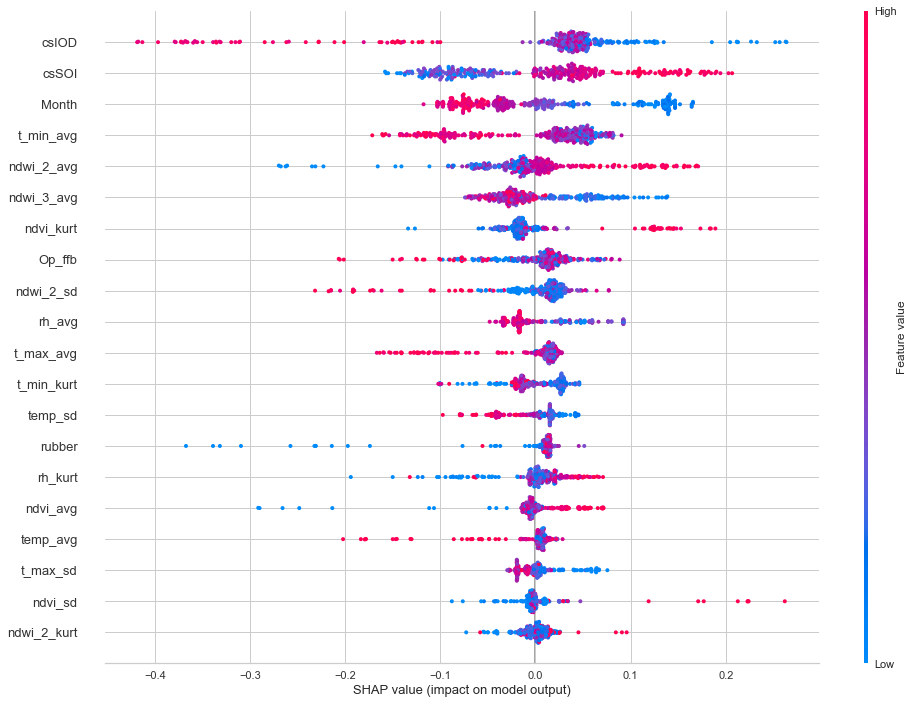

In [37]:
shap.summary_plot(shap_value, X_Train, show=False,plot_size=[16,12])
#plt.savefig(image_path + 'shap_summary.tiff', dpi=300)

Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]
Original size: [7.5 5. ]
New size: [16. 12.]


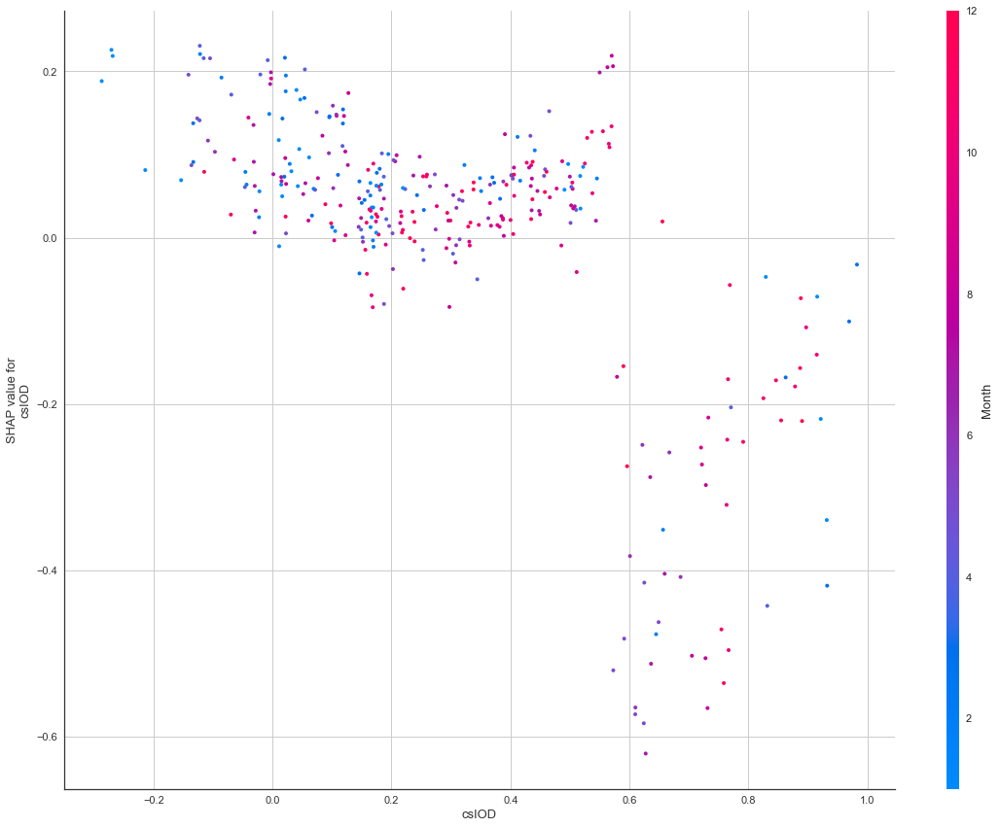

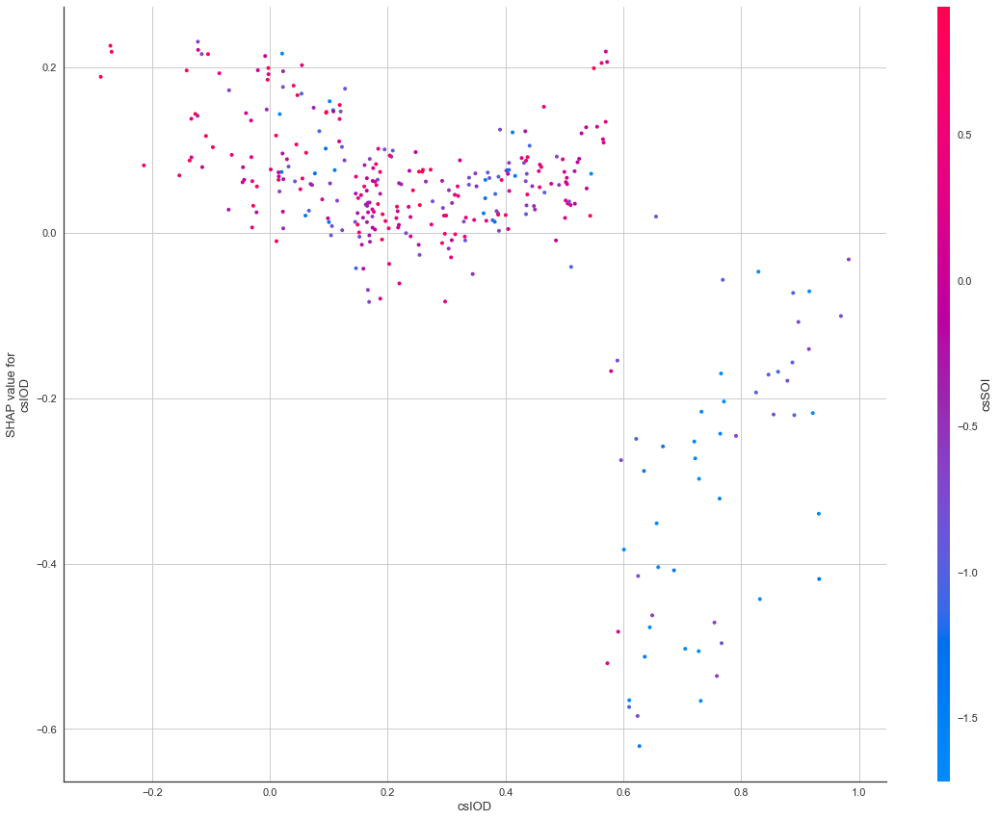

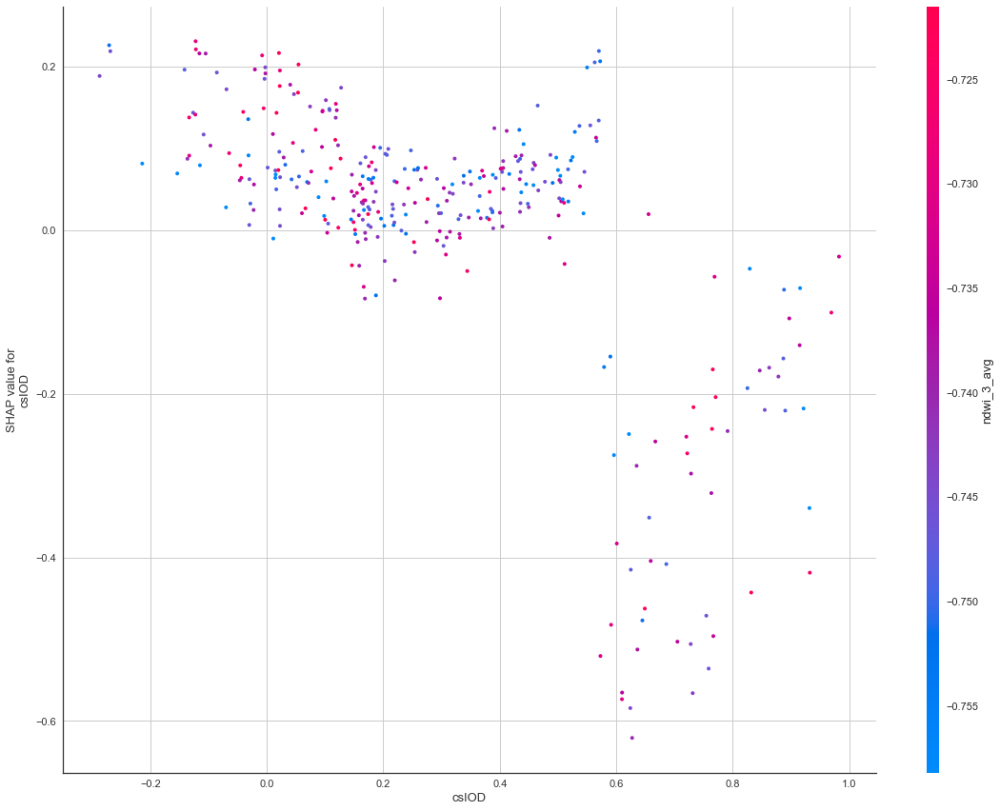

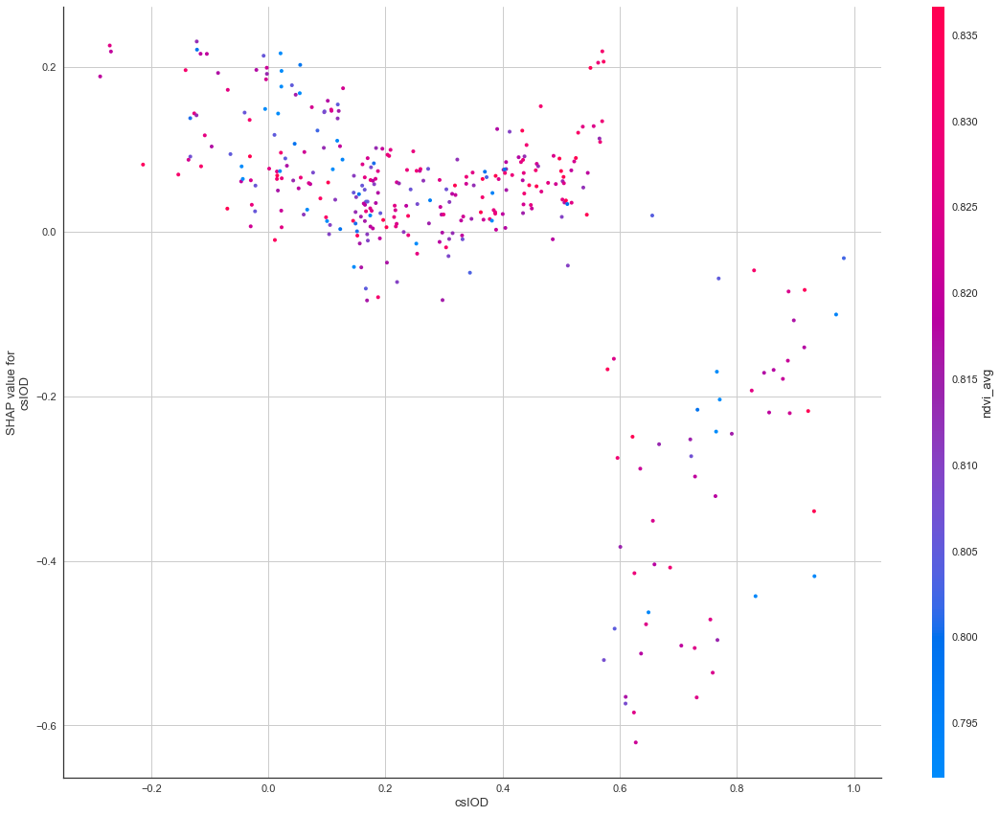

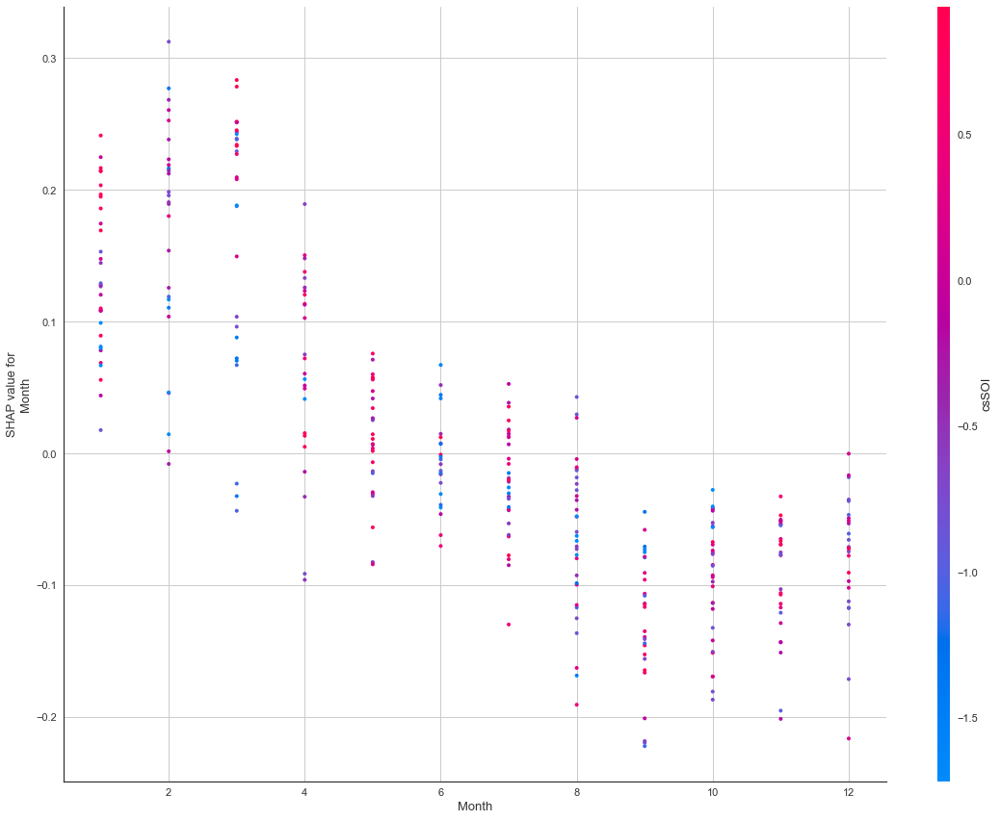

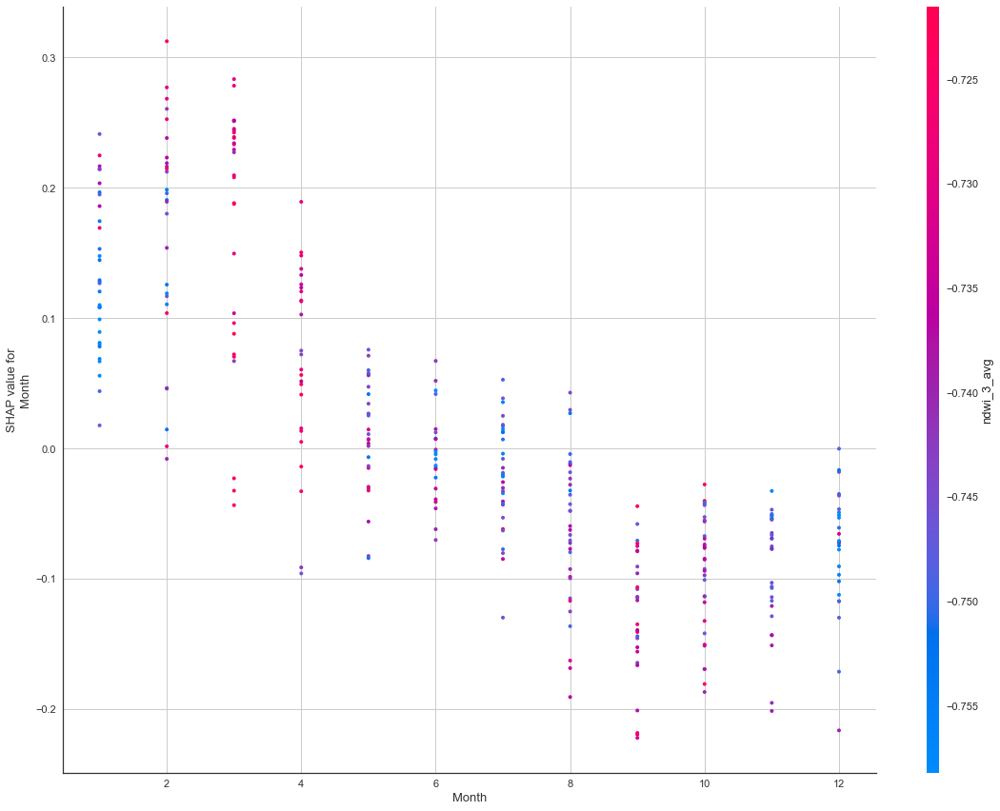

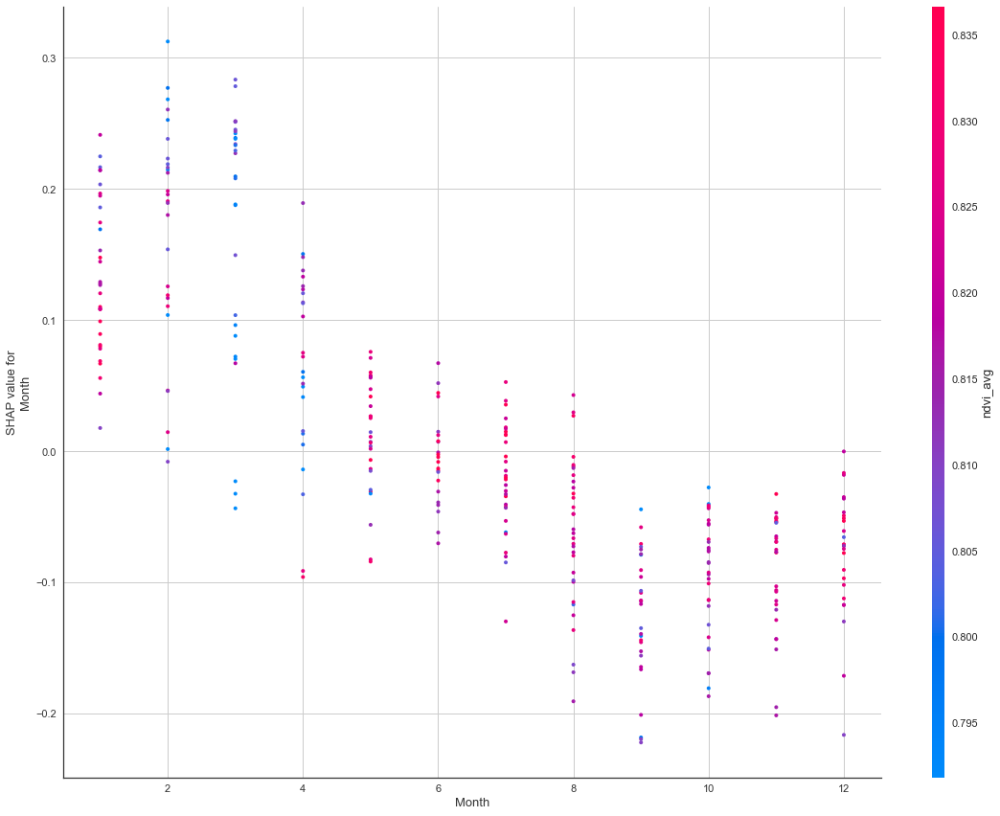

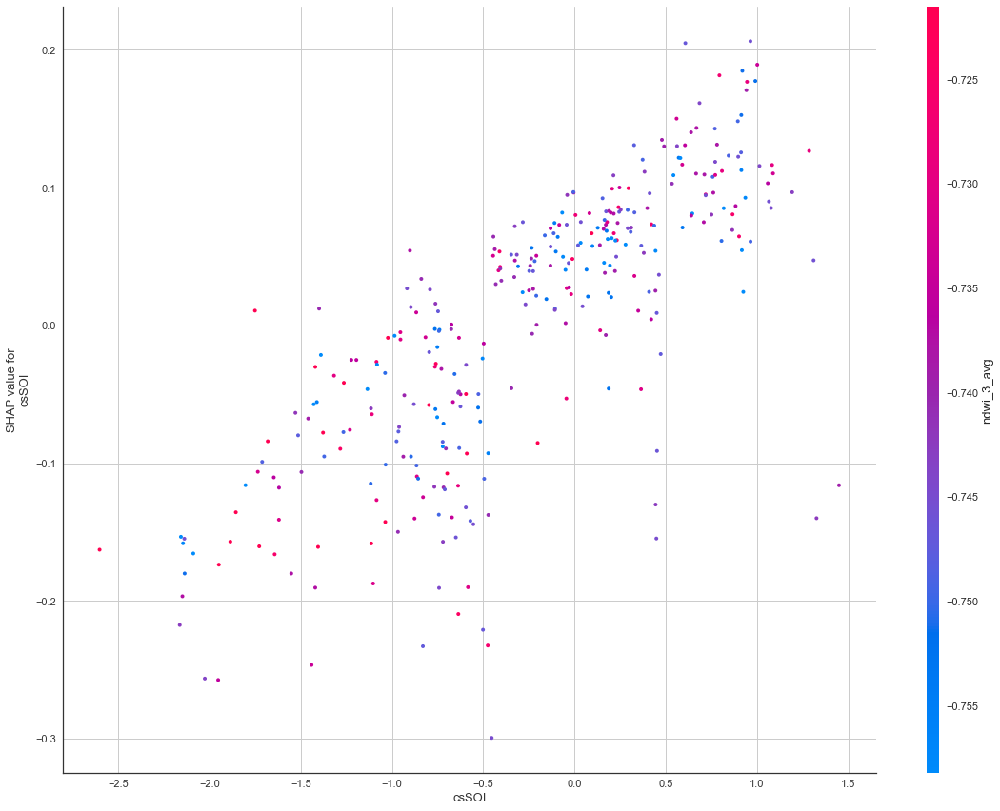

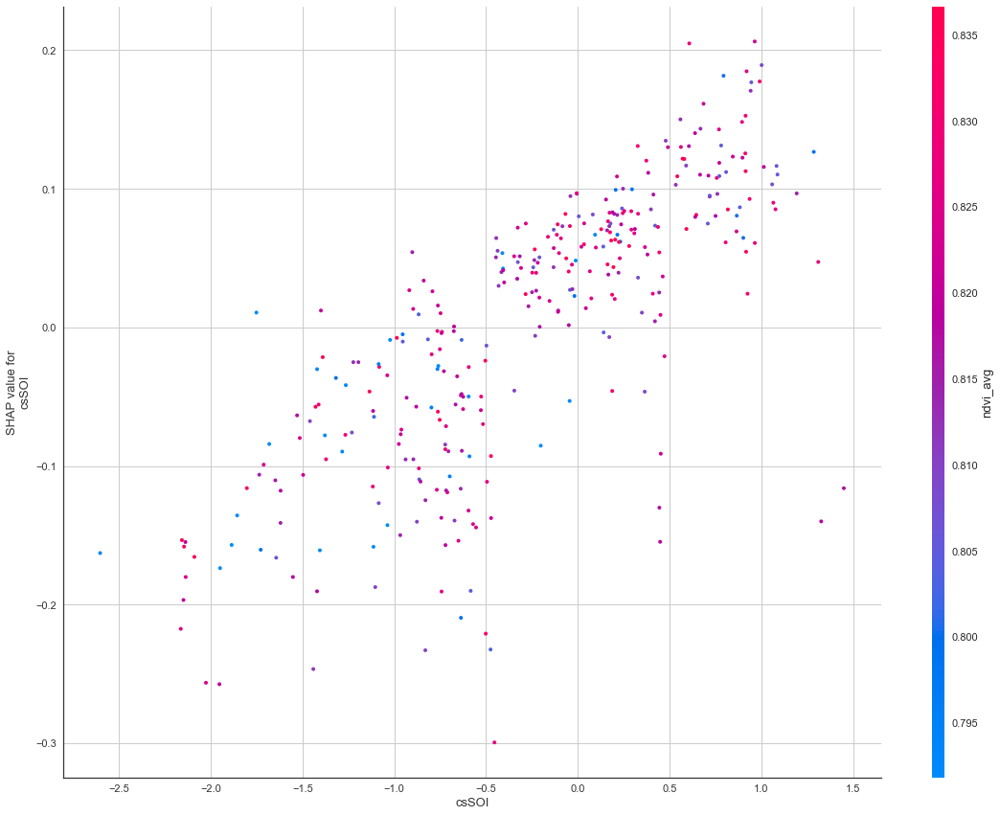

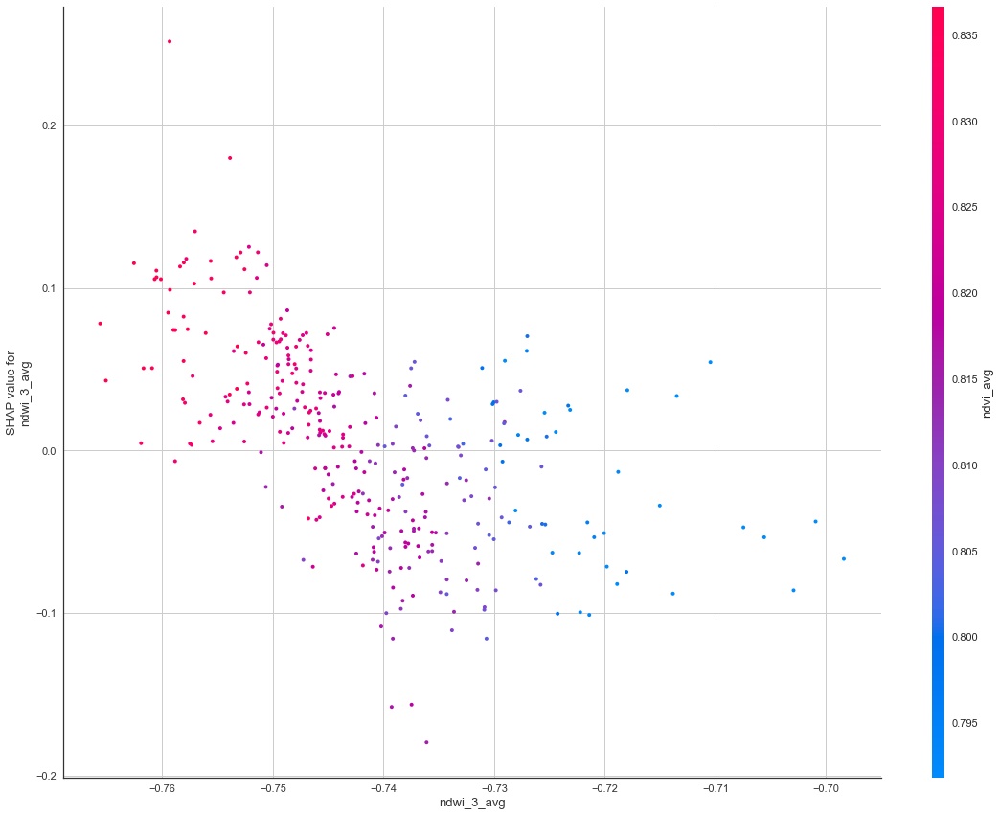

In [22]:
importance_variable = ['csIOD', 'Month', 'csSOI', 'ndwi_3_avg', 'ndvi_avg']
for i in range(len(list(combinations(importance_variable,2)))):
    shap.dependence_plot(list(combinations(importance_variable,2))[i][0], shap_value, X_Train,interaction_index = list(combinations(importance_variable,2))[i][1], show=False)
# Add this code
    print(f'Original size: {plt.gcf().get_size_inches()}')
    w, _ = plt.gcf().get_size_inches()
    plt.gcf().set_size_inches(16,12)
    plt.tight_layout()
    print(f'New size: {plt.gcf().get_size_inches()}')
    plt.savefig(image_path + list(combinations(importance_variable,2))[i][0] + ' vs ' + list(combinations(importance_variable,2))[i][1] + '.tiff', dpi = 300)

Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]
Original size: [6. 5.]
New size: [16. 12.]


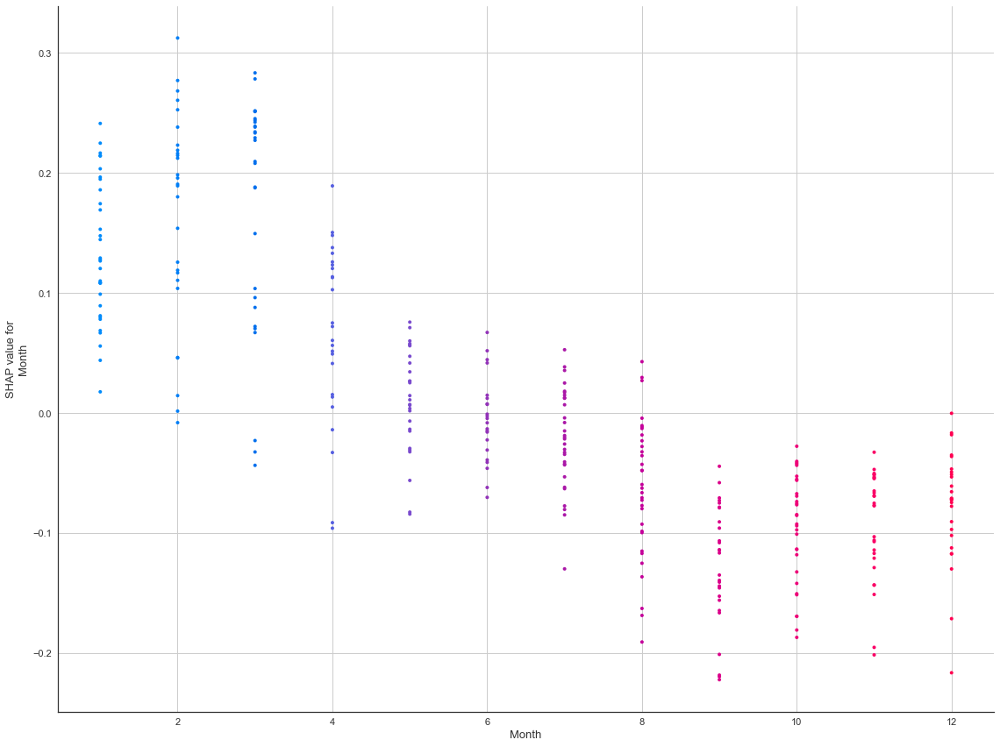

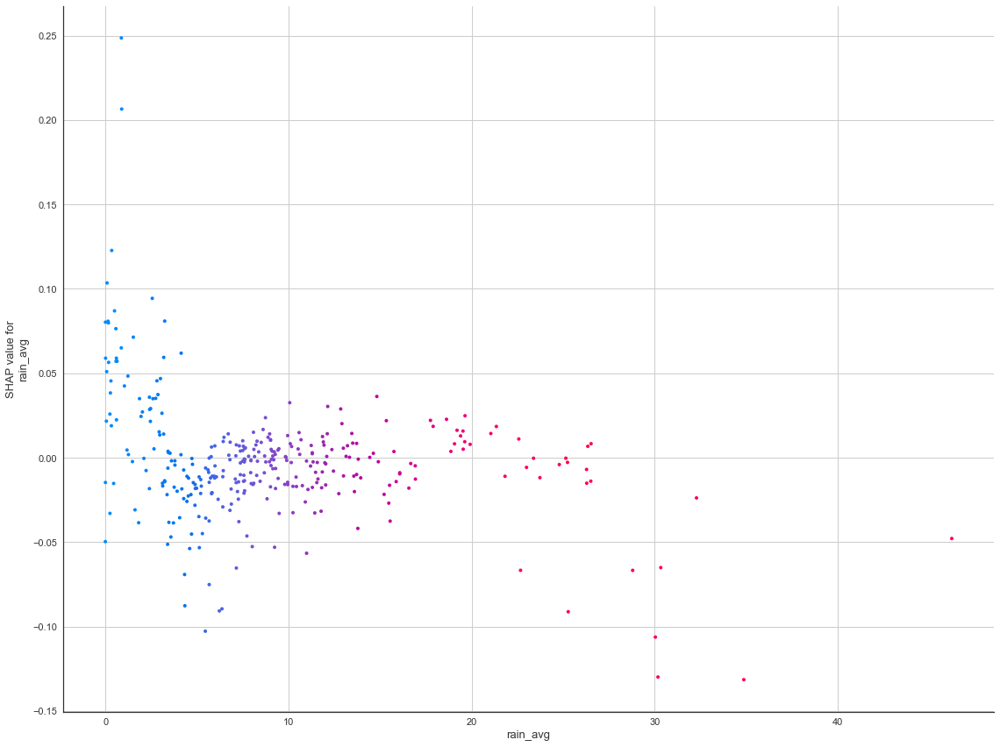

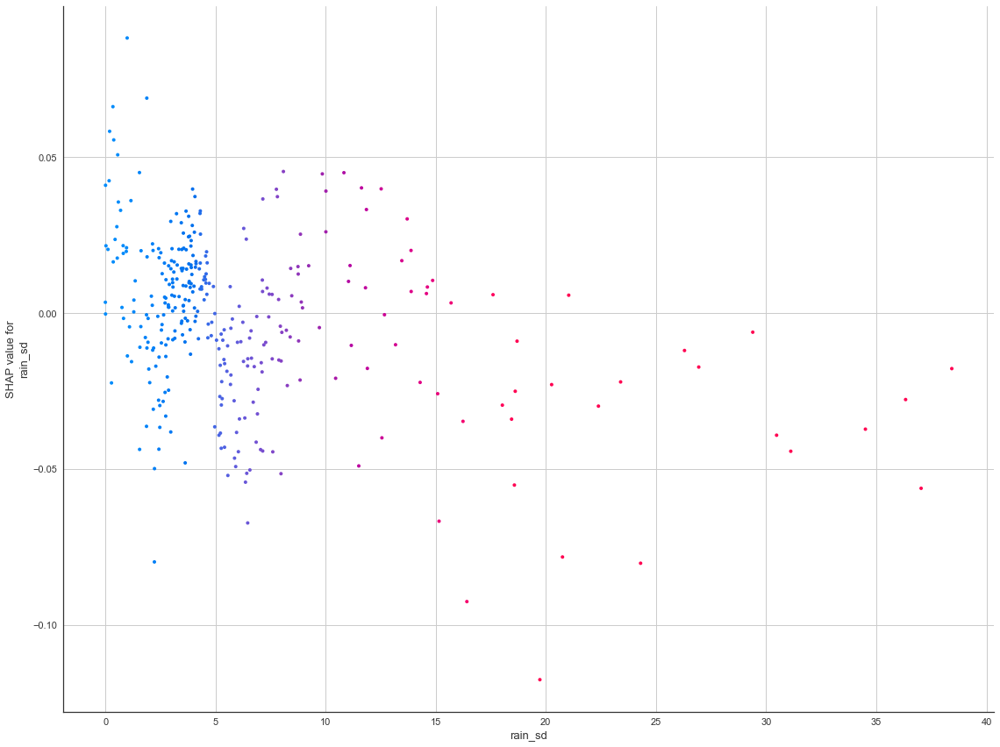

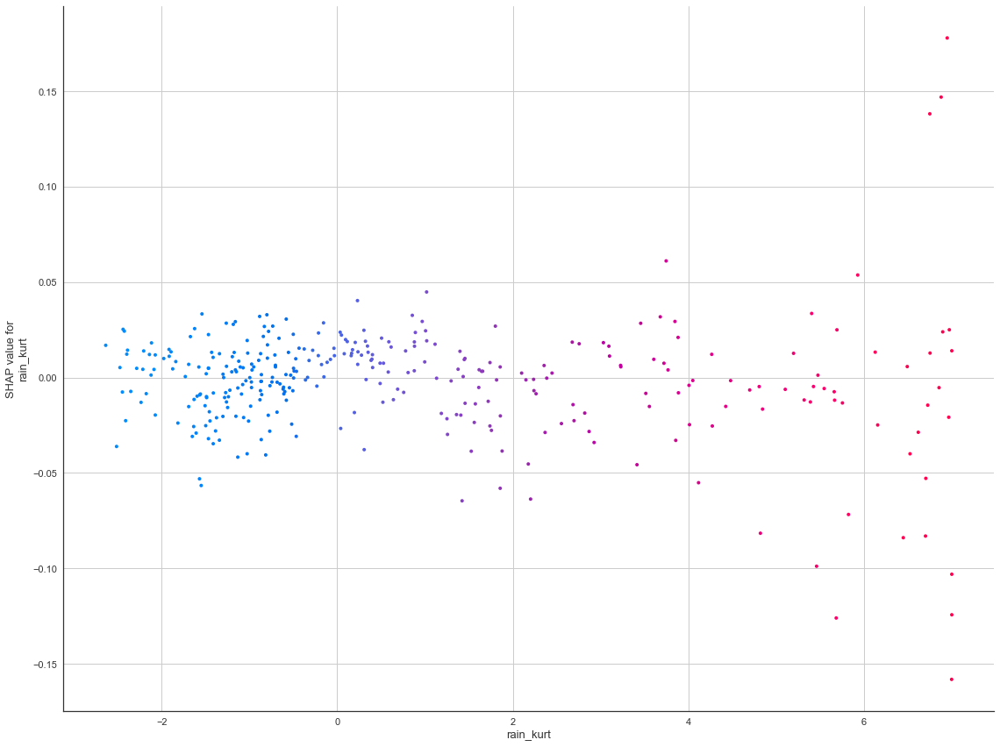

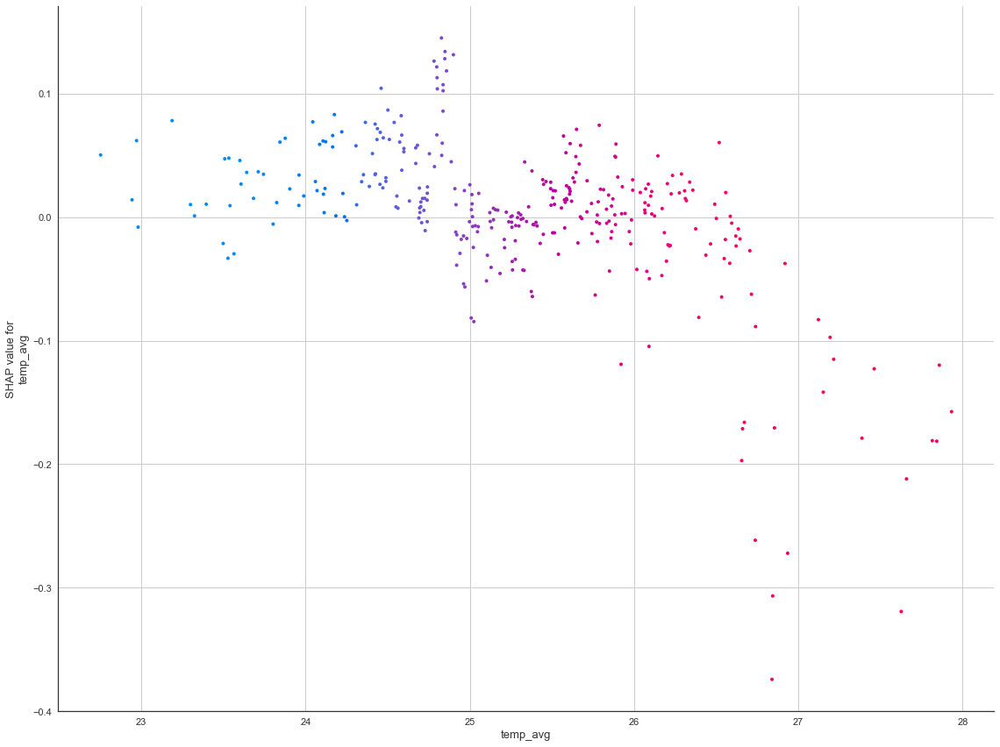

...

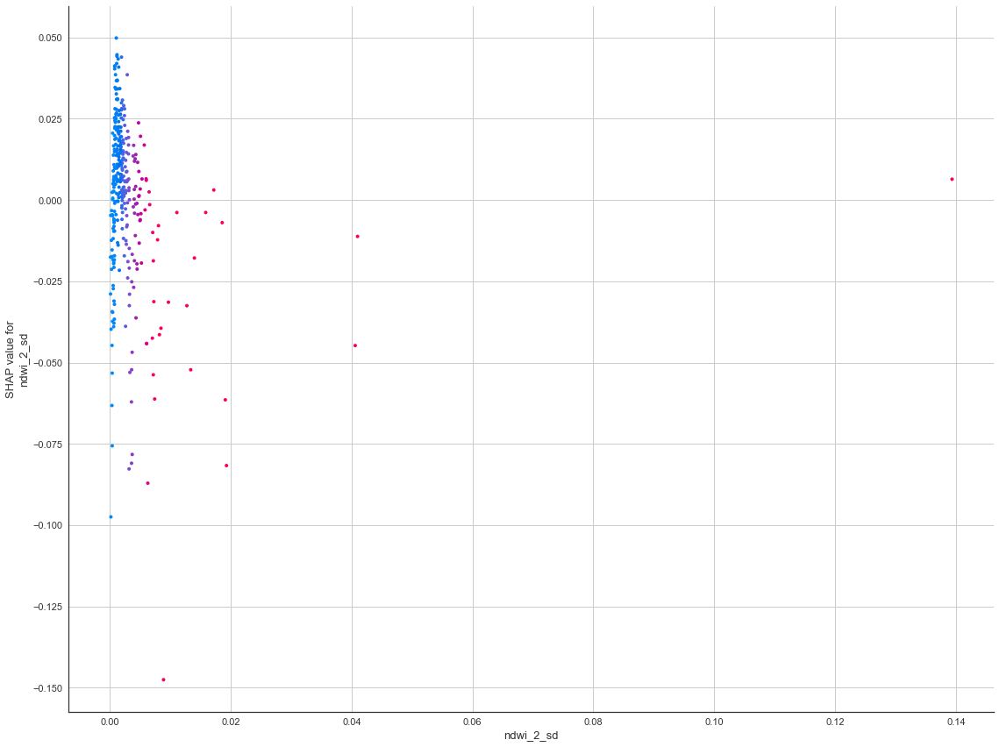

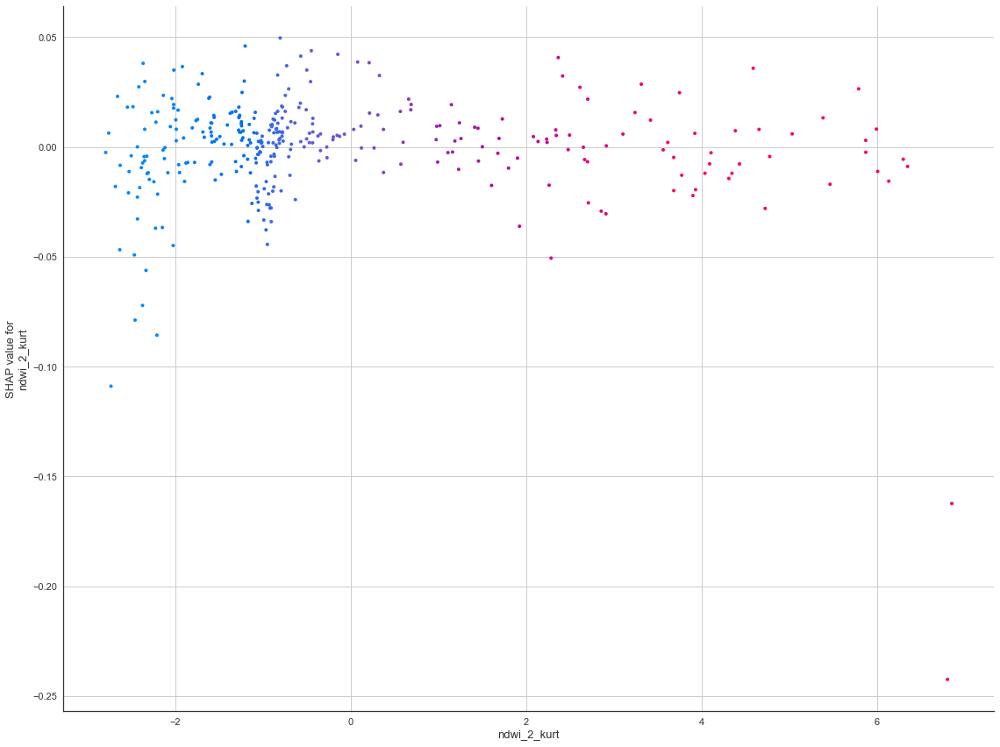

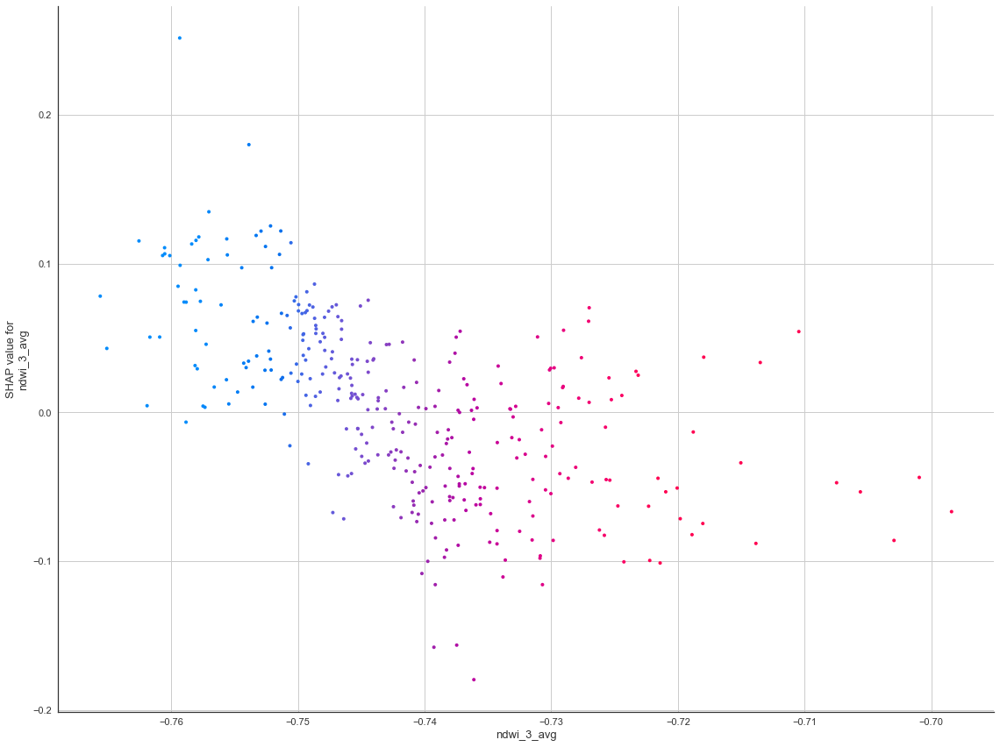

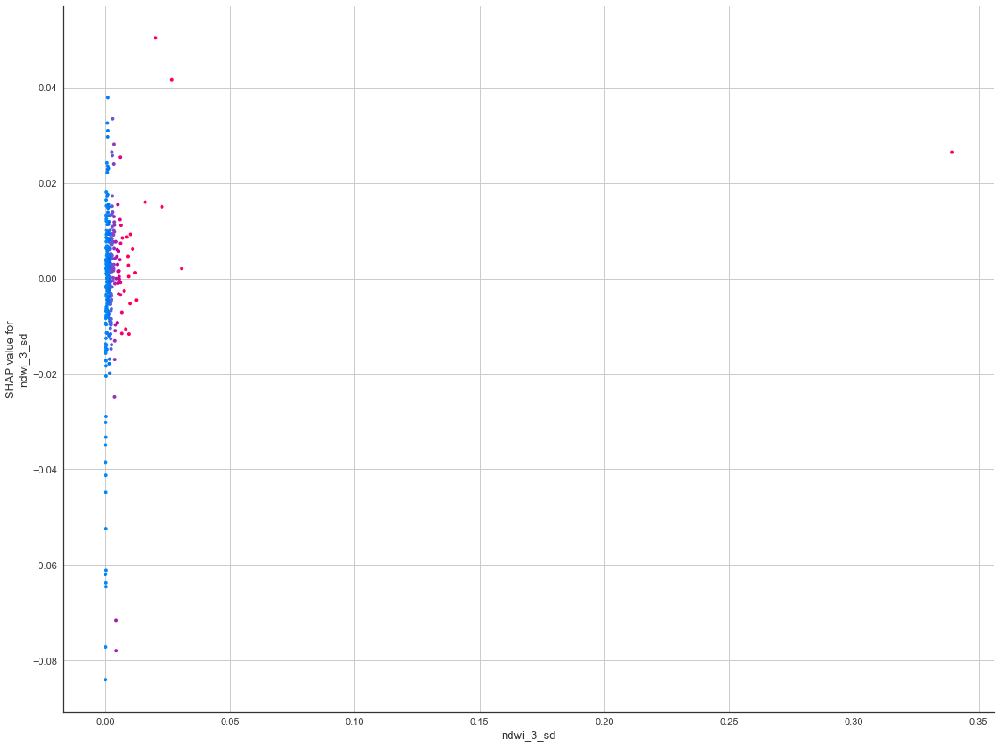

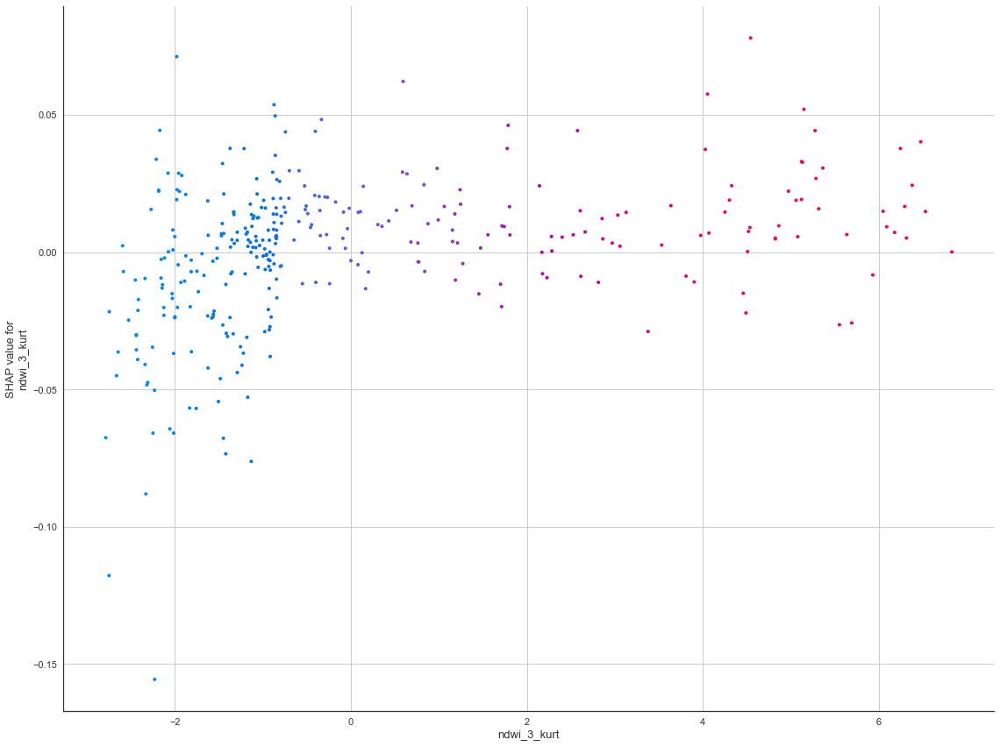

In [23]:
for i in range(len(X_Train.columns)):
    shap.dependence_plot(X_Train.columns[i], shap_value, X_Train,interaction_index = X_Train.columns[i], show=False)
# Add this code
    print(f'Original size: {plt.gcf().get_size_inches()}')
    w, _ = plt.gcf().get_size_inches()
    plt.gcf().set_size_inches(16,12)
    plt.tight_layout()
    print(f'New size: {plt.gcf().get_size_inches()}')
    plt.savefig(image_path + X_Train.columns[i] + ' vs ' + X_Train.columns[i] + '.tiff', dpi = 300)

In [24]:
# tranform the data type the dataframe tranform to series
my_series_train = Y_Train.squeeze()
my_series_test = Y_Test.squeeze()

Original size: [8.  5.5]
New size: [16. 12.]


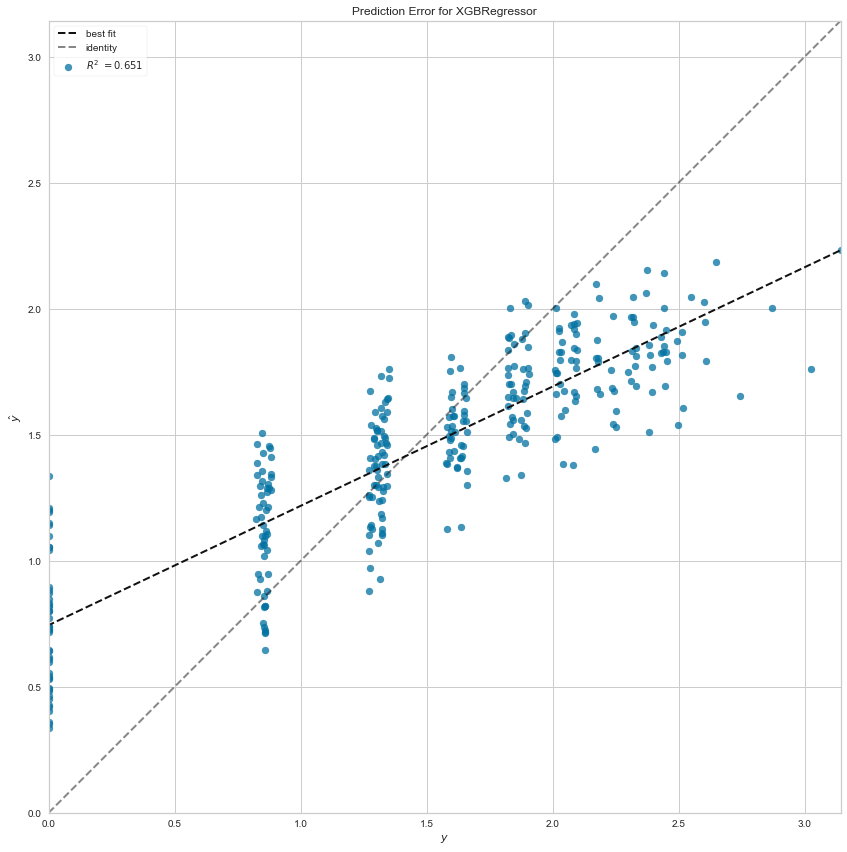

In [38]:
visualizer = PredictionError(model)

visualizer.fit(X_Train, my_series_train)  # Fit the training data to the visualizer
visualizer.score(X_Train, my_series_train)  # Evaluate the model on the test data
visualizer.finalize()
print(f'Original size: {plt.gcf().get_size_inches()}')
w, _ = plt.gcf().get_size_inches()
plt.gcf().set_size_inches(16,12)
plt.tight_layout()
print(f'New size: {plt.gcf().get_size_inches()}')
#plt.savefig('C:/Users/buski/Desktop/xgboost_Phd/image/model_result/train_data_rsquare.tiff',dpi=300)

Original size: [8.  5.5]
New size: [16. 12.]


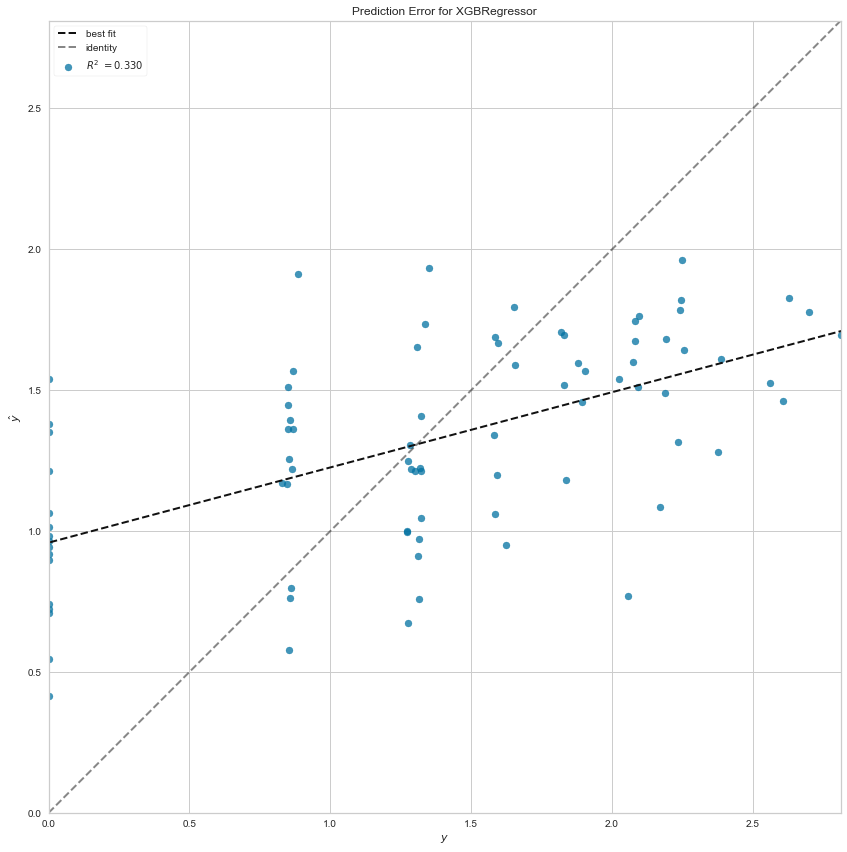

In [39]:
visualizer = PredictionError(model)

visualizer.fit(X_Train, my_series_train)  # Fit the training data to the visualizer
visualizer.score(X_Test, my_series_test)  # Evaluate the model on the test data
visualizer.finalize()
print(f'Original size: {plt.gcf().get_size_inches()}')
w, _ = plt.gcf().get_size_inches()
plt.gcf().set_size_inches(16,12)
plt.tight_layout()
print(f'New size: {plt.gcf().get_size_inches()}')
#plt.savefig('C:/Users/buski/Desktop/xgboost_Phd/image/model_result/test_data_rsquare.tiff',dpi=300)

Original size: [8.  5.5]
New size: [16. 12.]


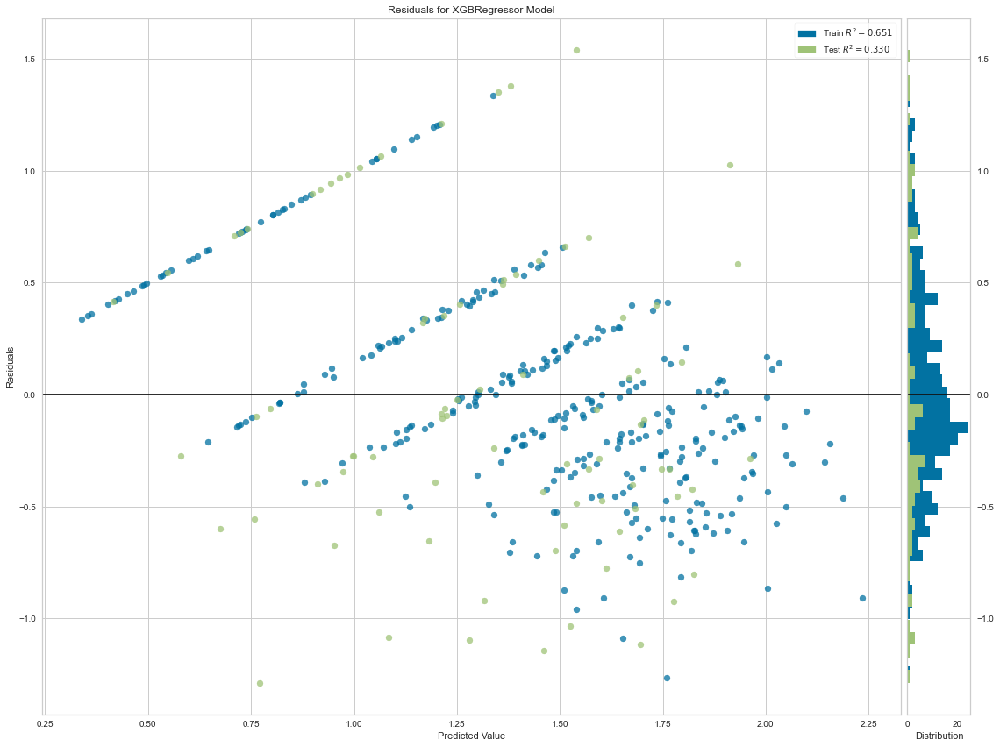

In [40]:
visualizer = ResidualsPlot(model)

visualizer.fit(X_Train, my_series_train)  # Fit the training data to the visualizer
visualizer.score(X_Test, my_series_test)  # Evaluate the model on the test data
visualizer.finalize()
print(f'Original size: {plt.gcf().get_size_inches()}')
w, _ = plt.gcf().get_size_inches()
plt.gcf().set_size_inches(16,12)
plt.tight_layout()
print(f'New size: {plt.gcf().get_size_inches()}')
#plt.savefig('C:/Users/buski/Desktop/xgboost_Phd/image/model_result/Residual_plot.tiff',dpi=300)